## Read files to produce list of galaxies

In [1]:
import statistics
from astropy.io import fits
from astropy.utils.data import get_pkg_data_filename
import numpy as np
import pandas as pd
import random
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm
import scipy as sc
from  itertools import zip_longest
from astropy import constants

from astropy.io import fits
from astropy.utils.data import get_pkg_data_filename
import numpy as np
import pandas as pd
import random
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm
import scipy as sc
from  itertools import zip_longest
from astropy import constants

# read .fits file
image_file = get_pkg_data_filename('/home/ricardo/Documents/codes/Marvin_Manga/MaNGA_screening_test.fits')
fits.info(image_file)

galaxies = fits.getdata(image_file, ext=1)

#create list of plates and ifus
i = 0
plate = []
ifu = []

while i<len(galaxies):
    plate_list = galaxies[i][0]
    plate.append(plate_list)
    ifu_list = galaxies[i][1]
    ifu.append(ifu_list)
    i+=1

#save list of plates and ifus
data1 = np.column_stack([plate])  
datafile_path1 = f'plate.txt'
np.savetxt(datafile_path1 , data1, fmt= ['%d'])

data2 = np.column_stack([ifu])  
datafile_path2 = f'ifu.txt'
np.savetxt(datafile_path2 , data2, fmt= ['%s'])


def files_run(min_d, max_d, redux, analysis, daptype, rc, dc, snr=True):
    """
    Function that create list of commands to run on NIRVANA. 
    Creates 2 txt files: one to download the data and other to run.
    """
    plate_ifu_list_init = []

    data_sample_indx = range(min_d, max_d)

    axd = open('axisym_download.txt','w')
    f = open('axisym.txt','w')
    for i in data_sample_indx:
        plate_ifu_list_init.append(f'{plate[i]}-{ifu[i]}')
        print(f'nirvana_manga_download {plate[i]} {ifu[i]}    --redux {redux} --analysis {analysis} --dr DR17  --daptype {daptype}' ,\
          sep=' ', file=axd)
    axd.close()

    for i in data_sample_indx:
        if snr==False:
            print(f'nirvana_manga_axisym {plate[i]} {ifu[i]}  --redux {redux} --analysis {analysis} --dr DR17 \
          -t Stars --odir ./outputs/error/{plate[i]}-{ifu[i]} --rc {rc} --dc {dc} --fisher --save_vrot --daptype {daptype}', sep=' ', file=f)
            print(f'nirvana_manga_axisym {plate[i]} {ifu[i]}  --redux {redux} --analysis {analysis} --dr DR17 \
         --odir ./outputs/error/{plate[i]}-{ifu[i]} --rc {rc} --dc {dc} --fisher --save_vrot --daptype {daptype}' , sep=' ', file=f)
        elif snr==True:
            print(f'nirvana_manga_axisym {plate[i]} {ifu[i]}  --redux {redux} --analysis {analysis} --dr DR17 \
          -t Stars --odir ./outputs/error/snr15/{plate[i]}-{ifu[i]} --rc {rc} --dc {dc} --fisher --save_vrot --daptype {daptype} --min_sig_snr=15 --min_vel_snr=15', sep=' ', file=f)
            print(f'nirvana_manga_axisym {plate[i]} {ifu[i]}  --redux {redux} --analysis {analysis} --dr DR17 \
         --odir ./outputs/error/snr15/{plate[i]}-{ifu[i]} --rc {rc} --dc {dc} --fisher --save_vrot --daptype {daptype}  --min_sig_snr=15 --min_vel_snr=15' , sep=' ', file=f)

            
    f.close()
    return plate_ifu_list_init	 

red_sciama = '/mnt/lustre/MaNGA/sas/dr17/manga/spectro/redux/v3_1_1/'
analysis_sciama =  '/mnt/lustre/MaNGA/sas/dr17/manga/spectro/analysis/v3_1_1/3.1.0/'
dap_sciama = 'HYB10-MILESHC-MASTARSSP'

red_lap = './redux/DR17/'
analysis_lap =  './analysis/DR17/'
dap_lap = 'HYB10-MILESHC-MASTARHC2'

rc1 = 'HyperbolicTangent'
dc1 = 'Exponential'
rc2 = 'PolyEx'
dc2 = 'ExpBase'

oroot = '/home/ricardo/Documents/codes/NIRVANA/sciama/outputs/error'
outdir = '/home/ricardo/Documents/codes/NIRVANA/sciama'

plate_ifu_list_init = files_run(0,len(ifu),red_sciama,analysis_sciama, dap_sciama, rc1, dc1)

def read_files_pd(file_path):
        """
        function to read files
        """
        if Path(file_path).exists():
            data = pd.read_csv(file_path, sep='\s+',header=None)
            return pd.DataFrame(data)

def plate_ifu_list_final(tracer, function_rc, function_dc, vel_type, dap_type = dap_sciama):
    """
    Read the output files from Nirvana to see if the file already exists. 
    Then a final list of ID is produced
    """
    plate_ifu_list_final = []
    for plate_ifu in plate_ifu_list_init:
        if read_files_pd(f'{oroot}/{plate_ifu}/nirvana-manga-axisym-{plate_ifu}-{tracer}-{function_rc}-{function_dc}-{dap_type}-fit_err-{vel_type}.txt')  is not None: 
            plate_ifu_list_final.append(f'{plate_ifu}')
    return plate_ifu_list_final

plate_ifu_list = plate_ifu_list_final('Gas', 'HyperbolicTangent','Exponential', 'vel1vel2')



Filename: /home/ricardo/Documents/codes/Marvin_Manga/MaNGA_screening_test.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       5   ()      
  1  Joined        1 BinTableHDU    413   2220R x 190C   [K, 32A, 32A, 32A, 32A, 32A, 32A, 32A, 32A, 32A, 32A, D, D, D, D, D, D, D, K, D, K, D, D, 53A, K, 32A, K, D, D, D, D, D, D, D, D, D, D, D, K, K, K, D, D, D, D, K, K, K, K, 32A, K, 19A, K, K, K, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, K, K, K, 6A, K, K, D, D, 7D, 7D, 7D, D, D, D, D, 7D, D, D, 7D, 7D, 7D, 7D, D, D, D, D, 7D, 7D, K, K, 12A, 10A, K, 4A, 30A, L, E, E, E, E, K, K, K, E, E, E, E, E, E, E, E, E, E, E, E, E, E, 8A, 8A, 8A, 8A, 8A, K, K, 14A, 14A, 14A, 14A, 14A, 14A, 10A, E, 15A, 10A, K, E, 4E, 4E, E, E, 3E, 3E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, 35E, 35E, 35E, 35E, 35E, 35E, 35E, 35E, 35E, 35E, 35E, 35E, 35E, 35E, 46E, 46E, 46E, 46E, 46E, E, E]   


## Class that creates results from Nirvana

Produces circular velocity for stars and gas and the difference between them

In [2]:
import numpy as np
import matplotlib.pyplot as plt  # had to add to run multiple plots %matplotlib inline  
%matplotlib inline  
import pandas as pd
import nirvana
import os
import glob
import re
from scipy import interpolate
from scipy.interpolate import CubicSpline
from tqdm import tqdm
from  itertools import zip_longest

red_sciama = '/mnt/lustre/MaNGA/sas/dr17/manga/spectro/redux/v3_1_1/'
analysis_sciama =  '/mnt/lustre/MaNGA/sas/dr17/manga/spectro/analysis/v3_1_1/3.1.0/'
dap_sciama = 'HYB10-MILESHC-MASTARSSP'
dap_spx = 'SPX-MILESHC-MASTARSSP'

red_lap = './redux/DR17/'
analysis_lap =  './analysis/DR17/'
dap_lap = 'HYB10-MILESHC-MASTARHC2'
rc1 = 'HyperbolicTangent'
dc1 = 'Exponential'
rc2 = 'PolyEx'
dc2 = 'ExpBase'

oroot = '/home/ricardo/Documents/codes/NIRVANA/sciama/outputs/error'
outdir = '/home/ricardo/Documents/codes/NIRVANA/sciama'

class Vdiff2:
    
    def __init__(self, plate_ifu, step=0.1, func_rc='HyperbolicTangent', \
                 func_dc='Exponential', oroot=oroot, outdir=outdir, update=True):
        self.plate_ifu = plate_ifu
        self.step = step
        self.update = update
        self.func_rc = func_rc
        self.func_dc = func_dc
        self.oroot = oroot
        self.outdir = outdir

    def read_files_pd(self,file_path):
        """
        function to read files
        """
        if Path(file_path).exists():
            data = pd.read_csv(file_path, sep='\s+',header=None)
            return pd.DataFrame(data)
    
    def v_mean(self,xbf, ybf, ybf_err):
        """
        Function to bin the data, given a step, and the list of r and v
        """
        c = list(np.arange(0,max(xbf),self.step))
        r_list = []
        r_mean_list = []
        v_list_ri = []
        v_mean_list = []
        r_std_list = []
        v_std_list = []
        v_err_list = []
        v_err_mean_list = []

        # select a radius from bin list
        for ci in c:      
        # select a radius from the list of data
            for xbfi in xbf:
        # compare the radius from the data with a radius from the bin list
        # if between 0 and 1, e.g., store velocity and radius
                if xbfi < ci + self.step and xbfi >= ci:
                    r_index = list(xbf).index(xbfi)
                    v_list_ri.append(ybf[r_index])
                    r_list.append(xbfi)
                    v_err_list.append(ybf_err[r_index])

        # calculate mean of r and v
            r_mean_list.append(np.mean(r_list))
            v_mean_list.append(np.mean(v_list_ri))
            v_err_mean_list.append(np.sum(np.square(v_err_list))/(len(v_err_list)*len(v_err_list)) )

        # calculate standard deviation of r and v
            r_std_list.append(np.std(r_list))
            v_std_list.append(np.std(v_list_ri))
        # clear list because it will start new radius from list
            v_list_ri.clear()
            r_list.clear()
        # return the binned radius, velocity, velocity squared, std for radius,  std for velocity, 
        # std for measured velocity
        return r_mean_list, v_mean_list, np.square(v_mean_list), r_std_list, v_std_list, np.sqrt(v_err_mean_list)
        # A 'nan' will appear in the output if there is not data inside the bin, e.g. there is no 0.4 in radius, thus 
        # the first averaged data points from r=0 to r=0.5 is non-existent


    def v_diff2(self,vtot_gas, vtot_stars):
        """
        Function to calculate difference in quadrature of v_tot gas^2 - v_tot stars^2
        """
        return list([x-y for x,y in zip(vtot_gas, vtot_stars)])


    def v_sig_tot2(self,vgas, vstar, vdispgas, vdispstar):
        """
        Function to calculate error^2 
        """
        return list([np.square(x)+np.square(y)+np.square(w)+np.square(z) for x,y,w, z in zip(vgas, vstar, vdispgas,\
                                                 vdispstar)])

    def store_files(self,  tracer,   vel_type,   dap_type = dap_sciama):
        """
        Function to store variables
        """
        r_list = []
        r_list_std = []
        v_list = []
        v_list_std = []
        v_list_std_par = []
        v_list_std_exp = []
        r_mean = []
        v_mean_list = []
        v_mean_sq = []
        v_mean_std = []
        r_std = []
        v_std = []

        # store each data in one list called data_t
        globals()[f'data_{tracer}_{self.func_rc}-{self.func_dc}_{self.plate_ifu}'] = self.read_files_pd(f'{self.oroot}/{self.plate_ifu}/nirvana-manga-axisym-{self.plate_ifu}-{tracer}-{self.func_rc}-{self.func_dc}-{dap_type}-fit_err-{vel_type}.txt')   
         # read columns with radius and velocities
        r_list = globals()[f'data_{tracer}_{self.func_rc}-{self.func_dc}_{self.plate_ifu}'][0]
        v_list = globals()[f'data_{tracer}_{self.func_rc}-{self.func_dc}_{self.plate_ifu}'][1]
        if vel_type == 'disp_vel':
            v_list_std = globals()[f'data_{tracer}_{self.func_rc}-{self.func_dc}_{self.plate_ifu}'][2]

        else:
            # propagated uncertainty + err experiment rotation velocity 
            v_list_std = globals()[f'data_{tracer}_{self.func_rc}-{self.func_dc}_{self.plate_ifu}'][5]
            # propagated uncertainty radius
            r_list_std = globals()[f'data_{tracer}_{self.func_rc}-{self.func_dc}_{self.plate_ifu}'][2]
            # propagated uncertainty  rotation velocity
            v_list_std_par = globals()[f'data_{tracer}_{self.func_rc}-{self.func_dc}_{self.plate_ifu}'][3]

        image_file_g = get_pkg_data_filename(f'{self.oroot}/{self.plate_ifu}/nirvana-manga-axisym-{self.plate_ifu}-Gas-HyperbolicTangent-Exponential-{dap_sciama}.fits.gz')
        reff = fits.getdata(image_file_g, ext=23)['REFF'][0]

        r_mean, v_mean_list,v_mean_sq,r_std, v_std, v_mean_err = \
                    self.v_mean(r_list/reff, v_list, v_list_std  )         


        # second index is the data set. When using different lists r_mean, etc, use the same dataset (second index)       
        if vel_type == 'disp_vel':
            return r_mean, v_mean_list, v_mean_sq, r_std, v_std, r_list, v_list, v_list_std, v_mean_err
        else:
         # v_mean_err is the mean of the measure/determined uncertainty (both from experiment and propagated params)   
            return r_mean, v_mean_list, v_mean_sq, r_std, v_std, r_list, v_list, v_list_std, v_mean_err, r_list_std,\
                   v_list_std_par


    def v_diff2_models(self,z_mod1, z_mod2):
        """
        Calculate difference of velocity between different models.
        """
        return [np.absolute(x-y) for x,y in zip(z_mod1, z_mod2)]
        # return list([np.sqrt(np.absolute(np.square(x)-np.square(y))) for x,y in zip(z_mod1, z_mod2)])


    def nan_test(self, tracer,  vel_type):
        """
        Check if there are negative vrot_err^2 -> gives a 'nan'.  CORRECT
        """

        if len(np.where (np.isnan(store_files( tracer, vel_type )[9])))!=0 or \
           len(np.where (np.isnan(store_files(plate_ifu,tracer, func_rc, fucntion_dc, vel_type , 0.5)[10])))!=0:
            print(f'{plate_ifu}, {tracer}, {func_rc}, {function_dc}, {vel_type}')
            print(np.where (np.isnan(store_files(plate_ifu,tracer, function_rc,function_dc, vel_type , 0.5)[9])))
            print(np.where (np.isnan(store_files(plate_ifu,tracer, function_rc,function_dc, vel_type , 0.5)[10])))

    def sersicn(self):
        image_file_g =get_pkg_data_filename(f'{self.oroot}/{self.plate_ifu}/nirvana-manga-axisym-{self.plate_ifu}-Gas-HyperbolicTangent-Exponential-{dap_sciama}.fits.gz')
        return fits.getdata(image_file_g, ext=23)['SERSICN'][0]

    def v2_tracer_final(self):
        """
        Calculate the sum of the dispersion velocity and rotation velocity for stars and gas

        """
        vrot2_g = self.store_files('Gas','vel1vel2')[2]
        vdisp2_g =  self.store_files('Gas', 'disp_vel')[2]
        vrot2_s = self.store_files( 'Stars','vel1vel2')[2]
        vdisp2_s =  self.store_files( 'Stars',  'disp_vel' )[2]

        vgas_std_err = self.store_files('Gas' ,'vel1vel2'  )[8]
        vstar_std_err = self.store_files( 'Stars' , 'vel1vel2')[8]
        disp_vgas_err = self.store_files( 'Gas',   'disp_vel' )[8]
        disp_vstar_err = self.store_files( 'Stars' , 'disp_vel' )[8]

        rgv = self.store_files( 'Gas',  'vel1vel2' )[0]
        rv = self.store_files( 'Stars', 'vel1vel2' )[0]
        rg = self.store_files( 'Gas',  'disp_vel' )[0]
        r = self.store_files( 'Stars',  'disp_vel' )[0]
        r_gf = [(x+y)/2 for x,y in zip(rgv, rg)]
        r_sf = [(x+y)/2 for x,y in zip(rv, r)]

        if  self.update == False:
            vgas2 = list([x+y for x,y in zip(vrot2_g,vdisp2_g)])
            vstar2 = list([x+y for x,y in zip(vrot2_s,vdisp2_s)])
            vg2_err = list([np.sqrt(4*x*y*y + 4*w*z*z) for  x,y, w,z in zip(vrot2_g, vgas_std_err, vdisp2_g, disp_vgas_err)])
            vs2_err = list([np.sqrt(4*x*y*y + 4*w*z*z) for  x,y, w,z in zip(vrot2_s, vstar_std_err, vdisp2_s, disp_vstar_err)])

            return vgas2, vstar2, vg2_err, vs2_err, r_gf, r_sf

        else:
            # for gas

            image_file_g = get_pkg_data_filename(f'{self.oroot}/{self.plate_ifu}/nirvana-manga-axisym-{self.plate_ifu}-Gas-{self.func_rc}-{self.func_dc}-{dap_sciama}.fits.gz')
            reff = fits.getdata(image_file_g, ext=23)['REFF'][0]
            hsigmagas = fits.getdata(image_file_g, ext=23)['F_S_H'][0]/reff
            vhsigmagas = fits.getdata(image_file_g, ext=23)['F_S_CEN'][0]
            err_hsigma_gas = fits.getdata(image_file_g, ext=23)['E_S_H'][0]/reff

            sigma2gas_1 = [4*(rg[i]/hsigmagas)* vdisp2_g[i] for i in range(len(rg))]
            sigma2gas_2 = [8*(rg[i]/hsigmagas)* vdisp2_g[i] for i in range(len(rg))]
            vgas2_1 = list([x+y for x,y in zip(vrot2_g,sigma2gas_1)])
            vgas2_2 = list([x+y for x,y in zip(vrot2_g,sigma2gas_2)])

            #for stars

            image_file_s = get_pkg_data_filename(f'{self.oroot}/{self.plate_ifu}/nirvana-manga-axisym-{self.plate_ifu}-Stars-{self.func_rc}-{self.func_dc}-{dap_sciama}.fits.gz')
            hsigma = fits.getdata(image_file_s, ext=23)['F_S_H'][0]/reff
            vhsigma = fits.getdata(image_file_s, ext=23)['F_S_CEN'][0]
            err_hsigma = fits.getdata(image_file_s, ext=23)['E_S_H'][0]/reff

            sigma2stars = [4*(r[i]/hsigma) * vdisp2_s[i] for i in range(len(r))]
            vstar2 = list([x+y for x,y in zip(vrot2_s,sigma2stars)])

            # errors star and gas there is actally no uncertainty on r for disp vel
            vs2_err = list([np.sqrt(4*x*y**2 + 4*a**2*z**2/w + a**2*err_hsigma**2/(hsigma**2)) for  x,y, w,z, a in \
                            zip(vrot2_s, vstar_std_err, vdisp2_s, disp_vstar_err, sigma2stars)])
            vg2_err_1 = list([np.sqrt(4*x*y**2 + 4*a**2*z**2/w +a**2*err_hsigma_gas**2/(hsigmagas**2)) for  x,y, w,z,a in \
                              zip(vrot2_g, vgas_std_err, vdisp2_g, disp_vgas_err, sigma2gas_1)])
            vg2_err_2 = list([np.sqrt(4*x*y**2 + 4*a**2*z**2/w+ a**2*err_hsigma_gas**2/(hsigmagas**2))  for  x,y, w,z,a in \
                              zip(vrot2_g, vgas_std_err, vdisp2_g, disp_vgas_err, sigma2gas_2)])


            return vgas2_1, vstar2, vgas2_2, vg2_err_1, vs2_err, vg2_err_2, r_gf, r_sf

    def v2_tracer_final_inter(self):
        """
        Calculate the sum of the dispersion velocity and rotation velocity for
        stars and gas, but using interpolation.
        """
        rgasrot_f = []
        vgasrot2_f = []
        rgasdisp_f = []
        vgasdisp2_f = []
        rgasrot = self.store_files( 'Gas','vel1vel2')[0]
        vgasrot2 = self.store_files( 'Gas','vel1vel2')[2]
        rgasdisp = self.store_files( 'Gas', 'disp_vel')[0]
        vgasdisp2  = self.store_files( 'Gas', 'disp_vel')[2]
        for a, b in zip(rgasrot,vgasrot2):
                if str(b) != 'nan':
                    rgasrot_f.append(a)
                    vgasrot2_f.append(b)
        for a, b in zip(rgasdisp,vgasdisp2):
                if str(b) != 'nan':
                    rgasdisp_f.append(a)
                    vgasdisp2_f.append(b)            
        vgasrot2_curve = sc.interpolate.interp1d(rgasrot_f,vgasrot2_f,fill_value="extrapolate")
        vgasdisp2_curve = sc.interpolate.interp1d(rgasdisp_f,vgasdisp2_f,fill_value="extrapolate")
        rtot_gas = sorted(set(rgasrot_f+ rgasdisp_f))
        if max(rgasrot_f)<max(rgasdisp):
            r_max_g = max(rgasrot_f) 
        else:
            r_max_g = max(rgasdisp_f)
        rtot_gas_f = [x for x in rtot_gas if x<= r_max_g]

        rstarsrot_f = []
        vstarsrot2_f = []
        rstarsdisp_f = []
        vstarsdisp2_f = []
        rstarsrot = self.store_files( 'Stars','vel1vel2')[0]
        vstarsrot2 = self.store_files( 'Stars','vel1vel2')[2]
        rstarsdisp = self.store_files( 'Stars', 'disp_vel')[0]
        vstarsdisp2  = self.store_files( 'Stars', 'disp_vel')[2]
        for a, b in zip(rstarsrot,vstarsrot2):
                if str(b) != 'nan':
                    rstarsrot_f.append(a)
                    vstarsrot2_f.append(b)
        for a, b in zip(rstarsdisp,vstarsdisp2):
                if str(b) != 'nan':
                    rstarsdisp_f.append(a)
                    vstarsdisp2_f.append(b)  
        vstarsrot2_curve = sc.interpolate.interp1d(rstarsrot_f,vstarsrot2_f,fill_value="extrapolate")
        vstarsdisp2_curve = sc.interpolate.interp1d(rstarsdisp_f,vstarsdisp2_f,fill_value="extrapolate")
        rtot_stars = sorted(set(rstarsrot_f+ rstarsdisp_f))
        if max(rstarsrot_f)<max(rstarsdisp_f):
            r_max_s = max(rstarsrot_f) 
        else:
            r_max_s = max(rstarsdisp_f)
        rtot_stars_f = [x for x in rtot_stars if x<= r_max_s]

        if max(rtot_gas_f)<max(rtot_stars_f):
            r_max = max(rtot_gas_f) 
        else:
            r_max = max(rtot_stars_f)
        rtot = sorted(set(rtot_gas_f+ rtot_stars_f))
        rtot_f = [x for x in rtot if x<= r_max]

        if  self.update == False:
            vgastot2 = [vgasrot2_curve(x) +vgasdisp2_curve(x) for x in rtot_gas_f] 
            vstarstot2 = [vstarsrot2_curve(x) +vstarsdisp2_curve(x) for x in rtot_stars_f] 
            vdiff2 = [vgasrot2_curve(x) +  vgasdisp2_curve(x) \
                  -vstarsrot2_curve(x) - vstarsdisp2_curve(x) for x in rtot_f]
            return rtot_gas_f, vgastot2, rtot_stars_f, vstarstot2, rtot_f, vdiff2 
        else:
            image_file_g = get_pkg_data_filename(f'{self.oroot}/{self.plate_ifu}/nirvana-manga-axisym-{self.plate_ifu}-Gas-{self.func_rc}-{self.func_dc}-{dap_sciama}.fits.gz')
            reff = fits.getdata(image_file_g, ext=23)['REFF'][0]
            hsigmagas = fits.getdata(image_file_g, ext=23)['F_S_H'][0]/reff
            vhsigmagas = fits.getdata(image_file_g, ext=23)['F_S_CEN'][0]


            vgastot2_1 = [vgasrot2_curve(x) +4*(x/hsigmagas)* vgasdisp2_curve(x) for x in rtot_gas_f]
            vgastot2_2 = [vgasrot2_curve(x) +8*(x/hsigmagas)* vgasdisp2_curve(x) for x in rtot_gas_f] 

            image_file_s = get_pkg_data_filename(f'{self.oroot}/{self.plate_ifu}/nirvana-manga-axisym-{self.plate_ifu}-Stars-{self.func_rc}-{self.func_dc}-{dap_sciama}.fits.gz')
            hsigma = fits.getdata(image_file_s, ext=23)['F_S_H'][0]/reff
            vhsigma = fits.getdata(image_file_s, ext=23)['F_S_CEN'][0]

            vstarstot2 = [vstarsrot2_curve(x) +4*(x/hsigma) * vstarsdisp2_curve(x) for x in rtot_stars_f]

            vdiff2_1 = [vgasrot2_curve(x) +4*(x/hsigmagas)* vgasdisp2_curve(x) \
                  -vstarsrot2_curve(x) -4*(x/hsigma) * vstarsdisp2_curve(x) for x in rtot_f]
            vdiff2_2 = [vgasrot2_curve(x) +8*(x/hsigmagas)* vgasdisp2_curve(x) \
                  -vstarsrot2_curve(x) -4*(x/hsigma) * vstarsdisp2_curve(x) for x in rtot_f]
            return rtot_gas_f, vgastot2_1, vgastot2_2, rtot_stars_f, vstarstot2, rtot_f, vdiff2_1, vdiff2_2


    def v_diff2_final(self): 
        """
        Calculate the difference squared of gas - stars.    
        """
        vdiff2_norm = []
        vdiff2_2_norm = []
        vdiff2_err_norm = []
        vdiff2_err2_norm = []
        if  self.update ==False:
            vgas2, vstar2, vgas2err, vstars2err, rg, rs = \
                    self.v2_tracer_final()
            vdiff2 = self.v_diff2(vgas2, vstar2)
            vdiff2err = list([np.sqrt(np.square(x)/np.square(z)+np.square(y)/np.square(w))*np.absolute(z)/np.absolute(w) for x,y,z,w in zip(vgas2err, vstars2err, vgas2, vstar2)])
            vdiff2err_f = [x for x in vdiff2err if str(x) != 'nan']
            # calculate normalized vdiff2
            for i in range(len(vdiff2)):

                vdiff2_norm.append(vdiff2[i]/vstar2[i])
            vdiff2_norm_f =  [x for x in vdiff2_norm if str(x) != 'nan']         
        else: 
            vgas2_1, vstar2,vgas2_2, vg2_err_1, vs2_err, vg2_err_2, rg, rs  = \
                        self.v2_tracer_final()

            vdiff2 = self.v_diff2(vgas2_1, vstar2)
            vdiff2_2 = self.v_diff2(vgas2_2, vstar2)
            vdiff2_err_1 =list([np.sqrt(np.square(x)/np.square(z)+np.square(y)/np.square(w))*np.absolute(z)/np.absolute(w) for x,y,z,w in zip(vg2_err_1, vs2_err,vgas2_1, vstar2)])
            vdiff2_err_2 =list([np.sqrt(np.square(x)/np.square(z)+np.square(y)/np.square(w))*np.absolute(z)/np.absolute(w) for x,y,z,w in zip(vg2_err_2, vs2_err,vgas2_2, vstar2)])
            vdiff2_err_1_f = [x for x in vdiff2_err_1 if str(x) != 'nan']
            vdiff2_err_2_f = [x for x in vdiff2_err_2 if str(x) != 'nan']

            for i in range(len(vdiff2)):
                vdiff2_norm.append(vdiff2[i]/vstar2[i]) 
            for i in range(len(vdiff2_2)):
                vdiff2_2_norm.append(vdiff2_2[i]/vstar2[i]) 
            vdiff2_norm_f =  [x for x in vdiff2_norm if str(x) != 'nan']  
            vdiff2_norm_f2 =  [x for x in vdiff2_2_norm if str(x) != 'nan']        
        rf = [(x+y)/2 for x,y in zip(rg, rs)]
        rff = [x for x in rf if str(x) != 'nan']
        if  self.update == False:
            return rff, vdiff2_norm_f, vdiff2err_f

        elif  self.update == True:
            return rff, vdiff2_norm_f, vdiff2_err_1_f,vdiff2_norm_f2, vdiff2_err_2_f


    def save_v2_tracer_tot(self,   dap_type = dap_sciama):
        """
        Save the results of the total circular velocity.
        """
        if  self.update == True:
            vgas2_1, vstar2, vgas2_2, vg2_err_1, vs2_err, vg2_err_2, r_gf, r_sf =\
                                self.v2_tracer_final()
            datag = np.column_stack([r_gf, vgas2_1, vg2_err_1, vgas2_2,vg2_err_1])
            datafile_pathg = f'{self.outdir}/nirvana-manga-vgas2tot-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadUpdate.txt'
            datas = np.column_stack([r_sf, vstar2, vs2_err])
            datafile_paths = f'{self.outdir}/nirvana-manga-vstars2tot-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadUpdate.txt'
            return np.savetxt(datafile_pathg , datag,  fmt = ['%10.4f', '%10.4f','%10.4f','%10.4f','%10.4f']),np.savetxt(datafile_paths , datas,  fmt = ['%10.4f', '%10.4f','%10.4f'])
        else:
            vgas2_1, vstar2, vg2_err_1, vs2_err, r_gf, r_sf = self.v2_tracer_final()
            datag = np.column_stack([r_gf, vgas2_1, vg2_err_1])
            datafile_pathg = f'{self.outdir}/nirvana-manga-vgas2tot-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadrature.txt'
            datas = np.column_stack([r_sf, vstar2, vs2_err])
            datafile_paths = f'{self.outdir}/nirvana-manga-vstars2tot-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadrature.txt'
            return np.savetxt(datafile_pathg , datag,  fmt = ['%10.4f', '%10.4f','%10.4f']),np.savetxt(datafile_paths , datas,  fmt = ['%10.4f', '%10.4f','%10.4f'])


    def save_diff2(self,  dap_type = dap_sciama):
        """
        Save the results of the difference of gas and stars.
        """
        if  self.update == True:
            _r, vdiff2, vsig2, vdiff2_2, vsig2_2 = self.v_diff2_final()
            data1 = np.column_stack([_r, vdiff2, vsig2,  vdiff2_2, vsig2_2])
            datafile_path1 = f'{self.outdir}/nirvana-manga-diff2-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadUpdate.txt'
            return np.savetxt(datafile_path1 , data1,  fmt = ['%10.4f', '%10.4f','%10.4f','%10.4f','%10.4f'])
        else:
            _r, vdiff2, vsig2 = self.v_diff2_final()
            data1 = np.column_stack([_r, vdiff2, vsig2])
            datafile_path1 = f'{self.outdir}/nirvana-manga-diff2-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadrature.txt'
            return np.savetxt(datafile_path1 , data1,  fmt = ['%10.4f', '%10.4f','%10.4f'])


    def save_diff2_inter(self, dap_type = dap_sciama):
        """
        Save the results of the difference of gas and stars, using interpolation.
        """
        if  self.update == True:
            rtot_gas_f, vgastot2_1, vgastot2_2, rtot_stars_f, vstarstot2, rtot_f, vdiff2_1, vdiff2_2\
                    = self.v2_tracer_final_inter() 
         
            data1 = np.column_stack([ rtot_f, vdiff2_1, vdiff2_2])
            datafile_path1 = f'{self.outdir}/nirvana-manga-diff2-inter-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadUpdate.txt'
            datag = np.column_stack([rtot_gas_f, vgastot2_1, vgastot2_2])
            datafile_pathg = f'{self.outdir}/nirvana-manga-vgas2tot-inter-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadUpdate.txt'
            datas = np.column_stack([rtot_stars_f, vstarstot2])
            datafile_paths = f'{self.outdir}/nirvana-manga-vstars2tot-inter-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadUpdate.txt'
            return np.savetxt(datafile_pathg , datag,  fmt = ['%10.4f', '%10.4f','%10.4f']),np.savetxt(datafile_paths , datas,  fmt = ['%10.4f', '%10.4f']),np.savetxt(datafile_path1 , data1,  fmt = ['%10.4f', '%10.4f','%10.4f']) 

        else:
            rtot_gas_f, vgastot2, rtot_stars_f, vstarstot2, rtot_f, vdiff2 =  self.v2_tracer_final_inter() 
            data1 = np.column_stack([ rtot_f, vdiff2])
            datafile_path1 = f'{self.outdir}/nirvana-manga-diff2-inter-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadrature.txt'
            datag = np.column_stack([rtot_gas_f, vgastot2])
            datafile_pathg = f'{self.outdir}/nirvana-manga-vgas2tot-inter-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadrature.txt'
            datas = np.column_stack([rtot_stars_f, vstarstot2])
            datafile_paths = f'{self.outdir}/nirvana-manga-vstars2tot-inter-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadrature.txt'
            return np.savetxt(datafile_pathg , datag,  fmt = ['%10.4f', '%10.4f']),np.savetxt(datafile_paths , datas,  fmt = ['%10.4f', '%10.4f']),np.savetxt(datafile_path1 , data1,  fmt = ['%10.4f', '%10.4f']) 
    
           
    def data_quality_redchi2(self, min_chi2, max_chi2):
        image_file_g = get_pkg_data_filename(f'{self.oroot}/{self.plate_ifu}/nirvana-manga-axisym-{self.plate_ifu}-Gas-{self.func_rc}-{self.func_dc}-{dap_sciama}.fits.gz')
        rchi2g = fits.getdata(image_file_g, ext=23)['RCHI2'][0]
        
        image_file_s = get_pkg_data_filename(f'{self.oroot}/{self.plate_ifu}/nirvana-manga-axisym-{self.plate_ifu}-Stars-{self.func_rc}-{self.func_dc}-{dap_sciama}.fits.gz')
        rchi2s = fits.getdata(image_file_s, ext=23)['RCHI2'][0]
        
        if rchi2g<max_chi2 and rchi2g>min_chi2 and rchi2s<max_chi2 and rchi2s>min_chi2:
            keep_data_chi2.append(self.plate_ifu)
        else:
            pass
    
    def v2_rot_stars_asym(self, r, r_err, asymp=True):
        image_file_s = get_pkg_data_filename(f'{self.oroot}/{self.plate_ifu}/nirvana-manga-axisym-{self.plate_ifu}-Stars-{self.func_rc}-{self.func_dc}-{dap_sciama}.fits.gz')
        star_asymp = fits.getdata(image_file_s, ext=23)['F_V_ASYMP'][0]
        star_asymp_err = fits.getdata(image_file_s, ext=23)['E_V_ASYMP'][0]
        
        if asymp == False:
            reff = fits.getdata(image_file_s, ext=23)['REFF'][0]
            hsigma = fits.getdata(image_file_s, ext=23)['F_S_H'][0]/reff
            vhsigma = fits.getdata(image_file_s, ext=23)['F_S_CEN'][0]
            err_hsigma = fits.getdata(image_file_s, ext=23)['E_S_H'][0]/reff
            err_vhsigma = fits.getdata(image_file_s, ext=23)['E_S_CEN'][0]
            vdisp2_s = (vhsigma*np.exp(-r/hsigma))**2
            sigma2stars = 4*(r/hsigma) * vdisp2_s 
            vstar2 = star_asymp**2 + sigma2stars

            # errors star  ****** there is actually no uncertainty on r for disp vel
            term= vdisp2_s*(-4*r*(hsigma-r)/hsigma**3)**2
            vs2_err = np.sqrt((2*star_asymp*star_asymp_err)**2 +\
                             term*err_hsigma**2 + vdisp2_s*(4*r*err_vhsigma/(hsigma*vhsigma))**2)
        else:
            vstar2 = star_asymp**2
            vs2_err = (2*star_asymp*star_asymp_err)
        return vstar2, vs2_err
    
    def choose_ind(self):
        self.save_diff2() 
        self.save_v2_tracer_tot()
        

    def choose_ind_inter(self):
        self.save_diff2_inter() 



## Class that reads and stores results produced by the previous class

In [3]:
class Vdiff2_store:
    def __init__(self, plate_ifu,  func_rc='HyperbolicTangent', \
                 func_dc='Exponential',  outdir=outdir, oroot=oroot, update=True):
        self.plate_ifu = plate_ifu
        self.update = update
        self.func_rc = func_rc
        self.func_dc = func_dc
        self.outdir = outdir
        self.oroot = oroot
        
    def store_results_v2_tracer_tot(self, dap_type = dap_sciama):
        """
        Read and store results produced in choose_ind()
        """
        
        if self.update == False:
            globals()[f'datag_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'] = Vdiff2.read_files_pd(self,file_path=f'{self.outdir}/nirvana-manga-vgas2tot-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadrature.txt')  
            rg  = globals()[f'datag_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][0]
            v2g= globals()[f'datag_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][1]
            v2_errg= globals()[f'datag_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][2]
            globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'] = Vdiff2.read_files_pd(self,file_path=f'{self.outdir}/nirvana-manga-vstars2tot-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadrature.txt')  
            rs = globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][0]
            v2s=globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][1]
            v2_errs=globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][2]
            return rg, v2g, v2_errg, rs, v2s, v2_errs
        else:
            globals()[f'datag_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'] = Vdiff2.read_files_pd(self,file_path=f'{self.outdir}/nirvana-manga-vgas2tot-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadUpdate.txt')  
            rg=globals()[f'datag_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][0]
            v2g=globals()[f'datag_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][1]
            v2_errg=globals()[f'datag_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][2]
            v2_2g=globals()[f'datag_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][3]
            v2_err2g=globals()[f'datag_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][4]
            globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'] = Vdiff2.read_files_pd(self,file_path=f'{self.outdir}/nirvana-manga-vstars2tot-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadUpdate.txt')  
            rs= globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][0]
            v2s=globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][1]
            v2_errs=globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][2]
            return rg, v2g, v2_errg, v2_2g, v2_err2g, rs, v2s, v2_errs
        
        
    def v2tot_tracer_mean(self, min_r=0.5, max_r=3):
        """
        Mean over the radius for the difference squared of gas - stars.

        """
        
        if self.update == False:
            rg, v2g, v2_errg, rs, v2s, v2_errs = self.store_results_v2_tracer_tot()
            rg_f = [rg[i] for i in range(len(rg)) if rg[i]>=min_r and rg[i]<=max_r]
            rs_f = [rs[i] for i in range(len(rs)) if rs[i]>=min_r and rs[i]<=max_r]
            v2g_f = [v2g[i] for i in range(len(v2g)) if rg[i]>=min_r and rg[i]<=max_r]
            v2gerrf = [v2_errg[i] for i in range(len(v2_errg)) if rg[i]>=min_r and rg[i]<=max_r]
            v2gerrfsq =  [np.square(x) for x in zip(v2gerrf)]
            v2s_f = [v2s[i] for i in range(len(v2s)) if rs[i]>=min_r and rs[i]<=max_r]
            v2serrf = [v2_errs[i] for i in range(len(v2_errs)) if rs[i]>=min_r and rs[i]<=max_r]
            v2serrfsq =  [np.square(x) for x in zip(v2serrf)]
            
            # mean of uncertainties  is similar to standard deviation equation SD = sqrt (sum err^2/N)
            return np.nanmean(v2g_f), np.sqrt(np.nanmean(list(v2gerrfsq))), np.nanmean(v2s_f), np.sqrt(np.nanmean(list(v2serrfsq))),np.nanmean(rg_f),np.nanmean(rs_f)
        else:
            rg, v2g, v2_errg, v2_2g, v2_err2g, rs, v2s, v2_errs = self.store_results_v2_tracer_tot()
            rg_f = [rg[i] for i in range(len(rg)) if rg[i]>=min_r and rg[i]<=max_r]
            rs_f = [rs[i] for i in range(len(rs)) if rs[i]>=min_r and rs[i]<=max_r]
            v2g_f = [v2g[i] for i in range(len(v2g)) if rg[i]>=min_r and rg[i]<=max_r]
            v2gerrf = [v2_errg[i] for i in range(len(v2_errg)) if rg[i]>=min_r and rg[i]<=max_r]
            v2gerrfsq =  [np.square(x) for x in zip(v2gerrf)]
            v2g2_f = [v2_2g[i] for i in range(len(v2_2g)) if rg[i]>=min_r and rg[i]<=max_r]
            v2g2errf = [v2_err2g[i] for i in range(len(v2_err2g)) if rg[i]>=min_r and rg[i]<=max_r]
            v2g2errfsq =  [np.square(x) for x in zip(v2g2errf)]
            v2s_f = [v2s[i] for i in range(len(v2s)) if rs[i]>=min_r and rs[i]<=max_r]
            v2serrf = [v2_errs[i] for i in range(len(v2_errs)) if rs[i]>=min_r and rs[i]<=max_r]
            v2serrfsq =  [np.square(x) for x in zip(v2serrf)]

            return np.nanmean(v2g_f), np.sqrt(np.nanmean(list(v2gerrfsq))), np.nanmean(v2g2_f), np.sqrt(np.nanmean(list(v2g2errfsq))), np.nanmean(v2s_f), np.sqrt(np.nanmean(list(v2serrfsq))),np.nanmean(rg_f),np.nanmean(rs_f)
   

    def v2star_mean(self):
        """
        Mean over the radius for the Vcirc star, considering weighted mean.

        """
        rg, v2g, v2_errg, v2_2g, v2_err2g, rs, v2s, v2_errs = self.store_results_v2_tracer_tot()
        min_r = 0.5  
        rsff= []
        v2sff = []
        v2serrff= []

        for i in range(len(rs)):
            if str(rs[i]) == 'nan' or str(v2s[i]) == 'nan' or str(v2_errs[i]) == 'nan':
                pass
            else:
                rsff.append(rs[i])
                v2sff.append(v2s[i])
                v2serrff.append(v2_errs[i])
        max_r= max(rsff)        
        rs_f = [rsff[i] for i in range(len(rsff)) if rsff[i]>=min_r and rsff[i]<=max_r]


        v2s_f = [v2sff[i] for i in range(len(v2sff)) if rsff[i]>=min_r and rsff[i]<=max_r]
        v2serrf = [v2serrff[i] for i in range(len(v2serrff)) if rsff[i]>=min_r and rsff[i]<=max_r]
        v2serrfsq =  [np.square(x) for x in  v2serrf]


        ws  =  [1/x for x in v2serrfsq]
        return  np.average(v2s_f, weights=ws), 1/np.sqrt(np.average(ws))
      

    def store_results_vdiff2(self, dap_type = dap_sciama):
        """
        Read and store results produced in choose_ind()
        """
        
        if self.update == False:
            globals()[f'data_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'] = Vdiff2.read_files_pd(self,file_path=f'{self.outdir}/nirvana-manga-diff2-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadrature.txt')  
            r  = globals()[f'data_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][0]
            v2 =globals()[f'data_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][1]
            v2_err = globals()[f'data_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][2]
            return r, v2, v2_err
        else:
            globals()[f'data_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'] = Vdiff2.read_files_pd(self,file_path=f'{self.outdir}/nirvana-manga-diff2-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadUpdate.txt')  
            r  = globals()[f'data_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][0]
            v2 = globals()[f'data_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][1]
            v2_err = globals()[f'data_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][2]
            v2_2 = globals()[f'data_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][3]
            v2_err2 = globals()[f'data_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][4]
            
            return r, v2, v2_err, v2_2, v2_err2

    def data_quality_accept(self, acceptance):
        if self.update==True:
            _rg, _v2g, _v2_errg, _v2_2g, _v2_err2g, _rs, _v2s, _v2_errs= \
                                self.store_results_v2_tracer_tot()

            v2s = [y for x,y in zip(_v2_errs,_v2s) if np.absolute(x/y) <acceptance]
            rs = [z for x,y,z in zip(_v2_errs,_v2s,_rs) if np.absolute(x/y) <acceptance]
            v2_errs =[x for x,y,z in zip(_v2_errs,_v2s,_rs) if np.absolute(x/y) <acceptance]
            
            _r_m, _v2, _v2err, _v22,_v22err = self.store_results_vdiff2()
            
            v2err = [_v2err[i] for i in range(len(_v2err)) if np.absolute(_v2err[i]/_v2[i]) <acceptance]
            v2 = [_v2[i] for i in range(len(_v2)) if np.absolute(_v2err[i]/_v2[i]) <acceptance]
            rm = [_r_m[i] for i in range(len(_r_m)) if np.absolute(_v2err[i]/_v2[i]) <acceptance]
            v22err = [_v22err[i] for i in range(len(_v22err)) if np.absolute(_v22err[i]/_v22[i]) <acceptance]
            v22 = [_v22[i] for i in range(len(_v22)) if np.absolute(_v22err[i]/_v22[i]) <acceptance]
            rm2 = [_r_m[i] for i in range(len(_r_m)) if np.absolute(_v22err[i]/_v22[i]) <acceptance]
            
            return rs,v2s,v2_errs,rm,v2,v2err,rm2,v22,v22err
        
 


    def data_quality_tracer(self, acceptance, thre):
        if self.update==True:
            _rg, _v2g, _v2_errg, _v2_2g, _v2_err2g, _rs, _v2s, _v2_errs= \
                                self.store_results_v2_tracer_tot()

            list_err_vstars = [x for x,y in zip(_v2_errs,_v2s) if np.absolute(x/y) <acceptance]
            threstar = thre*len(_v2s)
            if  len(list_err_vstars)>threstar:
                keep_data_list_star.append(self.plate_ifu)
            else:
                pass
        else:
            _rg, _v2g, _v2_errg, _rs, _v2s, _v2_errs= \
                                self.store_results_v2_tracer_tot()

            list_err_vstars = [x for x,y in zip(_v2_errs,_v2s) if np.absolute(x/y) <acceptance]
            threstar = thre*len(_v2s)
            if  len(list_err_vstars)>threstar:
                keep_data_list_star.append(self.plate_ifu)
            else:
                pass
        
    def data_quality(self, acceptance, thre):
        
        if self.update ==True:
            r_m, v2, v2err, v22,v22err = self.store_results_vdiff2()
        

            list_err_v1 = [np.absolute(v2err[i]/v2[i]) for i in range(len(v2err)) if np.absolute(v2err[i]/v2[i]) <acceptance]
            list_err_v2 = [np.absolute(v22err[i]/v22[i]) for i in range(len(v22err)) if np.absolute(v22err[i]/v22[i])<acceptance]
        
            thre1 = thre*len(v2)
            thre2 = thre*len(v22)

            if len(list_err_v1)>thre1:
                    keep_data_list.append(self.plate_ifu)
            else:
                 pass
            if len(list_err_v2)>thre2:
                    keep_data_list2.append(self.plate_ifu)
            else:
                 pass
        else:
            r_m, v2, v2err = self.store_results_vdiff2()
            list_err_v1 = [np.absolute(v2err[i]/v2[i]) for i in range(len(v2err)) if np.absolute(v2err[i]/v2[i]) <acceptance]
            thre1 = thre*len(v2)
            
            if len(list_err_v1)>thre1:
                    keep_data_list.append(self.plate_ifu)
            else:
                 pass
                   
    def vdiff2_mean(self, min_r=0.5, max_r=3):
        """
        Mean over the radius for the difference squared of gas - stars.

        """
        vdiff2_norm = []
        if self.update == False:

            r_m, v2, v2err = self.store_results_vdiff2()
            r_f = [r_m[i] for i in range(len(r_m)) if r_m[i]>=min_r and r_m[i]<=max_r]
            v2_f = [v2[i] for i in range(len(v2)) if r_m[i]>=min_r and r_m[i]<=max_r]
            v2errf = [v2err[i] for i in range(len(v2err)) if r_m[i]>=min_r and r_m[i]<=max_r]
            v2errfsq =  [np.square(x) for x in zip(v2errf)]

            return np.nanmean(v2), np.sqrt(np.nanmean(list(v2errfsq))*1/len(v2err)), np.nanmean(r_f)
        else:
            r_m, v2, v2err, v2_2, v2err2 = self.store_results_vdiff2()
            r_f = [r_m[i] for i in range(len(r_m)) if r_m[i]>=min_r and r_m[i]<=max_r]
            v2_f = [v2[i] for i in range(len(v2)) if r_m[i]>=min_r and r_m[i]<=max_r]
            v22_f = [v2_2[i] for i in range(len(v2_2)) if r_m[i]>=min_r and r_m[i]<=max_r]
            v2errf = [v2err[i] for i in range(len(v2err)) if r_m[i]>=min_r and r_m[i]<=max_r]
            v2errfsq =  [np.square(x) for x in zip(v2errf)]
            v2err2f = [v2err2[i] for i in range(len(v2err)) if r_m[i]>=min_r and r_m[i]<=max_r]
            v2err2fsq =  [np.square(x) for x in zip(v2err2f)]

            return np.nanmean(v2_f), np.sqrt(np.nanmean(v2errfsq)),np.nanmean(v22_f),np.sqrt(np.nanmean(v2err2fsq)),np.nanmean(r_f)

    
    def v2_rot_stars_rs(self, r_err=0, dap_type=dap_sciama):
        image_file_s = get_pkg_data_filename(f'{self.oroot}/{self.plate_ifu}/nirvana-manga-axisym-{self.plate_ifu}-Stars-{self.func_rc}-{self.func_dc}-{dap_sciama}.fits.gz')
        reff = fits.getdata(image_file_s, ext=23)['REFF'][0]
        star_asymp = fits.getdata(image_file_s, ext=23)['F_V_ASYMP'][0]
        star_asymp_err = fits.getdata(image_file_s, ext=23)['E_V_ASYMP'][0]
        star_scale = fits.getdata(image_file_s, ext=23)['F_V_SCL'][0]/reff
        star_scale_err = fits.getdata(image_file_s, ext=23)['E_V_SCL'][0]/reff
        _,_,_,_,_, r,_,_=self.store_results_v2_tracer_tot()
        
        hsigma = fits.getdata(image_file_s, ext=23)['F_S_H'][0]/reff
        vhsigma = fits.getdata(image_file_s, ext=23)['F_S_CEN'][0]
        err_hsigma = fits.getdata(image_file_s, ext=23)['E_S_H'][0]/reff
        err_vhsigma = fits.getdata(image_file_s, ext=23)['E_S_CEN'][0]
        if self.func_rc =='HyperbolicTangent' and self.func_dc=='Exponential':
            vdisp2_s = (vhsigma*np.exp(-r/hsigma))**2
            sigma2stars = 4*(r/hsigma) * vdisp2_s
            vrot = star_asymp*np.tanh(r/star_scale)
            vstar2 = vrot**2 + sigma2stars

            # errors star  ****** there is actually no uncertainty on r for disp vel
            term=(- vdisp2_s*4*r*(hsigma-2*r)/hsigma**3)**2
            vs2_err = np.sqrt(4*vrot**2*star_asymp_err**2/star_asymp**2\
                              +4*vrot**2*star_asymp**2*r**2*star_scale_err**2/(star_scale**4*(np.cosh(r/star_scale))**4)\
                            +4*vrot**2*star_asymp**2*r_err**2/(star_scale**2*(np.cosh(r/star_scale))**4)\
                              +term*err_hsigma**2 + (8*vdisp2_s*r*err_vhsigma/(hsigma*vhsigma))**2)
        
        elif self.func_rc =='PolyEx' and self.func_dc=='ExpBase':
            alpha = fits.getdata(image_file_s, ext=23)['F_V_SLP'][0]
            alpha_err = fits.getdata(image_file_s, ext=23)['E_V_SLP'][0]
            base = fits.getdata(image_file_s, ext=23)['F_S_BASE'][0]
            base_err = fits.getdata(image_file_s, ext=23)['E_S_BASE'][0]
            
            vdisp2_s = (vhsigma*np.exp(-r/hsigma) + base)**2
            sigma2stars = 4*(r/hsigma) * vdisp2_s
            vrot = star_asymp*(1 - np.exp(-r/star_scale))* (1 + alpha*r/star_scale)
            vstar2 = vrot**2 + sigma2stars

            # errors star  ****** there is actually no uncertainty on r for disp vel
            term=(- 4*r*(hsigma*vdisp2_s-2*r*np.sqrt(vdisp2_s)*vhsigma*np.exp(-r/hsigma))/hsigma**3)**2
            vs2_err = np.sqrt(4*vrot**2*( (vrot*star_asymp_err/star_asymp)**2   \
                               + (star_asymp*(1 - np.exp(-r/star_scale))* (alpha*r/star_scale)*alpha_err)**2\
                               + ( star_asymp*(-r* np.exp(-r/star_scale)/star_scale**2)*(1 + alpha*r/star_scale)\
                                +star_asymp*(1 - np.exp(-r/star_scale))* (- alpha*r/star_scale**2) )**2*star_scale_err**2\
                                )\
                              +term*err_hsigma**2 + 8**2*vdisp2_s*r**2*err_vhsigma**2*np.exp(-2*r/hsigma)/hsigma**2\
                            + (8*r*base_err/hsigma)**2*vdisp2_s)
        
        datas = np.column_stack([r, vstar2, vs2_err])
        datafile_paths = f'{self.outdir}/nirvana-manga-vstars2tot_intrinsic-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadUpdate.txt'
        return np.savetxt(datafile_paths , datas,  fmt = ['%10.4f', '%10.4f','%10.4f']),np.savetxt(datafile_paths , datas,  fmt = ['%10.4f', '%10.4f','%10.4f'])
       
    
    def v2_rot_stars_rs_deriv(self, r_err=0, dap_type=dap_sciama):
        image_file_s = get_pkg_data_filename(f'{self.oroot}/{self.plate_ifu}/nirvana-manga-axisym-{self.plate_ifu}-Stars-{self.func_rc}-{self.func_dc}-{dap_sciama}.fits.gz')
        reff = fits.getdata(image_file_s, ext=23)['REFF'][0]
        star_asymp = fits.getdata(image_file_s, ext=23)['F_V_ASYMP'][0]
        star_asymp_err = fits.getdata(image_file_s, ext=23)['E_V_ASYMP'][0]
        star_scale = fits.getdata(image_file_s, ext=23)['F_V_SCL'][0]/reff
        star_scale_err = fits.getdata(image_file_s, ext=23)['E_V_SCL'][0]/reff
        _,_,_,_,_, r,_,_=self.store_results_v2_tracer_tot()
        
        hsigma = fits.getdata(image_file_s, ext=23)['F_S_H'][0]/reff
        vhsigma = fits.getdata(image_file_s, ext=23)['F_S_CEN'][0]
        err_hsigma = fits.getdata(image_file_s, ext=23)['E_S_H'][0]/reff
        err_vhsigma = fits.getdata(image_file_s, ext=23)['E_S_CEN'][0]
        if self.func_rc =='HyperbolicTangent' and self.func_dc=='Exponential':
            vdisp2_s = (vhsigma*np.exp(-r/hsigma))**2
            sigma2stars = 4*(r/hsigma) * vdisp2_s
            vrot = star_asymp*np.tanh(r/star_scale)
            Rvstar2 = r*vrot**2 + r*sigma2stars
            dvrot = star_asymp/star_scale - vrot/(star_scale*np.tanh(r/star_scale))
            dsigma2stars = 4*vdisp2_s*(hsigma-2*r)/hsigma**2 
            dRvstar2 = vrot**2 + sigma2stars + 2*r*(vrot*dvrot + dsigma2stars                                                   )      
        
        datas = np.column_stack([r, dRvstar2])
        datafile_paths = f'{self.outdir}/nirvana-manga-vstars2tot_intrinsic-deriv-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadUpdate.txt'
        return np.savetxt(datafile_paths , datas,  fmt = ['%10.4f', '%10.4f'])# np.savetxt(datafile_paths , datas,  fmt = ['%10.4f', '%10.4f','%10.4f'])
    
    
    def self_screen_par_rs(self,dap_type=dap_sciama):
        image_file_s = get_pkg_data_filename(f'{self.oroot}/{self.plate_ifu}/nirvana-manga-axisym-{self.plate_ifu}-Stars-{self.func_rc}-{self.func_dc}-{dap_sciama}.fits.gz')
        
        star_asymp = fits.getdata(image_file_s, ext=23)['F_V_ASYMP'][0]
        globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'] = Vdiff2.read_files_pd(self,file_path=f'{self.outdir}/nirvana-manga-vstars2tot_intrinsic-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadUpdate.txt')  
        rs = globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][0]
        v2s=globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][1]
               
        return rs, [(star_asymp - x)/(constants.c.value/1000)**2 for x in v2s]
    
    def rnfw_fit(self, x, A):
        y = A/x # it is /x instead of  /x**2 because there's a extra x multiplying the rho
        return y  
    
    def rnfw_fit_mass(self, x, A):
        y = A#/x
        return y   
    
    def rsRho_star_intrinsic(self, maxnfw_r,spheric=False, dap_type=dap_sciama,test=False, nfw=True,v2up=False):
        """
        Calculate the quantity r*rho, assuming cylindrical coordinates
        vc^2 = R d phi/d R
        Laplacian in cylindrical coordinates
        1/R d/dR(R *dphi/dR)/c^2 = -4piG/c^2 rho
        """
        globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'] = Vdiff2.read_files_pd(self,file_path=f'{self.outdir}/nirvana-manga-vstars2tot_intrinsic-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadUpdate.txt')  
        rsf = globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][0]
        v2sf=globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][1]
        v2_errs=globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][2]
        rs = [x for x in rsf if str(x)!='nan']
        if v2up ==True:
            v2s = [x+y for x,y in zip(v2sf,v2_errs) if str(x)!='nan']
        else:
            v2s = [x for x in v2sf if str(x)!='nan']
        if len(rs)<2:
            return print(self.plate_ifu)
        else:
            pass       
        
        
        if spheric ==False:
            rsV2s = [x/(constants.c.value/1000)**2 for x in v2s]
            diffx =np.diff(rs)
            deriv_rsv2s = np.absolute(np.diff(rsV2s)/diffx).tolist()
            
            if nfw == True:
                rs_nfwf = np.linspace(rs[-1], maxnfw_r, 200)
                rs_nfw = rs_nfwf#[:-1]
                nfw = self.rnfw_fit(rs_nfw, deriv_rsv2s[-1]*rs[-2]).tolist()
                #logr = [x*np.absolute(np.log(y*rs[-1]))for x,y in zip(deriv_rsv2s, rs[:-1])]
                
                rs_tot = np.sort(list(set(rs[:-1] + rs_nfw.tolist())))
                rsrho_tot = deriv_rsv2s+nfw #logr+nfw
                if test ==True:
                    return rs, rs_nfw,deriv_rsv2s, nfw
                else:
                    return rs_tot, rsrho_tot
            elif nfw==False:
                return rs, deriv_rsv2s
        else:
            rsV2s = [x*y/(constants.c.value/1000)**2 for x,y in zip(rs,v2s)]
            diffx = np.diff(rs)
            deriv_rsv2s = np.absolute(np.diff(rsV2s)/diffx)
            rho = [x/(y) for x,y in zip(deriv_rsv2s,rs)]
            if nfw == True:
                rs_nfwf = np.linspace(rs[-1], maxnfw_r, 100)
                rs_nfw = rs_nfwf[1:]
                nfw = self.rnfw_fit(rs_nfw, rho[-1]*rs[-1]).tolist()
                
                rs_tot = np.sort(list(set(rs[:-1] + rs_nfw.tolist())))
                rsrho_tot = rho + nfw
                
                return rs_tot, rsrho_tot
            elif nfw==False:
                return rs, rho
            
    def mass_intrinsic_star(self, maxnfw_r, spheric = False,dap_type=dap_sciama,test=False, nfw=True,v2up=False):
        """
        Calculate the quantity r*rho, assuming cylindrical coordinates
        vc^2 = R d phi/d R
        Laplacian in cylindrical coordinates
        1/R d/dR(R *dphi/dR)/c^2 = -4piG/c^2 rho
        """
        globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'] = Vdiff2.read_files_pd(self,file_path=f'{self.outdir}/nirvana-manga-vstars2tot_intrinsic-deriv-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadUpdate.txt')  
        rsf = globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][0]
        v2sf=globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][1]
        #v2_errs=globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][2]
        rs = [x for x in rsf if str(x)!='nan']
        if v2up ==True:
            v2s = [x+y for x,y in zip(v2sf,v2_errs) if str(x)!='nan']
        else:
            v2s = [x for x in v2sf if str(x)!='nan']
        if len(rs)<2:
            return print(self.plate_ifu)
        else:
            pass
        
        if spheric ==False:
            rsV2s = [x for x in v2s]
            diffx = np.diff(rs)
            deriv_rsv2s = np.absolute(np.diff(rsV2s)/diffx).tolist()
            rho = [x for x in deriv_rsv2s]
            if nfw == True:
                rs_nfwf = np.linspace(rs[-1], maxnfw_r, 100)
                rs_nfw = rs_nfwf#[1:]
               # print(self.plate_ifu, deriv_rsv2s[-1])
                nfw = self.rnfw_fit_mass(rs_nfw, rho[-2])
                
                rs_tot = np.sort(list(set(rs[:-1] + rs_nfw.tolist())))
                rsrho_tot = rho #+ nfw.tolist()
                if test ==True:
                    return rs[:-1], rs_nfw,deriv_rsv2s, nfw
                else:
                    return rs,  rsrho_tot, nfw*(maxnfw_r-rs[-2])
            elif nfw==False:
                return rs, deriv_rsv2s
        else:
            
            deriv_rsv2s =  np.absolute(v2s)

            rho = [x for x in  deriv_rsv2s]
            if nfw == True:
                rs_nfwf = np.linspace(rs[-1], maxnfw_r, 100)
                rs_nfw = rs_nfwf#[1:]
                rho0 = rho[-1]
                rs0 = rs[-1]                           
                nfw = self.rnfw_fit_mass(rs_nfw, rho0)
                rs_tot = np.sort(list(set(rs[:-1] + rs_nfw.tolist())))
                rsrho_tot = rho
                return rs, rsrho_tot, nfw*(maxnfw_r-rs[-1])

            elif nfw==False:
                return rs, rho


    def Rho_star_intrinsic(self,spheric ,dap_type=dap_sciama):
        """
        Calculate the quantity rho, assuming cylindrical coordinates
        vc^2 = R d phi/d R
        Laplacian in cylindrical coordinates
        1/R d/dR(R *dphi/dR)/c^2 = -4piG/c^2 rho
        """
        globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'] = Vdiff2.read_files_pd(self,file_path=f'{self.outdir}/nirvana-manga-vstars2tot_intrinsic-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadUpdate.txt')  
        rs = globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][0]
        v2s=globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][1]
        #v2_errs=globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][2]
        if spheric ==False:
            rsV2s = [x/(constants.c.value/1000)**2 for x in v2s]
            deriv_rsv2s = np.absolute(np.diff(rsV2s))
            rho = [x/y for x,y in zip(deriv_rsv2s, rs)]
            return rs, rho
        else:
            rsV2s = [x*y/(constants.c.value/1000)**2 for x,y in zip(rs,v2s)]
            deriv_rsv2s = np.absolute(np.diff(rsV2s))
            rho = [x/(y**2) for x,y in zip(deriv_rsv2s,rs)]
            return rs, rho        
    
    def ratio_err_star_intrinsic(self,dap_type=dap_sciama):
        globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'] = Vdiff2.read_files_pd(self,file_path=f'{self.outdir}/nirvana-manga-vstars2tot_intrinsic-{self.plate_ifu}-{self.func_rc}-{self.func_dc}-{dap_type}-SumQuadUpdate.txt')  
        rs = globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][0]
        v2s=globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][1]
        v2_errs=globals()[f'datas_{self.func_rc}_{self.func_dc}_{self.plate_ifu}'][2]
        ratio = [x/y for x, y in zip(v2_errs, v2s)]
        potential = [x/(constants.c.value/1000)**2 for x in v2s]
        return potential, ratio


# Run to produced weighted sum

# Results for Tanh & Exp

In [4]:
"""
AD correction
"""

from astropy import constants

def unsc(chi,starmeanlist, func_rc1='HyperbolicTangent', func_dc1='Exponential'):
    unscreened = []
    starmean_unsc= []
    starmean_unsc_err = []
    for i in tqdm(range(len(starmeanlist))):
       
            starmean = starmeanlist[i][1]
            starerr= starmeanlist[i][2]           
            if starmean<chi:
                unscreened.append(starmeanlist[i][0])
                starmean_unsc.append(starmeanlist[i][1])
                starmean_unsc_err.append(starmeanlist[i][2])
    
    return unscreened, starmean_unsc, starmean_unsc_err

def mean_weighted(listA,func_rc='HyperbolicTangent', func_dc='Exponential'):
    rm_list = []
    rm_list2 = []
    rs_list = []
    vdiff2_mean_list=[]
    vdiff2_err_mean_list=[]
    vdiff22_mean_list=[]
    vdiff22_err_mean_list=[]
    v2tot_tracer_mean_list=[]
    v2tot_tracer_err_mean_list=[]

    for ind in tqdm(listA):
        try:
                rm, vid,viderr, vid2,viderr2 = Vdiff2_store(ind,func_rc,func_dc).store_results_vdiff2()
                rm_list.append(rm)
                vdiff2_mean_list.append(vid)
                vdiff2_err_mean_list.append(viderr)
        except:
            pass

    for ind in tqdm(listA):
        try:
                rm, vid,viderr, vid2,viderr2 = Vdiff2_store(ind,func_rc,func_dc).store_results_vdiff2()
                rm_list2.append(rm)
                vdiff22_mean_list.append(vid2)
                vdiff22_err_mean_list.append(viderr2)
        except:
            pass

    for ind in tqdm(listA):
        try:

                _,_,_,_,_,rs, vid2tottracer, vid2tottracererr= \
                    Vdiff2_store(ind,func_rc,func_dc).store_results_v2_tracer_tot()
                rs_list.append(rs)
                v2tot_tracer_mean_list.append(vid2tottracer/(constants.c.value/1000)**2)
                v2tot_tracer_err_mean_list.append(vid2tottracererr/(constants.c.value/1000)**2)
        except:
            pass
            
    v2tot_tracer_mean_list_flat = pd.concat(v2tot_tracer_mean_list)
    v2tot_tracer_err_mean_list_flat = pd.concat(v2tot_tracer_err_mean_list)
    rs_list_flat = pd.concat(rs_list)

    vdiff2_mean_list_flat = pd.concat(vdiff2_mean_list)
    vdiff2_err_mean_list_flat = pd.concat(vdiff2_err_mean_list)
    rm_list_flat = pd.concat(rm_list)

    vdiff22_mean_list_flat = pd.concat(vdiff22_mean_list)
    vdiff22_err_mean_list_flat = pd.concat(vdiff22_err_mean_list)
    rm2_list_flat = pd.concat(rm_list2)

    rm = rm_list_flat.ravel()
    vdiff2exp = vdiff2_mean_list_flat.ravel()
    vdiff2exp_err = vdiff2_err_mean_list_flat.ravel()
    vdiff22exp = vdiff22_mean_list_flat.ravel()
    vdiff22exp_err = vdiff22_err_mean_list_flat.ravel()

    vdiff2exp_f = []
    vdiff2exp_err_f = []
    
    vdiff22exp_f = []
    vdiff22exp_err_f = []

    for a, b in zip(vdiff2exp,vdiff2exp_err):
                    if str(b) != 'nan':
                        vdiff2exp_f.append(a)
                        vdiff2exp_err_f.append(b)
    for a, b in zip(vdiff22exp,vdiff22exp_err):
                    if str(b) != 'nan':
                        vdiff22exp_f.append(a)
                        vdiff22exp_err_f.append(b)

    vstarexp = v2tot_tracer_mean_list_flat.ravel()
    vstarexp_err = v2tot_tracer_err_mean_list_flat.ravel()
    vstarexp_f = []
    vstarexp_err_f=[]
    for a, b in zip(vstarexp,vstarexp_err):
                    if str(b) != 'nan':
                        vstarexp_f.append(a)
                        vstarexp_err_f.append(b)
    vdiff2exp_fplusOne=[x+1 for x in vdiff2exp_f]
    vdiff22exp_fplusOne=[x+1 for x in vdiff22exp_f]

    w= [1/x**2 for x in vdiff2exp_err_f]
    w2= [1/x**2 for x in vdiff22exp_err_f]
    ws = [1/x**2 for x in vstarexp_err_f]
       
#     if listA==screened:
#         name = 'Screened'
#     else:
#         name = 'Unscreened'
#     print(f'Weighted mean and SD {name}:')
#     print('2$\\alpha^2$ = {0:.3f} ± {1:.3f}'.format(np.average(vdiff2exp_fplusOne, weights=w)-1, 1/np.sqrt(np.average(w))))
#     print("log ($\phi/c^2$) = {0:.3e} ± {1:.3e}".format(np.average(vstarexp_f, weights=ws), 1/np.sqrt(np.average(ws))))
    return np.average(vdiff2exp_fplusOne, weights=w)-1, 1/np.sqrt(np.average(w)),vdiff2exp_fplusOne,vdiff2exp_err_f , np.average(vdiff22exp_fplusOne, weights=w2)-1, 1/np.sqrt(np.average(w2)),vdiff22exp_fplusOne,vdiff22exp_err_f
   

# Reduced chi2 Tanh & Exp

In [5]:
keep_data_chi2f = read_files_pd(f'{outdir}/keep_data_chi2.txt')  
keep_data_chi2= [keep_data_chi2f[0][i] for i in range(len(keep_data_chi2f))] 


# MCMC

In [7]:
import emcee
import corner
from astropy.cosmology import Planck18 as cosmo
from astropy import units as u
import sys

def potential_env(file_path, index):
    """"
    index should be even number from 0 to 18
    """
    globals()[f'datas_'] = read_files_pd(file_path)  
    plateifu = globals()[f'datas_'][0]
    dist=globals()[f'datas_'][1]
    ra=globals()[f'datas_'][2]
    dec=globals()[f'datas_'][3]
    new_dist = dist*cosmo.H(0).value/70.5
    plateifu_f= [plateifu[i] for i in range(len(plateifu)) if new_dist[i]<250]
    new_dist_f= [new_dist[i] for i in range(len(new_dist)) if new_dist[i]<250]
    globals()[f'pot_'] = pd.read_csv(f'/home/ricardo/Documents/codes/NIRVANA/Manga_potentials/MANGA_{index}.dat', sep='\s+',header=None)
    pot_lo = 10**globals()[f'pot_'][3]
    pot_mid = 10**globals()[f'pot_'][4]
    pot_hi = 10**globals()[f'pot_'][5]
    return  plateifu_f, pot_lo, pot_mid, pot_hi

def potential_env_poly(index): 
    globals()[f'datas_'] = read_files_pd('/home/ricardo/Documents/codes/NIRVANA/nsa_dist_ra_dec_new.txt')  
    plateifu = globals()[f'datas_'][0]
    dist=globals()[f'datas_'][1]
    ra=globals()[f'datas_'][2]
    dec=globals()[f'datas_'][3]
    new_dist = dist*cosmo.H(0).value/70.5
    plateifu_f_extra= [plateifu[i] for i in range(len(plateifu)) if new_dist[i]<250]
    new_dist_f_poly= [new_dist[i] for i in range(len(new_dist)) if new_dist[i]<250]
     
    globals()[f'potpoly_'] = pd.read_csv(f'/home/ricardo/Documents/codes/NIRVANA/Manga_potentials/MANGA2_{index}.dat', sep='\s+',header=None)
    potpoly_lo = 10**globals()[f'potpoly_'][3]
    potpoly_mid = 10**globals()[f'potpoly_'][4]
    potpoly_hi = 10**globals()[f'potpoly_'][5]

    globals()[f'datas_'] = read_files_pd('/home/ricardo/Documents/codes/NIRVANA/nsa_dist_ra_dec.txt')  
    plateifu = globals()[f'datas_'][0]
    dist=globals()[f'datas_'][1]
    ra=globals()[f'datas_'][2]
    dec=globals()[f'datas_'][3]
    new_dist = dist*cosmo.H(0).value/70.5
    plateifu_f= [plateifu[i] for i in range(len(plateifu)) if new_dist[i]<250]
    new_dist_f= [new_dist[i] for i in range(len(new_dist)) if new_dist[i]<250]

    globals()[f'pot_'] = pd.read_csv(f'/home/ricardo/Documents/codes/NIRVANA/Manga_potentials/MANGA_{index}.dat', sep='\s+',header=None)
    pot_lo = 10**globals()[f'pot_'][3]
    pot_mid = 10**globals()[f'pot_'][4]
    pot_hi = 10**globals()[f'pot_'][5]

    list_ind=np.zeros(len(keep_data_chi2_poly)).tolist()
    pot_poly_f = np.zeros(len(keep_data_chi2_poly)).tolist()
    for x in keep_data_chi2_poly:
        for y in plateifu_f:
            if y == x:

                indx = plateifu_f.index(y)
                indx_keep = keep_data_chi2_poly.index(x)
                list_ind[indx_keep]= x
                #print(indx_keep)
                pot_poly_f[indx_keep]= pot_mid[indx]


        for z in plateifu_f_extra:
            if z == x:
                indx = plateifu_f_extra.index(z)
                indx_keep = keep_data_chi2_poly.index(x)

                list_ind[indx_keep]= x
                pot_poly_f[indx_keep]= potpoly_mid[indx]
    plateifupoly_f =[x for x in list_ind if x!=0]
    potpoly_f =[x for x in pot_poly_f if x!=0]
    return plateifupoly_f, potpoly_f

def chi_hs(i):
    lc = 0.4 + i*(8 - 0.4)/19
    return (3/2)*10**(-8)*(lc/0.32)**2

testind = []
testrsnumber=[]
class mcmc:
    def __init__(self, chi, keep_data_chi2, pot_mid, envsc=False, only_coupling=False, mult=True, func_rc='HyperbolicTangent', func_dc='Exponential'):
        self.chi = chi
        self.keep_data_chi2= keep_data_chi2
        self.envsc = envsc
        self.only_coupling = only_coupling
        self.mult = mult
        self.pot_mid = pot_mid
        self.func_rc= func_rc
        self.func_dc= func_dc
    def final_rs(self, rho_int =True, nfw=True, test=False):
        """
        rho_int assumes derivative of vc and the integral of r*rho. In theory, 
        chi = int_rs^rmax r*rho = int d(r dphi/dr)dr =  int dvc2/dr = vc2(rmax) - vc2(rs). 
        With vc2(rmax) being the asymptotic value of the rotation curve, fitted by NIRVAVA.
        However, the asympt value is theoretical and there are data points with greater Vc2 than V_asymp,
        giving negative chi. The best way to do this seem to be simply numerically calculate the
        absolute value of the derivative of vc2 and integrate it again. 
        """
        rs_list=[]
        final_unscr = []
        final_scr = []
        final_unscr2 = []
        final_scr2 = []
        vdiff_list=[]
        vdifferr_list = []
        vdiff_list2=[]
        vdifferr_list2 = []
        vdiff_sc_list=[]
        vdifferr_sc_list = []
        vdiff_sc_list2=[]
        vdifferr_sc_list2 = []
        chitheorylist=[]
        for j in tqdm(range(len(self.keep_data_chi2))):
            
            try:
                if rho_int==True:
                    # calculate rRho
                    rsf, yf =Vdiff2_store(self.keep_data_chi2[j],self.func_rc,self.func_dc).rsRho_star_intrinsic(maxnfw_r=50)
                    #define a list of radius to be used as screened radius
                    rthe =np.insert(rsf,0,0) #np.linspace(0,max(rsf),20)
                    list_phi_rs = []
                   
                    for m in rthe:
                        #select values of stellar radius that are larger than threshold
                        rsff = [rsf[x] for x in range(len(rsf)) if rsf[x]>=m]
                        ysff = [yf[x] for x in range(len(yf)) if rsf[x]>=m]
                        # calculate integral, which gives chi (self-screening) for different radius
                        # the list will be actually the screening radius, because
                        # it will stop as soon as the condition is satisfied
                        chi_theory = np.trapz(ysff,rsff)
                        
                        if self.envsc ==False:
                            if chi_theory <self.chi:
                                list_phi_rs.append(m)
                                
                                break
                            elif chi_theory >=self.chi:
                               
                                chitheorylist.append(chi_theory)
                        elif self.envsc ==True:
                            
                            if chi_theory+self.pot_mid[j] <self.chi:
                                list_phi_rs.append(m)
#                                 print(chi_theory+self.pot_mid[j])
#                                 print(self.keep_data_chi2[j], chi_theory)
                                chitheorylist.append([chi_theory,self.pot_mid[j]])
                                break
                            elif chi_theory+self.pot_mid[j] >=self.chi:                               
#                                 print(self.keep_data_chi2[j],m,chi_theory,self.pot_mid[j])
#                                 list_phi_rs.append(50)                                
                                pass                                                                      
                            
                else:
                    rs, y =Vdiff2_store(self.keep_data_chi2[j],self.func_rc,self.func_dc).self_screen_par_rs()
                    # exclude nans
                    yf = [y[x] for x in range(len(y)) if str(y[x]) != 'nan']
                    rsf = [rs[x] for x in range(len(y)) if str(y[x]) != 'nan']
                    #define a list of radius to be used as screened radius
                    
                    list_phi_rs = []
                    for i in range(len(rsf)):
                        if yf[i] <self.chi:
                            list_phi_rs.append(rsf[i])     
                            break                    

                rmi, vidi,viderri, vid2i,viderr2i = Vdiff2_store(self.keep_data_chi2[j],self.func_rc,self.func_dc).store_results_vdiff2()
                rm = []
                vid = []
                viderr=[]
                vid2 = []
                viderr2=[]
                for k in range(len(rmi)):
                    if str(rmi[k]) == 'nan' or str(vidi[k]) == 'nan' or str(viderri[k]) == 'nan':
                        pass
                    else:
                        rm.append(rmi[k])
                        vid.append(vidi[k])
                        viderr.append(viderri[k])
                        vid2.append(vid2i[k])
                        viderr2.append(viderr2i[k])

                # screening radius
                if list_phi_rs==[]:
                    rs_scr=[50]
                else:
                    rs_scr= list_phi_rs
                #print(rs_scr)
                rs_list.append(rs_scr)                
#                 if  rs_scr>rm[0]:
#                     print(self.keep_data_chi2[j], rs_scr, rm[0])
               
                
                rm_unscr = [x for x in rm if x>=rs_scr]
                vidfunscr  = [vid[i] for i in range(len(vid)) if rm[i]>=rs_scr]
                vidfunscr2  = [vid2[i] for i in range(len(vid2)) if rm[i]>=rs_scr]

                viderrunscr = [viderr[i] for i in range(len(viderr)) if rm[i]>=rs_scr]
                viderrunscr2 = [viderr2[i] for i in range(len(viderr2)) if rm[i]>=rs_scr]                
#                 for i in range(len(vid2)):
#                     if rm[i]<rs_scr:
#                         testrsnumber.append([self.keep_data_chi2[j],rm[i], rsf[0],rs_scr])
                vidfscr  = [vid[i] for i in range(len(vid)) if rm[i]<rs_scr]
                viderrscr = [viderr[i] for i in range(len(viderr)) if rm[i]<rs_scr]
#                 if vidfscr!=[]:
#                     print(self.keep_data_chi2[j], rs_scr,vidfscr)
#                     print(self.keep_data_chi2[j],m,chi_theory,self.pot_mid[j])
                vidfscr2  = [vid2[i] for i in range(len(vid2)) if rm[i]<rs_scr]
                viderrscr2 = [viderr2[i] for i in range(len(viderr2)) if rm[i]<rs_scr]                
                for x in vidfunscr:
                    if x<1.2 or x>0.75:
                        testind.append(self.keep_data_chi2[j])

                vdiff_list.append(vidfunscr)
                vdifferr_list.append(viderrunscr)
                vdiff_sc_list.append(vidfscr)
                vdifferr_sc_list.append(viderrscr)              

                vdiff_list2.append(vidfunscr2)
                vdifferr_list2.append(viderrunscr2)
                vdiff_sc_list2.append(vidfscr2)
                vdifferr_sc_list2.append(viderrscr2)
            
                vdifflistf = sum(vdiff_list,[])
                vdifflist_flat =[x+1 for x in vdifflistf]
                vdifferr_list_flat = sum(vdifferr_list,[])

                vdifflistfsc = sum(vdiff_sc_list,[])
                vdifflist_sc_flat =[x+1 for x in vdifflistfsc]
                vdifferr_sc_list_flat = sum(vdifferr_sc_list,[])

                vdifflistf2 = sum(vdiff_list2,[])
                vdifflist_flat2 =[x+1 for x in vdifflistf2]
                vdifferr_list_flat2 = sum(vdifferr_list2,[])

                vdifflistfsc2 = sum(vdiff_sc_list2,[])
                vdifflist_sc_flat2 =[x+1 for x in vdifflistfsc2]
                vdifferr_sc_list_flat2 = sum(vdifferr_sc_list2,[])
                if vdifflist_flat ==[]:
                    vdifflist_flat.append(0)
                    vdifflist_flat2.append(0)
                    vdifferr_list_flat.append(0)
                    vdifferr_list_flat2.append(0)                                        
#                 if len(vdifflist_flat)==0:
#                     print('No unscreened points')
                    
#                 if len(vdifflist_flat2)==0:
#                     print('No unscreened points')
    
            except:
                pass
#        print((chitheorylist))
#         print(testrsnumber)
                            
        try:
            wunsc  =  [1/np.square(x) for x in vdifferr_list_flat]
            avrunsc = np.average(vdifflist_flat, weights=wunsc), 1/np.sqrt(np.average(wunsc))
            wsc  =  [1/np.square(x)for x in vdifferr_sc_list_flat]
            avrsc = np.average(vdifflist_sc_flat, weights=wsc), 1/np.sqrt(np.average(wsc))

            # 8R/h 
            wunsc2  =  [1/np.square(x) for x in vdifferr_list_flat2]
            avrunsc2 = np.average(vdifflist_flat2, weights=wunsc2), 1/np.sqrt(np.average(wunsc2))
            wsc2  =  [1/np.square(x) for x in vdifferr_sc_list_flat2]
            avrsc2 = np.average(vdifflist_sc_flat2, weights=wsc2), 1/np.sqrt(np.average(wsc2))
            if test ==True:
                return rs_list
            else:
                return chitheorylist, avrsc, vdifflist_flat, vdifferr_list_flat, vdifflist_sc_flat, vdifferr_sc_list_flat, avrunsc2, avrsc2, vdifflist_flat2, vdifferr_list_flat2, vdifflist_sc_flat2, vdifferr_sc_list_flat2
        except:
            pass
        
        
    def lnlike_mult(self,theta, vdata, verr, vdata2, verr2):
        alpha,con, sigma2 = theta     
        return -0.5*np.sum((alpha+1 + con-vdata)**2/(verr**2+sigma2))-0.5*np.sum((1 + con-vdata2)**2/(verr2**2+sigma2))-np.sum(0.5*np.log(np.array(verr)**2+sigma2))-np.sum(0.5*np.log(np.array(verr2)**2+sigma2))
   
    def lnprior_mult(self, theta):
            alpha, con, sigma2  = theta
            if -0<= alpha < 100 and -5<=con<=5 and 0< sigma2 < 100:
                return 0.0
            return -np.inf
   
    def lnprob_mult(self, theta,  y, yerr, y2, yerr2):
        lp = self.lnprior_mult(theta)
        if not np.isfinite(lp):
            return -np.inf
        
        return lp + self.lnlike_mult(theta,  y, yerr,y2, yerr2)
    
    def lnlike_all(self,theta, vdata, verr):
        con, sigma2 = theta     
        return -0.5*np.sum((con+1 - vdata)**2/(verr**2+sigma2))-np.sum(0.5*np.log(np.array(verr)**2+sigma2))
   
    def lnprior_all(self, theta):
            con,   sigma2  = theta
            if -5< con < 5 and 0< sigma2 < 100:
                return 0.0
            return -np.inf
  
    def lnprob_all(self, theta,  y, yerr):
        lp = self.lnprior_all(theta)
        if not np.isfinite(lp):
            return -np.inf
        return lp + self.lnlike_all(theta,  y, yerr)
  
    def run_mcmc(self,all_points=False):
        try:
                  
            _,_, vdifflist_flat, vdifferr_list_flat, vdifflist_sc_flat, vdifferr_sc_list_flat,_,_, vdifflist_flat2, vdifferr_list_flat2, vdifflist_sc_flat2, vdifferr_sc_list_flat2 = self.final_rs()
            
        except:
            pass       
#         print(len(vdifflist_flat))
#         print(len(vdifflist_sc_flat))
        
        np.random.seed(42)
        
        nwalkers = 10        
#         filename = "testchi1eMinus5.h5"
#         backend = emcee.backends.HDFBackend(filename)
#         backend.reset(nwalkers, 3)
        if all_points==False:
            ndim = 3
            samplerA = emcee.EnsembleSampler(
                nwalkers, ndim, self.lnprob_mult, args=(np.array(vdifflist_flat), np.array(vdifferr_list_flat),np.array(vdifflist_sc_flat), np.array(vdifferr_sc_list_flat))
            )
            #    ,backend=backend)

            samplerB = emcee.EnsembleSampler(
                nwalkers, ndim, self.lnprob_mult, args=(np.array(vdifflist_flat2), np.array(vdifferr_list_flat2),np.array(vdifflist_sc_flat2), np.array(vdifferr_sc_list_flat2))
            )
        else:
            ndim = 2
#             vdifflist_flatf = vdifflist_flat+vdifflist_sc_flat
#             vdifflist_flatf2 = vdifflist_flat2+vdifflist_sc_flat2
#             vdifferr_list_flatf = vdifferr_list_flat+ vdifferr_sc_list_flat
#             vdifferr_list_flatf2 = vdifferr_list_flat2+ vdifferr_sc_list_flat2
            samplerA = emcee.EnsembleSampler(
                nwalkers, ndim, self.lnprob_all, args=(np.array(vdifflist_sc_flat), np.array(vdifferr_sc_list_flat))
            )

            samplerB = emcee.EnsembleSampler(
                nwalkers, ndim, self.lnprob_all, args=(np.array(vdifflist_flatf2), np.array(vdifferr_list_flatf2))
            )

        print('Total number of points unscreened AD 4:', len(vdifflist_flat))
        print('Total number of points screened AD 4:', len(vdifflist_sc_flat))
        
        print('Total number of points unscreened AD 8:', len(vdifflist_flat2))
        print('Total number of points screened AD 8:', len(vdifflist_sc_flat2))
        
            

        return samplerA, samplerB, len(vdifflist_flat)
        
    def plot_mcmc(self, sampler, all_points=False):
        
        np.random.seed(42)
        nwalkers = 10
        
        if all_points==False:     
            ndim = 3
            a =    1e-4*np.random.uniform(0,10,nwalkers)
            b= 1+  1e-4*np.random.uniform(0,10,nwalkers)
            c =    1e-4*np.random.uniform(0,10,nwalkers)
            p0 = np.vstack((a,b,c)).T
        else:
            ndim = 2
            a =    1e-4*np.random.uniform(0,10,nwalkers)           
            c =    1e-4*np.random.uniform(0,10,nwalkers)
            p0 = np.vstack((a,c)).T        
        
        sampler.run_mcmc(p0, 10000, progress=True);          
        tau = sampler.get_autocorr_time()

        burnin = int(2 * np.max(tau))
        thin = int(0.5 * np.min(tau))
        samples = sampler.get_chain( flat=True, thin=thin)
        log_prob_samples = sampler.get_log_prob(discard=burnin, flat=True, thin=thin)
        log_prior_samples = sampler.get_blobs(discard=burnin, flat=True, thin=thin)
        print('chi=', self.chi)
        print("burn-in: {0}".format(burnin))
        print("thin: {0}".format(thin))
        print("flat chain shape: {0}".format(len(samples)))
        print("flat log prob shape: {0}".format(len(log_prob_samples)))
        print(log_prior_samples)

        #flat_samples = sampler.get_chain( flat=True)
        flat_samples = sampler.get_chain(discard=burnin, thin=thin, flat=True)
        test = sampler.get_chain(discard=burnin, thin=thin)
        q_loa95, q_loa, q_mida, q_hia, q_hia95 = corner.quantile(test[:,:,0], [0.05,0.16, 0.5, 0.84,0.95])
                
        if all_points==False:
            q_lob95,q_lob,  q_midb, q_hib,q_hib95 = corner.quantile(test[:,:,1],  [0.05,0.16, 0.5, 0.84,0.95])
            q_loc95,q_loc,  q_midc, q_hic,q_hic95 = corner.quantile(test[:,:,2],  [0.05,0.16, 0.5, 0.84,0.95])
            labels = ["$\\Delta G/G_N$", "$\\delta$", "$\\sigma^2$"]
            fig, axs = plt.subplots(1,1)
            fig = corner.corner(
                flat_samples, labels=labels,show_titles=True,
                title_kwargs={"fontsize": 12},
                axes_scale= ("log", "log"),title_fmt='.5f', smooth= 2,
            );
            plt.suptitle('$\\chi_c = 10^{-5}$')
            plt.savefig('./figure_cornerModel2_1e5.pdf')
            plt.show()
            plt.close()            
#             fig, axes = plt.subplots(2, figsize=(100, 7), sharex=True)
#             samples = sampler.get_chain()
#             labels = ["$\\Delta G/G_N$", "$\\delta$", "$\\sigma^2$"]
# #             for i in range(ndim):
# #                 ax = axes[i]
#             plt.plot(samples[:, :, 0], "k", alpha=0.3)
#             ax.set_xlim(0, len(samples))
#             ax.set_ylabel(labels[i])

                #ax.yaxis.set_label_coords(-0.1, 0.5)


            #axes[-1].set_xlabel("step number");
             
            return q_mida, q_loa95,q_loa,q_hia,q_hia95,q_midb, q_lob95,q_lob,q_hib,q_hib95, q_midc, q_loc95,q_loc,q_hic,q_hic95 
        
        else:
            q_lob95,q_lob,  q_midb, q_hib,q_hib95 = corner.quantile(test[:,:,1],  [0.05,0.16, 0.5, 0.84,0.95])
            
            labels = ["$\\delta$", "$\\sigma^2$"]
            fig = corner.corner(
                flat_samples, labels=labels,show_titles=True,
                title_kwargs={"fontsize": 12},
                title_fmt='.5f', smooth= 2,
            );
            fig.savefig('cornerplot.pdf')
             
            return q_mida, q_loa95,q_loa,q_hia,q_hia95,q_midb, q_lob95,q_lob,q_hib,q_hib95
                        

In [8]:
plateifu_f, _, pot_mid, _ = \
            potential_env('/home/ricardo/Documents/codes/NIRVANA/nsa_dist_ra_dec.txt',0)

avrunsc, avrsc, vdifflist_flatff, vdifferr_list_flat, vdifflist_sc_flatff, vdifferr_sc_list_flat, avrunsc2, avrsc2, vdifflist_flat2, vdifferr_list_flat2, vdifflist_sc_flat2, vdifferr_sc_list_flat2 = mcmc(1e-7,keep_data_chi2,0).final_rs()

vidff_tot = vdifflist_flatff+vdifflist_sc_flatff



 49%|███████████████████▋                    | 546/1110 [00:08<00:18, 30.84it/s]

8258-9102


 58%|███████████████████████▏                | 643/1110 [00:12<00:21, 21.96it/s]

8445-3701


100%|███████████████████████████████████████| 1110/1110 [00:54<00:00, 20.21it/s]


0.7955603893303203
1.0671
0.0010000000000000009


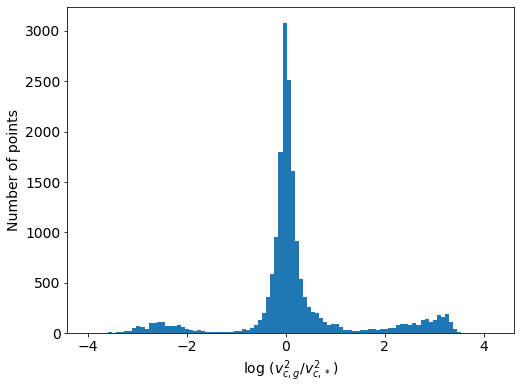

In [11]:
vdifferr_tot =vdifferr_list_flat +vdifferr_sc_list_flat
wtot  =  [1/np.square(x) for x in vdifferr_tot]
print(np.average(vidff_tot, weights=wtot))
print(statistics.median(vidff_tot))
print(statistics.mode(vidff_tot))

from matplotlib import rcParams
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Verdana']
rcParams.update({'font.size': 14})
bins = 100
plt.figure(figsize=(8,6))
weights = np.ones_like(vidff_tot) / len(vidff_tot)

counts, edges, bars = plt.hist(np.log10(vidff_tot), bins=bins)

plt.xlabel('log ($v^2_{c,g}/v^2_{c,*}$)')
plt.ylabel('Number of points')

plt.savefig('histogram.pdf') 

 49%|███████████████████▋                    | 547/1110 [00:08<00:17, 32.88it/s]

8258-9102


 58%|███████████████████████▏                | 642/1110 [00:12<00:20, 22.45it/s]

8445-3701


100%|███████████████████████████████████████| 1110/1110 [00:53<00:00, 20.66it/s]


Total number of points unscreened AD 4: 4241
Total number of points screened AD 4: 13963
Total number of points unscreened AD 8: 4241
Total number of points screened AD 8: 13963


100%|████████████████████████████████████| 10000/10000 [00:19<00:00, 503.16it/s]


chi= 1e-07
burn-in: 337
thin: 21
flat chain shape: 4760
flat log prob shape: 4600
None


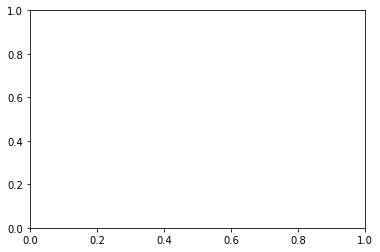

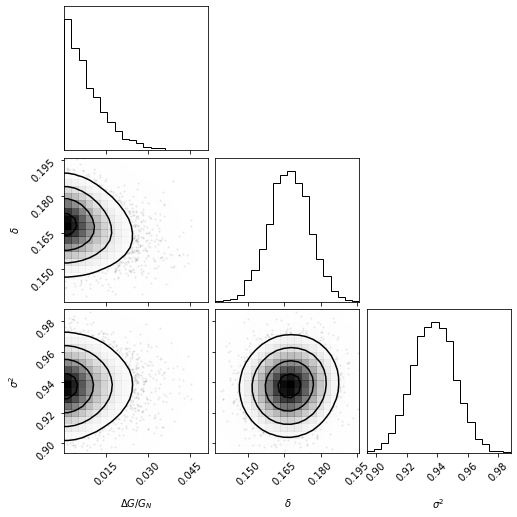

In [120]:

samplerA, samplerB, lenv = mcmc(1e-7,keep_data_chi2,0).run_mcmc()

alphaA,alphaAlo95,alphaAlo,alphaAhi,alphaAhi95, conA,conAlo95,conAlo,conAhi,conAhi95, sigmaA,sigmaAlo95,sigmaAlo,sigmaAhi,sigmaAhi95= mcmc(1e-9,keep_data_chi2, 0).plot_mcmc(samplerA)

100%|█████████████████████████████████████| 1110/1110 [00:01<00:00, 1068.70it/s]


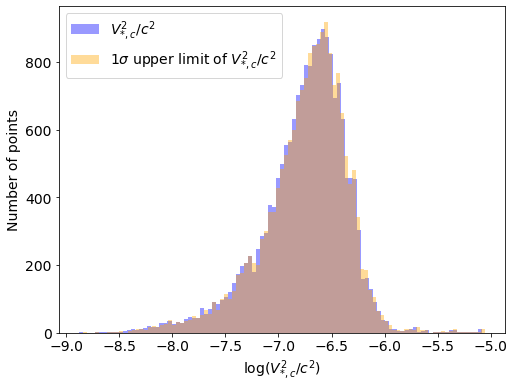

In [14]:
from matplotlib import rcParams
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Verdana']
rcParams.update({'font.size': 14})
bins = 100
plt.figure(figsize=(8,6))

v2list=[]
v2uplist = []
for i in tqdm(range(len(keep_data_chi2))):
    try:
        globals()[f'datas_{keep_data_chi2[i]}'] = read_files_pd(file_path=f'{outdir}/nirvana-manga-vstars2tot_intrinsic-{keep_data_chi2[i]}-HyperbolicTangent-Exponential-{dap_sciama}-SumQuadUpdate.txt')  
        rsf = globals()[f'datas_{keep_data_chi2[i]}'][0]
        v2sf=globals()[f'datas_{keep_data_chi2[i]}'][1]
        v2_errs=globals()[f'datas_{keep_data_chi2[i]}'][2]
        rs = [x for x in rsf if str(x)!='nan']
        v2sup = [(x+y)/(constants.c.value/1000)**2 for x,y in zip(v2sf,v2_errs) if str(x)!='nan']
        v2s = [x/(constants.c.value/1000)**2 for x in v2sf if str(x)!='nan']
        v2list.append(v2s)
        v2uplist.append(v2sup)
    except:
        pass
plt.hist(np.log10(sum(v2list,[])),bins=bins,alpha = 0.4,color='blue',label='$V_{*,c}^2/c^2$');
plt.hist(np.log10(sum(v2uplist,[])),bins=bins,alpha = 0.4, color='orange', label='1$\sigma$ upper limit of $V_{*,c}^2/c^2$');
plt.xlabel('log($V_{*,c}^2/c^2$)')    
    
plt.ylabel('Number of points')
plt.legend()
plt.savefig('histogram_v2star_intri.pdf') 

 49%|███████████████████▋                    | 546/1110 [00:15<00:26, 21.54it/s]

8258-9102


 58%|███████████████████████                 | 641/1110 [00:20<00:26, 17.69it/s]

8445-3701


100%|███████████████████████████████████████| 1110/1110 [01:12<00:00, 15.26it/s]


Total number of points unscreened AD 4: 1
Total number of points screened AD 4: 18203
Total number of points unscreened AD 8: 1
Total number of points screened AD 8: 18203


100%|████████████████████████████████████| 20000/20000 [00:37<00:00, 536.24it/s]


chi= 1e-10
burn-in: 158
thin: 21
flat chain shape: 9520
flat log prob shape: 9440
None


 49%|███████████████████▋                    | 546/1110 [00:15<00:24, 23.48it/s]

8258-9102


 58%|███████████████████████▏                | 642/1110 [00:20<00:24, 18.95it/s]

8445-3701


100%|███████████████████████████████████████| 1110/1110 [01:10<00:00, 15.78it/s]


Total number of points unscreened AD 4: 18
Total number of points screened AD 4: 18186
Total number of points unscreened AD 8: 18
Total number of points screened AD 8: 18186


100%|████████████████████████████████████| 20000/20000 [00:40<00:00, 493.73it/s]


chi= 1e-09
burn-in: 152
thin: 24
flat chain shape: 8330
flat log prob shape: 8270
None


 49%|███████████████████▋                    | 546/1110 [00:13<00:23, 23.97it/s]

8258-9102


 58%|███████████████████████▏                | 643/1110 [00:18<00:25, 18.21it/s]

8445-3701


100%|███████████████████████████████████████| 1110/1110 [01:07<00:00, 16.43it/s]


Total number of points unscreened AD 4: 371
Total number of points screened AD 4: 17833
Total number of points unscreened AD 8: 371
Total number of points screened AD 8: 17833


100%|████████████████████████████████████| 20000/20000 [00:42<00:00, 475.90it/s]


chi= 1e-08
burn-in: 315
thin: 31
flat chain shape: 6450
flat log prob shape: 6350
None


 49%|███████████████████▊                    | 549/1110 [00:10<00:19, 28.39it/s]

8258-9102


 58%|███████████████████████▏                | 642/1110 [00:14<00:23, 20.04it/s]

8445-3701


100%|███████████████████████████████████████| 1110/1110 [01:00<00:00, 18.38it/s]


Total number of points unscreened AD 4: 4241
Total number of points screened AD 4: 13963
Total number of points unscreened AD 8: 4241
Total number of points screened AD 8: 13963


100%|████████████████████████████████████| 20000/20000 [00:43<00:00, 458.10it/s]


chi= 1e-07
burn-in: 308
thin: 14
flat chain shape: 14280
flat log prob shape: 14060
None


 49%|███████████████████▋                    | 547/1110 [00:08<00:18, 30.05it/s]

8258-9102


 58%|███████████████████████                 | 641/1110 [00:12<00:21, 22.00it/s]

8445-3701


100%|███████████████████████████████████████| 1110/1110 [00:57<00:00, 19.30it/s]


Total number of points unscreened AD 4: 17699
Total number of points screened AD 4: 505
Total number of points unscreened AD 8: 17699
Total number of points screened AD 8: 505


100%|████████████████████████████████████| 20000/20000 [00:44<00:00, 447.99it/s]


chi= 1e-06
burn-in: 410
thin: 24
flat chain shape: 8330
flat log prob shape: 8160
None


 49%|███████████████████▊                    | 549/1110 [00:08<00:19, 28.90it/s]

8258-9102


 58%|███████████████████████▏                | 642/1110 [00:12<00:20, 22.88it/s]

8445-3701


100%|███████████████████████████████████████| 1110/1110 [00:57<00:00, 19.16it/s]


Total number of points unscreened AD 4: 18201
Total number of points screened AD 4: 3
Total number of points unscreened AD 8: 18201
Total number of points screened AD 8: 3


100%|████████████████████████████████████| 20000/20000 [00:44<00:00, 446.95it/s]


chi= 9.999999999999999e-06
burn-in: 166
thin: 30
flat chain shape: 6660
flat log prob shape: 6610
None


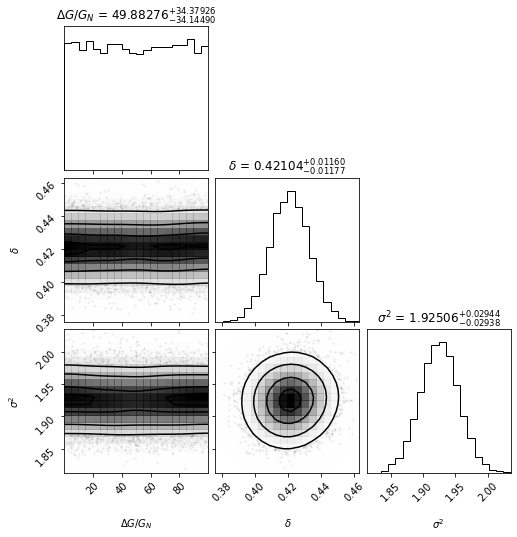

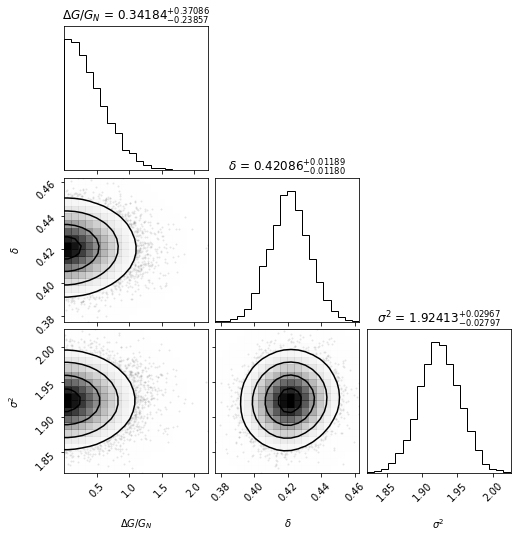

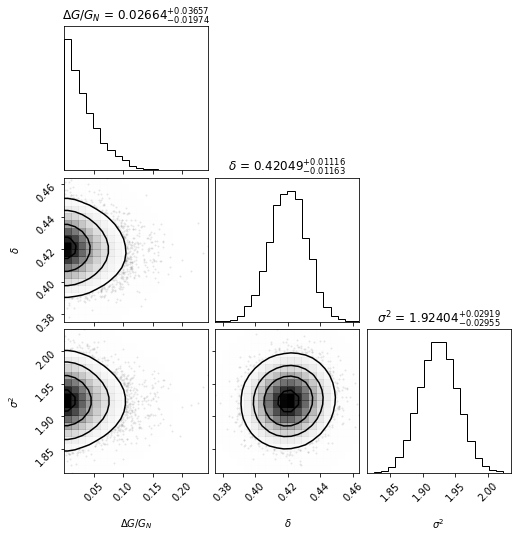

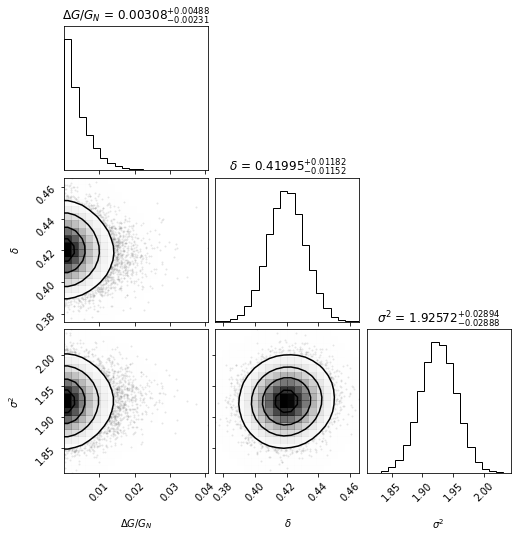

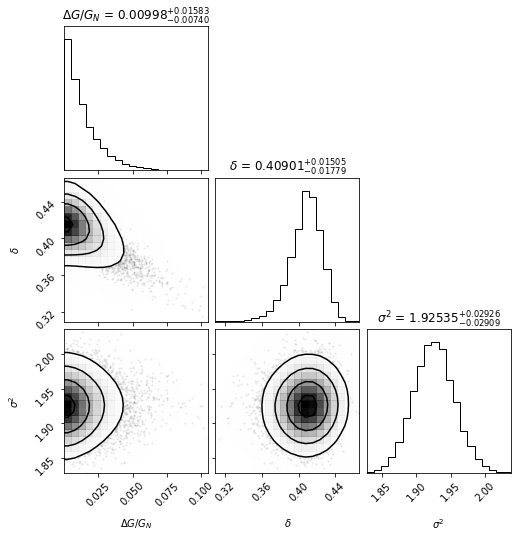

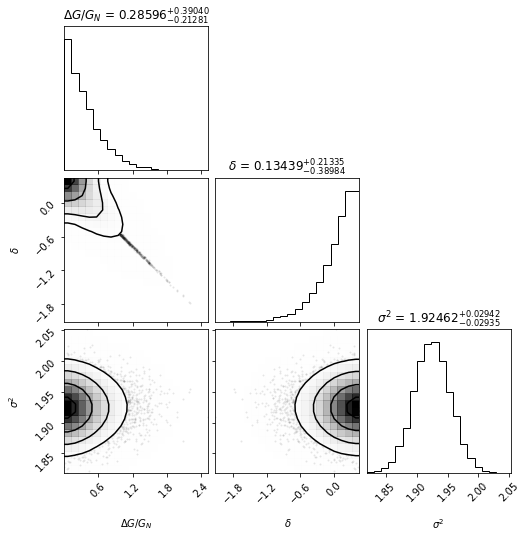

In [9]:
arr = np.linspace(1,10,2)
space = arr[::-1]
chi = [[x*10**(-6) for x in space],[x*10**(-7) for x in space],[x*10**(-8) for x in space],[x*10**(-9) for x in space],[x*10**(-10) for x in space]\
      ]
chif = np.sort(list(set(chi[0]+chi[1]+chi[2]+chi[3]+chi[4])))
alpha1mul = []
alpha2mul = []
sigma1mul=[]
sigma2mul=[]
con1 = []
con1err = []
con2 = []
con1errhi = []
con1errlo = []
con1errhi95 = []
con1errlo95 = []
listvdifflist_flat = []
alpha1errmulhi = []
alpha1errmullo = []
alpha1errmulhi95 = []
alpha1errmullo95 = []
alpha2errmul = []
sigma1errmulhi=[]
sigma1errmullo=[]
sigma1errmulhi95=[]
sigma1errmullo95=[]
sigma2errmul=[]
for x in chif:
    samplerA, samplerB,listv = mcmc(x,keep_data_chi2,0).run_mcmc()

    alphaA,alphaAlo95,alphaAlo,alphaAhi,alphaAhi95, conA,conAlo95,conAlo,conAhi,conAhi95, sigmaA,sigmaAlo95,sigmaAlo,sigmaAhi,sigmaAhi95 = mcmc(x,keep_data_chi2, 0, mult=True).plot_mcmc(samplerB)
    alpha1mul.append(alphaA)
    sigma1mul.append(sigmaA)
    con1.append(conA)
    listvdifflist_flat.append(listv)
    alpha1errmulhi.append(alphaAhi) 
    alpha1errmullo.append(alphaAlo)
    alpha1errmulhi95.append(alphaAhi95) 
    alpha1errmullo95.append(alphaAlo95)
    
    con1errhi.append(conAhi) 
    con1errlo.append(conAlo)
    con1errhi95.append(conAhi95) 
    con1errlo95.append(conAlo95)
    
    sigma1errmulhi.append(sigmaAhi) 
    sigma1errmullo.append(sigmaAlo)
    sigma1errmulhi95.append(sigmaAhi95) 
    sigma1errmullo95.append(sigmaAlo95)
        
#     alphaB,conB,sigmaB = mcmc(x,keep_data_chi2, 0, mult=True).plot_mcmc(samplerB)
#     alpha2mul.append(alphaB)
#     sigma2mul.append(sigmaB)
#     con2.append(conB)
 


In [10]:
data1 = np.column_stack([chif, alpha1mul, alpha1errmullo95, alpha1errmullo,alpha1errmulhi,alpha1errmulhi95, con1,con1errlo95, con1errlo,con1errhi,con1errhi95, sigma1mul,sigma1errmullo95, sigma1errmullo,sigma1errmulhi,sigma1errmulhi95,listvdifflist_flat])  
datafile_path1 = f'Mod1axis8hilo.dat'
np.savetxt(datafile_path1 , data1, fmt= ['%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e'])

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Verdana
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Verdana
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Verdana


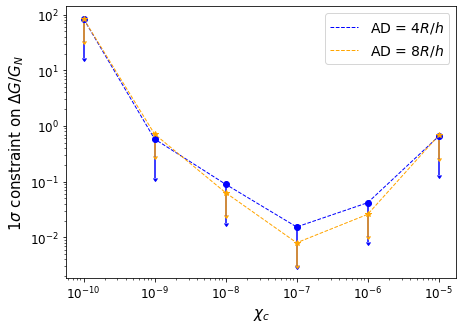

In [16]:
from numpy import *
from matplotlib import rcParams
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Verdana']
rcParams.update({'font.size': 15})
import matplotlib.pyplot as plt
plt.figure(figsize=(7,5))


chif, dG, dGlo95, dGlo,dGhi,dGhi95, con,conlo95, conlo,conhi,conhi95, sig,siglo95, siglo,sighi,sighi95,list_unsc = loadtxt('Mod1axis4hilo.dat', unpack=True)
chif10, dG10, dGlo9510, dGlo10,dGhi10,dGhi9510, con10,conlo9510, conlo10,conhi10,conhi9510, sig10,siglo9510, siglo10,sighi10,sighi9510,list_unsc10= loadtxt('Mod1axis8hilo.dat', unpack=True)


##############################
plt.semilogy(chif, dGhi, color='b', linewidth=1., label=r'AD = $4R/h$',linestyle='dashed')

x = [chif[i]  for i in range(len(chif)) ]
y = [dGhi[i] for i in range(len(dGhi)) ]
 
err = [dGhi[i]*0.8 for i in range(len(dGhi))]
#yerr = [err[i]  if i==2  or  i==15 else err[i]*5 for i in range(len(err))]
ls = 'dotted'
uplims = np.ones(len(x))


plt.errorbar(x ,y , yerr=err, uplims=uplims,fmt='o',
             color='b',capsize=2)


#############################################################

plt.semilogy(chif10, dGhi10, color='orange', linewidth=1., label=r'AD = $8R/h$',linestyle='dashed')

x = [chif10[i]  for i in range(len(chif10)) ]
y = [dGhi10[i] for i in range(len(dGhi10))   ]

err = [dGhi10[i]*0.6 for i in range(len(dGhi10))  ]
uplims = np.ones(len(x))


plt.errorbar(x ,y , yerr=err, uplims=uplims,fmt='*',
             color='orange',capsize=2)
    
plt.xlabel('$\\chi_c$',fontsize=15 )
plt.ylabel('1$\\sigma$ constraint on $\\Delta G/G_N$', fontsize=15 )
plt.legend(fontsize=14, loc='upper right', ncol=1 )
plt.xscale('log')
plt.yscale('log')
plt.savefig('ad.pdf',bbox_inches="tight") 


(array([0.95121, 0.95122, 0.95072, 0.95115, 0.95126, 0.95123]),
 array([1.9545, 1.9538, 1.9532, 1.9547, 1.9546, 1.954 ]))

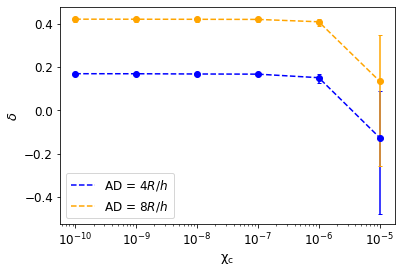

In [98]:
plt.rc('xtick',labelsize=12)
plt.rc('ytick',labelsize=12)

chif, dG, dGlo95, dGlo,dGhi,dGhi95, con,conlo95, conlo,conhi,conhi95, sig,siglo95, siglo,sighi,sighi95,list_unsc = loadtxt('Mod1axis4hilo.dat', unpack=True)
chif10, dG10, dGlo9510, dGlo10,dGhi10,dGhi9510, con10,conlo9510, conlo10,conhi10,conhi9510, sig10,siglo9510, siglo10,sighi10,sighi9510,list_unsc10= loadtxt('Mod1axis8hilo.dat', unpack=True)
ytop = conhi-con
ybot = con-conlo
plt.plot(chif, con, c='b',linestyle='dashed',label=r'AD = $4R/h$ ')
plt.errorbar(chif, con,yerr=(ybot, ytop),fmt='o', c='b',capsize=2)

ytop = conhi10-con10
ybot = con10-conlo10
plt.plot(chif10, con10, c='orange',linestyle='dashed', label=r'AD = $8R/h$ ')
plt.errorbar(chif10, con10,yerr=(ybot, ytop),fmt='o', c='orange',capsize=2)


plt.xlabel(r'$\rm \chi_c$',fontsize=13)
plt.ylabel(r'$ \delta$',fontsize=13)
plt.xscale('log')
plt.legend(fontsize=12)
plt.savefig('adsigmadelta.pdf',bbox_inches="tight") 
sighi, sighi10

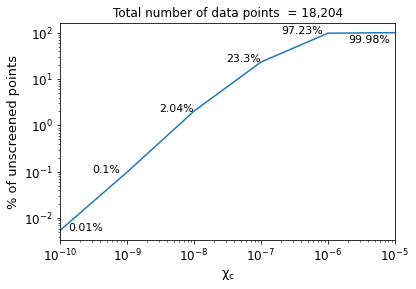

In [116]:
plt.rc('xtick',labelsize=12)
plt.rc('ytick',labelsize=12)

fig, ax = plt.subplots(figsize=(6, 4))

plt.plot(chif, [x/18204*100 for x in list_unsc])
plt.xlabel(r'$\rm \chi_c$',fontsize=13)
plt.ylabel('% of unscreened points',fontsize=13)
plt.xscale('log')
plt.yscale('log')
plt.xlim(1e-10, 1e-5)

A = [x/18204*100 for x in list_unsc]
B=chif
pos= [1.3,0.3,0.3,0.3,0.2,0.2]
posy= [1.0,1.0,1.0,1.0,1.0,0.6]
for i in range(len(chif)): 
    ax.annotate(f'{round(A[i],2)}%' , xy=(chif[i],A[i]),fontsize=11,xycoords='data', xytext=(pos[i]*chif[i],posy[i]*A[i])) 
plt.title('Total number of data points  = 18,204',fontsize=12)

plt.savefig('n_unscr.pdf',bbox_inches="tight") 

# Rotation curve - PolyEx // DC ExpBase

### Reduced chi2

In [12]:
keep_data_chi2f_poly = read_files_pd('/home/ricardo/Documents/codes/NIRVANA/keep_data_chi2_polyexp.txt')  
keep_data_chi2_poly= [keep_data_chi2f_poly[0][i] for i in range(len(keep_data_chi2f_poly))] 

In [13]:
plateifu_f, _, pot_mid, _ = \
            potential_env('/home/ricardo/Documents/codes/NIRVANA/nsa_dist_ra_dec.txt',0)

avrunsc, avrsc, vdifflist_flatff, vdifferr_list_flat, vdifflist_sc_flatff, vdifferr_sc_list_flat, avrunsc2, avrsc2, vdifflist_flat2, vdifferr_list_flat2, vdifflist_sc_flat2, vdifferr_sc_list_flat2 = mcmc(1e-7,keep_data_chi2_poly,0,func_rc='PolyEx', func_dc='ExpBase').final_rs()

vidff_tot = vdifflist_flatff+vdifflist_sc_flatff



 58%|███████████████████████▊                 | 577/991 [00:13<00:17, 23.55it/s]

8445-3701


 66%|███████████████████████████▏             | 657/991 [00:17<00:17, 19.60it/s]

8595-3704


100%|█████████████████████████████████████████| 991/991 [00:48<00:00, 20.24it/s]


In [14]:
vdifferr_tot =vdifferr_list_flat +vdifferr_sc_list_flat
wtot  =  [1/np.square(x) for x in vdifferr_tot]
print(np.average(vidff_tot, weights=wtot))
print(statistics.median(vidff_tot))
print(statistics.mode(vidff_tot))


0.1407383451559579
1.3826
0.0020000000000000018


 58%|███████████████████████▊                 | 575/991 [00:16<00:19, 21.21it/s]

8445-3701


 66%|███████████████████████████▏             | 657/991 [00:21<00:20, 15.99it/s]

8595-3704


100%|█████████████████████████████████████████| 991/991 [00:53<00:00, 18.39it/s]


Total number of points unscreened AD 4: 3
Total number of points screened AD 4: 16178
Total number of points unscreened AD 8: 3
Total number of points screened AD 8: 16178


100%|████████████████████████████████████| 20000/20000 [00:37<00:00, 539.53it/s]


chi= 1e-09
burn-in: 145
thin: 25
flat chain shape: 8000
flat log prob shape: 7940
None
5.200907869647237
0.5952512511051822


 58%|███████████████████████▊                 | 575/991 [00:16<00:20, 20.40it/s]

8445-3701


 66%|███████████████████████████▏             | 657/991 [00:21<00:21, 15.47it/s]

8595-3704


100%|█████████████████████████████████████████| 991/991 [00:54<00:00, 18.10it/s]


Total number of points unscreened AD 4: 20
Total number of points screened AD 4: 16161
Total number of points unscreened AD 8: 20
Total number of points screened AD 8: 16161


100%|████████████████████████████████████| 20000/20000 [00:41<00:00, 481.15it/s]


chi= 1e-08
burn-in: 149
thin: 24
flat chain shape: 8330
flat log prob shape: 8270
None
0.35811789213882894
-0.22656977925641042


 58%|███████████████████████▋                 | 574/991 [00:14<00:19, 21.67it/s]

8445-3701


 66%|███████████████████████████▏             | 656/991 [00:19<00:18, 17.93it/s]

8595-3704


100%|█████████████████████████████████████████| 991/991 [00:52<00:00, 18.94it/s]


Total number of points unscreened AD 4: 623
Total number of points screened AD 4: 15558
Total number of points unscreened AD 8: 623
Total number of points screened AD 8: 15558


100%|████████████████████████████████████| 20000/20000 [00:40<00:00, 497.56it/s]


chi= 1e-07
burn-in: 142
thin: 22
flat chain shape: 9090
flat log prob shape: 9020
None
0.03421865094886473
-0.05246054778218481


 58%|███████████████████████▉                 | 578/991 [00:09<00:14, 28.11it/s]

8445-3701


 66%|███████████████████████████▏             | 657/991 [00:12<00:14, 23.43it/s]

8595-3704


100%|█████████████████████████████████████████| 991/991 [00:40<00:00, 24.76it/s]


Total number of points unscreened AD 4: 7893
Total number of points screened AD 4: 8288
Total number of points unscreened AD 8: 7893
Total number of points screened AD 8: 8288


100%|████████████████████████████████████| 20000/20000 [00:46<00:00, 429.31it/s]


chi= 1e-06
burn-in: 127
thin: 15
flat chain shape: 13330
flat log prob shape: 13240
None
0.335097992870796
0.30000246181464685


 58%|███████████████████████▊                 | 577/991 [00:08<00:14, 28.82it/s]

8445-3701


 66%|███████████████████████████▎             | 659/991 [00:12<00:14, 22.40it/s]

8595-3704


100%|█████████████████████████████████████████| 991/991 [00:39<00:00, 25.19it/s]


Total number of points unscreened AD 4: 15287
Total number of points screened AD 4: 894
Total number of points unscreened AD 8: 15287
Total number of points screened AD 8: 894


100%|████████████████████████████████████| 20000/20000 [00:43<00:00, 455.12it/s]


chi= 9.999999999999999e-06
burn-in: 304
thin: 30
flat chain shape: 6660
flat log prob shape: 6560
None
0.8648288553790396
0.7903303329830252


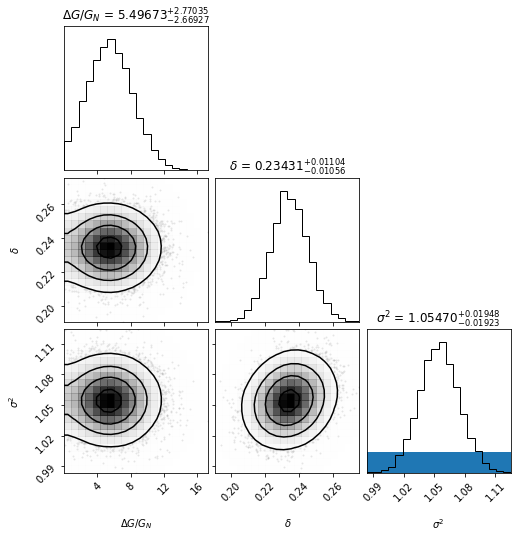

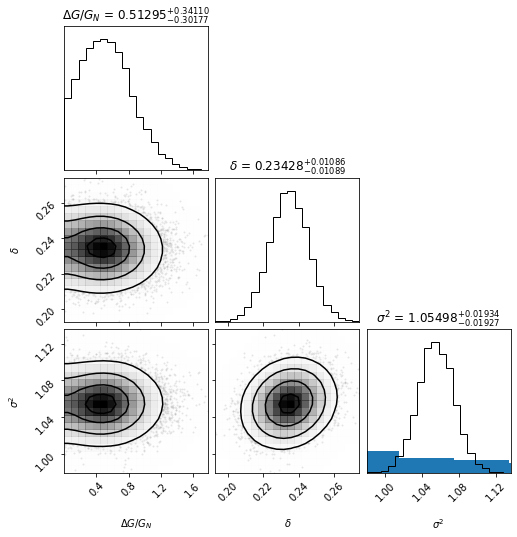

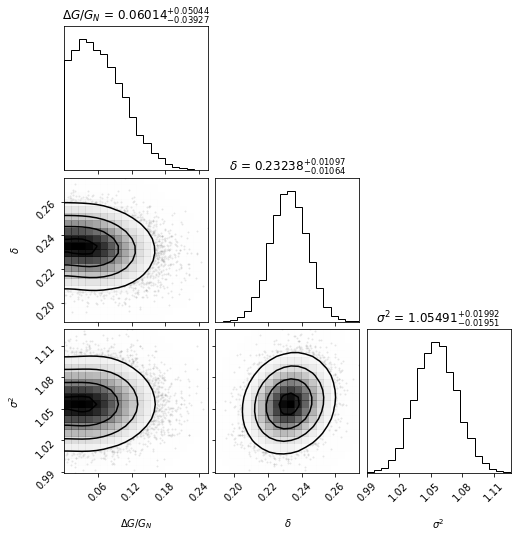

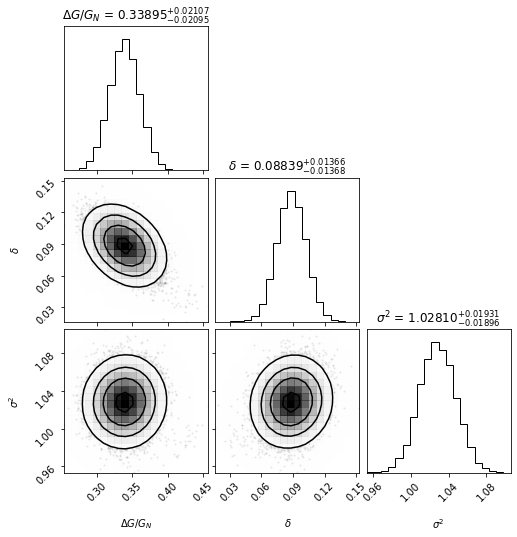

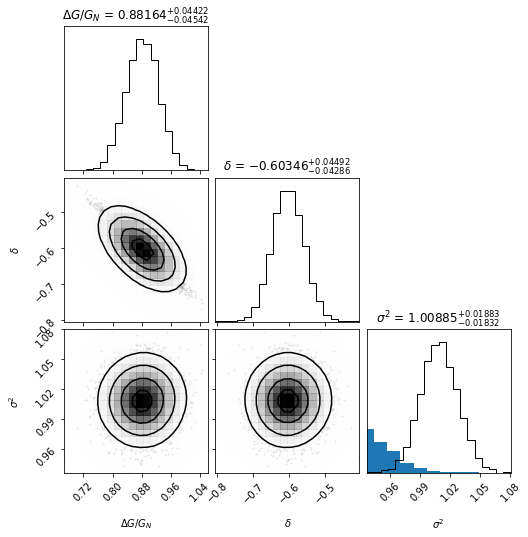

In [10]:
arr = np.linspace(1,10,2)
space = arr[::-1]
chi = [[x*10**(-6) for x in space],[x*10**(-7) for x in space],[x*10**(-8) for x in space],[x*10**(-9) for x in space]\
      ]
chif = np.sort(list(set(chi[0]+chi[1]+chi[2]+chi[3])))
alpha1mul = []
alpha2mul = []
sigma1mul=[]
sigma2mul=[]
con1 = []
con1err = []
con2 = []
con1errhi = []
con1errlo = []
con1errhi95 = []
con1errlo95 = []
listvdifflist_flat = []
alpha1errmulhi = []
alpha1errmullo = []
alpha1errmulhi95 = []
alpha1errmullo95 = []
alpha2errmul = []
sigma1errmulhi=[]
sigma1errmullo=[]
sigma1errmulhi95=[]
sigma1errmullo95=[]
sigma2errmul=[]
for x in chif:
    samplerA, samplerB,listv = mcmc(x,keep_data_chi2_poly,pot_mid=0,func_rc='PolyEx', func_dc='ExpBase').run_mcmc()

    alphaA,alphaAlo95,alphaAlo,alphaAhi,alphaAhi95, conA,conAlo95,conAlo,conAhi,conAhi95, sigmaA,sigmaAlo95,sigmaAlo,sigmaAhi,sigmaAhi95 = mcmc(x,keep_data_chi2_poly,pot_mid=0,func_rc='PolyEx', func_dc='ExpBase').plot_mcmc(samplerA)
    alpha1mul.append(alphaA)
    sigma1mul.append(sigmaA)
    con1.append(conA)
    listvdifflist_flat.append(listv)
    alpha1errmulhi.append(alphaAhi) 
    alpha1errmullo.append(alphaAlo)
    alpha1errmulhi95.append(alphaAhi95) 
    alpha1errmullo95.append(alphaAlo95)
    
    con1errhi.append(conAhi) 
    con1errlo.append(conAlo)
    con1errhi95.append(conAhi95) 
    con1errlo95.append(conAlo95)
    
    sigma1errmulhi.append(sigmaAhi) 
    sigma1errmullo.append(sigmaAlo)
    sigma1errmulhi95.append(sigmaAhi95) 
    sigma1errmullo95.append(sigmaAlo95)
    
    tau = samplerA.get_autocorr_time()

    burnin = int(2 * np.max(tau))
    thin = int(0.5 * np.min(tau))

    flat_samples = samplerA.get_chain(discard=burnin, thin=thin, flat=True)
    alphat= [flat_samples[i][0] for i in range(len(flat_samples))]
    y, x, _ =plt.hist(alphat,bins=30);
    maxalp = x[np.where(y == y.max())][0]
    print(maxalp)
    print(maxalp +alphaA -alphaAhi95)
 



In [ ]:
data1 = np.column_stack([chif, alpha1mul, alpha1errmullo95, alpha1errmullo,alzpha1errmulhi,alpha1errmulhi95, con1,con1errlo95, con1errlo,con1errhi,con1errhi95, sigma1mul,sigma1errmullo95, sigma1errmullo,sigma1errmulhi,sigma1errmulhi95,listvdifflist_flat])  
datafile_path1 = f'Mod2axis4hilo.dat'
np.savetxt(datafile_path1 , data1, fmt= ['%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e'])

[5.49329818e-03 9.88793672e-02 2.03801362e+00 2.32970776e+01
 9.72258844e+01 9.99835201e+01]
[1.85402633e-02 1.23601755e-01 3.85019467e+00 4.87794327e+01
 9.44750015e+01]


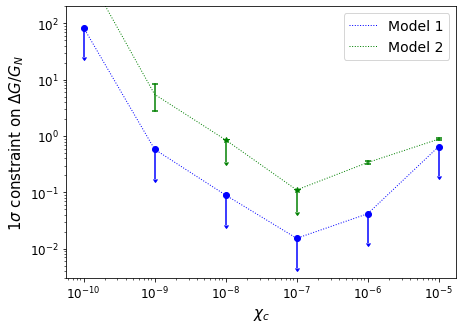

In [17]:
from matplotlib import rcParams
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Verdana']
rcParams.update({'font.size': 15})
import matplotlib.pyplot as plt
from numpy import *

plt.figure(figsize=(7,5))

chif, dG, dGlo95, dGlo,dGhi,dGhi95, con,conlo95, conlo,conhi,conhi95, sig,siglo95, siglo,sighi,sighi95,list_unsc = loadtxt('Mod1axis4hilo.dat', unpack=True)
chif10, dG10, dGlo9510, dGlo10,dGhi10,dGhi9510, con10,conlo9510, conlo10,conhi10,conhi9510, sig10,siglo9510, siglo10,sighi10,sighi9510,list_unsc10= loadtxt('Mod2axis4hilo.dat', unpack=True)

chif10_div = chif10.tolist()
chif10_div.insert(0, chif[0])
dGhi10f= dGhi10.tolist()
dGhi10f[0] = dG10[0]
dGhi10f[3] = dG10[3]
dGhi10f[4] = dG10[4]
dGhi10f.insert(0, 1000)

##############################
plt.semilogy(chif, dGhi, color='b', linewidth=1., label=r'Model 1',linestyle='dotted')

x = [chif[i]  for i in range(len(chif)) ]
y = [dGhi[i] for i in range(len(dGhi)) ]
 
err = [dGhi[i]*0.7 for i in range(len(dGhi))]
#yerr = [err[i]  if i==2  or  i==15 else err[i]*5 for i in range(len(err))]
ls = 'dotted'
uplims = np.ones(len(x))


plt.errorbar(x ,y , yerr=err, uplims=uplims,fmt='o',
             color='b',capsize=2)

#############################################################
plt.semilogy(chif10_div, dGhi10f, color='green', linewidth=1., label=r'Model 2',linestyle='dotted')

x = [chif10[i]  for i in range(len(chif10)) if i != 0 and i !=3 and i!=4 ]
y = [dGhi10[i] for i in range(len(dGhi10)) if i !=0 and i !=3 and i!=4 ]

err = [dGhi10[i]*0.6 for i in range(len(dGhi10)) if i !=0 and i !=3 and i!=4 ]
uplims = np.ones(len(x))


plt.errorbar(x ,y , yerr=err, uplims=uplims,fmt='*',
             color='green',capsize=2)

 
dGlof10 = [dGlo10[i] for i in range(len(dGlo10)) if i ==0 or i ==3 or i==4 ]
dGhif10 = [dGhi10[i]  for i in range(len(dGhi10)) if i ==0 or i ==3 or i==4 ]
lc10lo = [chif10[i]  for i in range(len(chif10)) if i ==0 or i ==3 or i==4 ]

plt.scatter(lc10lo, dGhif10,c='green', marker='_')
plt.scatter(lc10lo, dGlof10,c='green', marker='_')
plt.plot((lc10lo,lc10lo),([i for i in dGlof10], [j for j in dGhif10]),c='green')
    
plt.xlabel('$\\chi_c$',fontsize=15 )
plt.ylabel('1$\\sigma$ constraint on $\\Delta G/G_N$', fontsize=15 )
plt.legend(fontsize=14, loc='upper right', ncol=1 )
plt.xscale('log')
plt.yscale('log')
plt.ylim(3e-3,2e2)
plt.savefig('models.pdf',bbox_inches="tight") 

print(list_unsc/18204*100)
print(list_unsc10/16181*100)

(array([0.93739, 0.93767, 0.93666, 0.93733, 0.93748, 0.93705]),
 array([0.95121, 0.95122, 0.95072, 0.95115, 0.95126, 0.95123]),
 array([1.0547, 1.055 , 1.0549, 1.0281, 1.0088]),
 array([1.0742, 1.0743, 1.0748, 1.0474, 1.0277]))

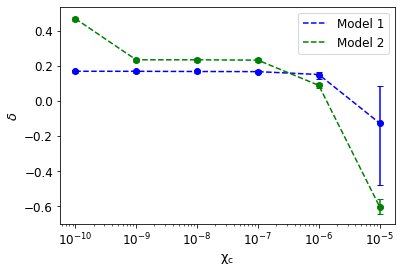

In [21]:
plt.rc('xtick',labelsize=12)
plt.rc('ytick',labelsize=12)

chif, dG, dGlo95, dGlo,dGhi,dGhi95, con,conlo95, conlo,conhi,conhi95, sig,siglo95, siglo,sighi,sighi95,list_unsc = loadtxt('Mod1axis4hilo.dat', unpack=True)
chif10, dG10, dGlo9510, dGlo10,dGhi10,dGhi9510, con10,conlo9510, conlo10,conhi10,conhi9510, sig10,siglo9510, siglo10,sighi10,sighi9510,list_unsc10= loadtxt('Mod2axis4hilo.dat', unpack=True)


chif, dG, dGlo95, dGlo,dGhi,dGhi95, con,conlo95, conlo,conhi,conhi95, sig,siglo95, siglo,sighi,sighi95,list_unsc = loadtxt('Mod1axis4hilo.dat', unpack=True)
chif10, dG10, dGlo9510, dGlo10,dGhi10,dGhi9510, con10,conlo9510, conlo10,conhi10,conhi9510, sig10,siglo9510, siglo10,sighi10,sighi9510,list_unsc10= loadtxt('Mod2axis4hilo.dat', unpack=True)

ytop = conhi-con
ybot = con-conlo
plt.plot(chif, con, c='b',linestyle='dashed',label='Model 1')
plt.errorbar(chif, con,yerr=(ybot, ytop),fmt='o', c='b',capsize=3)

con10f=con10.tolist()
conhi10f=conhi10.tolist()
conlo10f=conlo10.tolist()
con10f.insert(0,0.4690)
conhi10f.insert(0,0.4803)
conlo10f.insert(0,0.45791)

ytop = np.array(conhi10f)-np.array(con10f)
ybot = np.array(con10f)-np.array(conlo10f)

plt.plot(chif, con10f, c='green',linestyle='dashed', label=r'Model 2')
plt.errorbar(chif, con10f,yerr=(ybot, ytop),fmt='o', c='green',capsize=3)

plt.xlabel(r'$\rm \chi_c$',fontsize=13)
plt.ylabel(r'$\delta $',fontsize=13)
plt.xscale('log')
plt.legend(fontsize=12)
plt.savefig('modelsdeltasigma.pdf',bbox_inches="tight") 
sig,sighi, sig10,sighi10

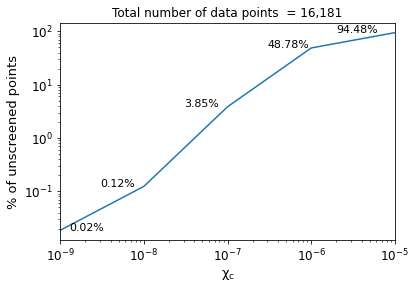

In [28]:
plt.rc('xtick',labelsize=12)
plt.rc('ytick',labelsize=12)

fig, ax = plt.subplots(figsize=(6, 4))

plt.plot(chif10, [x/16181*100 for x in list_unsc10])
plt.xlabel(r'$\rm \chi_c$',fontsize=13)
plt.ylabel('% of unscreened points',fontsize=13)
plt.xscale('log')
plt.yscale('log')
plt.xlim(1e-9, 1e-5)

A = [x/16181*100 for x in list_unsc10]
B=chif10
pos= [1.3,0.3,0.3,0.3,0.2]
posy= [1.0,1.0,1.0,1.0,1.0]
for i in range(len(chif10)): 
    ax.annotate(f'{round(A[i],2)}%' , xy=(chif10[i],A[i]),fontsize=11,xycoords='data', xytext=(pos[i]*chif10[i],posy[i]*A[i])) 
plt.title('Total number of data points  = 16,181',fontsize=12)

plt.savefig('n_unscr2.pdf',bbox_inches="tight") 

# Environmental screening

In [74]:
ind_hs = np.arange(0,20, 1)
chihs = chi_hs(ind_hs).tolist()                      
ind_hsf= ind_hs.tolist()

def plot_env_hs(plateifu_f,chihs, poly=False): 
    alpha1mul = []
    alpha2mul = []
    sigma1mul=[]
    sigma2mul=[]
    con1 = []
    con1err = []
    con2 = []
    con1errhi = []
    con1errlo = []
    con1errhi95 = []
    con1errlo95 = []
    listvdifflist_flat = []
    alpha1errmulhi = []
    alpha1errmullo = []
    alpha1errmulhi95 = []
    alpha1errmullo95 = []
    alpha2errmul = []
    sigma1errmulhi=[]
    sigma1errmullo=[]
    sigma1errmulhi95=[]
    sigma1errmullo95=[]
    sigma2errmul=[]
    chilist = []
    indexi=[]
    for i in range(len(chihs)):
        try:
            if poly==True:
                plateifu_f, pot_mid =  potential_env_poly(ind_hsf[i]) 
                samplerA, samplerB, lenv = mcmc(chihs[i],plateifu_f,pot_mid,envsc=True, func_rc='PolyEx', func_dc='ExpBase').run_mcmc()

                alphaA,alphaAlo95,alphaAlo,alphaAhi,alphaAhi95, conA,conAlo95,conAlo,conAhi,conAhi95, sigmaA,sigmaAlo95,sigmaAlo,sigmaAhi,sigmaAhi95  = mcmc(chihs[i],plateifu_f,pot_mid, envsc=True, func_rc='PolyEx', func_dc='ExpBase').plot_mcmc(samplerA)
                alpha1mul.append(alphaA)
                sigma1mul.append(sigmaA)
                con1.append(conA)
                listvdifflist_flat.append(lenv)
                alpha1errmulhi.append(alphaAhi) 
                alpha1errmullo.append(alphaAlo)
                alpha1errmulhi95.append(alphaAhi95) 
                alpha1errmullo95.append(alphaAlo95)

                con1errhi.append(conAhi) 
                con1errlo.append(conAlo)
                con1errhi95.append(conAhi95) 
                con1errlo95.append(conAlo95)

                sigma1errmulhi.append(sigmaAhi) 
                sigma1errmullo.append(sigmaAlo)
                sigma1errmulhi95.append(sigmaAhi95) 
                sigma1errmullo95.append(sigmaAlo95)
                chilist.append(chihs[i])
                tau = samplerA.get_autocorr_time()

                burnin = int(2 * np.max(tau))
                thin = int(0.5 * np.min(tau))

                flat_samples = samplerA.get_chain(discard=burnin, thin=thin, flat=True)
                alphat= [flat_samples[i][0] for i in range(len(flat_samples))]
                y, x, _ =plt.hist(alphat,bins=30);
                maxalp = x[np.where(y == y.max())][0]
                print(maxalp)
                print(maxalp +alphaA -alphaAhi95)
            else:
                plateifu_f, _, pot_mid, _ = \
            potential_env('/home/ricardo/Documents/codes/NIRVANA/nsa_dist_ra_dec.txt',ind_hsf[i])
            
                samplerA, samplerB, lenv = mcmc(chihs[i],plateifu_f,pot_mid,envsc=True).run_mcmc()

                alphaA,alphaAlo95,alphaAlo,alphaAhi,alphaAhi95, conA,conAlo95,conAlo,conAhi,conAhi95, sigmaA,sigmaAlo95,sigmaAlo,sigmaAhi,sigmaAhi95  = mcmc(chihs[i],plateifu_f,pot_mid, envsc=True).plot_mcmc(samplerA)
 
                alpha1mul.append(alphaA)
                sigma1mul.append(sigmaA)
                con1.append(conA)
                listvdifflist_flat.append(lenv)
                alpha1errmulhi.append(alphaAhi) 
                alpha1errmullo.append(alphaAlo)
                alpha1errmulhi95.append(alphaAhi95) 
                alpha1errmullo95.append(alphaAlo95)

                con1errhi.append(conAhi) 
                con1errlo.append(conAlo)
                con1errhi95.append(conAhi95) 
                con1errlo95.append(conAlo95)

                sigma1errmulhi.append(sigmaAhi) 
                sigma1errmullo.append(sigmaAlo)
                sigma1errmulhi95.append(sigmaAhi95) 
                sigma1errmullo95.append(sigmaAlo95)
                chilist.append(chihs[i])
                tau = samplerA.get_autocorr_time()

                burnin = int(2 * np.max(tau))
                thin = int(0.5 * np.min(tau))

                flat_samples = samplerA.get_chain(discard=burnin, thin=thin, flat=True)
                alphat= [flat_samples[i][0] for i in range(len(flat_samples))]
                y, x, _ =plt.hist(alphat,bins=30);
                maxalp = x[np.where(y == y.max())][0]
                
                if maxalp +alphaA -alphaAhi95>0:
                    indexi.append(i)
    
        except:
            print(chihs[i])
            pass
    return indexi, chilist, alpha1mul, alpha1errmullo95, alpha1errmullo,alpha1errmulhi,alpha1errmulhi95, con1,con1errlo95, con1errlo,con1errhi,con1errhi95, sigma1mul,sigma1errmullo95, sigma1errmullo,sigma1errmulhi,sigma1errmulhi95,listvdifflist_flat


 59%|████████████████████████                 | 538/919 [00:19<00:23, 16.14it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:49<00:00, 18.65it/s]


Total number of points unscreened AD 4: 857
Total number of points screened AD 4: 14039
Total number of points unscreened AD 8: 857
Total number of points screened AD 8: 14039


100%|████████████████████████████████████| 20000/20000 [00:34<00:00, 587.49it/s]


chi= 2.3437500000000004e-08
burn-in: 177
thin: 14
flat chain shape: 14280
flat log prob shape: 14150
None


 59%|████████████████████████                 | 540/919 [00:09<00:12, 30.44it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:32<00:00, 28.11it/s]


Total number of points unscreened AD 4: 2022
Total number of points screened AD 4: 12874
Total number of points unscreened AD 8: 2022
Total number of points screened AD 8: 12874


100%|████████████████████████████████████| 20000/20000 [00:33<00:00, 602.22it/s]


chi= 9.375000000000002e-08
burn-in: 189
thin: 23
flat chain shape: 8690
flat log prob shape: 8610
None


 59%|████████████████████████                 | 540/919 [00:10<00:13, 28.77it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:34<00:00, 27.02it/s]


Total number of points unscreened AD 4: 2460
Total number of points screened AD 4: 12436
Total number of points unscreened AD 8: 2460
Total number of points screened AD 8: 12436


100%|████████████████████████████████████| 20000/20000 [00:33<00:00, 593.60it/s]


chi= 2.1093750000000002e-07
burn-in: 229
thin: 25
flat chain shape: 8000
flat log prob shape: 7900
None


 59%|████████████████████████                 | 540/919 [00:13<00:12, 30.37it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:42<00:00, 21.48it/s]


Total number of points unscreened AD 4: 4012
Total number of points screened AD 4: 10884
Total number of points unscreened AD 8: 4012
Total number of points screened AD 8: 10884


100%|████████████████████████████████████| 20000/20000 [00:56<00:00, 355.02it/s]


chi= 3.7500000000000006e-07
burn-in: 211
thin: 19
flat chain shape: 10520
flat log prob shape: 10410
None


 59%|████████████████████████                 | 538/919 [00:16<00:19, 19.18it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:48<00:00, 18.95it/s]


Total number of points unscreened AD 4: 5551
Total number of points screened AD 4: 9345
Total number of points unscreened AD 8: 5551
Total number of points screened AD 8: 9345


100%|████████████████████████████████████| 20000/20000 [00:55<00:00, 361.43it/s]


chi= 5.859375000000001e-07
burn-in: 325
thin: 21
flat chain shape: 9520
flat log prob shape: 9360
None


 59%|████████████████████████                 | 538/919 [00:10<00:18, 20.95it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:43<00:00, 21.33it/s]


Total number of points unscreened AD 4: 6862
Total number of points screened AD 4: 8034
Total number of points unscreened AD 8: 6862
Total number of points screened AD 8: 8034


100%|████████████████████████████████████| 20000/20000 [00:54<00:00, 365.25it/s]


chi= 8.437500000000001e-07
burn-in: 307
thin: 21
flat chain shape: 9520
flat log prob shape: 9370
None


 59%|████████████████████████                 | 538/919 [00:14<00:18, 20.38it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:44<00:00, 20.71it/s]


Total number of points unscreened AD 4: 8225
Total number of points screened AD 4: 6671
Total number of points unscreened AD 8: 8225
Total number of points screened AD 8: 6671


100%|████████████████████████████████████| 20000/20000 [00:48<00:00, 408.57it/s]


chi= 1.1484375000000002e-06
burn-in: 166
thin: 27
flat chain shape: 7400
flat log prob shape: 7340
None


 59%|████████████████████████                 | 539/919 [00:14<00:18, 20.54it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:50<00:00, 18.19it/s]


Total number of points unscreened AD 4: 8600
Total number of points screened AD 4: 6296
Total number of points unscreened AD 8: 8600
Total number of points screened AD 8: 6296


100%|████████████████████████████████████| 20000/20000 [00:54<00:00, 369.68it/s]


chi= 1.4999999999999998e-06
burn-in: 219
thin: 24
flat chain shape: 8330
flat log prob shape: 8240
None


 59%|████████████████████████                 | 539/919 [00:13<00:17, 21.54it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:48<00:00, 18.77it/s]


Total number of points unscreened AD 4: 9184
Total number of points screened AD 4: 5712
Total number of points unscreened AD 8: 9184
Total number of points screened AD 8: 5712


100%|████████████████████████████████████| 20000/20000 [00:54<00:00, 368.78it/s]


chi= 1.8984374999999996e-06
burn-in: 167
thin: 28
flat chain shape: 7140
flat log prob shape: 7080
None


 59%|████████████████████████                 | 540/919 [00:13<00:17, 21.11it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:49<00:00, 18.59it/s]


Total number of points unscreened AD 4: 9485
Total number of points screened AD 4: 5411
Total number of points unscreened AD 8: 9485
Total number of points screened AD 8: 5411


100%|████████████████████████████████████| 20000/20000 [00:55<00:00, 357.23it/s]


chi= 2.3437499999999994e-06
burn-in: 277
thin: 23
flat chain shape: 8690
flat log prob shape: 8570
None


 59%|████████████████████████                 | 539/919 [00:13<00:20, 18.87it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:48<00:00, 18.89it/s]


Total number of points unscreened AD 4: 10054
Total number of points screened AD 4: 4842
Total number of points unscreened AD 8: 10054
Total number of points screened AD 8: 4842


100%|████████████████████████████████████| 20000/20000 [01:00<00:00, 330.91it/s]


chi= 2.8359375000000003e-06
burn-in: 181
thin: 21
flat chain shape: 9520
flat log prob shape: 9430
None


 59%|████████████████████████                 | 539/919 [00:13<00:20, 18.36it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:50<00:00, 18.22it/s]


Total number of points unscreened AD 4: 9986
Total number of points screened AD 4: 4910
Total number of points unscreened AD 8: 9986
Total number of points screened AD 8: 4910


100%|████████████████████████████████████| 20000/20000 [00:46<00:00, 429.05it/s]


chi= 3.3750000000000003e-06
burn-in: 271
thin: 19
flat chain shape: 10520
flat log prob shape: 10380
None


 59%|████████████████████████                 | 540/919 [00:13<00:18, 20.14it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:48<00:00, 18.76it/s]


Total number of points unscreened AD 4: 10188
Total number of points screened AD 4: 4708
Total number of points unscreened AD 8: 10188
Total number of points screened AD 8: 4708


100%|████████████████████████████████████| 20000/20000 [00:52<00:00, 383.60it/s]


chi= 3.9609375000000006e-06
burn-in: 166
thin: 26
flat chain shape: 7690
flat log prob shape: 7620
None


 59%|████████████████████████                 | 538/919 [00:10<00:19, 19.77it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:46<00:00, 19.73it/s]


Total number of points unscreened AD 4: 10379
Total number of points screened AD 4: 4517
Total number of points unscreened AD 8: 10379
Total number of points screened AD 8: 4517


100%|████████████████████████████████████| 20000/20000 [00:55<00:00, 358.74it/s]


chi= 4.593750000000001e-06
burn-in: 176
thin: 27
flat chain shape: 7400
flat log prob shape: 7340
None


 59%|████████████████████████                 | 539/919 [00:13<00:20, 18.61it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:39<00:00, 23.55it/s]


Total number of points unscreened AD 4: 10579
Total number of points screened AD 4: 4317
Total number of points unscreened AD 8: 10579
Total number of points screened AD 8: 4317


100%|████████████████████████████████████| 20000/20000 [00:37<00:00, 532.68it/s]


chi= 5.2734375e-06
burn-in: 246
thin: 21
flat chain shape: 9520
flat log prob shape: 9400
None


 59%|████████████████████████                 | 538/919 [00:13<00:19, 19.76it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:48<00:00, 18.94it/s]


Total number of points unscreened AD 4: 10657
Total number of points screened AD 4: 4239
Total number of points unscreened AD 8: 10657
Total number of points screened AD 8: 4239


100%|████████████████████████████████████| 20000/20000 [00:56<00:00, 354.42it/s]


chi= 6.000000000000001e-06
burn-in: 277
thin: 19
flat chain shape: 10520
flat log prob shape: 10380
None


 59%|████████████████████████                 | 538/919 [00:13<00:19, 19.10it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:48<00:00, 18.76it/s]


Total number of points unscreened AD 4: 10594
Total number of points screened AD 4: 4302
Total number of points unscreened AD 8: 10594
Total number of points screened AD 8: 4302


100%|████████████████████████████████████| 20000/20000 [00:56<00:00, 351.83it/s]


chi= 6.773437500000001e-06
burn-in: 276
thin: 20
flat chain shape: 10000
flat log prob shape: 9860
None


 58%|███████████████████████▉                 | 537/919 [00:13<00:19, 19.69it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:49<00:00, 18.44it/s]


Total number of points unscreened AD 4: 10720
Total number of points screened AD 4: 4176
Total number of points unscreened AD 8: 10720
Total number of points screened AD 8: 4176


100%|████████████████████████████████████| 20000/20000 [00:51<00:00, 388.33it/s]


chi= 7.593750000000001e-06
burn-in: 138
thin: 29
flat chain shape: 6890
flat log prob shape: 6840
None


 59%|████████████████████████                 | 540/919 [00:07<00:10, 35.50it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:27<00:00, 33.70it/s]


Total number of points unscreened AD 4: 10763
Total number of points screened AD 4: 4133
Total number of points unscreened AD 8: 10763
Total number of points screened AD 8: 4133


100%|████████████████████████████████████| 20000/20000 [00:43<00:00, 456.26it/s]


chi= 8.460937500000002e-06
burn-in: 156
thin: 26
flat chain shape: 7690
flat log prob shape: 7630
None


 58%|███████████████████████▉                 | 537/919 [00:12<00:19, 19.64it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:48<00:00, 18.99it/s]


Total number of points unscreened AD 4: 10725
Total number of points screened AD 4: 4171
Total number of points unscreened AD 8: 10725
Total number of points screened AD 8: 4171


100%|████████████████████████████████████| 20000/20000 [00:58<00:00, 339.89it/s]


chi= 9.375000000000001e-06
burn-in: 134
thin: 29
flat chain shape: 6890
flat log prob shape: 6850
None


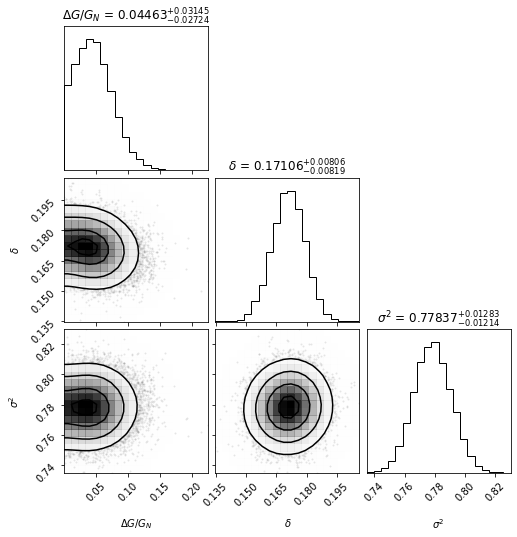

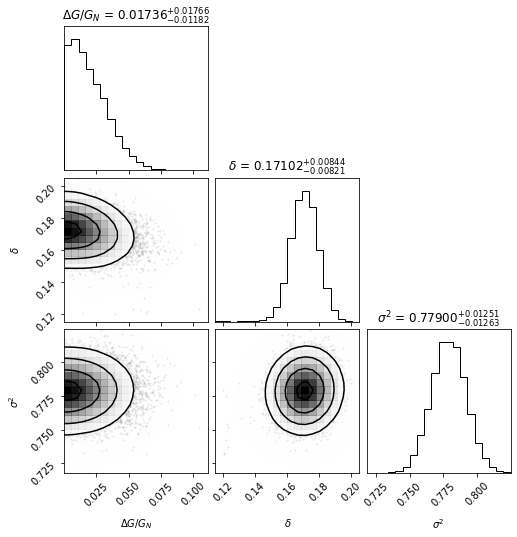

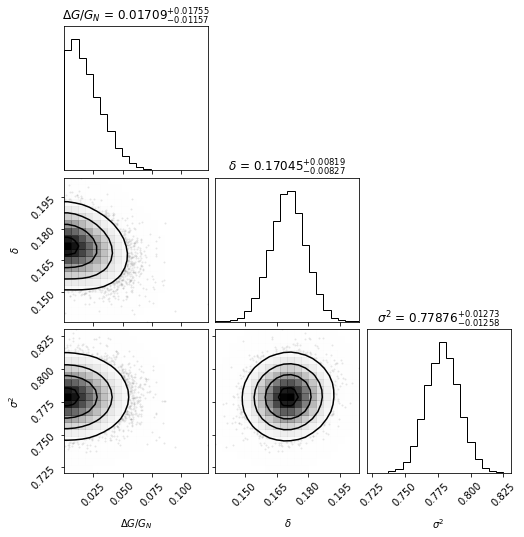

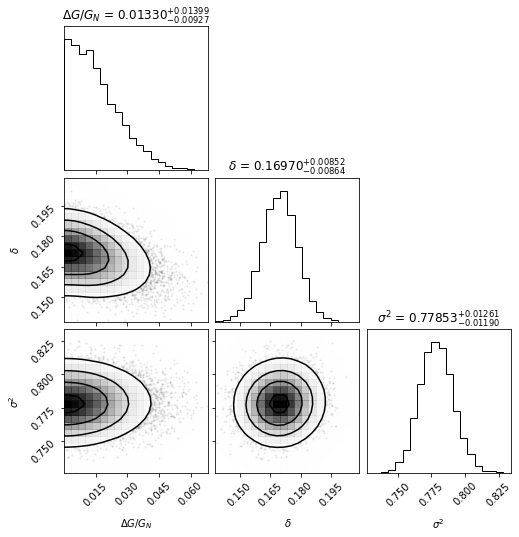

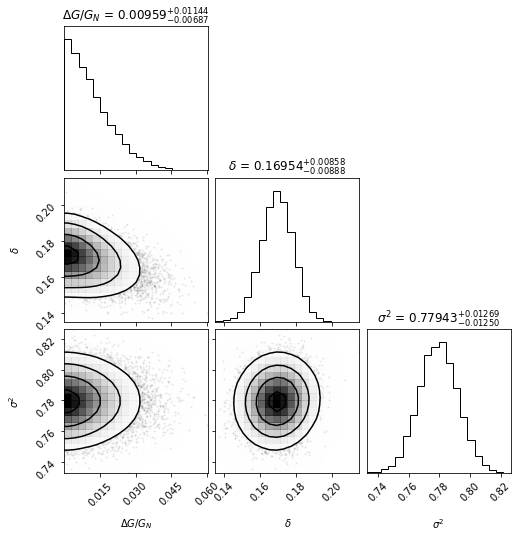

...

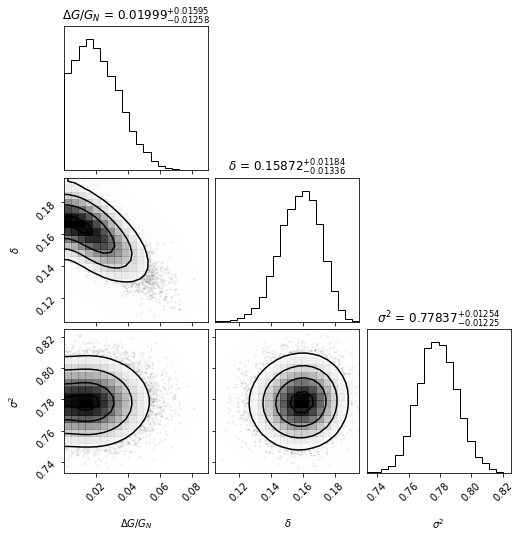

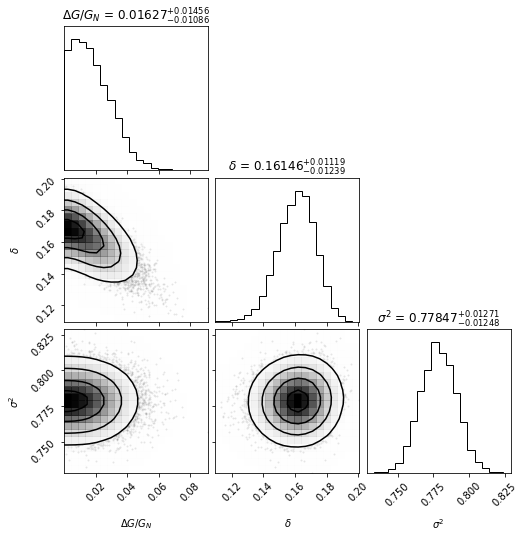

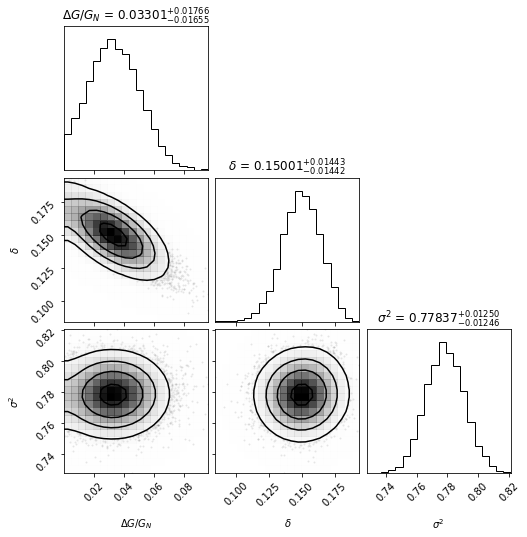

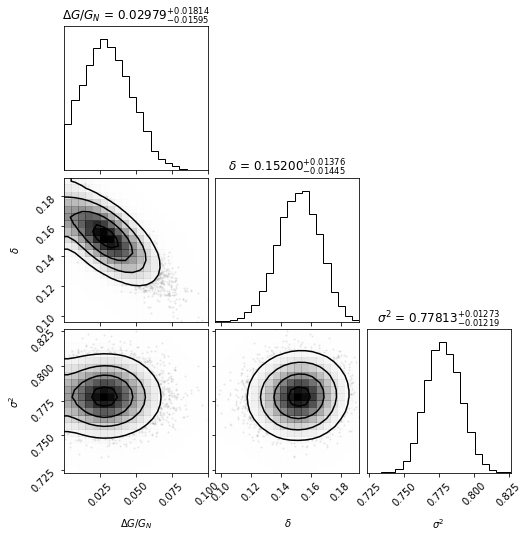

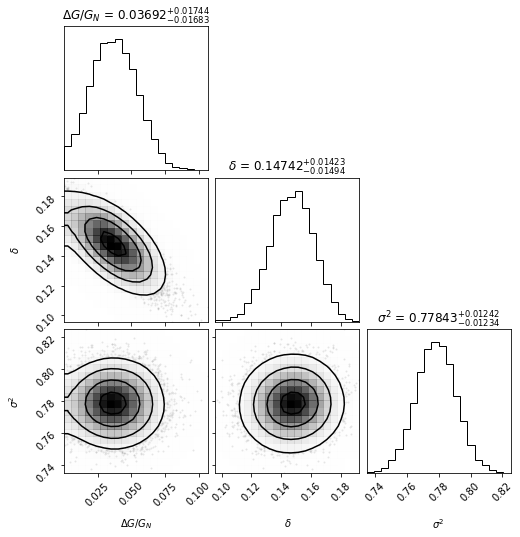

In [9]:
plateifu_f, _, pot_mid, _ = \
            potential_env('/home/ricardo/Documents/codes/NIRVANA/nsa_dist_ra_dec.txt',ind_hsf[0])


alpha1mul, alpha1errmullo95, alpha1errmullo,alpha1errmulhi,alpha1errmulhi95, con1,con1errlo95, con1errlo,con1errhi,con1errhi95, sigma1mul,sigma1errmullo95, sigma1errmullo,sigma1errmulhi,sigma1errmulhi95,listvdifflist_flat   = plot_env_hs(plateifu_f,chihs)

In [10]:
chihslist=[chihs[i] for i in ind_hsf]
data1 = np.column_stack([chihslist, alpha1mul, alpha1errmullo95, alpha1errmullo,alpha1errmulhi,alpha1errmulhi95, con1,con1errlo95, con1errlo,con1errhi,con1errhi95, sigma1mul,sigma1errmullo95, sigma1errmullo,sigma1errmulhi,sigma1errmulhi95,listvdifflist_flat])  
datafile_path1 = f'Mod1Envhilo.dat'
np.savetxt(datafile_path1 , data1, fmt= ['%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e'])

 59%|████████████████████████                 | 539/919 [00:12<00:15, 24.94it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:42<00:00, 21.84it/s]


Total number of points unscreened AD 4: 168
Total number of points screened AD 4: 14728
Total number of points unscreened AD 8: 168
Total number of points screened AD 8: 14728


100%|████████████████████████████████████| 20000/20000 [00:35<00:00, 563.88it/s]


chi= 5.859375000000001e-09
burn-in: 153
thin: 26
flat chain shape: 7690
flat log prob shape: 7630
None


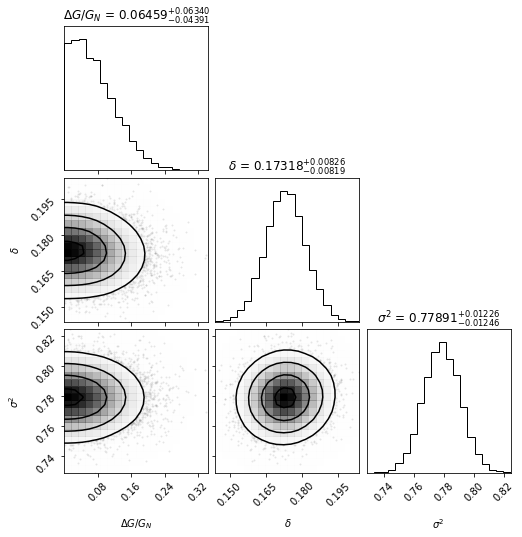

In [10]:
chil02 = (3/2)*10**(-8)*(0.2/0.32)**2
plateifu_f, _, pot_mid, _ = \
potential_env('/home/ricardo/Documents/codes/NIRVANA/nsa_dist_ra_dec.txt',22)
sampleA,_,lenv02= mcmc(chil02,plateifu_f,pot_mid,envsc=True).run_mcmc()
alphaA,alphaAlo95,alphaAlo,alphaAhi,alphaAhi95, conA,conAlo95,conAlo,conAhi,conAhi95, sigmaA,sigmaAlo95,sigmaAlo,sigmaAhi,sigmaAhi95=  mcmc(chil02,plateifu_f,pot_mid,envsc=True).plot_mcmc(sampleA)



In [11]:
chil02,alphaA,alphaAlo95,alphaAlo,alphaAhi,alphaAhi95, conA,conAlo95,conAlo,conAhi,conAhi95, sigmaA,sigmaAlo95,sigmaAlo,sigmaAhi,sigmaAhi95,lenv02

(5.859375000000001e-09,
 0.06459262787044098,
 0.00656175753693978,
 0.02068049619608811,
 0.12798844471180362,
 0.1734161741277952,
 0.17317917060671884,
 0.15954608290247724,
 0.16499148822253437,
 0.18144167689048324,
 0.1868868286792019,
 0.778906500381939,
 0.7587374800950933,
 0.7664459737409545,
 0.7911620102884087,
 0.7995520257895312,
 168)

In [35]:
alphaAhi

0.12798844471180362

  1%|▌                                         | 11/918 [00:00<00:16, 55.05it/s]

10001-6102 [49.514853266331656] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 49.514853266331656 1.2682823237174825e-09 5.23174647058349e-10
10213-12705 [45.8609783919598] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 45.8609783919598 1.7130644518921e-09 5.377869136245806e-10
10213-1902 [48.517653266331656] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 48.517653266331656 1.808293042954424e-09 3.479870721149946e-10
10215-1902 [40.62950753768844] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 40.62950753768844 1.9791131371223004e-09 3.1628179871992893e-10
10218-12701 [48.5420603015

  3%|█                                         | 23/918 [00:00<00:16, 55.84it/s]

10226-12704 [48.81763316582915] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694, 0.4691, 0.2789, 0.37, 0.364, 0.3135, 0.363, 0.2811, 0.3307, 0.2727, 0.312, 0.3727, 0.1385, 0.4167, 0.2188, -0.3444, 0.1093]
10226-12704 48.81763316582915 1.6663931162912202e-09 3.73614712593381e-10
10226-12705 [50] [1.0258, 2.2633, 2.7169, 2.4758, 1.8555, 1.7519, 1.2885, 0.9589, 1.0089, 1.1064, 1.1936, 2.223, 0.8528, 1.1417, 0.5417]
10226-12705 50.0 0.0 1.6218419890706256e-07
10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 1.1660828820248436e-07
10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 3.3610804673323537e-09
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 2.3520387364905355e-09
10494-

  4%|█▌                                        | 35/918 [00:00<00:15, 56.21it/s]

10496-12704 [48.79202010050251] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268.8121, 253.915, 333.7881, 358.7629, 315.1183, 261.3063, 216.6964, 267.188, 258.5169, 256.0365, 248.4992]
10496-12704 48.79202010050251 1.8742900850002134e-09 1.8607014240138285e-10
10496-12705 [48.068711557788944] [-0.3879, -0.1399, 0.1719, 0.4444, 0.4904, 0.2805, 0.2146, 0.344, 0.3105, 0.2505, 0.2112, 0.1741, 0.0585, 0.0082, -0.033, 0.0654, 0.0338, 0.38, 0.1359]
10496-12705 48.068711557788944 2.081345912965553e-09 2.0984445125212167e-10
10498-12705 [50] [2.2376, 1.8111, 0.8617, 0.4311, 0.299, 0.2455, 0.2899, 0.2855, 0.265, 0.1888, 0.0491, -0.0661, -0.1083, -0.0652, -0.0315, 0.0942]
10498-12705 50.0 0.0 9.439427821782336e-08
10499-12705 [43.66803316582915] [-0.9996, -0.9996, -0.9992, -0.9994, -0.9994, -0.9993, -0.9993, -0.9994, -0.9994, -0.9992, -0.999, -0.999, -0.9987]
10499-12705 43.66803316582915 1.7868979838811385e-09 5.160771493681926e-10
10499-3702 [45.15892462311558] [-0.3822, -0.1753, 0.32

  5%|█▉                                        | 43/918 [00:00<00:13, 62.84it/s]

10502-6103 [3.83878391959799] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 3.83878391959799 1.858835772753806e-09 4.390856662582869e-10
10503-12702 [47.785828140703515] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 47.785828140703515 1.8704305580093644e-09 4.570594155956781e-10
10503-9102 [1.0447] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8]
10503-9102 1.0447 1.686732025442998e-09 3.205321303505123e-10
10505-12704 [48.553559798994975] [0.6223, 0.447, 0.4087, 0.27, 0.0901, 0.1644, 0.1572, 0.3129, 0.3336, 0.3492, 0.2338, 0.2536, 0.1307, 0.2303, 0.2492, 0.6718, 0.9822, 1.3729, 3.1505, 2.3435]
10505-12704 48.553559798994975 1.641020003135958e-09 5.199655611677774e-10
10506-9101 [50] [-0.2543, 0.5091, 0.8262, 0.5675, 0.2552, 0.0764, 0.0245, 0.0392, 0.0453, 0.0366, -0.0056, -0.0369

  6%|██▌                                       | 57/918 [00:00<00:14, 58.45it/s]

10512-12705 [42.436934673366835] [-0.9971, -0.9962, -0.9967, -0.9971, -0.9969, -0.9968, -0.9961, -0.9958, -0.9964, -0.9971, -0.9977, -0.9977, -0.9977, -0.9976, -0.998]
10512-12705 42.436934673366835 1.9651039046853724e-09 3.5957976148023395e-10
10512-9102 [47.82151608040201] [4147.3152, 2927.8473, 3245.8656, 2878.0674, 2617.7881, 2204.6977, 1695.8151, 1371.2689, 1298.2413, 1241.1228, 1357.9116, 1330.7104, 1714.839, 1930.3755, 2196.7284, 2401.8011, 2844.302, 3122.8481, 2925.4465]
10512-9102 47.82151608040201 1.833225967727791e-09 3.3048043985815065e-10
10513-12702 [43.37030603015075] [-0.9916, -0.9877, -0.9855, -0.9802, -0.9787, -0.98, -0.9868, -0.9787, -0.862, -0.9802]
10513-12702 43.37030603015075 1.9711144097193887e-09 3.022222468603808e-10
10514-6103 [48.800251256281406] [0.5999, 0.3982, 0.2747, 0.2749, 0.0781, 0.0617, 0.0681, -0.0189, -0.0377, -0.0578, -0.065, -0.0594, 0.0253, -0.0317, 0.1182, -0.1428, -0.1895, -0.2508, -0.2991, -0.355]
10514-6103 48.800251256281406 1.8795159636570

  8%|███▏                                      | 70/918 [00:01<00:14, 57.34it/s]

10519-6102 [48.539027135678396] [15.342, 9.7033, 5.6052, 3.8579, 2.785, 2.1688, 1.9416, 1.9483, 2.0544, 1.8028, 1.946, 2.1855, 2.046, 2.3544, 2.1616]
10519-6102 48.539027135678396 1.8383655777562754e-09 4.905516490656537e-10
10520-12704 [35.59718090452261] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.0366, 0.0275, -0.0135, 0.0213, 0.0998, -0.1048, -0.1309]
10520-12704 35.59718090452261 1.8494281344892308e-09 4.679685315384692e-10
10520-6102 [1.7815376884422112] [-0.9995, -0.9993, -0.9985, -0.9976, -0.9986, -0.9981, -0.9983, -0.9984, -0.9986, -0.9981, -0.9963]
10520-6102 1.7815376884422112 1.841237052846851e-09 4.291942845849439e-10
10838-9101 [44.0125] [-0.0928, 0.4421, 0.4896, 0.3922, 0.2667, 0.3141, 0.2582, 0.2949, 0.294, 0.2543, 0.2198, 0.1153, 0.0076, -0.0625, -0.124, -0.1198, -0.272, -0.3696, -0.3534, -0.3974, -0.2337]
10838-9101 44.0125 2.0192341958484045e-09 2.601977519288969e-10
10839-12705 [50] [0.5531, 0.4188, 0.6271, 0.6342, 0.4074, 0.3206, 0.1512, 0.1

  9%|███▊                                      | 82/918 [00:01<00:18, 44.01it/s]

10842-9101 [46.611176884422115] [-0.987, -0.9943, -0.9967, -0.9976, -0.9979, -0.998, -0.9982, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9981, -0.998, -0.9982, -0.9979, -0.9982, -0.9983]
10842-9101 46.611176884422115 2.0952846487113073e-09 2.353724456912977e-10
10845-12702 [32.29100301507538] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-12702 32.29100301507538 1.7579862656839769e-09 5.57130250517715e-10
11004-12705 [48.791891959798996] [-0.8497, -0.6991, -0.5203, -0.3493, -0.2406, -0.2193, -0.1954, -0.1792, -0.1842, -0.1767, -0.1858, -0.1781, -0.195, -0.2173, -0.2294, -0.167, -0.2434, -0.1514, -0.3351, -0.2129]
11004-12705 48.791891959798996 1.9729288019243333e-09 2.0085875664637945e-10
11004-3703 [1.352] [5607.0165, 6199.0745, 5122.0907, 4588.5334, 3798.1606, 3256.1827, 2909.7374, 2623.1995, 2081.3703, 1622.0266, 1252.6703, 1054.2993, 797.551]
11004-3703 1.352 1.6952754388663363e-09 3.2080558467501297e-10
11004-610

 10%|████                                      | 88/918 [00:01<00:23, 35.69it/s]

11012-3702 [49.52094874371859] [7.8974, 3196.585, 2734.8285, 2253.8811, 4078.0168, 2401.2221, 2680.4924, 2677.0305, 2494.671, 2122.0656, 2023.2433, 2124.4295, 1742.4806, 1879.5204, 1353.859, 1265.244, 1077.374, 829.3809, 807.9255, 437.3493, 291.3315]
11012-3702 49.52094874371859 1.0211256743522928e-09 9.432552476331052e-10
11012-9102 [50] [4.3613, 1.8587, 0.9243, 0.4611, 0.1717, 0.0565, -0.0003, -0.0124, 0.0149, 0.0346, 0.0094, 0.0256, 0.0391, 0.0441, 0.0302, -0.0599, -0.0933, -0.0179]
11012-9102 50.0 0.0 1.5072865714598382e-07
11013-12702 [39.6654040201005] [0.7904, 0.6387, 0.0779, 0.1203, 0.0592, -0.004, -0.016, 0.0128, 0.0194, 0.059, 0.0663]
11013-12702 39.6654040201005 1.9786530501004137e-09 3.489523279814355e-10
11013-1902 [50] [0.7893, 0.6453, 0.5024, 0.4895, 0.4034, 0.2175, 0.0455, -0.0103, 0.0142, -0.2569, -0.0412, -0.2183, -0.1712, -0.0824, -0.3609, -0.2323, -0.3117]
11013-1902 50.0 0.0 1.6478679611274258e-07
11013-3701 [45.068331658291456] [0.785, 0.6845, 0.2024, 0.0457, 0.03

 10%|████▎                                     | 93/918 [00:01<00:24, 33.94it/s]

11013-3702 [49.009686432160805] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 49.009686432160805 2.093214769637013e-09 1.9110596811464865e-10
11013-6101 [49.760001005025124] [0.3389, -0.3422, -0.154, -0.2894, -0.4104, -0.4385, -0.4897, -0.4798, -0.43, -0.3971, -0.3753, -0.3775, -0.3376, -0.2419, -0.1243, 0.0068, -0.1557, 0.0318, -0.0178, 0.2532, 0.5345, 0.5099]
11013-6101 49.760001005025124 1.477561233183465e-09 8.475650306025298e-10
11017-12703 [41.44086432160804] [0.0185, 0.3093, 0.3468, 0.2632, 0.2308, 0.2072, 0.1992, 0.215, 0.2444, 0.2273, 0.053, -0.0123, 0.1078, -0.0553]
11017-12703 41.44086432160804 2.0714233055981124e-09 2.5881173848411114e-10
11017-12704 [48.54537989949749] [0.4751, 0.4487, 0.3988, 0.2586, 0.0625, -0.0537, -0.0751, -0.1094, -0.1157, -0.1027, -0.1141, -0.1182, -0.1126, -0.1047, -0.0836, -0.1961, -0.2389]
11017-12704 48.54537989949749 1.8356248500477682e-09 2.6203345909886254e-10
11017-6103 [47.106775879396984] [-0.3235, -0.3265, -0.3479

 11%|████▌                                    | 101/918 [00:02<00:25, 31.92it/s]

11018-12702 [50] [-0.9839, -0.9926, -0.9927, -0.9922, -0.9923, -0.9935, -0.9932, -0.9925, -0.9931, -0.994, -0.9941]
11018-12702 50.0 0.0 1.7917858806126982e-07
11018-12704 [37.77045226130653] [-0.9989, -0.9988, -0.9986, -0.9987, -0.9988, -0.999, -0.999, -0.9991, -0.9991, -0.9987, -0.9984, -0.9975, -0.9987, -0.9989]
11018-12704 37.77045226130653 2.093841982179405e-09 2.1202890964451406e-10
11018-3702 [49.017913567839194] [0.6083, 0.007, 0.0959, 0.33, 0.5514, 0.4356, 0.3654, 0.3085, 0.3057, 0.287, 0.3004]
11018-3702 49.017913567839194 2.1157068000868624e-09 1.8911089499614083e-10
11018-3703 [49.038319597989954] [-0.5454, 0.4164, 0.6741, 0.5852, 0.6907, 0.7028, 0.6059, 0.5528, 0.656, 0.6306, 0.5445, 0.5549, 0.4676, 0.4329, 0.3355, 0.3242, 0.462, 1.051, 0.5129, 1.3094]
11018-3703 49.038319597989954 1.1082997100887384e-09 1.0740784423035697e-09
11018-6102 [49.51388140703518] [69.1052, 130.9961, 113.1141, 109.1797, 92.5989, 91.6354, 88.5765, 83.9604, 80.137, 76.3564, 74.3146, 74.7218, 70.495

 11%|████▋                                    | 105/918 [00:02<00:26, 31.19it/s]

11019-12705 [49.505842211055274] [0.9395, 1.6844, 1.8269, 0.8562, 0.7011, 1.016, 1.1247, 1.0992, 1.0844]
11019-12705 49.505842211055274 1.5192601737978047e-09 3.9713273799823497e-10
11019-3701 [49.02019497487437] [2.5964, 1.3616, 0.9142, 0.3658, 0.0143, -0.1157, -0.1148, -0.102, -0.0691, -0.1802, -0.166, -0.2893, -0.0849]
11019-3701 49.02019497487437 1.6175564069950827e-09 7.045118298713943e-10
11021-1902 [49.75094472361809] [5.9017, 3.1432, 2.8491, 1.9605, 1.7177]
11021-1902 49.75094472361809 9.233325543116577e-10 8.243364431033526e-10
11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 5.451309124083167e-09
11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 2.993279973172547e-09
11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253,

 12%|█████                                    | 113/918 [00:02<00:26, 30.83it/s]

11742-12704 [47.0412040201005] [0.6702, -0.5312, -0.3481, 0.0047, 0.1348, 0.415, 0.2787, 0.5138, -0.0348]
11742-12704 47.0412040201005 2.044878915993079e-09 2.501288808789271e-10
11743-1901 [49.516885427135676] [-0.5717, -0.3943, -0.5273, -0.3736, -0.306, -0.392, -0.3766, -0.4151, -0.3665, -0.4111, -0.4236, -0.3424, -0.3877, -0.3594, -0.291, -0.4952, -0.6018]
11743-1901 49.516885427135676 1.2403901748338055e-09 6.670823038842937e-10
11744-9102 [50] [-0.6298, 0.0464, 0.3943, 0.6247, 0.4097, 0.3518, 0.3414, 0.4046, 0.4742, 0.4313, 0.3693, 0.3275, 0.2214, 0.1278, 0.0812, 0.4043, 0.1792, -0.1336]
11744-9102 50.0 0.0 7.962189507814788e-07
11745-1902 [49.0176] [1.185, 0.9719, 0.4625, 0.4231, 0.2188, 0.1795, 0.0428, 0.0263, -0.0784, -0.2371, 0.1632]
11745-1902 49.0176 1.4175930062873866e-09 7.75028084120574e-10
11745-6104 [50] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.8527, 0.5703, 0.5078, 0.5176, 0.5143, 0.48, 0.4463, 0.4504, 0.4653, 0.4273, 0.4049]
11745-6104 50.0 0.0 1.3316956465683008e-07


 13%|█████▏                                   | 117/918 [00:02<00:27, 29.44it/s]

11746-3704 [49.51709849246231] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 49.51709849246231 1.4354083050872236e-09 2.300509176704838e-10
11746-9102 [49.520936683417084] [-0.478, -0.2133, -0.2528, -0.1774, -0.2077, -0.2266, -0.2099, -0.2691, -0.1996, -0.2114, -0.1249, -0.1799, -0.1765, -0.1376, -0.2784, -0.2323, -0.1941, -0.3005, -0.2047, -0.3235, -0.1159, 0.1709]
11746-9102 49.520936683417084 1.4948041358960196e-09 4.199758231676022e-10
11747-12702 [47.59132663316583] [-0.4876, -0.2412, -0.0165, -0.0887, -0.0931, -0.0756, -0.076, -0.0313, -0.0043, 0.0037, -0.0318, -0.1133, 0.1257, -0.1019, 0.1921, -0.2837, -0.0753]
11747-12702 47.59132663316583 1.9500208874859296e-09 2.606350146580404e-10
11749-12701 [48.28128894472362] [-0.6821, -0.1137, 0.255, 0.1029, 0.0811, -0.0849, -0.2182, -0.1487, -0.1095, -0.0437, -0.1285, -0.1939]
11749-12701 48.28128894472362 2.03501729399

 14%|█████▌                                   | 125/918 [00:03<00:26, 29.85it/s]

11750-12701 [41.929808542713566] [0.4224, 0.3089, 0.0791, 0.0892, 0.2329, 0.2222, 0.1114, 0.03, 0.0196, 0.0027, 0.0313, 0.0827, 0.0275, 0.3095]
11750-12701 41.929808542713566 1.0028937091882416e-09 1.32197551065065e-09
11750-3701 [47.589386934673364] [1.5964, 1.8766, 1.9419, 1.999, 1.4725, 1.2873, 1.1333, 0.934, 0.9463, 0.8918, 0.7347, 0.8508, 0.6677, 0.4619, 0.3762, 0.1866, 0.0367, 0.0915, 0.0086, 0.4665]
11750-3701 47.589386934673364 2.0972758602779986e-09 2.0350141812171076e-10
11750-6103 [23.026497989949746] [6.303, 1.7001, 0.3933, 0.5417, 0.5248, 0.6298, 0.7207, 0.7282, 0.8046, 0.5691, 0.3659, 0.4083, 0.4745, 0.6207, 0.9957, 2.1073, 7.7724]
11750-6103 23.026497989949746 1.5587826998477885e-09 7.741720359264083e-10
11750-9101 [49.28455276381909] [13.4461, 9.2464, 8.3896, 5.4399, 4.9554, 3.0033, 3.1782, 2.4566, 2.5343, 2.0961, 2.3663, 2.3818, 2.4375, 3.0403, 2.3998, 2.3406, 2.9409, 6.8913, 8.6024]
11750-9101 49.28455276381909 1.8273723592623075e-09 3.2264395302765646e-10
11751-1901 

 14%|█████▉                                   | 133/918 [00:03<00:24, 32.26it/s]

11753-6104 [16.26562814070352] [1.7058, 1.5787, 1.7231, 1.492, 1.0043, 0.8699, 0.6579, 0.5905, 0.5042, 0.4712, 0.4504, 0.6153, 0.6589, 0.6817, 0.5206, 0.5457, 0.5195, 0.692]
11753-6104 16.26562814070352 1.832974145023977e-09 5.052716600759796e-10
11754-1901 [45.83406030150754] [-0.2402, -0.5388, -0.5143, -0.4398, -0.487, -0.4664, -0.4721, -0.5334, -0.5004, -0.4954, -0.6115, -0.5884]
11754-1901 45.83406030150754 1.8222419724315336e-09 4.1931309936525585e-10
11755-12701 [47.822361809045226] [-0.773, -0.7865, -0.7717, -0.7522, -0.7475, -0.7159, -0.7048, -0.6936, -0.7373, -0.7183, -0.7382, -0.7769, -0.6833, -0.7924, -0.5695, -0.681, -0.5512]
11755-12701 47.822361809045226 1.9202153287073664e-09 3.623913643050943e-10
11755-6101 [44.8748391959799] [-0.0093, 1.0489, 0.9853, 1.2444, 1.0667, 0.8902, 0.7008, 0.6245, 0.5835, 0.5179, 0.397, 0.4083, 0.4791, 0.2148, 0.053]
11755-6101 44.8748391959799 1.9627963372244994e-09 3.1718692015328634e-10
11755-9102 [48.542132663316586] [0.1799, 0.2485, 0.350

 15%|██████▎                                  | 141/918 [00:03<00:25, 30.68it/s]

11759-6102 [41.759971859296485] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, -0.981]
11759-6102 41.759971859296485 1.6627823555252208e-09 6.283411318423511e-10
11760-12703 [33.89693718592965] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0.539, 0.1155, 0.1223, 0.309]
11760-12703 33.89693718592965 1.95247536218829e-09 3.67244322130908e-10
11760-6101 [50.0] [0.4533, -0.0157, 0.5654, 0.502, 0.3995, 0.359, 0.3287, 0.2964, 0.2063, 0.2512, 0.2686, 0.2421, 0.2368, 0.1884, 0.0906, -0.0471, -0.3849, -0.319, -0.8166]
11760-6101 50.0 0.0 2.3318814626283713e-09
11760-6103 [49.27092010050251] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.2117, -0.2373, -0.2365, -0.2317, -0.3078, -0.2653, -0.3184, -0.2638]
11760-6103 49.27092010050251 1.5475138276012497e-09 3.990786367484192e-10
11760-9102 [47.8491266331

 16%|██████▍                                  | 145/918 [00:03<00:25, 30.31it/s]

11761-12703 [50] [0.4093, 0.08, -0.0588, -0.0478, 0.0006, -0.0009, -0.0617, -0.1284, -0.1046, -0.1135, -0.1247, -0.1623, -0.2191, -0.3477]
11761-12703 50.0 0.0 2.6109526746382987e-09
11761-12704 [39.55022211055277] [-0.1205, 0.9952, 0.5814, 0.2296, 0.1208, 0.126, 0.1222, 0.1041, 0.1683, 0.1996, 0.1448, 0.1188, 0.0574, 0.0394, -0.008, -0.026, -0.0331]
11761-12704 39.55022211055277 1.3645504283213232e-09 9.634478235721299e-10
11761-12705 [50.0] [6.8127, 3.6941, 2.4845, 1.3644, 0.5363, 0.2844, 0.104, -0.1]
11761-12705 50.0 0.0 4.1768262537375986e-10
11823-9101 [50.0] [15949.1976, 8800.0053, 8323.3916, 4811.1692, 2214.9858, 717.2733, 413.2719, 305.7873, 173.5393, 146.0478, 195.6604, 224.7593, 189.4201, 67.1778]
11823-9101 50.0 0.0 5.210922210547824e-10
11824-12705 [46.33188944723618] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 46.33188944723618 9.906805323915353e-10 1.287682874955745e-09
11828-12703 [8.085

 17%|██████▊                                  | 153/918 [00:03<00:25, 30.28it/s]

11830-12703 [23.700263316582912] [-0.4776, 0.0437, 0.1582, -0.0709, -0.1607, -0.0754, 0.055, 0.2665, 0.1845, 0.03, 0.0663, -0.087, -0.2185, -0.1589, 0.0536, -0.3722]
11830-12703 23.700263316582912 1.540672135475283e-09 7.879252532937683e-10
11830-3702 [49.75299045226131] [1.2195, 0.9978, 0.6546, 0.4726, 0.5057, 0.555, 0.4749, 0.3884, 0.4626]
11830-3702 49.75299045226131 1.0224371128113944e-09 9.501665121603784e-10
11830-6104 [48.78048994974875] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.0353, -0.2063, -0.258, -0.2347, -0.2692, -0.3985]
11830-6104 48.78048994974875 1.8885963071825056e-09 3.956666354767251e-10
11831-12703 [50] [0.4472, 0.0224, 0.062, 0.158, -0.0429, -0.0922, -0.1252, -0.188, -0.1276, -0.16, -0.2596, -0.2165, 0.1708, -0.4595]
11831-12703 50.0 0.0 2.513894628496128e-09
11831-12704 [42.386213065326636] [-0.5822, -0.2435, 0.0115, -0.0848, -0.1704, -0.028, -0.0888, -0.0323, -0.0445, -0.106, -0.3871, -0.1836]
11831-12704 42.386213065326636 1

 18%|███████▏                                 | 161/918 [00:04<00:22, 34.01it/s]

11831-6102 [50] [1.041, 0.6096, 0.4053, 0.165, 0.0902, 0.1922, 0.1873, 0.1187, 0.1055, 0.0085, -0.1108, -0.0737]
11831-6102 50.0 0.0 1.0146285301536339e-07
11833-9102 [49.5139135678392] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.2658, -0.2176, -0.1929, -0.2471, -0.3166]
11833-9102 49.5139135678392 1.1273939214263796e-09 6.63626026318815e-10
11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 2.6555611718068674e-06
11836-1902 [15.014729648241207] [0.7026, 1.2767, 1.1865, 1.1009, 0.973, 0.9921, 0.7024, 0.7206, 0.623, 0.6145, 0.5505, 0.5955, 0.6037, 0.4142, 0.4147]
11836-1902 15.014729648241207 1.9447217044951153e-09 3.755841012674983e-10
11838-12701 [38.798676381909544] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 

 18%|███████▎                                 | 165/918 [00:04<00:22, 33.08it/s]

11838-9101 [48.78497487437186] [11.4727, 10.3246, 9.7757, 7.6641, 6.3263, 7.7985, 4.6854, 6.1379, 3.8072, 5.5203, 3.0518, 3.9759, 1.4403, 2.8333, 2.6956, 2.5542]
11838-9101 48.78497487437186 1.3508649824872424e-09 8.282245698477474e-10
11865-12702 [41.424753768844226] [-0.057, -0.0512, 0.0778, -0.0002, -0.0743, -0.0834, -0.0854, 0.0083, -0.0154, -0.0332, -0.07, -0.1612, -0.2706]
11865-12702 41.424753768844226 2.058544045790172e-09 2.2373907589968742e-10
11865-12704 [48.28728291457287] [0.4447, -0.0557, -0.3894, -0.457, -0.5111, -0.5109, -0.5238, -0.5353, -0.4955, -0.5012, -0.4831, -0.4726, -0.599, -0.615]
11865-12704 48.28728291457287 1.7249048024763988e-09 4.54777489591964e-10
11865-1901 [49.508853266331656] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 49.508853266331656 1.2841668160093325e-09 5.536549026830017e-10
11865-1902 [44.33059246231156] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0

 19%|███████▋                                 | 173/918 [00:04<00:24, 29.96it/s]

11865-9102 [47.80833718592965] [-0.467, -0.4695, -0.4789, -0.5286, -0.6182, -0.6445, -0.6408, -0.6047, -0.6031, -0.6243, -0.655, -0.6895, -0.6998, -0.5904, -0.6729, -0.6983]
11865-9102 47.80833718592965 1.9174094049664413e-09 3.705537733098162e-10
11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2771, 0.298, 0.3814, 0.3262, 0.2102, 0.3978, 0.4467, 0.2866, 0.1214, 0.2202, 0.1346, 0.4041]
11867-6104 50.0 0.0 5.747942301677933e-07
11867-9101 [32.75167386934673] [0.9073, 0.3027, 0.1546, 0.1123, 0.0285, 0.0159, -0.0244, 0.0205, 0.0824, 0.1908, 0.2079, 0.2195, 0.3058, 0.2425, 0.1871, 0.3056]
11867-9101 32.75167386934673 1.801285674396645e-09 5.273192916293576e-10
11868-12703 [49.50787738693467] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 49.50787738693467 1.0380527599150837e-09 8.315782848513091e-10
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0

 20%|████████                                 | 180/918 [00:04<00:26, 28.01it/s]

11940-1902 [50] [-0.0835, 0.1518, 0.1321, 0.0182, -0.0843, -0.1452, -0.1779, -0.1993, -0.1955]
11940-1902 50.0 0.0 3.645767171579591e-09
11940-3703 [48.09175477386935] [1.1615, 1.5645, 1.5154, 1.5213, 1.3625, 1.1856, 0.9977, 0.7191, 0.6591, 0.6153, 0.3767, 0.433, 0.6417, 0.1616, 0.444, 0.2018, 0.0806, 0.2143, 0.1328]
11940-3703 48.09175477386935 1.951186735695959e-09 2.312528160469163e-10
11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 1.5927311356898743e-08
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 9.42768058574259e-09
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 1.5636628925537427e-07
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389.9

 20%|████████▎                                | 186/918 [00:05<00:27, 26.86it/s]

11942-6104 [49.266411055276386] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 49.266411055276386 1.701149550018755e-09 2.3029599215719002e-10
11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.0425, -0.0331, -0.0546, -0.0982, -0.1371, -0.164, -0.179, -0.1863, -0.172, -0.1572, -0.1563, -0.1648, -0.1726, -0.27]
11943-3703 50.0 0.0 9.984573998312066e-09
11944-12701 [49.512909547738694] [-0.3604, -0.3617, -0.4276, -0.5869, -0.6347, -0.6283, -0.548, -0.5758, -0.5204, -0.4847, -0.4769, -0.4857, -0.5345, -0.6334, -0.5353, -0.5098]
11944-12701 49.512909547738694 3.36466947414516e-10 1.8379667480752334e-09
11945-12701 [50] [0.3961, 0.2879, 0.3765, 0.1557, -0.0002, -0.113, -0.1502, -0.128, -0.114, -0.1705, -0.0344, 0.0462, 0.017]
11945-12701 50.0 0.0 2.8598681428584967e-09
11945-6101 [48.782698492462316] [0.2057, 0.8606, 0.9637, 0.605, 0.4694, 0.2734, 0.2029, 0.1332, 0.0558, -0.0105, 0.0015, 0.0011, 

 21%|████████▌                                | 192/918 [00:05<00:27, 26.41it/s]

11947-6103 [49.7569648241206] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 49.7569648241206 5.245691376294949e-10 1.3285598695067181e-09
11949-12701 [45.8248256281407] [1.1975, 0.3408, 0.1441, 0.1243, 0.0225, 0.0003, 0.0028, 0.027, 0.0197, 0.0192, -0.0295, -0.0839]
11949-12701 45.8248256281407 9.827083098948659e-10 1.3136094377017769e-09
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 1.0319594443421343e-06
11954-12704 [50] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453, 0.1801, 0.125, 0.0276, -0.0116, -0.0744, -0.134, -0.1626, -0.2559, -0.2802]
11954-12704 50.0 0.0 2.3554557504367538e-09
11954-3703 [49.51586834170855] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.277

 22%|████████▊                                | 198/918 [00:05<00:26, 27.01it/s]

11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 5.321677717507496e-07
11956-12702 [49.26188994974874] [5.6953, 5.0804, 3.2564, 2.1056, 1.2622, 0.6457, 0.4602, 0.5373, 0.9503, 3.7649, 5.1679]
11956-12702 49.26188994974874 1.3778595204882741e-09 8.871054757877592e-10
11956-12705 [34.34855879396986] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 0.2419, 0.2565, 0.3525, 0.1776, 0.103, 0.3387, 0.3814, 0.7221, 0.77]
11956-12705 34.34855879396986 2.1096409244698315e-09 2.1402908262011017e-10
11957-12704 [47.31061608040201] [-0.3492, 0.7667, 0.6853, 0.5861, 0.3661, 0.189, 0.1584, 0.1015, -0.0026, 0.0319, 0.1228, 0.1275, 0.2204, 0.0938]
11957-12704 47.31061608040201 2.0007772406659928e-09 3.253222669934218e-10
11957-9101 [49.756517085427134] [127.5969, 337.5453, 692.0501, 754.6672, 761.8038, 673.5367, 561.8056, 470.5271, 446.8561, 434.7914, 434.701, 432.6297, 423.9362, 4

 22%|█████████                                | 204/918 [00:05<00:26, 26.55it/s]

11958-6103 [49.26788542713568] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 49.26788542713568 1.898250802173628e-09 2.7074238478639174e-10
11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 6.548753144646985e-08
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 50.0 0.0 3.8880763986900364e-09
11965-9102 [49.26493668341709] [3.4399, 2.3674, 1.5667, 0.9843, 0.6333, 0.3517, 0.1829, 0.1258, 0.0956, 0.1424, 0.1021, 0.028, 0.1221]
11965-9102 49.26493668341709 8.608035988744389e-10 1.3573828257785676e-09
11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 5.138883947120913e-07
11969-6101 [50] [

 23%|█████████▍                               | 211/918 [00:06<00:24, 28.75it/s]

11970-12703 [33.471865326633164] [-0.4888, -0.3498, -0.0561, 0.1594, 0.1669, 0.133, 0.154, 0.1676, 0.144, 0.1071, 0.072, 0.0457, 0.046, 0.0501, 0.1262, -0.0083, 0.2366]
11970-12703 33.471865326633164 2.1608773483772363e-09 1.6621184870487746e-10
11970-6102 [49.027801005025125] [-0.0116, -0.0683, -0.0558, -0.0053, 0.0454, 0.025, 0.078, -0.0283, -0.085, -0.1052, -0.0602, -0.0272, -0.0693, -0.0116, -0.1378, -0.2799, -0.2497]
11970-6102 49.027801005025125 1.8328410638765898e-09 4.3818675896099483e-10
11970-6103 [50.0] [0.7466, 1.1751, 1.6643, 1.3977, 1.0416, 0.8262, 0.6871, 0.5199, 0.4194, 0.3266, 0.2718, 0.2909, 0.2357, 0.2575, 0.2139, 0.0837, -0.0144, -0.0619, 0.133]
11970-6103 50.0 0.0 2.3193347234993206e-09
11974-12702 [49.03749949748744] [-0.5341, -0.4596, -0.3852, -0.2683, -0.2117, -0.2349, -0.22, -0.1969, -0.1731, -0.1829, -0.2133, -0.2538, -0.2357, -0.256, -0.1504, -0.1437, -0.1349, 1.1183]
11974-12702 49.03749949748744 1.6936918554936255e-09 2.796115197532502e-10
11975-12701 [45.8

 24%|█████████▋                               | 216/918 [00:06<00:21, 32.38it/s]

11975-6104 [49.04197989949749] [1.0196, 1.2709, 1.5062, 1.1104, 0.9965, 0.7778, 0.776, 0.6311, 0.7603, 0.6278, 0.6208, 0.5151, 0.5172, 0.5343, 0.2326, 0.5012, 0.187, 0.4522, 0.1401, 0.1327]
11975-6104 49.04197989949749 1.5790894095620503e-09 7.324014576871097e-10
11976-12703 [49.02764422110553] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 49.02764422110553 7.092512208277068e-10 1.4637898452456338e-09
11978-12703 [47.550482412060305] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 47.550482412060305 1.940769931325493e-09 2.2307660173951184e-10
11978-12705 [48.059987939698495] [0.0184, 0.0968, 0.695, 0.4819, 0.223, 0.1168, 0.1458, 0.1604, 0.1304, 0.1363, 0.1451, 0.1188, 0.0734, 0.0413, 0.0374, 0.0059, 0.0584, 0.0708]
11978-12705 48.059987939698495 1.775176459485092e-09 4.803583893961777e-10
11978-6101 [4

 25%|██████████                               | 226/918 [00:06<00:18, 36.46it/s]

11981-12702 [41.87855075376884] [293.567, 690.112, 683.5389, 617.2849, 490.646, 374.3616, 455.8674, 450.3051, 457.9927, 478.543, 404.234]
11981-12702 41.87855075376884 2.183716150121109e-09 1.5861221133469172e-10
11981-12704 [49.03049246231156] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]
11981-12704 49.03049246231156 1.686498873855943e-09 3.519512889035046e-10
11981-9102 [48.56300904522613] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188, -0.1444, -0.128, -0.1812, -0.1904, -0.2284, -0.2044, -0.2061, -0.1486, -0.2345, -0.2114, 0.0329, 0.7603]
11981-9102 48.56300904522613 1.7565653859837563e-09 3.028242358558839e-10
11982-12704 [16.714301005025124] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.1555, 0.0797, -0.029, 0.0037, 0.2331]
11982-12704 16.714301005025124 2.0810632679235903e-09 2.5894382564817513e

 25%|██████████▎                              | 230/918 [00:06<00:21, 31.54it/s]

11984-12701 [48.05115175879397] [-0.2857, -0.1737, 0.0157, 0.0372, -0.1281, -0.2001, -0.1962, -0.1945, -0.1458, -0.0921, -0.099, -0.116, -0.1666, -0.325, -0.2122, -0.442]
11984-12701 48.05115175879397 1.6991068311733752e-09 4.368983655461618e-10
11984-12702 [48.557805025125624] [-0.2774, -0.3248, -0.3706, -0.3541, -0.339, -0.3481, -0.2877, -0.2577, -0.2022, -0.1466, -0.1889, -0.2485, -0.0638, -0.2124, -0.1581, -0.3914, -0.132]
11984-12702 48.557805025125624 1.8026515620279407e-09 2.4937482025552587e-10
12066-3701 [49.515952763819094] [19.2418, 16.9197, 10.1428, 6.0915, 4.4316, 3.0783, 2.9929, 2.3906, 2.7183, 2.8356, 3.2869, 3.669, 3.475, 3.6088, 2.499, 1.7084, 1.9485, 1.5899]
12066-3701 49.515952763819094 1.5759630086043788e-09 3.425121484903576e-10
12067-12703 [49.52319899497488] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
12067-12703 49.52319899497488 1.8528987048132086e-0

 26%|██████████▋                              | 238/918 [00:06<00:21, 31.26it/s]

12068-6104 [48.54508442211055] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 48.54508442211055 1.8026843947814685e-09 2.895123402899957e-10
12069-12704 [49.75595879396985] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 49.75595879396985 1.2306462066435496e-09 2.2871651238412762e-10
12069-12705 [39.34835175879397] [1.7332, 1.137, 0.4096, 0.6564, 0.5837, 0.6168, 0.2246, 0.0587, 0.2617, 0.1538, 0.5607, 0.4132, 0.5307, 0.41, 2.8782]
12069-12705 39.34835175879397 1.7556396561375685e-09 5.715592267340903e-10
12069-6102 [49.28577688442211] [-0.3102, -0.0764, -0.2402, -0.1833, -0.1952, -0.2158, -0.2095, -0.1861, -0.144, -0.1353, -0.1037, -0.1026, -0.0816, -0.0956, -0.1367, -0.1477, -0.0871, -0.0667, -0.0387, -0.58, -0.56, -0.5359, -0.8946, 0.038]
12069-6102 49.28577688442211 1.33270860534

 27%|███████████                              | 249/918 [00:07<00:17, 38.18it/s]

12078-6103 [47.343820603015075] [1.9637, 5.3953, 4.122, 4.276, 4.2033, 3.4926, 3.3028, 3.2038, 3.1762, 3.0769, 2.868, 2.5911, 2.6527, 2.4952, 2.6226, 2.6979, 2.1328, 1.6158, 1.3218, 1.8508]
12078-6103 47.343820603015075 1.9596881136405926e-09 3.2750655744264305e-10
12079-12705 [49.03379296482412] [5.9457, 5.134, 4.915, 2.376, 2.7696, 2.3345, 1.3415, 1.441, 1.4148, 0.8317, 1.0553, 1.0687, 0.9662, 0.8766, 1.1537, 1.4538, 0.8336]
12079-12705 49.03379296482412 1.7796892113745222e-09 2.7831879792463197e-10
12080-12704 [32.518554271356784] [798.4646, 1129.8436, 1685.7177, 1551.5379, 1648.9794, 1528.8158, 1510.5353, 1488.9904, 1518.2012, 1430.3202, 1355.0599, 1297.2544, 1371.7431, 1127.7862, 1194.7794, 1062.3493, 1183.2366, 942.8748, 761.5148, 256.7283, 914.8231, 836.9712]
12080-12704 32.518554271356784 2.0812715304205868e-09 2.527083371208148e-10
12081-6102 [49.02752763819095] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.058

 28%|███████████▍                             | 257/918 [00:07<00:17, 38.23it/s]

12084-3702 [46.84052311557789] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
12084-3702 46.84052311557789 1.9635815454059005e-09 3.018382261997665e-10
12084-3703 [46.143589949748744] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.866, 9.9199, 8.0438, 7.1191, 7.1184, 4.9585, 5.2578]
12084-3703 46.143589949748744 1.779911663764313e-09 4.753532089147676e-10
12084-6104 [48.55371959798995] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.0374, 0.0776, -0.025, -0.0223, -0.0093, -0.0487, 0.0214, -0.2045, 0.0836]
12084-6104 48.55371959798995 1.4662572437593603e-09 6.303087847151431e-10
12085-12704 [46.32538442211055] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0.0071, -0.0873, -0.0572, 0.0209, 0.0881, 0.0588, 0.0753, 0.0542]
12085-12704 46.32538442211055 1.3729522381442717e-09 9.06744

 29%|███████████▉                             | 266/918 [00:07<00:16, 39.21it/s]

12088-9101 [43.88673366834171] [1.3886, 1.0744, 0.6164, 0.1772, -0.0928, -0.1728, -0.2424, -0.3552, -0.3861, -0.4243, -0.4358, -0.4341, -0.4454, -0.4408]
12088-9101 43.88673366834171 1.4543626507302706e-09 8.520850978906044e-10
12089-12702 [25.027520603015073] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-12702 25.027520603015073 1.9757124054452323e-09 3.5359903408946077e-10
12089-12704 [48.291229648241206] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 48.291229648241206 1.452566426232398e-09 8.380766678193043e-10
12089-1901 [49.015752763819094] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 49.015752763819094 1.7940697227350483e-09 2.6318722198362845e-10
12089-6103 [48.32341557788945] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.

 30%|████████████▎                            | 275/918 [00:07<00:15, 40.65it/s]

12483-12703 [48.04771055276382] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -0.0898]
12483-12703 48.04771055276382 1.6599798544906488e-09 5.948958509692078e-10
12483-12704 [46.57713366834171] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 46.57713366834171 1.7728107210788653e-09 5.607352262456953e-10
12483-12705 [48.53274974874372] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 48.53274974874372 1.8716284142011476e-09 3.895214964515024e-10
12483-9101 [7.640062814070352] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 7.640062814070352 2.0785056256726227e-09 2.5703582002192935e-10
12488-6102 [45.662063316582916] [1835.8733, 1658.0826, 1928.606, 2054.

 31%|████████████▋                            | 285/918 [00:07<00:15, 41.18it/s]

12510-9102 [46.61930251256281] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 46.61930251256281 2.0821865068742207e-09 2.520816947814769e-10
12512-12702 [33.44148743718593] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 33.44148743718593 2.005245962184511e-09 3.2149802548369884e-10
12514-12702 [49.27107085427136] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 49.27107085427136 1.8940730203614797e-09 2.212436527030504e-10
12514-12703 [39.53222261306533] [2.1408, 0.3201, 0.1941, 0.0194, 0.03, 0.0603, 0.1872, 0.1977, 0.0662, 0.1145, 0.0325, -0.0142, 0.021, -0.0315, -0.0845, -0.0224]
12514-12703 39.53222261306533 2.1414399052996796e-09 1.7247641238126097e-10
12514-9102 [48.299531155778894] 

 32%|█████████████▏                           | 295/918 [00:08<00:15, 39.78it/s]

12620-6104 [27.30348743718593] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 27.30348743718593 2.006992876864404e-09 3.243484000663795e-10
12621-12703 [48.0470472361809] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 48.0470472361809 1.3288600269179534e-09 1.00153020119589e-09
12621-12705 [48.284342211055275] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903, -0.5645]
12621-12705 48.284342211055275 1.4853400614307036e-09 6.518731751337238e-10
12621-6103 [49.03857889447236] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 49.03857889447236 1.5464662986383453e-09 4.3569

 33%|█████████████▌                           | 303/918 [00:08<00:16, 37.06it/s]

12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 3.3351312521842178e-09
12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 7.304361857954931e-09
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 6.239032098653342e-09
12679-12701 [46.435690954773875] [-0.4106, -0.1602, -0.09, 0.0292, -0.1142, -0.1585, -0.1702, -0.2231, -0.1617, -0.1473, -0.165, -0.0765, -0.2919, -0.3168, -0.5268, -0.1813, 0.1098, -0.9954]
12679-12701 46.435690954773875 1.9460824454709003e-09 2.9425797367600934e-10
12679-1902 [49.03392562814071] [0.6115, 0.2127, 0.2343, 0.0811, 0.186, 0.028, 0.0072, -0.086, -0.1377, -0.1341, -0.1745, -0.1741, -0.197

 34%|█████████████▉                           | 311/918 [00:08<00:16, 36.28it/s]

7443-6102 [45.65231256281407] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 45.65231256281407 2.0212189390264924e-09 3.012240754019569e-10
7443-9101 [47.108367839195985] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.0333, -0.0403, -0.0345, -0.091, -0.0525, -0.2174, -0.2135, -0.5859, -0.4094]
7443-9101 47.108367839195985 2.0573538832960455e-09 2.1703754584972431e-10
7495-12702 [49.51005628140703] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.1269]
7495-12702 49.51005628140703 1.3123147168988127e-09 5.24550251993886e-10
7495-12703 [41.73928140703518] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 41.73928140703518 1.589992648690344e-10 2.1820916629043716e-09
7495-12704 [50] [1

 34%|██████████████                           | 315/918 [00:08<00:17, 35.06it/s]

7957-12704 [41.89795276381909] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 41.89795276381909 2.0447718173655174e-09 2.973498885109801e-10
7957-9102 [39.592012060301506] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 39.592012060301506 2.0857207948374107e-09 2.0395564967627557e-10
7958-3702 [49.51308844221106] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 49.51308844221106 1.554416969456147e-09 5.98569756808488e-10
7958-6101 [48.30601407035176] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 48.30601407035176 1.9044895930391364e-09 1.6840662021341932e-10
7959-12702 [49.50897386934673] [-0.858

 35%|██████████████▍                          | 323/918 [00:09<00:17, 33.23it/s]

7959-6102 [50.0] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 1.7768040276582844e-09
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 1.1392622577057434e-06
7960-12701 [44.85456733668342] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 44.85456733668342 1.8318881741165628e-09 4.449770884025379e-10
7960-12704 [36.57624120603015] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 36.57624120603015 2.0987041455060306e-09 2.173372762390656e-10
7960-12705 [16.217062814070353] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 16.21706281407035

 36%|██████████████▊                          | 331/918 [00:09<00:17, 33.54it/s]

7962-12705 [47.12665728643216] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 0.4867, 0.496, 1.2096, 1.0729, 0.2753, 1.3845, 3.2136]
7962-12705 47.12665728643216 7.230120383282668e-10 1.60203544274741e-09
7962-6104 [48.56237889447237] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 48.56237889447237 1.1129830365008551e-09 1.0986990525315526e-09
7963-12702 [48.55232361809045] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, -0.9982, -0.9988, -0.9993]
7963-12702 48.55232361809045 1.7966208392944893e-09 4.0885518524674925e-10
7963-1902 [47.101897487437185] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 47.101897487437185 1.9636360857320134e-09 3.06004420

 37%|███████████████▏                         | 339/918 [00:09<00:19, 30.02it/s]

7965-12701 [44.888072361809044] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085, -0.0802, -0.1254, -0.0438, 0.0028, -0.0995, -0.4017]
7965-12701 44.888072361809044 2.082016775915088e-09 2.573139371676507e-10
7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-1901 50.0 0.0 8.097041403350726e-08
7965-1902 [48.55121708542713] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 48.55121708542713 1.8217719511873998e-09 4.691856923603605e-10
7965-6102 [38.86557286432161] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211.5514, 236.7821, 394.8881, 237.9732]
7965-6102 38.86557286432161 2.010818549154169e-09 3.281769239568455e-10
7965-9102 [47.80755025125628] [

 37%|███████████████▎                         | 343/918 [00:09<00:21, 26.26it/s]

7968-3701 [45.06847236180904] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 45.06847236180904 1.8091865054715704e-09 5.037963538119909e-10
7968-6101 [49.28282361809045] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 49.28282361809045 1.899331990185775e-09 3.761168151758433e-10
7972-3704 [49.05056683417086] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 49.05056683417086 1.678096140706133e-09 2.881825566890603e-10
7975-9102 [3.0484904522613068] [-0.4649, 0.0396, 0.5148, 0.8957, 0.7258, 0.6065, 0.5756, 0.5119, 0.3508, 0.2963, 0.2474, 0.347, 0.3968, 0.5053, 0.5166, 0.5241, 0.6047, 0.5302, 0.4626]
7975-9102 3.0484904522613068 2.1680757958994735e-09 1.6636167332364288e-10
7977-12705 [50.0] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0

 38%|███████████████▌                         | 349/918 [00:10<00:23, 24.46it/s]

7977-1902 [47.035710552763824] [0.1072, 0.2856, 0.0387, 0.0618, 0.0363, 0.0042, -0.0291, -0.0297]
7977-1902 47.035710552763824 2.0876861756657243e-09 1.8622290192179931e-10
7977-3703 [1.3516] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288]
7977-3703 1.3516 1.875486592481519e-09 1.824120482778656e-10
7977-3704 [49.27852412060302] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 49.27852412060302 1.5744830623694342e-09 7.417681983694937e-10
7978-12703 [46.821754773869344] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 46.821754773869344 1.9262387661424245e-09 3.575465896416961e-10
7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]

 38%|███████████████▋                         | 352/918 [00:10<00:24, 22.80it/s]

7978-9102 [44.89496331658292] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 44.89496331658292 1.5796837471762197e-09 7.48042425959037e-10
7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 5.001362460146063e-07
7990-6104 [47.812127135678395] [-0.3051, -0.0723, 0.2152, 0.3465, 0.313, 0.5262, 0.4361, 0.3236, 0.3249, 0.3219, 0.2532, 0.2184, 0.247, 0.3244, 0.1338, 0.4143, 0.0484]
7990-6104 47.812127135678395 1.6748318787074809e-09 4.867665540354736e-10
7991-12701 [46.84693819095477] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 46.84693819095477 1.4849613009617203e-09 7.511117051896539e-10


 39%|███████████████▉                         | 358/918 [00:10<00:26, 21.51it/s]

7992-1902 [49.50283718592965] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 49.50283718592965 1.4592253509162323e-09 3.1409789797763096e-10
7992-6104 [47.071939698492464] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 47.071939698492464 1.957280023949408e-09 3.1797515668739235e-10
7993-3704 [28.907571356783922] [0.1426, 0.6478, 0.7852, 0.7203, 0.4452, 0.3539, 0.3376, 0.3307, 0.3891, 0.4022, 0.3636, 0.3593, 0.2903, 0.2711, 0.3491, 0.3594]
7993-3704 28.907571356783922 2.1195598138171054e-09 2.161824776754443e-10
8075-12701 [47.57941708542713] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 47.57941708542713 2.059959805156255e-09 2.2893567817895842e-10
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8

 40%|████████████████▎                        | 364/918 [00:10<00:27, 20.32it/s]

8078-12701 [47.06611457286432] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 47.06611457286432 2.0081234139348336e-09 2.5494293425732896e-10
8078-12703 [49.512821105527635] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 49.512821105527635 1.3309120961246507e-09 4.269573753007606e-10
8078-6103 [45.40241055276382] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149, 0.1969, 0.1396, 0.1246, 0.1262, 0.1162, 0.0747, 0.0502, 0.0254, 0.0225, 0.0724, 0.0304, 0.0506, 0.0715]
8078-6103 45.40241055276382 1.9946334796476773e-09 2.416382545580226e-10
8079-12704 [49.26186281407035] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 49.26186281407035 1.51686828795687e-09 3.232928650469845e-10
8080-12701 [23.39096381909548] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3

 40%|████████████████▍                        | 367/918 [00:10<00:26, 20.86it/s]

8080-6104 [48.29864472361809] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 48.29864472361809 1.4564003803136027e-09 8.184098920200555e-10
8081-3704 [40.181818592964824] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 40.181818592964824 2.0279162990614497e-09 3.025655166321696e-10
8082-9102 [49.27429246231156] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 49.27429246231156 1.4599733491861632e-09 6.406742512319625e-10
8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81

 41%|████████████████▌                        | 372/918 [00:11<00:28, 19.38it/s]

8083-12704 [48.277827638190956] [0.2913, 0.5243, 0.3002, 0.1297, 0.1194, 0.1533, 0.1494, 0.1802, 0.1606, 0.0654, 0.1299]
8083-12704 48.277827638190956 1.8458400111342869e-09 3.505806646064698e-10
8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 1.9741860101352104e-07
8084-6101 [49.26906432160804] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 49.26906432160804 5.446923411596244e-10 1.682770810121986e-09
8085-12701 [49.511867336683416] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 49.511867336683416 9.484925128479077e-10 9.186409903235585e-10


 41%|████████████████▉                        | 378/918 [00:11<00:23, 22.61it/s]

8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 9.593270049851372e-07
8087-12704 [8.788582914572864] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 8.788582914572864 2.152491476425481e-09 1.7844557375999533e-10
8088-12705 [46.82285226130654] [-0.3463, 0.227, 0.3794, 0.8027, 0.7079, 0.6652, 0.4965, 0.2205, 0.0843, 0.0719, 0.1789, 0.1537, -0.3721, 0.0321]
8088-12705 46.82285226130654 2.096054295060016e-09 1.6254200403033683e-10
8091-12701 [49.0206391959799] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 49.0206391959799 2.007304668348792e-09 2.5355589380373266e-10
8091-1902 [49.50997688442211] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747,

 42%|█████████████████▏                       | 384/918 [00:11<00:21, 24.89it/s]

8095-1902 [47.84442763819095] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 47.84442763819095 1.8979254637047297e-09 2.944473296185956e-10
8095-6102 [48.092120603015076] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276, 0.127, 0.1403, 0.0994, 0.0731, 0.0391, -0.0442, -0.086, -0.1131, -0.1728, -0.221, -0.1357, -0.3768, -0.0266, -0.186, -0.3752]
8095-6102 48.092120603015076 1.9621972370063695e-09 2.209687403714403e-10
8131-6101 [48.56618994974875] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.3082, -0.2951, -0.2734, -0.3441, -0.2421, -0.3611, -0.4068, -0.6194, -0.4921, -0.1798, -0.4715, -0.5173, -0.3887]
8131-6101 48.56618994974875 1.9377745362629626e-09 1.9985522642340257e-10
8131-9101 [13.894454773869345] [-0.2303, -0.2933, -0.4207, -0.0503, 0.2317, 0.5105, 0.546, -0.1014, -0.1852, 

 42%|█████████████████▎                       | 387/918 [00:11<00:23, 22.49it/s]

8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 1.489199254031622e-07
8134-6103 [35.72434221105527] [-0.9997, -0.9993, -0.9996, -0.9996, -0.9995, -0.9994, -0.9992, -0.999, -0.9989, -0.9988, -0.9985, -0.9984, -0.9986, -0.9988, -0.9991, -0.9993, -0.9988, -0.9979, -0.9983]
8134-6103 35.72434221105527 2.063096123774069e-09 2.5715994843148467e-10
8134-9102 [49.5090040201005] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 49.5090040201005 1.554153186821295e-09 6.880257461783252e-10
8135-12702 [47.09601809045226] [-0.0587, -0.0535, 0.1564, 0.1223, 0.0981, 0.0594, 0.0486, 0.0064, 0.0544, 0.0081, -0.0341, -0.0178, 0.0479, -0.1192, 0.2429, -0.0574, -0.0315, -0.2763]
8135-12702 47.09601809045226 2.050255659824384e-09 1.933057444002932e-10


 43%|█████████████████▌                       | 393/918 [00:12<00:25, 20.71it/s]

8137-12703 [48.548042211055275] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1275, -0.1695, -0.3013, -0.3381]
8137-12703 48.548042211055275 1.8024136613401715e-09 2.902469535147427e-10
8137-9102 [49.023778894472365] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 49.023778894472365 1.6267815353407496e-09 3.453661823814895e-10
8138-12702 [47.615175879396986] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 47.615175879396986 1.80790069590924e-09 4.0140094445244076e-10
8138-9101 [49.26932814070352] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 49.26932814070352 1.293409515

 43%|█████████████████▋                       | 396/918 [00:12<00:26, 19.45it/s]

8139-12705 [45.35234221105528] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 45.35234221105528 1.927084698527784e-09 3.122411228198275e-10
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 2.6925066834819374e-07
8140-3701 [44.65397788944723] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 44.65397788944723 2.0450750037898973e-09 2.0693501363803015e-10
8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 9.482158269921216e-08


 44%|█████████████████▊                       | 400/918 [00:12<00:28, 18.04it/s]

8141-9102 [47.14395175879397] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 47.14395175879397 1.7099168123542477e-09 6.174273878327189e-10
8144-12702 [42.951673869346735] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 42.951673869346735 2.1460063777486593e-09 1.7444620660566045e-10
8144-12703 [49.27084623115578] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 49.27084623115578 1.6444808244168819e-09 2.603091355841542e-10
8144-3701 [49.273822110552764] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3

 44%|██████████████████                       | 404/918 [00:12<00:29, 17.23it/s]

8144-6101 [45.91964120603015] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271, 0.0969, 0.0527, 0.3307, 0.4308, 0.3921, 0.1682, -0.0968]
8144-6101 45.91964120603015 2.031563983604045e-09 2.56499775893245e-10
8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 8.626514368026406e-08
8145-1901 [49.02778291457286] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 49.02778291457286 1.6381195255481997e-09 3.09026647187973e-10
8145-9101 [42.01590703517588] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 42.01590703517588 2.0482629567951558e-09 2.649450805331314e-10


 44%|██████████████████▏                      | 408/918 [00:13<00:32, 15.92it/s]

8146-12701 [46.81952060301508] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 46.81952060301508 1.5637147324064e-09 6.977394201717663e-10
8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 6.255155636761636e-08
8146-9102 [49.28317638190955] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 49.28317638190955 1.5778970040515943e-09 3.8248786406138817e-10
8147-12703 [38.384241206030154] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 38.384241206030154 1.9936136684112476e-09 3.4225683506330763e-

 45%|██████████████████▍                      | 412/918 [00:13<00:31, 16.06it/s]

8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 1.2848741447843848e-07
8149-12702 [49.03697889447236] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 49.03697889447236 5.794743712945844e-10 1.7015901778174898e-09
8149-3704 [47.78569698492463] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 47.78569698492463 1.7306137467631075e-09 4.3129578116585903e-10
8150-6101 [47.85431859296482] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 47.85431859296482 2.0723337082859802e-09 1.4074851453900812e-10


 45%|██████████████████▌                      | 416/918 [00:13<00:31, 16.02it/s]

8152-3703 [48.79250251256281] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 48.79250251256281 1.8028589168295702e-09 1.9528090541085065e-10
8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 3.3070496866144734e-08
8154-12701 [46.59531959798995] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 46.59531959798995 2.0902009095581183e-09 2.0684825429524263e-10
8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 3.120668448180468e-09


 46%|██████████████████▊                      | 420/918 [00:13<00:30, 16.24it/s]

8155-12701 [48.28101105527638] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 48.28101105527638 1.2754626367765688e-09 1.0663866265610729e-09
8155-6102 [40.98639095477387] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 40.98639095477387 1.6754985268768856e-09 6.597908371751278e-10
8155-6104 [45.626126633165825] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 45.626126633165825 1.2607396996971762e-09 1.016382994291986e-09
8156-3701 [42.253877386934676] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 42.253877386934676 2.128492930713611e-09 2.0807301970004645e-10


 46%|██████████████████▉                      | 424/918 [00:14<00:29, 16.62it/s]

8157-12702 [31.86018291457286] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 31.86018291457286 1.9784503634744947e-09 3.328429020817265e-10
8158-6104 [49.5247487437186] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 49.5247487437186 1.5078042299062595e-09 2.0956480133396683e-10
8239-6101 [47.52865326633166] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 47.52865326633166 2.036357113985998e-09 2.661143229410824e-10
8240-6104 [25.559116582914573] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 25.559116582914573 1.7274366967747504e-09 6.135730559035107e-10

 47%|███████████████████                      | 427/918 [00:14<00:27, 17.57it/s]

8241-12705 [1.2436] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234]
8241-12705 1.2436 2.0376104092407246e-09 1.6965403373747368e-10
8241-6102 [48.7925703517588] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 48.7925703517588 1.9392370796741283e-09 2.5714077589057066e-10
8243-12701 [49.266460804020106] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 49.266460804020106 1.8116157115073784e-09 3.77399134630035e-10
8244-3702 [46.103324623115576] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 46.103324623115576 2.0575447211389113e-09 1.654768747216923e-10


 47%|███████████████████▏                     | 431/918 [00:14<00:28, 16.91it/s]

8244-9101 [49.02769849246231] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 49.02769849246231 2.0178338353865143e-09 2.473659507765931e-10
8245-12701 [46.59002914572864] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 46.59002914572864 2.0931286304248673e-09 1.31535360679081e-10
8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 8.942671547845631e-08
8247-12702 [46.38370351758794] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063, 0.3394, 0.315, 0.2267, 0.2019, 0.1944, 0.0714, 0.0833, -0.0149, -0.0523, -0.0057]
8247-12702 46.38370351758794 2.0642678449332016e-09 1.8733994569356257e-10


 47%|███████████████████▍                     | 435/918 [00:14<00:29, 16.36it/s]

8247-12703 [48.09626130653266] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198, 0.0377, 0.0036, 0.0008, -0.06, -0.0599, -0.143, -0.1175, -0.2298, -0.1346, -0.2636, -0.3037, -0.2082, -0.3452, -0.2949, -0.2375, -0.5737, -0.8428, -0.2863]
8247-12703 48.09626130653266 1.9222239423722516e-09 1.9017142028120097e-10
8247-12704 [44.23822713567839] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 44.23822713567839 2.060312187427498e-09 2.805965519555677e-10
8247-9101 [32.46380301507538] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247-9101 32.46380301507538 2.0941136034019228e-09 2.413935268597468e-10
8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.2998, 1595.4501, 1320.9281, 1254.0149, 1837.1392, 1899

 48%|███████████████████▌                     | 439/918 [00:14<00:29, 16.28it/s]

8248-12702 [46.56171959798995] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 46.56171959798995 1.8777493322885934e-09 4.2017573650787236e-10
8248-12704 [47.808120100502514] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 47.808120100502514 2.04275288251031e-09 1.9761027839532876e-10
8249-12704 [47.549974874371856] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 47.549974874371856 1.8458935566190654e-09 4.530751052412239e-10
8249-6101 [44.408191457286435] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 44.408191457286435 1.5131637511229789e-09 7.979067517242676e-10


 48%|███████████████████▊                     | 443/918 [00:15<00:29, 15.92it/s]

8249-6102 [47.3867703517588] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 47.3867703517588 1.84173253704359e-09 3.5524372064811646e-10
8250-12704 [48.051405025125625] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 48.051405025125625 1.94728791671498e-09 2.7046170405683906e-10
8250-6101 [49.27529045226131] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 49.27529045226131 8.50092703121159e-10 1.2334930305687869e-09
8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-1

 49%|███████████████████▉                     | 447/918 [00:15<00:30, 15.65it/s]

8252-6102 [48.54467738693467] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 48.54467738693467 2.125490788055728e-10 2.1255882956132823e-09
8252-6103 [49.514913567839194] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 49.514913567839194 1.3748689367937421e-09 8.213584888650944e-10
8252-6104 [44.73101105527638] [2.1127, 786.7076, 1821.9152, 1629.0467, 2046.2674, 2117.149, 2080.0223, 1991.9705, 2037.8148, 2171.4456, 2102.3974, 2113.0128, 1947.7279, 1894.0627, 1734.3312, 1614.2348, 1502.8364, 1540.9181, 989.7452, 1027.4923, 1030.8241, 375.7743, 656.7525]
8252-6104 44.73101105527638 2.1064066882745764e-09 1.853592228788456e-10
8252-9102 [47.61597487437186] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 

 49%|████████████████████▏                    | 451/918 [00:15<00:30, 15.51it/s]

8253-3703 [37.47006432160804] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-3703 37.47006432160804 2.0777450415908487e-09 2.4359323890992577e-10
8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 1.6573676208511607e-07
8254-1902 [45.209648241206025] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 45.209648241206025 2.0340027501756525e-09 2.2171911682692601e-10
8254-3704 [48.03602412060302] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 48.03602412060302 1.7957172034249935e-09 4.0299632894804747e-10


 50%|████████████████████▍                    | 457/918 [00:16<00:28, 16.06it/s]

8255-12701 [45.82674773869347] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 45.82674773869347 2.1202777939104905e-09 1.8222262560545635e-10
8255-12702 [2.173734673366834] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 2.173734673366834 2.134059410483587e-09 1.9511186491199496e-10
8257-12701 [36.84709246231156] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 36.84709246231156 2.1307963272033322e-09 1.851537873335323e-10
8257-6101 [43.936042713567836] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 43.936042713567836 2.0984622230008754e-09 1.945877157729126e-10


 50%|████████████████████▌                    | 461/918 [00:16<00:27, 16.53it/s]

8257-9102 [49.51590854271357] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 49.51590854271357 1.8667617283029616e-09 2.509853312306591e-10
8258-3704 [38.043236683417085] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 38.043236683417085 1.895281370894886e-09 4.441037598577713e-10
8258-9101 [36.74953266331658] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 36.74953266331658 1.5919437989880545e-09 7.330312507939334e-10
8260-12701 [3.889223618090452] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 3.889223618090452 1.7500432988928875e-09 5.6

 50%|████████████████████▋                    | 463/918 [00:16<00:28, 16.14it/s]

8261-12705 [46.81477135678392] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 46.81477135678392 1.9207682582477484e-09 2.973822137000945e-10
8261-6102 [36.72537688442211] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 36.72537688442211 1.6743774757365363e-09 6.541549920933078e-10
8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 1.1656402087362477e-07
8262-9101 [48.792150753768844] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 48.792150753768844 1.702991344569509e-09 4.76893902895628e-10


 51%|████████████████████▊                    | 467/918 [00:16<00:29, 15.47it/s]

8262-9102 [48.55033065326633] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 48.55033065326633 1.4734542693976687e-09 7.513599984507517e-10
8263-12701 [49.51013266331658] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 49.51013266331658 1.0573296668847887e-09 9.930244003429051e-10
8263-12705 [48.28119748743718] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 48.28119748743718 2.0987035436856284e-09 1.9337660441732884e-10


 51%|█████████████████████                    | 471/918 [00:17<00:31, 14.31it/s]

8310-3701 [49.52825628140704] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 49.52825628140704 1.3861663546790254e-09 5.642675558431023e-10
8310-9101 [48.32325025125628] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 48.32325025125628 2.0233751425862997e-09 2.5186430947607736e-10
8311-12703 [48.79206783919598] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 48.79206783919598 1.934895027263427e-09 2.4888899267807815e-10


 52%|█████████████████████▏                   | 473/918 [00:17<00:31, 14.10it/s]

8311-3703 [47.31512110552764] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 47.31512110552764 1.9654431109456976e-09 2.2364163570045772e-10
8311-6104 [49.75804773869347] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 49.75804773869347 7.075953163444597e-10 1.384677897609762e-09
8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 2.6327865461747075e-09


 52%|█████████████████████▎                   | 477/918 [00:17<00:29, 14.81it/s]

8312-12703 [46.84761105527638] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 46.84761105527638 1.4646241500664513e-09 8.112410528205656e-10
8313-12702 [44.421159296482415] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 44.421159296482415 1.4420359325022631e-09 8.543622287445417e-10
8313-12703 [48.04674572864322] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 48.04674572864322 1.9564045337867895e-09 3.239598207538529e-10
8313-9101 [49.27234170854272] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 49.27234170854272 1.5245227470253548e-09 6.248845110689242e-10

 52%|█████████████████████▍                   | 481/918 [00:17<00:30, 14.51it/s]

8313-9102 [49.27244723618091] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 49.27244723618091 1.0954030638074525e-09 1.1335711647468846e-09
8314-12701 [43.15231155778895] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 43.15231155778895 1.2178730776417899e-09 1.1244861481519548e-09
8314-12704 [42.405124623115576] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 42.405124623115576 8.184724466926089e-10 1.4989746213071376e-09
8314-3702 [49.520111557788944] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 49.520111557788944 4.3079830274074465e-10 1.7861452377507571e-09


 53%|█████████████████████▋                   | 485/918 [00:18<00:30, 14.23it/s]

8315-9102 [47.827291457286435] [-0.2166, -0.0917, -0.1207, -0.1704, -0.1891, -0.1464, -0.1933, -0.1616, -0.278, -0.2739, -0.2356, -0.2454, -0.332, -0.1867, 1.4585, 0.3111, 0.4387, 0.2663]
8315-9102 47.827291457286435 1.9848948160180374e-09 2.364803284983004e-10
8317-6102 [49.03367638190955] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 49.03367638190955 1.9510839790217342e-09 3.013576010374402e-10
8317-9101 [48.79790452261306] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 48.79790452261306 2.0014516874197956e-09 3.1377507351483687e-10


 53%|█████████████████████▊                   | 487/918 [00:18<00:29, 14.75it/s]

8318-12703 [49.51083216080402] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 49.51083216080402 1.3689006050874568e-09 3.2126168286946294e-10
8318-12705 [33.056412060301504] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 33.056412060301504 1.801274273036984e-09 5.38335524942012e-10
8318-3703 [42.24091658291457] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 42.24091658291457 1.9947923420410375e-09 3.085756482337699e-10
8318-6101 [48.77746482412061] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 48.77746482412061 1.9934387021856474e-09 3.288527288306677e-10


 53%|█████████████████████▉                   | 491/918 [00:18<00:29, 14.33it/s]

8318-9101 [39.56915075376884] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 39.56915075376884 1.4115764393655182e-09 9.093162452958718e-10
8319-12704 [49.02587537688442] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 49.02587537688442 8.383573489671517e-10 1.2997114950827904e-09
8319-6102 [34.443368844221105] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 34.443368844221105 2.0425983912823322e-09 2.672689023197243e-10


 54%|██████████████████████                   | 495/918 [00:18<00:30, 14.05it/s]

8320-9101 [49.27950703517588] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 49.27950703517588 8.444670235932664e-10 1.3870230551733643e-09
8320-9102 [49.5149175879397] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 49.5149175879397 1.868348262728834e-09 3.2538748862700843e-10
8322-12704 [45.314886432160804] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 45.314886432160804 1.7903059199742052e-09 5.124597967477031e-10


 54%|██████████████████████▏                  | 497/918 [00:18<00:29, 14.24it/s]

8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 2.7541835497651016e-07
8324-12702 [49.512892462311555] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 49.512892462311555 1.266509059136715e-09 4.967158404201606e-10
8324-12703 [28.048588442211056] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 28.048588442211056 2.0475111899933662e-09 2.807428019060019e-10
8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 1.265045773520058e-07


 55%|██████████████████████▍                  | 501/918 [00:19<00:30, 13.85it/s]

8327-12702 [47.817120100502514] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 47.817120100502514 1.97151706518395e-09 2.58121696002657e-10
8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 5.619513773322788e-08
8329-6103 [48.302503517587944] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 48.302503517587944 1.9598160305596876e-09 3.753361284625935e-10


 55%|██████████████████████▌                  | 505/918 [00:19<00:30, 13.76it/s]

8329-6104 [23.509987437185927] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 23.509987437185927 1.988499527120716e-09 3.286949259898215e-10
8330-12703 [44.653226130653266] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 44.653226130653266 1.745494908337283e-09 5.43177735261618e-10
8330-6102 [47.349784924623116] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 47.349784924623116 1.912703848416754e-09 3.5889690239906233e-10


 55%|██████████████████████▋                  | 507/918 [00:19<00:29, 14.13it/s]

8330-9101 [47.54438693467337] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 47.54438693467337 1.8624703592360822e-09 4.561393926894669e-10
8331-12704 [47.32098040201005] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 47.32098040201005 1.869467091917834e-09 3.997416677124821e-10
8332-12701 [47.57503015075377] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 47.57503015075377 2.047415032030413e-09 2.848485873494724e-10
8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 4.4902481230522035e-07


 56%|██████████████████████▊                  | 511/918 [00:19<00:28, 14.18it/s]

8332-3702 [37.3638432160804] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 37.3638432160804 1.968626469500909e-09 3.556531175930044e-10
8332-9101 [20.58952110552764] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 20.58952110552764 2.0357249060855516e-09 3.0491998518700843e-10
8334-3704 [47.35906030150754] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409, 0.6746, 0.3496, 0.5455, 0.2807, 0.4323, -0.0995, 0.0558, 0.4872, 0.3896, 3.1841, -0.3157]
8334-3704 47.35906030150754 1.950442937452699e-09 2.2945991057724863e-10


 56%|███████████████████████                  | 515/918 [00:20<00:29, 13.69it/s]

8335-12705 [39.21619698492462] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 39.21619698492462 1.9910294511213315e-09 3.0765609970898343e-10
8336-12703 [46.56354874371859] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 46.56354874371859 1.7987532724987721e-09 4.972992107776451e-10
8336-9102 [47.083029145728645] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 47.083029145728645 2.0184156672232536e-09 2.0328784404017386e-10


 56%|███████████████████████                  | 517/918 [00:20<00:29, 13.42it/s]

8337-6101 [48.29972462311558] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 48.29972462311558 7.013029570493773e-10 1.6355464020698974e-09
8341-6102 [49.28140502512563] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 49.28140502512563 1.7289135314072224e-09 3.636959877524127e-10
8341-9101 [48.10381507537688] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 48.10381507537688 2.0037345938906002e-09 2.2454713072678516e-10
8438-12702 [24.57100703517588] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-1270

 57%|███████████████████████▎                 | 521/918 [00:20<00:29, 13.68it/s]

8439-12703 [44.387919095477386] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 44.387919095477386 1.6165689737792398e-09 6.949890467117538e-10
8440-12701 [44.83050703517588] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 44.83050703517588 1.3359068325136924e-09 1.0005371991869186e-09
8441-12701 [48.529665326633165] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 48.529665326633165 1.677403677212457e-09 5.867860087053856e-10


 57%|███████████████████████▍                 | 525/918 [00:20<00:29, 13.22it/s]

8441-1902 [40.76399497487437] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 40.76399497487437 1.682796761424113e-09 6.317738996240878e-10
8441-3704 [49.51493467336684] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 49.51493467336684 1.2607854619413439e-09 1.0547162810088523e-09
8441-6104 [49.270706030150755] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 49.270706030150755 1.0862289520997268e-09 9.393101169899628e-10


 57%|███████████████████████▌                 | 527/918 [00:21<00:29, 13.05it/s]

8442-12701 [43.70877085427136] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 43.70877085427136 2.002937770913077e-09 2.5920505090347205e-10
8442-12704 [42.322476381909546] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 42.322476381909546 1.9390322751024537e-09 3.435291936575089e-10
8442-12705 [48.27727889447236] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 48.27727889447236 2.033091463064516e-09 2.6083042558918695e-10


 58%|███████████████████████▋                 | 529/918 [00:21<00:29, 12.98it/s]

8442-3701 [45.08982914572864] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 45.08982914572864 1.798267496654552e-09 5.348437067070463e-10
8443-12705 [47.07710753768844] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 47.07710753768844 1.138203630744814e-09 1.1305271850418162e-09
8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 5.056175850314146e-09


 58%|███████████████████████▊                 | 533/918 [00:21<00:30, 12.76it/s]

8443-9101 [49.75845226130653] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 49.75845226130653 1.1085591268905563e-09 2.630603659879547e-10
8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 7.523942016726756e-09
8444-6102 [49.51510653266332] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 49.51510653266332 8.694913052339356e-10 1.1338049272476529e-09


 58%|███████████████████████▉                 | 535/918 [00:21<00:30, 12.63it/s]

8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 2.44202406838471e-09
8445-3701
8446-12702 [45.68861105527638] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 45.68861105527638 1.973164212253276e-09 3.065882383563169e-10
8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 3.9634976953424466e-09


 59%|████████████████████████                 | 540/918 [00:22<00:27, 13.77it/s]

8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 1.5580262482213375e-07
8447-12701 [46.87282713567839] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 46.87282713567839 2.0634445420358172e-09 1.9007962653148852e-10
8447-3701 [45.12164824120603] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977, 0.163, 0.0592, 0.009, 0.1309, 0.116]
8447-3701 45.12164824120603 2.0356660357929296e-09 3.012178955422251e-10


 59%|████████████████████████▎                | 544/918 [00:22<00:28, 13.12it/s]

8450-3703 [47.5694824120603] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 47.5694824120603 5.987955939355775e-10 1.7041059389381527e-09
8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 1.2526831046788813e-07
8451-12705 [35.1733216080402] [-0.3525, -0.0131, -0.4307, -0.1607, -0.1962, -0.2127, 0.0242, 0.0289, -0.0665, -0.1215, -0.3497, -0.467, -0.5256, -0.3423, -0.3964]
8451-12705 35.1733216080402 2.0850595182064977e-09 2.4137487395463454e-10


 59%|████████████████████████▍                | 546/918 [00:22<00:28, 12.84it/s]

8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 9.200593433127421e-07
8452-3704 [47.8042351758794] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 47.8042351758794 1.3350139157114091e-09 9.188860957713659e-10
8452-6102 [49.75640904522613] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 49.75640904522613 9.859916926802646e-10 5.424317599473613e-10


 60%|████████████████████████▍                | 548/918 [00:22<00:29, 12.65it/s]

8452-9102 [41.73543718592965] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 41.73543718592965 2.013124008239554e-09 2.998672245354133e-10
8453-12701 [49.511732663316586] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 49.511732663316586 3.414792580688081e-10 1.9769795182821223e-09
8453-12705 [31.82600904522613] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 31.82600904522613 1.5696990071661506e-09 7.569903966887124e-10


 60%|████████████████████████▋                | 552/918 [00:23<00:28, 12.81it/s]

8453-3704 [46.60699798994975] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 46.60699798994975 2.058452764803072e-09 2.380589041002912e-10
8454-12703 [15.660477386934675] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 15.660477386934675 2.069920746273389e-09 2.528652089298068e-10
8455-3701 [47.11387336683417] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 47.11387336683417 1.880608176854267e-09 4.464380063030114e-10


 60%|████████████████████████▋                | 554/918 [00:23<00:28, 12.61it/s]

8456-12703 [36.20193266331658] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 36.20193266331658 1.7013779732761134e-09 6.215707082690925e-10
8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 3.27371320353335e-07
8458-6101 [47.37562663316583] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 47.37562663316583 1.8674186420939055e-09 3.473683933867497e-10


 61%|████████████████████████▉                | 558/918 [00:23<00:28, 12.57it/s]

8459-6101 [48.32781608040201] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 48.32781608040201 1.918688992967827e-09 2.35450263059776e-10
8461-6103 [49.270861306532666] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 49.270861306532666 1.1998465866992818e-09 7.815043864815983e-10
8464-12704 [47.832718592964824] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 47.832718592964824 1.914361900290089e-09 3.2054720911785595e-10


 61%|█████████████████████████                | 560/918 [00:23<00:29, 12.27it/s]

8464-3701 [47.354455778894476] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 47.354455778894476 2.1052593243056638e-09 2.3813639783799716e-10
8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 9.578740988746467e-07
8465-3701 [48.30609145728643] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 48.30609145728643 4.131851293374681e-10 1.890576259354483e-09


 61%|█████████████████████████▏               | 564/918 [00:24<00:29, 11.95it/s]

8465-9102 [49.02376683417085] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 49.02376683417085 1.080145612058774e-09 1.1857710416494705e-09
8466-12702 [42.4348783919598] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658, 0.1059, 0.0792, 0.0526, 0.0435, 0.0705, 0.0028, 0.0457, -0.0166, -0.0305]
8466-12702 42.4348783919598 2.0264438806681864e-09 2.691821267061645e-10
8482-12703 [47.79772713567839] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 47.79772713567839 1.5362165617754254e-09 6.977734167488043e-10


 62%|█████████████████████████▎               | 566/918 [00:24<00:28, 12.15it/s]

8482-12705 [49.51161507537689] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 49.51161507537689 1.4786049970151206e-09 4.291530169833744e-10
8482-3702 [48.78744974874372] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 48.78744974874372 1.7173866921286616e-09 3.149837723883681e-10
8484-12703 [49.7528175879397] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 49.7528175879397 4.41267397202502e-10 1.6773848647245924e-09


 62%|█████████████████████████▍               | 570/918 [00:24<00:29, 11.90it/s]

8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 2.3805343361732616e-09
8485-9102 [46.83487236180904] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 46.83487236180904 2.1065399965097354e-09 2.1780829229999865e-10
8546-12704 [48.08061507537688] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 48.08061507537688 1.6108523227516298e-09 5.805244825097946e-10


 62%|█████████████████████████▌               | 572/918 [00:24<00:29, 11.78it/s]

8546-12705 [41.51673869346734] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 41.51673869346734 2.04493314497656e-09 2.77914726284314e-10
8547-6102 [46.83400351758794] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 46.83400351758794 2.009428607407864e-09 2.22181518177866e-10
8548-6102 [48.79840703517588] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 48.79840703517588 2.002145102279644e-09 3.0477208770892454e-10


 63%|█████████████████████████▋               | 576/918 [00:25<00:28, 11.88it/s]

8549-3703 [49.51186633165829] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 49.51186633165829 1.191325277751654e-09 5.734039099427212e-10
8549-6102 [48.5444391959799] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 48.5444391959799 2.02619728322488e-09 2.8571247282918665e-10
8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 8.364631825963753e-09


 63%|█████████████████████████▊               | 578/918 [00:25<00:28, 11.92it/s]

8550-6103 [47.81283718592965] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 47.81283718592965 1.8149134828552402e-09 4.935406969053828e-10
8550-9102 [45.859748241206034] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 45.859748241206034 1.4996753344388572e-09 7.585859591847138e-10
8551-12704 [46.61194371859297] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 46.61194371859297 1.8429946427416954e-09 4.214525928145509e-10


 63%|█████████████████████████▉               | 582/918 [00:25<00:27, 12.05it/s]

8551-12705 [20.595175879396983] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 20.595175879396983 1.8927338060990114e-09 4.3759036399198675e-10
8554-3704 [49.02629145728643] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 49.02629145728643 1.4361485560741444e-09 5.578365933323083e-10
8555-12702 [49.29259246231155] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 49.29259246231155 1.7633117347235597e-09 2.3584855513642777e-10


 64%|██████████████████████████               | 584/918 [00:25<00:28, 11.70it/s]

8561-6102 [45.94004120603015] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 45.94004120603015 1.9973853432633493e-09 2.5259548295099316e-10
8562-9102 [49.272371859296484] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 49.272371859296484 1.3129041926449542e-09 5.957227971226262e-10
8563-12703 [46.84890452261307] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 46.84890452261307 2.0468815981879566e-09 2.569677429774284e-10


 64%|██████████████████████████▎              | 588/918 [00:26<00:28, 11.68it/s]

8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 9.687211460922385e-08
8563-1902 [47.88253969849246] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 47.88253969849246 1.957770493590109e-09 3.7225767452289225e-10
8563-6104 [48.785319095477384] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 48.785319095477384 1.5953540311476128e-09 5.052208206994601e-10


 64%|██████████████████████████▎              | 590/918 [00:26<00:28, 11.42it/s]

8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 1.3568819960004134e-07
8566-12702 [46.667521608040204] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 46.667521608040204 1.985589751551988e-09 2.994911338218619e-10
8566-12704 [48.790678391959794] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 48.790678391959794 1.0949434518328281e-09 1.1301180462646892e-09


 65%|██████████████████████████▌              | 594/918 [00:26<00:28, 11.29it/s]

8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 1.50776886149084e-07
8567-12701 [38.11237788944723] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 38.11237788944723 2.1668551214541052e-09 1.756376913764501e-10
8568-12705 [8.200629145728644] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 8.200629145728644 2.0487346799769775e-09 2.8631190065507633e-10


 65%|██████████████████████████▌              | 596/918 [00:26<00:27, 11.79it/s]

8568-3704 [48.575485427135675] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 48.575485427135675 1.706820093481324e-09 3.5950709851061683e-10
8569-12705 [46.04593366834171] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 46.04593366834171 1.5566572589301966e-09 7.244283536909059e-10
8570-3701 [47.09571658291457] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 47.09571658291457 2.1024428541512507e-09 2.113813756882105e-10


 65%|██████████████████████████▊              | 600/918 [00:27<00:27, 11.50it/s]

8570-6104 [49.51514271356784] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 49.51514271356784 1.3531098699078828e-09 3.7627387850991917e-10
8588-12702 [23.125913065326632] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 23.125913065326632 8.024254074959882e-10 1.539838131506841e-09
8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 2.8374705977045075e-09


 66%|██████████████████████████▉              | 602/918 [00:27<00:27, 11.53it/s]

8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 1.2342561787569484e-07
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 6.791271453935941e-07
8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 6.006416306695969e-09


 66%|███████████████████████████              | 606/918 [00:27<00:28, 11.07it/s]

8589-12703 [48.28117286432161] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 48.28117286432161 1.8580863180921516e-09 2.279607567447496e-10
8589-12705 [48.769120603015075] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 48.769120603015075 2.040368714002704e-09 2.620679973771224e-10
8591-12705 [48.29542613065327] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 48.29542613065327 2.035169473513605e-09 2.987151917033095e-10


 66%|███████████████████████████▏             | 608/918 [00:27<00:28, 10.90it/s]

8591-6104 [49.271197487437185] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 49.271197487437185 1.4535137053721123e-09 4.3692454233749085e-10
8592-3703 [44.65236381909548] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 44.65236381909548 1.8026883778110492e-09 4.6502997752988226e-10
8592-6101 [45.886017085427135] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 45.886017085427135 1.982453037418342e-09 2.660084300268627e-10


 67%|███████████████████████████▎             | 612/918 [00:28<00:28, 10.87it/s]

8592-9101 [48.54193366834171] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 48.54193366834171 1.8260106466686812e-09 2.9931255900406193e-10
8593-12701 [48.79486180904522] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 48.79486180904522 1.6207733858434195e-09 5.286862920224613e-10
8593-12704 [44.15352763819096] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 44.15352763819096 1.8331565236749731e-09 4.3706289692971317e-10


 67%|███████████████████████████▍             | 614/918 [00:28<00:27, 11.01it/s]

8596-12702 [49.7569256281407] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 49.7569256281407 9.618387994335991e-10 6.453640360753416e-10
8596-12704 [50.0] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 2.221202839570621e-09
8596-9101 [32.089620100502515] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 32.089620100502515 1.94272761416153e-09 3.7782745244740915e-10


 67%|███████████████████████████▌             | 618/918 [00:28<00:27, 10.74it/s]

8597-12703 [48.291715075376885] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 48.291715075376885 1.6575690874353618e-09 5.53779302553887e-10
8597-6103 [47.07211457286432] [-0.1805, -0.1664, 0.0676, 0.1146, 0.0136, -0.0918, -0.1, -0.0753, -0.115, -0.0211, 0.0236, 0.0629, 0.164, 0.143, 0.1648]
8597-6103 47.07211457286432 2.054288780926892e-09 2.2569401369006323e-10
8598-12702 [44.6962311557789] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 44.6962311557789 2.085364200326285e-09 2.0691535478107909e-10


 68%|███████████████████████████▋             | 620/918 [00:28<00:28, 10.59it/s]

8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 2.392478700079881e-09
8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 3.736410638888485e-09
8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 3.487695170772211e-09


 68%|███████████████████████████▊             | 624/918 [00:29<00:27, 10.55it/s]

8602-12701 [49.505890452261305] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 49.505890452261305 6.020310824038936e-10 1.7372895606856912e-09
8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 4.300383729128988e-09
8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 1.0293364454482035e-07


 68%|███████████████████████████▉             | 626/918 [00:29<00:27, 10.61it/s]

8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 5.5819615419052305e-09
8603-9102 [39.567119597989944] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 39.567119597989944 1.0415798452596394e-09 1.2806449167502367e-09
8604-12701 [50.0] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 2.2440216881566253e-09


 69%|████████████████████████████▏            | 630/918 [00:29<00:27, 10.55it/s]

8604-12704 [16.225165326633167] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 16.225165326633167 1.513524590515065e-09 8.252790489918042e-10
8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 5.409071596939306e-09


 69%|████████████████████████████▏            | 632/918 [00:30<00:27, 10.41it/s]

8606-6101 [44.492713567839196] [828.4766, 179.1159, 846.0272, 1200.7007, 1169.5208, 2081.3963, 1116.3744, 1487.6376, 1478.1688, 1488.7662, 1110.222, 2180.6843, 2285.8749, 2111.5559, 1533.8303, 1370.6479, 754.146, 825.5235, 352.2425, 343.1151]
8606-6101 44.492713567839196 2.097925120543234e-09 2.0599841081705599e-10
8606-9102 [29.42777889447236] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 29.42777889447236 1.5247030511834802e-09 8.158488580764709e-10
8609-12702 [45.36221457286432] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 45.36221457286432 1.5648975607373802e-09 7.264620300800927e-10


 69%|████████████████████████████▎            | 634/918 [00:30<00:27, 10.21it/s]

8609-6103 [48.789994974874375] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 48.789994974874375 1.2770033091787218e-09 8.252032504937532e-10
8610-6101 [44.68660201005025] [0.9237, 0.7275, 0.6377, 0.5194, 0.2119, 0.0444, -0.0576, -0.0451, -0.0514, -0.0402, -0.0351, -0.0178, 0.0253, 0.0734, 0.032, 0.057, 0.0046, 0.0719, -0.2942]
8610-6101 44.68660201005025 2.0988255253527608e-09 1.8214592517796122e-10
8611-6103 [48.29989698492462] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 48.29989698492462 2.1339951668322313e-09 1.6418596883239325e-10


 70%|████████████████████████████▌            | 639/918 [00:30<00:25, 11.14it/s]

8611-9101 [49.51384120603015] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 49.51384120603015 1.6176696342084547e-09 6.742102177059922e-10
8611-9102 [45.16117587939698] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 45.16117587939698 1.9264944618746862e-09 3.3653813991170617e-10


 70%|████████████████████████████▋            | 641/918 [00:30<00:25, 10.76it/s]

8612-6104 [49.51118592964824] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 49.51118592964824 1.2847047463738761e-09 1.004812085605448e-09
8612-9101 [40.83575577889447] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 40.83575577889447 2.029966252288022e-09 2.9413521295007756e-10
8613-12702 [45.34568743718593] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 45.34568743718593 2.0018513117381496e-09 3.3465937835678347e-10


 70%|████████████████████████████▋            | 643/918 [00:31<00:26, 10.47it/s]

8615-1902 [47.59494472361809] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 47.59494472361809 1.603044574077664e-09 6.904841915928925e-10
8615-9101 [49.27087788944724] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 49.27087788944724 1.8495955070585225e-09 3.4576771506721565e-10
8615-9102 [40.82429849246231] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 40.82429849246231 2.081103061170928e-09 2.186846651382657e-10


 70%|████████████████████████████▉            | 647/918 [00:31<00:26, 10.28it/s]

8616-12702 [49.51184924623116] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 49.51184924623116 1.698306664178714e-09 2.505920102203545e-10
8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 2.9323180250138507e-07
8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 2.286811670902494e-07


 71%|████████████████████████████▉            | 649/918 [00:31<00:26, 10.16it/s]

8616-9102 [31.49396180904523] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 31.49396180904523 1.8298138416105883e-09 4.971271474172895e-10
8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 3.8505506459378964e-08


 71%|█████████████████████████████            | 652/918 [00:32<00:26,  9.90it/s]

8618-9102 [44.968558291457285] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 44.968558291457285 2.0459659516620495e-09 2.775477493728386e-10
8619-12703 [45.898463819095475] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 45.898463819095475 1.6729767182362495e-09 5.824322441020851e-10
8623-3704 [45.82227989949749] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 45.82227989949749 1.848263387360527e-09 4.0545049969656206e-10


 71%|█████████████████████████████▎           | 655/918 [00:32<00:27,  9.71it/s]

8624-12702 [48.53902412060301] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 48.53902412060301 1.711282650182593e-09 4.419679225793949e-10
8625-12702 [45.608162814070354] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 45.608162814070354 1.2878388461999521e-09 1.0259762085483504e-09


 72%|█████████████████████████████▎           | 657/918 [00:32<00:27,  9.64it/s]

8625-12703 [49.755476381909546] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 49.755476381909546 1.2219746477091968e-09 5.450633235233821e-10
8625-12705 [39.81004020100502] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 39.81004020100502 7.570366519079607e-10 1.5830917293880814e-09


 72%|█████████████████████████████▍           | 659/918 [00:32<00:26,  9.72it/s]

8625-9101 [50.0] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 1.861005642939208e-09
8625-9102 [32.70753969849246] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 32.70753969849246 2.049928756434719e-10 2.135834463787486e-09
8626-9101 [6.189447236180905] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 6.189447236180905 1.7733753652582922e-09 5.558581657743121e-10


 72%|█████████████████████████████▌           | 662/918 [00:33<00:26,  9.78it/s]

8651-12701 [48.05591959798995] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 48.05591959798995 1.8623061793261972e-09 3.16171361938091e-10
8651-12702 [48.07079396984925] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 48.07079396984925 2.007019292936631e-09 1.7826256448826377e-10
8651-6103 [45.86061959798995] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 45.86061959798995 1.977051648124584e-09 3.4308097845490963e-10


 72%|█████████████████████████████▋           | 665/918 [00:33<00:26,  9.42it/s]

8652-12703 [49.50990150753769] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 49.50990150753769 1.9749611484426744e-09 2.0969875402060667e-10
8652-12705 [49.02229346733668] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 49.02229346733668 1.8841576455787166e-09 1.8650702729745827e-10


 73%|█████████████████████████████▊           | 667/918 [00:33<00:27,  9.20it/s]

8652-6103 [49.2864567839196] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 49.2864567839196 1.7138865586838727e-09 1.789681340104785e-10
8654-12701 [49.035336683417086] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 49.035336683417086 1.779344494858964e-09 1.8976072458349352e-10
8654-6101 [49.27233869346734] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 49.27233869346734 1.6195935861349879e-09 2.515910108219981e-10


 73%|█████████████████████████████▉           | 670/918 [00:33<00:26,  9.21it/s]

8655-12704 [45.36513618090452] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 45.36513618090452 2.018207388342153e-09 2.698414239785613e-10
8656-1902 [46.795434673366834] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 46.795434673366834 2.0517516225917002e-09 2.359283878044679e-10
8712-6101 [49.02973869346734] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 49.02973869346734 1.6977824802562248e-09 4.011032768456284e-10


 73%|██████████████████████████████           | 673/918 [00:34<00:26,  9.13it/s]

8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 1.166877188980019e-07
8717-3704 [43.89748743718593] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 43.89748743718593 2.000409026003645e-09 3.0471522208720754e-10
8717-9101 [49.270908040201] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]

 74%|██████████████████████████████▏          | 675/918 [00:34<00:26,  9.03it/s]


8717-9101 49.270908040201 1.6351950185268334e-09 2.361318556245244e-10
8718-12701 [48.784939698492465] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 48.784939698492465 1.90020782846542e-09 3.956105821659546e-10
8718-12702 [49.28012964824121] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 49.28012964824121 1.633567104431175e-09 6.509314272905722e-10


 74%|██████████████████████████████▎          | 678/918 [00:34<00:26,  9.05it/s]

8722-12705 [34.379947738693474] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 34.379947738693474 1.9254915873139886e-09 4.153702041818877e-10
8723-12701 [49.26488090452261] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 49.26488090452261 1.7568060288893224e-09 3.4955716624935857e-10


 74%|██████████████████████████████▍          | 681/918 [00:35<00:26,  9.07it/s]

8723-12704 [47.08995778894472] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 47.08995778894472 7.160694303186163e-10 1.62407256499771e-09
8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 5.406081516578253e-07
8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 3.1260544619225936e-09


 74%|██████████████████████████████▍          | 682/918 [00:35<00:26,  8.98it/s]

8724-12701 [49.755018592964824] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 49.755018592964824 3.4185850118351723e-10 1.7042785970373234e-09
8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 3.2443267694711065e-09


 75%|██████████████████████████████▌          | 685/918 [00:35<00:27,  8.61it/s]

8726-12701 [48.03822311557789] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 48.03822311557789 1.855574911462531e-09 4.2412037819227625e-10
8726-3703 [41.51142713567839] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 41.51142713567839 1.9572965274738383e-09 3.427108467448428e-10


 75%|██████████████████████████████▋          | 687/918 [00:35<00:24,  9.32it/s]

8727-12702 [46.80823216080402] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 46.80823216080402 2.057176953372904e-09 2.4849633051757793e-10
8728-12701 [30.929431155778897] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 30.929431155778897 2.0470875683660085e-09 2.826666096919519e-10
8931-12702 [45.84988994974874] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 45.84988994974874 1.1185945953541219e-09 1.2007615700054545e-09


 75%|██████████████████████████████▊          | 689/918 [00:36<00:26,  8.66it/s]

8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 3.092845957209602e-09
8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 4.4641728308019734e-09


 75%|██████████████████████████████▉          | 692/918 [00:36<00:27,  8.21it/s]

8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 3.1866187706167327e-07
8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 6.693842814590095e-09


 76%|██████████████████████████████▉          | 694/918 [00:36<00:27,  8.10it/s]

8939-12704 [48.5144] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 48.5144 1.8369216055214097e-09 2.2124339798702843e-10
8940-12702 [48.797489949748744] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 48.797489949748744 1.966025742226064e-09 1.93850863547814e-10


 76%|███████████████████████████████          | 696/918 [00:36<00:26,  8.37it/s]

8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 7.961517242392918e-08
8944-12705 [48.55731055276382] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 48.55731055276382 1.5866975925819563e-09 7.421953173914405e-10


 76%|███████████████████████████████▏         | 697/918 [00:37<00:26,  8.39it/s]

8944-3704 [46.835545226130655] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 46.835545226130655 1.7495314084433277e-09 4.745401137197831e-10
8945-12702 [45.08810050251257] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 45.08810050251257 1.9311722665752117e-09 3.704672571951819e-10


 76%|███████████████████████████████▎         | 700/918 [00:37<00:25,  8.48it/s]

8947-1901 [49.26491557788945] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 49.26491557788945 1.5842869694894127e-09 4.629707887812806e-10
8947-9101 [49.75607135678392] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 49.75607135678392 4.876415202629037e-10 1.3864469924498585e-09


 76%|███████████████████████████████▎         | 701/918 [00:37<00:25,  8.54it/s]

8947-9102 [48.539208040201004] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 48.539208040201004 2.06015910252202e-09 2.7275988583717983e-10
8948-12701 [39.727454271356784] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 39.727454271356784 1.9710837643030543e-09 3.4179438196904036e-10
8948-12705 [30.141201507537687] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 30.141201507537687 2.027340493113374e-09 2.8574634893851427e-10


 77%|███████████████████████████████▍         | 704/918 [00:37<00:23,  9.03it/s]

8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 6.670672050398249e-08
8952-3703 [50.0] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 2.308182159840155e-09


 77%|███████████████████████████████▌         | 706/918 [00:38<00:24,  8.67it/s]

8952-6103 [49.511994974874376] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 49.511994974874376 7.299098112986376e-10 1.4522810816587409e-09
8952-6104 [47.80384170854271] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 47.80384170854271 1.7801889261065068e-09 4.056919124101701e-10


 77%|███████████████████████████████▌         | 708/918 [00:38<00:24,  8.49it/s]

8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 7.8231073545191e-08
8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 4.8165247913003886e-09


 77%|███████████████████████████████▊         | 711/918 [00:38<00:24,  8.53it/s]

8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 1.1370608325868099e-08
8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 1.0068668443965597e-08


 78%|███████████████████████████████▊         | 713/918 [00:38<00:24,  8.39it/s]

8979-6102 [49.75494874371859] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 49.75494874371859 4.006640560577436e-10 1.867196781046243e-09
8979-6104 [47.28736130653267] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 47.28736130653267 1.8869141831013368e-09 4.2885460712150017e-10


 78%|███████████████████████████████▉         | 714/918 [00:39<00:24,  8.33it/s]

8981-3702 [43.43680201005025] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 43.43680201005025 1.285466188534798e-09 1.0435063110722444e-09
8981-6101 [48.784894472361806] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 48.784894472361806 1.6855068866366089e-09 5.353642414306451e-10


 78%|███████████████████████████████▉         | 716/918 [00:39<00:24,  8.22it/s]

8983-12701 [49.51997889447236] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 49.51997889447236 9.300196586027089e-10 1.1919659241576598e-09
8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 1.0785817063100321e-07


 78%|████████████████████████████████         | 718/918 [00:39<00:24,  8.06it/s]

8983-3703 [46.78819648241206] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 46.78819648241206 1.3256024480270336e-09 9.153962732488415e-10
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 4.145969090802362e-07


 79%|████████████████████████████████▏        | 721/918 [00:39<00:25,  7.79it/s]

8985-12703 [48.52664120603015] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 48.52664120603015 1.7229109612624e-09 3.671046537095938e-10
8985-6104 [46.10373467336684] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 46.10373467336684 1.08716891812993e-09 1.1956732963285225e-09


 79%|████████████████████████████████▏        | 722/918 [00:40<00:25,  7.65it/s]

8986-12705 [49.272967336683415] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 49.272967336683415 1.2611012217659408e-09 7.58899942638048e-10
8986-6101 [43.439203517587934] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 43.439203517587934 2.0353628211669964e-09 2.5348737846335473e-10


 79%|████████████████████████████████▎        | 724/918 [00:40<00:26,  7.40it/s]

8986-9102 [33.62050854271357] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 33.62050854271357 1.7638470250649764e-09 5.583600918215137e-10
8988-12703 [48.54828643216081] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 48.54828643216081 1.7229231857148517e-09 3.706156633652466e-10


 79%|████████████████████████████████▍        | 726/918 [00:40<00:25,  7.50it/s]

8988-3703 [38.01762864321608] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 38.01762864321608 2.0571884501589787e-09 2.5254106057225064e-10
8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 5.046521641251137e-07


 79%|████████████████████████████████▌        | 728/918 [00:40<00:25,  7.59it/s]

8989-12702 [48.777183417085425] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 48.777183417085425 1.97518501440562e-09 3.4779376338796676e-10
8989-9102 [49.030395979899495] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 49.030395979899495 1.5482810466879881e-09 5.293530259647231e-10


 80%|████████████████████████████████▌        | 730/918 [00:41<00:24,  7.65it/s]

8990-12703 [47.32744773869347] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 47.32744773869347 2.026512378044514e-09 2.2666091623990534e-10
8990-9102 [49.031953768844225] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 49.031953768844225 1.1131286027895248e-09 1.0196983345968576e-09


 80%|████████████████████████████████▋        | 732/918 [00:41<00:23,  7.95it/s]

8991-6101 [10.214753768844222] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 10.214753768844222 1.0257615153072846e-09 1.3108998084370659e-09
8991-6104 [47.61480904522613] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 47.61480904522613 2.089792467721113e-09 2.384356225503932e-10


 80%|████████████████████████████████▊        | 734/918 [00:41<00:23,  7.86it/s]

8991-9101 [42.78845226130653] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 42.78845226130653 1.9920508241723452e-09 3.351865319299781e-10
8992-12701 [49.28024271356783] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 49.28024271356783 1.7779523111999675e-09 5.292572550084729e-10


 80%|████████████████████████████████▊        | 736/918 [00:41<00:23,  7.72it/s]

8992-6101 [49.26914120603015] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 49.26914120603015 1.5975724019786136e-09 5.472500753030049e-10
8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 4.21162184853633e-09


 80%|████████████████████████████████▉        | 738/918 [00:42<00:23,  7.73it/s]

8993-12702 [49.75347587939699] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 49.75347587939699 1.81823813988831e-09 3.44717736970604e-10
8994-12703 [21.915817085427136] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 21.915817085427136 1.6173920603376156e-09 7.102365694853968e-10


 81%|█████████████████████████████████        | 740/918 [00:42<00:23,  7.68it/s]

8996-3703 [44.40994824120603] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 44.40994824120603 1.8254817213346727e-09 4.969363434005902e-10
8997-9102 [48.542687437185926] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 48.542687437185926 1.8694661433254256e-09 3.0817284661989575e-10


 81%|█████████████████████████████████▏       | 742/918 [00:42<00:23,  7.54it/s]

8998-12702 [46.82193768844221] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 46.82193768844221 2.0209027082514374e-10 2.130789656889457e-09
8999-12703 [43.910515075376885] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 43.910515075376885 2.073637859104662e-09 2.015026583493968e-10


 81%|█████████████████████████████████▏       | 744/918 [00:42<00:21,  7.98it/s]

9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 1.2394330996240943e-06
9002-12704 [48.55727135678392] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 48.55727135678392 1.7711436624043356e-09 3.4863717994744647e-10


 81%|█████████████████████████████████▎       | 746/918 [00:43<00:22,  7.76it/s]

9024-6102 [38.60533417085427] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 38.60533417085427 1.8444661873666915e-09 4.738829027007964e-10
9025-12704 [49.508712562814075] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 49.508712562814075 1.0849203569866883e-09 8.761938690812503e-10


 82%|█████████████████████████████████▍       | 749/918 [00:43<00:21,  8.03it/s]

9025-3703 [49.504756783919596] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 49.504756783919596 1.5085817347789618e-09 4.207133953464916e-10
9026-3703 [17.926056281407035] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 17.926056281407035 2.093896543127109e-09 2.4731732471790893e-10


 82%|█████████████████████████████████▍       | 750/918 [00:43<00:21,  7.79it/s]

9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 2.8312862511434172e-09
9027-12704 [49.50881708542713] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 49.50881708542713 4.0212578021456605e-10 1.814981321732102e-09


 82%|█████████████████████████████████▌       | 752/918 [00:43<00:21,  7.57it/s]

9027-6103 [48.81005025125628] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 48.81005025125628 1.6243709036232024e-09 5.028987892037464e-10
9028-12702 [48.29546482412061] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 48.29546482412061 1.9689282852464314e-09 2.6261312036445736e-10


 82%|█████████████████████████████████▋       | 754/918 [00:44<00:21,  7.71it/s]

9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 2.8133126564357436e-09
9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 8.502162474798804e-08


 82%|█████████████████████████████████▊       | 756/918 [00:44<00:21,  7.63it/s]

9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 8.360855353286187e-09
9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 8.605482187653011e-08


 83%|█████████████████████████████████▊       | 758/918 [00:44<00:21,  7.35it/s]

9032-3704 [48.81019095477387] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 48.81019095477387 1.9172312592859428e-09 3.5612047174099193e-10
9033-12705 [49.50891557788945] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 49.50891557788945 1.3732606180154503e-09 3.547578138914265e-10


 83%|█████████████████████████████████▉       | 760/918 [00:45<00:21,  7.30it/s]

9033-3703 [48.80443718592965] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 48.80443718592965 1.9268348006546166e-09 4.1206945189868043e-10
9033-9102 [48.53545728643216] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 48.53545728643216 1.6831154704788405e-09 4.1921679173868515e-10


 83%|██████████████████████████████████       | 762/918 [00:45<00:21,  7.23it/s]

9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 8.632024016600727e-08
9036-9102 [2.5106407035175877] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 2.5106407035175877 2.100589433362147e-09 2.1821115095789774e-10


 83%|██████████████████████████████████▏      | 765/918 [00:45<00:19,  7.89it/s]

9040-6104 [47.8265] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 47.8265 1.8550792801463906e-09 2.8585611037572996e-10
9041-12702 [47.81205025125628] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 47.81205025125628 1.5277193003890697e-09 6.729056425041909e-10


 83%|██████████████████████████████████▏      | 766/918 [00:45<00:19,  7.61it/s]

9041-12703 [50.0] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 2.0700370565339885e-09
9041-3702 [38.23679195979899] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 38.23679195979899 2.0016303503599914e-09 2.9828007251489756e-10


 84%|██████████████████████████████████▎      | 768/918 [00:46<00:20,  7.39it/s]

9041-6104 [49.520008040201006] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 49.520008040201006 5.539100903752819e-10 1.6630046363258777e-09
9041-9102 [11.589088442211057] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 11.589088442211057 2.0528182453023026e-09 2.88013543215207e-10


 84%|██████████████████████████████████▍      | 770/918 [00:46<00:20,  7.37it/s]

9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 4.300266491053401e-09
9042-9102 [48.78722864321608] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 48.78722864321608 1.7032833874240394e-09 5.049702817542321e-10


 84%|██████████████████████████████████▍      | 772/918 [00:46<00:20,  7.13it/s]

9044-6101 [48.0681527638191] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 48.0681527638191 9.683655760183245e-10 1.2802421453667062e-09
9046-12702 [49.27137386934674] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 49.27137386934674 1.9395830220224047e-09 2.566992796765015e-10


 84%|██████████████████████████████████▌      | 774/918 [00:46<00:20,  7.08it/s]

9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 3.420590380091565e-09
9050-3704 [46.84835577889447] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 46.84835577889447 2.007333217639362e-09 2.535605645189215e-10


 85%|██████████████████████████████████▋      | 776/918 [00:47<00:20,  7.10it/s]

9086-3703 [44.38501809045226] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 44.38501809045226 9.6481578662763e-10 1.3382470971209256e-09
9087-12701 [49.50886030150754] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 49.50886030150754 3.9156816249402875e-10 1.8487014421105377e-09


 85%|██████████████████████████████████▋      | 778/918 [00:47<00:19,  7.11it/s]

9087-12705 [41.44202512562814] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 41.44202512562814 1.6184447496807314e-09 6.782953190697213e-10
9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 2.6532724036223073e-09


 85%|██████████████████████████████████▉      | 781/918 [00:47<00:16,  8.29it/s]

9087-9101 [49.27265226130653] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 49.27265226130653 1.5210586491284572e-09 3.4859585596321213e-10
9089-12702 [45.877260804020096] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 45.877260804020096 2.0553136001722524e-09 2.0388903013001473e-10
9089-3703 [48.07562613065326] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 48.07562613065326 1.0247390319071443e-09 1.2675299210722326e-09


 85%|██████████████████████████████████▉      | 783/918 [00:47<00:14,  9.28it/s]

9089-6101 [48.299035175879396] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877, -0.1891, -0.1211, -0.1716, -0.1896, -0.156, -0.1858, -0.2593, -0.3048, -0.2151, -0.245, -0.2397]
9089-6101 48.299035175879396 2.1162688578710183e-09 1.448595761005531e-10
9089-6104 [49.75641407035176] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 49.75641407035176 1.4590249770607595e-09 4.825684115313638e-10
9090-12704 [43.412502010050254] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 43.412502010050254 2.1404974914525325e-09 2.0254268365166792e-10


 86%|███████████████████████████████████▏     | 787/918 [00:48<00:12, 10.44it/s]

9092-3702 [44.68824924623116] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 44.68824924623116 2.1804843065799133e-09 1.3037704994825392e-10
9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 1.523205643110622e-07
9093-12705 [41.564947236180906] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 41.564947236180906 2.1027100279084937e-09 2.348803687195349e-10


 86%|███████████████████████████████████▏     | 789/918 [00:48<00:12, 10.62it/s]

9093-6103 [48.31087889447236] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 48.31087889447236 1.2873686171455061e-09 9.751325422230897e-10
9094-6104 [46.6421175879397] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 46.6421175879397 1.8894207848708125e-09 4.0832811139033596e-10
9095-3701 [49.27538090452261] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 49.27538090452261 1.8060022087086845e-09 2.6371587259385725e-10


 86%|███████████████████████████████████▍     | 793/918 [00:48<00:11, 10.94it/s]

9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 9.889803666053108e-08
9182-12702 [48.78553266331658] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 48.78553266331658 6.454858172533914e-10 1.5696142396369335e-09
9182-3701 [35.4831959798995] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 35.4831959798995 2.0801096675562543e-09 2.3910006820423373e-10


 87%|███████████████████████████████████▌     | 795/918 [00:49<00:11, 11.05it/s]

9183-12702 [48.53837286432161] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 48.53837286432161 1.8025979260362908e-09 3.015849672689856e-10
9184-3704 [49.039684422110554] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 49.039684422110554 1.6200686175297401e-09 3.834295059701987e-10
9185-12701 [42.32714170854271] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 42.32714170854271 2.0684058667248126e-09 2.704055492923133e-10


 87%|███████████████████████████████████▋     | 799/918 [00:49<00:10, 11.21it/s]

9185-1902 [47.780518592964825] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 47.780518592964825 1.3954688069817158e-09 8.878502473101145e-10
9186-12702 [47.56133668341708] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 47.56133668341708 1.9206583533775833e-09 3.229628880227288e-10
9186-12705 [25.89529095477387] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 25.89529095477387 1.785223806916694e-09 5.416134116680004e-10


 87%|███████████████████████████████████▊     | 801/918 [00:49<00:10, 11.13it/s]

9186-3703 [48.560214070351755] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 48.560214070351755 1.5132648443833867e-09 7.118110407997985e-10
9187-12704 [48.031686432160804] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 48.031686432160804 1.9667206979220994e-09 3.162812233905061e-10
9187-3702 [48.775047738693466] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 48.775047738693466 1.901450086282208e-09 2.954494596285141e-10


 88%|███████████████████████████████████▉     | 805/918 [00:49<00:10, 10.72it/s]

9187-9101 [48.51784924623116] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 48.51784924623116 1.9927931454308953e-09 3.075131485962968e-10
9188-12702 [41.222295477386936] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 41.222295477386936 2.0632709659074263e-09 2.3943770436137553e-10
9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 1.240993852090179e-07


 88%|████████████████████████████████████     | 807/918 [00:50<00:10, 10.78it/s]

9188-1901 [11.044100502512563] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 11.044100502512563 1.305177797046033e-09 1.0365107961418872e-09
9188-9102 [39.855206030150754] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 39.855206030150754 1.8230613056181879e-09 4.973750547950413e-10


 88%|████████████████████████████████████▏    | 809/918 [00:50<00:11,  9.29it/s]

9189-12704 [50] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022, 0.0521, 0.0292, -0.0021, -0.0992, -0.238]
9189-12704 50.0 0.0 5.980676889985591e-08
9189-6102 [48.306671859296486] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 48.306671859296486 1.8144741021319975e-09 3.9172125749597715e-10


 88%|████████████████████████████████████▏    | 811/918 [00:50<00:13,  8.11it/s]

9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 2.130569374306664e-07
9189-9102 [46.60534472361809] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 46.60534472361809 2.042873689786179e-09 2.9135184994679833e-10


 89%|████████████████████████████████████▎    | 813/918 [00:51<00:13,  7.58it/s]

9190-12702 [49.505952763819096] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 49.505952763819096 1.7700636294468844e-09 2.3388971786151147e-10
9190-12703 [48.77195979899498] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 48.77195979899498 1.6398181733960212e-09 4.27192953066542e-10


 89%|████████████████████████████████████▍    | 815/918 [00:51<00:14,  7.15it/s]

9190-6102 [42.405140201005025] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 42.405140201005025 2.0400386761972376e-09 2.533900049498975e-10
9191-12702 [49.267811557788946] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 49.267811557788946 1.1399817987906146e-09 9.598946254026164e-10


 89%|████████████████████████████████████▍    | 817/918 [00:51<00:14,  6.92it/s]

9191-12703 [42.141266331658294] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 42.141266331658294 2.120857101682048e-09 1.8924913798531904e-10
9191-6102 [49.040466331658294] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 49.040466331658294 1.9935827000579966e-09 1.8539725087080426e-10


 89%|████████████████████████████████████▌    | 819/918 [00:51<00:14,  6.91it/s]

9191-9102 [49.264810050251256] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 49.264810050251256 1.7715173700187925e-09 3.325730244761807e-10
9192-12701 [48.30337939698492] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 48.30337939698492 1.9588427172431898e-09 2.1073708576626393e-10


 89%|████████████████████████████████████▋    | 821/918 [00:52<00:14,  6.69it/s]

9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 6.92493450080112e-08
9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 2.4608030137334644e-09


 90%|████████████████████████████████████▊    | 823/918 [00:52<00:14,  6.54it/s]

9192-6101 [27.63877587939698] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 27.63877587939698 1.8754735281129886e-09 4.481094678799186e-10
9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 2.6124393095730774e-09


 90%|████████████████████████████████████▊    | 825/918 [00:52<00:14,  6.61it/s]

9195-3704 [43.45366683417085] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 43.45366683417085 1.932274605653192e-09 3.968587224619395e-10
9195-6104 [49.27535075376884] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 49.27535075376884 1.6331205275463258e-09 2.0709529391991604e-10


 90%|████████████████████████████████████▉    | 827/918 [00:53<00:14,  6.40it/s]

9196-1902 [46.59842211055277] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 46.59842211055277 1.977792458502515e-09 3.409071657156785e-10
9484-6101 [47.29946130653266] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 47.29946130653266 1.8984016709666823e-09 3.443482022565388e-10


 90%|█████████████████████████████████████    | 829/918 [00:53<00:13,  6.41it/s]

9484-6103 [33.92740804020101] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 33.92740804020101 1.9973242425351673e-09 3.1243228853941296e-10
9484-9101 [48.78547738693467] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 48.78547738693467 1.9486406605357947e-09 2.669157185789995e-10


 91%|█████████████████████████████████████    | 831/918 [00:53<00:13,  6.36it/s]

9486-12702 [46.56335175879397] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 46.56335175879397 2.0680501222972123e-09 1.9760743002520497e-10
9487-12701 [48.03236180904523] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 48.03236180904523 1.6522984569348962e-09 5.972522987902778e-10


 91%|█████████████████████████████████████▏   | 833/918 [00:54<00:12,  7.01it/s]

9487-12703 [48.31760804020101] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 48.31760804020101 1.7937693099955789e-09 2.963701022593853e-10
9487-3703 [48.56070251256281] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 48.56070251256281 2.0834516665685865e-09 2.2761802461811866e-10
9488-12701 [45.60753869346733] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 45.60753869346733 1.3285888113636872e-09 9.64510655709753e-10


 91%|█████████████████████████████████████▎   | 836/918 [00:54<00:11,  7.45it/s]

9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 4.0633513823744167e-07
9490-3704 [34.843513567839196] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 34.843513567839196 2.027466556000358e-09 2.960614964768019e-10


 91%|█████████████████████████████████████▍   | 838/918 [00:54<00:11,  6.73it/s]

9490-6101 [49.75654974874372] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 49.75654974874372 7.830020743485769e-10 9.168927315994638e-10
9491-12703 [43.25630552763819] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 43.25630552763819 1.9323615794544836e-09 3.8406722719146815e-10


 92%|█████████████████████████████████████▌   | 840/918 [00:55<00:12,  6.47it/s]

9491-6101 [47.58991959798995] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 47.58991959798995 1.830645373588747e-09 3.5482003140835564e-10
9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 1.703055730608422e-07


 92%|█████████████████████████████████████▌   | 842/918 [00:55<00:11,  6.37it/s]

9494-12704 [45.3350608040201] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 45.3350608040201 1.8462743902921074e-09 4.2667263507950425e-10
9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 9.76709293275505e-08


 92%|█████████████████████████████████████▋   | 844/918 [00:55<00:11,  6.21it/s]

9494-3704 [49.527835175879396] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 49.527835175879396 8.431890658346959e-10 1.4806898522322099e-09
9494-9102 [2.462810050251256] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 2.462810050251256 2.1517837032762983e-09 1.812675229144263e-10


 92%|█████████████████████████████████████▊   | 846/918 [00:56<00:11,  6.30it/s]

9495-3702 [48.316193969849245] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 48.316193969849245 1.9218112292627727e-09 2.364583855184162e-10
9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 4.7618771828694685e-08


 92%|█████████████████████████████████████▊   | 848/918 [00:56<00:11,  6.20it/s]

9496-12701 [40.26365829145728] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 40.26365829145728 1.9801336704594503e-09 3.55622155516372e-10
9496-12704 [47.57061306532663] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 47.57061306532663 1.9619839053729156e-09 2.3654918168783246e-10


 93%|█████████████████████████████████████▉   | 850/918 [00:56<00:11,  6.06it/s]

9496-9102 [49.272213567839195] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 49.272213567839195 1.6273594825297468e-09 5.224624708821301e-10
9497-12703 [49.51113869346734] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 49.51113869346734 1.2643285337705229e-09 4.650946673107168e-10


 93%|██████████████████████████████████████   | 852/918 [00:57<00:11,  5.98it/s]

9497-3701 [48.08828542713567] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 48.08828542713567 7.275853512508374e-10 1.5773999037857099e-09
9497-3703 [49.52309246231156] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 49.52309246231156 1.3943672085877014e-09 9.299139012220118e-10


 93%|██████████████████████████████████████▏  | 854/918 [00:57<00:10,  5.93it/s]

9498-12701 [48.047770854271356] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 48.047770854271356 1.9727574356376474e-09 1.8917453276784502e-10
9499-6102 [28.324787939698492] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 28.324787939698492 2.0805068717328385e-09 2.593019483528378e-10


 93%|██████████████████████████████████████▏  | 856/918 [00:57<00:10,  6.01it/s]

9500-12701 [17.78702512562814] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 17.78702512562814 1.8138067861525008e-09 5.285558695766775e-10
9500-12702 [49.028221105527635] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 49.028221105527635 2.0387553018699984e-09 2.5055859206280175e-10


 93%|██████████████████████████████████████▎  | 858/918 [00:58<00:09,  6.04it/s]

9501-9102 [48.550659296482415] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 48.550659296482415 1.67657987856706e-09 4.012704416981156e-10
9503-3701 [46.846820603015075] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 46.846820603015075 1.951871065988684e-09 2.780709176004004e-10


 94%|██████████████████████████████████████▍  | 860/918 [00:58<00:09,  5.93it/s]

9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 2.9995577655031936e-09
9504-6103 [37.044909045226134] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 37.044909045226134 1.979445125709564e-09 3.449623517940596e-10


 94%|██████████████████████████████████████▍  | 862/918 [00:58<00:09,  6.02it/s]

9506-3702 [15.154315577889447] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 15.154315577889447 1.4556607495207369e-09 8.767109280628453e-10
9507-12705 [48.53543618090452] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 48.53543618090452 1.9315215284272794e-09 3.719566006539118e-10


 94%|██████████████████████████████████████▌  | 864/918 [00:59<00:08,  6.31it/s]

9508-12705 [12.259213567839197] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 12.259213567839197 1.96909648624345e-09 3.577827023591186e-10
9508-1902 [48.342684924623114] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 48.342684924623114 1.991722472033183e-09 2.3136339582639988e-10


 94%|██████████████████████████████████████▋  | 866/918 [00:59<00:08,  6.00it/s]

9508-6101 [48.569838190954776] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 48.569838190954776 2.0560661747366207e-09 2.6841681575816694e-10
9508-6104 [49.2782391959799] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 49.2782391959799 1.868151542527408e-09 2.6300849128155495e-10


 95%|██████████████████████████████████████▊  | 868/918 [00:59<00:08,  5.85it/s]

9509-6103 [46.13786532663317] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 46.13786532663317 1.992584492811971e-09 2.4496718973947686e-10
9510-9102 [41.24802010050251] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 41.24802010050251 2.030547200972189e-09 2.6819728060811237e-10


 95%|██████████████████████████████████████▊  | 870/918 [01:00<00:08,  5.80it/s]

9511-3704 [48.3382175879397] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 48.3382175879397 2.0107772321606824e-09 2.018919673183342e-10
9511-6103 [48.7744296482412] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 48.7744296482412 2.0593083576498754e-09 1.8632806333535855e-10


 95%|██████████████████████████████████████▉  | 872/918 [01:00<00:07,  5.80it/s]

9512-12701 [44.663396984924624] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 44.663396984924624 2.090669268206173e-09 2.3240526365830416e-10
9514-12704 [44.824892964824116] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 44.824892964824116 1.8021631364981415e-09 5.251150433342361e-10


 95%|███████████████████████████████████████  | 874/918 [01:00<00:07,  5.74it/s]

9864-12703 [38.91409246231156] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 38.91409246231156 1.8210066700590532e-09 5.012053983296601e-10
9865-12705 [24.594643216080403] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 24.594643216080403 2.0390293017430076e-09 3.0071180675106677e-10


 95%|███████████████████████████████████████  | 876/918 [01:01<00:07,  5.49it/s]

9866-12701 [47.83472211055277] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 47.83472211055277 1.9562926840382792e-09 3.433990188715743e-10
9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 2.9149929584453544e-07


 96%|███████████████████████████████████████▏ | 878/918 [01:01<00:07,  5.69it/s]

9866-9102 [49.75391356783919] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 49.75391356783919 6.451308172229795e-10 1.5908749739257602e-09
9867-12704 [47.05305326633166] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 47.05305326633166 6.079640533249274e-10 1.734385683556156e-09


 96%|███████████████████████████████████████▎ | 880/918 [01:01<00:06,  5.58it/s]

9867-3704 [46.38459296482412] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 46.38459296482412 2.1443710773830135e-09 1.8991059742881107e-10
9867-9101 [45.62451658291457] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 45.62451658291457 1.9516015450383075e-09 2.7836468676167017e-10


 96%|███████████████████████████████████████▍ | 882/918 [01:02<00:06,  5.66it/s]

9868-6101 [48.54496683417086] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 48.54496683417086 1.8563530684261376e-09 1.9476167458156756e-10
9870-3702 [46.80768341708543] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 46.80768341708543 1.4992238728111137e-09 8.084992660628567e-10


 96%|███████████████████████████████████████▍ | 884/918 [01:02<00:05,  5.78it/s]

9870-9101 [49.269599497487434] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 49.269599497487434 1.5247620064571545e-09 5.883110423661176e-10
9871-12705 [47.08472361809045] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 47.08472361809045 2.0754731832203946e-09 2.6061530099188233e-10


 97%|███████████████████████████████████████▌ | 886/918 [01:02<00:05,  5.60it/s]

9871-6101 [41.04841708542713] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 41.04841708542713 1.8594263914585276e-09 4.742942831868155e-10
9872-9102 [49.75700954773869] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 49.75700954773869 5.903867965752628e-10 1.5132088757877709e-09


 97%|███████████████████████████████████████▋ | 888/918 [01:03<00:05,  5.55it/s]

9878-12701 [45.59993165829146] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 45.59993165829146 1.9347236305454366e-09 3.1522827105527975e-10
9879-12704 [48.80534170854271] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 48.80534170854271 1.3638059202585122e-09 8.566614421692935e-10


 97%|███████████████████████████████████████▋ | 890/918 [01:03<00:05,  5.54it/s]

9879-6102 [48.78006030150754] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 48.78006030150754 1.8369458895572529e-09 2.703561106221444e-10
9879-9101 [1.2447] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491]
9879-9101 1.2447 1.2753593663453973e-09 3.048862228647396e-10


 97%|███████████████████████████████████████▊ | 892/918 [01:04<00:04,  5.40it/s]

9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 4.457391186372595e-09
9881-12705 [25.494371859296482] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 25.494371859296482 2.0595539531256835e-09 2.768669331110308e-10


 97%|███████████████████████████████████████▉ | 894/918 [01:04<00:04,  5.67it/s]

9881-3702 [49.02626934673367] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 49.02626934673367 1.588358067048925e-09 3.5560021100612444e-10
9881-6102 [49.27388693467337] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 49.27388693467337 1.304161849476826e-09 1.0063732860362197e-09


 98%|████████████████████████████████████████ | 896/918 [01:04<00:03,  5.53it/s]

9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 6.442993304029597e-07
9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 5.952556002488115e-09


 98%|████████████████████████████████████████ | 898/918 [01:05<00:03,  5.44it/s]

9883-9102 [48.782535175879396] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 48.782535175879396 9.271388428129669e-10 1.2672434349324511e-09
9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 9.555931985701055e-08


 98%|████████████████████████████████████████▏| 900/918 [01:05<00:03,  5.34it/s]

9884-6101 [47.81756783919598] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 47.81756783919598 1.9268993204685365e-09 2.9598255853899423e-10
9885-3704 [19.61865577889447] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 19.61865577889447 1.9152300100692864e-09 4.2083541469144066e-10


 98%|████████████████████████████████████████▎| 902/918 [01:05<00:02,  5.82it/s]

9886-12701 [48.541674371859294] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 48.541674371859294 7.766049106179264e-10 1.4669318227348401e-09
9886-12705 [45.32574221105528] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 45.32574221105528 1.9857422530368816e-09 2.857094663458318e-10


 98%|████████████████████████████████████████▎| 904/918 [01:06<00:02,  5.50it/s]

9886-1901 [49.503826130653266] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 49.503826130653266 1.1041190085638704e-09 8.450492098349839e-10
9886-3704 [48.51458391959799] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 48.51458391959799 1.3061243686501668e-09 9.712262905546597e-10


 99%|████████████████████████████████████████▍| 906/918 [01:06<00:02,  5.53it/s]

9888-12704 [48.779685929648245] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 48.779685929648245 1.5213990034472868e-09 6.954706871894014e-10
9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 3.5512260680394343e-09


 99%|████████████████████████████████████████▌| 908/918 [01:06<00:01,  5.28it/s]

9888-3701 [49.76052311557789] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 49.76052311557789 8.565192386234568e-10 6.523800174018046e-10
9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 7.244932273683271e-08


 99%|████████████████████████████████████████▋| 910/918 [01:07<00:01,  5.63it/s]

9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 9.00983027662065e-08
9891-6102 [49.52415175879397] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 49.52415175879397 1.2705200004495469e-09 5.984310650138759e-10


 99%|████████████████████████████████████████▋| 912/918 [01:07<00:01,  5.32it/s]

9892-12701 [46.61916884422111] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 46.61916884422111 2.0024181842861467e-09 2.27924258187674e-10
9892-6103 [48.807414572864324] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 48.807414572864324 1.8741674965308343e-09 2.5215352279869583e-10


100%|████████████████████████████████████████▊| 914/918 [01:08<00:00,  5.34it/s]

9893-12701 [48.30740703517588] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 48.30740703517588 2.035453446073927e-09 2.935414397427333e-10
9894-3702 [31.57091658291457] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 31.57091658291457 2.0465337804943168e-09 2.821508155984638e-10


100%|████████████████████████████████████████▉| 916/918 [01:08<00:00,  5.22it/s]

9894-3703 [46.85369949748744] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 46.85369949748744 1.6082711641004725e-09 6.200322082710691e-10
9894-3704 [49.2855959798995] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 49.2855959798995 2.098800629013689e-09 2.0136150104903653e-10


100%|█████████████████████████████████████████| 918/918 [01:08<00:00, 13.34it/s]


9894-6104 [47.09569246231156] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 47.09569246231156 1.98722705628259e-09 3.1598005474534466e-10
Total number of points unscreened AD 4: 31
Total number of points screened AD 4: 14830
Total number of points unscreened AD 8: 31
Total number of points screened AD 8: 14830


100%|████████████████████████████████████| 10000/10000 [00:28<00:00, 355.14it/s]


chi= 2.3437500000000007e-09
burn-in: 150
thin: 21
flat chain shape: 4760
flat log prob shape: 4690
None


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Verdana
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Verdana


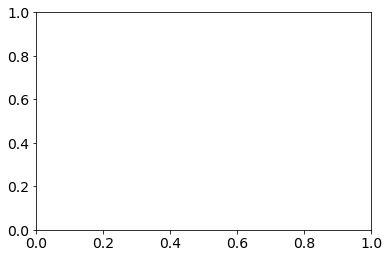

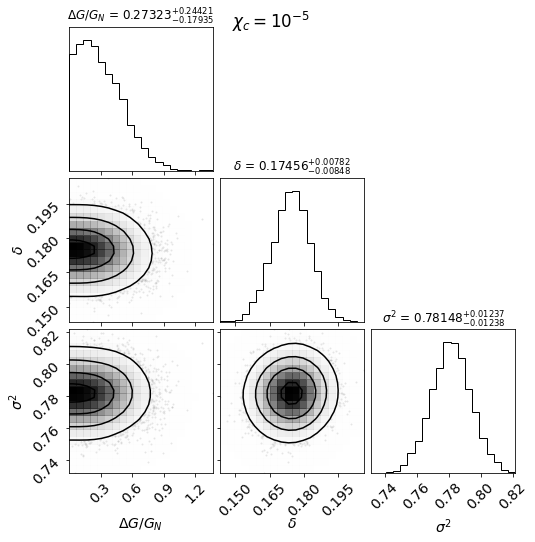

  1%|▏                                          | 5/918 [00:00<00:20, 43.50it/s]

10001-6102 [49.514853266331656] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 49.514853266331656 1.2682823237174825e-09 7.970454556552102e-09
10213-12705 [40.50459748743719] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 40.50459748743719 4.1753405589832885e-09 5.139695380621009e-09
10213-1902 [45.05884422110553] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 45.05884422110553 6.252130754394001e-09 2.876611352126511e-09
10215-1902 [22.82557185929648] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 22.82557185929648 7.478067517429778e-09 1.8200313132787016e-09
10218-12701 [47.8130904

  2%|▋                                         | 14/918 [00:00<00:25, 34.98it/s]

10219-9102 [50] [1.3962, 1.1814, 0.7492, 0.4692, 0.3335, 0.2205, 0.1532, 0.1423, 0.1945, 0.153, 0.0798, 0.0216, -0.0715, -0.157, -0.0196, -0.0532, -0.0405]
10219-9102 50.0 0.0 1.2149415644661268e-07
10220-12705 [47.79433065326634] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 47.79433065326634 3.249577379313578e-09 6.002821370626869e-09
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 1.1874350116535858e-08
10224-9101 [41.54454522613065] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 41.54454522613065 2.8008160584614264e-09 6.5136420693277836e-09
10226-12704 [47.63526633165829] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694, 0.4691, 0.2789, 0.37, 0.364, 0.3135, 0.363, 0.2811, 0.3307, 0.2727, 0.312, 0.3727, 0.1385, 

  2%|█                                         | 22/918 [00:00<00:25, 34.64it/s]

10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 2.8273913825346476e-07
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 2.1140581549314692e-07
10494-12705 [15.30365527638191] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 15.30365527638191 2.766186002794835e-09 6.581340340076224e-09
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 3.7410662575430564e-08
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.0093, -0.0019, -0.047, -0.0973, -0.098, -0.0699]
10494-6101 50.0 0.0 2.434424723640437e

  3%|█▎                                        | 30/918 [00:00<00:25, 34.64it/s]

10495-3702 [35.98089296482412] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 35.98089296482412 2.8791523362491553e-09 6.471043659878848e-09
10496-12704 [44.926484422110555] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268.8121, 253.915, 333.7881, 358.7629, 315.1183, 261.3063, 216.6964, 267.188, 258.5169, 256.0365, 248.4992]
10496-12704 44.926484422110555 8.199986095773654e-09 1.0823138350465649e-09
10496-12705 [42.999079396984925] [-0.3879, -0.1399, 0.1719, 0.4444, 0.4904, 0.2805, 0.2146, 0.344, 0.3105, 0.2505, 0.2112, 0.1741, 0.0585, 0.0082, -0.033, 0.0654, 0.0338, 0.38, 0.1359]
10496-12705 42.999079396984925 7.970224608591654e-09 1.184570355522678e-09
10498-12705 [50] [2.2376, 1.8111, 0.8617, 0.4311, 0.299, 0.2455, 0.2899, 0.2855, 0.265, 0.1888, 0.0491, -0.0661, -0.1083, -0.0652, -0.0315, 0.0942]
10498-12705 50.0 0.0 2.3579887568494412e-07
10499-12705 [50] [-0.9996, -0.9996, -0.9992, -0.9994, -0.9994, -0.9993, -0.99

  4%|█▊                                        | 39/918 [00:01<00:22, 38.50it/s]

10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 2.4185379699247636e-07
10500-12704 [44.75474673366834] [140.7935, 35.4055, 16.1502, 8.7997, 6.1202, 5.6067, 5.0715, 4.9205, 5.0767, 4.6234, 4.2501, 4.0673, 3.8962, 3.8831, 3.7867, 3.6009, 3.0687, 4.1948, 2.9642, 3.5448, 1.9938, -0.2753, 2.8838, 5.8145]
10500-12704 44.75474673366834 6.9585993860751904e-09 2.3974380843257783e-09
10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 3.1406487670582054e-07
10500-3702 [45.71481507537688] [211.267, 568.975, 609.2163, 763.7494, 654.0512, 608.9412, 619.4812, 574.1158, 551.0555, 546.396, 492.531, 452.6766, 495.1396, 321.2342, 371.609, 358.446, 200.8978, 319.0074, 284.1887, 209.7882, 190.8027, 318.1602, 354.0653]
10500-3702 45.71481507537688 6.4463311465546215e-09 2.7587289984414843e-09
10500-3703 [49.28152261306533] [-0.028, -0.1828, 0.6642, 1.1037, 1.7094, 1.5507, 1.8019, 

  5%|█▉                                        | 43/918 [00:01<00:24, 36.17it/s]

10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 1.1167156949507548e-07
10505-12704 [50] [0.6223, 0.447, 0.4087, 0.27, 0.0901, 0.1644, 0.1572, 0.3129, 0.3336, 0.3492, 0.2338, 0.2536, 0.1307, 0.2303, 0.2492, 0.6718, 0.9822, 1.3729, 3.1505, 2.3435]
10505-12704 50.0 0.0 1.450368637211518e-08
10506-9101 [50] [-0.2543, 0.5091, 0.8262, 0.5675, 0.2552, 0.0764, 0.0245, 0.0392, 0.0453, 0.0366, -0.0056, -0.0369, -0.0612, -0.0986, -0.132, -0.0742, -0.1191]
10506-9101 50.0 0.0 1.8170376658270594e-07
10508-12703 [48.297047738693465] [0.5005, 0.4509, 0.1544, 0.1328, 0.1165, 0.1176, 0.065, 0.1329, 0.2506, 0.179, 0.1788, 0.1204, 0.0037, 0.016, -0.0301, -0.0876]
10508-12703 48.297047738693465 1.979753282158481e-09 7.120808886305475e-09
10509-12703 [50] [1226.9439, 2166.987, 2538.8741, 2127.6504, 1648.0951, 1358.0909, 1167.9374, 985.8138]
10509-12703 50.

  6%|██▎                                       | 51/918 [00:01<00:24, 34.95it/s]

10511-12704 [50] [-0.0162, 0.2052, 0.0934, -0.0203, -0.0645, -0.0743, -0.1124, -0.1256, -0.1314, -0.1489, -0.145, -0.1344, -0.261, -0.3154, -0.4542, -0.3737, -0.3967, -0.387, 0.3583, -0.1418, -0.7705]
10511-12704 50.0 0.0 1.207032405872075e-08
10511-12705 [45.85032562814071] [-0.2818, -0.0952, 0.2141, 0.2185, 0.0509, 0.0112, -0.034, -0.0386, -0.0777, -0.1248, -0.1302, -0.15, -0.1634, -0.2053, -0.2903]
10511-12705 45.85032562814071 8.573041904455298e-09 7.573236336870568e-10
10512-12701 [48.03632964824121] [-0.3741, -0.2352, -0.2444, -0.3467, -0.39, -0.3702, -0.2987, -0.245, -0.2376, -0.1861, -0.2187, -0.1372]
10512-12701 48.03632964824121 5.752378092641622e-09 3.0899324835943973e-09
10512-12705 [29.75050251256281] [-0.9971, -0.9962, -0.9967, -0.9971, -0.9969, -0.9968, -0.9961, -0.9958, -0.9964, -0.9971, -0.9977, -0.9977, -0.9977, -0.9976, -0.998]
10512-12705 29.75050251256281 6.220820988876497e-09 3.125356980944066e-09
10512-9102 [42.98044070351759] [4147.3152, 2927.8473, 3245.8656, 28

  6%|██▋                                       | 59/918 [00:01<00:24, 34.70it/s]

10517-3704 [50] [6.5457, 4.9823, 4.7496, 3.3043, 2.1613, 1.6053, 1.1745, 0.9031, 0.7267, 0.8082, 0.6442, 0.6833, 0.6038, 0.6776, 0.66, 0.6521, 0.6265]
10517-3704 50.0 0.0 9.288810436366196e-08
10517-6102 [47.371525125628146] [0.4712, 0.9172, 0.811, 0.5857, 0.3222, 0.2888, 0.1564, 0.1219, 0.169, 0.09, 0.1318, 0.0302, 0.061, 0.0297, 0.0658, 0.0113, 0.072, 0.0733, -0.0232, 0.0238, 0.0127, 0.0739, -0.0903, -0.0528]
10517-6102 47.371525125628146 7.47564827242215e-09 1.6610150213461257e-09
10518-12705 [50] [-0.1971, 0.2795, 0.1103, -0.0254, -0.0161, -0.0, 0.0208, 0.0333, 0.0023, -0.0238, -0.0544, -0.1612]
10518-12705 50.0 0.0 1.424032463586116e-08
10518-1902 [38.13995628140704] [-0.0105, 0.2572, 0.0495, 0.0308, 0.0287, -0.0677, -0.0841, -0.0885, -0.1994, -0.1432, -0.1195, -0.1634, -0.1173, -0.1219, -0.165, -0.1325, -0.1731]
10518-1902 38.13995628140704 5.758600456161102e-09 3.5468538213713737e-09
10518-6102 [38.88642311557789] [-0.217, 1.2282, 0.4062, 0.3459, 0.382, 0.1799, 0.1478, 0.1175, 0

  7%|███                                       | 68/918 [00:01<00:23, 35.94it/s]

10838-9101 [34.193] [-0.0928, 0.4421, 0.4896, 0.3922, 0.2667, 0.3141, 0.2582, 0.2949, 0.294, 0.2543, 0.2198, 0.1153, 0.0076, -0.0625, -0.124, -0.1198, -0.272, -0.3696, -0.3534, -0.3974, -0.2337]
10838-9101 34.193 6.015823541279832e-09 3.307819400303517e-09
10839-12705 [50] [0.5531, 0.4188, 0.6271, 0.6342, 0.4074, 0.3206, 0.1512, 0.1105, 0.1154, 0.1763, 0.2141, 0.3291, 0.2868, 0.1635, 0.0391, 0.4134, 0.1807]
10839-12705 50.0 0.0 1.031555478729334e-06
10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712, 0.035, -0.0115, 0.0248, -0.0288, 0.0512, -0.0187, 0.0073, 0.0432, -0.0916, -0.1233, -0.1818, -0.1471]
10839-3704 50.0 0.0 1.3843972247217877e-07
10839-6101 [47.55502512562814] [244.3098, 615.0842, 876.8345, 1563.8627, 1705.1968, 1816.091, 1687.128, 1731.6052, 1640.9131, 1596.506, 1498.4971, 1406.0518, 671.6148, 995.7509]
10839-6101 47.55502512562814 1.7392113991416006e-09 7.4933258765326e-09
10839-9101 [46.41666582914573] [2.1426, 2.2648, 0.9796, 0.8183, 0.5304, -0.0332, -0.1785, -0.3432, -0.

  8%|███▍                                      | 76/918 [00:02<00:23, 36.12it/s]

10842-3703 [47.76628592964824] [-0.6099, -0.8101, -0.8807, -0.9171, -0.9297, -0.9289, -0.9268]
10842-3703 47.76628592964824 3.6581801779012594e-09 5.456461936834961e-09
10842-9101 [39.83353065326634] [-0.987, -0.9943, -0.9967, -0.9976, -0.9979, -0.998, -0.9982, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9981, -0.998, -0.9982, -0.9979, -0.9982, -0.9983]
10842-9101 39.83353065326634 6.786404571790268e-09 2.4154806901672203e-09
10845-12702 [50] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-12702 50.0 0.0 2.2695605821320932e-07
11004-12705 [45.16756783919598] [-0.8497, -0.6991, -0.5203, -0.3493, -0.2406, -0.2193, -0.1954, -0.1792, -0.1842, -0.1767, -0.1858, -0.1781, -0.195, -0.2173, -0.2294, -0.167, -0.2434, -0.1514, -0.3351, -0.2129]
11004-12705 45.16756783919598 8.198906064194206e-09 9.112326450153418e-10
11004-3703 [1.1541] [5607.0165, 6199.0745, 5122.0907, 4588.5334, 3798.1606, 3256.1827, 2909.7374, 2623.1995, 2081.3

  9%|███▊                                      | 84/918 [00:02<00:24, 34.66it/s]

11010-12705 [50] [-0.0199, 0.0369, -0.0512, -0.0961, -0.0616, -0.0525, -0.0667, -0.0148, -0.0176, -0.0486, -0.0929, -0.1237, -0.1411, -0.2784, -0.0549, -0.2411]
11010-12705 50.0 0.0 4.047351750073075e-08
11010-6104 [50] [669.1593, 612.5725, 580.2933, 433.0387, 377.072, 315.1925, 269.3918, 266.5579, 267.4688, 253.2676, 240.0639, 221.1944, 344.4065]
11010-6104 50.0 0.0 3.9162515520041846e-08
11010-9101 [50] [2.5718, 0.9269, 0.2901, 0.1931, 0.0011, -0.0504, -0.0935, -0.075, 0.0093, 0.0203, 0.0025, -0.0251, -0.0362, 0.0004, 0.0161, -0.0012, -0.102, -0.364, -0.4377]
11010-9101 50.0 0.0 1.840054176163424e-07
11011-12703 [47.795036180904525] [9.8651, 35.0102, 40.3579, 54.0601, 192.4013, 365.0512, 378.092, 411.2362, 282.7202, 230.5846, 329.2445, 263.6472, 244.1501]
11011-12703 47.795036180904525 1.1564597954227596e-09 8.121348927147433e-09
11012-12705 [26.963670351758797] [0.2329, 0.5509, 0.2517, 0.0195, 0.0174, -0.0704, -0.1937, -0.145, -0.249, -0.0592, -0.302, -0.1828, -0.2112]
11012-12705 2

 10%|████▎                                     | 93/918 [00:02<00:20, 39.44it/s]

11013-1902 [50] [0.7893, 0.6453, 0.5024, 0.4895, 0.4034, 0.2175, 0.0455, -0.0103, 0.0142, -0.2569, -0.0412, -0.2183, -0.1712, -0.0824, -0.3609, -0.2323, -0.3117]
11013-1902 50.0 0.0 3.022205488875959e-07
11013-3701 [33.7254944723618] [0.785, 0.6845, 0.2024, 0.0457, 0.0342, 0.02, -0.06, -0.0296, -0.0379, -0.1677]
11013-3701 33.7254944723618 7.82637589032255e-09 1.5123030220025909e-09
11013-3702 [50] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 50.0 0.0 3.2289291074749605e-06
11013-6101 [49.28000301507538] [0.3389, -0.3422, -0.154, -0.2894, -0.4104, -0.4385, -0.4897, -0.4798, -0.43, -0.3971, -0.3753, -0.3775, -0.3376, -0.2419, -0.1243, 0.0068, -0.1557, 0.0318, -0.0178, 0.2532, 0.5345, 0.5099]
11013-6101 49.28000301507538 4.454184459524589e-09 4.659675570203224e-09
11017-12703 [37.03902311557789] [0.0185, 0.3093, 0.3468, 0.2632, 0.2308, 0.2072, 0.1992, 0.215, 0.2444, 0.2273, 0.053, -0.0123, 0.1078, -0.0553]
11017-12703 37.03902311557789 3.310330683039293e-09 6.0

 11%|████▌                                    | 103/918 [00:02<00:19, 42.69it/s]

11018-3702 [50] [0.6083, 0.007, 0.0959, 0.33, 0.5514, 0.4356, 0.3654, 0.3085, 0.3057, 0.287, 0.3004]
11018-3702 50.0 0.0 1.1134707424474582e-07
11018-3703 [50] [-0.5454, 0.4164, 0.6741, 0.5852, 0.6907, 0.7028, 0.6059, 0.5528, 0.656, 0.6306, 0.5445, 0.5549, 0.4676, 0.4329, 0.3355, 0.3242, 0.462, 1.051, 0.5129, 1.3094]
11018-3703 50.0 0.0 1.7789680160420784e-08
11018-6102 [50] [69.1052, 130.9961, 113.1141, 109.1797, 92.5989, 91.6354, 88.5765, 83.9604, 80.137, 76.3564, 74.3146, 74.7218, 70.495, 71.7331, 65.8452, 64.9321, 72.2612]
11018-6102 50.0 0.0 1.1120295041105123e-07
11019-12702 [7.087995477386934] [0.0142, 0.2516, 0.1906, 0.1378, 0.0877, -0.003, 0.0993, 0.0958, 0.1065, 0.1232, 0.2086, 0.1132, 0.0357, -0.0115, -0.014, 0.0302, -0.0875, -0.1071]
11019-12702 7.087995477386934 8.117670836091387e-09 1.240313183745043e-09
11019-12703 [50] [-0.4993, -0.4671, -0.3698, -0.2654, -0.2024, -0.2445, -0.2033, -0.2117, -0.2752, -0.2285, -0.2102, -0.0702, -0.1699, 0.0858, -0.1757, -0.2987]
11019-127

 12%|█████                                    | 112/918 [00:03<00:22, 35.82it/s]

11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 4.620510590376961e-08
11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 3.240665084601231e-08
11742-12704 [40.38391306532664] [0.6702, -0.5312, -0.3481, 0.0047, 0.1348, 0.415, 0.2787, 0.5138, -0.0348]
11742-12704 40.38391306532664 7.160253449346545e-09 2.066695243766385e-09
11743-1901 [50] [-0.5717, -0.3943, -0.5273, -0.3736, -0.306, -0.392, -0.3766, -0.4151, -0.3665, -0.4111, -0.4236, -0.3424, -0.3877, -0.3594, -0.291, -0.4952, -0.6018]
11743-1901 50.0 0.0 6.113378988925408e-08
11744-9102 [50] [-0.6298, 0.0464, 0.3943, 0.6247, 0.4097, 0.3518, 0.3414, 0.4046, 0.4742, 0.4313, 0.3693, 0.3275, 0.2214, 0.1278, 0.0812, 0.4043, 0.1792, -0.1336

 13%|█████▏                                   | 116/918 [00:03<00:22, 35.17it/s]

11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.0361, -0.076, -0.0711, -0.1542, -0.2041, -0.2119, -0.1066, -0.2705, -0.3138]
11745-9101 50.0 0.0 1.2312194568665335e-08
11746-3703 [47.82299045226131] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 47.82299045226131 4.439728886649326e-09 4.459549614403425e-09
11746-3704 [47.34404170854271] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 47.34404170854271 8.072925557587292e-09 1.1607765074916831e-09
11746-9102 [50] [-0.478, -0.2133, -0.2528, -0.1774, -0.2077, -0.2266, -0.2099, -0.2691, -0.1996, -0.2114, -0.1249, -0.1799, -0.1765, -0.1376, -0.2784, -0.2323, -0.1941, -0.3005, -0.2047, -0.3235, -0.1159, 0.1709]
11746-9102 50.0 0.0 1.14385

 14%|█████▌                                   | 124/918 [00:03<00:24, 32.38it/s]

11749-3701 [50] [618.0455, 872.9003, 1483.1859, 1615.2011, 1553.7949, 1334.0598, 1385.5396, 1283.8547, 1216.0833, 1294.494, 1472.7433, 1080.4933, 1346.7897, 1196.9726, 1091.8413, 1216.7304, 927.7028, 363.0292, 281.9853, 551.8779, 169.9359, 54.7426, 122.374, 379.7425, 27.1507]
11749-3701 50.0 0.0 1.241432154744619e-08
11750-12701 [50] [0.4224, 0.3089, 0.0791, 0.0892, 0.2329, 0.2222, 0.1114, 0.03, 0.0196, 0.0027, 0.0313, 0.0827, 0.0275, 0.3095]
11750-12701 50.0 0.0 1.658959103612331e-08
11750-3701 [50] [1.5964, 1.8766, 1.9419, 1.999, 1.4725, 1.2873, 1.1333, 0.934, 0.9463, 0.8918, 0.7347, 0.8508, 0.6677, 0.4619, 0.3762, 0.1866, 0.0367, 0.0915, 0.0086, 0.4665]
11750-3701 50.0 0.0 1.3493553956516376e-07
11750-6103 [50] [6.303, 1.7001, 0.3933, 0.5417, 0.5248, 0.6298, 0.7207, 0.7282, 0.8046, 0.5691, 0.3659, 0.4083, 0.4745, 0.6207, 0.9957, 2.1073, 7.7724]
11750-6103 50.0 0.0 2.599704524378511e-07
11750-9101 [46.89972864321608] [13.4461, 9.2464, 8.3896, 5.4399, 4.9554, 3.0033, 3.1782, 2.4566, 2

 15%|█████▉                                   | 134/918 [00:03<00:20, 37.97it/s]

11753-3703 [50] [0.2801, 0.7604, 0.7391, 0.5795, 0.35, 0.1693, 0.0874, 0.0586, 0.0152, -0.0057, -0.0099, -0.0594, -0.1073, -0.139, -0.1496]
11753-3703 50.0 0.0 8.766527308298925e-08
11753-6104 [50] [1.7058, 1.5787, 1.7231, 1.492, 1.0043, 0.8699, 0.6579, 0.5905, 0.5042, 0.4712, 0.4504, 0.6153, 0.6589, 0.6817, 0.5206, 0.5457, 0.5195, 0.692]
11753-6104 50.0 0.0 2.7379746952159903e-07
11754-1901 [36.52195979899498] [-0.2402, -0.5388, -0.5143, -0.4398, -0.487, -0.4664, -0.4721, -0.5334, -0.5004, -0.4954, -0.6115, -0.5884]
11754-1901 36.52195979899498 6.579463401141351e-09 2.677359440835967e-09
11755-12701 [42.257286432160804] [-0.773, -0.7865, -0.7717, -0.7522, -0.7475, -0.7159, -0.7048, -0.6936, -0.7373, -0.7183, -0.7382, -0.7769, -0.6833, -0.7924, -0.5695, -0.681, -0.5512]
11755-12701 42.257286432160804 7.255145468611759e-09 2.000293897469485e-09
11755-6101 [33.40424120603015] [-0.0093, 1.0489, 0.9853, 1.2444, 1.0667, 0.8902, 0.7008, 0.6245, 0.5835, 0.5179, 0.397, 0.4083, 0.4791, 0.2148, 

 15%|██████▎                                  | 142/918 [00:03<00:22, 34.53it/s]

11759-6102 [33.76229748743719] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, -0.981]
11759-6102 33.76229748743719 3.625733890348863e-09 5.740028516748219e-09
11760-12703 [13.227334170854272] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0.539, 0.1155, 0.1223, 0.309]
11760-12703 13.227334170854272 6.679510410419472e-09 2.691955646254012e-09
11760-6101 [50] [0.4533, -0.0157, 0.5654, 0.502, 0.3995, 0.359, 0.3287, 0.2964, 0.2063, 0.2512, 0.2686, 0.2421, 0.2368, 0.1884, 0.0906, -0.0471, -0.3849, -0.319, -0.8166]
11760-6101 50.0 0.0 1.9663653827924925e-07
11760-6103 [47.569733668341705] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.2117, -0.2373, -0.2365, -0.2317, -0.3078, -0.2653, -0.3184, -0.2638]
11760-6103 47.569733668341705 5.249310988170354e-09 3.6726169139778034e-09
11760-9102 [44.264337688

 16%|██████▌                                  | 146/918 [00:04<00:23, 32.30it/s]

11761-12704 [50] [-0.1205, 0.9952, 0.5814, 0.2296, 0.1208, 0.126, 0.1222, 0.1041, 0.1683, 0.1996, 0.1448, 0.1188, 0.0574, 0.0394, -0.008, -0.026, -0.0331]
11761-12704 50.0 0.0 1.755581557885095e-07
11761-12705 [50] [6.8127, 3.6941, 2.4845, 1.3644, 0.5363, 0.2844, 0.104, -0.1]
11761-12705 50.0 0.0 1.2510603783317398e-08
11823-9101 [50] [15949.1976, 8800.0053, 8323.3916, 4811.1692, 2214.9858, 717.2733, 413.2719, 305.7873, 173.5393, 146.0478, 195.6604, 224.7593, 189.4201, 67.1778]
11823-9101 50.0 0.0 1.2929857543290892e-07
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 4.6047288308711775e-06
11828-12703 [1.0495] [-0.5587, -0.2913, 0.1844, 0.3112, 0.2627, 0.2124, -0.0354, -0.0957, -0.1295, -0.1601, -0.0565]
11828-12703 1.0495 4.605666180024963e-09 4.258839956778119e-09
11830-12701 [50] [-0.9938, -0.9825, -0.9834, -0.9912, -0.9934, -0.9941, -0.9946, -0.9933, -0.9936, -0.9951, -0.9951,

 17%|██████▉                                  | 154/918 [00:04<00:23, 32.26it/s]

11830-3702 [50] [1.2195, 0.9978, 0.6546, 0.4726, 0.5057, 0.555, 0.4749, 0.3884, 0.4626]
11830-3702 50.0 0.0 9.964950827590522e-08
11830-6104 [48.29268592964824] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.0353, -0.2063, -0.258, -0.2347, -0.2692, -0.3985]
11830-6104 48.29268592964824 2.6572889369776283e-09 6.703333860020467e-09
11831-12703 [50] [0.4472, 0.0224, 0.062, 0.158, -0.0429, -0.0922, -0.1252, -0.188, -0.1276, -0.16, -0.2596, -0.2165, 0.1708, -0.4595]
11831-12703 50.0 0.0 2.621207548751762e-08
11831-12704 [35.754850251256286] [-0.5822, -0.2435, 0.0115, -0.0848, -0.1704, -0.028, -0.0888, -0.0323, -0.0445, -0.106, -0.3871, -0.1836]
11831-12704 35.754850251256286 3.97946177403467e-09 5.338674836232581e-09
11831-6101 [41.07087738693467] [-0.9875, -0.994, -0.9968, -0.9973, -0.9967, -0.9975, -0.9969, -0.9978, -0.9979, -0.9971, -0.9984, -0.9986, -0.9985, -0.9974]
11831-6101 41.07087738693467 7.641897213522482e-09 1.7305495948085085e-09
11831-6102 [50]

 18%|███████▏                                 | 162/918 [00:04<00:22, 33.59it/s]

11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 2.52424886699835e-06
11836-1902 [1.2486] [0.7026, 1.2767, 1.1865, 1.1009, 0.973, 0.9921, 0.7024, 0.7206, 0.623, 0.6145, 0.5505]
11836-1902 1.2486 7.385797598658145e-09 1.7313554963637435e-09
11838-12701 [28.814887939698494] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 0.1336, 0.0903, 0.0213, -0.0554, -0.0342, 0.0225, 0.0053, -0.0272]
11838-12701 28.814887939698494 3.684373036200093e-09 5.643002725124291e-09
11838-12703 [50] [144.9042, 254.2159, 538.0129, 911.0748, 1089.8377, 1111.2623, 1284.2649, 1228.3752, 1345.2496, 1400.7846, 1427.4787, 1434.5371, 1257.47, 1184.9615, 998.2342, 830.6266, 670.98, 596.3078, 488.5417, 423.536, 329.6538, 32.3109, 5.6457, 31.8479]
11838-12703 50.0 0.0 2.059714706989887e-07
11838-3702 [50] [0.536, 0.

 19%|███████▌                                 | 170/918 [00:04<00:22, 32.82it/s]

11865-12704 [46.81923969849247] [0.4447, -0.0557, -0.3894, -0.457, -0.5111, -0.5109, -0.5238, -0.5353, -0.4955, -0.5012, -0.4831, -0.4726, -0.599, -0.615]
11865-12704 46.81923969849247 3.252808640991369e-09 5.899614984211021e-09
11865-1901 [50] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 50.0 0.0 2.0147083667871276e-07
11865-1902 [37.42870502512563] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0.4429]
11865-1902 37.42870502512563 4.67527123099255e-09 4.623603885231033e-09
11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 4.552451000076707e-07
11865-9102 [43.181493467336686] [-0.467, -0.4695, -0.4789, -0.5286, -0.6182, -0.6445, -0.6408, -0.6047, -0.6031, -0.6243, -0.655, -0.6895, -0.6998, -0.5904, -0.6729, -0.6983]
11865-9102 43.181493467336686 6.271638651666069e-09 2.8789321523343822e-09
11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2

 19%|███████▊                                 | 174/918 [00:04<00:22, 32.91it/s]

11868-12703 [50.0] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 8.977298583749267e-09
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 4.70439294493062e-08
11871-6103 [50] [0.7182, 0.8575, 0.776, 0.4737, 0.2556, 0.1173, 0.1395, 0.111, 0.0842, 0.0381, 0.0003, -0.0281, -0.0195, -0.044, -0.0588, -0.2086, -0.132, -0.377]
11871-6103 50.0 0.0 2.690980185908545e-07
11940-1902 [50] [-0.0835, 0.1518, 0.1321, 0.0182, -0.0843, -0.1452, -0.1779, -0.1993, -0.1955]
11940-1902 50.0 0.0 6.949129259693442e-08
11940-3703 [42.84408040201005] [1.1615, 1.5645, 1.5154, 1.5213, 1.3625, 1.1856, 0.9977, 0.7191, 0.6591, 0.6153, 0.3767, 0.433, 0.6417, 0.1616, 0.444, 0.2018, 0.0806, 0.2143, 0.1328]
11940-3703 42.84408040201005 7.744903414041603e-09 1.4838121400147717e-09
11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907

 20%|████████▏                                | 182/918 [00:05<00:24, 30.17it/s]

11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 2.5124100385708903e-07
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389.9946, 2439.1642, 2636.587, 2485.7262, 2056.7992, 1736.2622, 1623.5415, 1192.5228, 781.8483, 546.9719, 175.874]
11942-12704 50.0 0.0 1.0683889066888508e-07
11942-6104 [47.06564422110553] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 47.06564422110553 6.960874337681314e-09 2.302186802735474e-09
11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.0425, -0.0331, -0.0546, -0.0982, -0.1371, -0.164, -0.179, -0.1863, -0.172, -0.1572, -0.1563, -0.1648, -0.1726, -0.27]
11943-3703 50.0 0.0 1.7402571228572636e-07
11944-12701 [50] [-0.3604, -0.3617, -0.4276, -0.5869, -0.6347, -0.6283, -0.548, -0.5758, -0.5204, -0.4847, -0.4769, -0.4857, -0.5345, -0.63

 21%|████████▍                                | 189/918 [00:05<00:24, 29.20it/s]

11945-6101 [50] [0.2057, 0.8606, 0.9637, 0.605, 0.4694, 0.2734, 0.2029, 0.1332, 0.0558, -0.0105, 0.0015, 0.0011, -0.0038, -0.016, 0.0504, -0.0338]
11945-6101 50.0 0.0 2.8797127549847547e-07
11945-6102 [50] [3.5224, 2.2109, 1.4349, 1.0152, 0.7457, 0.4864, 0.2556, 0.1192, 0.0508, 0.0117, -0.0209, -0.0683, -0.158, -0.0976, -0.2012]
11945-6102 50.0 0.0 4.0420480322963844e-08
11947-6103 [50] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 50.0 0.0 2.3659065140124374e-08
11949-12701 [50] [1.1975, 0.3408, 0.1441, 0.1243, 0.0225, 0.0003, 0.0028, 0.027, 0.0197, 0.0192, -0.0295, -0.0839]
11949-12701 50.0 0.0 5.457662304705195e-08
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 1.1965711292001785e-06
11954-12704 [50] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453, 0.1801,

 21%|████████▋                                | 195/918 [00:05<00:25, 28.06it/s]

11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.2778]
11954-3703 50.0 0.0 5.329830650293162e-08
11954-9101 [50] [-0.9882, -0.9937, -0.9946, -0.9965, -0.9974, -0.9972, -0.997, -0.9969, -0.997, -0.9974, -0.9978, -0.9979, -0.9973, -0.9971, -0.9976, -0.9966]
11954-9101 50.0 0.0 3.593506626157058e-08
11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 4.053674938805306e-07
11956-12702 [50] [5.6953, 5.0804, 3.2564, 2.1056, 1.2622, 0.6457, 0.4602, 0.5373, 0.9503, 3.7649, 5.1679]
11956-12702 50.0 0.0 1.567896425475134e-08
11956-12705 [50] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 0.2419, 0.2565, 0.3525, 0.1776, 0.103, 0.3387, 0.3814, 0.7221, 0.77]
11956-12705 50.0 0.0 9.074904846396777e-07
11957-12704 [50] [-0.3492, 0.7667, 0.6853, 0.5861, 0.3661, 0.189, 0.1584, 0.

 22%|████████▉                                | 201/918 [00:05<00:26, 26.90it/s]

11957-9101 [49.02606834170854] [127.5969, 337.5453, 692.0501, 754.6672, 761.8038, 673.5367, 561.8056, 470.5271, 446.8561, 434.7914, 434.701, 432.6297, 423.9362, 415.9254, 409.4146, 409.8788]
11957-9101 49.02606834170854 4.6726526130029525e-09 4.58250449884138e-09
11957-9102 [50] [1.0969, 0.3397, 0.6198, 1.0919, 1.791, 2.069, 2.6145, 2.7123, 2.8073, 2.4726, 2.1945, 1.9756, 2.1362, 4.7679, 3.0873, 1.2673, 3.459, 16.3037, 15.1044]
11957-9102 50.0 0.0 1.03608052396823e-08
11958-6103 [48.04769447236181] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 48.04769447236181 5.125583180121656e-09 3.895293175537513e-09
11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 9.72268084696827e-08
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]


 23%|█████████▎                               | 208/918 [00:06<00:25, 27.47it/s]

11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 8.730345076252269e-07
11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.8986, 3.5843, 4.0724, 0.9129, 2.9875, 0.7205, 2.6408, 1.2362]
11969-6101 50.0 0.0 5.4395706272900316e-08
11970-12703 [12.082514572864323] [-0.4888, -0.3498, -0.0561, 0.1594, 0.1669, 0.133, 0.154, 0.1676, 0.144, 0.1071, 0.072, 0.0457, 0.046, 0.0501, 0.1262, -0.0083, 0.2366]
11970-12703 12.082514572864323 7.647470345825583e-09 1.708319624820065e-09
11970-6102 [50] [-0.0116, -0.0683, -0.0558, -0.0053, 0.0454, 0.025, 0.078, -0.0283, -0.085, -0.1052, -0.0602, -0.0272, -0.0693, -0.0116, -0.1378, -0.2799, -0.2497]
11970-6102 50.0 0.0 1.9899058556121546e-08
11970-6103 [50] [0.7466, 1.1751, 1.6643, 1.3977, 1.0416, 0.8262, 0.6871, 0.5199, 0.4194, 0.3266, 0.2718, 0.2909, 0.2357, 0.2575, 0.2139,

 23%|█████████▌                               | 214/918 [00:06<00:26, 26.80it/s]

11975-12701 [50] [-0.1741, -0.13, 0.3291, 1.0808, 1.3321, 1.3798, 1.0057, 0.9745, 0.8989, 0.5699, 0.4672, 0.2163]
11975-12701 50.0 0.0 1.9372863122400245e-07
11975-12705 [50] [0.6902, 0.7621, 0.3208, 0.2527, 0.3317, 0.3259, 0.2387, 0.0864, 0.069, 0.2015, 0.1928, 0.1502, -0.0055, -0.1924]
11975-12705 50.0 0.0 4.2283310274553026e-08
11975-3703 [46.363201005025125] [-0.2597, -0.0329, 0.0768, 0.0833, 0.1048, 0.0682, 0.0342, -0.0156, -0.0756, -0.093, -0.0695, -0.0466, 0.0656, -0.0085, 0.1237, 0.1334, 0.0646]
11975-3703 46.363201005025125 7.65480062208125e-09 1.4860343214290313e-09
11975-6104 [50.0] [1.0196, 1.2709, 1.5062, 1.1104, 0.9965, 0.7778, 0.776, 0.6311, 0.7603, 0.6278, 0.6208, 0.5151, 0.5172, 0.5343, 0.2326, 0.5012, 0.187, 0.4522, 0.1401, 0.1327]
11975-6104 50.0 0.0 9.297218120721886e-09
11976-12703 [50] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 50.0 0.0 3.402010032426805e-08


 24%|█████████▋                               | 217/918 [00:06<00:26, 26.38it/s]

11978-12705 [50] [0.0184, 0.0968, 0.695, 0.4819, 0.223, 0.1168, 0.1458, 0.1604, 0.1304, 0.1363, 0.1451, 0.1188, 0.0734, 0.0413, 0.0374, 0.0059, 0.0584, 0.0708]
11978-12705 50.0 0.0 4.344927758583304e-08
11978-6101 [50] [0.1703, 0.2916, 0.2201, 0.1105, 0.137, 0.0651, 0.0262, 0.0439, 0.1227, 0.0551, 0.0171, -0.0525, -0.106, -0.2018, -0.2281, -0.1584, -0.2752, -0.3694, -0.5359, -0.6656, -0.8099]
11978-6101 50.0 0.0 1.9839144013318026e-07
11979-12703 [50] [0.3188, 0.2646, 0.4444, 0.4735, 0.4231, 0.2818, 0.2037, 0.1891, 0.1975, 0.1625, 0.205, 0.2447, 0.1501, 0.1763, 0.1339, 0.4567, 0.4255, 0.53]
11979-12703 50.0 0.0 4.535218024286676e-08
11979-12704 [50] [1.0417, 0.8488, 0.6206, 0.5652, 0.598, 0.4342, 0.2822, 0.1334, 0.0604, 0.0319, 0.0291, -0.01, -0.083, -0.0554, -0.0215, -0.0081, 0.0344]
11979-12704 50.0 0.0 1.1966971589978877e-08
11979-9101 [49.269418592964826] [0.4094, -0.1099, -0.2651, -0.4134, -0.4241, -0.4727, -0.5, -0.5199, -0.5395, -0.5666, -0.5927, -0.5903, -0.6162, -0.591, -0.670

 24%|█████████▉                               | 223/918 [00:06<00:26, 26.41it/s]

11981-12702 [50] [293.567, 690.112, 683.5389, 617.2849, 490.646, 374.3616, 455.8674, 450.3051, 457.9927, 478.543, 404.234]
11981-12702 50.0 0.0 3.0784608154899135e-07
11981-12704 [46.60672361809045] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]
11981-12704 46.60672361809045 6.053138334954276e-09 2.9111289287566157e-09
11981-9102 [44.252036180904526] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188, -0.1444, -0.128, -0.1812, -0.1904, -0.2284, -0.2044, -0.2061, -0.1486, -0.2345, -0.2114, 0.0329, 0.7603]
11981-9102 44.252036180904526 7.356245196931926e-09 1.8586730419027078e-09
11982-12704 [3.83735175879397] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.1555, 0.0797, -0.029, 0.0037, 0.2331]
11982-12704 3.83735175879397 4.8762619439486064e-09 4.4467782215256976e-09
11982-3703 [50] [-0.314, 0.4086, 0.6273, 0.

 25%|██████████▍                              | 234/918 [00:07<00:23, 29.47it/s]

11984-12701 [43.6662432160804] [-0.2857, -0.1737, 0.0157, 0.0372, -0.1281, -0.2001, -0.1962, -0.1945, -0.1458, -0.0921, -0.099, -0.116, -0.1666, -0.325, -0.2122, -0.442]
11984-12701 43.6662432160804 5.788684601413593e-09 3.556105362208072e-09
11984-12702 [45.43304924623116] [-0.2774, -0.3248, -0.3706, -0.3541, -0.339, -0.3481, -0.2877, -0.2577, -0.2022, -0.1466, -0.1889, -0.2485, -0.0638, -0.2124, -0.1581, -0.3914, -0.132]
11984-12702 45.43304924623116 5.8993931344874e-09 3.2107853297903787e-09
12066-3701 [48.54785829145728] [19.2418, 16.9197, 10.1428, 6.0915, 4.4316, 3.0783, 2.9929, 2.3906, 2.7183, 2.8356, 3.2869, 3.669, 3.475, 3.6088, 2.499, 1.7084, 1.9485, 1.5899]
12066-3701 48.54785829145728 4.7746422254945815e-09 4.214041323038143e-09
12067-12703 [48.0927959798995] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
12067-12703 48.0927959798995 7.52056282166398e-09 1.4326615652

 26%|██████████▌                              | 237/918 [00:07<00:24, 27.25it/s]

12069-12704 [50] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 50.0 0.0 2.100367743656894e-07
12069-12705 [50] [1.7332, 1.137, 0.4096, 0.6564, 0.5837, 0.6168, 0.2246, 0.0587, 0.2617, 0.1538, 0.5607, 0.4132, 0.5307, 0.41, 2.8782]
12069-12705 50.0 0.0 2.0874229789712054e-07
12069-6102 [50] [-0.3102, -0.0764, -0.2402, -0.1833, -0.1952, -0.2158, -0.2095, -0.1861, -0.144, -0.1353, -0.1037, -0.1026, -0.0816, -0.0956, -0.1367, -0.1477, -0.0871, -0.0667, -0.0387, -0.58, -0.56, -0.5359, -0.8946, 0.038]
12069-6102 50.0 0.0 1.5897338437426447e-08
12071-12701 [46.070432160804025] [-0.9172, -0.8384, -0.6786, -0.6994, -0.7429, -0.7686, -0.7662, -0.8217, -0.8275, -0.8401, -0.7831, -0.8143]
12071-12701 46.070432160804025 2.2277560769834076e-09 7.1026680830783936e-09
12071-1901 [31.049253266331657] [-0.148, -0.1411, -0.1881, -0.1802, -0.1874, -0.1463, -0.1611, -0.1934, -0.1236, -0.1115, 0.0697, 0.0471, 0.104

 27%|██████████▉                              | 244/918 [00:07<00:24, 27.62it/s]

12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.3083, 398.9949, 258.1108, 178.8144, 146.4641, 210.3609, 51.4796, 32.8354, 22.052]
12071-3704 50.0 0.0 5.639663086450177e-07
12075-12704 [50] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 50.0 0.0 3.29947483227099e-08
12078-12703 [50] [0.3298, 0.5608, 0.2182, 0.3221, 0.2303, 0.0896, 0.0846, 0.2051, 0.3186, 0.33, 0.2532]
12078-12703 50.0 0.0 1.0305513344618928e-06
12078-6103 [41.78999095477387] [1.9637, 5.3953, 4.122, 4.276, 4.2033, 3.4926, 3.3028, 3.2038, 3.1762, 3.0769, 2.868, 2.5911, 2.6527, 2.4952, 2.6226, 2.6979, 2.1328, 1.6158, 1.3218, 1.8508]
12078-6103 41.78999095477387 6.439332464241257e-09 2.831459930023191e-09
12079-12705 [46.61827537688442] [5.9457, 5.134, 4.915, 2.376, 2.7696, 2.3345, 1.3415, 1.441, 1.4148, 0.8317, 1.0553, 1.0687, 0.9662, 0.8766, 1.1537, 1.4538, 0.8336]
12079-12705 46.61827537688442 6.387046737926

 27%|███████████▏                             | 250/918 [00:07<00:25, 26.69it/s]

12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 1.1796502932502245e-07
12082-12702 [43.97469849246231] [52.4225, 34.225, 22.353, 15.87, 12.6473, 9.0293, 9.0994, 7.7946, 7.7752, 7.6215, 7.2913, 5.8669, 7.5773, 10.9051, 27.4723, 42.4809, 31.8612, 44.26]
12082-12702 43.97469849246231 5.382444566543293e-09 3.881188000508633e-09
12084-12702 [50] [0.4179, 1.0492, 0.9255, 0.717, 0.5874, 0.4344, 0.359, 0.2445, 0.1712, 0.1342, 0.2131, 0.2682, 0.3105, 0.3163]
12084-12702 50.0 0.0 4.373795666968537e-08
12084-12704 [27.108874371859297] [-0.663, -0.3425, -0.4511, -0.3814, -0.1944, -0.0031, -0.041, -0.1276, -0.2047, -0.2499, -0.2565, -0.1988, -0.1657, -0.268, -0.3391, -0.2896]
12084-12704 27.108874371859297 7.654862215196845e-09 1.6865536855722863e-09
12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-1

 28%|███████████▍                             | 256/918 [00:07<00:25, 26.03it/s]

12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
12084-3702 50.0 0.0 1.1907116148704419e-08
12084-3703 [43.2512824120603] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.866, 9.9199, 8.0438, 7.1191, 7.1184, 4.9585, 5.2578]
12084-3703 43.2512824120603 3.2153556751695292e-09 6.098436274155622e-09
12084-6104 [49.035813065326636] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.0374, 0.0776, -0.025, -0.0223, -0.0093, -0.0487, 0.0214, -0.2045, 0.0836]
12084-6104 49.035813065326636 9.727073243284745e-10 8.249310679637988e-09
12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0.0071, -0.0873, -0.0572, 0.0209, 0.0881, 0.0588, 0.0753, 0.0542]
12085-12704 50.0 0.0 2.297238150247301e-07
12085-6101 [49.758349246231155] [-0.1417, -0.3914, -0.1738, -0.0755, -0.0973, -0

 29%|███████████▋                             | 263/918 [00:08<00:23, 28.48it/s]

12085-6103 [50] [-0.549, -0.354, -0.3619, -0.3336, -0.3191, -0.1878, -0.2268, -0.2779, -0.144, -0.2236, -0.1423, -0.1582, -0.1565, -0.2223, -0.1937, -0.2795, -0.2396, -0.2355, -0.213, -0.3557, -0.311]
12085-6103 50.0 0.0 9.822602286923042e-09
12085-9102 [50] [0.6086, 0.5632, 0.3343, 0.2119, 0.1282, 0.0402, 0.0288, 0.0478, 0.0313, 0.001, -0.0532, -0.0537, -0.0634, -0.0662, -0.1794, -0.1779, -0.239]
12085-9102 50.0 0.0 1.3137067458246142e-08
12088-12705 [33.714656783919594] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-12705 33.714656783919594 4.677997145722062e-09 4.624124835167846e-09
12088-9101 [50] [1.3886, 1.0744, 0.6164, 0.1772, -0.0928, -0.1728, -0.2424, -0.3552, -0.3861, -0.4243, -0.4358, -0.4341, -0.4454, -0.4408]
12088-9101 50.0 0.0 1.3497903222361855e-08
12089-12702 [5.631420100502512] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258

 30%|████████████                             | 271/918 [00:08<00:19, 33.25it/s]

12092-6101 [44.35158140703518] [0.0026, 0.3918, 0.1405, 0.0977, 0.005, 0.0277, 0.1281, 0.0885, 0.0628, 0.0291, -0.0173, -0.1181]
12092-6101 44.35158140703518 6.906821124318783e-09 2.438025142317839e-09
12093-9101 [39.50452110552764] [-0.9989, -0.997, -0.9973, -0.998, -0.9985, -0.9987, -0.9987, -0.9986, -0.9986, -0.9987, -0.9983, -0.9981, -0.9979, -0.9991, -0.9971]
12093-9101 39.50452110552764 5.4435981626174424e-09 3.810886725248284e-09
12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 40.9064, 40.0677, 39.5836, 40.4106, 39.3101, 37.4365, 38.9587, 41.7447, 41.525, 40.104, 39.0721, 39.6893, 56.2685, 25.7726, 27.1981, 33.78]
12094-3701 50.0 0.0 2.3768270422994066e-07
12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 1.972908527661962e-07
12483-12703 [49.511927638190954] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -

 30%|████████████▍                            | 279/918 [00:08<00:18, 34.56it/s]

12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696, 2047.2799, 2334.4928, 2266.757, 2196.3005, 1862.0235, 1612.2288, 2078.9089]
12488-6102 50.0 0.0 2.3573007805295348e-07
12488-9101 [40.08115226130653] [0.89, -0.0571, 0.0018, 0.0675, 0.0814, 0.1021, 0.1178, 0.0708, 0.0758, 0.1268, 0.0533, 0.0597, 0.0532, 0.0414, 0.1038, 0.0181, -0.1356, -0.2319, -0.1377]
12488-9101 40.08115226130653 7.450670431398812e-09 1.912604265468737e-09
12489-3703 [50] [6.1258, 7.3921, 7.9142, 7.3592, 6.7186, 6.0984, 5.5884, 5.3024, 5.0796, 4.2963, 4.3283, 3.7505, 4.11, 3.5385, 4.098]
12489-3703 50.0 0.0 1.3644349646699954e-07
12490-3701 [50] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-3701 50.0 0.0 2.855321595369616e-08
12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455

 31%|████████████▊                            | 288/918 [00:08<00:18, 34.76it/s]

12514-12702 [50] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 50.0 0.0 1.2047829145012008e-07
12514-12703 [19.570414572864323] [2.1408, 0.3201, 0.1941, 0.0194, 0.03, 0.0603, 0.1872, 0.1977, 0.0662, 0.1145, 0.0325, -0.0142, 0.021, -0.0315, -0.0845, -0.0224]
12514-12703 19.570414572864323 8.551015328762734e-09 7.646277403904846e-10
12514-9102 [50] [-0.6627, -0.5978, -0.3356, -0.1465, -0.1607, -0.0924, -0.0736, -0.019, 0.0855, 0.1041, 0.0741, -0.06, -0.1592, -0.1356, -0.0632, -0.2008, -0.2854]
12514-9102 50.0 0.0 8.90689863800403e-08
12518-12705 [49.50976281407035] [-0.8683, -0.7393, -0.3648, -0.0579, -0.0274, -0.0334, -0.0145, 0.016, -0.0154, 0.0703, -0.1575, 0.0272]
12518-12705 49.50976281407035 6.332482908415301e-10 8.58143643702296e-09
12518-6101 [45.3821216080402] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.

 32%|█████████████                            | 292/918 [00:09<00:18, 33.59it/s]

12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 1.59712831785318e-08
12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903, -0.5645]
12621-12705 50.0 0.0 1.1088004920660879e-08
12621-6103 [48.55786834170854] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 48.55786834170854 2.331106898048262e-09 6.981321687131608e-09
12622-9101 [50] [0.295, -0.1664, 0.1745, 0.5326, 0.7376, 0.7334, 0.6499, 0.6151, 0.5534, 0.5303, 0.427, 0.3612, 0.3993, 0.3837, 0.4878, 0.4757, 0.3843, 0.0845]
12622-9101 50.0 0.0 1.240546020737203e-07
12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 2.1149383387778573e-07
126

 33%|█████████████▍                           | 300/918 [00:09<00:19, 31.33it/s]

12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 1.7324803998980783e-08
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 9.676346018598482e-08
12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 1.0166297629511265e-07
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 4.392138939598603e-07
12679-12701 [38.356590452261315] [-0.4106, -0.1602, -0.09, 0.0292, -0.1142, -0.1585, -0.1702, -0.2231, -0.1617, -0.1473, -0.165, -0.0765, -0.2919, -0.3168, -0.5268, -0.1813, 0.1098, -0.9954]
12679-12701 38.3565904

 34%|█████████████▊                           | 308/918 [00:09<00:19, 30.87it/s]

7443-12703 [49.04198190954774] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 49.04198190954774 6.68241920922224e-09 1.6433741828758232e-09
7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1547, -0.1713, -0.2761, -0.2934, -0.2123]
7443-12704 50.0 0.0 1.1853393990724082e-06
7443-6102 [36.95693768844221] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 36.95693768844221 6.7160842794079e-09 2.6152593894576717e-09
7443-9101 [39.87928743718593] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.0333, -0.0403, -0.0345, -0.091, -0.0525, -0.2174, -0.2135, -0.5859, -0.4094]
7443-9101 39.87928743718593 7.810731733306418e-09

 34%|█████████████▉                           | 312/918 [00:09<00:19, 30.67it/s]

7815-12705 [43.47806180904522] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 43.47806180904522 5.859353080276484e-09 3.323170469791432e-09
7815-3702 [47.355168844221105] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 47.355168844221105 4.469785090201168e-09 4.51900425235697e-09
7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 1.5665075775390483e-07
7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 1.885491591608068e-07
7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311

 35%|██████████████▏                          | 319/918 [00:09<00:22, 26.71it/s]

7958-6101 [42.982058291457285] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 42.982058291457285 8.35686617677121e-09 8.066521394419242e-10
7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 6.462312715774749e-08
7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 1.1090978412958559e-07
7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 2.7898907694970374e-08
7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 8.684442819287202e-08


 35%|██████████████▍                          | 323/918 [00:10<00:21, 27.89it/s]

7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 1.962944180916063e-06
7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 7.261932202224438e-08
7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 1.6141711094173327e-07
7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 8.082897658134831e-08
7961-12705 [48.52953869346734] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 48.52953869346734 3.785535468549269e-09 5.069029048595489e-09
7961-3702 [50] [-0.7823, -0.438, 

 36%|██████████████▊                          | 331/918 [00:10<00:19, 29.57it/s]

7962-12705 [26.53436783919598] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 0.4867, 0.496, 1.2096, 1.0729, 0.2753, 1.3845, 3.2136]
7962-12705 26.53436783919598 7.74006055608941e-09 1.6014562178426758e-09
7962-6104 [48.083171859296485] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 48.083171859296485 1.491311858330067e-09 7.864695453592762e-09
7963-12702 [45.41569145728643] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, -0.9982, -0.9988, -0.9993]
7963-12702 45.41569145728643 5.880432101605313e-09 3.462568469654113e-09
7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 50.0 0.0 9.538406787738044e-08
7963-9102 [50] [-0.1544, 0.8304, 0.601

 37%|███████████████                          | 338/918 [00:10<00:19, 29.83it/s]

7965-12701 [50] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085, -0.0802, -0.1254, -0.0438, 0.0028, -0.0995, -0.4017]
7965-12701 50.0 0.0 1.2756016725154e-07
7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-1901 50.0 0.0 6.598305964794088e-08
7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 50.0 0.0 3.140284387317634e-08
7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211.5514, 236.7821, 394.8881, 237.9732]
7965-6102 50.0 0.0 2.692667013163245e-08
7965-9102 [47.56394472361809] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 47.56394472361809 2.06496033023304

 38%|███████████████▍                         | 345/918 [00:10<00:20, 28.24it/s]

7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 1.1741718926062747e-08
7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 9.125093223977795e-08
7975-9102 [50] [-0.4649, 0.0396, 0.5148, 0.8957, 0.7258, 0.6065, 0.5756, 0.5119, 0.3508, 0.2963, 0.2474, 0.347, 0.3968, 0.5053, 0.5166, 0.5241, 0.6047, 0.5302, 0.4626]
7975-9102 50.0 0.0 1.032692564347445e-07
7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 1.1953713425897849e-08
7977-1902 [40.36605929648241] [0.1072, 0.2856, 0.0387, 0.0618, 0.0363, 0.0042, -0.0291, -0.0297]
7977-1902 40.36605929648241 7.311281688303997e-09 1.8556784742981384e-09
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.0

 38%|███████████████▋                         | 351/918 [00:11<00:19, 28.53it/s]

7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 7.986222027771195e-07
7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 1.1366757897984177e-07
7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 8.302153139368167e-07
7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 50.0 0.0 1.5421347374428153e-08
7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 5.956188037221679e-07
7990-6104 [50] [-0.3051, -0.0723, 0

 39%|███████████████▉                         | 357/918 [00:11<00:19, 28.51it/s]

7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 1.9404493893997653e-08
7992-1902 [48.757092964824125] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 48.757092964824125 3.6757747212171487e-09 5.667877300875474e-09
7992-6104 [42.1918391959799] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 42.1918391959799 5.507227868082985e-09 3.8470962322850914e-09
7993-3704 [50] [0.1426, 0.6478, 0.7852, 0.7203, 0.4452, 0.3539, 0.3376, 0.3307, 0.3891, 0.4022, 0.3636, 0.3593, 0.2903, 0.2711, 0.3491, 0.3594]
7993-3704 50.0 0.0 9.035896339144268e-08
8075-12701 [44.43265929648241] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 44.43265929

 40%|████████████████▏                        | 363/918 [00:11<00:19, 28.15it/s]

8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 2.96197248594783e-07
8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 4.788397661113352e-08
8078-12703 [50.0] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 8.95529568683983e-09
8078-6103 [50] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149, 0.1969, 0.1396, 0.1246, 0.1262, 0.1162, 0.0747, 0.0502, 0.0254, 0.0225, 0.0724, 0.0304, 0.0506, 0.0715]
8078-6103 50.0 0.0 7.766992932989019e-07
8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 1.243530237569673e-08
8080-12701 [6.546711557788944] [0.2471, 0.2884, 0.2903, 0

 40%|████████████████▌                        | 370/918 [00:11<00:19, 28.68it/s]

8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 2.299635212321712e-08
8081-3704 [20.305987939698493] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 20.305987939698493 8.359152438604451e-09 9.670635401541267e-10
8082-9102 [50.0] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 9.101818479879569e-09
8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81, 2355.4256, 1939.6384]
8083-12703 50.0 0.0 1.5389605245254443e-06
8083-12704 [50] [0.2913, 0

 41%|████████████████▊                        | 376/918 [00:11<00:19, 27.95it/s]

8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 1.2911632013682024e-08
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 1.5136293837445241e-06
8087-12704 [39.575935678391964] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 39.575935678391964 2.8945694233934124e-10 9.081150014736411e-09
8088-12705 [38.51338894472362] [-0.3463, 0.227, 0.3794, 0.8027, 0.7079, 0.6652, 0.4965, 0.2205, 0.0843, 0.0719, 0.1789, 0.1537, -0.3721, 0.0321]
8088-12705 38.51338894472362 8.333479294132245e-09 9.169975176107581e-10
8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 7.2275

 42%|█████████████████                        | 382/918 [00:12<00:19, 27.45it/s]

8092-12702 [47.83433768844221] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 47.83433768844221 6.129586884807649e-09 2.9063264207987587e-09
8095-1902 [42.09623467336683] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 42.09623467336683 7.410447169045349e-09 1.7526416172738237e-09
8095-6102 [44.99181658291457] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276, 0.127, 0.1403, 0.0994, 0.0731, 0.0391, -0.0442, -0.086, -0.1131, -0.1728, -0.221, -0.1357, -0.3768, -0.0266, -0.186, -0.3752]
8095-6102 44.99181658291457 5.323142899374447e-09 4.013684395503579e-09
8131-6101 [44.02579145728643] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.308

 42%|█████████████████▎                       | 388/918 [00:12<00:18, 28.30it/s]

8132-6102 [43.89801507537688] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 43.89801507537688 7.434188997227761e-09 1.7199012415506162e-09
8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 1.311809585491143e-07
8134-6103 [14.673795979899499] [-0.9997, -0.9993, -0.9996, -0.9996, -0.9995, -0.9994, -0.9992, -0.999, -0.9989, -0.9988, -0.9985, -0.9984, -0.9986, -0.9988, -0.9991, -0.9993, -0.9988, -0.9979, -0.9983]
8134-6103 14.673795979899499 7.52341264721447e-09 1.804101468422038e-09
8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 2.542969902013457e-08
8135-12702 [39.35206633165829] [-0.0587, -0.0535, 0.1564, 0.1223, 0.0981, 0.0594, 0.0486, 0.0064, 0.0544, 0.0081, -0.0341, -0.0178, 0.0479, -0.1192, 0.2429, -0.0574, -0.0315

 43%|█████████████████▌                       | 394/918 [00:12<00:19, 27.33it/s]

8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 50.0 0.0 8.956691585782311e-08
8138-12702 [43.08401005025126] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 43.08401005025126 5.507184708513464e-09 3.861075731498946e-09
8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 1.0495720089967499e-08
8139-12705 [36.546253768844224] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 36.546253768844224 6.1913399052773956e-09 3.1810438074884053e-09
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.309

 43%|█████████████████▋                       | 397/918 [00:12<00:19, 26.84it/s]

8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 6.21404751908527e-07


 44%|█████████████████▊                       | 400/918 [00:13<00:31, 16.29it/s]

8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 1.0707050227869328e-08
8144-12702 [50] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 50.0 0.0 1.198737992592952e-07
8144-12703 [47.08338492462312] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 47.08338492462312 6.728040516003566e-09 2.1345436487000194e-09
8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 4.554679161235331e-07
8144-6101 [50] [0.8479, 398.8294, 2.1289, 4.0614

 44%|██████████████████▏                      | 406/918 [00:13<00:25, 19.71it/s]

8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 1.014069708491689e-07
8145-9101 [42.25784924623115] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 42.25784924623115 1.980662379255875e-09 7.334973007661621e-09
8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 7.281409733481347e-07
8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 8.15662375814612e-08
8146-9102 [47.849529145728646] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0

 45%|██████████████████▍                      | 412/918 [00:13<00:22, 22.27it/s]

8147-12703 [44.67611055276382] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 44.67611055276382 8.489764126765921e-10 8.497239709612863e-09
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 5.581362112904328e-07
8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 2.380844054451875e-08
8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 2.4928668361498903e-07
8150-6101 [43.32454673366834] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995,

 46%|██████████████████▋                      | 418/918 [00:13<00:20, 23.98it/s]

8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 4.7855889180924493e-08
8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 4.866083421857212e-08
8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 5.281556742481527e-08
8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 1.1563762941448569e-08
8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 50.0 0.0 9.617672844621636e-08
8155-6104 [50] [-0.4135, -0.0766

 46%|██████████████████▉                      | 424/918 [00:14<00:20, 24.61it/s]

8156-3701 [25.551300502512564] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 25.551300502512564 8.489056835463384e-09 8.205567832716074e-10
8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 4.320862636701444e-06
8158-6104 [47.62374371859297] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 47.62374371859297 7.687287991986283e-09 1.3071698131010911e-09
8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 1.3248756553912826e-07
8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262

 47%|███████████████████▏                     | 430/918 [00:14<00:19, 25.28it/s]

8241-6102 [46.136225125628144] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 46.136225125628144 6.380145471686241e-09 2.941406853535452e-09
8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 8.663632863026657e-07
8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 9.452415637764624e-09
8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 1.3589231589224406e-07
8245-12701 [40.257226130653265] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.21

 47%|███████████████████▍                     | 436/918 [00:14<00:19, 25.25it/s]

8247-12702 [39.15111055276382] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063, 0.3394, 0.315, 0.2267, 0.2019, 0.1944, 0.0714, 0.0833, -0.0149, -0.0523, -0.0057]
8247-12702 39.15111055276382 6.7254021324935435e-09 2.6324993947081687e-09
8247-12703 [43.098947236180905] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198, 0.0377, 0.0036, 0.0008, -0.06, -0.0599, -0.143, -0.1175, -0.2298, -0.1346, -0.2636, -0.3037, -0.2082, -0.3452, -0.2949, -0.2375, -0.5737, -0.8428, -0.2863]
8247-12703 43.098947236180905 7.354661457576252e-09 1.8170072492461062e-09
8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 2.9494477705909287e-06
8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]


 48%|███████████████████▌                     | 439/918 [00:14<00:19, 24.45it/s]

8248-12702 [50] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 50.0 0.0 5.4216158214594683e-08
8248-12704 [41.96310703517588] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 41.96310703517588 7.985192549849158e-09 1.2617216929300726e-09
8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 1.577333074607338e-07
8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 1.05036417316816e-08
8249-6102 [42.397877386934674] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -

 48%|███████████████████▊                     | 445/918 [00:14<00:20, 23.54it/s]

8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 50.0 0.0 8.067699248354501e-08
8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 1.2649453124318511e-08
8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 1.3353491674966828e-07
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 2.4874533231773926e-08
8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 2.5

 49%|████████████████████▏                    | 451/918 [00:15<00:20, 22.43it/s]

8252-9102 [50] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 568.3335, 671.6366, 717.9725, 510.1554, 342.074, 302.1941, 260.3132, 157.5104, 244.502, 117.7782, 292.6015, 101.1592]
8252-9102 50.0 0.0 1.3787023949343111e-08
8253-3703 [29.03645376884422] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-3703 29.03645376884422 3.914286571149852e-09 5.453409369895974e-09
8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 1.7632204735884702e-06
8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-

 49%|████████████████████▎                    | 454/918 [00:15<00:23, 19.47it/s]

8254-3704 [48.77251507537689] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 48.77251507537689 1.1138629565359947e-09 8.232838952503713e-09
8255-12701 [41.65349547738694] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 41.65349547738694 4.443147794153098e-09 4.914149674188183e-09
8255-12702 [1.0391] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563]
8255-12702 1.0391 3.966967248080626e-09 5.1522064859225466e-09
8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 3.1540058172021e-07


 50%|████████████████████▌                    | 459/918 [00:15<00:26, 17.49it/s]

8257-6101 [32.778361306532666] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 32.778361306532666 6.853585997032536e-09 2.4875375772022405e-09
8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 1.3303590551231222e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 5.789386845580422e-07


 50%|████████████████████▌                    | 461/918 [00:15<00:27, 16.83it/s]

8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 9.580555255536685e-09
8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.0 0.0 1.122469890049838e-07
8261-12705 [43.139507537688445] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 43.139507537688445 4.3065352770995205e-09 5.030299576781048e-09
8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 1.734118574187962e-07


 51%|████████████████████▊                    | 465/918 [00:16<00:28, 16.04it/s]

8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 1.4575031431454245e-07
8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 1.4264026598229796e-07
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 9.82048462399169e-09


 51%|████████████████████▉                    | 469/918 [00:16<00:29, 15.14it/s]

8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.0 0.0 3.4224583370633247e-07
8263-12705 [43.61587638190955] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 43.61587638190955 8.195545168483155e-09 1.1413115176215482e-09
8310-3701 [49.05651256281407] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 49.05651256281407 2.7855990623886957e-09 6.197992979844706e-09


 51%|█████████████████████                    | 471/918 [00:16<00:30, 14.43it/s]

8310-9101 [44.011608040201004] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 44.011608040201004 7.56727660362443e-09 1.5555486561701807e-09
8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 7.857513755975059e-07
8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 1.549093030434147e-07


 52%|█████████████████████▏                   | 473/918 [00:16<00:34, 13.01it/s]

8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 3.059163366865782e-08
8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 6.462001433150621e-08
8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 3.14699599346326e-08


 52%|█████████████████████▎                   | 477/918 [00:17<00:37, 11.73it/s]

8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 2.464179725427127e-07
8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 9.482692550137491e-08
8313-9101 [49.51489447236181] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 49.51489447236181 1.0138611525985048e-09 8.11148071521138e-09


 52%|█████████████████████▍                   | 481/918 [00:17<00:36, 12.06it/s]

8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 2.027291735841156e-08
8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 2.208103062065551e-08
8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 2.7186248981063724e-08


 53%|█████████████████████▌                   | 483/918 [00:17<00:35, 12.35it/s]

8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 2.9635608573787026e-08
8315-9102 [41.791989949748746] [-0.2166, -0.0917, -0.1207, -0.1704, -0.1891, -0.1464, -0.1933, -0.1616, -0.278, -0.2739, -0.2356, -0.2454, -0.332, -0.1867, 1.4585, 0.3111, 0.4387, 0.2663]
8315-9102 41.791989949748746 8.011605274291944e-09 1.1595647109668781e-09
8317-6102 [46.85944824120603] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 46.85944824120603 6.48543025344555e-09 2.5104503117856274e-09


 53%|█████████████████████▊                   | 487/918 [00:17<00:34, 12.64it/s]

8317-9101 [45.91287537688442] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 45.91287537688442 7.013529168449392e-09 2.248457225534451e-09
8318-12703 [47.79874472361809] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 47.79874472361809 6.2689012295301896e-09 2.918000352358656e-09
8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 1.1976704379089784e-08


 53%|█████████████████████▊                   | 489/918 [00:18<00:33, 12.84it/s]

8318-3703 [38.11890351758794] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 38.11890351758794 3.209399299023827e-09 6.162570348789994e-09
8318-6101 [46.087887437185934] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 46.087887437185934 6.560850789631578e-09 2.6584879735733415e-09
8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 7.068694460759944e-08


 53%|█████████████████████▉                   | 491/918 [00:18<00:33, 12.73it/s]

8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 3.239115691620382e-08
8319-6102 [17.42830351758794] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 17.42830351758794 5.776038236215015e-09 3.550932117048513e-09
8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 3.5349343289262626e-08


 54%|██████████████████████                   | 495/918 [00:18<00:33, 12.61it/s]

8320-9102 [48.0596703517588] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 48.0596703517588 7.585232295626293e-09 1.6086665449757518e-09
8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 8.413712346673872e-07
8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 3.4657353012467e-07


 54%|██████████████████████▎                  | 499/918 [00:18<00:31, 13.33it/s]

8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 8.647733154365565e-08
8324-12703 [13.650350753768844] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 13.650350753768844 4.598333039038037e-09 4.773691837672352e-09
8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 1.97678533252174e-07


 55%|██████████████████████▍                  | 501/918 [00:18<00:31, 13.23it/s]

8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 1.379423181101695e-07
8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 9.460149942856342e-08
8329-6103 [43.21001407035176] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 43.21001407035176 8.281410608070111e-09 1.003099883563167e-09


 55%|██████████████████████▌                  | 505/918 [00:19<00:30, 13.42it/s]

8329-6104 [9.414384422110553] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 9.414384422110553 4.400280085427194e-09 4.963596618237945e-09
8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 5.219983016455157e-08
8330-6102 [41.56749748743719] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 41.56749748743719 6.486970372474041e-09 2.877654036131586e-09
8330-9101 [45.334335175879396] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 45.334335175879396 3.6228581075083836e-09 5.591055714551603e-09


 55%|██████████████████████▋                  | 507/918 [00:19<00:30, 13.32it/s]

8331-12704 [44.6419608040201] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 44.6419608040201 3.8479159557461835e-09 5.465951200078099e-09
8332-12701 [42.96758743718593] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 42.96758743718593 6.242408453378321e-09 3.0044494404108183e-09
8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 6.926853618175435e-07


 56%|██████████████████████▊                  | 511/918 [00:19<00:29, 13.60it/s]

8332-3702 [18.895614070351755] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 18.895614070351755 6.575837910917597e-09 2.7404349018186754e-09
8332-9101 [3.332132663316583] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 3.332132663316583 6.215243070404617e-09 3.048091150090117e-09
8334-3704 [39.67632663316583] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409, 0.6746, 0.3496, 0.5455, 0.2807, 0.4323, -0.0995, 0.0558, 0.4872, 0.3896, 3.1841, -0.3157]
8334-3704 39.67632663316583 8.312488545911613e-09 8.583373480585694e-10
8335-12705 [24.756097487437184] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 24.756097487437184 5.761262042721762e-09 3.6076277593444823e-09


 56%|███████████████████████                  | 515/918 [00:19<00:30, 13.42it/s]

8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 1.1362316696619853e-06
8336-9102 [38.8182783919598] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 38.8182783919598 8.499789659604877e-09 7.576384379405833e-10
8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 2.6043267394318235e-08


 57%|███████████████████████▏                 | 519/918 [00:20<00:30, 13.19it/s]

8341-6102 [48.56281005025125] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 48.56281005025125 3.483223409157556e-09 5.717014714414975e-09
8341-9101 [43.83739899497487] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 43.83739899497487 6.817185429855771e-09 2.4477138768141924e-09
8438-12702 [20.1698351758794] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 20.1698351758794 2.3297837919378727e-09 7.02572796544369e-09


 57%|███████████████████████▎                 | 521/918 [00:20<00:30, 12.94it/s]

8439-12703 [47.80396834170855] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 47.80396834170855 6.098585902683157e-10 8.754127950905952e-09
8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 1.3833341870027543e-08
8441-12701 [47.79449798994975] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 47.79449798994975 2.535262124465172e-09 6.725394586965162e-09


 57%|███████████████████████▎                 | 523/918 [00:20<00:30, 12.78it/s]

8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 9.428581295212122e-09
8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 2.2360442822735852e-08
8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 6.340701814347303e-08


 57%|███████████████████████▌                 | 527/918 [00:20<00:30, 12.80it/s]

8442-12701 [30.158431155778892] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 30.158431155778892 7.530101286512093e-09 1.7549637086241568e-09
8442-12704 [32.24572663316582] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 32.24572663316582 5.102037066856911e-09 4.232285436685629e-09
8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 2.3704309556725358e-07


 58%|███████████████████████▋                 | 529/918 [00:21<00:31, 12.50it/s]

8442-3701 [41.652709547738695] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 41.652709547738695 3.1776847742066515e-09 6.192426492860847e-09
8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 2.7763779079590156e-07
8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 4.620087172850317e-08


 58%|███████████████████████▊                 | 533/918 [00:21<00:32, 12.03it/s]

8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 2.7050371255429557e-07
8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 1.1497143977020795e-07
8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 2.6542813771486156e-08


 58%|███████████████████████▉                 | 535/918 [00:21<00:32, 11.95it/s]

8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 1.0499310271237454e-07
8445-3701
8446-12702 [35.14966030150754] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 35.14966030150754 7.711316911534182e-09 1.6179523606464017e-09
8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 4.639235830854394e-08


 59%|████████████████████████                 | 540/918 [00:21<00:28, 13.22it/s]

8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 1.6553952320938173e-07
8447-12701 [41.821240201005025] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 41.821240201005025 5.706752129929725e-09 3.579445629285969e-09
8447-3701 [36.09669748743719] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977, 0.163, 0.0592, 0.009, 0.1309, 0.116]
8447-3701 36.09669748743719 6.4607363616811884e-09 2.7834269634836698e-09


 59%|████████████████████████▏                | 542/918 [00:22<00:29, 12.80it/s]

8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 3.131432899115971e-08
8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 1.0233216443072195e-07
8451-12705 [50] [-0.3525, -0.0131, -0.4307, -0.1607, -0.1962, -0.2127, 0.0242, 0.0289, -0.0665, -0.1215, -0.3497, -0.467, -0.5256, -0.3423, -0.3964]
8451-12705 50.0 0.0 4.994115475220922e-08


 59%|████████████████████████▍                | 546/918 [00:22<00:30, 12.25it/s]

8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 1.1234957916665717e-06
8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 1.8705963819018196e-08
8452-6102 [49.75640904522613] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 49.75640904522613 9.859916926802646e-10 7.665341536138011e-09


 60%|████████████████████████▍                | 548/918 [00:22<00:30, 12.19it/s]

8452-9102 [32.4985728643216] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 32.4985728643216 4.800451083077362e-09 4.56805979390668e-09
8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 3.880191500353501e-08
8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 4.076224453371925e-07


 60%|████████████████████████▋                | 552/918 [00:22<00:30, 11.92it/s]

8453-3704 [37.88213567839196] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 37.88213567839196 8.129952331726397e-09 1.1346993863640294e-09
8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 7.660999958727885e-08
8455-3701 [42.784683417085425] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 42.784683417085425 4.929391657220309e-09 4.425057822261983e-09


 60%|████████████████████████▋                | 554/918 [00:23<00:30, 11.77it/s]

8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 2.2582385661374228e-08
8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 1.8659018272620764e-06
8458-6101 [44.512673869346735] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 44.512673869346735 4.026434924067622e-09 5.3196028497286994e-09


 61%|████████████████████████▉                | 558/918 [00:23<00:31, 11.57it/s]

8459-6101 [47.611165829145726] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 47.611165829145726 2.7613936174438726e-09 6.595438575014396e-09
8461-6103 [49.75695376884422] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 49.75695376884422 3.9799361901247677e-10 8.838133758581292e-09
8464-12704 [42.05330150753769] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 42.05330150753769 7.477419723485894e-09 1.8314525024634014e-09


 61%|█████████████████████████                | 560/918 [00:23<00:30, 11.56it/s]

8464-3701 [41.341855276381914] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 41.341855276381914 7.3637753951346115e-09 1.849817910066145e-09
8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 1.4197842691762576e-06
8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 1.0454290164303141e-07


 61%|█████████████████████████▏               | 564/918 [00:24<00:30, 11.53it/s]

8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 2.8606405464728193e-07
8466-12702 [28.28077989949749] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658, 0.1059, 0.0792, 0.0526, 0.0435, 0.0705, 0.0028, 0.0457, -0.0166, -0.0305]
8466-12702 28.28077989949749 7.038929343088877e-09 2.278351410349092e-09
8482-12703 [41.435605527638195] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 41.435605527638195 6.407567328486681e-09 2.792083036156826e-09


 62%|█████████████████████████▎               | 566/918 [00:24<00:30, 11.47it/s]

8482-12705 [48.77903768844221] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 48.77903768844221 3.7240870216770335e-09 5.438111150967329e-09
8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 8.275442015451743e-08
8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 2.3785901166433623e-07


 62%|█████████████████████████▍               | 570/918 [00:24<00:30, 11.24it/s]

8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 4.7797635165318215e-08
8485-9102 [39.043788944723616] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 39.043788944723616 7.967441215985308e-09 1.4032337124565584e-09
8546-12704 [44.481768341708545] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 44.481768341708545 4.812469487262494e-09 4.4592021421560575e-09


 62%|█████████████████████████▌               | 572/918 [00:24<00:30, 11.17it/s]

8546-12705 [25.762110552763822] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 25.762110552763822 7.293410649677563e-09 2.011293731213813e-09
8547-6102 [38.31016683417086] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 38.31016683417086 8.180679301309382e-09 1.1190193850901821e-09
8548-6102 [46.15490251256281] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 46.15490251256281 6.586191822255476e-09 2.436261936708228e-09


 63%|█████████████████████████▋               | 576/918 [00:25<00:30, 11.16it/s]

8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 1.507710432799444e-08
8549-6102 [44.905537185929646] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 44.905537185929646 7.3701539516499865e-09 1.9326852402642707e-09
8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 9.865758265258878e-08


 63%|█████████████████████████▊               | 578/918 [00:25<00:31, 10.91it/s]

8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 1.0277503893990096e-08
8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 3.2303074573377856e-08
8551-12704 [49.27398793969849] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 49.27398793969849 3.84186550719216e-10 8.985121206863048e-09


 63%|█████████████████████████▉               | 582/918 [00:25<00:30, 10.88it/s]

8551-12705 [20.595175879396983] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 20.595175879396983 1.8927338060990114e-09 7.469800963832093e-09
8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 1.002292290881232e-07
8555-12702 [47.17036984924623] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 47.17036984924623 7.209208963805429e-09 1.8281924454658583e-09


 64%|██████████████████████████               | 584/918 [00:25<00:31, 10.67it/s]

8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 1.2288902540988302e-07
8562-9102 [47.57457286432161] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 47.57457286432161 4.453334077733066e-09 4.5816777495399775e-09
8563-12703 [42.48584924623116] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 42.48584924623116 5.120775048831234e-09 4.167754412738535e-09


 64%|██████████████████████████▎              | 588/918 [00:26<00:31, 10.52it/s]

8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 1.6555980263365122e-07
8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 2.982728198340487e-07
8563-6104 [46.84182964824121] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 46.84182964824121 4.232452166997256e-09 5.047289668495287e-09


 64%|██████████████████████████▎              | 590/918 [00:26<00:31, 10.49it/s]

8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 4.28202008460358e-07
8566-12702 [40.95470150753769] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 40.95470150753769 5.744689171000994e-09 3.528459849969312e-09
8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 3.000597824097264e-08


 65%|██████████████████████████▌              | 594/918 [00:26<00:30, 10.53it/s]

8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 2.457087655402197e-07
8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 2.903181247727284e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 1.2500260396072037e-07


 65%|██████████████████████████▌              | 596/918 [00:27<00:30, 10.40it/s]

8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 1.1754242328553014e-08
8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 6.354206287985171e-07
8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 9.517853372915168e-08


 65%|██████████████████████████▊              | 600/918 [00:27<00:29, 10.71it/s]

8570-6104 [48.06057085427136] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 48.06057085427136 5.493397918156713e-09 3.838855986506456e-09
8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 7.126776676010546e-08
8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 3.7489252405959034e-07


 66%|██████████████████████████▉              | 602/918 [00:27<00:30, 10.32it/s]

8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 2.1653089450485825e-07
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 1.0943772340687868e-06


 66%|██████████████████████████▉              | 604/918 [00:27<00:31, 10.09it/s]

8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 1.8155702593477127e-07
8589-12703 [45.82570552763819] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 45.82570552763819 4.6305845388256e-09 4.645275435355818e-09


 66%|███████████████████████████              | 606/918 [00:27<00:30, 10.16it/s]

8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 3.7304126056657253e-07
8591-12705 [45.61681005025126] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 45.61681005025126 5.383133613791327e-09 3.6871237163259123e-09
8591-6104 [47.570658291457285] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 47.570658291457285 4.930420146692089e-09 4.062742338600796e-09


 66%|███████████████████████████▏             | 610/918 [00:28<00:30, 10.21it/s]

8592-3703 [41.00624824120603] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 41.00624824120603 3.160219690626642e-09 6.211451521010277e-09
8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 4.198769076419109e-08
8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 1.310267443060826e-08


 67%|███████████████████████████▎             | 612/918 [00:28<00:29, 10.35it/s]

8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 8.654697640192302e-08
8593-12704 [36.601834170854275] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 36.601834170854275 4.598363121644532e-09 4.767055410106861e-09
8596-12702 [50.0] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 9.08729674211007e-09


 67%|███████████████████████████▌             | 616/918 [00:28<00:29, 10.36it/s]

8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 1.6534627295702258e-08
8596-9101 [11.758918592964823] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 11.758918592964823 6.340548855572434e-09 3.033757688634498e-09
8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 9.963993372596874e-08


 67%|███████████████████████████▌             | 618/918 [00:29<00:29, 10.19it/s]

8597-6103 [39.75240100502513] [-0.1805, -0.1664, 0.0676, 0.1146, 0.0136, -0.0918, -0.1, -0.0753, -0.115, -0.0211, 0.0236, 0.0629, 0.164, 0.143, 0.1648]
8597-6103 39.75240100502513 7.808084278759883e-09 1.5028316055855892e-09
8598-12702 [32.88329145728643] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 32.88329145728643 7.793284332509148e-09 1.4942949543093851e-09
8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 3.235897824227848e-08


 68%|███████████████████████████▊             | 622/918 [00:29<00:28, 10.22it/s]

8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 1.1854899047005948e-07
8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 1.0320166166826607e-06
8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 1.8431370533054252e-07


 68%|███████████████████████████▊             | 624/918 [00:29<00:29, 10.04it/s]

8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 7.628239501519304e-08
8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 2.8260816164673354e-07


 68%|████████████████████████████             | 627/918 [00:30<00:29,  9.80it/s]

8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 4.484898822674495e-08
8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 1.3151682928604227e-08
8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 1.2779990176600038e-07


 69%|████████████████████████████▏            | 630/918 [00:30<00:30,  9.59it/s]

8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 1.6317880937509925e-08
8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 2.3389451639994607e-07


 69%|████████████████████████████▏            | 632/918 [00:30<00:29,  9.65it/s]

8606-6101 [31.562562814070354] [828.4766, 179.1159, 846.0272, 1200.7007, 1169.5208, 2081.3963, 1116.3744, 1487.6376, 1478.1688, 1488.7662, 1110.222, 2180.6843, 2285.8749, 2111.5559, 1533.8303, 1370.6479, 754.146, 825.5235, 352.2425, 343.1151]
8606-6101 31.562562814070354 8.270567210394105e-09 1.0952057619904562e-09
8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 2.160728647703148e-08
8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 1.570764545375536e-08


 69%|████████████████████████████▎            | 635/918 [00:30<00:29,  9.63it/s]

8609-6103 [47.33798894472362] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 47.33798894472362 2.8518845485030315e-09 6.450250335237473e-09
8610-6101 [33.093733668341706] [0.9237, 0.7275, 0.6377, 0.5194, 0.2119, 0.0444, -0.0576, -0.0451, -0.0514, -0.0402, -0.0351, -0.0178, 0.0253, 0.0734, 0.032, 0.057, 0.0046, 0.0719, -0.2942]
8610-6101 33.093733668341706 7.709375567354335e-09 1.5737587218338605e-09
8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 1.6998251475882993e-07


 70%|████████████████████████████▌            | 639/918 [00:31<00:25, 10.83it/s]

8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 1.3265770815787436e-08
8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 1.5479428054301627e-07


 70%|████████████████████████████▋            | 641/918 [00:31<00:27, 10.25it/s]

8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 2.1397501229335948e-08
8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 6.246602058816703e-08
8613-12702 [36.526989949748746] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 36.526989949748746 6.432693084044282e-09 2.845273506535902e-09


 70%|████████████████████████████▋            | 643/918 [00:31<00:27,  9.98it/s]

8615-1902 [48.55696683417085] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 48.55696683417085 9.523134245886131e-10 8.289271225257895e-09
8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 1.0098097741438823e-07
8615-9102 [29.233938693467334] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 29.233938693467334 5.508950638682114e-09 3.786391268773388e-09


 70%|████████████████████████████▉            | 647/918 [00:32<00:28,  9.61it/s]

8616-12702 [48.047396984924625] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 48.047396984924625 6.895548662706822e-09 1.926563020742624e-09
8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 3.339293945126161e-07
8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 9.788574036804692e-07


 71%|█████████████████████████████            | 650/918 [00:32<00:28,  9.32it/s]

8616-9102 [41.477482412060304] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 41.477482412060304 7.397682232091569e-10 8.6186592371215e-09
8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 5.3902052163768796e-08


 71%|█████████████████████████████            | 652/918 [00:32<00:28,  9.22it/s]

8618-9102 [36.822414572864325] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 36.822414572864325 5.901358053149271e-09 3.3654819061470865e-09
8619-12703 [46.863531155778894] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 46.863531155778894 1.266258797621461e-09 8.084664832760275e-09
8623-3704 [36.23809849246231] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 36.23809849246231 6.819041405713616e-09 2.4352212230461487e-09


 71%|█████████████████████████████▎           | 655/918 [00:32<00:28,  9.17it/s]

8624-12702 [44.15609648241206] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 44.15609648241206 7.172466058842032e-09 2.2008247429506218e-09
8625-12702 [39.99637085427136] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 39.99637085427136 3.1270562490871195e-09 6.1736904487917995e-09


 71%|█████████████████████████████▎           | 656/918 [00:33<00:28,  9.08it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 4.376817316283821e-07
8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 1.335912335369567e-07
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 2.054560952643668e-07


 72%|█████████████████████████████▍           | 659/918 [00:33<00:27,  9.26it/s]

8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 2.4710904938532e-08
8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 2.161524885980304e-07


 72%|█████████████████████████████▌           | 662/918 [00:33<00:26,  9.65it/s]

8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 9.857093815529006e-09
8651-12702 [44.93583417085427] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 44.93583417085427 5.446868693198395e-09 3.6852920475442464e-09
8651-6103 [39.042816582914575] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 39.042816582914575 5.659261739814591e-09 3.6546242363266896e-09


 72%|█████████████████████████████▋           | 664/918 [00:33<00:28,  8.90it/s]

8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 1.8435882435846388e-07
8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 5.3996620577569064e-08


 73%|█████████████████████████████▊           | 667/918 [00:34<00:27,  9.28it/s]

8652-6103 [46.90797939698492] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 46.90797939698492 7.61157786480706e-09 1.4730359293331042e-09
8654-12701 [46.14134673366834] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 46.14134673366834 7.33533141512621e-09 1.8429463811515501e-09


 73%|█████████████████████████████▉           | 670/918 [00:34<00:24, 10.11it/s]

8654-6101 [47.089354773869346] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 47.089354773869346 6.625903979594632e-09 2.664020300847894e-09
8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 1.653568193443648e-07
8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 3.5175889634443465e-08
8712-6101 [47.57434673366834] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 47.57434673366834 4.308515720067295e-09 4.734566163427438e-09


 73%|██████████████████████████████           | 672/918 [00:34<00:26,  9.41it/s]

8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 1.579078171214811e-07
8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 9.252399575298142e-08


 74%|██████████████████████████████▏          | 675/918 [00:35<00:27,  8.88it/s]

8717-9101 [47.32666281407035] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 47.32666281407035 6.1169181325522204e-09 3.2449788461331744e-09
8718-12701 [46.35481909547739] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 46.35481909547739 5.846893165216143e-09 3.1494672742091734e-09


 74%|██████████████████████████████▏          | 677/918 [00:35<00:27,  8.90it/s]

8718-12702 [50.0] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 8.96071614323678e-09
8722-12705 [24.8614783919598] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 24.8614783919598 3.5919183320022353e-09 5.738358275291258e-09


 74%|██████████████████████████████▎          | 679/918 [00:35<00:27,  8.69it/s]

8723-12701 [48.0396824120603] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 48.0396824120603 4.743908122362211e-09 4.286352168605525e-09
8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 1.1877210402956546e-08


 74%|██████████████████████████████▍          | 681/918 [00:35<00:27,  8.54it/s]

8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 4.822510034714187e-07
8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 5.502330842915325e-08


 74%|██████████████████████████████▍          | 682/918 [00:35<00:27,  8.50it/s]

8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 2.4418162523224867e-08
8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 7.57362870250899e-08


 75%|██████████████████████████████▌          | 684/918 [00:36<00:28,  8.36it/s]

8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 1.214391866963211e-07
8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 6.710226039757822e-08


 75%|██████████████████████████████▋          | 687/918 [00:36<00:27,  8.40it/s]

8727-12702 [44.844067336683416] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 44.844067336683416 3.3940694485772058e-09 5.839846071598466e-09
8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 1.8282364359877312e-07


 75%|██████████████████████████████▋          | 688/918 [00:36<00:27,  8.22it/s]

8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 2.0868326358081382e-08
8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 9.343882101582394e-08


 75%|██████████████████████████████▊          | 690/918 [00:36<00:28,  8.02it/s]

8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 6.236787112125944e-07
8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 5.727204491489459e-07


 75%|██████████████████████████████▉          | 693/918 [00:37<00:27,  8.17it/s]

8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 1.2812947303387858e-07
8939-12704 [45.2956] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 45.2956 6.017834235053565e-09 3.289314503755538e-09


 76%|██████████████████████████████▉          | 694/918 [00:37<00:27,  8.19it/s]

8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 2.2808011853097718e-07
8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 3.768910027751225e-07


 76%|███████████████████████████████          | 696/918 [00:37<00:29,  7.50it/s]

8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 1.0956633128700592e-08
8944-3704 [41.23689447236181] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 41.23689447236181 5.156222462009763e-09 4.190107546083537e-09


 76%|███████████████████████████████▏         | 699/918 [00:38<00:26,  8.20it/s]

8945-12702 [38.21144120603015] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 38.21144120603015 5.021723803263939e-09 4.347848472321877e-09
8947-1901 [49.75497185929648] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 49.75497185929648 5.254927635009982e-10 8.66320956085327e-09


 76%|███████████████████████████████▎         | 701/918 [00:38<00:26,  8.08it/s]

8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 2.211450893186336e-08
8947-9102 [45.61762412060301] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 45.61762412060301 6.37332116334395e-09 2.7083603676851034e-09


 77%|███████████████████████████████▍         | 703/918 [00:38<00:26,  8.04it/s]

8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 1.4656485409459492e-08
8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 2.3187857886103351e-07


 77%|███████████████████████████████▍         | 704/918 [00:38<00:26,  7.99it/s]

8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 7.015896764928798e-08
8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 3.878775466439677e-08


 77%|███████████████████████████████▌         | 706/918 [00:38<00:26,  7.91it/s]

8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 6.133029165905282e-08
8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 2.3710552283486438e-07


 77%|███████████████████████████████▌         | 708/918 [00:39<00:26,  8.06it/s]

8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 7.825109076151049e-08
8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 1.496523668907891e-07


 77%|███████████████████████████████▋         | 710/918 [00:39<00:25,  8.07it/s]

8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 1.5286001927089934e-07
8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 2.1013942036823157e-07


 78%|███████████████████████████████▊         | 712/918 [00:39<00:25,  8.17it/s]

8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 5.032775059666271e-08
8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 8.528502282033168e-08


 78%|███████████████████████████████▉         | 715/918 [00:40<00:24,  8.22it/s]

8981-3702 [47.08302311557789] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 47.08302311557789 5.49120430781441e-10 8.789432798571696e-09
8981-6101 [47.81281005025126] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 47.81281005025126 3.064420592619836e-09 6.091110946115293e-09


 78%|████████████████████████████████         | 717/918 [00:40<00:24,  8.16it/s]

8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 1.5115263412661102e-08
8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 8.12671762871531e-08


 78%|████████████████████████████████         | 719/918 [00:40<00:23,  8.40it/s]

8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 1.2714723785314718e-08
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 3.6073245713339466e-07


 78%|████████████████████████████████▏        | 720/918 [00:40<00:23,  8.28it/s]

8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 1.2159255659581893e-08
8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 1.267984661431466e-08


 79%|████████████████████████████████▏        | 722/918 [00:40<00:24,  8.14it/s]

8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 1.078936089193009e-08
8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 7.843588118897254e-08


 79%|████████████████████████████████▎        | 724/918 [00:41<00:24,  8.03it/s]

8986-9102 [41.81025427135678] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 41.81025427135678 7.949849433066607e-10 8.575217811820853e-09
8988-12703 [46.128763819095475] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 46.128763819095475 4.7123114410790145e-09 4.3990605522424665e-09


 79%|████████████████████████████████▍        | 726/918 [00:41<00:23,  8.18it/s]

8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 3.6393290156031186e-07
8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 3.990493612693771e-07


 79%|████████████████████████████████▌        | 728/918 [00:41<00:23,  7.98it/s]

8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 5.153896110195589e-08
8989-9102 [46.36398492462312] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 46.36398492462312 5.969353297737763e-09 3.101394625856909e-09


 80%|████████████████████████████████▌        | 730/918 [00:41<00:23,  8.13it/s]

8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 1.2150524906558815e-07
8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 1.790431953397716e-08


 80%|████████████████████████████████▋        | 732/918 [00:42<00:23,  7.87it/s]

8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 2.9606777506289718e-08
8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 9.209327128366004e-08


 80%|████████████████████████████████▊        | 734/918 [00:42<00:23,  7.69it/s]

8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 1.0183100735222046e-07
8992-12701 [48.800404522613064] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 48.800404522613064 2.9777395921966424e-09 6.191930171271211e-09


 80%|████████████████████████████████▊        | 736/918 [00:42<00:23,  7.65it/s]

8992-6101 [49.26914120603015] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 49.26914120603015 1.5975724019786136e-09 7.510818892253216e-09
8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 6.735890522180283e-08


 81%|█████████████████████████████████        | 739/918 [00:43<00:22,  7.80it/s]

8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 2.30020312957813e-06
8994-12703 [29.42107286432161] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 29.42107286432161 1.0398940282081826e-09 8.33033947538294e-09


 81%|█████████████████████████████████        | 740/918 [00:43<00:22,  7.75it/s]

8996-3703 [42.22253668341709] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 42.22253668341709 2.6031842634268414e-09 6.77119997375905e-09
8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 4.2736460463166484e-08


 81%|█████████████████████████████████▏       | 742/918 [00:43<00:23,  7.65it/s]

8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 2.8420525248761835e-08
8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 3.838772544491472e-07


 81%|█████████████████████████████████▏       | 744/918 [00:43<00:22,  7.57it/s]

9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 7.402781654011404e-07
9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 8.278332959505901e-08


 81%|█████████████████████████████████▎       | 746/918 [00:43<00:22,  7.49it/s]

9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 2.243952192398323e-08
9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 1.4532114130107069e-08


 81%|█████████████████████████████████▍       | 748/918 [00:44<00:22,  7.49it/s]

9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 1.7947527605340416e-07
9026-3703 [21.81380703517588] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 21.81380703517588 1.6932098904993118e-09 7.667213204831542e-09


 82%|█████████████████████████████████▍       | 750/918 [00:44<00:22,  7.55it/s]

9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 5.528480982558271e-08
9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 7.885344285461893e-08


 82%|█████████████████████████████████▌       | 752/918 [00:44<00:22,  7.46it/s]

9027-6103 [47.620100502512564] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 47.620100502512564 3.2888356811437e-09 5.922465779330836e-09
9028-12702 [44.64288944723618] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 44.64288944723618 6.433111877700507e-09 2.841448113613919e-09


 82%|█████████████████████████████████▋       | 754/918 [00:45<00:22,  7.44it/s]

9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 2.8659847158682948e-08
9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 1.3742251107709898e-07


 82%|█████████████████████████████████▊       | 756/918 [00:45<00:21,  7.37it/s]

9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 6.12555353803285e-07
9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 1.4073855898666332e-07


 83%|█████████████████████████████████▊       | 758/918 [00:45<00:21,  7.30it/s]

9032-3704 [48.33426733668342] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 48.33426733668342 2.6972422844050526e-09 6.547578289583039e-09
9033-12705 [48.52674673366834] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 48.52674673366834 4.161126815088599e-09 5.1078077179507e-09


 83%|█████████████████████████████████▉       | 760/918 [00:45<00:21,  7.34it/s]

9033-3703 [46.413311557788944] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 46.413311557788944 5.9263123916829305e-09 3.2079830135162313e-09
9033-9102 [44.14182914572864] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 44.14182914572864 7.055267882809824e-09 2.2871388973578942e-09


 83%|██████████████████████████████████       | 762/918 [00:46<00:21,  7.30it/s]

9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 6.215179986918831e-08
9036-9102 [1.2485] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926]
9036-9102 1.2485 3.443411166500096e-09 5.4196880518983106e-09


 83%|██████████████████████████████████       | 764/918 [00:46<00:20,  7.61it/s]

9040-6104 [43.238] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 43.238 6.065036897083873e-09 3.079077498729606e-09
9041-12702 [48.784472361809044] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 48.784472361809044 8.402802783394848e-10 8.468269483388635e-09


 83%|██████████████████████████████████▏      | 766/918 [00:46<00:20,  7.38it/s]

9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 2.603779479596999e-07
9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 1.15388867253055e-07


 84%|██████████████████████████████████▎      | 768/918 [00:46<00:20,  7.28it/s]

9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 1.2301440206903334e-07
9041-9102 [5.511412562814071] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 5.511412562814071 3.096598664412592e-09 6.253298785974183e-09


 84%|██████████████████████████████████▍      | 770/918 [00:47<00:19,  7.43it/s]

9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 6.21867929090135e-08
9042-9102 [47.57445728643215] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 47.57445728643215 3.4494453528919037e-09 5.783998477915545e-09


 84%|██████████████████████████████████▍      | 772/918 [00:47<00:20,  7.16it/s]

9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 1.8445979005293882e-07
9046-12702 [50] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 50.0 0.0 1.3653081729843199e-07


 84%|██████████████████████████████████▌      | 774/918 [00:47<00:20,  6.95it/s]

9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 2.6413793606207846e-08
9050-3704 [41.02993567839196] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 41.02993567839196 6.095991917945726e-09 3.1915319760761916e-09


 85%|██████████████████████████████████▋      | 776/918 [00:48<00:19,  7.37it/s]

9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 2.0701630372832292e-08
9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 4.3778137402064905e-08
9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 1.530187782154017e-06


 85%|██████████████████████████████████▊      | 780/918 [00:48<00:13,  9.88it/s]

9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 2.1763556638998127e-07
9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 1.824439389276806e-06
9089-12702 [35.69166984924623] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 35.69166984924623 8.051496594395262e-09 1.2520436789803225e-09


 85%|██████████████████████████████████▉      | 782/918 [00:48<00:13, 10.40it/s]

9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 1.5344768471698044e-07
9089-6101 [43.9251256281407] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877, -0.1891, -0.1211, -0.1716, -0.1896, -0.156, -0.1858, -0.2593, -0.3048, -0.2151, -0.245, -0.2397]
9089-6101 43.9251256281407 7.920339423527285e-09 1.4160425387135953e-09
9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 4.7905891881909496e-08


 86%|███████████████████████████████████      | 786/918 [00:48<00:11, 11.29it/s]

9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 1.338968715489319e-07
9092-3702 [50] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 50.0 0.0 4.2404241574962604e-08
9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 1.2083454747880296e-07


 86%|███████████████████████████████████▏     | 788/918 [00:49<00:11, 11.45it/s]

9093-12705 [25.899849246231156] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 25.899849246231156 7.485895556554287e-09 1.872702197043275e-09
9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 3.3027251228138775e-08
9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 8.454946424540957e-08


 86%|███████████████████████████████████▎     | 792/918 [00:49<00:11, 11.43it/s]

9095-3701 [47.58460301507537] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 47.58460301507537 6.125454915100667e-09 2.6606697376648387e-09
9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 1.221688399307652e-07
9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 3.337079476381627e-07


 86%|███████████████████████████████████▍     | 794/918 [00:49<00:10, 11.67it/s]

9182-3701 [13.949936683417086] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 13.949936683417086 7.74248858702869e-09 1.6292059218736539e-09
9183-12702 [44.3970959798995] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 44.3970959798995 7.221065812420191e-09 2.1151010459059227e-09
9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 2.415189322429203e-07


 87%|███████████████████████████████████▋     | 798/918 [00:49<00:10, 11.53it/s]

9185-12701 [37.624422110552764] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 37.624422110552764 3.53068258808045e-09 5.764580522478378e-09
9185-1902 [49.01356381909548] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 49.01356381909548 6.123997119067523e-10 8.724392786538738e-09
9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 1.3940125704116154e-07


 87%|███████████████████████████████████▋     | 800/918 [00:50<00:10, 11.51it/s]

9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 2.4070761511889407e-08
9186-3703 [49.28010703517588] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 49.28010703517588 7.51105668382723e-10 8.402980776329029e-09
9187-12704 [49.7539608040201] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 49.7539608040201 2.415635886880583e-10 8.98158697853539e-09


 88%|███████████████████████████████████▉     | 804/918 [00:50<00:09, 11.41it/s]

9187-3702 [47.30510502512563] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 47.30510502512563 4.247252681450305e-09 5.0892007205905475e-09
9187-9101 [45.80057286432161] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 45.80057286432161 5.8096831709223585e-09 3.5264926255208296e-09
9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 1.2451485007665071e-06


 88%|███████████████████████████████████▉     | 806/918 [00:50<00:09, 11.37it/s]

9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 1.20550898043286e-07
9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 2.927514602370852e-08
9188-9102 [45.65223115577889] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 45.65223115577889 7.313346450187906e-10 8.616473764340113e-09


 88%|████████████████████████████████████▏    | 810/918 [00:50<00:09, 11.32it/s]

9189-12704 [50] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022, 0.0521, 0.0292, -0.0021, -0.0992, -0.238]
9189-12704 50.0 0.0 2.1929914072785792e-07
9189-6102 [49.516191959798995] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 49.516191959798995 5.120736104346967e-10 8.701274507921531e-09
9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 1.1432770089162355e-06


 88%|████████████████████████████████████▎    | 812/918 [00:51<00:09, 11.33it/s]

9189-9102 [46.36286934673367] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 46.36286934673367 2.194439911383634e-09 7.1740156541722645e-09
9190-12702 [48.76488190954774] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 48.76488190954774 4.458558823232114e-09 4.072952169486004e-09
9190-12703 [49.50878391959799] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 49.50878391959799 6.510420800715451e-10 8.674538122843001e-09


 89%|████████████████████████████████████▍    | 816/918 [00:51<00:09, 10.82it/s]

9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 2.509214161829839e-07
9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 9.784046993912343e-09
9191-12703 [24.9502864321608] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 24.9502864321608 8.621824090500145e-09 6.872940117374832e-10


 89%|████████████████████████████████████▌    | 818/918 [00:51<00:09, 10.35it/s]

9191-6102 [46.64163216080402] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 46.64163216080402 7.153393779571917e-09 1.7406691004772858e-09
9191-9102 [47.79443015075377] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 47.79443015075377 5.3952755347035104e-09 3.4225537712676282e-09
9192-12701 [43.2135175879397] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 43.2135175879397 8.277044985239746e-09 8.513503717412276e-10


 90%|████████████████████████████████████▋    | 822/918 [00:52<00:09, 10.55it/s]

9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 1.7482295227830992e-07
9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 3.2447416238871854e-08
9192-6101 [8.92340351758794] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 8.92340351758794 5.452359785857374e-09 3.9154914503214235e-09


 90%|████████████████████████████████████▊    | 824/918 [00:52<00:08, 10.82it/s]

9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 1.9062783257385405e-07
9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 1.490753988600797e-07
9195-6104 [46.859853266331655] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 46.859853266331655 7.255754090657657e-09 1.6241754062988346e-09


 90%|████████████████████████████████████▉    | 828/918 [00:52<00:08, 10.81it/s]

9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 7.295572707757371e-08
9484-6101 [40.67086633165829] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 40.67086633165829 7.060737408094151e-09 2.283159121100597e-09
9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 1.4944636633777414e-07


 90%|█████████████████████████████████████    | 830/918 [00:52<00:08, 10.80it/s]

9484-9101 [45.38481407035176] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 45.38481407035176 7.674440548582474e-09 1.6373910417019205e-09
9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 3.5191205162979606e-07
9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 1.2551036425972968e-08


 91%|█████████████████████████████████████▏   | 834/918 [00:53<00:07, 10.65it/s]

9487-12703 [44.23179899497487] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 44.23179899497487 6.424135633394848e-09 2.7662406563331305e-09
9487-3703 [45.44222462311558] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 45.44222462311558 6.8178700935186645e-09 2.4276735689027554e-09
9488-12701 [32.67418040201005] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 32.67418040201005 6.147179291911092e-09 3.1696432922359914e-09


 91%|█████████████████████████████████████▎   | 836/918 [00:53<00:07, 10.72it/s]

9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 2.361821436206944e-07
9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 1.0684502868583974e-07
9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 3.383748684983634e-07


 92%|█████████████████████████████████████▌   | 840/918 [00:53<00:07, 10.52it/s]

9491-12703 [50] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 50.0 0.0 6.279960469643814e-08
9491-6101 [42.28774271356784] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 42.28774271356784 6.207848293175117e-09 3.140846051603293e-09
9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 1.4550275282790602e-07


 92%|█████████████████████████████████████▌   | 842/918 [00:53<00:07, 10.40it/s]

9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 1.0479686960522972e-08
9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 6.704211088272352e-08
9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 1.7562630325790608e-07


 92%|█████████████████████████████████████▋   | 844/918 [00:54<00:07, 10.28it/s]

9494-9102 [1.151] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968]
9494-9102 1.151 7.760203150074285e-09 1.3189109077354945e-09
9495-3702 [44.22695075376885] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 44.22695075376885 6.882969371395879e-09 2.2872970507735947e-09


 92%|█████████████████████████████████████▊   | 846/918 [00:54<00:06, 10.58it/s]

9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 2.1343627855262646e-07
9496-12701 [34.42185326633166] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 34.42185326633166 3.4133721286069546e-09 5.89800083906974e-09


 93%|█████████████████████████████████████▉   | 850/918 [00:54<00:06,  9.99it/s]

9496-12704 [44.41241005025125] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 44.41241005025125 4.668006068284088e-09 4.670139033208068e-09
9496-9102 [48.301831658291455] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 48.301831658291455 3.834968856737275e-09 5.355732655384976e-09
9497-12703 [48.04455477386934] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 48.04455477386934 5.133603264761083e-09 4.0335792110778275e-09


 93%|██████████████████████████████████████   | 852/918 [00:54<00:06, 10.09it/s]

9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 2.7901977232335268e-08
9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 5.01329672244013e-08
9498-12701 [44.143312562814074] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 44.143312562814074 6.170880754048924e-09 2.9647130838469774e-09


 93%|██████████████████████████████████████▏  | 856/918 [00:55<00:06, 10.26it/s]

9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 1.0092035743217964e-07
9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 1.0795838521907867e-07
9500-12702 [48.785276381909554] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 48.785276381909554 2.5547583853926462e-09 6.667815741148765e-09


 93%|██████████████████████████████████████▎  | 858/918 [00:55<00:05, 10.31it/s]

9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 5.2078571121935096e-08
9503-3701 [41.268118592964825] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 41.268118592964825 5.751135946891663e-09 3.611164147701517e-09
9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 4.7412793048284246e-08


 94%|██████████████████████████████████████▍  | 862/918 [00:55<00:05, 10.30it/s]

9504-6103 [25.31199648241206] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 25.31199648241206 4.493285101528996e-09 4.875729461331737e-09
9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 9.277827851540871e-08


 94%|██████████████████████████████████████▌  | 864/918 [00:56<00:05, 10.24it/s]

9507-12705 [46.33859045226131] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 46.33859045226131 4.94093399560326e-09 4.156897252226955e-09
9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 1.6686347741984095e-07
9508-1902 [45.738332663316584] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 45.738332663316584 5.263874933560889e-09 3.929153900798202e-09


 94%|██████████████████████████████████████▋  | 866/918 [00:56<00:05, 10.08it/s]

9508-6101 [44.75607336683417] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 44.75607336683417 7.849809766786142e-09 1.5107229611242163e-09
9508-6104 [47.11295678391959] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 47.11295678391959 7.641337854813415e-09 1.320498858138286e-09
9509-6103 [35.999761809045225] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 35.999761809045225 8.142730679020778e-09 1.1358454691925719e-09


 95%|██████████████████████████████████████▊  | 870/918 [00:56<00:04, 10.18it/s]

9510-9102 [28.120050251256277] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 28.120050251256277 6.0735117673074674e-09 3.2142580481261867e-09
9511-3704 [45.252050251256286] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 45.252050251256286 5.935574550577198e-09 3.4172499041496768e-09
9511-6103 [45.097718592964824] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 45.097718592964824 8.562859282693028e-09 7.48792748617485e-10


 95%|██████████████████████████████████████▉  | 872/918 [00:56<00:04, 10.24it/s]

9512-12701 [34.9604824120603] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 34.9604824120603 6.627631944035032e-09 2.7313480820218323e-09
9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 1.4001153597767451e-08
9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 1.1141507577907938e-08


 95%|███████████████████████████████████████  | 876/918 [00:57<00:04, 10.10it/s]

9865-12705 [3.7864462311557787] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 3.7864462311557787 7.417329393205743e-09 1.8366093883241138e-09
9866-12701 [43.02299346733668] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 43.02299346733668 6.641063949836911e-09 2.712660540468726e-09
9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 3.2300427477072853e-07


 96%|███████████████████████████████████████▎ | 879/918 [00:57<00:03,  9.90it/s]

9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 4.5055213293384116e-08
9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 1.9465353270589403e-07


 96%|███████████████████████████████████████▎ | 881/918 [00:57<00:03,  9.91it/s]

9867-3704 [37.46658894472362] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 37.46658894472362 8.244671525657417e-09 1.0944445929806043e-09
9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 1.1473711616401029e-07
9868-6101 [44.42237286432161] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 44.42237286432161 7.434832916889645e-09 1.7888843307638566e-09


 96%|███████████████████████████████████████▍ | 883/918 [00:58<00:03,  9.63it/s]

9870-3702 [47.29880904522613] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 47.29880904522613 1.2620373933566597e-09 8.07219342742462e-09
9870-9101 [48.05226532663317] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 48.05226532663317 4.116980136819103e-09 4.915726480583341e-09


 96%|███████████████████████████████████████▌ | 885/918 [00:58<00:03,  9.53it/s]

9871-12705 [43.19768844221105] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 43.19768844221105 5.052219822524851e-09 4.156078960153866e-09
9871-6101 [27.500075376884425] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 27.500075376884425 5.635057173095806e-09 3.712945375722667e-09


 97%|███████████████████████████████████████▌ | 887/918 [00:58<00:03,  9.70it/s]

9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 1.830262198243098e-08
9878-12701 [36.066450251256285] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 36.066450251256285 6.8608283740365865e-09 2.4567091309723148e-09
9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 1.7729633984611555e-08


 97%|███████████████████████████████████████▋ | 890/918 [00:58<00:02,  9.78it/s]

9879-6102 [47.07214472361809] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 47.07214472361809 4.48737122476541e-09 4.778884012945842e-09
9879-9101 [0.9461] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133]
9879-9101 0.9461 5.4486327351147055e-09 1.961180516213937e-09
9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 1.2020888531454782e-07


 97%|███████████████████████████████████████▉ | 894/918 [00:59<00:02,  9.81it/s]

9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 3.8385627099822925e-07
9881-3702 [48.539404020100505] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 48.539404020100505 2.3944070770263246e-09 6.932426759662546e-09


 98%|████████████████████████████████████████ | 896/918 [00:59<00:02,  9.46it/s]

9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 2.4238586507295655e-08
9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 6.287458912052217e-07
9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 8.697171218921117e-08


 98%|████████████████████████████████████████▏| 899/918 [00:59<00:02,  9.33it/s]

9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 1.3242849088787562e-08
9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 3.9293167539746365e-07


 98%|████████████████████████████████████████▏| 900/918 [00:59<00:01,  9.30it/s]

9884-6101 [45.15015075376885] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 45.15015075376885 4.405127069915052e-09 4.868221499521592e-09
9885-3704 [2.848153768844221] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 2.848153768844221 5.8670823535064975e-09 3.376533943980299e-09
9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 1.7567170645319654e-07


 98%|████████████████████████████████████████▎| 903/918 [01:00<00:01,  8.40it/s]

9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 1.7007252517303341e-06
9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 1.9515689960587667e-07


 99%|████████████████████████████████████████▍| 905/918 [01:00<00:01,  7.39it/s]

9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 3.295387196388376e-08
9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 2.7045587507586887e-07


 99%|████████████████████████████████████████▌| 907/918 [01:00<00:01,  6.16it/s]

9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 3.4449292734646035e-08
9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 1.6785375842098522e-08


 99%|████████████████████████████████████████▌| 909/918 [01:01<00:01,  5.66it/s]

9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 1.0629265620268161e-07
9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 1.0966917842219927e-07


 99%|████████████████████████████████████████▋| 911/918 [01:01<00:01,  5.07it/s]

9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 1.257247092650442e-07


 99%|████████████████████████████████████████▋| 912/918 [01:01<00:01,  4.91it/s]

9892-12701 [37.2011391959799] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 37.2011391959799 8.456974390539086e-09 7.70935421001621e-10
9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 5.145439190311843e-07


100%|████████████████████████████████████████▊| 914/918 [01:02<00:00,  5.48it/s]

9893-12701 [46.373015075376884] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 46.373015075376884 4.450896664580157e-09 4.6963341507570276e-09
9894-3702 [14.111784924623114] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 14.111784924623114 5.630700468807879e-09 3.6756307826823753e-09


100%|████████████████████████████████████████▉| 916/918 [01:02<00:00,  6.62it/s]

9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 1.879978705316952e-07
9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 1.0510434498137768e-07


100%|█████████████████████████████████████████| 918/918 [01:02<00:00, 14.63it/s]


9894-6104 [39.83492361809046] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 39.83492361809046 7.547531582516383e-09 1.7343251420822214e-09
Total number of points unscreened AD 4: 49
Total number of points screened AD 4: 14812
Total number of points unscreened AD 8: 49
Total number of points screened AD 8: 14812


100%|████████████████████████████████████| 10000/10000 [00:27<00:00, 360.46it/s]


chi= 9.375000000000003e-09
burn-in: 150
thin: 25
flat chain shape: 4000
flat log prob shape: 3940
None


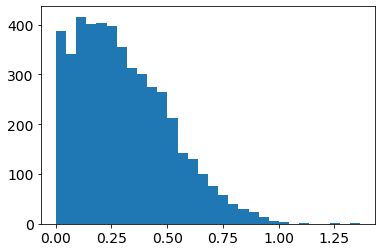

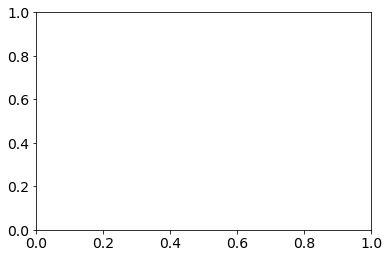

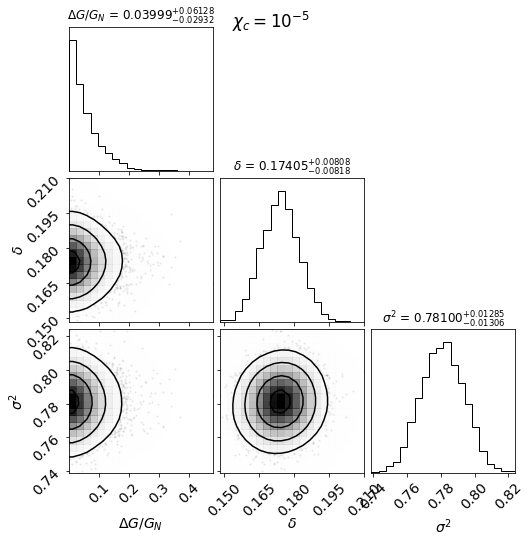

  1%|▎                                          | 6/918 [00:00<00:17, 51.31it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 2.841635698328465e-07
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 1.8424662446223595e-07
10213-1902 [36.90593718592965] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 36.90593718592965 1.824504770005176e-08 2.625020806073985e-09
10215-1902 [9.004095477386935] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 9.004095477386935 1.6349434872924778e-08 4.705965619340956e-09
10218-12701 [41.252361809045226] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1

  1%|▌                                         | 12/918 [00:00<00:23, 38.12it/s]

10220-12705 [46.814033165829144] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 46.814033165829144 4.742270465885601e-09 1.614426434287963e-08
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 9.265183178181912e-07
10224-9101 [50] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 50.0 0.0 1.409365934358174e-07
10226-12704 [40.777538693467335] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694, 0.4691, 0.2789, 0.37, 0.364, 0.3135, 0.363, 0.2811, 0.3307, 0.2727, 0.312, 0.3727, 0.1385, 0.4167, 0.2188, -0.3444, 0.1093]
10226-12704 40.777538693467335 1.4197393488441393e-08 6.610742789828752e-09
10226-12705 [50] [1.0258, 2.2633, 2.7169, 2.4758, 1.8555, 1.7519, 1.2885, 0.9589, 1.0089, 1.1064, 1.1936, 2.223, 0.8528, 1.1417, 0.5417]

  2%|▉                                         | 21/918 [00:00<00:25, 34.74it/s]

10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 1.3876617582825656e-06
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 50.0 0.0 3.4275755010092063e-07
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 3.3985346330899834e-07
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.0093, -0.0019, -0.047, -0.0973, -0.098, -0.0699]
10494-6101 50.0 0.0 6.180883956900016e-07
10494-9101 [50] [0.1044, 0.2038, 1.4077, 1.2615, 1.1423, 0.8831, 0.6532, 0.6062, 0.6272, 0.6614, 0.5401, 0.4995, 0.1142, 0.1337]
10494-9101 50.0 0.0 3.9482776914366574e-07
10495-12704 [50.0] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.123

  3%|█▎                                        | 29/918 [00:00<00:26, 33.23it/s]

10495-3702 [50] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 50.0 0.0 9.404406651906976e-08
10496-12704 [40.5777567839196] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268.8121, 253.915, 333.7881, 358.7629, 315.1183, 261.3063, 216.6964, 267.188, 258.5169, 256.0365, 248.4992]
10496-12704 40.5777567839196 1.6002370579677865e-08 4.7114306185968564e-09
10496-12705 [35.75674773869347] [-0.3879, -0.1399, 0.1719, 0.4444, 0.4904, 0.2805, 0.2146, 0.344, 0.3105, 0.2505, 0.2112, 0.1741, 0.0585, 0.0082, -0.033, 0.0654, 0.0338, 0.38, 0.1359]
10496-12705 35.75674773869347 1.7715561818005757e-08 3.3294504043063503e-09
10498-12705 [50] [2.2376, 1.8111, 0.8617, 0.4311, 0.299, 0.2455, 0.2899, 0.2855, 0.265, 0.1888, 0.0491, -0.0661, -0.1083, -0.0652, -0.0315, 0.0942]
10498-12705 50.0 0.0 2.408890284281982e-07
10499-12705 [50] [-0.9996, -0.9996, -0.9992, -0.9994, -0.9994, -0.9993, -0.9993, -0.9994, -0.9994, -0.9992, -0.999, -0.999, -0.9

  4%|█▋                                        | 37/918 [00:01<00:25, 33.91it/s]

10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 2.713657043929191e-07
10500-12704 [39.03265226130653] [140.7935, 35.4055, 16.1502, 8.7997, 6.1202, 5.6067, 5.0715, 4.9205, 5.0767, 4.6234, 4.2501, 4.0673, 3.8962, 3.8831, 3.7867, 3.6009, 3.0687, 4.1948, 2.9642, 3.5448, 1.9938, -0.2753, 2.8838, 5.8145]
10500-12704 39.03265226130653 1.5548052858595524e-08 5.2953356073967374e-09
10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 8.603174264732447e-07
10500-3702 [41.19156432160804] [211.267, 568.975, 609.2163, 763.7494, 654.0512, 608.9412, 619.4812, 574.1158, 551.0555, 546.396, 492.531, 452.6766, 495.1396, 321.2342, 371.609, 358.446, 200.8978, 319.0074, 284.1887, 209.7882, 190.8027, 318.1602, 354.0653]
10500-3702 41.19156432160804 1.394223146312575e-08 7.014693181533316e-09
10500-3703 [50] [-0.028, -0.1828, 0.6642, 1.1037, 1.7094, 1.5507, 1.8019, 1.4925, 1.5792, 1.4

  5%|██                                        | 45/918 [00:01<00:26, 32.48it/s]

10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 1.5151070533806896e-07
10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 6.14067001419698e-06
10505-12704 [50] [0.6223, 0.447, 0.4087, 0.27, 0.0901, 0.1644, 0.1572, 0.3129, 0.3336, 0.3492, 0.2338, 0.2536, 0.1307, 0.2303, 0.2492, 0.6718, 0.9822, 1.3729, 3.1505, 2.3435]
10505-12704 50.0 0.0 1.0554978426920429e-07
10506-9101 [50] [-0.2543, 0.5091, 0.8262, 0.5675, 0.2552, 0.0764, 0.0245, 0.0392, 0.0453, 0.0366, -0.0056, -0.0369, -0.0612, -0.0986, -0.132, -0.0742, -0.1191]
10506-9101 50.0 0.0 2.6075645611186856e-07
10508-12703 [43.188190954773866] [0.5005, 0.4509, 0.1544, 0.1328, 0.1165, 0.1176, 0.065, 0.1329, 0.2506, 0.179, 0.1788, 0.1204, 0.0037, 0.016, -0.0301, -0.0876]
10508-12703 43.188190954773866 8.3672496113

  6%|██▍                                       | 53/918 [00:01<00:24, 35.21it/s]

10509-6101 [28.59686934673367] [414.6573, 159.5598, 352.8386, 670.9188, 930.199, 434.1238, 984.9702, 921.6235, 784.8291, 825.2006, 827.4197, 661.5592, 624.5693, 894.3523, 620.0269, 747.519, 623.1939, 701.341, 577.342, 1031.0135, 622.2157, 697.4912, 668.4888, 271.226]
10509-6101 28.59686934673367 1.7461528430590082e-08 3.562743939619014e-09
10511-12704 [50] [-0.0162, 0.2052, 0.0934, -0.0203, -0.0645, -0.0743, -0.1124, -0.1256, -0.1314, -0.1489, -0.145, -0.1344, -0.261, -0.3154, -0.4542, -0.3737, -0.3967, -0.387, 0.3583, -0.1418, -0.7705]
10511-12704 50.0 0.0 5.10144677639776e-07
10511-12705 [50] [-0.2818, -0.0952, 0.2141, 0.2185, 0.0509, 0.0112, -0.034, -0.0386, -0.0777, -0.1248, -0.1302, -0.15, -0.1634, -0.2053, -0.2903]
10511-12705 50.0 0.0 3.548170166789308e-07
10512-12701 [44.59990653266332] [-0.3741, -0.2352, -0.2444, -0.3467, -0.39, -0.3702, -0.2987, -0.245, -0.2376, -0.1861, -0.2187, -0.1372]
10512-12701 44.59990653266332 1.6409331723038786e-08 4.664670588599105e-09
10512-12705 [

  6%|██▌                                       | 57/918 [00:01<00:25, 33.83it/s]

10516-6104 [50] [0.3084, -0.237, -0.3593, -0.3575, -0.3434, -0.2974, -0.3603, -0.4386, -0.4629, -0.4919, -0.5092, -0.5031, -0.4319, -0.4152, -0.2877, -0.6618]
10516-6104 50.0 0.0 2.846996478756929e-07
10517-3704 [50] [6.5457, 4.9823, 4.7496, 3.3043, 2.1613, 1.6053, 1.1745, 0.9031, 0.7267, 0.8082, 0.6442, 0.6833, 0.6038, 0.6776, 0.66, 0.6521, 0.6265]
10517-3704 50.0 0.0 1.9253683569789674e-07
10517-6102 [50] [0.4712, 0.9172, 0.811, 0.5857, 0.3222, 0.2888, 0.1564, 0.1219, 0.169, 0.09, 0.1318, 0.0302, 0.061, 0.0297, 0.0658, 0.0113, 0.072, 0.0733, -0.0232, 0.0238, 0.0127, 0.0739, -0.0903, -0.0528]
10517-6102 50.0 0.0 1.7934819491822423e-07
10518-12705 [50] [-0.1971, 0.2795, 0.1103, -0.0254, -0.0161, -0.0, 0.0208, 0.0333, 0.0023, -0.0238, -0.0544, -0.1612]
10518-12705 50.0 0.0 4.258681979548273e-08
10518-1902 [50] [-0.0105, 0.2572, 0.0495, 0.0308, 0.0287, -0.0677, -0.0841, -0.0885, -0.1994, -0.1432, -0.1195, -0.1634, -0.1173, -0.1219, -0.165, -0.1325, -0.1731]
10518-1902 50.0 0.0 2.29013060

  7%|██▉                                       | 65/918 [00:01<00:25, 33.13it/s]

10519-6102 [50] [15.342, 9.7033, 5.6052, 3.8579, 2.785, 2.1688, 1.9416, 1.9483, 2.0544, 1.8028, 1.946, 2.1855, 2.046, 2.3544, 2.1616]
10519-6102 50.0 0.0 2.124675548922072e-08
10520-12704 [50] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.0366, 0.0275, -0.0135, 0.0213, 0.0998, -0.1048, -0.1309]
10520-12704 50.0 0.0 2.4279685112592727e-07
10520-6102 [50] [-0.9995, -0.9993, -0.9985, -0.9976, -0.9986, -0.9981, -0.9983, -0.9984, -0.9986, -0.9981, -0.9963]
10520-6102 50.0 0.0 1.5762269546827755e-07
10838-9101 [16.948999999999998] [-0.0928, 0.4421, 0.4896, 0.3922, 0.2667, 0.3141, 0.2582, 0.2949, 0.294, 0.2543, 0.2198, 0.1153, 0.0076, -0.0625, -0.124, -0.1198, -0.272, -0.3696, -0.3534, -0.3974, -0.2337]
10838-9101 16.948999999999998 1.7126366274515624e-08 3.90769293774415e-09
10839-12705 [50] [0.5531, 0.4188, 0.6271, 0.6342, 0.4074, 0.3206, 0.1512, 0.1105, 0.1154, 0.1763, 0.2141, 0.3291, 0.2868, 0.1635, 0.0391, 0.4134, 0.1807]
10839-12705 50.0 0.0 8.776743776823837e-07
1

  8%|███▎                                      | 73/918 [00:02<00:25, 32.60it/s]

10839-9101 [50] [2.1426, 2.2648, 0.9796, 0.8183, 0.5304, -0.0332, -0.1785, -0.3432, -0.3468, -0.4742, -0.4095, -0.6139, -0.5305, -0.616, -0.529, -0.5494, 0.8162, 3.2784]
10839-9101 50.0 0.0 3.0417315327302186e-07
10841-12701 [49.02610452261306] [-0.7323, -0.6652, -0.4249, -0.3016, -0.2957, -0.3482, -0.374, -0.3905, -0.3944, -0.4309, -0.4302, -0.4504, -0.4708, -0.4257, -0.4725]
10841-12701 49.02610452261306 2.2156856752602464e-09 1.8531897950044284e-08
10842-3702 [50] [-0.5415, 0.0585, 0.2828, 0.1825, 0.1674, 0.1342, 0.1324, 0.2899]
10842-3702 50.0 0.0 3.3152673762890854e-07
10842-3703 [50] [-0.6099, -0.8101, -0.8807, -0.9171, -0.9297, -0.9289, -0.9268]
10842-3703 50.0 0.0 2.190566793635703e-07
10842-9101 [30.877355276381913] [-0.987, -0.9943, -0.9967, -0.9976, -0.9979, -0.998, -0.9982, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9981, -0.998, -0.9982, -0.9979, -0.9982, -0.9983]
10842-9101 30.877355276381913 1.4390016854554569e-08 6.476480168209706e-09
10845-12702 [50] [-0.

  9%|███▋                                      | 81/918 [00:02<00:24, 34.32it/s]

11004-6104 [50] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 50.0 0.0 2.0340357417181807e-07
11009-12704 [50] [-0.044, 0.5574, 0.4941, 0.5156, 0.452, 0.4031, 0.3736, 0.4191, 0.4646, 0.4848, 0.558, 0.4716, 0.2432, 0.3821, 0.6252, 0.8487, 0.8601]
11009-12704 50.0 0.0 6.500426767811679e-07
11009-6102 [50] [0.2368, -0.3064, 0.0765, 0.1736, 0.0574, 0.1163, 0.1754, 0.2052, 0.2777, 0.3634, 0.3506, 0.3192, 0.3455, 0.323, 0.4447, 0.1481, 0.2577, -0.1338, 0.037, 0.1218, 0.8549, -0.5202]
11009-6102 50.0 0.0 8.732077468682369e-08
11010-12705 [50] [-0.0199, 0.0369, -0.0512, -0.0961, -0.0616, -0.0525, -0.0667, -0.0148, -0.0176, -0.0486, -0.0929, -0.1237, -0.1411, -0.2784, -0.0549, -0.2411]
11010-12705 50.0 0.0 1.9470961139330508e-07
11010-6104 [50] [669.1593, 612.5725, 580.2933, 433.0387, 377.072, 315.1925, 269.3918, 266.5579, 267.4688, 253.2676, 240.0639, 221.1944, 344.4065]
11010-6104 50.0 0.0 4.4051119

 10%|████▏                                     | 91/918 [00:02<00:21, 38.63it/s]

11012-3702 [50] [7.8974, 3196.585, 2734.8285, 2253.8811, 4078.0168, 2401.2221, 2680.4924, 2677.0305, 2494.671, 2122.0656, 2023.2433, 2124.4295, 1742.4806, 1879.5204, 1353.859, 1265.244, 1077.374, 829.3809, 807.9255, 437.3493, 291.3315]
11012-3702 50.0 0.0 3.9283815258308574e-08
11012-9102 [50] [4.3613, 1.8587, 0.9243, 0.4611, 0.1717, 0.0565, -0.0003, -0.0124, 0.0149, 0.0346, 0.0094, 0.0256, 0.0391, 0.0441, 0.0302, -0.0599, -0.0933, -0.0179]
11012-9102 50.0 0.0 2.1718730682917455e-07
11013-12702 [50] [0.7904, 0.6387, 0.0779, 0.1203, 0.0592, -0.004, -0.016, 0.0128, 0.0194, 0.059, 0.0663]
11013-12702 50.0 0.0 7.88090314262339e-07
11013-1902 [50] [0.7893, 0.6453, 0.5024, 0.4895, 0.4034, 0.2175, 0.0455, -0.0103, 0.0142, -0.2569, -0.0412, -0.2183, -0.1712, -0.0824, -0.3609, -0.2323, -0.3117]
11013-1902 50.0 0.0 5.258214397773169e-07
11013-3701 [50] [0.785, 0.6845, 0.2024, 0.0457, 0.0342, 0.02, -0.06, -0.0296, -0.0379, -0.1677]
11013-3701 50.0 0.0 1.367494568339246e-07
11013-3702 [50] [0.892,

 11%|████▌                                    | 101/918 [00:02<00:20, 39.97it/s]

11017-6103 [50] [-0.3235, -0.3265, -0.3479, -0.2253, -0.2261, -0.1769, -0.1311, -0.1075, -0.0747, -0.0989, -0.1378, -0.1695, -0.1257, -0.174, -0.178, -0.0714, -0.0163, 0.0028, 0.2262, -0.2731]
11017-6103 50.0 0.0 1.770653857897807e-07
11017-9101 [50] [-0.5273, 0.0425, 0.2188, 0.1666, 0.07, 0.0407, -0.0503, -0.1282, -0.2004, -0.2244, -0.1722, -0.1497, -0.0815, -0.0967, -0.1443, -0.1476, -0.1864, -0.1536, -0.2264, -0.18]
11017-9101 50.0 0.0 1.976387916596215e-07
11018-12702 [50] [-0.9839, -0.9926, -0.9927, -0.9922, -0.9923, -0.9935, -0.9932, -0.9925, -0.9931, -0.994, -0.9941]
11018-12702 50.0 0.0 7.969471832740694e-07
11018-12704 [50] [-0.9989, -0.9988, -0.9986, -0.9987, -0.9988, -0.999, -0.999, -0.9991, -0.9991, -0.9987, -0.9984, -0.9975, -0.9987, -0.9989]
11018-12704 50.0 0.0 7.087908949245323e-07
11018-3702 [50] [0.6083, 0.007, 0.0959, 0.33, 0.5514, 0.4356, 0.3654, 0.3085, 0.3057, 0.287, 0.3004]
11018-3702 50.0 0.0 1.220721770774228e-07
11018-3703 [50] [-0.5454, 0.4164, 0.6741, 0.5852

 12%|████▋                                    | 106/918 [00:02<00:20, 40.22it/s]

11019-12705 [50] [0.9395, 1.6844, 1.8269, 0.8562, 0.7011, 1.016, 1.1247, 1.0992, 1.0844]
11019-12705 50.0 0.0 1.226193416368774e-06
11019-3701 [50] [2.5964, 1.3616, 0.9142, 0.3658, 0.0143, -0.1157, -0.1148, -0.102, -0.0691, -0.1802, -0.166, -0.2893, -0.0849]
11019-3701 50.0 0.0 2.1323091965153496e-08
11021-1902 [50] [5.9017, 3.1432, 2.8491, 1.9605, 1.7177]
11021-1902 50.0 0.0 1.3268756064350153e-06
11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 2.6728271861763685e-07
11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 2.730270961117758e-07
11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
1102

 13%|█████▏                                   | 116/918 [00:03<00:20, 39.20it/s]

11744-9102 [50] [-0.6298, 0.0464, 0.3943, 0.6247, 0.4097, 0.3518, 0.3414, 0.4046, 0.4742, 0.4313, 0.3693, 0.3275, 0.2214, 0.1278, 0.0812, 0.4043, 0.1792, -0.1336]
11744-9102 50.0 0.0 9.519141224646491e-07
11745-1902 [50] [1.185, 0.9719, 0.4625, 0.4231, 0.2188, 0.1795, 0.0428, 0.0263, -0.0784, -0.2371, 0.1632]
11745-1902 50.0 0.0 2.272769800229598e-08
11745-6104 [50] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.8527, 0.5703, 0.5078, 0.5176, 0.5143, 0.48, 0.4463, 0.4504, 0.4653, 0.4273, 0.4049]
11745-6104 50.0 0.0 1.4614348516673984e-07
11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.0361, -0.076, -0.0711, -0.1542, -0.2041, -0.2119, -0.1066, -0.2705, -0.3138]
11745-9101 50.0 0.0 1.2606137795122694e-07
11746-3703 [45.40409095477387] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 45.40409095477387 9.6162

 14%|█████▌                                   | 124/918 [00:03<00:20, 38.09it/s]

11749-12701 [50] [-0.6821, -0.1137, 0.255, 0.1029, 0.0811, -0.0849, -0.2182, -0.1487, -0.1095, -0.0437, -0.1285, -0.1939]
11749-12701 50.0 0.0 1.1398445052368167e-07
11749-12704 [50] [1.1585, 1.0264, 1.2033, 1.4986, 1.8954, 2.0398, 2.1095, 2.1199, 1.4688, 1.3033, 0.9132, 0.8426, 0.0515, 0.4719, -0.3735]
11749-12704 50.0 0.0 1.7736563577966469e-07
11749-3701 [50] [618.0455, 872.9003, 1483.1859, 1615.2011, 1553.7949, 1334.0598, 1385.5396, 1283.8547, 1216.0833, 1294.494, 1472.7433, 1080.4933, 1346.7897, 1196.9726, 1091.8413, 1216.7304, 927.7028, 363.0292, 281.9853, 551.8779, 169.9359, 54.7426, 122.374, 379.7425, 27.1507]
11749-3701 50.0 0.0 2.186644791493659e-07
11750-12701 [50] [0.4224, 0.3089, 0.0791, 0.0892, 0.2329, 0.2222, 0.1114, 0.03, 0.0196, 0.0027, 0.0313, 0.0827, 0.0275, 0.3095]
11750-12701 50.0 0.0 1.793958573513353e-07
11750-3701 [50] [1.5964, 1.8766, 1.9419, 1.999, 1.4725, 1.2873, 1.1333, 0.934, 0.9463, 0.8918, 0.7347, 0.8508, 0.6677, 0.4619, 0.3762, 0.1866, 0.0367, 0.0915, 0.

 15%|█████▉                                   | 134/918 [00:03<00:19, 41.15it/s]

11751-6102 [48.7877135678392] [0.3738, 0.0535, 0.3785, 0.2124, 0.1333, 0.0258, -0.0223, -0.094, -0.1099, -0.1415, -0.1724, -0.2013, -0.1841, -0.253, -0.3949, -0.2255, -0.2141, -0.2775]
11751-6102 48.7877135678392 6.909898859955018e-09 1.416556430737683e-08
11753-3703 [50] [0.2801, 0.7604, 0.7391, 0.5795, 0.35, 0.1693, 0.0874, 0.0586, 0.0152, -0.0057, -0.0099, -0.0594, -0.1073, -0.139, -0.1496]
11753-3703 50.0 0.0 4.529757888684887e-07
11753-6104 [50] [1.7058, 1.5787, 1.7231, 1.492, 1.0043, 0.8699, 0.6579, 0.5905, 0.5042, 0.4712, 0.4504, 0.6153, 0.6589, 0.6817, 0.5206, 0.5457, 0.5195, 0.692]
11753-6104 50.0 0.0 3.249324685855737e-07
11754-1901 [50] [-0.2402, -0.5388, -0.5143, -0.4398, -0.487, -0.4664, -0.4721, -0.5334, -0.5004, -0.4954, -0.6115, -0.5884]
11754-1901 50.0 0.0 1.9506470263002553e-07
11755-12701 [34.99849246231155] [-0.773, -0.7865, -0.7717, -0.7522, -0.7475, -0.7159, -0.7048, -0.6936, -0.7373, -0.7183, -0.7382, -0.7769, -0.6833, -0.7924, -0.5695, -0.681, -0.5512]
11755-127

 16%|██████▍                                  | 145/918 [00:03<00:17, 45.17it/s]

[50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 50.0 0.0 5.211749939143665e-07
11759-6102 [25.279915577889447] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, -0.981]
11759-6102 25.279915577889447 6.2972741083979054e-09 1.4782925219557218e-08
11760-12703 [8.420449748743717] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0.539, 0.1155, 0.1223, 0.309]
11760-12703 8.420449748743717 8.948249035201407e-09 1.2139405257727223e-08
11760-6101 [50] [0.4533, -0.0157, 0.5654, 0.502, 0.3995, 0.359, 0.3287, 0.2964, 0.2063, 0.2512, 0.2686, 0.2421, 0.2368, 0.1884, 0.0906, -0.0471, -0.3849, -0.319, -0.8166]
11760-6101 50.0 0.0 3.4577968155286393e-07
11760-6103 [50] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.2117, -0.2373, -0.2365, -0.2317, -0.3078, -

 17%|██████▉                                  | 155/918 [00:04<00:16, 45.64it/s]

11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 3.7915661730666952e-06
11828-12703 [50] [-0.5587, -0.2913, 0.1844, 0.3112, 0.2627, 0.2124, -0.0354, -0.0957, -0.1295, -0.1601, -0.0565, -0.1246, 0.0413]
11828-12703 50.0 0.0 1.9405736051608566e-06
11830-12701 [47.335932663316584] [-0.9938, -0.9825, -0.9834, -0.9912, -0.9934, -0.9941, -0.9946, -0.9933, -0.9936, -0.9951, -0.9951, -0.9944, -0.9947, -0.9932, -0.9955, -0.9854, -0.997, -0.9939, -0.9962]
11830-12701 47.335932663316584 1.0517889812479255e-08 9.659429786758068e-09
11830-12703 [50] [-0.4776, 0.0437, 0.1582, -0.0709, -0.1607, -0.0754, 0.055, 0.2665, 0.1845, 0.03, 0.0663, -0.087, -0.2185, -0.1589, 0.0536, -0.3722]
11830-12703 50.0 0.0 5.037819115960212e-07
11830-3702 [50] [1.2195, 0.9978, 0.6546, 0.4726, 0.5057, 0.555, 0.4749, 0.3884, 0.4626]
11830-3702 50.0 0.0 6.043286447675738e-07
11830-6104 [50] [0.4376, 0.459, 0.175, -0.043

 18%|███████▎                                 | 165/918 [00:04<00:16, 46.69it/s]

11833-9102 [50] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.2658, -0.2176, -0.1929, -0.2471, -0.3166]
11833-9102 50.0 0.0 1.575779767575913e-07
11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 3.0694913227773696e-06
11836-1902 [50] [0.7026, 1.2767, 1.1865, 1.1009, 0.973, 0.9921, 0.7024, 0.7206, 0.623, 0.6145, 0.5505, 0.5955, 0.6037, 0.4142, 0.4147]
11836-1902 50.0 0.0 1.689778811119469e-07
11838-12701 [21.266169849246232] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 0.1336, 0.0903, 0.0213, -0.0554, -0.0342, 0.0225, 0.0053, -0.0272]
11838-12701 21.266169849246232 5.715160262503662e-09 1.5344736319033727e-08
11838-12703 [50] [144.9042, 254.2159, 538.0129, 911.0748, 1089.8377, 1111.2623, 1284.2649, 1228.3752, 1345

 19%|███████▊                                 | 175/918 [00:04<00:16, 46.43it/s]

11865-1901 [50] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 50.0 0.0 3.650155363866365e-07
11865-1902 [50] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0.4429]
11865-1902 50.0 0.0 9.799056009097606e-08
11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 4.1434668633537385e-07
11865-9102 [36.36298693467337] [-0.467, -0.4695, -0.4789, -0.5286, -0.6182, -0.6445, -0.6408, -0.6047, -0.6031, -0.6243, -0.655, -0.6895, -0.6998, -0.5904, -0.6729, -0.6983]
11865-9102 36.36298693467337 1.3623402649039869e-08 7.379709223185128e-09
11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2771, 0.298, 0.3814, 0.3262, 0.2102, 0.3978, 0.4467, 0.2866, 0.1214, 0.2202, 0.1346, 0.4041]
11867-6104 50.0 0.0 8.176051718950448e-07
11867-9101 [50] [0.9073, 0.3027, 0.1546, 0.1123, 0.0285, 0.0159, -0.0244, 0.0205, 0.0824, 0.1908, 0.2079, 0.2195, 0.3058, 0.2425, 0.1871, 0.30

 20%|████████▎                                | 185/918 [00:04<00:15, 46.60it/s]

11940-3703 [35.6881608040201] [1.1615, 1.5645, 1.5154, 1.5213, 1.3625, 1.1856, 0.9977, 0.7191, 0.6591, 0.6153, 0.3767, 0.433, 0.6417, 0.1616, 0.444, 0.2018, 0.0806, 0.2143, 0.1328]
11940-3703 35.6881608040201 1.690852494939703e-08 3.861608395422385e-09
11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 1.294962851430009e-06
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 1.6530253737761656e-06
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 1.1795355103136067e-06
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389.9946, 2439.1642, 2636.587, 2485.7262, 2056.7992, 1736.2622, 1623.5415, 1192.5228, 781.8483, 546.9719, 175.874]
11942-12704 50.0 0.0 6.31484

 21%|████████▍                                | 190/918 [00:04<00:15, 45.79it/s]

11945-6102 [50] [3.5224, 2.2109, 1.4349, 1.0152, 0.7457, 0.4864, 0.2556, 0.1192, 0.0508, 0.0117, -0.0209, -0.0683, -0.158, -0.0976, -0.2012]
11945-6102 50.0 0.0 4.6464712039838946e-07
11947-6103 [50] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 50.0 0.0 1.6793931986094546e-07
11949-12701 [50] [1.1975, 0.3408, 0.1441, 0.1243, 0.0225, 0.0003, 0.0028, 0.027, 0.0197, 0.0192, -0.0295, -0.0839]
11949-12701 50.0 0.0 3.567206740715594e-07
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 9.372372261037345e-06
11954-12704 [50] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453, 0.1801, 0.125, 0.0276, -0.0116, -0.0744, -0.134, -0.1626, -0.2559, -0.2802]
11954-12704 50.0 0.0 1.3396617574664102e-06
11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.346

 22%|████████▉                                | 200/918 [00:05<00:18, 38.40it/s]

11956-12705 [50] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 0.2419, 0.2565, 0.3525, 0.1776, 0.103, 0.3387, 0.3814, 0.7221, 0.77]
11956-12705 50.0 0.0 6.066550120576191e-07
11957-12704 [50] [-0.3492, 0.7667, 0.6853, 0.5861, 0.3661, 0.189, 0.1584, 0.1015, -0.0026, 0.0319, 0.1228, 0.1275, 0.2204, 0.0938]
11957-12704 50.0 0.0 1.1593055633769658e-07
11957-9101 [50] [127.5969, 337.5453, 692.0501, 754.6672, 761.8038, 673.5367, 561.8056, 470.5271, 446.8561, 434.7914, 434.701, 432.6297, 423.9362, 415.9254, 409.4146, 409.8788]
11957-9101 50.0 0.0 1.7063299354366446e-06
11957-9102 [50] [1.0969, 0.3397, 0.6198, 1.0919, 1.791, 2.069, 2.6145, 2.7123, 2.8073, 2.4726, 2.1945, 1.9756, 2.1362, 4.7679, 3.0873, 1.2673, 3.459, 16.3037, 15.1044]
11957-9102 50.0 0.0 2.968404764562464e-08
11958-6103 [50] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 50.0 0.0 1.513066688503758e-07
11960-12701 [50] [-0.3306, 0.3017, 0.103

 23%|█████████▎                               | 208/918 [00:05<00:20, 34.16it/s]

11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.9843, 0.6333, 0.3517, 0.1829, 0.1258, 0.0956, 0.1424, 0.1021, 0.028, 0.1221]
11965-9102 50.0 0.0 5.454300231914352e-07
11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 1.470601552105521e-06
11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.8986, 3.5843, 4.0724, 0.9129, 2.9875, 0.7205, 2.6408, 1.2362]
11969-6101 50.0 0.0 1.2510033423069622e-07
11970-12703 [50] [-0.4888, -0.3498, -0.0561, 0.1594, 0.1669, 0.133, 0.154, 0.1676, 0.144, 0.1071, 0.072, 0.0457, 0.046, 0.0501, 0.1262, -0.0083, 0.2366]
11970-12703 50.0 0.0 9.149490909817392e-08
11970-6102 [50] [-0.0116, -0.0683, -0.0558, -0.0053, 0.0454, 0.025, 0.078, -0.0283, -0.085, -0.1052, -0.0602, -0.0272, -0.0693, -0.0116, -0.1378, -0.2799, -0.2497]
11970-6102 50.0 0.0 4.9857648331810224e-08
11970-6103 [50] [0.746

 24%|█████████▋                               | 217/918 [00:05<00:19, 35.96it/s]

11975-12701 [50] [-0.1741, -0.13, 0.3291, 1.0808, 1.3321, 1.3798, 1.0057, 0.9745, 0.8989, 0.5699, 0.4672, 0.2163]
11975-12701 50.0 0.0 1.4146043525011018e-07
11975-12705 [50] [0.6902, 0.7621, 0.3208, 0.2527, 0.3317, 0.3259, 0.2387, 0.0864, 0.069, 0.2015, 0.1928, 0.1502, -0.0055, -0.1924]
11975-12705 50.0 0.0 3.18171027159067e-07
11975-3703 [42.72640201005025] [-0.2597, -0.0329, 0.0768, 0.0833, 0.1048, 0.0682, 0.0342, -0.0156, -0.0756, -0.093, -0.0695, -0.0466, 0.0656, -0.0085, 0.1237, 0.1334, 0.0646]
11975-3703 42.72640201005025 1.5935241895822595e-08 4.716056723117756e-09
11975-6104 [50] [1.0196, 1.2709, 1.5062, 1.1104, 0.9965, 0.7778, 0.776, 0.6311, 0.7603, 0.6278, 0.6208, 0.5151, 0.5172, 0.5343, 0.2326, 0.5012, 0.187, 0.4522, 0.1401, 0.1327]
11975-6104 50.0 0.0 3.049313665086949e-08
11976-12703 [50] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 50.0 0.0 3.003145403678466e-07
11978

 24%|█████████▉                               | 222/918 [00:05<00:18, 37.41it/s]

11979-12704 [50] [1.0417, 0.8488, 0.6206, 0.5652, 0.598, 0.4342, 0.2822, 0.1334, 0.0604, 0.0319, 0.0291, -0.01, -0.083, -0.0554, -0.0215, -0.0081, 0.0344]
11979-12704 50.0 0.0 1.1260030062124637e-07
11979-9101 [48.78236432160804] [0.4094, -0.1099, -0.2651, -0.4134, -0.4241, -0.4727, -0.5, -0.5199, -0.5395, -0.5666, -0.5927, -0.5903, -0.6162, -0.591, -0.6704, -0.611]
11979-9101 48.78236432160804 3.00722643656271e-09 1.7592253723871515e-08
11979-9102 [50] [0.6334, -0.323, -0.1351, -0.0857, 0.0053, 0.0302, 0.0467, 0.0752, 0.0566, 0.0459, 0.0116, 0.0269, 0.0046, -0.0156, -0.091, -0.1558, -0.3105, -0.4242, -0.5324]
11979-9102 50.0 0.0 4.010985389368058e-07
11981-12702 [50] [293.567, 690.112, 683.5389, 617.2849, 490.646, 374.3616, 455.8674, 450.3051, 457.9927, 478.543, 404.234]
11981-12702 50.0 0.0 3.0798076968105114e-07
11981-12704 [50] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]

 25%|██████████▎                              | 231/918 [00:06<00:18, 37.25it/s]

11982-9102 [50] [-0.6167, -0.1298, 0.3235, 1.2078, 1.1438, 0.8069, 0.6394, 0.4963, 0.4228, 0.3252, 0.3069, 0.2838, 0.3393, 0.4905, 0.4567, 0.2311]
11982-9102 50.0 0.0 1.1225731747155914e-06
11984-12701 [50] [-0.2857, -0.1737, 0.0157, 0.0372, -0.1281, -0.2001, -0.1962, -0.1945, -0.1458, -0.0921, -0.099, -0.116, -0.1666, -0.325, -0.2122, -0.442]
11984-12701 50.0 0.0 1.4609826887842696e-07
11984-12702 [50] [-0.2774, -0.3248, -0.3706, -0.3541, -0.339, -0.3481, -0.2877, -0.2577, -0.2022, -0.1466, -0.1889, -0.2485, -0.0638, -0.2124, -0.1581, -0.3914, -0.132]
11984-12702 50.0 0.0 1.1501474476440365e-07
12066-3701 [50] [19.2418, 16.9197, 10.1428, 6.0915, 4.4316, 3.0783, 2.9929, 2.3906, 2.7183, 2.8356, 3.2869, 3.669, 3.475, 3.6088, 2.499, 1.7084, 1.9485, 1.5899]
12066-3701 50.0 0.0 1.538921262076098e-07
12067-12703 [48.56959698492462] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
12067

 26%|██████████▋                              | 240/918 [00:06<00:17, 37.92it/s]

12068-6104 [38.36067537688442] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 38.36067537688442 1.6176536374733283e-08 4.57105471736273e-09
12069-12704 [50] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 50.0 0.0 2.1157931658593647e-07
12069-12705 [50] [1.7332, 1.137, 0.4096, 0.6564, 0.5837, 0.6168, 0.2246, 0.0587, 0.2617, 0.1538, 0.5607, 0.4132, 0.5307, 0.41, 2.8782]
12069-12705 50.0 0.0 2.73611867297494e-07
12069-6102 [50] [-0.3102, -0.0764, -0.2402, -0.1833, -0.1952, -0.2158, -0.2095, -0.1861, -0.144, -0.1353, -0.1037, -0.1026, -0.0816, -0.0956, -0.1367, -0.1477, -0.0871, -0.0667, -0.0387, -0.58, -0.56, -0.5359, -0.8946, 0.038]
12069-6102 50.0 0.0 5.480887274219847e-08
12071-12701 [50] [-0.9172, -0.8384, -0.6786, -0.6994, -0.7429, -0.7686, -0.7662, -0.8217, -0.8275, -0.8401, -0.

 27%|███████████                              | 249/918 [00:06<00:17, 38.98it/s]

12078-12703 [50] [0.3298, 0.5608, 0.2182, 0.3221, 0.2303, 0.0896, 0.0846, 0.2051, 0.3186, 0.33, 0.2532]
12078-12703 50.0 0.0 5.129305307558535e-07
12078-6103 [50] [1.9637, 5.3953, 4.122, 4.276, 4.2033, 3.4926, 3.3028, 3.2038, 3.1762, 3.0769, 2.868, 2.5911, 2.6527, 2.4952, 2.6226, 2.6979, 2.1328, 1.6158, 1.3218, 1.8508]
12078-6103 50.0 0.0 5.080893712795515e-07
12079-12705 [41.304136683417084] [5.9457, 5.134, 4.915, 2.376, 2.7696, 2.3345, 1.3415, 1.441, 1.4148, 0.8317, 1.0553, 1.0687, 0.9662, 0.8766, 1.1537, 1.4538, 0.8336]
12079-12705 41.304136683417084 1.7425470367539206e-08 3.249598981928389e-09
12080-12704 [50] [798.4646, 1129.8436, 1685.7177, 1551.5379, 1648.9794, 1528.8158, 1510.5353, 1488.9904, 1518.2012, 1430.3202, 1355.0599, 1297.2544, 1371.7431, 1127.7862, 1194.7794, 1062.3493, 1183.2366, 942.8748, 761.5148, 256.7283, 914.8231, 836.9712]
12080-12704 50.0 0.0 6.607509405449094e-08
12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.

 28%|███████████▍                             | 257/918 [00:06<00:17, 38.23it/s]

12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-12705 50.0 0.0 1.1176474716748722e-07
12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.419, 0.387, 0.4139, 0.5272, 0.4564, 0.6029, 0.4957, 0.5971, 0.6267, 0.5749, 0.7061, 0.6081, 0.5243, 0.4383, 0.5097, 0.4647, 0.2768, 0.3996, 0.231, 0.2274, 0.4698, 0.2204, 0.2727]
12084-1901 50.0 0.0 9.722031413086478e-08
12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
12084-3702 50.0 0.0 1.7152162399347475e-07
12084-3703 [50] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.866, 9.9199, 8.0438, 7.1191, 7.1184, 4.9585, 5.2578]
12084-3703 50.0 0.0 8.328713633947664e-08
12084-6104 [50] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.

 28%|███████████▋                             | 261/918 [00:06<00:18, 35.39it/s]

12085-9102 [50] [0.6086, 0.5632, 0.3343, 0.2119, 0.1282, 0.0402, 0.0288, 0.0478, 0.0313, 0.001, -0.0532, -0.0537, -0.0634, -0.0662, -0.1794, -0.1779, -0.239]
12085-9102 50.0 0.0 4.4493274602748247e-07
12088-12705 [50] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-12705 50.0 0.0 1.3347844544281622e-07
12088-9101 [50] [1.3886, 1.0744, 0.6164, 0.1772, -0.0928, -0.1728, -0.2424, -0.3552, -0.3861, -0.4243, -0.4358, -0.4341, -0.4454, -0.4408]
12088-9101 50.0 0.0 2.916862385176948e-08
12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-12702 50.0 0.0 1.2448311289660322e-07
12089-12704 [50] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 50.0 0.0 2.4451048100279258e-08
12089-1901 [50] [-0.3811,

 29%|████████████                             | 269/918 [00:07<00:20, 32.14it/s]

12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722, -0.1642, -0.1028, -0.1287, -0.1434, -0.0908, -0.1289, -0.1084, -0.2404, -0.097, 0.1709, -0.3201, -0.0196, -0.302]
12089-6103 50.0 0.0 3.218916788641349e-07
12092-6101 [38.2119959798995] [0.0026, 0.3918, 0.1405, 0.0977, 0.005, 0.0277, 0.1281, 0.0885, 0.0628, 0.0291, -0.0173, -0.1181]
12092-6101 38.2119959798995 1.5491705991411823e-08 5.4285033478408765e-09
12093-9101 [35.111064824120604] [-0.9989, -0.997, -0.9973, -0.998, -0.9985, -0.9987, -0.9987, -0.9986, -0.9986, -0.9987, -0.9983, -0.9981, -0.9979, -0.9991, -0.9971]
12093-9101 35.111064824120604 8.167594773588814e-09 1.288091783633483e-08
12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 40.9064, 40.0677, 39.5836, 40.4106, 39.3101, 37.4365, 38.9587, 41.7447, 41.525, 40.104, 39.0721, 39.6893, 56.2685, 25.7726, 27.1981, 33.78]
12094-3701 50.0 0.0 5.096015731442464e-07
12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.59

 30%|████████████▎                            | 277/918 [00:07<00:19, 32.42it/s]

12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 4.0421067608997497e-07
12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 50.0 0.0 1.0769601904166247e-07
12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696, 2047.2799, 2334.4928, 2266.757, 2196.3005, 1862.0235, 1612.2288, 2078.9089]
12488-6102 50.0 0.0 4.0635600312659315e-07
12488-9101 [50] [0.89, -0.0571, 0.0018, 0.0675, 0.0814, 0.1021, 0.1178, 0.0708, 0.0758, 0.1268, 0.0533, 0.0597, 0.0532, 0.0414, 0.1038, 0.0181, -0.1356, -0.2319, -0.1377]
12488-9101 50.0 0.0 8.273417107454878e-08
12489-3703 [50] [6.1258, 7.3921, 7.9142, 7.3592, 6.7186, 6.0984, 5.5884, 5.3024, 5.0796, 4.2963, 4.3283, 3.7505, 4.11, 3.5385, 4.098]
12489-3703 50.0 0.0 2.551165539885

 31%|████████████▌                            | 281/918 [00:07<00:18, 34.07it/s]

12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0.0 1.0020451722707202e-07
12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0 0.0 3.52393516937014e-07
12512-12702 [3.73356783919598] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 3.73356783919598 1.293702360134182e-08 8.144196807410385e-09
12514-12702 [50] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 50.0 0.0 4.069500535823309e-07
12514-12703 [50] [2.1408, 0.3201, 0.1941, 0.0194, 0.03, 0.0603, 0.1872, 0.1977, 0.0662, 0.1145, 0.0325, -0.0142, 0.021, -0.0315, -0.0845, -0.0224]
12

 31%|████████████▉                            | 289/918 [00:07<00:21, 29.56it/s]

12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 0.0 1.0457046759382832e-07
12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.1091]
12518-9101 50.0 0.0 4.7618473591762964e-07
12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 1.3140281830595265e-07
12620-6104 [1.1507] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331]
12620-6104 1.1507 1.3636499812676962e-08 6.667722701326352e-09
12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 6.180678592389292e-07
12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903,

 32%|█████████████▏                           | 296/918 [00:08<00:24, 25.65it/s]

12621-6103 [50] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 50.0 0.0 1.4579752109349336e-07
12622-9101 [50] [0.295, -0.1664, 0.1745, 0.5326, 0.7376, 0.7334, 0.6499, 0.6151, 0.5534, 0.5303, 0.427, 0.3612, 0.3993, 0.3837, 0.4878, 0.4757, 0.3843, 0.0845]
12622-9101 50.0 0.0 3.051925514557893e-07
12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 7.77420377436114e-07
12652-9102 [45.85079547738694] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 45.85079547738694 1.103207977188399e-08 9.409514806826593e-09
12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0

 33%|█████████████▎                           | 299/918 [00:08<00:24, 25.01it/s]

12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 1.0457726510189937e-06
12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 5.826842107751509e-07
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 1.0848517902337949e-06
12679-12701 [28.851766331658293] [-0.4106, -0.1602, -0.09, 0.0292, -0.1142, -0.1585, -0.1702, -0.2231, -0.1617, -0.1473, -0.165, -0.0765, -0.2919, -0.3168, -0.5268, -0.1813, 0.1098, -0.9954]
12679-12701 28.851766331658293 1.4469138217718807e-08 6.436309505069471e-09
12679-1902 [50] [0.6115, 0.2127, 0.2343, 0.0811, 0.186, 0.028, 0.0072, -0.086, -0.1377, -0.1341, -0.1745, -0.1741, -0.1973, -0.2294, -0.

 33%|█████████████▌                           | 305/918 [00:08<00:25, 24.42it/s]

12682-12705 [50] [211.5682, 164.2949, 154.5208, 172.1809, 188.4287, 205.8053, 188.0827, 175.7022, 171.521, 162.4793, 163.9925, 122.1814, 128.2861, 178.1773, 150.2355, 110.4372, 181.1071]
12682-12705 50.0 0.0 8.444899586715008e-07
7443-12703 [47.604954773869345] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 47.604954773869345 1.6954886167707678e-08 3.990406507127978e-09
7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1547, -0.1713, -0.2761, -0.2934, -0.2123]
7443-12704 50.0 0.0 1.7785726513603685e-06
7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 2.1868472556308014e-07
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.00

 34%|█████████████▉                           | 311/918 [00:08<00:27, 22.34it/s]

7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.1269]
7495-12702 50.0 0.0 9.256677429723461e-07
7495-12703 [50] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 50.0 0.0 3.511511378358444e-07
7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 6.616870422770694e-07
7815-12705 [50] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 50.0 0.0 2.4410766133952174e-07
7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 1.4268659030208136e-07


 34%|██████████████                           | 314/918 [00:08<00:27, 21.70it/s]

7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 1.1598865970033309e-07
7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 2.44472284016736e-06
7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 2.694114566275918e-07
7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 3.149151179036898e-07
7958-6101 [50] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 50.0 0.0 1.7278301976873352e-07


 35%|██████████████▎                          | 320/918 [00:09<00:27, 21.57it/s]

7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 5.357503827722026e-07
7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 1.7025042314758767e-06
7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 4.571591536246952e-07
7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 9.669291208354125e-07
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 3.9877534551844325e-06


 35%|██████████████▍                          | 323/918 [00:09<00:28, 21.20it/s]

7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 6.580527676077229e-07
7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 2.768595827220744e-07
7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 3.2141876644104534e-07
7961-12705 [48.039384924623114] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 48.039384924623114 5.072915237426817e-09 1.5566429174456725e-08
7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.

 36%|██████████████▋                          | 329/918 [00:09<00:27, 21.13it/s]

7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 1.145496034291351e-07
7962-12705 [14.801551758793972] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 0.4867, 0.496, 1.2096, 1.0729, 0.2753, 1.3845, 3.2136]
7962-12705 14.801551758793972 1.4870978418953425e-08 6.120699809592386e-09
7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 50.0 0.0 3.052149553684794e-08
7963-12702 [40.34882412060301] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, -0.9982, -0.9988, -0.9993]
7963-12702 40.34882412060301 1.311410847472993e-08 7.825380972185487e-09
7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0

 36%|██████████████▉                          | 335/918 [00:09<00:28, 20.47it/s]

7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]
7963-9102 50.0 0.0 2.0639307901970218e-07
7964-6101 [41.30522211055276] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119, 231.394, 254.6415]
7964-6101 41.30522211055276 1.759795075967225e-08 3.4022007814924525e-09
7964-9102 [50] [1.3184, 2.0432, 2.1685, 1.6268, 1.1481, 0.9036, 0.7405, 0.65, 0.5829, 0.509, 0.4898, 0.4008, 0.3018, 0.164, 0.0815, 0.0631, 0.0748, -0.1094, 0.1287]
7964-9102 50.0 0.0 2.4441234057463935e-07
7965-12701 [50] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085, -0.0802, -0.1254, -0.0438, 0.0028, -0.0995, -0.4017]
7965-12701 50.0 0.0 2.0282362945909341e-07


 37%|███████████████                          | 338/918 [00:10<00:28, 20.09it/s]

7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-1901 50.0 0.0 9.910163736684056e-08
7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 50.0 0.0 2.9591924482142283e-07
7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211.5514, 236.7821, 394.8881, 237.9732]
7965-6102 50.0 0.0 3.0591339231545046e-07
7965-9102 [50] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 50.0 0.0 3.876017774901766e-08


 37%|███████████████▏                         | 341/918 [00:10<00:30, 18.98it/s]

7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 2.1290815671804828e-07
7968-3701 [50] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 50.0 0.0 7.385538050842099e-08
7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 2.993536583824494e-08
7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 1.7038607552583822e-07
7975-9102 [50] [-0.4649, 0.0396, 0.5148, 0.8957, 0.7258, 0.6065, 0.5756, 0.5119, 0.3508, 0.2963, 0.2474, 0.347, 0.3968, 0.5053, 0.5166, 0.5241, 0.6047, 0.5302, 0.4626]
7975-9102 50.0 0.0 1.3662670667843227e-07


 38%|███████████████▌                         | 348/918 [00:10<00:24, 23.33it/s]

7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 9.68929436137018e-07
7977-1902 [31.226166834170854] [0.1072, 0.2856, 0.0387, 0.0618, 0.0363, 0.0042, -0.0291, -0.0297]
7977-1902 31.226166834170854 1.608117333435836e-08 4.9673735445657095e-09
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 2.7621624055529054e-07
7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 1.6526239412199605e-06
7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 1.4266225682567735e-06

 39%|███████████████▊                         | 355/918 [00:10<00:21, 26.52it/s]

7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 50.0 0.0 1.1729891635975744e-07
7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 1.3149736792614893e-06
7990-6104 [50] [-0.3051, -0.0723, 0.2152, 0.3465, 0.313, 0.5262, 0.4361, 0.3236, 0.3249, 0.3219, 0.2532, 0.2184, 0.247, 0.3244, 0.1338, 0.4143, 0.0484]
7990-6104 50.0 0.0 4.3749552991245886e-07
7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 2.9416394420417575e-07
7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 50.0 0.0 2.424189690794166e-07
7992-6104 [50] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.441

 39%|████████████████▏                        | 362/918 [00:10<00:19, 28.36it/s]

8075-12701 [36.92885226130653] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 36.92885226130653 1.257951419013012e-08 8.455073358376848e-09
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 2.394630336031667e-06
8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 7.163961446687375e-07
8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 1.3588214690506486e-06
8078-12703 [50] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 8.0112334978

 40%|████████████████▌                        | 370/918 [00:11<00:17, 30.45it/s]

8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 4.735606194760153e-08
8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 6.06558537587889e-08
8081-3704 [9.769403015075376] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 9.769403015075376 1.5146710333344757e-08 5.819279944072503e-09
8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 7.973098143489658e-08
8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.232

 41%|████████████████▉                        | 378/918 [00:11<00:17, 30.93it/s]

8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 1.653112424584523e-07
8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 1.7955896359016888e-07
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 1.3408771500278918e-06
8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 50.0 0.0 3.4658878850818915e-07
8088-12705 [50] [-0.3463, 0.227, 0.3794, 0.8027, 0.7079, 0.6652, 0.4965, 0.2205, 0.0843, 0.0719, 0.1789, 0.1537, -0.3721, 0.0321]
8088-12705 50.0 0.0 8.535579859732212e-08
8091-12701 [50] [-0.2011, -0.5495, -0.599,

 42%|█████████████████                        | 382/918 [00:11<00:17, 30.63it/s]

8092-12702 [50] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 50.0 0.0 1.7499425855197052e-07
8095-1902 [33.952961306532664] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 33.952961306532664 1.666927721920456e-08 4.181861160820932e-09
8095-6102 [50] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276, 0.127, 0.1403, 0.0994, 0.0731, 0.0391, -0.0442, -0.086, -0.1131, -0.1728, -0.221, -0.1357, -0.3768, -0.0266, -0.186, -0.3752]
8095-6102 50.0 0.0 1.376623503122546e-07
8131-6101 [37.57364623115578] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.3082, -0.2951, -0.2734, -0.3441, -0.2421, -0.3611, -0.4068, -0.6194, -0.4921, -0.1798, -0.4715

 42%|█████████████████▍                       | 390/918 [00:11<00:16, 31.08it/s]

8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 3.6655749166535695e-07
8134-6103 [3.0597015075376888] [-0.9997, -0.9993, -0.9996, -0.9996, -0.9995, -0.9994, -0.9992, -0.999, -0.9989, -0.9988, -0.9985, -0.9984, -0.9986, -0.9988, -0.9991, -0.9993, -0.9988, -0.9979, -0.9983]
8134-6103 3.0597015075376888 1.714717789675838e-08 3.773106293192292e-09
8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 1.0328786726349135e-06
8135-12702 [33.3021040201005] [-0.0587, -0.0535, 0.1564, 0.1223, 0.0981, 0.0594, 0.0486, 0.0064, 0.0544, 0.0081, -0.0341, -0.0178, 0.0479, -0.1192, 0.2429, -0.0574, -0.0315, -0.2763]
8135-12702 33.3021040201005 1.3925573856931476e-08 7.035118546697214e-09
8137-12703 [44.67615477386934] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1

 43%|█████████████████▌                       | 394/918 [00:12<00:18, 28.93it/s]

8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 2.5957400024843603e-08
8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 1.2248713880139357e-07
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 6.690707591038801e-07
8140-3701 [19.867875376884424] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 19.867875376884424 1.6691350790747624e-08 4.2214464060571204e-09
8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 1.330155976159907e-06


 44%|█████████████████▊                       | 400/918 [00:12<00:22, 22.66it/s]

8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 1.5779242478688566e-07
8144-12702 [50] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 50.0 0.0 8.231791844790036e-08
8144-12703 [43.68066733668342] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 43.68066733668342 1.5125338492196635e-08 5.823722463873665e-09
8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 4.32542703136729e-07


 44%|█████████████████▉                       | 403/918 [00:12<00:24, 20.71it/s]

8144-6101 [50] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271, 0.0969, 0.0527, 0.3307, 0.4308, 0.3921, 0.1682, -0.0968]
8144-6101 50.0 0.0 9.621356569693126e-08
8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 3.0723710907775094e-07
8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 1.0632013515166562e-07
8145-9101 [50] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 50.0 0.0 1.2215262382285718e-07


 44%|██████████████████▏                      | 406/918 [00:12<00:26, 19.40it/s]

8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 9.462443514053318e-07
8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 2.4109121742575446e-07
8146-9102 [45.460117085427136] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 45.460117085427136 1.0401238126798284e-08 1.0187901326190293e-08
8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 2.079157408165507e-07


 45%|██████████████████▎                      | 411/918 [00:13<00:29, 17.33it/s]

8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 1.0090427817566546e-06
8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 1.3977668939078053e-07
8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 3.8700416590008477e-07
8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 8.953027531580185e-07


 45%|██████████████████▌                      | 415/918 [00:13<00:30, 16.63it/s]

8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 1.0750994012750296e-07
8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 2.1301167626286936e-07
8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 3.033861634435419e-07
8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 3.21576341475537e-07


 46%|██████████████████▋                      | 419/918 [00:13<00:29, 16.85it/s]

8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 5.321261110878753e-07
8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 50.0 0.0 6.329197676829994e-07
8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 1.503911222011595e-07
8156-3701 [11.027320603015074] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 11.027320603015074 1.911516753492212e-08 1.7092469751385008e-09


 46%|██████████████████▉                      | 423/918 [00:13<00:28, 17.31it/s]

8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 2.5318864234705266e-06
8158-6104 [44.77223618090453] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 44.77223618090453 1.743514448062363e-08 3.288448084948967e-09
8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 1.975216614501467e-07
8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 2.277659869761323e-07


 47%|███████████████████                      | 427/918 [00:14<00:30, 16.23it/s]

8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 1.352337216373292e-07
8241-6102 [42.51393618090452] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 42.51393618090452 1.2866752466144491e-08 7.788555697941207e-09
8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 5.244436001129386e-06
8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 3.0302915863224376e-07


 47%|███████████████████▏                     | 431/918 [00:14<00:30, 15.97it/s]

8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 1.7000089194481116e-07
8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 1.1422247859589284e-07
8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 5.591694681801577e-07
8247-12702 [25.8913567839196] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063, 0.3394, 0.315, 0.2267, 0.2019, 0.1944, 0.0714, 0.0833, -0.0149, -0.0523, -0.0057]
8247-12702 25.8913567839196 1.8095658606339237e-08 2.8450347149518594e-09


 47%|███████████████████▍                     | 435/918 [00:14<00:29, 16.44it/s]

8247-12703 [36.43586180904523] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198, 0.0377, 0.0036, 0.0008, -0.06, -0.0599, -0.143, -0.1175, -0.2298, -0.1346, -0.2636, -0.3037, -0.2082, -0.3452, -0.2949, -0.2375, -0.5737, -0.8428, -0.2863]
8247-12703 36.43586180904523 1.567101115136818e-08 5.362607114228364e-09
8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 3.182025605083631e-06
8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247-9101 50.0 0.0 8.154112143331195e-08
8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.2998, 1595.4501, 1320.9281, 1254.0149, 1837.1392, 1899.7801, 2506.6682, 2814.69, 1954.3222, 2246.1066, 1731.0676, 1875.7497, 1583.6158, 1841.3166, 47

 48%|███████████████████▌                     | 439/918 [00:14<00:29, 16.51it/s]

8248-12702 [50] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 50.0 0.0 1.3701571456982035e-07
8248-12704 [33.682671859296484] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 33.682671859296484 1.80016621108382e-08 2.880794040904912e-09
8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 4.959919067116718e-07
8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 1.455390179106974e-07
8249-6102 [35.03332110552764] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -

 48%|███████████████████▊                     | 445/918 [00:15<00:22, 21.03it/s]

8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 50.0 0.0 1.4031937770610926e-07
8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 2.8924653162494095e-07
8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 3.1085797959076397e-07
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 2.715911537335822e-07
8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 5.6

 49%|████████████████████▏                    | 451/918 [00:15<00:19, 23.73it/s]

8252-9102 [34.503836683417084] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 568.3335, 671.6366, 717.9725, 510.1554, 342.074, 302.1941, 260.3132, 157.5104, 244.502, 117.7782, 292.6015, 101.1592]
8252-9102 34.503836683417084 1.5992511544789896e-08 4.8617693345359925e-09
8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-3703 50.0 0.0 8.885917156670644e-08
8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 2.737513880917573e-06
8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
825

 50%|████████████████████▍                    | 457/918 [00:15<00:20, 22.69it/s]

8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 1.1138605431925533e-07
8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 3.3404111911350133e-07
8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 1.7608866868747237e-07
8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 1.7102550048200765e-06


 50%|████████████████████▌                    | 460/918 [00:15<00:24, 18.46it/s]

8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 6.996079243170459e-07
8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 2.826824781997664e-07
8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.0 0.0 4.968786771406372e-07


 50%|████████████████████▋                    | 463/918 [00:15<00:26, 17.12it/s]

8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 2.408980752247697e-07
8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 1.9595671934361834e-07
8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 3.328880690452758e-07
8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 2.1411741421807168e-07


 51%|████████████████████▊                    | 467/918 [00:16<00:28, 15.92it/s]

8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 2.6962278480291814e-07
8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.0 0.0 9.273336089182953e-07
8263-12705 [39.93272814070352] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 39.93272814070352 1.3488687154061025e-08 7.335842018740153e-09
8310-3701 [48.58476884422111] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 48.58476884422111 4.198554512052677e-09 1.6386333518255553e-08


 51%|█████████████████████                    | 471/918 [00:16<00:29, 15.23it/s]

8310-9101 [46.646500502512566] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 46.646500502512566 4.118213361760823e-09 1.670377725344316e-08
8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 8.522996498076724e-07
8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 1.1908590185820087e-06
8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 3.3367659107695795e-07


 52%|█████████████████████▏                   | 475/918 [00:16<00:29, 14.81it/s]

8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 8.81382168653614e-07
8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 1.1313786525916194e-07
8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 4.0595765952777527e-07


 52%|█████████████████████▍                   | 479/918 [00:17<00:30, 14.43it/s]

8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 3.1019018371296545e-07
8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 2.8578717140002224e-08
8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 2.9373408153591023e-07


 52%|█████████████████████▍                   | 481/918 [00:17<00:30, 14.45it/s]

8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 4.3110651889032006e-07
8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 4.031040485647595e-07
8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 1.8400831566598447e-07
8315-9102 [33.10115577889447] [-0.2166, -0.0917, -0.1207, -0.1704, -0.1891, -0.1464, -0.1933, -0.1616, -0.278, -0.2739, -0.2356, -0.2454, -0.332, -0.1867, 1.4585, 0.3111, 0.4387, 0.2663]
8315-9102 33.10115577889447 1.8427730895936085e-08 2.587272783331767e-09


 53%|█████████████████████▋                   | 485/918 [00:17<00:29, 14.53it/s]

8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 6.959945998856747e-08
8317-9101 [41.344912562814066] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 41.344912562814066 1.5632363026888684e-08 5.4083486413526454e-09
8318-12703 [44.374569849246235] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 44.374569849246235 1.6618697707459335e-08 3.9068341025765906e-09


 53%|█████████████████████▊                   | 489/918 [00:17<00:30, 13.89it/s]

8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 3.474669243019148e-06
8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 1.410673408905829e-07
8318-6101 [41.93126783919598] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 41.93126783919598 1.4172239944574106e-08 6.482527532877077e-09


 53%|█████████████████████▉                   | 491/918 [00:17<00:30, 13.81it/s]

8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 2.1014568649911753e-07
8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 2.881033578366106e-07
8319-6102 [6.003902512562814] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 6.003902512562814 1.1617098773139898e-08 9.340797347895259e-09
8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 2.209397305382223e-07


 54%|██████████████████████                   | 495/918 [00:18<00:29, 14.19it/s]

8320-9102 [45.87679949748744] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 45.87679949748744 1.6493623105131255e-08 4.430982655028692e-09
8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 8.912994324929901e-07
8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 3.815056727277022e-07


 54%|██████████████████████▎                  | 499/918 [00:18<00:30, 13.72it/s]

8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 6.169002127231848e-07
8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 2.2829261878625588e-08
8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 6.853120055248845e-07


 55%|██████████████████████▍                  | 501/918 [00:18<00:30, 13.60it/s]

8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 4.1302083465138987e-07
8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 1.0141672453716495e-06
8329-6103 [50] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 50.0 0.0 2.048649112984812e-07


 55%|██████████████████████▌                  | 505/918 [00:18<00:30, 13.60it/s]

8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 1.4043380078057e-07
8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 3.5970269359642004e-07
8330-6102 [33.134994974874374] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 33.134994974874374 1.4449881219344097e-08 6.567811654455367e-09


 55%|██████████████████████▋                  | 507/918 [00:19<00:30, 13.41it/s]

8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 2.0985882165728654e-07
8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 3.014013477641992e-07
8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 1.782428427493119e-07


 56%|██████████████████████▊                  | 511/918 [00:19<00:30, 13.24it/s]

8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 5.948998370956688e-07
8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 1.7606835635601256e-07
8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 1.5078223623556792e-07


 56%|██████████████████████▉                  | 513/918 [00:19<00:30, 13.37it/s]

8334-3704 [28.8724824120603] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409, 0.6746, 0.3496, 0.5455, 0.2807, 0.4323, -0.0995, 0.0558, 0.4872, 0.3896, 3.1841, -0.3157]
8334-3704 28.8724824120603 1.9737594446814724e-08 1.2464759113363159e-09
8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 1.6741329723809165e-07
8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 1.9404728468031967e-06
8336-9102 [28.122718592964823] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 28.122718592964823 1.9322642386781835e-08 1.6808003119450842e-09


 56%|███████████████████████                  | 517/918 [00:19<00:30, 13.22it/s]

8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 2.2639217403150875e-07
8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 1.4106755851985357e-07
8341-9101 [37.437774874371854] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 37.437774874371854 1.4995967466174545e-08 5.811792899197552e-09


 57%|███████████████████████▏                 | 519/918 [00:19<00:30, 13.14it/s]

8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 2.468325614305988e-07
8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 1.8949755463443069e-07
8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 5.392308615333803e-07


 57%|███████████████████████▎                 | 523/918 [00:20<00:30, 12.91it/s]

8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 2.3164189546822784e-07
8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 1.8162201097103743e-07
8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 5.492815226745947e-07


 57%|███████████████████████▌                 | 527/918 [00:20<00:29, 13.20it/s]

8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 2.110797980523005e-07
8442-12701 [25.07705376884422] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 25.07705376884422 1.0278343864819578e-08 1.0800012546196967e-08
8442-12704 [22.408899497487432] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 22.408899497487432 9.33511039881436e-09 1.167268081314587e-08


 58%|███████████████████████▋                 | 529/918 [00:20<00:29, 13.01it/s]

8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 4.899100628016439e-07
8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 1.8293861635425015e-07
8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 1.9525254798761706e-06


 58%|███████████████████████▋                 | 531/918 [00:20<00:30, 12.78it/s]

8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 3.5054245993333315e-07
8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 2.9614324440469383e-07
8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 3.133891236831701e-07


 58%|███████████████████████▉                 | 535/918 [00:21<00:30, 12.46it/s]

8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 2.708153208040675e-07
8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 9.245296421244255e-07
8445-3701
8446-12702 [22.934058291457287] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 22.934058291457287 1.705472353430465e-08 3.949147273888321e-09


 59%|████████████████████████                 | 538/918 [00:21<00:26, 14.51it/s]

8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 2.7605180425287504e-07
8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 6.508908703495673e-07
8447-12701 [34.8452391959799] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 34.8452391959799 1.153713365566417e-08 9.440225967873996e-09


 59%|████████████████████████▏                | 542/918 [00:21<00:27, 13.64it/s]

8447-3701 [24.14473567839196] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977, 0.163, 0.0592, 0.009, 0.1309, 0.116]
8447-3701 24.14473567839196 1.4434743863955545e-08 6.5687496464912375e-09
8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 1.8770122198352267e-07
8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 1.3252027852775764e-07


 59%|████████████████████████▎                | 544/918 [00:21<00:27, 13.38it/s]

8451-12705 [50] [-0.3525, -0.0131, -0.4307, -0.1607, -0.1962, -0.2127, 0.0242, 0.0289, -0.0665, -0.1215, -0.3497, -0.467, -0.5256, -0.3423, -0.3964]
8451-12705 50.0 0.0 6.046960197667808e-08
8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 1.0882712597423795e-06
8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 1.2929876299725748e-07


 60%|████████████████████████▍                | 548/918 [00:22<00:28, 13.04it/s]

8452-6102 [49.26922713567839] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 49.26922713567839 2.972539788373478e-09 1.731515007311416e-08
8452-9102 [11.351015075376884] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 11.351015075376884 1.652133489326599e-08 4.485505256958964e-09
8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 2.712765102728941e-07


 60%|████████████████████████▌                | 550/918 [00:22<00:29, 12.68it/s]

8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 4.6770320932830757e-07
8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 2.0889572868410943e-07
8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 1.018592771837131e-06


 60%|████████████████████████▋                | 554/918 [00:22<00:29, 12.18it/s]

8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 1.2374113351446839e-07
8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 2.4253475422684413e-07
8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 1.789143561889592e-06


 61%|████████████████████████▉                | 558/918 [00:23<00:28, 12.75it/s]

8458-6101 [33.77660100502512] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 33.77660100502512 1.3586265435628325e-08 7.342958267951269e-09
8459-6101 [36.14476180904523] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 36.14476180904523 1.8303253572684752e-08 2.565067747475685e-09
8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 1.148112908908952e-07


 61%|█████████████████████████                | 560/918 [00:23<00:29, 12.34it/s]

8464-12704 [39.16359296482412] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 39.16359296482412 1.0552904794304211e-08 1.0385908448933193e-08
8464-3701 [33.40522261306533] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 33.40522261306533 1.561888700443529e-08 5.270030516087121e-09
8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 1.0988445537270299e-06


 61%|█████████████████████████                | 562/918 [00:23<00:30, 11.80it/s]

8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 3.637164805100174e-07
8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 4.397726028541207e-07
8466-12702 [50] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658, 0.1059, 0.0792, 0.0526, 0.0435, 0.0705, 0.0028, 0.0457, -0.0166, -0.0305]
8466-12702 50.0 0.0 1.1031884594515863e-07


 62%|█████████████████████████▎               | 566/918 [00:23<00:30, 11.68it/s]

8482-12703 [32.87121105527638] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 32.87121105527638 1.4304170319095749e-08 6.76697263124424e-09
8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 1.7327165756603586e-06
8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 7.529152609352402e-08


 62%|█████████████████████████▎               | 568/918 [00:23<00:30, 11.55it/s]

8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 1.2210836044845857e-06
8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 2.3636996451469506e-07
8485-9102 [50] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 50.0 0.0 1.2430807181027243e-07


 62%|█████████████████████████▌               | 572/918 [00:24<00:30, 11.48it/s]

8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 5.167723873606107e-08
8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 1.9596681310463102e-07
8547-6102 [50] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 50.0 0.0 1.5518285228297763e-07


 63%|█████████████████████████▋               | 574/918 [00:24<00:30, 11.17it/s]

8548-6102 [41.108212060301504] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 41.108212060301504 1.611696304275856e-08 4.887245101614251e-09
8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 3.948483249844923e-08
8549-6102 [50] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 50.0 0.0 7.926734279688845e-08


 63%|█████████████████████████▊               | 578/918 [00:24<00:29, 11.47it/s]

8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 1.216305666418304e-06
8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 2.2053304804068722e-07
8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 8.917751988035953e-08


 63%|█████████████████████████▉               | 580/918 [00:24<00:29, 11.64it/s]

8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 1.3418206463457077e-07
8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 3.2611394490631537e-07
8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 3.513966201580457e-07


 64%|██████████████████████████               | 584/918 [00:25<00:30, 11.12it/s]

8555-12702 [43.63333216080402] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 43.63333216080402 1.685471839704852e-08 4.131282753475397e-09
8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 1.40204305345269e-07
8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 5.64203154503249e-07


 64%|██████████████████████████▏              | 586/918 [00:25<00:30, 11.01it/s]

8563-12703 [38.607577889447235] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 38.607577889447235 8.130711359668631e-09 1.2897054646415603e-08
8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 1.3948003574435614e-07
8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 4.640723356900068e-07


 64%|██████████████████████████▎              | 590/918 [00:25<00:30, 10.74it/s]

8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 1.2268861673708845e-07
8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 4.563292948977008e-07
8566-12702 [33.57564221105528] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 33.57564221105528 1.1463752034466482e-08 9.562872600247645e-09


 64%|██████████████████████████▍              | 592/918 [00:26<00:29, 11.03it/s]

8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 3.781577453896717e-08
8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 2.319771080578294e-07
8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 1.900664004678266e-07


 65%|██████████████████████████▌              | 596/918 [00:26<00:30, 10.59it/s]

8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 1.0542375477568723e-07
8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 4.1364558186220245e-08
8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 7.880226853447416e-07


 65%|██████████████████████████▋              | 598/918 [00:26<00:30, 10.48it/s]

8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 2.663414378724017e-07
8570-6104 [46.121141708542716] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 46.121141708542716 1.1213105201527835e-08 9.735058822111719e-09
8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 1.4898932068583646e-06


 66%|██████████████████████████▉              | 602/918 [00:27<00:29, 10.61it/s]

8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 1.7094139744788334e-06
8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 8.852914909835923e-07
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 1.7219169059535418e-06


 66%|██████████████████████████▉              | 604/918 [00:27<00:30, 10.46it/s]

8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 8.035915104641631e-07
8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 7.01545123246895e-08
8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 1.4070921818544127e-06


 66%|███████████████████████████▏             | 608/918 [00:27<00:29, 10.35it/s]

8591-12705 [39.28553567839196] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 39.28553567839196 1.415018515784396e-08 6.941223205165749e-09
8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 9.784879235818046e-08
8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 8.556732592278782e-08


 66%|███████████████████████████▏             | 610/918 [00:27<00:29, 10.34it/s]

8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 2.975738062133676e-07
8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 2.514085249588732e-07


 67%|███████████████████████████▎             | 612/918 [00:28<00:30, 10.02it/s]

8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 8.949930235219219e-08
8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 2.775668967894942e-07
8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 3.4207779175643106e-07


 67%|███████████████████████████▌             | 616/918 [00:28<00:27, 11.18it/s]

8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 1.0409813048106758e-07
8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 6.334907093663193e-08
8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 3.1821570521104904e-07


 68%|███████████████████████████▋             | 620/918 [00:28<00:24, 12.20it/s]

8597-6103 [50] [-0.1805, -0.1664, 0.0676, 0.1146, 0.0136, -0.0918, -0.1, -0.0753, -0.115, -0.0211, 0.0236, 0.0629, 0.164, 0.143, 0.1648]
8597-6103 50.0 0.0 1.3738513030899998e-07
8598-12702 [21.07035175879397] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 21.07035175879397 1.6070896508252553e-08 4.866130929470799e-09
8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 2.52002407601499e-07
8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 3.1730243871302404e-07


 68%|███████████████████████████▊             | 622/918 [00:28<00:22, 12.96it/s]

8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 1.9905091119786906e-06
8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 2.686419801659752e-06
8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 3.0468167185729144e-07


 68%|███████████████████████████▉             | 626/918 [00:29<00:24, 12.10it/s]

8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 9.827083585177001e-07
8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 2.819327061712897e-07
8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 3.2887996685237414e-08


 69%|████████████████████████████▏            | 630/918 [00:29<00:21, 13.15it/s]

8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 2.5118833082421058e-06
8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 3.1569324555315747e-07
8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 2.451521971969261e-05
8606-6101 [18.1535175879397] [828.4766, 179.1159, 846.0272, 1200.7007, 1169.5208, 2081.3963, 1116.3744, 1487.6376, 1478.1688, 1488.7662, 1110.222, 2180.6843, 2285.8749, 2111.5559, 1533.8303, 1370.6479, 754.146, 825.5235, 352.2425, 343.1151]
8606-6101 18.1535175879397 1.821416040026462e-08 2.678628652228812e-09


 69%|████████████████████████████▎            | 634/918 [00:29<00:20, 13.65it/s]

8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 2.0088942236437347e-07
8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 4.1763250198260484e-07
8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 2.5372974324916856e-08


 69%|████████████████████████████▍            | 637/918 [00:29<00:17, 15.67it/s]

8610-6101 [50] [0.9237, 0.7275, 0.6377, 0.5194, 0.2119, 0.0444, -0.0576, -0.0451, -0.0514, -0.0402, -0.0351, -0.0178, 0.0253, 0.0734, 0.032, 0.057, 0.0046, 0.0719, -0.2942]
8610-6101 50.0 0.0 1.2983267346091518e-07
8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 2.1851961163935968e-07
8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 1.6618934647302713e-07


 70%|████████████████████████████▌            | 639/918 [00:30<00:20, 13.86it/s]

8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 3.471022588862763e-07
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 2.3476951890945605e-07
8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 2.576759049797671e-07


 70%|████████████████████████████▋            | 643/918 [00:30<00:23, 11.69it/s]

8613-12702 [21.094269346733665] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 21.094269346733665 1.7681797187867508e-08 3.195838983056416e-09
8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 1.9449718496916353e-07


 70%|████████████████████████████▊            | 645/918 [00:30<00:23, 11.47it/s]

8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 2.0308279878408924e-07
8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 2.402060435544584e-07
8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 3.565159136174994e-07


 70%|████████████████████████████▉            | 647/918 [00:30<00:24, 11.14it/s]

8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 2.697088765417341e-06
8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 2.855491028378095e-06


 71%|████████████████████████████▉            | 649/918 [00:30<00:24, 11.03it/s]

8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 2.4075103341846862e-08
8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 9.64286351933189e-07
8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 2.8257610853728877e-07


 71%|█████████████████████████████▏           | 653/918 [00:31<00:23, 11.24it/s]

8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 9.446323404304401e-08
8623-3704 [38.449832663316585] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 38.449832663316585 5.564091637807167e-09 1.5516167884231417e-08
8624-12702 [44.39959246231155] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 44.39959246231155 6.8551208270817994e-09 1.3999982731784505e-08


 71%|█████████████████████████████▎           | 655/918 [00:31<00:25, 10.29it/s]

8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 2.1474685389147738e-07
8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 1.0144899521688793e-06


 72%|█████████████████████████████▎           | 657/918 [00:31<00:26,  9.98it/s]

8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 5.597299683861328e-07
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 4.798449847512791e-07
8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 2.3393841332386466e-07


 72%|█████████████████████████████▍           | 660/918 [00:32<00:26,  9.62it/s]

8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 4.626758910203804e-07
8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 8.504462686285475e-07
8651-12702 [40.112819095477384] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 40.112819095477384 1.1238148716720959e-08 9.715387786437159e-09


 72%|█████████████████████████████▋           | 664/918 [00:32<00:26,  9.58it/s]

8651-6103 [31.25104170854271] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 31.25104170854271 1.0752121066199463e-08 1.0305593075447267e-08
8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 2.2400525670951352e-07


 73%|█████████████████████████████▋           | 666/918 [00:32<00:26,  9.59it/s]

8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 2.1879484730740093e-06
8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 3.7851178862034787e-07


 73%|█████████████████████████████▊           | 668/918 [00:32<00:25,  9.67it/s]

8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 2.3027109173692208e-07
8654-6101 [43.45104824120603] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 43.45104824120603 1.5509491525365698e-08 5.20569177149136e-09


 73%|█████████████████████████████▉           | 669/918 [00:33<00:26,  9.35it/s]

8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 1.656824393234324e-07
8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 3.1798449192633456e-08


 73%|██████████████████████████████           | 672/918 [00:33<00:27,  8.85it/s]

8712-6101 [45.148693467336685] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 45.148693467336685 8.842557062806533e-09 1.2118202905844635e-08
8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 7.208353227199618e-07


 73%|██████████████████████████████           | 674/918 [00:33<00:28,  8.53it/s]

8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 1.4757824791860564e-07
8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 1.6490309241049016e-07


 74%|██████████████████████████████▏          | 676/918 [00:33<00:28,  8.44it/s]

8718-12701 [42.22361407035176] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 42.22361407035176 1.3056913424011044e-08 8.005586049910888e-09
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 4.662666785649981e-07
8722-12705 [7.044856281407036] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 7.044856281407036 1.0075038615210917e-08 1.0892672592933117e-08


 74%|██████████████████████████████▎          | 678/918 [00:34<00:23, 10.04it/s]

8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 1.887608828907375e-07
8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 3.8522523609107186e-08
8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 9.693767295026191e-07


 74%|██████████████████████████████▍          | 682/918 [00:34<00:25,  9.42it/s]

8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 8.025351998394506e-07
8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 3.5066512034360806e-07


 75%|██████████████████████████████▌          | 684/918 [00:34<00:26,  8.83it/s]

8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 6.020893426542272e-07
8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 1.1785288272674997e-07


 75%|██████████████████████████████▋          | 686/918 [00:34<00:25,  8.97it/s]

8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 3.799764579148672e-07
8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 1.5390233890527364e-07


 75%|██████████████████████████████▋          | 688/918 [00:35<00:25,  9.03it/s]

8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 5.09466427008225e-07
8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 7.914765645080562e-07


 75%|██████████████████████████████▊          | 690/918 [00:35<00:23,  9.91it/s]

8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 2.9331617977640696e-07
8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 1.083379391507883e-06
8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 5.529857881634608e-07


 75%|██████████████████████████████▉          | 692/918 [00:35<00:24,  9.26it/s]

8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 5.625330069353681e-07
8939-12704 [40.8388] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 40.8388 1.2325819006196576e-08 8.701075358076358e-09


 76%|██████████████████████████████▉          | 694/918 [00:35<00:25,  8.62it/s]

8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 2.619078225865368e-07
8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 1.3496560008542116e-06


 76%|███████████████████████████████▏         | 697/918 [00:36<00:27,  8.09it/s]

8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 1.7156271484897303e-07
8944-3704 [34.664565326633166] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 34.664565326633166 9.802041810571839e-09 1.1252872029706233e-08


 76%|███████████████████████████████▏         | 699/918 [00:36<00:26,  8.20it/s]

8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 7.581637051127281e-08
8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 2.2714721165364332e-07


 76%|███████████████████████████████▎         | 700/918 [00:36<00:26,  8.19it/s]

8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 5.362308427832715e-07
8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 1.3182444452505516e-07


 76%|███████████████████████████████▎         | 702/918 [00:36<00:26,  8.17it/s]

8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 5.000634813085229e-07
8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 2.6650971201776443e-07


 77%|███████████████████████████████▍         | 705/918 [00:37<00:25,  8.26it/s]

8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 4.3953581624638483e-07
8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 2.6600258677382604e-07


 77%|███████████████████████████████▌         | 706/918 [00:37<00:25,  8.47it/s]

8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 2.7231163014544066e-07
8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 4.5166193417681917e-07
8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 3.643243930021371e-07


 77%|███████████████████████████████▋         | 709/918 [00:37<00:22,  9.42it/s]

8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 6.935467484938393e-07
8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 5.547073239199215e-07


 77%|███████████████████████████████▊         | 711/918 [00:37<00:24,  8.43it/s]

8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 2.0720099184927e-06
8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 9.396086149037472e-08


 78%|███████████████████████████████▉         | 714/918 [00:38<00:23,  8.57it/s]

8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 3.480615180456631e-07
8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 3.49315148673771e-08


 78%|███████████████████████████████▉         | 716/918 [00:38<00:21,  9.25it/s]

8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 1.4354556532113723e-07
8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 4.346900606505801e-07
8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 3.113049669379457e-07


 78%|████████████████████████████████         | 718/918 [00:38<00:22,  8.95it/s]

8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 3.712575377309936e-07
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 5.827524526146195e-07


 79%|████████████████████████████████▏        | 721/918 [00:38<00:21,  9.14it/s]

8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 2.0712659224797438e-07
8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 4.1039733317445124e-07


 79%|████████████████████████████████▎        | 723/918 [00:39<00:20,  9.39it/s]

8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 1.9223702197124511e-07
8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 5.962256696065273e-07


 79%|████████████████████████████████▎        | 724/918 [00:39<00:21,  8.90it/s]

8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 2.4289079703607625e-07
8988-12703 [42.983384422110554] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 42.983384422110554 8.842021982232906e-09 1.2208281647866473e-08


 79%|████████████████████████████████▍        | 726/918 [00:39<00:22,  8.35it/s]

8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 4.170381736481111e-07
8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 5.371845086818075e-07


 79%|████████████████████████████████▌        | 728/918 [00:39<00:24,  7.85it/s]

8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 1.23363360119766e-07
8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 1.3769409310626442e-07


 80%|████████████████████████████████▌        | 730/918 [00:40<00:25,  7.49it/s]

8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 1.9619688597358986e-07
8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 4.800537979871078e-08


 80%|████████████████████████████████▋        | 732/918 [00:40<00:23,  7.85it/s]

8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 3.289893884416907e-07
8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 1.4101516503206632e-07
8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 9.570361441939413e-08


 80%|████████████████████████████████▊        | 736/918 [00:40<00:20,  8.71it/s]

8992-12701 [46.64113266331658] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 46.64113266331658 8.526978371839816e-09 1.1949805593986521e-08
8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 3.02847267842924e-08


 80%|████████████████████████████████▉        | 738/918 [00:40<00:19,  9.06it/s]

8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 3.2042414931986963e-07
8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 3.812154644623781e-06
8994-12703 [15.136876381909547] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 15.136876381909547 2.343092253330265e-09 1.8747433423758154e-08


 81%|█████████████████████████████████        | 741/918 [00:41<00:18,  9.41it/s]

8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 1.5484295117165574e-07
8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 1.6360504814741981e-07
8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 2.1776509045382628e-07


 81%|█████████████████████████████████▏       | 744/918 [00:41<00:17,  9.95it/s]

8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 4.870041476837e-07
9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 9.834442376783678e-07
9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 3.1770957967303783e-07


 81%|█████████████████████████████████▎       | 746/918 [00:41<00:16, 10.33it/s]

9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 5.558865165198696e-08
9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 3.3310604188051027e-07
9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 1.400542363935135e-07


 82%|█████████████████████████████████▍       | 750/918 [00:42<00:15, 10.60it/s]

9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 2.165464158817446e-08
9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 4.828394316019544e-07
9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 6.812458975823756e-07


 82%|█████████████████████████████████▌       | 752/918 [00:42<00:15, 10.55it/s]

9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 4.1001113371401445e-07
9028-12702 [43.42536432160804] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 43.42536432160804 8.00275357503838e-09 1.2995242256401668e-08


 82%|█████████████████████████████████▋       | 754/918 [00:42<00:16, 10.20it/s]

9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 2.7988539070065015e-07
9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 3.748376530570101e-07
9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 1.572218600526905e-06


 82%|█████████████████████████████████▊       | 757/918 [00:42<00:16,  9.70it/s]

9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 9.682177496703364e-07
9032-3704 [48.57222914572864] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 48.57222914572864 2.306281415948742e-09 1.8475720345414176e-08


 83%|█████████████████████████████████▉       | 759/918 [00:43<00:18,  8.48it/s]

9033-12705 [46.31686683417085] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 46.31686683417085 1.0645897836476956e-08 9.866110835486187e-09
9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 9.086768628780347e-08


 83%|█████████████████████████████████▉       | 761/918 [00:43<00:19,  7.96it/s]

9033-9102 [44.38591959798995] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 44.38591959798995 6.743058954444455e-09 1.408558179763131e-08
9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 1.5445002395642602e-07


 83%|██████████████████████████████████       | 763/918 [00:43<00:19,  7.99it/s]

9036-9102 [1.1479] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915]
9036-9102 1.1479 4.677658335162579e-09 1.472509922635714e-08
9040-6104 [50] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 50.0 0.0 2.1684287663891516e-07


 83%|██████████████████████████████████▏      | 765/918 [00:43<00:20,  7.55it/s]

9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 3.81783996657025e-07
9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 8.507460277656277e-07


 84%|██████████████████████████████████▎      | 767/918 [00:44<00:20,  7.25it/s]

9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 1.5495142337566326e-07
9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 2.784497869919231e-07


 84%|██████████████████████████████████▍      | 770/918 [00:44<00:17,  8.61it/s]

9041-9102 [1.4502] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028]
9041-9102 1.4502 5.1054645056974075e-09 1.5430125202065616e-08
9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 6.786583079872234e-07
9042-9102 [44.66380603015075] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 44.66380603015075 7.828803779558452e-09 1.3203148562082671e-08


 84%|██████████████████████████████████▌      | 773/918 [00:44<00:15,  9.31it/s]

9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 4.815821596683808e-07
9046-12702 [50] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 50.0 0.0 1.5421989744975862e-07


 84%|██████████████████████████████████▌      | 775/918 [00:45<00:15,  9.49it/s]

9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 4.604671788268294e-07
9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 5.779991902572244e-07


 85%|██████████████████████████████████▋      | 777/918 [00:45<00:14,  9.84it/s]

9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 1.1565323628745216e-07
9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 1.6412911585192524e-07
9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 2.768466674202533e-06


 85%|██████████████████████████████████▊      | 780/918 [00:45<00:14,  9.82it/s]

9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 8.220206924001161e-07
9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 2.0201801524305068e-06


 85%|██████████████████████████████████▉      | 781/918 [00:45<00:13,  9.85it/s]

9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 7.231317996315601e-08
9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 4.3746181451481537e-07
9089-6101 [50] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877, -0.1891, -0.1211, -0.1716, -0.1896, -0.156, -0.1858, -0.2593, -0.3048, -0.2151, -0.245, -0.2397]
9089-6101 50.0 0.0 1.1367575307893013e-07


 86%|███████████████████████████████████      | 785/918 [00:46<00:13,  9.73it/s]

9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 1.6757662906529544e-07
9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 1.5361219325496208e-07


 86%|███████████████████████████████████▏     | 787/918 [00:46<00:13,  9.38it/s]

9092-3702 [50] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 50.0 0.0 1.6986370401762832e-07
9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 1.7171142802001455e-07


 86%|███████████████████████████████████▏     | 789/918 [00:46<00:15,  8.13it/s]

9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 1.8526059733006434e-07
9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 3.934210471567351e-07


 86%|███████████████████████████████████▎     | 790/918 [00:46<00:15,  8.06it/s]

9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 4.2078705421355353e-07
9095-3701 [44.20304723618091] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 44.20304723618091 1.5244965894508602e-08 5.352703902259404e-09


 86%|███████████████████████████████████▎     | 792/918 [00:46<00:17,  7.38it/s]

9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 3.8229408631949703e-07
9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 1.1751814294718116e-06


 86%|███████████████████████████████████▍     | 794/918 [00:47<00:17,  7.09it/s]

9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 1.0554517638144595e-07
9183-12702 [50] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 9.522153759739556e-08


 87%|███████████████████████████████████▌     | 797/918 [00:47<00:14,  8.28it/s]

9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 4.084886368205858e-07
9185-12701 [31.189121608040203] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 31.189121608040203 5.859699491279696e-09 1.5147954431710964e-08
9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 2.615722390825379e-07


 87%|███████████████████████████████████▋     | 799/918 [00:47<00:15,  7.48it/s]

9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 1.4830993002685178e-07
9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 8.787297500232333e-08


 87%|███████████████████████████████████▊     | 801/918 [00:48<00:16,  7.00it/s]

9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 1.3323413601605898e-07
9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 2.197047366264696e-08


 87%|███████████████████████████████████▊     | 803/918 [00:48<00:17,  6.62it/s]

9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 4.251098129053922e-07
9187-9101 [41.60114572864322] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 41.60114572864322 1.2178475762595557e-08 8.829653683049937e-09


 88%|███████████████████████████████████▉     | 805/918 [00:48<00:18,  6.26it/s]

9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 1.7809237270191236e-06
9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 3.4375844805670847e-07


 88%|████████████████████████████████████     | 807/918 [00:49<00:17,  6.38it/s]

9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 3.814819377666469e-07
9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 2.2866790348276093e-08


 88%|████████████████████████████████████▏    | 809/918 [00:49<00:16,  6.57it/s]

9189-12704 [50] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022, 0.0521, 0.0292, -0.0021, -0.0992, -0.238]
9189-12704 50.0 0.0 1.477993792338224e-07
9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 1.2471376201460405e-06


 88%|████████████████████████████████████▏    | 811/918 [00:49<00:16,  6.38it/s]

9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 1.7341491205671721e-06
9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 2.512768620806859e-07


 89%|████████████████████████████████████▎    | 813/918 [00:50<00:15,  6.64it/s]

9190-12702 [47.52976381909548] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 47.52976381909548 9.03150595685703e-09 1.196637393759552e-08
9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 4.722409131622608e-07


 89%|████████████████████████████████████▍    | 815/918 [00:50<00:15,  6.78it/s]

9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 5.485200538840235e-07
9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 2.16094692345272e-07


 89%|████████████████████████████████████▍    | 817/918 [00:50<00:15,  6.53it/s]

9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 1.1227258704323444e-06
9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 3.752503880296088e-07


 89%|████████████████████████████████████▌    | 819/918 [00:50<00:15,  6.38it/s]

9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 5.854112579154926e-08
9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 4.425873838392632e-07


 89%|████████████████████████████████████▋    | 821/918 [00:51<00:15,  6.10it/s]

9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 2.0542694140383822e-06
9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 6.766768204654515e-07


 90%|████████████████████████████████████▊    | 823/918 [00:51<00:15,  6.02it/s]

9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 4.31049841762042e-07
9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 5.287361203084598e-07


 90%|████████████████████████████████████▊    | 825/918 [00:51<00:14,  6.53it/s]

9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 2.799357984503563e-07
9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 1.2331262419539568e-07


 90%|████████████████████████████████████▉    | 827/918 [00:52<00:13,  6.53it/s]

9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 7.093993561974443e-07
9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 7.532970210549241e-08


 90%|█████████████████████████████████████    | 829/918 [00:52<00:13,  6.48it/s]

9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 2.102633647729911e-07
9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 1.995837783221023e-07


 91%|█████████████████████████████████████    | 831/918 [00:52<00:12,  7.07it/s]

9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 9.729970868632575e-07
9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 3.8939276681512246e-07


 91%|█████████████████████████████████████▏   | 834/918 [00:53<00:09,  8.53it/s]

9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 4.91466363961821e-07
9487-3703 [42.323746733668344] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 42.323746733668344 1.1889010114640716e-08 9.015182440978117e-09
9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 5.7621886145380237e-08


 91%|█████████████████████████████████████▍   | 837/918 [00:53<00:08,  9.30it/s]

9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 5.224952299884161e-07
9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 1.0183036489395396e-07
9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 6.296290682487296e-07


 92%|█████████████████████████████████████▌   | 840/918 [00:53<00:08,  9.67it/s]

9491-12703 [50] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 50.0 0.0 3.936013506037231e-07
9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 1.0397843823345959e-07
9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 1.9501957245883713e-07


 92%|█████████████████████████████████████▌   | 842/918 [00:53<00:07,  9.88it/s]

9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 2.287740075480934e-08
9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 2.15980190551718e-07
9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 4.984288589969549e-07


 92%|█████████████████████████████████████▊   | 846/918 [00:54<00:07, 10.26it/s]

9494-9102 [0.9493] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654]
9494-9102 0.9493 1.5152939950550598e-08 3.6598002291548325e-09
9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 2.2445550945348193e-07
9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 2.5270738865420086e-07


 92%|█████████████████████████████████████▊   | 848/918 [00:54<00:06, 10.22it/s]

9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 2.9433163979336974e-08
9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 1.1338794646779717e-07
9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 1.6143899302820182e-07


 93%|██████████████████████████████████████   | 852/918 [00:54<00:06, 10.21it/s]

9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 3.0616945420459776e-07
9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 7.803008499947027e-08
9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 4.279735606519504e-07


 93%|██████████████████████████████████████▏  | 854/918 [00:55<00:06,  9.43it/s]

9498-12701 [39.75079698492463] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 39.75079698492463 1.1362502582687387e-08 9.512918805941974e-09
9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 1.0045772528832748e-07


 93%|██████████████████████████████████████▏  | 856/918 [00:55<00:07,  7.92it/s]

9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 3.7280243471392843e-07
9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 1.3536959201117544e-07


 93%|██████████████████████████████████████▎  | 858/918 [00:55<00:08,  7.03it/s]

9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 2.0089855823064163e-07
9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 1.116349237298346e-07


 94%|██████████████████████████████████████▍  | 860/918 [00:56<00:08,  6.52it/s]

9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 1.331658391027527e-07
9504-6103 [20.423282914572862] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 20.423282914572862 5.909796573272512e-09 1.515777338864012e-08


 94%|██████████████████████████████████████▍  | 862/918 [00:56<00:08,  6.37it/s]

9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 1.1076954964313062e-07
9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 2.299207513456313e-07


 94%|██████████████████████████████████████▌  | 864/918 [00:56<00:08,  6.20it/s]

9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 1.2860690890692537e-06
9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 1.5392902197870493e-07


 94%|██████████████████████████████████████▋  | 866/918 [00:57<00:08,  6.11it/s]

9508-6101 [39.75050703517588] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 39.75050703517588 1.6252870056188058e-08 4.615854599655895e-09
9508-6104 [43.74473969849246] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 43.74473969849246 1.717155897163826e-08 3.3390357582038466e-09


 95%|██████████████████████████████████████▊  | 868/918 [00:57<00:08,  6.04it/s]

9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 3.9707679699357714e-07
9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 9.741490918676174e-08


 95%|██████████████████████████████████████▊  | 870/918 [00:57<00:08,  5.96it/s]

9511-3704 [50] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 50.0 0.0 1.0047497111242157e-07
9511-6103 [50] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 50.0 0.0 9.548228860092482e-08


 95%|██████████████████████████████████████▉  | 872/918 [00:58<00:07,  6.03it/s]

9512-12701 [30.109025125628143] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 30.109025125628143 9.394862437080715e-09 1.165912611436458e-08
9514-12704 [37.92475025125628] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 37.92475025125628 4.559358814864955e-09 1.6441285467750287e-08


 95%|███████████████████████████████████████  | 874/918 [00:58<00:07,  6.01it/s]

9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 1.1873543837131434e-06
9865-12705 [0.6472] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392]
9865-12705 0.6472 1.4961987819789702e-08 4.839866137937681e-09


 95%|███████████████████████████████████████  | 876/918 [00:58<00:06,  6.12it/s]

9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 9.676577962529435e-08
9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 3.9500607053028855e-07


 96%|███████████████████████████████████████▏ | 878/918 [00:59<00:06,  5.99it/s]

9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 2.8727169044687176e-07
9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 3.055315476806387e-07


 96%|███████████████████████████████████████▎ | 880/918 [00:59<00:06,  5.91it/s]

9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 1.0366398028348126e-07
9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 1.7845078387203082e-07


 96%|███████████████████████████████████████▍ | 882/918 [00:59<00:06,  5.90it/s]

9868-6101 [38.11722914572864] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 38.11722914572864 1.7056954838208026e-08 4.009414807759345e-09
9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 1.323738468936184e-07


 96%|███████████████████████████████████████▍ | 884/918 [01:00<00:05,  6.16it/s]

9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 2.7023039123592514e-07
9871-12705 [41.98298994974874] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 41.98298994974874 6.037625558503548e-09 1.500974243925161e-08


 97%|███████████████████████████████████████▌ | 886/918 [01:00<00:05,  5.81it/s]

9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 2.032999678694695e-07
9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 1.768777438511204e-07


 97%|███████████████████████████████████████▋ | 888/918 [01:00<00:05,  5.72it/s]

9878-12701 [25.555175879396987] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 25.555175879396987 1.409687761830984e-08 6.874374534773976e-09
9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 4.4773632472007427e-07


 97%|███████████████████████████████████████▋ | 890/918 [01:01<00:04,  5.67it/s]

9879-6102 [45.12024120603015] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 45.12024120603015 7.636813580846978e-09 1.3329274444359898e-08
9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 3.6063936526774426e-07


 97%|███████████████████████████████████████▊ | 892/918 [01:01<00:04,  5.61it/s]

9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 4.136373051184412e-07
9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 6.992845773091366e-07


 97%|███████████████████████████████████████▉ | 894/918 [01:01<00:04,  5.60it/s]

9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 3.895032538027029e-07
9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 2.1133312255115136e-07


 98%|████████████████████████████████████████ | 896/918 [01:02<00:03,  5.58it/s]

9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 1.3829202626920343e-06
9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 4.5087882536347475e-07


 98%|████████████████████████████████████████ | 898/918 [01:02<00:03,  5.55it/s]

9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 3.0089727175760205e-07
9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 8.182182085162979e-07


 98%|████████████████████████████████████████▏| 900/918 [01:02<00:03,  5.93it/s]

9884-6101 [42.96771859296483] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 42.96771859296483 6.544217064453735e-09 1.4467203485957004e-08
9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 4.854640447602251e-05


 98%|████████████████████████████████████████▎| 902/918 [01:03<00:02,  5.69it/s]

9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 6.155917487283741e-07
9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 2.8121112641030334e-06


 98%|████████████████████████████████████████▎| 904/918 [01:03<00:02,  5.57it/s]

9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 1.076585137529656e-06
9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 1.222681215409271e-06


 99%|████████████████████████████████████████▍| 906/918 [01:04<00:02,  5.55it/s]

9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 1.5401358140963097e-06
9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 1.1099121102303877e-06


 99%|████████████████████████████████████████▌| 908/918 [01:04<00:01,  5.44it/s]

9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 7.559833664028864e-07
9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 5.14587354941671e-07


 99%|████████████████████████████████████████▋| 910/918 [01:04<00:01,  5.47it/s]

9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 5.326064603606922e-07
9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 2.0438579093051092e-07


 99%|████████████████████████████████████████▋| 912/918 [01:05<00:01,  5.51it/s]

9892-12701 [27.541621608040202] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 27.541621608040202 1.7055774432924232e-08 3.836302192392251e-09
9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 9.254266032240709e-07


100%|████████████████████████████████████████▊| 914/918 [01:05<00:00,  5.37it/s]

9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 9.182043375085343e-07
9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 1.1280109616427288e-07


100%|████████████████████████████████████████▉| 916/918 [01:05<00:00,  5.33it/s]

9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 4.979299162349493e-07
9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 2.360467743264043e-07


100%|█████████████████████████████████████████| 918/918 [01:06<00:00, 13.86it/s]


9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 1.1743663538271e-06
Total number of points unscreened AD 4: 53
Total number of points screened AD 4: 14808
Total number of points unscreened AD 8: 53
Total number of points screened AD 8: 14808


100%|████████████████████████████████████| 10000/10000 [00:20<00:00, 479.05it/s]


chi= 2.1093750000000003e-08
burn-in: 149
thin: 22
flat chain shape: 4540
flat log prob shape: 4470
None


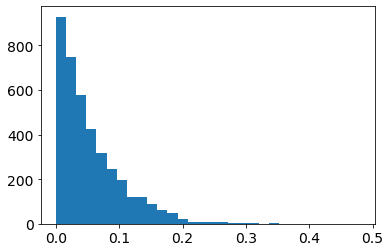

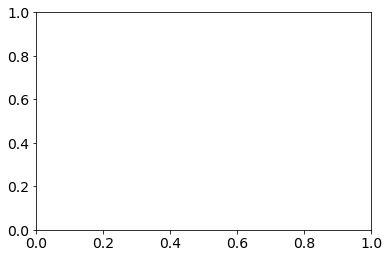

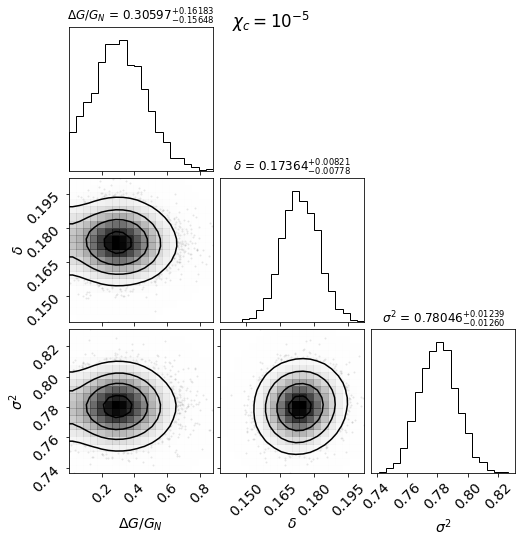

  1%|▏                                          | 5/918 [00:00<00:22, 41.49it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 2.906509387584633e-07
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 2.2580866334882845e-07
10213-1902 [29.247145728643215] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 29.247145728643215 3.222045532612921e-08 4.948648645974291e-09
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 7.949536724584761e-08
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0

  2%|▋                                         | 14/918 [00:00<00:28, 32.15it/s]

10219-9102 [50] [1.3962, 1.1814, 0.7492, 0.4692, 0.3335, 0.2205, 0.1532, 0.1423, 0.1945, 0.153, 0.0798, 0.0216, -0.0715, -0.157, -0.0196, -0.0532, -0.0405]
10219-9102 50.0 0.0 3.289787074976099e-07
10220-12705 [50] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 50.0 0.0 4.1152279824072624e-07
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 1.2815450278961552e-06
10224-9101 [50] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 50.0 0.0 1.6903638641950985e-07
10226-12704 [50] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694, 0.4691, 0.2789, 0.37, 0.364, 0.3135, 0.363, 0.2811, 0.3307, 0.2727, 0.312, 0.3727, 0.1385, 0.4167, 0.2188, -0.3444, 0.1093]
10226-12704 50.0 0.0 6.645649770790097e-08
10226-12705 [50] [1.0258, 2.2633

  2%|█                                         | 22/918 [00:00<00:28, 31.52it/s]

10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 3.5680213138224297e-06
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 1.9791433890229635e-06
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 50.0 0.0 2.637299910282805e-07
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 5.384350338882589e-07
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.0093, -0.0019, -0.047, -0.0973, -0.098, -0.0699]
10494-6101 50.0 0.0 1.555395184333657e-06
10494-9101 [50] [0.1044, 0.2038, 1.4077, 1.

  3%|█▏                                        | 27/918 [00:00<00:25, 34.30it/s]

10495-12705 [50] [871.1598, 1245.0304, 1205.1955, 1347.7893, 1374.3588, 1517.2635, 1622.8998, 1633.9971, 1757.8692, 1799.4196, 1854.634, 1999.5551, 1849.1662, 1882.4866, 1807.1303, 1651.9125, 1681.1326, 1493.9167, 2771.4516, 2121.0254, 1992.5196]
10495-12705 50.0 0.0 1.7491030617296507e-07
10495-3702 [50] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 50.0 0.0 2.6032950344707055e-07
10496-12704 [50] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268.8121, 253.915, 333.7881, 358.7629, 315.1183, 261.3063, 216.6964, 267.188, 258.5169, 256.0365, 248.4992]
10496-12704 50.0 0.0 2.885276509823932e-07
10496-12705 [36.96380301507538] [-0.3879, -0.1399, 0.1719, 0.4444, 0.4904, 0.2805, 0.2146, 0.344, 0.3105, 0.2505, 0.2112, 0.1741, 0.0585, 0.0082, -0.033, 0.0654, 0.0338, 0.38, 0.1359]
10496-12705 36.96380301507538 1.596134704033887e-08 2.1273896891057236e-08
10498-12705 [50] [2.2376, 1.8111, 0.8617, 0.4311, 0.299, 0.2455, 0.2899, 0

  4%|█▌                                        | 35/918 [00:01<00:26, 33.37it/s]


10499-3703 50.0 0.0 2.3995971088121294e-07
10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 3.833954018687133e-07
10500-12704 [31.403192964824125] [140.7935, 35.4055, 16.1502, 8.7997, 6.1202, 5.6067, 5.0715, 4.9205, 5.0767, 4.6234, 4.2501, 4.0673, 3.8962, 3.8831, 3.7867, 3.6009, 3.0687, 4.1948, 2.9642, 3.5448, 1.9938, -0.2753, 2.8838, 5.8145]
10500-12704 31.403192964824125 2.9203971264727934e-08 7.915831481001933e-09
10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 9.158911867531657e-07
10500-3702 [46.19094673366834] [211.267, 568.975, 609.2163, 763.7494, 654.0512, 608.9412, 619.4812, 574.1158, 551.0555, 546.396, 492.531, 452.6766, 495.1396, 321.2342, 371.609, 358.446, 200.8978, 319.0074, 284.1887, 209.7882, 190.8027, 318.1602, 354.0653]
10500-3702 46.19094673366834 5.700878361346162e-09 3.1459687912117643e-08
10500-3703 [50] [-0.028, -0.1828, 0.6642, 1.103

  5%|█▉                                        | 43/918 [00:01<00:27, 32.03it/s]

10501-6101 [50] [54.152, 240.5257, 446.403, 593.882, 679.4829, 745.3089, 578.3118, 397.5307, 268.9797, 276.8619, 234.4717, 196.8602, 156.2454, 140.6324, 64.5922]
10501-6101 50.0 0.0 9.241937346557947e-08
10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 50.0 0.0 1.0706196497549686e-07
10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 1.968577876234621e-07
10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 6.205036635723042e-06
10505-12704 [50] [0.6223, 0.447, 0.4087, 0.27, 0.0901, 0.1644, 0.1572, 0.3129, 0.3336, 0.3492, 0.2338, 0.2536, 0.1307, 0.2303, 0.2492, 0.6718, 0.9822, 1.3729, 3.1505, 2.3435]
10505-12704 50.0 0.0 1.6449820753696624e-07
10506-91

  5%|██▏                                       | 47/918 [00:01<00:27, 31.90it/s]

10509-12703 [50] [1226.9439, 2166.987, 2538.8741, 2127.6504, 1648.0951, 1358.0909, 1167.9374, 985.8138]
10509-12703 50.0 0.0 5.325685300348278e-07
10509-1901 [50] [88.4511, 296.1948, 449.6905, 409.1127, 761.2326, 574.7336, 678.7086, 604.9771, 571.2616, 614.5332, 408.9334, 441.3848, 355.292, 300.996, 243.919, 230.1612, 180.5992, 163.4382, 176.2701, 193.176, 205.4741]
10509-1901 50.0 0.0 8.575147519308361e-08
10509-6101 [19.084366834170854] [414.6573, 159.5598, 352.8386, 670.9188, 930.199, 434.1238, 984.9702, 921.6235, 784.8291, 825.2006, 827.4197, 661.5592, 624.5693, 894.3523, 620.0269, 747.519, 623.1939, 701.341, 577.342, 1031.0135, 622.2157, 697.4912, 668.4888, 271.226]
10509-6101 19.084366834170854 3.010100795260185e-08 7.204846125739585e-09
10511-12704 [50] [-0.0162, 0.2052, 0.0934, -0.0203, -0.0645, -0.0743, -0.1124, -0.1256, -0.1314, -0.1489, -0.145, -0.1344, -0.261, -0.3154, -0.4542, -0.3737, -0.3967, -0.387, 0.3583, -0.1418, -0.7705]
10511-12704 50.0 0.0 5.49937936809962e-07
105

  6%|██▌                                       | 56/918 [00:01<00:25, 33.40it/s]

10512-9102 [50] [4147.3152, 2927.8473, 3245.8656, 2878.0674, 2617.7881, 2204.6977, 1695.8151, 1371.2689, 1298.2413, 1241.1228, 1357.9116, 1330.7104, 1714.839, 1930.3755, 2196.7284, 2401.8011, 2844.302, 3122.8481, 2925.4465]
10512-9102 50.0 0.0 2.6591714539305077e-07
10513-12702 [50] [-0.9916, -0.9877, -0.9855, -0.9802, -0.9787, -0.98, -0.9868, -0.9787, -0.862, -0.9802]
10513-12702 50.0 0.0 1.3207804441043222e-07
10514-6103 [40.402010050251256] [0.5999, 0.3982, 0.2747, 0.2749, 0.0781, 0.0617, 0.0681, -0.0189, -0.0377, -0.0578, -0.065, -0.0594, 0.0253, -0.0317, 0.1182, -0.1428, -0.1895, -0.2508, -0.2991, -0.355]
10514-6103 40.402010050251256 1.6494335295398147e-08 2.1004479789991933e-08
10516-6104 [50] [0.3084, -0.237, -0.3593, -0.3575, -0.3434, -0.2974, -0.3603, -0.4386, -0.4629, -0.4919, -0.5092, -0.5031, -0.4319, -0.4152, -0.2877, -0.6618]
10516-6104 50.0 0.0 3.4171561128132514e-07
10517-3704 [50] [6.5457, 4.9823, 4.7496, 3.3043, 2.1613, 1.6053, 1.1745, 0.9031, 0.7267, 0.8082, 0.6442,

  7%|██▉                                       | 64/918 [00:01<00:26, 32.08it/s]

10518-6102 [50] [-0.217, 1.2282, 0.4062, 0.3459, 0.382, 0.1799, 0.1478, 0.1175, 0.0995, 0.1358, 0.0812, 0.048, 0.0452, 0.0639, 0.0875, 0.0309, 0.0337, 0.0007, -0.0113, -0.1383]
10518-6102 50.0 0.0 1.776957210379015e-07
10519-12704 [50] [-0.2611, 0.2686, 0.1702, 0.0601, 0.0584, 0.0258, -0.0515, -0.1077, -0.1123, -0.1006]
10519-12704 50.0 0.0 7.177440649704916e-07
10519-6102 [50] [15.342, 9.7033, 5.6052, 3.8579, 2.785, 2.1688, 1.9416, 1.9483, 2.0544, 1.8028, 1.946, 2.1855, 2.046, 2.3544, 2.1616]
10519-6102 50.0 0.0 2.693220304470975e-07
10520-12704 [50] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.0366, 0.0275, -0.0135, 0.0213, 0.0998, -0.1048, -0.1309]
10520-12704 50.0 0.0 1.39886482561901e-07
10520-6102 [50] [-0.9995, -0.9993, -0.9985, -0.9976, -0.9986, -0.9981, -0.9983, -0.9984, -0.9986, -0.9981, -0.9963]
10520-6102 50.0 0.0 2.1739782760998507e-07
10838-9101 [50] [-0.0928, 0.4421, 0.4896, 0.3922, 0.2667, 0.3141, 0.2582, 0.2949, 0.294, 0.2543, 0.2198, 0.1153, 0.0

  8%|███▎                                      | 72/918 [00:02<00:26, 31.57it/s]

10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712, 0.035, -0.0115, 0.0248, -0.0288, 0.0512, -0.0187, 0.0073, 0.0432, -0.0916, -0.1233, -0.1818, -0.1471]
10839-3704 50.0 0.0 2.354543074907354e-07
10839-6101 [50] [244.3098, 615.0842, 876.8345, 1563.8627, 1705.1968, 1816.091, 1687.128, 1731.6052, 1640.9131, 1596.506, 1498.4971, 1406.0518, 671.6148, 995.7509]
10839-6101 50.0 0.0 1.7767652840145359e-07
10839-9101 [50] [2.1426, 2.2648, 0.9796, 0.8183, 0.5304, -0.0332, -0.1785, -0.3432, -0.3468, -0.4742, -0.4095, -0.6139, -0.5305, -0.616, -0.529, -0.5494, 0.8162, 3.2784]
10839-9101 50.0 0.0 3.103153293904277e-07
10841-12701 [50] [-0.7323, -0.6652, -0.4249, -0.3016, -0.2957, -0.3482, -0.374, -0.3905, -0.3944, -0.4309, -0.4302, -0.4504, -0.4708, -0.4257, -0.4725]
10841-12701 50.0 0.0 1.796980192270974e-07
10842-3702 [50] [-0.5415, 0.0585, 0.2828, 0.1825, 0.1674, 0.1342, 0.1324, 0.2899]
10842-3702 50.0 0.0 3.2842436584129316e-07
10842-3703 [50] [-0.6099, -0.8101, -0.8807, -0.9171, -0.9297, -0.9289

  8%|███▍                                      | 76/918 [00:02<00:26, 31.30it/s]

10845-12702 [50] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-12702 50.0 0.0 2.518059511766773e-07
11004-12705 [50] [-0.8497, -0.6991, -0.5203, -0.3493, -0.2406, -0.2193, -0.1954, -0.1792, -0.1842, -0.1767, -0.1858, -0.1781, -0.195, -0.2173, -0.2294, -0.167, -0.2434, -0.1514, -0.3351, -0.2129]
11004-12705 50.0 0.0 3.615959686655114e-07
11004-3703 [50] [5607.0165, 6199.0745, 5122.0907, 4588.5334, 3798.1606, 3256.1827, 2909.7374, 2623.1995, 2081.3703, 1622.0266, 1252.6703, 1054.2993, 797.551, 805.4299, 667.6425]
11004-3703 50.0 0.0 1.1921693165886878e-07
11004-6104 [50] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 50.0 0.0 2.2652586111172349e-07
11009-12704 [50] [-0.044, 0.5574, 0.4941, 0.5156, 0.452, 0.4031, 0.3736, 0.4191, 0.4646, 0.4848, 0.558, 0.4716, 0.2432, 0.3821, 0.6252, 0.8487, 0.8601]
11009-12704 50.0 0.0 9.537534457536637e-07


  9%|███▊                                      | 84/918 [00:02<00:25, 32.93it/s]

11010-6104 [50] [669.1593, 612.5725, 580.2933, 433.0387, 377.072, 315.1925, 269.3918, 266.5579, 267.4688, 253.2676, 240.0639, 221.1944, 344.4065]
11010-6104 50.0 0.0 4.420178115170221e-07
11010-9101 [50] [2.5718, 0.9269, 0.2901, 0.1931, 0.0011, -0.0504, -0.0935, -0.075, 0.0093, 0.0203, 0.0025, -0.0251, -0.0362, 0.0004, 0.0161, -0.0012, -0.102, -0.364, -0.4377]
11010-9101 50.0 0.0 4.950014031464196e-07
11011-12703 [50] [9.8651, 35.0102, 40.3579, 54.0601, 192.4013, 365.0512, 378.092, 411.2362, 282.7202, 230.5846, 329.2445, 263.6472, 244.1501]
11011-12703 50.0 0.0 2.560118630094323e-07
11012-12705 [50] [0.2329, 0.5509, 0.2517, 0.0195, 0.0174, -0.0704, -0.1937, -0.145, -0.249, -0.0592, -0.302, -0.1828, -0.2112]
11012-12705 50.0 0.0 1.9400876451273097e-06
11012-3702 [50] [7.8974, 3196.585, 2734.8285, 2253.8811, 4078.0168, 2401.2221, 2680.4924, 2677.0305, 2494.671, 2122.0656, 2023.2433, 2124.4295, 1742.4806, 1879.5204, 1353.859, 1265.244, 1077.374, 829.3809, 807.9255, 437.3493, 291.3315]
110

 10%|████▏                                     | 92/918 [00:02<00:23, 35.36it/s]

11013-3701 [50] [0.785, 0.6845, 0.2024, 0.0457, 0.0342, 0.02, -0.06, -0.0296, -0.0379, -0.1677]
11013-3701 50.0 0.0 9.745198955731417e-08
11013-3702 [50] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 50.0 0.0 5.545167893368615e-06
11013-6101 [50] [0.3389, -0.3422, -0.154, -0.2894, -0.4104, -0.4385, -0.4897, -0.4798, -0.43, -0.3971, -0.3753, -0.3775, -0.3376, -0.2419, -0.1243, 0.0068, -0.1557, 0.0318, -0.0178, 0.2532, 0.5345, 0.5099]
11013-6101 50.0 0.0 5.228381869744666e-07
11017-12703 [50] [0.0185, 0.3093, 0.3468, 0.2632, 0.2308, 0.2072, 0.1992, 0.215, 0.2444, 0.2273, 0.053, -0.0123, 0.1078, -0.0553]
11017-12703 50.0 0.0 1.896007103000439e-07
11017-12704 [50] [0.4751, 0.4487, 0.3988, 0.2586, 0.0625, -0.0537, -0.0751, -0.1094, -0.1157, -0.1027, -0.1141, -0.1182, -0.1126, -0.1047, -0.0836, -0.1961, -0.2389]
11017-12704 50.0 0.0 3.148544240537897e-07
11017-6103 [50] [-0.3235, -0.3265, -0.3479, -0.2253, -0.2261, -0.1769, -0.1311, -0.1075, -0.0747, -0.0989, -0.137

 11%|████▍                                    | 100/918 [00:03<00:24, 33.79it/s]

11018-12704 [50] [-0.9989, -0.9988, -0.9986, -0.9987, -0.9988, -0.999, -0.999, -0.9991, -0.9991, -0.9987, -0.9984, -0.9975, -0.9987, -0.9989]
11018-12704 50.0 0.0 5.792747387227928e-07
11018-3702 [50] [0.6083, 0.007, 0.0959, 0.33, 0.5514, 0.4356, 0.3654, 0.3085, 0.3057, 0.287, 0.3004]
11018-3702 50.0 0.0 1.3192197970981656e-07
11018-3703 [50] [-0.5454, 0.4164, 0.6741, 0.5852, 0.6907, 0.7028, 0.6059, 0.5528, 0.656, 0.6306, 0.5445, 0.5549, 0.4676, 0.4329, 0.3355, 0.3242, 0.462, 1.051, 0.5129, 1.3094]
11018-3703 50.0 0.0 2.2519560478653896e-07
11018-6102 [50] [69.1052, 130.9961, 113.1141, 109.1797, 92.5989, 91.6354, 88.5765, 83.9604, 80.137, 76.3564, 74.3146, 74.7218, 70.495, 71.7331, 65.8452, 64.9321, 72.2612]
11018-6102 50.0 0.0 9.865058614232947e-07
11019-12702 [50] [0.0142, 0.2516, 0.1906, 0.1378, 0.0877, -0.003, 0.0993, 0.0958, 0.1065, 0.1232, 0.2086, 0.1132, 0.0357, -0.0115, -0.014, 0.0302, -0.0875, -0.1071]
11019-12702 50.0 0.0 2.450837292306885e-07
11019-12703 [50] [-0.4993, -0.46

 12%|████▊                                    | 108/918 [00:03<00:26, 30.49it/s]

11019-3701 [50.0] [2.5964, 1.3616, 0.9142, 0.3658, 0.0143, -0.1157, -0.1148, -0.102, -0.0691, -0.1802, -0.166, -0.2893, -0.0849]
11019-3701 50.0 0.0 3.726437314506954e-08
11021-1902 [50] [5.9017, 3.1432, 2.8491, 1.9605, 1.7177]
11021-1902 50.0 0.0 1.8483877431301746e-06
11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 6.894341314646078e-07
11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 1.0642666665286889e-06
11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 7.918572548486443e-07
11742-12704 [50] [0.6702, -0.5312, -0.3481, 0.0047, 0.1348, 0.415, 0.2787, 0.5138, -0.0348]
1

 12%|█████                                    | 113/918 [00:03<00:23, 34.09it/s]

11743-1901 [50] [-0.5717, -0.3943, -0.5273, -0.3736, -0.306, -0.392, -0.3766, -0.4151, -0.3665, -0.4111, -0.4236, -0.3424, -0.3877, -0.3594, -0.291, -0.4952, -0.6018]
11743-1901 50.0 0.0 1.5275107313114166e-06
11744-9102 [50] [-0.6298, 0.0464, 0.3943, 0.6247, 0.4097, 0.3518, 0.3414, 0.4046, 0.4742, 0.4313, 0.3693, 0.3275, 0.2214, 0.1278, 0.0812, 0.4043, 0.1792, -0.1336]
11744-9102 50.0 0.0 9.23561626685824e-07
11745-1902 [50] [1.185, 0.9719, 0.4625, 0.4231, 0.2188, 0.1795, 0.0428, 0.0263, -0.0784, -0.2371, 0.1632]
11745-1902 50.0 0.0 4.1723974374355616e-08
11745-6104 [50] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.8527, 0.5703, 0.5078, 0.5176, 0.5143, 0.48, 0.4463, 0.4504, 0.4653, 0.4273, 0.4049]
11745-6104 50.0 0.0 9.768533945321356e-07
11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.0361, -0.076, -0.0711, -0.1542, -0.2041, -0.2119, -0.1066, -0.2705, -0.3138]
11745-9101 50.0 0.0 2.5059472217933715e-07
11746-3703 [50] [-0

 13%|█████▍                                   | 121/918 [00:03<00:23, 33.71it/s]

11747-12702 [50] [-0.4876, -0.2412, -0.0165, -0.0887, -0.0931, -0.0756, -0.076, -0.0313, -0.0043, 0.0037, -0.0318, -0.1133, 0.1257, -0.1019, 0.1921, -0.2837, -0.0753]
11747-12702 50.0 0.0 8.718768370181385e-07
11749-12701 [50] [-0.6821, -0.1137, 0.255, 0.1029, 0.0811, -0.0849, -0.2182, -0.1487, -0.1095, -0.0437, -0.1285, -0.1939]
11749-12701 50.0 0.0 3.815910324071953e-07
11749-12704 [50] [1.1585, 1.0264, 1.2033, 1.4986, 1.8954, 2.0398, 2.1095, 2.1199, 1.4688, 1.3033, 0.9132, 0.8426, 0.0515, 0.4719, -0.3735]
11749-12704 50.0 0.0 1.65739070920334e-07
11749-3701 [50] [618.0455, 872.9003, 1483.1859, 1615.2011, 1553.7949, 1334.0598, 1385.5396, 1283.8547, 1216.0833, 1294.494, 1472.7433, 1080.4933, 1346.7897, 1196.9726, 1091.8413, 1216.7304, 927.7028, 363.0292, 281.9853, 551.8779, 169.9359, 54.7426, 122.374, 379.7425, 27.1507]
11749-3701 50.0 0.0 1.9957423811290682e-07
11750-12701 [50] [0.4224, 0.3089, 0.0791, 0.0892, 0.2329, 0.2222, 0.1114, 0.03, 0.0196, 0.0027, 0.0313, 0.0827, 0.0275, 0.30

 14%|█████▊                                   | 129/918 [00:03<00:25, 31.37it/s]

11750-9101 [43.08401005025126] [13.4461, 9.2464, 8.3896, 5.4399, 4.9554, 3.0033, 3.1782, 2.4566, 2.5343, 2.0961, 2.3663, 2.3818, 2.4375, 3.0403, 2.3998, 2.3406, 2.9409, 6.8913, 8.6024]
11750-9101 43.08401005025126 1.8875748404748055e-08 1.848338203138526e-08
11751-1901 [50] [-0.9334, -0.8849, -0.9513, -0.9754, -0.9893, -0.9862, -0.989, -0.9902, -0.9893, -0.9909, -0.9903, -0.9906, -0.9888, -0.9874]
11751-1901 50.0 0.0 9.88667140238666e-07
11751-6102 [50] [0.3738, 0.0535, 0.3785, 0.2124, 0.1333, 0.0258, -0.0223, -0.094, -0.1099, -0.1415, -0.1724, -0.2013, -0.1841, -0.253, -0.3949, -0.2255, -0.2141, -0.2775]
11751-6102 50.0 0.0 1.0385118106831301e-06
11753-3703 [50] [0.2801, 0.7604, 0.7391, 0.5795, 0.35, 0.1693, 0.0874, 0.0586, 0.0152, -0.0057, -0.0099, -0.0594, -0.1073, -0.139, -0.1496]
11753-3703 50.0 0.0 4.446350248358591e-07
11753-6104 [50] [1.7058, 1.5787, 1.7231, 1.492, 1.0043, 0.8699, 0.6579, 0.5905, 0.5042, 0.4712, 0.4504, 0.6153, 0.6589, 0.6817, 0.5206, 0.5457, 0.5195, 0.692]
117

 15%|██████                                   | 137/918 [00:04<00:24, 32.46it/s]

11755-6101 [50] [-0.0093, 1.0489, 0.9853, 1.2444, 1.0667, 0.8902, 0.7008, 0.6245, 0.5835, 0.5179, 0.397, 0.4083, 0.4791, 0.2148, 0.053]
11755-6101 50.0 0.0 8.14455536704504e-08
11755-9102 [50] [0.1799, 0.2485, 0.3504, 0.383, 0.2088, 0.1465, 0.0712, -0.0042, -0.0415, -0.0215, 0.0671, 0.0623, 0.1393, -0.1017, 0.125, -0.214, -0.1458]
11755-9102 50.0 0.0 2.648154443047213e-07
11758-3701 [50] [-0.3091, 0.0326, 0.2349, 0.1141, 0.0113, 0.06, -0.0268, -0.1507, -0.2171, -0.1994, -0.1587, -0.1557, -0.1574, -0.1614, -0.0618]
11758-3701 50.0 0.0 1.9956816772587648e-07
11758-3702 [50] [-0.544, -0.1141, 0.0167, 0.1028, 0.0854, -0.0041, -0.0149, 0.0406]
11758-3702 50.0 0.0 2.1522682050334275e-07
11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 50.0 0.0 4.723423543853587e-07
11759-6102 [50] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, -0

 15%|██████▎                                  | 141/918 [00:04<00:23, 32.94it/s]

11760-6101 [50] [0.4533, -0.0157, 0.5654, 0.502, 0.3995, 0.359, 0.3287, 0.2964, 0.2063, 0.2512, 0.2686, 0.2421, 0.2368, 0.1884, 0.0906, -0.0471, -0.3849, -0.319, -0.8166]
11760-6101 50.0 0.0 6.957746956219952e-07
11760-6103 [50] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.2117, -0.2373, -0.2365, -0.2317, -0.3078, -0.2653, -0.3184, -0.2638]
11760-6103 50.0 0.0 1.4633266095365902e-07
11760-9102 [33.50997085427135] [-0.8049, -0.6427, -0.2931, -0.1213, 0.1899, 0.0235, 0.108, 0.1381, 0.1732, 0.1865, 0.1624, 0.1963, 0.1218, 0.1215, 0.1223, 0.2636, 0.046, 0.5962, 0.1808, 0.9922, 2.2582]
11760-9102 33.50997085427135 1.749531084503301e-08 1.9766988518011456e-08
11761-12702 [50] [-0.6826, -0.6017, -0.2216, -0.1122, -0.0329, -0.02, -0.0711, -0.0937, -0.0782, -0.098, -0.1546, -0.1024, -0.1043, -0.0648, -0.2102, -0.3314, -0.2483]
11761-12702 50.0 0.0 1.356675649282237e-06
11761-12703 [50] [0.4093, 0.08, -0.0588, -0.0478, 0.0006, -0.0009, -0.0617, -0.1284, -0.

 16%|██████▋                                  | 149/918 [00:04<00:24, 31.93it/s]

11823-9101 [50] [15949.1976, 8800.0053, 8323.3916, 4811.1692, 2214.9858, 717.2733, 413.2719, 305.7873, 173.5393, 146.0478, 195.6604, 224.7593, 189.4201, 67.1778]
11823-9101 50.0 0.0 1.8789687188155246e-07
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 5.7760553994781935e-06
11828-12703 [50] [-0.5587, -0.2913, 0.1844, 0.3112, 0.2627, 0.2124, -0.0354, -0.0957, -0.1295, -0.1601, -0.0565, -0.1246, 0.0413]
11828-12703 50.0 0.0 7.41162026326222e-07
11830-12701 [50] [-0.9938, -0.9825, -0.9834, -0.9912, -0.9934, -0.9941, -0.9946, -0.9933, -0.9936, -0.9951, -0.9951, -0.9944, -0.9947, -0.9932, -0.9955, -0.9854, -0.997, -0.9939, -0.9962]
11830-12701 50.0 0.0 3.5331859112659973e-07
11830-12703 [50] [-0.4776, 0.0437, 0.1582, -0.0709, -0.1607, -0.0754, 0.055, 0.2665, 0.1845, 0.03, 0.0663, -0.087, -0.2185, -0.1589, 0.0536, -0.3722]
11830-12703 50.0 0.0 5.078568446039805e-07
11830-3702 [50] [1.2

 17%|███████                                  | 157/918 [00:04<00:24, 30.60it/s]

11831-12703 [50] [0.4472, 0.0224, 0.062, 0.158, -0.0429, -0.0922, -0.1252, -0.188, -0.1276, -0.16, -0.2596, -0.2165, 0.1708, -0.4595]
11831-12703 50.0 0.0 2.917903601167446e-07
11831-12704 [50] [-0.5822, -0.2435, 0.0115, -0.0848, -0.1704, -0.028, -0.0888, -0.0323, -0.0445, -0.106, -0.3871, -0.1836]
11831-12704 50.0 0.0 1.0571296160774028e-06
11831-6101 [50] [-0.9875, -0.994, -0.9968, -0.9973, -0.9967, -0.9975, -0.9969, -0.9978, -0.9979, -0.9971, -0.9984, -0.9986, -0.9985, -0.9974]
11831-6101 50.0 0.0 1.6286456738065855e-07
11831-6102 [50] [1.041, 0.6096, 0.4053, 0.165, 0.0902, 0.1922, 0.1873, 0.1187, 0.1055, 0.0085, -0.1108, -0.0737]
11831-6102 50.0 0.0 2.8032038437983687e-07
11833-9102 [50] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.2658, -0.2176, -0.1929, -0.2471, -0.3166]
11833-9102 50.0 0.0 2.7754258567620667e-07
11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795,

 18%|███████▏                                 | 161/918 [00:04<00:25, 29.96it/s]

11838-12701 [50] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 0.1336, 0.0903, 0.0213, -0.0554, -0.0342, 0.0225, 0.0053, -0.0272]
11838-12701 50.0 0.0 7.104740663809383e-08
11838-12703 [50] [144.9042, 254.2159, 538.0129, 911.0748, 1089.8377, 1111.2623, 1284.2649, 1228.3752, 1345.2496, 1400.7846, 1427.4787, 1434.5371, 1257.47, 1184.9615, 998.2342, 830.6266, 670.98, 596.3078, 488.5417, 423.536, 329.6538, 32.3109, 5.6457, 31.8479]
11838-12703 50.0 0.0 4.92522550755435e-07
11838-3702 [50] [0.536, 0.7094, 0.6061, 0.6555, 0.6466, 0.6204, 0.5689, 0.587, 0.6487, 0.6337, 0.5876, 0.5059, 0.4509, 0.4328, 0.3954, 0.396]
11838-3702 50.0 0.0 4.5082537229071194e-07
11838-6103 [50] [201.1554, 531.7007, 967.9199, 1125.4471, 1324.9799, 1297.8083, 1279.6033, 1183.901, 1134.9301, 1132.4611, 1104.3121, 1011.7157, 1287.8266]
11838-6103 50.0 0.0 5.987175380670347e-07
11838-9101 [50] [11.4727, 10.3246, 9.7757, 7.6641, 6.3263, 7.7985, 4.6854, 6.1379, 3.8072, 5.5203, 3.0518, 3.9759, 1.4403, 2.8333, 2.6956, 2.5542]
1

 18%|███████▌                                 | 169/918 [00:05<00:24, 30.16it/s]

11865-12704 [50] [0.4447, -0.0557, -0.3894, -0.457, -0.5111, -0.5109, -0.5238, -0.5353, -0.4955, -0.5012, -0.4831, -0.4726, -0.599, -0.615]
11865-12704 50.0 0.0 4.924703180269699e-07
11865-1901 [50] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 50.0 0.0 5.01053511367276e-07
11865-1902 [50] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0.4429]
11865-1902 50.0 0.0 1.3306940959573861e-07
11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 5.370562437457484e-07
11865-9102 [50] [-0.467, -0.4695, -0.4789, -0.5286, -0.6182, -0.6445, -0.6408, -0.6047, -0.6031, -0.6243, -0.655, -0.6895, -0.6998, -0.5904, -0.6729, -0.6983]
11865-9102 50.0 0.0 3.4692468289739846e-07
11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2771, 0.298, 0.3814, 0.3262, 0.2102, 0.3978, 0.4467, 0.2866, 0.1214, 0.2202, 0.1346, 0.4041]
11867-6104 50.0 0.0 9.198215283819499e-07
11867-

 19%|███████▉                                 | 177/918 [00:05<00:24, 30.41it/s]

11868-12703 [50] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 1.705680443199584e-06
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 4.983117525367335e-07
11871-6103 [50] [0.7182, 0.8575, 0.776, 0.4737, 0.2556, 0.1173, 0.1395, 0.111, 0.0842, 0.0381, 0.0003, -0.0281, -0.0195, -0.044, -0.0588, -0.2086, -0.132, -0.377]
11871-6103 50.0 0.0 9.885121916928547e-07
11940-1902 [50] [-0.0835, 0.1518, 0.1321, 0.0182, -0.0843, -0.1452, -0.1779, -0.1993, -0.1955]
11940-1902 50.0 0.0 6.783442218140314e-07
11940-3703 [31.633139698492457] [1.1615, 1.5645, 1.5154, 1.5213, 1.3625, 1.1856, 0.9977, 0.7191, 0.6591, 0.6153, 0.3767, 0.433, 0.6417, 0.1616, 0.444, 0.2018, 0.0806, 0.2143, 0.1328]
11940-3703 31.633139698492457 2.2956513724145327e-08 1.4466671503623843e-08
11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.99

 20%|████████▎                                | 185/918 [00:05<00:23, 31.42it/s]

11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 2.2700977592107654e-05
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389.9946, 2439.1642, 2636.587, 2485.7262, 2056.7992, 1736.2622, 1623.5415, 1192.5228, 781.8483, 546.9719, 175.874]
11942-12704 50.0 0.0 1.507177805038143e-06
11942-6104 [40.21881407035176] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 40.21881407035176 2.5054702562330244e-08 1.1862411353161087e-08
11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.0425, -0.0331, -0.0546, -0.0982, -0.1371, -0.164, -0.179, -0.1863, -0.172, -0.1572, -0.1563, -0.1648, -0.1726, -0.27]
11943-3703 50.0 0.0 1.0813812372992088e-06
11944-12701 [50] [-0.3604, -0.3617, -0.4276, -0.5869, -0.6347, -0.6283, -0.548, -0.5758, -0.5204, -0.4847, -0.4769, -0.4857, -0.5345, -0.6

 21%|████████▍                                | 189/918 [00:05<00:24, 30.20it/s]

11945-6102 [50] [3.5224, 2.2109, 1.4349, 1.0152, 0.7457, 0.4864, 0.2556, 0.1192, 0.0508, 0.0117, -0.0209, -0.0683, -0.158, -0.0976, -0.2012]
11945-6102 50.0 0.0 6.207715714946936e-07
11947-6103 [50] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 50.0 0.0 2.6706673068116253e-07
11949-12701 [50] [1.1975, 0.3408, 0.1441, 0.1243, 0.0225, 0.0003, 0.0028, 0.027, 0.0197, 0.0192, -0.0295, -0.0839]
11949-12701 50.0 0.0 3.698500910900993e-07
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 9.912873634622989e-06
11954-12704 [50] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453, 0.1801, 0.125, 0.0276, -0.0116, -0.0744, -0.134, -0.1626, -0.2559, -0.2802]
11954-12704 50.0 0.0 1.8790516593704279e-06
11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466

 21%|████████▊                                | 196/918 [00:06<00:25, 28.75it/s]

11954-9101 [50] [-0.9882, -0.9937, -0.9946, -0.9965, -0.9974, -0.9972, -0.997, -0.9969, -0.997, -0.9974, -0.9978, -0.9979, -0.9973, -0.9971, -0.9976, -0.9966]
11954-9101 50.0 0.0 7.343021503344118e-07
11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 9.970585912831186e-07
11956-12702 [50] [5.6953, 5.0804, 3.2564, 2.1056, 1.2622, 0.6457, 0.4602, 0.5373, 0.9503, 3.7649, 5.1679]
11956-12702 50.0 0.0 1.0817226663929352e-06
11956-12705 [50] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 0.2419, 0.2565, 0.3525, 0.1776, 0.103, 0.3387, 0.3814, 0.7221, 0.77]
11956-12705 50.0 0.0 4.796450313872089e-07
11957-12704 [50] [-0.3492, 0.7667, 0.6853, 0.5861, 0.3661, 0.189, 0.1584, 0.1015, -0.0026, 0.0319, 0.1228, 0.1275, 0.2204, 0.0938]
11957-12704 50.0 0.0 1.1170611812459548e-07
11957-9101 [50] [127.5969, 337.5453, 692.0501, 754.6672, 761.8038, 673.5367, 561.8056, 470.5271, 446.8

 22%|█████████                                | 202/918 [00:06<00:26, 27.25it/s]

11957-9102 [50] [1.0969, 0.3397, 0.6198, 1.0919, 1.791, 2.069, 2.6145, 2.7123, 2.8073, 2.4726, 2.1945, 1.9756, 2.1362, 4.7679, 3.0873, 1.2673, 3.459, 16.3037, 15.1044]
11957-9102 50.0 0.0 3.5054698002399483e-07
11958-6103 [50] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 50.0 0.0 1.9201366183602922e-07
11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 6.609278615049956e-07
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 50.0 0.0 2.2434875303498315e-06
11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.9843, 0.6333, 0.3517, 0.1829, 0.1258, 0.0956, 0.1424, 0.1021, 0.028, 0.1221]
11965-9102 50.0 0.0 6.310206621180779e-07


 22%|█████████▏                               | 205/918 [00:06<00:27, 25.99it/s]

11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 1.619443161731232e-06
11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.8986, 3.5843, 4.0724, 0.9129, 2.9875, 0.7205, 2.6408, 1.2362]
11969-6101 50.0 0.0 1.3661949321427007e-06
11970-12703 [50] [-0.4888, -0.3498, -0.0561, 0.1594, 0.1669, 0.133, 0.154, 0.1676, 0.144, 0.1071, 0.072, 0.0457, 0.046, 0.0501, 0.1262, -0.0083, 0.2366]
11970-12703 50.0 0.0 9.462708242945133e-08
11970-6102 [50] [-0.0116, -0.0683, -0.0558, -0.0053, 0.0454, 0.025, 0.078, -0.0283, -0.085, -0.1052, -0.0602, -0.0272, -0.0693, -0.0116, -0.1378, -0.2799, -0.2497]
11970-6102 50.0 0.0 4.2859519713348906e-07
11970-6103 [50] [0.7466, 1.1751, 1.6643, 1.3977, 1.0416, 0.8262, 0.6871, 0.5199, 0.4194, 0.3266, 0.2718, 0.2909, 0.2357, 0.2575, 0.2139, 0.0837, -0.0144, -0.0619, 0.133]
11970-6103 50.

 23%|█████████▌                               | 214/918 [00:06<00:26, 26.27it/s]

11975-12701 [50] [-0.1741, -0.13, 0.3291, 1.0808, 1.3321, 1.3798, 1.0057, 0.9745, 0.8989, 0.5699, 0.4672, 0.2163]
11975-12701 50.0 0.0 1.3380511942806224e-07
11975-12705 [50] [0.6902, 0.7621, 0.3208, 0.2527, 0.3317, 0.3259, 0.2387, 0.0864, 0.069, 0.2015, 0.1928, 0.1502, -0.0055, -0.1924]
11975-12705 50.0 0.0 5.132314129074949e-07
11975-3703 [50] [-0.2597, -0.0329, 0.0768, 0.0833, 0.1048, 0.0682, 0.0342, -0.0156, -0.0756, -0.093, -0.0695, -0.0466, 0.0656, -0.0085, 0.1237, 0.1334, 0.0646]
11975-3703 50.0 0.0 2.3829880802338642e-07
11975-6104 [50] [1.0196, 1.2709, 1.5062, 1.1104, 0.9965, 0.7778, 0.776, 0.6311, 0.7603, 0.6278, 0.6208, 0.5151, 0.5172, 0.5343, 0.2326, 0.5012, 0.187, 0.4522, 0.1401, 0.1327]
11975-6104 50.0 0.0 5.435435168067386e-08
11976-12703 [50] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 50.0 0.0 3.7247799423663066e-07
11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6

 24%|█████████▋                               | 217/918 [00:06<00:26, 26.52it/s]

11978-12705 [50] [0.0184, 0.0968, 0.695, 0.4819, 0.223, 0.1168, 0.1458, 0.1604, 0.1304, 0.1363, 0.1451, 0.1188, 0.0734, 0.0413, 0.0374, 0.0059, 0.0584, 0.0708]
11978-12705 50.0 0.0 5.656170208403794e-07
11978-6101 [50] [0.1703, 0.2916, 0.2201, 0.1105, 0.137, 0.0651, 0.0262, 0.0439, 0.1227, 0.0551, 0.0171, -0.0525, -0.106, -0.2018, -0.2281, -0.1584, -0.2752, -0.3694, -0.5359, -0.6656, -0.8099]
11978-6101 50.0 0.0 3.871773651449195e-07
11979-12703 [50] [0.3188, 0.2646, 0.4444, 0.4735, 0.4231, 0.2818, 0.2037, 0.1891, 0.1975, 0.1625, 0.205, 0.2447, 0.1501, 0.1763, 0.1339, 0.4567, 0.4255, 0.53]
11979-12703 50.0 0.0 6.859904188380312e-07
11979-12704 [50] [1.0417, 0.8488, 0.6206, 0.5652, 0.598, 0.4342, 0.2822, 0.1334, 0.0604, 0.0319, 0.0291, -0.01, -0.083, -0.0554, -0.0215, -0.0081, 0.0344]
11979-12704 50.0 0.0 1.4677035679773264e-07
11979-9101 [50] [0.4094, -0.1099, -0.2651, -0.4134, -0.4241, -0.4727, -0.5, -0.5199, -0.5395, -0.5666, -0.5927, -0.5903, -0.6162, -0.591, -0.6704, -0.611]
11979-

 24%|██████████                               | 224/918 [00:07<00:25, 27.11it/s]

11981-12702 [50] [293.567, 690.112, 683.5389, 617.2849, 490.646, 374.3616, 455.8674, 450.3051, 457.9927, 478.543, 404.234]
11981-12702 50.0 0.0 2.726762043539497e-07
11981-12704 [50] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]
11981-12704 50.0 0.0 2.887310764505124e-07
11981-9102 [31.798114572864325] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188, -0.1444, -0.128, -0.1812, -0.1904, -0.2284, -0.2044, -0.2061, -0.1486, -0.2345, -0.2114, 0.0329, 0.7603]
11981-9102 31.798114572864325 2.7264301197212023e-08 1.0052341173557052e-08
11982-12704 [50] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.1555, 0.0797, -0.029, 0.0037, 0.2331]
11982-12704 50.0 0.0 7.347833555070932e-07
11982-3703 [50] [-0.314, 0.4086, 0.6273, 0.7714, 0.9457, 0.986, 1.0945, 1.392, 1.3945, 1.539, 1.4145, 1.0397, 1.0282, 0.5616, 0.557, 0.0

 25%|██████████▎                              | 230/918 [00:07<00:25, 27.05it/s]

11982-9102 [50] [-0.6167, -0.1298, 0.3235, 1.2078, 1.1438, 0.8069, 0.6394, 0.4963, 0.4228, 0.3252, 0.3069, 0.2838, 0.3393, 0.4905, 0.4567, 0.2311]
11982-9102 50.0 0.0 1.033246493254722e-06
11984-12701 [50] [-0.2857, -0.1737, 0.0157, 0.0372, -0.1281, -0.2001, -0.1962, -0.1945, -0.1458, -0.0921, -0.099, -0.116, -0.1666, -0.325, -0.2122, -0.442]
11984-12701 50.0 0.0 2.0972685772855683e-07
11984-12702 [50] [-0.2774, -0.3248, -0.3706, -0.3541, -0.339, -0.3481, -0.2877, -0.2577, -0.2022, -0.1466, -0.1889, -0.2485, -0.0638, -0.2124, -0.1581, -0.3914, -0.132]
11984-12702 50.0 0.0 1.9131346166878388e-06
12066-3701 [50] [19.2418, 16.9197, 10.1428, 6.0915, 4.4316, 3.0783, 2.9929, 2.3906, 2.7183, 2.8356, 3.2869, 3.669, 3.475, 3.6088, 2.499, 1.7084, 1.9485, 1.5899]
12066-3701 50.0 0.0 2.5866397066526896e-07
12067-12703 [45.470390452261306] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
1206

 26%|██████████▌                              | 236/918 [00:07<00:26, 25.92it/s]

12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 8.67223164818981e-05
12068-6104 [30.843611557788943] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 30.843611557788943 2.9490864109784075e-08 7.91292683235409e-09
12069-12704 [50] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 50.0 0.0 1.1720550487999612e-06
12069-12705 [50] [1.7332, 1.137, 0.4096, 0.6564, 0.5837, 0.6168, 0.2246, 0.0587, 0.2617, 0.1538, 0.5607, 0.4132, 0.5307, 0.41, 2.8782]
12069-12705 50.0 0.0 4.706992865102038e-07
12069-6102 [50] [-0.3102, -0.0764, -0.2402, -0.1833, -0.1952, -0.2158, -0.2095, -0.1861, -0.144, -0.1353, -0.1037, -0.1026, -0.0816, -0.0956, -0.1367, -0.1477, -0.0871, -0.0667, -0.0387, -0.58, -0.56, -0

 26%|██████████▊                              | 242/918 [00:07<00:27, 24.93it/s]

12071-12701 [50] [-0.9172, -0.8384, -0.6786, -0.6994, -0.7429, -0.7686, -0.7662, -0.8217, -0.8275, -0.8401, -0.7831, -0.8143]
12071-12701 50.0 0.0 6.635874440416807e-07
12071-1901 [50] [-0.148, -0.1411, -0.1881, -0.1802, -0.1874, -0.1463, -0.1611, -0.1934, -0.1236, -0.1115, 0.0697, 0.0471, 0.1047, 0.171, 0.9648]
12071-1901 50.0 0.0 4.110203360572001e-07
12071-3702 [50] [43.1041, 1833.3653, 2193.0557, 2409.7616, 2285.0769, 1925.6484, 1966.7994, 2043.2628, 1997.8474, 1832.4832, 1658.3071, 1528.5931, 1298.5116, 1014.8264, 552.6982, 136.4828]
12071-3702 50.0 0.0 1.1067411809606912e-06
12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.3083, 398.9949, 258.1108, 178.8144, 146.4641, 210.3609, 51.4796, 32.8354, 22.052]
12071-3704 50.0 0.0 7.516382106539561e-07
12075-12704 [50] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 50.0 0.0 4.289162595685684e-06
12078-12703 [50] [0.3298, 0.56

 27%|███████████                              | 248/918 [00:08<00:28, 23.86it/s]

12078-6103 [50] [1.9637, 5.3953, 4.122, 4.276, 4.2033, 3.4926, 3.3028, 3.2038, 3.1762, 3.0769, 2.868, 2.5911, 2.6527, 2.4952, 2.6226, 2.6979, 2.1328, 1.6158, 1.3218, 1.8508]
12078-6103 50.0 0.0 7.230151374128575e-07
12079-12705 [50] [5.9457, 5.134, 4.915, 2.376, 2.7696, 2.3345, 1.3415, 1.441, 1.4148, 0.8317, 1.0553, 1.0687, 0.9662, 0.8766, 1.1537, 1.4538, 0.8336]
12079-12705 50.0 0.0 1.2416310081498992e-07
12080-12704 [50] [798.4646, 1129.8436, 1685.7177, 1551.5379, 1648.9794, 1528.8158, 1510.5353, 1488.9904, 1518.2012, 1430.3202, 1355.0599, 1297.2544, 1371.7431, 1127.7862, 1194.7794, 1062.3493, 1183.2366, 942.8748, 761.5148, 256.7283, 914.8231, 836.9712]
12080-12704 50.0 0.0 1.3767944289584633e-07
12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 9.276831748881975e-06
12082-12702 [50] [52.4225, 34.225, 22.353, 15.87, 12.6473, 9.0293, 9.0994, 7.7946, 7.7752, 7.6215, 7.2913, 5

 27%|███████████▏                             | 251/918 [00:08<00:28, 23.59it/s]

12084-12702 [50] [0.4179, 1.0492, 0.9255, 0.717, 0.5874, 0.4344, 0.359, 0.2445, 0.1712, 0.1342, 0.2131, 0.2682, 0.3105, 0.3163]
12084-12702 50.0 0.0 3.6875993521017895e-07
12084-12704 [50] [-0.663, -0.3425, -0.4511, -0.3814, -0.1944, -0.0031, -0.041, -0.1276, -0.2047, -0.2499, -0.2565, -0.1988, -0.1657, -0.268, -0.3391, -0.2896]
12084-12704 50.0 0.0 4.380678890595282e-06
12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-12705 50.0 0.0 2.418652636077236e-07
12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.419, 0.387, 0.4139, 0.5272, 0.4564, 0.6029, 0.4957, 0.5971, 0.6267, 0.5749, 0.7061, 0.6081, 0.5243, 0.4383, 0.5097, 0.4647, 0.2768, 0.3996, 0.231, 0.2274, 0.4698, 0.2204, 0.2727]
12084-1901 50.0 0.0 1.7146252698710385e-07
12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
1208

 28%|███████████▍                             | 257/918 [00:08<00:26, 24.48it/s]

12084-3703 [50] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.866, 9.9199, 8.0438, 7.1191, 7.1184, 4.9585, 5.2578]
12084-3703 50.0 0.0 1.566890978216146e-07
12084-6104 [50] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.0374, 0.0776, -0.025, -0.0223, -0.0093, -0.0487, 0.0214, -0.2045, 0.0836]
12084-6104 50.0 0.0 5.585754447672545e-07
12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0.0071, -0.0873, -0.0572, 0.0209, 0.0881, 0.0588, 0.0753, 0.0542]
12085-12704 50.0 0.0 1.5257721028122513e-06
12085-6101 [50] [-0.1417, -0.3914, -0.1738, -0.0755, -0.0973, -0.0439, -0.1113, -0.1774, -0.1947, -0.1728, -0.1408, -0.1367, -0.1146, -0.1045, -0.1506, -0.0235, -0.0308, -0.0502, 0.0507]
12085-6101 50.0 0.0 3.549880715787612e-07
12085-6103 [50] [-0.549, -0.354, -0.3619, -0.3336, -0.3191, -0.1878, -0.2268, -0.2779, -0.144, -0.2236, -0.1423, -0.1582, -0.1565, -0.2223, -0.1937, -0.2

 29%|███████████▋                             | 263/918 [00:08<00:27, 23.68it/s]

12088-12705 [50] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-12705 50.0 0.0 3.756843293257026e-07
12088-9101 [50] [1.3886, 1.0744, 0.6164, 0.1772, -0.0928, -0.1728, -0.2424, -0.3552, -0.3861, -0.4243, -0.4358, -0.4341, -0.4454, -0.4408]
12088-9101 50.0 0.0 2.5886598030731823e-07
12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-12702 50.0 0.0 1.8771033293922888e-07
12089-12704 [50] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 50.0 0.0 9.296519187684349e-07
12089-1901 [50] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 50.0 0.0 4.772953903136599e-07


 29%|████████████                             | 269/918 [00:09<00:27, 23.69it/s]

12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722, -0.1642, -0.1028, -0.1287, -0.1434, -0.0908, -0.1289, -0.1084, -0.2404, -0.097, 0.1709, -0.3201, -0.0196, -0.302]
12089-6103 50.0 0.0 7.294934217987179e-07
12092-6101 [50] [0.0026, 0.3918, 0.1405, 0.0977, 0.005, 0.0277, 0.1281, 0.0885, 0.0628, 0.0291, -0.0173, -0.1181]
12092-6101 50.0 0.0 4.4548515856630385e-07
12093-9101 [50] [-0.9989, -0.997, -0.9973, -0.998, -0.9985, -0.9987, -0.9987, -0.9986, -0.9986, -0.9987, -0.9983, -0.9981, -0.9979, -0.9991, -0.9971]
12093-9101 50.0 0.0 2.544699415194053e-07
12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 40.9064, 40.0677, 39.5836, 40.4106, 39.3101, 37.4365, 38.9587, 41.7447, 41.525, 40.104, 39.0721, 39.6893, 56.2685, 25.7726, 27.1981, 33.78]
12094-3701 50.0 0.0 5.896933496661673e-07
12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 1.013046778902211e-06


 30%|████████████▏                            | 272/918 [00:09<00:27, 23.63it/s]

12483-12703 [50] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -0.0898]
12483-12703 50.0 0.0 3.8327259750176317e-07
12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 2.336808641575087e-07
12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 5.07546818740918e-07
12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 50.0 0.0 1.434139045648075e-07
12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696, 2047.2799, 2334.4928, 2266.757, 2196.3005, 1862.0235, 1612.2288, 2078.9089]
12488-6102 50.0 0.0 5.572656322205318e-07


 30%|████████████▍                            | 278/918 [00:09<00:28, 22.66it/s]

12488-9101 [50] [0.89, -0.0571, 0.0018, 0.0675, 0.0814, 0.1021, 0.1178, 0.0708, 0.0758, 0.1268, 0.0533, 0.0597, 0.0532, 0.0414, 0.1038, 0.0181, -0.1356, -0.2319, -0.1377]
12488-9101 50.0 0.0 3.5875936776962583e-07
12489-3703 [50] [6.1258, 7.3921, 7.9142, 7.3592, 6.7186, 6.0984, 5.5884, 5.3024, 5.0796, 4.2963, 4.3283, 3.7505, 4.11, 3.5385, 4.098]
12489-3703 50.0 0.0 3.1113445678993734e-07
12490-3701 [50] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-3701 50.0 0.0 2.7171078050478676e-07
12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0.0863]
12506-12701 50.0 0.0 1.5208753464794641e-06
12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0

 31%|████████████▌                            | 282/918 [00:09<00:25, 24.78it/s]

12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0 0.0 4.679589631044934e-07
12512-12702 [1.2285] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856]
12512-12702 1.2285 1.8496933998532888e-08 1.4623168017950304e-08
12514-12702 [50] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 50.0 0.0 4.7378644344320324e-07
12514-12703 [50] [2.1408, 0.3201, 0.1941, 0.0194, 0.03, 0.0603, 0.1872, 0.1977, 0.0662, 0.1145, 0.0325, -0.0142, 0.021, -0.0315, -0.0845, -0.0224]
12514-12703 50.0 0.0 1.1369169989127686e-07
12514-9102 [50] [-0.6627, -0.5978, -0.3356, -0.1465, -0.1607, -0.0924, -0.0736, -0.019, 0.0855, 0.1041, 0.0741, -0.06, -0.1592, -0.1356, -0.0632, -0.2008, -0.2854]
12514-9102 50.0 0.0 4.4876659322566545e-07
12518

 31%|████████████▊                            | 288/918 [00:09<00:27, 23.00it/s]

12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 0.0 1.6977236163782564e-07
12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.1091]
12518-9101 50.0 0.0 6.614244578247031e-07
12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 3.9216247064897753e-07
12620-6104 [0.7504] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168]
12620-6104 0.7504 2.6155858547186514e-08 1.091241917406526e-08
12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 7.523475655190432e-07


 32%|█████████████▏                           | 294/918 [00:10<00:28, 22.24it/s]

12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903, -0.5645]
12621-12705 50.0 0.0 3.817765156732336e-07
12621-6103 [50] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 50.0 0.0 2.294254277007429e-07
12622-9101 [50] [0.295, -0.1664, 0.1745, 0.5326, 0.7376, 0.7334, 0.6499, 0.6151, 0.5534, 0.5303, 0.427, 0.3612, 0.3993, 0.3837, 0.4878, 0.4757, 0.3843, 0.0845]
12622-9101 50.0 0.0 4.964871469848912e-07
12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 7.53722361241313e-07
12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 2.7115431503185985e-07


 33%|█████████████▍                           | 300/918 [00:10<00:24, 24.83it/s]

12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 4.6755195793360404e-07
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 1.0763771259152857e-06
12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 9.740312709896191e-07
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 1.6828766321338365e-06
12679-12701 [18.871701005025127] [-0.4106, -0.1602, -0.09, 0.0292, -0.1142, -0.1585, -0.1702, -0.2231, -0.1617, -0.1473, -0.165, -0.0765, -0.2919, -0.3168, -0.5268, -0.1813, 0.1098, -0.9954]
12679-12701 18.871701

 33%|█████████████▋                           | 307/918 [00:10<00:22, 26.86it/s]

12682-12705 [50] [211.5682, 164.2949, 154.5208, 172.1809, 188.4287, 205.8053, 188.0827, 175.7022, 171.521, 162.4793, 163.9925, 122.1814, 128.2861, 178.1773, 150.2355, 110.4372, 181.1071]
12682-12705 50.0 0.0 7.399443016397012e-07
7443-12703 [50] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 50.0 0.0 6.056089433535907e-07
7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1547, -0.1713, -0.2761, -0.2934, -0.2123]
7443-12704 50.0 0.0 2.169724735004871e-06
7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 2.561731567509623e-07
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.033

 34%|██████████████                           | 315/918 [00:10<00:19, 30.49it/s]

7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 8.372451684399646e-07
7815-12705 [50] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 50.0 0.0 2.184193045643325e-07
7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 1.4155477376216233e-07
7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 1.3624644208216583e-07
7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 2.5659250701124165e-06
7957-9102 [50] [

 35%|██████████████▍                          | 323/918 [00:11<00:18, 31.73it/s]

7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 4.062348239573455e-07
7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 1.9371843864049844e-06
7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 4.310936145106877e-07
7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 1.1311260125792481e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 3.9244152980554056e-06
7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.0

 36%|██████████████▌                          | 327/918 [00:11<00:22, 26.85it/s]

7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 9.512340768894606e-07
7961-12705 [46.56892361809045] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 46.56892361809045 9.015375925572317e-09 2.843989115949355e-08
7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.0 1.9518516224015988e-07
7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 2.0132367523636168e-07
7962-12705 [50] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 

 36%|██████████████▋                          | 330/918 [00:11<00:23, 24.62it/s]

7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 50.0 0.0 4.5621482095146745e-08
7963-12702 [50] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, -0.9982, -0.9988, -0.9993]
7963-12702 50.0 0.0 1.4086270696721427e-07
7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 50.0 0.0 1.9291995413490503e-07
7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]
7963-9102 50.0 0.0 1.988117325510171e-07
7964-6101 [50] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119,

 37%|███████████████                          | 336/918 [00:11<00:26, 22.22it/s]

7964-9102 [50] [1.3184, 2.0432, 2.1685, 1.6268, 1.1481, 0.9036, 0.7405, 0.65, 0.5829, 0.509, 0.4898, 0.4008, 0.3018, 0.164, 0.0815, 0.0631, 0.0748, -0.1094, 0.1287]
7964-9102 50.0 0.0 2.20530331348238e-07
7965-12701 [50] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085, -0.0802, -0.1254, -0.0438, 0.0028, -0.0995, -0.4017]
7965-12701 50.0 0.0 1.9046156563379443e-07
7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-1901 50.0 0.0 1.58139495875727e-07
7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 50.0 0.0 2.544380684507161e-07


 37%|███████████████▏                         | 339/918 [00:11<00:27, 21.11it/s]

7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211.5514, 236.7821, 394.8881, 237.9732]
7965-6102 50.0 0.0 3.0649225185561625e-07
7965-9102 [50] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 50.0 0.0 1.227411420846025e-07
7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 1.434538439585259e-07
7968-3701 [50] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 50.0 0.0 2.3618541749687323e-07
7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 9.416869457472373e-08


 38%|███████████████▍                         | 345/918 [00:12<00:28, 20.35it/s]

7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 2.4230092941373454e-07
7975-9102 [50] [-0.4649, 0.0396, 0.5148, 0.8957, 0.7258, 0.6065, 0.5756, 0.5119, 0.3508, 0.2963, 0.2474, 0.347, 0.3968, 0.5053, 0.5166, 0.5241, 0.6047, 0.5302, 0.4626]
7975-9102 50.0 0.0 1.554498652800684e-07
7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 9.405493334814092e-07
7977-1902 [50] [0.1072, 0.2856, 0.0387, 0.0618, 0.0363, 0.0042, -0.0291, -0.0297]
7977-1902 50.0 0.0 2.2157592958983288e-07


 38%|███████████████▌                         | 348/918 [00:12<00:28, 20.08it/s]

7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 3.3777789119928475e-07
7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 8.143232975350866e-07
7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 1.1316313750885885e-06
7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 1.0450154709139182e-06
7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 50.0 0.0 2.324201515322985e-07


 39%|███████████████▊                         | 354/918 [00:12<00:27, 20.73it/s]

7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 2.2929645476574866e-06
7990-6104 [50] [-0.3051, -0.0723, 0.2152, 0.3465, 0.313, 0.5262, 0.4361, 0.3236, 0.3249, 0.3219, 0.2532, 0.2184, 0.247, 0.3244, 0.1338, 0.4143, 0.0484]
7990-6104 50.0 0.0 4.560180571953158e-07
7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 3.444923720899123e-07
7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 50.0 0.0 3.513371548246254e-07
7992-6104 [50] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 50.0 0.0 3.423088835256441e-07


 39%|████████████████                         | 360/918 [00:12<00:28, 19.90it/s]

7993-3704 [50] [0.1426, 0.6478, 0.7852, 0.7203, 0.4452, 0.3539, 0.3376, 0.3307, 0.3891, 0.4022, 0.3636, 0.3593, 0.2903, 0.2711, 0.3491, 0.3594]
7993-3704 50.0 0.0 9.673651999513841e-08
8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 50.0 0.0 6.296181515413335e-07
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 1.3704437670995633e-06
8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 1.6290199763178991e-06


 39%|████████████████▏                        | 362/918 [00:13<00:30, 18.38it/s]

8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 1.285074600966109e-06
8078-12703 [50] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 9.537814903433908e-07
8078-6103 [50] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149, 0.1969, 0.1396, 0.1246, 0.1262, 0.1162, 0.0747, 0.0502, 0.0254, 0.0225, 0.0724, 0.0304, 0.0506, 0.0715]
8078-6103 50.0 0.0 1.0922871386554909e-06
8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 4.790455387192394e-07


 40%|████████████████▎                        | 366/918 [00:13<00:30, 18.08it/s]

8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 4.425281987527584e-07
8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 3.454105354864764e-07
8081-3704 [1.9236] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055]
8081-3704 1.9236 3.054877605004934e-08 6.537721407356692e-09
8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 4.0719786287818393e-07
8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 3

 41%|████████████████▌                        | 372/918 [00:13<00:26, 20.63it/s]

8083-12704 [50] [0.2913, 0.5243, 0.3002, 0.1297, 0.1194, 0.1533, 0.1494, 0.1802, 0.1606, 0.0654, 0.1299]
8083-12704 50.0 0.0 5.319540748481397e-07
8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 1.4977184162625637e-06
8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 2.482218853833786e-07
8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 2.2787951160563674e-07
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 1.7628161068317271e-06


 41%|████████████████▉                        | 378/918 [00:13<00:26, 20.67it/s]

8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 50.0 0.0 3.452025617843919e-07
8088-12705 [50] [-0.3463, 0.227, 0.3794, 0.8027, 0.7079, 0.6652, 0.4965, 0.2205, 0.0843, 0.0719, 0.1789, 0.1537, -0.3721, 0.0321]
8088-12705 50.0 0.0 8.490878961403736e-08
8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 7.86367597562662e-07
8091-1902 [40.689560804020104] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747, -0.384]
8091-1902 40.689560804020104 3.072060764954281e-08 6.025326979956062e-09


 42%|█████████████████                        | 381/918 [00:14<00:27, 19.64it/s]

8092-12702 [50] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 50.0 0.0 2.2032549778302636e-07
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 50.0 0.0 7.691862284408025e-07
8095-6102 [50] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276, 0.127, 0.1403, 0.0994, 0.0731, 0.0391, -0.0442, -0.086, -0.1131, -0.1728, -0.221, -0.1357, -0.3768, -0.0266, -0.186, -0.3752]
8095-6102 50.0 0.0 1.4400113660258798e-07
8131-6101 [50] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.3082, -0.2951, -0.2734, -0.3441, -0.2421, -0.3611, -0.4068, -0.6194, -0.4921, -0.1798, -0.4715, -0.5173, -0.3887]
8131-6101 50.0 0.0 8.835102452849046e-08


 42%|█████████████████▏                       | 386/918 [00:14<00:27, 19.49it/s]

8131-9101 [50] [-0.2303, -0.2933, -0.4207, -0.0503, 0.2317, 0.5105, 0.546, -0.1014, -0.1852, -0.0457, 0.0346, 0.33, -0.5646, -0.6862, 0.939]
8131-9101 50.0 0.0 2.9596219527170253e-06
8132-12702 [50] [-0.0491, -0.065, 0.2143, 0.0833, 0.0546, -0.0096, -0.0149, 0.021, -0.0837, 0.1062]
8132-12702 50.0 0.0 9.272453412831555e-07
8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.141070108977589e-05
8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 8.201713413864013e-07
8134-6103 [50] [-0.9997, -0.9993, -0.9996, -0.9996, -0.9995, -0.9994, -0.9992, -0.999, -0.9989, -0.9988, -0.9985, -0.9984, -0.9986, -0.9988, -0.9991, -0.9993, -0.9988, -0.9979, -0.9983]
8134-6103 50.0 0.0 1.01994118769215e-07


 42%|█████████████████▍                       | 390/918 [00:14<00:27, 18.99it/s]

8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 1.248462091783524e-06
8135-12702 [18.782194472361812] [-0.0587, -0.0535, 0.1564, 0.1223, 0.0981, 0.0594, 0.0486, 0.0064, 0.0544, 0.0081, -0.0341, -0.0178, 0.0479, -0.1192, 0.2429, -0.0574, -0.0315, -0.2763]
8135-12702 18.782194472361812 3.355000459013603e-08 3.931671822334196e-09
8137-12703 [50] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1275, -0.1695, -0.3013, -0.3381]
8137-12703 50.0 0.0 3.6761905980673745e-07
8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 50.0 0.0 3.7008610527493605e-07


 43%|█████████████████▌                       | 394/918 [00:14<00:29, 17.65it/s]

8138-12702 [50] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 50.0 0.0 1.27675048058049e-07
8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 4.4491641586876525e-08
8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 1.350081884784856e-07
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 8.497487022616872e-07


 43%|█████████████████▊                       | 398/918 [00:15<00:30, 16.88it/s]

8140-3701 [50] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 50.0 0.0 1.9322163380063664e-07
8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 1.304189381709986e-06
8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 1.4526540859576252e-07
8144-12702 [50] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 50.0 0.0 7.855476432201883e-08


 44%|█████████████████▉                       | 402/918 [00:15<00:31, 16.45it/s]

8144-12703 [50] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 50.0 0.0 8.617883126441444e-07
8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 1.464462852962988e-06
8144-6101 [50] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271, 0.0969, 0.0527, 0.3307, 0.4308, 0.3921, 0.1682, -0.0968]
8144-6101 50.0 0.0 1.1464620939301391e-07
8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 9.070634135369902e-07


 44%|██████████████████▏                      | 406/918 [00:15<00:32, 15.90it/s]

8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 9.474787970861808e-08
8145-9101 [50] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 50.0 0.0 1.598942697903506e-07
8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 8.7311725286999e-07


 45%|██████████████████▎                      | 410/918 [00:15<00:31, 16.23it/s]

8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 4.4694643752767406e-07
8146-9102 [42.11494020100503] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 42.11494020100503 1.8753131840154353e-08 1.819778878381725e-08
8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 4.869300420789097e-07
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 1.2332400494797385e-06


 45%|██████████████████▍                      | 412/918 [00:15<00:30, 16.41it/s]

8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 2.5209201520797966e-07
8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 5.278339738538548e-07
8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 8.891644690570458e-07
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 3.97172975041072e-05


 45%|██████████████████▌                      | 416/918 [00:16<00:30, 16.33it/s]

8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 3.0250165148987645e-07
8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 4.571715960916289e-07
8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 4.821663965874289e-07
8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 5.903459117228619e-07


 46%|██████████████████▊                      | 420/918 [00:16<00:30, 16.33it/s]

8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 50.0 0.0 1.1173983867253575e-06
8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 2.3499647618736176e-07
8156-3701 [50] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 50.0 0.0 4.576777713741534e-07
8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 2.884969459217081e-06


 46%|██████████████████▉                      | 424/918 [00:16<00:32, 15.13it/s]

8158-6104 [41.92072864321608] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 41.92072864321608 2.7824709418222467e-08 9.45235077831296e-09
8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 8.031959686070218e-07
8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 3.2161278142357117e-07
8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 1.360368822397613e-07


 47%|███████████████████                      | 428/918 [00:16<00:30, 15.90it/s]

8241-6102 [50] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 50.0 0.0 3.4308585262384794e-07
8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 9.145386831804995e-06
8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 3.645171617033701e-07
8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 2.3384443549381862e-07


 47%|███████████████████▎                     | 432/918 [00:17<00:30, 15.92it/s]

8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 2.466641590810675e-07
8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 1.0455648147961335e-06
8247-12702 [38.42785125628141] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063, 0.3394, 0.315, 0.2267, 0.2019, 0.1944, 0.0714, 0.0833, -0.0149, -0.0523, -0.0057]
8247-12702 38.42785125628141 7.238104518447104e-09 3.0242308549141365e-08
8247-12703 [26.917168341708543] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198, 0.0377, 0.0036, 0.0008, -0.06, -0.0599, -0.143, -0.1175, -0.2298, -0.1346, -0.2636, -0.3037, -0.2082, -0.3452, -0.2949, -0.2375, -0.5737, -0.8428, -0.2863]
8247-12703 26.917168341708543 3.066466509609779e-08 6.4881980784721185e-09


 47%|███████████████████▍                     | 436/918 [00:17<00:30, 16.06it/s]

8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 2.395851301121095e-06
8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247-9101 50.0 0.0 3.269774254753493e-07
8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.2998, 1595.4501, 1320.9281, 1254.0149, 1837.1392, 1899.7801, 2506.6682, 2814.69, 1954.3222, 2246.1066, 1731.0676, 1875.7497, 1583.6158, 1841.3166, 477.0393]
8248-12701 50.0 0.0 5.537623436648067e-07
8248-12702 [50] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 50.0 0.0 3.9143247153742205e-07


 48%|███████████████████▋                     | 440/918 [00:17<00:29, 16.45it/s]

8248-12704 [25.402236683417083] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 25.402236683417083 3.0858936298935825e-08 6.227947458120012e-09
8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 7.246066910310665e-07
8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 2.2004663417612153e-07
8249-6102 [26.71849949748744] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 26.71849949748744 2.150071573085255e-08 1.59808133818332e-08


 48%|███████████████████▊                     | 444/918 [00:17<00:30, 15.73it/s]

8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 50.0 0.0 9.803073751963225e-07
8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 4.2210661674109847e-07
8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 3.525543844208591e-07
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 3.509246617698741e-07


 49%|████████████████████                     | 448/918 [00:18<00:31, 15.05it/s]

8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 6.441230637929443e-07
8252-6104 [50] [2.1127, 786.7076, 1821.9152, 1629.0467, 2046.2674, 2117.149, 2080.0223, 1991.9705, 2037.8148, 2171.4456, 2102.3974, 2113.0128, 1947.7279, 1894.0627, 1734.3312, 1614.2348, 1502.8364, 1540.9181, 989.7452, 1027.4923, 1030.8241, 375.7743, 656.7525]
8252-6104 50.0 0.0 1.2893001702147037e-07
8252-9102 [25.921346231155777] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 568.3335, 671.6366, 717.9725, 510.1554, 342.074, 302.1941, 260.3132, 157.5104, 244.502, 117.7782, 292.6015, 101.1592]
8252-9102 25.921346231155777 2.8322773311740307e-08 8.978962546238366e-09
8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151,

 49%|████████████████████▏                    | 452/918 [00:18<00:30, 15.06it/s]

8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 1.8679364207712323e-06
8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 1.5038288422680184e-07
8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 3.9782320326476225e-07
8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 1.4889876992659435e-07


 50%|████████████████████▎                    | 456/918 [00:18<00:30, 14.97it/s]

8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 1.3844357325816805e-07
8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 5.54232373570759e-07
8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 1.9171796036323836e-07


 50%|████████████████████▌                    | 460/918 [00:18<00:30, 15.08it/s]

8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 2.164929657991295e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 2.14904247876035e-06
8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 6.660443368596246e-07
8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.0 0.0 5.106859385900439e-07


 51%|████████████████████▋                    | 464/918 [00:19<00:30, 15.07it/s]

8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 2.9803799287740555e-07
8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 2.4737128780954886e-07
8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 5.864143104701058e-07
8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0

 51%|████████████████████▊                    | 466/918 [00:19<00:30, 14.87it/s]

 1.8567223277913091e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 3.5978136901004094e-07
8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.0 0.0 1.4172475666511213e-06
8263-12705 [30.11099949748744] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 30.11099949748744 3.042593339843341e-08 6.625295296347987e-09


 51%|████████████████████▉                    | 470/918 [00:19<00:29, 14.94it/s]

8310-3701 [47.40540954773869] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 47.40540954773869 7.791856211087615e-09 2.9488096560496273e-08
8310-9101 [31.316217085427137] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 31.316217085427137 2.7754552211139276e-08 9.529202587626044e-09
8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 1.4033422158149386e-06


 52%|█████████████████████▏                   | 474/918 [00:19<00:30, 14.39it/s]

8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 6.977789437590712e-07
8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 3.855116262263711e-07
8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 1.1387356574238024e-06


 52%|█████████████████████▎                   | 476/918 [00:20<00:30, 14.29it/s]

8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 5.383216172208241e-07
8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 7.387155142149624e-07
8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 3.4802998276064423e-07


 52%|█████████████████████▍                   | 480/918 [00:20<00:31, 13.96it/s]

8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 1.2602715430715595e-06
8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 3.684744166719926e-07
8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 6.009637551946075e-07


 53%|█████████████████████▌                   | 482/918 [00:20<00:31, 13.78it/s]

8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 7.523123824292151e-07
8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 2.579186933870324e-07
8315-9102 [50] [-0.2166, -0.0917, -0.1207, -0.1704, -0.1891, -0.1464, -0.1933, -0.1616, -0.278, -0.2739, -0.2356, -0.2454, -0.332, -0.1867, 1.4585, 0.3111, 0.4387, 0.2663]
8315-9102 50.0 0.0 1.0217051206204171e-07


 53%|█████████████████████▋                   | 486/918 [00:20<00:31, 13.70it/s]

8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 1.1106529641392442e-07
8317-9101 [36.055692462311555] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 36.055692462311555 2.689028469192176e-08 1.0291094115800335e-08
8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 5.932766420151736e-07


 53%|█████████████████████▊                   | 488/918 [00:20<00:31, 13.69it/s]

8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 3.125760437189279e-06
8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 1.819152174942505e-07
8318-6101 [36.55211306532664] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 36.55211306532664 2.52281894295079e-08 1.226420129289643e-08


 54%|█████████████████████▉                   | 492/918 [00:21<00:31, 13.73it/s]

8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 2.3944381312793214e-07
8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 3.217376608403303e-07
8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 3.5243838298680096e-07


 54%|██████████████████████                   | 494/918 [00:21<00:30, 13.69it/s]

8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 3.382533683304344e-07
8320-9102 [43.20884623115578] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 43.20884623115578 2.7975895785710774e-08 8.96567186378809e-09
8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 9.067621634794398e-07


 54%|██████████████████████▏                  | 498/918 [00:21<00:31, 13.51it/s]

8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 4.0258786496885575e-07
8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 5.219282449433873e-07
8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 4.093697709993839e-08


 54%|██████████████████████▎                  | 500/918 [00:21<00:31, 13.35it/s]

8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 2.273805276736496e-06
8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 3.5725764410899825e-07
8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 1.0937919934057176e-06


 55%|██████████████████████▌                  | 504/918 [00:22<00:31, 13.20it/s]

8329-6103 [50] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 50.0 0.0 1.658394924751252e-07
8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 3.6678561103456856e-07
8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 4.700002511435136e-07


 55%|██████████████████████▌                  | 506/918 [00:22<00:31, 13.16it/s]

8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 9.064390146126082e-08
8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 2.8117699162068274e-07
8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 3.5232325531176066e-07


 56%|██████████████████████▊                  | 510/918 [00:22<00:31, 13.14it/s]

8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 2.3917106643494744e-07
8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 1.17135358210947e-06
8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 2.4623374478537936e-07


 56%|██████████████████████▊                  | 512/918 [00:22<00:31, 13.04it/s]

8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 2.0656844963416972e-07
8334-3704 [50] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409, 0.6746, 0.3496, 0.5455, 0.2807, 0.4323, -0.0995, 0.0558, 0.4872, 0.3896, 3.1841, -0.3157]
8334-3704 50.0 0.0 1.1828396388463688e-07
8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 1.8476909430291952e-07


 56%|███████████████████████                  | 516/918 [00:23<00:29, 13.53it/s]

8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 2.005865598095634e-06
8336-9102 [50] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 50.0 0.0 2.485464016567824e-07
8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 3.941754480978348e-07


 56%|███████████████████████▏                 | 518/918 [00:23<00:29, 13.44it/s]

8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 1.5678680855440107e-07
8341-9101 [27.95685025125628] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 27.95685025125628 3.0130643452756444e-08 7.086279043790049e-09
8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 4.855595385296294e-07


 57%|███████████████████████▎                 | 522/918 [00:23<00:29, 13.53it/s]

8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 2.3391617298158686e-07
8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 1.3850384818901012e-06
8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 2.70546805290106e-07


 57%|███████████████████████▍                 | 524/918 [00:23<00:29, 13.20it/s]

8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 2.3003574192759282e-07
8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 5.074981226091043e-07
8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 3.600859697340228e-07


 58%|███████████████████████▌                 | 528/918 [00:23<00:25, 15.27it/s]

8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 1.2119659540076581e-07
8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 7.972573284476997e-08
8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 8.175791170503478e-07
8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 1.9412802670608716e-07


 58%|███████████████████████▊                 | 532/918 [00:24<00:23, 16.38it/s]

8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 2.133029245463547e-06
8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 5.00311355362781e-07
8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 1.94547153122027e-07
8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 1.0086331785818219e-06


 58%|███████████████████████▊                 | 534/918 [00:24<00:25, 14.80it/s]

8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 3.1246488634130544e-07
8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 1.42857938900611e-06
8445-3701
8446-12702 [12.395107537688443] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 12.395107537688443 3.0519456986714745e-08 6.807406578358707e-09


 59%|████████████████████████                 | 539/918 [00:24<00:25, 14.79it/s]

8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 3.6051410415187634e-07
8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 1.0149990131517217e-06
8447-12701 [26.185375879396982] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 26.185375879396982 2.0665615097268384e-08 1.679661818141463e-08


 59%|████████████████████████▏                | 541/918 [00:24<00:26, 14.44it/s]

8447-3701 [13.656279396984925] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977, 0.163, 0.0592, 0.009, 0.1309, 0.116]
8447-3701 13.656279396984925 2.5734964280508282e-08 1.1614024557481641e-08
8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 2.7529008507309896e-07
8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 2.2910849896861494e-07


 59%|████████████████████████▎                | 545/918 [00:25<00:28, 13.10it/s]

8451-12705 [50] [-0.3525, -0.0131, -0.4307, -0.1607, -0.1962, -0.2127, 0.0242, 0.0289, -0.0665, -0.1215, -0.3497, -0.467, -0.5256, -0.3423, -0.3964]
8451-12705 50.0 0.0 1.3361137704284577e-07
8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 1.0003377311222046e-06
8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 3.804749599553499e-07


 60%|████████████████████████▍                | 547/918 [00:25<00:29, 12.60it/s]

8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 5.635554446929941e-07
8452-9102 [50] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 50.0 0.0 3.180782988319024e-07
8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 1.455863339223772e-06


 60%|████████████████████████▌                | 551/918 [00:25<00:30, 12.01it/s]

8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 6.892587212847832e-07
8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 2.310626660409354e-07
8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 6.172875388834102e-07


 60%|████████████████████████▋                | 553/918 [00:25<00:31, 11.69it/s]

8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 1.0759374395882614e-07
8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 2.63452303386503e-07
8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 1.7762065203591123e-06


 61%|████████████████████████▉                | 557/918 [00:26<00:31, 11.38it/s]

8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 7.925211663237265e-08
8459-6101 [50] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 50.0 0.0 1.6244023533432374e-07
8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 1.55593983606737e-07


 61%|█████████████████████████                | 561/918 [00:26<00:28, 12.69it/s]

8464-12704 [25.19666834170854] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 25.19666834170854 2.9606120001416126e-08 7.872911871045106e-09
8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 1.0442233492960135e-07
8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 1.3249366390670654e-06
8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 5.066397258309008e-07


 62%|█████████████████████████▎               | 566/918 [00:26<00:21, 16.03it/s]

8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 4.522344680655023e-07
8466-12702 [50] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658, 0.1059, 0.0792, 0.0526, 0.0435, 0.0705, 0.0028, 0.0457, -0.0166, -0.0305]
8466-12702 50.0 0.0 9.848288669643163e-08
8482-12703 [24.06211959798995] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 24.06211959798995 2.494332526630112e-08 1.2443888182545e-08
8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 1.5275858610516257e-06


 62%|█████████████████████████▎               | 568/918 [00:26<00:24, 14.21it/s]

8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 6.863470794367664e-07
8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 2.43046728677119e-06
8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 3.9401856954463104e-07


 62%|█████████████████████████▍               | 570/918 [00:27<00:27, 12.71it/s]

8485-9102 [50] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 50.0 0.0 1.5371211561021258e-07
8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 1.7050241706945911e-07
8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 2.521082106547133e-07


 63%|█████████████████████████▋               | 574/918 [00:27<00:29, 11.47it/s]

8547-6102 [50] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 50.0 0.0 1.6920501859421492e-07
8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 50.0 0.0 7.285637014569694e-08
8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 1.0200460301816603e-07


 63%|█████████████████████████▋               | 576/918 [00:27<00:30, 11.25it/s]

8549-6102 [50] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 50.0 0.0 1.632236254569924e-07
8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 1.9439305723413993e-06
8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 2.9263004898070513e-07


 63%|█████████████████████████▉               | 580/918 [00:28<00:31, 10.84it/s]

8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 5.883596622695753e-07
8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 3.377074721610749e-07
8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 2.95526166326932e-07


 63%|█████████████████████████▉               | 582/918 [00:28<00:30, 10.87it/s]

8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 3.9768892797770057e-07
8555-12702 [39.62468944723618] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 39.62468944723618 2.878022405041141e-08 8.601456750911101e-09
8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 1.862526197223594e-07


 64%|██████████████████████████▏              | 586/918 [00:28<00:30, 10.94it/s]

8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 4.126236343810768e-07
8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 1.6152103543458344e-07
8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 2.0034509307484993e-06


 64%|██████████████████████████▎              | 588/918 [00:28<00:30, 10.77it/s]

8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 1.2289853331559354e-06
8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 1.5001162652885476e-07
8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 9.674795857929865e-07


 64%|██████████████████████████▍              | 592/918 [00:29<00:31, 10.41it/s]

8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 3.7633511216527386e-07
8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 3.5626717493648446e-07
8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 2.435897333466461e-07


 65%|██████████████████████████▌              | 594/918 [00:29<00:31, 10.45it/s]

8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 2.1667777634885318e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 1.2529994778068055e-07
8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 5.6266774515395174e-08


 65%|██████████████████████████▋              | 598/918 [00:29<00:29, 10.70it/s]

8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 5.874462556795744e-07
8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 4.204271657069332e-07
8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 4.1566467707494397e-07


 65%|██████████████████████████▊              | 600/918 [00:29<00:30, 10.56it/s]

8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 3.70462642318729e-06
8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 2.07414522010423e-06
8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 3.2384647931559003e-06


 66%|██████████████████████████▉              | 604/918 [00:30<00:30, 10.31it/s]

8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 1.6052428345571368e-06
8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 1.6767709838539882e-06
8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 1.1182566770467923e-07


 66%|███████████████████████████              | 606/918 [00:30<00:30, 10.24it/s]

8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 1.7904556998574842e-06
8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 3.9641966483070374e-07
8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 4.990483109051281e-07


 66%|███████████████████████████▏             | 610/918 [00:30<00:30, 10.00it/s]

8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 8.373756733039122e-08
8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 2.823548682047131e-07


 67%|███████████████████████████▎             | 612/918 [00:31<00:30,  9.93it/s]

8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 2.2409743723627737e-07
8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 6.655191092230646e-07
8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 2.1229785197196607e-07


 67%|███████████████████████████▍             | 614/918 [00:31<00:30, 10.03it/s]

8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 1.1959962005926658e-06
8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 4.054448048724691e-07
8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 1.607904053277872e-07


 67%|███████████████████████████▌             | 618/918 [00:31<00:28, 10.65it/s]

8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 1.3426402733999996e-06
8597-6103 [50] [-0.1805, -0.1664, 0.0676, 0.1146, 0.0136, -0.0918, -0.1, -0.0753, -0.115, -0.0211, 0.0236, 0.0629, 0.164, 0.143, 0.1648]
8597-6103 50.0 0.0 9.824661136372835e-08
8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 3.7058016470280853e-07


 68%|███████████████████████████▋             | 620/918 [00:31<00:28, 10.44it/s]

8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 3.115804426757447e-07
8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 5.886026323219697e-07
8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 4.621160473453032e-06


 68%|███████████████████████████▊             | 624/918 [00:32<00:29,  9.92it/s]

8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 3.3315434368741086e-06
8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 5.812961278118476e-07


 68%|███████████████████████████▉             | 626/918 [00:32<00:29,  9.92it/s]

8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 1.0234490094457403e-06
8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 3.896576885833346e-07
8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 2.509629206843504e-07


 68%|████████████████████████████             | 628/918 [00:32<00:29,  9.85it/s]

8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 2.5449385480103555e-06
8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 3.2611927637616313e-07


 69%|████████████████████████████▏            | 631/918 [00:33<00:31,  9.15it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 4.421346787016632e-05
8606-6101 [50] [828.4766, 179.1159, 846.0272, 1200.7007, 1169.5208, 2081.3963, 1116.3744, 1487.6376, 1478.1688, 1488.7662, 1110.222, 2180.6843, 2285.8749, 2111.5559, 1533.8303, 1370.6479, 754.146, 825.5235, 352.2425, 343.1151]
8606-6101 50.0 0.0 6.657812036774624e-08


 69%|████████████████████████████▎            | 633/918 [00:33<00:30,  9.41it/s]

8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 2.098349762139689e-07
8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 3.593256501117133e-07


 69%|████████████████████████████▎            | 635/918 [00:33<00:29,  9.58it/s]

8609-6103 [45.40198090452262] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 45.40198090452262 5.028589844053669e-09 3.237202745130104e-08
8610-6101 [50] [0.9237, 0.7275, 0.6377, 0.5194, 0.2119, 0.0444, -0.0576, -0.0451, -0.0514, -0.0402, -0.0351, -0.0178, 0.0253, 0.0734, 0.032, 0.057, 0.0046, 0.0719, -0.2942]
8610-6101 50.0 0.0 1.679420654148667e-07
8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 2.3154499613798893e-07


 70%|████████████████████████████▌            | 639/918 [00:33<00:25, 11.15it/s]

8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 2.0568491899673543e-07
8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 6.071076705001239e-07


 70%|████████████████████████████▋            | 641/918 [00:33<00:26, 10.61it/s]

8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 3.954235402027309e-07
8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 1.0092349922773039e-06
8613-12702 [16.439956783919598] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 16.439956783919598 2.2789337042327694e-08 1.4540586020993997e-08


 70%|████████████████████████████▋            | 643/918 [00:34<00:26, 10.53it/s]

8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 2.4098125400106533e-07
8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 4.0781107892791876e-07


 70%|████████████████████████████▊            | 645/918 [00:34<00:26, 10.19it/s]

8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 2.2611584683934168e-07
8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 2.677184796390195e-07


 70%|████████████████████████████▉            | 647/918 [00:34<00:27,  9.91it/s]

8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 3.18235459921414e-06
8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 3.0126022075717513e-06


 71%|█████████████████████████████            | 651/918 [00:34<00:23, 11.29it/s]

8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 4.1691582491735005e-08
8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 1.1282293412556156e-06
8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 2.813764331305089e-07


 71%|█████████████████████████████▏           | 653/918 [00:35<00:23, 11.16it/s]

8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 1.6637464047460357e-07
8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 1.4553898775026282e-07
8624-12702 [40.0166648241206] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 40.0166648241206 1.2852820221882016e-08 2.4588869384675722e-08


 71%|█████████████████████████████▎           | 655/918 [00:35<00:24, 10.65it/s]

8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 2.701636094851092e-07
8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 1.444408215698054e-06


 72%|█████████████████████████████▍           | 658/918 [00:35<00:27,  9.62it/s]

8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 5.290878762095647e-07
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 4.954392733138175e-07


 72%|█████████████████████████████▍           | 660/918 [00:35<00:24, 10.61it/s]

8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 2.696872097577601e-07
8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 5.376966367401847e-07
8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 2.5656141962617026e-06


 72%|█████████████████████████████▌           | 662/918 [00:36<00:25,  9.88it/s]

8651-12702 [50] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 50.0 0.0 9.333141280193093e-08
8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 1.472370678123957e-07


 72%|█████████████████████████████▋           | 665/918 [00:36<00:27,  9.36it/s]

8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 2.326548926368896e-07
8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 2.4085924462560822e-06


 73%|█████████████████████████████▊           | 667/918 [00:36<00:27,  9.15it/s]

8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 3.819793013056929e-07
8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 2.7679057635840945e-07


 73%|█████████████████████████████▉           | 669/918 [00:36<00:27,  8.97it/s]

8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 1.317821139820751e-07
8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 1.1152648379819066e-06


 73%|█████████████████████████████▉           | 671/918 [00:36<00:23, 10.29it/s]

8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 2.6811323944787506e-07
8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 5.553044196217134e-07
8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 4.796118777396263e-07
8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 1.8260342116691454e-07


 74%|██████████████████████████████▏          | 675/918 [00:37<00:20, 12.00it/s]

8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 3.7085755435428105e-07
8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 4.542694906578337e-07
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 4.1092470306076555e-07


 74%|██████████████████████████████▎          | 679/918 [00:37<00:18, 13.09it/s]

8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 2.6443175051335706e-07
8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 2.7908205357721845e-07
8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 1.0098506747640503e-06


 74%|██████████████████████████████▍          | 681/918 [00:37<00:17, 13.27it/s]

8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 7.928115162254978e-07
8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 1.2506283807944826e-06
8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 4.5767975260142765e-07


 75%|██████████████████████████████▌          | 685/918 [00:38<00:17, 13.59it/s]

8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 6.866321746256556e-07
8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 1.0119052054141361e-07
8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 5.71132126291944e-07


 75%|██████████████████████████████▋          | 687/918 [00:38<00:16, 13.59it/s]

8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 2.050387709868116e-07
8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 6.324642469786149e-07
8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 7.408304762026454e-07


 75%|██████████████████████████████▊          | 691/918 [00:38<00:16, 13.54it/s]

8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 4.10153441533991e-07
8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 1.1018435151872076e-06
8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 1.0281806113207773e-06
8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 1.116310706331517e-06


 75%|██████████████████████████████▉          | 693/918 [00:38<00:16, 13.32it/s]

8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 1.1410330396704548e-06
8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 2.6903873358062207e-07
8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 1.3296701214903854e-06


 76%|███████████████████████████████▏         | 697/918 [00:38<00:17, 12.69it/s]

8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 2.1949339197981434e-07
8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 50.0 0.0 3.9007383491156207e-07
8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 9.324926342360416e-08


 76%|███████████████████████████████▏         | 699/918 [00:39<00:17, 12.63it/s]

8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 7.01152311307901e-07
8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 8.872136808070784e-07
8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 1.1197317943319427e-06


 77%|███████████████████████████████▍         | 703/918 [00:39<00:17, 12.54it/s]

8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 5.425859703316544e-07
8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 3.359517363026659e-07
8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 4.889263684780632e-07


 77%|███████████████████████████████▌         | 707/918 [00:39<00:16, 13.09it/s]

8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 2.9222746453846578e-06
8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 3.772619715385339e-07
8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 7.098872074106181e-07


 77%|███████████████████████████████▋         | 709/918 [00:39<00:15, 13.26it/s]

8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 3.9479276030998633e-07
8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 8.811359486855054e-07
8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 8.859726389605681e-07


 77%|███████████████████████████████▊         | 711/918 [00:40<00:15, 13.26it/s]

8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 2.4052302653707013e-06
8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 1.3611525778591815e-06
8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 3.730835924798833e-07


 78%|███████████████████████████████▊         | 713/918 [00:40<00:15, 13.05it/s]

8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 4.075095773043005e-06
8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 1.332381058463852e-07


 78%|████████████████████████████████         | 717/918 [00:40<00:20,  9.88it/s]

8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 4.485714409050194e-07
8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 4.0145437022579723e-07
8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 4.2868811179594663e-07
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 1.034851372505672e-06


 78%|████████████████████████████████▏        | 720/918 [00:41<00:21,  9.00it/s]

8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 1.9084135875768964e-06
8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 4.433850341347794e-07


 79%|████████████████████████████████▏        | 722/918 [00:41<00:23,  8.47it/s]

8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 2.2182676206918894e-07
8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 7.757231100961878e-07


 79%|████████████████████████████████▎        | 724/918 [00:41<00:23,  8.16it/s]

8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 2.514740232609804e-07
8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 1.3489166335283272e-07


 79%|████████████████████████████████▍        | 726/918 [00:41<00:24,  7.78it/s]

8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 5.799093886892111e-07
8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 5.45234313887224e-07


 79%|████████████████████████████████▌        | 728/918 [00:42<00:24,  7.71it/s]

8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 6.026822903029412e-07
8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 3.374671859150026e-07


 80%|████████████████████████████████▌        | 730/918 [00:42<00:25,  7.33it/s]

8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 5.584910914113843e-07
8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 8.583495622652278e-08


 80%|████████████████████████████████▋        | 732/918 [00:42<00:25,  7.44it/s]

8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 4.4573957023247915e-07
8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 1.983685368428407e-06


 80%|████████████████████████████████▊        | 734/918 [00:42<00:25,  7.30it/s]

8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 1.3622777707870565e-07
8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 1.242790514850809e-07


 80%|████████████████████████████████▊        | 736/918 [00:43<00:23,  7.60it/s]

8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 3.1741750234494716e-07
8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 8.854800481330135e-07


 80%|████████████████████████████████▉        | 738/918 [00:43<00:23,  7.55it/s]

8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 3.94668195495553e-06
8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 1.7856194998730807e-06


 81%|█████████████████████████████████        | 740/918 [00:43<00:23,  7.51it/s]

8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 3.404709636996607e-07
8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 3.400829741188584e-07


 81%|█████████████████████████████████▏       | 742/918 [00:43<00:23,  7.64it/s]

8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 3.231811708375921e-07
8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 9.088743143027585e-07


 81%|█████████████████████████████████▏       | 744/918 [00:44<00:21,  7.97it/s]

9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 1.502716171153473e-06
9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 5.420219321435145e-07


 81%|█████████████████████████████████▎       | 746/918 [00:44<00:22,  7.54it/s]

9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 1.0592026289022277e-07
9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 5.062429870357889e-07


 81%|█████████████████████████████████▍       | 748/918 [00:44<00:22,  7.56it/s]

9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 2.0361866700550167e-07
9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 3.950013682618642e-08


 82%|█████████████████████████████████▍       | 750/918 [00:45<00:22,  7.59it/s]

9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 8.861417937775113e-07
9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 8.874141513281229e-07


 82%|█████████████████████████████████▌       | 752/918 [00:45<00:22,  7.29it/s]

9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 5.667703989302584e-07
9028-12702 [32.46763819095477] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 32.46763819095477 2.451018016912459e-08 1.2952998343920805e-08


 82%|█████████████████████████████████▋       | 754/918 [00:45<00:22,  7.43it/s]

9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 5.829663404369436e-07
9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 6.824446288188111e-07


 82%|█████████████████████████████████▊       | 756/918 [00:45<00:22,  7.35it/s]

9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 2.5696187347872704e-06
9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 1.2991131833571983e-06


 83%|█████████████████████████████████▊       | 758/918 [00:46<00:22,  7.22it/s]

9032-3704 [42.38522211055277] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 42.38522211055277 1.3152835294525117e-08 2.4133429941577497e-08
9033-12705 [48.52674673366834] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 48.52674673366834 4.161126815088599e-09 3.3312738831378115e-08


 83%|█████████████████████████████████▉       | 760/918 [00:46<00:21,  7.22it/s]

9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 5.006844228916533e-06
9033-9102 [40.48047236180904] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 40.48047236180904 1.19575861738896e-08 2.5535563735900932e-08


 83%|██████████████████████████████████       | 762/918 [00:46<00:21,  7.19it/s]

9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 2.2069957152207904e-07
9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 2.9903809678833657e-07


 83%|██████████████████████████████████       | 764/918 [00:46<00:21,  7.13it/s]

9040-6104 [50] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 50.0 0.0 4.1742167841132e-07
9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 5.407097365766956e-07


 83%|██████████████████████████████████▏      | 766/918 [00:47<00:21,  7.16it/s]

9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 1.2189754806654116e-06
9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 3.7626347315828707e-07


 84%|██████████████████████████████████▎      | 768/918 [00:47<00:21,  7.04it/s]

9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 9.69673283353097e-07
9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 4.316146527621043e-08


 84%|██████████████████████████████████▍      | 770/918 [00:47<00:20,  7.25it/s]

9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 1.1632625321353904e-06
9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 1.3376848854872645e-07


 84%|██████████████████████████████████▍      | 772/918 [00:48<00:20,  7.02it/s]

9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 6.744806890977508e-07
9046-12702 [50] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 50.0 0.0 1.8619634002317895e-07


 84%|██████████████████████████████████▌      | 774/918 [00:48<00:21,  6.70it/s]

9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 6.862826190674851e-07
9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 7.417998650761146e-07


 85%|██████████████████████████████████▋      | 776/918 [00:48<00:20,  6.83it/s]

9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 8.155435550566192e-07
9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 2.68024133099978e-07


 85%|██████████████████████████████████▋      | 778/918 [00:48<00:20,  6.84it/s]

9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 5.7019597853214786e-06
9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 9.91097407233479e-07


 85%|██████████████████████████████████▊      | 780/918 [00:49<00:17,  7.83it/s]

9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 4.8371904858670375e-06
9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 1.9214331535257107e-07


 85%|██████████████████████████████████▉      | 782/918 [00:49<00:18,  7.28it/s]

9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 6.772679902341492e-07
9089-6101 [50] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877, -0.1891, -0.1211, -0.1716, -0.1896, -0.156, -0.1858, -0.2593, -0.3048, -0.2151, -0.245, -0.2397]
9089-6101 50.0 0.0 1.496984522002745e-07


 85%|███████████████████████████████████      | 784/918 [00:49<00:18,  7.33it/s]

9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 4.023292243905504e-07
9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 1.8974971837865583e-07


 86%|███████████████████████████████████      | 786/918 [00:50<00:17,  7.35it/s]

9092-3702 [50] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 50.0 0.0 2.669271626047247e-07
9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 3.1488895670207936e-07


 86%|███████████████████████████████████▏     | 788/918 [00:50<00:17,  7.34it/s]

9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 1.602216242160546e-07
9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 5.199326493959394e-07


 86%|███████████████████████████████████▎     | 790/918 [00:50<00:18,  7.05it/s]

9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 9.741689655923692e-07
9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 1.2334321944995861e-07


 86%|███████████████████████████████████▎     | 792/918 [00:50<00:18,  6.91it/s]

9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 8.655034831528587e-07
9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 1.541320731794421e-06


 86%|███████████████████████████████████▍     | 794/918 [00:51<00:18,  6.81it/s]

9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 2.0061174241298099e-07
9183-12702 [50] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 1.1160954817530331e-07


 87%|███████████████████████████████████▌     | 796/918 [00:51<00:18,  6.76it/s]

9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 5.008723411253838e-07
9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 9.765812011271606e-08


 87%|███████████████████████████████████▋     | 798/918 [00:51<00:17,  6.76it/s]

9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 3.675722358380774e-07
9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 2.1138450534415583e-07


 87%|███████████████████████████████████▋     | 800/918 [00:52<00:17,  6.66it/s]

9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 9.455842503736992e-07
9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 1.837385902962954e-07


 87%|███████████████████████████████████▊     | 802/918 [00:52<00:17,  6.59it/s]

9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 7.804854657243642e-07
9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 5.470311784792685e-07


 88%|███████████████████████████████████▉     | 804/918 [00:52<00:16,  6.85it/s]

9187-9101 [36.41361809045226] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 36.41361809045226 2.099866752868155e-08 1.6067793439637584e-08
9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 3.0194752212238148e-06


 88%|███████████████████████████████████▉     | 806/918 [00:52<00:16,  6.85it/s]

9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 4.4021456745060103e-07
9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 5.031524132265114e-07


 88%|████████████████████████████████████     | 808/918 [00:53<00:16,  6.82it/s]

9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 5.509794611917619e-07
9189-12704 [50] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022, 0.0521, 0.0292, -0.0021, -0.0992, -0.238]
9189-12704 50.0 0.0 1.904759507469517e-07


 88%|████████████████████████████████████▏    | 810/918 [00:53<00:16,  6.61it/s]

9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 1.3701450940201468e-06
9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 1.91002442081372e-06


 88%|████████████████████████████████████▎    | 812/918 [00:53<00:15,  6.71it/s]

9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 2.8469035895224086e-07
9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 5.642842777480567e-07


 89%|████████████████████████████████████▎    | 814/918 [00:54<00:15,  6.76it/s]

9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 1.0381526574515187e-06
9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 5.742042729742843e-07


 89%|████████████████████████████████████▍    | 816/918 [00:54<00:15,  6.77it/s]

9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 3.1005015300450375e-07
9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 1.0459577206956133e-06


 89%|████████████████████████████████████▌    | 818/918 [00:54<00:14,  6.72it/s]

9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 5.010488157556099e-07
9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 7.191585697041474e-08


 89%|████████████████████████████████████▌    | 820/918 [00:55<00:14,  6.68it/s]

9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 5.457078611225103e-07
9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 2.4268786440489395e-06


 90%|████████████████████████████████████▋    | 822/918 [00:55<00:14,  6.63it/s]

9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 8.061148469076867e-07
9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 4.1245431362258815e-06


 90%|████████████████████████████████████▊    | 824/918 [00:55<00:14,  6.62it/s]

9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 6.115568429123148e-07
9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 8.415047465912738e-07


 90%|████████████████████████████████████▉    | 826/918 [00:55<00:13,  6.61it/s]

9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 1.3956679965634254e-07
9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 4.5763943420743084e-06


 90%|████████████████████████████████████▉    | 828/918 [00:56<00:13,  6.64it/s]

9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 8.650970877153608e-08
9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 9.669108642278138e-07


 90%|█████████████████████████████████████    | 830/918 [00:56<00:13,  6.40it/s]

9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 2.0166532007384896e-07
9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 6.624948247222221e-07


 91%|█████████████████████████████████████▏   | 832/918 [00:56<00:13,  6.45it/s]

9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 1.1191204711391189e-06
9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 5.132715233752675e-07


 91%|█████████████████████████████████████▏   | 834/918 [00:57<00:13,  6.21it/s]

9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 1.3797714361646635e-07
9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 1.3407102201738856e-07


 91%|█████████████████████████████████████▎   | 836/918 [00:57<00:12,  6.33it/s]

9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 5.218784573989356e-07
9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 1.4388469150981178e-07


 91%|█████████████████████████████████████▍   | 838/918 [00:57<00:13,  6.12it/s]

9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 7.137703115188088e-07
9491-12703 [50] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 50.0 0.0 3.7000250981523867e-07


 92%|█████████████████████████████████████▌   | 840/918 [00:58<00:12,  6.07it/s]

9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 1.0821991786926148e-06
9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 4.808459361772748e-07


 92%|█████████████████████████████████████▌   | 842/918 [00:58<00:12,  6.29it/s]

9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 2.473747110898082e-07
9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 1.93657512897128e-07


 92%|█████████████████████████████████████▋   | 844/918 [00:58<00:12,  5.91it/s]

9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 1.7135155501291855e-06
9494-9102 [0.7528] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622]
9494-9102 0.7528 2.7571578528329242e-08 6.95370399964065e-09


 92%|█████████████████████████████████████▊   | 846/918 [00:59<00:12,  5.96it/s]

9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 2.02289066374524e-07
9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 1.721150272702261e-07


 92%|█████████████████████████████████████▊   | 848/918 [00:59<00:12,  5.72it/s]

9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 1.1780195556689576e-07
9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 1.1519447505458998e-07


 93%|█████████████████████████████████████▉   | 850/918 [00:59<00:11,  5.83it/s]

9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 1.736883782004751e-07
9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 2.9216963634498197e-07


 93%|██████████████████████████████████████   | 852/918 [01:00<00:11,  5.89it/s]

9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 4.2229839418771946e-07
9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 1.2611235624732549e-06


 93%|██████████████████████████████████████▏  | 854/918 [01:00<00:10,  6.09it/s]

9498-12701 [33.406052261306534] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 33.406052261306534 1.9975935912203975e-08 1.736900099318033e-08
9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 1.4858451123332312e-07


 93%|██████████████████████████████████████▏  | 856/918 [01:00<00:09,  6.20it/s]

9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 4.690618477292066e-07
9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 2.042081730863475e-07


 93%|██████████████████████████████████████▎  | 858/918 [01:01<00:10,  5.96it/s]

9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 2.819687116628329e-07
9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 2.623538972509513e-07


 94%|██████████████████████████████████████▍  | 861/918 [01:01<00:07,  7.21it/s]

9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 6.59420371968816e-07
9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 2.7277393574121323e-07


 94%|██████████████████████████████████████▍  | 862/918 [01:01<00:07,  7.40it/s]

9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 1.933389652859077e-07
9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 2.3537260286122478e-07


 94%|██████████████████████████████████████▌  | 864/918 [01:02<00:08,  6.25it/s]

9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 1.7757521942883374e-06
9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 2.375355575900944e-07


 94%|██████████████████████████████████████▋  | 866/918 [01:02<00:08,  6.13it/s]

9508-6101 [50] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 50.0 0.0 9.571220245664695e-08
9508-6104 [39.654761809045226] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 39.654761809045226 2.97832107345926e-08 7.487565766349422e-09


 95%|██████████████████████████████████████▊  | 868/918 [01:02<00:07,  6.95it/s]

9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 3.104957285356384e-07
9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 3.6962690855192843e-07
9511-3704 [50] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 50.0 0.0 1.3528739674819709e-07


 95%|██████████████████████████████████████▉  | 872/918 [01:03<00:05,  8.37it/s]

9511-6103 [50] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 50.0 0.0 1.5043163646919967e-07
9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 1.7543174771582828e-06
9514-12704 [30.531740201005025] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 30.531740201005025 8.135963295291386e-09 2.9266397031994165e-08


 95%|███████████████████████████████████████  | 874/918 [01:03<00:04,  9.16it/s]

9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 1.6901986091797947e-06
9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 2.104789555482821e-07
9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 1.3319950165721508e-07


 96%|███████████████████████████████████████▏ | 878/918 [01:03<00:04,  9.76it/s]

9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 4.790576061629215e-07
9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 8.370683667037325e-07
9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 4.570893473492376e-07


 96%|███████████████████████████████████████▎ | 881/918 [01:04<00:03,  9.68it/s]

9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 1.807633536194928e-07
9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 2.2906899476829584e-07


 96%|███████████████████████████████████████▍ | 883/918 [01:04<00:03,  9.51it/s]

9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 3.344296235634516e-07
9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 1.523206625157909e-07


 96%|███████████████████████████████████████▍ | 884/918 [01:04<00:03,  9.09it/s]

9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 3.821636445525463e-07
9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 5.608968745180687e-07


 97%|███████████████████████████████████████▌ | 887/918 [01:04<00:03,  9.14it/s]

9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 3.2104570187199734e-07
9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 2.5707104916031444e-07


 97%|███████████████████████████████████████▋ | 889/918 [01:04<00:03,  9.53it/s]

9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 3.829272739300181e-07
9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 5.195121511979098e-07
9879-6102 [41.21643417085427] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 41.21643417085427 1.4366502868164488e-08 2.3045841465143705e-08


 97%|███████████████████████████████████████▊ | 891/918 [01:05<00:02,  9.69it/s]

9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 3.012331754935545e-07
9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 9.347295016990696e-07


 97%|███████████████████████████████████████▉ | 893/918 [01:05<00:02,  9.50it/s]

9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 6.81198573760181e-07
9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 3.6854370709855545e-07
9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 1.96279173243029e-07


 98%|████████████████████████████████████████ | 897/918 [01:05<00:02,  9.31it/s]

9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 1.1136160459378043e-06
9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 5.618743801868937e-07


 98%|████████████████████████████████████████ | 898/918 [01:05<00:02,  9.23it/s]

9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 2.775970138235952e-07
9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 6.553700190425946e-07


 98%|████████████████████████████████████████▏| 901/918 [01:06<00:01,  9.23it/s]

9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 8.664816303809137e-08
9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 3.170789782059478e-05
9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 6.9094589345127006e-06


 98%|████████████████████████████████████████▎| 904/918 [01:06<00:01,  9.43it/s]

9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 2.1688374812774514e-06
9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 9.883623196685154e-07


 99%|████████████████████████████████████████▍| 906/918 [01:06<00:01,  9.32it/s]

9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 9.65952409185272e-07
9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 1.2285994597160656e-06
9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 9.319807454437494e-07


 99%|████████████████████████████████████████▌| 908/918 [01:06<00:01,  8.60it/s]

9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 8.617742834680174e-07
9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 3.4840463178355444e-06


 99%|████████████████████████████████████████▋| 910/918 [01:07<00:00,  8.90it/s]

9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 1.070734903723702e-06
9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 1.837214439177477e-07


 99%|████████████████████████████████████████▊| 913/918 [01:07<00:00,  9.16it/s]

9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 6.725759442152211e-08
9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 6.846212104268565e-07
9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 8.138321829334518e-07


100%|████████████████████████████████████████▊| 915/918 [01:07<00:00,  9.05it/s]

9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 7.834725590418329e-07
9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 4.6334440161378966e-07


100%|█████████████████████████████████████████| 918/918 [01:08<00:00, 13.49it/s]

9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 2.510197946729287e-07
9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 9.849570883698352e-07


Total number of points unscreened AD 4: 34
Total number of points screened AD 4: 14827
Total number of points unscreened AD 8: 34
Total number of points screened AD 8: 14827


100%|████████████████████████████████████| 10000/10000 [00:23<00:00, 420.49it/s]


chi= 3.750000000000001e-08
burn-in: 151
thin: 25
flat chain shape: 4000
flat log prob shape: 3930
None


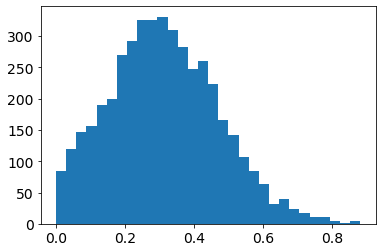

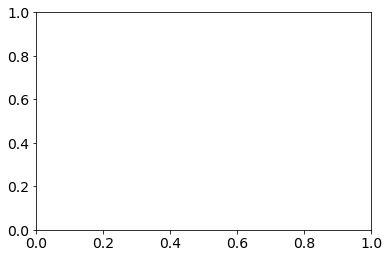

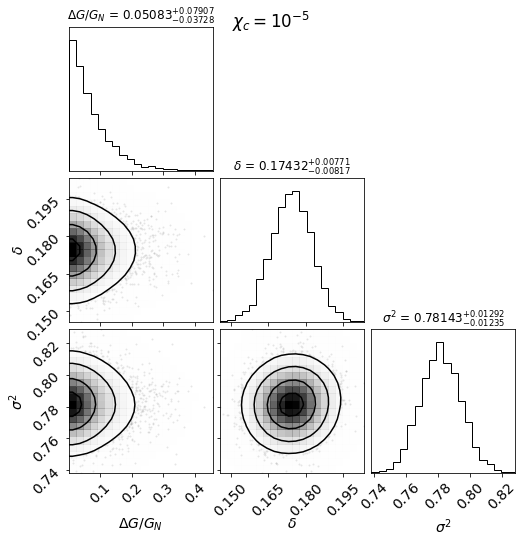

  1%|▏                                          | 5/918 [00:00<00:22, 39.95it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 3.776603314886051e-07
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 2.312591845868787e-07
10213-1902 [50] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 50.0 0.0 4.0533000121171747e-07
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 7.258766395652535e-08
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0 0.0 4.666071399335589e-07
10218-12703 [50] [335

  1%|▌                                         | 13/918 [00:00<00:26, 34.08it/s]

10219-9102 [50] [1.3962, 1.1814, 0.7492, 0.4692, 0.3335, 0.2205, 0.1532, 0.1423, 0.1945, 0.153, 0.0798, 0.0216, -0.0715, -0.157, -0.0196, -0.0532, -0.0405]
10219-9102 50.0 0.0 3.2065335625107385e-07
10220-12705 [50] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 50.0 0.0 5.00096816570447e-07
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 9.375411314046579e-07
10224-9101 [50] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 50.0 0.0 1.6100733440454847e-07
10226-12704 [50] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694, 0.4691, 0.2789, 0.37, 0.364, 0.3135, 0.363, 0.2811, 0.3307, 0.2727, 0.312, 0.3727, 0.1385, 0.4167, 0.2188, -0.3444, 0.1093]
10226-12704 50.0 0.0 1.887841983126158e-07
10226-12705 [50] [1.0258, 2.2633, 

  2%|▉                                         | 21/918 [00:00<00:27, 33.10it/s]

10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 3.0924486007496e-06
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 2.3249870058569665e-06
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 50.0 0.0 3.245729479258329e-07
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 6.464153488177566e-07
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.0093, -0.0019, -0.047, -0.0973, -0.098, -0.0699]
10494-6101 50.0 0.0 1.6975667102243795e-06
10494-9101 [50] [0.1044, 0.2038, 1.4077, 1.26

  3%|█▎                                        | 29/918 [00:00<00:28, 31.70it/s]

10495-12705 [50] [871.1598, 1245.0304, 1205.1955, 1347.7893, 1374.3588, 1517.2635, 1622.8998, 1633.9971, 1757.8692, 1799.4196, 1854.634, 1999.5551, 1849.1662, 1882.4866, 1807.1303, 1651.9125, 1681.1326, 1493.9167, 2771.4516, 2121.0254, 1992.5196]
10495-12705 50.0 0.0 2.0025364047205951e-07
10495-3702 [50] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 50.0 0.0 2.7805181864576607e-07
10496-12704 [50] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268.8121, 253.915, 333.7881, 358.7629, 315.1183, 261.3063, 216.6964, 267.188, 258.5169, 256.0365, 248.4992]
10496-12704 50.0 0.0 5.57718062539157e-07
10496-12705 [50] [-0.3879, -0.1399, 0.1719, 0.4444, 0.4904, 0.2805, 0.2146, 0.344, 0.3105, 0.2505, 0.2112, 0.1741, 0.0585, 0.0082, -0.033, 0.0654, 0.0338, 0.38, 0.1359]
10496-12705 50.0 0.0 1.9687177639703256e-07
10498-12705 [50] [2.2376, 1.8111, 0.8617, 0.4311, 0.299, 0.2455, 0.2899, 0.2855, 0.265, 0.1888, 0.0491, -0.0661, -0.1083,

  4%|█▌                                        | 33/918 [00:01<00:28, 31.45it/s]

10499-3703 [50] [-0.0563, -0.0436, 0.024, 0.1267, -0.0775, -0.0664, 0.0153, -0.0929, -0.1244, -0.0851, -0.0939, -0.1131, -0.1033, -0.048, 0.0474, 0.0456, 0.0289, -0.0666, -0.0844, -0.5663]
10499-3703 50.0 0.0 4.0896734303716223e-07
10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 5.40706947716287e-07
10500-12704 [50] [140.7935, 35.4055, 16.1502, 8.7997, 6.1202, 5.6067, 5.0715, 4.9205, 5.0767, 4.6234, 4.2501, 4.0673, 3.8962, 3.8831, 3.7867, 3.6009, 3.0687, 4.1948, 2.9642, 3.5448, 1.9938, -0.2753, 2.8838, 5.8145]
10500-12704 50.0 0.0 1.8645551350025445e-07
10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 1.672353987374628e-06
10500-3702 [50] [211.267, 568.975, 609.2163, 763.7494, 654.0512, 608.9412, 619.4812, 574.1158, 551.0555, 546.396, 492.531, 452.6766, 495.1396, 321.2342, 371.609, 358.446, 200.8978, 319.0074, 284.1887, 209.7882, 190.8027, 318.1602, 354.065

  4%|█▉                                        | 41/918 [00:01<00:28, 31.00it/s]

10501-6101 [50] [54.152, 240.5257, 446.403, 593.882, 679.4829, 745.3089, 578.3118, 397.5307, 268.9797, 276.8619, 234.4717, 196.8602, 156.2454, 140.6324, 64.5922]
10501-6101 50.0 0.0 1.7447044951115454e-07
10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 50.0 0.0 1.584922715989234e-07
10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 1.7119277428494352e-07
10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 6.877991266022432e-06
10505-12704 [50] [0.6223, 0.447, 0.4087, 0.27, 0.0901, 0.1644, 0.1572, 0.3129, 0.3336, 0.3492, 0.2338, 0.2536, 0.1307, 0.2303, 0.2492, 0.6718, 0.9822, 1.3729, 3.1505, 2.3435]
10505-12704 50.0 0.0 1.543819349964628e-06
10506-91

  5%|██▏                                       | 49/918 [00:01<00:28, 30.15it/s]

10509-12703 [50] [1226.9439, 2166.987, 2538.8741, 2127.6504, 1648.0951, 1358.0909, 1167.9374, 985.8138]
10509-12703 50.0 0.0 6.355889819102303e-07
10509-1901 [50] [88.4511, 296.1948, 449.6905, 409.1127, 761.2326, 574.7336, 678.7086, 604.9771, 571.2616, 614.5332, 408.9334, 441.3848, 355.292, 300.996, 243.919, 230.1612, 180.5992, 163.4382, 176.2701, 193.176, 205.4741]
10509-1901 50.0 0.0 1.1689202977021795e-07
10509-6101 [50] [414.6573, 159.5598, 352.8386, 670.9188, 930.199, 434.1238, 984.9702, 921.6235, 784.8291, 825.2006, 827.4197, 661.5592, 624.5693, 894.3523, 620.0269, 747.519, 623.1939, 701.341, 577.342, 1031.0135, 622.2157, 697.4912, 668.4888, 271.226]
10509-6101 50.0 0.0 1.816146006158239e-07
10511-12704 [50] [-0.0162, 0.2052, 0.0934, -0.0203, -0.0645, -0.0743, -0.1124, -0.1256, -0.1314, -0.1489, -0.145, -0.1344, -0.261, -0.3154, -0.4542, -0.3737, -0.3967, -0.387, 0.3583, -0.1418, -0.7705]
10511-12704 50.0 0.0 7.781341936636563e-07
10511-12705 [50] [-0.2818, -0.0952, 0.2141, 0.218

  6%|██▌                                       | 57/918 [00:01<00:28, 30.54it/s]

10512-9102 [50] [4147.3152, 2927.8473, 3245.8656, 2878.0674, 2617.7881, 2204.6977, 1695.8151, 1371.2689, 1298.2413, 1241.1228, 1357.9116, 1330.7104, 1714.839, 1930.3755, 2196.7284, 2401.8011, 2844.302, 3122.8481, 2925.4465]
10512-9102 50.0 0.0 2.8746919975070844e-07
10513-12702 [50] [-0.9916, -0.9877, -0.9855, -0.9802, -0.9787, -0.98, -0.9868, -0.9787, -0.862, -0.9802]
10513-12702 50.0 0.0 1.5638335279882236e-07
10514-6103 [50] [0.5999, 0.3982, 0.2747, 0.2749, 0.0781, 0.0617, 0.0681, -0.0189, -0.0377, -0.0578, -0.065, -0.0594, 0.0253, -0.0317, 0.1182, -0.1428, -0.1895, -0.2508, -0.2991, -0.355]
10514-6103 50.0 0.0 1.9858441415050708e-07
10516-6104 [50] [0.3084, -0.237, -0.3593, -0.3575, -0.3434, -0.2974, -0.3603, -0.4386, -0.4629, -0.4919, -0.5092, -0.5031, -0.4319, -0.4152, -0.2877, -0.6618]
10516-6104 50.0 0.0 3.933463368203852e-07
10517-3704 [50] [6.5457, 4.9823, 4.7496, 3.3043, 2.1613, 1.6053, 1.1745, 0.9031, 0.7267, 0.8082, 0.6442, 0.6833, 0.6038, 0.6776, 0.66, 0.6521, 0.6265]
105

  7%|██▊                                       | 61/918 [00:01<00:28, 30.16it/s]

10518-1902 [50] [-0.0105, 0.2572, 0.0495, 0.0308, 0.0287, -0.0677, -0.0841, -0.0885, -0.1994, -0.1432, -0.1195, -0.1634, -0.1173, -0.1219, -0.165, -0.1325, -0.1731]
10518-1902 50.0 0.0 2.806464997324665e-07
10518-6102 [50] [-0.217, 1.2282, 0.4062, 0.3459, 0.382, 0.1799, 0.1478, 0.1175, 0.0995, 0.1358, 0.0812, 0.048, 0.0452, 0.0639, 0.0875, 0.0309, 0.0337, 0.0007, -0.0113, -0.1383]
10518-6102 50.0 0.0 2.046158207427438e-07
10519-12704 [50] [-0.2611, 0.2686, 0.1702, 0.0601, 0.0584, 0.0258, -0.0515, -0.1077, -0.1123, -0.1006]
10519-12704 50.0 0.0 8.143350541752129e-07
10519-6102 [50] [15.342, 9.7033, 5.6052, 3.8579, 2.785, 2.1688, 1.9416, 1.9483, 2.0544, 1.8028, 1.946, 2.1855, 2.046, 2.3544, 2.1616]
10519-6102 50.0 0.0 3.805901638617833e-07
10520-12704 [50] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.0366, 0.0275, -0.0135, 0.0213, 0.0998, -0.1048, -0.1309]
10520-12704 50.0 0.0 2.615831648937353e-07
10520-6102 [50] [-0.9995, -0.9993, -0.9985, -0.9976, -0.9986, -0.99

  8%|███▏                                      | 69/918 [00:02<00:27, 30.55it/s]

10839-12705 [50] [0.5531, 0.4188, 0.6271, 0.6342, 0.4074, 0.3206, 0.1512, 0.1105, 0.1154, 0.1763, 0.2141, 0.3291, 0.2868, 0.1635, 0.0391, 0.4134, 0.1807]
10839-12705 50.0 0.0 2.6492959159822455e-06
10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712, 0.035, -0.0115, 0.0248, -0.0288, 0.0512, -0.0187, 0.0073, 0.0432, -0.0916, -0.1233, -0.1818, -0.1471]
10839-3704 50.0 0.0 2.390276710608121e-07
10839-6101 [50] [244.3098, 615.0842, 876.8345, 1563.8627, 1705.1968, 1816.091, 1687.128, 1731.6052, 1640.9131, 1596.506, 1498.4971, 1406.0518, 671.6148, 995.7509]
10839-6101 50.0 0.0 2.203818528222965e-07
10839-9101 [50] [2.1426, 2.2648, 0.9796, 0.8183, 0.5304, -0.0332, -0.1785, -0.3432, -0.3468, -0.4742, -0.4095, -0.6139, -0.5305, -0.616, -0.529, -0.5494, 0.8162, 3.2784]
10839-9101 50.0 0.0 4.4533041764926643e-07
10841-12701 [50] [-0.7323, -0.6652, -0.4249, -0.3016, -0.2957, -0.3482, -0.374, -0.3905, -0.3944, -0.4309, -0.4302, -0.4504, -0.4708, -0.4257, -0.4725]
10841-12701 50.0 0.0 8.919287233249124e

  8%|███▌                                      | 78/918 [00:02<00:23, 35.41it/s]

10842-9101 [50] [-0.987, -0.9943, -0.9967, -0.9976, -0.9979, -0.998, -0.9982, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9981, -0.998, -0.9982, -0.9979, -0.9982, -0.9983]
10842-9101 50.0 0.0 7.510155685145273e-07
10845-12702 [50] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-12702 50.0 0.0 2.277047131709045e-07
11004-12705 [50] [-0.8497, -0.6991, -0.5203, -0.3493, -0.2406, -0.2193, -0.1954, -0.1792, -0.1842, -0.1767, -0.1858, -0.1781, -0.195, -0.2173, -0.2294, -0.167, -0.2434, -0.1514, -0.3351, -0.2129]
11004-12705 50.0 0.0 4.828640247770238e-07
11004-3703 [50] [5607.0165, 6199.0745, 5122.0907, 4588.5334, 3798.1606, 3256.1827, 2909.7374, 2623.1995, 2081.3703, 1622.0266, 1252.6703, 1054.2993, 797.551, 805.4299, 667.6425]
11004-3703 50.0 0.0 1.3717957088604976e-07
11004-6104 [50] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 

 10%|████                                      | 89/918 [00:02<00:19, 42.01it/s]

11011-12703 [50] [9.8651, 35.0102, 40.3579, 54.0601, 192.4013, 365.0512, 378.092, 411.2362, 282.7202, 230.5846, 329.2445, 263.6472, 244.1501]
11011-12703 50.0 0.0 3.019519301020892e-07
11012-12705 [50] [0.2329, 0.5509, 0.2517, 0.0195, 0.0174, -0.0704, -0.1937, -0.145, -0.249, -0.0592, -0.302, -0.1828, -0.2112]
11012-12705 50.0 0.0 1.47986490156121e-06
11012-3702 [50] [7.8974, 3196.585, 2734.8285, 2253.8811, 4078.0168, 2401.2221, 2680.4924, 2677.0305, 2494.671, 2122.0656, 2023.2433, 2124.4295, 1742.4806, 1879.5204, 1353.859, 1265.244, 1077.374, 829.3809, 807.9255, 437.3493, 291.3315]
11012-3702 50.0 0.0 3.65348593701763e-07
11012-9102 [50] [4.3613, 1.8587, 0.9243, 0.4611, 0.1717, 0.0565, -0.0003, -0.0124, 0.0149, 0.0346, 0.0094, 0.0256, 0.0391, 0.0441, 0.0302, -0.0599, -0.0933, -0.0179]
11012-9102 50.0 0.0 1.1774050928088108e-06
11013-12702 [50] [0.7904, 0.6387, 0.0779, 0.1203, 0.0592, -0.004, -0.016, 0.0128, 0.0194, 0.059, 0.0663]
11013-12702 50.0 0.0 2.334476250236037e-06
11013-1902 [

 11%|████▍                                    | 100/918 [00:02<00:18, 44.39it/s]

11017-12704 [50] [0.4751, 0.4487, 0.3988, 0.2586, 0.0625, -0.0537, -0.0751, -0.1094, -0.1157, -0.1027, -0.1141, -0.1182, -0.1126, -0.1047, -0.0836, -0.1961, -0.2389]
11017-12704 50.0 0.0 3.644915042337993e-07
11017-6103 [50] [-0.3235, -0.3265, -0.3479, -0.2253, -0.2261, -0.1769, -0.1311, -0.1075, -0.0747, -0.0989, -0.1378, -0.1695, -0.1257, -0.174, -0.178, -0.0714, -0.0163, 0.0028, 0.2262, -0.2731]
11017-6103 50.0 0.0 5.29207280126955e-07
11017-9101 [50] [-0.5273, 0.0425, 0.2188, 0.1666, 0.07, 0.0407, -0.0503, -0.1282, -0.2004, -0.2244, -0.1722, -0.1497, -0.0815, -0.0967, -0.1443, -0.1476, -0.1864, -0.1536, -0.2264, -0.18]
11017-9101 50.0 0.0 2.727269276151347e-07
11018-12702 [50] [-0.9839, -0.9926, -0.9927, -0.9922, -0.9923, -0.9935, -0.9932, -0.9925, -0.9931, -0.994, -0.9941]
11018-12702 50.0 0.0 9.279408420018332e-07
11018-12704 [50] [-0.9989, -0.9988, -0.9986, -0.9987, -0.9988, -0.999, -0.999, -0.9991, -0.9991, -0.9987, -0.9984, -0.9975, -0.9987, -0.9989]
11018-12704 50.0 0.0 6.436

 12%|█████                                    | 112/918 [00:03<00:16, 49.25it/s]

11019-12705 [50] [0.9395, 1.6844, 1.8269, 0.8562, 0.7011, 1.016, 1.1247, 1.0992, 1.0844]
11019-12705 50.0 0.0 2.652509145709024e-06
11019-3701 [50] [2.5964, 1.3616, 0.9142, 0.3658, 0.0143, -0.1157, -0.1148, -0.102, -0.0691, -0.1802, -0.166, -0.2893, -0.0849]
11019-3701 50.0 0.0 3.15588159049354e-07
11021-1902 [50] [5.9017, 3.1432, 2.8491, 1.9605, 1.7177]
11021-1902 50.0 0.0 1.4151996418724497e-06
11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 8.56073571852085e-07
11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 1.431216155887306e-06
11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-91

 13%|█████▎                                   | 118/918 [00:03<00:16, 49.73it/s]

11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.0361, -0.076, -0.0711, -0.1542, -0.2041, -0.2119, -0.1066, -0.2705, -0.3138]
11745-9101 50.0 0.0 2.8192621450556375e-07
11746-3703 [50] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 50.0 0.0 1.7308764538586465e-07
11746-3704 [50] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 50.0 0.0 1.361147249781229e-07
11746-9102 [50] [-0.478, -0.2133, -0.2528, -0.1774, -0.2077, -0.2266, -0.2099, -0.2691, -0.1996, -0.2114, -0.1249, -0.1799, -0.1765, -0.1376, -0.2784, -0.2323, -0.1941, -0.3005, -0.2047, -0.3235, -0.1159, 0.1709]
11746-9102 50.0 0.0 1.429761143153114e-06
11747-12702 [50] [-0.4876, -0.2412, -0.0165, -0.0887, -0.0931, -0.0756, -0.07

 14%|█████▊                                   | 130/918 [00:03<00:15, 50.41it/s]

11750-9101 [50] [13.4461, 9.2464, 8.3896, 5.4399, 4.9554, 3.0033, 3.1782, 2.4566, 2.5343, 2.0961, 2.3663, 2.3818, 2.4375, 3.0403, 2.3998, 2.3406, 2.9409, 6.8913, 8.6024]
11750-9101 50.0 0.0 1.359479959794014e-07
11751-1901 [50] [-0.9334, -0.8849, -0.9513, -0.9754, -0.9893, -0.9862, -0.989, -0.9902, -0.9893, -0.9909, -0.9903, -0.9906, -0.9888, -0.9874]
11751-1901 50.0 0.0 8.331020248085464e-07
11751-6102 [50] [0.3738, 0.0535, 0.3785, 0.2124, 0.1333, 0.0258, -0.0223, -0.094, -0.1099, -0.1415, -0.1724, -0.2013, -0.1841, -0.253, -0.3949, -0.2255, -0.2141, -0.2775]
11751-6102 50.0 0.0 6.914874621257976e-07
11753-3703 [50] [0.2801, 0.7604, 0.7391, 0.5795, 0.35, 0.1693, 0.0874, 0.0586, 0.0152, -0.0057, -0.0099, -0.0594, -0.1073, -0.139, -0.1496]
11753-3703 50.0 0.0 4.7056409873854697e-07
11753-6104 [50] [1.7058, 1.5787, 1.7231, 1.492, 1.0043, 0.8699, 0.6579, 0.5905, 0.5042, 0.4712, 0.4504, 0.6153, 0.6589, 0.6817, 0.5206, 0.5457, 0.5195, 0.692]
11753-6104 50.0 0.0 2.8980508403051657e-07
11754-

 15%|██████▎                                  | 142/918 [00:03<00:15, 50.91it/s]

11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 50.0 0.0 7.470280855127027e-07
11759-6102 [50] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, -0.981]
11759-6102 50.0 0.0 1.3056603026316558e-07
11760-12703 [50] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0.539, 0.1155, 0.1223, 0.309]
11760-12703 50.0 0.0 1.210187659387186e-07
11760-6101 [50] [0.4533, -0.0157, 0.5654, 0.502, 0.3995, 0.359, 0.3287, 0.2964, 0.2063, 0.2512, 0.2686, 0.2421, 0.2368, 0.1884, 0.0906, -0.0471, -0.3849, -0.319, -0.8166]
11760-6101 50.0 0.0 7.519931074620528e-07
11760-6103 [50] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.2117, -0.2373, -0.2365, -0.2317, -0.3078, -0.2653, -0.3184, -0.2638]
11760-6103 50.0 0.0 1.687442643496247e-07
11760-9102 [50] [

 17%|██████▉                                  | 154/918 [00:03<00:14, 51.18it/s]

11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 5.976339904215814e-06
11828-12703 [50] [-0.5587, -0.2913, 0.1844, 0.3112, 0.2627, 0.2124, -0.0354, -0.0957, -0.1295, -0.1601, -0.0565, -0.1246, 0.0413]
11828-12703 50.0 0.0 8.727051724477118e-07
11830-12701 [50] [-0.9938, -0.9825, -0.9834, -0.9912, -0.9934, -0.9941, -0.9946, -0.9933, -0.9936, -0.9951, -0.9951, -0.9944, -0.9947, -0.9932, -0.9955, -0.9854, -0.997, -0.9939, -0.9962]
11830-12701 50.0 0.0 3.5701207891628404e-07
11830-12703 [50] [-0.4776, 0.0437, 0.1582, -0.0709, -0.1607, -0.0754, 0.055, 0.2665, 0.1845, 0.03, 0.0663, -0.087, -0.2185, -0.1589, 0.0536, -0.3722]
11830-12703 50.0 0.0 5.971314425613318e-07
11830-3702 [50] [1.2195, 0.9978, 0.6546, 0.4726, 0.5057, 0.555, 0.4749, 0.3884, 0.4626]
11830-3702 50.0 0.0 7.165284848414112e-07
11830-6104 [50] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.

 18%|███████▍                                 | 166/918 [00:04<00:14, 50.68it/s]

11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 8.901609735109465e-06
11836-1902 [50] [0.7026, 1.2767, 1.1865, 1.1009, 0.973, 0.9921, 0.7024, 0.7206, 0.623, 0.6145, 0.5505, 0.5955, 0.6037, 0.4142, 0.4147]
11836-1902 50.0 0.0 2.476220587295726e-07
11838-12701 [50] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 0.1336, 0.0903, 0.0213, -0.0554, -0.0342, 0.0225, 0.0053, -0.0272]
11838-12701 50.0 0.0 4.538716014762884e-07
11838-12703 [50] [144.9042, 254.2159, 538.0129, 911.0748, 1089.8377, 1111.2623, 1284.2649, 1228.3752, 1345.2496, 1400.7846, 1427.4787, 1434.5371, 1257.47, 1184.9615, 998.2342, 830.6266, 670.98, 596.3078, 488.5417, 423.536, 329.6538, 32.3109, 5.6457, 31.8479]
11838-12703 50.0 0.0 7.636861422102946e-07
11838-3702 [50] [0.536, 0.7094, 0.6061, 0.6555, 0.6466, 0.6204, 0.

 19%|███████▉                                 | 178/918 [00:04<00:14, 50.25it/s]

11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 6.886936362759912e-07
11865-9102 [50] [-0.467, -0.4695, -0.4789, -0.5286, -0.6182, -0.6445, -0.6408, -0.6047, -0.6031, -0.6243, -0.655, -0.6895, -0.6998, -0.5904, -0.6729, -0.6983]
11865-9102 50.0 0.0 4.162699396001027e-07
11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2771, 0.298, 0.3814, 0.3262, 0.2102, 0.3978, 0.4467, 0.2866, 0.1214, 0.2202, 0.1346, 0.4041]
11867-6104 50.0 0.0 1.3085338146520348e-06
11867-9101 [50] [0.9073, 0.3027, 0.1546, 0.1123, 0.0285, 0.0159, -0.0244, 0.0205, 0.0824, 0.1908, 0.2079, 0.2195, 0.3058, 0.2425, 0.1871, 0.3056]
11867-9101 50.0 0.0 2.8636496920999054e-07
11868-12703 [50] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 1.405128976914126e-06
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 2.1161343163620

 20%|████████▏                                | 184/918 [00:04<00:14, 49.84it/s]

11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 2.51849683839053e-05
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389.9946, 2439.1642, 2636.587, 2485.7262, 2056.7992, 1736.2622, 1623.5415, 1192.5228, 781.8483, 546.9719, 175.874]
11942-12704 50.0 0.0 2.0260275191293273e-06
11942-6104 [50] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 50.0 0.0 3.3270772907110787e-07
11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.0425, -0.0331, -0.0546, -0.0982, -0.1371, -0.164, -0.179, -0.1863, -0.172, -0.1572, -0.1563, -0.1648, -0.1726, -0.27]
11943-3703 50.0 0.0 2.1707655464083764e-06
11944-12701 [50] [-0.3604, -0.3617, -0.4276, -0.5869, -0.6347, -0.6283, -0.548, -0.5758, -0.5204, -0.4847, -0.4769, -0.4857, -0.5345, -0.6334, -0.5353, -0.5098]
11944-12701 50.0 0.0 5.64

 21%|████████▋                                | 194/918 [00:04<00:14, 49.09it/s]

11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 1.1762354926358825e-05
11954-12704 [50] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453, 0.1801, 0.125, 0.0276, -0.0116, -0.0744, -0.134, -0.1626, -0.2559, -0.2802]
11954-12704 50.0 0.0 1.6172378982122436e-06
11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.2778]
11954-3703 50.0 0.0 2.811185991425166e-06
11954-9101 [50] [-0.9882, -0.9937, -0.9946, -0.9965, -0.9974, -0.9972, -0.997, -0.9969, -0.997, -0.9974, -0.9978, -0.9979, -0.9973, -0.9971, -0.9976, -0.9966]
11954-9101 50.0 0.0 8.201999151055517e-07
11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 1.376708139190802e-06
11956-12702 [50] [5.6953

 22%|█████████                                | 204/918 [00:04<00:15, 46.51it/s]

11958-6103 [50] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 50.0 0.0 2.716730321789723e-07
11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 1.2844902438579728e-06
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 50.0 0.0 2.0572867073055124e-06
11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.9843, 0.6333, 0.3517, 0.1829, 0.1258, 0.0956, 0.1424, 0.1021, 0.028, 0.1221]
11965-9102 50.0 0.0 6.437054408926827e-07
11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 1.961504324728871e-06
11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.898

 23%|█████████▎                               | 209/918 [00:05<00:17, 39.99it/s]

11970-6103 [50] [0.7466, 1.1751, 1.6643, 1.3977, 1.0416, 0.8262, 0.6871, 0.5199, 0.4194, 0.3266, 0.2718, 0.2909, 0.2357, 0.2575, 0.2139, 0.0837, -0.0144, -0.0619, 0.133]
11970-6103 50.0 0.0 1.3814750633957398e-06
11974-12702 [50] [-0.5341, -0.4596, -0.3852, -0.2683, -0.2117, -0.2349, -0.22, -0.1969, -0.1731, -0.1829, -0.2133, -0.2538, -0.2357, -0.256, -0.1504, -0.1437, -0.1349, 1.1183]
11974-12702 50.0 0.0 2.8193514707627087e-06
11975-12701 [50] [-0.1741, -0.13, 0.3291, 1.0808, 1.3321, 1.3798, 1.0057, 0.9745, 0.8989, 0.5699, 0.4672, 0.2163]
11975-12701 50.0 0.0 1.5317168502152902e-07
11975-12705 [50] [0.6902, 0.7621, 0.3208, 0.2527, 0.3317, 0.3259, 0.2387, 0.0864, 0.069, 0.2015, 0.1928, 0.1502, -0.0055, -0.1924]
11975-12705 50.0 0.0 6.542085564484844e-07
11975-3703 [50] [-0.2597, -0.0329, 0.0768, 0.0833, 0.1048, 0.0682, 0.0342, -0.0156, -0.0756, -0.093, -0.0695, -0.0466, 0.0656, -0.0085, 0.1237, 0.1334, 0.0646]
11975-3703 50.0 0.0 5.172921047814447e-07
11975-6104 [50] [1.0196, 1.2709, 

 24%|█████████▊                               | 219/918 [00:05<00:17, 40.21it/s]

11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 50.0 0.0 5.153486111829932e-07
11978-12705 [50] [0.0184, 0.0968, 0.695, 0.4819, 0.223, 0.1168, 0.1458, 0.1604, 0.1304, 0.1363, 0.1451, 0.1188, 0.0734, 0.0413, 0.0374, 0.0059, 0.0584, 0.0708]
11978-12705 50.0 0.0 6.474583706395115e-07
11978-6101 [50] [0.1703, 0.2916, 0.2201, 0.1105, 0.137, 0.0651, 0.0262, 0.0439, 0.1227, 0.0551, 0.0171, -0.0525, -0.106, -0.2018, -0.2281, -0.1584, -0.2752, -0.3694, -0.5359, -0.6656, -0.8099]
11978-6101 50.0 0.0 5.504713240506812e-07
11979-12703 [50] [0.3188, 0.2646, 0.4444, 0.4735, 0.4231, 0.2818, 0.2037, 0.1891, 0.1975, 0.1625, 0.205, 0.2447, 0.1501, 0.1763, 0.1339, 0.4567, 0.4255, 0.53]
11979-12703 50.0 0.0 1.6260078202756906e-06
11979-12704 [50] [1.0417, 0.8488, 0.6206, 0.5652, 0.598, 0.4342, 0.2822, 0.1334, 0.0604, 0.0319, 0.0291, -0.01, -0.083, -0.0554, -0.0215, -0.0081, 0.0344]
11979-12704 50.0 0.0 2.300

 25%|██████████▏                              | 229/918 [00:05<00:16, 42.07it/s]

11982-12704 [50] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.1555, 0.0797, -0.029, 0.0037, 0.2331]
11982-12704 50.0 0.0 7.094225516004809e-07
11982-3703 [50] [-0.314, 0.4086, 0.6273, 0.7714, 0.9457, 0.986, 1.0945, 1.392, 1.3945, 1.539, 1.4145, 1.0397, 1.0282, 0.5616, 0.557, 0.0557]
11982-3703 50.0 0.0 1.1645261090450275e-07
11982-6102 [50] [0.7786, 0.4297, 0.4569, 0.7506, 0.7926, 0.6732, 0.6507, 0.5035, 0.3848, 0.2963, 0.4923, 0.064, 0.2848, -0.0122, 0.3417, -0.0773, -0.7924]
11982-6102 50.0 0.0 1.190286505641576e-07
11982-9102 [50] [-0.6167, -0.1298, 0.3235, 1.2078, 1.1438, 0.8069, 0.6394, 0.4963, 0.4228, 0.3252, 0.3069, 0.2838, 0.3393, 0.4905, 0.4567, 0.2311]
11982-9102 50.0 0.0 8.547538782797797e-07
11984-12701 [50] [-0.2857, -0.1737, 0.0157, 0.0372, -0.1281, -0.2001, -0.1962, -0.1945, -0.1458, -0.0921, -0.099, -0.116, -0.1666, -0.325, -0.2122, -0.442]
11984-12701 50.0 0.0 2.0412618550171495e-07
11984-12702 [50] [-0.2774, -0.32

 26%|██████████▋                              | 239/918 [00:05<00:15, 43.20it/s]

12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 5.436635291664255e-05
12068-6104 [50] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 50.0 0.0 1.841089240699665e-06
12069-12704 [50] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 50.0 0.0 9.568268857543295e-07
12069-12705 [50] [1.7332, 1.137, 0.4096, 0.6564, 0.5837, 0.6168, 0.2246, 0.0587, 0.2617, 0.1538, 0.5607, 0.4132, 0.5307, 0.41, 2.8782]
12069-12705 50.0 0.0 5.332537399057349e-07
12069-6102 [50] [-0.3102, -0.0764, -0.2402, -0.1833, -0.1952, -0.2158, -0.2095, -0.1861, -0.144, -0.1353, -0.1037, -0.1026, -0.0816, -0.0956, -0.1367, -0.1477, -0.0871, -0.0667, -0.0387, -0.58, -0.56, -0.5359, -0.8946, 0.038]
12069-6102 50.0 0.0 5.778

 27%|███████████                              | 249/918 [00:06<00:15, 43.31it/s]

12078-12703 [50] [0.3298, 0.5608, 0.2182, 0.3221, 0.2303, 0.0896, 0.0846, 0.2051, 0.3186, 0.33, 0.2532]
12078-12703 50.0 0.0 7.326589681808337e-07
12078-6103 [50] [1.9637, 5.3953, 4.122, 4.276, 4.2033, 3.4926, 3.3028, 3.2038, 3.1762, 3.0769, 2.868, 2.5911, 2.6527, 2.4952, 2.6226, 2.6979, 2.1328, 1.6158, 1.3218, 1.8508]
12078-6103 50.0 0.0 5.875011756332746e-07
12079-12705 [50] [5.9457, 5.134, 4.915, 2.376, 2.7696, 2.3345, 1.3415, 1.441, 1.4148, 0.8317, 1.0553, 1.0687, 0.9662, 0.8766, 1.1537, 1.4538, 0.8336]
12079-12705 50.0 0.0 2.0167181645680431e-07
12080-12704 [50] [798.4646, 1129.8436, 1685.7177, 1551.5379, 1648.9794, 1528.8158, 1510.5353, 1488.9904, 1518.2012, 1430.3202, 1355.0599, 1297.2544, 1371.7431, 1127.7862, 1194.7794, 1062.3493, 1183.2366, 942.8748, 761.5148, 256.7283, 914.8231, 836.9712]
12080-12704 50.0 0.0 1.3200358010975787e-07
12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
120

 28%|███████████▌                             | 259/918 [00:06<00:15, 42.48it/s]

12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.419, 0.387, 0.4139, 0.5272, 0.4564, 0.6029, 0.4957, 0.5971, 0.6267, 0.5749, 0.7061, 0.6081, 0.5243, 0.4383, 0.5097, 0.4647, 0.2768, 0.3996, 0.231, 0.2274, 0.4698, 0.2204, 0.2727]
12084-1901 50.0 0.0 1.7231598622375344e-07
12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
12084-3702 50.0 0.0 3.2204094324258714e-07
12084-3703 [50] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.866, 9.9199, 8.0438, 7.1191, 7.1184, 4.9585, 5.2578]
12084-3703 50.0 0.0 3.1190375266810654e-07
12084-6104 [50] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.0374, 0.0776, -0.025, -0.0223, -0.0093, -0.0487, 0.0214, -0.2045, 0.0836]
12084-6104 50.0 0.0 7.415642759884491e-07
12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -

 29%|███████████▊                             | 264/918 [00:06<00:15, 41.69it/s]

12088-9101 [50] [1.3886, 1.0744, 0.6164, 0.1772, -0.0928, -0.1728, -0.2424, -0.3552, -0.3861, -0.4243, -0.4358, -0.4341, -0.4454, -0.4408]
12088-9101 50.0 0.0 3.494512433214865e-07
12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-12702 50.0 0.0 1.6381827178739772e-07
12089-12704 [50] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 50.0 0.0 9.02391446270163e-07
12089-1901 [50] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 50.0 0.0 1.105619194955055e-06
12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722, -0.1642, -0.1028, -0.1287, -0.1434, -0.0908, -0.1289, -0.1084, -0.2404, -0.097, 0.1709, -0.3201, -0.0196, -0.302]
12089-6103 50.0 0.0 1.0127734086515676e-06
12092-6101 [50] [0.0026, 0.3918, 0.140

 30%|████████████▏                            | 273/918 [00:06<00:18, 34.66it/s]

12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 40.9064, 40.0677, 39.5836, 40.4106, 39.3101, 37.4365, 38.9587, 41.7447, 41.525, 40.104, 39.0721, 39.6893, 56.2685, 25.7726, 27.1981, 33.78]
12094-3701 50.0 0.0 1.1523018257559374e-06
12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 1.4894943151071483e-06
12483-12703 [50] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -0.0898]
12483-12703 50.0 0.0 3.7344283385249493e-07
12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 3.5324520061887046e-07
12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 5.683550065769394e-07
12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0

 30%|████████████▎                            | 277/918 [00:06<00:21, 30.34it/s]

12488-9101 [50] [0.89, -0.0571, 0.0018, 0.0675, 0.0814, 0.1021, 0.1178, 0.0708, 0.0758, 0.1268, 0.0533, 0.0597, 0.0532, 0.0414, 0.1038, 0.0181, -0.1356, -0.2319, -0.1377]
12488-9101 50.0 0.0 1.9852095694884292e-06
12489-3703 [50] [6.1258, 7.3921, 7.9142, 7.3592, 6.7186, 6.0984, 5.5884, 5.3024, 5.0796, 4.2963, 4.3283, 3.7505, 4.11, 3.5385, 4.098]
12489-3703 50.0 0.0 4.983023668504814e-07
12490-3701 [50] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-3701 50.0 0.0 4.5106376436186403e-07
12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0.0863]
12506-12701 50.0 0.0 5.792185338796471e-06
12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0

 31%|████████████▋                            | 284/918 [00:07<00:24, 25.79it/s]

12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0 0.0 6.213444736560815e-07
12512-12702 [50] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 50.0 0.0 4.229799874638041e-07
12514-12702 [50] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 50.0 0.0 5.759569855133176e-07
12514-12703 [50] [2.1408, 0.3201, 0.1941, 0.0194, 0.03, 0.0603, 0.1872, 0.1977, 0.0662, 0.1145, 0.0325, -0.0142, 0.021, -0.0315, -0.0845, -0.0224]
12514-12703 50.0 0.0 1.1018930656388117e-07
12514-9102 [50] [-0.6627, -0.5978, -0.3356, -0.1465, -0.1607, -0.0924, -0.0736, -0.019, 0.0855, 0.1041, 0.0741, -0.06, -0.1592, -0.1356, -0.0632, -0.2008, -0.2854]
12514-9102 50.0 0.0 4.677159064633557e-07


 31%|████████████▊                            | 287/918 [00:07<00:25, 24.81it/s]

12518-12705 [50] [-0.8683, -0.7393, -0.3648, -0.0579, -0.0274, -0.0334, -0.0145, 0.016, -0.0154, 0.0703, -0.1575, 0.0272]
12518-12705 50.0 0.0 4.81175770039808e-07
12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 0.0 1.7616857442691002e-07
12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.1091]
12518-9101 50.0 0.0 7.167855473495073e-07
12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 1.2718682030138954e-06
12620-6104 [50] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 50.0 0.0 1.3487313736297115e-07


 32%|█████████████                            | 293/918 [00:07<00:26, 23.32it/s]

12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 8.99676527679777e-07
12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903, -0.5645]
12621-12705 50.0 0.0 3.9423170655540056e-07
12621-6103 [50] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 50.0 0.0 2.7827219901664467e-07
12622-9101 [50] [0.295, -0.1664, 0.1745, 0.5326, 0.7376, 0.7334, 0.6499, 0.6151, 0.5534, 0.5303, 0.427, 0.3612, 0.3993, 0.3837, 0.4878, 0.4757, 0.3843, 0.0845]
12622-9101 50.0 0.0 8.572908925231963e-07
12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 9.064918419934286e-07


 33%|█████████████▎                           | 299/918 [00:07<00:27, 22.18it/s]

12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 4.106364058037921e-06
12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 7.10757678198821e-07
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 1.1067784896640308e-06
12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 1.2256169823900222e-06
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 1.6123726025206584e-06


 33%|█████████████▍                           | 302/918 [00:08<00:28, 21.82it/s]

12679-12701 [50] [-0.4106, -0.1602, -0.09, 0.0292, -0.1142, -0.1585, -0.1702, -0.2231, -0.1617, -0.1473, -0.165, -0.0765, -0.2919, -0.3168, -0.5268, -0.1813, 0.1098, -0.9954]
12679-12701 50.0 0.0 1.8411882725850267e-07
12679-1902 [50] [0.6115, 0.2127, 0.2343, 0.0811, 0.186, 0.028, 0.0072, -0.086, -0.1377, -0.1341, -0.1745, -0.1741, -0.1973, -0.2294, -0.2344, -0.1462, -0.1584]
12679-1902 50.0 0.0 1.694509820007425e-07
12682-12705 [50] [211.5682, 164.2949, 154.5208, 172.1809, 188.4287, 205.8053, 188.0827, 175.7022, 171.521, 162.4793, 163.9925, 122.1814, 128.2861, 178.1773, 150.2355, 110.4372, 181.1071]
12682-12705 50.0 0.0 1.0379490840789272e-06
7443-12703 [50] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 50.0 0.0 3.720522968658553e-07
7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1

 34%|█████████████▊                           | 308/918 [00:08<00:28, 21.31it/s]

7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 2.3523954461053062e-07
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.0333, -0.0403, -0.0345, -0.091, -0.0525, -0.2174, -0.2135, -0.5859, -0.4094]
7443-9101 50.0 0.0 7.525791116334067e-07
7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.1269]
7495-12702 50.0 0.0 1.4187288165200094e-06
7495-12703 [50] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 50.0 0.0 4.182995332660829e-07
7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 1.603033469428361e-06


 34%|██████████████                           | 314/918 [00:08<00:27, 21.67it/s]

7815-12705 [50] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 50.0 0.0 2.552262738010241e-07
7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 1.4789539103756838e-07
7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 1.7577273081378158e-07
7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 2.434472706937189e-06
7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 4.39284045

 35%|██████████████▏                          | 317/918 [00:08<00:28, 21.11it/s]

7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 6.518029024081476e-07
7958-6101 [50] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 50.0 0.0 1.8267218351125028e-07
7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 5.187268998758473e-07
7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 1.841275777793077e-06
7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 5.251101705948991e-07


 35%|██████████████▍                          | 323/918 [00:09<00:28, 20.83it/s]

7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 1.377749683720995e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 2.722076272770276e-06
7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 2.1340451325294926e-06
7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 2.5974475700209717e-07
7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 1.1171122134395335e-06


 36%|██████████████▋                          | 329/918 [00:09<00:25, 22.78it/s]

7961-12705 [50] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 50.0 0.0 2.1001060207369553e-06
7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.0 2.555705278808294e-07
7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 9.76464187803076e-07
7962-12705 [50] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 0.4867, 0.496, 1.2096, 1.0729, 0.2753, 1.3845, 3.2136]
7962-12705 50.0 0.0 1.813637804940574e-07
7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661,

 36%|██████████████▊                          | 332/918 [00:09<00:26, 21.76it/s]

7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 50.0 0.0 9.010835886551708e-07
7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]
7963-9102 50.0 0.0 1.810755904419003e-07
7964-6101 [50] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119, 231.394, 254.6415]
7964-6101 50.0 0.0 2.900812779263604e-07
7964-9102 [50] [1.3184, 2.0432, 2.1685, 1.6268, 1.1481, 0.9036, 0.7405, 0.65, 0.5829, 0.509, 0.4898, 0.4008, 0.3018, 0.164, 0.0815, 0.0631, 0.0748, -0.1094, 0.1287]
7964-9102 50.0 0.0 1.6626137582529517e-06


 37%|███████████████                          | 338/918 [00:09<00:28, 20.56it/s]

7965-12701 [50] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085, -0.0802, -0.1254, -0.0438, 0.0028, -0.0995, -0.4017]
7965-12701 50.0 0.0 1.5085413884184006e-07
7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-1901 50.0 0.0 1.4976347549786383e-07
7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 50.0 0.0 2.1820598583566705e-07
7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211.5514, 236.7821, 394.8881, 237.9732]
7965-6102 50.0 0.0 3.3653779895248905e-07
7965-9102 [50] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 50.0 0.0 1.0790895827686183e-07


 37%|███████████████▏                         | 341/918 [00:09<00:28, 20.40it/s]

7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 2.1025490685502224e-07
7968-3701 [50] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 50.0 0.0 1.315352304444601e-06
7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 4.3993523844982007e-07
7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 2.502105398898212e-07


 38%|███████████████▍                         | 347/918 [00:10<00:29, 19.41it/s]

7975-9102 [50] [-0.4649, 0.0396, 0.5148, 0.8957, 0.7258, 0.6065, 0.5756, 0.5119, 0.3508, 0.2963, 0.2474, 0.347, 0.3968, 0.5053, 0.5166, 0.5241, 0.6047, 0.5302, 0.4626]
7975-9102 50.0 0.0 1.569536320058316e-07
7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 1.2286154151247481e-06
7977-1902 [50] [0.1072, 0.2856, 0.0387, 0.0618, 0.0363, 0.0042, -0.0291, -0.0297]
7977-1902 50.0 0.0 1.6617542569932586e-07
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 8.406411011776696e-07


 38%|███████████████▋                         | 350/918 [00:10<00:27, 20.92it/s]

7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 1.0506391986312539e-06
7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 1.1314278639181187e-06
7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 1.6350254234104821e-06
7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 50.0 0.0 2.241393664360597e-07
7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 2.822308865636594e-06
7990-6104 [50] [-0.3051, -0.0723, 

 39%|███████████████▉                         | 356/918 [00:10<00:26, 21.14it/s]

7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 4.128348008452497e-07
7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 50.0 0.0 3.904646752284302e-07
7992-6104 [50] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 50.0 0.0 3.565738087660769e-07
7993-3704 [50] [0.1426, 0.6478, 0.7852, 0.7203, 0.4452, 0.3539, 0.3376, 0.3307, 0.3891, 0.4022, 0.3636, 0.3593, 0.2903, 0.2711, 0.3491, 0.3594]
7993-3704 50.0 0.0 1.4307019200773646e-07


 39%|████████████████                         | 359/918 [00:10<00:26, 20.91it/s]

8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 50.0 0.0 1.2399376862421935e-06
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 1.4378855523166115e-06
8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 1.7238843221752264e-06
8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 1.4245961620697357e-06
8078-12703 [50] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 1.341258940860905e-06


 40%|████████████████▎                        | 366/918 [00:11<00:28, 19.11it/s]

8078-6103 [50] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149, 0.1969, 0.1396, 0.1246, 0.1262, 0.1162, 0.0747, 0.0502, 0.0254, 0.0225, 0.0724, 0.0304, 0.0506, 0.0715]
8078-6103 50.0 0.0 1.5810609415002035e-06
8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 4.936518512428471e-07
8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 4.911828673088663e-07
8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 4.831987810124414e-07


 40%|████████████████▍                        | 368/918 [00:11<00:29, 18.54it/s]

8081-3704 [50] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 50.0 0.0 1.8478199429298242e-07
8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 4.3012665829926606e-07
8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81, 2355.4256, 1939.6384]
8083-12703 50.0 0.0 2.352097498321817e-06
8083-12704 [50] [0.2913, 0.5243, 0.3002, 0.1297, 0.1194, 0.1533, 0.1494, 0.1802, 0.1606, 0.0654, 0.1299]
8083-12704 50.0 0.0 6.304241622594709e-07


 41%|████████████████▋                        | 374/918 [00:11<00:30, 17.89it/s]

8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 2.0317884163884155e-06
8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 3.957680581276374e-07
8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 3.7286623715428577e-07
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 2.4155412038513643e-06


 41%|████████████████▉                        | 378/918 [00:11<00:29, 18.10it/s]

8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 50.0 0.0 3.7383003379484843e-07
8088-12705 [50] [-0.3463, 0.227, 0.3794, 0.8027, 0.7079, 0.6652, 0.4965, 0.2205, 0.0843, 0.0719, 0.1789, 0.1537, -0.3721, 0.0321]
8088-12705 50.0 0.0 7.492443730395535e-08
8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 1.023595363429772e-06
8091-1902 [50] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747, -0.384]
8091-1902 50.0 0.0 1.5576930062280625e-07


 41%|████████████████▉                        | 380/918 [00:11<00:30, 17.49it/s]

8092-12702 [50] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 50.0 0.0 2.718897341088627e-07
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 50.0 0.0 9.078462207467946e-07
8095-6102 [50] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276, 0.127, 0.1403, 0.0994, 0.0731, 0.0391, -0.0442, -0.086, -0.1131, -0.1728, -0.221, -0.1357, -0.3768, -0.0266, -0.186, -0.3752]
8095-6102 50.0 0.0 1.6071723790638392e-07
8131-6101 [50] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.3082, -0.2951, -0.2734, -0.3441, -0.2421, -0.3611, -0.4068, -0.6194, -0.4921, -0.1798, -0.4715, -0.5173, -0.3887]
8131-6101 50.0 0.0 3.3998930835745854e-07


 42%|█████████████████▏                       | 386/918 [00:12<00:29, 17.80it/s]

8131-9101 [50] [-0.2303, -0.2933, -0.4207, -0.0503, 0.2317, 0.5105, 0.546, -0.1014, -0.1852, -0.0457, 0.0346, 0.33, -0.5646, -0.6862, 0.939]
8131-9101 50.0 0.0 4.0918550419779525e-06
8132-12702 [50] [-0.0491, -0.065, 0.2143, 0.0833, 0.0546, -0.0096, -0.0149, 0.021, -0.0837, 0.1062]
8132-12702 50.0 0.0 9.118299018092679e-07
8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 2.8602663050992944e-05
8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 9.873679593271707e-07


 42%|█████████████████▍                       | 390/918 [00:12<00:30, 17.31it/s]

8134-6103 [50] [-0.9997, -0.9993, -0.9996, -0.9996, -0.9995, -0.9994, -0.9992, -0.999, -0.9989, -0.9988, -0.9985, -0.9984, -0.9986, -0.9988, -0.9991, -0.9993, -0.9988, -0.9979, -0.9983]
8134-6103 50.0 0.0 1.143306177306298e-07
8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 8.36411874793293e-07
8135-12702 [50] [-0.0587, -0.0535, 0.1564, 0.1223, 0.0981, 0.0594, 0.0486, 0.0064, 0.0544, 0.0081, -0.0341, -0.0178, 0.0479, -0.1192, 0.2429, -0.0574, -0.0315, -0.2763]
8135-12702 50.0 0.0 1.250763214598807e-07
8137-12703 [50] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1275, -0.1695, -0.3013, -0.3381]
8137-12703 50.0 0.0 4.1041217899678207e-07


 43%|█████████████████▌                       | 394/918 [00:12<00:30, 17.31it/s]

8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 50.0 0.0 7.511276686315089e-07
8138-12702 [50] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 50.0 0.0 2.460952436183651e-07
8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 6.34095483749048e-07
8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 1.676368378114163e-07


 43%|█████████████████▊                       | 398/918 [00:13<00:29, 17.71it/s]

8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 1.1243806939610458e-06
8140-3701 [50] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 50.0 0.0 1.4422171313013173e-07
8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 1.795673278742867e-06
8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 8.603235476431321e-07


 44%|█████████████████▊                       | 400/918 [00:13<00:30, 17.14it/s]

8144-12702 [50] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 50.0 0.0 2.0168942600394523e-07
8144-12703 [50] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 50.0 0.0 9.443012835386129e-07
8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 1.466173717110117e-06
8144-6101 [50] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271, 0.0969, 0.0527, 0.3307, 0.4308, 0.3921, 0.1682, -0.0968]
8144-6101 50.0 0.0 1.3934872198381276e-07


 44%|██████████████████                       | 404/918 [00:13<00:30, 17.02it/s]

8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 1.2489658966261223e-06
8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 2.476671519466224e-07
8145-9101 [50] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 50.0 0.0 3.376096098072411e-07
8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 1.5006656786095663e-06


 44%|██████████████████▏                      | 408/918 [00:13<00:30, 16.95it/s]

8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 1.5702933083889902e-06
8146-9102 [50] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 50.0 0.0 1.4429368013226092e-07
8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 1.0207850478271246e-06
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 2.091712106301792e-06


 45%|██████████████████▍                      | 412/918 [00:13<00:30, 16.69it/s]

8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 8.437628889872241e-07
8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 4.56169075126576e-07
8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 7.634716059969931e-07
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 3.8328995701941006e-05


 45%|██████████████████▌                      | 416/918 [00:14<00:30, 16.60it/s]

8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 2.7159292351307854e-07
8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 3.731820447771621e-07
8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 7.036383151090479e-07
8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 4.6566264429956454e-07


 46%|██████████████████▊                      | 421/918 [00:14<00:28, 17.31it/s]

8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 50.0 0.0 1.294606907773703e-06
8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 2.3496966624237922e-07
8156-3701 [50] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 50.0 0.0 5.159105155807711e-07
8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 2.398312715373855e-06


 46%|██████████████████▉                      | 425/918 [00:14<00:30, 16.38it/s]

8158-6104 [50] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 50.0 0.0 2.436020899805811e-07
8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 6.834163584744544e-07
8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 2.831134616809055e-07
8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 1.4718687341825565e-07


 47%|███████████████████▏                     | 429/918 [00:14<00:29, 16.83it/s]

8241-6102 [50] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 50.0 0.0 2.6761511567758816e-07
8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 1.073650869120969e-05
8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 2.865496946461692e-07
8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 7.687355758735463e-07


 47%|███████████████████▎                     | 433/918 [00:15<00:29, 16.51it/s]

8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 1.7878679536144166e-07
8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 9.749334919689466e-07
8247-12702 [24.68592462311558] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063, 0.3394, 0.315, 0.2267, 0.2019, 0.1944, 0.0714, 0.0833, -0.0149, -0.0523, -0.0057]
8247-12702 24.68592462311558 1.9406578115408534e-08 3.9023218891634905e-08
8247-12703 [47.62032663316583] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198, 0.0377, 0.0036, 0.0008, -0.06, -0.0599, -0.143, -0.1175, -0.2298, -0.1346, -0.2636, -0.3037, -0.2082, -0.3452, -0.2949, -0.2375, -0.5737, -0.8428, -0.2863]
8247-12703 47.62032663316583 2.414669666576411e-09 5.6080394495742745e-08


 48%|███████████████████▌                     | 437/918 [00:15<00:30, 15.80it/s]

8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 2.484563838455754e-06
8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247-9101 50.0 0.0 3.108975001481508e-07
8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.2998, 1595.4501, 1320.9281, 1254.0149, 1837.1392, 1899.7801, 2506.6682, 2814.69, 1954.3222, 2246.1066, 1731.0676, 1875.7497, 1583.6158, 1841.3166, 477.0393]
8248-12701 50.0 0.0 7.400314894400271e-07
8248-12702 [50] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 50.0 0.0 5.311154070650864e-07


 48%|███████████████████▋                     | 441/918 [00:15<00:30, 15.48it/s]

8248-12704 [50] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 50.0 0.0 3.6666526479228324e-07
8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 7.707565781983908e-07
8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 5.843468133217229e-07
8249-6102 [50] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 50.0 0.0 1.6618952632572693e-07


 48%|███████████████████▊                     | 445/918 [00:15<00:31, 15.21it/s]

8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 50.0 0.0 8.38347589602532e-07
8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 4.862757137747239e-07
8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 4.288344137490254e-07
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 5.58842118063663e-07


 49%|████████████████████                     | 449/918 [00:16<00:30, 15.43it/s]

8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 6.780652688984324e-07
8252-6104 [50] [2.1127, 786.7076, 1821.9152, 1629.0467, 2046.2674, 2117.149, 2080.0223, 1991.9705, 2037.8148, 2171.4456, 2102.3974, 2113.0128, 1947.7279, 1894.0627, 1734.3312, 1614.2348, 1502.8364, 1540.9181, 989.7452, 1027.4923, 1030.8241, 375.7743, 656.7525]
8252-6104 50.0 0.0 7.556544774495068e-08
8252-9102 [50] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 568.3335, 671.6366, 717.9725, 510.1554, 342.074, 302.1941, 260.3132, 157.5104, 244.502, 117.7782, 292.6015, 101.1592]
8252-9102 50.0 0.0 2.2602430889836713e-07
8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-3703

 49%|████████████████████▏                    | 453/918 [00:16<00:30, 15.01it/s]

8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 2.8077595947354853e-06
8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 1.4834505707376566e-07
8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 4.601655157010818e-07


 50%|████████████████████▎                    | 455/918 [00:16<00:31, 14.91it/s]

8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 1.0218760250876204e-07
8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 9.690750895363472e-08
8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 4.832952758653882e-07
8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 8.841261785291339e-07


 50%|████████████████████▌                    | 459/918 [00:16<00:31, 14.72it/s]

8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 1.7553368495030005e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 1.8907811761813513e-06
8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 6.512360897822882e-07


 50%|████████████████████▋                    | 463/918 [00:17<00:31, 14.50it/s]

8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.0 0.0 6.662038681695043e-07
8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 2.985517010549214e-07
8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 2.5207170561469975e-07


 51%|████████████████████▊                    | 465/918 [00:17<00:31, 14.33it/s]

8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 5.781876886486312e-07
8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 1.6648041890695384e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 5.840876989863472e-07


 51%|████████████████████▉                    | 469/918 [00:17<00:31, 14.27it/s]

8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.0 0.0 2.869003578892354e-06
8263-12705 [50] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 50.0 0.0 6.638783867967707e-07
8310-3701 [50] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 50.0 0.0 3.016568002052931e-07


 51%|█████████████████████                    | 471/918 [00:17<00:31, 14.13it/s]

8310-9101 [50] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 50.0 0.0 1.6041065050666763e-07
8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 9.91962261401274e-07
8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 4.4487312438394457e-07


 52%|█████████████████████▏                   | 475/918 [00:17<00:31, 14.04it/s]

8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 3.8521680955131794e-07
8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 2.096215896013468e-06
8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 9.745084741128017e-07


 52%|█████████████████████▎                   | 477/918 [00:18<00:31, 13.91it/s]

8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 8.617623975413602e-07
8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 3.4059028030712236e-07
8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 1.3097700639812524e-06


 52%|█████████████████████▍                   | 481/918 [00:18<00:31, 13.81it/s]

8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 4.817995277766217e-07
8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 1.0219757247179165e-06
8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 7.833314979852989e-07


 53%|█████████████████████▌                   | 483/918 [00:18<00:31, 14.03it/s]

8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 2.8056967558939116e-07
8315-9102 [50] [-0.2166, -0.0917, -0.1207, -0.1704, -0.1891, -0.1464, -0.1933, -0.1616, -0.278, -0.2739, -0.2356, -0.2454, -0.332, -0.1867, 1.4585, 0.3111, 0.4387, 0.2663]
8315-9102 50.0 0.0 7.085436006926441e-08
8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 1.0408684865805715e-06


 53%|█████████████████████▊                   | 487/918 [00:18<00:31, 13.59it/s]

8317-9101 [50] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 50.0 0.0 1.1694074599878417e-07
8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 1.451917901713941e-06
8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 3.383265498762707e-06


 53%|█████████████████████▊                   | 489/918 [00:19<00:31, 13.50it/s]

8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 1.957099157576312e-07
8318-6101 [50] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 50.0 0.0 2.551075958753619e-07
8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 2.8583699007227924e-07


 54%|██████████████████████                   | 493/918 [00:19<00:31, 13.41it/s]

8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 4.0248095981397375e-07
8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 2.474679097220208e-07
8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 5.557752593408357e-07


 54%|██████████████████████                   | 495/918 [00:19<00:31, 13.40it/s]

8320-9102 [50] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 50.0 0.0 8.652984783549772e-07
8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 8.642649685518296e-07
8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 1.1029720314946773e-06


 54%|██████████████████████▎                  | 499/918 [00:19<00:31, 13.20it/s]

8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 6.393897796578657e-07
8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 1.230846627412e-07
8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 4.475450932332978e-06


 55%|██████████████████████▍                  | 501/918 [00:19<00:31, 13.18it/s]

8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 3.2912031499037114e-07
8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 1.058586448334896e-06
8329-6103 [50] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 50.0 0.0 1.6041557044629475e-07


 55%|██████████████████████▌                  | 505/918 [00:20<00:31, 13.09it/s]

8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 3.713794596518195e-07
8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 4.3160122633486275e-07
8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 3.276699236898051e-07


 55%|██████████████████████▋                  | 507/918 [00:20<00:31, 13.06it/s]

8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 2.0079642207857648e-07
8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 3.7079576051103757e-07
8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 1.8536116058541458e-07


 56%|██████████████████████▊                  | 511/918 [00:20<00:31, 12.95it/s]

8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 2.8857762842951418e-06
8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 2.43416122475345e-07
8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 2.0123962529268033e-07


 56%|██████████████████████▉                  | 513/918 [00:20<00:31, 12.79it/s]

8334-3704 [50] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409, 0.6746, 0.3496, 0.5455, 0.2807, 0.4323, -0.0995, 0.0558, 0.4872, 0.3896, 3.1841, -0.3157]
8334-3704 50.0 0.0 1.0741014181779287e-07
8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 1.9383001528173262e-07
8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 2.1924789883934957e-06


 56%|███████████████████████                  | 517/918 [00:21<00:31, 12.65it/s]

8336-9102 [50] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 50.0 0.0 2.1662141580952581e-07
8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 4.2953877080597335e-07
8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 2.0493534631712187e-07


 57%|███████████████████████▏                 | 519/918 [00:21<00:31, 12.57it/s]

8341-9101 [50] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 50.0 0.0 2.2655538531658907e-07
8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 4.4510334698315315e-07
8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 4.7076648846691923e-07


 57%|███████████████████████▎                 | 523/918 [00:21<00:31, 12.67it/s]

8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 1.2764403371489256e-06
8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 3.725789204510989e-07
8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 3.3976043185799286e-07


 57%|███████████████████████▍                 | 525/918 [00:21<00:31, 12.57it/s]

8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 5.609309069122887e-07
8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 4.764992265156093e-07
8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 1.7885835000365108e-07


 58%|███████████████████████▋                 | 529/918 [00:22<00:31, 12.45it/s]

8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 1.9094289373444096e-07
8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 9.81274018396872e-07
8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 2.3544371404812626e-07


 58%|███████████████████████▋                 | 531/918 [00:22<00:30, 12.67it/s]

8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 2.3122864807505355e-06
8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 9.296509769037462e-07
8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 8.297176526161219e-07


 58%|███████████████████████▉                 | 535/918 [00:22<00:30, 12.55it/s]

8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 1.4244119549219435e-06
8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 6.370617642725229e-07
8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 1.7604555338680538e-06
8445-3701


 59%|████████████████████████                 | 538/918 [00:22<00:26, 14.24it/s]

8446-12702 [50] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 50.0 0.0 1.391472827798504e-07
8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 4.681446881675887e-07
8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 1.0753511156211305e-06


 59%|████████████████████████                 | 540/918 [00:22<00:27, 13.50it/s]

8447-12701 [50] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 50.0 0.0 1.3686741661968653e-07
8447-3701 [50] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977, 0.163, 0.0592, 0.009, 0.1309, 0.116]
8447-3701 50.0 0.0 9.852232906559684e-08
8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 3.049479512801842e-07


 59%|████████████████████████▎                | 544/918 [00:23<00:29, 12.54it/s]

8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 2.5134167789656306e-07
8451-12705 [50] [-0.3525, -0.0131, -0.4307, -0.1607, -0.1962, -0.2127, 0.0242, 0.0289, -0.0665, -0.1215, -0.3497, -0.467, -0.5256, -0.3423, -0.3964]
8451-12705 50.0 0.0 1.0631669316249654e-07
8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 1.1624370937745026e-06


 59%|████████████████████████▍                | 546/918 [00:23<00:30, 12.33it/s]

8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 4.349325989426861e-07
8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 1.5775451580523331e-06
8452-9102 [50] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 50.0 0.0 2.8050778575013156e-07


 60%|████████████████████████▌                | 550/918 [00:23<00:30, 11.98it/s]

8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 1.7937800930189951e-06
8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 7.900427826841418e-07
8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 2.1445648326849486e-07


 60%|████████████████████████▋                | 552/918 [00:23<00:31, 11.64it/s]

8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 5.409128640442226e-07
8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 1.3749613488234248e-07
8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 4.946072750533692e-07


 61%|████████████████████████▊                | 556/918 [00:24<00:30, 11.78it/s]

8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 1.8019384399866782e-06
8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 8.907015334364135e-08
8459-6101 [50] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 50.0 0.0 1.3726245431291944e-07


 61%|████████████████████████▉                | 558/918 [00:24<00:30, 11.69it/s]

8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 1.7344418740049914e-07
8464-12704 [50] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 50.0 0.0 1.5022295824053344e-07
8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 1.6085212029873047e-07


 61%|█████████████████████████                | 562/918 [00:24<00:30, 11.71it/s]

8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 1.5487906922589208e-06
8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 5.068968705383018e-07
8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 5.818363230209542e-07


 61%|█████████████████████████▏               | 564/918 [00:25<00:30, 11.72it/s]

8466-12702 [50] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658, 0.1059, 0.0792, 0.0526, 0.0435, 0.0705, 0.0028, 0.0457, -0.0166, -0.0305]
8466-12702 50.0 0.0 1.0728959354087817e-07
8482-12703 [50] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 50.0 0.0 1.1664875556396044e-06
8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 1.479457793617923e-06


 62%|█████████████████████████▎               | 568/918 [00:25<00:29, 11.72it/s]

8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 4.5648485150073426e-07
8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 3.040371689956038e-06
8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 8.130433836843404e-07


 62%|█████████████████████████▍               | 570/918 [00:25<00:29, 11.69it/s]

8485-9102 [50] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 50.0 0.0 1.3797845891776768e-07
8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 2.00154496020836e-07
8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 2.7481209947399805e-07


 63%|█████████████████████████▋               | 574/918 [00:25<00:29, 11.54it/s]

8547-6102 [50] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 50.0 0.0 1.4083087577181565e-07
8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 50.0 0.0 1.7304852026452999e-07
8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 3.344543431675649e-07


 63%|█████████████████████████▋               | 576/918 [00:26<00:29, 11.50it/s]

8549-6102 [50] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 50.0 0.0 2.931962288362557e-07
8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 2.7084773618906813e-06
8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 2.8143992734610106e-07


 63%|█████████████████████████▉               | 580/918 [00:26<00:29, 11.63it/s]

8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 8.116313617641451e-07
8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 2.814676907225009e-07
8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 2.3744850523821558e-07


 63%|█████████████████████████▉               | 582/918 [00:26<00:29, 11.50it/s]

8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 3.8117651052993115e-07
8555-12702 [50] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 50.0 0.0 1.781537014513687e-07
8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 3.010646256629606e-07


 64%|██████████████████████████▏              | 586/918 [00:26<00:29, 11.43it/s]

8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 8.774776631746228e-07
8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 1.958239605728865e-07
8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 2.0554239373976364e-06


 64%|██████████████████████████▎              | 588/918 [00:27<00:29, 11.33it/s]

8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 1.5615374346195998e-06
8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 1.55763640880372e-07
8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 1.1764251217655639e-06


 64%|██████████████████████████▍              | 592/918 [00:27<00:29, 11.09it/s]

8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 4.285826343745214e-07
8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 7.937764317552963e-07
8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 2.635145197508746e-07


 65%|██████████████████████████▌              | 594/918 [00:27<00:29, 11.08it/s]

8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 2.448539813032274e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 2.21127970496172e-07
8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 2.485783151110441e-07


 65%|██████████████████████████▋              | 598/918 [00:28<00:29, 10.96it/s]

8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 7.242467916609138e-07
8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 5.952004899016332e-07
8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 3.8317277126899744e-07


 65%|██████████████████████████▊              | 600/918 [00:28<00:29, 10.93it/s]

8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 4.175137185675604e-06
8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 2.466188964067186e-06
8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 3.327611679903254e-06


 66%|██████████████████████████▉              | 604/918 [00:28<00:29, 10.76it/s]

8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 2.032079244413971e-06
8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 3.3422666079129836e-06
8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 2.764127870912658e-07


 66%|███████████████████████████              | 606/918 [00:28<00:28, 10.77it/s]

8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 1.4881021700363543e-06
8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 4.806791560603493e-07
8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 5.581783274454177e-07


 66%|███████████████████████████▏             | 610/918 [00:29<00:28, 10.71it/s]

8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 1.0067109906576552e-07
8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 4.549023705544943e-07
8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 3.018631502228069e-07


 67%|███████████████████████████▎             | 612/918 [00:29<00:29, 10.55it/s]

8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 7.629190160722512e-07
8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 3.8910251686780376e-07
8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 1.2840401095566095e-06


 67%|███████████████████████████▌             | 616/918 [00:29<00:29, 10.24it/s]

8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 5.58621247069416e-07
8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 2.3190318854700784e-07


 67%|███████████████████████████▌             | 618/918 [00:29<00:29, 10.31it/s]

8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 1.643125705798318e-06
8597-6103 [50] [-0.1805, -0.1664, 0.0676, 0.1146, 0.0136, -0.0918, -0.1, -0.0753, -0.115, -0.0211, 0.0236, 0.0629, 0.164, 0.143, 0.1648]
8597-6103 50.0 0.0 1.215891745181802e-07
8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 5.191458061810073e-07


 68%|███████████████████████████▋             | 620/918 [00:30<00:29, 10.20it/s]

8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 6.17887401218451e-07
8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 7.745768268844802e-07
8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 4.278426051247152e-06


 68%|███████████████████████████▊             | 624/918 [00:30<00:28, 10.16it/s]

8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 3.837586697194563e-06
8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 1.0958832777085333e-06
8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 1.3496535146982693e-06


 68%|███████████████████████████▉             | 626/918 [00:30<00:28, 10.08it/s]

8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 2.31903679806207e-06
8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 6.637986273370022e-07
8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 2.5822304019785734e-06


 69%|████████████████████████████▏            | 630/918 [00:31<00:28,  9.99it/s]

8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 7.308131276259181e-07
8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 4.794057404364631e-05


 69%|████████████████████████████▏            | 632/918 [00:31<00:28,  9.88it/s]

8606-6101 [50] [828.4766, 179.1159, 846.0272, 1200.7007, 1169.5208, 2081.3963, 1116.3744, 1487.6376, 1478.1688, 1488.7662, 1110.222, 2180.6843, 2285.8749, 2111.5559, 1533.8303, 1370.6479, 754.146, 825.5235, 352.2425, 343.1151]
8606-6101 50.0 0.0 7.598619188417401e-08
8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 2.760159759589135e-07
8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 5.168519748295835e-07


 69%|████████████████████████████▎            | 635/918 [00:31<00:28,  9.78it/s]

8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 2.0016270894189385e-07
8610-6101 [50] [0.9237, 0.7275, 0.6377, 0.5194, 0.2119, 0.0444, -0.0576, -0.0451, -0.0514, -0.0402, -0.0351, -0.0178, 0.0253, 0.0734, 0.032, 0.057, 0.0046, 0.0719, -0.2942]
8610-6101 50.0 0.0 1.5731732024643926e-07
8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 3.224744643217368e-07


 69%|████████████████████████████▍            | 638/918 [00:31<00:21, 13.30it/s]

8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 3.364315914744783e-07
8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 5.526051525399132e-07
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 2.9499296565519166e-07


 70%|████████████████████████████▋            | 642/918 [00:32<00:24, 11.09it/s]

8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 1.1310482705112058e-06
8613-12702 [50] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 50.0 0.0 1.3571768091490112e-07
8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 3.451606435043775e-07


 70%|████████████████████████████▊            | 644/918 [00:32<00:24, 11.07it/s]

8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 3.343323492592974e-07
8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 2.1336498031529416e-07
8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 3.212871232726367e-07


 71%|████████████████████████████▉            | 648/918 [00:32<00:26, 10.27it/s]

8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 3.154198348421527e-06
8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 1.9413249225048815e-06


 71%|█████████████████████████████            | 650/918 [00:32<00:25, 10.45it/s]

8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 2.7410664878501656e-07
8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 1.367192445498966e-06
8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 2.590520002456063e-07


 71%|█████████████████████████████            | 652/918 [00:33<00:25, 10.46it/s]

8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 3.2998946109884754e-07
8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 1.2979090479929872e-07
8624-12702 [50] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 50.0 0.0 2.2362930804395183e-07


 71%|█████████████████████████████▎           | 656/918 [00:33<00:26,  9.86it/s]

8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 2.3652803836407958e-07
8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 1.2893148357914735e-06


 72%|█████████████████████████████▍           | 658/918 [00:33<00:27,  9.61it/s]

8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 7.933256934221773e-07
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 1.9249263609363817e-06
8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 6.860793691388889e-07


 72%|█████████████████████████████▍           | 660/918 [00:34<00:27,  9.44it/s]

8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 4.254342203418808e-07
8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 2.1609211491480134e-06


 72%|█████████████████████████████▌           | 663/918 [00:34<00:27,  9.23it/s]

8651-12702 [50] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 50.0 0.0 1.0082103930210555e-07
8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 3.128766190673153e-07


 72%|█████████████████████████████▋           | 664/918 [00:34<00:27,  9.08it/s]

8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 2.0157671340662385e-07
8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 2.502256004089489e-06
8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 3.230667925729381e-07


 73%|█████████████████████████████▊           | 668/918 [00:34<00:22, 11.27it/s]

8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 1.8703326701865878e-07
8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 7.153583816106998e-07
8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 9.023441768054024e-07


 73%|██████████████████████████████           | 672/918 [00:35<00:19, 12.50it/s]

8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 1.2881409598729484e-06
8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 1.3374617792402142e-06
8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 6.09011102421814e-07


 73%|██████████████████████████████           | 674/918 [00:35<00:19, 12.76it/s]

8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 1.8231807218266493e-07
8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 2.755246440511454e-07
8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 4.251017178804118e-07
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 5.394423889877489e-07


 74%|██████████████████████████████▎          | 678/918 [00:35<00:18, 13.17it/s]

8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 1.994359012084013e-07
8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 3.220300281549067e-07
8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 1.2688907165151456e-06


 74%|██████████████████████████████▍          | 682/918 [00:35<00:17, 13.50it/s]

8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 1.023265472010686e-06
8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 1.8470277483433437e-06
8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 8.628570462849127e-07


 75%|██████████████████████████████▌          | 684/918 [00:35<00:16, 13.82it/s]

8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 1.171405557175339e-06
8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 7.431108287978439e-07
8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 4.942389860651243e-07
8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 1.6936011503552527e-07


 75%|██████████████████████████████▋          | 688/918 [00:36<00:17, 13.46it/s]

8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 5.915084729816585e-07
8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 6.736837006497604e-07
8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 4.846884157139682e-07


 75%|██████████████████████████████▉          | 692/918 [00:36<00:16, 13.70it/s]

8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 7.059141217409796e-06
8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 1.6339888926230515e-06
8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 1.3622677959252275e-06


 76%|██████████████████████████████▉          | 694/918 [00:36<00:15, 14.04it/s]

8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 1.7947229649448073e-06
8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 2.8667653724325744e-07
8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 1.1066856279817391e-06
8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 2.4128124

 76%|███████████████████████████████▏         | 698/918 [00:36<00:15, 14.09it/s]

8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 50.0 0.0 4.190777176280018e-07
8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 4.089132846404714e-07
8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 8.39228685561897e-07


 76%|███████████████████████████████▎         | 702/918 [00:37<00:14, 14.53it/s]

8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 8.946402021042479e-07
8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 1.2017225481521251e-06
8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 6.476342525943407e-07
8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 3.2425586488194034e-07


 77%|███████████████████████████████▌         | 706/918 [00:37<00:14, 14.14it/s]

8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 6.407252364138099e-07
8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 2.5821016785038607e-06
8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 1.18224607267766e-06


 77%|███████████████████████████████▌         | 708/918 [00:37<00:15, 14.00it/s]

8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 1.3184164708922907e-06
8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 4.12971175601458e-07
8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 1.339537111136889e-06


 78%|███████████████████████████████▊         | 712/918 [00:37<00:15, 13.33it/s]

8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 1.316144944730361e-06
8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 3.3658746640162345e-06
8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 1.1355956231893018e-06


 78%|███████████████████████████████▉         | 714/918 [00:38<00:14, 13.64it/s]

8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 2.8941215695364473e-07
8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 4.16681856053163e-06
8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 1.407586717429121e-07
8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 4.6244260610821373e-07


 78%|████████████████████████████████         | 718/918 [00:38<00:14, 13.34it/s]

8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 4.2934712587400996e-07
8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 5.202394956858517e-07
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 1.6862175690764519e-06


 78%|████████████████████████████████▏        | 720/918 [00:38<00:14, 13.27it/s]

8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 1.8176214950752994e-06
8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 1.1965005704333012e-06
8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 2.5242883909328984e-07


 79%|████████████████████████████████▎        | 724/918 [00:38<00:14, 13.26it/s]

8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 6.507547398071324e-07
8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 3.365958134843361e-07
8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 1.793421863856907e-07


 79%|████████████████████████████████▍        | 726/918 [00:39<00:15, 12.05it/s]

8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 5.99485675162512e-07
8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 5.50329749045332e-07


 79%|████████████████████████████████▌        | 728/918 [00:39<00:18, 10.41it/s]

8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 6.043995606919586e-07
8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 4.107555592712963e-07


 80%|████████████████████████████████▌        | 730/918 [00:39<00:19,  9.52it/s]

8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 3.704336407142193e-07
8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 2.651402796455478e-07
8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 1.213783110239386e-06


 80%|████████████████████████████████▋        | 733/918 [00:39<00:21,  8.73it/s]

8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 1.7799467095154458e-06
8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 2.831934276284437e-07


 80%|████████████████████████████████▊        | 735/918 [00:40<00:21,  8.33it/s]

8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 1.4462278150866e-07
8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 3.39210494498023e-07


 80%|████████████████████████████████▉        | 737/918 [00:40<00:22,  8.11it/s]

8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 8.328148106554374e-07
8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 2.544174819768169e-06


 81%|█████████████████████████████████        | 739/918 [00:40<00:22,  7.93it/s]

8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 2.32258474918981e-06
8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 6.328236480694398e-07


 81%|█████████████████████████████████        | 741/918 [00:41<00:22,  7.84it/s]

8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 4.3316487222512573e-07
8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 4.1912665371330064e-07


 81%|█████████████████████████████████▏       | 743/918 [00:41<00:22,  7.78it/s]

8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 1.0341329356407102e-06
9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 1.8399776173107709e-06


 81%|█████████████████████████████████▎       | 745/918 [00:41<00:22,  7.72it/s]

9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 5.891921609055435e-07
9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 4.2782008532546147e-07


 81%|█████████████████████████████████▎       | 747/918 [00:41<00:22,  7.69it/s]

9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 4.7290537478707854e-07
9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 8.891545598083009e-07


 82%|█████████████████████████████████▍       | 749/918 [00:42<00:22,  7.67it/s]

9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 5.81178098909831e-07
9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 1.0710653507611227e-06


 82%|█████████████████████████████████▌       | 751/918 [00:42<00:21,  7.66it/s]

9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 9.830719623348172e-07
9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 4.141009244174867e-07


 82%|█████████████████████████████████▋       | 753/918 [00:42<00:20,  7.98it/s]

9028-12702 [50] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 50.0 0.0 2.1474898013549324e-07
9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 6.993169745239192e-07


 82%|█████████████████████████████████▋       | 755/918 [00:42<00:21,  7.75it/s]

9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 2.54710665172902e-06
9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 2.8656709423371655e-06


 82%|█████████████████████████████████▊       | 757/918 [00:43<00:21,  7.58it/s]

9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 1.9074123049752203e-06
9032-3704 [50] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 50.0 0.0 5.394950943746349e-07


 83%|█████████████████████████████████▉       | 759/918 [00:43<00:21,  7.50it/s]

9033-12705 [50] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 50.0 0.0 5.557067857513293e-07
9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 3.2466842932887665e-06


 83%|█████████████████████████████████▉       | 761/918 [00:43<00:21,  7.44it/s]

9033-9102 [50] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 50.0 0.0 1.707178096441421e-07
9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 1.9424454442562063e-07


 83%|██████████████████████████████████       | 763/918 [00:43<00:20,  7.41it/s]

9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 3.359113203566532e-07
9040-6104 [50] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 50.0 0.0 2.780219851568413e-07


 83%|██████████████████████████████████▏      | 765/918 [00:44<00:20,  7.36it/s]

9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 5.26450993974372e-07
9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 1.252738284646815e-06


 84%|██████████████████████████████████▎      | 767/918 [00:44<00:20,  7.34it/s]

9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 6.482809501940423e-07
9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 8.814475399019856e-07


 84%|██████████████████████████████████▎      | 769/918 [00:44<00:20,  7.30it/s]

9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 3.1537188941423375e-07
9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 2.296583657191882e-06


 84%|██████████████████████████████████▍      | 771/918 [00:44<00:20,  7.28it/s]

9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 2.695232655954673e-07
9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 7.344172685571847e-07


 84%|██████████████████████████████████▌      | 773/918 [00:45<00:19,  7.25it/s]

9046-12702 [50] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 50.0 0.0 1.9148052519523185e-07
9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 1.070748315900464e-06


 84%|██████████████████████████████████▌      | 775/918 [00:45<00:19,  7.23it/s]

9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 1.442712617467529e-06
9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 8.222827128054764e-07


 85%|██████████████████████████████████▋      | 777/918 [00:45<00:19,  7.23it/s]

9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 3.341410553886089e-07
9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 4.3464103880137384e-06


 85%|██████████████████████████████████▊      | 779/918 [00:46<00:19,  7.12it/s]

9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 1.159593360382356e-06
9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 4.848429890661421e-06


 85%|██████████████████████████████████▉      | 781/918 [00:46<00:19,  7.11it/s]

9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 1.2154029888361904e-06
9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 1.4262772664274244e-06


 85%|██████████████████████████████████▉      | 783/918 [00:46<00:18,  7.39it/s]

9089-6101 [50] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877, -0.1891, -0.1211, -0.1716, -0.1896, -0.156, -0.1858, -0.2593, -0.3048, -0.2151, -0.245, -0.2397]
9089-6101 50.0 0.0 1.4408550068965393e-07
9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 4.240699997700639e-07


 86%|███████████████████████████████████      | 785/918 [00:46<00:18,  7.23it/s]

9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 2.4553681044402807e-06
9092-3702 [50] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 50.0 0.0 4.066462390552674e-07


 86%|███████████████████████████████████▏     | 787/918 [00:47<00:18,  7.13it/s]

9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 3.4008381983549524e-07
9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 7.005097268315342e-07


 86%|███████████████████████████████████▏     | 789/918 [00:47<00:18,  7.04it/s]

9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 5.37944485630042e-07
9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 4.309786833111716e-06


 86%|███████████████████████████████████▎     | 791/918 [00:47<00:18,  6.99it/s]

9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 2.8670080344039895e-07
9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 8.907110702472095e-07


 86%|███████████████████████████████████▍     | 793/918 [00:48<00:17,  6.98it/s]

9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 1.715801566521676e-05
9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 1.6886997146715612e-07


 87%|███████████████████████████████████▌     | 795/918 [00:48<00:17,  6.95it/s]

9183-12702 [50] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 1.123550662102719e-07
9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 5.089834135077902e-07


 87%|███████████████████████████████████▌     | 797/918 [00:48<00:17,  6.94it/s]

9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 1.497978430600909e-07
9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 3.5350835288732085e-07


 87%|███████████████████████████████████▋     | 799/918 [00:48<00:16,  7.08it/s]

9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 4.2344105204983194e-07
9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 8.165394087672841e-07


 87%|███████████████████████████████████▊     | 801/918 [00:49<00:16,  6.93it/s]

9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 2.0847705334035714e-07
9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 8.618054575202528e-07


 87%|███████████████████████████████████▊     | 803/918 [00:49<00:16,  6.96it/s]

9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 5.55389250791602e-07
9187-9101 [50] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 50.0 0.0 2.7200907275725495e-07


 88%|███████████████████████████████████▉     | 806/918 [00:49<00:13,  8.24it/s]

9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 2.8381139607640443e-06
9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 5.160079348621698e-07


 88%|████████████████████████████████████     | 807/918 [00:49<00:14,  7.84it/s]

9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 4.613127096048279e-07
9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 5.578102110199471e-07


 88%|████████████████████████████████████▏    | 809/918 [00:50<00:14,  7.33it/s]

9189-12704 [50] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022, 0.0521, 0.0292, -0.0021, -0.0992, -0.238]
9189-12704 50.0 0.0 1.5961193770253113e-07
9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 1.4866693230797512e-06


 88%|████████████████████████████████████▏    | 811/918 [00:50<00:14,  7.38it/s]

9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 1.6878008450813136e-06
9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 2.276327997548857e-07


 89%|████████████████████████████████████▎    | 813/918 [00:50<00:14,  7.08it/s]

9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 6.38734861269703e-07
9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 9.917285592830093e-07


 89%|████████████████████████████████████▍    | 815/918 [00:51<00:14,  6.94it/s]

9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 6.020107133394135e-07
9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 6.386280355506632e-07


 89%|████████████████████████████████████▍    | 817/918 [00:51<00:14,  6.84it/s]

9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 1.0062650062960555e-06
9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 3.6957318267741047e-07


 89%|████████████████████████████████████▌    | 819/918 [00:51<00:14,  6.76it/s]

9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 2.887869074442016e-07
9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 4.985492187126287e-07


 89%|████████████████████████████████████▋    | 821/918 [00:52<00:14,  6.72it/s]

9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 2.1279406942709836e-06
9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 1.123731616419166e-06


 90%|████████████████████████████████████▊    | 823/918 [00:52<00:14,  6.68it/s]

9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 3.928633539670276e-06
9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 8.538005298859743e-07


 90%|████████████████████████████████████▊    | 825/918 [00:52<00:13,  6.64it/s]

9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 1.1551379445196665e-06
9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 1.3699954979831754e-07


 90%|████████████████████████████████████▉    | 827/918 [00:52<00:13,  6.61it/s]

9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 3.34384924993583e-06
9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 2.1955789077684161e-07


 90%|█████████████████████████████████████    | 829/918 [00:53<00:13,  6.60it/s]

9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 1.0985082932513505e-06
9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 1.7771214136800276e-07


 91%|█████████████████████████████████████    | 831/918 [00:53<00:13,  6.58it/s]

9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 7.712581032583482e-07
9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 8.502961447771848e-07


 91%|█████████████████████████████████████▏   | 833/918 [00:53<00:12,  6.63it/s]

9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 8.61615612916851e-07
9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 2.654709475747636e-07


 91%|█████████████████████████████████████▎   | 835/918 [00:54<00:12,  6.49it/s]

9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 2.2816496564585924e-07
9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 6.46818331852617e-07


 91%|█████████████████████████████████████▍   | 837/918 [00:54<00:12,  6.58it/s]

9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 1.6012518702290258e-07
9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 9.05570465735398e-07


 91%|█████████████████████████████████████▍   | 839/918 [00:54<00:11,  6.67it/s]

9491-12703 [50] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 50.0 0.0 3.6830865110199973e-07
9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 1.0730400702200634e-06


 92%|█████████████████████████████████████▌   | 841/918 [00:55<00:11,  6.48it/s]

9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 5.790525253656241e-07
9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 2.2219134095854708e-07


 92%|█████████████████████████████████████▋   | 843/918 [00:55<00:11,  6.39it/s]

9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 2.0849361044479394e-07
9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 1.9332350482285854e-06


 92%|█████████████████████████████████████▋   | 845/918 [00:55<00:11,  6.42it/s]

9494-9102 [50] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 50.0 0.0 1.0581148268797744e-07
9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 2.4505120363035727e-07


 92%|█████████████████████████████████████▊   | 847/918 [00:56<00:11,  6.32it/s]

9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 2.1068276528991828e-07
9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 1.4880311407623336e-07


 92%|█████████████████████████████████████▉   | 849/918 [00:56<00:10,  6.29it/s]

9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 1.5358198273246893e-07
9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 2.1249546699030422e-07


 93%|██████████████████████████████████████   | 851/918 [00:56<00:10,  6.28it/s]

9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 3.596618054125289e-07
9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 4.823560499141216e-07


 93%|██████████████████████████████████████   | 853/918 [00:56<00:10,  6.23it/s]

9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 1.3086238766337317e-06
9498-12701 [50] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 50.0 0.0 1.6364281813969077e-07


 93%|██████████████████████████████████████▏  | 855/918 [00:57<00:10,  6.19it/s]

9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 1.2610160086663883e-07
9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 5.818114180170861e-07


 93%|██████████████████████████████████████▎  | 857/918 [00:57<00:09,  6.16it/s]

9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 2.1224677009079277e-07
9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 3.2591696691881184e-07


 94%|██████████████████████████████████████▎  | 859/918 [00:57<00:09,  6.15it/s]

9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 8.567408206899541e-07
9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 9.71436260019086e-07


 94%|██████████████████████████████████████▍  | 861/918 [00:58<00:09,  6.12it/s]

9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 2.900797750723944e-07
9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 1.8734197312551458e-07


 94%|██████████████████████████████████████▌  | 863/918 [00:58<00:09,  6.10it/s]

9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 4.274844090202614e-07
9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 1.4845456952669342e-06


 94%|██████████████████████████████████████▋  | 865/918 [00:58<00:08,  6.06it/s]

9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 2.683067631647656e-07
9508-6101 [50] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 50.0 0.0 9.328892960078115e-08


 94%|██████████████████████████████████████▋  | 867/918 [00:59<00:08,  6.03it/s]

9508-6104 [50] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 50.0 0.0 2.6450442383213e-07
9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 6.443021788330006e-07


 95%|██████████████████████████████████████▊  | 869/918 [00:59<00:08,  6.03it/s]

9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 4.824930922239204e-07
9511-3704 [50] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 50.0 0.0 1.728313968518525e-07


 95%|██████████████████████████████████████▉  | 871/918 [00:59<00:07,  5.97it/s]

9511-6103 [50] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 50.0 0.0 1.6932812524022783e-07
9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 3.5886283192953394e-06


 95%|██████████████████████████████████████▉  | 873/918 [01:00<00:07,  5.94it/s]

9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 2.5564991343077665e-07
9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 3.3402400578413038e-06


 95%|███████████████████████████████████████  | 875/918 [01:00<00:07,  6.04it/s]

9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 2.8457242188394474e-07
9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 1.500282073428084e-07


 96%|███████████████████████████████████████▏ | 877/918 [01:00<00:06,  6.00it/s]

9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 6.911544841019316e-07
9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 1.0315080461918474e-06


 96%|███████████████████████████████████████▎ | 879/918 [01:01<00:06,  5.99it/s]

9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 5.70686317186376e-07
9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 1.8126023136441802e-07


 96%|███████████████████████████████████████▎ | 881/918 [01:01<00:06,  5.94it/s]

9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 2.619808518822529e-07
9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 3.3526673879643833e-07


 96%|███████████████████████████████████████▍ | 883/918 [01:01<00:05,  5.93it/s]

9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 7.338203816639442e-07
9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 3.4018613574098054e-07


 96%|███████████████████████████████████████▌ | 885/918 [01:02<00:05,  5.90it/s]

9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 4.862951967920619e-07
9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 4.172597562296745e-07


 97%|███████████████████████████████████████▌ | 887/918 [01:02<00:05,  5.86it/s]

9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 9.241423014879294e-07
9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 3.792222930910448e-07


 97%|███████████████████████████████████████▋ | 889/918 [01:02<00:04,  5.84it/s]

9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 5.536113177036456e-07
9879-6102 [50] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 50.0 0.0 2.0181448314073838e-07


 97%|███████████████████████████████████████▊ | 891/918 [01:03<00:04,  5.82it/s]

9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 2.669027939347969e-07
9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 1.143507796508197e-06


 97%|███████████████████████████████████████▉ | 893/918 [01:03<00:04,  5.89it/s]

9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 6.695238311839659e-07
9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 4.486421260355205e-07


 97%|███████████████████████████████████████▉ | 895/918 [01:04<00:03,  5.80it/s]

9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 4.1002085791022886e-07
9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 4.086019924171842e-06


 98%|████████████████████████████████████████ | 897/918 [01:04<00:03,  5.76it/s]

9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 1.0850655370503667e-06
9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 4.2979976134034136e-07


 98%|████████████████████████████████████████▏| 899/918 [01:04<00:03,  6.08it/s]

9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 9.47021066502207e-07
9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 2.5607856649437225e-07


 98%|████████████████████████████████████████▏| 901/918 [01:05<00:02,  5.86it/s]

9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 3.9969435993690014e-05
9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 7.31046327969106e-06


 98%|████████████████████████████████████████▎| 903/918 [01:05<00:02,  5.78it/s]

9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 2.454011197194115e-06
9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 1.7949881258814132e-06


 99%|████████████████████████████████████████▍| 905/918 [01:05<00:02,  5.74it/s]

9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 1.0743778596856783e-06
9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 1.0412968628991839e-06


 99%|████████████████████████████████████████▌| 907/918 [01:06<00:01,  5.67it/s]

9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 2.651972889107455e-06
9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 8.39883559223554e-07


 99%|████████████████████████████████████████▌| 909/918 [01:06<00:01,  5.58it/s]

9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 3.558522203794081e-06
9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 3.634212183515291e-06


 99%|████████████████████████████████████████▋| 911/918 [01:06<00:01,  5.77it/s]

9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 5.000833555357131e-07
9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 8.816844269773127e-08


 99%|████████████████████████████████████████▊| 913/918 [01:07<00:00,  5.63it/s]

9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 8.706799025856281e-07
9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 1.5107150647951056e-06


100%|████████████████████████████████████████▊| 915/918 [01:07<00:00,  5.56it/s]

9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 4.7529793779706336e-07
9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 5.343871789836988e-07


100%|████████████████████████████████████████▉| 917/918 [01:07<00:00,  5.53it/s]

9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 2.734398580986382e-07
9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 1.244359334552128e-06


100%|█████████████████████████████████████████| 918/918 [01:08<00:00, 13.49it/s]


Total number of points unscreened AD 4: 1
Total number of points screened AD 4: 14861
Total number of points unscreened AD 8: 1
Total number of points screened AD 8: 14861


100%|████████████████████████████████████| 10000/10000 [00:28<00:00, 349.68it/s]


chi= 5.859375000000001e-08
burn-in: 150
thin: 24
flat chain shape: 4160
flat log prob shape: 4100
None


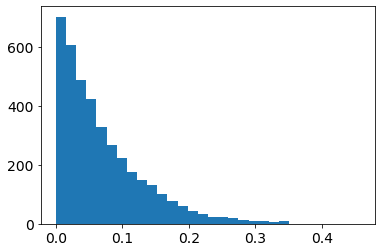

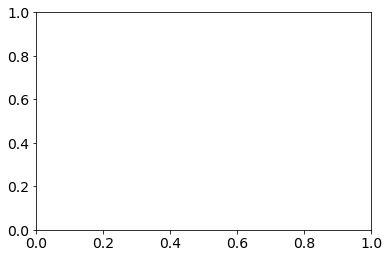

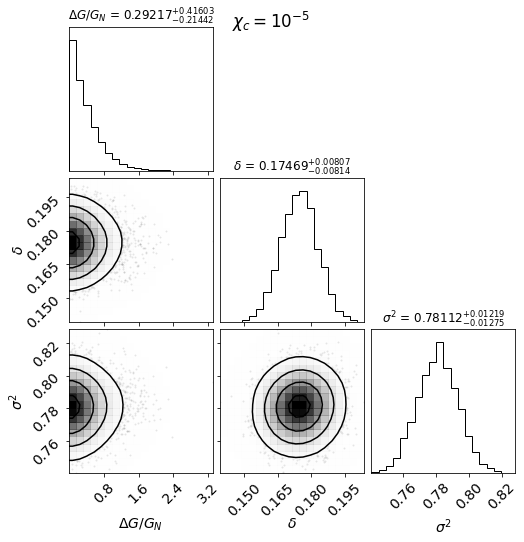

  0%|▏                                          | 4/918 [00:00<00:22, 39.79it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 4.991329149062502e-07
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 2.4060538883542265e-07
10213-1902 [50] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 50.0 0.0 3.659040866574072e-07
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 2.1067404795381522e-07
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0 0.0 5.826220808879838e-07
10218-12703 [50] [33

  1%|▌                                         | 12/918 [00:00<00:27, 32.88it/s]

10218-3704 [50] [-0.2423, -0.7324, -0.4111, -0.2502, -0.1409, -0.2076, -0.2494, -0.3265, -0.3433, -0.3506, -0.3606, -0.3689, -0.3645, -0.3466, -0.4111, -0.2985]
10218-3704 50.0 0.0 4.318929053443321e-07
10219-9102 [50] [1.3962, 1.1814, 0.7492, 0.4692, 0.3335, 0.2205, 0.1532, 0.1423, 0.1945, 0.153, 0.0798, 0.0216, -0.0715, -0.157, -0.0196, -0.0532, -0.0405]
10219-9102 50.0 0.0 3.981393471685842e-07
10220-12705 [50] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 50.0 0.0 3.3798883173994804e-07
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 2.432964096219779e-06
10224-9101 [50] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 50.0 0.0 2.394563233537662e-07
10226-12704 [50] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694

  2%|▉                                         | 20/918 [00:00<00:27, 32.20it/s]

10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 7.51779259521016e-06
10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 3.5585886561340036e-06
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 4.937123942866133e-06
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 50.0 0.0 3.6053406895603693e-07
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 9.548022637302993e-07
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.0093

  3%|█▎                                        | 28/918 [00:00<00:28, 31.53it/s]

10495-12704 [50] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 50.0 0.0 3.4246333370679176e-06
10495-12705 [50] [871.1598, 1245.0304, 1205.1955, 1347.7893, 1374.3588, 1517.2635, 1622.8998, 1633.9971, 1757.8692, 1799.4196, 1854.634, 1999.5551, 1849.1662, 1882.4866, 1807.1303, 1651.9125, 1681.1326, 1493.9167, 2771.4516, 2121.0254, 1992.5196]
10495-12705 50.0 0.0 2.992673789450319e-07
10495-3702 [50] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 50.0 0.0 4.032881118140089e-07
10496-12704 [50] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268.8121, 253.915, 333.7881, 358.7629, 315.1183, 261.3063, 216.6964, 267.188, 258.5169, 256.0365, 248.4992]
10496-12704 50.0 0.0 5.860601744120023e-07
10496-12705 [50] [-0.3

  3%|█▍                                        | 32/918 [00:00<00:27, 32.19it/s]

10499-3702 [50] [-0.3822, -0.1753, 0.3237, 0.6092, 0.8357, 0.9307, 1.1046, 1.1845, 1.1657, 1.064, 1.005, 1.0954, 0.7875, 0.8892, 0.9769, 1.0508, 1.3156, 1.2283]
10499-3702 50.0 0.0 1.9009435047240058e-07
10499-3703 [50] [-0.0563, -0.0436, 0.024, 0.1267, -0.0775, -0.0664, 0.0153, -0.0929, -0.1244, -0.0851, -0.0939, -0.1131, -0.1033, -0.048, 0.0474, 0.0456, 0.0289, -0.0666, -0.0844, -0.5663]
10499-3703 50.0 0.0 4.60337929477891e-07
10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 7.729277147367586e-07
10500-12704 [50] [140.7935, 35.4055, 16.1502, 8.7997, 6.1202, 5.6067, 5.0715, 4.9205, 5.0767, 4.6234, 4.2501, 4.0673, 3.8962, 3.8831, 3.7867, 3.6009, 3.0687, 4.1948, 2.9642, 3.5448, 1.9938, -0.2753, 2.8838, 5.8145]
10500-12704 50.0 0.0 3.483272010005904e-07
10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 2.4161699573034777e-05
10500-3702 [50] [211.267, 568.975, 

  4%|█▊                                        | 40/918 [00:01<00:27, 31.68it/s]

10501-12704 [50] [1.3181, 1.9521, 1.9474, 1.8957, 2.0169, 2.066, 2.2805, 2.1361, 1.7635, 1.5052, 2.0197, 2.1387, 2.493, 1.9877, 1.7896, 1.1205, 1.6972, 2.5971]
10501-12704 50.0 0.0 1.3149768887745245e-06
10501-6101 [50] [54.152, 240.5257, 446.403, 593.882, 679.4829, 745.3089, 578.3118, 397.5307, 268.9797, 276.8619, 234.4717, 196.8602, 156.2454, 140.6324, 64.5922]
10501-6101 50.0 0.0 3.011103266497729e-07
10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 50.0 0.0 1.6802648022660508e-07
10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 2.0288808827552924e-07
10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 6.307686787458767e-06
10505-12704 [50] [0.62

  5%|██▏                                       | 48/918 [00:01<00:27, 31.13it/s]

10508-12703 [50] [0.5005, 0.4509, 0.1544, 0.1328, 0.1165, 0.1176, 0.065, 0.1329, 0.2506, 0.179, 0.1788, 0.1204, 0.0037, 0.016, -0.0301, -0.0876]
10508-12703 50.0 0.0 1.3633427092260407e-06
10509-12703 [50] [1226.9439, 2166.987, 2538.8741, 2127.6504, 1648.0951, 1358.0909, 1167.9374, 985.8138]
10509-12703 50.0 0.0 6.254819479118258e-07
10509-1901 [50] [88.4511, 296.1948, 449.6905, 409.1127, 761.2326, 574.7336, 678.7086, 604.9771, 571.2616, 614.5332, 408.9334, 441.3848, 355.292, 300.996, 243.919, 230.1612, 180.5992, 163.4382, 176.2701, 193.176, 205.4741]
10509-1901 50.0 0.0 1.2539601929320552e-07
10509-6101 [50] [414.6573, 159.5598, 352.8386, 670.9188, 930.199, 434.1238, 984.9702, 921.6235, 784.8291, 825.2006, 827.4197, 661.5592, 624.5693, 894.3523, 620.0269, 747.519, 623.1939, 701.341, 577.342, 1031.0135, 622.2157, 697.4912, 668.4888, 271.226]
10509-6101 50.0 0.0 3.914891137403317e-07
10511-12704 [50] [-0.0162, 0.2052, 0.0934, -0.0203, -0.0645, -0.0743, -0.1124, -0.1256, -0.1314, -0.1489

  6%|██▌                                       | 56/918 [00:01<00:28, 30.71it/s]

10512-12705 [50] [-0.9971, -0.9962, -0.9967, -0.9971, -0.9969, -0.9968, -0.9961, -0.9958, -0.9964, -0.9971, -0.9977, -0.9977, -0.9977, -0.9976, -0.998]
10512-12705 50.0 0.0 7.875901391298894e-07
10512-9102 [50] [4147.3152, 2927.8473, 3245.8656, 2878.0674, 2617.7881, 2204.6977, 1695.8151, 1371.2689, 1298.2413, 1241.1228, 1357.9116, 1330.7104, 1714.839, 1930.3755, 2196.7284, 2401.8011, 2844.302, 3122.8481, 2925.4465]
10512-9102 50.0 0.0 3.5908746907675537e-07
10513-12702 [50] [-0.9916, -0.9877, -0.9855, -0.9802, -0.9787, -0.98, -0.9868, -0.9787, -0.862, -0.9802]
10513-12702 50.0 0.0 8.910204259211056e-07
10514-6103 [50] [0.5999, 0.3982, 0.2747, 0.2749, 0.0781, 0.0617, 0.0681, -0.0189, -0.0377, -0.0578, -0.065, -0.0594, 0.0253, -0.0317, 0.1182, -0.1428, -0.1895, -0.2508, -0.2991, -0.355]
10514-6103 50.0 0.0 1.9716287847433288e-07
10516-6104 [50] [0.3084, -0.237, -0.3593, -0.3575, -0.3434, -0.2974, -0.3603, -0.4386, -0.4629, -0.4919, -0.5092, -0.5031, -0.4319, -0.4152, -0.2877, -0.6618]
10

  7%|██▋                                       | 60/918 [00:01<00:27, 30.77it/s]

10518-12705 [50] [-0.1971, 0.2795, 0.1103, -0.0254, -0.0161, -0.0, 0.0208, 0.0333, 0.0023, -0.0238, -0.0544, -0.1612]
10518-12705 50.0 0.0 1.4327485908872286e-06
10518-1902 [50] [-0.0105, 0.2572, 0.0495, 0.0308, 0.0287, -0.0677, -0.0841, -0.0885, -0.1994, -0.1432, -0.1195, -0.1634, -0.1173, -0.1219, -0.165, -0.1325, -0.1731]
10518-1902 50.0 0.0 5.838008594436611e-07
10518-6102 [50] [-0.217, 1.2282, 0.4062, 0.3459, 0.382, 0.1799, 0.1478, 0.1175, 0.0995, 0.1358, 0.0812, 0.048, 0.0452, 0.0639, 0.0875, 0.0309, 0.0337, 0.0007, -0.0113, -0.1383]
10518-6102 50.0 0.0 2.4414048894051747e-07
10519-12704 [50] [-0.2611, 0.2686, 0.1702, 0.0601, 0.0584, 0.0258, -0.0515, -0.1077, -0.1123, -0.1006]
10519-12704 50.0 0.0 1.1405797321484172e-06
10519-6102 [50] [15.342, 9.7033, 5.6052, 3.8579, 2.785, 2.1688, 1.9416, 1.9483, 2.0544, 1.8028, 1.946, 2.1855, 2.046, 2.3544, 2.1616]
10519-6102 50.0 0.0 2.789784005309819e-07
10520-12704 [50] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.036

  7%|███                                       | 68/918 [00:02<00:27, 30.66it/s]

10838-9101 [50] [-0.0928, 0.4421, 0.4896, 0.3922, 0.2667, 0.3141, 0.2582, 0.2949, 0.294, 0.2543, 0.2198, 0.1153, 0.0076, -0.0625, -0.124, -0.1198, -0.272, -0.3696, -0.3534, -0.3974, -0.2337]
10838-9101 50.0 0.0 6.360175653002015e-07
10839-12705 [50] [0.5531, 0.4188, 0.6271, 0.6342, 0.4074, 0.3206, 0.1512, 0.1105, 0.1154, 0.1763, 0.2141, 0.3291, 0.2868, 0.1635, 0.0391, 0.4134, 0.1807]
10839-12705 50.0 0.0 2.8164443211374955e-06
10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712, 0.035, -0.0115, 0.0248, -0.0288, 0.0512, -0.0187, 0.0073, 0.0432, -0.0916, -0.1233, -0.1818, -0.1471]
10839-3704 50.0 0.0 2.3796766542972698e-07
10839-6101 [50] [244.3098, 615.0842, 876.8345, 1563.8627, 1705.1968, 1816.091, 1687.128, 1731.6052, 1640.9131, 1596.506, 1498.4971, 1406.0518, 671.6148, 995.7509]
10839-6101 50.0 0.0 2.439522005599683e-07
10839-9101 [50] [2.1426, 2.2648, 0.9796, 0.8183, 0.5304, -0.0332, -0.1785, -0.3432, -0.3468, -0.4742, -0.4095, -0.6139, -0.5305, -0.616, -0.529, -0.5494, 0.8162, 3.2784]


  8%|███▍                                      | 76/918 [00:02<00:27, 30.80it/s]

10842-3703 [50] [-0.6099, -0.8101, -0.8807, -0.9171, -0.9297, -0.9289, -0.9268]
10842-3703 50.0 0.0 3.201978636544783e-07
10842-9101 [50] [-0.987, -0.9943, -0.9967, -0.9976, -0.9979, -0.998, -0.9982, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9981, -0.998, -0.9982, -0.9979, -0.9982, -0.9983]
10842-9101 50.0 0.0 8.965671038019237e-07
10845-12702 [50] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-12702 50.0 0.0 2.884765928318619e-07
11004-12705 [50] [-0.8497, -0.6991, -0.5203, -0.3493, -0.2406, -0.2193, -0.1954, -0.1792, -0.1842, -0.1767, -0.1858, -0.1781, -0.195, -0.2173, -0.2294, -0.167, -0.2434, -0.1514, -0.3351, -0.2129]
11004-12705 50.0 0.0 4.95020529072159e-07
11004-3703 [50] [5607.0165, 6199.0745, 5122.0907, 4588.5334, 3798.1606, 3256.1827, 2909.7374, 2623.1995, 2081.3703, 1622.0266, 1252.6703, 1054.2993, 797.551, 805.4299, 667.6425]
11004-3703 50.0 0.0 1.5162495675172317e-07
11004-6104 [50] [0.1363, 0.6537, 0.7

  9%|███▊                                      | 84/918 [00:02<00:27, 30.38it/s]

11009-6102 [50] [0.2368, -0.3064, 0.0765, 0.1736, 0.0574, 0.1163, 0.1754, 0.2052, 0.2777, 0.3634, 0.3506, 0.3192, 0.3455, 0.323, 0.4447, 0.1481, 0.2577, -0.1338, 0.037, 0.1218, 0.8549, -0.5202]
11009-6102 50.0 0.0 1.8125906274028656e-07
11010-12705 [50] [-0.0199, 0.0369, -0.0512, -0.0961, -0.0616, -0.0525, -0.0667, -0.0148, -0.0176, -0.0486, -0.0929, -0.1237, -0.1411, -0.2784, -0.0549, -0.2411]
11010-12705 50.0 0.0 2.241539983476044e-07
11010-6104 [50] [669.1593, 612.5725, 580.2933, 433.0387, 377.072, 315.1925, 269.3918, 266.5579, 267.4688, 253.2676, 240.0639, 221.1944, 344.4065]
11010-6104 50.0 0.0 7.57466359899194e-07
11010-9101 [50] [2.5718, 0.9269, 0.2901, 0.1931, 0.0011, -0.0504, -0.0935, -0.075, 0.0093, 0.0203, 0.0025, -0.0251, -0.0362, 0.0004, 0.0161, -0.0012, -0.102, -0.364, -0.4377]
11010-9101 50.0 0.0 8.545492158579124e-07
11011-12703 [50] [9.8651, 35.0102, 40.3579, 54.0601, 192.4013, 365.0512, 378.092, 411.2362, 282.7202, 230.5846, 329.2445, 263.6472, 244.1501]
11011-12703 5

 10%|████                                      | 88/918 [00:02<00:27, 30.41it/s]

11012-9102 [50] [4.3613, 1.8587, 0.9243, 0.4611, 0.1717, 0.0565, -0.0003, -0.0124, 0.0149, 0.0346, 0.0094, 0.0256, 0.0391, 0.0441, 0.0302, -0.0599, -0.0933, -0.0179]
11012-9102 50.0 0.0 1.404071195842337e-06
11013-12702 [50] [0.7904, 0.6387, 0.0779, 0.1203, 0.0592, -0.004, -0.016, 0.0128, 0.0194, 0.059, 0.0663]
11013-12702 50.0 0.0 2.2226585474922337e-06
11013-1902 [50] [0.7893, 0.6453, 0.5024, 0.4895, 0.4034, 0.2175, 0.0455, -0.0103, 0.0142, -0.2569, -0.0412, -0.2183, -0.1712, -0.0824, -0.3609, -0.2323, -0.3117]
11013-1902 50.0 0.0 1.5804970151904664e-06
11013-3701 [50] [0.785, 0.6845, 0.2024, 0.0457, 0.0342, 0.02, -0.06, -0.0296, -0.0379, -0.1677]
11013-3701 50.0 0.0 1.798761195481692e-07
11013-3702 [50] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 50.0 0.0 6.370843987706713e-06
11013-6101 [50] [0.3389, -0.3422, -0.154, -0.2894, -0.4104, -0.4385, -0.4897, -0.4798, -0.43, -0.3971, -0.3753, -0.3775, -0.3376, -0.2419, -0.1243, 0.0068, -0.1557, 0.0318, -0.0178,

 10%|████▍                                     | 96/918 [00:03<00:27, 30.11it/s]

11017-12704 [50] [0.4751, 0.4487, 0.3988, 0.2586, 0.0625, -0.0537, -0.0751, -0.1094, -0.1157, -0.1027, -0.1141, -0.1182, -0.1126, -0.1047, -0.0836, -0.1961, -0.2389]
11017-12704 50.0 0.0 4.930476236887537e-07
11017-6103 [50] [-0.3235, -0.3265, -0.3479, -0.2253, -0.2261, -0.1769, -0.1311, -0.1075, -0.0747, -0.0989, -0.1378, -0.1695, -0.1257, -0.174, -0.178, -0.0714, -0.0163, 0.0028, 0.2262, -0.2731]
11017-6103 50.0 0.0 5.088899451559668e-07
11017-9101 [50] [-0.5273, 0.0425, 0.2188, 0.1666, 0.07, 0.0407, -0.0503, -0.1282, -0.2004, -0.2244, -0.1722, -0.1497, -0.0815, -0.0967, -0.1443, -0.1476, -0.1864, -0.1536, -0.2264, -0.18]
11017-9101 50.0 0.0 2.4284260334947387e-07
11018-12702 [50] [-0.9839, -0.9926, -0.9927, -0.9922, -0.9923, -0.9935, -0.9932, -0.9925, -0.9931, -0.994, -0.9941]
11018-12702 50.0 0.0 7.066099848494231e-07
11018-12704 [50] [-0.9989, -0.9988, -0.9986, -0.9987, -0.9988, -0.999, -0.999, -0.9991, -0.9991, -0.9987, -0.9984, -0.9975, -0.9987, -0.9989]
11018-12704 50.0 0.0 7.3

 11%|████▋                                    | 104/918 [00:03<00:26, 30.34it/s]

11018-6102 [50] [69.1052, 130.9961, 113.1141, 109.1797, 92.5989, 91.6354, 88.5765, 83.9604, 80.137, 76.3564, 74.3146, 74.7218, 70.495, 71.7331, 65.8452, 64.9321, 72.2612]
11018-6102 50.0 0.0 1.6087419250059878e-06
11019-12702 [50] [0.0142, 0.2516, 0.1906, 0.1378, 0.0877, -0.003, 0.0993, 0.0958, 0.1065, 0.1232, 0.2086, 0.1132, 0.0357, -0.0115, -0.014, 0.0302, -0.0875, -0.1071]
11019-12702 50.0 0.0 3.008555725130249e-07
11019-12703 [50] [-0.4993, -0.4671, -0.3698, -0.2654, -0.2024, -0.2445, -0.2033, -0.2117, -0.2752, -0.2285, -0.2102, -0.0702, -0.1699, 0.0858, -0.1757, -0.2987]
11019-12703 50.0 0.0 1.0416640835521244e-06
11019-12705 [50] [0.9395, 1.6844, 1.8269, 0.8562, 0.7011, 1.016, 1.1247, 1.0992, 1.0844]
11019-12705 50.0 0.0 2.3908454875267655e-06
11019-3701 [50] [2.5964, 1.3616, 0.9142, 0.3658, 0.0143, -0.1157, -0.1148, -0.102, -0.0691, -0.1802, -0.166, -0.2893, -0.0849]
11019-3701 50.0 0.0 3.128535807228115e-07
11021-1902 [50] [5.9017, 3.1432, 2.8491, 1.9605, 1.7177]
11021-1902 50.

 12%|█████                                    | 112/918 [00:03<00:26, 30.72it/s]

11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 2.116517287021933e-06
11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 2.6533078382947263e-06
11742-12704 [50] [0.6702, -0.5312, -0.3481, 0.0047, 0.1348, 0.415, 0.2787, 0.5138, -0.0348]
11742-12704 50.0 0.0 3.8419340892521073e-07
11743-1901 [50] [-0.5717, -0.3943, -0.5273, -0.3736, -0.306, -0.392, -0.3766, -0.4151, -0.3665, -0.4111, -0.4236, -0.3424, -0.3877, -0.3594, -0.291, -0.4952, -0.6018]
11743-1901 50.0 0.0 1.8593235497491296e-06
11744-9102 [50] [-0.6298, 0.0464, 0.3943, 0.6247, 0.4097, 0.3518, 0.3414, 0.4046, 0.4742, 0.4313, 0.3693, 0.3275, 0.2214, 0.1278, 0.0812, 0.4043, 0.1792, -0.1336]
11744-9102 50.0 0.0 1.2698716569061103e-0

 13%|█████▏                                   | 116/918 [00:03<00:26, 30.15it/s]

11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.0361, -0.076, -0.0711, -0.1542, -0.2041, -0.2119, -0.1066, -0.2705, -0.3138]
11745-9101 50.0 0.0 2.767966374697321e-07
11746-3703 [50] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 50.0 0.0 1.5474953760047737e-07
11746-3704 [50] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 50.0 0.0 1.3611272540041056e-07
11746-9102 [50] [-0.478, -0.2133, -0.2528, -0.1774, -0.2077, -0.2266, -0.2099, -0.2691, -0.1996, -0.2114, -0.1249, -0.1799, -0.1765, -0.1376, -0.2784, -0.2323, -0.1941, -0.3005, -0.2047, -0.3235, -0.1159, 0.1709]
11746-9102 50.0 0.0 1.451458790670637e-06
11747-12702 [50] [-0.4876, -0.2412, -0.0165, -0.0887, -0.0931, -0.0756, -0.07

 13%|█████▍                                   | 123/918 [00:03<00:26, 29.57it/s]

11749-12704 [50] [1.1585, 1.0264, 1.2033, 1.4986, 1.8954, 2.0398, 2.1095, 2.1199, 1.4688, 1.3033, 0.9132, 0.8426, 0.0515, 0.4719, -0.3735]
11749-12704 50.0 0.0 1.3718700345284675e-06
11749-3701 [50] [618.0455, 872.9003, 1483.1859, 1615.2011, 1553.7949, 1334.0598, 1385.5396, 1283.8547, 1216.0833, 1294.494, 1472.7433, 1080.4933, 1346.7897, 1196.9726, 1091.8413, 1216.7304, 927.7028, 363.0292, 281.9853, 551.8779, 169.9359, 54.7426, 122.374, 379.7425, 27.1507]
11749-3701 50.0 0.0 3.777466486599917e-07
11750-12701 [50] [0.4224, 0.3089, 0.0791, 0.0892, 0.2329, 0.2222, 0.1114, 0.03, 0.0196, 0.0027, 0.0313, 0.0827, 0.0275, 0.3095]
11750-12701 50.0 0.0 3.947196890320102e-07
11750-3701 [50] [1.5964, 1.8766, 1.9419, 1.999, 1.4725, 1.2873, 1.1333, 0.934, 0.9463, 0.8918, 0.7347, 0.8508, 0.6677, 0.4619, 0.3762, 0.1866, 0.0367, 0.0915, 0.0086, 0.4665]
11750-3701 50.0 0.0 3.174619356990236e-07
11750-6103 [50] [6.303, 1.7001, 0.3933, 0.5417, 0.5248, 0.6298, 0.7207, 0.7282, 0.8046, 0.5691, 0.3659, 0.4083

 14%|█████▊                                   | 129/918 [00:04<00:26, 29.49it/s]

11751-1901 [50] [-0.9334, -0.8849, -0.9513, -0.9754, -0.9893, -0.9862, -0.989, -0.9902, -0.9893, -0.9909, -0.9903, -0.9906, -0.9888, -0.9874]
11751-1901 50.0 0.0 9.90809974533394e-07
11751-6102 [50] [0.3738, 0.0535, 0.3785, 0.2124, 0.1333, 0.0258, -0.0223, -0.094, -0.1099, -0.1415, -0.1724, -0.2013, -0.1841, -0.253, -0.3949, -0.2255, -0.2141, -0.2775]
11751-6102 50.0 0.0 8.021699520453051e-07
11753-3703 [50] [0.2801, 0.7604, 0.7391, 0.5795, 0.35, 0.1693, 0.0874, 0.0586, 0.0152, -0.0057, -0.0099, -0.0594, -0.1073, -0.139, -0.1496]
11753-3703 50.0 0.0 4.479245334404671e-07
11753-6104 [50] [1.7058, 1.5787, 1.7231, 1.492, 1.0043, 0.8699, 0.6579, 0.5905, 0.5042, 0.4712, 0.4504, 0.6153, 0.6589, 0.6817, 0.5206, 0.5457, 0.5195, 0.692]
11753-6104 50.0 0.0 3.942286020556104e-07
11754-1901 [50] [-0.2402, -0.5388, -0.5143, -0.4398, -0.487, -0.4664, -0.4721, -0.5334, -0.5004, -0.4954, -0.6115, -0.5884]
11754-1901 50.0 0.0 2.8162165735390866e-07
11755-12701 [50] [-0.773, -0.7865, -0.7717, -0.7522, -

 15%|██████                                   | 136/918 [00:04<00:24, 31.29it/s]

11755-9102 [50] [0.1799, 0.2485, 0.3504, 0.383, 0.2088, 0.1465, 0.0712, -0.0042, -0.0415, -0.0215, 0.0671, 0.0623, 0.1393, -0.1017, 0.125, -0.214, -0.1458]
11755-9102 50.0 0.0 4.4509901172662297e-07
11758-3701 [50] [-0.3091, 0.0326, 0.2349, 0.1141, 0.0113, 0.06, -0.0268, -0.1507, -0.2171, -0.1994, -0.1587, -0.1557, -0.1574, -0.1614, -0.0618]
11758-3701 50.0 0.0 2.108055399941194e-07
11758-3702 [50] [-0.544, -0.1141, 0.0167, 0.1028, 0.0854, -0.0041, -0.0149, 0.0406]
11758-3702 50.0 0.0 2.596132535987729e-07
11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 50.0 0.0 7.6695206303757e-07
11759-6102 [50] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, -0.981]
11759-6102 50.0 0.0 1.6633262061495945e-07
11760-12703 [50] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0.53

 16%|██████▍                                  | 144/918 [00:04<00:26, 29.52it/s]

11760-6103 [50] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.2117, -0.2373, -0.2365, -0.2317, -0.3078, -0.2653, -0.3184, -0.2638]
11760-6103 50.0 0.0 1.7698264445717557e-07
11760-9102 [50] [-0.8049, -0.6427, -0.2931, -0.1213, 0.1899, 0.0235, 0.108, 0.1381, 0.1732, 0.1865, 0.1624, 0.1963, 0.1218, 0.1215, 0.1223, 0.2636, 0.046, 0.5962, 0.1808, 0.9922, 2.2582]
11760-9102 50.0 0.0 1.531581493452479e-07
11761-12702 [50] [-0.6826, -0.6017, -0.2216, -0.1122, -0.0329, -0.02, -0.0711, -0.0937, -0.0782, -0.098, -0.1546, -0.1024, -0.1043, -0.0648, -0.2102, -0.3314, -0.2483]
11761-12702 50.0 0.0 2.0775592581542113e-06
11761-12703 [50] [0.4093, 0.08, -0.0588, -0.0478, 0.0006, -0.0009, -0.0617, -0.1284, -0.1046, -0.1135, -0.1247, -0.1623, -0.2191, -0.3477]
11761-12703 50.0 0.0 2.477923531741256e-06
11761-12704 [50] [-0.1205, 0.9952, 0.5814, 0.2296, 0.1208, 0.126, 0.1222, 0.1041, 0.1683, 0.1996, 0.1448, 0.1188, 0.0574, 0.0394, -0.008, -0.026, -0.0331]
11761-1270

 16%|██████▋                                  | 150/918 [00:04<00:26, 28.70it/s]

11823-9101 [50] [15949.1976, 8800.0053, 8323.3916, 4811.1692, 2214.9858, 717.2733, 413.2719, 305.7873, 173.5393, 146.0478, 195.6604, 224.7593, 189.4201, 67.1778]
11823-9101 50.0 0.0 7.299313387879789e-07
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 3.879637424019205e-06
11828-12703 [50] [-0.5587, -0.2913, 0.1844, 0.3112, 0.2627, 0.2124, -0.0354, -0.0957, -0.1295, -0.1601, -0.0565, -0.1246, 0.0413]
11828-12703 50.0 0.0 1.1027460225142508e-06
11830-12701 [50] [-0.9938, -0.9825, -0.9834, -0.9912, -0.9934, -0.9941, -0.9946, -0.9933, -0.9936, -0.9951, -0.9951, -0.9944, -0.9947, -0.9932, -0.9955, -0.9854, -0.997, -0.9939, -0.9962]
11830-12701 50.0 0.0 4.1199913099228925e-07
11830-12703 [50] [-0.4776, 0.0437, 0.1582, -0.0709, -0.1607, -0.0754, 0.055, 0.2665, 0.1845, 0.03, 0.0663, -0.087, -0.2185, -0.1589, 0.0536, -0.3722]
11830-12703 50.0 0.0 9.730598651370407e-07
11830-3702 [50] [1.2

 17%|██████▉                                  | 156/918 [00:05<00:26, 28.43it/s]

11830-6104 [50] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.0353, -0.2063, -0.258, -0.2347, -0.2692, -0.3985]
11830-6104 50.0 0.0 4.700091253949818e-07
11831-12703 [50] [0.4472, 0.0224, 0.062, 0.158, -0.0429, -0.0922, -0.1252, -0.188, -0.1276, -0.16, -0.2596, -0.2165, 0.1708, -0.4595]
11831-12703 50.0 0.0 9.72511285961111e-07
11831-12704 [50] [-0.5822, -0.2435, 0.0115, -0.0848, -0.1704, -0.028, -0.0888, -0.0323, -0.0445, -0.106, -0.3871, -0.1836]
11831-12704 50.0 0.0 1.0579326973350619e-06
11831-6101 [50] [-0.9875, -0.994, -0.9968, -0.9973, -0.9967, -0.9975, -0.9969, -0.9978, -0.9979, -0.9971, -0.9984, -0.9986, -0.9985, -0.9974]
11831-6101 50.0 0.0 2.1922886226469823e-07
11831-6102 [50] [1.041, 0.6096, 0.4053, 0.165, 0.0902, 0.1922, 0.1873, 0.1187, 0.1055, 0.0085, -0.1108, -0.0737]
11831-6102 50.0 0.0 3.6755905815021416e-07
11833-9102 [50] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.2

 18%|███████▏                                 | 162/918 [00:05<00:27, 27.27it/s]

11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 9.202780000316907e-06
11836-1902 [50] [0.7026, 1.2767, 1.1865, 1.1009, 0.973, 0.9921, 0.7024, 0.7206, 0.623, 0.6145, 0.5505, 0.5955, 0.6037, 0.4142, 0.4147]
11836-1902 50.0 0.0 8.695201086240294e-07
11838-12701 [50] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 0.1336, 0.0903, 0.0213, -0.0554, -0.0342, 0.0225, 0.0053, -0.0272]
11838-12701 50.0 0.0 3.360535905793066e-07
11838-12703 [50] [144.9042, 254.2159, 538.0129, 911.0748, 1089.8377, 1111.2623, 1284.2649, 1228.3752, 1345.2496, 1400.7846, 1427.4787, 1434.5371, 1257.47, 1184.9615, 998.2342, 830.6266, 670.98, 596.3078, 488.5417, 423.536, 329.6538, 32.3109, 5.6457, 31.8479]
11838-12703 50.0 0.0 8.874031990579528e-07
11838-3702 [50] [0.536, 0.7094, 0.6061, 0.6555, 0.6466, 0.6204, 0.

 19%|███████▌                                 | 170/918 [00:05<00:23, 31.74it/s]

11838-9101 [50] [11.4727, 10.3246, 9.7757, 7.6641, 6.3263, 7.7985, 4.6854, 6.1379, 3.8072, 5.5203, 3.0518, 3.9759, 1.4403, 2.8333, 2.6956, 2.5542]
11838-9101 50.0 0.0 2.1474687861512432e-07
11865-12702 [50] [-0.057, -0.0512, 0.0778, -0.0002, -0.0743, -0.0834, -0.0854, 0.0083, -0.0154, -0.0332, -0.07, -0.1612, -0.2706]
11865-12702 50.0 0.0 9.222955431878037e-07
11865-12704 [50] [0.4447, -0.0557, -0.3894, -0.457, -0.5111, -0.5109, -0.5238, -0.5353, -0.4955, -0.5012, -0.4831, -0.4726, -0.599, -0.615]
11865-12704 50.0 0.0 5.783537155643641e-07
11865-1901 [50] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 50.0 0.0 7.808972258617206e-07
11865-1902 [50] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0.4429]
11865-1902 50.0 0.0 2.0916601385835712e-07
11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 9.234531775127041e-07
11865-9102 [50] [-0.467, -0.4695,

 19%|███████▊                                 | 174/918 [00:05<00:22, 33.48it/s]

11867-9101 [50] [0.9073, 0.3027, 0.1546, 0.1123, 0.0285, 0.0159, -0.0244, 0.0205, 0.0824, 0.1908, 0.2079, 0.2195, 0.3058, 0.2425, 0.1871, 0.3056]
11867-9101 50.0 0.0 2.7898744526840704e-07
11868-12703 [50] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 1.4760229833610217e-06
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 4.654633812301549e-06
11871-6103 [50] [0.7182, 0.8575, 0.776, 0.4737, 0.2556, 0.1173, 0.1395, 0.111, 0.0842, 0.0381, 0.0003, -0.0281, -0.0195, -0.044, -0.0588, -0.2086, -0.132, -0.377]
11871-6103 50.0 0.0 2.5222337344035633e-06
11940-1902 [50] [-0.0835, 0.1518, 0.1321, 0.0182, -0.0843, -0.1452, -0.1779, -0.1993, -0.1955]
11940-1902 50.0 0.0 1.5501415598075228e-06
11940-3703 [50] [1.1615, 1.5645, 1.5154, 1.5213, 1.3625, 1.1856, 0.9977, 0.7191, 0.6591, 0.6153, 0.3767, 0.433, 0.6417, 0.1616, 0.444, 0.2018, 0.0806, 0.2143, 0.

 20%|████████▏                                | 182/918 [00:05<00:25, 29.27it/s]

11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 5.8578132224548185e-06
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 3.11039725520714e-05
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389.9946, 2439.1642, 2636.587, 2485.7262, 2056.7992, 1736.2622, 1623.5415, 1192.5228, 781.8483, 546.9719, 175.874]
11942-12704 50.0 0.0 3.063412499100941e-06
11942-6104 [50] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 50.0 0.0 2.702698496237705e-07
11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.0425, -0.0331, -0.0546, -0.0982, -0.1371, -0.164, -0.179, -0.1863, -0.172, -0.1572, -0.1563, -0.1648, -0.1726, -0.27]
11943-3703 50.0 0.0 2.8962171440498177e-06
11944-12701 [50] [-0.3

 20%|████████▍                                | 188/918 [00:06<00:25, 28.17it/s]

11945-12701 [50] [0.3961, 0.2879, 0.3765, 0.1557, -0.0002, -0.113, -0.1502, -0.128, -0.114, -0.1705, -0.0344, 0.0462, 0.017]
11945-12701 50.0 0.0 2.491393631670025e-06
11945-6101 [50] [0.2057, 0.8606, 0.9637, 0.605, 0.4694, 0.2734, 0.2029, 0.1332, 0.0558, -0.0105, 0.0015, 0.0011, -0.0038, -0.016, 0.0504, -0.0338]
11945-6101 50.0 0.0 3.4905133229066824e-06
11945-6102 [50] [3.5224, 2.2109, 1.4349, 1.0152, 0.7457, 0.4864, 0.2556, 0.1192, 0.0508, 0.0117, -0.0209, -0.0683, -0.158, -0.0976, -0.2012]
11945-6102 50.0 0.0 1.1908215352906864e-06
11947-6103 [50] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 50.0 0.0 3.78221323489314e-07
11949-12701 [50] [1.1975, 0.3408, 0.1441, 0.1243, 0.0225, 0.0003, 0.0028, 0.027, 0.0197, 0.0192, -0.0295, -0.0839]
11949-12701 50.0 0.0 8.407637721199343e-07
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716,

 21%|████████▋                                | 194/918 [00:06<00:26, 27.49it/s]

11954-12704 [50] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453, 0.1801, 0.125, 0.0276, -0.0116, -0.0744, -0.134, -0.1626, -0.2559, -0.2802]
11954-12704 50.0 0.0 2.7517749318825426e-06
11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.2778]
11954-3703 50.0 0.0 4.143698613073982e-06
11954-9101 [50] [-0.9882, -0.9937, -0.9946, -0.9965, -0.9974, -0.9972, -0.997, -0.9969, -0.997, -0.9974, -0.9978, -0.9979, -0.9973, -0.9971, -0.9976, -0.9966]
11954-9101 50.0 0.0 2.865426480148231e-06
11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 1.675260158092233e-06
11956-12702 [50] [5.6953, 5.0804, 3.2564, 2.1056, 1.2622, 0.6457, 0.4602, 0.5373, 0.9503, 3.7649, 5.1679]
11956-12702 50.0 0.0 7.066719448536259e-07
11956-12705 [50] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 0.

 22%|████████▉                                | 200/918 [00:06<00:26, 26.70it/s]

11957-12704 [50] [-0.3492, 0.7667, 0.6853, 0.5861, 0.3661, 0.189, 0.1584, 0.1015, -0.0026, 0.0319, 0.1228, 0.1275, 0.2204, 0.0938]
11957-12704 50.0 0.0 1.5880374134681657e-07
11957-9101 [50] [127.5969, 337.5453, 692.0501, 754.6672, 761.8038, 673.5367, 561.8056, 470.5271, 446.8561, 434.7914, 434.701, 432.6297, 423.9362, 415.9254, 409.4146, 409.8788]
11957-9101 50.0 0.0 2.9751399522444747e-06
11957-9102 [50] [1.0969, 0.3397, 0.6198, 1.0919, 1.791, 2.069, 2.6145, 2.7123, 2.8073, 2.4726, 2.1945, 1.9756, 2.1362, 4.7679, 3.0873, 1.2673, 3.459, 16.3037, 15.1044]
11957-9102 50.0 0.0 6.346405242050192e-07
11958-6103 [50] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 50.0 0.0 2.1819357094957645e-07
11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 9.41555273224863e-07
11960-12704 [50

 22%|█████████▏                               | 206/918 [00:06<00:26, 26.37it/s]

11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.9843, 0.6333, 0.3517, 0.1829, 0.1258, 0.0956, 0.1424, 0.1021, 0.028, 0.1221]
11965-9102 50.0 0.0 8.310067472588805e-07
11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 3.09123726353465e-06
11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.8986, 3.5843, 4.0724, 0.9129, 2.9875, 0.7205, 2.6408, 1.2362]
11969-6101 50.0 0.0 2.9091561983315217e-06
11970-12703 [50] [-0.4888, -0.3498, -0.0561, 0.1594, 0.1669, 0.133, 0.154, 0.1676, 0.144, 0.1071, 0.072, 0.0457, 0.046, 0.0501, 0.1262, -0.0083, 0.2366]
11970-12703 50.0 0.0 1.3369237239806414e-07
11970-6102 [50] [-0.0116, -0.0683, -0.0558, -0.0053, 0.0454, 0.025, 0.078, -0.0283, -0.085, -0.1052, -0.0602, -0.0272, -0.0693, -0.0116, -0.1378, -0.2799, -0.2497]
11970-6102 50.0 0.0 4.213712785875139e-07
11970-6103 [50] [0.7466

 23%|█████████▍                               | 212/918 [00:07<00:27, 25.85it/s]

11974-12702 [50] [-0.5341, -0.4596, -0.3852, -0.2683, -0.2117, -0.2349, -0.22, -0.1969, -0.1731, -0.1829, -0.2133, -0.2538, -0.2357, -0.256, -0.1504, -0.1437, -0.1349, 1.1183]
11974-12702 50.0 0.0 2.8399717498769195e-06
11975-12701 [50] [-0.1741, -0.13, 0.3291, 1.0808, 1.3321, 1.3798, 1.0057, 0.9745, 0.8989, 0.5699, 0.4672, 0.2163]
11975-12701 50.0 0.0 1.5804809662726484e-07
11975-12705 [50] [0.6902, 0.7621, 0.3208, 0.2527, 0.3317, 0.3259, 0.2387, 0.0864, 0.069, 0.2015, 0.1928, 0.1502, -0.0055, -0.1924]
11975-12705 50.0 0.0 6.92626765208977e-07
11975-3703 [50] [-0.2597, -0.0329, 0.0768, 0.0833, 0.1048, 0.0682, 0.0342, -0.0156, -0.0756, -0.093, -0.0695, -0.0466, 0.0656, -0.0085, 0.1237, 0.1334, 0.0646]
11975-3703 50.0 0.0 5.261426404794677e-07
11975-6104 [50] [1.0196, 1.2709, 1.5062, 1.1104, 0.9965, 0.7778, 0.776, 0.6311, 0.7603, 0.6278, 0.6208, 0.5151, 0.5172, 0.5343, 0.2326, 0.5012, 0.187, 0.4522, 0.1401, 0.1327]
11975-6104 50.0 0.0 4.933503151911007e-07
11976-12703 [50] [-0.2491, -0.

 24%|█████████▋                               | 218/918 [00:07<00:27, 25.59it/s]

11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 50.0 0.0 4.557717784408648e-07
11978-12705 [50] [0.0184, 0.0968, 0.695, 0.4819, 0.223, 0.1168, 0.1458, 0.1604, 0.1304, 0.1363, 0.1451, 0.1188, 0.0734, 0.0413, 0.0374, 0.0059, 0.0584, 0.0708]
11978-12705 50.0 0.0 7.137872563789635e-07
11978-6101 [50] [0.1703, 0.2916, 0.2201, 0.1105, 0.137, 0.0651, 0.0262, 0.0439, 0.1227, 0.0551, 0.0171, -0.0525, -0.106, -0.2018, -0.2281, -0.1584, -0.2752, -0.3694, -0.5359, -0.6656, -0.8099]
11978-6101 50.0 0.0 6.5945716313702e-07
11979-12703 [50] [0.3188, 0.2646, 0.4444, 0.4735, 0.4231, 0.2818, 0.2037, 0.1891, 0.1975, 0.1625, 0.205, 0.2447, 0.1501, 0.1763, 0.1339, 0.4567, 0.4255, 0.53]
11979-12703 50.0 0.0 2.3487333260014133e-06
11979-12704 [50] [1.0417, 0.8488, 0.6206, 0.5652, 0.598, 0.4342, 0.2822, 0.1334, 0.0604, 0.0319, 0.0291, -0.01, -0.083, -0.0554, -0.0215, -0.0081, 0.0344]
11979-12704 50.0 0.0 3.08927

 24%|██████████                               | 224/918 [00:07<00:27, 25.39it/s]

11979-9102 [50] [0.6334, -0.323, -0.1351, -0.0857, 0.0053, 0.0302, 0.0467, 0.0752, 0.0566, 0.0459, 0.0116, 0.0269, 0.0046, -0.0156, -0.091, -0.1558, -0.3105, -0.4242, -0.5324]
11979-9102 50.0 0.0 4.4664459211050976e-07
11981-12702 [50] [293.567, 690.112, 683.5389, 617.2849, 490.646, 374.3616, 455.8674, 450.3051, 457.9927, 478.543, 404.234]
11981-12702 50.0 0.0 2.9664571540688373e-07
11981-12704 [50] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]
11981-12704 50.0 0.0 5.927685041368157e-07
11981-9102 [50] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188, -0.1444, -0.128, -0.1812, -0.1904, -0.2284, -0.2044, -0.2061, -0.1486, -0.2345, -0.2114, 0.0329, 0.7603]
11981-9102 50.0 0.0 5.417691233801907e-07
11982-12704 [50] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.1555, 0.0797, -0.029, 0.0037, 0.2331]
11982-127

 25%|██████████▎                              | 230/918 [00:07<00:27, 25.06it/s]

11982-6102 [50] [0.7786, 0.4297, 0.4569, 0.7506, 0.7926, 0.6732, 0.6507, 0.5035, 0.3848, 0.2963, 0.4923, 0.064, 0.2848, -0.0122, 0.3417, -0.0773, -0.7924]
11982-6102 50.0 0.0 1.1814501995840925e-07
11982-9102 [50] [-0.6167, -0.1298, 0.3235, 1.2078, 1.1438, 0.8069, 0.6394, 0.4963, 0.4228, 0.3252, 0.3069, 0.2838, 0.3393, 0.4905, 0.4567, 0.2311]
11982-9102 50.0 0.0 1.5598496506657535e-06
11984-12701 [50] [-0.2857, -0.1737, 0.0157, 0.0372, -0.1281, -0.2001, -0.1962, -0.1945, -0.1458, -0.0921, -0.099, -0.116, -0.1666, -0.325, -0.2122, -0.442]
11984-12701 50.0 0.0 3.8392520956411426e-07
11984-12702 [50] [-0.2774, -0.3248, -0.3706, -0.3541, -0.339, -0.3481, -0.2877, -0.2577, -0.2022, -0.1466, -0.1889, -0.2485, -0.0638, -0.2124, -0.1581, -0.3914, -0.132]
11984-12702 50.0 0.0 3.2295930365187726e-06
12066-3701 [50] [19.2418, 16.9197, 10.1428, 6.0915, 4.4316, 3.0783, 2.9929, 2.3906, 2.7183, 2.8356, 3.2869, 3.669, 3.475, 3.6088, 2.499, 1.7084, 1.9485, 1.5899]
12066-3701 50.0 0.0 6.436910490221467e

 26%|██████████▌                              | 236/918 [00:08<00:25, 26.26it/s]

12067-12703 [50] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
12067-12703 50.0 0.0 4.6056767109189145e-07
12067-12705 [50] [0.4291, 1.3434, 2.0219, 1.7622, 1.0305, 0.7583, 0.4763, 0.1261, 0.0511, 0.0662, 0.1502, 0.2361, 0.2324, 0.212, 0.3434]
12067-12705 50.0 0.0 8.104232651512026e-07
12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 4.47066337217683e-05
12068-6104 [50] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 50.0 0.0 1.410821696826614e-06
12069-12704 [50] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 50.0 0.0 8.395880334383212e-07
12069-12705 [50] [1.7332, 1.137,

 26%|██████████▊                              | 242/918 [00:08<00:26, 25.32it/s]

12071-12701 [50] [-0.9172, -0.8384, -0.6786, -0.6994, -0.7429, -0.7686, -0.7662, -0.8217, -0.8275, -0.8401, -0.7831, -0.8143]
12071-12701 50.0 0.0 8.419114578187271e-07
12071-1901 [50] [-0.148, -0.1411, -0.1881, -0.1802, -0.1874, -0.1463, -0.1611, -0.1934, -0.1236, -0.1115, 0.0697, 0.0471, 0.1047, 0.171, 0.9648]
12071-1901 50.0 0.0 6.453368576050565e-07
12071-3702 [50] [43.1041, 1833.3653, 2193.0557, 2409.7616, 2285.0769, 1925.6484, 1966.7994, 2043.2628, 1997.8474, 1832.4832, 1658.3071, 1528.5931, 1298.5116, 1014.8264, 552.6982, 136.4828]
12071-3702 50.0 0.0 1.2948141594885086e-06
12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.3083, 398.9949, 258.1108, 178.8144, 146.4641, 210.3609, 51.4796, 32.8354, 22.052]
12071-3704 50.0 0.0 9.189296614025315e-07
12075-12704 [50] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 50.0 0.0 4.316776263905864e-06


 27%|██████████▉                              | 245/918 [00:08<00:27, 24.82it/s]

12078-12703 [50] [0.3298, 0.5608, 0.2182, 0.3221, 0.2303, 0.0896, 0.0846, 0.2051, 0.3186, 0.33, 0.2532]
12078-12703 50.0 0.0 8.776979015057115e-07
12078-6103 [50] [1.9637, 5.3953, 4.122, 4.276, 4.2033, 3.4926, 3.3028, 3.2038, 3.1762, 3.0769, 2.868, 2.5911, 2.6527, 2.4952, 2.6226, 2.6979, 2.1328, 1.6158, 1.3218, 1.8508]
12078-6103 50.0 0.0 5.325661265229097e-07
12079-12705 [50] [5.9457, 5.134, 4.915, 2.376, 2.7696, 2.3345, 1.3415, 1.441, 1.4148, 0.8317, 1.0553, 1.0687, 0.9662, 0.8766, 1.1537, 1.4538, 0.8336]
12079-12705 50.0 0.0 2.2440904626578077e-07
12080-12704 [50] [798.4646, 1129.8436, 1685.7177, 1551.5379, 1648.9794, 1528.8158, 1510.5353, 1488.9904, 1518.2012, 1430.3202, 1355.0599, 1297.2544, 1371.7431, 1127.7862, 1194.7794, 1062.3493, 1183.2366, 942.8748, 761.5148, 256.7283, 914.8231, 836.9712]
12080-12704 50.0 0.0 1.7076690999899261e-07
12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
120

 27%|███████████▏                             | 251/918 [00:08<00:27, 24.25it/s]

12084-12702 [50] [0.4179, 1.0492, 0.9255, 0.717, 0.5874, 0.4344, 0.359, 0.2445, 0.1712, 0.1342, 0.2131, 0.2682, 0.3105, 0.3163]
12084-12702 50.0 0.0 3.3165839903404846e-07
12084-12704 [50] [-0.663, -0.3425, -0.4511, -0.3814, -0.1944, -0.0031, -0.041, -0.1276, -0.2047, -0.2499, -0.2565, -0.1988, -0.1657, -0.268, -0.3391, -0.2896]
12084-12704 50.0 0.0 4.6192224790645275e-06
12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-12705 50.0 0.0 3.5827868372748525e-07
12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.419, 0.387, 0.4139, 0.5272, 0.4564, 0.6029, 0.4957, 0.5971, 0.6267, 0.5749, 0.7061, 0.6081, 0.5243, 0.4383, 0.5097, 0.4647, 0.2768, 0.3996, 0.231, 0.2274, 0.4698, 0.2204, 0.2727]
12084-1901 50.0 0.0 2.6322263964785086e-07
12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
12

 28%|███████████▍                             | 257/918 [00:08<00:27, 23.64it/s]

12084-3703 [50] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.866, 9.9199, 8.0438, 7.1191, 7.1184, 4.9585, 5.2578]
12084-3703 50.0 0.0 9.728166834860486e-07
12084-6104 [50] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.0374, 0.0776, -0.025, -0.0223, -0.0093, -0.0487, 0.0214, -0.2045, 0.0836]
12084-6104 50.0 0.0 7.329456303103776e-07
12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0.0071, -0.0873, -0.0572, 0.0209, 0.0881, 0.0588, 0.0753, 0.0542]
12085-12704 50.0 0.0 1.036587195761797e-05
12085-6101 [50] [-0.1417, -0.3914, -0.1738, -0.0755, -0.0973, -0.0439, -0.1113, -0.1774, -0.1947, -0.1728, -0.1408, -0.1367, -0.1146, -0.1045, -0.1506, -0.0235, -0.0308, -0.0502, 0.0507]
12085-6101 50.0 0.0 7.243109152522961e-07
12085-6103 [50] [-0.549, -0.354, -0.3619, -0.3336, -0.3191, -0.1878, -0.2268, -0.2779, -0.144, -0.2236, -0.1423, -0.1582, -0.1565, -0.2223, -0.1937, -0.27

 29%|███████████▋                             | 263/918 [00:09<00:26, 24.69it/s]

12085-9102 [50] [0.6086, 0.5632, 0.3343, 0.2119, 0.1282, 0.0402, 0.0288, 0.0478, 0.0313, 0.001, -0.0532, -0.0537, -0.0634, -0.0662, -0.1794, -0.1779, -0.239]
12085-9102 50.0 0.0 7.227845988380907e-07
12088-12705 [50] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-12705 50.0 0.0 3.968619938829252e-07
12088-9101 [50] [1.3886, 1.0744, 0.6164, 0.1772, -0.0928, -0.1728, -0.2424, -0.3552, -0.3861, -0.4243, -0.4358, -0.4341, -0.4454, -0.4408]
12088-9101 50.0 0.0 3.35510193903008e-07
12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-12702 50.0 0.0 3.760699046620581e-07
12089-12704 [50] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 50.0 0.0 1.084510821842873e-06
12089-1901 [50] [-0.3811, -0.5

 29%|████████████                             | 269/918 [00:09<00:25, 25.37it/s]

12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722, -0.1642, -0.1028, -0.1287, -0.1434, -0.0908, -0.1289, -0.1084, -0.2404, -0.097, 0.1709, -0.3201, -0.0196, -0.302]
12089-6103 50.0 0.0 9.712979899786681e-07
12092-6101 [50] [0.0026, 0.3918, 0.1405, 0.0977, 0.005, 0.0277, 0.1281, 0.0885, 0.0628, 0.0291, -0.0173, -0.1181]
12092-6101 50.0 0.0 1.0617509787329185e-06
12093-9101 [50] [-0.9989, -0.997, -0.9973, -0.998, -0.9985, -0.9987, -0.9987, -0.9986, -0.9986, -0.9987, -0.9983, -0.9981, -0.9979, -0.9991, -0.9971]
12093-9101 50.0 0.0 1.5538261281759016e-06
12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 40.9064, 40.0677, 39.5836, 40.4106, 39.3101, 37.4365, 38.9587, 41.7447, 41.525, 40.104, 39.0721, 39.6893, 56.2685, 25.7726, 27.1981, 33.78]
12094-3701 50.0 0.0 8.298762962218939e-07
12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 1.2003486821624463e-06
12483-12703 [

 30%|████████████▎                            | 275/918 [00:09<00:26, 23.95it/s]

12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 3.068936553367391e-07
12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 5.368464430779965e-07
12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 50.0 0.0 2.675598846202576e-07
12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696, 2047.2799, 2334.4928, 2266.757, 2196.3005, 1862.0235, 1612.2288, 2078.9089]
12488-6102 50.0 0.0 1.3124216621130714e-06
12488-9101 [50] [0.89, -0.0571, 0.0018, 0.0675, 0.0814, 0.1021, 0.1178, 0.0708, 0.0758, 0.1268, 0.0533, 0.0597, 0.0532, 0.0414, 0.1038, 0.0181, -0.1356, -0.2319, -0.1377]
12488-9101 50.0 0.0 1.91606637711011

 30%|████████████▍                            | 278/918 [00:09<00:27, 23.42it/s]

12489-3703 [50] [6.1258, 7.3921, 7.9142, 7.3592, 6.7186, 6.0984, 5.5884, 5.3024, 5.0796, 4.2963, 4.3283, 3.7505, 4.11, 3.5385, 4.098]
12489-3703 50.0 0.0 5.83371609738356e-07
12490-3701 [50] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-3701 50.0 0.0 8.312431319151987e-07
12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0.0863]
12506-12701 50.0 0.0 4.7493545297450005e-06
12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0.0 2.616691357479183e-07
12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0

 31%|████████████▋                            | 284/918 [00:10<00:27, 22.83it/s]

12512-12702 [50] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 50.0 0.0 4.692951003411183e-07
12514-12702 [50] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 50.0 0.0 5.451224398045482e-07
12514-12703 [50] [2.1408, 0.3201, 0.1941, 0.0194, 0.03, 0.0603, 0.1872, 0.1977, 0.0662, 0.1145, 0.0325, -0.0142, 0.021, -0.0315, -0.0845, -0.0224]
12514-12703 50.0 0.0 1.0265496753886022e-07
12514-9102 [50] [-0.6627, -0.5978, -0.3356, -0.1465, -0.1607, -0.0924, -0.0736, -0.019, 0.0855, 0.1041, 0.0741, -0.06, -0.1592, -0.1356, -0.0632, -0.2008, -0.2854]
12514-9102 50.0 0.0 4.390075406480412e-07
12518-12705 [50] [-0.8683, -0.7393, -0.3648, -0.0579, -0.0274, -0.0334, -0.0145, 0.016, -0.0154, 0.0703, -0.1575, 0.0272]
12518-12705 50.0 0.0 4.6252711742497466e-07


 32%|████████████▉                            | 290/918 [00:10<00:26, 23.29it/s]

12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 0.0 1.9229041644893504e-07
12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.1091]
12518-9101 50.0 0.0 6.474659440900065e-07
12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 1.2916023603467634e-06
12620-6104 [50] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 50.0 0.0 1.0708822743027244e-07
12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 1.265748146209612e-06


 32%|█████████████                            | 293/918 [00:10<00:27, 22.71it/s]

12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903, -0.5645]
12621-12705 50.0 0.0 3.532934209062145e-07
12621-6103 [50] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 50.0 0.0 2.8226668965663906e-07
12622-9101 [50] [0.295, -0.1664, 0.1745, 0.5326, 0.7376, 0.7334, 0.6499, 0.6151, 0.5534, 0.5303, 0.427, 0.3612, 0.3993, 0.3837, 0.4878, 0.4757, 0.3843, 0.0845]
12622-9101 50.0 0.0 1.0180506370287655e-06
12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 1.234911372119382e-06
12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 4.588138085104066e-06


 33%|█████████████▎                           | 299/918 [00:10<00:27, 22.27it/s]

12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 1.0352229229082647e-06
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 1.3940547482495699e-06
12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 2.082305278356543e-06
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 2.256170674471994e-06
12679-12701 [50] [-0.4106, -0.1602, -0.09, 0.0292, -0.1142, -0.1585, -0.1702, -0.2231, -0.1617, -0.1473, -0.165, -0.0765, -0.2919, -0.3168, -0.5268, -0.1813, 0.1098, -0.9954]
12679-12701 50.0 0.0 1.656981883058258

 33%|█████████████▌                           | 305/918 [00:10<00:27, 22.58it/s]

12682-12705 [50] [211.5682, 164.2949, 154.5208, 172.1809, 188.4287, 205.8053, 188.0827, 175.7022, 171.521, 162.4793, 163.9925, 122.1814, 128.2861, 178.1773, 150.2355, 110.4372, 181.1071]
12682-12705 50.0 0.0 1.2401542044981626e-06
7443-12703 [50] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 50.0 0.0 6.069296998100791e-07
7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1547, -0.1713, -0.2761, -0.2934, -0.2123]
7443-12704 50.0 0.0 2.165957446484223e-06
7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 2.567517781426187e-07
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.03

 34%|█████████████▊                           | 308/918 [00:11<00:27, 21.97it/s]

7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.1269]
7495-12702 50.0 0.0 1.7661337915694054e-06
7495-12703 [50] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 50.0 0.0 4.895501522849262e-07
7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 1.5065386225765806e-06
7815-12705 [50] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 50.0 0.0 3.409902568276451e-07


 34%|██████████████                           | 314/918 [00:11<00:29, 20.49it/s]

7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 1.8273160970882608e-07
7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 1.7515752503126453e-07
7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 2.007165945826922e-06
7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 3.735903416652883e-07


 35%|██████████████▏                          | 317/918 [00:11<00:29, 20.13it/s]

7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 8.408832855802977e-07
7958-6101 [50] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 50.0 0.0 1.589878000667918e-07
7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 7.311176527157861e-07
7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 2.8892698122782065e-06
7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 8.862676964425453e-07


 35%|██████████████▍                          | 323/918 [00:11<00:29, 20.44it/s]

7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 1.3709865683583604e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 2.8688862565135174e-06
7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 2.092316982199224e-06
7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 2.0317302651347013e-07
7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 1.147102721164085e-06


 36%|██████████████▌                          | 326/918 [00:12<00:29, 20.27it/s]

7961-12705 [50] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 50.0 0.0 7.951015681466207e-07
7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.0 3.2131930579026685e-07
7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 1.0342375461284917e-06
7962-12705 [50] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 0.4867, 0.496, 1.2096, 1.0729, 0.2753, 1.3845, 3.2136]
7962-12705 50.0 0.0 2.260742038026971e-07


 36%|██████████████▊                          | 332/918 [00:12<00:29, 19.78it/s]

7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 50.0 0.0 1.709977712801085e-07
7963-12702 [50] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, -0.9982, -0.9988, -0.9993]
7963-12702 50.0 0.0 3.077164971074031e-07
7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 50.0 0.0 9.244068819079982e-07
7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]
7963-9102 50.0 0.0 2.172221110375915e-07


 37%|███████████████                          | 336/918 [00:12<00:30, 19.40it/s]

7964-6101 [50] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119, 231.394, 254.6415]
7964-6101 50.0 0.0 3.3316998555443495e-07
7964-9102 [50] [1.3184, 2.0432, 2.1685, 1.6268, 1.1481, 0.9036, 0.7405, 0.65, 0.5829, 0.509, 0.4898, 0.4008, 0.3018, 0.164, 0.0815, 0.0631, 0.0748, -0.1094, 0.1287]
7964-9102 50.0 0.0 2.4985681523460657e-06
7965-12701 [50] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085, -0.0802, -0.1254, -0.0438, 0.0028, -0.0995, -0.4017]
7965-12701 50.0 0.0 2.08586107665148e-07
7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-1901 50.0 0.0 1.1427469741346753e-07


 37%|███████████████▏                         | 340/918 [00:12<00:30, 19.25it/s]

7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 50.0 0.0 2.3813598659136202e-07
7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211.5514, 236.7821, 394.8881, 237.9732]
7965-6102 50.0 0.0 3.4466360802171044e-07
7965-9102 [50] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 50.0 0.0 5.022515896673393e-07
7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 6.062316832669656e-07


 37%|███████████████▎                         | 344/918 [00:12<00:29, 19.22it/s]

7968-3701 [50] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 50.0 0.0 1.6386339555205027e-06
7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 4.084671075152837e-07
7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 1.8303159317961347e-07
7975-9102 [50] [-0.4649, 0.0396, 0.5148, 0.8957, 0.7258, 0.6065, 0.5756, 0.5119, 0.3508, 0.2963, 0.2474, 0.347, 0.3968, 0.5053, 0.5166, 0.5241, 0.6047, 0.5302, 0.4626]
7975-9102 50.0 0.0 1.4660828382828065e-07


 38%|███████████████▌                         | 348/918 [00:13<00:30, 18.91it/s]

7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 1.4255062966961905e-06
7977-1902 [50] [0.1072, 0.2856, 0.0387, 0.0618, 0.0363, 0.0042, -0.0291, -0.0297]
7977-1902 50.0 0.0 2.5182082940300084e-07
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 7.599754094029085e-07
7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 1.7464168381924866e-06


 38%|███████████████▋                         | 351/918 [00:13<00:29, 19.54it/s]

7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 1.402377450782553e-06
7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 2.8880188265122356e-06
7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 50.0 0.0 3.000026769607645e-07
7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 2.3986051952265988e-06
7990-6104 [50] [-0.3051, -0.0723, 0.2152, 0.3465, 0.313, 0.5262, 0.4361, 0.3236, 0.3249, 0.3219, 0.2532, 0.2184, 0.247, 0.3244, 0.1338, 0.4143, 0.0484]
7990-6104 50.0 0.0 5.810588630691348e-07


 39%|███████████████▉                         | 357/918 [00:13<00:27, 20.16it/s]

7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 6.589674910463002e-07
7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 50.0 0.0 1.1128552526474945e-06
7992-6104 [50] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 50.0 0.0 3.6119603147748346e-07
7993-3704 [50] [0.1426, 0.6478, 0.7852, 0.7203, 0.4452, 0.3539, 0.3376, 0.3307, 0.3891, 0.4022, 0.3636, 0.3593, 0.2903, 0.2711, 0.3491, 0.3594]
7993-3704 50.0 0.0 1.2063735315833392e-07
8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 50.0 0.0 9.398212705740977e-07


 39%|████████████████▏                        | 362/918 [00:13<00:28, 19.30it/s]

8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 1.4177963697114527e-06
8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 1.6593467535915824e-06
8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 1.1031509415526635e-06
8078-12703 [50] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 1.985152888484494e-06


 40%|████████████████▎                        | 366/918 [00:14<00:29, 18.45it/s]

8078-6103 [50] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149, 0.1969, 0.1396, 0.1246, 0.1262, 0.1162, 0.0747, 0.0502, 0.0254, 0.0225, 0.0724, 0.0304, 0.0506, 0.0715]
8078-6103 50.0 0.0 2.63515520914375e-06
8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 1.4604415827479116e-06
8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 3.7676289039873747e-07
8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 6.879582926384282e-07


 40%|████████████████▍                        | 368/918 [00:14<00:32, 16.77it/s]

8081-3704 [50] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 50.0 0.0 1.7543884923950698e-07
8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 5.058577523353415e-07
8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81, 2355.4256, 1939.6384]
8083-12703 50.0 0.0 2.3307656554378083e-06
8083-12704 [50] [0.2913, 0.5243, 0.3002, 0.1297, 0.1194, 0.1533, 0.1494, 0.1802, 0.1606, 0.0654, 0.1299]
8083-12704 50.0 0.0 1.206985242160367e-06


 41%|████████████████▊                        | 376/918 [00:14<00:26, 20.31it/s]

8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 1.988575525458994e-06
8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 4.6395079153650223e-07
8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 4.266676835599884e-07
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 2.26730100223769e-06
8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 50.0 0.0 3.2243827568911e-07
8088-12705 [50] [-0.3463, 0.227, 0.3794, 0.8027, 0.7079, 0.6652, 0.4

 41%|████████████████▉                        | 380/918 [00:14<00:22, 23.61it/s]

8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 1.3915546920128464e-06
8091-1902 [50] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747, -0.384]
8091-1902 50.0 0.0 1.442960524058865e-07
8092-12702 [50] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 50.0 0.0 2.957709116808374e-07
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 50.0 0.0 1.107770970165664e-06
8095-6102 [50] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276, 0.127, 0.1403, 0.0994, 0.0731, 0.0391, -0.0442, -0.086, -0.1131, -0.1728, -0.221, -0.1357, -0.3768, -0.0

 42%|█████████████████▎                       | 388/918 [00:15<00:19, 27.64it/s]

8132-12702 [50] [-0.0491, -0.065, 0.2143, 0.0833, 0.0546, -0.0096, -0.0149, 0.021, -0.0837, 0.1062]
8132-12702 50.0 0.0 1.1731312669408621e-06
8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.249410578589743e-05
8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 1.1433121795583086e-06
8134-6103 [50] [-0.9997, -0.9993, -0.9996, -0.9996, -0.9995, -0.9994, -0.9992, -0.999, -0.9989, -0.9988, -0.9985, -0.9984, -0.9986, -0.9988, -0.9991, -0.9993, -0.9988, -0.9979, -0.9983]
8134-6103 50.0 0.0 1.7486774111520317e-07
8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 7.333673990092748e-07
8135-12702 [50] [-0.0587, -0.0535, 0.1564, 0.1223, 0.0981, 0.0594, 0.0486, 0.0064, 0.0544, 0.0081, -0.0341, -0.0178, 0.047

 43%|█████████████████▍                       | 391/918 [00:15<00:19, 26.41it/s]

8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 50.0 0.0 1.0516292328985287e-06
8138-12702 [50] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 50.0 0.0 3.895254966745466e-07
8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 7.525075471978065e-07
8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 1.8440043872880548e-07


 43%|█████████████████▋                       | 397/918 [00:15<00:24, 20.93it/s]

8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 3.0143262112794912e-06
8140-3701 [50] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 50.0 0.0 1.763896993538991e-07
8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 2.7341727461420953e-06
8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 1.008565852605637e-06


 44%|█████████████████▊                       | 400/918 [00:15<00:26, 19.59it/s]

8144-12702 [50] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 50.0 0.0 1.9584283170287658e-07
8144-12703 [50] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 50.0 0.0 9.711266223884003e-07
8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 2.324920088314726e-06
8144-6101 [50] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271, 0.0969, 0.0527, 0.3307, 0.4308, 0.3921, 0.1682, -0.0968]
8144-6101 50.0 0.0 1.3181057361393388e-07


 44%|██████████████████                       | 405/918 [00:16<00:29, 17.52it/s]

8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 2.7380430359786244e-06
8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 2.7438585557898054e-07
8145-9101 [50] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 50.0 0.0 3.792376703068632e-07
8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 3.2049769467051536e-05


 45%|██████████████████▎                      | 409/918 [00:16<00:29, 17.18it/s]

8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 2.628975930765386e-06
8146-9102 [50] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 50.0 0.0 1.7564414604990086e-07
8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 1.268545123063613e-06
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 3.0463910444487087e-05


 45%|██████████████████▍                      | 412/918 [00:16<00:28, 17.95it/s]

8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 9.40644737178895e-07
8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 5.842474425317112e-07
8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 7.865101832980174e-07
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 3.8316112524555656e-05


 45%|██████████████████▌                      | 416/918 [00:16<00:29, 16.78it/s]

8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 2.7374304257211145e-07
8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 3.8289346135997234e-07
8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 8.852134622123452e-07
8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 6.451218477558719e-07


 46%|██████████████████▊                      | 420/918 [00:16<00:30, 16.27it/s]

8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 50.0 0.0 1.1879405579355004e-06
8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 2.7876607480846907e-07
8156-3701 [50] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 50.0 0.0 7.138195365466577e-07
8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 2.478878609955163e-06


 46%|██████████████████▉                      | 424/918 [00:17<00:30, 16.23it/s]

8158-6104 [50] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 50.0 0.0 2.773872595713685e-07
8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 8.593474052893838e-07
8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 3.0138775256674045e-07
8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 2.2860997175760782e-07


 47%|███████████████████                      | 428/918 [00:17<00:30, 16.10it/s]

8241-6102 [50] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 50.0 0.0 2.687094623669771e-07
8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 7.768376217254613e-06
8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 4.388564341442241e-07
8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 9.758168431296552e-07


 47%|███████████████████▎                     | 432/918 [00:17<00:30, 15.97it/s]

8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 2.7510046216559283e-07
8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 1.1453412966287716e-06
8247-12702 [18.899850251256282] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063, 0.3394, 0.315, 0.2267, 0.2019, 0.1944, 0.0714, 0.0833, -0.0149, -0.0523, -0.0057]
8247-12702 18.899850251256282 2.6750349367068362e-08 5.748307999849288e-08
8247-12703 [38.57756783919598] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198, 0.0377, 0.0036, 0.0008, -0.06, -0.0599, -0.143, -0.1175, -0.2298, -0.1346, -0.2636, -0.3037, -0.2082, -0.3452, -0.2949, -0.2375, -0.5737, -0.8428, -0.2863]
8247-12703 38.57756783919598 1.2842651272611295e-08 7.150894652004222e-08


 47%|███████████████████▍                     | 436/918 [00:17<00:29, 16.10it/s]

8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 2.766262503819839e-06
8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247-9101 50.0 0.0 4.183589169279958e-07
8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.2998, 1595.4501, 1320.9281, 1254.0149, 1837.1392, 1899.7801, 2506.6682, 2814.69, 1954.3222, 2246.1066, 1731.0676, 1875.7497, 1583.6158, 1841.3166, 477.0393]
8248-12701 50.0 0.0 7.396828339304189e-07
8248-12702 [50] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 50.0 0.0 5.459992171290291e-07


 48%|███████████████████▋                     | 440/918 [00:18<00:30, 15.48it/s]

8248-12704 [50] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 50.0 0.0 4.169017997846309e-07
8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 7.010481861857889e-07
8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 6.193564290188444e-07


 48%|███████████████████▊                     | 444/918 [00:18<00:30, 15.34it/s]

8249-6102 [50] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 50.0 0.0 2.034427979203494e-07
8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 50.0 0.0 9.287878595905193e-07
8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 3.6777391253715274e-07
8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 5.801225001770809e-07


 49%|████████████████████                     | 448/918 [00:18<00:30, 15.32it/s]

8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 9.694623109362535e-07
8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 9.287659818363816e-07
8252-6104 [50] [2.1127, 786.7076, 1821.9152, 1629.0467, 2046.2674, 2117.149, 2080.0223, 1991.9705, 2037.8148, 2171.4456, 2102.3974, 2113.0128, 1947.7279, 1894.0627, 1734.3312, 1614.2348, 1502.8364, 1540.9181, 989.7452, 1027.4923, 1030.8241, 375.7743, 656.7525]
8252-6104 50.0 0.0 1.1192603008463686e-07
8252-9102 [50] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 568.3335, 671.6366, 717.9725, 510.1554, 342.074, 302.1941, 260.3132, 157.5104, 244.502, 117.7782, 292.6015, 101.1592]


 49%|████████████████████                     | 450/918 [00:18<00:30, 15.13it/s]

8252-9102 50.0 0.0 2.595626144803439e-07
8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-3703 50.0 0.0 1.6846414028803037e-07
8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 1.5929679572460116e-05
8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 2.454850958981406e-07


 50%|████████████████████▎                    | 455/918 [00:19<00:27, 17.00it/s]

8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 3.580446180407869e-07
8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 1.989937883543538e-07
8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 2.2515360760764527e-07
8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 5.222526592077504e-07
8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 5.352974813850433e-07


 50%|████████████████████▌                    | 461/918 [00:19<00:22, 20.08it/s]

8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 3.808719680307529e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 2.6387678857286054e-06
8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 1.3980571019360715e-06
8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.0 0.0 8.727012740692532e-07
8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 3.654384835048671e-07


 51%|████████████████████▊                    | 467/918 [00:19<00:20, 21.76it/s]

8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 4.1508329922710217e-07
8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 8.856361391604569e-07
8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 3.251053601855356e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 8.926044137314488e-07
8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.

 51%|████████████████████▉                    | 470/918 [00:19<00:20, 22.16it/s]

8263-12705 [50] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 50.0 0.0 8.03637714728105e-07
8310-3701 [50] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 50.0 0.0 4.5900102989772495e-07
8310-9101 [50] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 50.0 0.0 2.562248573408546e-07
8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 2.2995451443366063e-06
8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 8.904607679267848e-07


 52%|█████████████████████▎                   | 476/918 [00:20<00:19, 22.42it/s]

8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 5.304832187146062e-07
8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 2.0974861412977493e-06
8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 1.1157283027659422e-06
8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 1.1461496866351175e-06
8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.

 53%|█████████████████████▌                   | 482/918 [00:20<00:19, 22.77it/s]

8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 2.0428825558092293e-06
8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 1.3515196675195003e-06
8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 1.9103360880767643e-06
8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 1.0687623592991962e-06
8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 4.5568336008312413e-07


 53%|█████████████████████▋                   | 485/918 [00:20<00:19, 22.30it/s]

8315-9102 [50] [-0.2166, -0.0917, -0.1207, -0.1704, -0.1891, -0.1464, -0.1933, -0.1616, -0.278, -0.2739, -0.2356, -0.2454, -0.332, -0.1867, 1.4585, 0.3111, 0.4387, 0.2663]
8315-9102 50.0 0.0 8.43838196665265e-08
8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 9.74449663565004e-07
8317-9101 [50] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 50.0 0.0 1.311489415724628e-07
8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 6.405796531928849e-07
8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-1270

 53%|█████████████████████▉                   | 491/918 [00:20<00:19, 22.45it/s]

8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 2.605696502265149e-07
8318-6101 [50] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 50.0 0.0 4.827133612209403e-07
8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 3.1881057603985746e-07
8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 4.912337532003052e-07
8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 2.7452264207617235e-07


 54%|██████████████████████                   | 494/918 [00:20<00:19, 22.21it/s]

8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 9.060214715030734e-07
8320-9102 [50] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 50.0 0.0 1.0287269798887168e-06
8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 1.099673678449058e-06
8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 1.1562753040578075e-06
8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 7.123993589613921e-07


 54%|██████████████████████▎                  | 500/918 [00:21<00:21, 19.12it/s]

8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 2.0161108181968262e-07
8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 4.493973115590782e-06
8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 2.6925035216236633e-07


 55%|██████████████████████▍                  | 502/918 [00:21<00:24, 17.30it/s]

8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 6.44483065091751e-07
8329-6103 [50] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 50.0 0.0 2.5787751705317823e-07
8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 3.020767499084066e-07


 55%|██████████████████████▌                  | 506/918 [00:21<00:27, 15.07it/s]

8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 4.5456165752080085e-07
8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 4.834685520609088e-07
8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 2.3864283518507705e-07


 55%|██████████████████████▋                  | 508/918 [00:21<00:28, 14.38it/s]

8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 3.968850864958312e-07
8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 2.6495299921200173e-07
8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 3.436491547164765e-06


 56%|██████████████████████▊                  | 510/918 [00:21<00:29, 13.96it/s]

8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 2.4268139347763137e-07
8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 2.2887775239605277e-07
8334-3704 [50] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409, 0.6746, 0.3496, 0.5455, 0.2807, 0.4323, -0.0995, 0.0558, 0.4872, 0.3896, 3.1841, -0.3157]
8334-3704 50.0 0.0 1.1480366163493698e-07


 56%|██████████████████████▉                  | 514/918 [00:22<00:30, 13.10it/s]

8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 2.1009592550583598e-07
8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 2.295221957579218e-06
8336-9102 [50] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 50.0 0.0 2.2423545387356196e-07


 57%|███████████████████████▏                 | 519/918 [00:22<00:26, 14.96it/s]

8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 1.0510014858230994e-06
8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 3.4940692649322154e-07
8341-9101 [50] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 50.0 0.0 2.2572209892682186e-07
8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 4.3853463583423277e-07


 57%|███████████████████████▎                 | 522/918 [00:22<00:24, 16.18it/s]

8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 5.338111120339438e-07
8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 3.0314638243844777e-06
8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 6.690094001240565e-07
8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 5.324487477882569e-07


 57%|███████████████████████▍                 | 526/918 [00:22<00:22, 17.62it/s]

8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 6.600068910799354e-07
8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 5.694886068022459e-07
8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 2.6634370086242826e-07
8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 3.246288176569478e-07
8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 8.858443305295042e-06


 58%|███████████████████████▊                 | 532/918 [00:23<00:20, 19.08it/s]

8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 2.8108404841882576e-07
8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 4.1109418154357346e-06
8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 1.3570695003733944e-06
8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 1.1844687850201522e-06
8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 1.9421430274827096e-06


 58%|███████████████████████▉                 | 537/918 [00:23<00:17, 21.32it/s]

8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 6.375205815744549e-07
8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 2.530691870643636e-06
8445-3701
8446-12702 [50] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 50.0 0.0 2.218753471988675e-07
8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 6.392710979292796e-07


 59%|████████████████████████                 | 540/918 [00:23<00:18, 20.00it/s]

8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 1.2455828501418935e-06
8447-12701 [50] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 50.0 0.0 1.865875189786276e-07
8447-3701 [50] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977, 0.163, 0.0592, 0.009, 0.1309, 0.116]
8447-3701 50.0 0.0 1.6092970308063807e-07
8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 4.4300112590378615e-07


 59%|████████████████████████▎                | 545/918 [00:23<00:19, 18.67it/s]

8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 3.6976915429269325e-07
8451-12705 [50] [-0.3525, -0.0131, -0.4307, -0.1607, -0.1962, -0.2127, 0.0242, 0.0289, -0.0665, -0.1215, -0.3497, -0.467, -0.5256, -0.3423, -0.3964]
8451-12705 50.0 0.0 1.2541877367583673e-07
8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 1.3753497093289065e-06
8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 5.390348570024478e-07


 60%|████████████████████████▍                | 547/918 [00:24<00:23, 16.11it/s]

8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 1.3670713443425975e-06
8452-9102 [50] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 50.0 0.0 2.5355879547542114e-07
8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 2.2237588014686554e-06


 60%|████████████████████████▌                | 551/918 [00:24<00:27, 13.36it/s]

8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 1.104773224367473e-06
8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 2.1534750280605757e-07
8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 1.1105621043947283e-06


 60%|████████████████████████▋                | 553/918 [00:24<00:28, 12.62it/s]

8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 1.6881930965618825e-07
8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 8.703625381496586e-07
8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 2.2948885546881177e-06


 61%|████████████████████████▉                | 557/918 [00:25<00:31, 11.43it/s]

8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 1.2398646273572312e-07
8459-6101 [50] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 50.0 0.0 9.963915137469716e-08
8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 1.7954160367260586e-07


 61%|████████████████████████▉                | 559/918 [00:25<00:30, 11.83it/s]

8464-12704 [50] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 50.0 0.0 1.822052892564371e-07
8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 1.5249795154972094e-07
8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 1.4628894907703934e-06


 61%|█████████████████████████▏               | 563/918 [00:25<00:26, 13.62it/s]

8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 6.797890739256371e-07
8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 7.745565484245752e-07
8466-12702 [50] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658, 0.1059, 0.0792, 0.0526, 0.0435, 0.0705, 0.0028, 0.0457, -0.0166, -0.0305]
8466-12702 50.0 0.0 1.450266983435181e-07
8482-12703 [50] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 50.0 0.0 1.0592785059290181e-06


 62%|█████████████████████████▎               | 567/918 [00:25<00:26, 13.28it/s]

8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 1.5857490504021911e-06
8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 4.706884158693734e-07
8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 3.352712549109949e-06


 62%|█████████████████████████▍               | 569/918 [00:25<00:27, 12.74it/s]

8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 1.153118580247665e-06
8485-9102 [50] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 50.0 0.0 1.5137106622005e-07
8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 1.743023570450284e-07


 62%|█████████████████████████▌               | 573/918 [00:26<00:28, 11.91it/s]

8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 3.366624813193644e-07
8547-6102 [50] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 50.0 0.0 2.0302511258744598e-07
8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 50.0 0.0 2.7525408310898087e-07


 63%|█████████████████████████▋               | 575/918 [00:26<00:29, 11.66it/s]

8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 4.886670204449754e-07
8549-6102 [50] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 50.0 0.0 3.39947443886484e-07
8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 4.303167784925711e-06


 63%|█████████████████████████▊               | 579/918 [00:26<00:30, 11.07it/s]

8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 2.7197420127037393e-07
8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 9.83229250319878e-07
8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 2.9761744224860827e-07


 63%|█████████████████████████▉               | 581/918 [00:27<00:30, 11.02it/s]

8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 5.009289714147877e-07
8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 4.1248985334505195e-07
8555-12702 [50] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 50.0 0.0 3.5586962443657506e-07


 64%|██████████████████████████▏              | 585/918 [00:27<00:30, 10.95it/s]

8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 3.305790140093284e-07
8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 9.452454161877799e-07
8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 2.484945968062684e-07


 64%|██████████████████████████▏              | 587/918 [00:27<00:30, 10.97it/s]

8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 1.9283925722232366e-06
8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 1.738014998708472e-06
8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 1.854217091808628e-07


 64%|██████████████████████████▍              | 591/918 [00:27<00:30, 10.85it/s]

8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 1.5664699207342248e-06
8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 4.970397589674353e-07
8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 6.517248638345663e-07


 65%|██████████████████████████▍              | 593/918 [00:28<00:29, 11.16it/s]

8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 2.786871729288979e-07
8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 2.4942037623709623e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 2.4027855970281785e-07


 65%|██████████████████████████▋              | 597/918 [00:28<00:27, 11.48it/s]

8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 2.9730607264060795e-07
8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 7.09815518540391e-07
8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 1.0329427695670302e-06


 65%|██████████████████████████▊              | 599/918 [00:28<00:28, 11.11it/s]

8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 4.330684045654971e-07
8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 4.391859923241448e-06
8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 2.8441315499769725e-06


 66%|██████████████████████████▉              | 603/918 [00:29<00:29, 10.84it/s]

8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 3.5537300937418384e-06
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 2.2414270562769918e-06
8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 3.48821720630634e-06


 66%|███████████████████████████              | 605/918 [00:29<00:29, 10.73it/s]

8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 8.332144057164538e-07
8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 1.6734619803493e-06
8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 5.428930725675802e-07


 66%|███████████████████████████▏             | 609/918 [00:29<00:27, 11.23it/s]

8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 4.891659061571841e-07
8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 1.4267144175726408e-07
8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 4.060073913830651e-07


 67%|███████████████████████████▎             | 611/918 [00:29<00:28, 10.67it/s]

8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 3.627976205274494e-07
8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 1.0328402639488591e-06
8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 5.035945715212305e-07


 67%|███████████████████████████▍             | 615/918 [00:30<00:29, 10.23it/s]

8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 1.5318394857289598e-06
8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 6.737264224391503e-07


 67%|███████████████████████████▌             | 617/918 [00:30<00:29, 10.30it/s]

8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 8.443936720263939e-07
8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 1.4210506578327017e-06
8597-6103 [50] [-0.1805, -0.1664, 0.0676, 0.1146, 0.0136, -0.0918, -0.1, -0.0753, -0.115, -0.0211, 0.0236, 0.0629, 0.164, 0.143, 0.1648]
8597-6103 50.0 0.0 1.4358800119955808e-07


 67%|███████████████████████████▋             | 619/918 [00:30<00:29, 10.11it/s]

8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 9.70499151445928e-07
8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 7.894686341070354e-07


 68%|███████████████████████████▊             | 623/918 [00:30<00:29, 10.05it/s]

8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 1.0198095626840472e-06
8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 5.830743140049686e-06
8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 3.658119091520811e-06


 68%|███████████████████████████▉             | 625/918 [00:31<00:29,  9.88it/s]

8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 1.6445894123444112e-06
8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 1.5915433781947925e-06


 68%|████████████████████████████             | 627/918 [00:31<00:29,  9.74it/s]

8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 2.7060703948104862e-06
8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 1.2149812337535705e-06
8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 3.807579062392352e-06


 69%|████████████████████████████▏            | 630/918 [00:31<00:28, 10.17it/s]

8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 9.316343223392465e-07
8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 3.9570932986871594e-05
8606-6101 [10.970100502512562] [828.4766, 179.1159, 846.0272, 1200.7007, 1169.5208, 2081.3963, 1116.3744, 1487.6376, 1478.1688, 1488.7662, 1110.222, 2180.6843, 2285.8749, 2111.5559, 1533.8303, 1370.6479, 754.146, 825.5235, 352.2425, 343.1151]
8606-6101 10.970100502512562 2.7269654397359435e-08 5.710154774306346e-08


 69%|████████████████████████████▏            | 632/918 [00:31<00:28, 10.11it/s]

8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 4.998899665755109e-07
8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 7.433859180452515e-07


 69%|████████████████████████████▎            | 635/918 [00:32<00:28,  9.79it/s]

8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 1.7856553939853965e-07
8610-6101 [50] [0.9237, 0.7275, 0.6377, 0.5194, 0.2119, 0.0444, -0.0576, -0.0451, -0.0514, -0.0402, -0.0351, -0.0178, 0.0253, 0.0734, 0.032, 0.057, 0.0046, 0.0719, -0.2942]
8610-6101 50.0 0.0 1.7767802986104278e-07


 69%|████████████████████████████▍            | 637/918 [00:32<00:23, 11.76it/s]

8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 6.60128404040547e-07
8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 4.444173649359691e-07
8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 5.819337963708526e-07


 70%|████████████████████████████▋            | 641/918 [00:32<00:25, 10.82it/s]

8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 3.3721954649467443e-07
8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 1.3248113189783112e-06
8613-12702 [50] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 50.0 0.0 1.4415611182062465e-07


 70%|████████████████████████████▋            | 643/918 [00:32<00:26, 10.39it/s]

8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 3.8961471411600154e-07
8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 4.267379828359834e-07


 70%|████████████████████████████▊            | 645/918 [00:33<00:26, 10.28it/s]

8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 2.4855168975800843e-07
8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 3.324310949019918e-07
8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 3.758349984908038e-06


 71%|████████████████████████████▉            | 649/918 [00:33<00:27,  9.65it/s]

8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 2.994336125957417e-06
8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 2.76206306235907e-07


 71%|█████████████████████████████            | 651/918 [00:33<00:28,  9.35it/s]

8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 1.7504577384733252e-06
8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 2.5127853998672287e-07


 71%|█████████████████████████████            | 652/918 [00:33<00:29,  8.87it/s]

8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 3.552510661745411e-07
8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 1.4168243755406125e-07


 71%|█████████████████████████████▎           | 655/918 [00:34<00:29,  8.92it/s]

8624-12702 [50] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 50.0 0.0 2.3780079927647757e-07
8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 3.571021377060384e-07


 71%|█████████████████████████████▎           | 656/918 [00:34<00:28,  9.05it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 3.541929397510801e-05
8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 9.672645025992218e-07


 72%|█████████████████████████████▍           | 659/918 [00:34<00:29,  8.71it/s]

8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 1.5684152630855561e-06
8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 7.202066382342113e-07


 72%|█████████████████████████████▌           | 661/918 [00:34<00:27,  9.48it/s]

8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 5.353611103266278e-07
8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 2.9121491215621595e-06
8651-12702 [50] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 50.0 0.0 1.1618589826829182e-07


 72%|█████████████████████████████▌           | 663/918 [00:35<00:29,  8.67it/s]

8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 2.027641680200085e-07
8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 2.2651865799831853e-07


 72%|█████████████████████████████▋           | 665/918 [00:35<00:31,  7.96it/s]

8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 1.0190865270787002e-06
8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 2.8484457990130414e-07


 73%|█████████████████████████████▊           | 667/918 [00:35<00:34,  7.29it/s]

8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 3.215424673570496e-07
8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 8.123850637354592e-07


 73%|█████████████████████████████▉           | 669/918 [00:36<00:35,  7.08it/s]

8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 1.2695498251457522e-06
8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 1.1804524557641029e-06


 73%|█████████████████████████████▉           | 671/918 [00:36<00:31,  7.73it/s]

8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 1.0726461541841056e-06
8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 8.933602815467098e-07


 73%|██████████████████████████████           | 673/918 [00:36<00:30,  8.08it/s]

8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 4.6852533514838873e-07
8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 4.3340875503554304e-07


 74%|██████████████████████████████▏          | 676/918 [00:36<00:29,  8.31it/s]

8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 4.660536246793497e-07
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 1.2100273034804067e-06


 74%|██████████████████████████████▎          | 678/918 [00:37<00:29,  8.10it/s]

8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 3.1714587714601406e-07
8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 3.725763725126469e-07


 74%|██████████████████████████████▎          | 679/918 [00:37<00:29,  8.18it/s]

8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 1.546312476404928e-06
8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 1.1644121810629903e-06


 74%|██████████████████████████████▍          | 681/918 [00:37<00:29,  7.95it/s]

8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 1.9006454048967083e-06
8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 9.067128904480697e-07


 74%|██████████████████████████████▌          | 683/918 [00:37<00:28,  8.16it/s]

8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 2.217460334510931e-06
8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 1.1591383108571187e-06


 75%|██████████████████████████████▌          | 685/918 [00:37<00:28,  8.28it/s]

8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 6.880291839829995e-07
8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 2.7175365254717645e-07


 75%|██████████████████████████████▋          | 687/918 [00:38<00:27,  8.34it/s]

8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 6.733213259592104e-07
8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 8.697877964356428e-07


 75%|██████████████████████████████▊          | 689/918 [00:38<00:27,  8.32it/s]

8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 3.2935946610933288e-06
8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 6.7440268394850735e-06


 75%|██████████████████████████████▊          | 691/918 [00:38<00:27,  8.28it/s]

8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 2.041356001775932e-06
8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 2.2245220759322828e-06


 76%|██████████████████████████████▉          | 694/918 [00:39<00:27,  8.22it/s]

8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 1.2171645359473303e-06
8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 3.3408371780512675e-07


 76%|███████████████████████████████          | 695/918 [00:39<00:27,  8.05it/s]

8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 1.7128406842934085e-06
8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 2.959400821322394e-07
8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 50.0 0.0 5.708219699401559e-07


 76%|███████████████████████████████▏         | 698/918 [00:39<00:23,  9.27it/s]

8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 6.158884504676754e-07
8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 7.871582290895987e-07


 76%|███████████████████████████████▎         | 700/918 [00:39<00:25,  8.59it/s]

8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 7.948522720805306e-07
8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 1.5439287698295422e-06


 76%|███████████████████████████████▎         | 702/918 [00:39<00:25,  8.48it/s]

8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 7.635145013854483e-07
8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 5.211420055901986e-07


 77%|███████████████████████████████▍         | 704/918 [00:40<00:25,  8.40it/s]

8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 8.40903170644032e-07
8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 2.0804048616657613e-06


 77%|███████████████████████████████▌         | 706/918 [00:40<00:25,  8.34it/s]

8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 2.070475424441241e-06
8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 1.530982618116279e-06


 77%|███████████████████████████████▌         | 708/918 [00:40<00:25,  8.15it/s]

8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 6.654633316771377e-07
8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 2.152477200451478e-06


 77%|███████████████████████████████▋         | 710/918 [00:40<00:26,  7.86it/s]

8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 2.1941994405973206e-06
8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 4.897232015312045e-06


 78%|███████████████████████████████▊         | 712/918 [00:41<00:26,  7.87it/s]

8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 1.19354091124952e-06
8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 1.2147573906099501e-06


 78%|███████████████████████████████▉         | 714/918 [00:41<00:26,  7.82it/s]

8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 5.386526862439092e-06
8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 1.4339995993737945e-07


 78%|███████████████████████████████▉         | 716/918 [00:41<00:26,  7.76it/s]

8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 6.760471713527144e-07
8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 6.830167433042399e-07


 78%|████████████████████████████████         | 718/918 [00:41<00:26,  7.68it/s]

8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 1.0022634199273237e-06
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 1.8164004465610456e-06


 78%|████████████████████████████████▏        | 720/918 [00:42<00:25,  7.65it/s]

8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 2.554318212820545e-06
8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 1.587035421476374e-06


 79%|████████████████████████████████▏        | 722/918 [00:42<00:25,  7.68it/s]

8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 2.859000491375175e-07
8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 7.92951728249749e-07


 79%|████████████████████████████████▎        | 724/918 [00:42<00:25,  7.60it/s]

8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 1.3165874166964086e-06
8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 2.651072410081989e-07


 79%|████████████████████████████████▍        | 726/918 [00:43<00:25,  7.61it/s]

8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 6.795999214498783e-07
8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 6.965112411630161e-07


 79%|████████████████████████████████▌        | 728/918 [00:43<00:24,  7.61it/s]

8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 5.516386665503319e-07
8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 3.864695575924697e-07


 80%|████████████████████████████████▌        | 730/918 [00:43<00:25,  7.52it/s]

8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 8.260641218237157e-07
8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 3.445205009258541e-07


 80%|████████████████████████████████▋        | 732/918 [00:43<00:25,  7.38it/s]

8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 1.6704391500776673e-06
8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 1.4294716610822804e-06


 80%|████████████████████████████████▊        | 735/918 [00:44<00:20,  9.00it/s]

8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 3.213619618411364e-07
8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 2.04338377195463e-07
8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 5.698593258820287e-07


 80%|████████████████████████████████▉        | 737/918 [00:44<00:17, 10.29it/s]

8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 1.0855011552731312e-06
8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 3.58021089633057e-06
8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 2.747544088100254e-06


 81%|█████████████████████████████████        | 741/918 [00:44<00:16, 10.90it/s]

8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 3.868222707261423e-06
8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 7.043488015722387e-07
8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 5.072691253121346e-07


 81%|█████████████████████████████████▏       | 743/918 [00:44<00:15, 11.00it/s]

8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 9.531168556243973e-07
9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 1.5706477987961458e-06
9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 8.133573770132185e-07


 81%|█████████████████████████████████▎       | 747/918 [00:45<00:15, 11.12it/s]

9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 5.830414888914098e-07
9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 5.326950730864127e-07
9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 8.893454141581067e-07


 82%|█████████████████████████████████▍       | 749/918 [00:45<00:15, 10.83it/s]

9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 6.165618512992319e-07
9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 1.3598190468491752e-06


 82%|█████████████████████████████████▌       | 751/918 [00:45<00:18,  9.26it/s]

9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 1.4156603224349433e-06
9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 6.279298374584004e-07


 82%|█████████████████████████████████▋       | 753/918 [00:45<00:19,  8.30it/s]

9028-12702 [50] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 50.0 0.0 2.321081072010331e-07
9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 7.920527934528566e-07


 82%|█████████████████████████████████▋       | 755/918 [00:46<00:20,  7.96it/s]

9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 3.407152323517282e-06
9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 3.6428298784759472e-06


 82%|█████████████████████████████████▊       | 757/918 [00:46<00:21,  7.47it/s]

9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 2.004159215394939e-06
9032-3704 [50] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 50.0 0.0 6.855027794087784e-07


 83%|█████████████████████████████████▉       | 760/918 [00:46<00:20,  7.78it/s]

9033-12705 [50] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 50.0 0.0 1.2477992205266439e-06
9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 4.84237077690332e-06


 83%|█████████████████████████████████▉       | 761/918 [00:47<00:20,  7.56it/s]

9033-9102 [50] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 50.0 0.0 1.638622485354529e-07
9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 2.1505791451693237e-07


 83%|██████████████████████████████████       | 763/918 [00:47<00:21,  7.31it/s]

9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 3.641050563073902e-07
9040-6104 [50] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 50.0 0.0 3.010655615207558e-07


 83%|██████████████████████████████████▏      | 765/918 [00:47<00:21,  7.17it/s]

9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 9.232236687659473e-07
9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 1.4173924007750715e-06


 84%|██████████████████████████████████▎      | 767/918 [00:47<00:21,  7.10it/s]

9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 1.0944901312640851e-06
9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 1.4270358053144341e-06


 84%|██████████████████████████████████▎      | 769/918 [00:48<00:21,  7.02it/s]

9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 3.600203667657332e-07
9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 3.5443219962587447e-06


 84%|██████████████████████████████████▍      | 771/918 [00:48<00:21,  6.98it/s]

9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 2.8649187516526374e-07
9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 8.749791010788547e-07


 84%|██████████████████████████████████▌      | 773/918 [00:48<00:20,  6.95it/s]

9046-12702 [50] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 50.0 0.0 1.642648154152552e-07
9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 1.394930178236673e-06


 84%|██████████████████████████████████▌      | 775/918 [00:49<00:20,  6.92it/s]

9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 2.171819859127609e-06
9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 8.938458127119204e-07


 85%|██████████████████████████████████▋      | 777/918 [00:49<00:20,  6.92it/s]

9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 5.557120703681812e-07
9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 4.929978894005091e-06


 85%|██████████████████████████████████▊      | 779/918 [00:49<00:20,  6.84it/s]

9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 1.3894932136373322e-06
9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 5.066819228257253e-06


 85%|██████████████████████████████████▉      | 781/918 [00:49<00:20,  6.82it/s]

9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 1.8811515294414997e-06
9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 1.4973252902325945e-06


 85%|███████████████████████████████████      | 784/918 [00:50<00:17,  7.69it/s]

9089-6101 [50] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877, -0.1891, -0.1211, -0.1716, -0.1896, -0.156, -0.1858, -0.2593, -0.3048, -0.2151, -0.245, -0.2397]
9089-6101 50.0 0.0 1.581166265464556e-07
9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 4.147241540969562e-07


 86%|███████████████████████████████████      | 785/918 [00:50<00:18,  7.38it/s]

9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 1.2990223401861403e-06
9092-3702 [50] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 50.0 0.0 3.446695998843021e-07


 86%|███████████████████████████████████▏     | 787/918 [00:50<00:18,  7.05it/s]

9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 3.2612725121629066e-07
9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 7.899278213547205e-07


 86%|███████████████████████████████████▏     | 789/918 [00:51<00:18,  6.98it/s]

9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 7.963193886799043e-07
9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 3.2440058596033407e-06


 86%|███████████████████████████████████▎     | 791/918 [00:51<00:18,  6.77it/s]

9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 3.17292451351328e-07
9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 1.0884473842297231e-06


 86%|███████████████████████████████████▍     | 793/918 [00:51<00:18,  6.71it/s]

9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 1.8060785719099467e-05
9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 1.3929493659490733e-07


 87%|███████████████████████████████████▌     | 795/918 [00:51<00:18,  6.66it/s]

9183-12702 [50] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 1.5232836827707027e-07
9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 4.7266486421521785e-07


 87%|███████████████████████████████████▌     | 797/918 [00:52<00:18,  6.67it/s]

9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 1.5061843473836457e-07
9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 5.121863262472809e-07


 87%|███████████████████████████████████▋     | 799/918 [00:52<00:18,  6.61it/s]

9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 4.7017986830839177e-07
9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 1.1029994350573694e-06


 87%|███████████████████████████████████▊     | 801/918 [00:52<00:17,  6.64it/s]

9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 2.617723850848757e-07
9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 9.363109016724568e-07


 87%|███████████████████████████████████▊     | 803/918 [00:53<00:17,  6.66it/s]

9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 9.298392189597444e-07
9187-9101 [50] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 50.0 0.0 2.3356317483269795e-07


 88%|███████████████████████████████████▉     | 805/918 [00:53<00:17,  6.45it/s]

9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 2.914768718504889e-06
9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 4.931867042516692e-07


 88%|████████████████████████████████████     | 807/918 [00:53<00:16,  6.65it/s]

9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 5.228052980233158e-07
9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 5.927405516455114e-07


 88%|████████████████████████████████████▏    | 809/918 [00:54<00:16,  6.45it/s]

9189-12704 [50] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022, 0.0521, 0.0292, -0.0021, -0.0992, -0.238]
9189-12704 50.0 0.0 2.0769240245241918e-07
9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 1.215906583651641e-06


 88%|████████████████████████████████████▏    | 811/918 [00:54<00:18,  5.91it/s]

9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 1.948101720934153e-06
9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 3.292121916653737e-07


 89%|████████████████████████████████████▎    | 813/918 [00:54<00:16,  6.21it/s]

9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 5.474536554760917e-07
9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 9.051451318755635e-07


 89%|████████████████████████████████████▍    | 815/918 [00:55<00:16,  6.27it/s]

9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 6.214880465308434e-07
9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 8.178950127188084e-07


 89%|████████████████████████████████████▍    | 817/918 [00:55<00:15,  6.34it/s]

9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 1.1030688994086811e-06
9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 4.410372789192877e-07


 89%|████████████████████████████████████▌    | 819/918 [00:55<00:15,  6.28it/s]

9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 3.505966806498536e-07
9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 4.443767516655583e-07


 89%|████████████████████████████████████▋    | 821/918 [00:56<00:15,  6.11it/s]

9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 2.545741368859217e-06
9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 1.2675124388057428e-06


 90%|████████████████████████████████████▊    | 823/918 [00:56<00:15,  6.17it/s]

9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 5.776598724273082e-06
9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 1.7518808688278855e-06


 90%|████████████████████████████████████▊    | 825/918 [00:56<00:15,  6.17it/s]

9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 1.400164138002769e-06
9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 3.9899742233566564e-07


 90%|████████████████████████████████████▉    | 827/918 [00:57<00:14,  6.15it/s]

9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 4.548390774689193e-06
9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 2.435568283824756e-07


 90%|█████████████████████████████████████    | 829/918 [00:57<00:14,  6.05it/s]

9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 1.1888534433632733e-06
9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 2.2153442891568065e-07


 91%|█████████████████████████████████████    | 831/918 [00:57<00:14,  6.08it/s]

9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 7.121797977901696e-07
9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 1.1518771946047438e-06


 91%|█████████████████████████████████████▏   | 833/918 [00:57<00:14,  6.07it/s]

9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 6.325771205123638e-07
9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 4.108271152451336e-07


 91%|█████████████████████████████████████▎   | 835/918 [00:58<00:13,  6.05it/s]

9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 2.707686003358127e-07
9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 6.046297329482413e-07


 91%|█████████████████████████████████████▍   | 837/918 [00:58<00:13,  6.01it/s]

9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 1.36063419091383e-07
9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 4.484693839164772e-06


 91%|█████████████████████████████████████▍   | 839/918 [00:58<00:13,  6.00it/s]

9491-12703 [50] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 50.0 0.0 4.256333507321112e-07
9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 1.2882181685768206e-06


 92%|█████████████████████████████████████▌   | 841/918 [00:59<00:12,  5.94it/s]

9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 8.760933422782575e-07
9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 3.596249876631392e-07


 92%|█████████████████████████████████████▋   | 843/918 [00:59<00:12,  5.90it/s]

9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 2.3934831256537263e-07
9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 5.101886232462171e-06


 92%|█████████████████████████████████████▋   | 845/918 [01:00<00:12,  5.84it/s]

9494-9102 [50] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 50.0 0.0 1.4853498954755234e-07
9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 4.4293815262961e-07


 92%|█████████████████████████████████████▊   | 847/918 [01:00<00:12,  5.81it/s]

9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 2.2398612167462296e-07
9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 1.8708755097611806e-07


 92%|█████████████████████████████████████▉   | 849/918 [01:00<00:11,  6.06it/s]

9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 2.0963676534410076e-07
9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 2.746647269839525e-07


 93%|██████████████████████████████████████   | 851/918 [01:01<00:11,  5.92it/s]

9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 3.186260062345272e-07
9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 7.832983288757288e-07


 93%|██████████████████████████████████████   | 853/918 [01:01<00:10,  6.05it/s]

9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 1.7432796881535962e-06
9498-12701 [50] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 50.0 0.0 1.9568735357681772e-07


 93%|██████████████████████████████████████▏  | 855/918 [01:01<00:10,  5.85it/s]

9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 1.540076485744329e-07
9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 7.679411503346359e-07


 93%|██████████████████████████████████████▎  | 857/918 [01:02<00:10,  5.72it/s]

9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 2.0899092106455002e-07
9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 2.7480608814643146e-07


 94%|██████████████████████████████████████▎  | 859/918 [01:02<00:09,  6.50it/s]

9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 1.4540770502125034e-06
9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 1.4137233787898978e-06


 94%|██████████████████████████████████████▍  | 862/918 [01:02<00:06,  8.14it/s]

9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 2.9532780666634316e-07
9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 2.4560023046488696e-07
9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 3.986754563298822e-07


 94%|██████████████████████████████████████▌  | 864/918 [01:02<00:06,  8.51it/s]

9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 1.995218807789066e-06
9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 2.5293410356096656e-07


 94%|██████████████████████████████████████▋  | 866/918 [01:03<00:07,  7.26it/s]

9508-6101 [50] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 50.0 0.0 8.996861191544589e-08
9508-6104 [50] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 50.0 0.0 2.4287456736766307e-07


 95%|██████████████████████████████████████▊  | 868/918 [01:03<00:08,  6.20it/s]

9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 7.606238167978125e-07
9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 4.1682489553483864e-07


 95%|██████████████████████████████████████▊  | 870/918 [01:03<00:08,  5.75it/s]

9511-3704 [50] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 50.0 0.0 1.3856169584512162e-07
9511-6103 [50] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 50.0 0.0 1.8321144498461075e-07


 95%|██████████████████████████████████████▉  | 872/918 [01:04<00:08,  5.64it/s]

9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 3.762661242863398e-06
9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 2.1313831594784683e-07


 95%|███████████████████████████████████████  | 874/918 [01:04<00:07,  5.76it/s]

9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 3.962785634848515e-06
9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 4.5179273185926045e-07


 95%|███████████████████████████████████████  | 876/918 [01:05<00:07,  5.38it/s]

9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 2.393228687140922e-07
9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 8.172353047772516e-07


 96%|███████████████████████████████████████▏ | 878/918 [01:05<00:07,  5.56it/s]

9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 1.196118011041447e-06
9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 8.382916108383293e-07


 96%|███████████████████████████████████████▎ | 880/918 [01:05<00:07,  5.32it/s]

9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 2.723264595887744e-07
9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 4.1683323606121517e-07


 96%|███████████████████████████████████████▍ | 882/918 [01:06<00:06,  5.20it/s]

9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 3.652942195923373e-07
9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 7.476420162030756e-07


 96%|███████████████████████████████████████▍ | 884/918 [01:06<00:06,  5.26it/s]

9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 3.9375637665446417e-07
9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 5.803905331883038e-07


 97%|███████████████████████████████████████▌ | 886/918 [01:06<00:06,  5.16it/s]

9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 6.177303366466144e-07
9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 8.922678194613002e-07


 97%|███████████████████████████████████████▋ | 888/918 [01:07<00:05,  5.36it/s]

9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 4.980203738868949e-07
9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 7.626149065265327e-07


 97%|███████████████████████████████████████▋ | 890/918 [01:07<00:05,  5.39it/s]

9879-6102 [50] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 50.0 0.0 1.7000405090722376e-07
9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 2.5947699516246886e-07


 97%|███████████████████████████████████████▊ | 892/918 [01:08<00:04,  5.49it/s]

9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 1.3816838458307278e-06
9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 1.384506375612688e-06


 97%|███████████████████████████████████████▉ | 894/918 [01:08<00:04,  5.55it/s]

9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 1.1653406339075602e-06
9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 9.285137084762012e-07


 98%|████████████████████████████████████████ | 896/918 [01:08<00:04,  5.45it/s]

9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 4.293446543603942e-06
9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 1.486934951546919e-06


 98%|████████████████████████████████████████ | 898/918 [01:09<00:03,  5.38it/s]

9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 4.0736998776960273e-07
9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 1.1832291489449413e-06


 98%|████████████████████████████████████████▏| 900/918 [01:09<00:03,  5.38it/s]

9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 1.3998527989852029e-06
9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 2.997351391426777e-05


 98%|████████████████████████████████████████▎| 902/918 [01:09<00:02,  5.34it/s]

9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 5.630431380714612e-06
9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 3.194454156735802e-06


 98%|████████████████████████████████████████▎| 904/918 [01:10<00:02,  5.40it/s]

9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 1.1439680627183157e-06
9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 1.7503606445447353e-06


 99%|████████████████████████████████████████▍| 906/918 [01:10<00:02,  5.40it/s]

9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 1.2740848453234427e-06
9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 4.828174299992589e-06


 99%|████████████████████████████████████████▌| 908/918 [01:10<00:01,  5.33it/s]

9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 7.096108217855777e-07
9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 3.812054491122115e-06


 99%|████████████████████████████████████████▋| 910/918 [01:11<00:01,  5.38it/s]

9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 3.5487377795664947e-06
9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 4.4377782775030827e-07


 99%|████████████████████████████████████████▋| 912/918 [01:11<00:01,  5.42it/s]

9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 1.1144598063188221e-07
9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 1.13787058328069e-06


100%|████████████████████████████████████████▊| 914/918 [01:12<00:00,  5.37it/s]

9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 1.7839790501180612e-06
9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 7.277702694399418e-07


100%|████████████████████████████████████████▉| 916/918 [01:12<00:00,  5.25it/s]

9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 6.151339543450282e-07
9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 3.283134992792479e-07


100%|█████████████████████████████████████████| 918/918 [01:12<00:00, 12.60it/s]


9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 1.273919777350107e-06
Total number of points unscreened AD 4: 1
Total number of points screened AD 4: 14861
Total number of points unscreened AD 8: 1
Total number of points screened AD 8: 14861


100%|████████████████████████████████████| 10000/10000 [00:25<00:00, 387.02it/s]


chi= 8.437500000000001e-08
burn-in: 150
thin: 24
flat chain shape: 4160
flat log prob shape: 4100
None


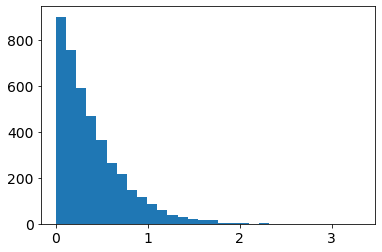

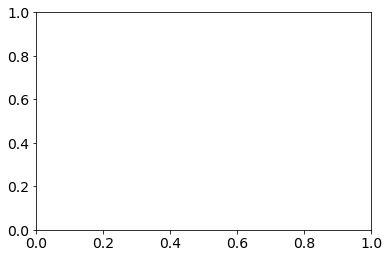

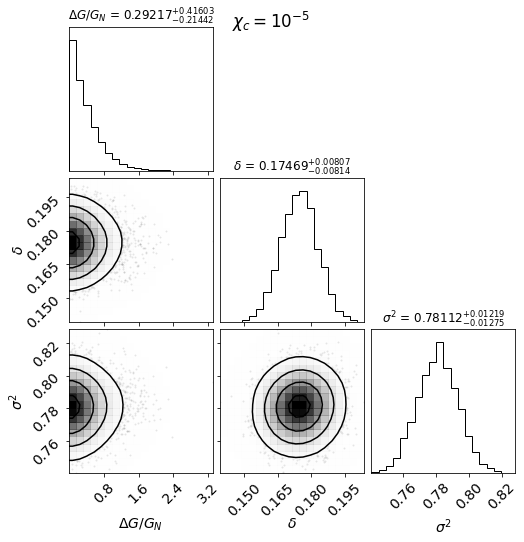

  1%|▍                                         | 10/918 [00:00<00:20, 45.21it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 6.302675099680493e-07
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 2.529679375730833e-07
10213-1902 [50] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 50.0 0.0 6.075445089211251e-07
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 2.0730363625571754e-07
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0 0.0 7.131956900439951e-07
10218-12703 [50] [335

  2%|▋                                         | 15/918 [00:00<00:23, 38.65it/s]

10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 5.502796089743874e-06
10224-9101 [50] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 50.0 0.0 2.448614573672652e-07
10226-12704 [50] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694, 0.4691, 0.2789, 0.37, 0.364, 0.3135, 0.363, 0.2811, 0.3307, 0.2727, 0.312, 0.3727, 0.1385, 0.4167, 0.2188, -0.3444, 0.1093]
10226-12704 50.0 0.0 3.3149996737565785e-07
10226-12705 [50] [1.0258, 2.2633, 2.7169, 2.4758, 1.8555, 1.7519, 1.2885, 0.9589, 1.0089, 1.1064, 1.1936, 2.223, 0.8528, 1.1417, 0.5417]
10226-12705 50.0 0.0 2.555056040302608e-06
10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 8.181337523910212e-06
10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851,

  3%|█▏                                        | 25/918 [00:00<00:21, 40.76it/s]

10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 1.1653884512227947e-06
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.0093, -0.0019, -0.047, -0.0973, -0.098, -0.0699]
10494-6101 50.0 0.0 2.58047294461938e-06
10494-9101 [50] [0.1044, 0.2038, 1.4077, 1.2615, 1.1423, 0.8831, 0.6532, 0.6062, 0.6272, 0.6614, 0.5401, 0.4995, 0.1142, 0.1337]
10494-9101 50.0 0.0 8.794502161889613e-07
10495-12704 [50] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 50.0 0.0 5.37625711112775e-06
10495-12705 [50] [871.1598, 1245.0304, 1205.1955, 1347.7893, 1374.3588, 1517.2635, 1622.8998, 1633.9971, 1757.8692

  4%|█▌                                        | 35/918 [00:00<00:21, 41.35it/s]

10499-12705 [50] [-0.9996, -0.9996, -0.9992, -0.9994, -0.9994, -0.9993, -0.9993, -0.9994, -0.9994, -0.9992, -0.999, -0.999, -0.9987]
10499-12705 50.0 0.0 5.526990524171695e-07
10499-3702 [50] [-0.3822, -0.1753, 0.3237, 0.6092, 0.8357, 0.9307, 1.1046, 1.1845, 1.1657, 1.064, 1.005, 1.0954, 0.7875, 0.8892, 0.9769, 1.0508, 1.3156, 1.2283]
10499-3702 50.0 0.0 3.1489922369948016e-07
10499-3703 [50] [-0.0563, -0.0436, 0.024, 0.1267, -0.0775, -0.0664, 0.0153, -0.0929, -0.1244, -0.0851, -0.0939, -0.1131, -0.1033, -0.048, 0.0474, 0.0456, 0.0289, -0.0666, -0.0844, -0.5663]
10499-3703 50.0 0.0 5.093440649768826e-07
10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 8.075466874481274e-07
10500-12704 [50] [140.7935, 35.4055, 16.1502, 8.7997, 6.1202, 5.6067, 5.0715, 4.9205, 5.0767, 4.6234, 4.2501, 4.0673, 3.8962, 3.8831, 3.7867, 3.6009, 3.0687, 4.1948, 2.9642, 3.5448, 1.9938, -0.2753, 2.8838, 5.8145]
10500-12704 50.0 0.0

  4%|█▊                                        | 40/918 [00:00<00:21, 40.24it/s]

10501-6101 [50] [54.152, 240.5257, 446.403, 593.882, 679.4829, 745.3089, 578.3118, 397.5307, 268.9797, 276.8619, 234.4717, 196.8602, 156.2454, 140.6324, 64.5922]
10501-6101 50.0 0.0 6.485889121690717e-07
10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 50.0 0.0 1.994322550497546e-07
10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 3.347200825819004e-07
10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 6.566873796361116e-06
10505-12704 [50] [0.6223, 0.447, 0.4087, 0.27, 0.0901, 0.1644, 0.1572, 0.3129, 0.3336, 0.3492, 0.2338, 0.2536, 0.1307, 0.2303, 0.2492, 0.6718, 0.9822, 1.3729, 3.1505, 2.3435]
10505-12704 50.0 0.0 5.5048771316100125e-06
10506-910

  5%|██▎                                       | 50/918 [00:01<00:24, 36.00it/s]

10509-12703 [50] [1226.9439, 2166.987, 2538.8741, 2127.6504, 1648.0951, 1358.0909, 1167.9374, 985.8138]
10509-12703 50.0 0.0 6.548933945088551e-07
10509-1901 [50] [88.4511, 296.1948, 449.6905, 409.1127, 761.2326, 574.7336, 678.7086, 604.9771, 571.2616, 614.5332, 408.9334, 441.3848, 355.292, 300.996, 243.919, 230.1612, 180.5992, 163.4382, 176.2701, 193.176, 205.4741]
10509-1901 50.0 0.0 1.5109741694153474e-07
10509-6101 [50] [414.6573, 159.5598, 352.8386, 670.9188, 930.199, 434.1238, 984.9702, 921.6235, 784.8291, 825.2006, 827.4197, 661.5592, 624.5693, 894.3523, 620.0269, 747.519, 623.1939, 701.341, 577.342, 1031.0135, 622.2157, 697.4912, 668.4888, 271.226]
10509-6101 50.0 0.0 4.919983088887619e-07
10511-12704 [50] [-0.0162, 0.2052, 0.0934, -0.0203, -0.0645, -0.0743, -0.1124, -0.1256, -0.1314, -0.1489, -0.145, -0.1344, -0.261, -0.3154, -0.4542, -0.3737, -0.3967, -0.387, 0.3583, -0.1418, -0.7705]
10511-12704 50.0 0.0 1.0610520529874028e-06
10511-12705 [50] [-0.2818, -0.0952, 0.2141, 0.21

  6%|██▍                                       | 54/918 [00:01<00:25, 34.20it/s]

10512-9102 [50] [4147.3152, 2927.8473, 3245.8656, 2878.0674, 2617.7881, 2204.6977, 1695.8151, 1371.2689, 1298.2413, 1241.1228, 1357.9116, 1330.7104, 1714.839, 1930.3755, 2196.7284, 2401.8011, 2844.302, 3122.8481, 2925.4465]
10512-9102 50.0 0.0 3.282288189084813e-07
10513-12702 [50] [-0.9916, -0.9877, -0.9855, -0.9802, -0.9787, -0.98, -0.9868, -0.9787, -0.862, -0.9802]
10513-12702 50.0 0.0 8.264272331549407e-07
10514-6103 [50] [0.5999, 0.3982, 0.2747, 0.2749, 0.0781, 0.0617, 0.0681, -0.0189, -0.0377, -0.0578, -0.065, -0.0594, 0.0253, -0.0317, 0.1182, -0.1428, -0.1895, -0.2508, -0.2991, -0.355]
10514-6103 50.0 0.0 2.3392419305015717e-07
10516-6104 [50] [0.3084, -0.237, -0.3593, -0.3575, -0.3434, -0.2974, -0.3603, -0.4386, -0.4629, -0.4919, -0.5092, -0.5031, -0.4319, -0.4152, -0.2877, -0.6618]
10516-6104 50.0 0.0 3.064550200930959e-07
10517-3704 [50] [6.5457, 4.9823, 4.7496, 3.3043, 2.1613, 1.6053, 1.1745, 0.9031, 0.7267, 0.8082, 0.6442, 0.6833, 0.6038, 0.6776, 0.66, 0.6521, 0.6265]
10517

  7%|██▊                                       | 62/918 [00:01<00:25, 33.67it/s]

10518-1902 [50] [-0.0105, 0.2572, 0.0495, 0.0308, 0.0287, -0.0677, -0.0841, -0.0885, -0.1994, -0.1432, -0.1195, -0.1634, -0.1173, -0.1219, -0.165, -0.1325, -0.1731]
10518-1902 50.0 0.0 8.644405480336128e-07
10518-6102 [50] [-0.217, 1.2282, 0.4062, 0.3459, 0.382, 0.1799, 0.1478, 0.1175, 0.0995, 0.1358, 0.0812, 0.048, 0.0452, 0.0639, 0.0875, 0.0309, 0.0337, 0.0007, -0.0113, -0.1383]
10518-6102 50.0 0.0 2.940450413207924e-07
10519-12704 [50] [-0.2611, 0.2686, 0.1702, 0.0601, 0.0584, 0.0258, -0.0515, -0.1077, -0.1123, -0.1006]
10519-12704 50.0 0.0 1.1304899868540334e-06
10519-6102 [50] [15.342, 9.7033, 5.6052, 3.8579, 2.785, 2.1688, 1.9416, 1.9483, 2.0544, 1.8028, 1.946, 2.1855, 2.046, 2.3544, 2.1616]
10519-6102 50.0 0.0 2.188535370739434e-06
10520-12704 [50] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.0366, 0.0275, -0.0135, 0.0213, 0.0998, -0.1048, -0.1309]
10520-12704 50.0 0.0 2.6336578306159953e-07
10520-6102 [50] [-0.9995, -0.9993, -0.9985, -0.9976, -0.9986, -0.

  8%|███▏                                      | 70/918 [00:01<00:25, 33.39it/s]

10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712, 0.035, -0.0115, 0.0248, -0.0288, 0.0512, -0.0187, 0.0073, 0.0432, -0.0916, -0.1233, -0.1818, -0.1471]
10839-3704 50.0 0.0 3.254940768947736e-07
10839-6101 [50] [244.3098, 615.0842, 876.8345, 1563.8627, 1705.1968, 1816.091, 1687.128, 1731.6052, 1640.9131, 1596.506, 1498.4971, 1406.0518, 671.6148, 995.7509]
10839-6101 50.0 0.0 3.0981626929033856e-07
10839-9101 [50] [2.1426, 2.2648, 0.9796, 0.8183, 0.5304, -0.0332, -0.1785, -0.3432, -0.3468, -0.4742, -0.4095, -0.6139, -0.5305, -0.616, -0.529, -0.5494, 0.8162, 3.2784]
10839-9101 50.0 0.0 6.032838092392944e-07
10841-12701 [50] [-0.7323, -0.6652, -0.4249, -0.3016, -0.2957, -0.3482, -0.374, -0.3905, -0.3944, -0.4309, -0.4302, -0.4504, -0.4708, -0.4257, -0.4725]
10841-12701 50.0 0.0 1.7673658538034655e-06
10842-3702 [50] [-0.5415, 0.0585, 0.2828, 0.1825, 0.1674, 0.1342, 0.1324, 0.2899]
10842-3702 50.0 0.0 4.063203369791342e-07
10842-3703 [50] [-0.6099, -0.8101, -0.8807, -0.9171, -0.9297, -0.9289

  8%|███▌                                      | 78/918 [00:02<00:26, 31.61it/s]

10845-12702 [50] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-12702 50.0 0.0 3.3014390204141794e-07
11004-12705 [50] [-0.8497, -0.6991, -0.5203, -0.3493, -0.2406, -0.2193, -0.1954, -0.1792, -0.1842, -0.1767, -0.1858, -0.1781, -0.195, -0.2173, -0.2294, -0.167, -0.2434, -0.1514, -0.3351, -0.2129]
11004-12705 50.0 0.0 6.480150016901916e-07
11004-3703 [50] [5607.0165, 6199.0745, 5122.0907, 4588.5334, 3798.1606, 3256.1827, 2909.7374, 2623.1995, 2081.3703, 1622.0266, 1252.6703, 1054.2993, 797.551, 805.4299, 667.6425]
11004-3703 50.0 0.0 1.9953418432162426e-07
11004-6104 [50] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 50.0 0.0 5.634172246569741e-07
11009-12704 [50] [-0.044, 0.5574, 0.4941, 0.5156, 0.452, 0.4031, 0.3736, 0.4191, 0.4646, 0.4848, 0.558, 0.4716, 0.2432, 0.3821, 0.6252, 0.8487, 0.8601]
11009-12704 50.0 0.0 6.7804437898635355e-06

  9%|███▉                                      | 87/918 [00:02<00:23, 36.10it/s]

11010-12705 [50] [-0.0199, 0.0369, -0.0512, -0.0961, -0.0616, -0.0525, -0.0667, -0.0148, -0.0176, -0.0486, -0.0929, -0.1237, -0.1411, -0.2784, -0.0549, -0.2411]
11010-12705 50.0 0.0 2.0698002258546766e-07
11010-6104 [50] [669.1593, 612.5725, 580.2933, 433.0387, 377.072, 315.1925, 269.3918, 266.5579, 267.4688, 253.2676, 240.0639, 221.1944, 344.4065]
11010-6104 50.0 0.0 1.1490563840872612e-06
11010-9101 [50] [2.5718, 0.9269, 0.2901, 0.1931, 0.0011, -0.0504, -0.0935, -0.075, 0.0093, 0.0203, 0.0025, -0.0251, -0.0362, 0.0004, 0.0161, -0.0012, -0.102, -0.364, -0.4377]
11010-9101 50.0 0.0 1.2166866701251225e-06
11011-12703 [50] [9.8651, 35.0102, 40.3579, 54.0601, 192.4013, 365.0512, 378.092, 411.2362, 282.7202, 230.5846, 329.2445, 263.6472, 244.1501]
11011-12703 50.0 0.0 4.48404435631959e-07
11012-12705 [50] [0.2329, 0.5509, 0.2517, 0.0195, 0.0174, -0.0704, -0.1937, -0.145, -0.249, -0.0592, -0.302, -0.1828, -0.2112]
11012-12705 50.0 0.0 3.9196352075497905e-06
11012-3702 [50] [7.8974, 3196.585

 10%|████▎                                     | 95/918 [00:02<00:23, 34.65it/s]

11013-3702 [50] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 50.0 0.0 4.980064641942226e-06
11013-6101 [50] [0.3389, -0.3422, -0.154, -0.2894, -0.4104, -0.4385, -0.4897, -0.4798, -0.43, -0.3971, -0.3753, -0.3775, -0.3376, -0.2419, -0.1243, 0.0068, -0.1557, 0.0318, -0.0178, 0.2532, 0.5345, 0.5099]
11013-6101 50.0 0.0 1.160575531333617e-06
11017-12703 [50] [0.0185, 0.3093, 0.3468, 0.2632, 0.2308, 0.2072, 0.1992, 0.215, 0.2444, 0.2273, 0.053, -0.0123, 0.1078, -0.0553]
11017-12703 50.0 0.0 3.955844940760529e-07
11017-12704 [50] [0.4751, 0.4487, 0.3988, 0.2586, 0.0625, -0.0537, -0.0751, -0.1094, -0.1157, -0.1027, -0.1141, -0.1182, -0.1126, -0.1047, -0.0836, -0.1961, -0.2389]
11017-12704 50.0 0.0 3.9567400598919506e-07
11017-6103 [50] [-0.3235, -0.3265, -0.3479, -0.2253, -0.2261, -0.1769, -0.1311, -0.1075, -0.0747, -0.0989, -0.1378, -0.1695, -0.1257, -0.174, -0.178, -0.0714, -0.0163, 0.0028, 0.2262, -0.2731]
11017-6103 50.0 0.0 7.723138088052901e-07
11017-9101 [50]

 11%|████▌                                     | 99/918 [00:02<00:24, 33.43it/s]

11018-12704 [50] [-0.9989, -0.9988, -0.9986, -0.9987, -0.9988, -0.999, -0.999, -0.9991, -0.9991, -0.9987, -0.9984, -0.9975, -0.9987, -0.9989]
11018-12704 50.0 0.0 6.824188585613904e-07
11018-3702 [50] [0.6083, 0.007, 0.0959, 0.33, 0.5514, 0.4356, 0.3654, 0.3085, 0.3057, 0.287, 0.3004]
11018-3702 50.0 0.0 5.256359858023754e-07
11018-3703 [50] [-0.5454, 0.4164, 0.6741, 0.5852, 0.6907, 0.7028, 0.6059, 0.5528, 0.656, 0.6306, 0.5445, 0.5549, 0.4676, 0.4329, 0.3355, 0.3242, 0.462, 1.051, 0.5129, 1.3094]
11018-3703 50.0 0.0 4.05563591193398e-07
11018-6102 [50] [69.1052, 130.9961, 113.1141, 109.1797, 92.5989, 91.6354, 88.5765, 83.9604, 80.137, 76.3564, 74.3146, 74.7218, 70.495, 71.7331, 65.8452, 64.9321, 72.2612]
11018-6102 50.0 0.0 1.5410773590721783e-06
11019-12702 [50] [0.0142, 0.2516, 0.1906, 0.1378, 0.0877, -0.003, 0.0993, 0.0958, 0.1065, 0.1232, 0.2086, 0.1132, 0.0357, -0.0115, -0.014, 0.0302, -0.0875, -0.1071]
11019-12702 50.0 0.0 4.2583814369389526e-07
11019-12703 [50] [-0.4993, -0.467

 12%|████▊                                    | 107/918 [00:03<00:26, 30.43it/s]

11019-3701 [50] [2.5964, 1.3616, 0.9142, 0.3658, 0.0143, -0.1157, -0.1148, -0.102, -0.0691, -0.1802, -0.166, -0.2893, -0.0849]
11019-3701 50.0 0.0 3.5779791049399266e-07
11021-1902 [50] [5.9017, 3.1432, 2.8491, 1.9605, 1.7177]
11021-1902 50.0 0.0 1.4441617895450768e-06
11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 2.0222083997148767e-06
11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 1.9103429940661406e-06
11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 3.455434062000894e-06
11742-12704 [50] [0.6702, -0.5312, -0.3481, 0.0047, 0.1348, 0.415, 0.2787, 0.5138, -0.0348]
1

 12%|████▉                                    | 111/918 [00:03<00:28, 28.35it/s]

11743-1901 [50] [-0.5717, -0.3943, -0.5273, -0.3736, -0.306, -0.392, -0.3766, -0.4151, -0.3665, -0.4111, -0.4236, -0.3424, -0.3877, -0.3594, -0.291, -0.4952, -0.6018]
11743-1901 50.0 0.0 3.0951977427981584e-06
11744-9102 [50] [-0.6298, 0.0464, 0.3943, 0.6247, 0.4097, 0.3518, 0.3414, 0.4046, 0.4742, 0.4313, 0.3693, 0.3275, 0.2214, 0.1278, 0.0812, 0.4043, 0.1792, -0.1336]
11744-9102 50.0 0.0 1.15382671465973e-06
11745-1902 [50] [1.185, 0.9719, 0.4625, 0.4231, 0.2188, 0.1795, 0.0428, 0.0263, -0.0784, -0.2371, 0.1632]
11745-1902 50.0 0.0 5.213958378491391e-07
11745-6104 [50] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.8527, 0.5703, 0.5078, 0.5176, 0.5143, 0.48, 0.4463, 0.4504, 0.4653, 0.4273, 0.4049]
11745-6104 50.0 0.0 1.4784485647065918e-06
11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.0361, -0.076, -0.0711, -0.1542, -0.2041, -0.2119, -0.1066, -0.2705, -0.3138]
11745-9101 50.0 0.0 3.6279371100571583e-07
11746-3703 [50] [-0

 13%|█████▎                                   | 118/918 [00:03<00:28, 27.59it/s]

11746-3704 [50] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 50.0 0.0 2.193022613715434e-07
11746-9102 [50] [-0.478, -0.2133, -0.2528, -0.1774, -0.2077, -0.2266, -0.2099, -0.2691, -0.1996, -0.2114, -0.1249, -0.1799, -0.1765, -0.1376, -0.2784, -0.2323, -0.1941, -0.3005, -0.2047, -0.3235, -0.1159, 0.1709]
11746-9102 50.0 0.0 3.1226246952399025e-06
11747-12702 [50] [-0.4876, -0.2412, -0.0165, -0.0887, -0.0931, -0.0756, -0.076, -0.0313, -0.0043, 0.0037, -0.0318, -0.1133, 0.1257, -0.1019, 0.1921, -0.2837, -0.0753]
11747-12702 50.0 0.0 9.304182705274551e-07
11749-12701 [50] [-0.6821, -0.1137, 0.255, 0.1029, 0.0811, -0.0849, -0.2182, -0.1487, -0.1095, -0.0437, -0.1285, -0.1939]
11749-12701 50.0 0.0 3.739109984936215e-07
11749-12704 [50] [1.1585, 1.0264, 1.2033, 1.4986, 1.8954, 2.0398, 2.1095, 2.1199, 1.4688, 1.3033, 0.9132, 0.8426, 0.0515, 0.4719, -0.3735]
11749-12704 50.0 0

 14%|█████▌                                   | 124/918 [00:03<00:29, 27.10it/s]

11750-12701 [50] [0.4224, 0.3089, 0.0791, 0.0892, 0.2329, 0.2222, 0.1114, 0.03, 0.0196, 0.0027, 0.0313, 0.0827, 0.0275, 0.3095]
11750-12701 50.0 0.0 4.4471241112769797e-07
11750-3701 [50] [1.5964, 1.8766, 1.9419, 1.999, 1.4725, 1.2873, 1.1333, 0.934, 0.9463, 0.8918, 0.7347, 0.8508, 0.6677, 0.4619, 0.3762, 0.1866, 0.0367, 0.0915, 0.0086, 0.4665]
11750-3701 50.0 0.0 3.9657702454085566e-07
11750-6103 [50] [6.303, 1.7001, 0.3933, 0.5417, 0.5248, 0.6298, 0.7207, 0.7282, 0.8046, 0.5691, 0.3659, 0.4083, 0.4745, 0.6207, 0.9957, 2.1073, 7.7724]
11750-6103 50.0 0.0 4.922944957081807e-07
11750-9101 [50] [13.4461, 9.2464, 8.3896, 5.4399, 4.9554, 3.0033, 3.1782, 2.4566, 2.5343, 2.0961, 2.3663, 2.3818, 2.4375, 3.0403, 2.3998, 2.3406, 2.9409, 6.8913, 8.6024]
11750-9101 50.0 0.0 2.554560014170211e-07
11751-1901 [50] [-0.9334, -0.8849, -0.9513, -0.9754, -0.9893, -0.9862, -0.989, -0.9902, -0.9893, -0.9909, -0.9903, -0.9906, -0.9888, -0.9874]
11751-1901 50.0 0.0 1.1260333414186007e-06
11751-6102 [50] [0.

 14%|█████▊                                   | 130/918 [00:03<00:30, 26.11it/s]

11753-3703 [50] [0.2801, 0.7604, 0.7391, 0.5795, 0.35, 0.1693, 0.0874, 0.0586, 0.0152, -0.0057, -0.0099, -0.0594, -0.1073, -0.139, -0.1496]
11753-3703 50.0 0.0 7.05776802743383e-07
11753-6104 [50] [1.7058, 1.5787, 1.7231, 1.492, 1.0043, 0.8699, 0.6579, 0.5905, 0.5042, 0.4712, 0.4504, 0.6153, 0.6589, 0.6817, 0.5206, 0.5457, 0.5195, 0.692]
11753-6104 50.0 0.0 4.921862082557768e-07
11754-1901 [50] [-0.2402, -0.5388, -0.5143, -0.4398, -0.487, -0.4664, -0.4721, -0.5334, -0.5004, -0.4954, -0.6115, -0.5884]
11754-1901 50.0 0.0 3.294669230741546e-07
11755-12701 [50] [-0.773, -0.7865, -0.7717, -0.7522, -0.7475, -0.7159, -0.7048, -0.6936, -0.7373, -0.7183, -0.7382, -0.7769, -0.6833, -0.7924, -0.5695, -0.681, -0.5512]
11755-12701 50.0 0.0 7.931445237473201e-07
11755-6101 [50] [-0.0093, 1.0489, 0.9853, 1.2444, 1.0667, 0.8902, 0.7008, 0.6245, 0.5835, 0.5179, 0.397, 0.4083, 0.4791, 0.2148, 0.053]
11755-6101 50.0 0.0 7.469410193408392e-07
11755-9102 [50] [0.1799, 0.2485, 0.3504, 0.383, 0.2088, 0.1465

 15%|██████                                   | 137/918 [00:04<00:26, 29.03it/s]

11758-3702 [50] [-0.544, -0.1141, 0.0167, 0.1028, 0.0854, -0.0041, -0.0149, 0.0406]
11758-3702 50.0 0.0 3.4002435072228426e-07
11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 50.0 0.0 9.856470581179124e-07
11759-6102 [50] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, -0.981]
11759-6102 50.0 0.0 2.3806154620221337e-07
11760-12703 [50] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0.539, 0.1155, 0.1223, 0.309]
11760-12703 50.0 0.0 3.3445750063176696e-07
11760-6101 [50] [0.4533, -0.0157, 0.5654, 0.502, 0.3995, 0.359, 0.3287, 0.2964, 0.2063, 0.2512, 0.2686, 0.2421, 0.2368, 0.1884, 0.0906, -0.0471, -0.3849, -0.319, -0.8166]
11760-6101 50.0 0.0 9.958370268063e-07
11760-6103 [50] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.211

 16%|██████▍                                  | 144/918 [00:04<00:26, 29.33it/s]

11760-9102 [50] [-0.8049, -0.6427, -0.2931, -0.1213, 0.1899, 0.0235, 0.108, 0.1381, 0.1732, 0.1865, 0.1624, 0.1963, 0.1218, 0.1215, 0.1223, 0.2636, 0.046, 0.5962, 0.1808, 0.9922, 2.2582]
11760-9102 50.0 0.0 1.8550608927949117e-07
11761-12702 [50] [-0.6826, -0.6017, -0.2216, -0.1122, -0.0329, -0.02, -0.0711, -0.0937, -0.0782, -0.098, -0.1546, -0.1024, -0.1043, -0.0648, -0.2102, -0.3314, -0.2483]
11761-12702 50.0 0.0 3.1040747423804475e-06
11761-12703 [50] [0.4093, 0.08, -0.0588, -0.0478, 0.0006, -0.0009, -0.0617, -0.1284, -0.1046, -0.1135, -0.1247, -0.1623, -0.2191, -0.3477]
11761-12703 50.0 0.0 3.527559355308139e-06
11761-12704 [50] [-0.1205, 0.9952, 0.5814, 0.2296, 0.1208, 0.126, 0.1222, 0.1041, 0.1683, 0.1996, 0.1448, 0.1188, 0.0574, 0.0394, -0.008, -0.026, -0.0331]
11761-12704 50.0 0.0 1.7452471601538172e-06
11761-12705 [50] [6.8127, 3.6941, 2.4845, 1.3644, 0.5363, 0.2844, 0.104, -0.1]
11761-12705 50.0 0.0 1.9619702601924752e-06
11823-9101 [50] [15949.1976, 8800.0053, 8323.3916, 481

 16%|██████▋                                  | 150/918 [00:04<00:26, 28.84it/s]

11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 5.717639112896977e-06
11828-12703 [50] [-0.5587, -0.2913, 0.1844, 0.3112, 0.2627, 0.2124, -0.0354, -0.0957, -0.1295, -0.1601, -0.0565, -0.1246, 0.0413]
11828-12703 50.0 0.0 8.468977518447678e-07
11830-12701 [50] [-0.9938, -0.9825, -0.9834, -0.9912, -0.9934, -0.9941, -0.9946, -0.9933, -0.9936, -0.9951, -0.9951, -0.9944, -0.9947, -0.9932, -0.9955, -0.9854, -0.997, -0.9939, -0.9962]
11830-12701 50.0 0.0 5.040097176278226e-07
11830-12703 [50] [-0.4776, 0.0437, 0.1582, -0.0709, -0.1607, -0.0754, 0.055, 0.2665, 0.1845, 0.03, 0.0663, -0.087, -0.2185, -0.1589, 0.0536, -0.3722]
11830-12703 50.0 0.0 2.122087806898165e-06
11830-3702 [50] [1.2195, 0.9978, 0.6546, 0.4726, 0.5057, 0.555, 0.4749, 0.3884, 0.4626]
11830-3702 50.0 0.0 6.395035210376602e-07
11830-6104 [50] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.0

 17%|██████▉                                  | 156/918 [00:04<00:26, 28.83it/s]

11831-12704 [50] [-0.5822, -0.2435, 0.0115, -0.0848, -0.1704, -0.028, -0.0888, -0.0323, -0.0445, -0.106, -0.3871, -0.1836]
11831-12704 50.0 0.0 9.11753963671525e-07
11831-6101 [50] [-0.9875, -0.994, -0.9968, -0.9973, -0.9967, -0.9975, -0.9969, -0.9978, -0.9979, -0.9971, -0.9984, -0.9986, -0.9985, -0.9974]
11831-6101 50.0 0.0 2.7322789736101763e-07
11831-6102 [50] [1.041, 0.6096, 0.4053, 0.165, 0.0902, 0.1922, 0.1873, 0.1187, 0.1055, 0.0085, -0.1108, -0.0737]
11831-6102 50.0 0.0 3.5064544367356856e-07
11833-9102 [50] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.2658, -0.2176, -0.1929, -0.2471, -0.3166]
11833-9102 50.0 0.0 5.629524324406273e-07
11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 9.58024708168255e

 18%|███████▎                                 | 163/918 [00:05<00:25, 29.52it/s]

11838-12701 [50] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 0.1336, 0.0903, 0.0213, -0.0554, -0.0342, 0.0225, 0.0053, -0.0272]
11838-12701 50.0 0.0 3.875846242873835e-07
11838-12703 [50] [144.9042, 254.2159, 538.0129, 911.0748, 1089.8377, 1111.2623, 1284.2649, 1228.3752, 1345.2496, 1400.7846, 1427.4787, 1434.5371, 1257.47, 1184.9615, 998.2342, 830.6266, 670.98, 596.3078, 488.5417, 423.536, 329.6538, 32.3109, 5.6457, 31.8479]
11838-12703 50.0 0.0 7.652922406314452e-07
11838-3702 [50] [0.536, 0.7094, 0.6061, 0.6555, 0.6466, 0.6204, 0.5689, 0.587, 0.6487, 0.6337, 0.5876, 0.5059, 0.4509, 0.4328, 0.3954, 0.396]
11838-3702 50.0 0.0 9.84293483782776e-07
11838-6103 [50] [201.1554, 531.7007, 967.9199, 1125.4471, 1324.9799, 1297.8083, 1279.6033, 1183.901, 1134.9301, 1132.4611, 1104.3121, 1011.7157, 1287.8266]
11838-6103 50.0 0.0 8.529008161669247e-07
11838-9101 [50] [11.4727, 10.3246, 9.7757, 7.6641, 6.3263, 7.7985, 4.6854, 6.1379, 3.8072, 5.5203, 3.0518, 3.9759, 1.4403, 2.8333, 2.6956, 2.5542]
11

 18%|███████▌                                 | 169/918 [00:05<00:26, 28.46it/s]

11865-1901 [50] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 50.0 0.0 7.76008699546001e-07
11865-1902 [50] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0.4429]
11865-1902 50.0 0.0 2.937278592028162e-07
11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 9.127027309301923e-07
11865-9102 [50] [-0.467, -0.4695, -0.4789, -0.5286, -0.6182, -0.6445, -0.6408, -0.6047, -0.6031, -0.6243, -0.655, -0.6895, -0.6998, -0.5904, -0.6729, -0.6983]
11865-9102 50.0 0.0 3.3347039964301257e-07
11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2771, 0.298, 0.3814, 0.3262, 0.2102, 0.3978, 0.4467, 0.2866, 0.1214, 0.2202, 0.1346, 0.4041]
11867-6104 50.0 0.0 1.8163868537579818e-06
11867-9101 [50] [0.9073, 0.3027, 0.1546, 0.1123, 0.0285, 0.0159, -0.0244, 0.0205, 0.0824, 0.1908, 0.2079, 0.2195, 0.3058, 0.2425, 0.1871, 0.3056]
11867-9101 50.0 0.0 5.558601752377837e-07


 19%|███████▊                                 | 176/918 [00:05<00:25, 28.72it/s]

11868-12703 [50] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 1.2377988361265821e-06
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 5.0443469536350796e-06
11871-6103 [50] [0.7182, 0.8575, 0.776, 0.4737, 0.2556, 0.1173, 0.1395, 0.111, 0.0842, 0.0381, 0.0003, -0.0281, -0.0195, -0.044, -0.0588, -0.2086, -0.132, -0.377]
11871-6103 50.0 0.0 3.056053831907429e-06
11940-1902 [50] [-0.0835, 0.1518, 0.1321, 0.0182, -0.0843, -0.1452, -0.1779, -0.1993, -0.1955]
11940-1902 50.0 0.0 1.80896948112824e-06
11940-3703 [50] [1.1615, 1.5645, 1.5154, 1.5213, 1.3625, 1.1856, 0.9977, 0.7191, 0.6591, 0.6153, 0.3767, 0.433, 0.6417, 0.1616, 0.444, 0.2018, 0.0806, 0.2143, 0.1328]
11940-3703 50.0 0.0 1.2008841699652241e-07
11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
1

 20%|████████▏                                | 182/918 [00:05<00:26, 27.64it/s]

11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 1.9275230047271245e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 3.2528538427668334e-05
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389.9946, 2439.1642, 2636.587, 2485.7262, 2056.7992, 1736.2622, 1623.5415, 1192.5228, 781.8483, 546.9719, 175.874]
11942-12704 50.0 0.0 3.6109512896491445e-06
11942-6104 [50] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 50.0 0.0 2.594806277924915e-07
11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.0425, -0.0331, -0.0546, -0.0982, -0.1371, -0.164, -0.179, -0.1863, -0.172, -0.1572, -0.1563, -0.1648, -0.1726, -0.27]
11943-3703 50.0 0.0 4.428055443254625e-06
11944-12701 [50] [-0

 20%|████████▍                                | 188/918 [00:05<00:26, 27.67it/s]

11945-12701 [50] [0.3961, 0.2879, 0.3765, 0.1557, -0.0002, -0.113, -0.1502, -0.128, -0.114, -0.1705, -0.0344, 0.0462, 0.017]
11945-12701 50.0 0.0 2.5391845681404026e-06
11945-6101 [50] [0.2057, 0.8606, 0.9637, 0.605, 0.4694, 0.2734, 0.2029, 0.1332, 0.0558, -0.0105, 0.0015, 0.0011, -0.0038, -0.016, 0.0504, -0.0338]
11945-6101 50.0 0.0 4.619145793039246e-06
11945-6102 [50] [3.5224, 2.2109, 1.4349, 1.0152, 0.7457, 0.4864, 0.2556, 0.1192, 0.0508, 0.0117, -0.0209, -0.0683, -0.158, -0.0976, -0.2012]
11945-6102 50.0 0.0 1.503556179846883e-06
11947-6103 [50] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 50.0 0.0 4.856995152189186e-07
11949-12701 [50] [1.1975, 0.3408, 0.1441, 0.1243, 0.0225, 0.0003, 0.0028, 0.027, 0.0197, 0.0192, -0.0295, -0.0839]
11949-12701 50.0 0.0 8.776215322169878e-07
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716,

 21%|████████▋                                | 195/918 [00:06<00:24, 29.87it/s]

11954-12704 [50] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453, 0.1801, 0.125, 0.0276, -0.0116, -0.0744, -0.134, -0.1626, -0.2559, -0.2802]
11954-12704 50.0 0.0 3.6553565902431104e-06
11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.2778]
11954-3703 50.0 0.0 5.467550965718972e-06
11954-9101 [50] [-0.9882, -0.9937, -0.9946, -0.9965, -0.9974, -0.9972, -0.997, -0.9969, -0.997, -0.9974, -0.9978, -0.9979, -0.9973, -0.9971, -0.9976, -0.9966]
11954-9101 50.0 0.0 4.4871237802891915e-06
11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 1.809155513266388e-06
11956-12702 [50] [5.6953, 5.0804, 3.2564, 2.1056, 1.2622, 0.6457, 0.4602, 0.5373, 0.9503, 3.7649, 5.1679]
11956-12702 50.0 0.0 1.1747469604518688e-06
11956-12705 [50] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 

 22%|████████▉                                | 201/918 [00:06<00:25, 28.33it/s]

11957-9101 [50] [127.5969, 337.5453, 692.0501, 754.6672, 761.8038, 673.5367, 561.8056, 470.5271, 446.8561, 434.7914, 434.701, 432.6297, 423.9362, 415.9254, 409.4146, 409.8788]
11957-9101 50.0 0.0 3.0012008446166186e-06
11957-9102 [50] [1.0969, 0.3397, 0.6198, 1.0919, 1.791, 2.069, 2.6145, 2.7123, 2.8073, 2.4726, 2.1945, 1.9756, 2.1362, 4.7679, 3.0873, 1.2673, 3.459, 16.3037, 15.1044]
11957-9102 50.0 0.0 7.432810661266869e-07
11958-6103 [50] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 50.0 0.0 2.3719421353379448e-07
11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 1.134488714417292e-06
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 50.0 0.0 2.6431767165177232e-06
11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.9

 23%|█████████▎                               | 208/918 [00:06<00:24, 29.21it/s]

11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.8986, 3.5843, 4.0724, 0.9129, 2.9875, 0.7205, 2.6408, 1.2362]
11969-6101 50.0 0.0 3.4865977053631766e-06
11970-12703 [50] [-0.4888, -0.3498, -0.0561, 0.1594, 0.1669, 0.133, 0.154, 0.1676, 0.144, 0.1071, 0.072, 0.0457, 0.046, 0.0501, 0.1262, -0.0083, 0.2366]
11970-12703 50.0 0.0 1.4746647530166417e-07
11970-6102 [50] [-0.0116, -0.0683, -0.0558, -0.0053, 0.0454, 0.025, 0.078, -0.0283, -0.085, -0.1052, -0.0602, -0.0272, -0.0693, -0.0116, -0.1378, -0.2799, -0.2497]
11970-6102 50.0 0.0 6.567646362744206e-07
11970-6103 [50] [0.7466, 1.1751, 1.6643, 1.3977, 1.0416, 0.8262, 0.6871, 0.5199, 0.4194, 0.3266, 0.2718, 0.2909, 0.2357, 0.2575, 0.2139, 0.0837, -0.0144, -0.0619, 0.133]
11970-6103 50.0 0.0 1.1306998641756013e-06
11974-12702 [50] [-0.5341, -0.4596, -0.3852, -0.2683, -0.2117, -0.2349, -0.22, -0.1969, -0.1731, -0.1829, -0.2133, -0.2538, -0.2357, -0.256, -0.1504, -0.1437, -0.1349, 1.11

 23%|█████████▌                               | 215/918 [00:06<00:24, 28.17it/s]

11975-3703 [50] [-0.2597, -0.0329, 0.0768, 0.0833, 0.1048, 0.0682, 0.0342, -0.0156, -0.0756, -0.093, -0.0695, -0.0466, 0.0656, -0.0085, 0.1237, 0.1334, 0.0646]
11975-3703 50.0 0.0 6.055455681844452e-07
11975-6104 [50] [1.0196, 1.2709, 1.5062, 1.1104, 0.9965, 0.7778, 0.776, 0.6311, 0.7603, 0.6278, 0.6208, 0.5151, 0.5172, 0.5343, 0.2326, 0.5012, 0.187, 0.4522, 0.1401, 0.1327]
11975-6104 50.0 0.0 6.894104625328678e-07
11976-12703 [50] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 50.0 0.0 6.242440333942231e-07
11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 50.0 0.0 5.131664911745178e-07
11978-12705 [50] [0.0184, 0.0968, 0.695, 0.4819, 0.223, 0.1168, 0.1458, 0.1604, 0.1304, 0.1363, 0.1451, 0.1188, 0.0734, 0.0413, 0.0374, 0.0059, 0.0584, 0.0708]
11978-12705 50.0 0.0 6.91106583357336e-07


 24%|█████████▉                               | 222/918 [00:07<00:23, 29.04it/s]

11978-6101 [50] [0.1703, 0.2916, 0.2201, 0.1105, 0.137, 0.0651, 0.0262, 0.0439, 0.1227, 0.0551, 0.0171, -0.0525, -0.106, -0.2018, -0.2281, -0.1584, -0.2752, -0.3694, -0.5359, -0.6656, -0.8099]
11978-6101 50.0 0.0 7.632659174246593e-07
11979-12703 [50] [0.3188, 0.2646, 0.4444, 0.4735, 0.4231, 0.2818, 0.2037, 0.1891, 0.1975, 0.1625, 0.205, 0.2447, 0.1501, 0.1763, 0.1339, 0.4567, 0.4255, 0.53]
11979-12703 50.0 0.0 6.198327938799997e-06
11979-12704 [50] [1.0417, 0.8488, 0.6206, 0.5652, 0.598, 0.4342, 0.2822, 0.1334, 0.0604, 0.0319, 0.0291, -0.01, -0.083, -0.0554, -0.0215, -0.0081, 0.0344]
11979-12704 50.0 0.0 2.5890770197482105e-07
11979-9101 [50] [0.4094, -0.1099, -0.2651, -0.4134, -0.4241, -0.4727, -0.5, -0.5199, -0.5395, -0.5666, -0.5927, -0.5903, -0.6162, -0.591, -0.6704, -0.611]
11979-9101 50.0 0.0 6.100449832188317e-07
11979-9102 [50] [0.6334, -0.323, -0.1351, -0.0857, 0.0053, 0.0302, 0.0467, 0.0752, 0.0566, 0.0459, 0.0116, 0.0269, 0.0046, -0.0156, -0.091, -0.1558, -0.3105, -0.4242, 

 25%|██████████                               | 226/918 [00:07<00:22, 30.37it/s]

11981-9102 [50] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188, -0.1444, -0.128, -0.1812, -0.1904, -0.2284, -0.2044, -0.2061, -0.1486, -0.2345, -0.2114, 0.0329, 0.7603]
11981-9102 50.0 0.0 6.167479860443032e-07
11982-12704 [50] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.1555, 0.0797, -0.029, 0.0037, 0.2331]
11982-12704 50.0 0.0 7.808841718932511e-07
11982-3703 [50] [-0.314, 0.4086, 0.6273, 0.7714, 0.9457, 0.986, 1.0945, 1.392, 1.3945, 1.539, 1.4145, 1.0397, 1.0282, 0.5616, 0.557, 0.0557]
11982-3703 50.0 0.0 1.832783262085353e-07
11982-6102 [50] [0.7786, 0.4297, 0.4569, 0.7506, 0.7926, 0.6732, 0.6507, 0.5035, 0.3848, 0.2963, 0.4923, 0.064, 0.2848, -0.0122, 0.3417, -0.0773, -0.7924]
11982-6102 50.0 0.0 1.2944523253218598e-07
11982-9102 [50] [-0.6167, -0.1298, 0.3235, 1.2078, 1.1438, 0.8069, 0.6394, 0.4963, 0.4228, 0.3252, 0.3069, 0.2838, 0.3393, 0.4905, 0.4567, 0.2311]
11982-9102 50.0 0.0 1.439350490060989e-06

 25%|██████████▍                              | 234/918 [00:07<00:22, 30.38it/s]

12066-3701 [50] [19.2418, 16.9197, 10.1428, 6.0915, 4.4316, 3.0783, 2.9929, 2.3906, 2.7183, 2.8356, 3.2869, 3.669, 3.475, 3.6088, 2.499, 1.7084, 1.9485, 1.5899]
12066-3701 50.0 0.0 9.935491130710657e-07
12067-12703 [50] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
12067-12703 50.0 0.0 4.527543482836921e-07
12067-12705 [50] [0.4291, 1.3434, 2.0219, 1.7622, 1.0305, 0.7583, 0.4763, 0.1261, 0.0511, 0.0662, 0.1502, 0.2361, 0.2324, 0.212, 0.3434]
12067-12705 50.0 0.0 8.219995125476663e-07
12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 3.607356550237056e-05
12068-6104 [50] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 50.0 0.0 1.7076717344677466e-06
12069-12704 [50] [

 26%|██████████▋                              | 238/918 [00:07<00:25, 26.68it/s]

12069-12705 [50] [1.7332, 1.137, 0.4096, 0.6564, 0.5837, 0.6168, 0.2246, 0.0587, 0.2617, 0.1538, 0.5607, 0.4132, 0.5307, 0.41, 2.8782]
12069-12705 50.0 0.0 8.384184177471856e-07
12069-6102 [50] [-0.3102, -0.0764, -0.2402, -0.1833, -0.1952, -0.2158, -0.2095, -0.1861, -0.144, -0.1353, -0.1037, -0.1026, -0.0816, -0.0956, -0.1367, -0.1477, -0.0871, -0.0667, -0.0387, -0.58, -0.56, -0.5359, -0.8946, 0.038]
12069-6102 50.0 0.0 7.951783002166893e-07
12071-12701 [50] [-0.9172, -0.8384, -0.6786, -0.6994, -0.7429, -0.7686, -0.7662, -0.8217, -0.8275, -0.8401, -0.7831, -0.8143]
12071-12701 50.0 0.0 8.572499333081818e-07
12071-1901 [50] [-0.148, -0.1411, -0.1881, -0.1802, -0.1874, -0.1463, -0.1611, -0.1934, -0.1236, -0.1115, 0.0697, 0.0471, 0.1047, 0.171, 0.9648]
12071-1901 50.0 0.0 6.958610370938135e-07
12071-3702 [50] [43.1041, 1833.3653, 2193.0557, 2409.7616, 2285.0769, 1925.6484, 1966.7994, 2043.2628, 1997.8474, 1832.4832, 1658.3071, 1528.5931, 1298.5116, 1014.8264, 552.6982, 136.4828]
12071-370

 27%|██████████▉                              | 244/918 [00:07<00:25, 26.62it/s]

12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.3083, 398.9949, 258.1108, 178.8144, 146.4641, 210.3609, 51.4796, 32.8354, 22.052]
12071-3704 50.0 0.0 9.082890949135336e-07
12075-12704 [50] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 50.0 0.0 4.009358400521462e-06
12078-12703 [50] [0.3298, 0.5608, 0.2182, 0.3221, 0.2303, 0.0896, 0.0846, 0.2051, 0.3186, 0.33, 0.2532]
12078-12703 50.0 0.0 1.0635396609074634e-06
12078-6103 [50] [1.9637, 5.3953, 4.122, 4.276, 4.2033, 3.4926, 3.3028, 3.2038, 3.1762, 3.0769, 2.868, 2.5911, 2.6527, 2.4952, 2.6226, 2.6979, 2.1328, 1.6158, 1.3218, 1.8508]
12078-6103 50.0 0.0 7.373717414963273e-07
12079-12705 [50] [5.9457, 5.134, 4.915, 2.376, 2.7696, 2.3345, 1.3415, 1.441, 1.4148, 0.8317, 1.0553, 1.0687, 0.9662, 0.8766, 1.1537, 1.4538, 0.8336]
12079-12705 50.0 0.0 2.3407161952612856e-07
12080-12704 [50] [798.4646, 1129.8436, 1685.7177, 1551.5379,

 27%|███████████▏                             | 251/918 [00:08<00:23, 28.26it/s]

12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 8.724992855352234e-06
12082-12702 [50] [52.4225, 34.225, 22.353, 15.87, 12.6473, 9.0293, 9.0994, 7.7946, 7.7752, 7.6215, 7.2913, 5.8669, 7.5773, 10.9051, 27.4723, 42.4809, 31.8612, 44.26]
12082-12702 50.0 0.0 1.457047499745537e-06
12084-12702 [50] [0.4179, 1.0492, 0.9255, 0.717, 0.5874, 0.4344, 0.359, 0.2445, 0.1712, 0.1342, 0.2131, 0.2682, 0.3105, 0.3163]
12084-12702 50.0 0.0 3.551304813424463e-06
12084-12704 [50] [-0.663, -0.3425, -0.4511, -0.3814, -0.1944, -0.0031, -0.041, -0.1276, -0.2047, -0.2499, -0.2565, -0.1988, -0.1657, -0.268, -0.3391, -0.2896]
12084-12704 50.0 0.0 4.005275185680499e-06
12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-12705 50.0 0.0 4.1356824981478425e-07
12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.

 28%|███████████▍                             | 257/918 [00:08<00:26, 24.62it/s]

12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
12084-3702 50.0 0.0 5.728043401891911e-07
12084-3703 [50] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.866, 9.9199, 8.0438, 7.1191, 7.1184, 4.9585, 5.2578]
12084-3703 50.0 0.0 9.635539586590482e-07
12084-6104 [50] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.0374, 0.0776, -0.025, -0.0223, -0.0093, -0.0487, 0.0214, -0.2045, 0.0836]
12084-6104 50.0 0.0 7.3138724128493e-07
12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0.0071, -0.0873, -0.0572, 0.0209, 0.0881, 0.0588, 0.0753, 0.0542]
12085-12704 50.0 0.0 1.1093931755971846e-05
12085-6101 [50] [-0.1417, -0.3914, -0.1738, -0.0755, -0.0973, -0.0439, -0.1113, -0.1774, -0.1947, -0.1728, -0.1408, -0.1367, -0.1146, -0.1045, -0.1506, -0.0235, -0.0308, -0.05

 28%|███████████▌                             | 260/918 [00:08<00:25, 25.35it/s]

12085-6103 [50] [-0.549, -0.354, -0.3619, -0.3336, -0.3191, -0.1878, -0.2268, -0.2779, -0.144, -0.2236, -0.1423, -0.1582, -0.1565, -0.2223, -0.1937, -0.2795, -0.2396, -0.2355, -0.213, -0.3557, -0.311]
12085-6103 50.0 0.0 3.376809337093553e-07
12085-9102 [50] [0.6086, 0.5632, 0.3343, 0.2119, 0.1282, 0.0402, 0.0288, 0.0478, 0.0313, 0.001, -0.0532, -0.0537, -0.0634, -0.0662, -0.1794, -0.1779, -0.239]
12085-9102 50.0 0.0 9.858941507979052e-07
12088-12705 [50] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-12705 50.0 0.0 5.766937171897989e-07
12088-9101 [50] [1.3886, 1.0744, 0.6164, 0.1772, -0.0928, -0.1728, -0.2424, -0.3552, -0.3861, -0.4243, -0.4358, -0.4341, -0.4454, -0.4408]
12088-9101 50.0 0.0 6.293436578583361e-07
12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-1270

 29%|███████████▉                             | 266/918 [00:08<00:28, 23.11it/s]

12089-1901 [50] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 50.0 0.0 6.263631795302145e-06
12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722, -0.1642, -0.1028, -0.1287, -0.1434, -0.0908, -0.1289, -0.1084, -0.2404, -0.097, 0.1709, -0.3201, -0.0196, -0.302]
12089-6103 50.0 0.0 1.1869966410647697e-06
12092-6101 [50] [0.0026, 0.3918, 0.1405, 0.0977, 0.005, 0.0277, 0.1281, 0.0885, 0.0628, 0.0291, -0.0173, -0.1181]
12092-6101 50.0 0.0 9.72541225729128e-07
12093-9101 [50] [-0.9989, -0.997, -0.9973, -0.998, -0.9985, -0.9987, -0.9987, -0.9986, -0.9986, -0.9987, -0.9983, -0.9981, -0.9979, -0.9991, -0.9971]
12093-9101 50.0 0.0 1.4671766614229882e-06


 30%|████████████▏                            | 272/918 [00:09<00:29, 22.02it/s]

12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 40.9064, 40.0677, 39.5836, 40.4106, 39.3101, 37.4365, 38.9587, 41.7447, 41.525, 40.104, 39.0721, 39.6893, 56.2685, 25.7726, 27.1981, 33.78]
12094-3701 50.0 0.0 1.1157742898761476e-06
12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 1.5092568303863144e-06
12483-12703 [50] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -0.0898]
12483-12703 50.0 0.0 1.2795508510334962e-06
12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 4.0122889339786054e-07
12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 6.165083030639546e-07


 30%|████████████▎                            | 275/918 [00:09<00:30, 21.39it/s]

12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 50.0 0.0 7.779077352730429e-07
12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696, 2047.2799, 2334.4928, 2266.757, 2196.3005, 1862.0235, 1612.2288, 2078.9089]
12488-6102 50.0 0.0 1.1917361132617003e-06
12488-9101 [50] [0.89, -0.0571, 0.0018, 0.0675, 0.0814, 0.1021, 0.1178, 0.0708, 0.0758, 0.1268, 0.0533, 0.0597, 0.0532, 0.0414, 0.1038, 0.0181, -0.1356, -0.2319, -0.1377]
12488-9101 50.0 0.0 2.0286109248569248e-06
12489-3703 [50] [6.1258, 7.3921, 7.9142, 7.3592, 6.7186, 6.0984, 5.5884, 5.3024, 5.0796, 4.2963, 4.3283, 3.7505, 4.11, 3.5385, 4.098]
12489-3703 50.0 0.0 7.994294811186958e-07
12490-3701 [50] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-370

 31%|████████████▌                            | 281/918 [00:09<00:27, 23.18it/s]

12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0.0863]
12506-12701 50.0 0.0 5.867133362074478e-06
12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0.0 5.203963118848803e-07
12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0 0.0 5.983836795867522e-07
12512-12702 [50] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 50.0 0.0 3.3550973810426274e-07
12514-12702 [50] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 50.0 0.0 4

 31%|████████████▉                            | 289/918 [00:09<00:22, 27.58it/s]

12518-12705 [50] [-0.8683, -0.7393, -0.3648, -0.0579, -0.0274, -0.0334, -0.0145, 0.016, -0.0154, 0.0703, -0.1575, 0.0272]
12518-12705 50.0 0.0 5.733000768616281e-07
12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 0.0 2.3367745281813727e-07
12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.1091]
12518-9101 50.0 0.0 7.154367913683688e-07
12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 1.8701926247938806e-06
12620-6104 [50] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 50.0 0.0 1.306275886607135e-07
12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457,

 32%|█████████████▏                           | 295/918 [00:09<00:24, 25.71it/s]

12621-6103 [50] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 50.0 0.0 2.648237676608124e-07
12622-9101 [50] [0.295, -0.1664, 0.1745, 0.5326, 0.7376, 0.7334, 0.6499, 0.6151, 0.5534, 0.5303, 0.427, 0.3612, 0.3993, 0.3837, 0.4878, 0.4757, 0.3843, 0.0845]
12622-9101 50.0 0.0 1.303219320934989e-06
12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 1.501256739268478e-06
12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 4.870876182929131e-06
12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 1.3234894995604263e-06


 33%|█████████████▍                           | 301/918 [00:10<00:25, 24.00it/s]

12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 1.480124372487206e-06
12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 2.438422965829972e-06
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 3.032078563418811e-06
12679-12701 [50] [-0.4106, -0.1602, -0.09, 0.0292, -0.1142, -0.1585, -0.1702, -0.2231, -0.1617, -0.1473, -0.165, -0.0765, -0.2919, -0.3168, -0.5268, -0.1813, 0.1098, -0.9954]
12679-12701 50.0 0.0 2.4071592346627537e-07
12679-1902 [50] [0.6115, 0.2127, 0.2343, 0.0811, 0.186, 0.028, 0.0072, -0.086, -0.1377, -0.1341, -0.1745, -0.1741, -0.1973, -0.2294, -0.2344, -0.1462, -0.1584]
12679-1902 50.0 0.0 7.6313

 33%|█████████████▌                           | 304/918 [00:10<00:26, 23.61it/s]

12682-12705 [50] [211.5682, 164.2949, 154.5208, 172.1809, 188.4287, 205.8053, 188.0827, 175.7022, 171.521, 162.4793, 163.9925, 122.1814, 128.2861, 178.1773, 150.2355, 110.4372, 181.1071]
12682-12705 50.0 0.0 1.4394531684750835e-06
7443-12703 [50] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 50.0 0.0 6.370704043068604e-07
7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1547, -0.1713, -0.2761, -0.2934, -0.2123]
7443-12704 50.0 0.0 3.6750440583433777e-06
7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 2.7062733447014696e-07
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.

 34%|█████████████▊                           | 310/918 [00:10<00:25, 23.93it/s]

7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.1269]
7495-12702 50.0 0.0 2.324544422226121e-06
7495-12703 [50] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 50.0 0.0 6.475624089747564e-07
7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 2.0601855180542656e-06
7815-12705 [50] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 50.0 0.0 2.930344430472979e-07
7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 1.885042125778408e-07


 34%|██████████████                           | 316/918 [00:10<00:26, 23.03it/s]

7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 4.3378379110127327e-07
7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 2.3718179418371947e-06
7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 4.1990377593768927e-07
7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 8.900398461737774e-07
7958-6101 [50] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 50.0 0.0 2.314328587712137e-07


 35%|██████████████▏                          | 319/918 [00:11<00:26, 22.51it/s]

7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 1.2031909038942357e-06
7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 3.493771276327393e-06
7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 1.633687853232318e-06
7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 2.4068948629175544e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 4.519897643543798e-06


 35%|██████████████▌                          | 325/918 [00:11<00:28, 20.88it/s]

7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 2.376483044063236e-06
7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 2.2924673023064057e-07
7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 1.1732901373022436e-06
7961-12705 [50] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 50.0 0.0 1.359163333673049e-06


 36%|██████████████▋                          | 328/918 [00:11<00:28, 20.96it/s]

7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.0 4.183526362134654e-07
7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 1.2940919927543046e-06
7962-12705 [50] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 0.4867, 0.496, 1.2096, 1.0729, 0.2753, 1.3845, 3.2136]
7962-12705 50.0 0.0 3.3700998622086223e-07
7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 50.0 0.0 2.547197735717447e-07
7963-12702 [50] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, 

 36%|██████████████▉                          | 334/918 [00:11<00:28, 20.18it/s]

7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 50.0 0.0 1.4772002755833296e-06
7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]
7963-9102 50.0 0.0 2.116171835555548e-07
7964-6101 [50] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119, 231.394, 254.6415]
7964-6101 50.0 0.0 3.5409883670127423e-07
7964-9102 [50] [1.3184, 2.0432, 2.1685, 1.6268, 1.1481, 0.9036, 0.7405, 0.65, 0.5829, 0.509, 0.4898, 0.4008, 0.3018, 0.164, 0.0815, 0.0631, 0.0748, -0.1094, 0.1287]
7964-9102 50.0 0.0 1.4659750198187845e-06
7965-12701 [50] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085, -0.0802, -0.1254, -0.0438, 0.

 37%|███████████████▏                         | 340/918 [00:12<00:27, 21.15it/s]

7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-1901 50.0 0.0 2.0326432868137248e-07
7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 50.0 0.0 2.8074193568552286e-07
7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211.5514, 236.7821, 394.8881, 237.9732]
7965-6102 50.0 0.0 3.9431236857593095e-07
7965-9102 [50] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 50.0 0.0 5.939968063718098e-07
7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 8.779551890025634e-07


 37%|███████████████▎                         | 343/918 [00:12<00:27, 20.54it/s]

7968-3701 [50] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 50.0 0.0 1.5744845015042731e-06
7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 6.625194306990737e-07
7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 3.771776670929653e-07
7975-9102 [50] [-0.4649, 0.0396, 0.5148, 0.8957, 0.7258, 0.6065, 0.5756, 0.5119, 0.3508, 0.2963, 0.2474, 0.347, 0.3968, 0.5053, 0.5166, 0.5241, 0.6047, 0.5302, 0.4626]
7975-9102 50.0 0.0 2.132352796192611e-07


 38%|███████████████▍                         | 346/918 [00:12<00:28, 20.08it/s]

7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 1.5481097291951383e-06
7977-1902 [50] [0.1072, 0.2856, 0.0387, 0.0618, 0.0363, 0.0042, -0.0291, -0.0297]
7977-1902 50.0 0.0 2.770909681023065e-07
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 9.409814455261593e-07
7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 1.25478774942232e-06
7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 3.0815492279159454e-06


 38%|███████████████▊                         | 353/918 [00:12<00:29, 19.22it/s]

7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 3.7916214369251773e-06
7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 50.0 0.0 4.463176996227504e-07
7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 3.070649877365655e-06
7990-6104 [50] [-0.3051, -0.0723, 0.2152, 0.3465, 0.313, 0.5262, 0.4361, 0.3236, 0.3249, 0.3219, 0.2532, 0.2184, 0.247, 0.3244, 0.1338, 0.4143, 0.0484]
7990-6104 50.0 0.0 8.409702644213217e-07


 39%|███████████████▉                         | 357/918 [00:12<00:29, 18.87it/s]

7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 9.655480031031274e-07
7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 50.0 0.0 9.964386622393151e-07
7992-6104 [50] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 50.0 0.0 4.2727958190285767e-07
7993-3704 [50] [0.1426, 0.6478, 0.7852, 0.7203, 0.4452, 0.3539, 0.3376, 0.3307, 0.3891, 0.4022, 0.3636, 0.3593, 0.2903, 0.2711, 0.3491, 0.3594]
7993-3704 50.0 0.0 1.8553558588684406e-07


 39%|████████████████                         | 361/918 [00:13<00:29, 18.65it/s]

8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 50.0 0.0 1.0442410940155925e-06
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 1.5607876860445708e-06
8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 2.162472583244876e-06
8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 1.2353692017474334e-06


 40%|████████████████▎                        | 365/918 [00:13<00:30, 18.40it/s]

8078-12703 [50] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 2.773158037643076e-06
8078-6103 [50] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149, 0.1969, 0.1396, 0.1246, 0.1262, 0.1162, 0.0747, 0.0502, 0.0254, 0.0225, 0.0724, 0.0304, 0.0506, 0.0715]
8078-6103 50.0 0.0 3.0106111102299587e-06
8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 2.5043374037511833e-06
8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 6.159111977822029e-07


 40%|████████████████▍                        | 367/918 [00:13<00:30, 18.24it/s]

8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 1.6689911354217019e-06
8081-3704 [50] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 50.0 0.0 3.120404603932048e-07
8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 5.064598359747253e-07
8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81, 2355.4256, 1939.6384]
8083-12703 50.0 0.0 2.646023213965688e-06


 41%|████████████████▋                        | 373/918 [00:13<00:30, 17.72it/s]

8083-12704 [50] [0.2913, 0.5243, 0.3002, 0.1297, 0.1194, 0.1533, 0.1494, 0.1802, 0.1606, 0.0654, 0.1299]
8083-12704 50.0 0.0 1.3302551838646126e-06
8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 2.096400332925146e-06
8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 5.730526167445083e-07
8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 5.478837756910464e-07


 41%|████████████████▊                        | 377/918 [00:14<00:30, 17.79it/s]

8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 1.918010675097764e-06
8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 50.0 0.0 4.167440423514304e-07
8088-12705 [50] [-0.3463, 0.227, 0.3794, 0.8027, 0.7079, 0.6652, 0.4965, 0.2205, 0.0843, 0.0719, 0.1789, 0.1537, -0.3721, 0.0321]
8088-12705 50.0 0.0 1.3373192312479898e-07
8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 1.0052636525589035e-06


 42%|█████████████████                        | 381/918 [00:14<00:30, 17.53it/s]

8091-1902 [50] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747, -0.384]
8091-1902 50.0 0.0 2.0345468738545224e-07
8092-12702 [50] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 50.0 0.0 2.869009128042609e-07
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 50.0 0.0 1.0294996658668772e-06
8095-6102 [50] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276, 0.127, 0.1403, 0.0994, 0.0731, 0.0391, -0.0442, -0.086, -0.1131, -0.1728, -0.221, -0.1357, -0.3768, -0.0266, -0.186, -0.3752]
8095-6102 50.0 0.0 2.1611775624293563e-07


 42%|█████████████████▏                       | 385/918 [00:14<00:30, 17.58it/s]

8131-6101 [50] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.3082, -0.2951, -0.2734, -0.3441, -0.2421, -0.3611, -0.4068, -0.6194, -0.4921, -0.1798, -0.4715, -0.5173, -0.3887]
8131-6101 50.0 0.0 2.936791672350741e-07
8131-9101 [50] [-0.2303, -0.2933, -0.4207, -0.0503, 0.2317, 0.5105, 0.546, -0.1014, -0.1852, -0.0457, 0.0346, 0.33, -0.5646, -0.6862, 0.939]
8131-9101 50.0 0.0 2.2951797841146387e-06
8132-12702 [50] [-0.0491, -0.065, 0.2143, 0.0833, 0.0546, -0.0096, -0.0149, 0.021, -0.0837, 0.1062]
8132-12702 50.0 0.0 1.1648543879855117e-06
8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.147210633998661e-05


 42%|█████████████████▎                       | 387/918 [00:14<00:30, 17.42it/s]

8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 1.2619332979587063e-06
8134-6103 [50] [-0.9997, -0.9993, -0.9996, -0.9996, -0.9995, -0.9994, -0.9992, -0.999, -0.9989, -0.9988, -0.9985, -0.9984, -0.9986, -0.9988, -0.9991, -0.9993, -0.9988, -0.9979, -0.9983]
8134-6103 50.0 0.0 1.234654518082533e-07
8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 9.132416499210937e-07
8135-12702 [50] [-0.0587, -0.0535, 0.1564, 0.1223, 0.0981, 0.0594, 0.0486, 0.0064, 0.0544, 0.0081, -0.0341, -0.0178, 0.0479, -0.1192, 0.2429, -0.0574, -0.0315, -0.2763]
8135-12702 50.0 0.0 1.4424047702698068e-07


 43%|█████████████████▍                       | 391/918 [00:14<00:31, 16.98it/s]

8137-12703 [50] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1275, -0.1695, -0.3013, -0.3381]
8137-12703 50.0 0.0 2.77185635357764e-07
8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 50.0 0.0 1.3861147660016044e-06
8138-12702 [50] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 50.0 0.0 8.635204956483524e-07
8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 8.080837807108041e-07


 43%|█████████████████▋                       | 395/918 [00:15<00:31, 16.68it/s]

8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 2.1691683545650954e-07
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 2.2446170630566502e-06
8140-3701 [50] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 50.0 0.0 2.4064995233852107e-07
8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 2.7936513831323785e-06


 43%|█████████████████▊                       | 399/918 [00:15<00:30, 17.09it/s]

8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 9.800555220141954e-07
8144-12702 [50] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 50.0 0.0 1.8127014827814502e-07
8144-12703 [50] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 50.0 0.0 8.7206321971651e-07
8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 2.091341376912272e-06


 44%|█████████████████▉                       | 403/918 [00:15<00:30, 16.65it/s]

8144-6101 [50] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271, 0.0969, 0.0527, 0.3307, 0.4308, 0.3921, 0.1682, -0.0968]
8144-6101 50.0 0.0 1.2158276338747413e-07
8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 3.040843434695323e-06
8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 4.2964816372545073e-07
8145-9101 [50] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 50.0 0.0 3.2854675341471e-07


 44%|██████████████████▏                      | 407/918 [00:15<00:33, 15.47it/s]

8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 3.0722438957726845e-05
8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 2.928974293096333e-06
8146-9102 [50] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 50.0 0.0 1.6969426300057462e-07


 45%|██████████████████▎                      | 411/918 [00:16<00:33, 15.09it/s]

8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 1.4542855201112281e-06
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 3.2261355437157986e-05
8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 1.5213068823215197e-06
8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 7.113851579480105e-07


 45%|██████████████████▌                      | 415/918 [00:16<00:33, 14.83it/s]

8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 8.34635302342837e-07
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 4.3110248871181576e-05
8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 4.804471593993487e-07
8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 5.703652527842694e-07


 46%|██████████████████▊                      | 420/918 [00:16<00:29, 16.82it/s]

8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 1.1889222645016598e-06
8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 7.990973123843128e-07
8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 50.0 0.0 1.6918700013956726e-06
8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 4.154510012791666e-07
8156-3701 [50] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 50.0 0.0 6.769242305862636e-07


 46%|██████████████████▊                      | 422/918 [00:16<00:28, 17.56it/s]

8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 3.454045148367228e-06


 46%|██████████████████▉                      | 424/918 [00:17<00:49,  9.96it/s]

8158-6104 [50] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 50.0 0.0 3.0309178820394184e-07
8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 1.0511811392868025e-06
8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 5.403615764220871e-07
8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 1.8455047613475315e-07


 47%|███████████████████                      | 428/918 [00:17<00:40, 12.16it/s]

8241-6102 [50] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 50.0 0.0 3.1590271614235e-07
8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 4.1314795744800976e-05
8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 4.886261212312394e-07
8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 8.327383008540565e-07


 47%|███████████████████▎                     | 433/918 [00:17<00:29, 16.36it/s]

8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 2.8375242383901984e-07
8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 1.6592114650358305e-06
8247-12702 [10.220738693467336] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063, 0.3394, 0.315, 0.2267, 0.2019, 0.1944, 0.0714, 0.0833, -0.0149, -0.0523, -0.0057]
8247-12702 10.220738693467336 4.365402360112488e-08 7.11592512968668e-08
8247-12703 [30.010743718592963] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198, 0.0377, 0.0036, 0.0008, -0.06, -0.0599, -0.143, -0.1175, -0.2298, -0.1346, -0.2636, -0.3037, -0.2082, -0.3452, -0.2949, -0.2375, -0.5737, -0.8428, -0.2863]
8247-12703 30.010743718592963 2.5277485653176614e-08 8.919392590824811e-08
8247-12704 [50] [0.

 48%|███████████████████▌                     | 439/918 [00:17<00:23, 20.21it/s]

8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.2998, 1595.4501, 1320.9281, 1254.0149, 1837.1392, 1899.7801, 2506.6682, 2814.69, 1954.3222, 2246.1066, 1731.0676, 1875.7497, 1583.6158, 1841.3166, 477.0393]
8248-12701 50.0 0.0 7.40866060571132e-07
8248-12702 [50] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 50.0 0.0 2.308933633415264e-06
8248-12704 [50] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 50.0 0.0 9.494410829471104e-07
8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 8.877883874117002e-07
8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 7.049197361561151e

 48%|███████████████████▊                     | 445/918 [00:18<00:21, 21.99it/s]

8249-6102 [50] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 50.0 0.0 2.111507216246786e-07
8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 50.0 0.0 9.727815610268151e-07
8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 4.788490608608058e-07
8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 7.467145262830138e-07
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 

 49%|████████████████████▏                    | 451/918 [00:18<00:20, 22.66it/s]

8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 1.2313205566737986e-06
8252-6104 [50] [2.1127, 786.7076, 1821.9152, 1629.0467, 2046.2674, 2117.149, 2080.0223, 1991.9705, 2037.8148, 2171.4456, 2102.3974, 2113.0128, 1947.7279, 1894.0627, 1734.3312, 1614.2348, 1502.8364, 1540.9181, 989.7452, 1027.4923, 1030.8241, 375.7743, 656.7525]
8252-6104 50.0 0.0 1.8268228283452072e-07
8252-9102 [50] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 568.3335, 671.6366, 717.9725, 510.1554, 342.074, 302.1941, 260.3132, 157.5104, 244.502, 117.7782, 292.6015, 101.1592]
8252-9102 50.0 0.0 3.353780691010958e-07
8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-370

 49%|████████████████████▎                    | 454/918 [00:18<00:20, 22.86it/s]

8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 2.765821638370858e-07
8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 7.057979620076627e-07
8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 2.4244521102587685e-07
8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 3.1177958885013927e-07
8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 7.787458405273307e-07


 50%|████████████████████▌                    | 460/918 [00:18<00:20, 22.84it/s]

8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 6.336637745810066e-07
8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 3.7086831404192512e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 3.74411638310024e-06
8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 1.6963711193322494e-06
8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.

 51%|████████████████████▊                    | 466/918 [00:19<00:19, 22.72it/s]

8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 3.856310278985611e-07
8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 4.6347561564195494e-07
8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 1.0178916693090628e-06
8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 3.1305646000638375e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 5

 51%|████████████████████▉                    | 469/918 [00:19<00:19, 22.65it/s]

8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.0 0.0 3.704999553693737e-06
8263-12705 [50] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 50.0 0.0 7.823797477176294e-07
8310-3701 [50] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 50.0 0.0 5.380963423647179e-07
8310-9101 [50] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 50.0 0.0 3.1425248454979364e-07
8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 2.2236830209306717e-06


 52%|█████████████████████▏                   | 475/918 [00:19<00:20, 21.53it/s]

8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 1.3143700970514942e-06
8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 7.405020923602407e-07
8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 5.166235031746089e-06
8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 1.5092747624850024e-06
8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534

 52%|█████████████████████▎                   | 478/918 [00:19<00:22, 19.82it/s]

8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 1.2266731236310108e-06
8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 2.128811560580197e-06
8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 2.4529867367997264e-06
8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 2.4897014944870996e-06


 53%|█████████████████████▌                   | 484/918 [00:20<00:22, 19.35it/s]

8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 1.4936295255209617e-06
8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 8.310671000969975e-07
8315-9102 [50] [-0.2166, -0.0917, -0.1207, -0.1704, -0.1891, -0.1464, -0.1933, -0.1616, -0.278, -0.2739, -0.2356, -0.2454, -0.332, -0.1867, 1.4585, 0.3111, 0.4387, 0.2663]
8315-9102 50.0 0.0 1.7374260548177627e-07
8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 1.3069326568826094e-06


 53%|█████████████████████▋                   | 486/918 [00:20<00:24, 17.89it/s]

8317-9101 [50] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 50.0 0.0 2.3784449830584806e-07
8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 1.0181512528420952e-06
8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 3.46458100514975e-06
8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 3.7112850314256076e-07


 53%|█████████████████████▉                   | 490/918 [00:20<00:26, 15.90it/s]

8318-6101 [50] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 50.0 0.0 3.9263075035233157e-07
8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 4.77969880279404e-07
8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 9.177318199702684e-07
8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 4.605458041782558e-07


 54%|██████████████████████▏                  | 496/918 [00:20<00:23, 18.04it/s]

8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 1.1827498182942912e-06
8320-9102 [50] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 50.0 0.0 1.3454712121912296e-06
8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 1.4477137525554205e-06
8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 1.0225656504095454e-06


 54%|██████████████████████▏                  | 498/918 [00:20<00:25, 16.64it/s]

8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 5.102987212012474e-06
8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 2.888198778658599e-07
8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 7.497850901339536e-06


 54%|██████████████████████▎                  | 500/918 [00:21<00:27, 15.44it/s]

8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 5.284425626757705e-07
8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 1.4997766576235392e-06
8329-6103 [50] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 50.0 0.0 3.3718969228710945e-07


 55%|██████████████████████▌                  | 504/918 [00:21<00:30, 13.57it/s]

8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 5.699004370115083e-07
8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 8.099008970633144e-07
8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 6.846518563013977e-07


 55%|██████████████████████▋                  | 508/918 [00:21<00:31, 12.96it/s]

8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 3.316994107390361e-07
8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 6.773250535420053e-07
8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 6.000597268946729e-07


 56%|██████████████████████▊                  | 512/918 [00:21<00:26, 15.50it/s]

8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 4.34100334011787e-06
8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 7.089042499540162e-07
8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 3.370914676974306e-07
8334-3704 [50] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409, 0.6746, 0.3496, 0.5455, 0.2807, 0.4323, -0.0995, 0.0558, 0.4872, 0.3896, 3.1841, -0.3157]
8334-3704 50.0 0.0 2.0729345496592168e-07


 56%|██████████████████████▉                  | 514/918 [00:22<00:25, 15.61it/s]

8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 4.1657711696714413e-07
8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 3.1354395343261654e-06
8336-9102 [50] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 50.0 0.0 2.8143172976731706e-07


 56%|███████████████████████                  | 516/918 [00:22<00:28, 14.21it/s]

8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 3.6729834375375527e-06
8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 4.353295821785497e-07
8341-9101 [50] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 50.0 0.0 3.232501090025007e-07


 57%|███████████████████████▏                 | 520/918 [00:22<00:29, 13.51it/s]

8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 5.656733125620188e-07
8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 1.1559092257087537e-06
8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 2.6424843262905008e-06
8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 6.272531919226699e-07


 57%|███████████████████████▍                 | 524/918 [00:22<00:28, 13.72it/s]

8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 7.634552923179032e-07
8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 8.275363700144592e-07
8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 7.224592401387804e-07
8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 2.5974371633731637e-07


 58%|███████████████████████▌                 | 528/918 [00:23<00:30, 12.98it/s]

8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 4.048758753752798e-07
8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 8.834005798776388e-06
8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 2.5022822773850496e-07


 58%|███████████████████████▊                 | 532/918 [00:23<00:29, 12.94it/s]

8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 4.656654857120716e-06
8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 3.0511911778934548e-06
8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 1.3920212016692392e-06


 58%|███████████████████████▊                 | 534/918 [00:23<00:30, 12.72it/s]

8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 3.355821483396837e-06
8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 7.816744738758271e-07
8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 3.148215479679828e-06


 58%|███████████████████████▉                 | 537/918 [00:23<00:26, 14.35it/s]

8445-3701
8446-12702 [50] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 50.0 0.0 1.884808319165995e-07
8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 8.183260002313083e-07
8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 1.5356996666541077e-06


 59%|████████████████████████▏                | 541/918 [00:24<00:28, 13.37it/s]

8447-12701 [50] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 50.0 0.0 2.2023161319157432e-07
8447-3701 [50] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977, 0.163, 0.0592, 0.009, 0.1309, 0.116]
8447-3701 50.0 0.0 1.374626398818e-07
8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 5.723837689480947e-07


 59%|████████████████████████▎                | 543/918 [00:24<00:27, 13.43it/s]

8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 3.7665186309840544e-07
8451-12705 [50] [-0.3525, -0.0131, -0.4307, -0.1607, -0.1962, -0.2127, 0.0242, 0.0289, -0.0665, -0.1215, -0.3497, -0.467, -0.5256, -0.3423, -0.3964]
8451-12705 50.0 0.0 1.354308892230036e-07
8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 1.2259049537924032e-06


 60%|████████████████████████▍                | 547/918 [00:24<00:29, 12.52it/s]

8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 6.623389877548685e-07
8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 1.6413097145577925e-06
8452-9102 [50] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 50.0 0.0 2.7995224851310113e-07


 60%|████████████████████████▌                | 549/918 [00:24<00:30, 12.19it/s]

8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 3.0068290675766514e-06
8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 1.2496926628031718e-06
8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 2.4981893926221494e-07


 60%|████████████████████████▋                | 553/918 [00:25<00:30, 11.78it/s]

8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 1.0649057940586338e-06
8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 3.602522483953781e-07
8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 1.0284877895152686e-06


 60%|████████████████████████▊                | 555/918 [00:25<00:31, 11.69it/s]

8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 2.931796216186669e-06
8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 1.217753622054869e-07
8459-6101 [50] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 50.0 0.0 1.2102191757918885e-07


 61%|████████████████████████▉                | 559/918 [00:25<00:31, 11.51it/s]

8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 2.237757853619553e-07
8464-12704 [50] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 50.0 0.0 2.2367259687166727e-07
8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 4.531128722474067e-07


 61%|█████████████████████████                | 561/918 [00:25<00:31, 11.47it/s]

8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 1.7441092684529652e-06
8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 1.0314415208043974e-06
8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 8.19083995284781e-07


 62%|█████████████████████████▏               | 565/918 [00:26<00:30, 11.47it/s]

8466-12702 [50] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658, 0.1059, 0.0792, 0.0526, 0.0435, 0.0705, 0.0028, 0.0457, -0.0166, -0.0305]
8466-12702 50.0 0.0 1.2629583541492263e-07
8482-12703 [50] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 50.0 0.0 1.2956141127256818e-06
8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 1.6178867191439738e-06


 62%|█████████████████████████▎               | 567/918 [00:26<00:30, 11.40it/s]

8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 6.626766681439386e-07
8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 2.2133169502975774e-06
8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 1.82280230881114e-06


 62%|█████████████████████████▌               | 571/918 [00:26<00:30, 11.34it/s]

8485-9102 [50] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 50.0 0.0 1.6126547495868468e-07
8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 2.324266324971609e-07
8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 3.361976705734982e-07


 62%|█████████████████████████▌               | 573/918 [00:26<00:30, 11.42it/s]

8547-6102 [50] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 50.0 0.0 2.3102734650873818e-07
8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 50.0 0.0 2.8214611847818765e-07
8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 4.950050960566348e-07


 63%|█████████████████████████▊               | 577/918 [00:27<00:30, 11.21it/s]

8549-6102 [50] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 50.0 0.0 3.2466479612651393e-07
8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 5.161345598922728e-06
8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 2.9200937852687424e-07


 63%|█████████████████████████▊               | 579/918 [00:27<00:30, 11.14it/s]

8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 1.2540770205568734e-06
8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 3.8208385771879375e-07
8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 6.067832307734367e-07


 64%|██████████████████████████               | 583/918 [00:27<00:30, 11.07it/s]

8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 4.6647389005934164e-07
8555-12702 [50] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 50.0 0.0 2.61263319194283e-07
8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 5.798165266559595e-07


 64%|██████████████████████████▏              | 585/918 [00:28<00:30, 10.92it/s]

8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 8.188958119080034e-07
8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 3.348678239481289e-07
8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 1.0931292114175505e-06


 64%|██████████████████████████▎              | 589/918 [00:28<00:30, 10.82it/s]

8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 1.7576802384748687e-06
8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 2.904132519997493e-07
8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 2.2825287685275646e-06


 64%|██████████████████████████▍              | 591/918 [00:28<00:30, 10.70it/s]

8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 8.30728595325953e-07
8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 9.829011201366385e-07
8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 2.8776826607809527e-07


 65%|██████████████████████████▌              | 595/918 [00:28<00:29, 10.80it/s]

8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 3.2134350028803814e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 2.5045754541193496e-07
8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 4.2312599763677744e-07


 65%|██████████████████████████▋              | 597/918 [00:29<00:29, 10.75it/s]

8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 7.588338052304661e-07
8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 1.2236243195298384e-06
8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 3.141376496059475e-07


 65%|██████████████████████████▊              | 601/918 [00:29<00:29, 10.86it/s]

8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 6.237924442263006e-06
8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 3.1181667772005953e-06
8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 6.562420118992377e-06


 66%|██████████████████████████▉              | 603/918 [00:29<00:29, 10.69it/s]

8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 3.6013720523408175e-06
8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 5.107927447982189e-06
8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 9.848440603517101e-07


 66%|███████████████████████████              | 607/918 [00:30<00:28, 10.89it/s]

8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 1.8112952991606416e-06
8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 4.6586153141759186e-07
8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 5.588010841072266e-07


 66%|███████████████████████████▏             | 609/918 [00:30<00:29, 10.62it/s]

8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 1.7381759236599884e-07
8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 9.140627060543993e-07
8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 4.309871085731522e-07


 67%|███████████████████████████▍             | 613/918 [00:30<00:29, 10.31it/s]

8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 1.0639829044828561e-06
8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 6.521484854341369e-07
8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 1.3361155855739242e-06


 67%|███████████████████████████▍             | 615/918 [00:30<00:29, 10.17it/s]

8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 1.0926744548050627e-06
8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 8.291694260803884e-07
8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 3.590113757573772e-06


 67%|███████████████████████████▋             | 619/918 [00:31<00:28, 10.43it/s]

8597-6103 [50] [-0.1805, -0.1664, 0.0676, 0.1146, 0.0136, -0.0918, -0.1, -0.0753, -0.115, -0.0211, 0.0236, 0.0629, 0.164, 0.143, 0.1648]
8597-6103 50.0 0.0 1.4548780109705137e-07
8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 6.966458591237966e-07
8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 8.080618807843395e-07


 68%|███████████████████████████▋             | 621/918 [00:31<00:28, 10.27it/s]

8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 1.4960351583119442e-06
8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 7.608033565928682e-06
8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 4.153493163798537e-06


 68%|███████████████████████████▉             | 625/918 [00:31<00:29, 10.01it/s]

8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 2.6237289663771323e-06
8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 3.6004453227171287e-06


 68%|████████████████████████████             | 627/918 [00:32<00:28, 10.07it/s]

8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 3.1833476496484313e-06
8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 1.1210016710817344e-06
8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 4.168932467012123e-06


 69%|████████████████████████████▏            | 630/918 [00:32<00:29,  9.69it/s]

8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 1.0602493869082646e-06
8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 4.514653044744856e-05
8606-6101 [12.167336683417085] [828.4766, 179.1159, 846.0272, 1200.7007, 1169.5208, 2081.3963, 1116.3744, 1487.6376, 1478.1688, 1488.7662, 1110.222, 2180.6843, 2285.8749, 2111.5559, 1533.8303, 1370.6479, 754.146, 825.5235, 352.2425, 343.1151]
8606-6101 12.167336683417085 2.5407395408213008e-08 8.908670372288209e-08


 69%|████████████████████████████▏            | 632/918 [00:32<00:28,  9.96it/s]

8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 7.004793388861493e-07
8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 9.281807561376852e-07
8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 2.3015694272623786e-07


 69%|████████████████████████████▍            | 638/918 [00:32<00:22, 12.53it/s]

8610-6101 [50] [0.9237, 0.7275, 0.6377, 0.5194, 0.2119, 0.0444, -0.0576, -0.0451, -0.0514, -0.0402, -0.0351, -0.0178, 0.0253, 0.0734, 0.032, 0.057, 0.0046, 0.0719, -0.2942]
8610-6101 50.0 0.0 1.9005628240647407e-07
8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 7.660109185251425e-07
8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 2.567242300353375e-05


 70%|████████████████████████████▌            | 640/918 [00:33<00:21, 12.64it/s]

8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 8.950317879641407e-07
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 5.843609951508893e-07
8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 1.8232735426050932e-06


 70%|████████████████████████████▋            | 642/918 [00:33<00:22, 12.14it/s]

8613-12702 [50] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 50.0 0.0 2.339929862605909e-07
8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 6.56543626942018e-07
8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 4.6620076303624453e-07


 70%|████████████████████████████▊            | 646/918 [00:33<00:23, 11.82it/s]

8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 2.384240440353707e-07
8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 2.8229469059293316e-07
8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 4.279432592743151e-06


 71%|████████████████████████████▉            | 648/918 [00:33<00:23, 11.53it/s]

8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 3.6681557707284934e-06
8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 2.900002952129797e-07
8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 2.350874309470227e-06


 71%|█████████████████████████████            | 652/918 [00:34<00:21, 12.10it/s]

8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 2.76221029762636e-07
8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 3.958062794602538e-07
8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 1.9373238276502297e-07


 71%|█████████████████████████████▏           | 654/918 [00:34<00:21, 12.42it/s]

8624-12702 [50] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 50.0 0.0 2.647049483465937e-07
8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 8.056456379243085e-07
8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 3.0088909633811235e-05


 72%|█████████████████████████████▍           | 658/918 [00:34<00:20, 12.78it/s]

8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 2.431573322684012e-06
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 2.3768520533395773e-06
8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 1.4129757552257325e-06


 72%|█████████████████████████████▍           | 660/918 [00:34<00:20, 12.87it/s]

8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 8.064752986110643e-07
8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 3.095461237583268e-06
8651-12702 [50] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 50.0 0.0 1.4657339928787134e-07


 72%|█████████████████████████████▋           | 664/918 [00:35<00:23, 10.83it/s]

8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 3.1954303810569724e-07
8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 2.3812784953733283e-07
8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 1.7841319065486018e-06
8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 4.892161888323069e-07


 73%|█████████████████████████████▋           | 666/918 [00:35<00:25,  9.91it/s]

8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 2.9829537515115554e-07
8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 1.2839479552796368e-06


 73%|█████████████████████████████▉           | 669/918 [00:35<00:27,  9.05it/s]

8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 1.3322261067969824e-06
8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 1.6474877725568064e-06


 73%|█████████████████████████████▉           | 671/918 [00:36<00:28,  8.70it/s]

8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 1.723622719509121e-06
8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 7.193407775192707e-07


 73%|██████████████████████████████           | 673/918 [00:36<00:28,  8.46it/s]

8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 1.1691789831671535e-06
8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 4.101423637167544e-07


 74%|██████████████████████████████▏          | 676/918 [00:36<00:30,  8.06it/s]

8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 5.782658561022109e-07
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 1.4464842193332862e-06


 74%|██████████████████████████████▎          | 678/918 [00:36<00:28,  8.37it/s]

8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 3.8379945173344366e-07
8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 3.9874933335954395e-07


 74%|██████████████████████████████▎          | 679/918 [00:37<00:28,  8.42it/s]

8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 1.9634926956535916e-06
8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 1.2485244453710524e-06


 74%|██████████████████████████████▍          | 681/918 [00:37<00:27,  8.54it/s]

8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 1.8723870553776283e-06
8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 1.4413553352326456e-06


 75%|██████████████████████████████▌          | 684/918 [00:37<00:27,  8.66it/s]

8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 2.6423202312066277e-06
8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 1.0662401201661276e-06


 75%|██████████████████████████████▋          | 686/918 [00:37<00:27,  8.53it/s]

8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 9.320162618407472e-07
8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 2.3045173916973485e-07


 75%|██████████████████████████████▋          | 687/918 [00:37<00:27,  8.50it/s]

8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 6.677296328413229e-07
8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 8.763444488604037e-07


 75%|██████████████████████████████▊          | 689/918 [00:38<00:27,  8.38it/s]

8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 3.685979622972782e-06
8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 7.2641184959405305e-06


 75%|██████████████████████████████▊          | 691/918 [00:38<00:28,  8.10it/s]

8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 3.4171923858352307e-06
8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 2.997046905802774e-06


 75%|██████████████████████████████▉          | 693/918 [00:38<00:27,  8.04it/s]

8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 1.1461457015902003e-06
8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 3.558318102085039e-07


 76%|███████████████████████████████          | 696/918 [00:39<00:24,  8.99it/s]

8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 1.7324648421521158e-06
8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 3.881746677933899e-07
8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 50.0 0.0 6.002303620574039e-07


 76%|███████████████████████████████▏         | 698/918 [00:39<00:25,  8.57it/s]

8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 5.613833528404332e-07
8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 8.530020403785895e-07


 76%|███████████████████████████████▎         | 700/918 [00:39<00:27,  8.06it/s]

8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 1.0275627207903709e-06
8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 1.5268907355048188e-06


 77%|███████████████████████████████▍         | 703/918 [00:39<00:23,  9.17it/s]

8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 7.036005981643733e-07
8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 6.340538734383339e-07
8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 9.503997644494483e-07


 77%|███████████████████████████████▍         | 705/918 [00:40<00:21,  9.94it/s]

8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 3.4681150007132963e-06
8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 2.394735542412079e-06
8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 1.6057244857713035e-06


 77%|███████████████████████████████▌         | 707/918 [00:40<00:20, 10.50it/s]

8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 7.555863089412275e-07
8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 2.7767569656950315e-06


 77%|███████████████████████████████▋         | 710/918 [00:40<00:23,  8.87it/s]

8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 2.9156454397380633e-06
8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 6.98936402024887e-06


 78%|███████████████████████████████▊         | 713/918 [00:40<00:22,  9.31it/s]

8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 1.1993939117976136e-06
8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 1.0896360670692921e-06
8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 3.7733765833893595e-06


 78%|███████████████████████████████▉         | 716/918 [00:41<00:20, 10.04it/s]

8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 1.7482411161095865e-07
8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 7.426761031728934e-07
8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 7.540655149246241e-07


 78%|████████████████████████████████         | 719/918 [00:41<00:19, 10.28it/s]

8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 9.831415254342477e-07
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 2.0601138886373304e-06
8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 2.4020718293256215e-06


 79%|████████████████████████████████▏        | 721/918 [00:41<00:20,  9.47it/s]

8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 1.6908809840076333e-06
8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 3.357899857114217e-07


 79%|████████████████████████████████▎        | 723/918 [00:41<00:21,  8.90it/s]

8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 1.8998398370659248e-06
8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 1.0571672484108586e-06
8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 3.084700188472995e-07


 79%|████████████████████████████████▍        | 726/918 [00:42<00:19,  9.83it/s]

8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 6.742647411255859e-07
8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 6.211077810653749e-07
8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 6.607624579102491e-07


 80%|████████████████████████████████▌        | 730/918 [00:42<00:17, 10.45it/s]

8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 3.795624052028862e-07
8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 8.283690420561361e-07
8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 2.2143809672342938e-07


 80%|████████████████████████████████▋        | 732/918 [00:42<00:17, 10.74it/s]

8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 2.2787144692542125e-06
8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 1.9665708163434888e-06
8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 3.386666719473466e-07


 80%|████████████████████████████████▊        | 734/918 [00:42<00:17, 10.68it/s]

8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 1.9018967224039572e-07
8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 2.0300189872887777e-06


 80%|████████████████████████████████▉        | 737/918 [00:43<00:20,  8.92it/s]

8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 1.3527652546008095e-06
8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 3.960240674739118e-06


 81%|█████████████████████████████████        | 739/918 [00:43<00:21,  8.36it/s]

8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 1.8114100794032397e-06
8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 3.971974393267849e-06


 81%|█████████████████████████████████▏       | 742/918 [00:43<00:18,  9.30it/s]

8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 6.55944749332766e-07
8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 8.895392179699066e-07
8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 8.878186830957098e-07


 81%|█████████████████████████████████▏       | 744/918 [00:44<00:17,  9.85it/s]

9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 1.4442503783981915e-06
9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 7.856304540043695e-07
9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 4.596670673257946e-07


 81%|█████████████████████████████████▍       | 748/918 [00:44<00:16, 10.48it/s]

9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 5.161177555713019e-07
9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 1.0222787423380717e-06
9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 5.394206648862506e-07


 82%|█████████████████████████████████▍       | 750/918 [00:44<00:16, 10.49it/s]

9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 1.598184410415775e-06
9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 1.7660858054758904e-06


 82%|█████████████████████████████████▌       | 752/918 [00:44<00:16, 10.15it/s]

9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 4.033176611137952e-07
9028-12702 [50] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 50.0 0.0 2.8164150734761405e-07
9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 9.16145114511965e-07


 82%|█████████████████████████████████▊       | 756/918 [00:45<00:15, 10.13it/s]

9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 4.21753863831711e-06
9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 5.21439119771622e-06


 83%|█████████████████████████████████▊       | 758/918 [00:45<00:15, 10.27it/s]

9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 2.9119754550377457e-06
9032-3704 [50] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 50.0 0.0 1.3122090842652063e-06
9033-12705 [50] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 50.0 0.0 1.3978575613513938e-06


 83%|█████████████████████████████████▉       | 760/918 [00:45<00:15, 10.14it/s]

9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 5.191346414761987e-06
9033-9102 [50] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 50.0 0.0 1.7957594064119178e-07


 83%|██████████████████████████████████       | 763/918 [00:46<00:16,  9.57it/s]

9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 2.082185414679201e-07
9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 3.2434808639381824e-07
9040-6104 [50] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 50.0 0.0 2.6515515814430174e-07


 83%|██████████████████████████████████▏      | 766/918 [00:46<00:15,  9.51it/s]

9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 3.1672240753168866e-06
9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 1.8520315893775695e-06
9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 1.3409603911731276e-06


 84%|██████████████████████████████████▎      | 769/918 [00:46<00:16,  8.85it/s]

9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 1.6941208208676721e-06
9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 3.5879871583057505e-07
9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 5.459052865039469e-06


 84%|██████████████████████████████████▍      | 771/918 [00:46<00:17,  8.55it/s]

9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 3.175946880528989e-07
9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 1.0054110406363733e-06


 84%|██████████████████████████████████▌      | 773/918 [00:47<00:20,  7.13it/s]

9046-12702 [50] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 50.0 0.0 1.7467057503668842e-07
9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 1.5964084577343464e-06


 84%|██████████████████████████████████▌      | 775/918 [00:47<00:20,  6.89it/s]

9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 2.7011877406152077e-06
9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 1.1591905713409577e-06


 85%|██████████████████████████████████▋      | 777/918 [00:47<00:18,  7.53it/s]

9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 7.03853849198372e-07
9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 4.214896551832563e-06


 85%|██████████████████████████████████▊      | 779/918 [00:48<00:17,  7.94it/s]

9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 1.6552316425120196e-06
9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 4.607640320052825e-06


 85%|██████████████████████████████████▉      | 781/918 [00:48<00:18,  7.38it/s]

9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 1.1192814597933732e-06
9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 1.4521615051142843e-06


 85%|██████████████████████████████████▉      | 783/918 [00:48<00:19,  6.78it/s]

9089-6101 [50] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877, -0.1891, -0.1211, -0.1716, -0.1896, -0.156, -0.1858, -0.2593, -0.3048, -0.2151, -0.245, -0.2397]
9089-6101 50.0 0.0 1.530607616133793e-07
9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 4.4594776328521884e-07


 86%|███████████████████████████████████      | 785/918 [00:48<00:18,  7.05it/s]

9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 1.8022247517751889e-06
9092-3702 [50] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 50.0 0.0 2.7933659180413584e-07


 86%|███████████████████████████████████▏     | 787/918 [00:49<00:19,  6.79it/s]

9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 3.9457862947244595e-07
9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 7.95371087652074e-07


 86%|███████████████████████████████████▏     | 789/918 [00:49<00:19,  6.60it/s]

9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 3.3201839054327194e-06
9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 3.2973893431051676e-06


 86%|███████████████████████████████████▎     | 791/918 [00:49<00:18,  6.68it/s]

9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 3.476034114090226e-07
9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 1.1710337448252967e-06


 86%|███████████████████████████████████▍     | 793/918 [00:50<00:19,  6.56it/s]

9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 1.9199960268686315e-05
9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 1.6130490733055202e-07


 87%|███████████████████████████████████▌     | 795/918 [00:50<00:18,  6.50it/s]

9183-12702 [50] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 2.2904684290364086e-07
9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 4.5814001952643655e-07


 87%|███████████████████████████████████▌     | 797/918 [00:50<00:18,  6.49it/s]

9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 1.7717754510705283e-07
9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 5.428782595883446e-07


 87%|███████████████████████████████████▋     | 799/918 [00:51<00:18,  6.46it/s]

9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 4.1832801518057796e-07
9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 2.9750331546651895e-06


 87%|███████████████████████████████████▊     | 801/918 [00:51<00:18,  6.39it/s]

9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 2.5048920823276757e-07
9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 7.380021890123978e-07


 87%|███████████████████████████████████▊     | 803/918 [00:51<00:17,  6.44it/s]

9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 6.759460274036747e-07
9187-9101 [50] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 50.0 0.0 2.3476777825863057e-07


 88%|███████████████████████████████████▉     | 805/918 [00:52<00:17,  6.40it/s]

9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 2.578700592223428e-06
9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 6.667484119991998e-07


 88%|████████████████████████████████████     | 807/918 [00:52<00:17,  6.31it/s]

9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 1.0599773373232871e-06
9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 7.574792316934844e-07


 88%|████████████████████████████████████▏    | 809/918 [00:52<00:17,  6.26it/s]

9189-12704 [50] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022, 0.0521, 0.0292, -0.0021, -0.0992, -0.238]
9189-12704 50.0 0.0 1.6067002453377483e-07
9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 1.1479708491474967e-06


 88%|████████████████████████████████████▏    | 811/918 [00:53<00:17,  6.22it/s]

9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 1.2068676883079305e-06
9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 9.072303490647716e-07


 89%|████████████████████████████████████▎    | 813/918 [00:53<00:16,  6.18it/s]

9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 6.1058345214571e-07
9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 7.375065130529748e-07


 89%|████████████████████████████████████▍    | 815/918 [00:53<00:16,  6.20it/s]

9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 6.817848711854818e-07
9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 8.336026757821044e-07


 89%|████████████████████████████████████▍    | 817/918 [00:53<00:16,  6.19it/s]

9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 3.1874029481573333e-06
9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 4.7397051969138554e-07


 89%|████████████████████████████████████▌    | 819/918 [00:54<00:14,  6.82it/s]

9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 5.680871555624553e-07
9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 7.420597744379115e-07
9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 3.08711444589364e-06


 90%|████████████████████████████████████▊    | 823/918 [00:54<00:10,  8.69it/s]

9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 1.4808528312084853e-06
9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 4.925518447859707e-06
9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 2.6309031443387764e-06


 90%|████████████████████████████████████▊    | 825/918 [00:54<00:10,  9.18it/s]

9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 1.6843349485827191e-06
9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 7.906101580172636e-07
9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 3.6148119556574945e-06


 90%|█████████████████████████████████████    | 829/918 [00:55<00:09,  9.83it/s]

9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 6.494699922917323e-07
9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 1.3250273113319208e-06
9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 2.5309686163384397e-07


 91%|█████████████████████████████████████    | 831/918 [00:55<00:08,  9.81it/s]

9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 9.993914278083352e-07
9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 1.3375576512329575e-06
9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 6.788455102348824e-07


 91%|█████████████████████████████████████▏   | 834/918 [00:55<00:08,  9.78it/s]

9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 7.590474402048448e-07
9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 3.612128318970675e-07
9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 9.256031629341888e-07


 91%|█████████████████████████████████████▍   | 838/918 [00:56<00:08,  9.87it/s]

9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 2.7850200749655775e-07
9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 5.2805080618009256e-06


 92%|█████████████████████████████████████▌   | 840/918 [00:56<00:08,  9.56it/s]

9491-12703 [50] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 50.0 0.0 5.00150756464031e-07
9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 1.7303791759687896e-06
9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 1.0789347973358628e-06


 92%|█████████████████████████████████████▌   | 842/918 [00:56<00:08,  9.35it/s]

9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 3.3571636337446827e-07
9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 2.3353985702843293e-07


 92%|█████████████████████████████████████▋   | 845/918 [00:56<00:08,  8.93it/s]

9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 5.40670606694104e-06
9494-9102 [50] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 50.0 0.0 1.8962476256428238e-07


 92%|█████████████████████████████████████▊   | 846/918 [00:57<00:08,  8.78it/s]

9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 5.434685663338809e-07
9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 2.3471117089639628e-07


 92%|█████████████████████████████████████▊   | 848/918 [00:57<00:08,  8.33it/s]

9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 3.456966969648091e-07
9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 2.2579750563351283e-07


 93%|█████████████████████████████████████▉   | 850/918 [00:57<00:09,  7.01it/s]

9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 3.4914855581000715e-07
9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 3.7192220674133707e-07


 93%|██████████████████████████████████████   | 852/918 [00:57<00:09,  6.98it/s]

9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 6.319650196475826e-07
9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 1.5599651995016997e-06


 93%|██████████████████████████████████████▏  | 854/918 [00:58<00:09,  6.72it/s]

9498-12701 [50] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 50.0 0.0 2.961790119582814e-07
9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 1.4309436771824853e-07


 93%|██████████████████████████████████████▏  | 856/918 [00:58<00:08,  7.09it/s]

9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 9.935707781234131e-07
9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 2.7232817772447327e-07


 93%|██████████████████████████████████████▎  | 858/918 [00:58<00:09,  6.27it/s]

9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 3.5454765722900375e-07
9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 1.3991844502740713e-06


 94%|██████████████████████████████████████▍  | 860/918 [00:59<00:09,  6.08it/s]

9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 1.6116086881668425e-06
9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 5.204975504647818e-07


 94%|██████████████████████████████████████▍  | 862/918 [00:59<00:09,  6.00it/s]

9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 2.627037244580185e-07
9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 4.582497218238653e-07


 94%|██████████████████████████████████████▌  | 864/918 [00:59<00:08,  6.37it/s]

9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 1.930048800028124e-06
9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 3.0012556455431184e-07


 94%|██████████████████████████████████████▋  | 866/918 [01:00<00:08,  6.16it/s]

9508-6101 [50] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 50.0 0.0 1.1999348034821241e-07
9508-6104 [50] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 50.0 0.0 5.626477545497861e-07


 95%|██████████████████████████████████████▊  | 868/918 [01:00<00:08,  6.14it/s]

9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 1.0155412766780364e-06
9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 5.681470682824781e-07


 95%|██████████████████████████████████████▊  | 870/918 [01:00<00:07,  6.28it/s]

9511-3704 [50] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 50.0 0.0 1.4551275724137374e-07
9511-6103 [50] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 50.0 0.0 1.4711184425101513e-07


 95%|██████████████████████████████████████▉  | 872/918 [01:01<00:06,  6.75it/s]

9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 4.127835863807555e-06
9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 6.116659147590422e-07


 95%|███████████████████████████████████████  | 874/918 [01:01<00:06,  6.63it/s]

9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 3.783349738683197e-06
9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 6.253177981607036e-07


 95%|███████████████████████████████████████  | 876/918 [01:01<00:07,  5.79it/s]

9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 2.835437573047994e-07
9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 1.068540899781928e-06


 96%|███████████████████████████████████████▏ | 878/918 [01:02<00:07,  5.68it/s]

9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 1.2820146262781407e-06
9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 9.87879947531399e-07


 96%|███████████████████████████████████████▎ | 880/918 [01:02<00:06,  6.01it/s]

9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 3.2777885211724175e-07
9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 3.466944904083296e-07


 96%|███████████████████████████████████████▍ | 882/918 [01:02<00:05,  6.95it/s]

9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 3.8458787676628996e-07
9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 7.265140876339509e-07


 96%|███████████████████████████████████████▍ | 884/918 [01:03<00:05,  6.61it/s]

9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 4.3379330001083935e-07
9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 3.506683339547225e-07


 97%|███████████████████████████████████████▌ | 886/918 [01:03<00:05,  5.95it/s]

9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 4.006409712225175e-07
9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 1.0098434199567279e-06


 97%|███████████████████████████████████████▋ | 888/918 [01:03<00:05,  5.50it/s]

9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 5.477143127941557e-07
9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 8.750349708771384e-07


 97%|███████████████████████████████████████▋ | 890/918 [01:04<00:05,  5.27it/s]

9879-6102 [50] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 50.0 0.0 2.1462074595111636e-07
9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 3.8348061924579034e-07


 97%|███████████████████████████████████████▊ | 892/918 [01:04<00:05,  5.13it/s]

9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 1.9884627512276738e-06


 97%|███████████████████████████████████████▉ | 893/918 [01:04<00:05,  4.93it/s]

9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 1.6577787943018427e-06
9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 1.255586767305782e-06


 97%|███████████████████████████████████████▉ | 895/918 [01:05<00:04,  5.66it/s]

9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 1.0628920776091236e-06
9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 4.288503116301318e-06


 98%|████████████████████████████████████████ | 897/918 [01:05<00:04,  5.18it/s]

9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 1.9561181827293647e-06
9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 5.765904965431269e-07


 98%|████████████████████████████████████████▏| 899/918 [01:05<00:03,  4.85it/s]

9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 1.466578419084771e-06


 98%|████████████████████████████████████████▏| 900/918 [01:06<00:03,  4.80it/s]

9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 1.4022090313841639e-06
9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 4.165881095929929e-05


 98%|████████████████████████████████████████▎| 902/918 [01:06<00:02,  5.79it/s]

9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 6.702528973273066e-06
9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 3.906541839383283e-06


 98%|████████████████████████████████████████▎| 904/918 [01:06<00:02,  5.31it/s]

9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 1.4829411959400413e-06
9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 2.007368431419353e-06


 99%|████████████████████████████████████████▍| 906/918 [01:07<00:02,  5.22it/s]

9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 2.0981127358148025e-06
9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 5.395763674023129e-06


 99%|████████████████████████████████████████▌| 908/918 [01:07<00:02,  4.79it/s]

9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 9.235603294734025e-07


 99%|████████████████████████████████████████▌| 909/918 [01:07<00:01,  5.10it/s]

9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 5.275450714157831e-06
9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 3.85164276450444e-06


 99%|████████████████████████████████████████▋| 911/918 [01:08<00:01,  5.19it/s]

9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 6.111102245392144e-07
9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 1.965882696152962e-07


 99%|████████████████████████████████████████▊| 913/918 [01:08<00:01,  4.77it/s]

9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 1.3479352476939338e-06


100%|████████████████████████████████████████▊| 914/918 [01:08<00:00,  5.00it/s]

9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 1.5233688470158013e-06
9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 7.881627219243291e-07


100%|████████████████████████████████████████▉| 916/918 [01:09<00:00,  5.55it/s]

9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 6.969766200252733e-07
9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 3.716097413209676e-07


100%|█████████████████████████████████████████| 918/918 [01:09<00:00, 13.20it/s]

9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 1.5348936168564878e-06


Total number of points unscreened AD 4: 1
Total number of points screened AD 4: 14861
Total number of points unscreened AD 8: 1
Total number of points screened AD 8: 14861


100%|████████████████████████████████████| 10000/10000 [00:27<00:00, 362.23it/s]


chi= 1.1484375000000003e-07
burn-in: 150
thin: 24
flat chain shape: 4160
flat log prob shape: 4100
None


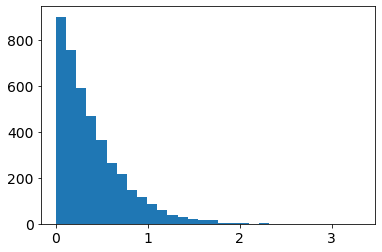

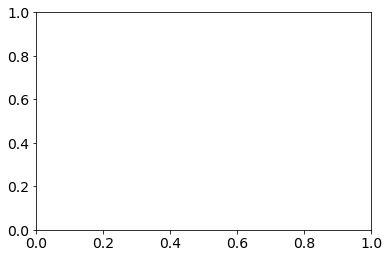

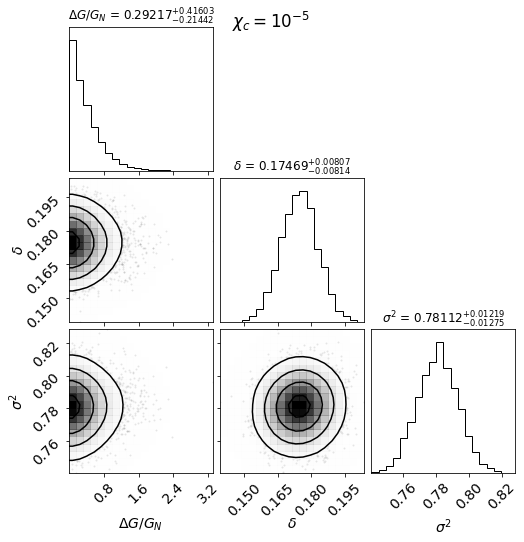

  0%|▏                                          | 4/918 [00:00<00:29, 31.12it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 1.0607521238771383e-06
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 4.643772549691429e-07
10213-1902 [50] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 50.0 0.0 5.522717644881862e-07
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 2.9734993643812316e-07
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0 0.0 7.266326863945553e-07
10218-12703 [50] [33

  1%|▌                                         | 12/918 [00:00<00:29, 31.08it/s]

10218-3704 [50] [-0.2423, -0.7324, -0.4111, -0.2502, -0.1409, -0.2076, -0.2494, -0.3265, -0.3433, -0.3506, -0.3606, -0.3689, -0.3645, -0.3466, -0.4111, -0.2985]
10218-3704 50.0 0.0 1.1644565014503326e-06
10219-9102 [50] [1.3962, 1.1814, 0.7492, 0.4692, 0.3335, 0.2205, 0.1532, 0.1423, 0.1945, 0.153, 0.0798, 0.0216, -0.0715, -0.157, -0.0196, -0.0532, -0.0405]
10219-9102 50.0 0.0 4.676939263145404e-07
10220-12705 [50] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 50.0 0.0 6.844921785989551e-07
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 5.943265887648397e-06
10224-9101 [50] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 50.0 0.0 2.475917331985593e-07
10226-12704 [50] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694

  2%|▉                                         | 20/918 [00:00<00:30, 29.70it/s]

10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 9.9646991225044e-06
10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 6.718870027416133e-06
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 5.33320073142407e-06
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 50.0 0.0 5.593095051743921e-07
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 2.269237699437249e-06
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.0093, -0

  3%|█▏                                        | 26/918 [00:00<00:30, 29.58it/s]

10494-9101 [50] [0.1044, 0.2038, 1.4077, 1.2615, 1.1423, 0.8831, 0.6532, 0.6062, 0.6272, 0.6614, 0.5401, 0.4995, 0.1142, 0.1337]
10494-9101 50.0 0.0 1.2597044977493322e-06
10495-12704 [50] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 50.0 0.0 3.918926786028842e-06
10495-12705 [50] [871.1598, 1245.0304, 1205.1955, 1347.7893, 1374.3588, 1517.2635, 1622.8998, 1633.9971, 1757.8692, 1799.4196, 1854.634, 1999.5551, 1849.1662, 1882.4866, 1807.1303, 1651.9125, 1681.1326, 1493.9167, 2771.4516, 2121.0254, 1992.5196]
10495-12705 50.0 0.0 3.55883063179827e-07
10495-3702 [50] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 50.0 0.0 6.749110209423681e-07
10496-12704 [50] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268

  3%|█▎                                        | 30/918 [00:00<00:29, 29.76it/s]

10498-12705 [50] [2.2376, 1.8111, 0.8617, 0.4311, 0.299, 0.2455, 0.2899, 0.2855, 0.265, 0.1888, 0.0491, -0.0661, -0.1083, -0.0652, -0.0315, 0.0942]
10498-12705 50.0 0.0 3.898372008342048e-07
10499-12705 [50] [-0.9996, -0.9996, -0.9992, -0.9994, -0.9994, -0.9993, -0.9993, -0.9994, -0.9994, -0.9992, -0.999, -0.999, -0.9987]
10499-12705 50.0 0.0 6.563085167146588e-07
10499-3702 [50] [-0.3822, -0.1753, 0.3237, 0.6092, 0.8357, 0.9307, 1.1046, 1.1845, 1.1657, 1.064, 1.005, 1.0954, 0.7875, 0.8892, 0.9769, 1.0508, 1.3156, 1.2283]
10499-3702 50.0 0.0 7.61684573749107e-07
10499-3703 [50] [-0.0563, -0.0436, 0.024, 0.1267, -0.0775, -0.0664, 0.0153, -0.0929, -0.1244, -0.0851, -0.0939, -0.1131, -0.1033, -0.048, 0.0474, 0.0456, 0.0289, -0.0666, -0.0844, -0.5663]
10499-3703 50.0 0.0 9.76799930417973e-07
10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 8.433076888091267e-07
10500-12704 [50] [140.7935, 35.4055, 16.1502, 8

  4%|█▋                                        | 37/918 [00:01<00:29, 29.74it/s]

10500-3702 [50] [211.267, 568.975, 609.2163, 763.7494, 654.0512, 608.9412, 619.4812, 574.1158, 551.0555, 546.396, 492.531, 452.6766, 495.1396, 321.2342, 371.609, 358.446, 200.8978, 319.0074, 284.1887, 209.7882, 190.8027, 318.1602, 354.0653]
10500-3702 50.0 0.0 2.5356487916852575e-07
10500-3703 [50] [-0.028, -0.1828, 0.6642, 1.1037, 1.7094, 1.5507, 1.8019, 1.4925, 1.5792, 1.4772, 1.368, 1.4463, 1.2523, 1.4351, 1.2057, 0.9405, 0.5252, 1.657, 1.4263, 0.5704, 0.5717]
10500-3703 50.0 0.0 3.959062975634474e-07
10501-12704 [50] [1.3181, 1.9521, 1.9474, 1.8957, 2.0169, 2.066, 2.2805, 2.1361, 1.7635, 1.5052, 2.0197, 2.1387, 2.493, 1.9877, 1.7896, 1.1205, 1.6972, 2.5971]
10501-12704 50.0 0.0 1.932488018694776e-06
10501-6101 [50] [54.152, 240.5257, 446.403, 593.882, 679.4829, 745.3089, 578.3118, 397.5307, 268.9797, 276.8619, 234.4717, 196.8602, 156.2454, 140.6324, 64.5922]
10501-6101 50.0 0.0 6.872542908063844e-07
10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0

  5%|██                                        | 45/918 [00:01<00:26, 32.36it/s]

10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 7.0722066128284055e-06
10505-12704 [50] [0.6223, 0.447, 0.4087, 0.27, 0.0901, 0.1644, 0.1572, 0.3129, 0.3336, 0.3492, 0.2338, 0.2536, 0.1307, 0.2303, 0.2492, 0.6718, 0.9822, 1.3729, 3.1505, 2.3435]
10505-12704 50.0 0.0 7.126438801919502e-06
10506-9101 [50] [-0.2543, 0.5091, 0.8262, 0.5675, 0.2552, 0.0764, 0.0245, 0.0392, 0.0453, 0.0366, -0.0056, -0.0369, -0.0612, -0.0986, -0.132, -0.0742, -0.1191]
10506-9101 50.0 0.0 6.546388420919389e-06
10508-12703 [50] [0.5005, 0.4509, 0.1544, 0.1328, 0.1165, 0.1176, 0.065, 0.1329, 0.2506, 0.179, 0.1788, 0.1204, 0.0037, 0.016, -0.0301, -0.0876]
10508-12703 50.0 0.0 4.2010046282420925e-06
10509-12703 [50] [1226.9439, 2166.987, 2538.8741, 2127.6504, 1648.0951, 1358.0909, 1167.9374, 985.8138]
10509-12703 50.0 0.0 1.1053764558077756e-06
10509-1901 [50] [88

  6%|██▍                                       | 53/918 [00:01<00:27, 31.56it/s]

10511-12705 [50] [-0.2818, -0.0952, 0.2141, 0.2185, 0.0509, 0.0112, -0.034, -0.0386, -0.0777, -0.1248, -0.1302, -0.15, -0.1634, -0.2053, -0.2903]
10511-12705 50.0 0.0 4.483705919076965e-07
10512-12701 [50] [-0.3741, -0.2352, -0.2444, -0.3467, -0.39, -0.3702, -0.2987, -0.245, -0.2376, -0.1861, -0.2187, -0.1372]
10512-12701 50.0 0.0 4.0010677929222877e-07
10512-12705 [50] [-0.9971, -0.9962, -0.9967, -0.9971, -0.9969, -0.9968, -0.9961, -0.9958, -0.9964, -0.9971, -0.9977, -0.9977, -0.9977, -0.9976, -0.998]
10512-12705 50.0 0.0 1.0428188911154123e-06
10512-9102 [50] [4147.3152, 2927.8473, 3245.8656, 2878.0674, 2617.7881, 2204.6977, 1695.8151, 1371.2689, 1298.2413, 1241.1228, 1357.9116, 1330.7104, 1714.839, 1930.3755, 2196.7284, 2401.8011, 2844.302, 3122.8481, 2925.4465]
10512-9102 50.0 0.0 5.561599610278984e-07
10513-12702 [50] [-0.9916, -0.9877, -0.9855, -0.9802, -0.9787, -0.98, -0.9868, -0.9787, -0.862, -0.9802]
10513-12702 50.0 0.0 1.1072741215457035e-06
10514-6103 [50] [0.5999, 0.3982, 

  7%|██▊                                       | 61/918 [00:01<00:27, 31.73it/s]

10517-3704 [50] [6.5457, 4.9823, 4.7496, 3.3043, 2.1613, 1.6053, 1.1745, 0.9031, 0.7267, 0.8082, 0.6442, 0.6833, 0.6038, 0.6776, 0.66, 0.6521, 0.6265]
10517-3704 50.0 0.0 6.449009400589292e-07
10517-6102 [50] [0.4712, 0.9172, 0.811, 0.5857, 0.3222, 0.2888, 0.1564, 0.1219, 0.169, 0.09, 0.1318, 0.0302, 0.061, 0.0297, 0.0658, 0.0113, 0.072, 0.0733, -0.0232, 0.0238, 0.0127, 0.0739, -0.0903, -0.0528]
10517-6102 50.0 0.0 2.4761689873704256e-07
10518-12705 [50] [-0.1971, 0.2795, 0.1103, -0.0254, -0.0161, -0.0, 0.0208, 0.0333, 0.0023, -0.0238, -0.0544, -0.1612]
10518-12705 50.0 0.0 2.212747913985505e-06
10518-1902 [50] [-0.0105, 0.2572, 0.0495, 0.0308, 0.0287, -0.0677, -0.0841, -0.0885, -0.1994, -0.1432, -0.1195, -0.1634, -0.1173, -0.1219, -0.165, -0.1325, -0.1731]
10518-1902 50.0 0.0 1.308938343692097e-06
10518-6102 [50] [-0.217, 1.2282, 0.4062, 0.3459, 0.382, 0.1799, 0.1478, 0.1175, 0.0995, 0.1358, 0.0812, 0.048, 0.0452, 0.0639, 0.0875, 0.0309, 0.0337, 0.0007, -0.0113, -0.1383]
10518-6102 50

  7%|██▉                                       | 65/918 [00:02<00:27, 31.14it/s]

10520-12704 [50] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.0366, 0.0275, -0.0135, 0.0213, 0.0998, -0.1048, -0.1309]
10520-12704 50.0 0.0 3.064955617213472e-07
10520-6102 [50] [-0.9995, -0.9993, -0.9985, -0.9976, -0.9986, -0.9981, -0.9983, -0.9984, -0.9986, -0.9981, -0.9963]
10520-6102 50.0 0.0 7.063422265185003e-07
10838-9101 [50] [-0.0928, 0.4421, 0.4896, 0.3922, 0.2667, 0.3141, 0.2582, 0.2949, 0.294, 0.2543, 0.2198, 0.1153, 0.0076, -0.0625, -0.124, -0.1198, -0.272, -0.3696, -0.3534, -0.3974, -0.2337]
10838-9101 50.0 0.0 1.6677516538529738e-06
10839-12705 [50] [0.5531, 0.4188, 0.6271, 0.6342, 0.4074, 0.3206, 0.1512, 0.1105, 0.1154, 0.1763, 0.2141, 0.3291, 0.2868, 0.1635, 0.0391, 0.4134, 0.1807]
10839-12705 50.0 0.0 2.9292751678703775e-06
10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712, 0.035, -0.0115, 0.0248, -0.0288, 0.0512, -0.0187, 0.0073, 0.0432, -0.0916, -0.1233, -0.1818, -0.1471]
10839-3704 50.0 0.0 4.141062640665595e-07
10839-6101 [50] [244.3098, 615.0

  8%|███▎                                      | 73/918 [00:02<00:27, 31.00it/s]

10841-12701 [50] [-0.7323, -0.6652, -0.4249, -0.3016, -0.2957, -0.3482, -0.374, -0.3905, -0.3944, -0.4309, -0.4302, -0.4504, -0.4708, -0.4257, -0.4725]
10841-12701 50.0 0.0 1.354414610504758e-06
10842-3702 [50] [-0.5415, 0.0585, 0.2828, 0.1825, 0.1674, 0.1342, 0.1324, 0.2899]
10842-3702 50.0 0.0 4.913956753000432e-07
10842-3703 [50] [-0.6099, -0.8101, -0.8807, -0.9171, -0.9297, -0.9289, -0.9268]
10842-3703 50.0 0.0 3.537718885483561e-07
10842-9101 [50] [-0.987, -0.9943, -0.9967, -0.9976, -0.9979, -0.998, -0.9982, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9981, -0.998, -0.9982, -0.9979, -0.9982, -0.9983]
10842-9101 50.0 0.0 6.708857387096786e-07
10845-12702 [50] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-12702 50.0 0.0 4.988113305938931e-07
11004-12705 [50] [-0.8497, -0.6991, -0.5203, -0.3493, -0.2406, -0.2193, -0.1954, -0.1792, -0.1842, -0.1767, -0.1858, -0.1781, -0.195, -0.2173, -0.2294, -0.167, -0.2434, -0.1514

  9%|███▋                                      | 81/918 [00:02<00:27, 30.31it/s]

11004-3703 [50] [5607.0165, 6199.0745, 5122.0907, 4588.5334, 3798.1606, 3256.1827, 2909.7374, 2623.1995, 2081.3703, 1622.0266, 1252.6703, 1054.2993, 797.551, 805.4299, 667.6425]
11004-3703 50.0 0.0 3.25504434842901e-07
11004-6104 [50] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 50.0 0.0 9.925398442846115e-07
11009-12704 [50] [-0.044, 0.5574, 0.4941, 0.5156, 0.452, 0.4031, 0.3736, 0.4191, 0.4646, 0.4848, 0.558, 0.4716, 0.2432, 0.3821, 0.6252, 0.8487, 0.8601]
11009-12704 50.0 0.0 9.877691087084087e-06
11009-6102 [50] [0.2368, -0.3064, 0.0765, 0.1736, 0.0574, 0.1163, 0.1754, 0.2052, 0.2777, 0.3634, 0.3506, 0.3192, 0.3455, 0.323, 0.4447, 0.1481, 0.2577, -0.1338, 0.037, 0.1218, 0.8549, -0.5202]
11009-6102 50.0 0.0 3.2649316204546046e-07
11010-12705 [50] [-0.0199, 0.0369, -0.0512, -0.0961, -0.0616, -0.0525, -0.0667, -0.0148, -0.0176, -0.0486, -0.0929, -0.1237, -0.1411, -0.2784, -0.0549, -0.2411]


 10%|████▏                                     | 91/918 [00:02<00:21, 38.76it/s]

11011-12703 [50] [9.8651, 35.0102, 40.3579, 54.0601, 192.4013, 365.0512, 378.092, 411.2362, 282.7202, 230.5846, 329.2445, 263.6472, 244.1501]
11011-12703 50.0 0.0 4.3306684897240065e-07
11012-12705 [50] [0.2329, 0.5509, 0.2517, 0.0195, 0.0174, -0.0704, -0.1937, -0.145, -0.249, -0.0592, -0.302, -0.1828, -0.2112]
11012-12705 50.0 0.0 7.333665884621197e-06
11012-3702 [50] [7.8974, 3196.585, 2734.8285, 2253.8811, 4078.0168, 2401.2221, 2680.4924, 2677.0305, 2494.671, 2122.0656, 2023.2433, 2124.4295, 1742.4806, 1879.5204, 1353.859, 1265.244, 1077.374, 829.3809, 807.9255, 437.3493, 291.3315]
11012-3702 50.0 0.0 2.2836281612438684e-06
11012-9102 [50] [4.3613, 1.8587, 0.9243, 0.4611, 0.1717, 0.0565, -0.0003, -0.0124, 0.0149, 0.0346, 0.0094, 0.0256, 0.0391, 0.0441, 0.0302, -0.0599, -0.0933, -0.0179]
11012-9102 50.0 0.0 1.980152963141003e-06
11013-12702 [50] [0.7904, 0.6387, 0.0779, 0.1203, 0.0592, -0.004, -0.016, 0.0128, 0.0194, 0.059, 0.0663]
11013-12702 50.0 0.0 1.7741259976721779e-06
11013-19

 11%|████▌                                    | 101/918 [00:03<00:18, 43.30it/s]

11017-12704 [50] [0.4751, 0.4487, 0.3988, 0.2586, 0.0625, -0.0537, -0.0751, -0.1094, -0.1157, -0.1027, -0.1141, -0.1182, -0.1126, -0.1047, -0.0836, -0.1961, -0.2389]
11017-12704 50.0 0.0 3.942463670236048e-07
11017-6103 [50] [-0.3235, -0.3265, -0.3479, -0.2253, -0.2261, -0.1769, -0.1311, -0.1075, -0.0747, -0.0989, -0.1378, -0.1695, -0.1257, -0.174, -0.178, -0.0714, -0.0163, 0.0028, 0.2262, -0.2731]
11017-6103 50.0 0.0 1.539025657043087e-06
11017-9101 [50] [-0.5273, 0.0425, 0.2188, 0.1666, 0.07, 0.0407, -0.0503, -0.1282, -0.2004, -0.2244, -0.1722, -0.1497, -0.0815, -0.0967, -0.1443, -0.1476, -0.1864, -0.1536, -0.2264, -0.18]
11017-9101 50.0 0.0 5.915798323919499e-07
11018-12702 [50] [-0.9839, -0.9926, -0.9927, -0.9922, -0.9923, -0.9935, -0.9932, -0.9925, -0.9931, -0.994, -0.9941]
11018-12702 50.0 0.0 7.365443119971143e-07
11018-12704 [50] [-0.9989, -0.9988, -0.9986, -0.9987, -0.9988, -0.999, -0.999, -0.9991, -0.9991, -0.9987, -0.9984, -0.9975, -0.9987, -0.9989]
11018-12704 50.0 0.0 5.91

 12%|████▋                                    | 106/918 [00:03<00:18, 43.54it/s]

11019-12705 [50] [0.9395, 1.6844, 1.8269, 0.8562, 0.7011, 1.016, 1.1247, 1.0992, 1.0844]
11019-12705 50.0 0.0 3.4237106201996786e-06
11019-3701 [50] [2.5964, 1.3616, 0.9142, 0.3658, 0.0143, -0.1157, -0.1148, -0.102, -0.0691, -0.1802, -0.166, -0.2893, -0.0849]
11019-3701 50.0 0.0 3.5744436916646513e-07
11021-1902 [50] [5.9017, 3.1432, 2.8491, 1.9605, 1.7177]
11021-1902 50.0 0.0 1.7227808277506676e-06
11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 4.558901301590194e-06
11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 2.7061461643126284e-06
11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
110

 12%|████▉                                    | 111/918 [00:03<00:21, 38.06it/s]

11744-9102 [50] [-0.6298, 0.0464, 0.3943, 0.6247, 0.4097, 0.3518, 0.3414, 0.4046, 0.4742, 0.4313, 0.3693, 0.3275, 0.2214, 0.1278, 0.0812, 0.4043, 0.1792, -0.1336]
11744-9102 50.0 0.0 1.270501991092006e-06
11745-1902 [50] [1.185, 0.9719, 0.4625, 0.4231, 0.2188, 0.1795, 0.0428, 0.0263, -0.0784, -0.2371, 0.1632]
11745-1902 50.0 0.0 1.0427789842801544e-06
11745-6104 [50] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.8527, 0.5703, 0.5078, 0.5176, 0.5143, 0.48, 0.4463, 0.4504, 0.4653, 0.4273, 0.4049]
11745-6104 50.0 0.0 1.3701919447248163e-06
11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.0361, -0.076, -0.0711, -0.1542, -0.2041, -0.2119, -0.1066, -0.2705, -0.3138]
11745-9101 50.0 0.0 4.137613879210534e-07
11746-3703 [50] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 50.0 0.0 2.1962473981310746e-06


 13%|█████▎                                   | 119/918 [00:03<00:28, 28.46it/s]

11746-3704 [50] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 50.0 0.0 2.4242945211998916e-07
11746-9102 [50] [-0.478, -0.2133, -0.2528, -0.1774, -0.2077, -0.2266, -0.2099, -0.2691, -0.1996, -0.2114, -0.1249, -0.1799, -0.1765, -0.1376, -0.2784, -0.2323, -0.1941, -0.3005, -0.2047, -0.3235, -0.1159, 0.1709]
11746-9102 50.0 0.0 3.1391323028746786e-06
11747-12702 [50] [-0.4876, -0.2412, -0.0165, -0.0887, -0.0931, -0.0756, -0.076, -0.0313, -0.0043, 0.0037, -0.0318, -0.1133, 0.1257, -0.1019, 0.1921, -0.2837, -0.0753]
11747-12702 50.0 0.0 1.8204991479217556e-06
11749-12701 [50] [-0.6821, -0.1137, 0.255, 0.1029, 0.0811, -0.0849, -0.2182, -0.1487, -0.1095, -0.0437, -0.1285, -0.1939]
11749-12701 50.0 0.0 1.483334439063777e-06
11749-12704 [50] [1.1585, 1.0264, 1.2033, 1.4986, 1.8954, 2.0398, 2.1095, 2.1199, 1.4688, 1.3033, 0.9132, 0.8426, 0.0515, 0.4719, -0.3735]
11749-12704 50.0

 13%|█████▍                                   | 123/918 [00:03<00:29, 27.16it/s]

11749-3701 [50] [618.0455, 872.9003, 1483.1859, 1615.2011, 1553.7949, 1334.0598, 1385.5396, 1283.8547, 1216.0833, 1294.494, 1472.7433, 1080.4933, 1346.7897, 1196.9726, 1091.8413, 1216.7304, 927.7028, 363.0292, 281.9853, 551.8779, 169.9359, 54.7426, 122.374, 379.7425, 27.1507]
11749-3701 50.0 0.0 7.946009866868985e-07
11750-12701 [50] [0.4224, 0.3089, 0.0791, 0.0892, 0.2329, 0.2222, 0.1114, 0.03, 0.0196, 0.0027, 0.0313, 0.0827, 0.0275, 0.3095]
11750-12701 50.0 0.0 5.815877360864649e-07
11750-3701 [50] [1.5964, 1.8766, 1.9419, 1.999, 1.4725, 1.2873, 1.1333, 0.934, 0.9463, 0.8918, 0.7347, 0.8508, 0.6677, 0.4619, 0.3762, 0.1866, 0.0367, 0.0915, 0.0086, 0.4665]
11750-3701 50.0 0.0 4.814580804581132e-07
11750-6103 [50] [6.303, 1.7001, 0.3933, 0.5417, 0.5248, 0.6298, 0.7207, 0.7282, 0.8046, 0.5691, 0.3659, 0.4083, 0.4745, 0.6207, 0.9957, 2.1073, 7.7724]
11750-6103 50.0 0.0 8.56147139534351e-07
11750-9101 [50] [13.4461, 9.2464, 8.3896, 5.4399, 4.9554, 3.0033, 3.1782, 2.4566, 2.5343, 2.0961, 2.

 14%|█████▊                                   | 131/918 [00:04<00:25, 30.92it/s]

11751-6102 [50] [0.3738, 0.0535, 0.3785, 0.2124, 0.1333, 0.0258, -0.0223, -0.094, -0.1099, -0.1415, -0.1724, -0.2013, -0.1841, -0.253, -0.3949, -0.2255, -0.2141, -0.2775]
11751-6102 50.0 0.0 6.273906902741851e-07
11753-3703 [50] [0.2801, 0.7604, 0.7391, 0.5795, 0.35, 0.1693, 0.0874, 0.0586, 0.0152, -0.0057, -0.0099, -0.0594, -0.1073, -0.139, -0.1496]
11753-3703 50.0 0.0 5.269986710024916e-07
11753-6104 [50] [1.7058, 1.5787, 1.7231, 1.492, 1.0043, 0.8699, 0.6579, 0.5905, 0.5042, 0.4712, 0.4504, 0.6153, 0.6589, 0.6817, 0.5206, 0.5457, 0.5195, 0.692]
11753-6104 50.0 0.0 5.000707469396131e-07
11754-1901 [50] [-0.2402, -0.5388, -0.5143, -0.4398, -0.487, -0.4664, -0.4721, -0.5334, -0.5004, -0.4954, -0.6115, -0.5884]
11754-1901 50.0 0.0 3.428210967714422e-07
11755-12701 [50] [-0.773, -0.7865, -0.7717, -0.7522, -0.7475, -0.7159, -0.7048, -0.6936, -0.7373, -0.7183, -0.7382, -0.7769, -0.6833, -0.7924, -0.5695, -0.681, -0.5512]
11755-12701 50.0 0.0 1.2173500838580622e-06
11755-6101 [50] [-0.0093,

 15%|██████▏                                  | 139/918 [00:04<00:23, 33.43it/s]

11758-3702 [50] [-0.544, -0.1141, 0.0167, 0.1028, 0.0854, -0.0041, -0.0149, 0.0406]
11758-3702 50.0 0.0 4.298179712957257e-07
11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 50.0 0.0 8.740117475400491e-07
11759-6102 [50] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, -0.981]
11759-6102 50.0 0.0 2.583608353118472e-07
11760-12703 [50] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0.539, 0.1155, 0.1223, 0.309]
11760-12703 50.0 0.0 3.928148431944804e-07
11760-6101 [50] [0.4533, -0.0157, 0.5654, 0.502, 0.3995, 0.359, 0.3287, 0.2964, 0.2063, 0.2512, 0.2686, 0.2421, 0.2368, 0.1884, 0.0906, -0.0471, -0.3849, -0.319, -0.8166]
11760-6101 50.0 0.0 1.7289061135353394e-06
11760-6103 [50] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.21

 16%|██████▌                                  | 147/918 [00:04<00:23, 33.24it/s]

11761-12703 [50] [0.4093, 0.08, -0.0588, -0.0478, 0.0006, -0.0009, -0.0617, -0.1284, -0.1046, -0.1135, -0.1247, -0.1623, -0.2191, -0.3477]
11761-12703 50.0 0.0 4.531066331713095e-06
11761-12704 [50] [-0.1205, 0.9952, 0.5814, 0.2296, 0.1208, 0.126, 0.1222, 0.1041, 0.1683, 0.1996, 0.1448, 0.1188, 0.0574, 0.0394, -0.008, -0.026, -0.0331]
11761-12704 50.0 0.0 1.8964044686017204e-06
11761-12705 [50] [6.8127, 3.6941, 2.4845, 1.3644, 0.5363, 0.2844, 0.104, -0.1]
11761-12705 50.0 0.0 2.0769465970759394e-06
11823-9101 [50] [15949.1976, 8800.0053, 8323.3916, 4811.1692, 2214.9858, 717.2733, 413.2719, 305.7873, 173.5393, 146.0478, 195.6604, 224.7593, 189.4201, 67.1778]
11823-9101 50.0 0.0 7.234534965709088e-07
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 5.484546715411269e-06
11828-12703 [50] [-0.5587, -0.2913, 0.1844, 0.3112, 0.2627, 0.2124, -0.0354, -0.0957, -0.1295, -0.1601, -0.0565, -0

 17%|██████▉                                  | 155/918 [00:04<00:24, 31.76it/s]

11830-12703 [50] [-0.4776, 0.0437, 0.1582, -0.0709, -0.1607, -0.0754, 0.055, 0.2665, 0.1845, 0.03, 0.0663, -0.087, -0.2185, -0.1589, 0.0536, -0.3722]
11830-12703 50.0 0.0 2.723183205384984e-06
11830-3702 [50] [1.2195, 0.9978, 0.6546, 0.4726, 0.5057, 0.555, 0.4749, 0.3884, 0.4626]
11830-3702 50.0 0.0 9.117639568278536e-07
11830-6104 [50] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.0353, -0.2063, -0.258, -0.2347, -0.2692, -0.3985]
11830-6104 50.0 0.0 7.464831172488652e-07
11831-12703 [50] [0.4472, 0.0224, 0.062, 0.158, -0.0429, -0.0922, -0.1252, -0.188, -0.1276, -0.16, -0.2596, -0.2165, 0.1708, -0.4595]
11831-12703 50.0 0.0 4.4197032428416966e-06
11831-12704 [50] [-0.5822, -0.2435, 0.0115, -0.0848, -0.1704, -0.028, -0.0888, -0.0323, -0.0445, -0.106, -0.3871, -0.1836]
11831-12704 50.0 0.0 1.508372791970293e-06
11831-6101 [50] [-0.9875, -0.994, -0.9968, -0.9973, -0.9967, -0.9975, -0.9969, -0.9978, -0.9979, -0.9971, -0.9984, -0.9986, -0.9985, -0.9974]
1183

 17%|███████                                  | 159/918 [00:04<00:23, 32.85it/s]

11833-9102 [50] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.2658, -0.2176, -0.1929, -0.2471, -0.3166]
11833-9102 50.0 0.0 9.755746572265147e-07
11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 1.160962414691083e-05
11836-1902 [50] [0.7026, 1.2767, 1.1865, 1.1009, 0.973, 0.9921, 0.7024, 0.7206, 0.623, 0.6145, 0.5505, 0.5955, 0.6037, 0.4142, 0.4147]
11836-1902 50.0 0.0 1.6805472595504044e-06
11838-12701 [50] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 0.1336, 0.0903, 0.0213, -0.0554, -0.0342, 0.0225, 0.0053, -0.0272]
11838-12701 50.0 0.0 7.165056840310878e-07
11838-12703 [50] [144.9042, 254.2159, 538.0129, 911.0748, 1089.8377, 1111.2623, 1284.2649, 1228.3752, 1345.2496, 1400.7846, 1427.4787, 1434.5371, 1257.47, 

 18%|███████▍                                 | 167/918 [00:05<00:24, 30.38it/s]

11838-9101 [50] [11.4727, 10.3246, 9.7757, 7.6641, 6.3263, 7.7985, 4.6854, 6.1379, 3.8072, 5.5203, 3.0518, 3.9759, 1.4403, 2.8333, 2.6956, 2.5542]
11838-9101 50.0 0.0 4.2652748313133963e-07
11865-12702 [50] [-0.057, -0.0512, 0.0778, -0.0002, -0.0743, -0.0834, -0.0854, 0.0083, -0.0154, -0.0332, -0.07, -0.1612, -0.2706]
11865-12702 50.0 0.0 1.147524271103463e-06
11865-12704 [50] [0.4447, -0.0557, -0.3894, -0.457, -0.5111, -0.5109, -0.5238, -0.5353, -0.4955, -0.5012, -0.4831, -0.4726, -0.599, -0.615]
11865-12704 50.0 0.0 9.092067263628726e-07
11865-1901 [50] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 50.0 0.0 1.2167873610851464e-06
11865-1902 [50] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0.4429]
11865-1902 50.0 0.0 1.0066179025668969e-06
11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 1.5751748535158616e-06
11865-9102 [50] [-0.467, -0.469

 19%|███████▊                                 | 175/918 [00:05<00:21, 34.04it/s]

11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2771, 0.298, 0.3814, 0.3262, 0.2102, 0.3978, 0.4467, 0.2866, 0.1214, 0.2202, 0.1346, 0.4041]
11867-6104 50.0 0.0 2.7683968091382703e-06
11867-9101 [50] [0.9073, 0.3027, 0.1546, 0.1123, 0.0285, 0.0159, -0.0244, 0.0205, 0.0824, 0.1908, 0.2079, 0.2195, 0.3058, 0.2425, 0.1871, 0.3056]
11867-9101 50.0 0.0 1.1105912052994306e-06
11868-12703 [50] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 1.6811507163805228e-06
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 6.680780760732273e-06
11871-6103 [50] [0.7182, 0.8575, 0.776, 0.4737, 0.2556, 0.1173, 0.1395, 0.111, 0.0842, 0.0381, 0.0003, -0.0281, -0.0195, -0.044, -0.0588, -0.2086, -0.132, -0.377]
11871-6103 50.0 0.0 4.034887404240335e-06
11940-1902 [50] [-0.0835, 0.1518, 0.1321, 0.0182, -0.0843, -0.1452, -0.1779, -0.1993, -0.1955]
11940-1902 50.0

 20%|████████▏                                | 183/918 [00:05<00:21, 33.61it/s]

11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 3.159028470730963e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 3.2628494829088654e-05
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389.9946, 2439.1642, 2636.587, 2485.7262, 2056.7992, 1736.2622, 1623.5415, 1192.5228, 781.8483, 546.9719, 175.874]
11942-12704 50.0 0.0 5.383079205738631e-06
11942-6104 [50] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 50.0 0.0 3.856557402903208e-07
11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.0425, -0.0331, -0.0546, -0.0982, -0.1371, -0.164, -0.179, -0.1863, -0.172, -0.1572, -0.1563, -0.1648, -0.1726, -0.27]
11943-3703 50.0 0.0 6.577614245307999e-06
11944-12701 [50] [-0.3

 21%|████████▌                                | 191/918 [00:05<00:21, 34.10it/s]

11945-6101 [50] [0.2057, 0.8606, 0.9637, 0.605, 0.4694, 0.2734, 0.2029, 0.1332, 0.0558, -0.0105, 0.0015, 0.0011, -0.0038, -0.016, 0.0504, -0.0338]
11945-6101 50.0 0.0 6.041215945167128e-06
11945-6102 [50] [3.5224, 2.2109, 1.4349, 1.0152, 0.7457, 0.4864, 0.2556, 0.1192, 0.0508, 0.0117, -0.0209, -0.0683, -0.158, -0.0976, -0.2012]
11945-6102 50.0 0.0 1.96457665936835e-06
11947-6103 [50] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 50.0 0.0 8.342402314921171e-07
11949-12701 [50] [1.1975, 0.3408, 0.1441, 0.1243, 0.0225, 0.0003, 0.0028, 0.027, 0.0197, 0.0192, -0.0295, -0.0839]
11949-12701 50.0 0.0 1.1283795326168242e-06
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 1.07494555946993e-05
11954-12704 [50] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453, 0.1801, 0.12

 22%|████████▉                                | 199/918 [00:06<00:21, 33.77it/s]

11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 2.2370034815017876e-06
11956-12702 [50] [5.6953, 5.0804, 3.2564, 2.1056, 1.2622, 0.6457, 0.4602, 0.5373, 0.9503, 3.7649, 5.1679]
11956-12702 50.0 0.0 1.1565690864230717e-06
11956-12705 [50] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 0.2419, 0.2565, 0.3525, 0.1776, 0.103, 0.3387, 0.3814, 0.7221, 0.77]
11956-12705 50.0 0.0 7.27459232385412e-07
11957-12704 [50] [-0.3492, 0.7667, 0.6853, 0.5861, 0.3661, 0.189, 0.1584, 0.1015, -0.0026, 0.0319, 0.1228, 0.1275, 0.2204, 0.0938]
11957-12704 50.0 0.0 2.8147242839756027e-07
11957-9101 [50] [127.5969, 337.5453, 692.0501, 754.6672, 761.8038, 673.5367, 561.8056, 470.5271, 446.8561, 434.7914, 434.701, 432.6297, 423.9362, 415.9254, 409.4146, 409.8788]
11957-9101 50.0 0.0 3.1796200727847904e-06
11957-9102 [50] [1.0969, 0.3397, 0.6198, 1.0919, 1.791, 2.069, 2.6145, 2.7123, 2.807

 22%|█████████                                | 203/918 [00:06<00:23, 31.03it/s]

11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 1.3368231262863752e-06
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 50.0 0.0 4.170316438912344e-06
11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.9843, 0.6333, 0.3517, 0.1829, 0.1258, 0.0956, 0.1424, 0.1021, 0.028, 0.1221]
11965-9102 50.0 0.0 1.4840677581539402e-06
11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 4.794635978857917e-06
11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.8986, 3.5843, 4.0724, 0.9129, 2.9875, 0.7205, 2.6408, 1.2362]
11969-6101 50.0 0.0 3.752139529808636e-06
11970-12703 [50] [-0.4888, -0.3498, -0.0561, 0.1594, 0.1669, 0.133, 0.154, 0.1676, 0.14

 23%|█████████▍                               | 211/918 [00:06<00:23, 30.08it/s]

11970-6102 [50] [-0.0116, -0.0683, -0.0558, -0.0053, 0.0454, 0.025, 0.078, -0.0283, -0.085, -0.1052, -0.0602, -0.0272, -0.0693, -0.0116, -0.1378, -0.2799, -0.2497]
11970-6102 50.0 0.0 7.054766597999793e-07
11970-6103 [50] [0.7466, 1.1751, 1.6643, 1.3977, 1.0416, 0.8262, 0.6871, 0.5199, 0.4194, 0.3266, 0.2718, 0.2909, 0.2357, 0.2575, 0.2139, 0.0837, -0.0144, -0.0619, 0.133]
11970-6103 50.0 0.0 1.7340047387609228e-06
11974-12702 [50] [-0.5341, -0.4596, -0.3852, -0.2683, -0.2117, -0.2349, -0.22, -0.1969, -0.1731, -0.1829, -0.2133, -0.2538, -0.2357, -0.256, -0.1504, -0.1437, -0.1349, 1.1183]
11974-12702 50.0 0.0 2.8640277394391586e-06
11975-12701 [50] [-0.1741, -0.13, 0.3291, 1.0808, 1.3321, 1.3798, 1.0057, 0.9745, 0.8989, 0.5699, 0.4672, 0.2163]
11975-12701 50.0 0.0 2.543065171230634e-07
11975-12705 [50] [0.6902, 0.7621, 0.3208, 0.2527, 0.3317, 0.3259, 0.2387, 0.0864, 0.069, 0.2015, 0.1928, 0.1502, -0.0055, -0.1924]
11975-12705 50.0 0.0 9.372702667143205e-07
11975-3703 [50] [-0.2597, -0.0

 23%|█████████▌                               | 215/918 [00:06<00:23, 29.79it/s]

11976-12703 [50] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 50.0 0.0 8.333119695465467e-07
11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 50.0 0.0 5.714054785276054e-07
11978-12705 [50] [0.0184, 0.0968, 0.695, 0.4819, 0.223, 0.1168, 0.1458, 0.1604, 0.1304, 0.1363, 0.1451, 0.1188, 0.0734, 0.0413, 0.0374, 0.0059, 0.0584, 0.0708]
11978-12705 50.0 0.0 6.911764304357025e-07
11978-6101 [50] [0.1703, 0.2916, 0.2201, 0.1105, 0.137, 0.0651, 0.0262, 0.0439, 0.1227, 0.0551, 0.0171, -0.0525, -0.106, -0.2018, -0.2281, -0.1584, -0.2752, -0.3694, -0.5359, -0.6656, -0.8099]
11978-6101 50.0 0.0 1.0052283770721027e-06
11979-12703 [50] [0.3188, 0.2646, 0.4444, 0.4735, 0.4231, 0.2818, 0.2037, 0.1891, 0.1975, 0.1625, 0.205, 0.2447, 0.1501, 0.1763, 0.1339, 0.4567, 0.4255, 0.53]
11979-12703 50.0 0.0 7.413

 24%|█████████▉                               | 223/918 [00:06<00:23, 29.71it/s]

11979-9101 [50] [0.4094, -0.1099, -0.2651, -0.4134, -0.4241, -0.4727, -0.5, -0.5199, -0.5395, -0.5666, -0.5927, -0.5903, -0.6162, -0.591, -0.6704, -0.611]
11979-9101 50.0 0.0 6.465143367481873e-07
11979-9102 [50] [0.6334, -0.323, -0.1351, -0.0857, 0.0053, 0.0302, 0.0467, 0.0752, 0.0566, 0.0459, 0.0116, 0.0269, 0.0046, -0.0156, -0.091, -0.1558, -0.3105, -0.4242, -0.5324]
11979-9102 50.0 0.0 6.985693228458021e-07
11981-12702 [50] [293.567, 690.112, 683.5389, 617.2849, 490.646, 374.3616, 455.8674, 450.3051, 457.9927, 478.543, 404.234]
11981-12702 50.0 0.0 4.2198390817091046e-07
11981-12704 [50] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]
11981-12704 50.0 0.0 5.631810718190006e-07
11981-9102 [50] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188, -0.1444, -0.128, -0.1812, -0.1904, -0.2284, -0.2044, -0.2061, -0.1486, -0.2345, -0.2114, 0.0329, 0.7603]
11981-9102

 25%|██████████▎                              | 231/918 [00:07<00:23, 28.96it/s]

11982-6102 [50] [0.7786, 0.4297, 0.4569, 0.7506, 0.7926, 0.6732, 0.6507, 0.5035, 0.3848, 0.2963, 0.4923, 0.064, 0.2848, -0.0122, 0.3417, -0.0773, -0.7924]
11982-6102 50.0 0.0 1.6710476730981904e-07
11982-9102 [50] [-0.6167, -0.1298, 0.3235, 1.2078, 1.1438, 0.8069, 0.6394, 0.4963, 0.4228, 0.3252, 0.3069, 0.2838, 0.3393, 0.4905, 0.4567, 0.2311]
11982-9102 50.0 0.0 1.5636424780398727e-06
11984-12701 [50] [-0.2857, -0.1737, 0.0157, 0.0372, -0.1281, -0.2001, -0.1962, -0.1945, -0.1458, -0.0921, -0.099, -0.116, -0.1666, -0.325, -0.2122, -0.442]
11984-12701 50.0 0.0 6.314165340692349e-07
11984-12702 [50] [-0.2774, -0.3248, -0.3706, -0.3541, -0.339, -0.3481, -0.2877, -0.2577, -0.2022, -0.1466, -0.1889, -0.2485, -0.0638, -0.2124, -0.1581, -0.3914, -0.132]
11984-12702 50.0 0.0 3.922787565516118e-06
12066-3701 [50] [19.2418, 16.9197, 10.1428, 6.0915, 4.4316, 3.0783, 2.9929, 2.3906, 2.7183, 2.8356, 3.2869, 3.669, 3.475, 3.6088, 2.499, 1.7084, 1.9485, 1.5899]
12066-3701 50.0 0.0 3.2621198279248343e-

 25%|██████████▍                              | 234/918 [00:07<00:25, 26.97it/s]

12067-12705 [50] [0.4291, 1.3434, 2.0219, 1.7622, 1.0305, 0.7583, 0.4763, 0.1261, 0.0511, 0.0662, 0.1502, 0.2361, 0.2324, 0.212, 0.3434]
12067-12705 50.0 0.0 9.058130849371219e-07
12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 3.699626656856598e-05
12068-6104 [50] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 50.0 0.0 1.5230060551412577e-06
12069-12704 [50] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 50.0 0.0 1.050263542003358e-06
12069-12705 [50] [1.7332, 1.137, 0.4096, 0.6564, 0.5837, 0.6168, 0.2246, 0.0587, 0.2617, 0.1538, 0.5607, 0.4132, 0.5307, 0.41, 2.8782]
12069-12705 50.0 0.0 9.870937679870305e-07


 26%|██████████▊                              | 241/918 [00:07<00:22, 29.50it/s]

12069-6102 [50] [-0.3102, -0.0764, -0.2402, -0.1833, -0.1952, -0.2158, -0.2095, -0.1861, -0.144, -0.1353, -0.1037, -0.1026, -0.0816, -0.0956, -0.1367, -0.1477, -0.0871, -0.0667, -0.0387, -0.58, -0.56, -0.5359, -0.8946, 0.038]
12069-6102 50.0 0.0 9.325874569199417e-07
12071-12701 [50] [-0.9172, -0.8384, -0.6786, -0.6994, -0.7429, -0.7686, -0.7662, -0.8217, -0.8275, -0.8401, -0.7831, -0.8143]
12071-12701 50.0 0.0 9.526143075481553e-07
12071-1901 [50] [-0.148, -0.1411, -0.1881, -0.1802, -0.1874, -0.1463, -0.1611, -0.1934, -0.1236, -0.1115, 0.0697, 0.0471, 0.1047, 0.171, 0.9648]
12071-1901 50.0 0.0 6.806113700678651e-07
12071-3702 [50] [43.1041, 1833.3653, 2193.0557, 2409.7616, 2285.0769, 1925.6484, 1966.7994, 2043.2628, 1997.8474, 1832.4832, 1658.3071, 1528.5931, 1298.5116, 1014.8264, 552.6982, 136.4828]
12071-3702 50.0 0.0 1.22120881362932e-06
12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.3083, 

 27%|███████████                              | 249/918 [00:07<00:21, 30.43it/s]

12079-12705 [50] [5.9457, 5.134, 4.915, 2.376, 2.7696, 2.3345, 1.3415, 1.441, 1.4148, 0.8317, 1.0553, 1.0687, 0.9662, 0.8766, 1.1537, 1.4538, 0.8336]
12079-12705 50.0 0.0 3.299097798745388e-07
12080-12704 [50] [798.4646, 1129.8436, 1685.7177, 1551.5379, 1648.9794, 1528.8158, 1510.5353, 1488.9904, 1518.2012, 1430.3202, 1355.0599, 1297.2544, 1371.7431, 1127.7862, 1194.7794, 1062.3493, 1183.2366, 942.8748, 761.5148, 256.7283, 914.8231, 836.9712]
12080-12704 50.0 0.0 2.2553991374144817e-07
12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 7.239521963041727e-06
12082-12702 [50] [52.4225, 34.225, 22.353, 15.87, 12.6473, 9.0293, 9.0994, 7.7946, 7.7752, 7.6215, 7.2913, 5.8669, 7.5773, 10.9051, 27.4723, 42.4809, 31.8612, 44.26]
12082-12702 50.0 0.0 1.6514304952552834e-06
12084-12702 [50] [0.4179, 1.0492, 0.9255, 0.717, 0.5874, 0.4344, 0.359, 0.2445, 0.1712, 0.1342, 0.2131, 0.2682, 0.3

 28%|███████████▎                             | 253/918 [00:08<00:23, 28.49it/s]

12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-12705 50.0 0.0 7.002621292798846e-07
12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.419, 0.387, 0.4139, 0.5272, 0.4564, 0.6029, 0.4957, 0.5971, 0.6267, 0.5749, 0.7061, 0.6081, 0.5243, 0.4383, 0.5097, 0.4647, 0.2768, 0.3996, 0.231, 0.2274, 0.4698, 0.2204, 0.2727]
12084-1901 50.0 0.0 4.7651873477562055e-07
12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
12084-3702 50.0 0.0 6.89756147740655e-07
12084-3703 [50] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.866, 9.9199, 8.0438, 7.1191, 7.1184, 4.9585, 5.2578]
12084-3703 50.0 0.0 9.517696896336965e-07
12084-6104 [50] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.03

 28%|███████████▌                             | 260/918 [00:08<00:24, 27.27it/s]

12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0.0071, -0.0873, -0.0572, 0.0209, 0.0881, 0.0588, 0.0753, 0.0542]
12085-12704 50.0 0.0 1.9767164662516128e-05
12085-6101 [50] [-0.1417, -0.3914, -0.1738, -0.0755, -0.0973, -0.0439, -0.1113, -0.1774, -0.1947, -0.1728, -0.1408, -0.1367, -0.1146, -0.1045, -0.1506, -0.0235, -0.0308, -0.0502, 0.0507]
12085-6101 50.0 0.0 6.834465097815083e-06
12085-6103 [50] [-0.549, -0.354, -0.3619, -0.3336, -0.3191, -0.1878, -0.2268, -0.2779, -0.144, -0.2236, -0.1423, -0.1582, -0.1565, -0.2223, -0.1937, -0.2795, -0.2396, -0.2355, -0.213, -0.3557, -0.311]
12085-6103 50.0 0.0 4.3229603278797287e-07
12085-9102 [50] [0.6086, 0.5632, 0.3343, 0.2119, 0.1282, 0.0402, 0.0288, 0.0478, 0.0313, 0.001, -0.0532, -0.0537, -0.0634, -0.0662, -0.1794, -0.1779, -0.239]
12085-9102 50.0 0.0 7.734305278753871e-07
12088-12705 [50] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-127

 29%|███████████▉                             | 267/918 [00:08<00:22, 29.39it/s]

12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-12702 50.0 0.0 6.438487101643086e-07
12089-12704 [50] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 50.0 0.0 1.5239323908928954e-06
12089-1901 [50] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 50.0 0.0 8.937137094383366e-06
12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722, -0.1642, -0.1028, -0.1287, -0.1434, -0.0908, -0.1289, -0.1084, -0.2404, -0.097, 0.1709, -0.3201, -0.0196, -0.302]
12089-6103 50.0 0.0 1.4205010203040385e-06
12092-6101 [50] [0.0026, 0.3918, 0.1405, 0.0977, 0.005, 0.0277, 0.1281, 0.0885, 0.0628, 0.0291, -0.0173, -0.1181]
12092-6101 50.0 0.0 1.868562333125935e-06
12093-9101 [50] [-0.9989, -0.997, -0.9973, -0.998, -0.9985, -0

 30%|████████████▏                            | 273/918 [00:08<00:24, 26.54it/s]

12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 1.231357641914547e-06
12483-12703 [50] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -0.0898]
12483-12703 50.0 0.0 1.6171700514915407e-06
12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 5.111870108937088e-07
12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 7.010452805902239e-07
12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 50.0 0.0 9.428122354641059e-07
12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696, 

 30%|████████████▎                            | 277/918 [00:08<00:22, 27.99it/s]

12488-9101 [50] [0.89, -0.0571, 0.0018, 0.0675, 0.0814, 0.1021, 0.1178, 0.0708, 0.0758, 0.1268, 0.0533, 0.0597, 0.0532, 0.0414, 0.1038, 0.0181, -0.1356, -0.2319, -0.1377]
12488-9101 50.0 0.0 2.462662969228478e-06
12489-3703 [50] [6.1258, 7.3921, 7.9142, 7.3592, 6.7186, 6.0984, 5.5884, 5.3024, 5.0796, 4.2963, 4.3283, 3.7505, 4.11, 3.5385, 4.098]
12489-3703 50.0 0.0 1.109810169352297e-06
12490-3701 [50] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-3701 50.0 0.0 1.882662490661197e-06
12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0.0863]
12506-12701 50.0 0.0 4.280561292432925e-06
12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0.0

 31%|████████████▋                            | 283/918 [00:09<00:25, 24.59it/s]

12512-12702 [50] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 50.0 0.0 5.84270339636646e-07
12514-12702 [50] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 50.0 0.0 5.275765335350348e-07
12514-12703 [50] [2.1408, 0.3201, 0.1941, 0.0194, 0.03, 0.0603, 0.1872, 0.1977, 0.0662, 0.1145, 0.0325, -0.0142, 0.021, -0.0315, -0.0845, -0.0224]
12514-12703 50.0 0.0 1.5139461922173018e-07
12514-9102 [50] [-0.6627, -0.5978, -0.3356, -0.1465, -0.1607, -0.0924, -0.0736, -0.019, 0.0855, 0.1041, 0.0741, -0.06, -0.1592, -0.1356, -0.0632, -0.2008, -0.2854]
12514-9102 50.0 0.0 6.537488230323921e-07


 31%|████████████▊                            | 286/918 [00:09<00:27, 22.89it/s]

12518-12705 [50] [-0.8683, -0.7393, -0.3648, -0.0579, -0.0274, -0.0334, -0.0145, 0.016, -0.0154, 0.0703, -0.1575, 0.0272]
12518-12705 50.0 0.0 7.074009846743629e-07
12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 0.0 3.2517359317727415e-07
12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.1091]
12518-9101 50.0 0.0 8.215167448136561e-07
12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 2.756403736754492e-06
12620-6104 [50] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 50.0 0.0 2.653323661861637e-07


 32%|█████████████                            | 292/918 [00:09<00:28, 21.67it/s]

12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 1.6434658341268823e-06
12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903, -0.5645]
12621-12705 50.0 0.0 5.541501944961594e-07
12621-6103 [50] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 50.0 0.0 3.802309459498016e-07
12622-9101 [50] [0.295, -0.1664, 0.1745, 0.5326, 0.7376, 0.7334, 0.6499, 0.6151, 0.5534, 0.5303, 0.427, 0.3612, 0.3993, 0.3837, 0.4878, 0.4757, 0.3843, 0.0845]
12622-9101 50.0 0.0 1.6231209001950532e-06
12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 1.8425283973479314e-06


 32%|█████████████▎                           | 298/918 [00:09<00:28, 21.43it/s]

12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 6.230536434498887e-06
12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 1.2459988170367719e-06
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 1.8923806123325067e-06
12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 3.3445592959707213e-06
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 3.753496109013767e-06


 33%|█████████████▍                           | 301/918 [00:10<00:29, 20.87it/s]

12679-12701 [50] [-0.4106, -0.1602, -0.09, 0.0292, -0.1142, -0.1585, -0.1702, -0.2231, -0.1617, -0.1473, -0.165, -0.0765, -0.2919, -0.3168, -0.5268, -0.1813, 0.1098, -0.9954]
12679-12701 50.0 0.0 2.3843784059468284e-07
12679-1902 [50] [0.6115, 0.2127, 0.2343, 0.0811, 0.186, 0.028, 0.0072, -0.086, -0.1377, -0.1341, -0.1745, -0.1741, -0.1973, -0.2294, -0.2344, -0.1462, -0.1584]
12679-1902 50.0 0.0 4.1006954844622285e-07
12682-12705 [50] [211.5682, 164.2949, 154.5208, 172.1809, 188.4287, 205.8053, 188.0827, 175.7022, 171.521, 162.4793, 163.9925, 122.1814, 128.2861, 178.1773, 150.2355, 110.4372, 181.1071]
12682-12705 50.0 0.0 1.489342696344245e-06
7443-12703 [50] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 50.0 0.0 7.580749396111975e-07


 33%|█████████████▋                           | 307/918 [00:10<00:30, 20.03it/s]

7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1547, -0.1713, -0.2761, -0.2934, -0.2123]
7443-12704 50.0 0.0 4.890983976293083e-06
7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 3.4606533607405985e-07
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.0333, -0.0403, -0.0345, -0.091, -0.0525, -0.2174, -0.2135, -0.5859, -0.4094]
7443-9101 50.0 0.0 8.867516392868511e-07
7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.1269]
7495-12702 50.0 0.0 3.0571229124238693e-06


 34%|█████████████▊                           | 310/918 [00:10<00:30, 19.99it/s]

7495-12703 [50] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 50.0 0.0 8.226558871826248e-07
7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 2.976815374221409e-06
7815-12705 [50] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 50.0 0.0 3.5809411188618433e-07
7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 1.9905758003524604e-07
7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 4.2127952297488514e-07


 34%|██████████████                           | 316/918 [00:10<00:29, 20.24it/s]

7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 2.6170778394282616e-06
7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 4.2632250590079514e-07
7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 1.5441086646941137e-06
7958-6101 [50] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 50.0 0.0 2.4602090401478906e-07
7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 2.0217191741719586e-06


 35%|██████████████▏                          | 319/918 [00:10<00:28, 21.25it/s]

7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 4.055070415024813e-06
7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 2.7007115390469077e-06
7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 2.5432384450462324e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 5.645528055828295e-06


 35%|██████████████▌                          | 325/918 [00:11<00:29, 20.40it/s]

7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 2.7619125915732476e-06
7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 3.125778790433094e-07
7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 1.7554209616355268e-06
7961-12705 [50] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 50.0 0.0 1.5356136362579646e-06


 36%|██████████████▋                          | 328/918 [00:11<00:29, 19.80it/s]

7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.0 4.2270145233656745e-07
7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 1.4383150673060309e-06
7962-12705 [50] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 0.4867, 0.496, 1.2096, 1.0729, 0.2753, 1.3845, 3.2136]
7962-12705 50.0 0.0 3.3629583605182227e-07
7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 50.0 0.0 7.062133125189732e-07


 36%|██████████████▊                          | 333/918 [00:11<00:26, 21.83it/s]

7963-12702 [50] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, -0.9982, -0.9988, -0.9993]
7963-12702 50.0 0.0 4.2618255628044544e-07
7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 50.0 0.0 1.1360654440197511e-06
7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]
7963-9102 50.0 0.0 3.4506392660446425e-07
7964-6101 [50] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119, 231.394, 254.6415]
7964-6101 50.0 0.0 5.230381775459623e-07
7964-9102 [50] [1.3184, 2.0432, 2.1685, 1.6268, 1.1481, 0.9036, 0.7405, 0.65, 0.5829, 0.509, 0.4898, 0.4008, 0.3018, 0.164, 0.0815, 0.0631, 0

 37%|███████████████▏                         | 341/918 [00:11<00:21, 26.74it/s]

7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-1901 50.0 0.0 2.329811153329831e-07
7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 50.0 0.0 2.9868629102493297e-07
7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211.5514, 236.7821, 394.8881, 237.9732]
7965-6102 50.0 0.0 7.398505142351868e-07
7965-9102 [50] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 50.0 0.0 5.108791163360935e-07
7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 9.455678555356903e-07
7968-3701 [50] [-0.990

 38%|███████████████▌                         | 349/918 [00:12<00:19, 29.08it/s]

7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 3.6817868309398004e-07
7975-9102 [50] [-0.4649, 0.0396, 0.5148, 0.8957, 0.7258, 0.6065, 0.5756, 0.5119, 0.3508, 0.2963, 0.2474, 0.347, 0.3968, 0.5053, 0.5166, 0.5241, 0.6047, 0.5302, 0.4626]
7975-9102 50.0 0.0 2.0405001921219382e-07
7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 1.61425551938773e-06
7977-1902 [50] [0.1072, 0.2856, 0.0387, 0.0618, 0.0363, 0.0042, -0.0291, -0.0297]
7977-1902 50.0 0.0 2.5294587418524834e-07
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 1.3089694479422489e-06
7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -

 38%|███████████████▊                         | 353/918 [00:12<00:19, 29.71it/s]

7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 4.185107712982563e-06
7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 50.0 0.0 6.157732377306453e-07
7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 3.012530829023865e-06
7990-6104 [50] [-0.3051, -0.0723, 0.2152, 0.3465, 0.313, 0.5262, 0.4361, 0.3236, 0.3249, 0.3219, 0.2532, 0.2184, 0.247, 0.3244, 0.1338, 0.4143, 0.0484]
7990-6104 50.0 0.0 1.0023871023891438e-06
7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 1.1776032891012877e-06
7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -

 39%|████████████████                         | 361/918 [00:12<00:18, 30.02it/s]

7993-3704 [50] [0.1426, 0.6478, 0.7852, 0.7203, 0.4452, 0.3539, 0.3376, 0.3307, 0.3891, 0.4022, 0.3636, 0.3593, 0.2903, 0.2711, 0.3491, 0.3594]
7993-3704 50.0 0.0 1.547233001272132e-07
8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 50.0 0.0 1.0203119895056985e-06
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 1.8032625774380933e-06
8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 2.2373650002321104e-06
8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 1.6182677154088803e-06
8078-12703 [50] [1.675, 0.8928, 0.8447, 0.50

 40%|████████████████▍                        | 368/918 [00:12<00:18, 29.83it/s]

8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 2.92169266335219e-06
8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 7.157488517973614e-07
8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 1.280250045673246e-06
8081-3704 [50] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 50.0 0.0 3.770614471472171e-07
8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 1.5

 41%|████████████████▋                        | 374/918 [00:12<00:19, 28.55it/s]

8083-12704 [50] [0.2913, 0.5243, 0.3002, 0.1297, 0.1194, 0.1533, 0.1494, 0.1802, 0.1606, 0.0654, 0.1299]
8083-12704 50.0 0.0 1.7540941089501474e-06
8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 2.9659714755528872e-06
8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 6.524591860636274e-07
8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 7.057961255794028e-07
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 2.081212233296182e-06
8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -

 41%|████████████████▉                        | 380/918 [00:13<00:19, 27.32it/s]

8088-12705 [50] [-0.3463, 0.227, 0.3794, 0.8027, 0.7079, 0.6652, 0.4965, 0.2205, 0.0843, 0.0719, 0.1789, 0.1537, -0.3721, 0.0321]
8088-12705 50.0 0.0 1.8750133749136838e-07
8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 1.097078994984139e-06
8091-1902 [50] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747, -0.384]
8091-1902 50.0 0.0 4.6374014128976735e-07
8092-12702 [50] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 50.0 0.0 3.1973647302484606e-07
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 50.0 0.0 1.2142378038789906e-06
8095-610

 42%|█████████████████▏                       | 386/918 [00:13<00:19, 27.64it/s]

8131-6101 [50] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.3082, -0.2951, -0.2734, -0.3441, -0.2421, -0.3611, -0.4068, -0.6194, -0.4921, -0.1798, -0.4715, -0.5173, -0.3887]
8131-6101 50.0 0.0 3.13237623238457e-07
8131-9101 [50] [-0.2303, -0.2933, -0.4207, -0.0503, 0.2317, 0.5105, 0.546, -0.1014, -0.1852, -0.0457, 0.0346, 0.33, -0.5646, -0.6862, 0.939]
8131-9101 50.0 0.0 4.886562186693527e-06
8132-12702 [50] [-0.0491, -0.065, 0.2143, 0.0833, 0.0546, -0.0096, -0.0149, 0.021, -0.0837, 0.1062]
8132-12702 50.0 0.0 1.2061404152263947e-06
8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.162082524310165e-05
8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 2.194439439440594e-06
8134-6103 [50] [-0.9997, -0.9993, -0.9996, -0.9996, -0.9995, 

 43%|█████████████████▌                       | 392/918 [00:13<00:19, 26.67it/s]

8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 2.8331413975276644e-06
8135-12702 [50] [-0.0587, -0.0535, 0.1564, 0.1223, 0.0981, 0.0594, 0.0486, 0.0064, 0.0544, 0.0081, -0.0341, -0.0178, 0.0479, -0.1192, 0.2429, -0.0574, -0.0315, -0.2763]
8135-12702 50.0 0.0 1.907122851594895e-07
8137-12703 [50] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1275, -0.1695, -0.3013, -0.3381]
8137-12703 50.0 0.0 4.0883936021801755e-07
8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 50.0 0.0 2.289993554708798e-06
8138-12702 [50] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 50.0 0.0 1.33969

 43%|█████████████████▊                       | 398/918 [00:13<00:19, 26.52it/s]

8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 3.01100516159679e-07
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 3.395387144413988e-06
8140-3701 [50] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 50.0 0.0 2.5388717311098267e-07
8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 5.1167302274776835e-06
8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.111

 44%|██████████████████                       | 404/918 [00:14<00:18, 27.18it/s]

8144-12703 [50] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 50.0 0.0 2.0413764956049247e-06
8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 2.2337346443632507e-06
8144-6101 [30.798311557788946] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271, 0.0969, 0.0527, 0.3307, 0.4308, 0.3921, 0.1682, -0.0968]
8144-6101 30.798311557788946 1.1563755450711143e-08 1.3828526936754252e-07
8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 2.797315230905915e-06
8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-190

 44%|██████████████████▏                      | 407/918 [00:14<00:19, 26.78it/s]

8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 2.3629071149275115e-05
8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 3.131111115912644e-06
8146-9102 [50] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 50.0 0.0 2.3341732087893928e-07
8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 1.772027837043832e-06
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061

 45%|██████████████████▍                      | 413/918 [00:14<00:21, 23.14it/s]

8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 2.02088220636996e-06
8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 6.963508018153042e-07
8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 6.479950524908068e-07
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 4.134425589522768e-05
8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 7.924386510191792e-07


 46%|██████████████████▋                      | 419/918 [00:14<00:20, 24.47it/s]

8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 5.98549744839781e-07
8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 1.6143155865901028e-06
8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 7.460636317177943e-07
8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 50.0 0.0 1.6803921343233738e-06
8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 5.578171083199989e-07
8156-3701 [50] [6.085, 4.1154, 2.1882

 46%|██████████████████▉                      | 425/918 [00:14<00:20, 24.63it/s]

8158-6104 [50] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 50.0 0.0 3.380688995987347e-07
8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 1.4116601008791072e-06
8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 5.31593007916846e-07
8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 2.043159211541667e-07
8241-6102 [50] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078,

 47%|███████████████████▏                     | 431/918 [00:15<00:21, 22.76it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 3.2118256344296294e-05
8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 4.651281347662841e-07
8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 9.50773634527961e-07
8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 2.325674173062894e-07
8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 1.8484949566443459e-06


 48%|███████████████████▌                     | 437/918 [00:15<00:19, 24.06it/s]

8247-12702 [8.292047236180904] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063, 0.3394, 0.315, 0.2267, 0.2019, 0.1944, 0.0714, 0.0833, -0.0149, -0.0523, -0.0057]
8247-12702 8.292047236180904 4.940470830944248e-08 1.0021293920508502e-07
8247-12703 [23.347658291457286] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198, 0.0377, 0.0036, 0.0008, -0.06, -0.0599, -0.143, -0.1175, -0.2298, -0.1346, -0.2636, -0.3037, -0.2082, -0.3452, -0.2949, -0.2375, -0.5737, -0.8428, -0.2863]
8247-12703 23.347658291457286 3.7709575567581775e-08 1.1192579040602977e-07
8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 2.8383917771637255e-06
8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]


 48%|███████████████████▊                     | 443/918 [00:15<00:19, 24.12it/s]

8248-12704 [50] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 50.0 0.0 6.921847869414102e-07
8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 8.293463544988339e-07
8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 7.231609556388281e-07
8249-6102 [50] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 50.0 0.0 2.55842058063604e-07
8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
82

 49%|████████████████████                     | 449/918 [00:15<00:19, 24.66it/s]

8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 5.534304365608799e-07
8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 7.962860363189091e-07
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 1.500931457758017e-06
8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 1.2834594441040905e-06
8252-6104 [5.213593969849247] [2.1127, 786.7076, 1821.9152, 1629.0467, 2046.2674, 2117.149, 2080.0223, 1991.9705, 2037.8148, 2171.4456, 2102.3974, 2113.0128, 1947.7279, 1894.062

 49%|████████████████████▏                    | 452/918 [00:16<00:19, 24.17it/s]

8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-3703 50.0 0.0 2.807808148096751e-07
8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 7.818947372401782e-06
8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 2.6175648493858936e-07
8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 6.188473420695039e-07
8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 2.7350333731099216

 50%|████████████████████▍                    | 458/918 [00:16<00:19, 23.98it/s]

8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 2.7409483383895956e-07
8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 6.397920363342249e-07
8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 9.69332446197578e-07
8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 3.5085175236620567e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 

 51%|████████████████████▋                    | 464/918 [00:16<00:19, 23.68it/s]

8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 1.5238911608885753e-06
8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.0 0.0 9.881622298558574e-07
8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 3.539295875569103e-07
8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 3.727083820857283e-07
8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 1.10323593653

 51%|████████████████████▊                    | 467/918 [00:16<00:20, 22.41it/s]

8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 2.9634454683038553e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 1.1371373121767562e-06
8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.0 0.0 2.4698570047369692e-06
8263-12705 [50] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 50.0 0.0 7.462151636791555e-07
8310-3701 [50] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 50.0 0.0 5.035872430962399e-07


 52%|█████████████████████▏                   | 473/918 [00:17<00:20, 22.02it/s]

8310-9101 [50] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 50.0 0.0 2.1927728736731207e-07
8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 1.577901176551722e-06
8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 1.1998379659225566e-06
8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 6.657191500059054e-07
8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571

 52%|█████████████████████▍                   | 479/918 [00:17<00:19, 22.29it/s]

8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 1.5761259881007737e-06
8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 1.44143658280667e-06
8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 9.660779060022608e-07
8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 1.6636984806562232e-06
8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 

 53%|█████████████████████▌                   | 482/918 [00:17<00:19, 22.16it/s]

8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 2.0597239077870935e-06
8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 1.6942096457180006e-06
8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 8.231563826501783e-07
8315-9102 [36.48092462311558] [-0.2166, -0.0917, -0.1207, -0.1704, -0.1891, -0.1464, -0.1933, -0.1616, -0.278, -0.2739, -0.2356, -0.2454, -0.332, -0.1867, 1.4585, 0.3111, 0.4387, 0.2663]
8315-9102 36.48092462311558 1.408405067734804e-08 1.356728256123522e-07
8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8

 53%|█████████████████████▊                   | 488/918 [00:17<00:19, 22.15it/s]

8317-9101 [50] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 50.0 0.0 2.1698195107362695e-07
8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 8.108193229786292e-07
8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 3.2057505097705952e-06
8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 3.859280010499234e-07
8318-6101 [50] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 50.0 0.0 5.888951939492153e-07


 53%|█████████████████████▉                   | 491/918 [00:17<00:19, 22.11it/s]

8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 4.861862586761482e-07
8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 7.91954717231116e-07
8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 4.227072046145391e-07
8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 1.3420668836404218e-06
8320-9102 [50] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 50.0 0.0 1.341158

 54%|██████████████████████▏                  | 497/918 [00:18<00:19, 21.37it/s]

8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 8.26527389851983e-06
8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 1.1678527023219445e-06
8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 4.72914761240179e-06
8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 2.3311159719003933e-07


 54%|██████████████████████▎                  | 500/918 [00:18<00:23, 17.73it/s]

8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 5.319080829858591e-06
8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 3.819782986315854e-07
8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 9.69687506108327e-07


 55%|██████████████████████▌                  | 504/918 [00:18<00:26, 15.35it/s]

8329-6103 [50] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 50.0 0.0 2.7409219574213894e-07
8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 5.210150758205475e-07
8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 6.937027561530298e-07


 55%|██████████████████████▌                  | 506/918 [00:18<00:28, 14.63it/s]

8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 5.311999555269262e-07
8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 3.955589724071772e-07
8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 4.857182817371572e-07


 56%|██████████████████████▊                  | 510/918 [00:19<00:29, 13.91it/s]

8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 5.001708069126801e-07
8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 4.1972226709263894e-06
8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 5.459469825664754e-07


 56%|██████████████████████▊                  | 512/918 [00:19<00:30, 13.48it/s]

8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 2.6756196697673887e-07
8334-3704 [50] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409, 0.6746, 0.3496, 0.5455, 0.2807, 0.4323, -0.0995, 0.0558, 0.4872, 0.3896, 3.1841, -0.3157]
8334-3704 50.0 0.0 1.7157779015180094e-07
8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 9.008444971869077e-07


 56%|███████████████████████                  | 516/918 [00:19<00:30, 13.38it/s]

8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 2.8582702564312125e-06
8336-9102 [50] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 50.0 0.0 3.2930103825238037e-07
8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 2.7708550027744177e-06


 56%|███████████████████████▏                 | 518/918 [00:19<00:30, 12.97it/s]

8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 5.765068076442841e-07
8341-9101 [50] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 50.0 0.0 3.1827983188843527e-07
8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 6.005963243658917e-07


 57%|███████████████████████▏                 | 520/918 [00:19<00:31, 12.81it/s]

8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 1.577711096271182e-06
8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 3.3687679762706513e-06
8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 7.020006431235396e-07


 57%|███████████████████████▍                 | 524/918 [00:20<00:31, 12.56it/s]

8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 9.2528284435609e-07
8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 1.003807323847258e-06
8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 1.1599524859710092e-06


 57%|███████████████████████▍                 | 526/918 [00:20<00:31, 12.32it/s]

8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 2.3494759835295462e-07
8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 3.754231073498571e-07
8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 8.901136478566836e-06


 58%|███████████████████████▋                 | 530/918 [00:20<00:31, 12.44it/s]

8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 4.216259473371424e-07
8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 4.73394415092178e-06
8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 3.0990609664087516e-06


 58%|███████████████████████▊                 | 532/918 [00:20<00:31, 12.33it/s]

8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 1.0275318679536996e-06
8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 3.4630570011570066e-06
8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 1.1686945532577305e-06


 58%|███████████████████████▉                 | 537/918 [00:21<00:27, 13.99it/s]

8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 4.294313141229733e-06
8445-3701
8446-12702 [50] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 50.0 0.0 2.2980111417262349e-07
8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 9.939771253906423e-07


 59%|████████████████████████                 | 539/918 [00:21<00:27, 13.74it/s]

8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 1.5317880601508364e-06
8447-12701 [50] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 50.0 0.0 2.1120792019477763e-07
8447-3701 [50] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977, 0.163, 0.0592, 0.009, 0.1309, 0.116]
8447-3701 50.0 0.0 1.5685991668435405e-07


 59%|████████████████████████▎                | 543/918 [00:21<00:28, 13.36it/s]

8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 7.86369100427094e-07
8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 3.6433439268332925e-07
8451-12705 [47.08327638190955] [-0.3525, -0.0131, -0.4307, -0.1607, -0.1962, -0.2127, 0.0242, 0.0289, -0.0665, -0.1215, -0.3497, -0.467, -0.5256, -0.3423, -0.3964]
8451-12705 47.08327638190955 3.562981986045694e-10 1.496184185543583e-07


 59%|████████████████████████▎                | 545/918 [00:21<00:28, 13.32it/s]

8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 2.232355105948846e-06
8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 6.919189100898353e-07
8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 2.0724138689587517e-06


 60%|████████████████████████▌                | 549/918 [00:22<00:29, 12.58it/s]

8452-9102 [50] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 50.0 0.0 3.5239247021185237e-07
8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 3.0679728358108925e-06
8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 1.6967797402023983e-06


 60%|████████████████████████▋                | 553/918 [00:22<00:27, 13.08it/s]

8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 2.995727595554325e-07
8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 9.984142938906398e-07
8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 4.057197787678454e-07


 60%|████████████████████████▊                | 555/918 [00:22<00:28, 12.82it/s]

8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 1.1619944132072165e-06
8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 2.1547359620722584e-06
8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 1.6793287765290107e-07


 61%|████████████████████████▉                | 557/918 [00:22<00:29, 12.42it/s]

8459-6101 [43.07238090452261] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 43.07238090452261 8.412448408094497e-09 1.4148393823869368e-07
8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 2.762285858123971e-07
8464-12704 [50] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 50.0 0.0 2.685742922825285e-07


 61%|█████████████████████████                | 561/918 [00:23<00:28, 12.38it/s]

8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 6.029787678670756e-07
8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 2.6568140544593897e-06
8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 1.3061613240954788e-06


 61%|█████████████████████████▏               | 563/918 [00:23<00:29, 12.06it/s]

8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 1.2423447813223255e-06
8466-12702 [50] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658, 0.1059, 0.0792, 0.0526, 0.0435, 0.0705, 0.0028, 0.0457, -0.0166, -0.0305]
8466-12702 50.0 0.0 1.593067545045839e-07
8482-12703 [50] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 50.0 0.0 1.3414663404593194e-06


 62%|█████████████████████████▎               | 567/918 [00:23<00:30, 11.64it/s]

8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 4.508649450187872e-05
8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 8.120732034378839e-07
8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 3.2158079165223857e-06


 62%|█████████████████████████▍               | 569/918 [00:23<00:30, 11.52it/s]

8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 2.7177084205623535e-06
8485-9102 [50] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 50.0 0.0 2.5270973364255313e-07
8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 2.7216303544570103e-07


 62%|█████████████████████████▌               | 573/918 [00:24<00:30, 11.25it/s]

8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 3.7332509991358505e-07
8547-6102 [50] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 50.0 0.0 2.190094376246937e-07
8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 50.0 0.0 3.756451621237697e-07


 63%|█████████████████████████▋               | 575/918 [00:24<00:30, 11.16it/s]

8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 5.883047162489059e-07
8549-6102 [50] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 50.0 0.0 3.9219951294387646e-07
8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 8.142697854039098e-06


 63%|█████████████████████████▊               | 579/918 [00:24<00:30, 11.18it/s]

8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 3.4441505738901007e-07
8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 1.3699187503886003e-06
8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 5.936938224579067e-07


 64%|██████████████████████████               | 583/918 [00:25<00:28, 11.87it/s]

8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 7.205718966473425e-07
8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 5.323685483495297e-07
8555-12702 [50] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 50.0 0.0 3.920982825241657e-07


 64%|██████████████████████████▏              | 585/918 [00:25<00:28, 11.52it/s]

8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 6.845145911290192e-07
8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 9.7879492749799e-07
8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 4.2424988180858675e-07


 64%|██████████████████████████▏              | 587/918 [00:25<00:29, 11.31it/s]

8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 2.3663017777390935e-06
8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 2.681575690969612e-06
8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 3.452929887546822e-07


 64%|██████████████████████████▍              | 591/918 [00:25<00:29, 11.07it/s]

8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 2.6605078826119442e-06
8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 1.296682530886133e-06
8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 1.1776105831443616e-06


 65%|██████████████████████████▍              | 593/918 [00:26<00:30, 10.63it/s]

8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 4.163019162867242e-07
8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 3.403341112073645e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 4.3395280507865723e-07


 65%|██████████████████████████▋              | 597/918 [00:26<00:31, 10.22it/s]

8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 5.168487139777818e-07
8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 1.0740372155674443e-06


 65%|██████████████████████████▊              | 599/918 [00:26<00:31, 10.10it/s]

8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 1.4919880338819434e-06
8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 3.7638585171436375e-07
8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 6.633738381445254e-06


 65%|██████████████████████████▊              | 601/918 [00:26<00:31, 10.21it/s]

8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 3.4522151172572683e-06
8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 7.48338432662423e-06
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 6.174925041689363e-06


 66%|███████████████████████████              | 605/918 [00:27<00:30, 10.24it/s]

8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 6.022022585578385e-06
8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 1.2744068290079089e-06
8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 2.401748786812466e-06


 66%|███████████████████████████              | 607/918 [00:27<00:30, 10.22it/s]

8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 6.08636060660047e-07
8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 1.0549881706192992e-06
8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 3.948459884197078e-07


 67%|███████████████████████████▎             | 611/918 [00:27<00:30, 10.22it/s]

8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 1.1805950283105542e-06
8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 8.081690788599881e-07
8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 1.0838393886583894e-06


 67%|███████████████████████████▍             | 613/918 [00:28<00:29, 10.17it/s]

8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 7.17603007196572e-07
8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 1.6466650961756787e-06
8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 1.6932255376925097e-06


 67%|███████████████████████████▌             | 617/918 [00:28<00:29, 10.12it/s]

8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 1.2640025206235178e-06
8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 3.091527969659713e-06
8597-6103 [50] [-0.1805, -0.1664, 0.0676, 0.1146, 0.0136, -0.0918, -0.1, -0.0753, -0.115, -0.0211, 0.0236, 0.0629, 0.164, 0.143, 0.1648]
8597-6103 50.0 0.0 2.2867069409450945e-07


 67%|███████████████████████████▋             | 619/918 [00:28<00:29, 10.07it/s]

8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 6.225731546854599e-07
8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 1.4581468366003606e-06
8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 1.916571651061723e-06


 68%|███████████████████████████▊             | 623/918 [00:28<00:28, 10.38it/s]

8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 8.934728703342113e-06
8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 3.720227682066754e-06
8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 3.850995401242642e-06


 68%|███████████████████████████▉             | 625/918 [00:29<00:29, 10.04it/s]

8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 3.9293063492643e-06
8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 4.085652918636811e-06


 68%|████████████████████████████             | 627/918 [00:29<00:29,  9.98it/s]

8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 1.5461249553954296e-06
8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 4.761672806600405e-06
8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 1.2946701351094818e-06


 69%|████████████████████████████▏            | 630/918 [00:29<00:29,  9.89it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 5.568035300853417e-05
8606-6101 [24.858040201005025] [828.4766, 179.1159, 846.0272, 1200.7007, 1169.5208, 2081.3963, 1116.3744, 1487.6376, 1478.1688, 1488.7662, 1110.222, 2180.6843, 2285.8749, 2111.5559, 1533.8303, 1370.6479, 754.146, 825.5235, 352.2425, 343.1151]
8606-6101 24.858040201005025 1.2563445653910124e-08 1.3735708954550823e-07
8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 1.1029996382373914e-06


 69%|████████████████████████████▎            | 634/918 [00:30<00:28,  9.87it/s]

8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 1.992339475505045e-06
8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 2.8849255500637314e-07
8610-6101 [50] [0.9237, 0.7275, 0.6377, 0.5194, 0.2119, 0.0444, -0.0576, -0.0451, -0.0514, -0.0402, -0.0351, -0.0178, 0.0253, 0.0734, 0.032, 0.057, 0.0046, 0.0719, -0.2942]
8610-6101 50.0 0.0 2.6803113782554827e-07


 69%|████████████████████████████▍            | 637/918 [00:30<00:23, 12.14it/s]

8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 9.426179811545091e-07
8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 6.328326531987569e-05


 70%|████████████████████████████▌            | 639/918 [00:30<00:25, 11.03it/s]

8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 1.819093240146971e-06
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 2.685058053528408e-05


 70%|████████████████████████████▋            | 641/918 [00:30<00:26, 10.47it/s]

8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 2.8228597412630872e-06
8613-12702 [50] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 50.0 0.0 2.9365815102993596e-07


 70%|████████████████████████████▋            | 643/918 [00:30<00:27, 10.12it/s]

8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 8.756254382620389e-07
8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 5.333429761111238e-07


 70%|████████████████████████████▊            | 645/918 [00:31<00:27,  9.90it/s]

8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 3.440704060615917e-07
8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 5.657739665360716e-07
8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 5.13425139761044e-06


 71%|████████████████████████████▉            | 649/918 [00:31<00:27,  9.62it/s]

8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 4.793028264113553e-06
8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 4.3218602540202014e-07


 71%|█████████████████████████████            | 651/918 [00:31<00:28,  9.46it/s]

8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 3.461752543730604e-06
8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 3.297379169144671e-07
8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 5.990762602065194e-07


 71%|█████████████████████████████▏           | 654/918 [00:32<00:28,  9.29it/s]

8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 2.7897414164040366e-07
8624-12702 [50] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 50.0 0.0 3.9169636387282095e-07


 71%|█████████████████████████████▎           | 656/918 [00:32<00:28,  9.25it/s]

8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 1.0705781860142423e-06
8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 3.989829067365466e-05


 72%|█████████████████████████████▍           | 658/918 [00:32<00:27,  9.49it/s]

8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 3.5375422868061974e-06
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 2.4705038214170677e-06


 72%|█████████████████████████████▍           | 660/918 [00:32<00:27,  9.32it/s]

8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 3.248995202038251e-06
8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 7.66434189959558e-06
8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 4.52505799840533e-06


 72%|█████████████████████████████▌           | 663/918 [00:33<00:27,  9.21it/s]

8651-12702 [50] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 50.0 0.0 2.3825401061155132e-07
8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 5.474799891791268e-07


 72%|█████████████████████████████▋           | 665/918 [00:33<00:24, 10.36it/s]

8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 3.4225700843995817e-07
8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 1.587486241439331e-06
8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 3.473626505450806e-07


 73%|█████████████████████████████▊           | 667/918 [00:33<00:24, 10.41it/s]

8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 3.842515340393447e-07
8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 1.6922179209099532e-06


 73%|█████████████████████████████▉           | 669/918 [00:33<00:24, 10.08it/s]

8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 2.0461259813400506e-06
8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 2.3599200495913694e-06
8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 2.8106272980249845e-06


 73%|██████████████████████████████           | 672/918 [00:34<00:26,  9.44it/s]

8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 8.709119105847018e-07
8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 1.2564153104707909e-06


 74%|██████████████████████████████▏          | 675/918 [00:34<00:27,  8.88it/s]

8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 5.868219902597292e-07
8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 1.0197584671691721e-06


 74%|██████████████████████████████▏          | 677/918 [00:34<00:26,  9.16it/s]

8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 2.440192792320997e-06
8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 3.879807426450319e-07


 74%|██████████████████████████████▎          | 678/918 [00:34<00:27,  8.73it/s]

8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 4.3535829138592965e-07
8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 2.0503582498405865e-06


 74%|██████████████████████████████▍          | 681/918 [00:35<00:28,  8.25it/s]

8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 1.5069041190363573e-06
8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 2.7156399563107327e-06


 74%|██████████████████████████████▌          | 683/918 [00:35<00:27,  8.57it/s]

8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 1.3360986955868147e-06
8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 3.6458157771537207e-06


 75%|██████████████████████████████▌          | 684/918 [00:35<00:27,  8.41it/s]

8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 1.2391510236943475e-06
8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 1.057396527879019e-06


 75%|██████████████████████████████▋          | 687/918 [00:35<00:28,  8.21it/s]

8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 2.73551997260403e-07
8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 7.832537268442238e-07


 75%|██████████████████████████████▊          | 689/918 [00:36<00:26,  8.57it/s]

8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 1.255352147928541e-06
8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 5.289858803069568e-06


 75%|██████████████████████████████▊          | 691/918 [00:36<00:26,  8.53it/s]

8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 8.684292845567864e-06
8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 3.6009397920524212e-06


 75%|██████████████████████████████▉          | 692/918 [00:36<00:26,  8.38it/s]

8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 4.484905328601759e-06
8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 1.2634035416474333e-06


 76%|██████████████████████████████▉          | 694/918 [00:36<00:27,  8.16it/s]

8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 4.367852258058469e-07
8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 2.1480108463657287e-06


 76%|███████████████████████████████          | 696/918 [00:36<00:27,  8.14it/s]

8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 3.9987165485813666e-07
8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 50.0 0.0 1.6621588641748e-06


 76%|███████████████████████████████▏         | 698/918 [00:37<00:26,  8.22it/s]

8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 1.0658360122346444e-06
8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 1.1177977471809748e-06
8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 1.7543468443166018e-06


 76%|███████████████████████████████▎         | 702/918 [00:37<00:25,  8.43it/s]

8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 2.087543480627888e-06
8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 1.3871067975276257e-06


 77%|███████████████████████████████▍         | 703/918 [00:37<00:25,  8.36it/s]

8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 9.39416037308447e-07
8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 1.1563252788039112e-06


 77%|███████████████████████████████▍         | 705/918 [00:38<00:27,  7.63it/s]

8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 4.069746421793542e-06
8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 2.6596750545445817e-06


 77%|███████████████████████████████▌         | 707/918 [00:38<00:28,  7.49it/s]

8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 2.4435850532161815e-06
8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 1.460809552061693e-06


 77%|███████████████████████████████▋         | 709/918 [00:38<00:28,  7.25it/s]

8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 3.430291838257696e-06
8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 4.508717968932e-06


 77%|███████████████████████████████▊         | 711/918 [00:38<00:26,  7.91it/s]

8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 7.1262002156837505e-06
8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 1.5698886875824992e-06


 78%|███████████████████████████████▉         | 714/918 [00:39<00:24,  8.17it/s]

8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 1.8065498083753208e-06
8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 5.852212130379297e-06


 78%|███████████████████████████████▉         | 715/918 [00:39<00:24,  8.35it/s]

8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 2.5273200338816325e-07
8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 9.783410806911236e-07


 78%|████████████████████████████████         | 717/918 [00:39<00:24,  8.07it/s]

8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 1.2292495557259954e-06
8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 1.4838833095768748e-06


 78%|████████████████████████████████         | 719/918 [00:39<00:25,  7.94it/s]

8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 2.7462826930084962e-06
8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 2.5199663411061466e-06


 79%|████████████████████████████████▏        | 721/918 [00:40<00:25,  7.76it/s]

8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 2.3765191051755317e-06
8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 3.5385492943907916e-07


 79%|████████████████████████████████▎        | 723/918 [00:40<00:25,  7.72it/s]

8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 2.3191786803451277e-06
8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 1.2534471291979856e-06


 79%|████████████████████████████████▍        | 725/918 [00:40<00:25,  7.67it/s]

8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 2.680755156266733e-07
8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 6.532450386862098e-07


 79%|████████████████████████████████▍        | 727/918 [00:40<00:24,  7.66it/s]

8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 7.208114056196766e-07
8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 6.8295920048268e-07


 79%|████████████████████████████████▌        | 729/918 [00:41<00:24,  7.84it/s]

8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 4.5251786558679686e-07
8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 1.011384817750876e-06


 80%|████████████████████████████████▋        | 731/918 [00:41<00:24,  7.69it/s]

8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 5.2660028522611e-07
8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 2.6102390946863327e-06


 80%|████████████████████████████████▋        | 733/918 [00:41<00:24,  7.58it/s]

8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 1.8278900971522382e-06
8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 5.422201464945176e-07


 80%|████████████████████████████████▊        | 735/918 [00:41<00:24,  7.41it/s]

8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 2.724338388134344e-07
8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 3.0403070740475617e-06


 80%|████████████████████████████████▉        | 737/918 [00:42<00:24,  7.45it/s]

8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 3.232990809246599e-06
8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 4.174048105883446e-06


 81%|█████████████████████████████████        | 739/918 [00:42<00:24,  7.20it/s]

8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 2.5317582858642208e-06
8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 4.820767206163666e-06


 81%|█████████████████████████████████        | 741/918 [00:42<00:23,  7.40it/s]

8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 9.679595968425717e-07
8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 1.0805447062305747e-06


 81%|█████████████████████████████████▏       | 743/918 [00:42<00:23,  7.49it/s]

8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 1.4148110399146079e-06
9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 1.872949854803141e-06


 81%|█████████████████████████████████▎       | 745/918 [00:43<00:23,  7.28it/s]

9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 1.0133721625521443e-06
9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 6.824272180748423e-07


 81%|█████████████████████████████████▎       | 747/918 [00:43<00:23,  7.14it/s]

9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 6.771593196857551e-07
9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 1.440226076760011e-06


 82%|█████████████████████████████████▍       | 749/918 [00:43<00:24,  7.04it/s]

9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 8.50095348817354e-07
9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 1.942854868680352e-06


 82%|█████████████████████████████████▌       | 751/918 [00:44<00:23,  6.98it/s]

9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 2.6792850450883068e-06
9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 2.4646024734566533e-06


 82%|█████████████████████████████████▋       | 753/918 [00:44<00:21,  7.79it/s]

9028-12702 [50] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 50.0 0.0 2.943948307512626e-07
9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 1.2000788171813213e-06


 82%|█████████████████████████████████▋       | 755/918 [00:44<00:21,  7.51it/s]

9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 4.473147818558855e-06
9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 6.1603006758303245e-06


 82%|█████████████████████████████████▊       | 757/918 [00:44<00:21,  7.39it/s]

9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 3.432169913861171e-06
9032-3704 [50] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 50.0 0.0 1.4739730737860443e-06


 83%|█████████████████████████████████▉       | 759/918 [00:45<00:21,  7.33it/s]

9033-12705 [50] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 50.0 0.0 1.5721769329555945e-06
9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 4.274577643291713e-06


 83%|█████████████████████████████████▉       | 761/918 [00:45<00:21,  7.38it/s]

9033-9102 [50] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 50.0 0.0 2.0141118285128442e-07
9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 2.4445084903002764e-07


 83%|██████████████████████████████████       | 763/918 [00:45<00:21,  7.34it/s]

9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 3.7486641250537197e-07
9040-6104 [50] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 50.0 0.0 4.7192686415421285e-07


 83%|██████████████████████████████████▏      | 765/918 [00:45<00:20,  7.30it/s]

9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 2.466022699972793e-06
9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 2.2340457881253594e-06


 84%|██████████████████████████████████▎      | 767/918 [00:46<00:20,  7.34it/s]

9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 1.490336678656775e-06
9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 2.0998192365651507e-06


 84%|██████████████████████████████████▎      | 769/918 [00:46<00:20,  7.27it/s]

9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 4.1288049810371594e-07
9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 6.4235492758778325e-06


 84%|██████████████████████████████████▍      | 771/918 [00:46<00:20,  7.21it/s]

9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 3.1434210709503187e-07
9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 1.3189047732024756e-06


 84%|██████████████████████████████████▌      | 773/918 [00:47<00:20,  7.12it/s]

9046-12702 [50] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 50.0 0.0 1.6603731815045657e-07
9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 3.159304601252136e-06


 84%|██████████████████████████████████▌      | 775/918 [00:47<00:20,  7.13it/s]

9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 6.084848504532449e-06
9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 1.3336610572250447e-06


 85%|██████████████████████████████████▋      | 777/918 [00:47<00:19,  7.12it/s]

9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 9.163907778658897e-07
9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 4.201932000722688e-06


 85%|██████████████████████████████████▊      | 779/918 [00:47<00:19,  7.00it/s]

9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 1.6909611120235578e-06
9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 4.3727937135983875e-06


 85%|██████████████████████████████████▉      | 781/918 [00:48<00:19,  6.99it/s]

9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 1.2527543804638852e-06
9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 1.620574086058183e-06


 85%|██████████████████████████████████▉      | 783/918 [00:48<00:18,  7.18it/s]

9089-6101 [50] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877, -0.1891, -0.1211, -0.1716, -0.1896, -0.156, -0.1858, -0.2593, -0.3048, -0.2151, -0.245, -0.2397]
9089-6101 50.0 0.0 1.5709575506954556e-07
9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 6.556443152188253e-07


 86%|███████████████████████████████████      | 785/918 [00:48<00:18,  7.11it/s]

9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 3.501198147432996e-06
9092-3702 [50] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 50.0 0.0 3.846644310077493e-07


 86%|███████████████████████████████████▏     | 787/918 [00:49<00:18,  6.94it/s]

9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 5.46493134056407e-07
9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 8.345769387464135e-07


 86%|███████████████████████████████████▏     | 789/918 [00:49<00:17,  7.52it/s]

9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 2.315189051464506e-06
9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 2.2157579693854008e-06


 86%|███████████████████████████████████▎     | 791/918 [00:49<00:17,  7.21it/s]

9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 3.8967670113864334e-07
9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 1.3942581442307698e-06


 86%|███████████████████████████████████▍     | 793/918 [00:49<00:17,  7.09it/s]

9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 1.931219197822366e-05
9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 2.072080100784577e-07


 87%|███████████████████████████████████▌     | 795/918 [00:50<00:17,  7.00it/s]

9183-12702 [50] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 2.6852512659374467e-07
9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 5.83378057435293e-07


 87%|███████████████████████████████████▌     | 797/918 [00:50<00:17,  6.95it/s]

9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 2.1481701622170552e-07
9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 6.06491948845059e-07


 87%|███████████████████████████████████▋     | 799/918 [00:50<00:17,  6.92it/s]

9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 4.2584019300351997e-07
9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 3.1833808543992686e-06


 87%|███████████████████████████████████▊     | 801/918 [00:51<00:17,  6.80it/s]

9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 3.134355118934518e-07
9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 2.558358078090152e-06


 87%|███████████████████████████████████▊     | 803/918 [00:51<00:16,  6.84it/s]

9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 7.747523817054732e-07
9187-9101 [50] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 50.0 0.0 2.9723131302975994e-07


 88%|███████████████████████████████████▉     | 805/918 [00:51<00:16,  6.79it/s]

9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 2.5879826472073387e-06
9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 8.557633245745882e-07


 88%|████████████████████████████████████     | 807/918 [00:51<00:17,  6.42it/s]

9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 9.56450260980179e-07
9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 7.914835262676438e-07


 88%|████████████████████████████████████▏    | 809/918 [00:52<00:18,  6.02it/s]

9189-12704 [50] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022, 0.0521, 0.0292, -0.0021, -0.0992, -0.238]
9189-12704 50.0 0.0 1.582455076854868e-07
9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 1.2336120984492665e-06


 88%|████████████████████████████████████▏    | 811/918 [00:52<00:14,  7.16it/s]

9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 1.6511204256619177e-06
9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 1.1831379911617225e-06


 89%|████████████████████████████████████▎    | 813/918 [00:52<00:15,  6.78it/s]

9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 5.752817541517564e-07
9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 9.952490919209075e-07


 89%|████████████████████████████████████▍    | 815/918 [00:53<00:16,  6.08it/s]

9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 8.014327765629045e-07
9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 8.665431429673801e-07


 89%|████████████████████████████████████▍    | 817/918 [00:53<00:17,  5.75it/s]

9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 3.061175367400039e-06
9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 5.758273915495603e-07


 89%|████████████████████████████████████▌    | 819/918 [00:53<00:16,  6.14it/s]

9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 8.707719284370973e-07
9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 1.4804064547386834e-06


 89%|████████████████████████████████████▋    | 821/918 [00:54<00:15,  6.16it/s]

9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 3.4205279223924735e-06
9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 3.24170387390804e-06


 90%|████████████████████████████████████▊    | 823/918 [00:54<00:13,  7.00it/s]

9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 5.629404034073881e-06
9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 3.151410807079537e-06


 90%|████████████████████████████████████▊    | 825/918 [00:54<00:11,  7.84it/s]

9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 2.46120597079681e-06
9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 8.738255520074622e-07


 90%|████████████████████████████████████▉    | 827/918 [00:54<00:12,  7.22it/s]

9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 5.470046396494608e-06
9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 4.448735136402405e-07


 90%|█████████████████████████████████████    | 829/918 [00:55<00:12,  6.92it/s]

9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 2.0687419920469015e-06
9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 3.4753777791476576e-07


 91%|█████████████████████████████████████    | 831/918 [00:55<00:13,  6.64it/s]

9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 1.1385496653986044e-06
9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 1.7467618975324493e-06


 91%|█████████████████████████████████████▏   | 833/918 [00:55<00:13,  6.51it/s]

9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 1.0312362003103446e-06
9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 1.3688815813850727e-06


 91%|█████████████████████████████████████▎   | 835/918 [00:56<00:12,  6.40it/s]

9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 4.348268966879577e-07
9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 1.0668874341050857e-06


 91%|█████████████████████████████████████▍   | 837/918 [00:56<00:13,  6.11it/s]

9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 4.480843233713e-07
9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 6.406680258887522e-06


 91%|█████████████████████████████████████▍   | 839/918 [00:56<00:13,  5.93it/s]

9491-12703 [50] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 50.0 0.0 5.427056338098231e-07
9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 1.73778530325371e-06


 92%|█████████████████████████████████████▌   | 841/918 [00:57<00:13,  5.90it/s]

9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 4.134023109149117e-06
9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 4.5302188205952907e-07


 92%|█████████████████████████████████████▋   | 843/918 [00:57<00:12,  5.87it/s]

9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 3.275358635350798e-07
9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 7.323467017844921e-06


 92%|█████████████████████████████████████▋   | 845/918 [00:57<00:12,  5.76it/s]

9494-9102 [50] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 50.0 0.0 2.501887746051155e-07
9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 6.540280578681458e-07


 92%|█████████████████████████████████████▊   | 847/918 [00:58<00:11,  6.10it/s]

9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 3.2338073217476866e-07
9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 4.7289346231788104e-07


 92%|█████████████████████████████████████▉   | 849/918 [00:58<00:11,  5.80it/s]

9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 2.1494698610319538e-07
9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 4.3501853349865175e-07


 93%|██████████████████████████████████████   | 851/918 [00:58<00:11,  6.01it/s]

9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 4.364408872602896e-07
9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 1.0037688636904418e-06


 93%|██████████████████████████████████████   | 853/918 [00:59<00:10,  5.98it/s]

9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 2.306837166974722e-06
9498-12701 [50] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 50.0 0.0 4.400058190073638e-07


 93%|██████████████████████████████████████▏  | 855/918 [00:59<00:10,  6.24it/s]

9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 3.311329285119963e-07
9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 1.199140496763545e-06


 93%|██████████████████████████████████████▎  | 857/918 [00:59<00:09,  6.20it/s]

9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 3.1081527211413576e-07
9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 5.147374420254868e-07


 94%|██████████████████████████████████████▎  | 859/918 [01:00<00:09,  6.43it/s]

9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 1.684471471139246e-06
9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 1.9192767839464883e-06


 94%|██████████████████████████████████████▍  | 861/918 [01:00<00:09,  6.01it/s]

9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 7.054456340594602e-07
9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 3.2111808114079983e-07


 94%|██████████████████████████████████████▌  | 863/918 [01:00<00:09,  5.97it/s]

9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 4.5497986761077916e-07
9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 3.3626545193917264e-06


 94%|██████████████████████████████████████▋  | 865/918 [01:01<00:08,  5.92it/s]

9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 6.510691838828229e-07
9508-6101 [50] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 50.0 0.0 1.527917833819605e-07


 94%|██████████████████████████████████████▋  | 867/918 [01:01<00:08,  5.84it/s]

9508-6104 [50] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 50.0 0.0 6.566720322179603e-07
9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 1.3041241279997541e-06


 95%|██████████████████████████████████████▊  | 869/918 [01:01<00:08,  5.79it/s]

9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 6.731368405557907e-07
9511-3704 [50] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 50.0 0.0 2.5578685963524525e-07


 95%|██████████████████████████████████████▉  | 871/918 [01:02<00:08,  5.74it/s]

9511-6103 [50] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 50.0 0.0 1.706322313252116e-07
9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 5.153470566947586e-06


 95%|██████████████████████████████████████▉  | 873/918 [01:02<00:07,  5.71it/s]

9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 9.38911611492459e-07
9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 4.3097706575910795e-06


 95%|███████████████████████████████████████  | 875/918 [01:02<00:06,  6.32it/s]

9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 1.150702826861694e-06
9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 2.8806503014561347e-07


 96%|███████████████████████████████████████▏ | 878/918 [01:03<00:04,  8.00it/s]

9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 1.291167155481733e-06
9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 1.7730607663530272e-06


 96%|███████████████████████████████████████▎ | 879/918 [01:03<00:04,  8.05it/s]

9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 1.248718252956654e-06
9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 4.4737075448967144e-07


 96%|███████████████████████████████████████▍ | 882/918 [01:03<00:04,  8.55it/s]

9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 5.659372367775923e-07
9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 5.37708968280501e-07


 96%|███████████████████████████████████████▍ | 883/918 [01:03<00:04,  8.03it/s]

9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 8.730423475817766e-07
9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 4.593268152140407e-07


 96%|███████████████████████████████████████▌ | 885/918 [01:04<00:03,  8.28it/s]

9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 8.674471410399864e-07
9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 6.948341097032432e-07


 97%|███████████████████████████████████████▋ | 888/918 [01:04<00:03,  8.79it/s]

9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 1.187705233090598e-06
9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 7.433840694014708e-07


 97%|███████████████████████████████████████▋ | 890/918 [01:04<00:03,  8.70it/s]

9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 9.110991049630126e-07
9879-6102 [50] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 50.0 0.0 2.2675293129091077e-07


 97%|███████████████████████████████████████▊ | 892/918 [01:04<00:02,  8.78it/s]

9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 3.127177408606609e-07
9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 4.051658377961682e-06


 97%|███████████████████████████████████████▉ | 893/918 [01:04<00:02,  8.87it/s]

9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 1.4792350202259917e-06
9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 1.3257837145586594e-06


 98%|████████████████████████████████████████ | 896/918 [01:05<00:02,  9.07it/s]

9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 1.0150482574983186e-06
9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 6.113198670654825e-06


 98%|████████████████████████████████████████ | 897/918 [01:05<00:02,  9.00it/s]

9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 2.369639387709364e-06
9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 6.416762126296637e-07


 98%|████████████████████████████████████████▏| 900/918 [01:05<00:02,  8.82it/s]

9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 1.2831684121119642e-06
9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 1.7116097037684848e-06


 98%|████████████████████████████████████████▎| 902/918 [01:06<00:01,  8.77it/s]

9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 2.1650602672215895e-05
9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 6.47509403692819e-06


 98%|████████████████████████████████████████▎| 904/918 [01:06<00:01,  8.92it/s]

9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 2.9319863223509306e-06
9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 1.951712124176673e-06
9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 4.341539133566087e-06


 99%|████████████████████████████████████████▌| 907/918 [01:06<00:01,  8.47it/s]

9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 1.5775169706321173e-06
9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 5.517452589073096e-06


 99%|████████████████████████████████████████▌| 908/918 [01:06<00:01,  8.58it/s]

9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 1.1886808605377422e-06
9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 5.919618789379283e-06


 99%|████████████████████████████████████████▋| 911/918 [01:07<00:00,  8.76it/s]

9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 4.081696133142963e-06
9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 6.096609661649025e-07
9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 3.4604473027884896e-07


 99%|████████████████████████████████████████▊| 913/918 [01:07<00:00,  8.48it/s]

9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 1.5692970559574775e-06
9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 1.5077087664172105e-06


100%|████████████████████████████████████████▊| 915/918 [01:07<00:00,  6.85it/s]

9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 7.595740864978516e-07
9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 1.0138596986284276e-06


100%|████████████████████████████████████████▉| 917/918 [01:07<00:00,  6.03it/s]

9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 5.416427070968894e-07
9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 1.4274092934626155e-06


100%|█████████████████████████████████████████| 918/918 [01:08<00:00, 13.46it/s]


Total number of points unscreened AD 4: 1
Total number of points screened AD 4: 14861
Total number of points unscreened AD 8: 1
Total number of points screened AD 8: 14861


100%|████████████████████████████████████| 10000/10000 [00:26<00:00, 382.52it/s]


chi= 1.5e-07
burn-in: 150
thin: 24
flat chain shape: 4160
flat log prob shape: 4100
None


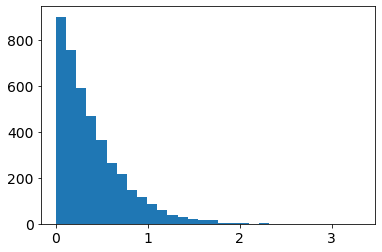

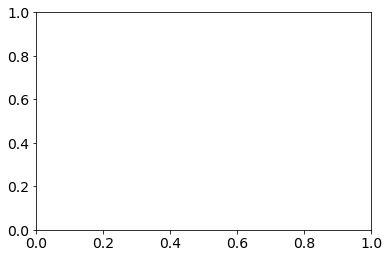

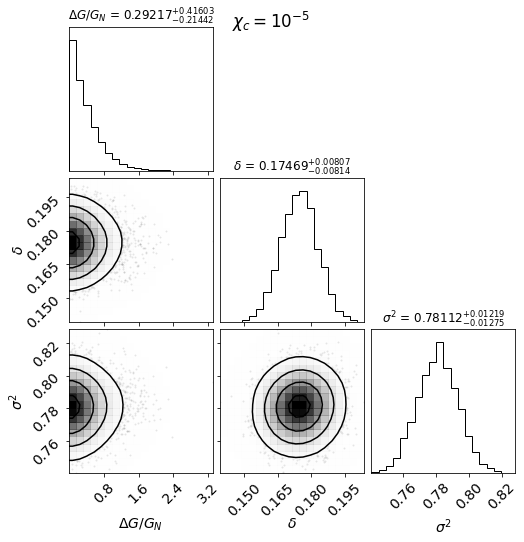

  0%|▏                                          | 4/918 [00:00<00:28, 32.11it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 8.758235525252664e-07
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 4.691638375915585e-07
10213-1902 [50] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 50.0 0.0 5.254859757482551e-07
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 2.315920729181346e-07
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0 0.0 1.737757373716384e-06
10218-12703 [50] [335.

  1%|▌                                         | 12/918 [00:00<00:28, 31.96it/s]

10218-3704 [50] [-0.2423, -0.7324, -0.4111, -0.2502, -0.1409, -0.2076, -0.2494, -0.3265, -0.3433, -0.3506, -0.3606, -0.3689, -0.3645, -0.3466, -0.4111, -0.2985]
10218-3704 50.0 0.0 1.049802179320668e-06
10219-9102 [50] [1.3962, 1.1814, 0.7492, 0.4692, 0.3335, 0.2205, 0.1532, 0.1423, 0.1945, 0.153, 0.0798, 0.0216, -0.0715, -0.157, -0.0196, -0.0532, -0.0405]
10219-9102 50.0 0.0 4.94422709194296e-07
10220-12705 [50] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 50.0 0.0 5.201780472653498e-07
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 3.633392789553759e-06
10224-9101 [50] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 50.0 0.0 2.9766144108561033e-07
10226-12704 [50] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694,

  2%|▉                                         | 20/918 [00:00<00:27, 32.95it/s]

10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 1.0475157221318066e-05
10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 7.873574116545287e-06
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 6.888495356701433e-06
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 50.0 0.0 6.302677711921276e-07
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 3.497374587022529e-06
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.0093

  3%|█▎                                        | 28/918 [00:00<00:27, 31.96it/s]

10495-12704 [50] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 50.0 0.0 4.3325252254005085e-06
10495-12705 [50] [871.1598, 1245.0304, 1205.1955, 1347.7893, 1374.3588, 1517.2635, 1622.8998, 1633.9971, 1757.8692, 1799.4196, 1854.634, 1999.5551, 1849.1662, 1882.4866, 1807.1303, 1651.9125, 1681.1326, 1493.9167, 2771.4516, 2121.0254, 1992.5196]
10495-12705 50.0 0.0 2.8992681859608435e-07
10495-3702 [50] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 50.0 0.0 6.26779119550883e-07
10496-12704 [50] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268.8121, 253.915, 333.7881, 358.7629, 315.1183, 261.3063, 216.6964, 267.188, 258.5169, 256.0365, 248.4992]
10496-12704 50.0 0.0 8.423239902124533e-07
10496-12705 [50] [-0.3

  3%|█▍                                        | 32/918 [00:01<00:28, 30.68it/s]

10499-3702 [50] [-0.3822, -0.1753, 0.3237, 0.6092, 0.8357, 0.9307, 1.1046, 1.1845, 1.1657, 1.064, 1.005, 1.0954, 0.7875, 0.8892, 0.9769, 1.0508, 1.3156, 1.2283]
10499-3702 50.0 0.0 5.517231917987185e-07
10499-3703 [50] [-0.0563, -0.0436, 0.024, 0.1267, -0.0775, -0.0664, 0.0153, -0.0929, -0.1244, -0.0851, -0.0939, -0.1131, -0.1033, -0.048, 0.0474, 0.0456, 0.0289, -0.0666, -0.0844, -0.5663]
10499-3703 50.0 0.0 8.928870618953999e-07
10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 8.38468786781305e-07
10500-12704 [50] [140.7935, 35.4055, 16.1502, 8.7997, 6.1202, 5.6067, 5.0715, 4.9205, 5.0767, 4.6234, 4.2501, 4.0673, 3.8962, 3.8831, 3.7867, 3.6009, 3.0687, 4.1948, 2.9642, 3.5448, 1.9938, -0.2753, 2.8838, 5.8145]
10500-12704 50.0 0.0 2.483659868800662e-07
10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 2.4521149774576064e-05
10500-3702 [50] [211.267, 568.975, 6

  4%|█▊                                        | 40/918 [00:01<00:28, 31.16it/s]

10500-3703 [50] [-0.028, -0.1828, 0.6642, 1.1037, 1.7094, 1.5507, 1.8019, 1.4925, 1.5792, 1.4772, 1.368, 1.4463, 1.2523, 1.4351, 1.2057, 0.9405, 0.5252, 1.657, 1.4263, 0.5704, 0.5717]
10500-3703 50.0 0.0 3.6459448914802244e-07
10501-12704 [50] [1.3181, 1.9521, 1.9474, 1.8957, 2.0169, 2.066, 2.2805, 2.1361, 1.7635, 1.5052, 2.0197, 2.1387, 2.493, 1.9877, 1.7896, 1.1205, 1.6972, 2.5971]
10501-12704 50.0 0.0 1.8154344398202541e-06
10501-6101 [50] [54.152, 240.5257, 446.403, 593.882, 679.4829, 745.3089, 578.3118, 397.5307, 268.9797, 276.8619, 234.4717, 196.8602, 156.2454, 140.6324, 64.5922]
10501-6101 50.0 0.0 1.124952149837928e-06
10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 50.0 0.0 4.003866053165012e-07
10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 4.37715363187447e-07
10503-9102 [50] [1.60

  5%|██▏                                       | 48/918 [00:01<00:28, 30.60it/s]

10506-9101 [50] [-0.2543, 0.5091, 0.8262, 0.5675, 0.2552, 0.0764, 0.0245, 0.0392, 0.0453, 0.0366, -0.0056, -0.0369, -0.0612, -0.0986, -0.132, -0.0742, -0.1191]
10506-9101 50.0 0.0 2.2798794813661438e-05
10508-12703 [50] [0.5005, 0.4509, 0.1544, 0.1328, 0.1165, 0.1176, 0.065, 0.1329, 0.2506, 0.179, 0.1788, 0.1204, 0.0037, 0.016, -0.0301, -0.0876]
10508-12703 50.0 0.0 3.1442900398969546e-06
10509-12703 [50] [1226.9439, 2166.987, 2538.8741, 2127.6504, 1648.0951, 1358.0909, 1167.9374, 985.8138]
10509-12703 50.0 0.0 8.254015308187766e-07
10509-1901 [50] [88.4511, 296.1948, 449.6905, 409.1127, 761.2326, 574.7336, 678.7086, 604.9771, 571.2616, 614.5332, 408.9334, 441.3848, 355.292, 300.996, 243.919, 230.1612, 180.5992, 163.4382, 176.2701, 193.176, 205.4741]
10509-1901 50.0 0.0 2.0785602611865568e-07
10509-6101 [50] [414.6573, 159.5598, 352.8386, 670.9188, 930.199, 434.1238, 984.9702, 921.6235, 784.8291, 825.2006, 827.4197, 661.5592, 624.5693, 894.3523, 620.0269, 747.519, 623.1939, 701.341, 57

  6%|██▍                                       | 52/918 [00:01<00:28, 30.71it/s]

10512-12701 [50] [-0.3741, -0.2352, -0.2444, -0.3467, -0.39, -0.3702, -0.2987, -0.245, -0.2376, -0.1861, -0.2187, -0.1372]
10512-12701 50.0 0.0 7.094993795376723e-07
10512-12705 [50] [-0.9971, -0.9962, -0.9967, -0.9971, -0.9969, -0.9968, -0.9961, -0.9958, -0.9964, -0.9971, -0.9977, -0.9977, -0.9977, -0.9976, -0.998]
10512-12705 50.0 0.0 1.281177815674705e-06
10512-9102 [50] [4147.3152, 2927.8473, 3245.8656, 2878.0674, 2617.7881, 2204.6977, 1695.8151, 1371.2689, 1298.2413, 1241.1228, 1357.9116, 1330.7104, 1714.839, 1930.3755, 2196.7284, 2401.8011, 2844.302, 3122.8481, 2925.4465]
10512-9102 50.0 0.0 6.538040853822957e-07
10513-12702 [50] [-0.9916, -0.9877, -0.9855, -0.9802, -0.9787, -0.98, -0.9868, -0.9787, -0.862, -0.9802]
10513-12702 50.0 0.0 1.6057471874597831e-06
10514-6103 [50] [0.5999, 0.3982, 0.2747, 0.2749, 0.0781, 0.0617, 0.0681, -0.0189, -0.0377, -0.0578, -0.065, -0.0594, 0.0253, -0.0317, 0.1182, -0.1428, -0.1895, -0.2508, -0.2991, -0.355]
10514-6103 50.0 0.0 2.9636792535593965

  7%|██▋                                       | 60/918 [00:01<00:29, 29.39it/s]

10517-6102 [50] [0.4712, 0.9172, 0.811, 0.5857, 0.3222, 0.2888, 0.1564, 0.1219, 0.169, 0.09, 0.1318, 0.0302, 0.061, 0.0297, 0.0658, 0.0113, 0.072, 0.0733, -0.0232, 0.0238, 0.0127, 0.0739, -0.0903, -0.0528]
10517-6102 50.0 0.0 3.2935262560903317e-07
10518-12705 [50] [-0.1971, 0.2795, 0.1103, -0.0254, -0.0161, -0.0, 0.0208, 0.0333, 0.0023, -0.0238, -0.0544, -0.1612]
10518-12705 50.0 0.0 2.107545211632812e-06
10518-1902 [50] [-0.0105, 0.2572, 0.0495, 0.0308, 0.0287, -0.0677, -0.0841, -0.0885, -0.1994, -0.1432, -0.1195, -0.1634, -0.1173, -0.1219, -0.165, -0.1325, -0.1731]
10518-1902 50.0 0.0 9.212274706919155e-07
10518-6102 [50] [-0.217, 1.2282, 0.4062, 0.3459, 0.382, 0.1799, 0.1478, 0.1175, 0.0995, 0.1358, 0.0812, 0.048, 0.0452, 0.0639, 0.0875, 0.0309, 0.0337, 0.0007, -0.0113, -0.1383]
10518-6102 50.0 0.0 6.134918532935118e-07
10519-12704 [50] [-0.2611, 0.2686, 0.1702, 0.0601, 0.0584, 0.0258, -0.0515, -0.1077, -0.1123, -0.1006]
10519-12704 50.0 0.0 1.3612180522375373e-06
10519-6102 [50] [

  7%|███                                       | 67/918 [00:02<00:29, 29.06it/s]

10520-12704 [50] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.0366, 0.0275, -0.0135, 0.0213, 0.0998, -0.1048, -0.1309]
10520-12704 50.0 0.0 4.29523252898526e-07
10520-6102 [50] [-0.9995, -0.9993, -0.9985, -0.9976, -0.9986, -0.9981, -0.9983, -0.9984, -0.9986, -0.9981, -0.9963]
10520-6102 50.0 0.0 7.5344729841902e-07
10838-9101 [50] [-0.0928, 0.4421, 0.4896, 0.3922, 0.2667, 0.3141, 0.2582, 0.2949, 0.294, 0.2543, 0.2198, 0.1153, 0.0076, -0.0625, -0.124, -0.1198, -0.272, -0.3696, -0.3534, -0.3974, -0.2337]
10838-9101 50.0 0.0 1.563149550260763e-06
10839-12705 [50] [0.5531, 0.4188, 0.6271, 0.6342, 0.4074, 0.3206, 0.1512, 0.1105, 0.1154, 0.1763, 0.2141, 0.3291, 0.2868, 0.1635, 0.0391, 0.4134, 0.1807]
10839-12705 50.0 0.0 2.3553948980123322e-06
10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712, 0.035, -0.0115, 0.0248, -0.0288, 0.0512, -0.0187, 0.0073, 0.0432, -0.0916, -0.1233, -0.1818, -0.1471]
10839-3704 50.0 0.0 5.716857144549541e-07
10839-6101 [50] [244.3098, 615.0842,

  8%|███▍                                      | 74/918 [00:02<00:28, 29.77it/s]

10839-9101 [50] [2.1426, 2.2648, 0.9796, 0.8183, 0.5304, -0.0332, -0.1785, -0.3432, -0.3468, -0.4742, -0.4095, -0.6139, -0.5305, -0.616, -0.529, -0.5494, 0.8162, 3.2784]
10839-9101 50.0 0.0 7.213618160205478e-07
10841-12701 [50] [-0.7323, -0.6652, -0.4249, -0.3016, -0.2957, -0.3482, -0.374, -0.3905, -0.3944, -0.4309, -0.4302, -0.4504, -0.4708, -0.4257, -0.4725]
10841-12701 50.0 0.0 1.7072474000176815e-06
10842-3702 [50] [-0.5415, 0.0585, 0.2828, 0.1825, 0.1674, 0.1342, 0.1324, 0.2899]
10842-3702 50.0 0.0 5.761958553231476e-07
10842-3703 [50] [-0.6099, -0.8101, -0.8807, -0.9171, -0.9297, -0.9289, -0.9268]
10842-3703 50.0 0.0 4.00562178173501e-07
10842-9101 [50] [-0.987, -0.9943, -0.9967, -0.9976, -0.9979, -0.998, -0.9982, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9981, -0.998, -0.9982, -0.9979, -0.9982, -0.9983]
10842-9101 50.0 0.0 8.768588911813075e-07
10845-12702 [50] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-1

  9%|███▋                                      | 80/918 [00:02<00:28, 29.73it/s]

11004-3703 [50] [5607.0165, 6199.0745, 5122.0907, 4588.5334, 3798.1606, 3256.1827, 2909.7374, 2623.1995, 2081.3703, 1622.0266, 1252.6703, 1054.2993, 797.551, 805.4299, 667.6425]
11004-3703 50.0 0.0 3.928105197579749e-07
11004-6104 [50] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 50.0 0.0 1.8359912199772447e-06
11009-12704 [50] [-0.044, 0.5574, 0.4941, 0.5156, 0.452, 0.4031, 0.3736, 0.4191, 0.4646, 0.4848, 0.558, 0.4716, 0.2432, 0.3821, 0.6252, 0.8487, 0.8601]
11009-12704 50.0 0.0 1.0128986213075892e-05
11009-6102 [50] [0.2368, -0.3064, 0.0765, 0.1736, 0.0574, 0.1163, 0.1754, 0.2052, 0.2777, 0.3634, 0.3506, 0.3192, 0.3455, 0.323, 0.4447, 0.1481, 0.2577, -0.1338, 0.037, 0.1218, 0.8549, -0.5202]
11009-6102 50.0 0.0 3.081083796345353e-07
11010-12705 [50] [-0.0199, 0.0369, -0.0512, -0.0961, -0.0616, -0.0525, -0.0667, -0.0148, -0.0176, -0.0486, -0.0929, -0.1237, -0.1411, -0.2784, -0.0549, -0.2411

  9%|███▉                                      | 86/918 [00:02<00:30, 27.72it/s]

11010-9101 [50] [2.5718, 0.9269, 0.2901, 0.1931, 0.0011, -0.0504, -0.0935, -0.075, 0.0093, 0.0203, 0.0025, -0.0251, -0.0362, 0.0004, 0.0161, -0.0012, -0.102, -0.364, -0.4377]
11010-9101 50.0 0.0 1.681667534603522e-06
11011-12703 [50] [9.8651, 35.0102, 40.3579, 54.0601, 192.4013, 365.0512, 378.092, 411.2362, 282.7202, 230.5846, 329.2445, 263.6472, 244.1501]
11011-12703 50.0 0.0 6.641446369287537e-07
11012-12705 [50] [0.2329, 0.5509, 0.2517, 0.0195, 0.0174, -0.0704, -0.1937, -0.145, -0.249, -0.0592, -0.302, -0.1828, -0.2112]
11012-12705 50.0 0.0 7.163220996087516e-06
11012-3702 [50] [7.8974, 3196.585, 2734.8285, 2253.8811, 4078.0168, 2401.2221, 2680.4924, 2677.0305, 2494.671, 2122.0656, 2023.2433, 2124.4295, 1742.4806, 1879.5204, 1353.859, 1265.244, 1077.374, 829.3809, 807.9255, 437.3493, 291.3315]
11012-3702 50.0 0.0 3.2335773938436337e-06
11012-9102 [50] [4.3613, 1.8587, 0.9243, 0.4611, 0.1717, 0.0565, -0.0003, -0.0124, 0.0149, 0.0346, 0.0094, 0.0256, 0.0391, 0.0441, 0.0302, -0.0599, -

 10%|████▏                                     | 92/918 [00:03<00:29, 28.38it/s]

11013-1902 [50] [0.7893, 0.6453, 0.5024, 0.4895, 0.4034, 0.2175, 0.0455, -0.0103, 0.0142, -0.2569, -0.0412, -0.2183, -0.1712, -0.0824, -0.3609, -0.2323, -0.3117]
11013-1902 50.0 0.0 2.402737795681579e-06
11013-3701 [50] [0.785, 0.6845, 0.2024, 0.0457, 0.0342, 0.02, -0.06, -0.0296, -0.0379, -0.1677]
11013-3701 50.0 0.0 3.503353892981636e-06
11013-3702 [50] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 50.0 0.0 6.477784708783189e-06
11013-6101 [50] [0.3389, -0.3422, -0.154, -0.2894, -0.4104, -0.4385, -0.4897, -0.4798, -0.43, -0.3971, -0.3753, -0.3775, -0.3376, -0.2419, -0.1243, 0.0068, -0.1557, 0.0318, -0.0178, 0.2532, 0.5345, 0.5099]
11013-6101 50.0 0.0 1.3965181036015533e-06
11017-12703 [50] [0.0185, 0.3093, 0.3468, 0.2632, 0.2308, 0.2072, 0.1992, 0.215, 0.2444, 0.2273, 0.053, -0.0123, 0.1078, -0.0553]
11017-12703 50.0 0.0 5.83275426621179e-07
11017-12704 [50] [0.4751, 0.4487, 0.3988, 0.2586, 0.0625, -0.0537, -0.0751, -0.1094, -0.1157, -0.1027, -0.1141, -0.118

 11%|████▍                                     | 98/918 [00:03<00:28, 29.00it/s]

11017-6103 [50] [-0.3235, -0.3265, -0.3479, -0.2253, -0.2261, -0.1769, -0.1311, -0.1075, -0.0747, -0.0989, -0.1378, -0.1695, -0.1257, -0.174, -0.178, -0.0714, -0.0163, 0.0028, 0.2262, -0.2731]
11017-6103 50.0 0.0 2.8105475677069336e-06
11017-9101 [50] [-0.5273, 0.0425, 0.2188, 0.1666, 0.07, 0.0407, -0.0503, -0.1282, -0.2004, -0.2244, -0.1722, -0.1497, -0.0815, -0.0967, -0.1443, -0.1476, -0.1864, -0.1536, -0.2264, -0.18]
11017-9101 50.0 0.0 6.964117179105984e-07
11018-12702 [50] [-0.9839, -0.9926, -0.9927, -0.9922, -0.9923, -0.9935, -0.9932, -0.9925, -0.9931, -0.994, -0.9941]
11018-12702 50.0 0.0 8.064793282633928e-07
11018-12704 [50] [-0.9989, -0.9988, -0.9986, -0.9987, -0.9988, -0.999, -0.999, -0.9991, -0.9991, -0.9987, -0.9984, -0.9975, -0.9987, -0.9989]
11018-12704 50.0 0.0 6.470466603626616e-07
11018-3702 [50] [0.6083, 0.007, 0.0959, 0.33, 0.5514, 0.4356, 0.3654, 0.3085, 0.3057, 0.287, 0.3004]
11018-3702 50.0 0.0 4.854829139668854e-07
11018-3703 [50] [-0.5454, 0.4164, 0.6741, 0.585

 11%|████▋                                    | 105/918 [00:03<00:28, 28.93it/s]

11019-12702 [50] [0.0142, 0.2516, 0.1906, 0.1378, 0.0877, -0.003, 0.0993, 0.0958, 0.1065, 0.1232, 0.2086, 0.1132, 0.0357, -0.0115, -0.014, 0.0302, -0.0875, -0.1071]
11019-12702 50.0 0.0 4.639364980876422e-07
11019-12703 [50] [-0.4993, -0.4671, -0.3698, -0.2654, -0.2024, -0.2445, -0.2033, -0.2117, -0.2752, -0.2285, -0.2102, -0.0702, -0.1699, 0.0858, -0.1757, -0.2987]
11019-12703 50.0 0.0 1.694537795807737e-06
11019-12705 [50] [0.9395, 1.6844, 1.8269, 0.8562, 0.7011, 1.016, 1.1247, 1.0992, 1.0844]
11019-12705 50.0 0.0 3.243536653296414e-06
11019-3701 [50] [2.5964, 1.3616, 0.9142, 0.3658, 0.0143, -0.1157, -0.1148, -0.102, -0.0691, -0.1802, -0.166, -0.2893, -0.0849]
11019-3701 50.0 0.0 4.1627991767301726e-07
11021-1902 [50] [5.9017, 3.1432, 2.8491, 1.9605, 1.7177]
11021-1902 50.0 0.0 2.4184399594559564e-06
11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 4.779771330664877e-06


 12%|████▉                                    | 111/918 [00:03<00:28, 28.38it/s]

11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 3.1521777558479494e-06
11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 3.0862648314213156e-05
11742-12704 [50] [0.6702, -0.5312, -0.3481, 0.0047, 0.1348, 0.415, 0.2787, 0.5138, -0.0348]
11742-12704 50.0 0.0 6.767869096057728e-07
11743-1901 [50] [-0.5717, -0.3943, -0.5273, -0.3736, -0.306, -0.392, -0.3766, -0.4151, -0.3665, -0.4111, -0.4236, -0.3424, -0.3877, -0.3594, -0.291, -0.4952, -0.6018]
11743-1901 50.0 0.0 3.5000122147149263e-06
11744-9102 [50] [-0.6298, 0.0464, 0.3943, 0.6247, 0.4097, 0.3518, 0.3414, 0.4046, 0.4742, 0.4313, 0.3693, 0.3275, 0.2214, 0.1278, 0.0812, 0.4043, 0.1792, -0.1336]
11744-9102 50.0 0.0 1.3259958962582195e-0

 13%|█████▏                                   | 117/918 [00:03<00:29, 27.40it/s]

11745-6104 [50] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.8527, 0.5703, 0.5078, 0.5176, 0.5143, 0.48, 0.4463, 0.4504, 0.4653, 0.4273, 0.4049]
11745-6104 50.0 0.0 1.5768359035756779e-06
11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.0361, -0.076, -0.0711, -0.1542, -0.2041, -0.2119, -0.1066, -0.2705, -0.3138]
11745-9101 50.0 0.0 5.632826701272706e-07
11746-3703 [50] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 50.0 0.0 1.8894757393591143e-06
11746-3704 [50] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 50.0 0.0 2.5564947193939816e-07
11746-9102 [50] [-0.478, -0.2133, -0.2528, -0.1774, -0.2077, -0.2266, -0.2099, -0.2691, -0.1996, -0.2114, -0.1249, -0.1799, -0.1765, -0.1376, -0.278

 13%|█████▍                                   | 123/918 [00:04<00:29, 27.07it/s]

11749-12701 [50] [-0.6821, -0.1137, 0.255, 0.1029, 0.0811, -0.0849, -0.2182, -0.1487, -0.1095, -0.0437, -0.1285, -0.1939]
11749-12701 50.0 0.0 1.5450707467955516e-06
11749-12704 [50] [1.1585, 1.0264, 1.2033, 1.4986, 1.8954, 2.0398, 2.1095, 2.1199, 1.4688, 1.3033, 0.9132, 0.8426, 0.0515, 0.4719, -0.3735]
11749-12704 50.0 0.0 3.4626767427658957e-06
11749-3701 [50] [618.0455, 872.9003, 1483.1859, 1615.2011, 1553.7949, 1334.0598, 1385.5396, 1283.8547, 1216.0833, 1294.494, 1472.7433, 1080.4933, 1346.7897, 1196.9726, 1091.8413, 1216.7304, 927.7028, 363.0292, 281.9853, 551.8779, 169.9359, 54.7426, 122.374, 379.7425, 27.1507]
11749-3701 50.0 0.0 1.1933924886029832e-06
11750-12701 [50] [0.4224, 0.3089, 0.0791, 0.0892, 0.2329, 0.2222, 0.1114, 0.03, 0.0196, 0.0027, 0.0313, 0.0827, 0.0275, 0.3095]
11750-12701 50.0 0.0 5.975660560720894e-07
11750-3701 [50] [1.5964, 1.8766, 1.9419, 1.999, 1.4725, 1.2873, 1.1333, 0.934, 0.9463, 0.8918, 0.7347, 0.8508, 0.6677, 0.4619, 0.3762, 0.1866, 0.0367, 0.0915, 0

 14%|█████▊                                   | 130/918 [00:04<00:27, 28.23it/s]

11750-9101 [50] [13.4461, 9.2464, 8.3896, 5.4399, 4.9554, 3.0033, 3.1782, 2.4566, 2.5343, 2.0961, 2.3663, 2.3818, 2.4375, 3.0403, 2.3998, 2.3406, 2.9409, 6.8913, 8.6024]
11750-9101 50.0 0.0 3.3983374383485274e-07
11751-1901 [50] [-0.9334, -0.8849, -0.9513, -0.9754, -0.9893, -0.9862, -0.989, -0.9902, -0.9893, -0.9909, -0.9903, -0.9906, -0.9888, -0.9874]
11751-1901 50.0 0.0 1.1923830395441524e-06
11751-6102 [50] [0.3738, 0.0535, 0.3785, 0.2124, 0.1333, 0.0258, -0.0223, -0.094, -0.1099, -0.1415, -0.1724, -0.2013, -0.1841, -0.253, -0.3949, -0.2255, -0.2141, -0.2775]
11751-6102 50.0 0.0 1.1419617303759786e-06
11753-3703 [50] [0.2801, 0.7604, 0.7391, 0.5795, 0.35, 0.1693, 0.0874, 0.0586, 0.0152, -0.0057, -0.0099, -0.0594, -0.1073, -0.139, -0.1496]
11753-3703 50.0 0.0 9.227601904484314e-07
11753-6104 [50] [1.7058, 1.5787, 1.7231, 1.492, 1.0043, 0.8699, 0.6579, 0.5905, 0.5042, 0.4712, 0.4504, 0.6153, 0.6589, 0.6817, 0.5206, 0.5457, 0.5195, 0.692]
11753-6104 50.0 0.0 6.117561020799287e-07
11754

 15%|██████                                   | 136/918 [00:04<00:29, 26.95it/s]

11755-6101 [50] [-0.0093, 1.0489, 0.9853, 1.2444, 1.0667, 0.8902, 0.7008, 0.6245, 0.5835, 0.5179, 0.397, 0.4083, 0.4791, 0.2148, 0.053]
11755-6101 50.0 0.0 1.3535258361051646e-06
11755-9102 [50] [0.1799, 0.2485, 0.3504, 0.383, 0.2088, 0.1465, 0.0712, -0.0042, -0.0415, -0.0215, 0.0671, 0.0623, 0.1393, -0.1017, 0.125, -0.214, -0.1458]
11755-9102 50.0 0.0 4.625707102584515e-07
11758-3701 [50] [-0.3091, 0.0326, 0.2349, 0.1141, 0.0113, 0.06, -0.0268, -0.1507, -0.2171, -0.1994, -0.1587, -0.1557, -0.1574, -0.1614, -0.0618]
11758-3701 50.0 0.0 9.642776037884369e-07
11758-3702 [50] [-0.544, -0.1141, 0.0167, 0.1028, 0.0854, -0.0041, -0.0149, 0.0406]
11758-3702 50.0 0.0 6.164421265968674e-07
11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 50.0 0.0 9.08725175503229e-07
11759-6102 [50] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, -0.

 15%|██████▎                                  | 140/918 [00:04<00:27, 28.20it/s]

11760-12703 [50] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0.539, 0.1155, 0.1223, 0.309]
11760-12703 50.0 0.0 3.963337897213536e-07
11760-6101 [50] [0.4533, -0.0157, 0.5654, 0.502, 0.3995, 0.359, 0.3287, 0.2964, 0.2063, 0.2512, 0.2686, 0.2421, 0.2368, 0.1884, 0.0906, -0.0471, -0.3849, -0.319, -0.8166]
11760-6101 50.0 0.0 1.6739092913299597e-06
11760-6103 [50] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.2117, -0.2373, -0.2365, -0.2317, -0.3078, -0.2653, -0.3184, -0.2638]
11760-6103 50.0 0.0 3.0420921821233863e-07
11760-9102 [50] [-0.8049, -0.6427, -0.2931, -0.1213, 0.1899, 0.0235, 0.108, 0.1381, 0.1732, 0.1865, 0.1624, 0.1963, 0.1218, 0.1215, 0.1223, 0.2636, 0.046, 0.5962, 0.1808, 0.9922, 2.2582]
11760-9102 50.0 0.0 3.2196319614178114e-07
11761-12702 [50] [-0.6826, -0.6017, -0.2216, -0.1122, -0.0329, -0.02, -0.0711, -0.0937, -0.0782, -0.098, -0.1546, -0.1024, -0.1043, -0.0648, -0.

 16%|██████▋                                  | 150/918 [00:05<00:26, 29.27it/s]

11761-12705 [50] [6.8127, 3.6941, 2.4845, 1.3644, 0.5363, 0.2844, 0.104, -0.1]
11761-12705 50.0 0.0 1.0567766043455046e-06
11823-9101 [50] [15949.1976, 8800.0053, 8323.3916, 4811.1692, 2214.9858, 717.2733, 413.2719, 305.7873, 173.5393, 146.0478, 195.6604, 224.7593, 189.4201, 67.1778]
11823-9101 50.0 0.0 7.784651051398209e-07
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 6.5301882327669e-06
11828-12703 [50] [-0.5587, -0.2913, 0.1844, 0.3112, 0.2627, 0.2124, -0.0354, -0.0957, -0.1295, -0.1601, -0.0565, -0.1246, 0.0413]
11828-12703 50.0 0.0 1.121637523899076e-06
11830-12701 [50] [-0.9938, -0.9825, -0.9834, -0.9912, -0.9934, -0.9941, -0.9946, -0.9933, -0.9936, -0.9951, -0.9951, -0.9944, -0.9947, -0.9932, -0.9955, -0.9854, -0.997, -0.9939, -0.9962]
11830-12701 50.0 0.0 7.801452525347714e-07
11830-12703 [50] [-0.4776, 0.0437, 0.1582, -0.0709, -0.1607, -0.0754, 0.055, 0.2665, 0.1845, 0

 17%|██████▉                                  | 156/918 [00:05<00:25, 29.36it/s]

11830-6104 [50] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.0353, -0.2063, -0.258, -0.2347, -0.2692, -0.3985]
11830-6104 50.0 0.0 8.670199287533121e-07
11831-12703 [50] [0.4472, 0.0224, 0.062, 0.158, -0.0429, -0.0922, -0.1252, -0.188, -0.1276, -0.16, -0.2596, -0.2165, 0.1708, -0.4595]
11831-12703 50.0 0.0 4.1641508133704194e-06
11831-12704 [50] [-0.5822, -0.2435, 0.0115, -0.0848, -0.1704, -0.028, -0.0888, -0.0323, -0.0445, -0.106, -0.3871, -0.1836]
11831-12704 50.0 0.0 1.0021806657502988e-06
11831-6101 [50] [-0.9875, -0.994, -0.9968, -0.9973, -0.9967, -0.9975, -0.9969, -0.9978, -0.9979, -0.9971, -0.9984, -0.9986, -0.9985, -0.9974]
11831-6101 50.0 0.0 3.1589099806031274e-07
11831-6102 [50] [1.041, 0.6096, 0.4053, 0.165, 0.0902, 0.1922, 0.1873, 0.1187, 0.1055, 0.0085, -0.1108, -0.0737]
11831-6102 50.0 0.0 1.3580871499671162e-06
11833-9102 [50] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0

 18%|███████▏                                 | 162/918 [00:05<00:26, 28.85it/s]

11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 1.0724695244094039e-05
11836-1902 [50] [0.7026, 1.2767, 1.1865, 1.1009, 0.973, 0.9921, 0.7024, 0.7206, 0.623, 0.6145, 0.5505, 0.5955, 0.6037, 0.4142, 0.4147]
11836-1902 50.0 0.0 1.2873324597152057e-06
11838-12701 [50] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 0.1336, 0.0903, 0.0213, -0.0554, -0.0342, 0.0225, 0.0053, -0.0272]
11838-12701 50.0 0.0 6.410663484129081e-07
11838-12703 [50] [144.9042, 254.2159, 538.0129, 911.0748, 1089.8377, 1111.2623, 1284.2649, 1228.3752, 1345.2496, 1400.7846, 1427.4787, 1434.5371, 1257.47, 1184.9615, 998.2342, 830.6266, 670.98, 596.3078, 488.5417, 423.536, 329.6538, 32.3109, 5.6457, 31.8479]
11838-12703 50.0 0.0 1.265732174889763e-06
11838-3702 [50] [0.536, 0.7094, 0.6061, 0.6555, 0.6466, 0.6204, 

 18%|███████▌                                 | 168/918 [00:05<00:26, 28.51it/s]

11838-9101 [50] [11.4727, 10.3246, 9.7757, 7.6641, 6.3263, 7.7985, 4.6854, 6.1379, 3.8072, 5.5203, 3.0518, 3.9759, 1.4403, 2.8333, 2.6956, 2.5542]
11838-9101 50.0 0.0 6.800604523607535e-07
11865-12702 [50] [-0.057, -0.0512, 0.0778, -0.0002, -0.0743, -0.0834, -0.0854, 0.0083, -0.0154, -0.0332, -0.07, -0.1612, -0.2706]
11865-12702 50.0 0.0 1.3851564861683349e-06
11865-12704 [50] [0.4447, -0.0557, -0.3894, -0.457, -0.5111, -0.5109, -0.5238, -0.5353, -0.4955, -0.5012, -0.4831, -0.4726, -0.599, -0.615]
11865-12704 50.0 0.0 5.590569103006382e-07
11865-1901 [50] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 50.0 0.0 1.2572460215310865e-06
11865-1902 [50] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0.4429]
11865-1902 50.0 0.0 4.918178421408329e-07
11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 1.2498257841391148e-06


 19%|███████▊                                 | 174/918 [00:05<00:26, 28.02it/s]

11865-9102 [50] [-0.467, -0.4695, -0.4789, -0.5286, -0.6182, -0.6445, -0.6408, -0.6047, -0.6031, -0.6243, -0.655, -0.6895, -0.6998, -0.5904, -0.6729, -0.6983]
11865-9102 50.0 0.0 4.2814145436907714e-07
11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2771, 0.298, 0.3814, 0.3262, 0.2102, 0.3978, 0.4467, 0.2866, 0.1214, 0.2202, 0.1346, 0.4041]
11867-6104 50.0 0.0 1.9553882897787025e-06
11867-9101 [50] [0.9073, 0.3027, 0.1546, 0.1123, 0.0285, 0.0159, -0.0244, 0.0205, 0.0824, 0.1908, 0.2079, 0.2195, 0.3058, 0.2425, 0.1871, 0.3056]
11867-9101 50.0 0.0 8.474781892697928e-07
11868-12703 [50] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 1.5250789965650297e-06
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 6.877716655147479e-06
11871-6103 [50] [0.7182, 0.8575, 0.776, 0.4737, 0.2556, 0.1173, 0.1395, 0.111, 0.0842, 0.0381, 0.0003, -0.0281, -0

 20%|████████                                 | 180/918 [00:06<00:26, 27.72it/s]

11940-1902 [50] [-0.0835, 0.1518, 0.1321, 0.0182, -0.0843, -0.1452, -0.1779, -0.1993, -0.1955]
11940-1902 50.0 0.0 4.994290038797029e-06
11940-3703 [39.98171256281407] [1.1615, 1.5645, 1.5154, 1.5213, 1.3625, 1.1856, 0.9977, 0.7191, 0.6591, 0.6153, 0.3767, 0.433, 0.6417, 0.1616, 0.444, 0.2018, 0.0806, 0.2143, 0.1328]
11940-3703 39.98171256281407 1.1212079338714073e-08 1.7858873046086159e-07
11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 4.780007741744214e-05
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 3.6023327796785664e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 3.660110271670215e-05
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389

 20%|████████▎                                | 186/918 [00:06<00:27, 26.99it/s]

11942-6104 [50] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 50.0 0.0 3.5084598425027493e-07
11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.0425, -0.0331, -0.0546, -0.0982, -0.1371, -0.164, -0.179, -0.1863, -0.172, -0.1572, -0.1563, -0.1648, -0.1726, -0.27]
11943-3703 50.0 0.0 1.1841217000267443e-05
11944-12701 [50] [-0.3604, -0.3617, -0.4276, -0.5869, -0.6347, -0.6283, -0.548, -0.5758, -0.5204, -0.4847, -0.4769, -0.4857, -0.5345, -0.6334, -0.5353, -0.5098]
11944-12701 50.0 0.0 1.629654874481475e-06
11945-12701 [50] [0.3961, 0.2879, 0.3765, 0.1557, -0.0002, -0.113, -0.1502, -0.128, -0.114, -0.1705, -0.0344, 0.0462, 0.017]
11945-12701 50.0 0.0 4.066833571704119e-06
11945-6101 [50] [0.2057, 0.8606, 0.9637, 0.605, 0.4694, 0.2734, 0.2029, 0.1332, 0.0558, -0.0105, 0.0015, 0.0011, -0.0038, -0.016, 0.0504, -0.0338]
11945-6101 50.0 0.0 6.4989027768601125e-06
11945-6102 [50] [3.5224, 2.2109, 1.

 21%|████████▌                                | 192/918 [00:06<00:27, 26.73it/s]

11947-6103 [50] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 50.0 0.0 1.146977847220615e-06
11949-12701 [50] [1.1975, 0.3408, 0.1441, 0.1243, 0.0225, 0.0003, 0.0028, 0.027, 0.0197, 0.0192, -0.0295, -0.0839]
11949-12701 50.0 0.0 1.7518944629712145e-06
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 1.1618809736858416e-05
11954-12704 [50] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453, 0.1801, 0.125, 0.0276, -0.0116, -0.0744, -0.134, -0.1626, -0.2559, -0.2802]
11954-12704 50.0 0.0 6.090184645407138e-06
11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.2778]
11954-3703 50.0 0.0 6.577483540799169e-06
11954-9101 [50] [-0.9882, -0.9937, -0.9946, -0.9965, -0.9974

 22%|████████▊                                | 198/918 [00:06<00:27, 26.51it/s]

11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 2.0083618356425696e-06
11956-12702 [50] [5.6953, 5.0804, 3.2564, 2.1056, 1.2622, 0.6457, 0.4602, 0.5373, 0.9503, 3.7649, 5.1679]
11956-12702 50.0 0.0 1.3028423882960872e-06
11956-12705 [50] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 0.2419, 0.2565, 0.3525, 0.1776, 0.103, 0.3387, 0.3814, 0.7221, 0.77]
11956-12705 50.0 0.0 8.032466075162797e-07
11957-12704 [50] [-0.3492, 0.7667, 0.6853, 0.5861, 0.3661, 0.189, 0.1584, 0.1015, -0.0026, 0.0319, 0.1228, 0.1275, 0.2204, 0.0938]
11957-12704 50.0 0.0 4.051276361621198e-07
11957-9101 [50] [127.5969, 337.5453, 692.0501, 754.6672, 761.8038, 673.5367, 561.8056, 470.5271, 446.8561, 434.7914, 434.701, 432.6297, 423.9362, 415.9254, 409.4146, 409.8788]
11957-9101 50.0 0.0 2.8736782437281227e-06
11957-9102 [50] [1.0969, 0.3397, 0.6198, 1.0919, 1.791, 2.069, 2.6145, 2.7123, 2.807

 22%|█████████                                | 204/918 [00:07<00:27, 26.10it/s]

11958-6103 [50] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 50.0 0.0 4.335286665995981e-07
11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 1.8497570873603955e-06
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 50.0 0.0 4.7148552057696315e-06
11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.9843, 0.6333, 0.3517, 0.1829, 0.1258, 0.0956, 0.1424, 0.1021, 0.028, 0.1221]
11965-9102 50.0 0.0 1.5759652606138935e-06
11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 6.413173952694488e-06
11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.89

 23%|█████████▏                               | 207/918 [00:07<00:27, 25.75it/s]

11970-12703 [50] [-0.4888, -0.3498, -0.0561, 0.1594, 0.1669, 0.133, 0.154, 0.1676, 0.144, 0.1071, 0.072, 0.0457, 0.046, 0.0501, 0.1262, -0.0083, 0.2366]
11970-12703 50.0 0.0 2.0653946132303444e-07
11970-6102 [50] [-0.0116, -0.0683, -0.0558, -0.0053, 0.0454, 0.025, 0.078, -0.0283, -0.085, -0.1052, -0.0602, -0.0272, -0.0693, -0.0116, -0.1378, -0.2799, -0.2497]
11970-6102 50.0 0.0 7.588060938850531e-07
11970-6103 [50] [0.7466, 1.1751, 1.6643, 1.3977, 1.0416, 0.8262, 0.6871, 0.5199, 0.4194, 0.3266, 0.2718, 0.2909, 0.2357, 0.2575, 0.2139, 0.0837, -0.0144, -0.0619, 0.133]
11970-6103 50.0 0.0 2.0539356358742385e-06
11974-12702 [50] [-0.5341, -0.4596, -0.3852, -0.2683, -0.2117, -0.2349, -0.22, -0.1969, -0.1731, -0.1829, -0.2133, -0.2538, -0.2357, -0.256, -0.1504, -0.1437, -0.1349, 1.1183]
11974-12702 50.0 0.0 3.247807871147199e-06
11975-12701 [50] [-0.1741, -0.13, 0.3291, 1.0808, 1.3321, 1.3798, 1.0057, 0.9745, 0.8989, 0.5699, 0.4672, 0.2163]
11975-12701 50.0 0.0 2.078274217952324e-07
11975-12

 23%|█████████▌                               | 213/918 [00:07<00:28, 24.81it/s]

11975-3703 [50] [-0.2597, -0.0329, 0.0768, 0.0833, 0.1048, 0.0682, 0.0342, -0.0156, -0.0756, -0.093, -0.0695, -0.0466, 0.0656, -0.0085, 0.1237, 0.1334, 0.0646]
11975-3703 50.0 0.0 1.861794830079949e-06
11975-6104 [50] [1.0196, 1.2709, 1.5062, 1.1104, 0.9965, 0.7778, 0.776, 0.6311, 0.7603, 0.6278, 0.6208, 0.5151, 0.5172, 0.5343, 0.2326, 0.5012, 0.187, 0.4522, 0.1401, 0.1327]
11975-6104 50.0 0.0 1.3270875350811019e-06
11976-12703 [50] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 50.0 0.0 1.0355683055172781e-06
11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 50.0 0.0 6.938453945920456e-07
11978-12705 [50] [0.0184, 0.0968, 0.695, 0.4819, 0.223, 0.1168, 0.1458, 0.1604, 0.1304, 0.1363, 0.1451, 0.1188, 0.0734, 0.0413, 0.0374, 0.0059, 0.0584, 0.0708]
11978-12705 50.0 0.0 1.1192530331882882e-06

 24%|█████████▊                               | 219/918 [00:07<00:28, 24.93it/s]

11979-12703 [50] [0.3188, 0.2646, 0.4444, 0.4735, 0.4231, 0.2818, 0.2037, 0.1891, 0.1975, 0.1625, 0.205, 0.2447, 0.1501, 0.1763, 0.1339, 0.4567, 0.4255, 0.53]
11979-12703 50.0 0.0 1.2291430504426381e-05
11979-12704 [50] [1.0417, 0.8488, 0.6206, 0.5652, 0.598, 0.4342, 0.2822, 0.1334, 0.0604, 0.0319, 0.0291, -0.01, -0.083, -0.0554, -0.0215, -0.0081, 0.0344]
11979-12704 50.0 0.0 3.9935995065058925e-07
11979-9101 [50] [0.4094, -0.1099, -0.2651, -0.4134, -0.4241, -0.4727, -0.5, -0.5199, -0.5395, -0.5666, -0.5927, -0.5903, -0.6162, -0.591, -0.6704, -0.611]
11979-9101 50.0 0.0 8.328321078303161e-07
11979-9102 [50] [0.6334, -0.323, -0.1351, -0.0857, 0.0053, 0.0302, 0.0467, 0.0752, 0.0566, 0.0459, 0.0116, 0.0269, 0.0046, -0.0156, -0.091, -0.1558, -0.3105, -0.4242, -0.5324]
11979-9102 50.0 0.0 1.070292445415212e-06
11981-12702 [50] [293.567, 690.112, 683.5389, 617.2849, 490.646, 374.3616, 455.8674, 450.3051, 457.9927, 478.543, 404.234]
11981-12702 50.0 0.0 3.558519581778991e-07
11981-12704 [50] 

 25%|██████████▏                              | 228/918 [00:08<00:26, 25.80it/s]

11981-9102 [50] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188, -0.1444, -0.128, -0.1812, -0.1904, -0.2284, -0.2044, -0.2061, -0.1486, -0.2345, -0.2114, 0.0329, 0.7603]
11981-9102 50.0 0.0 5.365827043945699e-07
11982-12704 [50] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.1555, 0.0797, -0.029, 0.0037, 0.2331]
11982-12704 50.0 0.0 7.284622652613271e-07
11982-3703 [50] [-0.314, 0.4086, 0.6273, 0.7714, 0.9457, 0.986, 1.0945, 1.392, 1.3945, 1.539, 1.4145, 1.0397, 1.0282, 0.5616, 0.557, 0.0557]
11982-3703 50.0 0.0 5.704309091562115e-07
11982-6102 [5.941523618090452] [0.7786, 0.4297, 0.4569, 0.7506, 0.7926, 0.6732, 0.6507, 0.5035, 0.3848, 0.2963, 0.4923, 0.064, 0.2848, -0.0122, 0.3417, -0.0773, -0.7924]
11982-6102 5.941523618090452 4.224832767303104e-08 1.4708490692101183e-07
11982-9102 [50] [-0.6167, -0.1298, 0.3235, 1.2078, 1.1438, 0.8069, 0.6394, 0.4963, 0.4228, 0.3252, 0.3069, 0.2838, 0.3393, 0.4905, 0.4567, 0.2

 25%|██████████▎                              | 231/918 [00:08<00:28, 24.50it/s]

11984-12702 [50] [-0.2774, -0.3248, -0.3706, -0.3541, -0.339, -0.3481, -0.2877, -0.2577, -0.2022, -0.1466, -0.1889, -0.2485, -0.0638, -0.2124, -0.1581, -0.3914, -0.132]
11984-12702 50.0 0.0 3.940793607398042e-06
12066-3701 [50] [19.2418, 16.9197, 10.1428, 6.0915, 4.4316, 3.0783, 2.9929, 2.3906, 2.7183, 2.8356, 3.2869, 3.669, 3.475, 3.6088, 2.499, 1.7084, 1.9485, 1.5899]
12066-3701 50.0 0.0 2.3821490960293673e-06
12067-12703 [50] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
12067-12703 50.0 0.0 6.433502439891461e-07
12067-12705 [50] [0.4291, 1.3434, 2.0219, 1.7622, 1.0305, 0.7583, 0.4763, 0.1261, 0.0511, 0.0662, 0.1502, 0.2361, 0.2324, 0.212, 0.3434]
12067-12705 50.0 0.0 9.963811436723023e-07
12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 3.596162765023785e-05


 26%|██████████▌                              | 237/918 [00:08<00:27, 24.48it/s]

12068-6104 [50] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 50.0 0.0 1.7715771905061246e-06
12069-12704 [50] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 50.0 0.0 1.1025965011336778e-06
12069-12705 [50] [1.7332, 1.137, 0.4096, 0.6564, 0.5837, 0.6168, 0.2246, 0.0587, 0.2617, 0.1538, 0.5607, 0.4132, 0.5307, 0.41, 2.8782]
12069-12705 50.0 0.0 1.0811381686240258e-06
12069-6102 [50] [-0.3102, -0.0764, -0.2402, -0.1833, -0.1952, -0.2158, -0.2095, -0.1861, -0.144, -0.1353, -0.1037, -0.1026, -0.0816, -0.0956, -0.1367, -0.1477, -0.0871, -0.0667, -0.0387, -0.58, -0.56, -0.5359, -0.8946, 0.038]
12069-6102 50.0 0.0 1.1454632493665127e-06
12071-12701 [50] [-0.9172, -0.8384, -0.6786, -0.6994, -0.7429, -0.7686, -0.7662, -0.8217, -0.8275, -0.8401, -0.7831, -0.8143]
12071-12701 50.0 0.0 8.2535

 26%|██████████▊                              | 243/918 [00:08<00:27, 24.63it/s]

12071-3702 [50] [43.1041, 1833.3653, 2193.0557, 2409.7616, 2285.0769, 1925.6484, 1966.7994, 2043.2628, 1997.8474, 1832.4832, 1658.3071, 1528.5931, 1298.5116, 1014.8264, 552.6982, 136.4828]
12071-3702 50.0 0.0 8.028085516185307e-07
12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.3083, 398.9949, 258.1108, 178.8144, 146.4641, 210.3609, 51.4796, 32.8354, 22.052]
12071-3704 50.0 0.0 9.621288335639073e-07
12075-12704 [50] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 50.0 0.0 3.9079834873621706e-06
12078-12703 [50] [0.3298, 0.5608, 0.2182, 0.3221, 0.2303, 0.0896, 0.0846, 0.2051, 0.3186, 0.33, 0.2532]
12078-12703 50.0 0.0 9.285104373697719e-07
12078-6103 [50] [1.9637, 5.3953, 4.122, 4.276, 4.2033, 3.4926, 3.3028, 3.2038, 3.1762, 3.0769, 2.868, 2.5911, 2.6527, 2.4952, 2.6226, 2.6979, 2.1328, 1.6158, 1.3218, 1.8508]
12078-6103 50.0 0.0 5.296855678097253e-07


 27%|███████████                              | 249/918 [00:08<00:27, 24.26it/s]

12079-12705 [50] [5.9457, 5.134, 4.915, 2.376, 2.7696, 2.3345, 1.3415, 1.441, 1.4148, 0.8317, 1.0553, 1.0687, 0.9662, 0.8766, 1.1537, 1.4538, 0.8336]
12079-12705 50.0 0.0 2.9290941402051327e-07
12080-12704 [50] [798.4646, 1129.8436, 1685.7177, 1551.5379, 1648.9794, 1528.8158, 1510.5353, 1488.9904, 1518.2012, 1430.3202, 1355.0599, 1297.2544, 1371.7431, 1127.7862, 1194.7794, 1062.3493, 1183.2366, 942.8748, 761.5148, 256.7283, 914.8231, 836.9712]
12080-12704 50.0 0.0 2.467440847331197e-07
12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 7.819318799445534e-06
12082-12702 [50] [52.4225, 34.225, 22.353, 15.87, 12.6473, 9.0293, 9.0994, 7.7946, 7.7752, 7.6215, 7.2913, 5.8669, 7.5773, 10.9051, 27.4723, 42.4809, 31.8612, 44.26]
12082-12702 50.0 0.0 1.914753270523979e-06
12084-12702 [50] [0.4179, 1.0492, 0.9255, 0.717, 0.5874, 0.4344, 0.359, 0.2445, 0.1712, 0.1342, 0.2131, 0.2682, 0.31

 28%|███████████▍                             | 255/918 [00:09<00:27, 23.86it/s]

12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-12705 50.0 0.0 7.221484276739152e-07
12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.419, 0.387, 0.4139, 0.5272, 0.4564, 0.6029, 0.4957, 0.5971, 0.6267, 0.5749, 0.7061, 0.6081, 0.5243, 0.4383, 0.5097, 0.4647, 0.2768, 0.3996, 0.231, 0.2274, 0.4698, 0.2204, 0.2727]
12084-1901 50.0 0.0 6.057259643105924e-07
12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
12084-3702 50.0 0.0 7.545353130014573e-07
12084-3703 [50] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.866, 9.9199, 8.0438, 7.1191, 7.1184, 4.9585, 5.2578]
12084-3703 50.0 0.0 1.2431478408294955e-06
12084-6104 [50] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.0

 28%|███████████▌                             | 258/918 [00:09<00:27, 24.32it/s]

12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0.0071, -0.0873, -0.0572, 0.0209, 0.0881, 0.0588, 0.0753, 0.0542]
12085-12704 50.0 0.0 2.1722688273464616e-05
12085-6101 [50] [-0.1417, -0.3914, -0.1738, -0.0755, -0.0973, -0.0439, -0.1113, -0.1774, -0.1947, -0.1728, -0.1408, -0.1367, -0.1146, -0.1045, -0.1506, -0.0235, -0.0308, -0.0502, 0.0507]
12085-6101 50.0 0.0 8.04883639913498e-06
12085-6103 [50] [-0.549, -0.354, -0.3619, -0.3336, -0.3191, -0.1878, -0.2268, -0.2779, -0.144, -0.2236, -0.1423, -0.1582, -0.1565, -0.2223, -0.1937, -0.2795, -0.2396, -0.2355, -0.213, -0.3557, -0.311]
12085-6103 50.0 0.0 4.3905132284069077e-07
12085-9102 [50] [0.6086, 0.5632, 0.3343, 0.2119, 0.1282, 0.0402, 0.0288, 0.0478, 0.0313, 0.001, -0.0532, -0.0537, -0.0634, -0.0662, -0.1794, -0.1779, -0.239]
12085-9102 50.0 0.0 6.367342042031432e-07
12088-12705 [50] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-1270

 29%|███████████▊                             | 264/918 [00:09<00:27, 24.06it/s]

12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-12702 50.0 0.0 6.126223966749405e-07
12089-12704 [50] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 50.0 0.0 3.3099181929311596e-06
12089-1901 [50] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 50.0 0.0 9.0802178893996e-06
12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722, -0.1642, -0.1028, -0.1287, -0.1434, -0.0908, -0.1289, -0.1084, -0.2404, -0.097, 0.1709, -0.3201, -0.0196, -0.302]
12089-6103 50.0 0.0 1.7854734639144302e-06
12092-6101 [50] [0.0026, 0.3918, 0.1405, 0.0977, 0.005, 0.0277, 0.1281, 0.0885, 0.0628, 0.0291, -0.0173, -0.1181]
12092-6101 50.0 0.0 2.1593007221381266e-06


 29%|████████████                             | 270/918 [00:09<00:27, 23.59it/s]

12093-9101 [50] [-0.9989, -0.997, -0.9973, -0.998, -0.9985, -0.9987, -0.9987, -0.9986, -0.9986, -0.9987, -0.9983, -0.9981, -0.9979, -0.9991, -0.9971]
12093-9101 50.0 0.0 4.548427639998508e-06
12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 40.9064, 40.0677, 39.5836, 40.4106, 39.3101, 37.4365, 38.9587, 41.7447, 41.525, 40.104, 39.0721, 39.6893, 56.2685, 25.7726, 27.1981, 33.78]
12094-3701 50.0 0.0 1.4078940061268292e-06
12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 1.763840092520637e-06
12483-12703 [50] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -0.0898]
12483-12703 50.0 0.0 1.362661827132773e-06
12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 6.899705116330626e-07


 30%|████████████▎                            | 276/918 [00:10<00:27, 23.16it/s]

12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 7.912087290660049e-07
12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 50.0 0.0 9.59462399984769e-07
12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696, 2047.2799, 2334.4928, 2266.757, 2196.3005, 1862.0235, 1612.2288, 2078.9089]
12488-6102 50.0 0.0 1.4536731871645025e-06
12488-9101 [50] [0.89, -0.0571, 0.0018, 0.0675, 0.0814, 0.1021, 0.1178, 0.0708, 0.0758, 0.1268, 0.0533, 0.0597, 0.0532, 0.0414, 0.1038, 0.0181, -0.1356, -0.2319, -0.1377]
12488-9101 50.0 0.0 2.3410965771684834e-06
12489-3703 [50] [6.1258, 7.3921, 7.9142, 7.3592, 6.7186, 6.0984, 5.5884, 5.3024, 5.0796, 4.2963, 4.3283, 3.7505, 4.11, 3.5385, 4.098]
12489-3703 50.0 0.0 2.61189611854662

 30%|████████████▍                            | 279/918 [00:10<00:27, 22.94it/s]

12490-3701 [50] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-3701 50.0 0.0 2.9336019794962565e-06
12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0.0863]
12506-12701 50.0 0.0 4.587723127231935e-06
12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0.0 8.016971136318291e-07
12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0 0.0 5.718068187771611e-07
12512-12702 [50] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 50.0 0.0 6.2

 31%|████████████▋                            | 285/918 [00:10<00:26, 23.58it/s]

12514-12702 [50] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 50.0 0.0 5.517378522894439e-07
12514-12703 [16.162301005025125] [2.1408, 0.3201, 0.1941, 0.0194, 0.03, 0.0603, 0.1872, 0.1977, 0.0662, 0.1145, 0.0325, -0.0142, 0.021, -0.0315, -0.0845, -0.0224]
12514-12703 16.162301005025125 1.0295317555807612e-08 1.794284064221193e-07
12514-9102 [50] [-0.6627, -0.5978, -0.3356, -0.1465, -0.1607, -0.0924, -0.0736, -0.019, 0.0855, 0.1041, 0.0741, -0.06, -0.1592, -0.1356, -0.0632, -0.2008, -0.2854]
12514-9102 50.0 0.0 6.590466244902039e-07
12518-12705 [50] [-0.8683, -0.7393, -0.3648, -0.0579, -0.0274, -0.0334, -0.0145, 0.016, -0.0154, 0.0703, -0.1575, 0.0272]
12518-12705 50.0 0.0 6.660064114238102e-07
12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 

 32%|████████████▉                            | 291/918 [00:10<00:25, 24.21it/s]

12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 3.007627450772143e-06
12620-6104 [50] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 50.0 0.0 4.0393855727751135e-07
12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 2.330310596392197e-06
12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903, -0.5645]
12621-12705 50.0 0.0 5.052526034357008e-07
12621-6103 [50] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 50.0 0.0 4.088575764703326e-07


 32%|█████████████▎                           | 297/918 [00:10<00:26, 23.07it/s]

12622-9101 [50] [0.295, -0.1664, 0.1745, 0.5326, 0.7376, 0.7334, 0.6499, 0.6151, 0.5534, 0.5303, 0.427, 0.3612, 0.3993, 0.3837, 0.4878, 0.4757, 0.3843, 0.0845]
12622-9101 50.0 0.0 2.8833800548937507e-06
12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 1.8522989050408609e-06
12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 6.33130871116221e-06
12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 1.3236417283017456e-06
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 2.183936013738395e-06


 33%|█████████████▍                           | 300/918 [00:11<00:27, 22.59it/s]

12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 4.3379805454378795e-06
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 5.479410277764501e-06
12679-12701 [50] [-0.4106, -0.1602, -0.09, 0.0292, -0.1142, -0.1585, -0.1702, -0.2231, -0.1617, -0.1473, -0.165, -0.0765, -0.2919, -0.3168, -0.5268, -0.1813, 0.1098, -0.9954]
12679-12701 50.0 0.0 2.392004872650881e-07
12679-1902 [50] [0.6115, 0.2127, 0.2343, 0.0811, 0.186, 0.028, 0.0072, -0.086, -0.1377, -0.1341, -0.1745, -0.1741, -0.1973, -0.2294, -0.2344, -0.1462, -0.1584]
12679-1902 50.0 0.0 5.051636935823642e-07
12682-12705 [50] [211.5682, 164.2949, 154.5208, 172.1809, 188.4287, 205.8053, 188.0827, 175.7022, 171.521, 162.4793, 163.9925, 122.1814, 128.2861, 178.1773, 150.2355, 110.4372, 181.1071]
12682-

 33%|█████████████▋                           | 306/918 [00:11<00:28, 21.71it/s]

7443-12703 [50] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 50.0 0.0 3.9335833770615657e-07
7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1547, -0.1713, -0.2761, -0.2934, -0.2123]
7443-12704 50.0 0.0 4.60457965217361e-06
7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 3.2210042659003893e-07
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.0333, -0.0403, -0.0345, -0.091, -0.0525, -0.2174, -0.2135, -0.5859, -0.4094]
7443-9101 50.0 0.0 9.171744965529676e-07
7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.1

 34%|█████████████▊                           | 310/918 [00:11<00:25, 23.58it/s]

7495-12703 [50] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 50.0 0.0 1.0341151721973245e-06
7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 3.369234351870854e-06
7815-12705 [50] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 50.0 0.0 3.735473673685177e-07
7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 2.2236907524753726e-07
7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 5.227236985401475e-07


 34%|██████████████                           | 316/918 [00:11<00:24, 24.54it/s]

7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 2.3237636292773336e-06
7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 4.436076837726197e-07
7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 1.875957391273947e-06
7958-6101 [50] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 50.0 0.0 3.2835468709562325e-07
7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 2.298299539279306e-06
7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -

 35%|██████████████▍                          | 322/918 [00:12<00:23, 25.14it/s]

7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 3.209849425013291e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 5.874692916754274e-06
7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 2.439234309222489e-06
7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 3.0764154942773674e-07
7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 1.8659355113243359e-06


 36%|██████████████▋                          | 328/918 [00:12<00:27, 21.65it/s]

7961-12705 [50] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 50.0 0.0 1.5713280745055083e-06
7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.0 5.717135297128399e-07
7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 1.4169022828079197e-06
7962-12705 [50] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 0.4867, 0.496, 1.2096, 1.0729, 0.2753, 1.3845, 3.2136]
7962-12705 50.0 0.0 6.417131663208769e-07


 36%|██████████████▊                          | 331/918 [00:12<00:28, 20.65it/s]

7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 50.0 0.0 1.5553761670578649e-06
7963-12702 [50] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, -0.9982, -0.9988, -0.9993]
7963-12702 50.0 0.0 1.9406036326101154e-06
7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 50.0 0.0 1.2749949951529638e-06
7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]
7963-9102 50.0 0.0 3.328965620080225e-07


 36%|██████████████▉                          | 334/918 [00:12<00:28, 20.46it/s]

7964-6101 [50] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119, 231.394, 254.6415]
7964-6101 50.0 0.0 3.8287249642116875e-07
7964-9102 [50] [1.3184, 2.0432, 2.1685, 1.6268, 1.1481, 0.9036, 0.7405, 0.65, 0.5829, 0.509, 0.4898, 0.4008, 0.3018, 0.164, 0.0815, 0.0631, 0.0748, -0.1094, 0.1287]
7964-9102 50.0 0.0 2.1514308410328283e-06
7965-12701 [50] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085, -0.0802, -0.1254, -0.0438, 0.0028, -0.0995, -0.4017]
7965-12701 50.0 0.0 1.935658192459476e-07
7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-1901 50.0 0.0 4.320497916113364e-07
7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-

 37%|███████████████▏                         | 340/918 [00:12<00:28, 20.35it/s]

7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211.5514, 236.7821, 394.8881, 237.9732]
7965-6102 50.0 0.0 1.060368090260399e-06
7965-9102 [50] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 50.0 0.0 5.510376965477253e-07
7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 1.5769098283729818e-06
7968-3701 [50] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 50.0 0.0 3.339788923281957e-06
7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 3.252342692290481e-05


 38%|███████████████▍                         | 346/918 [00:13<00:28, 20.27it/s]

7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 4.2387622705288067e-07
7975-9102 [50] [-0.4649, 0.0396, 0.5148, 0.8957, 0.7258, 0.6065, 0.5756, 0.5119, 0.3508, 0.2963, 0.2474, 0.347, 0.3968, 0.5053, 0.5166, 0.5241, 0.6047, 0.5302, 0.4626]
7975-9102 50.0 0.0 2.156957758324551e-07
7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 3.235915035922131e-06
7977-1902 [50] [0.1072, 0.2856, 0.0387, 0.0618, 0.0363, 0.0042, -0.0291, -0.0297]
7977-1902 50.0 0.0 2.9341015445294706e-07
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 1.7552792546203054e-06


 38%|███████████████▋                         | 352/918 [00:13<00:24, 22.66it/s]

7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 1.6716423685274506e-06
7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 3.900837509248968e-06
7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 4.370719342662562e-06
7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 50.0 0.0 7.943799058907674e-07
7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 3.0722760831099266e-06
7990-6104 [50] [-0.3051, -0.0723, 0

 39%|████████████████                         | 359/918 [00:13<00:22, 25.36it/s]

7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 1.6681602948147554e-06
7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 50.0 0.0 1.2996488594582585e-06
7992-6104 [50] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 50.0 0.0 4.4716665401415534e-07
7993-3704 [0.8639] [0.1426, 0.6478, 0.7852, 0.7203, 0.4452, 0.3539, 0.3376, 0.3307]
7993-3704 0.8639 3.581108416368139e-08 1.481207628220152e-07
8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 50.0 0.0 1.1191725766657874e-06
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-

 39%|████████████████▏                        | 362/918 [00:13<00:24, 23.05it/s]

8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 2.3405596297644465e-06
8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 1.8604063791715042e-06
8078-12703 [50] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 4.499351162209136e-06
8078-6103 [50] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149, 0.1969, 0.1396, 0.1246, 0.1262, 0.1162, 0.0747, 0.0502, 0.0254, 0.0225, 0.0724, 0.0304, 0.0506, 0.0715]
8078-6103 50.0 0.0 4.690196950838048e-06


 40%|████████████████▎                        | 365/918 [00:14<00:25, 21.62it/s]

8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 2.9001107290400526e-06
8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 8.139338118436271e-07
8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 2.1833854909376932e-06
8081-3704 [50] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 50.0 0.0 4.0272680808318866e-07


 40%|████████████████▌                        | 371/918 [00:14<00:27, 19.63it/s]

8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 2.1751746838661743e-06
8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81, 2355.4256, 1939.6384]
8083-12703 50.0 0.0 2.813480892315438e-06
8083-12704 [50] [0.2913, 0.5243, 0.3002, 0.1297, 0.1194, 0.1533, 0.1494, 0.1802, 0.1606, 0.0654, 0.1299]
8083-12704 50.0 0.0 1.757360335772667e-06
8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 2.305682747882223e-06


 41%|████████████████▋                        | 374/918 [00:14<00:27, 19.72it/s]

8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 9.536096560661651e-07
8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 8.2895128670647e-07
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 2.3886971423535644e-06
8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 50.0 0.0 4.2318808354323394e-07
8088-12705 [21.1612743718593] [-0.3463, 0.227, 0.3794, 0.8027, 0.7079, 0.6652, 0.4965, 0.2205, 0.0843, 0.0719, 0.1789, 0.1537, -0.3721, 0.0321]
8088-12705 21.1612743718593 2.7452543541213175e-08 1.6212937181823714e-07

 41%|████████████████▉                        | 379/918 [00:14<00:27, 19.37it/s]

8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 1.1757018728134225e-06
8091-1902 [50] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747, -0.384]
8091-1902 50.0 0.0 4.6981066357896266e-07
8092-12702 [50] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 50.0 0.0 3.6991110555633875e-07
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 50.0 0.0 1.2141321239923685e-06


 42%|█████████████████                        | 383/918 [00:15<00:28, 18.56it/s]

8095-6102 [50] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276, 0.127, 0.1403, 0.0994, 0.0731, 0.0391, -0.0442, -0.086, -0.1131, -0.1728, -0.221, -0.1357, -0.3768, -0.0266, -0.186, -0.3752]
8095-6102 50.0 0.0 2.699982628826036e-07
8131-6101 [50] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.3082, -0.2951, -0.2734, -0.3441, -0.2421, -0.3611, -0.4068, -0.6194, -0.4921, -0.1798, -0.4715, -0.5173, -0.3887]
8131-6101 50.0 0.0 4.419434177952465e-07
8131-9101 [50] [-0.2303, -0.2933, -0.4207, -0.0503, 0.2317, 0.5105, 0.546, -0.1014, -0.1852, -0.0457, 0.0346, 0.33, -0.5646, -0.6862, 0.939]
8131-9101 50.0 0.0 2.983047508076027e-06
8132-12702 [50] [-0.0491, -0.065, 0.2143, 0.0833, 0.0546, -0.0096, -0.0149, 0.021, -0.0837, 0.1062]
8132-12702 50.0 0.0 1.3850285636101441e-06


 42%|█████████████████▎                       | 387/918 [00:15<00:28, 18.33it/s]

8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.2564653389009945e-05
8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 2.4143175981518552e-06
8134-6103 [50] [-0.9997, -0.9993, -0.9996, -0.9996, -0.9995, -0.9994, -0.9992, -0.999, -0.9989, -0.9988, -0.9985, -0.9984, -0.9986, -0.9988, -0.9991, -0.9993, -0.9988, -0.9979, -0.9983]
8134-6103 50.0 0.0 1.9987976492273882e-07
8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 4.554874338468366e-06


 43%|█████████████████▍                       | 391/918 [00:15<00:29, 18.01it/s]

8135-12702 [50.0] [-0.0587, -0.0535, 0.1564, 0.1223, 0.0981, 0.0594, 0.0486, 0.0064, 0.0544, 0.0081, -0.0341, -0.0178, 0.0479, -0.1192, 0.2429, -0.0574, -0.0315, -0.2763]
8135-12702 50.0 0.0 1.8983012774781986e-07
8137-12703 [50] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1275, -0.1695, -0.3013, -0.3381]
8137-12703 50.0 0.0 2.8388397651825917e-07
8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 50.0 0.0 3.758479449790756e-06
8138-12702 [50] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 50.0 0.0 1.4875466012049116e-06


 43%|█████████████████▋                       | 395/918 [00:15<00:29, 17.57it/s]

8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 1.6088719499679153e-06
8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 4.5540407247724437e-07
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 3.005104992465912e-06
8140-3701 [50] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 50.0 0.0 2.554229638438601e-07


 43%|█████████████████▊                       | 399/918 [00:15<00:30, 17.22it/s]

8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 5.813340081375334e-06
8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 1.55053384342203e-06
8144-12702 [50] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 50.0 0.0 3.521785248338028e-07
8144-12703 [50] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 50.0 0.0 1.8638957153719346e-06


 44%|█████████████████▉                       | 403/918 [00:16<00:30, 17.00it/s]

8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 3.218183175218644e-06
8144-6101 [50] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271, 0.0969, 0.0527, 0.3307, 0.4308, 0.3921, 0.1682, -0.0968]
8144-6101 50.0 0.0 2.0723455363444177e-07
8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 4.916138165432986e-06
8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 5.661255948223414e-07


 44%|██████████████████▏                      | 407/918 [00:16<00:30, 16.81it/s]

8145-9101 [50] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 50.0 0.0 1.1059311482005327e-06
8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 3.172031781581358e-05
8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 3.808061293040503e-06
8146-9102 [50] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 50.0 0.0 2.1967563982663687e-07


 45%|██████████████████▎                      | 411/918 [00:16<00:30, 16.68it/s]

8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 2.2540993304261516e-06
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 2.6836043056584284e-05
8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 2.2957241350241242e-06
8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 1.0644942012619722e-06


 45%|██████████████████▌                      | 415/918 [00:16<00:30, 16.52it/s]

8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 8.291637365850902e-07
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 5.1036933221035195e-05
8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 8.564393042605382e-07
8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 7.328016018560964e-07


 46%|██████████████████▋                      | 419/918 [00:17<00:30, 16.60it/s]

8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 2.7524763747965375e-06
8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 1.0743226943262953e-06
8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 50.0 0.0 2.0511749308989364e-06
8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 6.708904039358327e-07


 46%|██████████████████▉                      | 423/918 [00:17<00:30, 16.49it/s]

8156-3701 [50] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 50.0 0.0 6.155478376197161e-07
8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 2.880941436010772e-06
8158-6104 [50] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 50.0 0.0 3.765222974618954e-07
8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 1.61212588033366e-06


 47%|███████████████████                      | 427/918 [00:17<00:30, 16.34it/s]

8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 1.5220525603932294e-06
8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 8.416883188965935e-06
8241-6102 [50] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 50.0 0.0 3.113713502667203e-07
8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 6.604546770364546e-05


 47%|███████████████████▏                     | 431/918 [00:17<00:29, 16.27it/s]

8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 5.754140076826954e-07
8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 1.0813203342914219e-06
8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 4.0586359698001784e-07
8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 2.9718427791282615e-06


 47%|███████████████████▍                     | 435/918 [00:18<00:27, 17.56it/s]

8247-12702 [3.470318592964824] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063, 0.3394, 0.315, 0.2267, 0.2019, 0.1944, 0.0714, 0.0833, -0.0149, -0.0523, -0.0057]
8247-12702 3.470318592964824 7.336425006188862e-08 1.1537499361511797e-07
8247-12703 [19.77814824120603] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198, 0.0377, 0.0036, 0.0008, -0.06, -0.0599, -0.143, -0.1175, -0.2298, -0.1346, -0.2636, -0.3037, -0.2082, -0.3452, -0.2949, -0.2375, -0.5737, -0.8428, -0.2863]
8247-12703 19.77814824120603 4.592571641478042e-08 1.4332554108313205e-07
8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 3.075945455295949e-06
8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247

 48%|███████████████████▌                     | 439/918 [00:18<00:29, 16.46it/s]

8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.2998, 1595.4501, 1320.9281, 1254.0149, 1837.1392, 1899.7801, 2506.6682, 2814.69, 1954.3222, 2246.1066, 1731.0676, 1875.7497, 1583.6158, 1841.3166, 477.0393]
8248-12701 50.0 0.0 1.0278094111728833e-06
8248-12702 [50] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 50.0 0.0 2.265231488335919e-06
8248-12704 [50] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 50.0 0.0 6.444534455895238e-07
8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 2.1730367445387503e-06


 48%|███████████████████▊                     | 443/918 [00:18<00:30, 15.78it/s]

8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 1.5741054406798968e-06
8249-6102 [50] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 50.0 0.0 2.7553587349518176e-07
8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 50.0 0.0 1.357656896359643e-06
8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 8.297497495612995e-07


 49%|███████████████████▉                     | 447/918 [00:18<00:29, 15.79it/s]

8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 1.8594574720934835e-06
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 1.7746046288863713e-06
8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 1.673332476330345e-06
8252-6104 [50] [2.1127, 786.7076, 1821.9152, 1629.0467, 2046.2674, 2117.149, 2080.0223, 1991.9705, 2037.8148, 2171.4456, 2102.3974, 2113.0128, 1947.7279, 1894.0627, 1734.3312, 1614.2348, 1502.8364, 1540.9181, 989.7452, 1027.4923, 1030.8241, 375.7743, 656.7525]
8252-6104 50.0 0.0 3.1988230000251437e-07


 49%|████████████████████▏                    | 451/918 [00:19<00:30, 15.41it/s]

8252-9102 [50] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 568.3335, 671.6366, 717.9725, 510.1554, 342.074, 302.1941, 260.3132, 157.5104, 244.502, 117.7782, 292.6015, 101.1592]
8252-9102 50.0 0.0 4.353893985055587e-07
8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-3703 50.0 0.0 3.077759779900208e-07
8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 1.041637004611148e-05
8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 3.409444615738232e-07


 50%|████████████████████▎                    | 455/918 [00:19<00:29, 15.71it/s]

8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 6.516148903323263e-07
8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 4.372492165544139e-07
8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 4.864839873383889e-07
8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 6.809032859003944e-07


 50%|████████████████████▌                    | 459/918 [00:19<00:29, 15.36it/s]

8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 5.398936008782756e-07
8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 3.742891173836721e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 2.2161415177581076e-05


 50%|████████████████████▋                    | 463/918 [00:19<00:30, 15.06it/s]

8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 2.216012623403885e-06
8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.0 0.0 1.196694127954982e-06
8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 5.700202575058538e-07
8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 4.3916405857481765e-07


 51%|████████████████████▊                    | 465/918 [00:20<00:30, 14.92it/s]

8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 1.3237388651789014e-06
8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 3.5192446575879686e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 1.2999717660107545e-06
8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.0 0.0 4.00049065269068e-06


 51%|████████████████████▉                    | 469/918 [00:20<00:30, 14.84it/s]

8263-12705 [50] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 50.0 0.0 7.328704991070763e-07
8310-3701 [50] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 50.0 0.0 6.017549480019354e-07
8310-9101 [50] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 50.0 0.0 5.918896148305802e-07


 52%|█████████████████████▏                   | 473/918 [00:20<00:30, 14.59it/s]

8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 2.1212212053103294e-06
8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 1.6985319870800018e-06
8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 1.0685400878481424e-06
8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 6.258016155892554e-06


 52%|█████████████████████▎                   | 477/918 [00:20<00:30, 14.48it/s]

8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 1.915828854820957e-06
8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 2.0121075006124873e-06
8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 1.5963192101949615e-06


 52%|█████████████████████▍                   | 479/918 [00:21<00:30, 14.21it/s]

8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 1.7008289131196301e-06
8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 4.4730296813729145e-06
8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 2.854325648286288e-06


 53%|█████████████████████▌                   | 483/918 [00:21<00:30, 14.10it/s]

8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 2.4248553682933133e-06
8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 9.041416586961451e-07
8315-9102 [12.098306532663315] [-0.2166, -0.0917, -0.1207, -0.1704, -0.1891, -0.1464, -0.1933, -0.1616, -0.278, -0.2739, -0.2356, -0.2454, -0.332, -0.1867, 1.4585, 0.3111, 0.4387, 0.2663]
8315-9102 12.098306532663315 6.339745520987005e-08 1.257709930531614e-07


 53%|█████████████████████▋                   | 485/918 [00:21<00:31, 13.74it/s]

8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 7.901144236942591e-07
8317-9101 [50] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 50.0 0.0 2.655941408309554e-07
8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 8.40837011546472e-07


 53%|█████████████████████▊                   | 489/918 [00:21<00:30, 14.20it/s]

8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 3.7284042984687644e-06
8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 4.4479490102427034e-07
8318-6101 [50] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 50.0 0.0 5.560409158644916e-07


 53%|█████████████████████▉                   | 491/918 [00:21<00:30, 13.81it/s]

8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 1.722251017484323e-06
8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 4.352173096695171e-06
8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 4.292574486964637e-07


 54%|██████████████████████                   | 495/918 [00:22<00:31, 13.38it/s]

8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 1.6067508561708294e-06
8320-9102 [50] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 50.0 0.0 1.524579128570522e-06
8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 8.283576550148613e-06


 54%|██████████████████████▏                  | 497/918 [00:22<00:31, 13.18it/s]

8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 8.465887246584554e-07
8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 5.332382199544888e-06
8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 2.8945931498462424e-07


 55%|██████████████████████▍                  | 501/918 [00:22<00:32, 13.01it/s]

8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 7.226588573057645e-06
8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 3.857723352290119e-07
8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 9.180488691959895e-07


 55%|██████████████████████▍                  | 503/918 [00:22<00:32, 12.91it/s]

8329-6103 [50] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 50.0 0.0 2.831754765185684e-07
8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 7.48601822351155e-07
8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 8.815659145864401e-07


 55%|██████████████████████▌                  | 505/918 [00:23<00:32, 12.85it/s]

8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 5.604121468705064e-07
8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 5.465331132010963e-07
8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 5.634118667669464e-07


 55%|██████████████████████▋                  | 509/918 [00:23<00:31, 12.81it/s]

8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 5.071197679060176e-07
8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 6.019179711201652e-06
8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 4.4970878341104423e-07


 56%|██████████████████████▊                  | 511/918 [00:23<00:32, 12.70it/s]

8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 3.3078730211490327e-07
8334-3704 [35.5948743718593] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409, 0.6746, 0.3496, 0.5455, 0.2807, 0.4323, -0.0995, 0.0558, 0.4872, 0.3896, 3.1841, -0.3157]
8334-3704 35.5948743718593 1.2214224118340677e-08 1.77521586293335e-07
8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 9.623621638897513e-07


 56%|███████████████████████                  | 515/918 [00:23<00:31, 12.67it/s]

8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 4.229115245018748e-06
8336-9102 [50] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 50.0 0.0 3.226482173888364e-07
8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 3.215345083824637e-06


 56%|███████████████████████                  | 517/918 [00:23<00:31, 12.57it/s]

8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 6.229667250372096e-07
8341-9101 [50] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 50.0 0.0 3.66439262159113e-07
8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 8.046160289378592e-07


 57%|███████████████████████▎                 | 521/918 [00:24<00:32, 12.39it/s]

8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 1.4346276933889753e-06
8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 3.4158931705411623e-06
8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 1.0895114531705175e-06


 57%|███████████████████████▎                 | 523/918 [00:24<00:32, 12.31it/s]

8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 9.229443807598071e-07
8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 1.6853250266672558e-06
8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 1.7840087084175426e-06


 57%|███████████████████████▌                 | 527/918 [00:24<00:32, 12.07it/s]

8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 2.8953703319961705e-07
8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 5.999158136553057e-07
8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 8.81463776915259e-06


 58%|███████████████████████▋                 | 529/918 [00:24<00:32, 12.11it/s]

8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 4.759924015875094e-07
8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 4.651498979366774e-06
8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 4.439486707679424e-06


 58%|███████████████████████▊                 | 533/918 [00:25<00:31, 12.05it/s]

8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 9.970377684834563e-07
8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 4.743443805945429e-06
8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 1.621292112921465e-06


 58%|███████████████████████▉                 | 535/918 [00:25<00:31, 11.98it/s]

8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 2.092889504131145e-05
8445-3701
8446-12702 [50] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 50.0 0.0 2.628829078393546e-07
8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 1.2660254614301646e-06


 59%|████████████████████████                 | 540/918 [00:25<00:28, 13.14it/s]

8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 1.5596294239940914e-06
8447-12701 [50] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 50.0 0.0 2.924061414946467e-07
8447-3701 [50] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977, 0.163, 0.0592, 0.009, 0.1309, 0.116]
8447-3701 50.0 0.0 2.6030369323491657e-07


 59%|████████████████████████▏                | 542/918 [00:25<00:29, 12.73it/s]

8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 9.374097579752279e-07
8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 4.199592002496838e-07
8451-12705 [50] [-0.3525, -0.0131, -0.4307, -0.1607, -0.1962, -0.2127, 0.0242, 0.0289, -0.0665, -0.1215, -0.3497, -0.467, -0.5256, -0.3423, -0.3964]
8451-12705 50.0 0.0 2.1151104454130791e-07


 59%|████████████████████████▍                | 546/918 [00:26<00:30, 12.26it/s]

8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 2.330463095668378e-06
8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 8.881045191722422e-07
8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 2.761168371442742e-06


 60%|████████████████████████▍                | 548/918 [00:26<00:30, 12.06it/s]

8452-9102 [50] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 50.0 0.0 3.009788441225298e-07
8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 3.5653640407568678e-06
8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 1.7796179599125053e-06


 60%|████████████████████████▋                | 552/918 [00:26<00:31, 11.80it/s]

8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 3.716863909643622e-07
8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 1.185972038916323e-06
8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 6.480657055607744e-07


 60%|████████████████████████▋                | 554/918 [00:26<00:31, 11.65it/s]

8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 1.3759720747024412e-06
8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 2.135533408683615e-06
8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 1.9071158694205644e-07


 61%|████████████████████████▉                | 558/918 [00:27<00:31, 11.48it/s]

8459-6101 [50] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 50.0 0.0 3.129347987978351e-07
8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 3.147556683916003e-07
8464-12704 [50] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 50.0 0.0 3.3982433836173743e-07


 61%|█████████████████████████                | 560/918 [00:27<00:31, 11.38it/s]

8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 8.25989506480332e-07
8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 3.401621752076439e-06
8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 1.9129156049058155e-06


 61%|█████████████████████████▏               | 564/918 [00:27<00:31, 11.25it/s]

8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 3.1029390145201086e-06
8466-12702 [50] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658, 0.1059, 0.0792, 0.0526, 0.0435, 0.0705, 0.0028, 0.0457, -0.0166, -0.0305]
8466-12702 50.0 0.0 2.0707653531207034e-07
8482-12703 [50] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 50.0 0.0 1.1855978962100986e-06


 62%|█████████████████████████▎               | 566/918 [00:28<00:31, 11.23it/s]

8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 5.1643063858081176e-05
8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 1.0373365492845117e-06
8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 3.0437177712023676e-06


 62%|█████████████████████████▍               | 570/918 [00:28<00:31, 11.17it/s]

8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 3.2153541902724903e-06
8485-9102 [50] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 50.0 0.0 2.7510963456189516e-07
8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 3.5706296748054086e-07


 62%|█████████████████████████▌               | 572/918 [00:28<00:31, 11.07it/s]

8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 4.898623369244714e-07
8547-6102 [50] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 50.0 0.0 3.026587541270077e-07
8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 50.0 0.0 6.689753878290095e-07


 63%|█████████████████████████▋               | 576/918 [00:28<00:31, 10.96it/s]

8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 8.828783557887409e-07
8549-6102 [50] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 50.0 0.0 6.177755414309524e-07
8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 1.0608128698957742e-05


 63%|█████████████████████████▊               | 578/918 [00:29<00:31, 10.89it/s]

8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 4.2599658735746435e-07
8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 1.8396362976479226e-06
8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 7.090059176573454e-07


 63%|█████████████████████████▉               | 582/918 [00:29<00:31, 10.79it/s]

8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 9.544568518189748e-07
8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 6.631627594534005e-07
8555-12702 [50] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 50.0 0.0 4.217960904239302e-07


 64%|██████████████████████████               | 584/918 [00:29<00:31, 10.66it/s]

8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 7.109270025693329e-07
8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 1.5324667486387615e-06
8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 5.383802254523271e-07


 64%|██████████████████████████▎              | 588/918 [00:30<00:30, 10.67it/s]

8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 2.1850954867106403e-06
8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 3.488687908394598e-06
8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 9.948784643361776e-07


 64%|██████████████████████████▎              | 590/918 [00:30<00:30, 10.58it/s]

8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 3.413154362336525e-06
8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 1.9201151752819495e-06
8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 1.1065751419050077e-06


 65%|██████████████████████████▌              | 594/918 [00:30<00:30, 10.55it/s]

8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 5.81105826572338e-07
8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 3.7281832420921437e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 4.241340895024835e-07


 65%|██████████████████████████▌              | 596/918 [00:30<00:30, 10.39it/s]

8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 9.7340961110498e-07
8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 9.664021111178986e-07
8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 1.2869015382605175e-06


 65%|██████████████████████████▊              | 600/918 [00:31<00:30, 10.30it/s]

8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 4.936087162963122e-07
8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 6.812546819482425e-06
8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 4.35901536644824e-06


 66%|██████████████████████████▉              | 602/918 [00:31<00:30, 10.24it/s]

8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 7.249098484296651e-06
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 7.259722662416695e-06
8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 7.277499595973005e-06


 66%|███████████████████████████              | 606/918 [00:31<00:30, 10.14it/s]

8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 1.242840851957953e-06
8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 2.0933042731994967e-06
8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 1.1176478062271155e-06


 66%|███████████████████████████▏             | 608/918 [00:32<00:30, 10.05it/s]

8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 1.1740046308894926e-06
8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 3.951702302391545e-07


 66%|███████████████████████████▏             | 610/918 [00:32<00:30, 10.24it/s]

8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 9.4130843415821e-07
8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 7.174825615749059e-07
8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 1.563399576580387e-06


 67%|███████████████████████████▍             | 614/918 [00:32<00:29, 10.44it/s]

8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 5.569126335992181e-07
8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 2.9740750251347053e-06
8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 1.3113885275534772e-06


 67%|███████████████████████████▌             | 616/918 [00:32<00:29, 10.34it/s]

8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 9.809641814336093e-07
8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 2.908259463731752e-06
8597-6103 [50] [-0.1805, -0.1664, 0.0676, 0.1146, 0.0136, -0.0918, -0.1, -0.0753, -0.115, -0.0211, 0.0236, 0.0629, 0.164, 0.143, 0.1648]
8597-6103 50.0 0.0 1.934938829796414e-07


 68%|███████████████████████████▋             | 620/918 [00:33<00:29, 10.22it/s]

8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 1.0234497164195142e-06
8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 1.5557290094060753e-06
8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 2.061508310974977e-06


 68%|███████████████████████████▊             | 622/918 [00:33<00:29, 10.20it/s]

8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 2.3263492766805544e-05
8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 3.7423392969669304e-06
8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 7.665661715659665e-06


 68%|███████████████████████████▉             | 626/918 [00:33<00:29, 10.05it/s]

8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 3.877479674966383e-06
8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 3.5968351192912904e-06


 68%|████████████████████████████             | 628/918 [00:34<00:29, 10.00it/s]

8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 2.496008959922868e-06
8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 3.670841052920221e-06
8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 1.4036392373926374e-06


 69%|████████████████████████████▏            | 630/918 [00:34<00:29,  9.87it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 5.8232286086376113e-05
8606-6101 [2.35] [828.4766, 179.1159, 846.0272, 1200.7007, 1169.5208, 2081.3963, 1116.3744, 1487.6376, 1478.1688, 1488.7662, 1110.222, 2180.6843, 2285.8749, 2111.5559, 1533.8303, 1370.6479, 754.146, 825.5235, 352.2425]
8606-6101 2.35 5.4983265969088666e-08 1.344196870621834e-07
8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 1.6895178324197114e-06


 69%|████████████████████████████▎            | 634/918 [00:34<00:28, 10.02it/s]

8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 1.973785571827025e-06
8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 3.2981493659629026e-07


 69%|████████████████████████████▍            | 636/918 [00:34<00:24, 11.63it/s]

8610-6101 [50] [0.9237, 0.7275, 0.6377, 0.5194, 0.2119, 0.0444, -0.0576, -0.0451, -0.0514, -0.0402, -0.0351, -0.0178, 0.0253, 0.0734, 0.032, 0.057, 0.0046, 0.0719, -0.2942]
8610-6101 50.0 0.0 2.610597333005681e-07
8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 9.083630502854017e-07
8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 3.680579560436241e-05


 70%|████████████████████████████▌            | 640/918 [00:35<00:26, 10.59it/s]

8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 3.250595351791322e-06
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 3.101120129314859e-05


 70%|████████████████████████████▋            | 642/918 [00:35<00:25, 10.64it/s]

8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 2.542682300804658e-06
8613-12702 [50] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 50.0 0.0 3.205630857672439e-07
8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 9.7607100076128e-07


 70%|████████████████████████████▊            | 646/918 [00:35<00:24, 10.94it/s]

8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 5.630825776057924e-07
8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 3.9758328709178227e-07
8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 7.486230071622915e-07


 71%|████████████████████████████▉            | 648/918 [00:35<00:24, 10.90it/s]

8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 4.4424079738788094e-06
8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 4.651869469354424e-06
8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 4.099499237780333e-07


 71%|█████████████████████████████            | 650/918 [00:36<00:25, 10.59it/s]

8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 3.3648775918422704e-06
8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 4.5665311029196994e-07


 71%|█████████████████████████████            | 652/918 [00:36<00:26, 10.01it/s]

8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 5.56835403693043e-07
8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 2.823159336387929e-07


 71%|█████████████████████████████▎           | 655/918 [00:36<00:28,  9.33it/s]

8624-12702 [50] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 50.0 0.0 4.290839599440989e-07
8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 1.2446895976566663e-06


 72%|█████████████████████████████▎           | 657/918 [00:36<00:28,  9.26it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 6.115484644077723e-05
8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 4.391445931633893e-06
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 3.4558819585255575e-06


 72%|█████████████████████████████▍           | 660/918 [00:37<00:28,  9.16it/s]

8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 5.2596978951236504e-05
8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 1.7074413706422055e-05


 72%|█████████████████████████████▌           | 662/918 [00:37<00:28,  9.04it/s]

8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 5.43961333796086e-06
8651-12702 [50] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 50.0 0.0 2.4235811164879345e-07


 72%|█████████████████████████████▋           | 664/918 [00:37<00:28,  9.02it/s]

8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 2.5800621641333993e-06
8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 4.088339284487092e-07


 73%|█████████████████████████████▋           | 666/918 [00:37<00:28,  8.92it/s]

8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 1.4940468630522592e-06
8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 3.5062136810135865e-07
8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 4.8575517940775e-07


 73%|█████████████████████████████▉           | 669/918 [00:38<00:27,  8.92it/s]

8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 1.5162733434134056e-06
8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 1.8174871123670262e-06


 73%|█████████████████████████████▉           | 671/918 [00:38<00:27,  8.97it/s]

8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 1.692897836625818e-06
8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 1.8039443257711455e-06
8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 1.0671533203860315e-06


 73%|██████████████████████████████           | 674/918 [00:38<00:27,  8.88it/s]

8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 1.8578331162568361e-06
8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 5.358689212139718e-07


 74%|██████████████████████████████▏          | 676/918 [00:39<00:27,  8.80it/s]

8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 8.873394905843887e-07
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 3.0263080982595335e-06


 74%|██████████████████████████████▎          | 678/918 [00:39<00:27,  8.78it/s]

8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 4.943362059195611e-07
8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 4.343437133929374e-07


 74%|██████████████████████████████▎          | 680/918 [00:39<00:27,  8.74it/s]

8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 2.103338784135403e-06
8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 1.8064669483612256e-06


 74%|██████████████████████████████▍          | 682/918 [00:39<00:27,  8.68it/s]

8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 3.7401482769166567e-06
8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 1.770250762001024e-06


 75%|██████████████████████████████▌          | 684/918 [00:39<00:27,  8.63it/s]

8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 4.3158335820681306e-06
8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 1.1910949957251706e-06


 75%|██████████████████████████████▋          | 686/918 [00:40<00:26,  8.62it/s]

8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 1.1663418526655751e-06
8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 2.8461521307061747e-07


 75%|██████████████████████████████▋          | 688/918 [00:40<00:26,  8.64it/s]

8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 8.931906948564573e-07
8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 1.1603377723087604e-06


 75%|██████████████████████████████▊          | 690/918 [00:40<00:26,  8.64it/s]

8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 6.40447773239489e-06
8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 9.550650442283774e-06


 75%|██████████████████████████████▉          | 692/918 [00:40<00:26,  8.58it/s]

8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 1.4727484692164896e-05
8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 8.188889672910484e-06
8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 2.03916946836723e-06


 76%|██████████████████████████████▉          | 694/918 [00:41<00:26,  8.51it/s]

8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 4.3286363286727727e-07
8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 1.8091907557236497e-06


 76%|███████████████████████████████▏         | 697/918 [00:41<00:26,  8.41it/s]

8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 6.392617803884673e-07
8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 50.0 0.0 1.4785616242922188e-06


 76%|███████████████████████████████▏         | 699/918 [00:41<00:25,  8.43it/s]

8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 1.0260714175859026e-06
8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 1.2117774599395707e-06


 76%|███████████████████████████████▎         | 701/918 [00:41<00:25,  8.41it/s]

8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 2.226768094312256e-06
8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 2.1976967199583566e-06


 76%|███████████████████████████████▎         | 702/918 [00:42<00:24,  8.73it/s]

8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 1.314876761713506e-06
8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 8.656079769669942e-07
8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 1.4401142242240566e-06


 77%|███████████████████████████████▍         | 704/918 [00:42<00:20, 10.65it/s]

8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 5.666144032201038e-06
8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 2.892238280731183e-06


 77%|███████████████████████████████▌         | 707/918 [00:42<00:22,  9.33it/s]

8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 3.07643674547614e-06
8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 1.9955885801336907e-06


 77%|███████████████████████████████▋         | 709/918 [00:42<00:23,  8.76it/s]

8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 4.515588829220639e-06
8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 6.347162978492723e-06
8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 2.0732348476450296e-05


 78%|███████████████████████████████▊         | 713/918 [00:43<00:18, 11.09it/s]

8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 2.1687335100876432e-06
8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 1.2696258902983724e-06
8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 5.191663312165996e-06


 78%|███████████████████████████████▉         | 715/918 [00:43<00:18, 11.26it/s]

8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 3.361402122784907e-07
8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 1.5347797130705753e-06
8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 1.442577585764891e-06


 78%|████████████████████████████████         | 719/918 [00:43<00:17, 11.52it/s]

8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 1.452793840915781e-06
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 3.2378082103273203e-06
8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 3.8093294126364915e-06


 79%|████████████████████████████████▏        | 721/918 [00:43<00:16, 11.72it/s]

8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 3.739641322267934e-06
8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 4.74013575698422e-07
8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 2.809422330117468e-06


 79%|████████████████████████████████▍        | 725/918 [00:44<00:15, 12.46it/s]

8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 2.1134567752651143e-06
8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 4.814684016179731e-07
8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 9.87793058666891e-07


 79%|████████████████████████████████▍        | 727/918 [00:44<00:14, 12.75it/s]

8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 1.0986288514907208e-06
8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 1.1592769477652631e-06
8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 6.436118476166759e-07


 80%|████████████████████████████████▋        | 731/918 [00:44<00:14, 13.23it/s]

8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 1.2745785047348769e-06
8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 7.196684934249809e-07
8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 3.321747218381023e-06


 80%|████████████████████████████████▋        | 733/918 [00:44<00:14, 12.75it/s]

8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 2.1141458744855654e-06
8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 7.058093707221277e-07
8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 3.279370231201442e-07


 80%|████████████████████████████████▉        | 737/918 [00:45<00:15, 11.88it/s]

8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 4.418096932427401e-06
8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 4.195957590206676e-06
8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 5.397915478311625e-06


 81%|█████████████████████████████████        | 739/918 [00:45<00:15, 11.63it/s]

8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 3.101931906749637e-06
8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 5.8511928190374764e-06
8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 1.0665877465475338e-06


 81%|█████████████████████████████████▏       | 743/918 [00:45<00:15, 11.21it/s]

8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 1.358469117766176e-06
8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 9.386501415939809e-07
9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 1.845714652716477e-06


 81%|█████████████████████████████████▎       | 745/918 [00:45<00:15, 11.18it/s]

9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 9.646382307958944e-07
9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 7.562650319008872e-07
9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 8.657846466394069e-07


 82%|█████████████████████████████████▍       | 749/918 [00:46<00:14, 11.33it/s]

9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 1.120138643105934e-06
9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 6.64236306472046e-07
9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 2.2976839469360125e-06


 82%|█████████████████████████████████▌       | 751/918 [00:46<00:14, 11.71it/s]

9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 2.729971605770626e-06
9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 3.006271086884689e-06
9028-12702 [50] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 50.0 0.0 3.2296842082263535e-07


 82%|█████████████████████████████████▋       | 755/918 [00:46<00:14, 11.15it/s]

9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 1.430757100882778e-06
9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 6.098610680381671e-06
9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 9.481029983000016e-06


 82%|█████████████████████████████████▊       | 757/918 [00:46<00:14, 11.08it/s]

9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 4.043010786446526e-06
9032-3704 [50] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 50.0 0.0 1.4638640318454002e-06
9033-12705 [50] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 50.0 0.0 1.5358838720642681e-06


 83%|█████████████████████████████████▉       | 761/918 [00:47<00:13, 11.23it/s]

9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 2.8900297938399224e-06
9033-9102 [50] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 50.0 0.0 2.1802432972145028e-07
9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 3.035216398966614e-07


 83%|██████████████████████████████████       | 763/918 [00:47<00:13, 11.44it/s]

9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 3.956194455852358e-07
9040-6104 [50] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 50.0 0.0 3.6737191321111713e-07
9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 3.818882446049691e-06


 84%|██████████████████████████████████▎      | 767/918 [00:47<00:12, 11.96it/s]

9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 2.7313626729151953e-06
9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 1.480075807683458e-06
9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 2.4102709143496325e-06


 84%|██████████████████████████████████▎      | 769/918 [00:47<00:12, 12.11it/s]

9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 4.2234356356073043e-07
9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 8.174596217962269e-06
9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 3.7047124940824853e-07


 84%|██████████████████████████████████▌      | 773/918 [00:48<00:11, 12.35it/s]

9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 1.5187444713737332e-06
9046-12702 [50] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 50.0 0.0 2.1231319213297841e-07
9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 3.6841741414942237e-06


 84%|██████████████████████████████████▌      | 775/918 [00:48<00:11, 12.43it/s]

9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 4.467576110845632e-06
9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 1.7180473936279692e-06
9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 1.1297487253329932e-06


 85%|██████████████████████████████████▊      | 779/918 [00:48<00:11, 12.46it/s]

9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 4.267550312955085e-06
9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 1.8499877812676132e-06
9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 4.779129513741526e-06


 85%|██████████████████████████████████▉      | 781/918 [00:48<00:11, 12.21it/s]

9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 1.3672336544472005e-06
9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 7.775269838046895e-06
9089-6101 [41.25218090452261] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877, -0.1891, -0.1211, -0.1716, -0.1896, -0.156, -0.1858, -0.2593, -0.3048, -0.2151, -0.245, -0.2397]
9089-6101 41.25218090452261 1.1759097087909414e-08 1.780610376922746e-07


 86%|███████████████████████████████████      | 785/918 [00:49<00:10, 12.27it/s]

9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 8.39366070799259e-07
9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 3.737221511603246e-06
9092-3702 [50] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 50.0 0.0 3.886546248320044e-07


 86%|███████████████████████████████████▏     | 787/918 [00:49<00:10, 12.24it/s]

9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 6.308294790795753e-07
9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 9.60031471056181e-07
9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 3.455952303208049e-06


 86%|███████████████████████████████████▎     | 791/918 [00:49<00:10, 12.12it/s]

9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 2.9232568767428457e-06
9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 6.520610365191606e-07
9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 1.718514100906434e-06


 86%|███████████████████████████████████▍     | 793/918 [00:49<00:10, 12.05it/s]

9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 2.013833587901148e-05
9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 2.733521788885259e-07
9183-12702 [50] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 2.667750930146512e-07


 87%|███████████████████████████████████▌     | 797/918 [00:50<00:10, 12.09it/s]

9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 5.606410970880048e-07
9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 2.852173628294886e-07
9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 7.531722666081963e-07


 87%|███████████████████████████████████▋     | 799/918 [00:50<00:09, 12.07it/s]

9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 4.834770571936736e-07
9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 3.873401175338496e-06
9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 4.124124524793617e-07


 87%|███████████████████████████████████▊     | 803/918 [00:50<00:09, 11.94it/s]

9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 5.5328206181167896e-06
9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 8.889052270517898e-07
9187-9101 [50] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 50.0 0.0 2.1016493122124955e-07


 88%|███████████████████████████████████▉     | 805/918 [00:50<00:09, 11.89it/s]

9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 2.206211479464048e-06
9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 9.504337724260539e-07
9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 8.845691113862757e-07


 88%|████████████████████████████████████▏    | 809/918 [00:51<00:09, 11.79it/s]

9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 1.0554054196307797e-06
9189-12704 [47.569105527638186] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022, 0.0521, 0.0292, -0.0021, -0.0992, -0.238]
9189-12704 47.569105527638186 4.01469190760039e-09 1.8581590290794726e-07
9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 1.4194518330962314e-06


 88%|████████████████████████████████████▏    | 811/918 [00:51<00:09, 11.75it/s]

9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 2.0021599050028776e-06
9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 1.1888494467131153e-06
9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 6.816011429335292e-07


 89%|████████████████████████████████████▍    | 815/918 [00:51<00:08, 11.65it/s]

9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 1.445184616489508e-06
9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 7.825654139013687e-07
9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 9.161315505139788e-07


 89%|████████████████████████████████████▍    | 817/918 [00:51<00:08, 11.52it/s]

9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 2.7480579707496074e-06
9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 5.221961913961386e-07
9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 9.921182076301416e-07


 89%|████████████████████████████████████▋    | 821/918 [00:52<00:08, 11.48it/s]

9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 1.0434150341332598e-06
9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 3.7565518708541453e-06
9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 2.8125809441725667e-06


 90%|████████████████████████████████████▊    | 823/918 [00:52<00:08, 11.43it/s]

9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 5.0450818906288105e-06
9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 3.5770214133390125e-06
9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 2.3683483978531874e-06


 90%|████████████████████████████████████▉    | 827/918 [00:52<00:08, 11.37it/s]

9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 8.07296444936495e-07
9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 4.76656072263485e-06
9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 5.230814633133825e-07


 90%|█████████████████████████████████████    | 829/918 [00:52<00:07, 11.22it/s]

9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 1.8380214696174513e-06
9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 3.274544750880355e-07
9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 5.993267883981758e-07


 91%|█████████████████████████████████████▏   | 833/918 [00:53<00:07, 11.22it/s]

9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 1.8418352480203706e-06
9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 1.059777634637586e-06
9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 1.1930244108552732e-06


 91%|█████████████████████████████████████▎   | 835/918 [00:53<00:07, 11.19it/s]

9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 4.5203241609239465e-07
9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 9.411748207952624e-07
9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 5.583241456000335e-07


 91%|█████████████████████████████████████▍   | 839/918 [00:53<00:07, 11.12it/s]

9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 4.156568001895087e-06
9491-12703 [50] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 50.0 0.0 4.883085178478679e-07
9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 1.6237735021054376e-06


 92%|█████████████████████████████████████▌   | 841/918 [00:53<00:06, 11.06it/s]

9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 3.457891801959093e-06
9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 4.2163726736248547e-07
9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 2.760472023099835e-07


 92%|█████████████████████████████████████▋   | 845/918 [00:54<00:06, 10.99it/s]

9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 6.3499075159523626e-06
9494-9102 [50] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 50.0 0.0 4.6401904936097197e-07
9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 5.812454416403192e-07


 92%|█████████████████████████████████████▊   | 847/918 [00:54<00:06, 10.91it/s]

9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 3.1265924152232276e-07
9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 5.573348625459455e-07
9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 3.874257656630585e-07


 93%|██████████████████████████████████████   | 851/918 [00:54<00:06, 10.25it/s]

9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 3.744167334423145e-07
9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 4.152955714618587e-07


 93%|██████████████████████████████████████   | 853/918 [00:55<00:06,  9.81it/s]

9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 1.0594524753202257e-06
9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 2.8714176131624025e-06


 93%|██████████████████████████████████████▏  | 854/918 [00:55<00:06,  9.72it/s]

9498-12701 [50] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 50.0 0.0 4.3199796400369945e-07
9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 2.803926660257271e-07


 93%|██████████████████████████████████████▏  | 856/918 [00:55<00:06,  9.92it/s]

9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 1.349233699729632e-06
9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 3.6288930587713534e-07
9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 5.061948355991893e-07


 94%|██████████████████████████████████████▍  | 860/918 [00:55<00:05, 10.15it/s]

9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 1.8926449051186528e-06
9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 1.8346090013287654e-06
9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 7.094266517118668e-07


 94%|██████████████████████████████████████▍  | 862/918 [00:56<00:05, 10.15it/s]

9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 4.2808493048622597e-07
9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 5.254321466654851e-07
9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 2.7484881572021005e-06


 94%|██████████████████████████████████████▋  | 866/918 [00:56<00:05, 10.21it/s]

9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 9.304924850883422e-07
9508-6101 [29.024293467336683] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 29.024293467336683 3.8534319536369617e-08 1.5084020362332407e-07
9508-6104 [50] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 50.0 0.0 6.902772496093306e-07


 95%|██████████████████████████████████████▊  | 868/918 [00:56<00:04, 10.23it/s]

9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 8.348405201617337e-07
9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 9.84964731382594e-07
9511-3704 [50] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 50.0 0.0 2.233177636058121e-07


 95%|██████████████████████████████████████▉  | 872/918 [00:57<00:04, 10.19it/s]

9511-6103 [50] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 50.0 0.0 2.7415920369492206e-07
9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 3.925247358406375e-06
9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 8.712048610870403e-07


 95%|███████████████████████████████████████  | 874/918 [00:57<00:04, 10.23it/s]

9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 6.533974571748132e-06
9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 1.6682126879827288e-06
9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 4.601932348938318e-07


 96%|███████████████████████████████████████▏ | 878/918 [00:57<00:03, 10.26it/s]

9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 1.337223037646728e-06
9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 1.8269551669546924e-06
9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 2.0210648548131887e-06


 96%|███████████████████████████████████████▎ | 880/918 [00:57<00:03, 10.20it/s]

9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 5.390251138775359e-07
9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 6.11888456289572e-07
9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 4.552404563255813e-07


 96%|███████████████████████████████████████▍ | 884/918 [00:58<00:03, 10.15it/s]

9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 9.327089196224445e-07
9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 5.369955787079118e-07
9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 9.263893208709605e-07


 97%|███████████████████████████████████████▌ | 886/918 [00:58<00:03, 10.10it/s]

9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 8.189991292047273e-07
9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 1.2354212864223672e-06
9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 1.5300380807391597e-06


 97%|███████████████████████████████████████▋ | 890/918 [00:58<00:02, 10.05it/s]

9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 1.2797746696337241e-06
9879-6102 [50] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 50.0 0.0 1.969426557336068e-07


 97%|███████████████████████████████████████▉ | 893/918 [00:59<00:02,  9.98it/s]

9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 3.6381742858766476e-07
9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 9.916820675106795e-06
9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 1.6806150176660565e-06


 97%|███████████████████████████████████████▉ | 895/918 [00:59<00:02,  9.92it/s]

9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 1.851735872665007e-06
9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 4.738761157608975e-06


 98%|████████████████████████████████████████ | 897/918 [00:59<00:02,  9.80it/s]

9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 7.579579805315757e-06
9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 3.4656559794590675e-06
9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 8.721585245929848e-07


 98%|████████████████████████████████████████▏| 900/918 [00:59<00:01,  9.72it/s]

9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 1.7747999998180753e-06
9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 1.2749578873772758e-06


 98%|████████████████████████████████████████▎| 902/918 [01:00<00:01,  9.66it/s]

9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 4.158600964919243e-05
9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 7.841456724292234e-06
9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 3.3777570569418762e-06


 99%|████████████████████████████████████████▍| 905/918 [01:00<00:01,  9.56it/s]

9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 2.2687067333418754e-06
9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 5.109065611469796e-06
9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 2.508071654860628e-06


 99%|████████████████████████████████████████▌| 908/918 [01:00<00:01,  9.52it/s]

9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 8.509788962818524e-06
9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 2.1052977678503546e-06
9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 6.100043331200243e-06


 99%|████████████████████████████████████████▋| 911/918 [01:00<00:00,  9.47it/s]

9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 6.028764923829154e-06
9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 7.483631942047326e-07
9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 3.221424149052553e-07


100%|████████████████████████████████████████▊| 914/918 [01:01<00:00,  9.47it/s]

9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 1.9347916302582366e-06
9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 2.4462495005708587e-06


100%|████████████████████████████████████████▉| 916/918 [01:01<00:00,  9.44it/s]

9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 1.2507112894798121e-06
9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 1.0351016717568011e-06
9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 5.759600490202937e-07


100%|█████████████████████████████████████████| 918/918 [01:01<00:00, 14.88it/s]


9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 1.8438518356444853e-06
Total number of points unscreened AD 4: 9
Total number of points screened AD 4: 14852
Total number of points unscreened AD 8: 9
Total number of points screened AD 8: 14852


100%|████████████████████████████████████| 10000/10000 [00:15<00:00, 633.69it/s]


chi= 1.8984374999999996e-07
burn-in: 149
thin: 24
flat chain shape: 4160
flat log prob shape: 4100
None


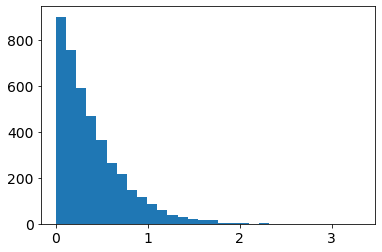

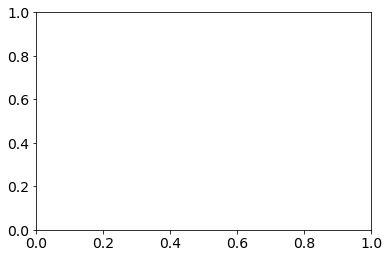

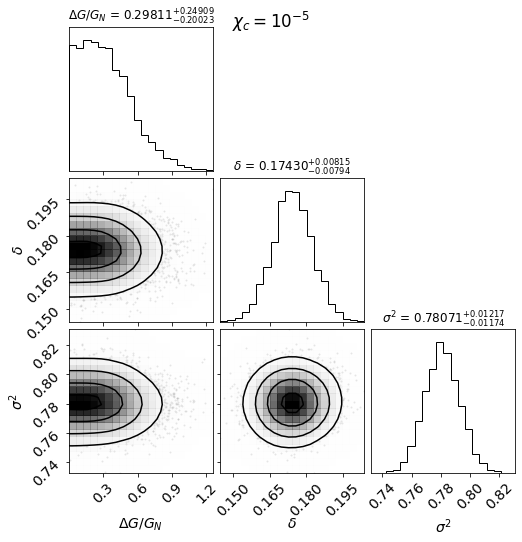

  0%|▏                                          | 4/918 [00:00<00:23, 39.54it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 1.2231892904912945e-06
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 5.117064838889868e-07
10213-1902 [50] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 50.0 0.0 7.223547950250494e-07
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 3.074206170929991e-07
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0 0.0 1.895127222197506e-06
10218-12703 [50] [335

  1%|▌                                         | 12/918 [00:00<00:27, 33.32it/s]

10218-3704 [50] [-0.2423, -0.7324, -0.4111, -0.2502, -0.1409, -0.2076, -0.2494, -0.3265, -0.3433, -0.3506, -0.3606, -0.3689, -0.3645, -0.3466, -0.4111, -0.2985]
10218-3704 50.0 0.0 1.250005862947855e-06
10219-9102 [50] [1.3962, 1.1814, 0.7492, 0.4692, 0.3335, 0.2205, 0.1532, 0.1423, 0.1945, 0.153, 0.0798, 0.0216, -0.0715, -0.157, -0.0196, -0.0532, -0.0405]
10219-9102 50.0 0.0 5.421802955828235e-07
10220-12705 [50] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 50.0 0.0 6.270182043849061e-07
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 6.520345218746993e-06
10224-9101 [50] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 50.0 0.0 3.47432506902257e-07
10226-12704 [50] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694, 

  2%|▉                                         | 20/918 [00:00<00:28, 31.76it/s]

10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 1.1948272256663254e-05
10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 1.0100468068359062e-05
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 8.147501141805547e-06
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 50.0 0.0 8.606368749930857e-07
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 4.959317350323197e-06
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.009

  3%|█▎                                        | 29/918 [00:00<00:24, 36.72it/s]

10494-9101 [50] [0.1044, 0.2038, 1.4077, 1.2615, 1.1423, 0.8831, 0.6532, 0.6062, 0.6272, 0.6614, 0.5401, 0.4995, 0.1142, 0.1337]
10494-9101 50.0 0.0 2.8023629335680416e-06
10495-12704 [50] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 50.0 0.0 5.402674462925805e-06
10495-12705 [50] [871.1598, 1245.0304, 1205.1955, 1347.7893, 1374.3588, 1517.2635, 1622.8998, 1633.9971, 1757.8692, 1799.4196, 1854.634, 1999.5551, 1849.1662, 1882.4866, 1807.1303, 1651.9125, 1681.1326, 1493.9167, 2771.4516, 2121.0254, 1992.5196]
10495-12705 50.0 0.0 3.4156867104325385e-07
10495-3702 [50] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 50.0 0.0 8.347345894073738e-07
10496-12704 [50] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 2

  4%|█▌                                        | 33/918 [00:00<00:25, 35.38it/s]

10499-3703 [50] [-0.0563, -0.0436, 0.024, 0.1267, -0.0775, -0.0664, 0.0153, -0.0929, -0.1244, -0.0851, -0.0939, -0.1131, -0.1033, -0.048, 0.0474, 0.0456, 0.0289, -0.0666, -0.0844, -0.5663]
10499-3703 50.0 0.0 1.2862583882417086e-06
10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 2.2592811559297686e-06
10500-12704 [50] [140.7935, 35.4055, 16.1502, 8.7997, 6.1202, 5.6067, 5.0715, 4.9205, 5.0767, 4.6234, 4.2501, 4.0673, 3.8962, 3.8831, 3.7867, 3.6009, 3.0687, 4.1948, 2.9642, 3.5448, 1.9938, -0.2753, 2.8838, 5.8145]
10500-12704 50.0 0.0 2.863173857301362e-07
10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 2.5322206727777392e-05
10500-3702 [50] [211.267, 568.975, 609.2163, 763.7494, 654.0512, 608.9412, 619.4812, 574.1158, 551.0555, 546.396, 492.531, 452.6766, 495.1396, 321.2342, 371.609, 358.446, 200.8978, 319.0074, 284.1887, 209.7882, 190.8027, 318.1602, 354.0

  4%|█▉                                        | 41/918 [00:01<00:25, 34.35it/s]

10501-6101 [50] [54.152, 240.5257, 446.403, 593.882, 679.4829, 745.3089, 578.3118, 397.5307, 268.9797, 276.8619, 234.4717, 196.8602, 156.2454, 140.6324, 64.5922]
10501-6101 50.0 0.0 1.1553975439006885e-06
10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 50.0 0.0 4.4543396545277825e-07
10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 6.313497168066931e-07
10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 6.797256833578018e-06
10505-12704 [50] [0.6223, 0.447, 0.4087, 0.27, 0.0901, 0.1644, 0.1572, 0.3129, 0.3336, 0.3492, 0.2338, 0.2536, 0.1307, 0.2303, 0.2492, 0.6718, 0.9822, 1.3729, 3.1505, 2.3435]
10505-12704 50.0 0.0 6.861035714296427e-06
10506-91

  5%|██▏                                       | 49/918 [00:01<00:27, 31.99it/s]

10509-12703 [50] [1226.9439, 2166.987, 2538.8741, 2127.6504, 1648.0951, 1358.0909, 1167.9374, 985.8138]
10509-12703 50.0 0.0 7.852777457329893e-07
10509-1901 [50] [88.4511, 296.1948, 449.6905, 409.1127, 761.2326, 574.7336, 678.7086, 604.9771, 571.2616, 614.5332, 408.9334, 441.3848, 355.292, 300.996, 243.919, 230.1612, 180.5992, 163.4382, 176.2701, 193.176, 205.4741]
10509-1901 50.0 0.0 2.6527864465149296e-07
10509-6101 [50] [414.6573, 159.5598, 352.8386, 670.9188, 930.199, 434.1238, 984.9702, 921.6235, 784.8291, 825.2006, 827.4197, 661.5592, 624.5693, 894.3523, 620.0269, 747.519, 623.1939, 701.341, 577.342, 1031.0135, 622.2157, 697.4912, 668.4888, 271.226]
10509-6101 50.0 0.0 4.6205772981334106e-07
10511-12704 [50] [-0.0162, 0.2052, 0.0934, -0.0203, -0.0645, -0.0743, -0.1124, -0.1256, -0.1314, -0.1489, -0.145, -0.1344, -0.261, -0.3154, -0.4542, -0.3737, -0.3967, -0.387, 0.3583, -0.1418, -0.7705]
10511-12704 50.0 0.0 1.6942962905177429e-06
10511-12705 [50] [-0.2818, -0.0952, 0.2141, 0.2

  6%|██▍                                       | 53/918 [00:01<00:28, 30.19it/s]

10512-12705 [50] [-0.9971, -0.9962, -0.9967, -0.9971, -0.9969, -0.9968, -0.9961, -0.9958, -0.9964, -0.9971, -0.9977, -0.9977, -0.9977, -0.9976, -0.998]
10512-12705 50.0 0.0 9.88117702697575e-07
10512-9102 [50] [4147.3152, 2927.8473, 3245.8656, 2878.0674, 2617.7881, 2204.6977, 1695.8151, 1371.2689, 1298.2413, 1241.1228, 1357.9116, 1330.7104, 1714.839, 1930.3755, 2196.7284, 2401.8011, 2844.302, 3122.8481, 2925.4465]
10512-9102 50.0 0.0 7.388786538426175e-07
10513-12702 [50] [-0.9916, -0.9877, -0.9855, -0.9802, -0.9787, -0.98, -0.9868, -0.9787, -0.862, -0.9802]
10513-12702 50.0 0.0 1.212153360961301e-06
10514-6103 [50] [0.5999, 0.3982, 0.2747, 0.2749, 0.0781, 0.0617, 0.0681, -0.0189, -0.0377, -0.0578, -0.065, -0.0594, 0.0253, -0.0317, 0.1182, -0.1428, -0.1895, -0.2508, -0.2991, -0.355]
10514-6103 50.0 0.0 3.3936643792436223e-07
10516-6104 [50] [0.3084, -0.237, -0.3593, -0.3575, -0.3434, -0.2974, -0.3603, -0.4386, -0.4629, -0.4919, -0.5092, -0.5031, -0.4319, -0.4152, -0.2877, -0.6618]
1051

  7%|██▋                                       | 60/918 [00:01<00:30, 28.27it/s]

10517-6102 [50] [0.4712, 0.9172, 0.811, 0.5857, 0.3222, 0.2888, 0.1564, 0.1219, 0.169, 0.09, 0.1318, 0.0302, 0.061, 0.0297, 0.0658, 0.0113, 0.072, 0.0733, -0.0232, 0.0238, 0.0127, 0.0739, -0.0903, -0.0528]
10517-6102 50.0 0.0 2.666353028369173e-07
10518-12705 [50] [-0.1971, 0.2795, 0.1103, -0.0254, -0.0161, -0.0, 0.0208, 0.0333, 0.0023, -0.0238, -0.0544, -0.1612]
10518-12705 50.0 0.0 2.278123636160607e-06
10518-1902 [50] [-0.0105, 0.2572, 0.0495, 0.0308, 0.0287, -0.0677, -0.0841, -0.0885, -0.1994, -0.1432, -0.1195, -0.1634, -0.1173, -0.1219, -0.165, -0.1325, -0.1731]
10518-1902 50.0 0.0 1.3543146301192879e-06
10518-6102 [50] [-0.217, 1.2282, 0.4062, 0.3459, 0.382, 0.1799, 0.1478, 0.1175, 0.0995, 0.1358, 0.0812, 0.048, 0.0452, 0.0639, 0.0875, 0.0309, 0.0337, 0.0007, -0.0113, -0.1383]
10518-6102 50.0 0.0 8.492255461348534e-07
10519-12704 [50] [-0.2611, 0.2686, 0.1702, 0.0601, 0.0584, 0.0258, -0.0515, -0.1077, -0.1123, -0.1006]
10519-12704 50.0 0.0 1.4500716438482055e-06
10519-6102 [50] [

  7%|███                                       | 68/918 [00:02<00:28, 29.83it/s]

10520-12704 [50] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.0366, 0.0275, -0.0135, 0.0213, 0.0998, -0.1048, -0.1309]
10520-12704 50.0 0.0 4.3565336210397264e-07
10520-6102 [50] [-0.9995, -0.9993, -0.9985, -0.9976, -0.9986, -0.9981, -0.9983, -0.9984, -0.9986, -0.9981, -0.9963]
10520-6102 50.0 0.0 3.4573413468660376e-06
10838-9101 [50] [-0.0928, 0.4421, 0.4896, 0.3922, 0.2667, 0.3141, 0.2582, 0.2949, 0.294, 0.2543, 0.2198, 0.1153, 0.0076, -0.0625, -0.124, -0.1198, -0.272, -0.3696, -0.3534, -0.3974, -0.2337]
10838-9101 50.0 0.0 1.907993276596258e-06
10839-12705 [50] [0.5531, 0.4188, 0.6271, 0.6342, 0.4074, 0.3206, 0.1512, 0.1105, 0.1154, 0.1763, 0.2141, 0.3291, 0.2868, 0.1635, 0.0391, 0.4134, 0.1807]
10839-12705 50.0 0.0 3.1064844212111805e-06
10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712, 0.035, -0.0115, 0.0248, -0.0288, 0.0512, -0.0187, 0.0073, 0.0432, -0.0916, -0.1233, -0.1818, -0.1471]
10839-3704 50.0 0.0 5.312371523067407e-07
10839-6101 [50] [244.3098, 615.

  8%|███▎                                      | 72/918 [00:02<00:27, 30.41it/s]

10841-12701 [50] [-0.7323, -0.6652, -0.4249, -0.3016, -0.2957, -0.3482, -0.374, -0.3905, -0.3944, -0.4309, -0.4302, -0.4504, -0.4708, -0.4257, -0.4725]
10841-12701 50.0 0.0 2.5105832673919036e-06
10842-3702 [50] [-0.5415, 0.0585, 0.2828, 0.1825, 0.1674, 0.1342, 0.1324, 0.2899]
10842-3702 50.0 0.0 4.7550804603602495e-07
10842-3703 [50] [-0.6099, -0.8101, -0.8807, -0.9171, -0.9297, -0.9289, -0.9268]
10842-3703 50.0 0.0 4.0174067968997946e-07
10842-9101 [50] [-0.987, -0.9943, -0.9967, -0.9976, -0.9979, -0.998, -0.9982, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9981, -0.998, -0.9982, -0.9979, -0.9982, -0.9983]
10842-9101 50.0 0.0 7.142480937962442e-07
10845-12702 [50] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-12702 50.0 0.0 5.711523657366787e-07
11004-12705 [50] [-0.8497, -0.6991, -0.5203, -0.3493, -0.2406, -0.2193, -0.1954, -0.1792, -0.1842, -0.1767, -0.1858, -0.1781, -0.195, -0.2173, -0.2294, -0.167, -0.2434, -0.1

  9%|███▋                                      | 80/918 [00:02<00:26, 31.19it/s]

11004-6104 [50] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 50.0 0.0 1.766472415250033e-06
11009-12704 [50] [-0.044, 0.5574, 0.4941, 0.5156, 0.452, 0.4031, 0.3736, 0.4191, 0.4646, 0.4848, 0.558, 0.4716, 0.2432, 0.3821, 0.6252, 0.8487, 0.8601]
11009-12704 50.0 0.0 1.0601611614755582e-05
11009-6102 [50] [0.2368, -0.3064, 0.0765, 0.1736, 0.0574, 0.1163, 0.1754, 0.2052, 0.2777, 0.3634, 0.3506, 0.3192, 0.3455, 0.323, 0.4447, 0.1481, 0.2577, -0.1338, 0.037, 0.1218, 0.8549, -0.5202]
11009-6102 50.0 0.0 3.7856782507752605e-07
11010-12705 [50] [-0.0199, 0.0369, -0.0512, -0.0961, -0.0616, -0.0525, -0.0667, -0.0148, -0.0176, -0.0486, -0.0929, -0.1237, -0.1411, -0.2784, -0.0549, -0.2411]
11010-12705 50.0 0.0 2.425840486424746e-07
11010-6104 [50] [669.1593, 612.5725, 580.2933, 433.0387, 377.072, 315.1925, 269.3918, 266.5579, 267.4688, 253.2676, 240.0639, 221.1944, 344.4065]
11010-6104 50.0 0.0 1.6987446

 10%|████                                      | 88/918 [00:02<00:27, 30.64it/s]

11012-12705 [50] [0.2329, 0.5509, 0.2517, 0.0195, 0.0174, -0.0704, -0.1937, -0.145, -0.249, -0.0592, -0.302, -0.1828, -0.2112]
11012-12705 50.0 0.0 9.373797126137102e-06
11012-3702 [50] [7.8974, 3196.585, 2734.8285, 2253.8811, 4078.0168, 2401.2221, 2680.4924, 2677.0305, 2494.671, 2122.0656, 2023.2433, 2124.4295, 1742.4806, 1879.5204, 1353.859, 1265.244, 1077.374, 829.3809, 807.9255, 437.3493, 291.3315]
11012-3702 50.0 0.0 3.72034769563517e-06
11012-9102 [50] [4.3613, 1.8587, 0.9243, 0.4611, 0.1717, 0.0565, -0.0003, -0.0124, 0.0149, 0.0346, 0.0094, 0.0256, 0.0391, 0.0441, 0.0302, -0.0599, -0.0933, -0.0179]
11012-9102 50.0 0.0 2.7502937379696547e-06
11013-12702 [50] [0.7904, 0.6387, 0.0779, 0.1203, 0.0592, -0.004, -0.016, 0.0128, 0.0194, 0.059, 0.0663]
11013-12702 50.0 0.0 2.118849937852878e-06
11013-1902 [50] [0.7893, 0.6453, 0.5024, 0.4895, 0.4034, 0.2175, 0.0455, -0.0103, 0.0142, -0.2569, -0.0412, -0.2183, -0.1712, -0.0824, -0.3609, -0.2323, -0.3117]
11013-1902 50.0 0.0 2.506597429689

 10%|████▏                                     | 92/918 [00:02<00:27, 30.26it/s]

11013-6101 [50] [0.3389, -0.3422, -0.154, -0.2894, -0.4104, -0.4385, -0.4897, -0.4798, -0.43, -0.3971, -0.3753, -0.3775, -0.3376, -0.2419, -0.1243, 0.0068, -0.1557, 0.0318, -0.0178, 0.2532, 0.5345, 0.5099]
11013-6101 50.0 0.0 1.4210104771348235e-06
11017-12703 [50] [0.0185, 0.3093, 0.3468, 0.2632, 0.2308, 0.2072, 0.1992, 0.215, 0.2444, 0.2273, 0.053, -0.0123, 0.1078, -0.0553]
11017-12703 50.0 0.0 2.1608931361114247e-06
11017-12704 [50] [0.4751, 0.4487, 0.3988, 0.2586, 0.0625, -0.0537, -0.0751, -0.1094, -0.1157, -0.1027, -0.1141, -0.1182, -0.1126, -0.1047, -0.0836, -0.1961, -0.2389]
11017-12704 50.0 0.0 5.069280233476698e-07
11017-6103 [50] [-0.3235, -0.3265, -0.3479, -0.2253, -0.2261, -0.1769, -0.1311, -0.1075, -0.0747, -0.0989, -0.1378, -0.1695, -0.1257, -0.174, -0.178, -0.0714, -0.0163, 0.0028, 0.2262, -0.2731]
11017-6103 50.0 0.0 3.158776802713689e-06
11017-9101 [50] [-0.5273, 0.0425, 0.2188, 0.1666, 0.07, 0.0407, -0.0503, -0.1282, -0.2004, -0.2244, -0.1722, -0.1497, -0.0815, -0.096

 11%|████▍                                    | 100/918 [00:03<00:27, 30.16it/s]

11018-3702 [50] [0.6083, 0.007, 0.0959, 0.33, 0.5514, 0.4356, 0.3654, 0.3085, 0.3057, 0.287, 0.3004]
11018-3702 50.0 0.0 4.5870752003621136e-07
11018-3703 [50] [-0.5454, 0.4164, 0.6741, 0.5852, 0.6907, 0.7028, 0.6059, 0.5528, 0.656, 0.6306, 0.5445, 0.5549, 0.4676, 0.4329, 0.3355, 0.3242, 0.462, 1.051, 0.5129, 1.3094]
11018-3703 50.0 0.0 1.6690264913419873e-06
11018-6102 [50] [69.1052, 130.9961, 113.1141, 109.1797, 92.5989, 91.6354, 88.5765, 83.9604, 80.137, 76.3564, 74.3146, 74.7218, 70.495, 71.7331, 65.8452, 64.9321, 72.2612]
11018-6102 50.0 0.0 1.614510337153358e-06
11019-12702 [50] [0.0142, 0.2516, 0.1906, 0.1378, 0.0877, -0.003, 0.0993, 0.0958, 0.1065, 0.1232, 0.2086, 0.1132, 0.0357, -0.0115, -0.014, 0.0302, -0.0875, -0.1071]
11019-12702 50.0 0.0 4.4966070805297597e-07
11019-12703 [50] [-0.4993, -0.4671, -0.3698, -0.2654, -0.2024, -0.2445, -0.2033, -0.2117, -0.2752, -0.2285, -0.2102, -0.0702, -0.1699, 0.0858, -0.1757, -0.2987]
11019-12703 50.0 0.0 1.9778473966199353e-06
11019-12705

 12%|████▊                                    | 108/918 [00:03<00:26, 30.15it/s]

11021-1902 [50] [5.9017, 3.1432, 2.8491, 1.9605, 1.7177]
11021-1902 50.0 0.0 1.8912656291767255e-06
11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 6.572786869665575e-06
11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 3.4839334457184117e-06
11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 4.832277764028135e-05
11742-12704 [50] [0.6702, -0.5312, -0.3481, 0.0047, 0.1348, 0.415, 0.2787, 0.5138, -0.0348]
11742-12704 50.0 0.0 7.309237437727696e-07
11743-1901 [50] [-0.5717, -0.3943, -0.5273, -0.3736, -0.306, -0.392, -0.3766, -0.4151, -0.3665, -0.4111, -0.4236, -0.3424, -0.387

 13%|█████▏                                   | 116/918 [00:03<00:27, 29.60it/s]

11745-1902 [50] [1.185, 0.9719, 0.4625, 0.4231, 0.2188, 0.1795, 0.0428, 0.0263, -0.0784, -0.2371, 0.1632]
11745-1902 50.0 0.0 1.4705365387865772e-06
11745-6104 [50] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.8527, 0.5703, 0.5078, 0.5176, 0.5143, 0.48, 0.4463, 0.4504, 0.4653, 0.4273, 0.4049]
11745-6104 50.0 0.0 2.482907440880764e-06
11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.0361, -0.076, -0.0711, -0.1542, -0.2041, -0.2119, -0.1066, -0.2705, -0.3138]
11745-9101 50.0 0.0 6.906892712653471e-07
11746-3703 [50] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 50.0 0.0 3.1115387936780844e-06
11746-3704 [50] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 50.0 0.0 3.778568328095408e-07
1

 13%|█████▍                                   | 123/918 [00:03<00:26, 30.11it/s]

11747-12702 [50] [-0.4876, -0.2412, -0.0165, -0.0887, -0.0931, -0.0756, -0.076, -0.0313, -0.0043, 0.0037, -0.0318, -0.1133, 0.1257, -0.1019, 0.1921, -0.2837, -0.0753]
11747-12702 50.0 0.0 2.7673310755818723e-05
11749-12701 [50] [-0.6821, -0.1137, 0.255, 0.1029, 0.0811, -0.0849, -0.2182, -0.1487, -0.1095, -0.0437, -0.1285, -0.1939]
11749-12701 50.0 0.0 1.8414561856170843e-06
11749-12704 [50] [1.1585, 1.0264, 1.2033, 1.4986, 1.8954, 2.0398, 2.1095, 2.1199, 1.4688, 1.3033, 0.9132, 0.8426, 0.0515, 0.4719, -0.3735]
11749-12704 50.0 0.0 1.0688387980920959e-05
11749-3701 [50] [618.0455, 872.9003, 1483.1859, 1615.2011, 1553.7949, 1334.0598, 1385.5396, 1283.8547, 1216.0833, 1294.494, 1472.7433, 1080.4933, 1346.7897, 1196.9726, 1091.8413, 1216.7304, 927.7028, 363.0292, 281.9853, 551.8779, 169.9359, 54.7426, 122.374, 379.7425, 27.1507]
11749-3701 50.0 0.0 1.5810757949215795e-06
11750-12701 [50] [0.4224, 0.3089, 0.0791, 0.0892, 0.2329, 0.2222, 0.1114, 0.03, 0.0196, 0.0027, 0.0313, 0.0827, 0.0275, 

 14%|█████▋                                   | 127/918 [00:04<00:25, 30.70it/s]

11750-9101 [50] [13.4461, 9.2464, 8.3896, 5.4399, 4.9554, 3.0033, 3.1782, 2.4566, 2.5343, 2.0961, 2.3663, 2.3818, 2.4375, 3.0403, 2.3998, 2.3406, 2.9409, 6.8913, 8.6024]
11750-9101 50.0 0.0 5.203432318163242e-07
11751-1901 [50] [-0.9334, -0.8849, -0.9513, -0.9754, -0.9893, -0.9862, -0.989, -0.9902, -0.9893, -0.9909, -0.9903, -0.9906, -0.9888, -0.9874]
11751-1901 50.0 0.0 1.8126804047119652e-06
11751-6102 [50] [0.3738, 0.0535, 0.3785, 0.2124, 0.1333, 0.0258, -0.0223, -0.094, -0.1099, -0.1415, -0.1724, -0.2013, -0.1841, -0.253, -0.3949, -0.2255, -0.2141, -0.2775]
11751-6102 50.0 0.0 1.3905590952143589e-06
11753-3703 [50] [0.2801, 0.7604, 0.7391, 0.5795, 0.35, 0.1693, 0.0874, 0.0586, 0.0152, -0.0057, -0.0099, -0.0594, -0.1073, -0.139, -0.1496]
11753-3703 50.0 0.0 1.5206685706907817e-06
11753-6104 [50] [1.7058, 1.5787, 1.7231, 1.492, 1.0043, 0.8699, 0.6579, 0.5905, 0.5042, 0.4712, 0.4504, 0.6153, 0.6589, 0.6817, 0.5206, 0.5457, 0.5195, 0.692]
11753-6104 50.0 0.0 7.280206532380977e-07
11754

 15%|█████▉                                   | 134/918 [00:04<00:27, 28.96it/s]

11755-12701 [50] [-0.773, -0.7865, -0.7717, -0.7522, -0.7475, -0.7159, -0.7048, -0.6936, -0.7373, -0.7183, -0.7382, -0.7769, -0.6833, -0.7924, -0.5695, -0.681, -0.5512]
11755-12701 50.0 0.0 2.3831463315150923e-06
11755-6101 [50] [-0.0093, 1.0489, 0.9853, 1.2444, 1.0667, 0.8902, 0.7008, 0.6245, 0.5835, 0.5179, 0.397, 0.4083, 0.4791, 0.2148, 0.053]
11755-6101 50.0 0.0 2.71659664498505e-06
11755-9102 [50] [0.1799, 0.2485, 0.3504, 0.383, 0.2088, 0.1465, 0.0712, -0.0042, -0.0415, -0.0215, 0.0671, 0.0623, 0.1393, -0.1017, 0.125, -0.214, -0.1458]
11755-9102 50.0 0.0 5.161847621973303e-07
11758-3701 [50] [-0.3091, 0.0326, 0.2349, 0.1141, 0.0113, 0.06, -0.0268, -0.1507, -0.2171, -0.1994, -0.1587, -0.1557, -0.1574, -0.1614, -0.0618]
11758-3701 50.0 0.0 9.586099665818049e-07
11758-3702 [50] [-0.544, -0.1141, 0.0167, 0.1028, 0.0854, -0.0041, -0.0149, 0.0406]
11758-3702 50.0 0.0 3.088579467624326e-06
11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -

 15%|██████▎                                  | 140/918 [00:04<00:27, 28.29it/s]

11759-6102 [50] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, -0.981]
11759-6102 50.0 0.0 4.2908998680063676e-07
11760-12703 [50] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0.539, 0.1155, 0.1223, 0.309]
11760-12703 50.0 0.0 7.084607262575234e-07
11760-6101 [50] [0.4533, -0.0157, 0.5654, 0.502, 0.3995, 0.359, 0.3287, 0.2964, 0.2063, 0.2512, 0.2686, 0.2421, 0.2368, 0.1884, 0.0906, -0.0471, -0.3849, -0.319, -0.8166]
11760-6101 50.0 0.0 2.39564835210898e-06
11760-6103 [50] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.2117, -0.2373, -0.2365, -0.2317, -0.3078, -0.2653, -0.3184, -0.2638]
11760-6103 50.0 0.0 5.919630102643649e-07
11760-9102 [50] [-0.8049, -0.6427, -0.2931, -0.1213, 0.1899, 0.0235, 0.108, 0.1381, 0.1732, 0.1865, 0.1624, 0.1963, 0.1218, 0.1215, 0.1223, 0.2636, 0.046, 0.5962, 0.180

 16%|██████▌                                  | 146/918 [00:04<00:27, 28.54it/s]

11761-12703 [50] [0.4093, 0.08, -0.0588, -0.0478, 0.0006, -0.0009, -0.0617, -0.1284, -0.1046, -0.1135, -0.1247, -0.1623, -0.2191, -0.3477]
11761-12703 50.0 0.0 7.009102805296021e-06
11761-12704 [50] [-0.1205, 0.9952, 0.5814, 0.2296, 0.1208, 0.126, 0.1222, 0.1041, 0.1683, 0.1996, 0.1448, 0.1188, 0.0574, 0.0394, -0.008, -0.026, -0.0331]
11761-12704 50.0 0.0 2.9645435183331498e-06
11761-12705 [50] [6.8127, 3.6941, 2.4845, 1.3644, 0.5363, 0.2844, 0.104, -0.1]
11761-12705 50.0 0.0 2.1541408175729526e-06
11823-9101 [50] [15949.1976, 8800.0053, 8323.3916, 4811.1692, 2214.9858, 717.2733, 413.2719, 305.7873, 173.5393, 146.0478, 195.6604, 224.7593, 189.4201, 67.1778]
11823-9101 50.0 0.0 8.993480347972667e-07
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 7.516001705901412e-06
11828-12703 [50] [-0.5587, -0.2913, 0.1844, 0.3112, 0.2627, 0.2124, -0.0354, -0.0957, -0.1295, -0.1601, -0.0565, -0

 17%|██████▉                                  | 154/918 [00:05<00:25, 30.02it/s]

11830-12701 [50] [-0.9938, -0.9825, -0.9834, -0.9912, -0.9934, -0.9941, -0.9946, -0.9933, -0.9936, -0.9951, -0.9951, -0.9944, -0.9947, -0.9932, -0.9955, -0.9854, -0.997, -0.9939, -0.9962]
11830-12701 50.0 0.0 1.0091114175297393e-06
11830-12703 [50] [-0.4776, 0.0437, 0.1582, -0.0709, -0.1607, -0.0754, 0.055, 0.2665, 0.1845, 0.03, 0.0663, -0.087, -0.2185, -0.1589, 0.0536, -0.3722]
11830-12703 50.0 0.0 2.8133136928986193e-06
11830-3702 [50] [1.2195, 0.9978, 0.6546, 0.4726, 0.5057, 0.555, 0.4749, 0.3884, 0.4626]
11830-3702 50.0 0.0 9.272457682955152e-07
11830-6104 [50] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.0353, -0.2063, -0.258, -0.2347, -0.2692, -0.3985]
11830-6104 50.0 0.0 7.991059971822265e-07
11831-12703 [50] [0.4472, 0.0224, 0.062, 0.158, -0.0429, -0.0922, -0.1252, -0.188, -0.1276, -0.16, -0.2596, -0.2165, 0.1708, -0.4595]
11831-12703 50.0 0.0 4.1948762157359235e-06
11831-12704 [50] [-0.5822, -0.2435, 0.0115, -0.0848, -0.1704, -0.028, -0.0888, 

 18%|███████▏                                 | 161/918 [00:05<00:24, 30.65it/s]

11831-6102 [50] [1.041, 0.6096, 0.4053, 0.165, 0.0902, 0.1922, 0.1873, 0.1187, 0.1055, 0.0085, -0.1108, -0.0737]
11831-6102 50.0 0.0 1.4100156078276666e-06
11833-9102 [50] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.2658, -0.2176, -0.1929, -0.2471, -0.3166]
11833-9102 50.0 0.0 1.0588403916407106e-06
11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 1.1372463457235646e-05
11836-1902 [50] [0.7026, 1.2767, 1.1865, 1.1009, 0.973, 0.9921, 0.7024, 0.7206, 0.623, 0.6145, 0.5505, 0.5955, 0.6037, 0.4142, 0.4147]
11836-1902 50.0 0.0 1.7318086319863942e-06
11838-12701 [50] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 0.1336, 0.0903, 0.0213, -0.0554, -0.0342, 0.0225, 0.0053, -0.0272]
11838-12701 50.0 0.0 9.420735487954402e-

 19%|███████▋                                 | 171/918 [00:05<00:19, 38.77it/s]

11838-6103 [50] [201.1554, 531.7007, 967.9199, 1125.4471, 1324.9799, 1297.8083, 1279.6033, 1183.901, 1134.9301, 1132.4611, 1104.3121, 1011.7157, 1287.8266]
11838-6103 50.0 0.0 1.341329141185377e-06
11838-9101 [50] [11.4727, 10.3246, 9.7757, 7.6641, 6.3263, 7.7985, 4.6854, 6.1379, 3.8072, 5.5203, 3.0518, 3.9759, 1.4403, 2.8333, 2.6956, 2.5542]
11838-9101 50.0 0.0 9.212974518909636e-07
11865-12702 [50] [-0.057, -0.0512, 0.0778, -0.0002, -0.0743, -0.0834, -0.0854, 0.0083, -0.0154, -0.0332, -0.07, -0.1612, -0.2706]
11865-12702 50.0 0.0 1.554098853309826e-06
11865-12704 [50] [0.4447, -0.0557, -0.3894, -0.457, -0.5111, -0.5109, -0.5238, -0.5353, -0.4955, -0.5012, -0.4831, -0.4726, -0.599, -0.615]
11865-12704 50.0 0.0 5.7259201851198e-07
11865-1901 [50] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 50.0 0.0 1.3454752706585132e-06
11865-1902 [50] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0.4429]
11

 19%|███████▊                                 | 176/918 [00:05<00:18, 40.82it/s]

11868-12703 [50] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 1.7498746512941246e-06
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 8.859680081104915e-06
11871-6103 [50] [0.7182, 0.8575, 0.776, 0.4737, 0.2556, 0.1173, 0.1395, 0.111, 0.0842, 0.0381, 0.0003, -0.0281, -0.0195, -0.044, -0.0588, -0.2086, -0.132, -0.377]
11871-6103 50.0 0.0 6.986773269119227e-06
11940-1902 [50] [-0.0835, 0.1518, 0.1321, 0.0182, -0.0843, -0.1452, -0.1779, -0.1993, -0.1955]
11940-1902 50.0 0.0 4.719016110429343e-06
11940-3703 [48.09175477386935] [1.1615, 1.5645, 1.5154, 1.5213, 1.3625, 1.1856, 0.9977, 0.7191, 0.6591, 0.6153, 0.3767, 0.433, 0.6417, 0.1616, 0.444, 0.2018, 0.0806, 0.2143, 0.1328]
11940-3703 48.09175477386935 1.951186735695959e-09 2.3239195528424698e-07
11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907

 20%|████████▎                                | 186/918 [00:05<00:17, 42.45it/s]

11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.0425, -0.0331, -0.0546, -0.0982, -0.1371, -0.164, -0.179, -0.1863, -0.172, -0.1572, -0.1563, -0.1648, -0.1726, -0.27]
11943-3703 50.0 0.0 1.2714917598767303e-05
11944-12701 [50] [-0.3604, -0.3617, -0.4276, -0.5869, -0.6347, -0.6283, -0.548, -0.5758, -0.5204, -0.4847, -0.4769, -0.4857, -0.5345, -0.6334, -0.5353, -0.5098]
11944-12701 50.0 0.0 1.7407746754187742e-06
11945-12701 [50] [0.3961, 0.2879, 0.3765, 0.1557, -0.0002, -0.113, -0.1502, -0.128, -0.114, -0.1705, -0.0344, 0.0462, 0.017]
11945-12701 50.0 0.0 4.7313552726126146e-06
11945-6101 [50] [0.2057, 0.8606, 0.9637, 0.605, 0.4694, 0.2734, 0.2029, 0.1332, 0.0558, -0.0105, 0.0015, 0.0011, -0.0038, -0.016, 0.0504, -0.0338]
11945-6101 50.0 0.0 8.09939649900343e-06
11945-6102 [50] [3.5224, 2.2109, 1.4349, 1.0152, 0.7457, 0.4864, 0.2556, 0.1192, 0.0508, 0.0117, -0.0209, -0.0683, -0.158, -0.0976, -0.2012]
11945-6102 50.0 0.0 3.2162978468970727e-06
11947-6103 [50] [-0.3361, 

 21%|████████▊                                | 196/918 [00:06<00:16, 43.83it/s]

11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.2778]
11954-3703 50.0 0.0 6.8251075598015076e-06
11954-9101 [50] [-0.9882, -0.9937, -0.9946, -0.9965, -0.9974, -0.9972, -0.997, -0.9969, -0.997, -0.9974, -0.9978, -0.9979, -0.9973, -0.9971, -0.9976, -0.9966]
11954-9101 50.0 0.0 4.585712465442595e-06
11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 3.9655219670580685e-06
11956-12702 [50] [5.6953, 5.0804, 3.2564, 2.1056, 1.2622, 0.6457, 0.4602, 0.5373, 0.9503, 3.7649, 5.1679]
11956-12702 50.0 0.0 1.0886565502798876e-06
11956-12705 [50] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 0.2419, 0.2565, 0.3525, 0.1776, 0.103, 0.3387, 0.3814, 0.7221, 0.77]
11956-12705 50.0 0.0 7.479482837865088e-07
11957-12704 [50] [-0.3492, 0.7667, 0.6853, 0.5861, 0.3661, 0.189, 0.1584,

 22%|█████████▏                               | 206/918 [00:06<00:15, 45.36it/s]

11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 2.443699050031754e-06
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 50.0 0.0 5.709411428144835e-06
11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.9843, 0.6333, 0.3517, 0.1829, 0.1258, 0.0956, 0.1424, 0.1021, 0.028, 0.1221]
11965-9102 50.0 0.0 1.88369922890945e-06
11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 7.910730875730929e-06
11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.8986, 3.5843, 4.0724, 0.9129, 2.9875, 0.7205, 2.6408, 1.2362]
11969-6101 50.0 0.0 9.909023537086494e-06
11970-12703 [0.8524] [-0.4888, -0.3498, -0.0561, 0.1594, 0.1669, 0.133, 0.154, 0.1676, 0.1

 24%|█████████▋                               | 216/918 [00:06<00:15, 45.32it/s]

11975-12705 [50] [0.6902, 0.7621, 0.3208, 0.2527, 0.3317, 0.3259, 0.2387, 0.0864, 0.069, 0.2015, 0.1928, 0.1502, -0.0055, -0.1924]
11975-12705 50.0 0.0 2.7614850092881677e-06
11975-3703 [50] [-0.2597, -0.0329, 0.0768, 0.0833, 0.1048, 0.0682, 0.0342, -0.0156, -0.0756, -0.093, -0.0695, -0.0466, 0.0656, -0.0085, 0.1237, 0.1334, 0.0646]
11975-3703 50.0 0.0 1.6794065396252641e-06
11975-6104 [50] [1.0196, 1.2709, 1.5062, 1.1104, 0.9965, 0.7778, 0.776, 0.6311, 0.7603, 0.6278, 0.6208, 0.5151, 0.5172, 0.5343, 0.2326, 0.5012, 0.187, 0.4522, 0.1401, 0.1327]
11975-6104 50.0 0.0 1.5044607088476125e-06
11976-12703 [50] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 50.0 0.0 1.3104735506955915e-06
11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 50.0 0.0 7.710429312426586e-07
11978-12705 [50] [0.0184, 0

 25%|██████████                               | 226/918 [00:06<00:15, 45.80it/s]

11979-9101 [50] [0.4094, -0.1099, -0.2651, -0.4134, -0.4241, -0.4727, -0.5, -0.5199, -0.5395, -0.5666, -0.5927, -0.5903, -0.6162, -0.591, -0.6704, -0.611]
11979-9101 50.0 0.0 6.51672628233419e-07
11979-9102 [50] [0.6334, -0.323, -0.1351, -0.0857, 0.0053, 0.0302, 0.0467, 0.0752, 0.0566, 0.0459, 0.0116, 0.0269, 0.0046, -0.0156, -0.091, -0.1558, -0.3105, -0.4242, -0.5324]
11979-9102 50.0 0.0 1.1346652122147103e-06
11981-12702 [50] [293.567, 690.112, 683.5389, 617.2849, 490.646, 374.3616, 455.8674, 450.3051, 457.9927, 478.543, 404.234]
11981-12702 50.0 0.0 3.218783749045578e-07
11981-12704 [50] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]
11981-12704 50.0 0.0 6.54860160183366e-07
11981-9102 [50] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188, -0.1444, -0.128, -0.1812, -0.1904, -0.2284, -0.2044, -0.2061, -0.1486, -0.2345, -0.2114, 0.0329, 0.7603]
11981-9102 5

 26%|██████████▌                              | 236/918 [00:06<00:15, 44.44it/s]

11984-12702 [50] [-0.2774, -0.3248, -0.3706, -0.3541, -0.339, -0.3481, -0.2877, -0.2577, -0.2022, -0.1466, -0.1889, -0.2485, -0.0638, -0.2124, -0.1581, -0.3914, -0.132]
11984-12702 50.0 0.0 4.075487730443876e-06
12066-3701 [50] [19.2418, 16.9197, 10.1428, 6.0915, 4.4316, 3.0783, 2.9929, 2.3906, 2.7183, 2.8356, 3.2869, 3.669, 3.475, 3.6088, 2.499, 1.7084, 1.9485, 1.5899]
12066-3701 50.0 0.0 2.665540527341673e-06
12067-12703 [50] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
12067-12703 50.0 0.0 8.073549084758195e-07
12067-12705 [50] [0.4291, 1.3434, 2.0219, 1.7622, 1.0305, 0.7583, 0.4763, 0.1261, 0.0511, 0.0662, 0.1502, 0.2361, 0.2324, 0.212, 0.3434]
12067-12705 50.0 0.0 6.162672658404541e-07
12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 3.5279591676886805e-05
12068-6104 [5

 27%|██████████▉                              | 246/918 [00:07<00:15, 42.75it/s]

12071-12701 [50] [-0.9172, -0.8384, -0.6786, -0.6994, -0.7429, -0.7686, -0.7662, -0.8217, -0.8275, -0.8401, -0.7831, -0.8143]
12071-12701 50.0 0.0 1.163254416275475e-06
12071-1901 [50] [-0.148, -0.1411, -0.1881, -0.1802, -0.1874, -0.1463, -0.1611, -0.1934, -0.1236, -0.1115, 0.0697, 0.0471, 0.1047, 0.171, 0.9648]
12071-1901 50.0 0.0 2.735993680931974e-06
12071-3702 [50] [43.1041, 1833.3653, 2193.0557, 2409.7616, 2285.0769, 1925.6484, 1966.7994, 2043.2628, 1997.8474, 1832.4832, 1658.3071, 1528.5931, 1298.5116, 1014.8264, 552.6982, 136.4828]
12071-3702 50.0 0.0 1.1043050037100088e-06
12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.3083, 398.9949, 258.1108, 178.8144, 146.4641, 210.3609, 51.4796, 32.8354, 22.052]
12071-3704 50.0 0.0 9.275669159135648e-07
12075-12704 [50] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 50.0 0.0 2.8483419096924835e-06
12078-12703 [50] [0.3298, 0.5

 27%|███████████▏                             | 251/918 [00:07<00:16, 40.61it/s]

12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 8.842814200584015e-06
12082-12702 [50] [52.4225, 34.225, 22.353, 15.87, 12.6473, 9.0293, 9.0994, 7.7946, 7.7752, 7.6215, 7.2913, 5.8669, 7.5773, 10.9051, 27.4723, 42.4809, 31.8612, 44.26]
12082-12702 50.0 0.0 1.7323708204917555e-06
12084-12702 [50] [0.4179, 1.0492, 0.9255, 0.717, 0.5874, 0.4344, 0.359, 0.2445, 0.1712, 0.1342, 0.2131, 0.2682, 0.3105, 0.3163]
12084-12702 50.0 0.0 3.8040319858010876e-06
12084-12704 [50] [-0.663, -0.3425, -0.4511, -0.3814, -0.1944, -0.0031, -0.041, -0.1276, -0.2047, -0.2499, -0.2565, -0.1988, -0.1657, -0.268, -0.3391, -0.2896]
12084-12704 50.0 0.0 4.661745926471274e-06
12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-12705 50.0 0.0 6.837554327126628e-07
12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0

 28%|███████████▋                             | 261/918 [00:07<00:16, 39.43it/s]

12084-6104 [50] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.0374, 0.0776, -0.025, -0.0223, -0.0093, -0.0487, 0.0214, -0.2045, 0.0836]
12084-6104 50.0 0.0 9.035286746245586e-07
12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0.0071, -0.0873, -0.0572, 0.0209, 0.0881, 0.0588, 0.0753, 0.0542]
12085-12704 50.0 0.0 1.7241272262818793e-05
12085-6101 [50] [-0.1417, -0.3914, -0.1738, -0.0755, -0.0973, -0.0439, -0.1113, -0.1774, -0.1947, -0.1728, -0.1408, -0.1367, -0.1146, -0.1045, -0.1506, -0.0235, -0.0308, -0.0502, 0.0507]
12085-6101 50.0 0.0 6.320873080039713e-06
12085-6103 [50] [-0.549, -0.354, -0.3619, -0.3336, -0.3191, -0.1878, -0.2268, -0.2779, -0.144, -0.2236, -0.1423, -0.1582, -0.1565, -0.2223, -0.1937, -0.2795, -0.2396, -0.2355, -0.213, -0.3557, -0.311]
12085-6103 50.0 0.0 7.15017349756809e-07
12085-9102 [50] [0.6086, 0.5632, 0.3343, 0.2119, 0.1282, 0.0402, 0.0288, 0.0478, 0.0313, 0.001, -0.0532, -0.0537, -0.0634, -0.0662, -0.179

 29%|████████████                             | 270/918 [00:07<00:16, 39.29it/s]

12089-12704 [50] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 50.0 0.0 3.9323265904553655e-06
12089-1901 [50] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 50.0 0.0 1.107628979741908e-05
12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722, -0.1642, -0.1028, -0.1287, -0.1434, -0.0908, -0.1289, -0.1084, -0.2404, -0.097, 0.1709, -0.3201, -0.0196, -0.302]
12089-6103 50.0 0.0 2.477448583584504e-06
12092-6101 [50] [0.0026, 0.3918, 0.1405, 0.0977, 0.005, 0.0277, 0.1281, 0.0885, 0.0628, 0.0291, -0.0173, -0.1181]
12092-6101 50.0 0.0 2.355023363526083e-06
12093-9101 [50] [-0.9989, -0.997, -0.9973, -0.998, -0.9985, -0.9987, -0.9987, -0.9986, -0.9986, -0.9987, -0.9983, -0.9981, -0.9979, -0.9991, -0.9971]
12093-9101 50.0 0.0 4.452416258939846e-06
12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 

 30%|████████████▏                            | 274/918 [00:07<00:16, 38.82it/s]

12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 8.713049674019586e-07
12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 9.055380213350783e-07
12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 50.0 0.0 1.0898768302730218e-06
12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696, 2047.2799, 2334.4928, 2266.757, 2196.3005, 1862.0235, 1612.2288, 2078.9089]
12488-6102 50.0 0.0 1.5006586641428047e-06
12488-9101 [50] [0.89, -0.0571, 0.0018, 0.0675, 0.0814, 0.1021, 0.1178, 0.0708, 0.0758, 0.1268, 0.0533, 0.0597, 0.0532, 0.0414, 0.1038, 0.0181, -0.1356, -0.2319, -0.1377]
12488-9101 50.0 0.0 2.0592574222472

 31%|████████████▌                            | 282/918 [00:08<00:19, 33.30it/s]

12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0.0 1.141487631269127e-06
12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0 0.0 6.110034324543566e-07
12512-12702 [50] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 50.0 0.0 4.814820711208364e-07
12514-12702 [50] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 50.0 0.0 6.025269126370706e-07
12514-12703 [6.181396984924623] [2.1408, 0.3201, 0.1941, 0.0194, 0.03, 0.0603, 0.1872, 0.1977, 0.0662, 0.1145, 0.0325, -0.0142, 0.021, -0.0315, -0.0845, -0.0224]
12514-12703 6.181396984924623 1

 31%|████████████▊                            | 286/918 [00:08<00:20, 30.79it/s]

12518-12705 [50] [-0.8683, -0.7393, -0.3648, -0.0579, -0.0274, -0.0334, -0.0145, 0.016, -0.0154, 0.0703, -0.1575, 0.0272]
12518-12705 50.0 0.0 7.620186489551864e-07
12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 0.0 3.522168186061973e-07
12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.1091]
12518-9101 50.0 0.0 1.2733179166265756e-06
12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 3.5426965957439016e-06
12620-6104 [50] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 50.0 0.0 6.107478122937058e-07


 32%|█████████████                            | 293/918 [00:08<00:23, 26.27it/s]

12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 2.514675844148632e-06
12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903, -0.5645]
12621-12705 50.0 0.0 5.712053283533194e-07
12621-6103 [50] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 50.0 0.0 4.791493573550663e-07
12622-9101 [50] [0.295, -0.1664, 0.1745, 0.5326, 0.7376, 0.7334, 0.6499, 0.6151, 0.5534, 0.5303, 0.427, 0.3612, 0.3993, 0.3837, 0.4878, 0.4757, 0.3843, 0.0845]
12622-9101 50.0 0.0 2.81117505208497e-06
12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 2.646440352647067e-06


 33%|█████████████▎                           | 299/918 [00:08<00:25, 23.98it/s]

12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 6.362015751093926e-06
12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 1.762263231335594e-06
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 2.4877343910599605e-06
12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 5.5970281348353555e-06
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 7.003956014339766e-06


 33%|█████████████▍                           | 302/918 [00:09<00:26, 23.44it/s]

12679-12701 [36.69324623115578] [-0.4106, -0.1602, -0.09, 0.0292, -0.1142, -0.1585, -0.1702, -0.2231, -0.1617, -0.1473, -0.165, -0.0765, -0.2919, -0.3168, -0.5268, -0.1813, 0.1098, -0.9954]
12679-12701 36.69324623115578 8.142525686189735e-09 2.2618752580524808e-07
12679-1902 [50] [0.6115, 0.2127, 0.2343, 0.0811, 0.186, 0.028, 0.0072, -0.086, -0.1377, -0.1341, -0.1745, -0.1741, -0.1973, -0.2294, -0.2344, -0.1462, -0.1584]
12679-1902 50.0 0.0 6.88895677873092e-07
12682-12705 [50] [211.5682, 164.2949, 154.5208, 172.1809, 188.4287, 205.8053, 188.0827, 175.7022, 171.521, 162.4793, 163.9925, 122.1814, 128.2861, 178.1773, 150.2355, 110.4372, 181.1071]
12682-12705 50.0 0.0 1.775938163583434e-06
7443-12703 [50] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 50.0 0.0 7.609092436271739e-07
7443-12704 [

 34%|█████████████▊                           | 308/918 [00:09<00:27, 22.45it/s]

7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 4.645006221263789e-07
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.0333, -0.0403, -0.0345, -0.091, -0.0525, -0.2174, -0.2135, -0.5859, -0.4094]
7443-9101 50.0 0.0 9.524155116741758e-07
7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.1269]
7495-12702 50.0 0.0 3.0121179903716257e-06
7495-12703 [50] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 50.0 0.0 1.5076106961235097e-06
7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 2.9990690846050232e-06


 34%|█████████████▉                           | 311/918 [00:09<00:27, 22.05it/s]

7815-12705 [50] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 50.0 0.0 4.0557089392453716e-07
7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 4.707943800959296e-07
7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 6.979596561197004e-07
7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 2.613271487209932e-06
7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 4.330094455

 35%|██████████████▏                          | 317/918 [00:09<00:27, 21.56it/s]

7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 1.8926685690759682e-06
7958-6101 [50] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 50.0 0.0 3.283095607003744e-07
7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 2.8206151873632817e-06
7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 4.234891129733855e-06


 35%|██████████████▎                          | 320/918 [00:09<00:30, 19.93it/s]

7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 3.6653737054680847e-06
7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 2.8318696561944885e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 5.159532589958212e-06
7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 3.0581771567919724e-06


 36%|██████████████▌                          | 326/918 [00:10<00:28, 20.56it/s]

7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 3.3280952707412915e-07
7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 2.301493538822144e-06
7961-12705 [50] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 50.0 0.0 2.5096207700508764e-06
7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.0 6.902869451522605e-07
7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 2.0505365744611

 36%|██████████████▊                          | 333/918 [00:10<00:23, 25.22it/s]

7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 50.0 0.0 1.2911322229429167e-06
7963-12702 [50] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, -0.9982, -0.9988, -0.9993]
7963-12702 50.0 0.0 2.3016753678939895e-06
7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 50.0 0.0 1.180801102568602e-06
7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]
7963-9102 50.0 0.0 3.9292203983632294e-07
7964-6101 [50] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119,

 37%|███████████████▏                         | 341/918 [00:10<00:18, 30.62it/s]

7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 50.0 0.0 3.815846622781502e-07
7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211.5514, 236.7821, 394.8881, 237.9732]
7965-6102 50.0 0.0 1.283403236012344e-06
7965-9102 [50] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 50.0 0.0 6.36153396100993e-07
7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 1.8500130843811209e-06
7968-3701 [50] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 50.0 0.0 3.325772898852589e-06
7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.72

 38%|███████████████▌                         | 349/918 [00:10<00:17, 32.71it/s]

7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 4.385299000698555e-06
7977-1902 [50] [0.1072, 0.2856, 0.0387, 0.0618, 0.0363, 0.0042, -0.0291, -0.0297]
7977-1902 50.0 0.0 3.0327254095811967e-07
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 1.896397089006886e-06
7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 3.2984012015558332e-06
7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 3.4072601975245056e-06
7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.14

 38%|███████████████▊                         | 353/918 [00:10<00:17, 32.44it/s]

7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 3.7152710201700086e-06
7990-6104 [50] [-0.3051, -0.0723, 0.2152, 0.3465, 0.313, 0.5262, 0.4361, 0.3236, 0.3249, 0.3219, 0.2532, 0.2184, 0.247, 0.3244, 0.1338, 0.4143, 0.0484]
7990-6104 50.0 0.0 1.4320876186781231e-06
7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 2.7013554915273162e-06
7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 50.0 0.0 1.3846024954529226e-06
7992-6104 [50] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 50.0 0.0 4.812511385753498e-07


 39%|███████████████▉                         | 357/918 [00:11<00:20, 26.77it/s]

7993-3704 [0.6516] [0.1426, 0.6478, 0.7852, 0.7203, 0.4452, 0.3539]
7993-3704 0.6516 6.011418648908994e-08 1.6099751027744473e-07
8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 50.0 0.0 9.691865086373528e-07
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 3.222511159631564e-06
8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 1.947390871965484e-06


 40%|████████████████▏                        | 363/918 [00:11<00:25, 21.62it/s]

8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 1.3899925418244144e-06
8078-12703 [50] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 4.214771648300227e-06
8078-6103 [50] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149, 0.1969, 0.1396, 0.1246, 0.1262, 0.1162, 0.0747, 0.0502, 0.0254, 0.0225, 0.0724, 0.0304, 0.0506, 0.0715]
8078-6103 50.0 0.0 5.059030293802934e-06
8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 2.4900430751349747e-06


 40%|████████████████▎                        | 366/918 [00:11<00:27, 19.72it/s]

8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 8.977831084344369e-07
8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 2.423489709593035e-06
8081-3704 [50] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 50.0 0.0 4.278320248089299e-07
8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 2.2789746795654884e-06


 40%|████████████████▌                        | 371/918 [00:12<00:30, 18.05it/s]

8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81, 2355.4256, 1939.6384]
8083-12703 50.0 0.0 3.104170733396e-06
8083-12704 [50] [0.2913, 0.5243, 0.3002, 0.1297, 0.1194, 0.1533, 0.1494, 0.1802, 0.1606, 0.0654, 0.1299]
8083-12704 50.0 0.0 1.6221699050990432e-06
8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 2.5593316062969205e-06
8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 1.6464885693708166e-06


 41%|████████████████▋                        | 375/918 [00:12<00:32, 16.88it/s]

8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 1.1330596397548908e-06
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 2.5059761881474983e-06
8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 50.0 0.0 6.466312811168569e-07
8088-12705 [6.008723618090452] [-0.3463, 0.227, 0.3794, 0.8027, 0.7079, 0.6652, 0.4965, 0.2205, 0.0843, 0.0719, 0.1789, 0.1537, -0.3721, 0.0321]
8088-12705 6.008723618090452 6.765115085037872e-08 1.666772552040183e-07


 41%|████████████████▉                        | 379/918 [00:12<00:31, 17.21it/s]

8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 1.5489316714447657e-06
8091-1902 [50] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747, -0.384]
8091-1902 50.0 0.0 4.394896076224108e-07
8092-12702 [50] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 50.0 0.0 4.166775961372277e-07
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 50.0 0.0 1.1284428782643695e-06


 42%|█████████████████                        | 383/918 [00:12<00:33, 15.92it/s]

8095-6102 [50] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276, 0.127, 0.1403, 0.0994, 0.0731, 0.0391, -0.0442, -0.086, -0.1131, -0.1728, -0.221, -0.1357, -0.3768, -0.0266, -0.186, -0.3752]
8095-6102 50.0 0.0 2.649883250150061e-07
8131-6101 [50] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.3082, -0.2951, -0.2734, -0.3441, -0.2421, -0.3611, -0.4068, -0.6194, -0.4921, -0.1798, -0.4715, -0.5173, -0.3887]
8131-6101 50.0 0.0 5.130292773935273e-07
8131-9101 [50] [-0.2303, -0.2933, -0.4207, -0.0503, 0.2317, 0.5105, 0.546, -0.1014, -0.1852, -0.0457, 0.0346, 0.33, -0.5646, -0.6862, 0.939]
8131-9101 50.0 0.0 4.627768013793682e-06


 42%|█████████████████▏                       | 385/918 [00:12<00:33, 16.00it/s]

8132-12702 [50] [-0.0491, -0.065, 0.2143, 0.0833, 0.0546, -0.0096, -0.0149, 0.021, -0.0837, 0.1062]
8132-12702 50.0 0.0 1.2466320267674649e-05
8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.157076314409295e-05
8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 2.9650768222997736e-06
8134-6103 [0.1579] [-0.9997]
8134-6103 0.1579 6.079770940053786e-08 1.7129663040710908e-07


 42%|█████████████████▍                       | 390/918 [00:13<00:30, 17.26it/s]

8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 2.934738435944673e-06
8135-12702 [13.700226130653267] [-0.0587, -0.0535, 0.1564, 0.1223, 0.0981, 0.0594, 0.0486, 0.0064, 0.0544, 0.0081, -0.0341, -0.0178, 0.0479, -0.1192, 0.2429, -0.0574, -0.0315, -0.2763]
8135-12702 13.700226130653267 4.4361011513001993e-08 1.896461235675914e-07
8137-12703 [50] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1275, -0.1695, -0.3013, -0.3381]
8137-12703 50.0 0.0 3.336968906756373e-07
8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 50.0 0.0 3.824179508170286e-06


 43%|█████████████████▌                       | 394/918 [00:13<00:32, 16.18it/s]

8138-12702 [50] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 50.0 0.0 1.3645926256696586e-06
8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 1.7725639807077165e-06
8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 2.9939936161700935e-07
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 3.192624705323393e-06


 43%|█████████████████▊                       | 398/918 [00:13<00:31, 16.37it/s]

8140-3701 [50] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 50.0 0.0 2.4858589916531296e-07
8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 3.9946839991997415e-06
8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 1.6064741438944555e-06
8144-12702 [50] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 50.0 0.0 3.603939651144157e-07


 44%|█████████████████▉                       | 402/918 [00:13<00:30, 17.08it/s]

8144-12703 [50] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 50.0 0.0 1.6615797089599488e-06
8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 2.190393590675744e-06
8144-6101 [17.597150753768844] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271, 0.0969, 0.0527, 0.3307, 0.4308, 0.3921, 0.1682, -0.0968]
8144-6101 17.597150753768844 2.4921307197984353e-08 2.0940630804624434e-07
8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 3.972398872944996e-06


 44%|██████████████████▏                      | 406/918 [00:14<00:30, 16.59it/s]

8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 6.575065748714646e-07
8145-9101 [50] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 50.0 0.0 1.0174692902287628e-06
8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 2.400004798343789e-05
8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 3.6839414567385844e-06


 45%|██████████████████▎                      | 410/918 [00:14<00:30, 16.53it/s]

8146-9102 [44.02646984924623] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 44.02646984924623 1.3902756165968179e-08 2.2033226551184486e-07
8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 2.1484800235880703e-06
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 3.4929118052604e-05
8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 2.3120713916051614e-06


 45%|██████████████████▍                      | 414/918 [00:14<00:31, 16.04it/s]

8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 1.0090754029163642e-06
8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 7.499181417101973e-07
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 4.7679120970937534e-05
8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 9.087542187158887e-07


 46%|██████████████████▋                      | 418/918 [00:14<00:32, 15.39it/s]

8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 7.008298965032663e-07
8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 2.789975053137095e-06
8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 1.0415713369055361e-06
8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102

 46%|██████████████████▊                      | 422/918 [00:15<00:32, 15.24it/s]

 50.0 0.0 1.6061249551614807e-06
8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 7.062031331046379e-07
8156-3701 [50] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 50.0 0.0 7.29921153641181e-07
8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 2.926284385897799e-06


 46%|██████████████████▉                      | 424/918 [00:15<00:32, 15.41it/s]

8158-6104 [50] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 50.0 0.0 2.901776571797088e-07
8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 1.4709933859262346e-06
8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 1.5976011335175347e-06
8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 8.524183103617441e-06


 47%|███████████████████▎                     | 432/918 [00:15<00:24, 19.94it/s]

8241-6102 [50] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 50.0 0.0 3.192248488466749e-07
8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 3.972600564705844e-05
8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 6.277778090295781e-07
8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 1.313378915486888e-06
8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 4.160276733403354e-07
8245-12703 [50] [-0

 47%|███████████████████▍                     | 436/918 [00:15<00:20, 23.28it/s]

8247-12702 [1.254] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063, 0.3394, 0.315, 0.2267]
8247-12702 1.254 9.59477177089601e-08 1.3799658530079346e-07
8247-12703 [2.3696] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198, 0.0377, 0.0036, 0.0008, -0.06, -0.0599, -0.143, -0.1175, -0.2298, -0.1346, -0.2636, -0.3037, -0.2082, -0.3452, -0.2949, -0.2375, -0.5737]
8247-12703 2.3696 1.510403371491799e-07 8.311655990654285e-08
8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 3.1056062352815718e-06
8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247-9101 50.0 0.0 1.1018422973854216e-06
8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.299

 48%|███████████████████▌                     | 439/918 [00:16<00:22, 21.11it/s]

8248-12704 [50] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 50.0 0.0 8.266566238153157e-07
8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 1.8557904692750919e-06
8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 1.5518975946558532e-06
8249-6102 [50] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 50.0 0.0 3.337645828562336e-07


 48%|███████████████████▊                     | 444/918 [00:16<00:26, 17.91it/s]

8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 50.0 0.0 1.1364824144893735e-06
8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 1.1951260974450607e-06
8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 1.9384948430616494e-06
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 1.9883376218987385e-06


 49%|████████████████████                     | 448/918 [00:16<00:28, 16.69it/s]

8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 2.1996293200769294e-06
8252-6104 [50] [2.1127, 786.7076, 1821.9152, 1629.0467, 2046.2674, 2117.149, 2080.0223, 1991.9705, 2037.8148, 2171.4456, 2102.3974, 2113.0128, 1947.7279, 1894.0627, 1734.3312, 1614.2348, 1502.8364, 1540.9181, 989.7452, 1027.4923, 1030.8241, 375.7743, 656.7525]
8252-6104 50.0 0.0 2.7594444133619096e-07
8252-9102 [50] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 568.3335, 671.6366, 717.9725, 510.1554, 342.074, 302.1941, 260.3132, 157.5104, 244.502, 117.7782, 292.6015, 101.1592]
8252-9102 50.0 0.0 5.630000326015943e-07
8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-370

 49%|████████████████████▏                    | 452/918 [00:16<00:29, 15.89it/s]

8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 1.0892269794613906e-05
8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 5.580028023286912e-07
8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 6.954048895799589e-07
8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 3.828234475337915e-07


 50%|████████████████████▎                    | 456/918 [00:17<00:29, 15.47it/s]

8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 7.18985695481401e-07
8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 6.796187779930871e-07
8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 7.087147148617419e-07
8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 3.3655498682685495e-06


 50%|████████████████████▌                    | 460/918 [00:17<00:30, 14.96it/s]

8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 3.002138817873144e-05
8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 2.164727229255276e-06
8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.0 0.0 1.3375753912307761e-06
8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 6.905247510975434e-07


 51%|████████████████████▋                    | 464/918 [00:17<00:30, 14.72it/s]

8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 5.623462844446387e-07
8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 1.31425984813879e-06
8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 2.733085763807543e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 2.980577165803279e-06


 51%|████████████████████▉                    | 468/918 [00:17<00:30, 14.76it/s]

8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.0 0.0 3.673959715396306e-06
8263-12705 [50] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 50.0 0.0 9.705168947837417e-07
8310-3701 [50] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 50.0 0.0 4.871356683226783e-07


 51%|█████████████████████                    | 472/918 [00:18<00:29, 14.92it/s]

8310-9101 [50] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 50.0 0.0 7.165869585423242e-07
8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 2.0731558905022827e-06
8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 1.3486235215392938e-06
8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 2.0896799221899953e-06


 52%|█████████████████████▎                   | 476/918 [00:18<00:30, 14.39it/s]

8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 7.470548850849399e-06
8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 2.1786666224973293e-06
8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 3.5606560172315005e-06


 52%|█████████████████████▎                   | 478/918 [00:18<00:30, 14.26it/s]

8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 1.7211126237119133e-06
8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 1.7054340905250196e-06
8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 4.720523999930307e-06


 53%|█████████████████████▌                   | 482/918 [00:18<00:30, 14.07it/s]

8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 3.1888131331127934e-06
8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 3.4198894700755475e-06
8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 1.4450487544956688e-06
8315-9102 [10.64983417085427] [-0.2166, -0.0917, -0.1207, -0.1704, -0.1891, -0.1464, -0.1933, -0.1616, -0.278, -0.2739, -0.2356, -0.2454, -0.332, -0.1867, 1.4585, 0.3111, 0.4387, 0.2663]
8315-9102 10.64983417085427 6.909526530356975e-08 1.6462576268809787e-07


 53%|█████████████████████▋                   | 486/918 [00:19<00:30, 14.31it/s]

8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 1.311374094022942e-06
8317-9101 [50] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 50.0 0.0 3.02392830385008e-07
8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 9.026987061912344e-07


 53%|█████████████████████▊                   | 488/918 [00:19<00:30, 14.06it/s]

8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 5.656801768363044e-06
8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 5.446486606590858e-07
8318-6101 [50] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 50.0 0.0 9.717571169528081e-07


 54%|█████████████████████▉                   | 492/918 [00:19<00:30, 14.07it/s]

8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 3.5370700426960954e-06
8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 4.886986395147304e-06
8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 5.22321195956893e-07


 54%|██████████████████████                   | 494/918 [00:19<00:30, 13.90it/s]

8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 1.8959914301387067e-06
8320-9102 [50] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 50.0 0.0 1.6948341647583839e-06
8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 8.554473001894805e-06


 54%|██████████████████████▏                  | 498/918 [00:20<00:30, 13.60it/s]

8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 1.398136198576989e-06
8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 7.217000244318024e-06
8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 4.460158372182605e-07


 54%|██████████████████████▎                  | 500/918 [00:20<00:30, 13.52it/s]

8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 1.1520455746132693e-05
8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 6.509021858716187e-07
8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 1.455895051846804e-06
8329-6103 [50] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 50.0 0.0 4.055428603713738e-07


 55%|██████████████████████▌                  | 504/918 [00:20<00:29, 13.99it/s]

8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 9.680564434528638e-07
8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 1.1727222632926217e-06
8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 7.591447798305377e-07


 55%|██████████████████████▋                  | 508/918 [00:20<00:30, 13.61it/s]

8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 3.596418723483974e-07
8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 1.0680129778269082e-06
8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 6.594109125821034e-07


 56%|██████████████████████▊                  | 510/918 [00:20<00:30, 13.55it/s]

8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 5.819043583681617e-06
8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 6.563086073870369e-07
8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 4.824050549805973e-07


 56%|██████████████████████▉                  | 514/918 [00:21<00:29, 13.61it/s]

8334-3704 [22.87034673366834] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409, 0.6746, 0.3496, 0.5455, 0.2807, 0.4323, -0.0995, 0.0558, 0.4872, 0.3896, 3.1841, -0.3157]
8334-3704 22.87034673366834 2.8114125869173276e-08 2.0604643746946535e-07
8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 1.0747848845063072e-06
8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 5.330913184889165e-06


 56%|███████████████████████                  | 516/918 [00:21<00:29, 13.45it/s]

8336-9102 [50] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 50.0 0.0 5.785754609179984e-07
8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 4.898688226782662e-06
8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 8.481166905289384e-07


 57%|███████████████████████▏                 | 520/918 [00:21<00:29, 13.41it/s]

8341-9101 [50] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 50.0 0.0 4.997831500426441e-07
8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 9.979304166354702e-07
8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 1.6915376550818826e-06


 57%|███████████████████████▎                 | 522/918 [00:21<00:29, 13.28it/s]

8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 4.997801925127908e-06
8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 1.15675772908929e-06
8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 1.6531876033264371e-06


 57%|███████████████████████▍                 | 524/918 [00:22<00:30, 13.06it/s]

8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 1.7647530859459242e-06
8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 2.0489175386174835e-06
8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 3.5512666261920606e-07


 58%|███████████████████████▌                 | 528/918 [00:22<00:30, 12.84it/s]

8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 7.918433248162215e-07
8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 8.944353188410417e-06
8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 5.462045329154799e-07


 58%|███████████████████████▋                 | 530/918 [00:22<00:30, 12.81it/s]

8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 5.962897856315127e-06
8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 5.203806509042899e-06
8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 1.3979329450096843e-06


 58%|███████████████████████▊                 | 534/918 [00:22<00:30, 12.60it/s]

8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 5.29302298593768e-06
8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 2.4489665318770734e-06
8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 1.9343852857941795e-05


 58%|███████████████████████▉                 | 537/918 [00:22<00:26, 14.27it/s]

8445-3701
8446-12702 [50] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 50.0 0.0 2.482291556314526e-07
8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 1.755713020872086e-06
8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 2.085664504338202e-06


 59%|████████████████████████▏                | 541/918 [00:23<00:28, 13.08it/s]

8447-12701 [50] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 50.0 0.0 4.4921397639047267e-07
8447-3701 [50] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977, 0.163, 0.0592, 0.009, 0.1309, 0.116]
8447-3701 50.0 0.0 2.8756337361917655e-07
8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 1.1264540219833658e-06


 59%|████████████████████████▎                | 545/918 [00:23<00:28, 13.28it/s]

8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 9.962817616163682e-07
8451-12705 [2.1171206030150755] [-0.3525, -0.0131, -0.4307, -0.1607, -0.1962, -0.2127, 0.0242, 0.0289, -0.0665, -0.1215, -0.3497, -0.467, -0.5256, -0.3423, -0.3964]
8451-12705 2.1171206030150755 1.8750282387229952e-08 2.1553380700904948e-07
8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 2.7610434430051733e-06


 60%|████████████████████████▍                | 547/918 [00:23<00:28, 12.86it/s]

8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 1.0188667744529643e-06
8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 2.270144437633478e-06
8452-9102 [50] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 50.0 0.0 3.745718879818508e-07


 60%|████████████████████████▌                | 549/918 [00:23<00:29, 12.57it/s]

8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 3.3226535487983066e-06
8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 2.0085650893627495e-06
8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 4.298451293146e-07


 60%|████████████████████████▋                | 553/918 [00:24<00:29, 12.36it/s]

8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 1.257160827041391e-06
8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 7.295608153051859e-07
8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 1.3239712057559741e-06


 60%|████████████████████████▊                | 555/918 [00:24<00:30, 12.00it/s]

8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 2.6013909198079385e-06
8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 4.941840224019308e-07
8459-6101 [49.04446633165829] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 49.04446633165829 1.0883893634717124e-09 2.3320396492064064e-07


 61%|████████████████████████▉                | 559/918 [00:24<00:30, 11.68it/s]

8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 4.062862923890489e-07
8464-12704 [50] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 50.0 0.0 3.5260986627338165e-07
8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 9.516581472576991e-07


 61%|█████████████████████████                | 561/918 [00:24<00:30, 11.61it/s]

8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 4.004714774358963e-06
8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 2.6183416252044696e-06
8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 3.368468729327895e-06


 62%|█████████████████████████▏               | 565/918 [00:25<00:30, 11.66it/s]

8466-12702 [50] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658, 0.1059, 0.0792, 0.0526, 0.0435, 0.0705, 0.0028, 0.0457, -0.0166, -0.0305]
8466-12702 50.0 0.0 2.4367264641834626e-07
8482-12703 [50] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 50.0 0.0 1.4541557670237493e-06
8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 4.653488017889552e-06


 62%|█████████████████████████▎               | 567/918 [00:25<00:30, 11.64it/s]

8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 9.75624190361718e-07
8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 4.403922523574741e-06
8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 3.1441756500508595e-06


 62%|█████████████████████████▌               | 571/918 [00:25<00:29, 11.59it/s]

8485-9102 [50] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 50.0 0.0 2.75499794981952e-07
8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 4.073132237190165e-07
8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 4.6718148198860953e-07


 62%|█████████████████████████▌               | 573/918 [00:26<00:32, 10.78it/s]

8547-6102 [50] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 50.0 0.0 2.7110973344352734e-07
8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 50.0 0.0 6.990012622639393e-07
8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 9.561861966504444e-07


 63%|█████████████████████████▊               | 577/918 [00:26<00:32, 10.59it/s]

8549-6102 [50] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 50.0 0.0 5.814574240985948e-07
8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 1.2356502460852856e-05
8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 5.666346521825827e-07


 63%|█████████████████████████▊               | 579/918 [00:26<00:32, 10.53it/s]

8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 2.380913623266866e-06
8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 7.330108954025826e-07
8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 9.467136740877775e-07


 64%|██████████████████████████               | 583/918 [00:26<00:28, 11.62it/s]

8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 6.948911170011289e-07
8555-12702 [50] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 50.0 0.0 4.348437075962845e-07
8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 9.549990289716296e-07
8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 1.5631645593506532e-06


 64%|██████████████████████████▏              | 587/918 [00:27<00:25, 12.78it/s]

8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 6.914463206763591e-07
8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 2.8083829647349884e-06
8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 3.815187530616373e-06
8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 9.54600945094556e-07


 65%|██████████████████████████▍              | 593/918 [00:27<00:20, 15.73it/s]

8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 3.751134617344063e-06
8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 1.7905075638803208e-06
8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 1.7349358452129094e-06
8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 7.726286530789194e-07


 65%|██████████████████████████▋              | 597/918 [00:27<00:19, 16.79it/s]

8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 4.998992095056174e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 7.97104498316508e-07
8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 1.3839471001152799e-06
8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 1.1494049946641088e-06


 65%|██████████████████████████▊              | 599/918 [00:27<00:20, 15.77it/s]

8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 1.8359872038319258e-06
8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 5.588279765135728e-07
8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 7.817547522886679e-06


 65%|██████████████████████████▊              | 601/918 [00:28<00:22, 13.88it/s]

8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 4.571581957161534e-06
8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 9.175521136827578e-06
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 8.767904685104644e-06


 66%|███████████████████████████              | 605/918 [00:28<00:26, 11.99it/s]

8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 8.348247767441323e-06
8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 1.6659149669199945e-06
8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 2.240300727969595e-06


 66%|███████████████████████████              | 607/918 [00:28<00:26, 11.55it/s]

8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 1.792118899987871e-06
8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 1.3795701852868672e-06
8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 5.240851329804561e-07


 67%|███████████████████████████▎             | 611/918 [00:29<00:27, 10.98it/s]

8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 1.1857240807533503e-06
8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 9.480614113889271e-07
8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 1.9967459857429717e-06


 67%|███████████████████████████▍             | 613/918 [00:29<00:28, 10.62it/s]

8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 7.197250689724989e-07
8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 4.643625848419225e-06
8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 1.6133317845264705e-06


 67%|███████████████████████████▌             | 617/918 [00:29<00:28, 10.41it/s]

8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 1.0314407133108782e-06
8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 4.360788864222607e-06
8597-6103 [30.968744723618087] [-0.1805, -0.1664, 0.0676, 0.1146, 0.0136, -0.0918, -0.1, -0.0753, -0.115, -0.0211, 0.0236, 0.0629, 0.164, 0.143, 0.1648]
8597-6103 30.968744723618087 1.6308616371440283e-08 2.1791927732218413e-07


 68%|███████████████████████████▋             | 621/918 [00:29<00:25, 11.76it/s]

8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 1.1560983996315347e-06
8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 2.0681368836707707e-06
8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 2.82658057469399e-06


 68%|███████████████████████████▊             | 623/918 [00:30<00:26, 11.07it/s]

8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 2.5838988580493073e-05
8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 3.9123679272849286e-06
8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 9.62515983242144e-06


 68%|███████████████████████████▉             | 625/918 [00:30<00:27, 10.61it/s]

8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 5.2100423081223605e-06
8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 4.962347345873636e-06


 68%|████████████████████████████             | 627/918 [00:30<00:28, 10.17it/s]

8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 2.836539462932501e-06
8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 5.0194608356719e-06
8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 1.6758495226028073e-06


 69%|████████████████████████████▏            | 631/918 [00:30<00:27, 10.33it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 6.768880079335168e-05
8606-6101 [0.5496] [828.4766, 179.1159, 846.0272, 1200.7007]
8606-6101 0.5496 9.74716965970568e-08 1.1613281948113669e-07
8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 1.4321512948882942e-06


 69%|████████████████████████████▎            | 633/918 [00:31<00:27, 10.39it/s]

8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 2.0880938294999243e-06
8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 5.126019217194758e-07


 69%|████████████████████████████▍            | 637/918 [00:31<00:23, 11.93it/s]

8610-6101 [50] [0.9237, 0.7275, 0.6377, 0.5194, 0.2119, 0.0444, -0.0576, -0.0451, -0.0514, -0.0402, -0.0351, -0.0178, 0.0253, 0.0734, 0.032, 0.057, 0.0046, 0.0719, -0.2942]
8610-6101 50.0 0.0 2.506538501796062e-07
8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 8.547849755133532e-07
8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 3.657542910545252e-05


 70%|████████████████████████████▋            | 641/918 [00:31<00:21, 13.03it/s]

8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 3.0550076352952704e-06
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 3.659208364436409e-05
8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 2.247314531405507e-06
8613-12702 [50] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 50.0 0.0 4.014903025950907e-07


 70%|████████████████████████████▊            | 645/918 [00:32<00:18, 14.48it/s]

8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 9.372833235797574e-07
8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 6.890450862423701e-07
8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 4.402938101563676e-07
8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 6.568161306255507e-07


 71%|████████████████████████████▉            | 649/918 [00:32<00:17, 15.25it/s]

8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 4.791656862093738e-06
8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 4.571884708073825e-06
8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 4.02346020323716e-07
8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 3.112892836138799e-06


 71%|█████████████████████████████▏           | 653/918 [00:32<00:16, 15.68it/s]

8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 4.550003282820099e-07
8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 7.34108951909393e-07
8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 6.131611216526421e-07
8624-12702 [50] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 50.0 0.0 4.0687552847400734e-07


 72%|█████████████████████████████▎           | 657/918 [00:32<00:16, 15.90it/s]

8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 1.3775100308131386e-06
8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 3.549289464930089e-05
8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 4.3409509638588555e-06
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 4.128795759330398e-06


 72%|█████████████████████████████▌           | 661/918 [00:33<00:16, 16.02it/s]

8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 2.564822293942604e-05
8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 1.7227252134190262e-05
8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 4.595936610005495e-06
8651-12702 [45.90043718592965] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 45.90043718592965 4.363534304459035e-09 2.3001071076067912e-07


 72%|█████████████████████████████▋           | 665/918 [00:33<00:15, 15.94it/s]

8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 2.4422316209612393e-06
8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 4.1908830339599247e-07
8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 1.588395616976361e-06
8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 7.209722015579953e-07


 73%|█████████████████████████████▉           | 669/918 [00:33<00:15, 15.88it/s]

8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 5.136271592320846e-07
8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 2.4538543423951134e-06
8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 1.7792909917545182e-06
8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 2.00889746160127e-06


 73%|██████████████████████████████           | 673/918 [00:33<00:15, 15.73it/s]

8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 3.6459586594675236e-06
8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 1.0523797190928313e-06
8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 1.786737448724069e-06
8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 5.880478683341655e-07


 74%|██████████████████████████████▏          | 677/918 [00:34<00:15, 15.46it/s]

8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 1.2866402401573696e-06
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 3.928593827873811e-06
8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 5.200178962523576e-07
8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 5.619937554934301e-07


 74%|██████████████████████████████▍          | 681/918 [00:34<00:15, 15.34it/s]

8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 2.209633878673416e-06
8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 2.4268638915240656e-06
8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 4.696108257808738e-06
8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 2.618992772942133e-06


 75%|██████████████████████████████▌          | 685/918 [00:34<00:15, 15.38it/s]

8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 4.66945903817519e-06
8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 2.3016539567878806e-06
8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 1.2639749005330888e-06
8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 5.013336778691937e-07


 75%|██████████████████████████████▊          | 689/918 [00:34<00:14, 15.32it/s]

8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 9.761961488339243e-07
8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 1.9769665446585246e-06
8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 7.320720397011384e-06
8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 1.0467202110220138e-05


 75%|██████████████████████████████▉          | 693/918 [00:35<00:14, 15.28it/s]

8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 2.1391219788970965e-05
8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 1.1247752981897545e-05
8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 2.3770397813635813e-06
8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 5.32389498091893e-07


 76%|███████████████████████████████          | 695/918 [00:35<00:14, 14.95it/s]

8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 2.324004047024058e-06
8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 8.686355911289399e-07
8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 50.0 0.0 1.7730784850266383e-06


 76%|███████████████████████████████▏         | 699/918 [00:35<00:16, 13.04it/s]

8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 1.3187170763596191e-06
8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 1.421429714571046e-06
8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 2.906467359081521e-06


 76%|███████████████████████████████▎         | 701/918 [00:35<00:19, 11.00it/s]

8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 2.1111529574903873e-06
8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 1.6291242562631995e-06


 77%|███████████████████████████████▍         | 703/918 [00:36<00:20, 10.29it/s]

8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 1.1908756081256145e-06
8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 1.4697737274590791e-06
8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 6.819364273551916e-06


 77%|███████████████████████████████▌         | 707/918 [00:36<00:19, 10.72it/s]

8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 2.870204361180857e-06
8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 3.3173897618349164e-06
8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 1.9975538691241496e-06


 77%|███████████████████████████████▊         | 711/918 [00:36<00:17, 11.54it/s]

8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 5.369043838339868e-06
8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 7.143340137564544e-06
8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 3.052127626921279e-05


 78%|███████████████████████████████▊         | 713/918 [00:36<00:17, 12.03it/s]

8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 1.5793242722889134e-06
8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 1.2864784035727715e-06
8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 4.026375826633017e-06


 78%|███████████████████████████████▉         | 715/918 [00:37<00:16, 12.41it/s]

8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 3.034231131907053e-07
8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 1.1781355203353464e-06
8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 1.201268226077261e-06


 78%|████████████████████████████████         | 719/918 [00:37<00:16, 12.42it/s]

8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 1.4301261900511534e-06
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 2.917749679321559e-06
8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 3.3085759611301203e-06


 79%|████████████████████████████████▏        | 721/918 [00:37<00:15, 12.48it/s]

8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 5.135906041958389e-06
8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 5.372579863412814e-07
8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 2.162431952725167e-06


 79%|████████████████████████████████▍        | 725/918 [00:37<00:15, 12.18it/s]

8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 1.5996737195494522e-06
8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 4.730785423581779e-07
8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 7.95444585515365e-07


 79%|████████████████████████████████▌        | 729/918 [00:38<00:14, 12.77it/s]

8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 1.3947494537752597e-06
8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 7.337565650791697e-07
8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 5.570972568548014e-07


 80%|████████████████████████████████▋        | 731/918 [00:38<00:14, 13.04it/s]

8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 2.160677054856588e-06
8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 4.409387534513956e-07
8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 6.471298159080934e-06


 80%|████████████████████████████████▊        | 735/918 [00:38<00:13, 13.14it/s]

8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 3.362665823896055e-06
8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 7.355488824889164e-07
8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 3.3309257354488406e-07
8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 5.26439223661326e-06


 81%|█████████████████████████████████        | 739/918 [00:38<00:13, 13.34it/s]

8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 4.085417360037468e-06
8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 4.474747870138448e-06
8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 2.991586467388106e-06


 81%|█████████████████████████████████        | 741/918 [00:39<00:13, 13.37it/s]

8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 4.706533887525449e-06
8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 1.5962946937255758e-06
8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 1.4713845110315927e-06


 81%|█████████████████████████████████▎       | 745/918 [00:39<00:12, 13.38it/s]

8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 9.143528438798071e-07
9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 1.573095649537846e-06
9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 1.0594234215180472e-06


 81%|█████████████████████████████████▎       | 747/918 [00:39<00:13, 13.13it/s]

9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 1.2478050530629603e-06
9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 8.717838713799663e-07
9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 1.7757499454384683e-06


 82%|█████████████████████████████████▍       | 749/918 [00:39<00:12, 13.04it/s]

9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 7.24622174584775e-07
9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 3.6257732455449373e-06
9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 3.266774372985345e-06


 82%|█████████████████████████████████▋       | 753/918 [00:39<00:13, 12.00it/s]

9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 8.24796501209111e-06
9028-12702 [50] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 50.0 0.0 4.1207506898082913e-07
9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 2.206718825558322e-06


 82%|█████████████████████████████████▋       | 755/918 [00:40<00:13, 11.73it/s]

9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 4.8012466815000045e-06
9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 1.0332246292080828e-05
9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 5.019280769379659e-06


 83%|█████████████████████████████████▉       | 759/918 [00:40<00:13, 11.90it/s]

9032-3704 [50] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 50.0 0.0 1.4855860752301507e-06
9033-12705 [50] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 50.0 0.0 1.483571015718473e-06
9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 4.486274674846277e-06


 83%|█████████████████████████████████▉       | 761/918 [00:40<00:12, 12.10it/s]

9033-9102 [26.567316582914568] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 26.567316582914568 3.58010386662045e-08 1.9856866682620096e-07
9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 2.921125392910511e-07
9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 5.801460104064701e-07


 83%|██████████████████████████████████▏      | 765/918 [00:41<00:13, 11.76it/s]

9040-6104 [50] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 50.0 0.0 5.127727291589498e-07
9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 2.975875925355981e-06
9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 3.3373867700684285e-06


 84%|██████████████████████████████████▎      | 767/918 [00:41<00:14, 10.39it/s]

9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 1.5871113593167567e-06
9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 2.881851844178824e-06


 84%|██████████████████████████████████▎      | 769/918 [00:41<00:16,  9.00it/s]

9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 5.38046969977141e-07
9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 7.74497588741821e-06


 84%|██████████████████████████████████▍      | 771/918 [00:41<00:17,  8.28it/s]

9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 4.452109117597632e-07
9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 2.445444101095612e-06


 84%|██████████████████████████████████▌      | 773/918 [00:42<00:18,  7.86it/s]

9046-12702 [36.398978894472364] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 36.398978894472364 4.194788002758747e-08 1.9166140611270456e-07
9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 4.078118489248083e-06


 84%|██████████████████████████████████▌      | 775/918 [00:42<00:18,  7.55it/s]

9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 4.862994742026646e-06
9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 1.7880283481458078e-06


 85%|██████████████████████████████████▋      | 777/918 [00:42<00:19,  7.35it/s]

9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 1.3284565975568999e-06
9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 4.65604243710291e-06


 85%|██████████████████████████████████▊      | 779/918 [00:42<00:20,  6.85it/s]

9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 2.2515997408363473e-06
9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 4.7644385505767294e-06


 85%|██████████████████████████████████▉      | 781/918 [00:43<00:20,  6.83it/s]

9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 1.2474751697254398e-06
9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 7.902754486543352e-06


 85%|███████████████████████████████████      | 784/918 [00:43<00:15,  8.61it/s]

9089-6101 [11.606793969849246] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877, -0.1891, -0.1211, -0.1716, -0.1896, -0.156, -0.1858, -0.2593, -0.3048, -0.2151, -0.245, -0.2397]
9089-6101 11.606793969849246 8.929792722513774e-08 1.4405856023784659e-07
9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 8.867111713159635e-07
9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 3.1854550417418112e-06


 86%|███████████████████████████████████      | 786/918 [00:43<00:16,  8.08it/s]

9092-3702 [50] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 50.0 0.0 4.2873044034145927e-07
9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 7.576400254617917e-07


 86%|███████████████████████████████████▏     | 788/918 [00:44<00:17,  7.46it/s]

9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 9.21005979922014e-07
9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 5.08263496757902e-06


 86%|███████████████████████████████████▎     | 790/918 [00:44<00:18,  7.06it/s]

9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 4.925732805463156e-06
9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 1.8882782031492013e-06


 86%|███████████████████████████████████▎     | 792/918 [00:44<00:18,  6.99it/s]

9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 2.5582322529024035e-06
9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 2.1667366030605146e-05


 86%|███████████████████████████████████▍     | 794/918 [00:44<00:17,  7.26it/s]

9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 3.1723007215890723e-07
9183-12702 [50] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 3.1159766172310175e-07


 87%|███████████████████████████████████▌     | 796/918 [00:45<00:17,  7.17it/s]

9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 1.5986379924974156e-06
9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 2.681553153934145e-07


 87%|███████████████████████████████████▋     | 798/918 [00:45<00:17,  7.02it/s]

9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 5.987669766351743e-07
9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 4.055682977978916e-07


 87%|███████████████████████████████████▋     | 800/918 [00:45<00:17,  6.58it/s]

9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 3.509508349637271e-06
9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 5.701375038618747e-07


 87%|███████████████████████████████████▊     | 802/918 [00:46<00:17,  6.63it/s]

9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 6.247542080336633e-06
9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 7.658352460239489e-07


 88%|███████████████████████████████████▉     | 804/918 [00:46<00:17,  6.70it/s]

9187-9101 [47.035698492462316] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 47.035698492462316 4.047417852328498e-09 2.302259957435719e-07
9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 2.684335593241827e-06


 88%|███████████████████████████████████▉     | 806/918 [00:46<00:16,  6.65it/s]

9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 9.026776300357561e-07
9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 8.927250472995406e-07


 88%|████████████████████████████████████     | 808/918 [00:47<00:15,  6.94it/s]

9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 1.0363870793665018e-06
9189-12704 [31.76829145728643] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022, 0.0521, 0.0292, -0.0021, -0.0992, -0.238]
9189-12704 31.76829145728643 3.6534979715761627e-08 1.976450900690542e-07


 88%|████████████████████████████████████▏    | 810/918 [00:47<00:13,  8.06it/s]

9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 1.6243914316319937e-06
9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 3.098195793834404e-06


 88%|████████████████████████████████████▎    | 812/918 [00:47<00:14,  7.41it/s]

9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 1.1510183039288958e-06
9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 6.700468965277027e-07


 89%|████████████████████████████████████▎    | 814/918 [00:47<00:14,  7.34it/s]

9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 1.4529070128117258e-06
9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 8.407612747737791e-07


 89%|████████████████████████████████████▍    | 816/918 [00:48<00:13,  7.45it/s]

9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 1.102056397470775e-06
9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 2.8209361740204873e-06


 89%|████████████████████████████████████▌    | 818/918 [00:48<00:13,  7.18it/s]

9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 5.16587210681634e-07
9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 8.509637694521011e-07


 89%|████████████████████████████████████▋    | 821/918 [00:48<00:12,  7.92it/s]

9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 1.299560851481233e-06
9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 4.473013511137749e-06


 90%|████████████████████████████████████▋    | 822/918 [00:48<00:12,  7.43it/s]

9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 3.193423081718302e-06
9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 6.320883559179053e-06


 90%|████████████████████████████████████▊    | 824/918 [00:49<00:13,  6.85it/s]

9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 4.380023392927143e-06
9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 2.442583055392617e-06


 90%|████████████████████████████████████▉    | 826/918 [00:49<00:14,  6.56it/s]

9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 1.0948745982705506e-06
9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 4.025701227173144e-06


 90%|████████████████████████████████████▉    | 828/918 [00:49<00:13,  6.45it/s]

9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 6.835625952897862e-07
9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 1.8205396416836747e-06


 90%|█████████████████████████████████████    | 830/918 [00:50<00:14,  6.18it/s]

9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 3.176176367243345e-07
9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 1.049177697101503e-06


 91%|█████████████████████████████████████▏   | 832/918 [00:50<00:14,  5.97it/s]

9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 2.863507137755105e-06
9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 8.449103302075374e-07


 91%|█████████████████████████████████████▏   | 834/918 [00:50<00:15,  5.51it/s]

9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 1.523130343013183e-06
9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 4.529667251562217e-07


 91%|█████████████████████████████████████▎   | 836/918 [00:51<00:13,  5.90it/s]

9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 9.8647946678732e-07
9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 7.034203203071989e-07


 91%|█████████████████████████████████████▍   | 838/918 [00:51<00:13,  6.12it/s]

9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 4.026437943300977e-06
9491-12703 [50] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 50.0 0.0 5.044677296134836e-07


 92%|█████████████████████████████████████▌   | 840/918 [00:51<00:13,  5.96it/s]

9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 1.7975969808774986e-06
9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 3.6988966758483422e-06


 92%|█████████████████████████████████████▌   | 842/918 [00:52<00:12,  6.10it/s]

9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 4.4174007441439577e-07
9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 2.863001529271882e-07


 92%|█████████████████████████████████████▋   | 844/918 [00:52<00:11,  6.40it/s]

9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 7.289711485262417e-06
9494-9102 [50] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 50.0 0.0 4.2789943200450073e-07


 92%|█████████████████████████████████████▊   | 846/918 [00:52<00:11,  6.36it/s]

9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 5.558861453269516e-07
9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 3.665729292957622e-07


 92%|█████████████████████████████████████▊   | 848/918 [00:53<00:11,  6.24it/s]

9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 5.773439244856051e-07
9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 2.931741535943455e-07


 93%|█████████████████████████████████████▉   | 850/918 [00:53<00:10,  6.23it/s]

9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 3.818050514464128e-07
9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 4.491623651206319e-07


 93%|██████████████████████████████████████   | 852/918 [00:53<00:10,  6.22it/s]

9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 1.102952907817673e-06
9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 2.781163557195474e-06


 93%|██████████████████████████████████████▏  | 854/918 [00:54<00:10,  6.19it/s]

9498-12701 [50] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 50.0 0.0 5.308060448606491e-07
9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 3.4356755164101316e-07


 93%|██████████████████████████████████████▏  | 856/918 [00:54<00:10,  6.18it/s]

9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 1.2718860089339033e-06
9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 4.1637600121293913e-07


 93%|██████████████████████████████████████▎  | 858/918 [00:54<00:09,  6.16it/s]

9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 5.735194752313832e-07
9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 3.4201622566311685e-06


 94%|██████████████████████████████████████▍  | 860/918 [00:55<00:09,  6.30it/s]

9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 2.519871821181219e-06
9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 6.64583554178008e-07


 94%|██████████████████████████████████████▍  | 862/918 [00:55<00:09,  6.10it/s]

9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 5.911443049860031e-07
9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 5.656123322870588e-07


 94%|██████████████████████████████████████▌  | 864/918 [00:55<00:08,  6.01it/s]

9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 2.7840635858470525e-06
9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 8.702729201359958e-07


 94%|██████████████████████████████████████▋  | 867/918 [00:56<00:07,  6.67it/s]

9508-6101 [33.07641859296483] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 33.07641859296483 2.9275153986389172e-08 2.0467833243032028e-07
9508-6104 [50] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 50.0 0.0 8.114184715776973e-07


 95%|██████████████████████████████████████▊  | 868/918 [00:56<00:07,  6.99it/s]

9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 1.1135728144373533e-06
9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 1.261682676407773e-06


 95%|██████████████████████████████████████▊  | 870/918 [00:56<00:07,  6.45it/s]

9511-3704 [50] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 50.0 0.0 2.700161247413164e-07
9511-6103 [50] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 50.0 0.0 4.20684411991378e-07


 95%|██████████████████████████████████████▉  | 872/918 [00:56<00:07,  6.19it/s]

9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 4.2330336416145736e-06
9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 1.1836297433997873e-06


 95%|███████████████████████████████████████  | 874/918 [00:57<00:07,  6.08it/s]

9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 6.945276176715035e-06
9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 2.8134596436400233e-06


 95%|███████████████████████████████████████  | 876/918 [00:57<00:07,  5.99it/s]

9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 7.996240725386076e-07
9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 1.8466109648659705e-06


 96%|███████████████████████████████████████▏ | 878/918 [00:57<00:06,  5.96it/s]

9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 2.9857016628303277e-06
9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 2.3208287725077175e-06


 96%|███████████████████████████████████████▎ | 880/918 [00:58<00:06,  5.91it/s]

9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 5.115457607985353e-07
9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 6.08626334769693e-07


 96%|███████████████████████████████████████▍ | 882/918 [00:58<00:06,  5.89it/s]

9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 5.021721112906858e-07
9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 8.448223408226534e-07


 96%|███████████████████████████████████████▍ | 884/918 [00:58<00:05,  5.89it/s]

9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 8.989198279577584e-07
9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 8.852657660049059e-07


 97%|███████████████████████████████████████▌ | 886/918 [00:59<00:05,  5.87it/s]

9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 8.57672213070575e-07
9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 1.9616104660700615e-06


 97%|███████████████████████████████████████▋ | 888/918 [00:59<00:05,  5.84it/s]

9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 2.192266058511076e-06
9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 1.285823770130587e-06


 97%|███████████████████████████████████████▋ | 890/918 [01:00<00:04,  5.68it/s]

9879-6102 [49.75601206030151] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 49.75601206030151 3.637770667383974e-10 2.3365405366382312e-07
9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 3.8908372942488053e-07


 97%|███████████████████████████████████████▊ | 892/918 [01:00<00:04,  5.72it/s]

9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 1.0879041914562076e-05
9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 1.5088095004376556e-06


 97%|███████████████████████████████████████▉ | 894/918 [01:00<00:04,  5.74it/s]

9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 1.6960795195369163e-06
9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 3.279188860500334e-06


 98%|████████████████████████████████████████ | 896/918 [01:01<00:03,  5.81it/s]

9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 5.597674615866945e-06
9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 3.6102210158377307e-06


 98%|████████████████████████████████████████ | 898/918 [01:01<00:03,  5.97it/s]

9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 7.962818009073882e-07
9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 1.762577127104899e-06


 98%|████████████████████████████████████████▏| 900/918 [01:01<00:03,  5.81it/s]

9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 1.4308042450954769e-06
9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 4.017117454150881e-05


 98%|████████████████████████████████████████▎| 902/918 [01:02<00:02,  5.73it/s]

9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 7.222622724963226e-06
9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 3.3078287686556264e-06


 99%|████████████████████████████████████████▍| 905/918 [01:02<00:01,  7.19it/s]

9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 2.3405583363237514e-06
9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 7.3855096511609085e-06


 99%|████████████████████████████████████████▌| 907/918 [01:02<00:01,  8.17it/s]

9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 2.3785689758795893e-06
9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 7.00952033510085e-06


 99%|████████████████████████████████████████▌| 909/918 [01:02<00:01,  8.79it/s]

9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 2.5972029650172477e-06
9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 7.055934815164163e-06
9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 5.826403663231157e-06


 99%|████████████████████████████████████████▋| 912/918 [01:03<00:00,  9.17it/s]

9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 7.921411052685628e-07
9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 3.93842736189678e-07


100%|████████████████████████████████████████▊| 914/918 [01:03<00:00,  9.29it/s]

9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 1.9933085059201267e-06
9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 2.0548516809587105e-06
9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 1.0405859553863874e-06


100%|████████████████████████████████████████▉| 917/918 [01:03<00:00,  9.32it/s]

9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 1.1562379508765953e-06
9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 5.561296371131643e-07
9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 1.9322265264551373e-06


100%|█████████████████████████████████████████| 918/918 [01:03<00:00, 14.37it/s]


Total number of points unscreened AD 4: 71
Total number of points screened AD 4: 14790
Total number of points unscreened AD 8: 71
Total number of points screened AD 8: 14790


100%|████████████████████████████████████| 10000/10000 [00:20<00:00, 484.31it/s]


chi= 2.3437499999999995e-07
burn-in: 163
thin: 25
flat chain shape: 4000
flat log prob shape: 3930
None


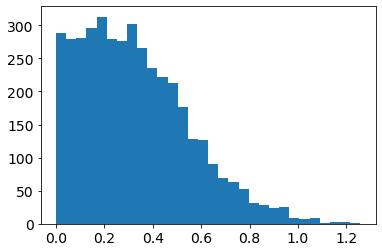

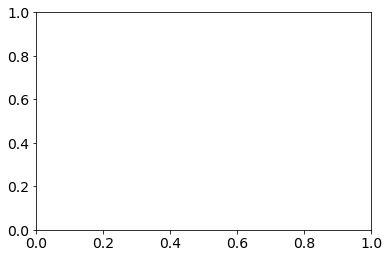

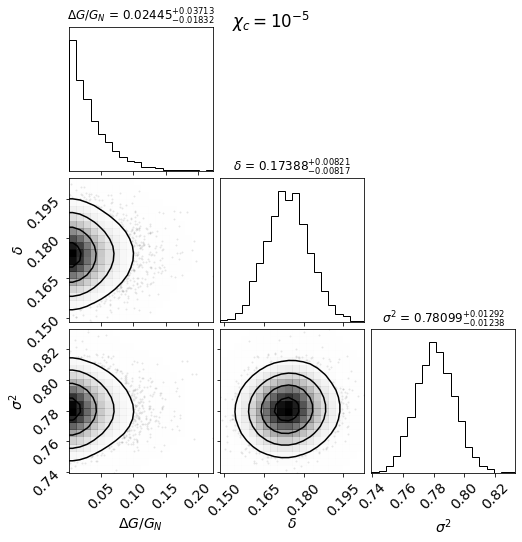

  0%|▏                                          | 4/918 [00:00<00:27, 33.69it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 1.2166010025192712e-06
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 5.689272817825112e-07
10213-1902 [50] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 50.0 0.0 8.568263620404409e-07
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 3.7528390586883286e-07
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0 0.0 2.0766356721967416e-06
10218-12703 [50] [3

  1%|▌                                         | 12/918 [00:00<00:28, 32.17it/s]

10218-3704 [50] [-0.2423, -0.7324, -0.4111, -0.2502, -0.1409, -0.2076, -0.2494, -0.3265, -0.3433, -0.3506, -0.3606, -0.3689, -0.3645, -0.3466, -0.4111, -0.2985]
10218-3704 50.0 0.0 1.068459684854955e-06
10219-9102 [50] [1.3962, 1.1814, 0.7492, 0.4692, 0.3335, 0.2205, 0.1532, 0.1423, 0.1945, 0.153, 0.0798, 0.0216, -0.0715, -0.157, -0.0196, -0.0532, -0.0405]
10219-9102 50.0 0.0 4.830983231067765e-07
10220-12705 [50] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 50.0 0.0 7.897917265867627e-07
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 6.0313310937958715e-06
10224-9101 [50] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 50.0 0.0 3.610844033900399e-07
10226-12704 [50] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694

  2%|▉                                         | 20/918 [00:00<00:28, 31.92it/s]

10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 1.0497738494292231e-05
10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 1.1548920452727845e-05
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 8.794360412404933e-06
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 50.0 0.0 9.172175586405098e-07
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 5.236793030812923e-06
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.009

  3%|█▎                                        | 28/918 [00:00<00:27, 31.87it/s]

10495-12704 [50] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 50.0 0.0 5.678532425089932e-06
10495-12705 [50] [871.1598, 1245.0304, 1205.1955, 1347.7893, 1374.3588, 1517.2635, 1622.8998, 1633.9971, 1757.8692, 1799.4196, 1854.634, 1999.5551, 1849.1662, 1882.4866, 1807.1303, 1651.9125, 1681.1326, 1493.9167, 2771.4516, 2121.0254, 1992.5196]
10495-12705 50.0 0.0 4.479061958020355e-07
10495-3702 [50] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 50.0 0.0 9.952115554718402e-07
10496-12704 [50] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268.8121, 253.915, 333.7881, 358.7629, 315.1183, 261.3063, 216.6964, 267.188, 258.5169, 256.0365, 248.4992]
10496-12704 50.0 0.0 1.063036777713512e-06
10496-12705 [50] [-0.38

  3%|█▍                                        | 32/918 [00:01<00:28, 31.64it/s]

10499-3702 [50] [-0.3822, -0.1753, 0.3237, 0.6092, 0.8357, 0.9307, 1.1046, 1.1845, 1.1657, 1.064, 1.005, 1.0954, 0.7875, 0.8892, 0.9769, 1.0508, 1.3156, 1.2283]
10499-3702 50.0 0.0 8.745190412828672e-07
10499-3703 [50] [-0.0563, -0.0436, 0.024, 0.1267, -0.0775, -0.0664, 0.0153, -0.0929, -0.1244, -0.0851, -0.0939, -0.1131, -0.1033, -0.048, 0.0474, 0.0456, 0.0289, -0.0666, -0.0844, -0.5663]
10499-3703 50.0 0.0 1.3369143965198506e-06
10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 2.082757466251668e-06
10500-12704 [50] [140.7935, 35.4055, 16.1502, 8.7997, 6.1202, 5.6067, 5.0715, 4.9205, 5.0767, 4.6234, 4.2501, 4.0673, 3.8962, 3.8831, 3.7867, 3.6009, 3.0687, 4.1948, 2.9642, 3.5448, 1.9938, -0.2753, 2.8838, 5.8145]
10500-12704 50.0 0.0 4.393724481360779e-07
10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 2.644235490726508e-05
10500-3702 [50] [211.267, 568.975, 

  4%|█▊                                        | 40/918 [00:01<00:27, 31.72it/s]

10501-12704 [50] [1.3181, 1.9521, 1.9474, 1.8957, 2.0169, 2.066, 2.2805, 2.1361, 1.7635, 1.5052, 2.0197, 2.1387, 2.493, 1.9877, 1.7896, 1.1205, 1.6972, 2.5971]
10501-12704 50.0 0.0 2.0208003107723245e-06
10501-6101 [50] [54.152, 240.5257, 446.403, 593.882, 679.4829, 745.3089, 578.3118, 397.5307, 268.9797, 276.8619, 234.4717, 196.8602, 156.2454, 140.6324, 64.5922]
10501-6101 50.0 0.0 1.2996233332396115e-06
10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 50.0 0.0 6.849656140059389e-07
10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 6.676751766597493e-07
10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 9.328281857881904e-06
10505-12704 [50] [0.622

  5%|██▏                                       | 48/918 [00:01<00:27, 31.38it/s]

10508-12703 [50] [0.5005, 0.4509, 0.1544, 0.1328, 0.1165, 0.1176, 0.065, 0.1329, 0.2506, 0.179, 0.1788, 0.1204, 0.0037, 0.016, -0.0301, -0.0876]
10508-12703 50.0 0.0 4.753959964563565e-06
10509-12703 [50] [1226.9439, 2166.987, 2538.8741, 2127.6504, 1648.0951, 1358.0909, 1167.9374, 985.8138]
10509-12703 50.0 0.0 9.359015143634689e-07
10509-1901 [50] [88.4511, 296.1948, 449.6905, 409.1127, 761.2326, 574.7336, 678.7086, 604.9771, 571.2616, 614.5332, 408.9334, 441.3848, 355.292, 300.996, 243.919, 230.1612, 180.5992, 163.4382, 176.2701, 193.176, 205.4741]
10509-1901 50.0 0.0 3.2285932168863074e-07
10509-6101 [50] [414.6573, 159.5598, 352.8386, 670.9188, 930.199, 434.1238, 984.9702, 921.6235, 784.8291, 825.2006, 827.4197, 661.5592, 624.5693, 894.3523, 620.0269, 747.519, 623.1939, 701.341, 577.342, 1031.0135, 622.2157, 697.4912, 668.4888, 271.226]
10509-6101 50.0 0.0 5.993271609985427e-07
10511-12704 [50] [-0.0162, 0.2052, 0.0934, -0.0203, -0.0645, -0.0743, -0.1124, -0.1256, -0.1314, -0.1489,

  6%|██▌                                       | 56/918 [00:01<00:26, 32.38it/s]

10512-12705 [50] [-0.9971, -0.9962, -0.9967, -0.9971, -0.9969, -0.9968, -0.9961, -0.9958, -0.9964, -0.9971, -0.9977, -0.9977, -0.9977, -0.9976, -0.998]
10512-12705 50.0 0.0 1.1158413214108642e-06
10512-9102 [50] [4147.3152, 2927.8473, 3245.8656, 2878.0674, 2617.7881, 2204.6977, 1695.8151, 1371.2689, 1298.2413, 1241.1228, 1357.9116, 1330.7104, 1714.839, 1930.3755, 2196.7284, 2401.8011, 2844.302, 3122.8481, 2925.4465]
10512-9102 50.0 0.0 8.411690212110973e-07
10513-12702 [50] [-0.9916, -0.9877, -0.9855, -0.9802, -0.9787, -0.98, -0.9868, -0.9787, -0.862, -0.9802]
10513-12702 50.0 0.0 1.2595844485963325e-06
10514-6103 [50] [0.5999, 0.3982, 0.2747, 0.2749, 0.0781, 0.0617, 0.0681, -0.0189, -0.0377, -0.0578, -0.065, -0.0594, 0.0253, -0.0317, 0.1182, -0.1428, -0.1895, -0.2508, -0.2991, -0.355]
10514-6103 50.0 0.0 3.5982289217811426e-07
10516-6104 [50] [0.3084, -0.237, -0.3593, -0.3575, -0.3434, -0.2974, -0.3603, -0.4386, -0.4629, -0.4919, -0.5092, -0.5031, -0.4319, -0.4152, -0.2877, -0.6618]
1

  7%|██▉                                       | 65/918 [00:01<00:24, 35.15it/s]

10518-1902 [50] [-0.0105, 0.2572, 0.0495, 0.0308, 0.0287, -0.0677, -0.0841, -0.0885, -0.1994, -0.1432, -0.1195, -0.1634, -0.1173, -0.1219, -0.165, -0.1325, -0.1731]
10518-1902 50.0 0.0 1.2070492485162185e-06
10518-6102 [50] [-0.217, 1.2282, 0.4062, 0.3459, 0.382, 0.1799, 0.1478, 0.1175, 0.0995, 0.1358, 0.0812, 0.048, 0.0452, 0.0639, 0.0875, 0.0309, 0.0337, 0.0007, -0.0113, -0.1383]
10518-6102 50.0 0.0 9.459020572082693e-07
10519-12704 [50] [-0.2611, 0.2686, 0.1702, 0.0601, 0.0584, 0.0258, -0.0515, -0.1077, -0.1123, -0.1006]
10519-12704 50.0 0.0 1.6303875113091437e-06
10519-6102 [50] [15.342, 9.7033, 5.6052, 3.8579, 2.785, 2.1688, 1.9416, 1.9483, 2.0544, 1.8028, 1.946, 2.1855, 2.046, 2.3544, 2.1616]
10519-6102 50.0 0.0 1.5749520642515475e-06
10520-12704 [50] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.0366, 0.0275, -0.0135, 0.0213, 0.0998, -0.1048, -0.1309]
10520-12704 50.0 0.0 4.997126689274547e-07
10520-6102 [50] [-0.9995, -0.9993, -0.9985, -0.9976, -0.9986, -0

  8%|███▍                                      | 75/918 [00:02<00:21, 40.00it/s]

10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712, 0.035, -0.0115, 0.0248, -0.0288, 0.0512, -0.0187, 0.0073, 0.0432, -0.0916, -0.1233, -0.1818, -0.1471]
10839-3704 50.0 0.0 5.42980833696526e-07
10839-6101 [50] [244.3098, 615.0842, 876.8345, 1563.8627, 1705.1968, 1816.091, 1687.128, 1731.6052, 1640.9131, 1596.506, 1498.4971, 1406.0518, 671.6148, 995.7509]
10839-6101 50.0 0.0 5.053186299681615e-07
10839-9101 [50] [2.1426, 2.2648, 0.9796, 0.8183, 0.5304, -0.0332, -0.1785, -0.3432, -0.3468, -0.4742, -0.4095, -0.6139, -0.5305, -0.616, -0.529, -0.5494, 0.8162, 3.2784]
10839-9101 50.0 0.0 1.3621673926574207e-06
10841-12701 [50] [-0.7323, -0.6652, -0.4249, -0.3016, -0.2957, -0.3482, -0.374, -0.3905, -0.3944, -0.4309, -0.4302, -0.4504, -0.4708, -0.4257, -0.4725]
10841-12701 50.0 0.0 2.8077384539204596e-06
10842-3702 [50] [-0.5415, 0.0585, 0.2828, 0.1825, 0.1674, 0.1342, 0.1324, 0.2899]
10842-3702 50.0 0.0 5.097476003470725e-07
10842-3703 [50] [-0.6099, -0.8101, -0.8807, -0.9171, -0.9297, -0.9289,

  9%|███▋                                      | 81/918 [00:02<00:18, 44.14it/s]

11004-6104 [50] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 50.0 0.0 6.096407799089884e-06
11009-12704 [50] [-0.044, 0.5574, 0.4941, 0.5156, 0.452, 0.4031, 0.3736, 0.4191, 0.4646, 0.4848, 0.558, 0.4716, 0.2432, 0.3821, 0.6252, 0.8487, 0.8601]
11009-12704 50.0 0.0 1.4167343373019205e-05
11009-6102 [50] [0.2368, -0.3064, 0.0765, 0.1736, 0.0574, 0.1163, 0.1754, 0.2052, 0.2777, 0.3634, 0.3506, 0.3192, 0.3455, 0.323, 0.4447, 0.1481, 0.2577, -0.1338, 0.037, 0.1218, 0.8549, -0.5202]
11009-6102 50.0 0.0 5.029558570678125e-07
11010-12705 [0.5493] [-0.0199, 0.0369, -0.0512, -0.0961, -0.0616]
11010-12705 0.5493 3.19967505011641e-08 2.402078355884736e-07
11010-6104 [50] [669.1593, 612.5725, 580.2933, 433.0387, 377.072, 315.1925, 269.3918, 266.5579, 267.4688, 253.2676, 240.0639, 221.1944, 344.4065]
11010-6104 50.0 0.0 2.272183176755605e-06
11010-9101 [50] [2.5718, 0.9269, 0.2901, 0.1931, 0.0011, -0.0504

 10%|████▏                                     | 92/918 [00:02<00:18, 44.40it/s]

11013-1902 [50] [0.7893, 0.6453, 0.5024, 0.4895, 0.4034, 0.2175, 0.0455, -0.0103, 0.0142, -0.2569, -0.0412, -0.2183, -0.1712, -0.0824, -0.3609, -0.2323, -0.3117]
11013-1902 50.0 0.0 3.149152701786861e-06
11013-3701 [50] [0.785, 0.6845, 0.2024, 0.0457, 0.0342, 0.02, -0.06, -0.0296, -0.0379, -0.1677]
11013-3701 50.0 0.0 2.0805711399434728e-06
11013-3702 [50] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 50.0 0.0 7.1508564520455005e-06
11013-6101 [50] [0.3389, -0.3422, -0.154, -0.2894, -0.4104, -0.4385, -0.4897, -0.4798, -0.43, -0.3971, -0.3753, -0.3775, -0.3376, -0.2419, -0.1243, 0.0068, -0.1557, 0.0318, -0.0178, 0.2532, 0.5345, 0.5099]
11013-6101 50.0 0.0 1.3693351929602539e-06
11017-12703 [50] [0.0185, 0.3093, 0.3468, 0.2632, 0.2308, 0.2072, 0.1992, 0.215, 0.2444, 0.2273, 0.053, -0.0123, 0.1078, -0.0553]
11017-12703 50.0 0.0 3.924296020705909e-06
11017-12704 [50] [0.4751, 0.4487, 0.3988, 0.2586, 0.0625, -0.0537, -0.0751, -0.1094, -0.1157, -0.1027, -0.1141, -0.

 11%|████▌                                    | 103/918 [00:02<00:19, 41.64it/s]

11018-3702 [50] [0.6083, 0.007, 0.0959, 0.33, 0.5514, 0.4356, 0.3654, 0.3085, 0.3057, 0.287, 0.3004]
11018-3702 50.0 0.0 7.607938442997759e-07
11018-3703 [50] [-0.5454, 0.4164, 0.6741, 0.5852, 0.6907, 0.7028, 0.6059, 0.5528, 0.656, 0.6306, 0.5445, 0.5549, 0.4676, 0.4329, 0.3355, 0.3242, 0.462, 1.051, 0.5129, 1.3094]
11018-3703 50.0 0.0 2.441448569181175e-06
11018-6102 [50] [69.1052, 130.9961, 113.1141, 109.1797, 92.5989, 91.6354, 88.5765, 83.9604, 80.137, 76.3564, 74.3146, 74.7218, 70.495, 71.7331, 65.8452, 64.9321, 72.2612]
11018-6102 50.0 0.0 2.5329303627492648e-06
11019-12702 [50] [0.0142, 0.2516, 0.1906, 0.1378, 0.0877, -0.003, 0.0993, 0.0958, 0.1065, 0.1232, 0.2086, 0.1132, 0.0357, -0.0115, -0.014, 0.0302, -0.0875, -0.1071]
11019-12702 50.0 0.0 9.328828733395303e-07
11019-12703 [50] [-0.4993, -0.4671, -0.3698, -0.2654, -0.2024, -0.2445, -0.2033, -0.2117, -0.2752, -0.2285, -0.2102, -0.0702, -0.1699, 0.0858, -0.1757, -0.2987]
11019-12703 50.0 0.0 4.099929415895609e-06
11019-12705 [5

 12%|████▊                                    | 108/918 [00:03<00:22, 36.71it/s]

11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 8.427028835750052e-06
11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 4.320058919316596e-06
11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 5.362867413417528e-05
11742-12704 [50] [0.6702, -0.5312, -0.3481, 0.0047, 0.1348, 0.415, 0.2787, 0.5138, -0.0348]
11742-12704 50.0 0.0 6.632445652824591e-07
11743-1901 [50] [-0.5717, -0.3943, -0.5273, -0.3736, -0.306, -0.392, -0.3766, -0.4151, -0.3665, -0.4111, -0.4236, -0.3424, -0.3877, -0.3594, -0.291, -0.4952, -0.6018]
11743-1901 50.0 0.0 4.193095656351689e-06
11744-9102 [50] [-0.6

 13%|█████▏                                   | 116/918 [00:03<00:25, 31.68it/s]

11745-1902 [50] [1.185, 0.9719, 0.4625, 0.4231, 0.2188, 0.1795, 0.0428, 0.0263, -0.0784, -0.2371, 0.1632]
11745-1902 50.0 0.0 1.5455523862836624e-06
11745-6104 [50] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.8527, 0.5703, 0.5078, 0.5176, 0.5143, 0.48, 0.4463, 0.4504, 0.4653, 0.4273, 0.4049]
11745-6104 50.0 0.0 1.939194764653363e-06
11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.0361, -0.076, -0.0711, -0.1542, -0.2041, -0.2119, -0.1066, -0.2705, -0.3138]
11745-9101 50.0 0.0 1.4267237802277099e-06
11746-3703 [50] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 50.0 0.0 2.721279061136319e-06
11746-3704 [45.89533718592965] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 45.89533718592965

 13%|█████▎                                   | 120/918 [00:03<00:27, 29.43it/s]

11747-12702 [50] [-0.4876, -0.2412, -0.0165, -0.0887, -0.0931, -0.0756, -0.076, -0.0313, -0.0043, 0.0037, -0.0318, -0.1133, 0.1257, -0.1019, 0.1921, -0.2837, -0.0753]
11747-12702 50.0 0.0 2.4982629080167216e-05
11749-12701 [50] [-0.6821, -0.1137, 0.255, 0.1029, 0.0811, -0.0849, -0.2182, -0.1487, -0.1095, -0.0437, -0.1285, -0.1939]
11749-12701 50.0 0.0 1.5432099684710575e-06
11749-12704 [50] [1.1585, 1.0264, 1.2033, 1.4986, 1.8954, 2.0398, 2.1095, 2.1199, 1.4688, 1.3033, 0.9132, 0.8426, 0.0515, 0.4719, -0.3735]
11749-12704 50.0 0.0 5.840397279585863e-06
11749-3701 [50] [618.0455, 872.9003, 1483.1859, 1615.2011, 1553.7949, 1334.0598, 1385.5396, 1283.8547, 1216.0833, 1294.494, 1472.7433, 1080.4933, 1346.7897, 1196.9726, 1091.8413, 1216.7304, 927.7028, 363.0292, 281.9853, 551.8779, 169.9359, 54.7426, 122.374, 379.7425, 27.1507]
11749-3701 50.0 0.0 1.4069811531663238e-06
11750-12701 [50] [0.4224, 0.3089, 0.0791, 0.0892, 0.2329, 0.2222, 0.1114, 0.03, 0.0196, 0.0027, 0.0313, 0.0827, 0.0275, 0

 14%|█████▋                                   | 128/918 [00:03<00:25, 30.56it/s]

11750-6103 [50] [6.303, 1.7001, 0.3933, 0.5417, 0.5248, 0.6298, 0.7207, 0.7282, 0.8046, 0.5691, 0.3659, 0.4083, 0.4745, 0.6207, 0.9957, 2.1073, 7.7724]
11750-6103 50.0 0.0 1.280601245857275e-06
11750-9101 [50] [13.4461, 9.2464, 8.3896, 5.4399, 4.9554, 3.0033, 3.1782, 2.4566, 2.5343, 2.0961, 2.3663, 2.3818, 2.4375, 3.0403, 2.3998, 2.3406, 2.9409, 6.8913, 8.6024]
11750-9101 50.0 0.0 4.6475209911771266e-07
11751-1901 [50] [-0.9334, -0.8849, -0.9513, -0.9754, -0.9893, -0.9862, -0.989, -0.9902, -0.9893, -0.9909, -0.9903, -0.9906, -0.9888, -0.9874]
11751-1901 50.0 0.0 1.516932269075449e-06
11751-6102 [50] [0.3738, 0.0535, 0.3785, 0.2124, 0.1333, 0.0258, -0.0223, -0.094, -0.1099, -0.1415, -0.1724, -0.2013, -0.1841, -0.253, -0.3949, -0.2255, -0.2141, -0.2775]
11751-6102 50.0 0.0 1.3459507536963482e-06
11753-3703 [50] [0.2801, 0.7604, 0.7391, 0.5795, 0.35, 0.1693, 0.0874, 0.0586, 0.0152, -0.0057, -0.0099, -0.0594, -0.1073, -0.139, -0.1496]
11753-3703 50.0 0.0 1.1696608667634953e-06
11753-6104 [

 15%|██████                                   | 136/918 [00:03<00:25, 30.15it/s]

11755-12701 [50] [-0.773, -0.7865, -0.7717, -0.7522, -0.7475, -0.7159, -0.7048, -0.6936, -0.7373, -0.7183, -0.7382, -0.7769, -0.6833, -0.7924, -0.5695, -0.681, -0.5512]
11755-12701 50.0 0.0 1.8157796729201685e-06
11755-6101 [50] [-0.0093, 1.0489, 0.9853, 1.2444, 1.0667, 0.8902, 0.7008, 0.6245, 0.5835, 0.5179, 0.397, 0.4083, 0.4791, 0.2148, 0.053]
11755-6101 50.0 0.0 1.9102126202379163e-06
11755-9102 [50] [0.1799, 0.2485, 0.3504, 0.383, 0.2088, 0.1465, 0.0712, -0.0042, -0.0415, -0.0215, 0.0671, 0.0623, 0.1393, -0.1017, 0.125, -0.214, -0.1458]
11755-9102 50.0 0.0 4.356968097846196e-07
11758-3701 [50] [-0.3091, 0.0326, 0.2349, 0.1141, 0.0113, 0.06, -0.0268, -0.1507, -0.2171, -0.1994, -0.1587, -0.1557, -0.1574, -0.1614, -0.0618]
11758-3701 50.0 0.0 8.754299086565896e-07
11758-3702 [50] [-0.544, -0.1141, 0.0167, 0.1028, 0.0854, -0.0041, -0.0149, 0.0406]
11758-3702 50.0 0.0 2.7134660362611106e-06
11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999

 15%|██████▎                                  | 140/918 [00:04<00:26, 29.55it/s]

11760-12703 [50] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0.539, 0.1155, 0.1223, 0.309]
11760-12703 50.0 0.0 6.371822219087048e-07
11760-6101 [50] [0.4533, -0.0157, 0.5654, 0.502, 0.3995, 0.359, 0.3287, 0.2964, 0.2063, 0.2512, 0.2686, 0.2421, 0.2368, 0.1884, 0.0906, -0.0471, -0.3849, -0.319, -0.8166]
11760-6101 50.0 0.0 2.043391158920053e-06
11760-6103 [50] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.2117, -0.2373, -0.2365, -0.2317, -0.3078, -0.2653, -0.3184, -0.2638]
11760-6103 50.0 0.0 4.6587968161518774e-07
11760-9102 [50] [-0.8049, -0.6427, -0.2931, -0.1213, 0.1899, 0.0235, 0.108, 0.1381, 0.1732, 0.1865, 0.1624, 0.1963, 0.1218, 0.1215, 0.1223, 0.2636, 0.046, 0.5962, 0.1808, 0.9922, 2.2582]
11760-9102 50.0 0.0 4.2281684378451006e-07
11761-12702 [50] [-0.6826, -0.6017, -0.2216, -0.1122, -0.0329, -0.02, -0.0711, -0.0937, -0.0782, -0.098, -0.1546, -0.1024, -0.1043, -0.0648, -0.2

 16%|██████▋                                  | 149/918 [00:04<00:26, 29.40it/s]

11761-12704 [50] [-0.1205, 0.9952, 0.5814, 0.2296, 0.1208, 0.126, 0.1222, 0.1041, 0.1683, 0.1996, 0.1448, 0.1188, 0.0574, 0.0394, -0.008, -0.026, -0.0331]
11761-12704 50.0 0.0 2.3307730079465705e-06
11761-12705 [50] [6.8127, 3.6941, 2.4845, 1.3644, 0.5363, 0.2844, 0.104, -0.1]
11761-12705 50.0 0.0 2.1552886903055207e-06
11823-9101 [50] [15949.1976, 8800.0053, 8323.3916, 4811.1692, 2214.9858, 717.2733, 413.2719, 305.7873, 173.5393, 146.0478, 195.6604, 224.7593, 189.4201, 67.1778]
11823-9101 50.0 0.0 8.46403167583462e-07
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 1.1553214057282382e-05
11828-12703 [50] [-0.5587, -0.2913, 0.1844, 0.3112, 0.2627, 0.2124, -0.0354, -0.0957, -0.1295, -0.1601, -0.0565, -0.1246, 0.0413]
11828-12703 50.0 0.0 1.2007373224658682e-06
11830-12701 [50] [-0.9938, -0.9825, -0.9834, -0.9912, -0.9934, -0.9941, -0.9946, -0.9933, -0.9936, -0.9951, -0.9951, -0.994

 17%|██████▉                                  | 155/918 [00:04<00:25, 29.35it/s]

11830-3702 [50] [1.2195, 0.9978, 0.6546, 0.4726, 0.5057, 0.555, 0.4749, 0.3884, 0.4626]
11830-3702 50.0 0.0 1.08327247937455e-06
11830-6104 [50] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.0353, -0.2063, -0.258, -0.2347, -0.2692, -0.3985]
11830-6104 50.0 0.0 9.251022771960864e-07
11831-12703 [50] [0.4472, 0.0224, 0.062, 0.158, -0.0429, -0.0922, -0.1252, -0.188, -0.1276, -0.16, -0.2596, -0.2165, 0.1708, -0.4595]
11831-12703 50.0 0.0 4.7636412795206965e-06
11831-12704 [50] [-0.5822, -0.2435, 0.0115, -0.0848, -0.1704, -0.028, -0.0888, -0.0323, -0.0445, -0.106, -0.3871, -0.1836]
11831-12704 50.0 0.0 1.4636174542880721e-06
11831-6101 [50] [-0.9875, -0.994, -0.9968, -0.9973, -0.9967, -0.9975, -0.9969, -0.9978, -0.9979, -0.9971, -0.9984, -0.9986, -0.9985, -0.9974]
11831-6101 50.0 0.0 3.5418284326982277e-07
11831-6102 [50] [1.041, 0.6096, 0.4053, 0.165, 0.0902, 0.1922, 0.1873, 0.1187, 0.1055, 0.0085, -0.1108, -0.0737]
11831-6102 50.0 0.0 1.8504161065408107e-0

 18%|███████▏                                 | 162/918 [00:04<00:25, 30.04it/s]

11833-9102 [50] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.2658, -0.2176, -0.1929, -0.2471, -0.3166]
11833-9102 50.0 0.0 1.1462067455526483e-06
11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 1.551930327127653e-05
11836-1902 [50] [0.7026, 1.2767, 1.1865, 1.1009, 0.973, 0.9921, 0.7024, 0.7206, 0.623, 0.6145, 0.5505, 0.5955, 0.6037, 0.4142, 0.4147]
11836-1902 50.0 0.0 1.692304074182002e-06
11838-12701 [50] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 0.1336, 0.0903, 0.0213, -0.0554, -0.0342, 0.0225, 0.0053, -0.0272]
11838-12701 50.0 0.0 8.815111298132086e-07
11838-12703 [50] [144.9042, 254.2159, 538.0129, 911.0748, 1089.8377, 1111.2623, 1284.2649, 1228.3752, 1345.2496, 1400.7846, 1427.4787, 1434.5371, 1257.47, 

 18%|███████▍                                 | 166/918 [00:05<00:25, 29.55it/s]

11838-9101 [50] [11.4727, 10.3246, 9.7757, 7.6641, 6.3263, 7.7985, 4.6854, 6.1379, 3.8072, 5.5203, 3.0518, 3.9759, 1.4403, 2.8333, 2.6956, 2.5542]
11838-9101 50.0 0.0 8.551275726325567e-07
11865-12702 [50] [-0.057, -0.0512, 0.0778, -0.0002, -0.0743, -0.0834, -0.0854, 0.0083, -0.0154, -0.0332, -0.07, -0.1612, -0.2706]
11865-12702 50.0 0.0 1.5894178644043214e-06
11865-12704 [50] [0.4447, -0.0557, -0.3894, -0.457, -0.5111, -0.5109, -0.5238, -0.5353, -0.4955, -0.5012, -0.4831, -0.4726, -0.599, -0.615]
11865-12704 50.0 0.0 8.647025107603433e-07
11865-1901 [50] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 50.0 0.0 1.0728866713205774e-06
11865-1902 [50] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0.4429]
11865-1902 50.0 0.0 7.64999497708456e-07
11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 1.8409699092674776e-06


 19%|███████▋                                 | 172/918 [00:05<00:25, 29.00it/s]

11865-9102 [50] [-0.467, -0.4695, -0.4789, -0.5286, -0.6182, -0.6445, -0.6408, -0.6047, -0.6031, -0.6243, -0.655, -0.6895, -0.6998, -0.5904, -0.6729, -0.6983]
11865-9102 50.0 0.0 5.974697475653511e-07
11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2771, 0.298, 0.3814, 0.3262, 0.2102, 0.3978, 0.4467, 0.2866, 0.1214, 0.2202, 0.1346, 0.4041]
11867-6104 50.0 0.0 2.755399022490821e-06
11867-9101 [50] [0.9073, 0.3027, 0.1546, 0.1123, 0.0285, 0.0159, -0.0244, 0.0205, 0.0824, 0.1908, 0.2079, 0.2195, 0.3058, 0.2425, 0.1871, 0.3056]
11867-9101 50.0 0.0 1.6064013853581578e-06
11868-12703 [50] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 3.1271256367780755e-06
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 1.0053000866774236e-05
11871-6103 [50] [0.7182, 0.8575, 0.776, 0.4737, 0.2556, 0.1173, 0.1395, 0.111, 0.0842, 0.0381, 0.0003, -0.0281, -0

 19%|███████▉                                 | 179/918 [00:05<00:25, 28.91it/s]

11940-1902 [50] [-0.0835, 0.1518, 0.1321, 0.0182, -0.0843, -0.1452, -0.1779, -0.1993, -0.1955]
11940-1902 50.0 0.0 5.537723404207916e-06
11940-3703 [11.835095477386933] [1.1615, 1.5645, 1.5154, 1.5213, 1.3625, 1.1856, 0.9977, 0.7191, 0.6591, 0.6153, 0.3767, 0.433, 0.6417, 0.1616, 0.444, 0.2018, 0.0806, 0.2143, 0.1328]
11940-3703 11.835095477386933 7.225539939305612e-08 2.1041167809310818e-07
11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 4.4922936783282105e-05
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 4.274244484984439e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 4.94003823161962e-05
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389

 20%|████████▎                                | 185/918 [00:05<00:26, 28.02it/s]

11942-6104 [50] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 50.0 0.0 3.930148405619112e-07
11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.0425, -0.0331, -0.0546, -0.0982, -0.1371, -0.164, -0.179, -0.1863, -0.172, -0.1572, -0.1563, -0.1648, -0.1726, -0.27]
11943-3703 50.0 0.0 1.498621710768004e-05
11944-12701 [50] [-0.3604, -0.3617, -0.4276, -0.5869, -0.6347, -0.6283, -0.548, -0.5758, -0.5204, -0.4847, -0.4769, -0.4857, -0.5345, -0.6334, -0.5353, -0.5098]
11944-12701 50.0 0.0 2.7028754896494412e-06
11945-12701 [50] [0.3961, 0.2879, 0.3765, 0.1557, -0.0002, -0.113, -0.1502, -0.128, -0.114, -0.1705, -0.0344, 0.0462, 0.017]
11945-12701 50.0 0.0 5.547319500550556e-06
11945-6101 [50] [0.2057, 0.8606, 0.9637, 0.605, 0.4694, 0.2734, 0.2029, 0.1332, 0.0558, -0.0105, 0.0015, 0.0011, -0.0038, -0.016, 0.0504, -0.0338]
11945-6101 50.0 0.0 9.040802666375536e-06
11945-6102 [50] [3.5224, 2.2109, 1.43

 21%|████████▌                                | 191/918 [00:05<00:26, 27.33it/s]

11947-6103 [50] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 50.0 0.0 1.4814774658843547e-06
11949-12701 [50] [1.1975, 0.3408, 0.1441, 0.1243, 0.0225, 0.0003, 0.0028, 0.027, 0.0197, 0.0192, -0.0295, -0.0839]
11949-12701 50.0 0.0 2.786941868083226e-06
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 1.411112600817619e-05
11954-12704 [50] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453, 0.1801, 0.125, 0.0276, -0.0116, -0.0744, -0.134, -0.1626, -0.2559, -0.2802]
11954-12704 50.0 0.0 6.5433903623967454e-06
11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.2778]
11954-3703 50.0 0.0 7.880910401206774e-06
11954-9101 [50] [-0.9882, -0.9937, -0.9946, -0.9965, -0.9974

 21%|████████▊                                | 197/918 [00:06<00:27, 26.69it/s]

11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 6.0897175515815315e-06
11956-12702 [50] [5.6953, 5.0804, 3.2564, 2.1056, 1.2622, 0.6457, 0.4602, 0.5373, 0.9503, 3.7649, 5.1679]
11956-12702 50.0 0.0 1.177637536245634e-06
11956-12705 [50] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 0.2419, 0.2565, 0.3525, 0.1776, 0.103, 0.3387, 0.3814, 0.7221, 0.77]
11956-12705 50.0 0.0 7.618400152228439e-07
11957-12704 [50] [-0.3492, 0.7667, 0.6853, 0.5861, 0.3661, 0.189, 0.1584, 0.1015, -0.0026, 0.0319, 0.1228, 0.1275, 0.2204, 0.0938]
11957-12704 50.0 0.0 3.595161464313186e-07
11957-9101 [50] [127.5969, 337.5453, 692.0501, 754.6672, 761.8038, 673.5367, 561.8056, 470.5271, 446.8561, 434.7914, 434.701, 432.6297, 423.9362, 415.9254, 409.4146, 409.8788]
11957-9101 50.0 0.0 4.1297565437073905e-06
11957-9102 [50] [1.0969, 0.3397, 0.6198, 1.0919, 1.791, 2.069, 2.6145, 2.7123, 2.8073

 22%|█████████                                | 203/918 [00:06<00:26, 26.83it/s]

11958-6103 [50] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 50.0 0.0 4.924086234103375e-07
11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 2.3373891298520755e-06
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 50.0 0.0 4.7216420509466725e-06
11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.9843, 0.6333, 0.3517, 0.1829, 0.1258, 0.0956, 0.1424, 0.1021, 0.028, 0.1221]
11965-9102 50.0 0.0 3.3534859412756324e-06
11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 9.781664659182778e-06
11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.89

 23%|█████████▍                               | 210/918 [00:06<00:25, 28.05it/s]

11970-6102 [50] [-0.0116, -0.0683, -0.0558, -0.0053, 0.0454, 0.025, 0.078, -0.0283, -0.085, -0.1052, -0.0602, -0.0272, -0.0693, -0.0116, -0.1378, -0.2799, -0.2497]
11970-6102 50.0 0.0 1.3304190658365353e-06
11970-6103 [50] [0.7466, 1.1751, 1.6643, 1.3977, 1.0416, 0.8262, 0.6871, 0.5199, 0.4194, 0.3266, 0.2718, 0.2909, 0.2357, 0.2575, 0.2139, 0.0837, -0.0144, -0.0619, 0.133]
11970-6103 50.0 0.0 2.186481816698742e-06
11974-12702 [50] [-0.5341, -0.4596, -0.3852, -0.2683, -0.2117, -0.2349, -0.22, -0.1969, -0.1731, -0.1829, -0.2133, -0.2538, -0.2357, -0.256, -0.1504, -0.1437, -0.1349, 1.1183]
11974-12702 50.0 0.0 4.111366094186137e-06
11975-12701 [20.346365829145725] [-0.1741, -0.13, 0.3291, 1.0808, 1.3321, 1.3798, 1.0057, 0.9745, 0.8989, 0.5699, 0.4672, 0.2163]
11975-12701 20.346365829145725 2.2449303222950717e-08 2.6101129415877004e-07
11975-12705 [50] [0.6902, 0.7621, 0.3208, 0.2527, 0.3317, 0.3259, 0.2387, 0.0864, 0.069, 0.2015, 0.1928, 0.1502, -0.0055, -0.1924]
11975-12705 50.0 0.0 2.2

 24%|█████████▋                               | 216/918 [00:06<00:26, 26.98it/s]

11975-6104 [50] [1.0196, 1.2709, 1.5062, 1.1104, 0.9965, 0.7778, 0.776, 0.6311, 0.7603, 0.6278, 0.6208, 0.5151, 0.5172, 0.5343, 0.2326, 0.5012, 0.187, 0.4522, 0.1401, 0.1327]
11975-6104 50.0 0.0 2.1536021692791585e-06
11976-12703 [50] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 50.0 0.0 1.9528008704792404e-06
11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 50.0 0.0 1.0132688226147338e-06
11978-12705 [50] [0.0184, 0.0968, 0.695, 0.4819, 0.223, 0.1168, 0.1458, 0.1604, 0.1304, 0.1363, 0.1451, 0.1188, 0.0734, 0.0413, 0.0374, 0.0059, 0.0584, 0.0708]
11978-12705 50.0 0.0 1.4166593750468067e-06
11978-6101 [50] [0.1703, 0.2916, 0.2201, 0.1105, 0.137, 0.0651, 0.0262, 0.0439, 0.1227, 0.0551, 0.0171, -0.0525, -0.106, -0.2018, -0.2281, -0.1584, -0.2752, -0.3694, -0.5359, -0.6656, -0.8099]
11978-6

 24%|█████████▉                               | 222/918 [00:07<00:26, 26.44it/s]

11979-12704 [50] [1.0417, 0.8488, 0.6206, 0.5652, 0.598, 0.4342, 0.2822, 0.1334, 0.0604, 0.0319, 0.0291, -0.01, -0.083, -0.0554, -0.0215, -0.0081, 0.0344]
11979-12704 50.0 0.0 5.559382299557944e-07
11979-9101 [50] [0.4094, -0.1099, -0.2651, -0.4134, -0.4241, -0.4727, -0.5, -0.5199, -0.5395, -0.5666, -0.5927, -0.5903, -0.6162, -0.591, -0.6704, -0.611]
11979-9101 50.0 0.0 9.184223841963732e-07
11979-9102 [50] [0.6334, -0.323, -0.1351, -0.0857, 0.0053, 0.0302, 0.0467, 0.0752, 0.0566, 0.0459, 0.0116, 0.0269, 0.0046, -0.0156, -0.091, -0.1558, -0.3105, -0.4242, -0.5324]
11979-9102 50.0 0.0 1.4302929566478542e-06
11981-12702 [50] [293.567, 690.112, 683.5389, 617.2849, 490.646, 374.3616, 455.8674, 450.3051, 457.9927, 478.543, 404.234]
11981-12702 50.0 0.0 3.5542315690173937e-07
11981-12704 [50] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]
11981-12704 50.0 0.0 1.2867146924151489e-06
1

 25%|██████████▏                              | 229/918 [00:07<00:25, 27.04it/s]

11982-12704 [50] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.1555, 0.0797, -0.029, 0.0037, 0.2331]
11982-12704 50.0 0.0 1.6001083074836038e-06
11982-3703 [50] [-0.314, 0.4086, 0.6273, 0.7714, 0.9457, 0.986, 1.0945, 1.392, 1.3945, 1.539, 1.4145, 1.0397, 1.0282, 0.5616, 0.557, 0.0557]
11982-3703 50.0 0.0 1.2293318397108455e-06
11982-6102 [1.3501] [0.7786, 0.4297, 0.4569, 0.7506, 0.7926, 0.6732, 0.6507, 0.5035, 0.3848, 0.2963, 0.4923, 0.064]
11982-6102 1.3501 6.693674193410574e-08 2.1522435749443547e-07
11982-9102 [50] [-0.6167, -0.1298, 0.3235, 1.2078, 1.1438, 0.8069, 0.6394, 0.4963, 0.4228, 0.3252, 0.3069, 0.2838, 0.3393, 0.4905, 0.4567, 0.2311]
11982-9102 50.0 0.0 2.0539144957367845e-06
11984-12701 [50] [-0.2857, -0.1737, 0.0157, 0.0372, -0.1281, -0.2001, -0.1962, -0.1945, -0.1458, -0.0921, -0.099, -0.116, -0.1666, -0.325, -0.2122, -0.442]
11984-12701 50.0 0.0 2.7681119487653167e-06
11984-12702 [50] [-0.2774, -0.3248, -0.3706, -0.

 25%|██████████▎                              | 232/918 [00:07<00:25, 26.46it/s]

12066-3701 [50] [19.2418, 16.9197, 10.1428, 6.0915, 4.4316, 3.0783, 2.9929, 2.3906, 2.7183, 2.8356, 3.2869, 3.669, 3.475, 3.6088, 2.499, 1.7084, 1.9485, 1.5899]
12066-3701 50.0 0.0 3.5120704580467405e-06
12067-12703 [50] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
12067-12703 50.0 0.0 9.848457384417063e-07
12067-12705 [50] [0.4291, 1.3434, 2.0219, 1.7622, 1.0305, 0.7583, 0.4763, 0.1261, 0.0511, 0.0662, 0.1502, 0.2361, 0.2324, 0.212, 0.3434]
12067-12705 50.0 0.0 1.1509075789861188e-06
12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 3.885675329675504e-05
12068-6104 [50] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 50.0 0.0 3.3583751675801317e-06
12069-12704 [50]

 26%|██████████▋                              | 238/918 [00:07<00:26, 25.78it/s]

12069-12705 [50] [1.7332, 1.137, 0.4096, 0.6564, 0.5837, 0.6168, 0.2246, 0.0587, 0.2617, 0.1538, 0.5607, 0.4132, 0.5307, 0.41, 2.8782]
12069-12705 50.0 0.0 1.6860044245455879e-06
12069-6102 [50] [-0.3102, -0.0764, -0.2402, -0.1833, -0.1952, -0.2158, -0.2095, -0.1861, -0.144, -0.1353, -0.1037, -0.1026, -0.0816, -0.0956, -0.1367, -0.1477, -0.0871, -0.0667, -0.0387, -0.58, -0.56, -0.5359, -0.8946, 0.038]
12069-6102 50.0 0.0 2.143144233389654e-06
12071-12701 [50] [-0.9172, -0.8384, -0.6786, -0.6994, -0.7429, -0.7686, -0.7662, -0.8217, -0.8275, -0.8401, -0.7831, -0.8143]
12071-12701 50.0 0.0 1.2124176498159343e-06
12071-1901 [50] [-0.148, -0.1411, -0.1881, -0.1802, -0.1874, -0.1463, -0.1611, -0.1934, -0.1236, -0.1115, 0.0697, 0.0471, 0.1047, 0.171, 0.9648]
12071-1901 50.0 0.0 3.2589600748100268e-06
12071-3702 [50] [43.1041, 1833.3653, 2193.0557, 2409.7616, 2285.0769, 1925.6484, 1966.7994, 2043.2628, 1997.8474, 1832.4832, 1658.3071, 1528.5931, 1298.5116, 1014.8264, 552.6982, 136.4828]
12071-

 27%|██████████▉                              | 244/918 [00:07<00:26, 25.04it/s]

12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.3083, 398.9949, 258.1108, 178.8144, 146.4641, 210.3609, 51.4796, 32.8354, 22.052]
12071-3704 50.0 0.0 1.1063024903138992e-06
12075-12704 [50] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 50.0 0.0 3.160058263598015e-06
12078-12703 [50] [0.3298, 0.5608, 0.2182, 0.3221, 0.2303, 0.0896, 0.0846, 0.2051, 0.3186, 0.33, 0.2532]
12078-12703 50.0 0.0 1.3027327163686977e-06
12078-6103 [50] [1.9637, 5.3953, 4.122, 4.276, 4.2033, 3.4926, 3.3028, 3.2038, 3.1762, 3.0769, 2.868, 2.5911, 2.6527, 2.4952, 2.6226, 2.6979, 2.1328, 1.6158, 1.3218, 1.8508]
12078-6103 50.0 0.0 8.186823358216796e-07
12079-12705 [50] [5.9457, 5.134, 4.915, 2.376, 2.7696, 2.3345, 1.3415, 1.441, 1.4148, 0.8317, 1.0553, 1.0687, 0.9662, 0.8766, 1.1537, 1.4538, 0.8336]
12079-12705 50.0 0.0 2.8702184381506026e-07
12080-12704 [2.8240437185929648] [798.4646, 1129.8436, 1685

 27%|███████████▏                             | 250/918 [00:08<00:25, 25.79it/s]

12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 1.2175062519098467e-05
12082-12702 [50] [52.4225, 34.225, 22.353, 15.87, 12.6473, 9.0293, 9.0994, 7.7946, 7.7752, 7.6215, 7.2913, 5.8669, 7.5773, 10.9051, 27.4723, 42.4809, 31.8612, 44.26]
12082-12702 50.0 0.0 2.201987047288021e-06
12084-12702 [50] [0.4179, 1.0492, 0.9255, 0.717, 0.5874, 0.4344, 0.359, 0.2445, 0.1712, 0.1342, 0.2131, 0.2682, 0.3105, 0.3163]
12084-12702 50.0 0.0 3.9434216821990924e-06
12084-12704 [50] [-0.663, -0.3425, -0.4511, -0.3814, -0.1944, -0.0031, -0.041, -0.1276, -0.2047, -0.2499, -0.2565, -0.1988, -0.1657, -0.268, -0.3391, -0.2896]
12084-12704 50.0 0.0 3.835261934163178e-06
12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-12705 50.0 0.0 7.505125346692845e-07


 28%|███████████▍                             | 256/918 [00:08<00:27, 24.25it/s]

12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.419, 0.387, 0.4139, 0.5272, 0.4564, 0.6029, 0.4957, 0.5971, 0.6267, 0.5749, 0.7061, 0.6081, 0.5243, 0.4383, 0.5097, 0.4647, 0.2768, 0.3996, 0.231, 0.2274, 0.4698, 0.2204, 0.2727]
12084-1901 50.0 0.0 9.580899398399435e-07
12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
12084-3702 50.0 0.0 9.30156938432e-07
12084-3703 [50] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.866, 9.9199, 8.0438, 7.1191, 7.1184, 4.9585, 5.2578]
12084-3703 50.0 0.0 1.2770197676954747e-06
12084-6104 [50] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.0374, 0.0776, -0.025, -0.0223, -0.0093, -0.0487, 0.0214, -0.2045, 0.0836]
12084-6104 50.0 0.0 9.781535827812077e-07
12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0.0071

 28%|███████████▌                             | 259/918 [00:08<00:27, 23.74it/s]

12085-6101 [50] [-0.1417, -0.3914, -0.1738, -0.0755, -0.0973, -0.0439, -0.1113, -0.1774, -0.1947, -0.1728, -0.1408, -0.1367, -0.1146, -0.1045, -0.1506, -0.0235, -0.0308, -0.0502, 0.0507]
12085-6101 50.0 0.0 8.60374202490582e-06
12085-6103 [50] [-0.549, -0.354, -0.3619, -0.3336, -0.3191, -0.1878, -0.2268, -0.2779, -0.144, -0.2236, -0.1423, -0.1582, -0.1565, -0.2223, -0.1937, -0.2795, -0.2396, -0.2355, -0.213, -0.3557, -0.311]
12085-6103 50.0 0.0 7.805850333094163e-07
12085-9102 [50] [0.6086, 0.5632, 0.3343, 0.2119, 0.1282, 0.0402, 0.0288, 0.0478, 0.0313, 0.001, -0.0532, -0.0537, -0.0634, -0.0662, -0.1794, -0.1779, -0.239]
12085-9102 50.0 0.0 8.807162914963567e-07
12088-12705 [50] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-12705 50.0 0.0 1.1934055686203754e-06
12088-9101 [50] [1.3886, 1.0744, 0.6164, 0.1772, -0.0928, -0.1728, -0.2424, -0.3552, -0.3861, -0.4243, -0.4358, -0.4341, -0.4454, -0.4

 29%|███████████▊                             | 265/918 [00:08<00:27, 23.71it/s]

12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-12702 50.0 0.0 6.912057304344802e-07
12089-12704 [50] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 50.0 0.0 4.151886282918437e-06
12089-1901 [50] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 50.0 0.0 1.152946167460171e-05
12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722, -0.1642, -0.1028, -0.1287, -0.1434, -0.0908, -0.1289, -0.1084, -0.2404, -0.097, 0.1709, -0.3201, -0.0196, -0.302]
12089-6103 50.0 0.0 2.8381201036696543e-06
12092-6101 [50] [0.0026, 0.3918, 0.1405, 0.0977, 0.005, 0.0277, 0.1281, 0.0885, 0.0628, 0.0291, -0.0173, -0.1181]
12092-6101 50.0 0.0 2.715115505982968e-06


 30%|████████████                             | 271/918 [00:09<00:27, 23.92it/s]

12093-9101 [50] [-0.9989, -0.997, -0.9973, -0.998, -0.9985, -0.9987, -0.9987, -0.9986, -0.9986, -0.9987, -0.9983, -0.9981, -0.9979, -0.9991, -0.9971]
12093-9101 50.0 0.0 6.071971997101272e-06
12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 40.9064, 40.0677, 39.5836, 40.4106, 39.3101, 37.4365, 38.9587, 41.7447, 41.525, 40.104, 39.0721, 39.6893, 56.2685, 25.7726, 27.1981, 33.78]
12094-3701 50.0 0.0 1.6190137606023887e-06
12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 1.185049741809141e-06
12483-12703 [50] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -0.0898]
12483-12703 50.0 0.0 1.5309276609579043e-06
12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 1.5504866813202336e-06


 30%|████████████▏                            | 274/918 [00:09<00:27, 23.62it/s]

12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 1.39694256321517e-06
12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 50.0 0.0 1.041559825097311e-06
12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696, 2047.2799, 2334.4928, 2266.757, 2196.3005, 1862.0235, 1612.2288, 2078.9089]
12488-6102 50.0 0.0 1.5957183895044409e-06
12488-9101 [50] [0.89, -0.0571, 0.0018, 0.0675, 0.0814, 0.1021, 0.1178, 0.0708, 0.0758, 0.1268, 0.0533, 0.0597, 0.0532, 0.0414, 0.1038, 0.0181, -0.1356, -0.2319, -0.1377]
12488-9101 50.0 0.0 2.6360667306579e-06
12489-3703 [50] [6.1258, 7.3921, 7.9142, 7.3592, 6.7186, 6.0984, 5.5884, 5.3024, 5.0796, 4.2963, 4.3283, 3.7505, 4.11, 3.5385, 4.098]
12489-3703 50.0 0.0 3.0962246937029207e

 31%|████████████▌                            | 280/918 [00:09<00:27, 23.08it/s]

12490-3701 [50] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-3701 50.0 0.0 2.3009542306437606e-06
12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0.0863]
12506-12701 50.0 0.0 5.770452494113507e-06
12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0.0 1.528696178814619e-06
12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0 0.0 6.305141246568345e-07
12512-12702 [50] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 50.0 0.0 7.2

 31%|████████████▊                            | 287/918 [00:09<00:25, 24.44it/s]

12514-12703 [0.9389] [2.1408, 0.3201, 0.1941, 0.0194, 0.03, 0.0603, 0.1872, 0.1977, 0.0662]
12514-12703 0.9389 5.0466504804585855e-08 2.298970137327596e-07
12514-9102 [50] [-0.6627, -0.5978, -0.3356, -0.1465, -0.1607, -0.0924, -0.0736, -0.019, 0.0855, 0.1041, 0.0741, -0.06, -0.1592, -0.1356, -0.0632, -0.2008, -0.2854]
12514-9102 50.0 0.0 7.647239467430352e-07
12518-12705 [50] [-0.8683, -0.7393, -0.3648, -0.0579, -0.0274, -0.0334, -0.0145, 0.016, -0.0154, 0.0703, -0.1575, 0.0272]
12518-12705 50.0 0.0 8.786347993369391e-07
12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 0.0 3.588874403507676e-07
12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.1091]
12518-9101 50.0 0.0 1.2734455496247058e-06


 32%|████████████▉                            | 290/918 [00:09<00:26, 23.83it/s]

12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 3.5668226842406798e-06
12620-6104 [50] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 50.0 0.0 7.943604625052085e-07
12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 2.5259486643179696e-06
12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903, -0.5645]
12621-12705 50.0 0.0 7.817899081891979e-07
12621-6103 [50] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 50.0 0.0 7.198918054415916e-07


 32%|█████████████▏                           | 296/918 [00:10<00:27, 22.96it/s]

12622-9101 [50] [0.295, -0.1664, 0.1745, 0.5326, 0.7376, 0.7334, 0.6499, 0.6151, 0.5534, 0.5303, 0.427, 0.3612, 0.3993, 0.3837, 0.4878, 0.4757, 0.3843, 0.0845]
12622-9101 50.0 0.0 4.221160057511742e-06
12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 3.1193249575336843e-06
12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 6.187472332743241e-06
12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 1.5237042538309198e-06
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 4.184238295894463e-06


 33%|█████████████▍                           | 302/918 [00:10<00:26, 23.17it/s]

12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 1.0015394026111201e-05
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 1.0548553989008396e-05
12679-12701 [11.743082914572865] [-0.4106, -0.1602, -0.09, 0.0292, -0.1142, -0.1585, -0.1702, -0.2231, -0.1617, -0.1473, -0.165, -0.0765, -0.2919, -0.3168, -0.5268, -0.1813, 0.1098, -0.9954]
12679-12701 11.743082914572865 3.8124112550594796e-08 2.4541198600532416e-07
12679-1902 [50] [0.6115, 0.2127, 0.2343, 0.0811, 0.186, 0.028, 0.0072, -0.086, -0.1377, -0.1341, -0.1745, -0.1741, -0.1973, -0.2294, -0.2344, -0.1462, -0.1584]
12679-1902 50.0 0.0 1.2282949321893544e-06
12682-12705 [50] [211.5682, 164.2949, 154.5208, 172.1809, 188.4287, 205.8053, 188.0827, 175.7022, 171.521, 162.4793, 163.9925, 122.1814, 128.

 33%|█████████████▌                           | 305/918 [00:10<00:26, 22.73it/s]

7443-12703 [50] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 50.0 0.0 6.63780454281693e-07
7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1547, -0.1713, -0.2761, -0.2934, -0.2123]
7443-12704 50.0 0.0 5.072103767889266e-06
7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 4.5048211153832054e-07
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.0333, -0.0403, -0.0345, -0.091, -0.0525, -0.2174, -0.2135, -0.5859, -0.4094]
7443-9101 50.0 0.0 1.007474006799324e-06
7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.12

 34%|█████████████▉                           | 311/918 [00:10<00:28, 21.55it/s]

7495-12703 [50] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 50.0 0.0 1.9226541070514605e-06
7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 3.237036973865078e-06
7815-12705 [50] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 50.0 0.0 4.3917308879630707e-07
7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 9.824831256175129e-07
7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 5.552087603405327e-07


 35%|██████████████▏                          | 317/918 [00:11<00:27, 22.19it/s]

7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 2.8225307367769827e-06
7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 7.041046297897193e-07
7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 1.7048454309577402e-06
7958-6101 [50] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 50.0 0.0 4.878756579724358e-07
7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 2.9899750889190905e-06


 35%|██████████████▎                          | 320/918 [00:11<00:27, 21.96it/s]

7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 4.581920188126397e-06
7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 3.9819894036024225e-06
7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 3.7073920985429615e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 5.606836346419376e-06
7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 3.45154253679035e-06


 36%|██████████████▌                          | 326/918 [00:11<00:27, 21.35it/s]

7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 3.5833141950887857e-07
7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 2.466444344378158e-06
7961-12705 [50] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 50.0 0.0 1.482584345069301e-06
7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.0 7.393544991417414e-07
7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 2.7803316913908e

 36%|██████████████▋                          | 329/918 [00:11<00:27, 21.40it/s]

7962-12705 [50] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 0.4867, 0.496, 1.2096, 1.0729, 0.2753, 1.3845, 3.2136]
7962-12705 50.0 0.0 3.658346101930929e-07
7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 50.0 0.0 1.12035175808218e-06
7963-12702 [50] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, -0.9982, -0.9988, -0.9993]
7963-12702 50.0 0.0 2.037048409840234e-06
7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 50.0 0.0 1.5479619813216884e-06
7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]


 37%|███████████████                          | 338/918 [00:12<00:24, 23.57it/s]

7964-6101 [50] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119, 231.394, 254.6415]
7964-6101 50.0 0.0 7.41197217019249e-07
7964-9102 [50] [1.3184, 2.0432, 2.1685, 1.6268, 1.1481, 0.9036, 0.7405, 0.65, 0.5829, 0.509, 0.4898, 0.4008, 0.3018, 0.164, 0.0815, 0.0631, 0.0748, -0.1094, 0.1287]
7964-9102 50.0 0.0 3.2210323750750242e-06
7965-12701 [19.81528442211055] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085, -0.0802, -0.1254, -0.0438, 0.0028, -0.0995, -0.4017]
7965-12701 19.81528442211055 1.7867859571216053e-08 2.655152193992113e-07
7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-1901 50.0 0.0 9.54170641954978e-07
7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.989

 37%|███████████████▏                         | 341/918 [00:12<00:23, 24.91it/s]

7965-9102 [50] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 50.0 0.0 7.770416358183126e-07
7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 2.040796120405653e-06
7968-3701 [50] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 50.0 0.0 2.926636670724359e-06
7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 3.2243125969263384e-05
7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 4.2762018788682407e-07
7975-9102 [0.7563] [-0.4649, 0.0396, 0.5148, 0.8957, 0.7258, 0.6065, 0.5756, 0.5119]
7975-9102 0.7563 5.112861298949869e-08 2.1727730707108255e-07
7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.2

 38%|███████████████▌                         | 348/918 [00:12<00:20, 27.76it/s]

7977-1902 [50] [0.1072, 0.2856, 0.0387, 0.0618, 0.0363, 0.0042, -0.0291, -0.0297]
7977-1902 50.0 0.0 3.397809059804453e-07
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 2.2129789861302136e-06
7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 5.276598139524522e-06
7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 4.272474112976244e-06
7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 4.8648738146768326e-06
7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.06

 39%|███████████████▉                         | 356/918 [00:12<00:19, 29.48it/s]

7990-6104 [50] [-0.3051, -0.0723, 0.2152, 0.3465, 0.313, 0.5262, 0.4361, 0.3236, 0.3249, 0.3219, 0.2532, 0.2184, 0.247, 0.3244, 0.1338, 0.4143, 0.0484]
7990-6104 50.0 0.0 1.368984370865924e-06
7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 2.245072240424987e-05
7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 50.0 0.0 1.607421970356754e-06
7992-6104 [50] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 50.0 0.0 6.30556823905994e-07
7993-3704 [0.6516] [0.1426, 0.6478, 0.7852, 0.7203, 0.4452, 0.3539]
7993-3704 0.6516 6.011418648908994e-08 2.121540271279017e-07
8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.31

 40%|████████████████▎                        | 364/918 [00:12<00:18, 29.85it/s]

8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 2.661036980530542e-06
8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 1.780645186321657e-06
8078-12703 [50] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 4.890321820999884e-06
8078-6103 [50] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149, 0.1969, 0.1396, 0.1246, 0.1262, 0.1162, 0.0747, 0.0502, 0.0254, 0.0225, 0.0724, 0.0304, 0.0506, 0.0715]
8078-6103 50.0 0.0 5.283324673647467e-06
8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 5.218467823507167e-06
8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 

 40%|████████████████▍                        | 368/918 [00:13<00:20, 26.32it/s]

8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 2.3964621274600365e-06
8081-3704 [50] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 50.0 0.0 7.168525096278155e-07
8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 2.347638104879072e-06
8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81, 2355.4256, 1939.6384]
8083-12703 50.0 0.0 3.5331178994648855e-06


 41%|████████████████▋                        | 374/918 [00:13<00:22, 24.48it/s]

8083-12704 [50] [0.2913, 0.5243, 0.3002, 0.1297, 0.1194, 0.1533, 0.1494, 0.1802, 0.1606, 0.0654, 0.1299]
8083-12704 50.0 0.0 1.946068934621948e-06
8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 3.0555283670713404e-06
8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 1.9528628330968562e-06
8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 1.2082507683854579e-06
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 2.6470081593042033e-06


 41%|████████████████▉                        | 378/918 [00:13<00:20, 26.25it/s]

8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 50.0 0.0 7.90204830166032e-07
8088-12705 [1.151] [-0.3463, 0.227, 0.3794, 0.8027, 0.7079, 0.6652, 0.4965, 0.2205, 0.0843, 0.0719, 0.1789, 0.1537]
8088-12705 1.151 1.210126661660444e-07 1.5971376955665428e-07
8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 1.5055212505757823e-06
8091-1902 [50] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747, -0.384]
8091-1902 50.0 0.0 4.272158530086657e-07
8092-12702 [50] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 50.0 0.0 2.996612591134043e-07
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.

 42%|█████████████████▏                       | 384/918 [00:13<00:24, 21.64it/s]

8095-6102 [50] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276, 0.127, 0.1403, 0.0994, 0.0731, 0.0391, -0.0442, -0.086, -0.1131, -0.1728, -0.221, -0.1357, -0.3768, -0.0266, -0.186, -0.3752]
8095-6102 50.0 0.0 3.291683496042404e-07
8131-6101 [50] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.3082, -0.2951, -0.2734, -0.3441, -0.2421, -0.3611, -0.4068, -0.6194, -0.4921, -0.1798, -0.4715, -0.5173, -0.3887]
8131-6101 50.0 0.0 6.649682351545985e-07
8131-9101 [50] [-0.2303, -0.2933, -0.4207, -0.0503, 0.2317, 0.5105, 0.546, -0.1014, -0.1852, -0.0457, 0.0346, 0.33, -0.5646, -0.6862, 0.939]
8131-9101 50.0 0.0 3.581549847620681e-06
8132-12702 [50] [-0.0491, -0.065, 0.2143, 0.0833, 0.0546, -0.0096, -0.0149, 0.021, -0.0837, 0.1062]
8132-12702 50.0 0.0 1.2793092793133726e-05


 42%|█████████████████▎                       | 387/918 [00:13<00:24, 21.60it/s]

8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.170054071306407e-05
8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 2.910773886032646e-06
8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 3.2463585157148292e-06
8135-12702 [6.44027135678392] [-0.0587, -0.0535, 0.1564, 0.1223, 0.0981, 0.0594, 0.0486, 0.0064, 0.0544, 0.0081, -0.0341, -0.0178, 0.0479, -0.1192, 0.2429, -0.0574, -0.0315, -0.2763]
8135-12702 6.44027135678392 7.022900717265861e-08 2.1266325164343718e-07


 43%|█████████████████▌                       | 393/918 [00:14<00:25, 20.40it/s]

8137-12703 [50] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1275, -0.1695, -0.3013, -0.3381]
8137-12703 50.0 0.0 5.232265702283492e-07
8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 50.0 0.0 4.034644646294742e-06
8138-12702 [50] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 50.0 0.0 1.411657370489043e-06
8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 2.72956549804151e-06


 43%|█████████████████▋                       | 396/918 [00:14<00:26, 19.99it/s]

8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 4.7211313128292434e-07
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 3.2848605691182154e-06
8140-3701 [3.1008060301507534] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 3.1008060301507534 5.029256274133026e-08 2.3276477615335414e-07
8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 5.079863703522169e-06


 44%|█████████████████▉                       | 401/918 [00:14<00:27, 19.06it/s]

8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 2.169943120098044e-06
8144-12702 [50] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 50.0 0.0 4.732097998614281e-07
8144-12703 [50] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 50.0 0.0 2.282507850870876e-06
8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 2.159180552878859e-06
8144-6101 [3.1958844221105527] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946,

 44%|██████████████████▏                      | 406/918 [00:14<00:27, 18.76it/s]

8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 3.757954954192181e-06
8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 6.294969206743165e-07
8145-9101 [50] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 50.0 0.0 1.3896497703882597e-06
8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 3.628277369521478e-05


 45%|██████████████████▎                      | 410/918 [00:15<00:28, 17.87it/s]

8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 5.985959994122319e-06
8146-9102 [50] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 50.0 0.0 3.1588688119612764e-07
8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 2.507107233996e-06
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 3.8964934452681393e-05


 45%|██████████████████▍                      | 412/918 [00:15<00:28, 17.64it/s]

8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 3.2951999321045023e-06
8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 1.4033421188754965e-06
8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 9.003833181231782e-07
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 4.994900484306248e-05


 45%|██████████████████▌                      | 416/918 [00:15<00:29, 17.08it/s]

8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 1.01735890302795e-06
8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 8.906373010611512e-07
8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 3.1853055624063648e-06
8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 1.3752171509687619e-06


 46%|██████████████████▊                      | 421/918 [00:15<00:26, 18.45it/s]

8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 50.0 0.0 2.000738365011105e-06
8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 9.488346585544664e-07
8156-3701 [50] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 50.0 0.0 8.058403879088886e-07
8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 3.0646959893666202e-06
8158-6104 [50] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1

 47%|███████████████████                      | 427/918 [00:16<00:23, 20.79it/s]

8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 1.457128658871657e-06
8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 1.8632781878487302e-06
8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 1.2920626726190596e-05
8241-6102 [50] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 50.0 0.0 3.797676786982761e-07
8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 3.991590405033093e-05


 47%|███████████████████▍                     | 434/918 [00:16<00:19, 24.91it/s]

8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 4.955575646529367e-07
8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 1.434835522336969e-06
8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 4.778103137980986e-07
8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 2.7698219972213075e-06
8247-12702 [1.0494] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063]
8247-12702 1.0494 1.0368738066115757e-07 1.752873034224997e-07
8247-12703 [9.783520100502512] [0.0623, -0.1697, 0.0076, 0.

 48%|███████████████████▋                     | 440/918 [00:16<00:18, 25.79it/s]

8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247-9101 50.0 0.0 1.0699326977313512e-06
8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.2998, 1595.4501, 1320.9281, 1254.0149, 1837.1392, 1899.7801, 2506.6682, 2814.69, 1954.3222, 2246.1066, 1731.0676, 1875.7497, 1583.6158, 1841.3166, 477.0393]
8248-12701 50.0 0.0 1.186293443184461e-06
8248-12702 [50] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 50.0 0.0 3.081919069095885e-06
8248-12704 [50] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 50.0 0.0 9.453227289136774e-07
8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 2.01355246480823e-06
82

 49%|███████████████████▉                     | 446/918 [00:16<00:18, 24.93it/s]

8249-6102 [50] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 50.0 0.0 3.823493885453011e-07
8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 50.0 0.0 1.4342321384537876e-06
8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 1.591393976853908e-06
8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 2.533715743700132e-06
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496,

 49%|████████████████████                     | 449/918 [00:16<00:19, 23.71it/s]

8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 2.342406637460247e-06
8252-6104 [50] [2.1127, 786.7076, 1821.9152, 1629.0467, 2046.2674, 2117.149, 2080.0223, 1991.9705, 2037.8148, 2171.4456, 2102.3974, 2113.0128, 1947.7279, 1894.0627, 1734.3312, 1614.2348, 1502.8364, 1540.9181, 989.7452, 1027.4923, 1030.8241, 375.7743, 656.7525]
8252-6104 50.0 0.0 3.8310841377120916e-07
8252-9102 [50] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 568.3335, 671.6366, 717.9725, 510.1554, 342.074, 302.1941, 260.3132, 157.5104, 244.502, 117.7782, 292.6015, 101.1592]
8252-9102 50.0 0.0 6.719107817358277e-07
8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-3703

 50%|████████████████████▎                    | 455/918 [00:17<00:20, 22.61it/s]

8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 8.406615031516607e-07
8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 7.156467774574603e-07
8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 7.945152728454962e-07
8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 8.109394720740228e-07
8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 8.023404542231031e-07


 50%|████████████████████▍                    | 458/918 [00:17<00:20, 22.13it/s]

8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 6.720829531405932e-07
8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 4.445155008503158e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 3.168160026055209e-05
8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 2.6997796533730026e-06
8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.

 51%|████████████████████▋                    | 464/918 [00:17<00:24, 18.42it/s]

8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 7.158667646252171e-07
8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 8.445404591058413e-07
8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 1.5657000303730077e-06


 51%|████████████████████▊                    | 466/918 [00:17<00:26, 17.36it/s]

8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 3.6146775350510513e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 3.366110898792893e-06
8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.0 0.0 4.236696070815237e-06
8263-12705 [50] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 50.0 0.0 9.397639041959335e-07


 51%|████████████████████▉                    | 470/918 [00:18<00:27, 16.00it/s]

8310-3701 [50] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 50.0 0.0 6.302293724145709e-07
8310-9101 [50] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 50.0 0.0 8.625088699364985e-07
8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 1.9146427430339525e-06


 52%|█████████████████████▏                   | 474/918 [00:18<00:27, 15.98it/s]

8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 1.628159509033067e-06
8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 4.0234086937281396e-06
8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 1.0199588720608105e-05
8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 2.9949012700197613e-06


 52%|█████████████████████▎                   | 478/918 [00:18<00:29, 15.07it/s]

8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 5.422476767953791e-06
8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 1.9035570182609745e-06
8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 1.802945255349702e-06


 52%|█████████████████████▍                   | 480/918 [00:18<00:29, 14.80it/s]

8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 5.098738514176554e-06
8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 3.3952113965498904e-06
8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 4.295310266176478e-06
8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 1.6670451793504529e-06


 53%|█████████████████████▌                   | 484/918 [00:19<00:27, 15.61it/s]

8315-9102 [2.92464824120603] [-0.2166, -0.0917, -0.1207, -0.1704, -0.1891, -0.1464, -0.1933, -0.1616, -0.278, -0.2739, -0.2356, -0.2454, -0.332, -0.1867, 1.4585, 0.3111, 0.4387, 0.2663]
8315-9102 2.92464824120603 1.2685910115759605e-07 1.5521812394483188e-07
8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 9.0311191067436e-07
8317-9101 [50] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 50.0 0.0 3.4656631614375244e-07
8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 9.48039952819699e-07


 53%|█████████████████████▊                   | 488/918 [00:19<00:29, 14.62it/s]

8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 6.550712056851987e-06
8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 5.592663378492227e-07
8318-6101 [50] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 50.0 0.0 7.013162307354705e-07


 54%|█████████████████████▉                   | 492/918 [00:19<00:30, 14.12it/s]

8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 3.5275860784527417e-06
8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 4.3691019621534395e-06
8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 5.383834733877817e-07


 54%|██████████████████████                   | 494/918 [00:19<00:30, 13.82it/s]

8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 2.120651724439655e-06
8320-9102 [50] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 50.0 0.0 1.2334824649857264e-06
8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 8.999432212046013e-06


 54%|██████████████████████▏                  | 498/918 [00:20<00:30, 13.60it/s]

8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 1.1775430675203688e-06
8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 6.013181878644311e-06
8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 4.552423850726613e-07


 54%|██████████████████████▎                  | 500/918 [00:20<00:30, 13.51it/s]

8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 9.687270794076455e-06
8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 4.372533444683635e-07
8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 1.0763254019081668e-06


 55%|██████████████████████▌                  | 504/918 [00:20<00:30, 13.48it/s]

8329-6103 [50] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 50.0 0.0 3.8568384667773025e-07
8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 9.940286686318495e-07
8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 1.3178002936898393e-06


 55%|██████████████████████▌                  | 506/918 [00:20<00:30, 13.43it/s]

8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 6.66771118658711e-07
8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 3.447902449824075e-07
8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 9.652680912333873e-07


 56%|██████████████████████▊                  | 510/918 [00:20<00:30, 13.50it/s]

8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 6.12167050122752e-07
8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 6.5440317838095536e-06
8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 6.369406107692596e-07
8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 4.956310774131315e-07


 56%|██████████████████████▉                  | 514/918 [00:21<00:30, 13.33it/s]

8334-3704 [50] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409, 0.6746, 0.3496, 0.5455, 0.2807, 0.4323, -0.0995, 0.0558, 0.4872, 0.3896, 3.1841, -0.3157]
8334-3704 50.0 0.0 2.8385571336365646e-07
8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 1.0887548935175323e-06
8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 5.5884285152961565e-06


 56%|███████████████████████                  | 516/918 [00:21<00:30, 13.16it/s]

8336-9102 [50] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 50.0 0.0 6.183000761689329e-07
8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 5.307511453040955e-06
8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 9.541019643593218e-07


 56%|███████████████████████▏                 | 518/918 [00:21<00:30, 13.23it/s]

8341-9101 [50] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 50.0 0.0 5.310531876030777e-07
8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 1.400363653155095e-06
8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 1.8553431280101824e-06


 57%|███████████████████████▎                 | 522/918 [00:21<00:30, 13.04it/s]

8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 5.0689085963207605e-06
8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 1.681919942405688e-06
8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 1.6427934779739264e-06


 57%|███████████████████████▍                 | 526/918 [00:22<00:30, 12.81it/s]

8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 1.8667401997848174e-06
8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 2.0649088232713307e-06
8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 4.527349893720569e-07


 58%|███████████████████████▌                 | 528/918 [00:22<00:30, 12.70it/s]

8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 9.752329583563164e-07
8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 9.265462016093481e-06
8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 6.061898495863189e-07


 58%|███████████████████████▋                 | 530/918 [00:22<00:30, 12.63it/s]

8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 6.2382046775517596e-06
8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 5.861950273103471e-06
8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 8.971830704624983e-07


 58%|███████████████████████▊                 | 534/918 [00:22<00:31, 12.38it/s]

8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 5.878943548847785e-06
8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 3.398959736227426e-06
8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 1.6748737654151957e-05
8445-3701


 59%|████████████████████████                 | 539/918 [00:23<00:27, 13.89it/s]

8446-12702 [7.604675376884423] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 7.604675376884423 4.121062174044196e-08 2.4213975017630193e-07
8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 2.340692265123519e-06
8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 3.430276357156484e-06


 59%|████████████████████████▏                | 541/918 [00:23<00:27, 13.85it/s]

8447-12701 [50] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 50.0 0.0 3.439078903146655e-07
8447-3701 [6.094834170854272] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977, 0.163, 0.0592, 0.009, 0.1309, 0.116]
8447-3701 6.094834170854272 4.173424387140145e-08 2.4169147937527224e-07
8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 1.3508424194870074e-06


 59%|████████████████████████▎                | 545/918 [00:23<00:27, 13.56it/s]

8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 7.859464017751731e-07
8451-12705 [0.9497] [-0.3525, -0.0131, -0.4307, -0.1607, -0.1962, -0.2127, 0.0242]
8451-12705 0.9497 4.4724821873221086e-08 2.2803884359908243e-07
8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 3.511631855176053e-06


 60%|████████████████████████▍                | 547/918 [00:23<00:28, 13.03it/s]

8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 1.4860574524394749e-06
8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 2.9194956332193946e-06
8452-9102 [50] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 50.0 0.0 3.93175827952005e-07


 60%|████████████████████████▌                | 549/918 [00:23<00:29, 12.67it/s]

8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 4.55970252273285e-06
8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 3.1477670138893865e-06
8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 5.895012495575225e-07


 60%|████████████████████████▋                | 553/918 [00:24<00:29, 12.48it/s]

8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 1.128344821333787e-06
8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 7.28232337370594e-07
8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 1.827964006447342e-06


 61%|████████████████████████▉                | 557/918 [00:24<00:27, 13.24it/s]

8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 2.5698615703289993e-06
8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 4.690616857210119e-07
8459-6101 [50] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 50.0 0.0 3.406851706487663e-07


 61%|████████████████████████▉                | 559/918 [00:24<00:28, 12.70it/s]

8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 4.6445388504633214e-07
8464-12704 [50] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 50.0 0.0 3.5377548090795293e-07
8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 6.92891446253305e-07


 61%|█████████████████████████                | 561/918 [00:24<00:29, 12.31it/s]

8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 4.079625803318568e-06
8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 3.1098693923484126e-06
8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 3.1873730774825884e-06


 62%|█████████████████████████▏               | 565/918 [00:25<00:29, 12.06it/s]

8466-12702 [0.9475] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658, 0.1059, 0.0792, 0.0526]
8466-12702 0.9475 5.5100453220608116e-08 2.268700725875978e-07
8482-12703 [50] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 50.0 0.0 1.2380642693534657e-06
8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 4.062935520018865e-06


 62%|█████████████████████████▎               | 567/918 [00:25<00:29, 11.82it/s]

8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 9.669912626771057e-07
8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 4.218548436973991e-06
8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 3.98226970580637e-06


 62%|█████████████████████████▌               | 571/918 [00:25<00:29, 11.67it/s]

8485-9102 [32.22659095477387] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 32.22659095477387 1.4148797252940987e-08 2.6922814568659276e-07
8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 4.7379193087099823e-07
8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 4.887459819251287e-07


 62%|█████████████████████████▌               | 573/918 [00:25<00:29, 11.54it/s]

8547-6102 [50] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 50.0 0.0 3.1800092261253185e-07
8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 50.0 0.0 6.601998783953532e-07
8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 9.519271641404312e-07


 63%|█████████████████████████▊               | 577/918 [00:26<00:30, 11.29it/s]

8549-6102 [50] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 50.0 0.0 6.295393915845765e-07
8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 1.2876217677682369e-05
8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 7.320564306729319e-07


 63%|█████████████████████████▊               | 579/918 [00:26<00:30, 11.23it/s]

8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 2.5926930887458406e-06
8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 8.189676932688992e-07
8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 1.0185460057038863e-06


 64%|██████████████████████████               | 583/918 [00:26<00:30, 11.06it/s]

8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 8.18220111375731e-07
8555-12702 [50] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 50.0 0.0 8.761345764409566e-07
8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 1.0767199253303227e-06


 64%|██████████████████████████▏              | 585/918 [00:27<00:30, 11.03it/s]

8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 1.5719685030750811e-06
8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 9.0743396342153e-07
8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 2.980859524335877e-06


 64%|██████████████████████████▎              | 589/918 [00:27<00:29, 11.00it/s]

8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 3.1050544476079903e-06
8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 8.484951808051838e-07
8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 3.2143131868139902e-06


 64%|██████████████████████████▍              | 591/918 [00:27<00:30, 10.85it/s]

8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 1.5727486823320358e-06
8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 1.605509833879451e-06
8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 7.289871449792437e-07


 65%|██████████████████████████▌              | 595/918 [00:27<00:29, 10.84it/s]

8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 5.116397287277529e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 6.912687590844267e-07
8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 1.6224177535057122e-06


 65%|██████████████████████████▋              | 597/918 [00:28<00:29, 10.71it/s]

8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 1.0863864244489793e-06
8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 1.8947352286820904e-06
8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 8.061365641321669e-07


 65%|██████████████████████████▊              | 601/918 [00:28<00:29, 10.68it/s]

8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 8.68935338922689e-06
8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 5.337328949447175e-06
8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 1.0213302849591942e-05


 66%|██████████████████████████▉              | 603/918 [00:28<00:29, 10.61it/s]

8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 1.006108921384912e-05
8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 7.878214116117673e-06
8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 1.6660671444582468e-06


 66%|███████████████████████████              | 607/918 [00:29<00:29, 10.56it/s]

8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 2.287869085487956e-06
8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 1.5483056906481311e-06
8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 1.385044286189775e-06


 66%|███████████████████████████▏             | 609/918 [00:29<00:28, 10.82it/s]

8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 5.800181850279765e-07
8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 1.6375737196418126e-06
8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 9.281653469441981e-07


 67%|███████████████████████████▍             | 613/918 [00:29<00:29, 10.47it/s]

8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 1.9437411097198027e-06
8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 8.4219808581172e-07
8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 4.192061448097295e-06


 67%|███████████████████████████▍             | 615/918 [00:29<00:28, 10.61it/s]

8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 1.8018752085592875e-06
8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 1.4141744286825973e-06
8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 4.320894175634393e-06


 67%|███████████████████████████▋             | 619/918 [00:30<00:28, 10.52it/s]

8597-6103 [19.9891743718593] [-0.1805, -0.1664, 0.0676, 0.1146, 0.0136, -0.0918, -0.1, -0.0753, -0.115, -0.0211, 0.0236, 0.0629, 0.164, 0.143, 0.1648]
8597-6103 19.9891743718593 3.121282718643067e-08 2.5229920380973525e-07
8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 1.2093265565765732e-06
8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]


 68%|███████████████████████████▋             | 621/918 [00:30<00:28, 10.41it/s]

8600-12704 50.0 0.0 2.431160382556767e-06
8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 3.429198380883413e-06
8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 4.115116834385913e-05


 68%|███████████████████████████▊             | 623/918 [00:30<00:28, 10.29it/s]

8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 4.946043823184682e-06
8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 1.0770176487411049e-05
8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 5.751036447885714e-06


 68%|████████████████████████████             | 627/918 [00:31<00:28, 10.12it/s]

8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 4.8477801939123265e-06
8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 2.8183918219846134e-06
8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]


 69%|████████████████████████████             | 629/918 [00:31<00:28, 10.04it/s]

8604-12701 50.0 0.0 4.576528908405183e-06
8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 1.8251451554491603e-06
8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 7.018917051240662e-05


 69%|████████████████████████████▏            | 631/918 [00:31<00:27, 10.33it/s]

8606-6101 [0.3641] [828.4766, 179.1159, 846.0272]
8606-6101 0.3641 1.4388129860933455e-07 1.1888843220448011e-07
8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 1.979717125714165e-06
8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 2.931529777760135e-06


 69%|████████████████████████████▎            | 635/918 [00:31<00:27, 10.36it/s]

8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 5.698496685428868e-07
8610-6101 [3.8700447236180904] [0.9237, 0.7275, 0.6377, 0.5194, 0.2119, 0.0444, -0.0576, -0.0451, -0.0514, -0.0402, -0.0351, -0.0178, 0.0253, 0.0734, 0.032, 0.057, 0.0046, 0.0719, -0.2942]
8610-6101 3.8700447236180904 4.780660629441097e-08 2.3548577076489527e-07
8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 7.24104906084763e-07


 70%|████████████████████████████▌            | 639/918 [00:32<00:24, 11.17it/s]

8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 4.160373390583269e-05
8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 3.4099901146379377e-06


 70%|████████████████████████████▋            | 641/918 [00:32<00:25, 10.67it/s]

8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 5.028964153764767e-05
8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 8.530897031024074e-06


 70%|████████████████████████████▋            | 643/918 [00:32<00:26, 10.34it/s]

8613-12702 [50] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 50.0 0.0 2.981317298482337e-07
8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 9.508346943139857e-07
8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 6.603041092306228e-07


 70%|████████████████████████████▊            | 645/918 [00:32<00:27, 10.09it/s]

8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 5.228639145105465e-07
8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 8.076898402082417e-07


 70%|████████████████████████████▉            | 647/918 [00:32<00:27,  9.92it/s]

8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 7.680393298415106e-06
8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 4.531494007361184e-06
8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 5.214304751060822e-07


 71%|█████████████████████████████            | 651/918 [00:33<00:27,  9.61it/s]

8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 3.546158801830968e-06
8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 4.6772649305744085e-07


 71%|█████████████████████████████▏           | 653/918 [00:33<00:27,  9.50it/s]

8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 6.439439244098117e-07
8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 6.70303056919827e-07


 71%|█████████████████████████████▎           | 655/918 [00:33<00:27,  9.40it/s]

8624-12702 [50] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 50.0 0.0 3.941558711664416e-07
8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 1.7095353672227518e-06
8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 5.2352381206034386e-05


 72%|█████████████████████████████▍           | 658/918 [00:34<00:28,  9.27it/s]

8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 2.5684389067888736e-05
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 5.711672268642479e-06


 72%|█████████████████████████████▍           | 660/918 [00:34<00:27,  9.24it/s]

8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 3.349270467198621e-05
8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 1.2656756065621908e-05


 72%|█████████████████████████████▌           | 661/918 [00:34<00:27,  9.21it/s]

8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 4.355410261487521e-06
8651-12702 [21.06190954773869] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 21.06190954773869 4.409840805580225e-08 2.393390429088912e-07
8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 3.744849683416572e-06


 72%|█████████████████████████████▋           | 665/918 [00:34<00:27,  9.31it/s]

8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 8.103919158062633e-07
8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 1.4120764171241237e-06


 73%|█████████████████████████████▊           | 667/918 [00:35<00:27,  9.14it/s]

8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 1.2489894788208441e-06
8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 8.47603829111755e-07


 73%|█████████████████████████████▉           | 669/918 [00:35<00:27,  8.97it/s]

8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 2.377891694592053e-06
8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 1.5489115919154397e-06


 73%|█████████████████████████████▉           | 671/918 [00:35<00:26,  9.25it/s]

8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 1.8030246740478585e-06
8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 3.290616643659788e-06
8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 1.3154996291784512e-06


 73%|██████████████████████████████           | 674/918 [00:35<00:26,  9.08it/s]

8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 1.9984571005178262e-06
8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 5.294453885884838e-07


 74%|██████████████████████████████▏          | 676/918 [00:36<00:26,  9.01it/s]

8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 1.0582288808834423e-06
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 3.085002000557569e-06


 74%|██████████████████████████████▎          | 678/918 [00:36<00:26,  9.20it/s]

8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 5.040470298960743e-07
8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 4.628615869258533e-07


 74%|██████████████████████████████▎          | 680/918 [00:36<00:26,  9.02it/s]

8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 2.3061992151358466e-06
8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 2.3030669337788208e-06


 74%|██████████████████████████████▍          | 682/918 [00:36<00:26,  8.90it/s]

8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 4.68343308946151e-06
8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 2.4552818871206015e-06
8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 6.597356308648704e-06


 75%|██████████████████████████████▌          | 685/918 [00:37<00:26,  8.77it/s]

8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 1.8710231886894878e-06
8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 1.3671529062242959e-06


 75%|██████████████████████████████▋          | 687/918 [00:37<00:26,  8.75it/s]

8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 4.671637974024232e-07
8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 9.413633804359942e-07


 75%|██████████████████████████████▊          | 689/918 [00:37<00:26,  8.70it/s]

8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 1.248815354938616e-06
8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 8.29618618440264e-06


 75%|██████████████████████████████▊          | 691/918 [00:37<00:25,  8.98it/s]

8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 1.2263555193197211e-05
8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 1.9326529322839687e-05


 75%|██████████████████████████████▉          | 692/918 [00:37<00:25,  8.89it/s]

8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 1.256895959140418e-05
8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 1.9442076605456423e-06


 76%|███████████████████████████████          | 695/918 [00:38<00:26,  8.48it/s]

8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 5.156919000310554e-07
8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 2.479168984218867e-06


 76%|███████████████████████████████          | 696/918 [00:38<00:26,  8.48it/s]

8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 1.1703970541121812e-06
8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 50.0 0.0 1.5831473561695082e-06


 76%|███████████████████████████████▏         | 699/918 [00:38<00:24,  8.86it/s]

8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 1.2919033369320269e-06
8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 1.4310350138821137e-06
8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 2.7056927628371116e-06


 76%|███████████████████████████████▎         | 702/918 [00:39<00:25,  8.53it/s]

8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 2.263257874105199e-06
8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 1.554215300267738e-06


 77%|███████████████████████████████▍         | 703/918 [00:39<00:25,  8.50it/s]

8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 1.131037488616164e-06
8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 1.412633040895231e-06


 77%|███████████████████████████████▍         | 705/918 [00:39<00:25,  8.38it/s]

8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 8.63172687596624e-06
8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 3.21147873017456e-06


 77%|███████████████████████████████▌         | 708/918 [00:39<00:25,  8.32it/s]

8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 3.3200252753485065e-06
8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 2.3744877314360737e-06


 77%|███████████████████████████████▋         | 710/918 [00:40<00:25,  8.23it/s]

8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 6.0412071816128076e-06
8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 1.4031050250376614e-05


 78%|███████████████████████████████▊         | 712/918 [00:40<00:25,  8.21it/s]

8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 4.825404890183286e-05
8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 2.905964469603251e-06


 78%|███████████████████████████████▊         | 713/918 [00:40<00:25,  8.19it/s]

8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 1.304144998021343e-06
8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 3.8049121151168645e-06


 78%|███████████████████████████████▉         | 715/918 [00:40<00:25,  8.10it/s]

8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 3.766126210411182e-07
8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 1.6831394916482045e-06


 78%|████████████████████████████████         | 717/918 [00:40<00:24,  8.05it/s]

8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 1.5221512897416318e-06
8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 1.8153919695634857e-06


 78%|████████████████████████████████         | 719/918 [00:41<00:24,  8.06it/s]

8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 3.6971663361826574e-06
8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 2.6918686833078084e-06


 79%|████████████████████████████████▏        | 721/918 [00:41<00:24,  7.99it/s]

8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 1.2905703700369012e-05
8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 6.235453860590214e-07


 79%|████████████████████████████████▎        | 723/918 [00:41<00:24,  7.86it/s]

8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 2.3705091718079592e-06
8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 2.290210914168717e-06


 79%|████████████████████████████████▍        | 725/918 [00:41<00:24,  7.82it/s]

8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 4.317454207722208e-07
8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 7.256904535835055e-07


 79%|████████████████████████████████▍        | 727/918 [00:42<00:24,  7.80it/s]

8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 2.1971953437368654e-06
8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 8.553505126318035e-07


 80%|████████████████████████████████▌        | 730/918 [00:42<00:22,  8.25it/s]

8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 7.039639994590662e-07
8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 2.1867280709159735e-06


 80%|████████████████████████████████▋        | 731/918 [00:42<00:23,  8.08it/s]

8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 3.707418305953935e-07
8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 9.296278801114745e-06


 80%|████████████████████████████████▋        | 733/918 [00:42<00:23,  7.86it/s]

8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 2.6576500255015204e-06
8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 6.066431946120196e-07


 80%|████████████████████████████████▊        | 735/918 [00:43<00:23,  7.76it/s]

8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 3.4419424931347463e-07
8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 5.224004712042421e-06


 80%|████████████████████████████████▉        | 737/918 [00:43<00:23,  7.74it/s]

8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 4.286921292745547e-06
8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 3.704807694745575e-06


 81%|█████████████████████████████████        | 739/918 [00:43<00:23,  7.67it/s]

8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 4.213690276292448e-06
8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 5.0583969855945825e-06


 81%|█████████████████████████████████        | 741/918 [00:43<00:21,  8.20it/s]

8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 1.1689380889067408e-06
8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 1.8196338614863818e-06
8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 1.2093753155080581e-06


 81%|█████████████████████████████████▎       | 745/918 [00:44<00:15, 10.89it/s]

9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 2.292981284513347e-06
9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 1.2649091670335138e-06
9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 1.3262164485622514e-06


 81%|█████████████████████████████████▎       | 747/918 [00:44<00:14, 11.61it/s]

9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 1.4077485218508268e-06
9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 1.4025317776477067e-06
9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 8.198305542589811e-07


 82%|█████████████████████████████████▍       | 749/918 [00:44<00:16, 10.49it/s]

9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 4.138420912426292e-06
9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 4.252370728585586e-06


 82%|█████████████████████████████████▌       | 752/918 [00:45<00:18,  8.91it/s]

9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 7.437015215192949e-06
9028-12702 [50] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 50.0 0.0 4.951862306377765e-07


 82%|█████████████████████████████████▋       | 754/918 [00:45<00:19,  8.31it/s]

9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 2.489221996167343e-06
9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 6.762067941480934e-06


 82%|█████████████████████████████████▊       | 756/918 [00:45<00:20,  7.90it/s]

9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 1.2217294985352175e-05
9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 5.788809128116813e-06


 83%|█████████████████████████████████▊       | 758/918 [00:45<00:21,  7.57it/s]

9032-3704 [50] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 50.0 0.0 1.7576241045919124e-06
9033-12705 [50] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 50.0 0.0 1.950819014594873e-06


 83%|█████████████████████████████████▉       | 760/918 [00:46<00:21,  7.45it/s]

9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 4.36891132497214e-06
9033-9102 [50] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 50.0 0.0 3.517737998283e-07


 83%|██████████████████████████████████       | 762/918 [00:46<00:21,  7.38it/s]

9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 4.851579809384579e-07
9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 1.164835076475877e-06


 83%|██████████████████████████████████       | 764/918 [00:46<00:21,  7.30it/s]

9040-6104 [50] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 50.0 0.0 4.6867428984679347e-07
9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 4.8355134987774544e-06


 83%|██████████████████████████████████▏      | 766/918 [00:46<00:20,  7.27it/s]

9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 3.506221754378237e-06
9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 2.29235513477858e-06


 84%|██████████████████████████████████▎      | 768/918 [00:47<00:20,  7.28it/s]

9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 3.3827756049901557e-06
9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 5.655958314932062e-07


 84%|██████████████████████████████████▍      | 770/918 [00:47<00:19,  7.41it/s]

9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 2.0050329774408677e-05
9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 4.913506670727896e-07


 84%|██████████████████████████████████▍      | 772/918 [00:47<00:18,  7.81it/s]

9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 3.5590303376188617e-06
9046-12702 [26.198213065326634] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 26.198213065326634 8.539789227795984e-08 1.9779879885954012e-07


 84%|██████████████████████████████████▌      | 774/918 [00:47<00:18,  7.63it/s]

9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 5.153799511406224e-06
9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 6.216358751063967e-06


 85%|██████████████████████████████████▋      | 776/918 [00:48<00:19,  7.41it/s]

9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 2.726010347410302e-06
9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 1.6732802691246496e-06


 85%|██████████████████████████████████▋      | 778/918 [00:48<00:19,  7.30it/s]

9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 3.738468537257809e-06
9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 2.9923859020788006e-06


 85%|██████████████████████████████████▊      | 780/918 [00:48<00:19,  7.17it/s]

9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 4.992660096329903e-06
9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 9.69695745131037e-07


 85%|██████████████████████████████████▉      | 782/918 [00:49<00:19,  7.11it/s]

9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 8.162600096667825e-06
9089-6101 [6.503899497487438] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877, -0.1891, -0.1211, -0.1716, -0.1896, -0.156, -0.1858, -0.2593, -0.3048, -0.2151, -0.245, -0.2397]
9089-6101 6.503899497487438 1.2471637641689742e-07 1.5754976872920607e-07


 85%|███████████████████████████████████      | 784/918 [00:49<00:18,  7.32it/s]

9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 8.130558894190402e-07
9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 3.211945074004912e-06


 86%|███████████████████████████████████      | 786/918 [00:49<00:18,  7.14it/s]

9092-3702 [50] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 50.0 0.0 3.8004994148360045e-07
9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 1.034058812192491e-06


 86%|███████████████████████████████████▏     | 788/918 [00:49<00:18,  7.01it/s]

9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 9.375045194103098e-07
9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 5.671827578747589e-06


 86%|███████████████████████████████████▎     | 790/918 [00:50<00:18,  6.94it/s]

9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 4.25082640855675e-06
9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 1.6222232817600054e-06


 86%|███████████████████████████████████▎     | 792/918 [00:50<00:18,  6.89it/s]

9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 2.700640958653417e-06
9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 2.366537223941632e-05


 86%|███████████████████████████████████▍     | 794/918 [00:50<00:16,  7.50it/s]

9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 3.0245158167590776e-07
9183-12702 [50] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 3.642027158555195e-07


 87%|███████████████████████████████████▌     | 796/918 [00:51<00:17,  7.13it/s]

9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 1.7416920520222947e-06
9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 3.1091528281655704e-07


 87%|███████████████████████████████████▋     | 798/918 [00:51<00:17,  7.00it/s]

9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 8.842949197246655e-07
9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 6.94641906544737e-07


 87%|███████████████████████████████████▋     | 800/918 [00:51<00:17,  6.88it/s]

9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 4.231278195510585e-06
9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 6.61220317817631e-07


 87%|███████████████████████████████████▊     | 802/918 [00:51<00:16,  6.85it/s]

9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 7.411657125668357e-06
9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 1.0429378042903971e-06


 88%|███████████████████████████████████▉     | 804/918 [00:52<00:16,  6.83it/s]

9187-9101 [50] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 50.0 0.0 3.499718151387452e-07
9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 2.417404187107058e-06


 88%|███████████████████████████████████▉     | 806/918 [00:52<00:16,  6.80it/s]

9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 1.0192216963686527e-06
9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 1.3068453593191125e-06


 88%|████████████████████████████████████     | 808/918 [00:52<00:16,  6.74it/s]

9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 1.2558326501289307e-06
9189-12704 [18.155282412060302] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022, 0.0521, 0.0292, -0.0021, -0.0992, -0.238]
9189-12704 18.155282412060302 8.160525152881313e-08 2.0110123607060957e-07


 88%|████████████████████████████████████▏    | 810/918 [00:53<00:15,  6.85it/s]

9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 2.3796585175259355e-06
9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 2.500803969345962e-06


 88%|████████████████████████████████████▎    | 812/918 [00:53<00:15,  6.75it/s]

9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 1.0005365080405454e-06
9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 8.396717461625509e-07


 89%|████████████████████████████████████▎    | 814/918 [00:53<00:15,  6.73it/s]

9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 1.5395899589248192e-06
9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 1.0326344748003093e-06


 89%|████████████████████████████████████▍    | 816/918 [00:54<00:15,  6.69it/s]

9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 1.0982711361898604e-06
9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 3.083528380602587e-06


 89%|████████████████████████████████████▌    | 818/918 [00:54<00:15,  6.64it/s]

9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 6.153244327419456e-07
9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 1.0651871533351344e-06


 89%|████████████████████████████████████▌    | 820/918 [00:54<00:14,  6.61it/s]

9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 1.3768755881204532e-06
9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 4.610984581493034e-06


 90%|████████████████████████████████████▋    | 822/918 [00:54<00:14,  6.58it/s]

9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 4.210807133509591e-06
9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 8.113845055024329e-06


 90%|████████████████████████████████████▊    | 824/918 [00:55<00:14,  6.56it/s]

9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 4.283152030946885e-06
9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 4.260120857549749e-06


 90%|████████████████████████████████████▉    | 826/918 [00:55<00:14,  6.52it/s]

9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 1.2254683520599284e-06
9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 4.04944663446163e-06


 90%|████████████████████████████████████▉    | 828/918 [00:55<00:13,  6.51it/s]

9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 5.738057421842452e-07
9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 1.9220899591654745e-06


 90%|█████████████████████████████████████    | 830/918 [00:56<00:13,  6.48it/s]

9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 3.584078226050973e-07
9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 6.837011021524559e-07


 91%|█████████████████████████████████████▏   | 832/918 [00:56<00:13,  6.48it/s]

9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 2.7245990446238813e-06
9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 1.128980991944085e-06


 91%|█████████████████████████████████████▏   | 834/918 [00:56<00:13,  6.35it/s]

9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 1.7246016608295085e-06
9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 5.782497317852414e-07


 91%|█████████████████████████████████████▎   | 836/918 [00:57<00:12,  6.37it/s]

9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 1.1560749208981667e-06
9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 7.720019725369348e-07


 91%|█████████████████████████████████████▍   | 838/918 [00:57<00:12,  6.34it/s]

9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 4.9579080725442755e-06
9491-12703 [50] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 50.0 0.0 4.869596762399686e-07


 92%|█████████████████████████████████████▌   | 840/918 [00:57<00:12,  6.45it/s]

9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 2.0912405911042307e-06
9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 3.746343283767169e-06


 92%|█████████████████████████████████████▌   | 842/918 [00:58<00:11,  6.38it/s]

9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 4.7023413281283283e-07
9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 3.1391854300006983e-07


 92%|█████████████████████████████████████▋   | 844/918 [00:58<00:11,  6.29it/s]

9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 6.868890766462625e-06
9494-9102 [50] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 50.0 0.0 5.157366678770748e-07


 92%|█████████████████████████████████████▊   | 846/918 [00:58<00:11,  6.24it/s]

9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 6.509268858666611e-07
9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 4.854553705368855e-07


 92%|█████████████████████████████████████▊   | 848/918 [00:59<00:11,  6.22it/s]

9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 7.680281001015694e-07
9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 3.5008423173698374e-07


 93%|█████████████████████████████████████▉   | 850/918 [00:59<00:10,  6.21it/s]

9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 4.869392808368902e-07
9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 4.793840608705478e-07


 93%|██████████████████████████████████████   | 852/918 [00:59<00:10,  6.18it/s]

9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 1.505077661649312e-06
9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 3.3765917886658037e-06


 93%|██████████████████████████████████████▏  | 854/918 [00:59<00:10,  6.16it/s]

9498-12701 [50] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 50.0 0.0 5.21378454054992e-07
9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 3.7392724519746437e-07


 93%|██████████████████████████████████████▏  | 856/918 [01:00<00:10,  6.14it/s]

9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 1.524056719267552e-06
9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 4.94674552994867e-07


 93%|██████████████████████████████████████▎  | 858/918 [01:00<00:09,  6.27it/s]

9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 5.700876594000801e-07
9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 3.571219793442103e-06


 94%|██████████████████████████████████████▍  | 860/918 [01:00<00:09,  6.13it/s]

9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 2.434511329693647e-06
9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 8.085973989757307e-07


 94%|██████████████████████████████████████▍  | 862/918 [01:01<00:09,  6.09it/s]

9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 5.757592580130806e-07
9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 5.811559117779442e-07


 94%|██████████████████████████████████████▌  | 864/918 [01:01<00:08,  6.06it/s]

9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 3.8679269200252264e-06
9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 9.888689944647712e-07


 94%|██████████████████████████████████████▋  | 866/918 [01:01<00:08,  6.03it/s]

9508-6101 [43.32591155778895] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 43.32591155778895 1.0150733149559402e-08 2.7322356897757627e-07
9508-6104 [50] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 50.0 0.0 8.462050055856522e-07


 95%|██████████████████████████████████████▊  | 868/918 [01:02<00:08,  5.99it/s]

9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 1.109643414366179e-06
9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 1.1624936786939144e-06


 95%|██████████████████████████████████████▊  | 870/918 [01:02<00:08,  5.91it/s]

9511-3704 [50] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 50.0 0.0 3.1735372478488887e-07
9511-6103 [50] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 50.0 0.0 4.220275765545417e-07


 95%|██████████████████████████████████████▉  | 872/918 [01:02<00:07,  5.90it/s]

9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 4.348044497820038e-06
9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 1.4720614172994814e-06


 95%|███████████████████████████████████████  | 874/918 [01:03<00:07,  5.91it/s]

9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 8.437128818743791e-06
9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 2.13900253860503e-06


 95%|███████████████████████████████████████  | 876/918 [01:03<00:06,  6.05it/s]

9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 1.4696622196936725e-06
9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 1.9525030906413415e-06


 96%|███████████████████████████████████████▏ | 878/918 [01:03<00:06,  6.18it/s]

9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 3.98104558036506e-06
9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 2.914351829754365e-06


 96%|███████████████████████████████████████▎ | 880/918 [01:04<00:06,  5.87it/s]

9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 6.082667961523327e-07
9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 7.2358032604863e-07


 96%|███████████████████████████████████████▍ | 882/918 [01:04<00:06,  5.71it/s]

9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 5.9716695847159e-07
9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 1.061603838104213e-06


 96%|███████████████████████████████████████▍ | 884/918 [01:05<00:06,  5.64it/s]

9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 8.305994324121218e-07
9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 9.345539125082425e-07


 97%|███████████████████████████████████████▌ | 886/918 [01:05<00:05,  5.58it/s]

9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 1.021016569350876e-06
9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 7.044125583217799e-05


 97%|███████████████████████████████████████▋ | 888/918 [01:05<00:05,  5.55it/s]

9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 2.238290904925394e-06
9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 1.4096891593900976e-06


 97%|███████████████████████████████████████▋ | 890/918 [01:06<00:05,  5.51it/s]

9879-6102 [50] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 50.0 0.0 2.9618810967622524e-07
9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 3.7056403782806135e-07


 97%|███████████████████████████████████████▊ | 892/918 [01:06<00:04,  5.49it/s]

9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 1.9356835530563173e-05
9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 2.2945482261382168e-06


 97%|███████████████████████████████████████▉ | 894/918 [01:06<00:04,  5.68it/s]

9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 2.0870873221634954e-06
9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 4.046521945090434e-06


 98%|████████████████████████████████████████ | 896/918 [01:07<00:03,  5.54it/s]

9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 5.341218320836653e-06
9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 4.953775831729542e-06


 98%|████████████████████████████████████████ | 898/918 [01:07<00:03,  5.48it/s]

9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 1.0166791332360371e-06
9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 2.054028191565641e-06


 98%|████████████████████████████████████████▏| 900/918 [01:07<00:03,  5.43it/s]

9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 1.4153581173187449e-06
9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 3.539697018162869e-05


 98%|████████████████████████████████████████▎| 902/918 [01:08<00:02,  5.39it/s]

9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 6.75030241883823e-06
9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 3.4626906957327446e-06


 98%|████████████████████████████████████████▎| 904/918 [01:08<00:02,  5.39it/s]

9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 3.5287794853858676e-06
9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 8.47735753424552e-06


 99%|████████████████████████████████████████▍| 906/918 [01:09<00:02,  5.37it/s]

9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 2.71293044924749e-06
9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 9.44574702135804e-06


 99%|████████████████████████████████████████▌| 908/918 [01:09<00:01,  5.32it/s]

9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 2.627942629938749e-06
9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 1.427317465142281e-05


 99%|████████████████████████████████████████▋| 910/918 [01:09<00:01,  5.47it/s]

9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 7.552686531332377e-06
9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 8.897777264926209e-07


 99%|████████████████████████████████████████▋| 912/918 [01:10<00:01,  5.34it/s]

9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 4.46668555339607e-07
9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 2.3815200928542586e-06


100%|████████████████████████████████████████▊| 914/918 [01:10<00:00,  5.25it/s]

9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 2.5768291219248068e-06
9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 1.0629219607765243e-06


100%|████████████████████████████████████████▉| 916/918 [01:10<00:00,  5.43it/s]

9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 1.2319626462703583e-06
9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 6.24336204683586e-07


100%|█████████████████████████████████████████| 918/918 [01:11<00:00, 12.88it/s]


9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 2.2581844370091255e-06
Total number of points unscreened AD 4: 116
Total number of points screened AD 4: 14745
Total number of points unscreened AD 8: 116
Total number of points screened AD 8: 14745


100%|████████████████████████████████████| 10000/10000 [00:26<00:00, 376.27it/s]


chi= 2.8359375000000006e-07
burn-in: 246
thin: 27
flat chain shape: 3700
flat log prob shape: 3610
None


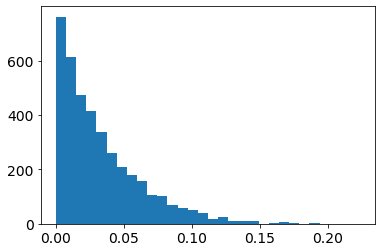

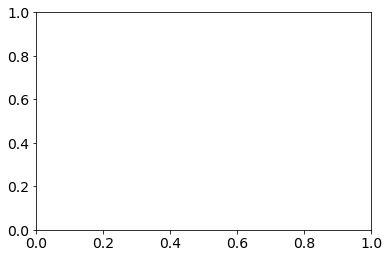

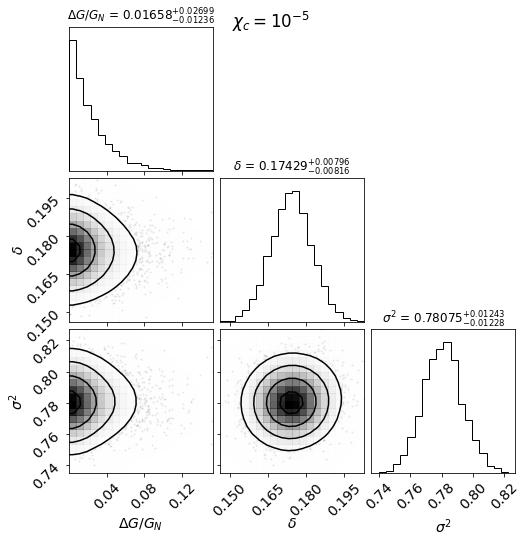

  1%|▌                                         | 12/918 [00:00<00:15, 57.14it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 1.4481196944829534e-06
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 8.685250922259776e-07
10213-1902 [50] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 50.0 0.0 6.586004301111539e-07
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 4.839792140991317e-07
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0 0.0 2.301292224002011e-06
10218-12703 [50] [335

  3%|█                                         | 24/918 [00:00<00:15, 57.39it/s]

10226-12704 [50] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694, 0.4691, 0.2789, 0.37, 0.364, 0.3135, 0.363, 0.2811, 0.3307, 0.2727, 0.312, 0.3727, 0.1385, 0.4167, 0.2188, -0.3444, 0.1093]
10226-12704 50.0 0.0 2.0805083828235726e-06
10226-12705 [50] [1.0258, 2.2633, 2.7169, 2.4758, 1.8555, 1.7519, 1.2885, 0.9589, 1.0089, 1.1064, 1.1936, 2.223, 0.8528, 1.1417, 0.5417]
10226-12705 50.0 0.0 6.543671061282468e-06
10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 1.2876847132566772e-05
10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 1.0996908968109456e-05
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 9.589132728942863e-06
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0

  4%|█▋                                        | 36/918 [00:00<00:15, 57.86it/s]

10496-12704 [50] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268.8121, 253.915, 333.7881, 358.7629, 315.1183, 261.3063, 216.6964, 267.188, 258.5169, 256.0365, 248.4992]
10496-12704 50.0 0.0 1.2279679730323079e-06
10496-12705 [50] [-0.3879, -0.1399, 0.1719, 0.4444, 0.4904, 0.2805, 0.2146, 0.344, 0.3105, 0.2505, 0.2112, 0.1741, 0.0585, 0.0082, -0.033, 0.0654, 0.0338, 0.38, 0.1359]
10496-12705 50.0 0.0 4.964060890136967e-07
10498-12705 [50] [2.2376, 1.8111, 0.8617, 0.4311, 0.299, 0.2455, 0.2899, 0.2855, 0.265, 0.1888, 0.0491, -0.0661, -0.1083, -0.0652, -0.0315, 0.0942]
10498-12705 50.0 0.0 1.0624051077579592e-06
10499-12705 [50] [-0.9996, -0.9996, -0.9992, -0.9994, -0.9994, -0.9993, -0.9993, -0.9994, -0.9994, -0.9992, -0.999, -0.999, -0.9987]
10499-12705 50.0 0.0 1.716736733645714e-06
10499-3702 [50] [-0.3822, -0.1753, 0.3237, 0.6092, 0.8357, 0.9307, 1.1046, 1.1845, 1.1657, 1.064, 1.005, 1.0954, 0.7875, 0.8892, 0.9769, 1.0508, 1.3156, 1.2283]
10499-3702 50.0 0.0 1.2048900555931

  5%|██▏                                       | 48/918 [00:00<00:15, 57.24it/s]

10501-6101 [50] [54.152, 240.5257, 446.403, 593.882, 679.4829, 745.3089, 578.3118, 397.5307, 268.9797, 276.8619, 234.4717, 196.8602, 156.2454, 140.6324, 64.5922]
10501-6101 50.0 0.0 1.549197937059853e-06
10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 50.0 0.0 7.996216053311051e-07
10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 7.775149529336445e-07
10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 8.021003576712672e-06
10505-12704 [50] [0.6223, 0.447, 0.4087, 0.27, 0.0901, 0.1644, 0.1572, 0.3129, 0.3336, 0.3492, 0.2338, 0.2536, 0.1307, 0.2303, 0.2492, 0.6718, 0.9822, 1.3729, 3.1505, 2.3435]
10505-12704 50.0 0.0 8.07395733222118e-06
10506-9101 

  7%|██▋                                       | 60/918 [00:01<00:15, 56.75it/s]

10512-12701 [50] [-0.3741, -0.2352, -0.2444, -0.3467, -0.39, -0.3702, -0.2987, -0.245, -0.2376, -0.1861, -0.2187, -0.1372]
10512-12701 50.0 0.0 8.680034073417253e-07
10512-12705 [50] [-0.9971, -0.9962, -0.9967, -0.9971, -0.9969, -0.9968, -0.9961, -0.9958, -0.9964, -0.9971, -0.9977, -0.9977, -0.9977, -0.9976, -0.998]
10512-12705 50.0 0.0 1.3498870157994822e-06
10512-9102 [50] [4147.3152, 2927.8473, 3245.8656, 2878.0674, 2617.7881, 2204.6977, 1695.8151, 1371.2689, 1298.2413, 1241.1228, 1357.9116, 1330.7104, 1714.839, 1930.3755, 2196.7284, 2401.8011, 2844.302, 3122.8481, 2925.4465]
10512-9102 50.0 0.0 9.419898862926089e-07
10513-12702 [50] [-0.9916, -0.9877, -0.9855, -0.9802, -0.9787, -0.98, -0.9868, -0.9787, -0.862, -0.9802]
10513-12702 50.0 0.0 1.4276945116344643e-06
10514-6103 [50] [0.5999, 0.3982, 0.2747, 0.2749, 0.0781, 0.0617, 0.0681, -0.0189, -0.0377, -0.0578, -0.065, -0.0594, 0.0253, -0.0317, 0.1182, -0.1428, -0.1895, -0.2508, -0.2991, -0.355]
10514-6103 50.0 0.0 4.408258159033818

  8%|███▎                                      | 72/918 [00:01<00:14, 57.02it/s]

10519-6102 [50] [15.342, 9.7033, 5.6052, 3.8579, 2.785, 2.1688, 1.9416, 1.9483, 2.0544, 1.8028, 1.946, 2.1855, 2.046, 2.3544, 2.1616]
10519-6102 50.0 0.0 2.9164252524162988e-06
10520-12704 [50] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.0366, 0.0275, -0.0135, 0.0213, 0.0998, -0.1048, -0.1309]
10520-12704 50.0 0.0 4.986339906946285e-07
10520-6102 [50] [-0.9995, -0.9993, -0.9985, -0.9976, -0.9986, -0.9981, -0.9983, -0.9984, -0.9986, -0.9981, -0.9963]
10520-6102 50.0 0.0 3.3292702501231145e-06
10838-9101 [50] [-0.0928, 0.4421, 0.4896, 0.3922, 0.2667, 0.3141, 0.2582, 0.2949, 0.294, 0.2543, 0.2198, 0.1153, 0.0076, -0.0625, -0.124, -0.1198, -0.272, -0.3696, -0.3534, -0.3974, -0.2337]
10838-9101 50.0 0.0 1.7375298727455159e-06
10839-12705 [50] [0.5531, 0.4188, 0.6271, 0.6342, 0.4074, 0.3206, 0.1512, 0.1105, 0.1154, 0.1763, 0.2141, 0.3291, 0.2868, 0.1635, 0.0391, 0.4134, 0.1807]
10839-12705 50.0 0.0 3.425963328754874e-06
10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712,

  9%|███▉                                      | 85/918 [00:01<00:14, 58.61it/s]

10845-12702 [50] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-12702 50.0 0.0 1.0347835354639152e-06
11004-12705 [50] [-0.8497, -0.6991, -0.5203, -0.3493, -0.2406, -0.2193, -0.1954, -0.1792, -0.1842, -0.1767, -0.1858, -0.1781, -0.195, -0.2173, -0.2294, -0.167, -0.2434, -0.1514, -0.3351, -0.2129]
11004-12705 50.0 0.0 7.598153621686532e-07
11004-3703 [50] [5607.0165, 6199.0745, 5122.0907, 4588.5334, 3798.1606, 3256.1827, 2909.7374, 2623.1995, 2081.3703, 1622.0266, 1252.6703, 1054.2993, 797.551, 805.4299, 667.6425]
11004-3703 50.0 0.0 6.569133079093851e-07
11004-6104 [50] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 50.0 0.0 7.987346591586941e-06
11009-12704 [50] [-0.044, 0.5574, 0.4941, 0.5156, 0.452, 0.4031, 0.3736, 0.4191, 0.4646, 0.4848, 0.558, 0.4716, 0.2432, 0.3821, 0.6252, 0.8487, 0.8601]
11009-12704 50.0 0.0 1.8035550381700345e-05


 11%|████▍                                     | 97/918 [00:01<00:14, 56.99it/s]

11013-12702 [50] [0.7904, 0.6387, 0.0779, 0.1203, 0.0592, -0.004, -0.016, 0.0128, 0.0194, 0.059, 0.0663]
11013-12702 50.0 0.0 3.2648190811845186e-06
11013-1902 [50] [0.7893, 0.6453, 0.5024, 0.4895, 0.4034, 0.2175, 0.0455, -0.0103, 0.0142, -0.2569, -0.0412, -0.2183, -0.1712, -0.0824, -0.3609, -0.2323, -0.3117]
11013-1902 50.0 0.0 4.086567906628895e-06
11013-3701 [50] [0.785, 0.6845, 0.2024, 0.0457, 0.0342, 0.02, -0.06, -0.0296, -0.0379, -0.1677]
11013-3701 50.0 0.0 3.768109545495534e-06
11013-3702 [50] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 50.0 0.0 7.380588462771603e-06
11013-6101 [50] [0.3389, -0.3422, -0.154, -0.2894, -0.4104, -0.4385, -0.4897, -0.4798, -0.43, -0.3971, -0.3753, -0.3775, -0.3376, -0.2419, -0.1243, 0.0068, -0.1557, 0.0318, -0.0178, 0.2532, 0.5345, 0.5099]
11013-6101 50.0 0.0 1.8810604399607463e-06
11017-12703 [50] [0.0185, 0.3093, 0.3468, 0.2632, 0.2308, 0.2072, 0.1992, 0.215, 0.2444, 0.2273, 0.053, -0.0123, 0.1078, -0.0553]
11017-12703

 12%|████▊                                    | 109/918 [00:01<00:14, 56.27it/s]

11018-3703 [50] [-0.5454, 0.4164, 0.6741, 0.5852, 0.6907, 0.7028, 0.6059, 0.5528, 0.656, 0.6306, 0.5445, 0.5549, 0.4676, 0.4329, 0.3355, 0.3242, 0.462, 1.051, 0.5129, 1.3094]
11018-3703 50.0 0.0 3.0170602290018337e-06
11018-6102 [50] [69.1052, 130.9961, 113.1141, 109.1797, 92.5989, 91.6354, 88.5765, 83.9604, 80.137, 76.3564, 74.3146, 74.7218, 70.495, 71.7331, 65.8452, 64.9321, 72.2612]
11018-6102 50.0 0.0 3.2211069879525656e-06
11019-12702 [50] [0.0142, 0.2516, 0.1906, 0.1378, 0.0877, -0.003, 0.0993, 0.0958, 0.1065, 0.1232, 0.2086, 0.1132, 0.0357, -0.0115, -0.014, 0.0302, -0.0875, -0.1071]
11019-12702 50.0 0.0 1.1536775989993404e-06
11019-12703 [50] [-0.4993, -0.4671, -0.3698, -0.2654, -0.2024, -0.2445, -0.2033, -0.2117, -0.2752, -0.2285, -0.2102, -0.0702, -0.1699, 0.0858, -0.1757, -0.2987]
11019-12703 50.0 0.0 1.3369167976421506e-05
11019-12705 [50] [0.9395, 1.6844, 1.8269, 0.8562, 0.7011, 1.016, 1.1247, 1.0992, 1.0844]
11019-12705 50.0 0.0 3.1763257838538783e-06
11019-3701 [50] [2.59

 13%|█████▏                                   | 115/918 [00:02<00:14, 55.54it/s]

11744-9102 [50] [-0.6298, 0.0464, 0.3943, 0.6247, 0.4097, 0.3518, 0.3414, 0.4046, 0.4742, 0.4313, 0.3693, 0.3275, 0.2214, 0.1278, 0.0812, 0.4043, 0.1792, -0.1336]
11744-9102 50.0 0.0 2.251489987646397e-06
11745-1902 [50] [1.185, 0.9719, 0.4625, 0.4231, 0.2188, 0.1795, 0.0428, 0.0263, -0.0784, -0.2371, 0.1632]
11745-1902 50.0 0.0 2.3385362157513575e-06
11745-6104 [50] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.8527, 0.5703, 0.5078, 0.5176, 0.5143, 0.48, 0.4463, 0.4504, 0.4653, 0.4273, 0.4049]
11745-6104 50.0 0.0 1.6526252730780337e-06
11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.0361, -0.076, -0.0711, -0.1542, -0.2041, -0.2119, -0.1066, -0.2705, -0.3138]
11745-9101 50.0 0.0 1.6869160099855602e-06
11746-3703 [50] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 50.0 0.0 2.823605375357117e-06
11746-3

 14%|█████▋                                   | 127/918 [00:02<00:14, 54.36it/s]

11750-12701 [50] [0.4224, 0.3089, 0.0791, 0.0892, 0.2329, 0.2222, 0.1114, 0.03, 0.0196, 0.0027, 0.0313, 0.0827, 0.0275, 0.3095]
11750-12701 50.0 0.0 1.1809110326109301e-06
11750-3701 [50] [1.5964, 1.8766, 1.9419, 1.999, 1.4725, 1.2873, 1.1333, 0.934, 0.9463, 0.8918, 0.7347, 0.8508, 0.6677, 0.4619, 0.3762, 0.1866, 0.0367, 0.0915, 0.0086, 0.4665]
11750-3701 50.0 0.0 5.505913066683842e-07
11750-6103 [50] [6.303, 1.7001, 0.3933, 0.5417, 0.5248, 0.6298, 0.7207, 0.7282, 0.8046, 0.5691, 0.3659, 0.4083, 0.4745, 0.6207, 0.9957, 2.1073, 7.7724]
11750-6103 50.0 0.0 1.476763092975583e-06
11750-9101 [50] [13.4461, 9.2464, 8.3896, 5.4399, 4.9554, 3.0033, 3.1782, 2.4566, 2.5343, 2.0961, 2.3663, 2.3818, 2.4375, 3.0403, 2.3998, 2.3406, 2.9409, 6.8913, 8.6024]
11750-9101 50.0 0.0 4.670951415128728e-07
11751-1901 [50] [-0.9334, -0.8849, -0.9513, -0.9754, -0.9893, -0.9862, -0.989, -0.9902, -0.9893, -0.9909, -0.9903, -0.9906, -0.9888, -0.9874]
11751-1901 50.0 0.0 1.719410442452195e-06
11751-6102 [50] [0.37

 15%|██████▏                                  | 139/918 [00:02<00:14, 53.91it/s]

11755-9102 [50] [0.1799, 0.2485, 0.3504, 0.383, 0.2088, 0.1465, 0.0712, -0.0042, -0.0415, -0.0215, 0.0671, 0.0623, 0.1393, -0.1017, 0.125, -0.214, -0.1458]
11755-9102 50.0 0.0 6.517637618940355e-07
11758-3701 [50] [-0.3091, 0.0326, 0.2349, 0.1141, 0.0113, 0.06, -0.0268, -0.1507, -0.2171, -0.1994, -0.1587, -0.1557, -0.1574, -0.1614, -0.0618]
11758-3701 50.0 0.0 9.022931285646021e-07
11758-3702 [50] [-0.544, -0.1141, 0.0167, 0.1028, 0.0854, -0.0041, -0.0149, 0.0406]
11758-3702 50.0 0.0 2.9466960436590325e-06
11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 50.0 0.0 1.2588930328057198e-06
11759-6102 [50] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, -0.981]
11759-6102 50.0 0.0 5.254359819110461e-07
11760-12703 [50] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0.

 16%|██████▋                                  | 151/918 [00:02<00:14, 52.49it/s]

11761-12704 [50] [-0.1205, 0.9952, 0.5814, 0.2296, 0.1208, 0.126, 0.1222, 0.1041, 0.1683, 0.1996, 0.1448, 0.1188, 0.0574, 0.0394, -0.008, -0.026, -0.0331]
11761-12704 50.0 0.0 2.6662185766054605e-06
11761-12705 [50] [6.8127, 3.6941, 2.4845, 1.3644, 0.5363, 0.2844, 0.104, -0.1]
11761-12705 50.0 0.0 2.1338493257657317e-06
11823-9101 [50] [15949.1976, 8800.0053, 8323.3916, 4811.1692, 2214.9858, 717.2733, 413.2719, 305.7873, 173.5393, 146.0478, 195.6604, 224.7593, 189.4201, 67.1778]
11823-9101 50.0 0.0 9.941029212316782e-07
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 1.3179619736319951e-05
11828-12703 [50] [-0.5587, -0.2913, 0.1844, 0.3112, 0.2627, 0.2124, -0.0354, -0.0957, -0.1295, -0.1601, -0.0565, -0.1246, 0.0413]
11828-12703 50.0 0.0 1.5485416116581102e-06
11830-12701 [50] [-0.9938, -0.9825, -0.9834, -0.9912, -0.9934, -0.9941, -0.9946, -0.9933, -0.9936, -0.9951, -0.9951, -0.99

 18%|███████▎                                 | 163/918 [00:02<00:14, 52.08it/s]

11831-6101 [50] [-0.9875, -0.994, -0.9968, -0.9973, -0.9967, -0.9975, -0.9969, -0.9978, -0.9979, -0.9971, -0.9984, -0.9986, -0.9985, -0.9974]
11831-6101 50.0 0.0 4.1312018017865095e-07
11831-6102 [50] [1.041, 0.6096, 0.4053, 0.165, 0.0902, 0.1922, 0.1873, 0.1187, 0.1055, 0.0085, -0.1108, -0.0737]
11831-6102 50.0 0.0 1.774994002652732e-06
11833-9102 [50] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.2658, -0.2176, -0.1929, -0.2471, -0.3166]
11833-9102 50.0 0.0 1.332050408319424e-06
11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 1.574508392969671e-05
11836-1902 [50] [0.7026, 1.2767, 1.1865, 1.1009, 0.973, 0.9921, 0.7024, 0.7206, 0.623, 0.6145, 0.5505, 0.5955, 0.6037, 0.4142, 0.4147]
11836-1902 50.0 0.0 7.1836

 19%|███████▊                                 | 175/918 [00:03<00:14, 52.10it/s]

11865-12704 [50] [0.4447, -0.0557, -0.3894, -0.457, -0.5111, -0.5109, -0.5238, -0.5353, -0.4955, -0.5012, -0.4831, -0.4726, -0.599, -0.615]
11865-12704 50.0 0.0 1.1640198596772275e-06
11865-1901 [50] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 50.0 0.0 9.899661614387813e-07
11865-1902 [50] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0.4429]
11865-1902 50.0 0.0 6.987338772548878e-07
11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 9.859882511479038e-07
11865-9102 [50] [-0.467, -0.4695, -0.4789, -0.5286, -0.6182, -0.6445, -0.6408, -0.6047, -0.6031, -0.6243, -0.655, -0.6895, -0.6998, -0.5904, -0.6729, -0.6983]
11865-9102 50.0 0.0 6.001753024565652e-07
11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2771, 0.298, 0.3814, 0.3262, 0.2102, 0.3978, 0.4467, 0.2866, 0.1214, 0.2202, 0.1346, 0.4041]
11867-6104 50.0 0.0 2.595035001904083e-06
11867-

 20%|████████                                 | 181/918 [00:03<00:13, 52.94it/s]

11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 6.00307901836652e-05
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 4.849743615720486e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 5.15450303885095e-05
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389.9946, 2439.1642, 2636.587, 2485.7262, 2056.7992, 1736.2622, 1623.5415, 1192.5228, 781.8483, 546.9719, 175.874]
11942-12704 50.0 0.0 2.2644651953572036e-05
11942-6104 [50] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 50.0 0.0 3.648774885530769e-07
11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.

 21%|████████▌                                | 193/918 [00:03<00:14, 51.22it/s]

11949-12701 [50] [1.1975, 0.3408, 0.1441, 0.1243, 0.0225, 0.0003, 0.0028, 0.027, 0.0197, 0.0192, -0.0295, -0.0839]
11949-12701 50.0 0.0 3.220914155028539e-06
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 9.788316419142903e-06
11954-12704 [50] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453, 0.1801, 0.125, 0.0276, -0.0116, -0.0744, -0.134, -0.1626, -0.2559, -0.2802]
11954-12704 50.0 0.0 6.671252061283867e-06
11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.2778]
11954-3703 50.0 0.0 7.554588618131143e-06
11954-9101 [50] [-0.9882, -0.9937, -0.9946, -0.9965, -0.9974, -0.9972, -0.997, -0.9969, -0.997, -0.9974, -0.9978, -0.9979, -0.9973, -0.9971, -0.9976, -0.9966]
11954-9101 50.0 0.0 6.342226384174937e-06
11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0

 22%|█████████▏                               | 205/918 [00:03<00:13, 51.43it/s]

11957-9102 [50] [1.0969, 0.3397, 0.6198, 1.0919, 1.791, 2.069, 2.6145, 2.7123, 2.8073, 2.4726, 2.1945, 1.9756, 2.1362, 4.7679, 3.0873, 1.2673, 3.459, 16.3037, 15.1044]
11957-9102 50.0 0.0 1.3196848469048139e-06
11958-6103 [50] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 50.0 0.0 5.470543679460313e-07
11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 2.606916614881883e-06
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 50.0 0.0 6.420617822972536e-06
11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.9843, 0.6333, 0.3517, 0.1829, 0.1258, 0.0956, 0.1424, 0.1021, 0.028, 0.1221]
11965-9102 50.0 0.0 2.761044205909776e-06
11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125

 24%|█████████▋                               | 217/918 [00:03<00:13, 50.23it/s]

11975-12705 [50] [0.6902, 0.7621, 0.3208, 0.2527, 0.3317, 0.3259, 0.2387, 0.0864, 0.069, 0.2015, 0.1928, 0.1502, -0.0055, -0.1924]
11975-12705 50.0 0.0 2.365925145223456e-06
11975-3703 [50] [-0.2597, -0.0329, 0.0768, 0.0833, 0.1048, 0.0682, 0.0342, -0.0156, -0.0756, -0.093, -0.0695, -0.0466, 0.0656, -0.0085, 0.1237, 0.1334, 0.0646]
11975-3703 50.0 0.0 2.810723987013319e-06
11975-6104 [50] [1.0196, 1.2709, 1.5062, 1.1104, 0.9965, 0.7778, 0.776, 0.6311, 0.7603, 0.6278, 0.6208, 0.5151, 0.5172, 0.5343, 0.2326, 0.5012, 0.187, 0.4522, 0.1401, 0.1327]
11975-6104 50.0 0.0 2.185705625284202e-06
11976-12703 [50] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 50.0 0.0 2.182792234157538e-06
11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 50.0 0.0 9.213058101100463e-07
11978-12705 [50] [0.0184, 0.096

 25%|██████████▏                              | 229/918 [00:04<00:13, 49.80it/s]

11979-9102 [50] [0.6334, -0.323, -0.1351, -0.0857, 0.0053, 0.0302, 0.0467, 0.0752, 0.0566, 0.0459, 0.0116, 0.0269, 0.0046, -0.0156, -0.091, -0.1558, -0.3105, -0.4242, -0.5324]
11979-9102 50.0 0.0 1.5065875353311682e-06
11981-12702 [50] [293.567, 690.112, 683.5389, 617.2849, 490.646, 374.3616, 455.8674, 450.3051, 457.9927, 478.543, 404.234]
11981-12702 50.0 0.0 3.71124760210715e-07
11981-12704 [50] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]
11981-12704 50.0 0.0 1.1722259195271152e-06
11981-9102 [50] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188, -0.1444, -0.128, -0.1812, -0.1904, -0.2284, -0.2044, -0.2061, -0.1486, -0.2345, -0.2114, 0.0329, 0.7603]
11981-9102 50.0 0.0 2.050910506904487e-06
11982-12704 [50] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.1555, 0.0797, -0.029, 0.0037, 0.2331]
11982-1270

 26%|██████████▋                              | 239/918 [00:04<00:14, 47.74it/s]

12066-3701 [50] [19.2418, 16.9197, 10.1428, 6.0915, 4.4316, 3.0783, 2.9929, 2.3906, 2.7183, 2.8356, 3.2869, 3.669, 3.475, 3.6088, 2.499, 1.7084, 1.9485, 1.5899]
12066-3701 50.0 0.0 3.4131927148543693e-06
12067-12703 [50] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
12067-12703 50.0 0.0 1.1332158232371287e-06
12067-12705 [50] [0.4291, 1.3434, 2.0219, 1.7622, 1.0305, 0.7583, 0.4763, 0.1261, 0.0511, 0.0662, 0.1502, 0.2361, 0.2324, 0.212, 0.3434]
12067-12705 50.0 0.0 8.636740679838936e-07
12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 3.4600935428098554e-05
12068-6104 [50] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 50.0 0.0 2.053420105584031e-06
12069-12704 [50]

 27%|██████████▉                              | 244/918 [00:04<00:14, 46.86it/s]

12071-3702 [50] [43.1041, 1833.3653, 2193.0557, 2409.7616, 2285.0769, 1925.6484, 1966.7994, 2043.2628, 1997.8474, 1832.4832, 1658.3071, 1528.5931, 1298.5116, 1014.8264, 552.6982, 136.4828]
12071-3702 50.0 0.0 1.3344476155575003e-06
12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.3083, 398.9949, 258.1108, 178.8144, 146.4641, 210.3609, 51.4796, 32.8354, 22.052]
12071-3704 50.0 0.0 1.32234872251391e-06
12075-12704 [50] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 50.0 0.0 4.690615129123326e-06
12078-12703 [50] [0.3298, 0.5608, 0.2182, 0.3221, 0.2303, 0.0896, 0.0846, 0.2051, 0.3186, 0.33, 0.2532]
12078-12703 50.0 0.0 1.5483174911926465e-06
12078-6103 [50] [1.9637, 5.3953, 4.122, 4.276, 4.2033, 3.4926, 3.3028, 3.2038, 3.1762, 3.0769, 2.868, 2.5911, 2.6527, 2.4952, 2.6226, 2.6979, 2.1328, 1.6158, 1.3218, 1.8508]
12078-6103 50.0 0.0 9.325420842651664e-07
12079-12705 [50] [5.945

 28%|███████████▍                             | 255/918 [00:04<00:14, 46.17it/s]

12084-12704 [50] [-0.663, -0.3425, -0.4511, -0.3814, -0.1944, -0.0031, -0.041, -0.1276, -0.2047, -0.2499, -0.2565, -0.1988, -0.1657, -0.268, -0.3391, -0.2896]
12084-12704 50.0 0.0 4.4553658325822296e-06
12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-12705 50.0 0.0 1.0066252500938152e-06
12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.419, 0.387, 0.4139, 0.5272, 0.4564, 0.6029, 0.4957, 0.5971, 0.6267, 0.5749, 0.7061, 0.6081, 0.5243, 0.4383, 0.5097, 0.4647, 0.2768, 0.3996, 0.231, 0.2274, 0.4698, 0.2204, 0.2727]
12084-1901 50.0 0.0 1.249618424896945e-06
12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
12084-3702 50.0 0.0 9.345013002810027e-07
12084-3703 [50] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.8

 29%|███████████▊                             | 265/918 [00:05<00:14, 44.73it/s]

12085-9102 [50] [0.6086, 0.5632, 0.3343, 0.2119, 0.1282, 0.0402, 0.0288, 0.0478, 0.0313, 0.001, -0.0532, -0.0537, -0.0634, -0.0662, -0.1794, -0.1779, -0.239]
12085-9102 50.0 0.0 1.0307826263794166e-06
12088-12705 [50] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-12705 50.0 0.0 1.346279956385086e-06
12088-9101 [50] [1.3886, 1.0744, 0.6164, 0.1772, -0.0928, -0.1728, -0.2424, -0.3552, -0.3861, -0.4243, -0.4358, -0.4341, -0.4454, -0.4408]
12088-9101 50.0 0.0 3.2355762580638693e-06
12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-12702 50.0 0.0 5.837395648088966e-07
12089-12704 [50] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 50.0 0.0 7.895401866937419e-06
12089-1901 [50] [-0.3811, -

 30%|████████████▎                            | 275/918 [00:05<00:14, 43.58it/s]

12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 40.9064, 40.0677, 39.5836, 40.4106, 39.3101, 37.4365, 38.9587, 41.7447, 41.525, 40.104, 39.0721, 39.6893, 56.2685, 25.7726, 27.1981, 33.78]
12094-3701 50.0 0.0 2.048891826730768e-06
12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 1.6525788869962549e-06
12483-12703 [50] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -0.0898]
12483-12703 50.0 0.0 1.9516884859679638e-06
12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 2.0838319380431215e-06
12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 1.6892074572004373e-06
12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0

 31%|████████████▋                            | 285/918 [00:05<00:14, 43.82it/s]

12490-3701 [50] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-3701 50.0 0.0 3.0497234559324205e-06
12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0.0863]
12506-12701 50.0 0.0 5.969094987929964e-06
12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0.0 1.9287462735952434e-06
12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0 0.0 7.550131052076311e-07
12512-12702 [50] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 50.0 0.0 8.

 32%|████████████▉                            | 290/918 [00:05<00:14, 42.87it/s]

12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 0.0 5.070368922967479e-07
12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.1091]
12518-9101 50.0 0.0 1.7813402867145636e-06
12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 4.710886490769563e-06
12620-6104 [50] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 50.0 0.0 1.1523017992232078e-06
12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 2.9188527749023236e-06
12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0

 33%|█████████████▍                           | 300/918 [00:05<00:14, 42.89it/s]

12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 9.384649129789414e-06
12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 2.02323081058301e-06
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 5.611009448216655e-06
12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 2.063740086148214e-05
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 1.1603430624382062e-05
12679-12701 [0.7512] [-0.41

 34%|█████████████▊                           | 310/918 [00:06<00:14, 40.81it/s]

7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1547, -0.1713, -0.2761, -0.2934, -0.2123]
7443-12704 50.0 0.0 4.296375882230318e-06
7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 6.116634218734359e-07
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.0333, -0.0403, -0.0345, -0.091, -0.0525, -0.2174, -0.2135, -0.5859, -0.4094]
7443-9101 50.0 0.0 8.39214598517218e-07
7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.1269]
7495-12702 50.0 0.0 4.3691339537989385e-06
7495-12703 [50] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 50.0 0.0 2.8862558089635965e-06
7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0

 35%|██████████████▎                          | 320/918 [00:06<00:15, 39.67it/s]

7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 3.04992970632331e-06
7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 5.90651199133184e-07
7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 2.1119792646873554e-06
7958-6101 [50] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 50.0 0.0 7.987976342919041e-07
7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 3.621693719644851e-06
7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2

 36%|██████████████▋                          | 328/918 [00:06<00:15, 38.56it/s]

7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 5.4280210100584005e-06
7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 3.935767181241585e-06
7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 3.8384788324207866e-07
7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 3.3699939406689375e-06
7961-12705 [50] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 50.0 0.0 1.7113246657899995e-06
7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165

 37%|███████████████                          | 336/918 [00:06<00:15, 38.24it/s]

7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 50.0 0.0 1.4618147173930183e-06
7963-12702 [50] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, -0.9982, -0.9988, -0.9993]
7963-12702 50.0 0.0 2.0470695111581143e-06
7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 50.0 0.0 1.3047200909724544e-06
7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]
7963-9102 50.0 0.0 8.704311005570005e-07
7964-6101 [50] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119,

 37%|███████████████▏                         | 340/918 [00:06<00:15, 37.61it/s]

7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 50.0 0.0 4.4080489644695854e-07
7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211.5514, 236.7821, 394.8881, 237.9732]
7965-6102 50.0 0.0 1.4087750776082563e-06
7965-9102 [50] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 50.0 0.0 6.503819802326403e-07
7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 2.0957218433806594e-06
7968-3701 [50] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 50.0 0.0 5.133746620859521e-06
7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1

 38%|███████████████▌                         | 349/918 [00:07<00:15, 37.86it/s]

7977-1902 [43.824396984924626] [0.1072, 0.2856, 0.0387, 0.0618, 0.0363, 0.0042, -0.0291, -0.0297]
7977-1902 43.824396984924626 4.5033233998504296e-09 3.329773709681355e-07
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 2.313479310779694e-06
7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 5.6230154915067465e-06
7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 4.6255585223459455e-06
7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 4.8674550546447405e-06
7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.

 39%|███████████████▉                         | 358/918 [00:07<00:14, 37.81it/s]

7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 2.2032823731837472e-05
7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 50.0 0.0 1.7326416502005787e-06
7992-6104 [50] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 50.0 0.0 9.506107911198912e-07
7993-3704 [0.3457] [0.1426, 0.6478]
7993-3704 0.3457 1.2205542431325872e-07 2.112114995712823e-07
8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 50.0 0.0 1.1690451648398278e-06
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 3.7198052239906948e-06
8077-6103 

 40%|████████████████▎                        | 366/918 [00:07<00:15, 34.95it/s]

8078-12703 [50] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 5.70962308919899e-06
8078-6103 [50] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149, 0.1969, 0.1396, 0.1246, 0.1262, 0.1162, 0.0747, 0.0502, 0.0254, 0.0225, 0.0724, 0.0304, 0.0506, 0.0715]
8078-6103 50.0 0.0 9.228612058248024e-06
8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 6.939737607068192e-06
8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 2.4916176003899535e-06
8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 3.1679828364793537e-06
8081-3704 [50] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0

 41%|████████████████▋                        | 374/918 [00:07<00:15, 34.30it/s]

8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81, 2355.4256, 1939.6384]
8083-12703 50.0 0.0 3.1700369179525827e-06
8083-12704 [50] [0.2913, 0.5243, 0.3002, 0.1297, 0.1194, 0.1533, 0.1494, 0.1802, 0.1606, 0.0654, 0.1299]
8083-12704 50.0 0.0 2.580701950154333e-06
8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 3.5755283840248434e-06
8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 2.841330413309242e-06
8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 1.5096390456705873e-06
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478,

 42%|█████████████████                        | 382/918 [00:08<00:15, 34.23it/s]

8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 2.0131039454022624e-06
8091-1902 [50] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747, -0.384]
8091-1902 50.0 0.0 4.881027674154504e-07
8092-12702 [50] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 50.0 0.0 6.735903860760041e-07
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 50.0 0.0 1.9070687953023032e-06
8095-6102 [50] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276, 0.127, 0.1403, 0.0994, 0.0731, 0.0391, -0.0442, -0.086, -0.1131, -0.1728, -0.221, -0.1357, -0.3768, -0.

 43%|█████████████████▍                       | 391/918 [00:08<00:14, 35.47it/s]

8132-12702 [50] [-0.0491, -0.065, 0.2143, 0.0833, 0.0546, -0.0096, -0.0149, 0.021, -0.0837, 0.1062]
8132-12702 50.0 0.0 1.3364905121093014e-05
8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.271862694671603e-05
8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 3.163387105257641e-06
8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 3.6318204523254506e-06
8135-12702 [4.988280402010051] [-0.0587, -0.0535, 0.1564, 0.1223, 0.0981, 0.0594, 0.0486, 0.0064, 0.0544, 0.0081, -0.0341, -0.0178, 0.0479, -0.1192, 0.2429, -0.0574, -0.0315, -0.2763]
8135-12702 4.988280402010051 7.898576732924331e-08 2.5754526515724124e-07
8137-12703 [50] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -

 43%|█████████████████▋                       | 395/918 [00:08<00:15, 34.26it/s]

8138-12702 [50] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 50.0 0.0 1.2691844426900057e-06
8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 3.931955825481238e-06
8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 1.2486823412254234e-06
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 3.762710193921245e-06
8140-3701 [50] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 50.0 0.0 3.425044591088415e-07
8141-12702 [50] [1.3913, 1.26

 44%|█████████████████▉                       | 403/918 [00:08<00:15, 33.59it/s]

8144-12702 [50] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 50.0 0.0 5.568613167677596e-07
8144-12703 [50] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 50.0 0.0 1.96397199169826e-06
8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 2.8095395496464845e-06
8144-6101 [4.636011055276382] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271, 0.0969, 0.0527, 0.3307, 0.4308, 0.3921, 0.1682, -0.0968]
8144-6101 4.636011055276382 5.675822403140108e-08 2.8055517892611665e-07
8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50

 45%|██████████████████▎                      | 411/918 [00:08<00:15, 32.12it/s]

8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 5.366887354700194e-06
8146-9102 [36.619292462311556] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 36.619292462311556 3.4032224144807365e-08 3.0317794158069655e-07
8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 3.18117609294928e-06
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 4.052601025586697e-05
8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 

 46%|██████████████████▋                      | 418/918 [00:09<00:21, 23.47it/s]

8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 1.0313502542892003e-06
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 3.750312953992556e-05
8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 1.4978642311871261e-06
8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 1.0425200351564003e-06
8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245

 46%|██████████████████▉                      | 424/918 [00:09<00:19, 25.47it/s]

8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 1.1137347745277214e-06
8156-3701 [50] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 50.0 0.0 8.447084331792239e-07
8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 7.029790297977974e-06
8158-6104 [50.0] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 50.0 0.0 3.371341681618906e-07
8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 2.1282

 47%|███████████████████▏                     | 430/918 [00:09<00:18, 26.84it/s]

8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 9.44493361998525e-06
8241-6102 [50] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 50.0 0.0 4.099492346990666e-07
8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 4.2335925669133264e-05
8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 8.437207499299196e-07
8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 3.6391254743806523e-06
8245-1270

 47%|███████████████████▍                     | 434/918 [00:09<00:16, 29.17it/s]

8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 4.0127334294092336e-06
8247-12702 [1.1543] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063, 0.3394]
8247-12702 1.1543 9.884937747226516e-08 2.381338152209052e-07
8247-12703 [1.1584] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198, 0.0377, 0.0036, 0.0008, -0.06, -0.0599]
8247-12703 1.1584 1.7139505949514524e-07 1.6569844393392262e-07
8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 3.730298795301825e-06
8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247-9101 50.0 0.0 1.6298389035002185e

 48%|███████████████████▊                     | 444/918 [00:10<00:16, 28.19it/s]

8248-12704 [50] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 50.0 0.0 1.9133702188965657e-06
8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 2.965721051964839e-06
8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 2.5896554758944138e-06
8249-6102 [50] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 50.0 0.0 6.069328581847476e-07
8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]

 49%|███████████████████▉                     | 447/918 [00:10<00:16, 27.95it/s]

8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 3.2749779478171913e-06
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 3.346976938719246e-06
8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 3.0336902794509433e-06
8252-6104 [50] [2.1127, 786.7076, 1821.9152, 1629.0467, 2046.2674, 2117.149, 2080.0223, 1991.9705, 2037.8148, 2171.4456, 2102.3974, 2113.0128, 1947.7279, 1894.0627, 1734.3312, 1614.2348, 1502.8364, 1540.9181, 989.7452, 1027.4923, 1030.8241, 375.7743, 656.7525]
8252-6104 50.0 0.0 3.8021655277029005e-07
8252-9102 [50] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.375

 49%|████████████████████▏                    | 453/918 [00:10<00:17, 27.16it/s]

8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 1.179030771810014e-05
8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 1.0583622478005315e-06
8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 1.0369322694945116e-06
8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 1.1945985410160994e-06
8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 1.1086343227525922e-06
8257-12701 [50] [452.94

 50%|████████████████████▌                    | 459/918 [00:10<00:17, 26.88it/s]

8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 7.898225881979911e-07
8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 4.12400715407882e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 3.0765413035119644e-05
8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 3.7624281059450753e-06
8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.

 51%|████████████████████▊                    | 465/918 [00:11<00:17, 26.42it/s]

8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 1.2438632879275997e-06
8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 2.147417015456224e-06
8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 3.997006918593461e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 4.334943186373867e-06
8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.

 51%|█████████████████████                    | 471/918 [00:11<00:17, 26.01it/s]

8310-3701 [50] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 50.0 0.0 8.219987933129271e-07
8310-9101 [50] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 50.0 0.0 1.038420611962159e-06
8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 2.9280974069857254e-06
8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 2.4527829013453097e-06
8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -

 52%|█████████████████████▎                   | 477/918 [00:11<00:17, 25.50it/s]

8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 3.0944523529487994e-06
8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 7.106397069356246e-06
8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 1.911543651935676e-06
8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 2.0335669265267808e-06
8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0

 53%|█████████████████████▌                   | 483/918 [00:11<00:17, 25.43it/s]

3.9048861841337765e-06
8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 5.264409328253631e-06
8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 2.509607537056556e-06
8315-9102 [2.441824120603015] [-0.2166, -0.0917, -0.1207, -0.1704, -0.1891, -0.1464, -0.1933, -0.1616, -0.278, -0.2739, -0.2356, -0.2454, -0.332, -0.1867, 1.4585, 0.3111, 0.4387, 0.2663]
8315-9102 2.441824120603015 1.3493129173104711e-07 1.9838598585887612e-07
8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 1.1222700162417084e-06
8317-9101 [31.24731055276382] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7

 53%|█████████████████████▊                   | 489/918 [00:12<00:17, 25.18it/s]

8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 1.4327795690720107e-06
8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 7.742758078514592e-06
8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 7.575884065590036e-07
8318-6101 [50] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 50.0 0.0 7.944993202973657e-06
8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 4.071610259368307e-06
8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0

 54%|██████████████████████                   | 495/918 [00:12<00:17, 24.60it/s]

8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 5.830777241636283e-07
8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 3.0787233816886927e-06
8320-9102 [50] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 50.0 0.0 2.4394666205673386e-06
8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 8.561470409667751e-06
8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 1.512342998260359e-06


 55%|██████████████████████▍                  | 501/918 [00:12<00:17, 24.15it/s]

8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 5.708063291971514e-06
8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 5.269723031919171e-07
8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 9.284455093607486e-06
8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 6.234966293414189e-07
8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 

 55%|██████████████████████▋                  | 507/918 [00:12<00:17, 23.85it/s]

8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 9.722713084733693e-07
8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 1.735038315818587e-06
8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 7.634742956779887e-07
8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 5.218097624719564e-07
8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 1.0434880021858468e-06


 56%|██████████████████████▊                  | 510/918 [00:12<00:17, 23.74it/s]

8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 6.680766915987036e-07
8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 7.087203285372006e-06
8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 5.861572891256328e-07
8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 5.457974219903014e-07
8334-3704 [22.390175879396985] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409, 0.6746, 0.3496, 0.5455, 0.2807, 0.4323, -0.0995, 0.0558, 0.4872, 0.3896, 3.1841, -0.3157]
8334-3704 22.390175879396985 2.8876807866474417e-08 3.086189575696353e-07
8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0

 56%|███████████████████████                  | 516/918 [00:13<00:17, 23.59it/s]

8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 5.507413692720119e-06
8336-9102 [50] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 50.0 0.0 5.747567627465455e-07
8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 6.026528156967537e-06
8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 1.0922579892199292e-06
8341-9101 [50] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.

 57%|███████████████████████▎                 | 522/918 [00:13<00:17, 23.13it/s]

8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 1.9552732556179887e-06
8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 1.9402279654840664e-06
8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 5.599549394779071e-06
8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 2.043502390086344e-06
8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 2.2322511737752634e-06


 57%|███████████████████████▍                 | 525/918 [00:13<00:17, 22.87it/s]

8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 2.4173238670377006e-06
8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 2.6547166276097935e-06
8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 5.83700627240311e-07
8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 9.692670963060324e-07
8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 1.0841541835254622e-05


 58%|███████████████████████▋                 | 531/918 [00:13<00:17, 22.57it/s]

8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 7.444853052319469e-07
8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 8.411856396619316e-06
8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 7.65800260950779e-06
8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 1.406720608718385e-06
8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 8.926489942499972e-06


 59%|████████████████████████                 | 538/918 [00:14<00:15, 24.59it/s]

8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 4.089083320773107e-06
8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 2.0764590462836824e-05
8445-3701
8446-12702 [33.952052261306534] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 33.952052261306534 8.469865097170656e-09 3.290028575307759e-07
8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 2.847717538625727e-06
8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 3.8851174286938

 59%|████████████████████████▎                | 544/918 [00:14<00:15, 23.72it/s]

8447-12701 [50] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 50.0 0.0 3.8879556296307666e-07
8447-3701 [50] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977, 0.163, 0.0592, 0.009, 0.1309, 0.116]
8447-3701 50.0 0.0 3.6080756104966213e-07
8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 1.5949233270438155e-06
8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 9.961199543374465e-07
8451-12705 [0.9497] [-0.3525, -0.0131, -0.4307, -0.1607, -0.1962, -0.2127, 0.0242]
8451-12705 0.9497 4.4724821873221086e-08 2.834143396117277e-07


 60%|████████████████████████▍                | 547/918 [00:14<00:16, 22.97it/s]

8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 3.5515964236895334e-06
8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 2.4874627736907023e-06
8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 8.931926281072731e-06
8452-9102 [50] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 50.0 0.0 4.6296091745208303e-07
8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 4.6873602200319225e-06


 60%|████████████████████████▋                | 553/918 [00:14<00:16, 21.94it/s]

8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 3.2537392031149228e-06
8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 6.918574152190192e-07
8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 1.256945391509528e-06
8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 9.898364218639341e-07
8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 3.27426420255294

 61%|████████████████████████▊                | 556/918 [00:14<00:16, 21.59it/s]

8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 3.2917508016368783e-06
8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 5.945650818732546e-07
8459-6101 [50] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 50.0 0.0 4.776166080458472e-07
8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 5.165037274049545e-07
8464-12704 [50] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1

 61%|█████████████████████████                | 562/918 [00:15<00:16, 21.05it/s]

8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 8.579331124316557e-07
8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 4.781375589522797e-06
8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 4.541715229504823e-06
8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 3.442343222938964e-06
8466-12702 [0.7532] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658, 0.1059, 0.0792]
8466-12702 0.7532 7.006836479555927e-08 2.5616552996833545e-07


 62%|█████████████████████████▎               | 568/918 [00:15<00:16, 21.17it/s]

8482-12703 [50] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 50.0 0.0 1.4539463783307861e-06
8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 3.193146027859779e-06
8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 1.2058465356258221e-06
8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 4.036478001929527e-06
8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 5.148688886016473e-06


 62%|█████████████████████████▌               | 571/918 [00:15<00:16, 20.92it/s]

8485-9102 [12.7488824120603] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 12.7488824120603 4.402178017949004e-08 2.9291691398774574e-07
8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 5.570967694047566e-07
8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 5.465334781485279e-07
8547-6102 [50] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 50.0 0.0 3.756232880499659e-07
8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825,

 63%|█████████████████████████▊               | 577/918 [00:15<00:16, 20.38it/s]

8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 1.0502446792675793e-06
8549-6102 [50] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 50.0 0.0 5.72825575367632e-07
8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 1.663918230275679e-05
8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 6.793663002059131e-07
8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 3.474197392499964e-06


 64%|██████████████████████████               | 583/918 [00:16<00:16, 19.77it/s]

8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 8.180847744699808e-07
8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 1.1213596634769624e-06
8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 1.0580555753047334e-06
8555-12702 [50] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 50.0 0.0 8.679801633336086e-07


 64%|██████████████████████████▏              | 587/918 [00:16<00:16, 19.57it/s]

8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 1.9314907383071525e-06
8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 1.8290234347413087e-06
8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 1.0684704360675739e-06
8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 3.264489830247658e-06
8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 5.818229660896597e-06


 64%|██████████████████████████▍              | 591/918 [00:16<00:16, 19.25it/s]

8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 1.2129072164818169e-06
8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 5.741160259633304e-06
8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 2.0003621572853453e-06
8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 2.150361025411592e-06


 65%|██████████████████████████▌              | 595/918 [00:16<00:16, 19.18it/s]

8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 7.135473375480386e-07
8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 5.48285322432455e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 7.920750255084271e-07
8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 1.6241514343444198e-06


 65%|██████████████████████████▊              | 599/918 [00:17<00:16, 18.92it/s]

8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 8.067454412955828e-07
8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 1.6048782080722278e-06
8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 1.0772807512932468e-06
8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 1.0099669215571087e-05
8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 4.943231503509459e-06


 66%|███████████████████████████              | 605/918 [00:17<00:16, 18.75it/s]

8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 1.1562440210192248e-05
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 1.192345206280554e-05
8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 1.0089542638378321e-05
8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 1.7764054217103406e-06


 66%|███████████████████████████▏             | 609/918 [00:17<00:16, 18.53it/s]

8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 2.7737751944890375e-06
8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 1.7594340802367084e-06
8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 1.8128398945700228e-06
8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 7.320372485433366e-07


 67%|███████████████████████████▎             | 611/918 [00:17<00:16, 18.31it/s]

8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 2.0660904961979845e-06
8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 1.003976529056867e-06
8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 2.263488175106105e-06
8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 8.300169666055576e-07


 67%|███████████████████████████▌             | 617/918 [00:18<00:16, 18.12it/s]

8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 4.4017910191309315e-06
8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 2.0544423548751204e-06
8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 1.5521881730808115e-06
8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 4.000238911132798e-06


 68%|███████████████████████████▋             | 621/918 [00:18<00:16, 18.42it/s]

8597-6103 [5.8377281407035175] [-0.1805, -0.1664, 0.0676, 0.1146, 0.0136, -0.0918, -0.1, -0.0753, -0.115, -0.0211, 0.0236, 0.0629, 0.164, 0.143, 0.1648]
8597-6103 5.8377281407035175 7.31201701708927e-08 2.63744668928944e-07
8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 1.192591171413498e-06
8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 2.523722211518558e-06
8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 4.257186046277004e-06


 68%|███████████████████████████▉             | 625/918 [00:18<00:16, 17.96it/s]

8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 3.6347092816276836e-05
8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 4.877326844945327e-06
8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 1.9197206211741855e-05
8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 6.147045956468544e-06
8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 6.020272922911912e-06


 69%|████████████████████████████             | 629/918 [00:18<00:16, 17.74it/s]

8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 3.557956466867126e-06
8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 5.208927106774928e-06
8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 2.384763027868863e-06
8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 7.107361574971809e-05


 69%|████████████████████████████▎            | 633/918 [00:19<00:15, 17.97it/s]

8606-6101 [0.2714] [828.4766, 179.1159]
8606-6101 0.2714 1.7976750761116705e-07 1.4371207829886737e-07
8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 2.409919134785989e-06
8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 3.3797916603743323e-06
8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 6.834556530033277e-07


 69%|████████████████████████████▍            | 638/918 [00:19<00:13, 20.14it/s]

8610-6101 [50] [0.9237, 0.7275, 0.6377, 0.5194, 0.2119, 0.0444, -0.0576, -0.0451, -0.0514, -0.0402, -0.0351, -0.0178, 0.0253, 0.0734, 0.032, 0.057, 0.0046, 0.0719, -0.2942]
8610-6101 50.0 0.0 3.603503348855883e-07
8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 1.0185255080855972e-06
8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 4.2216607427806456e-05
8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 5.174292434349079e-05


 70%|████████████████████████████▋            | 641/918 [00:19<00:14, 18.92it/s]

8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 5.574108654019078e-05
8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 1.0202083882025164e-05
8613-12702 [50] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 50.0 0.0 4.059226639193143e-07
8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 1.6991055168240443e-06


 70%|████████████████████████████▊            | 645/918 [00:19<00:15, 17.89it/s]

8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 9.002099523299009e-07
8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 6.284636016833721e-07
8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 8.807168390360622e-07
8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 8.157877695463178e-06


 71%|████████████████████████████▉            | 649/918 [00:19<00:15, 17.34it/s]

8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 4.33815185278441e-06
8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 4.7098596966526714e-07
8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 3.5649244462375926e-06
8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 6.580139487524669e-07


 71%|█████████████████████████████▏           | 653/918 [00:20<00:15, 16.83it/s]

8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 8.162739369408409e-07
8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 8.497492109826987e-07
8624-12702 [50] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 50.0 0.0 3.9883870732917756e-07
8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 3.2463434162161595e-06


 72%|█████████████████████████████▎           | 657/918 [00:20<00:15, 16.65it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 4.268380626063833e-05
8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 2.9514711334029517e-05
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 2.403328684880333e-05
8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 3.298935846333894e-05


 72%|█████████████████████████████▌           | 661/918 [00:20<00:15, 16.41it/s]

8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 1.527331996473975e-05
8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 8.519041227555713e-06
8651-12702 [20.579608040201002] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 20.579608040201002 4.5280023205745795e-08 2.9197865254012234e-07
8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 2.5858491740507544e-06


 72%|█████████████████████████████▋           | 665/918 [00:20<00:15, 16.51it/s]

8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 1.0191887002665054e-06
8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 1.1515348606902937e-06
8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 1.5298530617148556e-06
8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 6.688022261350842e-07


 73%|█████████████████████████████▉           | 669/918 [00:21<00:16, 15.09it/s]

8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 2.727948894681869e-06
8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 1.5765376616587231e-06
8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 1.465804902865778e-06


 73%|██████████████████████████████           | 673/918 [00:21<00:15, 15.40it/s]

8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 3.3171356362714026e-06
8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 1.3760078451929586e-06
8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 2.3825177781947206e-06
8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 6.078866978641581e-07


 74%|██████████████████████████████▏          | 677/918 [00:21<00:15, 15.37it/s]

8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 1.143728465208958e-06
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 3.811555167309681e-06
8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 5.360570474736849e-07
8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 5.111351408618916e-07


 74%|██████████████████████████████▍          | 681/918 [00:21<00:15, 15.35it/s]

8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 3.1570845288836337e-06
8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 2.9742420540281966e-06
8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 5.027529412217073e-06
8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 3.425728888414163e-06


 75%|██████████████████████████████▌          | 685/918 [00:22<00:15, 15.34it/s]

8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 8.211887480030777e-06
8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 1.7267503392386182e-06
8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 1.251775969235513e-06
8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 5.40517575421822e-07


 75%|██████████████████████████████▊          | 689/918 [00:22<00:14, 15.27it/s]

8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 9.370080672524744e-07
8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 2.568779282868582e-06
8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 1.0249482068983371e-05
8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 1.6563831352163235e-05


 75%|██████████████████████████████▉          | 693/918 [00:22<00:14, 15.14it/s]

8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 2.1057747314406956e-05
8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 1.7713955527203678e-05
8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 2.6546111243155952e-06
8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 6.65284461336421e-07


 76%|███████████████████████████████▏         | 697/918 [00:22<00:14, 14.92it/s]

8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 2.892518664523002e-06
8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 1.4770592271166907e-06
8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 50.0 0.0 1.6152808339519086e-06
8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 1.496189869955194e-06


 76%|███████████████████████████████▎         | 701/918 [00:23<00:14, 14.90it/s]

8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 1.1555617555285855e-06
8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 2.854170151248895e-06
8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 1.9664695684729195e-06


 77%|███████████████████████████████▍         | 703/918 [00:23<00:14, 14.83it/s]

8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 1.452080622648609e-06
8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 1.4235473263453761e-06
8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 1.5224652544755423e-06
8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 8.884603275344e-06


 77%|███████████████████████████████▌         | 707/918 [00:23<00:14, 14.72it/s]

8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 3.6749330372465108e-06
8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 3.86494839882989e-06
8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 2.6230995926598464e-06


 77%|███████████████████████████████▊         | 711/918 [00:23<00:14, 14.58it/s]

8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 7.702867545081357e-06
8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 1.6590014667832404e-05
8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 4.0798531368428606e-05
8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 2.6817941556669266e-06


 78%|███████████████████████████████▉         | 715/918 [00:24<00:14, 14.49it/s]

8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 1.509563373471895e-06
8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 5.620439017202451e-06
8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 4.1465142287405536e-07
8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 1.772854973256774e-06


 78%|████████████████████████████████         | 719/918 [00:24<00:13, 14.37it/s]

8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 1.5519520538656854e-06
8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 1.8991704312367275e-06
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 4.1057386407057766e-06


 79%|████████████████████████████████▏        | 721/918 [00:24<00:14, 13.87it/s]

8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 3.177309783288911e-06
8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 2.016522490010646e-05
8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 7.938856283203827e-07
8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 2.230329249768409e-06


 79%|████████████████████████████████▍        | 725/918 [00:24<00:13, 13.83it/s]

8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 2.2397407414626657e-06
8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 5.712356193380256e-07
8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 7.751001661784798e-07


 79%|████████████████████████████████▌        | 729/918 [00:25<00:13, 13.88it/s]

8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 2.7654796052553127e-06
8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 9.821089979313816e-07
8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 8.696017398681109e-07


 80%|████████████████████████████████▋        | 731/918 [00:25<00:13, 13.83it/s]

8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 2.742754649856354e-06
8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 5.131350376932646e-07
8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 1.0621497470119522e-05
8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 2.3883525260342513e-06


 80%|████████████████████████████████▊        | 735/918 [00:25<00:13, 13.48it/s]

8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 8.972792404853452e-07
8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 8.72222287883884e-07
8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 5.7806500662935896e-06


 81%|█████████████████████████████████        | 739/918 [00:25<00:13, 13.58it/s]

8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 5.067887901543767e-06
8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 4.840856067327882e-06
8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 3.5342064895367416e-06


 81%|█████████████████████████████████        | 741/918 [00:26<00:13, 13.55it/s]

8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 5.869448684270991e-06
8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 2.074826183577917e-06
8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 1.9090973288995178e-06


 81%|█████████████████████████████████▏       | 743/918 [00:26<00:12, 13.54it/s]

8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 1.245835724021134e-06
9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 2.226235172865288e-06
9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 1.4354813683550792e-06


 81%|█████████████████████████████████▎       | 747/918 [00:26<00:14, 11.83it/s]

9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 1.823392020857123e-06
9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 1.5569579019947175e-06
9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 1.6953973109796752e-06
9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 9.639666299432978e-07


 82%|█████████████████████████████████▍       | 749/918 [00:26<00:16, 10.23it/s]

9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 5.560610430403147e-06
9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 4.60204520135182e-06


 82%|█████████████████████████████████▌       | 752/918 [00:27<00:18,  8.98it/s]

9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 3.354425570516052e-06
9028-12702 [50] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 50.0 0.0 5.354514019507229e-07


 82%|█████████████████████████████████▋       | 754/918 [00:27<00:19,  8.38it/s]

9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 2.7128305655024344e-06
9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 6.463319725513508e-06


 82%|█████████████████████████████████▊       | 756/918 [00:27<00:20,  8.01it/s]

9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 1.6003147569223184e-05
9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 6.366937841528196e-06


 83%|█████████████████████████████████▊       | 758/918 [00:28<00:20,  7.72it/s]

9032-3704 [50] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 50.0 0.0 2.1308093804052304e-06
9033-12705 [50] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 50.0 0.0 2.140243318863481e-06
9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 3.458357774866286e-06


 83%|█████████████████████████████████▉       | 761/918 [00:28<00:18,  8.64it/s]

9033-9102 [50] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 50.0 0.0 4.289425210868711e-07
9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 5.744517145461391e-07


 83%|██████████████████████████████████       | 763/918 [00:28<00:19,  8.07it/s]

9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 1.8029309744703153e-06
9040-6104 [50] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 50.0 0.0 4.371977819875867e-07


 83%|██████████████████████████████████▏      | 765/918 [00:28<00:19,  7.76it/s]

9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 4.825787787172931e-06
9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 3.9200384784115875e-06


 84%|██████████████████████████████████▎      | 767/918 [00:29<00:19,  7.59it/s]

9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 2.945487947452432e-06
9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 3.896931842225745e-06


 84%|██████████████████████████████████▎      | 769/918 [00:29<00:19,  7.47it/s]

9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 6.841437439910627e-07
9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 1.6309335248096637e-05


 84%|██████████████████████████████████▍      | 771/918 [00:29<00:19,  7.41it/s]

9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 7.728880633285986e-07
9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 4.082605346720144e-06


 84%|██████████████████████████████████▌      | 773/918 [00:30<00:19,  7.58it/s]

9046-12702 [19.88345326633166] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 19.88345326633166 1.2183936465325971e-07 2.1450542485845588e-07
9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 6.78325400634358e-06


 84%|██████████████████████████████████▌      | 775/918 [00:30<00:19,  7.44it/s]

9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 6.36039591529447e-06
9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 3.467796867810203e-06


 85%|██████████████████████████████████▋      | 777/918 [00:30<00:19,  7.38it/s]

9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 1.968422678661834e-06
9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 4.6318063095505945e-06


 85%|██████████████████████████████████▊      | 779/918 [00:30<00:19,  7.27it/s]

9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 3.2670906142632075e-06
9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 4.995730248589978e-06


 85%|██████████████████████████████████▉      | 781/918 [00:31<00:18,  7.23it/s]

9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 1.4427201915757404e-06
9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 8.369973249752173e-06


 85%|██████████████████████████████████▉      | 783/918 [00:31<00:17,  7.56it/s]

9089-6101 [3.101969849246231] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877, -0.1891, -0.1211, -0.1716, -0.1896, -0.156, -0.1858, -0.2593, -0.3048, -0.2151, -0.245, -0.2397]
9089-6101 3.101969849246231 1.700089266929192e-07 1.629683318065873e-07
9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 9.46295859831579e-07


 86%|███████████████████████████████████      | 785/918 [00:31<00:18,  7.36it/s]

9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 3.273913645175033e-06
9092-3702 [50] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 50.0 0.0 3.782380884314021e-07


 86%|███████████████████████████████████▏     | 787/918 [00:31<00:18,  7.23it/s]

9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 1.2005608582589912e-06
9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 1.6250237400866005e-06


 86%|███████████████████████████████████▏     | 789/918 [00:32<00:18,  7.14it/s]

9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 1.0033483019126451e-05
9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 9.783422971572161e-06


 86%|███████████████████████████████████▎     | 791/918 [00:32<00:18,  7.04it/s]

9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 1.349978431930812e-06
9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 3.117461078370511e-06


 86%|███████████████████████████████████▍     | 793/918 [00:32<00:17,  7.04it/s]

9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 2.544399725200768e-05
9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 3.632962123305317e-07


 87%|███████████████████████████████████▌     | 795/918 [00:33<00:17,  7.02it/s]

9183-12702 [50] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 3.892816389022668e-07
9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 1.7462079857424821e-06


 87%|███████████████████████████████████▌     | 797/918 [00:33<00:17,  7.02it/s]

9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 4.011147478040226e-07
9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 1.023290612502139e-06


 87%|███████████████████████████████████▋     | 799/918 [00:33<00:17,  7.00it/s]

9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 7.684460100851233e-07
9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 4.083050580864787e-06


 87%|███████████████████████████████████▊     | 801/918 [00:33<00:16,  6.94it/s]

9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 7.211425147130912e-07
9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 7.814343178580702e-06


 87%|███████████████████████████████████▊     | 803/918 [00:34<00:16,  6.95it/s]

9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 1.1184418005745937e-06
9187-9101 [28.014763819095478] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 28.014763819095478 3.8363706350147635e-08 2.99054154454133e-07


 88%|███████████████████████████████████▉     | 805/918 [00:34<00:16,  7.02it/s]

9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 2.4857506977889068e-06
9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 1.3327167619589909e-06


 88%|████████████████████████████████████     | 807/918 [00:34<00:15,  6.95it/s]

9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 2.1892682060166925e-06
9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 1.3052544724684412e-06


 88%|████████████████████████████████████▏    | 809/918 [00:35<00:15,  7.15it/s]

9189-12704 [8.674793969849246] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022, 0.0521, 0.0292, -0.0021, -0.0992, -0.238]
9189-12704 8.674793969849246 1.4110025098944335e-07 1.9573633398314534e-07
9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 2.176366839002865e-06


 88%|████████████████████████████████████▏    | 811/918 [00:35<00:15,  6.95it/s]

9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 3.330595109369819e-06
9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 2.1449288961143806e-06


 89%|████████████████████████████████████▎    | 813/918 [00:35<00:15,  6.86it/s]

9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 9.672472418848402e-07
9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 1.5416260489147867e-06


 89%|████████████████████████████████████▍    | 815/918 [00:35<00:15,  6.77it/s]

9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 1.0544594177356501e-06
9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 1.2904203699588017e-06


 89%|████████████████████████████████████▍    | 817/918 [00:36<00:15,  6.70it/s]

9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 3.238904925803396e-06
9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 9.127087624723871e-07


 89%|████████████████████████████████████▌    | 819/918 [00:36<00:14,  6.65it/s]

9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 2.729819740429958e-06
9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 2.148339333863038e-06


 89%|████████████████████████████████████▋    | 821/918 [00:36<00:14,  6.60it/s]

9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 5.84922018464374e-06
9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 4.548623073020748e-06


 90%|████████████████████████████████████▊    | 823/918 [00:37<00:13,  6.98it/s]

9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 8.461169203377491e-06
9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 4.831906034252613e-06


 90%|████████████████████████████████████▊    | 825/918 [00:37<00:13,  6.74it/s]

9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 4.710484726984583e-06
9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 1.2691784225496172e-06


 90%|████████████████████████████████████▉    | 827/918 [00:37<00:13,  6.60it/s]

9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 5.569715088820785e-06
9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 7.553054005835038e-07


 90%|█████████████████████████████████████    | 829/918 [00:38<00:13,  6.49it/s]

9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 2.071687902425257e-06
9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 6.769375418071267e-07


 91%|█████████████████████████████████████    | 831/918 [00:38<00:13,  6.49it/s]

9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 1.093503934507696e-06
9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 3.194569419539729e-06


 91%|█████████████████████████████████████▏   | 833/918 [00:38<00:13,  6.47it/s]

9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 9.797480324681118e-07
9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 2.0816823022370996e-06


 91%|█████████████████████████████████████▎   | 835/918 [00:38<00:12,  6.40it/s]

9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 6.255611653253596e-07
9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 1.043384594244668e-06


 91%|█████████████████████████████████████▍   | 837/918 [00:39<00:12,  6.39it/s]

9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 8.07750582730178e-07
9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 5.646149716997213e-06


 91%|█████████████████████████████████████▍   | 839/918 [00:39<00:12,  6.33it/s]

9491-12703 [50] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 50.0 0.0 5.709360946170344e-07
9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 2.767758288458955e-06


 92%|█████████████████████████████████████▌   | 841/918 [00:39<00:12,  6.30it/s]

9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 6.845280043232596e-06
9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 5.967551834470654e-07


 92%|█████████████████████████████████████▋   | 843/918 [00:40<00:11,  6.28it/s]

9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 3.832989150851643e-07
9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 6.836663429344149e-06


 92%|█████████████████████████████████████▋   | 845/918 [00:40<00:11,  6.22it/s]

9494-9102 [50] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 50.0 0.0 5.937127287913809e-07
9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 7.70681989796211e-07


 92%|█████████████████████████████████████▊   | 847/918 [00:40<00:11,  6.21it/s]

9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 5.648223065606276e-07
9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 1.0961914995510142e-06


 92%|█████████████████████████████████████▉   | 849/918 [00:41<00:11,  6.25it/s]

9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 4.688476029959261e-07
9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 5.776917826718019e-07


 93%|██████████████████████████████████████   | 851/918 [00:41<00:10,  6.39it/s]

9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 6.54883577842462e-07
9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 1.6658629144213669e-06


 93%|██████████████████████████████████████   | 853/918 [00:41<00:10,  6.16it/s]

9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 5.0534307651691375e-06
9498-12701 [50] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 50.0 0.0 7.197621089761839e-07


 93%|██████████████████████████████████████▏  | 855/918 [00:42<00:10,  6.06it/s]

9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 3.7211869565074667e-07
9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 1.7540341315540081e-06


 93%|██████████████████████████████████████▎  | 857/918 [00:42<00:10,  6.10it/s]

9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 6.82796222877784e-07
9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 7.030697296744565e-07


 94%|██████████████████████████████████████▎  | 859/918 [00:42<00:09,  6.09it/s]

9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 3.5040099441742265e-06
9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 3.118920823813073e-06


 94%|██████████████████████████████████████▍  | 861/918 [00:43<00:09,  6.10it/s]

9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 8.588809891848964e-07
9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 6.587562520597795e-07


 94%|██████████████████████████████████████▌  | 863/918 [00:43<00:09,  6.06it/s]

9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 6.49299935902296e-07
9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 2.7080619181524275e-06


 94%|██████████████████████████████████████▋  | 865/918 [00:43<00:08,  6.04it/s]

9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 1.141446708244377e-06
9508-6101 [18.53644020100503] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 18.53644020100503 7.030321478323927e-08 2.6683396522921405e-07


 94%|██████████████████████████████████████▋  | 867/918 [00:44<00:08,  6.13it/s]

9508-6104 [50] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 50.0 0.0 8.803308471951493e-07
9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 1.2248548607537292e-06


 95%|██████████████████████████████████████▊  | 869/918 [00:44<00:08,  6.01it/s]

9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 1.1958739895085188e-06
9511-3704 [50] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 50.0 0.0 3.538725128517605e-07


 95%|██████████████████████████████████████▉  | 871/918 [00:44<00:07,  5.98it/s]

9511-6103 [50] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 50.0 0.0 4.410346690255403e-07
9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 4.0896877439647105e-06


 95%|██████████████████████████████████████▉  | 873/918 [00:45<00:07,  5.99it/s]

9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 1.6866139186994804e-06
9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 8.349537315740721e-06


 95%|███████████████████████████████████████  | 875/918 [00:45<00:06,  6.17it/s]

9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 7.372565166617424e-06
9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 1.599963001916054e-06


 96%|███████████████████████████████████████▏ | 877/918 [00:45<00:06,  6.03it/s]

9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 1.9002656152837958e-06
9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 4.221302937759116e-06


 96%|███████████████████████████████████████▎ | 879/918 [00:46<00:06,  5.99it/s]

9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 3.7000521054547065e-06
9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 1.00100422376325e-06


 96%|███████████████████████████████████████▎ | 881/918 [00:46<00:06,  5.90it/s]

9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 7.71631485143988e-07
9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 6.208172847299047e-07


 96%|███████████████████████████████████████▍ | 883/918 [00:46<00:05,  5.87it/s]

9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 1.2255873790507902e-06
9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 3.205691310580252e-06


 96%|███████████████████████████████████████▌ | 885/918 [00:47<00:05,  5.84it/s]

9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 1.2221687361553194e-06
9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 1.1872483098527937e-06


 97%|███████████████████████████████████████▌ | 887/918 [00:47<00:05,  5.82it/s]

9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 4.3224192631718646e-05
9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 1.5446009940540873e-06


 97%|███████████████████████████████████████▋ | 889/918 [00:47<00:05,  5.65it/s]

9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 1.6949110457497605e-06
9879-6102 [50] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 50.0 0.0 4.064451353990032e-07


 97%|███████████████████████████████████████▊ | 891/918 [00:48<00:04,  5.61it/s]

9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 4.357645731389072e-07
9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 2.059339690918466e-05


 97%|███████████████████████████████████████▉ | 893/918 [00:48<00:04,  5.73it/s]

9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 2.1507470208424326e-06
9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 1.8939635212330045e-06


 98%|████████████████████████████████████████ | 896/918 [00:49<00:03,  6.91it/s]

9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 4.210399447306799e-06
9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 7.58569103632818e-06


 98%|████████████████████████████████████████ | 898/918 [00:49<00:02,  7.96it/s]

9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 5.351034733703397e-06
9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 1.6694153790218827e-05


 98%|████████████████████████████████████████▏| 900/918 [00:49<00:02,  8.59it/s]

9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 2.2954510184755746e-06
9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 1.6548436964500697e-05


 98%|████████████████████████████████████████▎| 902/918 [00:49<00:01,  8.86it/s]

9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 2.833647931159381e-05
9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 7.583990669104792e-06


 98%|████████████████████████████████████████▎| 904/918 [00:49<00:01,  9.06it/s]

9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 3.5087722530631707e-06
9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 4.666242554815877e-06
9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 8.26915704537845e-06


 99%|████████████████████████████████████████▍| 906/918 [00:50<00:01,  9.08it/s]

9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 3.640404730191266e-06
9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 1.0270857647341023e-05


 99%|████████████████████████████████████████▌| 908/918 [00:50<00:01,  9.04it/s]

9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 3.634883784207974e-06
9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 2.0078487288653804e-05


 99%|████████████████████████████████████████▋| 911/918 [00:50<00:00,  9.10it/s]

9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 7.412336041095958e-06
9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 1.1149679405708111e-06


 99%|████████████████████████████████████████▋| 912/918 [00:50<00:00,  9.13it/s]

9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 4.859814248450235e-07
9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 2.477489143168728e-06


100%|████████████████████████████████████████▊| 915/918 [00:51<00:00,  8.98it/s]

9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 3.151567766737332e-06
9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 1.3559388681027927e-06


100%|████████████████████████████████████████▉| 917/918 [00:51<00:00,  9.14it/s]

9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 1.6433631714468276e-06
9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 7.055740992424762e-07
9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 2.66122601334138e-06


100%|█████████████████████████████████████████| 918/918 [00:51<00:00, 17.84it/s]


Total number of points unscreened AD 4: 168
Total number of points screened AD 4: 14693
Total number of points unscreened AD 8: 168
Total number of points screened AD 8: 14693


100%|████████████████████████████████████| 10000/10000 [00:19<00:00, 516.20it/s]


chi= 3.3750000000000005e-07
burn-in: 192
thin: 29
flat chain shape: 3440
flat log prob shape: 3380
None


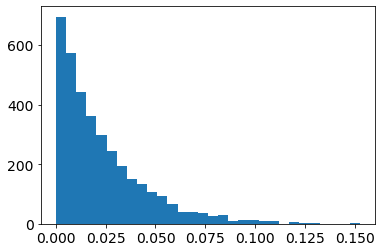

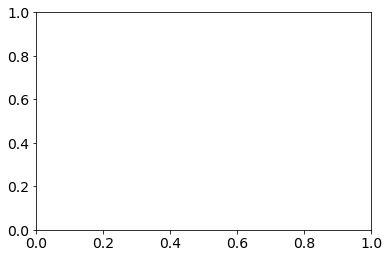

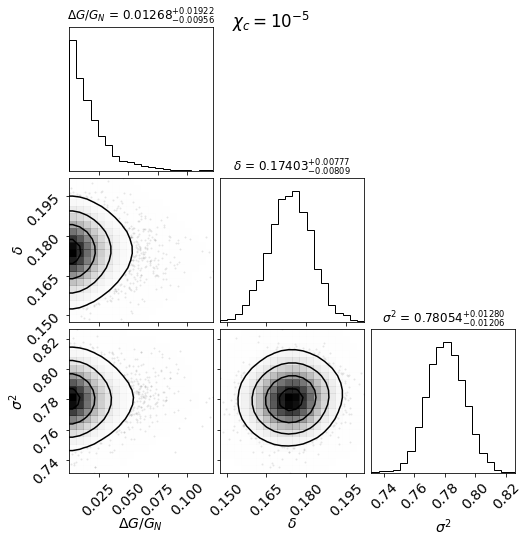

  0%|▏                                          | 4/918 [00:00<00:27, 32.99it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 1.7668905175465999e-06
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 1.0064412535707878e-06
10213-1902 [50] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 50.0 0.0 8.777595838027021e-07
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 5.815508970922776e-07
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0 0.0 2.3619676764822556e-05
10218-12703 [50] [3

  1%|▌                                         | 12/918 [00:00<00:26, 34.56it/s]

10218-3704 [50] [-0.2423, -0.7324, -0.4111, -0.2502, -0.1409, -0.2076, -0.2494, -0.3265, -0.3433, -0.3506, -0.3606, -0.3689, -0.3645, -0.3466, -0.4111, -0.2985]
10218-3704 50.0 0.0 1.7067497582156868e-06
10219-9102 [50] [1.3962, 1.1814, 0.7492, 0.4692, 0.3335, 0.2205, 0.1532, 0.1423, 0.1945, 0.153, 0.0798, 0.0216, -0.0715, -0.157, -0.0196, -0.0532, -0.0405]
10219-9102 50.0 0.0 7.79713475434193e-07
10220-12705 [50] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 50.0 0.0 7.124651896554009e-07
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 4.787336665974947e-06
10224-9101 [50] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 50.0 0.0 4.482440464502169e-07
10226-12704 [50] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694,

  2%|▉                                         | 20/918 [00:00<00:27, 33.12it/s]


10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 1.0813251147795872e-05
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 9.625034613701012e-06
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 50.0 0.0 9.123294623553809e-07
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 6.327310396445582e-06
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.0093, -0.0019, -0.047, -0.0973, -0.098, -0.0699]
10494-6101 50.0 0.0 4.893566224610694e-06
10494-9101 [50] [0.1044, 0.2038, 1.4077, 1.

  3%|█▎                                        | 28/918 [00:00<00:28, 31.30it/s]

10495-12704 [50] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 50.0 0.0 9.394443741540835e-06
10495-12705 [50] [871.1598, 1245.0304, 1205.1955, 1347.7893, 1374.3588, 1517.2635, 1622.8998, 1633.9971, 1757.8692, 1799.4196, 1854.634, 1999.5551, 1849.1662, 1882.4866, 1807.1303, 1651.9125, 1681.1326, 1493.9167, 2771.4516, 2121.0254, 1992.5196]
10495-12705 50.0 0.0 4.83260211911464e-07
10495-3702 [50] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 50.0 0.0 1.3517143053279627e-06
10496-12704 [50] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268.8121, 253.915, 333.7881, 358.7629, 315.1183, 261.3063, 216.6964, 267.188, 258.5169, 256.0365, 248.4992]
10496-12704 50.0 0.0 1.1483796554869464e-06
10496-12705 [50] [-0.3

  3%|█▍                                        | 32/918 [00:01<00:29, 30.22it/s]

10499-3702 [50] [-0.3822, -0.1753, 0.3237, 0.6092, 0.8357, 0.9307, 1.1046, 1.1845, 1.1657, 1.064, 1.005, 1.0954, 0.7875, 0.8892, 0.9769, 1.0508, 1.3156, 1.2283]
10499-3702 50.0 0.0 1.4142621224013435e-06
10499-3703 [50] [-0.0563, -0.0436, 0.024, 0.1267, -0.0775, -0.0664, 0.0153, -0.0929, -0.1244, -0.0851, -0.0939, -0.1131, -0.1033, -0.048, 0.0474, 0.0456, 0.0289, -0.0666, -0.0844, -0.5663]
10499-3703 50.0 0.0 1.4740976030139927e-06
10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 2.111824675194762e-06
10500-12704 [50] [140.7935, 35.4055, 16.1502, 8.7997, 6.1202, 5.6067, 5.0715, 4.9205, 5.0767, 4.6234, 4.2501, 4.0673, 3.8962, 3.8831, 3.7867, 3.6009, 3.0687, 4.1948, 2.9642, 3.5448, 1.9938, -0.2753, 2.8838, 5.8145]
10500-12704 50.0 0.0 4.116638771312056e-07
10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 3.934571936461498e-05
10500-3702 [50] [211.267, 568.975,

  4%|█▊                                        | 40/918 [00:01<00:27, 31.95it/s]

10500-3703 [50] [-0.028, -0.1828, 0.6642, 1.1037, 1.7094, 1.5507, 1.8019, 1.4925, 1.5792, 1.4772, 1.368, 1.4463, 1.2523, 1.4351, 1.2057, 0.9405, 0.5252, 1.657, 1.4263, 0.5704, 0.5717]
10500-3703 50.0 0.0 1.2992278456609196e-06
10501-12704 [50] [1.3181, 1.9521, 1.9474, 1.8957, 2.0169, 2.066, 2.2805, 2.1361, 1.7635, 1.5052, 2.0197, 2.1387, 2.493, 1.9877, 1.7896, 1.1205, 1.6972, 2.5971]
10501-12704 50.0 0.0 2.2383672348234337e-06
10501-6101 [50] [54.152, 240.5257, 446.403, 593.882, 679.4829, 745.3089, 578.3118, 397.5307, 268.9797, 276.8619, 234.4717, 196.8602, 156.2454, 140.6324, 64.5922]
10501-6101 50.0 0.0 1.5187430725590247e-06
10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 50.0 0.0 1.1445576171751909e-06
10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 7.344495853914332e-07
10503-9102 [50] [1

  5%|██▏                                       | 48/918 [00:01<00:29, 29.98it/s]

10508-12703 [50] [0.5005, 0.4509, 0.1544, 0.1328, 0.1165, 0.1176, 0.065, 0.1329, 0.2506, 0.179, 0.1788, 0.1204, 0.0037, 0.016, -0.0301, -0.0876]
10508-12703 50.0 0.0 4.147480855250366e-06
10509-12703 [50] [1226.9439, 2166.987, 2538.8741, 2127.6504, 1648.0951, 1358.0909, 1167.9374, 985.8138]
10509-12703 50.0 0.0 1.123417332374705e-06
10509-1901 [50] [88.4511, 296.1948, 449.6905, 409.1127, 761.2326, 574.7336, 678.7086, 604.9771, 571.2616, 614.5332, 408.9334, 441.3848, 355.292, 300.996, 243.919, 230.1612, 180.5992, 163.4382, 176.2701, 193.176, 205.4741]
10509-1901 50.0 0.0 4.371105312309043e-07
10509-6101 [50] [414.6573, 159.5598, 352.8386, 670.9188, 930.199, 434.1238, 984.9702, 921.6235, 784.8291, 825.2006, 827.4197, 661.5592, 624.5693, 894.3523, 620.0269, 747.519, 623.1939, 701.341, 577.342, 1031.0135, 622.2157, 697.4912, 668.4888, 271.226]
10509-6101 50.0 0.0 8.276455608152302e-07
10511-12704 [50] [-0.0162, 0.2052, 0.0934, -0.0203, -0.0645, -0.0743, -0.1124, -0.1256, -0.1314, -0.1489, 

  6%|██▍                                       | 52/918 [00:01<00:28, 30.20it/s]

10512-12701 [50] [-0.3741, -0.2352, -0.2444, -0.3467, -0.39, -0.3702, -0.2987, -0.245, -0.2376, -0.1861, -0.2187, -0.1372]
10512-12701 50.0 0.0 9.024641941389118e-07
10512-12705 [50] [-0.9971, -0.9962, -0.9967, -0.9971, -0.9969, -0.9968, -0.9961, -0.9958, -0.9964, -0.9971, -0.9977, -0.9977, -0.9977, -0.9976, -0.998]
10512-12705 50.0 0.0 1.3090240931482908e-06
10512-9102 [50] [4147.3152, 2927.8473, 3245.8656, 2878.0674, 2617.7881, 2204.6977, 1695.8151, 1371.2689, 1298.2413, 1241.1228, 1357.9116, 1330.7104, 1714.839, 1930.3755, 2196.7284, 2401.8011, 2844.302, 3122.8481, 2925.4465]
10512-9102 50.0 0.0 1.049895320435723e-06
10513-12702 [50] [-0.9916, -0.9877, -0.9855, -0.9802, -0.9787, -0.98, -0.9868, -0.9787, -0.862, -0.9802]
10513-12702 50.0 0.0 2.279948147384096e-06
10514-6103 [50] [0.5999, 0.3982, 0.2747, 0.2749, 0.0781, 0.0617, 0.0681, -0.0189, -0.0377, -0.0578, -0.065, -0.0594, 0.0253, -0.0317, 0.1182, -0.1428, -0.1895, -0.2508, -0.2991, -0.355]
10514-6103 50.0 0.0 4.319587442871208e

  6%|██▋                                       | 59/918 [00:01<00:28, 29.71it/s]

10517-6102 [50] [0.4712, 0.9172, 0.811, 0.5857, 0.3222, 0.2888, 0.1564, 0.1219, 0.169, 0.09, 0.1318, 0.0302, 0.061, 0.0297, 0.0658, 0.0113, 0.072, 0.0733, -0.0232, 0.0238, 0.0127, 0.0739, -0.0903, -0.0528]
10517-6102 50.0 0.0 5.412152931726955e-07
10518-12705 [50] [-0.1971, 0.2795, 0.1103, -0.0254, -0.0161, -0.0, 0.0208, 0.0333, 0.0023, -0.0238, -0.0544, -0.1612]
10518-12705 50.0 0.0 5.080440506383976e-06
10518-1902 [50] [-0.0105, 0.2572, 0.0495, 0.0308, 0.0287, -0.0677, -0.0841, -0.0885, -0.1994, -0.1432, -0.1195, -0.1634, -0.1173, -0.1219, -0.165, -0.1325, -0.1731]
10518-1902 50.0 0.0 1.8131780795199455e-06
10518-6102 [50] [-0.217, 1.2282, 0.4062, 0.3459, 0.382, 0.1799, 0.1478, 0.1175, 0.0995, 0.1358, 0.0812, 0.048, 0.0452, 0.0639, 0.0875, 0.0309, 0.0337, 0.0007, -0.0113, -0.1383]
10518-6102 50.0 0.0 1.2106129910444537e-06
10519-12704 [50] [-0.2611, 0.2686, 0.1702, 0.0601, 0.0584, 0.0258, -0.0515, -0.1077, -0.1123, -0.1006]
10519-12704 50.0 0.0 1.7895875922314108e-06
10519-6102 [50] 

  7%|███                                       | 67/918 [00:02<00:28, 30.32it/s]

10520-6102 [50] [-0.9995, -0.9993, -0.9985, -0.9976, -0.9986, -0.9981, -0.9983, -0.9984, -0.9986, -0.9981, -0.9963]
10520-6102 50.0 0.0 3.2033179696484018e-06
10838-9101 [50] [-0.0928, 0.4421, 0.4896, 0.3922, 0.2667, 0.3141, 0.2582, 0.2949, 0.294, 0.2543, 0.2198, 0.1153, 0.0076, -0.0625, -0.124, -0.1198, -0.272, -0.3696, -0.3534, -0.3974, -0.2337]
10838-9101 50.0 0.0 1.7979097185955439e-06
10839-12705 [50] [0.5531, 0.4188, 0.6271, 0.6342, 0.4074, 0.3206, 0.1512, 0.1105, 0.1154, 0.1763, 0.2141, 0.3291, 0.2868, 0.1635, 0.0391, 0.4134, 0.1807]
10839-12705 50.0 0.0 3.505479001924476e-06
10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712, 0.035, -0.0115, 0.0248, -0.0288, 0.0512, -0.0187, 0.0073, 0.0432, -0.0916, -0.1233, -0.1818, -0.1471]
10839-3704 50.0 0.0 1.0244928222128417e-06
10839-6101 [50] [244.3098, 615.0842, 876.8345, 1563.8627, 1705.1968, 1816.091, 1687.128, 1731.6052, 1640.9131, 1596.506, 1498.4971, 1406.0518, 671.6148, 995.7509]
10839-6101 50.0 0.0 9.884016688322533e-07
10839-9101 

  8%|███▍                                      | 75/918 [00:02<00:27, 30.76it/s]

10842-3702 [50] [-0.5415, 0.0585, 0.2828, 0.1825, 0.1674, 0.1342, 0.1324, 0.2899]
10842-3702 50.0 0.0 6.417102111293395e-07
10842-3703 [50] [-0.6099, -0.8101, -0.8807, -0.9171, -0.9297, -0.9289, -0.9268]
10842-3703 50.0 0.0 8.534963535713665e-07
10842-9101 [50] [-0.987, -0.9943, -0.9967, -0.9976, -0.9979, -0.998, -0.9982, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9981, -0.998, -0.9982, -0.9979, -0.9982, -0.9983]
10842-9101 50.0 0.0 8.096798474022383e-07
10845-12702 [50] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-12702 50.0 0.0 9.971764193293983e-07
11004-12705 [50] [-0.8497, -0.6991, -0.5203, -0.3493, -0.2406, -0.2193, -0.1954, -0.1792, -0.1842, -0.1767, -0.1858, -0.1781, -0.195, -0.2173, -0.2294, -0.167, -0.2434, -0.1514, -0.3351, -0.2129]
11004-12705 50.0 0.0 8.080625320055372e-07
11004-3703 [50] [5607.0165, 6199.0745, 5122.0907, 4588.5334, 3798.1606, 3256.1827, 2909.7374, 2623.1995, 2081.3703, 1622.0266, 1252.

  9%|███▊                                      | 83/918 [00:02<00:26, 32.09it/s]

11009-12704 [50] [-0.044, 0.5574, 0.4941, 0.5156, 0.452, 0.4031, 0.3736, 0.4191, 0.4646, 0.4848, 0.558, 0.4716, 0.2432, 0.3821, 0.6252, 0.8487, 0.8601]
11009-12704 50.0 0.0 1.571611760452096e-05
11009-6102 [50] [0.2368, -0.3064, 0.0765, 0.1736, 0.0574, 0.1163, 0.1754, 0.2052, 0.2777, 0.3634, 0.3506, 0.3192, 0.3455, 0.323, 0.4447, 0.1481, 0.2577, -0.1338, 0.037, 0.1218, 0.8549, -0.5202]
11009-6102 50.0 0.0 6.377226469141976e-07
11010-6104 [50] [669.1593, 612.5725, 580.2933, 433.0387, 377.072, 315.1925, 269.3918, 266.5579, 267.4688, 253.2676, 240.0639, 221.1944, 344.4065]
11010-6104 50.0 0.0 2.9092178259174707e-06
11010-9101 [50] [2.5718, 0.9269, 0.2901, 0.1931, 0.0011, -0.0504, -0.0935, -0.075, 0.0093, 0.0203, 0.0025, -0.0251, -0.0362, 0.0004, 0.0161, -0.0012, -0.102, -0.364, -0.4377]
11010-9101 50.0 0.0 7.5088635074314685e-06
11011-12703 [50] [9.8651, 35.0102, 40.3579, 54.0601, 192.4013, 365.0512, 378.092, 411.2362, 282.7202, 230.5846, 329.2445, 263.6472, 244.1501]
11011-12703 50.0 0.0

  9%|███▉                                      | 87/918 [00:02<00:26, 30.91it/s]

11012-3702 [50] [7.8974, 3196.585, 2734.8285, 2253.8811, 4078.0168, 2401.2221, 2680.4924, 2677.0305, 2494.671, 2122.0656, 2023.2433, 2124.4295, 1742.4806, 1879.5204, 1353.859, 1265.244, 1077.374, 829.3809, 807.9255, 437.3493, 291.3315]
11012-3702 50.0 0.0 5.3850585549212005e-06
11012-9102 [50] [4.3613, 1.8587, 0.9243, 0.4611, 0.1717, 0.0565, -0.0003, -0.0124, 0.0149, 0.0346, 0.0094, 0.0256, 0.0391, 0.0441, 0.0302, -0.0599, -0.0933, -0.0179]
11012-9102 50.0 0.0 4.5837847985650415e-06
11013-12702 [50] [0.7904, 0.6387, 0.0779, 0.1203, 0.0592, -0.004, -0.016, 0.0128, 0.0194, 0.059, 0.0663]
11013-12702 50.0 0.0 3.405625821436743e-06
11013-1902 [50] [0.7893, 0.6453, 0.5024, 0.4895, 0.4034, 0.2175, 0.0455, -0.0103, 0.0142, -0.2569, -0.0412, -0.2183, -0.1712, -0.0824, -0.3609, -0.2323, -0.3117]
11013-1902 50.0 0.0 3.5793481280124402e-06
11013-3701 [50] [0.785, 0.6845, 0.2024, 0.0457, 0.0342, 0.02, -0.06, -0.0296, -0.0379, -0.1677]
11013-3701 50.0 0.0 2.770503607529296e-06
11013-3702 [50] [0.89

 10%|████▎                                     | 95/918 [00:03<00:26, 30.58it/s]

11017-12703 [50] [0.0185, 0.3093, 0.3468, 0.2632, 0.2308, 0.2072, 0.1992, 0.215, 0.2444, 0.2273, 0.053, -0.0123, 0.1078, -0.0553]
11017-12703 50.0 0.0 2.7612847856749094e-06
11017-12704 [50] [0.4751, 0.4487, 0.3988, 0.2586, 0.0625, -0.0537, -0.0751, -0.1094, -0.1157, -0.1027, -0.1141, -0.1182, -0.1126, -0.1047, -0.0836, -0.1961, -0.2389]
11017-12704 50.0 0.0 9.407310528337125e-07
11017-6103 [50] [-0.3235, -0.3265, -0.3479, -0.2253, -0.2261, -0.1769, -0.1311, -0.1075, -0.0747, -0.0989, -0.1378, -0.1695, -0.1257, -0.174, -0.178, -0.0714, -0.0163, 0.0028, 0.2262, -0.2731]
11017-6103 50.0 0.0 4.855540825145661e-06
11017-9101 [50] [-0.5273, 0.0425, 0.2188, 0.1666, 0.07, 0.0407, -0.0503, -0.1282, -0.2004, -0.2244, -0.1722, -0.1497, -0.0815, -0.0967, -0.1443, -0.1476, -0.1864, -0.1536, -0.2264, -0.18]
11017-9101 50.0 0.0 9.738808586867672e-07
11018-12702 [50] [-0.9839, -0.9926, -0.9927, -0.9922, -0.9923, -0.9935, -0.9932, -0.9925, -0.9931, -0.994, -0.9941]
11018-12702 50.0 0.0 1.6423609485800

 11%|████▌                                    | 103/918 [00:03<00:26, 30.35it/s]

11018-3703 [50] [-0.5454, 0.4164, 0.6741, 0.5852, 0.6907, 0.7028, 0.6059, 0.5528, 0.656, 0.6306, 0.5445, 0.5549, 0.4676, 0.4329, 0.3355, 0.3242, 0.462, 1.051, 0.5129, 1.3094]
11018-3703 50.0 0.0 2.9518997211250413e-06
11018-6102 [50] [69.1052, 130.9961, 113.1141, 109.1797, 92.5989, 91.6354, 88.5765, 83.9604, 80.137, 76.3564, 74.3146, 74.7218, 70.495, 71.7331, 65.8452, 64.9321, 72.2612]
11018-6102 50.0 0.0 2.2892245252105245e-06
11019-12702 [50] [0.0142, 0.2516, 0.1906, 0.1378, 0.0877, -0.003, 0.0993, 0.0958, 0.1065, 0.1232, 0.2086, 0.1132, 0.0357, -0.0115, -0.014, 0.0302, -0.0875, -0.1071]
11019-12702 50.0 0.0 1.3841193495884433e-06
11019-12703 [50] [-0.4993, -0.4671, -0.3698, -0.2654, -0.2024, -0.2445, -0.2033, -0.2117, -0.2752, -0.2285, -0.2102, -0.0702, -0.1699, 0.0858, -0.1757, -0.2987]
11019-12703 50.0 0.0 8.716073021079652e-06
11019-12705 [50] [0.9395, 1.6844, 1.8269, 0.8562, 0.7011, 1.016, 1.1247, 1.0992, 1.0844]
11019-12705 50.0 0.0 3.3774225600887086e-06
11019-3701 [50] [2.596

 12%|████▊                                    | 107/918 [00:03<00:26, 30.26it/s]

11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 1.1319974277465466e-05
11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 5.283114583013644e-06
11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 5.988217691535088e-05
11742-12704 [50] [0.6702, -0.5312, -0.3481, 0.0047, 0.1348, 0.415, 0.2787, 0.5138, -0.0348]
11742-12704 50.0 0.0 7.92157667110184e-07
11743-1901 [50] [-0.5717, -0.3943, -0.5273, -0.3736, -0.306, -0.392, -0.3766, -0.4151, -0.3665, -0.4111, -0.4236, -0.3424, -0.3877, -0.3594, -0.291, -0.4952, -0.6018]
11743-1901 50.0 0.0 5.095962576655033e-06
11744-9102 [50] [-0.6

 13%|█████▏                                   | 115/918 [00:03<00:26, 29.90it/s]

11745-6104 [50] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.8527, 0.5703, 0.5078, 0.5176, 0.5143, 0.48, 0.4463, 0.4504, 0.4653, 0.4273, 0.4049]
11745-6104 50.0 0.0 1.7167677644455897e-06
11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.0361, -0.076, -0.0711, -0.1542, -0.2041, -0.2119, -0.1066, -0.2705, -0.3138]
11745-9101 50.0 0.0 1.981465568070243e-06
11746-3703 [50] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 50.0 0.0 3.1416124547326994e-06
11746-3704 [50] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 50.0 0.0 4.354467565177284e-07
11746-9102 [50] [-0.478, -0.2133, -0.2528, -0.1774, -0.2077, -0.2266, -0.2099, -0.2691, -0.1996, -0.2114, -0.1249, -0.1799, -0.1765, -0.1376, -0.2784

 13%|█████▍                                   | 123/918 [00:03<00:26, 30.21it/s]

11749-12704 [50] [1.1585, 1.0264, 1.2033, 1.4986, 1.8954, 2.0398, 2.1095, 2.1199, 1.4688, 1.3033, 0.9132, 0.8426, 0.0515, 0.4719, -0.3735]
11749-12704 50.0 0.0 6.83906340344765e-06
11749-3701 [50] [618.0455, 872.9003, 1483.1859, 1615.2011, 1553.7949, 1334.0598, 1385.5396, 1283.8547, 1216.0833, 1294.494, 1472.7433, 1080.4933, 1346.7897, 1196.9726, 1091.8413, 1216.7304, 927.7028, 363.0292, 281.9853, 551.8779, 169.9359, 54.7426, 122.374, 379.7425, 27.1507]
11749-3701 50.0 0.0 1.5270958608117072e-06
11750-12701 [50] [0.4224, 0.3089, 0.0791, 0.0892, 0.2329, 0.2222, 0.1114, 0.03, 0.0196, 0.0027, 0.0313, 0.0827, 0.0275, 0.3095]
11750-12701 50.0 0.0 1.3419798657762912e-06
11750-3701 [50] [1.5964, 1.8766, 1.9419, 1.999, 1.4725, 1.2873, 1.1333, 0.934, 0.9463, 0.8918, 0.7347, 0.8508, 0.6677, 0.4619, 0.3762, 0.1866, 0.0367, 0.0915, 0.0086, 0.4665]
11750-3701 50.0 0.0 6.499580095314259e-07
11750-6103 [50] [6.303, 1.7001, 0.3933, 0.5417, 0.5248, 0.6298, 0.7207, 0.7282, 0.8046, 0.5691, 0.3659, 0.4083

 14%|█████▊                                   | 131/918 [00:04<00:25, 30.77it/s]

11751-1901 [50] [-0.9334, -0.8849, -0.9513, -0.9754, -0.9893, -0.9862, -0.989, -0.9902, -0.9893, -0.9909, -0.9903, -0.9906, -0.9888, -0.9874]
11751-1901 50.0 0.0 1.975278469688883e-06
11751-6102 [50] [0.3738, 0.0535, 0.3785, 0.2124, 0.1333, 0.0258, -0.0223, -0.094, -0.1099, -0.1415, -0.1724, -0.2013, -0.1841, -0.253, -0.3949, -0.2255, -0.2141, -0.2775]
11751-6102 50.0 0.0 1.5403964887458314e-06
11753-3703 [50] [0.2801, 0.7604, 0.7391, 0.5795, 0.35, 0.1693, 0.0874, 0.0586, 0.0152, -0.0057, -0.0099, -0.0594, -0.1073, -0.139, -0.1496]
11753-3703 50.0 0.0 1.494281776328364e-06
11753-6104 [50] [1.7058, 1.5787, 1.7231, 1.492, 1.0043, 0.8699, 0.6579, 0.5905, 0.5042, 0.4712, 0.4504, 0.6153, 0.6589, 0.6817, 0.5206, 0.5457, 0.5195, 0.692]
11753-6104 50.0 0.0 9.08720676817722e-07
11754-1901 [50] [-0.2402, -0.5388, -0.5143, -0.4398, -0.487, -0.4664, -0.4721, -0.5334, -0.5004, -0.4954, -0.6115, -0.5884]
11754-1901 50.0 0.0 1.9075343619806113e-06
11755-12701 [50] [-0.773, -0.7865, -0.7717, -0.7522, 

 15%|██████                                   | 135/918 [00:04<00:25, 30.67it/s]

11755-9102 [50] [0.1799, 0.2485, 0.3504, 0.383, 0.2088, 0.1465, 0.0712, -0.0042, -0.0415, -0.0215, 0.0671, 0.0623, 0.1393, -0.1017, 0.125, -0.214, -0.1458]
11755-9102 50.0 0.0 2.1002692793966553e-05
11758-3701 [50] [-0.3091, 0.0326, 0.2349, 0.1141, 0.0113, 0.06, -0.0268, -0.1507, -0.2171, -0.1994, -0.1587, -0.1557, -0.1574, -0.1614, -0.0618]
11758-3701 50.0 0.0 1.2729182703140183e-06
11758-3702 [50] [-0.544, -0.1141, 0.0167, 0.1028, 0.0854, -0.0041, -0.0149, 0.0406]
11758-3702 50.0 0.0 2.968084903583594e-06
11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 50.0 0.0 1.3250322844519126e-06
11759-6102 [50] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, -0.981]
11759-6102 50.0 0.0 5.88499990271329e-07
11760-12703 [50] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0.

 16%|██████▍                                  | 143/918 [00:04<00:26, 29.55it/s]

11760-6103 [50] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.2117, -0.2373, -0.2365, -0.2317, -0.3078, -0.2653, -0.3184, -0.2638]
11760-6103 50.0 0.0 5.74073698652603e-07
11760-9102 [50] [-0.8049, -0.6427, -0.2931, -0.1213, 0.1899, 0.0235, 0.108, 0.1381, 0.1732, 0.1865, 0.1624, 0.1963, 0.1218, 0.1215, 0.1223, 0.2636, 0.046, 0.5962, 0.1808, 0.9922, 2.2582]
11760-9102 50.0 0.0 5.963942120306158e-07
11761-12702 [50] [-0.6826, -0.6017, -0.2216, -0.1122, -0.0329, -0.02, -0.0711, -0.0937, -0.0782, -0.098, -0.1546, -0.1024, -0.1043, -0.0648, -0.2102, -0.3314, -0.2483]
11761-12702 50.0 0.0 7.532802483318052e-06
11761-12703 [50] [0.4093, 0.08, -0.0588, -0.0478, 0.0006, -0.0009, -0.0617, -0.1284, -0.1046, -0.1135, -0.1247, -0.1623, -0.2191, -0.3477]
11761-12703 50.0 0.0 7.86574748334091e-06
11761-12704 [50] [-0.1205, 0.9952, 0.5814, 0.2296, 0.1208, 0.126, 0.1222, 0.1041, 0.1683, 0.1996, 0.1448, 0.1188, 0.0574, 0.0394, -0.008, -0.026, -0.0331]
11761-12704 50

 16%|██████▋                                  | 149/918 [00:04<00:26, 28.61it/s]

11823-9101 [50] [15949.1976, 8800.0053, 8323.3916, 4811.1692, 2214.9858, 717.2733, 413.2719, 305.7873, 173.5393, 146.0478, 195.6604, 224.7593, 189.4201, 67.1778]
11823-9101 50.0 0.0 1.3818416226774805e-06
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 1.2068314517931973e-05
11828-12703 [50] [-0.5587, -0.2913, 0.1844, 0.3112, 0.2627, 0.2124, -0.0354, -0.0957, -0.1295, -0.1601, -0.0565, -0.1246, 0.0413]
11828-12703 50.0 0.0 1.5942818429230784e-06
11830-12701 [50] [-0.9938, -0.9825, -0.9834, -0.9912, -0.9934, -0.9941, -0.9946, -0.9933, -0.9936, -0.9951, -0.9951, -0.9944, -0.9947, -0.9932, -0.9955, -0.9854, -0.997, -0.9939, -0.9962]
11830-12701 50.0 0.0 2.0044520886451197e-06
11830-12703 [50] [-0.4776, 0.0437, 0.1582, -0.0709, -0.1607, -0.0754, 0.055, 0.2665, 0.1845, 0.03, 0.0663, -0.087, -0.2185, -0.1589, 0.0536, -0.3722]
11830-12703 50.0 0.0 2.9901178804273057e-06
11830-3702 [50] [

 17%|██████▉                                  | 155/918 [00:05<00:26, 29.09it/s]

11830-6104 [50] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.0353, -0.2063, -0.258, -0.2347, -0.2692, -0.3985]
11830-6104 50.0 0.0 1.3382925181377321e-06
11831-12703 [50] [0.4472, 0.0224, 0.062, 0.158, -0.0429, -0.0922, -0.1252, -0.188, -0.1276, -0.16, -0.2596, -0.2165, 0.1708, -0.4595]
11831-12703 50.0 0.0 5.970602521036425e-06
11831-12704 [50] [-0.5822, -0.2435, 0.0115, -0.0848, -0.1704, -0.028, -0.0888, -0.0323, -0.0445, -0.106, -0.3871, -0.1836]
11831-12704 50.0 0.0 1.5911124720455111e-06
11831-6101 [50] [-0.9875, -0.994, -0.9968, -0.9973, -0.9967, -0.9975, -0.9969, -0.9978, -0.9979, -0.9971, -0.9984, -0.9986, -0.9985, -0.9974]
11831-6101 50.0 0.0 4.100411378497622e-07
11831-6102 [50] [1.041, 0.6096, 0.4053, 0.165, 0.0902, 0.1922, 0.1873, 0.1187, 0.1055, 0.0085, -0.1108, -0.0737]
11831-6102 50.0 0.0 2.193501925633636e-06
11833-9102 [50] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.2

 18%|███████▏                                 | 161/918 [00:05<00:26, 28.67it/s]

11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 1.6268249709991062e-05
11836-1902 [50] [0.7026, 1.2767, 1.1865, 1.1009, 0.973, 0.9921, 0.7024, 0.7206, 0.623, 0.6145, 0.5505, 0.5955, 0.6037, 0.4142, 0.4147]
11836-1902 50.0 0.0 7.361742456492546e-06
11838-12701 [50] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 0.1336, 0.0903, 0.0213, -0.0554, -0.0342, 0.0225, 0.0053, -0.0272]
11838-12701 50.0 0.0 2.5701034227792014e-06
11838-12703 [50] [144.9042, 254.2159, 538.0129, 911.0748, 1089.8377, 1111.2623, 1284.2649, 1228.3752, 1345.2496, 1400.7846, 1427.4787, 1434.5371, 1257.47, 1184.9615, 998.2342, 830.6266, 670.98, 596.3078, 488.5417, 423.536, 329.6538, 32.3109, 5.6457, 31.8479]
11838-12703 50.0 0.0 1.7162251818347367e-06
11838-3702 [50] [0.536, 0.7094, 0.6061, 0.6555, 0.6466, 0.6204,

 18%|███████▌                                 | 169/918 [00:05<00:25, 29.60it/s]

11865-12702 [50] [-0.057, -0.0512, 0.0778, -0.0002, -0.0743, -0.0834, -0.0854, 0.0083, -0.0154, -0.0332, -0.07, -0.1612, -0.2706]
11865-12702 50.0 0.0 1.1233071157674853e-06
11865-12704 [50] [0.4447, -0.0557, -0.3894, -0.457, -0.5111, -0.5109, -0.5238, -0.5353, -0.4955, -0.5012, -0.4831, -0.4726, -0.599, -0.615]
11865-12704 50.0 0.0 1.34418811143905e-06
11865-1901 [50] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 50.0 0.0 1.036757104260632e-06
11865-1902 [50] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0.4429]
11865-1902 50.0 0.0 7.985636177129079e-07
11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 1.3144871653117172e-06
11865-9102 [50] [-0.467, -0.4695, -0.4789, -0.5286, -0.6182, -0.6445, -0.6408, -0.6047, -0.6031, -0.6243, -0.655, -0.6895, -0.6998, -0.5904, -0.6729, -0.6983]
11865-9102 50.0 0.0 5.796526290842351e-07


 19%|███████▊                                 | 175/918 [00:05<00:26, 28.19it/s]

11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2771, 0.298, 0.3814, 0.3262, 0.2102, 0.3978, 0.4467, 0.2866, 0.1214, 0.2202, 0.1346, 0.4041]
11867-6104 50.0 0.0 3.852344079238376e-06
11867-9101 [50] [0.9073, 0.3027, 0.1546, 0.1123, 0.0285, 0.0159, -0.0244, 0.0205, 0.0824, 0.1908, 0.2079, 0.2195, 0.3058, 0.2425, 0.1871, 0.3056]
11867-9101 50.0 0.0 1.568532024304015e-06
11868-12703 [50] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 3.971653205441688e-06
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 1.531517733911049e-05
11871-6103 [50] [0.7182, 0.8575, 0.776, 0.4737, 0.2556, 0.1173, 0.1395, 0.111, 0.0842, 0.0381, 0.0003, -0.0281, -0.0195, -0.044, -0.0588, -0.2086, -0.132, -0.377]
11871-6103 50.0 0.0 1.9319815291707988e-05
11940-1902 [50] [-0.0835, 0.1518, 0.1321, 0.0182, -0.0843, -0.1452, -0.1779, -0.1993, -0.1955]
11940-1902 50.0 0

 20%|████████▏                                | 182/918 [00:05<00:25, 29.41it/s]

11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 5.490007654878092e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 6.016018734177284e-05
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389.9946, 2439.1642, 2636.587, 2485.7262, 2056.7992, 1736.2622, 1623.5415, 1192.5228, 781.8483, 546.9719, 175.874]
11942-12704 50.0 0.0 2.345984238603014e-05
11942-6104 [36.06181005025126] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 36.06181005025126 3.7611591487170356e-08 3.580667463774517e-07
11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.0425, -0.0331, -0.0546, -0.0982, -0.1371, -0.164, -0.179, -0.1863, -0.172, -0.1572, -0.1563, -0.1648, -0.1726, -0.27]
11943-3703 50.0 0.

 20%|████████▍                                | 188/918 [00:06<00:25, 28.19it/s]

11945-12701 [50] [0.3961, 0.2879, 0.3765, 0.1557, -0.0002, -0.113, -0.1502, -0.128, -0.114, -0.1705, -0.0344, 0.0462, 0.017]
11945-12701 50.0 0.0 7.797513224703665e-06
11945-6101 [50] [0.2057, 0.8606, 0.9637, 0.605, 0.4694, 0.2734, 0.2029, 0.1332, 0.0558, -0.0105, 0.0015, 0.0011, -0.0038, -0.016, 0.0504, -0.0338]
11945-6101 50.0 0.0 1.0816856543550422e-05
11945-6102 [50] [3.5224, 2.2109, 1.4349, 1.0152, 0.7457, 0.4864, 0.2556, 0.1192, 0.0508, 0.0117, -0.0209, -0.0683, -0.158, -0.0976, -0.2012]
11945-6102 50.0 0.0 5.034810740688826e-06
11947-6103 [50] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 50.0 0.0 2.1651858489457186e-06
11949-12701 [50] [1.1975, 0.3408, 0.1441, 0.1243, 0.0225, 0.0003, 0.0028, 0.027, 0.0197, 0.0192, -0.0295, -0.0839]
11949-12701 50.0 0.0 3.462070361283593e-06
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716

 21%|████████▋                                | 194/918 [00:06<00:26, 26.92it/s]

11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.2778]
11954-3703 50.0 0.0 8.082523574442489e-06
11954-9101 [50] [-0.9882, -0.9937, -0.9946, -0.9965, -0.9974, -0.9972, -0.997, -0.9969, -0.997, -0.9974, -0.9978, -0.9979, -0.9973, -0.9971, -0.9976, -0.9966]
11954-9101 50.0 0.0 7.430609526087414e-06
11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 6.452288831590639e-06
11956-12702 [50] [5.6953, 5.0804, 3.2564, 2.1056, 1.2622, 0.6457, 0.4602, 0.5373, 0.9503, 3.7649, 5.1679]
11956-12702 50.0 0.0 4.724359958789731e-06
11956-12705 [50] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 0.2419, 0.2565, 0.3525, 0.1776, 0.103, 0.3387, 0.3814, 0.7221, 0.77]
11956-12705 50.0 0.0 7.896305456420842e-07
11957-12704 [23.839629145728644] [-0.3492, 0.7667, 0.6853, 0.5861, 0.3661, 0

 22%|████████▉                                | 200/918 [00:06<00:26, 27.02it/s]

11957-9101 [50] [127.5969, 337.5453, 692.0501, 754.6672, 761.8038, 673.5367, 561.8056, 470.5271, 446.8561, 434.7914, 434.701, 432.6297, 423.9362, 415.9254, 409.4146, 409.8788]
11957-9101 50.0 0.0 3.6580547393699086e-06
11957-9102 [50] [1.0969, 0.3397, 0.6198, 1.0919, 1.791, 2.069, 2.6145, 2.7123, 2.8073, 2.4726, 2.1945, 1.9756, 2.1362, 4.7679, 3.0873, 1.2673, 3.459, 16.3037, 15.1044]
11957-9102 50.0 0.0 1.3753587665775822e-06
11958-6103 [50] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 50.0 0.0 5.448408853800478e-07
11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 2.501501455995439e-06
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 50.0 0.0 7.443579137586763e-06
11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.98

 23%|█████████▏                               | 207/918 [00:06<00:25, 28.17it/s]

11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 1.1828127573291943e-05
11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.8986, 3.5843, 4.0724, 0.9129, 2.9875, 0.7205, 2.6408, 1.2362]
11969-6101 50.0 0.0 1.6220606172897292e-05
11970-12703 [0.5497] [-0.4888, -0.3498, -0.0561, 0.1594, 0.1669]
11970-12703 0.5497 1.224492543544079e-07 2.5755803319192003e-07
11970-6102 [50] [-0.0116, -0.0683, -0.0558, -0.0053, 0.0454, 0.025, 0.078, -0.0283, -0.085, -0.1052, -0.0602, -0.0272, -0.0693, -0.0116, -0.1378, -0.2799, -0.2497]
11970-6102 50.0 0.0 1.4593542929345617e-06
11970-6103 [50] [0.7466, 1.1751, 1.6643, 1.3977, 1.0416, 0.8262, 0.6871, 0.5199, 0.4194, 0.3266, 0.2718, 0.2909, 0.2357, 0.2575, 0.2139, 0.0837, -0.0144, -0.0619, 0.133]
11970-6103 50.0 0.0 2.843010345119346e-06
11974-12702 [50] [-0.5341, -0.4596, -0

 23%|█████████▌                               | 214/918 [00:07<00:25, 27.95it/s]

11975-12705 [50] [0.6902, 0.7621, 0.3208, 0.2527, 0.3317, 0.3259, 0.2387, 0.0864, 0.069, 0.2015, 0.1928, 0.1502, -0.0055, -0.1924]
11975-12705 50.0 0.0 2.3791694247713464e-06
11975-3703 [50] [-0.2597, -0.0329, 0.0768, 0.0833, 0.1048, 0.0682, 0.0342, -0.0156, -0.0756, -0.093, -0.0695, -0.0466, 0.0656, -0.0085, 0.1237, 0.1334, 0.0646]
11975-3703 50.0 0.0 3.0907050375182146e-06
11975-6104 [50] [1.0196, 1.2709, 1.5062, 1.1104, 0.9965, 0.7778, 0.776, 0.6311, 0.7603, 0.6278, 0.6208, 0.5151, 0.5172, 0.5343, 0.2326, 0.5012, 0.187, 0.4522, 0.1401, 0.1327]
11975-6104 50.0 0.0 2.203963409380244e-06
11976-12703 [50] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 50.0 0.0 2.2891635389994325e-06
11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 50.0 0.0 1.0783365604709166e-06
11978-12705 [50] [0.0184, 0

 24%|█████████▊                               | 220/918 [00:07<00:27, 25.14it/s]

11978-6101 [50] [0.1703, 0.2916, 0.2201, 0.1105, 0.137, 0.0651, 0.0262, 0.0439, 0.1227, 0.0551, 0.0171, -0.0525, -0.106, -0.2018, -0.2281, -0.1584, -0.2752, -0.3694, -0.5359, -0.6656, -0.8099]
11978-6101 50.0 0.0 1.8320886321995606e-06
11979-12703 [50] [0.3188, 0.2646, 0.4444, 0.4735, 0.4231, 0.2818, 0.2037, 0.1891, 0.1975, 0.1625, 0.205, 0.2447, 0.1501, 0.1763, 0.1339, 0.4567, 0.4255, 0.53]
11979-12703 50.0 0.0 1.5800994794404117e-05
11979-12704 [50] [1.0417, 0.8488, 0.6206, 0.5652, 0.598, 0.4342, 0.2822, 0.1334, 0.0604, 0.0319, 0.0291, -0.01, -0.083, -0.0554, -0.0215, -0.0081, 0.0344]
11979-12704 50.0 0.0 6.837062500673242e-07
11979-9101 [50] [0.4094, -0.1099, -0.2651, -0.4134, -0.4241, -0.4727, -0.5, -0.5199, -0.5395, -0.5666, -0.5927, -0.5903, -0.6162, -0.591, -0.6704, -0.611]
11979-9101 50.0 0.0 1.0155523372293366e-06
11979-9102 [50] [0.6334, -0.323, -0.1351, -0.0857, 0.0053, 0.0302, 0.0467, 0.0752, 0.0566, 0.0459, 0.0116, 0.0269, 0.0046, -0.0156, -0.091, -0.1558, -0.3105, -0.4242

 24%|█████████▉                               | 223/918 [00:07<00:28, 24.71it/s]

11981-12702 [50] [293.567, 690.112, 683.5389, 617.2849, 490.646, 374.3616, 455.8674, 450.3051, 457.9927, 478.543, 404.234]
11981-12702 50.0 0.0 5.105545841803871e-07
11981-12704 [50] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]
11981-12704 50.0 0.0 1.470430288830779e-06
11981-9102 [50] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188, -0.1444, -0.128, -0.1812, -0.1904, -0.2284, -0.2044, -0.2061, -0.1486, -0.2345, -0.2114, 0.0329, 0.7603]
11981-9102 50.0 0.0 7.661180419120304e-06
11982-12704 [50] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.1555, 0.0797, -0.029, 0.0037, 0.2331]
11982-12704 50.0 0.0 1.5658297493149998e-06
11982-3703 [50] [-0.314, 0.4086, 0.6273, 0.7714, 0.9457, 0.986, 1.0945, 1.392, 1.3945, 1.539, 1.4145, 1.0397, 1.0282, 0.5616, 0.557, 0.0557]
11982-3703 50.0 0.0 1.2090423681683623e-06
1

 25%|██████████▎                              | 230/918 [00:07<00:26, 25.66it/s]

11982-9102 [50] [-0.6167, -0.1298, 0.3235, 1.2078, 1.1438, 0.8069, 0.6394, 0.4963, 0.4228, 0.3252, 0.3069, 0.2838, 0.3393, 0.4905, 0.4567, 0.2311]
11982-9102 50.0 0.0 2.250767626849842e-06
11984-12701 [50] [-0.2857, -0.1737, 0.0157, 0.0372, -0.1281, -0.2001, -0.1962, -0.1945, -0.1458, -0.0921, -0.099, -0.116, -0.1666, -0.325, -0.2122, -0.442]
11984-12701 50.0 0.0 2.6477099652440794e-06
11984-12702 [50] [-0.2774, -0.3248, -0.3706, -0.3541, -0.339, -0.3481, -0.2877, -0.2577, -0.2022, -0.1466, -0.1889, -0.2485, -0.0638, -0.2124, -0.1581, -0.3914, -0.132]
11984-12702 50.0 0.0 4.449911461038043e-06
12066-3701 [50] [19.2418, 16.9197, 10.1428, 6.0915, 4.4316, 3.0783, 2.9929, 2.3906, 2.7183, 2.8356, 3.2869, 3.669, 3.475, 3.6088, 2.499, 1.7084, 1.9485, 1.5899]
12066-3701 50.0 0.0 3.927864975131136e-06
12067-12703 [50] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
12067-12703 50.0 0.0 1

 26%|██████████▌                              | 236/918 [00:08<00:27, 24.36it/s]

12067-12705 [50] [0.4291, 1.3434, 2.0219, 1.7622, 1.0305, 0.7583, 0.4763, 0.1261, 0.0511, 0.0662, 0.1502, 0.2361, 0.2324, 0.212, 0.3434]
12067-12705 50.0 0.0 1.1139281779323498e-06
12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 3.3594849511254355e-05
12068-6104 [50] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 50.0 0.0 2.6772336192461334e-06
12069-12704 [50] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 50.0 0.0 3.006190513614772e-06
12069-12705 [50] [1.7332, 1.137, 0.4096, 0.6564, 0.5837, 0.6168, 0.2246, 0.0587, 0.2617, 0.1538, 0.5607, 0.4132, 0.5307, 0.41, 2.8782]
12069-12705 50.0 0.0 2.227774661432287e-06


 27%|██████████▉                              | 244/918 [00:08<00:22, 30.33it/s]

12069-6102 [50] [-0.3102, -0.0764, -0.2402, -0.1833, -0.1952, -0.2158, -0.2095, -0.1861, -0.144, -0.1353, -0.1037, -0.1026, -0.0816, -0.0956, -0.1367, -0.1477, -0.0871, -0.0667, -0.0387, -0.58, -0.56, -0.5359, -0.8946, 0.038]
12069-6102 50.0 0.0 2.768266836761898e-06
12071-12701 [50] [-0.9172, -0.8384, -0.6786, -0.6994, -0.7429, -0.7686, -0.7662, -0.8217, -0.8275, -0.8401, -0.7831, -0.8143]
12071-12701 50.0 0.0 1.305336764543316e-06
12071-1901 [50] [-0.148, -0.1411, -0.1881, -0.1802, -0.1874, -0.1463, -0.1611, -0.1934, -0.1236, -0.1115, 0.0697, 0.0471, 0.1047, 0.171, 0.9648]
12071-1901 50.0 0.0 3.0844891719583226e-06
12071-3702 [50] [43.1041, 1833.3653, 2193.0557, 2409.7616, 2285.0769, 1925.6484, 1966.7994, 2043.2628, 1997.8474, 1832.4832, 1658.3071, 1528.5931, 1298.5116, 1014.8264, 552.6982, 136.4828]
12071-3702 50.0 0.0 1.2948439143998128e-06
12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.308

 27%|███████████                              | 249/918 [00:08<00:19, 35.06it/s]

12080-12704 [0.8494] [798.4646, 1129.8436, 1685.7177, 1551.5379, 1648.9794, 1528.8158, 1510.5353]
12080-12704 0.8494 5.8905083641696994e-08 3.332663768316808e-07
12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 1.813003030353821e-05
12082-12702 [50] [52.4225, 34.225, 22.353, 15.87, 12.6473, 9.0293, 9.0994, 7.7946, 7.7752, 7.6215, 7.2913, 5.8669, 7.5773, 10.9051, 27.4723, 42.4809, 31.8612, 44.26]
12082-12702 50.0 0.0 2.5227639712106635e-06
12084-12702 [50] [0.4179, 1.0492, 0.9255, 0.717, 0.5874, 0.4344, 0.359, 0.2445, 0.1712, 0.1342, 0.2131, 0.2682, 0.3105, 0.3163]
12084-12702 50.0 0.0 4.38856848451176e-06
12084-12704 [50] [-0.663, -0.3425, -0.4511, -0.3814, -0.1944, -0.0031, -0.041, -0.1276, -0.2047, -0.2499, -0.2565, -0.1988, -0.1657, -0.268, -0.3391, -0.2896]
12084-12704 50.0 0.0 6.467605623812496e-06
12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1

 28%|███████████▍                             | 257/918 [00:08<00:22, 28.80it/s]

12084-3703 [50] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.866, 9.9199, 8.0438, 7.1191, 7.1184, 4.9585, 5.2578]
12084-3703 50.0 0.0 2.8448425825301646e-06
12084-6104 [50] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.0374, 0.0776, -0.025, -0.0223, -0.0093, -0.0487, 0.0214, -0.2045, 0.0836]
12084-6104 50.0 0.0 1.2533202885028981e-06
12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0.0071, -0.0873, -0.0572, 0.0209, 0.0881, 0.0588, 0.0753, 0.0542]
12085-12704 50.0 0.0 2.0012133436453013e-05
12085-6101 [50] [-0.1417, -0.3914, -0.1738, -0.0755, -0.0973, -0.0439, -0.1113, -0.1774, -0.1947, -0.1728, -0.1408, -0.1367, -0.1146, -0.1045, -0.1506, -0.0235, -0.0308, -0.0502, 0.0507]
12085-6101 50.0 0.0 9.024933073969062e-06
12085-6103 [50] [-0.549, -0.354, -0.3619, -0.3336, -0.3191, -0.1878, -0.2268, -0.2779, -0.144, -0.2236, -0.1423, -0.1582, -0.1565, -0.2223, -0.1937, -0

 28%|███████████▋                             | 261/918 [00:08<00:24, 26.55it/s]

12085-9102 [50] [0.6086, 0.5632, 0.3343, 0.2119, 0.1282, 0.0402, 0.0288, 0.0478, 0.0313, 0.001, -0.0532, -0.0537, -0.0634, -0.0662, -0.1794, -0.1779, -0.239]
12085-9102 50.0 0.0 1.0058140548787547e-06
12088-12705 [50] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-12705 50.0 0.0 1.318703199818282e-06
12088-9101 [50] [1.3886, 1.0744, 0.6164, 0.1772, -0.0928, -0.1728, -0.2424, -0.3552, -0.3861, -0.4243, -0.4358, -0.4341, -0.4454, -0.4408]
12088-9101 50.0 0.0 4.08936061553953e-06
12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-12702 50.0 0.0 7.852967498173552e-07
12089-12704 [50] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 50.0 0.0 7.885696532847669e-06


 29%|███████████▉                             | 267/918 [00:09<00:26, 24.82it/s]

12089-1901 [50] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 50.0 0.0 1.7638863523810308e-05
12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722, -0.1642, -0.1028, -0.1287, -0.1434, -0.0908, -0.1289, -0.1084, -0.2404, -0.097, 0.1709, -0.3201, -0.0196, -0.302]
12089-6103 50.0 0.0 3.997865968748127e-06
12092-6101 [50] [0.0026, 0.3918, 0.1405, 0.0977, 0.005, 0.0277, 0.1281, 0.0885, 0.0628, 0.0291, -0.0173, -0.1181]
12092-6101 50.0 0.0 9.302283476347315e-06
12093-9101 [50] [-0.9989, -0.997, -0.9973, -0.998, -0.9985, -0.9987, -0.9987, -0.9986, -0.9986, -0.9987, -0.9983, -0.9981, -0.9979, -0.9991, -0.9971]
12093-9101 50.0 0.0 7.959822806094669e-06
12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 40.9064, 40.0677, 39.5836, 40.4106, 39.3101, 37.4365, 38.9587, 41.7447, 41.525, 40.104, 39.0721, 39.6893, 56.2685, 25.7726, 27.1981, 33.78]
12094-3701 50.0 0.0 1.975920741044951e-06

 30%|████████████▏                            | 273/918 [00:09<00:26, 23.98it/s]

12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 2.381360030412137e-06
12483-12703 [50] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -0.0898]
12483-12703 50.0 0.0 1.7933387388185652e-06
12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 2.177427782889821e-06
12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 1.8145409764435487e-06
12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 50.0 0.0 2.1396509948602944e-06


 30%|████████████▎                            | 276/918 [00:09<00:26, 24.21it/s]

12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696, 2047.2799, 2334.4928, 2266.757, 2196.3005, 1862.0235, 1612.2288, 2078.9089]
12488-6102 50.0 0.0 1.9129896485213597e-06
12488-9101 [50] [0.89, -0.0571, 0.0018, 0.0675, 0.0814, 0.1021, 0.1178, 0.0708, 0.0758, 0.1268, 0.0533, 0.0597, 0.0532, 0.0414, 0.1038, 0.0181, -0.1356, -0.2319, -0.1377]
12488-9101 50.0 0.0 3.083781296054791e-06
12489-3703 [50] [6.1258, 7.3921, 7.9142, 7.3592, 6.7186, 6.0984, 5.5884, 5.3024, 5.0796, 4.2963, 4.3283, 3.7505, 4.11, 3.5385, 4.098]
12489-3703 50.0 0.0 5.507933523273876e-06
12490-3701 [50] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-3701 50.0 0.0 4.467634952725291e-06
12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0

 31%|████████████▌                            | 282/918 [00:09<00:27, 23.33it/s]

12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0.0 2.34001084395813e-06
12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0 0.0 7.876227826860131e-07
12512-12702 [50] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 50.0 0.0 9.990398227646521e-07
12514-12702 [50] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 50.0 0.0 8.641373564757825e-07
12514-12703 [0.5574] [2.1408, 0.3201, 0.1941, 0.0194, 0.03, 0.0603]
12514-12703 0.5574 1.2214637729606544e-07 2.6630411051063707e-07
12514-9102 [50] [-0.6627, -0.5978, -0.3356, -0.1465, -0.1607,

 31%|████████████▊                            | 288/918 [00:10<00:26, 23.64it/s]

12518-12705 [50] [-0.8683, -0.7393, -0.3648, -0.0579, -0.0274, -0.0334, -0.0145, 0.016, -0.0154, 0.0703, -0.1575, 0.0272]
12518-12705 50.0 0.0 1.2115389753434602e-06
12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 0.0 6.100058360298413e-07
12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.1091]
12518-9101 50.0 0.0 1.522205616395557e-06
12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 4.9614321894859185e-06
12620-6104 [50] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 50.0 0.0 1.2935080921647635e-06


 32%|████████████▉                            | 291/918 [00:10<00:27, 22.64it/s]

12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 3.2663413586508413e-06
12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903, -0.5645]
12621-12705 50.0 0.0 9.9961835029007e-07
12621-6103 [50] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 50.0 0.0 8.902798623900735e-07
12622-9101 [50] [0.295, -0.1664, 0.1745, 0.5326, 0.7376, 0.7334, 0.6499, 0.6151, 0.5534, 0.5303, 0.427, 0.3612, 0.3993, 0.3837, 0.4878, 0.4757, 0.3843, 0.0845]
12622-9101 50.0 0.0 5.046623317673552e-06
12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 4.446935599050753e-06


 32%|█████████████▎                           | 297/918 [00:10<00:28, 21.45it/s]

12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 1.1627899780995787e-05
12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 2.063238912680905e-06
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 6.159638857177305e-06
12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 1.8925801902822864e-05
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 1.3213077125524356e-05


 33%|█████████████▌                           | 303/918 [00:10<00:28, 21.50it/s]

12679-12701 [41.92089949748744] [-0.4106, -0.1602, -0.09, 0.0292, -0.1142, -0.1585, -0.1702, -0.2231, -0.1617, -0.1473, -0.165, -0.0765, -0.2919, -0.3168, -0.5268, -0.1813, 0.1098, -0.9954]
12679-12701 41.92089949748744 4.637637640373397e-09 3.914285779123878e-07
12679-1902 [50] [0.6115, 0.2127, 0.2343, 0.0811, 0.186, 0.028, 0.0072, -0.086, -0.1377, -0.1341, -0.1745, -0.1741, -0.1973, -0.2294, -0.2344, -0.1462, -0.1584]
12679-1902 50.0 0.0 1.8133934386443206e-06
12682-12705 [50] [211.5682, 164.2949, 154.5208, 172.1809, 188.4287, 205.8053, 188.0827, 175.7022, 171.521, 162.4793, 163.9925, 122.1814, 128.2861, 178.1773, 150.2355, 110.4372, 181.1071]
12682-12705 50.0 0.0 3.524967441760294e-06
7443-12703 [50] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 50.0 0.0 8.62894140671322e-07
7443-12704 [

 33%|█████████████▋                           | 306/918 [00:10<00:28, 21.38it/s]

7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 7.669648487842289e-07
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.0333, -0.0403, -0.0345, -0.091, -0.0525, -0.2174, -0.2135, -0.5859, -0.4094]
7443-9101 50.0 0.0 1.0410062333687163e-06
7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.1269]
7495-12702 50.0 0.0 4.928900146865367e-06
7495-12703 [50] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 50.0 0.0 4.032029027183235e-06
7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 3.842548431003273e-06


 34%|█████████████▉                           | 312/918 [00:11<00:29, 20.85it/s]

7815-12705 [50] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 50.0 0.0 6.192282482787199e-07
7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 9.771664781133022e-07
7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 7.995529500503933e-07
7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 2.475918130127169e-06
7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 6.9925730169

 35%|██████████████▏                          | 318/918 [00:11<00:28, 20.87it/s]

7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 3.1791875570957283e-06
7958-6101 [50] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 50.0 0.0 6.375061518346e-07
7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 4.117148673514992e-06
7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 4.191198596418817e-06
7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 3.456385623012087e-06


 35%|██████████████▎                          | 321/918 [00:11<00:28, 20.87it/s]

7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 4.1841806815940625e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 6.263714581258672e-06
7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 4.447316727622707e-06
7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 4.3052518298729363e-07
7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 3.85992067852471e-06


 36%|██████████████▋                          | 328/918 [00:11<00:24, 23.65it/s]

7961-12705 [50] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 50.0 0.0 3.0727673532423955e-06
7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.0 1.0057931187057125e-06
7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 2.1958136980788115e-06
7962-12705 [50] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 0.4867, 0.496, 1.2096, 1.0729, 0.2753, 1.3845, 3.2136]
7962-12705 50.0 0.0 7.336039819706404e-07
7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.56

 37%|███████████████                          | 336/918 [00:12<00:20, 28.59it/s]

7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]
7963-9102 50.0 0.0 9.541696972200342e-07
7964-6101 [50] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119, 231.394, 254.6415]
7964-6101 50.0 0.0 1.266936417740541e-06
7964-9102 [50] [1.3184, 2.0432, 2.1685, 1.6268, 1.1481, 0.9036, 0.7405, 0.65, 0.5829, 0.509, 0.4898, 0.4008, 0.3018, 0.164, 0.0815, 0.0631, 0.0748, -0.1094, 0.1287]
7964-9102 50.0 0.0 4.224313780879523e-06
7965-12701 [50] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085, -0.0802, -0.1254, -0.0438, 0.0028, -0.0995, -0.4017]
7965-12701 50.0 0.0 4.1992893449718004e-07
7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-

 37%|███████████████▎                         | 344/918 [00:12<00:17, 32.61it/s]

7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 3.093499783772656e-06
7968-3701 [50] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 50.0 0.0 5.879196962602174e-06
7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 3.8892048619692744e-05
7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 5.754594549096251e-07
7975-9102 [0.7563] [-0.4649, 0.0396, 0.5148, 0.8957, 0.7258, 0.6065, 0.5756, 0.5119]
7975-9102 0.7563 5.112861298949869e-08 3.277203198105263e-07
7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 8.845578887134384e-06
7

 38%|███████████████▋                         | 352/918 [00:12<00:16, 33.64it/s]

7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 8.08414268123693e-06
7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 5.432163836668581e-06
7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 7.039603199416679e-06
7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 50.0 0.0 1.599510222451308e-06
7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 7.179983727972602e-06
7990-6104 [50] [-0.3051, -0.0723, 0.21

 39%|████████████████                         | 360/918 [00:12<00:15, 35.07it/s]

7992-6104 [50] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 50.0 0.0 1.433235543809901e-06
7993-3704 [0.2581] [0.1426, 0.6478]
7993-3704 0.2581 1.4450163664072937e-07 2.4360071013471807e-07
8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 50.0 0.0 1.4841494654709305e-06
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 5.024681982502364e-06
8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 3.320567706913577e-06
8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.

 40%|████████████████▍                        | 368/918 [00:13<00:16, 32.70it/s]

8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 9.55089960566376e-06
8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 3.4376577773115317e-06
8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 4.394206376899177e-06
8081-3704 [50] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 50.0 0.0 8.341444796679223e-07
8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 3.

 41%|████████████████▊                        | 376/918 [00:13<00:16, 33.82it/s]

8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 3.6818413424879866e-06
8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 2.511309791793791e-06
8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 1.8885667967332773e-06
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 2.9712974483739713e-06
8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 50.0 0.0 8.977632633225521e-07
8088-12705 [0.851] [-0.3463, 0.227, 0.3794, 0.8027, 0.7079, 0.6

 42%|█████████████████▏                       | 384/918 [00:13<00:16, 32.21it/s]

 0.0 7.29339592403177e-07
8092-12702 [50] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 50.0 0.0 5.582865562473361e-07
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 50.0 0.0 2.051680732607835e-06
8095-6102 [50] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276, 0.127, 0.1403, 0.0994, 0.0731, 0.0391, -0.0442, -0.086, -0.1131, -0.1728, -0.221, -0.1357, -0.3768, -0.0266, -0.186, -0.3752]
8095-6102 50.0 0.0 4.0923540532838905e-07
8131-6101 [50] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.3082, -0.2951, -0.2734, -0.3441, -0.2421, -0.3611, -0.4068, -0.6194, -0.4921, -0.1798, -0.4715, -0.5173, -0.3887]
8131-6101 50.0 0.

 42%|█████████████████▎                       | 388/918 [00:13<00:16, 33.09it/s]

8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.384970124604571e-05
8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 3.867969581106342e-06
8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 5.042130826711024e-06
8135-12702 [1.3486] [-0.0587, -0.0535, 0.1564, 0.1223, 0.0981, 0.0594, 0.0486, 0.0064, 0.0544, 0.0081, -0.0341, -0.0178, 0.0479]
8135-12702 1.3486 1.221573681927494e-07 2.73158280360939e-07
8137-12703 [50] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1275, -0.1695, -0.3013, -0.3381]
8137-12703 50.0 0.0 5.93491563738224e-07
8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.130

 43%|█████████████████▋                       | 396/918 [00:13<00:17, 29.31it/s]

8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 4.414003874109506e-06
8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 1.0667964209906226e-06
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 4.098570690274336e-06
8140-3701 [5.287815075376884] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 5.287815075376884 4.063365183349717e-08 3.552382565911169e-07
8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 5.932716558808019e-06


 44%|█████████████████▊                       | 400/918 [00:14<00:21, 24.10it/s]

8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 3.5371299860230127e-06
8144-12702 [50] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 50.0 0.0 4.639761640269517e-07
8144-12703 [50] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 50.0 0.0 1.9370498614343303e-06
8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 2.9274223889749023e-06


 44%|█████████████████▉                       | 403/918 [00:14<00:22, 22.85it/s]

8144-6101 [4.395989949748744] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271, 0.0969, 0.0527, 0.3307, 0.4308, 0.3921, 0.1682, -0.0968]
8144-6101 4.395989949748744 5.8027476367270244e-08 3.3764586851739176e-07
8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 2.3704840637651563e-05
8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 9.056057889170507e-07
8145-9101 [50] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 50.0 0.0 2.3953244085159534e-06


 45%|██████████████████▎                      | 409/918 [00:14<00:25, 20.05it/s]

8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 2.7925365109673663e-05
8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 2.3520995022073886e-05
8146-9102 [24.194349748743722] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 24.194349748743722 7.932053444348217e-08 3.1579494217908413e-07
8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 3.198823883892726e-06


 45%|██████████████████▍                      | 412/918 [00:14<00:26, 19.08it/s]

8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 2.765906150183468e-05
8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 4.339511863561951e-06
8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 1.7695082019430039e-06
8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 1.0887497793499365e-06


 45%|██████████████████▌                      | 416/918 [00:15<00:27, 18.01it/s]

8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 4.9591714144528466e-05
8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 1.4074515381320734e-06
8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 9.445106081323213e-07
8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 5.0013491015312345e-06


 46%|██████████████████▊                      | 420/918 [00:15<00:28, 17.30it/s]

8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 1.5032224044916895e-06
8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 50.0 0.0 2.2216477440750293e-06
8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 1.1936249275825653e-06
8156-3701 [50] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 50.0 0.0 7.991332297876861e-07


 46%|██████████████████▉                      | 424/918 [00:15<00:29, 16.83it/s]

8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 6.08798298533327e-06
8158-6104 [50] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 50.0 0.0 4.700753304338019e-07
8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 1.8837644642005947e-06
8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 2.5283874151826427e-06


 47%|███████████████████                      | 428/918 [00:15<00:29, 16.43it/s]

8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 1.289606311620103e-05
8241-6102 [50] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 50.0 0.0 4.373803320963126e-07
8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 4.0036152976273e-05
8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 8.920034826586887e-07


 47%|███████████████████▎                     | 432/918 [00:16<00:29, 16.21it/s]

8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 3.142022060887738e-06
8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 5.790708187736024e-07
8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 3.0942745120724578e-06
8247-12702 [1.1543] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063, 0.3394]
8247-12702 1.1543 9.884937747226516e-08 2.928718159103773e-07


 47%|███████████████████▍                     | 435/918 [00:16<00:27, 17.73it/s]

8247-12703 [2.6445] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198, 0.0377, 0.0036, 0.0008, -0.06, -0.0599, -0.143, -0.1175, -0.2298, -0.1346, -0.2636, -0.3037, -0.2082, -0.3452, -0.2949, -0.2375, -0.5737, -0.8428]
8247-12703 2.6445 1.4559340878259372e-07 2.502320823574486e-07
8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 2.2834019626114233e-06
8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247-9101 50.0 0.0 1.5629135629681686e-06
8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.2998, 1595.4501, 1320.9281, 1254.0149, 1837.1392, 1899.7801, 2506.6682, 2814.69, 1954.3222, 2246.1066, 1731.0676, 1875.7497, 1583.6158, 1841.3166, 477.0393]
8248-12701 50.0 0.0 

 48%|███████████████████▌                     | 439/918 [00:16<00:28, 16.74it/s]

8248-12702 [50] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 50.0 0.0 3.538653261984641e-06
8248-12704 [50] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 50.0 0.0 1.9188976456213336e-06
8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 2.606481399256446e-06
8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 2.2227820960768682e-06


 48%|███████████████████▊                     | 443/918 [00:16<00:29, 16.15it/s]

8249-6102 [50] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 50.0 0.0 5.978448741391511e-07
8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 50.0 0.0 1.5989215650758588e-06
8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 2.2685891988546717e-06
8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 3.2037718416774726e-06


 49%|███████████████████▉                     | 447/918 [00:17<00:29, 15.78it/s]

8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 3.909044100303317e-06
8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 3.905963494374337e-06
8252-6104 [50] [2.1127, 786.7076, 1821.9152, 1629.0467, 2046.2674, 2117.149, 2080.0223, 1991.9705, 2037.8148, 2171.4456, 2102.3974, 2113.0128, 1947.7279, 1894.0627, 1734.3312, 1614.2348, 1502.8364, 1540.9181, 989.7452, 1027.4923, 1030.8241, 375.7743, 656.7525]
8252-6104 50.0 0.0 5.257334257203483e-07
8252-9102 [50] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 568.3335, 671.6366, 717.9725, 510.1554, 342.074, 302.1941, 260.3132, 157.5104, 244.502, 117.7782, 292.6015, 101.1592]
8252-9102 50.0 0.0 1.0687832772922484e-0

 49%|████████████████████▏                    | 451/918 [00:17<00:30, 15.38it/s]

8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-3703 50.0 0.0 9.224878397674846e-07
8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 1.190262003714244e-05
8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 1.2079146817898734e-06
8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 1.0155049624380402e-06


 50%|████████████████████▎                    | 455/918 [00:17<00:30, 15.32it/s]

8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 1.48591066559613e-06
8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 1.8333867569562673e-06
8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 8.858437390074361e-07
8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 7.896229820015713e-07


 50%|████████████████████▌                    | 459/918 [00:17<00:30, 15.09it/s]

8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 4.794287456915608e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 5.5952414208105724e-05
8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 3.5168902848425615e-06


 50%|████████████████████▋                    | 463/918 [00:18<00:30, 14.93it/s]

8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.0 0.0 2.6397468481195142e-06
8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 1.1994153980669625e-06
8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 1.53833251636556e-06
8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 2.447532571173986e-06


 51%|████████████████████▊                    | 467/918 [00:18<00:30, 14.74it/s]

8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 3.503368655202664e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 3.730700110403742e-06
8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.0 0.0 5.555783197661539e-06


 51%|████████████████████▉                    | 469/918 [00:18<00:30, 14.69it/s]

8263-12705 [50] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 50.0 0.0 2.516213279256594e-06
8310-3701 [50] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 50.0 0.0 8.971338428372177e-07
8310-9101 [50] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 50.0 0.0 1.5329430825306534e-06


 52%|█████████████████████▏                   | 473/918 [00:18<00:30, 14.57it/s]

8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 2.4124445506736923e-06
8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 2.5089856650249265e-06
8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 4.160115036422488e-06


 52%|█████████████████████▏                   | 475/918 [00:18<00:30, 14.38it/s]

8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 1.4955644042016954e-05
8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 3.368646040403699e-06
8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 7.150425399413752e-06


 52%|█████████████████████▍                   | 479/918 [00:19<00:30, 14.35it/s]

8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 2.2342318572663143e-06
8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 2.5821991272324563e-06
8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 8.839111656847034e-06
8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 4.118342294426493e-06


 53%|█████████████████████▌                   | 483/918 [00:19<00:28, 15.06it/s]

8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 8.205562353452633e-06
8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 2.925656806751939e-06
8315-9102 [0.4545] [-0.2166, -0.0917, -0.1207]
8315-9102 0.4545 1.9478177566353192e-07 1.9174651086104774e-07
8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 9.314641188631968e-07


 53%|█████████████████████▊                   | 487/918 [00:19<00:29, 14.75it/s]

8317-9101 [20.668870351758795] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 20.668870351758795 7.265406520695068e-08 3.2342324484823556e-07
8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 8.750184291767341e-07
8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 7.5806258134498095e-06


 53%|█████████████████████▊                   | 489/918 [00:19<00:29, 14.49it/s]

8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 1.0127094906321532e-06
8318-6101 [50] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 50.0 0.0 8.19948243769617e-06
8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 4.359167228961068e-06


 54%|██████████████████████                   | 493/918 [00:20<00:30, 14.06it/s]

8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 5.553078208030345e-06
8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 5.389727646624582e-07
8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 4.1363735274019825e-06


 54%|██████████████████████                   | 495/918 [00:20<00:30, 13.99it/s]

8320-9102 [50] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 50.0 0.0 2.4583553532545065e-06
8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 8.850767449941769e-06
8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 1.4572055947840454e-06


 54%|██████████████████████▎                  | 499/918 [00:20<00:30, 13.72it/s]

8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 6.3385877940447345e-06
8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 4.949689659892949e-07
8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 1.2994009202452742e-05
8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 6.873098849268244e-07


 55%|██████████████████████▍                  | 503/918 [00:20<00:30, 13.56it/s]

8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 1.6888922779693514e-06
8329-6103 [50] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 50.0 0.0 5.551068927623857e-07
8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 1.0501865454796368e-06


 55%|██████████████████████▌                  | 505/918 [00:21<00:30, 13.47it/s]

8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 1.5990456047751712e-06
8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 8.289773603802793e-07
8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 5.512477628938289e-07


 55%|██████████████████████▋                  | 509/918 [00:21<00:30, 13.42it/s]

8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 1.083359460051068e-06
8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 7.691225594291103e-07
8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 7.083149364610113e-06


 56%|██████████████████████▊                  | 511/918 [00:21<00:30, 13.34it/s]

8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 8.184020715549877e-07
8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 6.719426843498604e-07
8334-3704 [50] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409, 0.6746, 0.3496, 0.5455, 0.2807, 0.4323, -0.0995, 0.0558, 0.4872, 0.3896, 3.1841, -0.3157]
8334-3704 50.0 0.0 4.0167036414379927e-07


 56%|███████████████████████                  | 515/918 [00:21<00:30, 13.10it/s]

8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 1.540014003722709e-06
8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 5.258449893650916e-06
8336-9102 [50] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 50.0 0.0 6.008833220168843e-07


 56%|███████████████████████                  | 517/918 [00:21<00:30, 13.03it/s]

8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 5.568720362348708e-06
8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 1.402499935644362e-06
8341-9101 [50] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 50.0 0.0 5.663585353964021e-07


 57%|███████████████████████▏                 | 519/918 [00:22<00:30, 12.97it/s]

8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 1.938204823323488e-06
8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 2.2888753391995735e-06
8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 5.501130404011452e-06


 57%|███████████████████████▎                 | 523/918 [00:22<00:30, 12.82it/s]

8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 2.968555890360189e-06
8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 2.547421852558043e-06
8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 2.5090313627212385e-06


 57%|███████████████████████▍                 | 525/918 [00:22<00:30, 12.70it/s]

8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 2.6062493259681496e-06
8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 4.840569722648364e-07
8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 9.43414702158153e-07


 58%|███████████████████████▋                 | 529/918 [00:22<00:31, 12.51it/s]

8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 9.609080683698892e-06
8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 4.603716482711014e-07
8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 7.847900352139707e-06


 58%|███████████████████████▋                 | 531/918 [00:23<00:31, 12.37it/s]

8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 7.609027259982812e-06
8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 1.1387949956387867e-06
8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 8.120811317154328e-06


 58%|███████████████████████▉                 | 535/918 [00:23<00:30, 12.76it/s]

8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 4.7683354477468375e-06
8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 2.1359086768003955e-05
8445-3701
8446-12702 [20.538842211055275] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 20.538842211055275 1.9468434497625238e-08 3.765899015421287e-07


 59%|████████████████████████                 | 540/918 [00:23<00:26, 14.06it/s]

8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 3.3778117337229335e-06
8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 3.866520525669537e-06
8447-12701 [50] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 50.0 0.0 5.302554855073395e-07


 59%|████████████████████████▏                | 542/918 [00:23<00:26, 13.94it/s]

8447-3701 [15.851537688442212] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977, 0.163, 0.0592, 0.009, 0.1309, 0.116]
8447-3701 15.851537688442212 2.277898522756237e-08 3.7326823226177315e-07
8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 1.8189009509053219e-06
8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 1.011011161031178e-06
8451-12705 [0.4454] [-0.3525, -0.0131]
8451-12705 0.4454 1.3069851240050569e-07 2.579606068854271e-07


 59%|████████████████████████▍                | 546/918 [00:24<00:27, 13.58it/s]

8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 3.718864801782708e-06
8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 2.7396369185287386e-06
8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 8.274224305790729e-06


 60%|████████████████████████▍                | 548/918 [00:24<00:28, 13.16it/s]

8452-9102 [50] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 50.0 0.0 6.023448895130574e-07
8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 5.017937757231443e-06
8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 3.3670178594990246e-06


 60%|████████████████████████▋                | 552/918 [00:24<00:28, 12.65it/s]

8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 7.327295054482731e-07
8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 1.2173363770101876e-06
8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 7.148180493076247e-07


 60%|████████████████████████▋                | 554/918 [00:24<00:29, 12.37it/s]

8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 2.9631733562135516e-06
8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 2.90616186760625e-06
8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 6.007203163125348e-07


 61%|████████████████████████▉                | 558/918 [00:25<00:29, 12.04it/s]

8459-6101 [50] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 50.0 0.0 1.3375842921169347e-06
8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 7.552699922185875e-07
8464-12704 [50] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 50.0 0.0 7.852158545529839e-07


 61%|█████████████████████████                | 560/918 [00:25<00:29, 12.22it/s]

8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 9.77463276860631e-07
8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 5.574518614506292e-06
8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 5.066831011721204e-06


 61%|█████████████████████████▏               | 564/918 [00:25<00:27, 12.78it/s]

8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 3.898022395838909e-06
8466-12702 [5.829451256281407] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658, 0.1059, 0.0792, 0.0526, 0.0435, 0.0705, 0.0028, 0.0457, -0.0166, -0.0305]
8466-12702 5.829451256281407 2.654824194488273e-08 3.6949271485595994e-07
8482-12703 [50] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 50.0 0.0 1.4095764327748118e-06


 62%|█████████████████████████▎               | 566/918 [00:25<00:28, 12.39it/s]

8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 2.8505917244184876e-06
8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 8.670381759239963e-07
8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 3.8716408189122816e-06


 62%|█████████████████████████▍               | 570/918 [00:26<00:27, 12.54it/s]

8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 9.703961839196323e-06
8485-9102 [2.5230854271356784] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 2.5230854271356784 9.622868319741855e-08 2.9683837128230663e-07
8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 6.50614907465514e-07


 62%|█████████████████████████▌               | 572/918 [00:26<00:28, 12.15it/s]

8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 4.674527940701192e-07
8547-6102 [4.2148201005025125] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 4.2148201005025125 7.598870755636422e-08 3.189717051200464e-07
8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 50.0 0.0 5.412419499244959e-07


 63%|█████████████████████████▋               | 576/918 [00:26<00:28, 12.12it/s]

8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 1.1967525733263158e-06
8549-6102 [50] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 50.0 0.0 5.415295499485241e-07
8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 1.754695450240946e-05


 63%|█████████████████████████▊               | 578/918 [00:26<00:28, 11.85it/s]

8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 7.035715827672088e-07
8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 3.131207726710136e-06
8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 8.22598361271535e-07


 63%|█████████████████████████▉               | 582/918 [00:27<00:29, 11.53it/s]

8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 1.0783327367166933e-06
8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 9.903382426974866e-07
8555-12702 [50] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 50.0 0.0 7.957161634291661e-07


 64%|██████████████████████████               | 584/918 [00:27<00:29, 11.35it/s]

8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 1.4232571033033199e-06
8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 1.531617112493484e-06
8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 1.1483972133872258e-06


 64%|██████████████████████████▎              | 588/918 [00:27<00:29, 11.20it/s]

8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 3.4799315380626027e-06
8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 4.792007840964958e-06
8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 1.0951524271248067e-06


 64%|██████████████████████████▍              | 592/918 [00:28<00:26, 12.27it/s]

8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 5.208955172805639e-06
8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 1.7547011875268556e-06
8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 2.813446039389423e-06
8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 9.956360198298347e-07


 65%|██████████████████████████▌              | 594/918 [00:28<00:27, 11.87it/s]

8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 6.116248890695773e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 1.2039137372605835e-06
8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 2.073786008326023e-06


 65%|██████████████████████████▋              | 598/918 [00:28<00:28, 11.14it/s]

8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 1.1070022408487323e-06
8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 2.2088732712859578e-06
8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 1.2574745090574051e-06


 65%|██████████████████████████▊              | 600/918 [00:28<00:28, 11.07it/s]

8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 1.4101829841625098e-05
8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 6.4162682123489845e-06
8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 1.3461315092019766e-05


 66%|██████████████████████████▉              | 604/918 [00:29<00:28, 10.88it/s]

8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 1.4014624306088224e-05
8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 1.1098807781942413e-05
8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 1.9888270125906544e-06


 66%|███████████████████████████              | 606/918 [00:29<00:28, 10.86it/s]

8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 2.925565190783425e-06
8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 2.509006231773867e-06
8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 5.057373283658813e-06


 66%|███████████████████████████▏             | 610/918 [00:29<00:28, 10.70it/s]

8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 8.917250359388358e-07
8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 3.316088633514369e-06
8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 1.3383681410794192e-06


 67%|███████████████████████████▎             | 612/918 [00:29<00:30, 10.18it/s]

8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 9.832094634297926e-06
8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 9.49319124418695e-07
8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 5.054434116746893e-06


 67%|███████████████████████████▌             | 616/918 [00:30<00:29, 10.29it/s]

8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 2.2169415856022695e-06
8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 2.476067387124672e-06
8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 4.266819291581928e-06


 67%|███████████████████████████▌             | 618/918 [00:30<00:28, 10.57it/s]

8597-6103 [1.2456] [-0.1805, -0.1664, 0.0676, 0.1146, 0.0136, -0.0918, -0.1, -0.0753, -0.115, -0.0211, 0.0236, 0.0629]
8597-6103 1.2456 1.2554660017940077e-07 2.6930405947955005e-07
8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 9.166282123418352e-07


 68%|███████████████████████████▋             | 620/918 [00:30<00:28, 10.28it/s]

8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 2.9925226761344337e-06
8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 5.133982453000521e-06
8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 5.456439573017913e-05


 68%|███████████████████████████▊             | 624/918 [00:31<00:29,  9.81it/s]

8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 5.2481027586156005e-06
8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 1.7145233337187167e-05


 68%|███████████████████████████▉             | 626/918 [00:31<00:29,  9.84it/s]

8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 8.134785765204023e-06
8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 5.960984464857354e-06
8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 3.212096838931154e-06


 69%|████████████████████████████             | 629/918 [00:31<00:29,  9.89it/s]

8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 5.996394401309545e-06
8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 2.986770065361209e-06
8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 7.282241210140172e-05


 69%|████████████████████████████▏            | 632/918 [00:31<00:27, 10.40it/s]

8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 2.4520914329024937e-06
8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 5.5792862008263476e-06
8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 8.022496937861504e-07


 69%|████████████████████████████▍            | 637/918 [00:32<00:23, 12.19it/s]

8610-6101 [6.768261809045226] [0.9237, 0.7275, 0.6377, 0.5194, 0.2119, 0.0444, -0.0576, -0.0451, -0.0514, -0.0402, -0.0351, -0.0178, 0.0253, 0.0734, 0.032, 0.057, 0.0046, 0.0719, -0.2942]
8610-6101 6.768261809045226 3.736015823962448e-08 3.586407879307061e-07
8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 9.152194056236539e-07
8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 4.5977039156052916e-05


 70%|████████████████████████████▌            | 639/918 [00:32<00:24, 11.42it/s]

8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 2.7264456203780175e-05
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 4.1926968289411e-05


 70%|████████████████████████████▋            | 641/918 [00:32<00:25, 10.84it/s]

8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 1.3155068989181462e-05
8613-12702 [50] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 50.0 0.0 4.2567051611637914e-07


 70%|████████████████████████████▋            | 643/918 [00:32<00:26, 10.43it/s]

8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 2.2467109915311284e-06
8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 8.714707398610838e-07


 70%|████████████████████████████▊            | 645/918 [00:33<00:26, 10.21it/s]

8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 6.258241526324698e-07
8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 1.1324080030845424e-06
8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 6.714271368436495e-06


 71%|████████████████████████████▉            | 649/918 [00:33<00:27,  9.82it/s]

8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 6.3380594720767e-06
8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 6.895911511891824e-07


 71%|█████████████████████████████            | 651/918 [00:33<00:25, 10.53it/s]

8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 3.3788506051406462e-06
8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 6.201953275355045e-07
8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 8.290202329327635e-07


 71%|█████████████████████████████▏           | 653/918 [00:33<00:25, 10.24it/s]

8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 2.4001727459019373e-05
8624-12702 [50] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 50.0 0.0 4.4432128662674155e-07
8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 3.1658088585420697e-06


 72%|█████████████████████████████▎           | 657/918 [00:34<00:25, 10.29it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 4.5659778462697276e-05
8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 3.069028984416571e-05
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 3.0138551104891955e-05


 72%|█████████████████████████████▍           | 659/918 [00:34<00:25,  9.97it/s]

8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 3.300545544543296e-05
8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 1.2975157551649494e-05
8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 7.3407267793046495e-06


 72%|█████████████████████████████▌           | 663/918 [00:34<00:25,  9.89it/s]

8651-12702 [16.238894472361807] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 16.238894472361807 5.7363360749980367e-08 3.3837761107146444e-07
8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 2.650050804879821e-06
8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 9.89878815567912e-07


 73%|█████████████████████████████▋           | 666/918 [00:35<00:26,  9.47it/s]

8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 1.2398360787478286e-06
8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 1.388678238896346e-06


 73%|█████████████████████████████▊           | 668/918 [00:35<00:27,  9.24it/s]

8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 9.123145263853181e-07
8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 3.8076824299652e-06


 73%|█████████████████████████████▉           | 670/918 [00:35<00:27,  9.14it/s]

8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 1.974355527732135e-06
8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 2.607604188739093e-06


 73%|██████████████████████████████           | 672/918 [00:35<00:27,  8.98it/s]

8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 3.413990827935084e-06
8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 1.5596875662733186e-06


 73%|██████████████████████████████           | 674/918 [00:36<00:27,  8.96it/s]

8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 2.992657871545868e-06
8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 8.280616468775073e-07


 74%|██████████████████████████████▏          | 676/918 [00:36<00:27,  8.91it/s]

8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 1.3189472296145803e-06
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 5.415779574636563e-06


 74%|██████████████████████████████▎          | 678/918 [00:36<00:26,  8.94it/s]

8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 6.81115698327671e-07
8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 5.726944969816083e-07


 74%|██████████████████████████████▎          | 680/918 [00:36<00:26,  8.87it/s]

8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 4.061132694760952e-06
8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 3.377977091649848e-06


 74%|██████████████████████████████▍          | 682/918 [00:37<00:26,  9.01it/s]

8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 6.052178522163102e-06
8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 4.038126967630535e-06


 75%|██████████████████████████████▌          | 684/918 [00:37<00:26,  8.85it/s]

8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 7.671040400171735e-06
8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 2.4275417061539922e-06


 75%|██████████████████████████████▋          | 686/918 [00:37<00:26,  8.81it/s]

8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 1.6296106715849022e-06
8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 8.917834534626822e-07


 75%|██████████████████████████████▋          | 688/918 [00:37<00:26,  8.74it/s]

8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 1.0682962895811736e-06
8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 1.5282545589093635e-06


 75%|██████████████████████████████▊          | 690/918 [00:37<00:26,  8.73it/s]

8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 1.5331568933007327e-05
8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 2.1381733389870112e-05
8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 2.3563444182953766e-05


 75%|██████████████████████████████▉          | 693/918 [00:38<00:25,  8.72it/s]

8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 1.6378970096171743e-05
8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 1.8480748633429532e-06


 76%|██████████████████████████████▉          | 694/918 [00:38<00:26,  8.61it/s]

8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 1.0131045830337696e-06
8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 3.039610807511562e-06


 76%|███████████████████████████████▏         | 697/918 [00:38<00:25,  8.71it/s]

8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 1.5941283670716325e-06
8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 50.0 0.0 2.2604863037758455e-06


 76%|███████████████████████████████▏         | 699/918 [00:38<00:24,  8.91it/s]

8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 2.008852361948372e-06
8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 1.56222495158172e-06


 76%|███████████████████████████████▎         | 701/918 [00:39<00:24,  8.93it/s]

8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 4.1604096974778044e-06
8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 2.8042458123263977e-06


 77%|███████████████████████████████▍         | 703/918 [00:39<00:24,  8.95it/s]

8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 1.858722730497331e-06
8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 1.996953581674788e-06


 77%|███████████████████████████████▍         | 705/918 [00:39<00:24,  8.80it/s]

8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 1.7591343135215456e-06
8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 1.0435790211857294e-05


 77%|███████████████████████████████▌         | 706/918 [00:39<00:24,  8.67it/s]

8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 3.852273294495306e-06
8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 3.405334356313193e-06


 77%|███████████████████████████████▌         | 708/918 [00:39<00:24,  8.54it/s]

8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 3.375578406114723e-06
8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 9.345893548070636e-06


 77%|███████████████████████████████▊         | 711/918 [00:40<00:24,  8.39it/s]

8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 2.8254418917965022e-05
8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 3.849537104361736e-05


 78%|███████████████████████████████▊         | 712/918 [00:40<00:24,  8.35it/s]

8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 4.24587671830281e-06
8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 2.0556340366170704e-06


 78%|███████████████████████████████▉         | 715/918 [00:40<00:23,  8.53it/s]

8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 5.395398911694112e-06
8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 5.153153153077607e-07


 78%|███████████████████████████████▉         | 716/918 [00:40<00:24,  8.36it/s]

8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 1.9319971436509577e-06
8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 2.0715226679817363e-06


 78%|████████████████████████████████         | 719/918 [00:41<00:24,  8.21it/s]

8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 2.0882486532813517e-06
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 4.171131483441365e-06


 79%|████████████████████████████████▏        | 721/918 [00:41<00:23,  8.21it/s]

8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 2.9619675754124415e-06
8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 2.047786897999732e-05


 79%|████████████████████████████████▎        | 723/918 [00:41<00:23,  8.26it/s]

8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 8.267096555558137e-07
8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 2.565806553137602e-06
8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 2.3460318832127435e-06


 79%|████████████████████████████████▍        | 725/918 [00:42<00:23,  8.09it/s]

8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 6.31995156589607e-07
8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 8.30752027741606e-07


 79%|████████████████████████████████▍        | 727/918 [00:42<00:23,  8.10it/s]

8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 2.30062100158645e-06
8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 9.83919890116981e-07


 80%|████████████████████████████████▌        | 730/918 [00:42<00:22,  8.48it/s]

8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 1.0224363470057162e-06
8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 2.318908433314207e-06
8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 7.333823942932436e-07


 80%|████████████████████████████████▋        | 732/918 [00:42<00:18, 10.07it/s]

8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 1.0617512965533232e-05
8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 2.652854126971396e-06
8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 1.005694094660095e-06


 80%|████████████████████████████████▊        | 736/918 [00:43<00:16, 10.92it/s]

8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 9.916570414079561e-07
8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 5.327016230411033e-06
8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 4.98342274450106e-06


 80%|████████████████████████████████▉        | 738/918 [00:43<00:18,  9.77it/s]

8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 3.8224901062364905e-06
8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 4.6150319286871805e-06


 81%|█████████████████████████████████        | 740/918 [00:43<00:18,  9.45it/s]

8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 5.587596543202272e-06
8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 1.6165138875173516e-05
8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 2.3397763667223764e-06


 81%|█████████████████████████████████▏       | 743/918 [00:43<00:19,  9.08it/s]

8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 1.2689124835817652e-06
9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 3.7908646627256513e-06


 81%|█████████████████████████████████▎       | 745/918 [00:44<00:18,  9.36it/s]

9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 1.6862108132625628e-06
9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 1.6803420283362903e-06
9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 1.519549842954187e-06


 82%|█████████████████████████████████▍       | 749/918 [00:44<00:17,  9.61it/s]

9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 1.7753799462012903e-06
9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 9.532307199678615e-07
9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 5.497906503130044e-06


 82%|█████████████████████████████████▌       | 751/918 [00:44<00:17,  9.59it/s]

9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 5.075601651248096e-06
9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 3.6087862552539247e-06


 82%|█████████████████████████████████▋       | 753/918 [00:45<00:18,  8.80it/s]

9028-12702 [50] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 50.0 0.0 7.074821061032304e-07
9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 3.425353280910301e-06


 82%|█████████████████████████████████▋       | 755/918 [00:45<00:18,  8.78it/s]

9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 1.3105674881169762e-05
9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 1.985888358798723e-05


 82%|█████████████████████████████████▊       | 757/918 [00:45<00:19,  8.12it/s]

9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 1.3916692779600068e-05
9032-3704 [50] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 50.0 0.0 2.0903673335773257e-06


 83%|█████████████████████████████████▉       | 759/918 [00:45<00:20,  7.82it/s]

9033-12705 [50] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 50.0 0.0 2.235949702981283e-06
9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 3.38426770789301e-06


 83%|█████████████████████████████████▉       | 761/918 [00:46<00:20,  7.75it/s]

9033-9102 [34.13412060301508] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 34.13412060301508 2.161197369847498e-08 3.741711424869147e-07
9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 5.897237384409799e-07


 83%|██████████████████████████████████       | 763/918 [00:46<00:20,  7.63it/s]

9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 1.4646009786581705e-06
9040-6104 [50] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 50.0 0.0 4.773953670282955e-07


 83%|██████████████████████████████████▏      | 765/918 [00:46<00:20,  7.51it/s]

9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 5.578310316212842e-06
9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 4.5905140398809246e-06


 84%|██████████████████████████████████▎      | 767/918 [00:46<00:20,  7.50it/s]

9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 2.958219802953127e-06
9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 4.417323950431138e-06


 84%|██████████████████████████████████▍      | 770/918 [00:47<00:18,  7.81it/s]

9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 8.372927485929525e-07
9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 2.0057909616764514e-05


 84%|██████████████████████████████████▍      | 771/918 [00:47<00:19,  7.63it/s]

9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 9.459575547852701e-07
9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 4.3310859265723875e-06


 84%|██████████████████████████████████▌      | 773/918 [00:47<00:19,  7.60it/s]

9046-12702 [12.11144120603015] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 12.11144120603015 1.8734191731281133e-07 2.071061474135651e-07
9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 6.051636867452433e-06


 84%|██████████████████████████████████▌      | 775/918 [00:47<00:19,  7.42it/s]

9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 6.588915379480376e-06
9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 3.6377019259042056e-06


 85%|██████████████████████████████████▋      | 777/918 [00:48<00:19,  7.34it/s]

9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 2.0535308897014958e-06
9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 5.501460384591332e-06


 85%|██████████████████████████████████▊      | 779/918 [00:48<00:19,  7.27it/s]

9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 6.769291404323437e-06
9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 4.449045118271409e-06


 85%|██████████████████████████████████▉      | 781/918 [00:48<00:18,  7.38it/s]

9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 1.5186729586225698e-06
9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 9.226455681763347e-06


 85%|██████████████████████████████████▉      | 783/918 [00:49<00:17,  7.61it/s]

9089-6101 [2.8589748743718593] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877, -0.1891, -0.1211, -0.1716, -0.1896, -0.156, -0.1858, -0.2593, -0.3048, -0.2151, -0.245, -0.2397]
9089-6101 2.8589748743718593 1.7500218607032711e-07 2.1813521387074798e-07
9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 1.273654428552024e-06


 86%|███████████████████████████████████      | 785/918 [00:49<00:17,  7.50it/s]

9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 5.425669930314598e-06
9092-3702 [50] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 50.0 0.0 4.893491970025168e-07


 86%|███████████████████████████████████▏     | 787/918 [00:49<00:18,  7.26it/s]

9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 1.5550304942870883e-06
9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 1.985651233931131e-06


 86%|███████████████████████████████████▏     | 789/918 [00:49<00:18,  7.06it/s]

9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 1.0833590858720311e-05
9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 1.1724293991070293e-05


 86%|███████████████████████████████████▎     | 791/918 [00:50<00:18,  7.00it/s]

9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 1.7908338304523782e-06
9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 3.957289657332938e-06


 86%|███████████████████████████████████▍     | 793/918 [00:50<00:17,  6.96it/s]

9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 2.652134652397785e-05
9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 4.4443885494032304e-07


 87%|███████████████████████████████████▌     | 795/918 [00:50<00:17,  6.91it/s]

9183-12702 [50] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 4.845307342759304e-07
9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 2.186926967495479e-06


 87%|███████████████████████████████████▌     | 797/918 [00:50<00:16,  7.20it/s]

9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 4.680297719936553e-07
9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 1.299737052960594e-06


 87%|███████████████████████████████████▋     | 799/918 [00:51<00:16,  7.12it/s]

9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 1.026701815550659e-06
9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 5.245200090131175e-06


 87%|███████████████████████████████████▊     | 801/918 [00:51<00:16,  6.96it/s]

9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 1.0090937818262006e-06
9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 9.105716191094065e-06


 87%|███████████████████████████████████▊     | 803/918 [00:51<00:16,  6.94it/s]

9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 1.2540697149019472e-06
9187-9101 [50] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 50.0 0.0 4.4230222083237477e-07


 88%|███████████████████████████████████▉     | 805/918 [00:52<00:15,  7.09it/s]

9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 3.267998360634163e-06
9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 1.8029987266237101e-06


 88%|████████████████████████████████████     | 807/918 [00:52<00:15,  6.96it/s]

9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 1.9498811461210484e-06
9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 1.6683230877715322e-06


 88%|████████████████████████████████████▏    | 809/918 [00:52<00:15,  7.09it/s]

9189-12704 [6.97316783919598] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022, 0.0521, 0.0292, -0.0021, -0.0992, -0.238]
9189-12704 6.97316783919598 1.586918413334705e-07 2.3460145430557116e-07
9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 2.7131256048367513e-06


 88%|████████████████████████████████████▏    | 811/918 [00:52<00:14,  7.43it/s]

9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 3.5507517519360853e-06
9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 2.1513109611403562e-06


 89%|████████████████████████████████████▎    | 813/918 [00:53<00:14,  7.02it/s]

9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 1.1005612055609839e-06
9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 3.017551077153955e-06


 89%|████████████████████████████████████▍    | 815/918 [00:53<00:14,  6.87it/s]

9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 1.156437723223042e-06
9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 1.7695417756735354e-06


 89%|████████████████████████████████████▍    | 817/918 [00:53<00:14,  6.90it/s]

9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 3.730533892682876e-06
9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 8.687116785452549e-07


 89%|████████████████████████████████████▌    | 819/918 [00:54<00:14,  6.76it/s]

9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 2.7462755474067543e-06
9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 1.9389529912605853e-06


 89%|████████████████████████████████████▋    | 821/918 [00:54<00:15,  6.34it/s]

9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 6.632250940609034e-06
9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 4.968193244958169e-06


 90%|████████████████████████████████████▊    | 823/918 [00:54<00:15,  6.04it/s]

9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 9.370875544271197e-06
9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 6.301648717975451e-06


 90%|████████████████████████████████████▊    | 825/918 [00:55<00:14,  6.22it/s]

9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 5.138422136905836e-06
9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 1.5294692855271554e-06


 90%|████████████████████████████████████▉    | 827/918 [00:55<00:14,  6.32it/s]

9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 6.287225685316351e-06
9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 7.832605802059574e-07


 90%|█████████████████████████████████████    | 829/918 [00:55<00:13,  6.36it/s]

9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 2.3197637627755098e-06
9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 7.473447706410858e-07


 91%|█████████████████████████████████████    | 831/918 [00:56<00:13,  6.40it/s]

9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 1.2153350974532518e-06
9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 4.2139968826680855e-06


 91%|█████████████████████████████████████▏   | 833/918 [00:56<00:13,  6.34it/s]

9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 1.222001727912225e-06
9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 2.591111011786996e-06


 91%|█████████████████████████████████████▎   | 835/918 [00:56<00:12,  6.55it/s]

9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 7.743026756551229e-07
9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 1.266296014524743e-06


 91%|█████████████████████████████████████▍   | 837/918 [00:57<00:12,  6.34it/s]

9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 1.1407947661143137e-06
9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 6.105955291209953e-06


 91%|█████████████████████████████████████▍   | 839/918 [00:57<00:12,  6.30it/s]

9491-12703 [50] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 50.0 0.0 5.887232399512556e-07
9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 2.343709335952792e-06


 92%|█████████████████████████████████████▌   | 841/918 [00:57<00:12,  6.29it/s]

9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 6.054564637369491e-06
9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 8.006994127749527e-07


 92%|█████████████████████████████████████▋   | 843/918 [00:57<00:11,  6.44it/s]

9494-3701 [44.45955427135679] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 44.45955427135679 2.7355517771399777e-09 3.932453627375064e-07
9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 1.0804324265425075e-05


 92%|█████████████████████████████████████▋   | 845/918 [00:58<00:11,  6.53it/s]

9494-9102 [50] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 50.0 0.0 8.659699662754642e-07
9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 9.446301435856856e-07


 92%|█████████████████████████████████████▊   | 847/918 [00:58<00:11,  6.38it/s]

9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 6.379871478268452e-07
9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 1.2881726080597363e-06


 92%|█████████████████████████████████████▉   | 849/918 [00:58<00:10,  6.50it/s]

9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 7.567602290813219e-07
9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 6.57967117654629e-07


 93%|██████████████████████████████████████   | 851/918 [00:59<00:10,  6.40it/s]

9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 1.1910263230614681e-06
9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 1.8770247536201053e-06


 93%|██████████████████████████████████████   | 853/918 [00:59<00:10,  6.30it/s]

9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 5.459998583063307e-06
9498-12701 [50] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 50.0 0.0 7.015145934684309e-07


 93%|██████████████████████████████████████▏  | 855/918 [00:59<00:09,  6.50it/s]

9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 4.127771992762553e-07
9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 1.8767586663746858e-06


 93%|██████████████████████████████████████▎  | 857/918 [01:00<00:09,  6.16it/s]

9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 7.884806503051981e-07
9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 7.306304028007239e-07


 94%|██████████████████████████████████████▎  | 859/918 [01:00<00:09,  5.96it/s]

9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 3.451212970928225e-06
9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 3.7671888324238767e-06


 94%|██████████████████████████████████████▍  | 861/918 [01:00<00:09,  5.89it/s]

9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 7.826528481115169e-07
9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 8.570634406438535e-07


 94%|██████████████████████████████████████▌  | 864/918 [01:01<00:06,  7.76it/s]

9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 6.54161273175677e-07
9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 3.293215038847421e-06


 94%|██████████████████████████████████████▋  | 865/918 [01:01<00:07,  7.21it/s]

9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 1.5263997632520541e-06
9508-6101 [41.89574974874372] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 41.89574974874372 1.2528898267220192e-08 3.832542062727091e-07


 94%|██████████████████████████████████████▋  | 867/918 [01:01<00:07,  6.61it/s]

9508-6104 [50] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 50.0 0.0 7.819923058742364e-07
9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 1.42011495194785e-06


 95%|██████████████████████████████████████▊  | 869/918 [01:01<00:07,  6.33it/s]

9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 1.4543400700915203e-06
9511-3704 [50] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 50.0 0.0 4.009732955747973e-07


 95%|██████████████████████████████████████▉  | 871/918 [01:02<00:07,  6.15it/s]

9511-6103 [50] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 50.0 0.0 4.6104981277675676e-07
9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 4.292410514237509e-06


 95%|██████████████████████████████████████▉  | 873/918 [01:02<00:07,  6.23it/s]

9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 1.592500876354305e-06
9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 8.416475625031177e-06


 95%|███████████████████████████████████████  | 875/918 [01:02<00:06,  6.20it/s]

9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 8.181289863337692e-06
9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 1.9255974848205166e-06


 96%|███████████████████████████████████████▏ | 877/918 [01:03<00:06,  6.05it/s]

9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 2.3431264148190427e-06
9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 4.878070582712356e-06


 96%|███████████████████████████████████████▎ | 879/918 [01:03<00:06,  6.00it/s]

9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 3.910082312716195e-06
9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 1.179378537064556e-06


 96%|███████████████████████████████████████▎ | 881/918 [01:03<00:06,  5.92it/s]

9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 9.719202706698182e-07
9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 7.094899042413134e-07


 96%|███████████████████████████████████████▍ | 883/918 [01:04<00:05,  5.90it/s]

9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 1.2276788385754753e-06
9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 3.515528879946739e-06


 96%|███████████████████████████████████████▌ | 885/918 [01:04<00:05,  5.91it/s]

9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 1.9287414772105977e-06
9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 1.3023928400420574e-06


 97%|███████████████████████████████████████▌ | 887/918 [01:05<00:05,  5.85it/s]

9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 4.392575955892999e-05
9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 1.6674957665496336e-06


 97%|███████████████████████████████████████▋ | 889/918 [01:05<00:04,  5.85it/s]

9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 2.0430033558130895e-06
9879-6102 [23.16132663316583] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 23.16132663316583 5.722795372349427e-08 3.383874440020573e-07


 97%|███████████████████████████████████████▊ | 891/918 [01:05<00:04,  5.92it/s]

9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 5.575346071803492e-07
9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 2.302315196075738e-05


 97%|███████████████████████████████████████▉ | 893/918 [01:06<00:04,  5.88it/s]

9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 2.1186017661895022e-06
9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 2.0619941555551623e-06


 97%|███████████████████████████████████████▉ | 895/918 [01:06<00:03,  5.82it/s]

9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 4.4630387748050435e-06
9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 6.768734352529731e-06


 98%|████████████████████████████████████████ | 897/918 [01:06<00:03,  5.77it/s]

9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 7.222160572501663e-06
9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 1.6501901481793148e-05


 98%|████████████████████████████████████████▏| 899/918 [01:07<00:03,  5.74it/s]

9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 2.442475240797424e-06
9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 1.716088851718845e-05


 98%|████████████████████████████████████████▏| 901/918 [01:07<00:02,  5.72it/s]

9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 2.215121589873057e-05
9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 8.289667284830766e-06


 98%|████████████████████████████████████████▎| 903/918 [01:07<00:02,  6.01it/s]

9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 3.5173841318416637e-06
9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 5.679549644095254e-06


 99%|████████████████████████████████████████▍| 905/918 [01:08<00:02,  5.87it/s]

9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 8.341497423714078e-06
9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 5.476413091762144e-06


 99%|████████████████████████████████████████▌| 907/918 [01:08<00:01,  5.71it/s]

9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 1.0057622942264023e-05
9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 3.944859045818744e-06


 99%|████████████████████████████████████████▌| 909/918 [01:08<00:01,  5.64it/s]

9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 1.790543803624124e-05
9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 9.995000035577047e-06


 99%|████████████████████████████████████████▋| 911/918 [01:09<00:01,  5.57it/s]

9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 1.242678887642352e-06
9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 4.576543450657477e-07


 99%|████████████████████████████████████████▊| 913/918 [01:09<00:00,  5.54it/s]

9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 3.1320852911129143e-06
9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 2.497921752736011e-06


100%|████████████████████████████████████████▊| 915/918 [01:09<00:00,  5.51it/s]

9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 1.1472876800137094e-06
9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 1.796560430283316e-06


100%|████████████████████████████████████████▉| 917/918 [01:10<00:00,  5.48it/s]

9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 6.915050721784995e-07
9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 4.801188199430078e-06


100%|█████████████████████████████████████████| 918/918 [01:10<00:00, 13.03it/s]


Total number of points unscreened AD 4: 199
Total number of points screened AD 4: 14662
Total number of points unscreened AD 8: 199
Total number of points screened AD 8: 14662


100%|████████████████████████████████████| 10000/10000 [00:26<00:00, 371.61it/s]


chi= 3.960937500000001e-07
burn-in: 175
thin: 28
flat chain shape: 3570
flat log prob shape: 3500
None


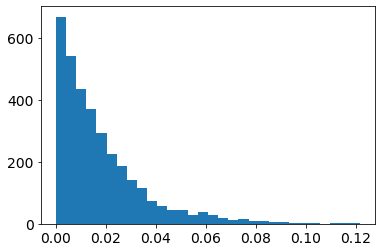

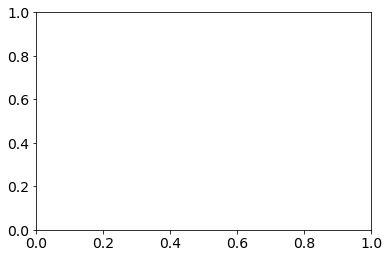

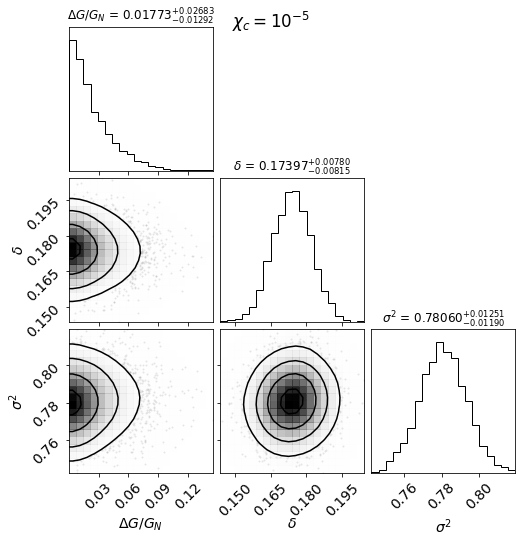

  0%|▏                                          | 4/918 [00:00<00:28, 32.59it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 2.1400990291831787e-06
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 1.2706411325868658e-06
10213-1902 [50] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 50.0 0.0 7.199757020802903e-07
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 6.408399679084227e-07
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0 0.0 2.331131484295451e-05
10218-12703 [50] [33

  1%|▌                                         | 12/918 [00:00<00:26, 34.20it/s]

10218-3704 [50] [-0.2423, -0.7324, -0.4111, -0.2502, -0.1409, -0.2076, -0.2494, -0.3265, -0.3433, -0.3506, -0.3606, -0.3689, -0.3645, -0.3466, -0.4111, -0.2985]
10218-3704 50.0 0.0 1.27459300285513e-06
10219-9102 [50] [1.3962, 1.1814, 0.7492, 0.4692, 0.3335, 0.2205, 0.1532, 0.1423, 0.1945, 0.153, 0.0798, 0.0216, -0.0715, -0.157, -0.0196, -0.0532, -0.0405]
10219-9102 50.0 0.0 6.874832161547999e-07
10220-12705 [50] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 50.0 0.0 7.899276940334098e-07
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 5.966653803628052e-06
10224-9101 [50] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 50.0 0.0 6.134040795405483e-07
10226-12704 [50] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694, 

  2%|▉                                         | 20/918 [00:00<00:27, 33.19it/s]

10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 1.460973975954525e-05
10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 1.1778219944458017e-05
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 1.1069342110137418e-05
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 50.0 0.0 1.1605398296352149e-06
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 7.322770612941228e-06
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.00

  3%|█▎                                        | 28/918 [00:00<00:26, 33.41it/s]

10495-12704 [50] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 50.0 0.0 9.348086018582091e-06
10495-12705 [50] [871.1598, 1245.0304, 1205.1955, 1347.7893, 1374.3588, 1517.2635, 1622.8998, 1633.9971, 1757.8692, 1799.4196, 1854.634, 1999.5551, 1849.1662, 1882.4866, 1807.1303, 1651.9125, 1681.1326, 1493.9167, 2771.4516, 2121.0254, 1992.5196]
10495-12705 50.0 0.0 5.219515240224034e-07
10495-3702 [50] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 50.0 0.0 1.3313150758582182e-06
10496-12704 [50] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268.8121, 253.915, 333.7881, 358.7629, 315.1183, 261.3063, 216.6964, 267.188, 258.5169, 256.0365, 248.4992]
10496-12704 50.0 0.0 1.2935958689577955e-06
10496-12705 [50] [-0.

  3%|█▍                                        | 32/918 [00:00<00:25, 34.30it/s]

10499-3702 [50] [-0.3822, -0.1753, 0.3237, 0.6092, 0.8357, 0.9307, 1.1046, 1.1845, 1.1657, 1.064, 1.005, 1.0954, 0.7875, 0.8892, 0.9769, 1.0508, 1.3156, 1.2283]
10499-3702 50.0 0.0 1.3183036666496244e-06
10499-3703 [50] [-0.0563, -0.0436, 0.024, 0.1267, -0.0775, -0.0664, 0.0153, -0.0929, -0.1244, -0.0851, -0.0939, -0.1131, -0.1033, -0.048, 0.0474, 0.0456, 0.0289, -0.0666, -0.0844, -0.5663]
10499-3703 50.0 0.0 1.4588451302160389e-06
10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 2.2455059491397513e-06
10500-12704 [12.091124120603014] [140.7935, 35.4055, 16.1502, 8.7997, 6.1202, 5.6067, 5.0715, 4.9205, 5.0767, 4.6234, 4.2501, 4.0673, 3.8962, 3.8831, 3.7867, 3.6009, 3.0687, 4.1948, 2.9642, 3.5448, 1.9938, -0.2753, 2.8838, 5.8145]
10500-12704 12.091124120603014 8.913345901487255e-08 3.6920091612364377e-07
10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 2.1382

  4%|█▊                                        | 40/918 [00:01<00:26, 32.91it/s]

10501-12704 [50] [1.3181, 1.9521, 1.9474, 1.8957, 2.0169, 2.066, 2.2805, 2.1361, 1.7635, 1.5052, 2.0197, 2.1387, 2.493, 1.9877, 1.7896, 1.1205, 1.6972, 2.5971]
10501-12704 50.0 0.0 2.1234951822117084e-06
10501-6101 [50] [54.152, 240.5257, 446.403, 593.882, 679.4829, 745.3089, 578.3118, 397.5307, 268.9797, 276.8619, 234.4717, 196.8602, 156.2454, 140.6324, 64.5922]
10501-6101 50.0 0.0 1.9998799207345573e-06
10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 50.0 0.0 1.3482613656008092e-06
10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 8.753089114351392e-07
10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 8.393617801900247e-06
10505-12704 [50] [0.62

  5%|██▏                                       | 48/918 [00:01<00:27, 31.82it/s]

10508-12703 [50] [0.5005, 0.4509, 0.1544, 0.1328, 0.1165, 0.1176, 0.065, 0.1329, 0.2506, 0.179, 0.1788, 0.1204, 0.0037, 0.016, -0.0301, -0.0876]
10508-12703 50.0 0.0 4.532948030784199e-06
10509-12703 [50] [1226.9439, 2166.987, 2538.8741, 2127.6504, 1648.0951, 1358.0909, 1167.9374, 985.8138]
10509-12703 50.0 0.0 1.7491324221495271e-06
10509-1901 [50] [88.4511, 296.1948, 449.6905, 409.1127, 761.2326, 574.7336, 678.7086, 604.9771, 571.2616, 614.5332, 408.9334, 441.3848, 355.292, 300.996, 243.919, 230.1612, 180.5992, 163.4382, 176.2701, 193.176, 205.4741]
10509-1901 50.0 0.0 5.034673480490804e-07
10509-6101 [50] [414.6573, 159.5598, 352.8386, 670.9188, 930.199, 434.1238, 984.9702, 921.6235, 784.8291, 825.2006, 827.4197, 661.5592, 624.5693, 894.3523, 620.0269, 747.519, 623.1939, 701.341, 577.342, 1031.0135, 622.2157, 697.4912, 668.4888, 271.226]
10509-6101 50.0 0.0 1.0102029211398214e-06
10511-12704 [50] [-0.0162, 0.2052, 0.0934, -0.0203, -0.0645, -0.0743, -0.1124, -0.1256, -0.1314, -0.1489

  6%|██▌                                       | 56/918 [00:01<00:27, 31.56it/s]

10512-12705 [50] [-0.9971, -0.9962, -0.9967, -0.9971, -0.9969, -0.9968, -0.9961, -0.9958, -0.9964, -0.9971, -0.9977, -0.9977, -0.9977, -0.9976, -0.998]
10512-12705 50.0 0.0 1.2913581862912658e-06
10512-9102 [50] [4147.3152, 2927.8473, 3245.8656, 2878.0674, 2617.7881, 2204.6977, 1695.8151, 1371.2689, 1298.2413, 1241.1228, 1357.9116, 1330.7104, 1714.839, 1930.3755, 2196.7284, 2401.8011, 2844.302, 3122.8481, 2925.4465]
10512-9102 50.0 0.0 1.1440921347934734e-06
10513-12702 [50] [-0.9916, -0.9877, -0.9855, -0.9802, -0.9787, -0.98, -0.9868, -0.9787, -0.862, -0.9802]
10513-12702 50.0 0.0 1.9613045235910157e-06
10514-6103 [50] [0.5999, 0.3982, 0.2747, 0.2749, 0.0781, 0.0617, 0.0681, -0.0189, -0.0377, -0.0578, -0.065, -0.0594, 0.0253, -0.0317, 0.1182, -0.1428, -0.1895, -0.2508, -0.2991, -0.355]
10514-6103 50.0 0.0 5.053339540110454e-07
10516-6104 [50] [0.3084, -0.237, -0.3593, -0.3575, -0.3434, -0.2974, -0.3603, -0.4386, -0.4629, -0.4919, -0.5092, -0.5031, -0.4319, -0.4152, -0.2877, -0.6618]
1

  7%|██▋                                       | 60/918 [00:01<00:27, 31.59it/s]

10518-12705 [50] [-0.1971, 0.2795, 0.1103, -0.0254, -0.0161, -0.0, 0.0208, 0.0333, 0.0023, -0.0238, -0.0544, -0.1612]
10518-12705 50.0 0.0 5.115764336519165e-06
10518-1902 [50] [-0.0105, 0.2572, 0.0495, 0.0308, 0.0287, -0.0677, -0.0841, -0.0885, -0.1994, -0.1432, -0.1195, -0.1634, -0.1173, -0.1219, -0.165, -0.1325, -0.1731]
10518-1902 50.0 0.0 2.1462076571841835e-06
10518-6102 [50] [-0.217, 1.2282, 0.4062, 0.3459, 0.382, 0.1799, 0.1478, 0.1175, 0.0995, 0.1358, 0.0812, 0.048, 0.0452, 0.0639, 0.0875, 0.0309, 0.0337, 0.0007, -0.0113, -0.1383]
10518-6102 50.0 0.0 1.2418989502965305e-06
10519-12704 [50] [-0.2611, 0.2686, 0.1702, 0.0601, 0.0584, 0.0258, -0.0515, -0.1077, -0.1123, -0.1006]
10519-12704 50.0 0.0 2.2549256148050745e-06
10519-6102 [50] [15.342, 9.7033, 5.6052, 3.8579, 2.785, 2.1688, 1.9416, 1.9483, 2.0544, 1.8028, 1.946, 2.1855, 2.046, 2.3544, 2.1616]
10519-6102 50.0 0.0 2.60996888569178e-06
10520-12704 [50] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.0366

  7%|███                                       | 68/918 [00:02<00:26, 31.51it/s]

10838-9101 [50] [-0.0928, 0.4421, 0.4896, 0.3922, 0.2667, 0.3141, 0.2582, 0.2949, 0.294, 0.2543, 0.2198, 0.1153, 0.0076, -0.0625, -0.124, -0.1198, -0.272, -0.3696, -0.3534, -0.3974, -0.2337]
10838-9101 50.0 0.0 1.7578838653193676e-06
10839-12705 [50] [0.5531, 0.4188, 0.6271, 0.6342, 0.4074, 0.3206, 0.1512, 0.1105, 0.1154, 0.1763, 0.2141, 0.3291, 0.2868, 0.1635, 0.0391, 0.4134, 0.1807]
10839-12705 50.0 0.0 3.1951084221219105e-06
10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712, 0.035, -0.0115, 0.0248, -0.0288, 0.0512, -0.0187, 0.0073, 0.0432, -0.0916, -0.1233, -0.1818, -0.1471]
10839-3704 50.0 0.0 1.3199614571493915e-06
10839-6101 [50] [244.3098, 615.0842, 876.8345, 1563.8627, 1705.1968, 1816.091, 1687.128, 1731.6052, 1640.9131, 1596.506, 1498.4971, 1406.0518, 671.6148, 995.7509]
10839-6101 50.0 0.0 1.1294338246826794e-06
10839-9101 [50] [2.1426, 2.2648, 0.9796, 0.8183, 0.5304, -0.0332, -0.1785, -0.3432, -0.3468, -0.4742, -0.4095, -0.6139, -0.5305, -0.616, -0.529, -0.5494, 0.8162, 3.2784

  8%|███▍                                      | 76/918 [00:02<00:26, 31.56it/s]

10842-3703 [50] [-0.6099, -0.8101, -0.8807, -0.9171, -0.9297, -0.9289, -0.9268]
10842-3703 50.0 0.0 6.788143114847642e-07
10842-9101 [50] [-0.987, -0.9943, -0.9967, -0.9976, -0.9979, -0.998, -0.9982, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9981, -0.998, -0.9982, -0.9979, -0.9982, -0.9983]
10842-9101 50.0 0.0 9.965216306480232e-07
10845-12702 [50] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-12702 50.0 0.0 1.071418423546362e-06
11004-12705 [50] [-0.8497, -0.6991, -0.5203, -0.3493, -0.2406, -0.2193, -0.1954, -0.1792, -0.1842, -0.1767, -0.1858, -0.1781, -0.195, -0.2173, -0.2294, -0.167, -0.2434, -0.1514, -0.3351, -0.2129]
11004-12705 50.0 0.0 8.023750208913286e-07
11004-3703 [50] [5607.0165, 6199.0745, 5122.0907, 4588.5334, 3798.1606, 3256.1827, 2909.7374, 2623.1995, 2081.3703, 1622.0266, 1252.6703, 1054.2993, 797.551, 805.4299, 667.6425]
11004-3703 50.0 0.0 7.96728274877073e-07
11004-6104 [50] [0.1363, 0.6537, 0.73

  9%|███▊                                      | 84/918 [00:02<00:25, 32.42it/s]

11009-6102 [50] [0.2368, -0.3064, 0.0765, 0.1736, 0.0574, 0.1163, 0.1754, 0.2052, 0.2777, 0.3634, 0.3506, 0.3192, 0.3455, 0.323, 0.4447, 0.1481, 0.2577, -0.1338, 0.037, 0.1218, 0.8549, -0.5202]
11009-6102 50.0 0.0 6.852037324594136e-07
11010-6104 [50] [669.1593, 612.5725, 580.2933, 433.0387, 377.072, 315.1925, 269.3918, 266.5579, 267.4688, 253.2676, 240.0639, 221.1944, 344.4065]
11010-6104 50.0 0.0 3.252746588125059e-06
11010-9101 [50] [2.5718, 0.9269, 0.2901, 0.1931, 0.0011, -0.0504, -0.0935, -0.075, 0.0093, 0.0203, 0.0025, -0.0251, -0.0362, 0.0004, 0.0161, -0.0012, -0.102, -0.364, -0.4377]
11010-9101 50.0 0.0 9.478873337546244e-06
11011-12703 [50] [9.8651, 35.0102, 40.3579, 54.0601, 192.4013, 365.0512, 378.092, 411.2362, 282.7202, 230.5846, 329.2445, 263.6472, 244.1501]
11011-12703 50.0 0.0 1.5787700535120246e-06
11012-12705 [50] [0.2329, 0.5509, 0.2517, 0.0195, 0.0174, -0.0704, -0.1937, -0.145, -0.249, -0.0592, -0.302, -0.1828, -0.2112]
11012-12705 50.0 0.0 1.2081382933094835e-05
11

 10%|████▏                                     | 92/918 [00:02<00:26, 31.52it/s]

11013-12702 [50] [0.7904, 0.6387, 0.0779, 0.1203, 0.0592, -0.004, -0.016, 0.0128, 0.0194, 0.059, 0.0663]
11013-12702 50.0 0.0 3.529307832919284e-06
11013-1902 [50] [0.7893, 0.6453, 0.5024, 0.4895, 0.4034, 0.2175, 0.0455, -0.0103, 0.0142, -0.2569, -0.0412, -0.2183, -0.1712, -0.0824, -0.3609, -0.2323, -0.3117]
11013-1902 50.0 0.0 4.3451156483930454e-06
11013-3701 [50] [0.785, 0.6845, 0.2024, 0.0457, 0.0342, 0.02, -0.06, -0.0296, -0.0379, -0.1677]
11013-3701 50.0 0.0 2.4535132630190144e-06
11013-3702 [50] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 50.0 0.0 5.502318300040492e-06
11013-6101 [50] [0.3389, -0.3422, -0.154, -0.2894, -0.4104, -0.4385, -0.4897, -0.4798, -0.43, -0.3971, -0.3753, -0.3775, -0.3376, -0.2419, -0.1243, 0.0068, -0.1557, 0.0318, -0.0178, 0.2532, 0.5345, 0.5099]
11013-6101 50.0 0.0 1.7680877695450327e-06
11017-12703 [50] [0.0185, 0.3093, 0.3468, 0.2632, 0.2308, 0.2072, 0.1992, 0.215, 0.2444, 0.2273, 0.053, -0.0123, 0.1078, -0.0553]
11017-1270

 10%|████▍                                     | 96/918 [00:02<00:26, 31.13it/s]

11017-6103 [50] [-0.3235, -0.3265, -0.3479, -0.2253, -0.2261, -0.1769, -0.1311, -0.1075, -0.0747, -0.0989, -0.1378, -0.1695, -0.1257, -0.174, -0.178, -0.0714, -0.0163, 0.0028, 0.2262, -0.2731]
11017-6103 50.0 0.0 5.981234779921552e-06
11017-9101 [50] [-0.5273, 0.0425, 0.2188, 0.1666, 0.07, 0.0407, -0.0503, -0.1282, -0.2004, -0.2244, -0.1722, -0.1497, -0.0815, -0.0967, -0.1443, -0.1476, -0.1864, -0.1536, -0.2264, -0.18]
11017-9101 50.0 0.0 1.0484650546416172e-06
11018-12702 [50] [-0.9839, -0.9926, -0.9927, -0.9922, -0.9923, -0.9935, -0.9932, -0.9925, -0.9931, -0.994, -0.9941]
11018-12702 50.0 0.0 1.5428384015384514e-06
11018-12704 [50] [-0.9989, -0.9988, -0.9986, -0.9987, -0.9988, -0.999, -0.999, -0.9991, -0.9991, -0.9987, -0.9984, -0.9975, -0.9987, -0.9989]
11018-12704 50.0 0.0 1.6724932743451357e-06
11018-3702 [50] [0.6083, 0.007, 0.0959, 0.33, 0.5514, 0.4356, 0.3654, 0.3085, 0.3057, 0.287, 0.3004]
11018-3702 50.0 0.0 9.81387404997692e-07
11018-3703 [50] [-0.5454, 0.4164, 0.6741, 0.58

 11%|████▋                                    | 104/918 [00:03<00:26, 31.19it/s]

11019-12702 [50] [0.0142, 0.2516, 0.1906, 0.1378, 0.0877, -0.003, 0.0993, 0.0958, 0.1065, 0.1232, 0.2086, 0.1132, 0.0357, -0.0115, -0.014, 0.0302, -0.0875, -0.1071]
11019-12702 50.0 0.0 1.5787557306825757e-06
11019-12703 [50] [-0.4993, -0.4671, -0.3698, -0.2654, -0.2024, -0.2445, -0.2033, -0.2117, -0.2752, -0.2285, -0.2102, -0.0702, -0.1699, 0.0858, -0.1757, -0.2987]
11019-12703 50.0 0.0 8.954440396382405e-06
11019-12705 [50] [0.9395, 1.6844, 1.8269, 0.8562, 0.7011, 1.016, 1.1247, 1.0992, 1.0844]
11019-12705 50.0 0.0 5.0681396133689974e-06
11019-3701 [50] [2.5964, 1.3616, 0.9142, 0.3658, 0.0143, -0.1157, -0.1148, -0.102, -0.0691, -0.1802, -0.166, -0.2893, -0.0849]
11019-3701 50.0 0.0 6.982654117497853e-06
11021-1902 [50] [5.9017, 3.1432, 2.8491, 1.9605, 1.7177]
11021-1902 50.0 0.0 3.8913802465563535e-06
11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 1.2555981871844397e-0

 12%|█████                                    | 112/918 [00:03<00:26, 30.70it/s]

11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 6.134624574339454e-05
11742-12704 [50] [0.6702, -0.5312, -0.3481, 0.0047, 0.1348, 0.415, 0.2787, 0.5138, -0.0348]
11742-12704 50.0 0.0 8.84727058620668e-07
11743-1901 [50] [-0.5717, -0.3943, -0.5273, -0.3736, -0.306, -0.392, -0.3766, -0.4151, -0.3665, -0.4111, -0.4236, -0.3424, -0.3877, -0.3594, -0.291, -0.4952, -0.6018]
11743-1901 50.0 0.0 7.967249176857379e-06
11744-9102 [50] [-0.6298, 0.0464, 0.3943, 0.6247, 0.4097, 0.3518, 0.3414, 0.4046, 0.4742, 0.4313, 0.3693, 0.3275, 0.2214, 0.1278, 0.0812, 0.4043, 0.1792, -0.1336]
11744-9102 50.0 0.0 1.5662890075587002e-06
11745-1902 [50] [1.185, 0.9719, 0.4625, 0.4231, 0.2188, 0.1795, 0.0428, 0.0263, -0.0784, -0.2371, 0.1632]
11745-1902 50.0 0.0 4.522317086068079e-06
11745-6104 [50] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.852

 13%|█████▏                                   | 116/918 [00:03<00:26, 30.10it/s]

11746-3703 [50] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 50.0 0.0 3.936054108513644e-06
11746-3704 [50] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 50.0 0.0 5.161313629885027e-07
11746-9102 [50] [-0.478, -0.2133, -0.2528, -0.1774, -0.2077, -0.2266, -0.2099, -0.2691, -0.1996, -0.2114, -0.1249, -0.1799, -0.1765, -0.1376, -0.2784, -0.2323, -0.1941, -0.3005, -0.2047, -0.3235, -0.1159, 0.1709]
11746-9102 50.0 0.0 6.7243067979653085e-06
11747-12702 [50] [-0.4876, -0.2412, -0.0165, -0.0887, -0.0931, -0.0756, -0.076, -0.0313, -0.0043, 0.0037, -0.0318, -0.1133, 0.1257, -0.1019, 0.1921, -0.2837, -0.0753]
11747-12702 50.0 0.0 2.9237127388341935e-05
11749-12701 [50] [-0.6821, -0.1137, 0.255, 0.1029, 0.0811, -0.0849, -0.2182, -0.1487, -0.1095, -0.043

 13%|█████▍                                   | 123/918 [00:03<00:26, 29.74it/s]

11749-3701 [50] [618.0455, 872.9003, 1483.1859, 1615.2011, 1553.7949, 1334.0598, 1385.5396, 1283.8547, 1216.0833, 1294.494, 1472.7433, 1080.4933, 1346.7897, 1196.9726, 1091.8413, 1216.7304, 927.7028, 363.0292, 281.9853, 551.8779, 169.9359, 54.7426, 122.374, 379.7425, 27.1507]
11749-3701 50.0 0.0 1.7169485448298928e-06
11750-12701 [50] [0.4224, 0.3089, 0.0791, 0.0892, 0.2329, 0.2222, 0.1114, 0.03, 0.0196, 0.0027, 0.0313, 0.0827, 0.0275, 0.3095]
11750-12701 50.0 0.0 1.8511133376252873e-06
11750-3701 [50] [1.5964, 1.8766, 1.9419, 1.999, 1.4725, 1.2873, 1.1333, 0.934, 0.9463, 0.8918, 0.7347, 0.8508, 0.6677, 0.4619, 0.3762, 0.1866, 0.0367, 0.0915, 0.0086, 0.4665]
11750-3701 50.0 0.0 8.089710124827619e-07
11750-6103 [50] [6.303, 1.7001, 0.3933, 0.5417, 0.5248, 0.6298, 0.7207, 0.7282, 0.8046, 0.5691, 0.3659, 0.4083, 0.4745, 0.6207, 0.9957, 2.1073, 7.7724]
11750-6103 50.0 0.0 2.1277370698005928e-06
11750-9101 [50] [13.4461, 9.2464, 8.3896, 5.4399, 4.9554, 3.0033, 3.1782, 2.4566, 2.5343, 2.0961

 14%|█████▉                                   | 132/918 [00:04<00:26, 29.45it/s]

11751-6102 [50] [0.3738, 0.0535, 0.3785, 0.2124, 0.1333, 0.0258, -0.0223, -0.094, -0.1099, -0.1415, -0.1724, -0.2013, -0.1841, -0.253, -0.3949, -0.2255, -0.2141, -0.2775]
11751-6102 50.0 0.0 1.8347874885166453e-06
11753-3703 [50] [0.2801, 0.7604, 0.7391, 0.5795, 0.35, 0.1693, 0.0874, 0.0586, 0.0152, -0.0057, -0.0099, -0.0594, -0.1073, -0.139, -0.1496]
11753-3703 50.0 0.0 2.248476381493182e-06
11753-6104 [50] [1.7058, 1.5787, 1.7231, 1.492, 1.0043, 0.8699, 0.6579, 0.5905, 0.5042, 0.4712, 0.4504, 0.6153, 0.6589, 0.6817, 0.5206, 0.5457, 0.5195, 0.692]
11753-6104 50.0 0.0 1.4125699072480202e-06
11754-1901 [50] [-0.2402, -0.5388, -0.5143, -0.4398, -0.487, -0.4664, -0.4721, -0.5334, -0.5004, -0.4954, -0.6115, -0.5884]
11754-1901 50.0 0.0 2.454373651492681e-06
11755-12701 [50] [-0.773, -0.7865, -0.7717, -0.7522, -0.7475, -0.7159, -0.7048, -0.6936, -0.7373, -0.7183, -0.7382, -0.7769, -0.6833, -0.7924, -0.5695, -0.681, -0.5512]
11755-12701 50.0 0.0 2.5934962836030904e-06
11755-6101 [50] [-0.009

 15%|██████                                   | 136/918 [00:04<00:26, 29.61it/s]

11758-3701 [50] [-0.3091, 0.0326, 0.2349, 0.1141, 0.0113, 0.06, -0.0268, -0.1507, -0.2171, -0.1994, -0.1587, -0.1557, -0.1574, -0.1614, -0.0618]
11758-3701 50.0 0.0 1.157098338568574e-06
11758-3702 [50] [-0.544, -0.1141, 0.0167, 0.1028, 0.0854, -0.0041, -0.0149, 0.0406]
11758-3702 50.0 0.0 3.01650618413618e-06
11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 50.0 0.0 1.6770083306574942e-06
11759-6102 [50] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, -0.981]
11759-6102 50.0 0.0 6.806119499193828e-07
11760-12703 [50] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0.539, 0.1155, 0.1223, 0.309]
11760-12703 50.0 0.0 7.311867452036564e-07
11760-6101 [50] [0.4533, -0.0157, 0.5654, 0.502, 0.3995, 0.359, 0.3287, 0.2964, 0.2063, 0.2512, 0.2686, 0.2421, 0.2368, 0.1884, 0

 16%|██████▍                                  | 144/918 [00:04<00:24, 30.99it/s]

11760-9102 [50] [-0.8049, -0.6427, -0.2931, -0.1213, 0.1899, 0.0235, 0.108, 0.1381, 0.1732, 0.1865, 0.1624, 0.1963, 0.1218, 0.1215, 0.1223, 0.2636, 0.046, 0.5962, 0.1808, 0.9922, 2.2582]
11760-9102 50.0 0.0 1.0662796235953728e-06
11761-12702 [50] [-0.6826, -0.6017, -0.2216, -0.1122, -0.0329, -0.02, -0.0711, -0.0937, -0.0782, -0.098, -0.1546, -0.1024, -0.1043, -0.0648, -0.2102, -0.3314, -0.2483]
11761-12702 50.0 0.0 8.263518619694428e-06
11761-12703 [50] [0.4093, 0.08, -0.0588, -0.0478, 0.0006, -0.0009, -0.0617, -0.1284, -0.1046, -0.1135, -0.1247, -0.1623, -0.2191, -0.3477]
11761-12703 50.0 0.0 9.38797252684172e-06
11761-12704 [50] [-0.1205, 0.9952, 0.5814, 0.2296, 0.1208, 0.126, 0.1222, 0.1041, 0.1683, 0.1996, 0.1448, 0.1188, 0.0574, 0.0394, -0.008, -0.026, -0.0331]
11761-12704 50.0 0.0 5.573498261524502e-06
11761-12705 [50] [6.8127, 3.6941, 2.4845, 1.3644, 0.5363, 0.2844, 0.104, -0.1]
11761-12705 50.0 0.0 3.722945597286098e-06
11823-9101 [50] [15949.1976, 8800.0053, 8323.3916, 4811.16

 17%|██████▊                                  | 152/918 [00:04<00:25, 30.08it/s]

11828-12703 [50] [-0.5587, -0.2913, 0.1844, 0.3112, 0.2627, 0.2124, -0.0354, -0.0957, -0.1295, -0.1601, -0.0565, -0.1246, 0.0413]
11828-12703 50.0 0.0 1.9937440760617736e-06
11830-12701 [50] [-0.9938, -0.9825, -0.9834, -0.9912, -0.9934, -0.9941, -0.9946, -0.9933, -0.9936, -0.9951, -0.9951, -0.9944, -0.9947, -0.9932, -0.9955, -0.9854, -0.997, -0.9939, -0.9962]
11830-12701 50.0 0.0 2.046022757625972e-06
11830-12703 [50] [-0.4776, 0.0437, 0.1582, -0.0709, -0.1607, -0.0754, 0.055, 0.2665, 0.1845, 0.03, 0.0663, -0.087, -0.2185, -0.1589, 0.0536, -0.3722]
11830-12703 50.0 0.0 3.6555335991933285e-06
11830-3702 [50] [1.2195, 0.9978, 0.6546, 0.4726, 0.5057, 0.555, 0.4749, 0.3884, 0.4626]
11830-3702 50.0 0.0 1.955426155732402e-06
11830-6104 [50] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.0353, -0.2063, -0.258, -0.2347, -0.2692, -0.3985]
11830-6104 50.0 0.0 1.5844537984806386e-06
11831-12703 [50] [0.4472, 0.0224, 0.062, 0.158, -0.0429, -0.0922, -0.1252, -0.188, 

 17%|███████                                  | 159/918 [00:05<00:25, 29.27it/s]

11831-6101 [50] [-0.9875, -0.994, -0.9968, -0.9973, -0.9967, -0.9975, -0.9969, -0.9978, -0.9979, -0.9971, -0.9984, -0.9986, -0.9985, -0.9974]
11831-6101 50.0 0.0 4.940054725191822e-07
11831-6102 [50] [1.041, 0.6096, 0.4053, 0.165, 0.0902, 0.1922, 0.1873, 0.1187, 0.1055, 0.0085, -0.1108, -0.0737]
11831-6102 50.0 0.0 2.407308725625982e-06
11833-9102 [50] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.2658, -0.2176, -0.1929, -0.2471, -0.3166]
11833-9102 50.0 0.0 1.915515718041702e-06
11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 1.7546679761740455e-05
11836-1902 [50] [0.7026, 1.2767, 1.1865, 1.1009, 0.973, 0.9921, 0.7024, 0.7206, 0.623, 0.6145, 0.5505, 0.5955, 0.6037, 0.4142, 0.4147]
11836-1902 50.0 0.0 8.2382

 18%|███████▎                                 | 165/918 [00:05<00:26, 28.54it/s]

11838-12703 [50] [144.9042, 254.2159, 538.0129, 911.0748, 1089.8377, 1111.2623, 1284.2649, 1228.3752, 1345.2496, 1400.7846, 1427.4787, 1434.5371, 1257.47, 1184.9615, 998.2342, 830.6266, 670.98, 596.3078, 488.5417, 423.536, 329.6538, 32.3109, 5.6457, 31.8479]
11838-12703 50.0 0.0 2.036514750343439e-06
11838-3702 [50] [0.536, 0.7094, 0.6061, 0.6555, 0.6466, 0.6204, 0.5689, 0.587, 0.6487, 0.6337, 0.5876, 0.5059, 0.4509, 0.4328, 0.3954, 0.396]
11838-3702 50.0 0.0 2.0513707560258254e-06
11838-6103 [50] [201.1554, 531.7007, 967.9199, 1125.4471, 1324.9799, 1297.8083, 1279.6033, 1183.901, 1134.9301, 1132.4611, 1104.3121, 1011.7157, 1287.8266]
11838-6103 50.0 0.0 1.911795609936702e-06
11838-9101 [50] [11.4727, 10.3246, 9.7757, 7.6641, 6.3263, 7.7985, 4.6854, 6.1379, 3.8072, 5.5203, 3.0518, 3.9759, 1.4403, 2.8333, 2.6956, 2.5542]
11838-9101 50.0 0.0 1.8715642894308215e-06
11865-12702 [50] [-0.057, -0.0512, 0.0778, -0.0002, -0.0743, -0.0834, -0.0854, 0.0083, -0.0154, -0.0332, -0.07, -0.1612, -0.2

 19%|███████▋                                 | 171/918 [00:05<00:26, 28.41it/s]

11865-1901 [50] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 50.0 0.0 1.2616616143785844e-06
11865-1902 [50] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0.4429]
11865-1902 50.0 0.0 1.6397279896353098e-06
11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 1.5408140857010264e-06
11865-9102 [50] [-0.467, -0.4695, -0.4789, -0.5286, -0.6182, -0.6445, -0.6408, -0.6047, -0.6031, -0.6243, -0.655, -0.6895, -0.6998, -0.5904, -0.6729, -0.6983]
11865-9102 50.0 0.0 6.728182297647591e-07
11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2771, 0.298, 0.3814, 0.3262, 0.2102, 0.3978, 0.4467, 0.2866, 0.1214, 0.2202, 0.1346, 0.4041]
11867-6104 50.0 0.0 5.00773974194669e-06
11867-9101 [50] [0.9073, 0.3027, 0.1546, 0.1123, 0.0285, 0.0159, -0.0244, 0.0205, 0.0824, 0.1908, 0.2079, 0.2195, 0.3058, 0.2425, 0.1871, 0.3056]
11867-9101 50.0 0.0 2.182478429226657e-06


 19%|███████▉                                 | 178/918 [00:05<00:24, 29.84it/s]

11868-12703 [50] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 5.400782030535837e-06
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 1.599236856100877e-05
11871-6103 [50] [0.7182, 0.8575, 0.776, 0.4737, 0.2556, 0.1173, 0.1395, 0.111, 0.0842, 0.0381, 0.0003, -0.0281, -0.0195, -0.044, -0.0588, -0.2086, -0.132, -0.377]
11871-6103 50.0 0.0 1.689063005716313e-05
11940-1902 [50] [-0.0835, 0.1518, 0.1321, 0.0182, -0.0843, -0.1452, -0.1779, -0.1993, -0.1955]
11940-1902 50.0 0.0 7.932023642311553e-06
11940-3703 [4.917706532663317] [1.1615, 1.5645, 1.5154, 1.5213, 1.3625, 1.1856, 0.9977, 0.7191, 0.6591, 0.6153, 0.3767, 0.433, 0.6417, 0.1616, 0.444, 0.2018, 0.0806, 0.2143, 0.1328]
11940-3703 4.917706532663317 1.1630050333142295e-07 3.41741483207164e-07
11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, 

 20%|████████▏                                | 184/918 [00:05<00:25, 28.67it/s]

11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 5.990416514564107e-05
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389.9946, 2439.1642, 2636.587, 2485.7262, 2056.7992, 1736.2622, 1623.5415, 1192.5228, 781.8483, 546.9719, 175.874]
11942-12704 50.0 0.0 2.7684150401802833e-05
11942-6104 [50] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 50.0 0.0 5.936359178679841e-07
11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.0425, -0.0331, -0.0546, -0.0982, -0.1371, -0.164, -0.179, -0.1863, -0.172, -0.1572, -0.1563, -0.1648, -0.1726, -0.27]
11943-3703 50.0 0.0 3.498742737578343e-05
11944-12701 [50] [-0.3604, -0.3617, -0.4276, -0.5869, -0.6347, -0.6283, -0.548, -0.5758, -0.5204, -0.4847, -0.4769, -0.4857, -0.5345, -0.6334, -0.5353, -0.5098]
11944-12701 50.0 0.0 3.325

 21%|████████▍                                | 190/918 [00:06<00:25, 28.01it/s]

11945-6101 [50] [0.2057, 0.8606, 0.9637, 0.605, 0.4694, 0.2734, 0.2029, 0.1332, 0.0558, -0.0105, 0.0015, 0.0011, -0.0038, -0.016, 0.0504, -0.0338]
11945-6101 50.0 0.0 1.0641822234241067e-05
11945-6102 [50] [3.5224, 2.2109, 1.4349, 1.0152, 0.7457, 0.4864, 0.2556, 0.1192, 0.0508, 0.0117, -0.0209, -0.0683, -0.158, -0.0976, -0.2012]
11945-6102 50.0 0.0 6.0267568475739465e-06
11947-6103 [50] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 50.0 0.0 2.8675603715983947e-06
11949-12701 [50] [1.1975, 0.3408, 0.1441, 0.1243, 0.0225, 0.0003, 0.0028, 0.027, 0.0197, 0.0192, -0.0295, -0.0839]
11949-12701 50.0 0.0 4.058483736827493e-06
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 2.1064481331144003e-05
11954-12704 [50] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453, 0.1801,

 22%|████████▊                                | 198/918 [00:06<00:22, 32.56it/s]

11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.2778]
11954-3703 50.0 0.0 1.0126015317423275e-05
11954-9101 [50] [-0.9882, -0.9937, -0.9946, -0.9965, -0.9974, -0.9972, -0.997, -0.9969, -0.997, -0.9974, -0.9978, -0.9979, -0.9973, -0.9971, -0.9976, -0.9966]
11954-9101 50.0 0.0 9.076738214890644e-06
11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 6.706663398006499e-06
11956-12702 [50] [5.6953, 5.0804, 3.2564, 2.1056, 1.2622, 0.6457, 0.4602, 0.5373, 0.9503, 3.7649, 5.1679]
11956-12702 50.0 0.0 5.1347908661249925e-06
11956-12705 [50] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 0.2419, 0.2565, 0.3525, 0.1776, 0.103, 0.3387, 0.3814, 0.7221, 0.77]
11956-12705 50.0 0.0 7.994023672661072e-07
11957-12704 [50] [-0.3492, 0.7667, 0.6853, 0.5861, 0.3661, 0.189, 0.1584, 

 23%|█████████▎                               | 209/918 [00:06<00:16, 43.08it/s]

11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 2.667537417621488e-06
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 50.0 0.0 8.062802652285794e-06
11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.9843, 0.6333, 0.3517, 0.1829, 0.1258, 0.0956, 0.1424, 0.1021, 0.028, 0.1221]
11965-9102 50.0 0.0 3.770321286305167e-06
11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 1.4071266877394847e-05
11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.8986, 3.5843, 4.0724, 0.9129, 2.9875, 0.7205, 2.6408, 1.2362]
11969-6101 50.0 0.0 1.7040427269042788e-05
11970-12703 [0.5497] [-0.4888, -0.3498, -0.0561, 0.1594, 0.1669]
11970-12703 0.5497 1.2

 24%|█████████▊                               | 219/918 [00:06<00:15, 43.98it/s]

11975-3703 [50] [-0.2597, -0.0329, 0.0768, 0.0833, 0.1048, 0.0682, 0.0342, -0.0156, -0.0756, -0.093, -0.0695, -0.0466, 0.0656, -0.0085, 0.1237, 0.1334, 0.0646]
11975-3703 50.0 0.0 4.012607125242429e-06
11975-6104 [50] [1.0196, 1.2709, 1.5062, 1.1104, 0.9965, 0.7778, 0.776, 0.6311, 0.7603, 0.6278, 0.6208, 0.5151, 0.5172, 0.5343, 0.2326, 0.5012, 0.187, 0.4522, 0.1401, 0.1327]
11975-6104 50.0 0.0 3.1230631069634466e-06
11976-12703 [50] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 50.0 0.0 3.0821957694080095e-06
11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 50.0 0.0 1.2421604576387693e-06
11978-12705 [50] [0.0184, 0.0968, 0.695, 0.4819, 0.223, 0.1168, 0.1458, 0.1604, 0.1304, 0.1363, 0.1451, 0.1188, 0.0734, 0.0413, 0.0374, 0.0059, 0.0584, 0.0708]
11978-12705 50.0 0.0 1.463183314523463e-06

 25%|██████████                               | 225/918 [00:06<00:15, 45.91it/s]

11979-9102 [50] [0.6334, -0.323, -0.1351, -0.0857, 0.0053, 0.0302, 0.0467, 0.0752, 0.0566, 0.0459, 0.0116, 0.0269, 0.0046, -0.0156, -0.091, -0.1558, -0.3105, -0.4242, -0.5324]
11979-9102 50.0 0.0 1.7546071307278026e-06
11981-12702 [4.71676783919598] [293.567, 690.112, 683.5389, 617.2849, 490.646, 374.3616, 455.8674, 450.3051, 457.9927, 478.543, 404.234]
11981-12702 4.71676783919598 2.9088982721322886e-08 4.296626473429003e-07
11981-12704 [50] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]
11981-12704 50.0 0.0 1.7743607825283727e-06
11981-9102 [50] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188, -0.1444, -0.128, -0.1812, -0.1904, -0.2284, -0.2044, -0.2061, -0.1486, -0.2345, -0.2114, 0.0329, 0.7603]
11981-9102 50.0 0.0 7.289691678775748e-06
11982-12704 [50] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.15

 26%|██████████▌                              | 236/918 [00:07<00:14, 47.00it/s]

12067-12703 [50] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
12067-12703 50.0 0.0 1.6098063271458362e-06
12067-12705 [50] [0.4291, 1.3434, 2.0219, 1.7622, 1.0305, 0.7583, 0.4763, 0.1261, 0.0511, 0.0662, 0.1502, 0.2361, 0.2324, 0.212, 0.3434]
12067-12705 50.0 0.0 1.2056118832489072e-06
12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 4.0827927039050716e-05
12068-6104 [50] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 50.0 0.0 4.268961027202755e-06
12069-12704 [50] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 50.0 0.0 1.8582710026112032e-06
12069-12705 [50] [1.7332, 1.

 27%|███████████                              | 247/918 [00:07<00:14, 47.19it/s]

12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.3083, 398.9949, 258.1108, 178.8144, 146.4641, 210.3609, 51.4796, 32.8354, 22.052]
12071-3704 50.0 0.0 1.4137932375022487e-06
12075-12704 [50] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 50.0 0.0 3.1531178999993987e-06
12078-12703 [50] [0.3298, 0.5608, 0.2182, 0.3221, 0.2303, 0.0896, 0.0846, 0.2051, 0.3186, 0.33, 0.2532]
12078-12703 50.0 0.0 1.4794449849421146e-06
12078-6103 [50] [1.9637, 5.3953, 4.122, 4.276, 4.2033, 3.4926, 3.3028, 3.2038, 3.1762, 3.0769, 2.868, 2.5911, 2.6527, 2.4952, 2.6226, 2.6979, 2.1328, 1.6158, 1.3218, 1.8508]
12078-6103 50.0 0.0 9.372006475570588e-07
12079-12705 [29.951204020100505] [5.9457, 5.134, 4.915, 2.376, 2.7696, 2.3345, 1.3415, 1.441, 1.4148, 0.8317, 1.0553, 1.0687, 0.9662, 0.8766, 1.1537, 1.4538, 0.8336]
12079-12705 29.951204020100505 4.67379090333429e-08 4.1194391301633257e-07
12080-12704

 28%|███████████▍                             | 257/918 [00:07<00:15, 42.74it/s]

12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-12705 50.0 0.0 1.070066332341134e-06
12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.419, 0.387, 0.4139, 0.5272, 0.4564, 0.6029, 0.4957, 0.5971, 0.6267, 0.5749, 0.7061, 0.6081, 0.5243, 0.4383, 0.5097, 0.4647, 0.2768, 0.3996, 0.231, 0.2274, 0.4698, 0.2204, 0.2727]
12084-1901 50.0 0.0 2.486794739488558e-06
12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
12084-3702 50.0 0.0 1.178299924896883e-06
12084-3703 [50] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.866, 9.9199, 8.0438, 7.1191, 7.1184, 4.9585, 5.2578]
12084-3703 50.0 0.0 2.3854353455073925e-06
12084-6104 [50] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.0

 29%|███████████▉                             | 267/918 [00:07<00:15, 42.05it/s]

12088-12705 [50] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-12705 50.0 0.0 1.2512096349014556e-06
12088-9101 [50] [1.3886, 1.0744, 0.6164, 0.1772, -0.0928, -0.1728, -0.2424, -0.3552, -0.3861, -0.4243, -0.4358, -0.4341, -0.4454, -0.4408]
12088-9101 50.0 0.0 4.754337630272568e-06
12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-12702 50.0 0.0 5.526483529005612e-07
12089-12704 [50] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 50.0 0.0 1.0272296821679514e-05
12089-1901 [50] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 50.0 0.0 2.101172702465053e-05
12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722,

 30%|████████████▏                            | 272/918 [00:08<00:15, 41.75it/s]

12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 2.655433806585818e-06
12483-12703 [50] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -0.0898]
12483-12703 50.0 0.0 2.0702715308223785e-06
12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 3.3217856910901294e-06
12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 1.7785709313289528e-06
12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 50.0 0.0 2.475842592868114e-06
12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696

 31%|████████████▌                            | 282/918 [00:08<00:15, 40.52it/s]

12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0.0863]
12506-12701 50.0 0.0 6.955574073463005e-06
12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0.0 3.018153056996201e-06
12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0 0.0 5.883870017231771e-07
12512-12702 [50] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 50.0 0.0 8.120977738705392e-07
12514-12702 [50] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 50.0 0.0 6.

 32%|█████████████                            | 292/918 [00:08<00:15, 40.15it/s]

12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.1091]
12518-9101 50.0 0.0 1.3760871519083648e-06
12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 5.174051057302118e-06
12620-6104 [50] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 50.0 0.0 1.088911915167212e-06
12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 3.2695085694865144e-06
12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903, -0.5645]
12621-12705 50.0 0.0 1.174529475167667e-06
12621-6103 [50] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -

 32%|█████████████▎                           | 297/918 [00:08<00:18, 33.24it/s]

12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 1.0032266953621016e-05
12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 4.704885188806404e-06
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 7.389522230562815e-06
12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 2.374015499201033e-05
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 1.547479911621382e-05


 33%|█████████████▍                           | 301/918 [00:08<00:20, 29.50it/s]

12679-12701 [50] [-0.4106, -0.1602, -0.09, 0.0292, -0.1142, -0.1585, -0.1702, -0.2231, -0.1617, -0.1473, -0.165, -0.0765, -0.2919, -0.3168, -0.5268, -0.1813, 0.1098, -0.9954]
12679-12701 50.0 0.0 4.898068562200567e-07
12679-1902 [50] [0.6115, 0.2127, 0.2343, 0.0811, 0.186, 0.028, 0.0072, -0.086, -0.1377, -0.1341, -0.1745, -0.1741, -0.1973, -0.2294, -0.2344, -0.1462, -0.1584]
12679-1902 50.0 0.0 2.2870472650179373e-06
12682-12705 [50] [211.5682, 164.2949, 154.5208, 172.1809, 188.4287, 205.8053, 188.0827, 175.7022, 171.521, 162.4793, 163.9925, 122.1814, 128.2861, 178.1773, 150.2355, 110.4372, 181.1071]
12682-12705 50.0 0.0 3.6764270259046174e-06
7443-12703 [50] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 50.0 0.0 7.769513578046179e-07
7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1

 34%|█████████████▊                           | 308/918 [00:09<00:23, 25.64it/s]

7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 1.1990281519303624e-06
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.0333, -0.0403, -0.0345, -0.091, -0.0525, -0.2174, -0.2135, -0.5859, -0.4094]
7443-9101 50.0 0.0 9.123806162293696e-07
7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.1269]
7495-12702 50.0 0.0 5.118408571167016e-06
7495-12703 [50] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 50.0 0.0 4.444993702350873e-06
7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 4.629553955692342e-06


 34%|█████████████▉                           | 311/918 [00:09<00:24, 24.40it/s]

7815-12705 [50] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 50.0 0.0 6.391984747539029e-07
7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 1.391791019843743e-06
7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 5.819844353632675e-07
7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 2.6851676728144927e-06
7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 7.474412979

 35%|██████████████▏                          | 317/918 [00:09<00:26, 22.85it/s]

7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 2.9902820922067017e-06
7958-6101 [50] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 50.0 0.0 5.827226645921203e-07
7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 4.240807018766723e-06
7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 4.448364231427384e-06
7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 3.844055505912389e-06


 35%|██████████████▍                          | 323/918 [00:09<00:27, 21.81it/s]

7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 5.0212610445932765e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 5.971534008520097e-06
7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 4.506441109004825e-06
7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 6.621171545451346e-07
7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 3.694287240929926e-06


 36%|██████████████▌                          | 326/918 [00:10<00:27, 21.32it/s]

7961-12705 [50] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 50.0 0.0 1.8339111880665248e-06
7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.0 1.1158459975823204e-06
7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 3.9880074413107975e-06
7962-12705 [50] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 0.4867, 0.496, 1.2096, 1.0729, 0.2753, 1.3845, 3.2136]
7962-12705 50.0 0.0 8.808362716639827e-07


 36%|██████████████▊                          | 332/918 [00:10<00:27, 21.63it/s]

7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 50.0 0.0 1.765603739588216e-06
7963-12702 [50] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, -0.9982, -0.9988, -0.9993]
7963-12702 50.0 0.0 3.821462832510546e-06
7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 50.0 0.0 1.5017996196457192e-06
7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]
7963-9102 50.0 0.0 9.999462130587968e-07
7964-6101 [50] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119, 2

 36%|██████████████▉                          | 335/918 [00:10<00:27, 21.56it/s]

7964-9102 [50] [1.3184, 2.0432, 2.1685, 1.6268, 1.1481, 0.9036, 0.7405, 0.65, 0.5829, 0.509, 0.4898, 0.4008, 0.3018, 0.164, 0.0815, 0.0631, 0.0748, -0.1094, 0.1287]
7964-9102 50.0 0.0 3.962362364889219e-06
7965-12701 [50] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085, -0.0802, -0.1254, -0.0438, 0.0028, -0.0995, -0.4017]
7965-12701 50.0 0.0 5.167319319227659e-07
7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-1901 50.0 0.0 1.580776933067458e-06
7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 50.0 0.0 6.651069867626003e-07


 37%|███████████████▏                         | 341/918 [00:10<00:27, 21.00it/s]

7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211.5514, 236.7821, 394.8881, 237.9732]
7965-6102 50.0 0.0 1.9592476746765546e-06
7965-9102 [50] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 50.0 0.0 1.0808751195033459e-06
7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 3.1290209433377123e-06
7968-3701 [50] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 50.0 0.0 5.509205850337309e-06
7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 3.750411226299395e-05


 38%|███████████████▍                         | 347/918 [00:11<00:26, 21.95it/s]

7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 1.2525026113404074e-06
7975-9102 [0.3407] [-0.4649, 0.0396, 0.5148]
7975-9102 0.3407 1.4595910686999027e-07 3.0286950656426626e-07
7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 9.032939677538894e-06
7977-1902 [22.827346733668342] [0.1072, 0.2856, 0.0387, 0.0618, 0.0363, 0.0042, -0.0291, -0.0297]
7977-1902 22.827346733668342 2.6783346367597443e-08 4.3245447947359865e-07
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 5.079796447261386e-06


 38%|███████████████▋                         | 350/918 [00:11<00:26, 21.26it/s]

7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 8.186173029466818e-06
7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 6.43484558892589e-06
7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 7.770815897816558e-06
7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 50.0 0.0 1.5321800032952436e-06
7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 7.468717279751248e-06


 39%|███████████████▉                         | 356/918 [00:11<00:27, 20.16it/s]

7990-6104 [50] [-0.3051, -0.0723, 0.2152, 0.3465, 0.313, 0.5262, 0.4361, 0.3236, 0.3249, 0.3219, 0.2532, 0.2184, 0.247, 0.3244, 0.1338, 0.4143, 0.0484]
7990-6104 50.0 0.0 3.7456265952052744e-06
7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 2.65757922423075e-05
7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 50.0 0.0 2.407508227656596e-06
7992-6104 [50] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 50.0 0.0 1.3019290873523082e-06


 39%|████████████████                         | 359/918 [00:11<00:26, 20.79it/s]

8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 50.0 0.0 1.440750171666763e-06
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 4.137901515618643e-06
8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 3.5392568395360435e-06
8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 2.4302795921802727e-06


 40%|████████████████▎                        | 365/918 [00:12<00:28, 19.44it/s]

8078-12703 [50] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 9.976274721218345e-06
8078-6103 [50] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149, 0.1969, 0.1396, 0.1246, 0.1262, 0.1162, 0.0747, 0.0502, 0.0254, 0.0225, 0.0724, 0.0304, 0.0506, 0.0715]
8078-6103 50.0 0.0 1.0408991886099884e-05
8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 9.078076329088995e-06
8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 3.0853071811358116e-06


 40%|████████████████▍                        | 369/918 [00:12<00:28, 19.09it/s]

8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 5.2849399863716645e-06
8081-3704 [50] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 50.0 0.0 8.161812432816347e-07
8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 4.738401422379624e-06
8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81, 2355.4256, 1939.6384]
8083-12703 50.0 0.0 4.420277553748746e-06


 41%|████████████████▋                        | 373/918 [00:12<00:28, 19.03it/s]

8083-12704 [50] [0.2913, 0.5243, 0.3002, 0.1297, 0.1194, 0.1533, 0.1494, 0.1802, 0.1606, 0.0654, 0.1299]
8083-12704 50.0 0.0 4.567764763818312e-06
8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 3.4254489535869776e-06
8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 2.4652590399112775e-06
8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 2.0749117497196358e-06


 41%|████████████████▋                        | 375/918 [00:12<00:28, 18.87it/s]

8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 3.007559029407269e-06
8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 50.0 0.0 9.986923426732769e-07
8088-12705 [0.3501] [-0.3463, 0.227, 0.3794]
8088-12705 0.3501 2.490410043709056e-07 2.0554025453048556e-07
8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 2.1438552545588215e-06
8091-1902 [50] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747, -0.384]
8091-1902 50.0 0.0 4.631469836979017e-07


 42%|█████████████████                        | 381/918 [00:12<00:25, 21.16it/s]

8092-12702 [39.65294673366834] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 39.65294673366834 3.209614040146052e-08 4.2683528120382795e-07
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 50.0 0.0 2.3823598429314623e-06
8095-6102 [15.419685929648242] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276, 0.127, 0.1403, 0.0994, 0.0731, 0.0391, -0.0442, -0.086, -0.1131, -0.1728, -0.221, -0.1357, -0.3768, -0.0266, -0.186, -0.3752]
8095-6102 15.419685929648242 5.933253973694196e-08 3.9929952172205016e-07
8131-6101 [50] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.3082, -0.2951, -0.2734, -0.3441, -0.2421, -0.3611, -0.4068, -

 42%|█████████████████▎                       | 387/918 [00:13<00:25, 20.51it/s]

8132-12702 [50] [-0.0491, -0.065, 0.2143, 0.0833, 0.0546, -0.0096, -0.0149, 0.021, -0.0837, 0.1062]
8132-12702 50.0 0.0 1.2919342148672803e-05
8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 2.4918780811388057e-05
8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 3.467508624995041e-06
8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 4.4498416842835055e-06


 42%|█████████████████▍                       | 390/918 [00:13<00:25, 20.70it/s]

8135-12702 [0.3563] [-0.0587, -0.0535, 0.1564, 0.1223]
8135-12702 0.3563 1.9610200210752173e-07 2.629318638383765e-07
8137-12703 [50] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1275, -0.1695, -0.3013, -0.3381]
8137-12703 50.0 0.0 4.810865220142682e-07
8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 50.0 0.0 4.029468731359124e-06
8138-12702 [50] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 50.0 0.0 1.5608204982076425e-06


 43%|█████████████████▋                       | 395/918 [00:13<00:27, 19.25it/s]

8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 7.260931004783893e-06
8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 2.01029591429139e-06
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 4.159169120075409e-06
8140-3701 [26.428902512562814] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 26.428902512562814 1.1530570751532568e-08 4.477590886965324e-07
8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 6.202885435277472e-06


 44%|█████████████████▉                       | 401/918 [00:13<00:28, 18.44it/s]

8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 2.720684234337056e-06
8144-12702 [50] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 50.0 0.0 5.512295741982579e-07
8144-12703 [50] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 50.0 0.0 1.9051752456719522e-06
8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 2.8776281946788027e-06
8144-6101 [0.5477] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107]
8144-6101 0.5477 1.0142143864717

 44%|██████████████████                       | 404/918 [00:14<00:27, 18.99it/s]

8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 2.3598031689370678e-05
8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 1.2234033348562047e-06
8145-9101 [50] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 50.0 0.0 2.9198256538547204e-06
8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 3.724111454615443e-05


 44%|██████████████████▏                      | 408/918 [00:14<00:28, 18.05it/s]

8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 2.346815889413981e-05
8146-9102 [41.63705778894472] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 41.63705778894472 2.00001297503482e-08 4.3915758686177005e-07
8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 4.264110888268765e-06
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 2.961058652788903e-05


 45%|██████████████████▍                      | 412/918 [00:14<00:29, 17.00it/s]

8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 9.346275315614805e-06
8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 2.3874663546088364e-06
8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 1.402161473357004e-06


 45%|██████████████████▌                      | 416/918 [00:14<00:31, 15.72it/s]

8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 3.6119149050812495e-05
8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 1.6967570798712437e-06
8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 1.3730351328874351e-06


 46%|██████████████████▊                      | 420/918 [00:15<00:31, 15.69it/s]

8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 4.436524048642599e-06
8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 2.3268195280575652e-06
8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 50.0 0.0 3.078240373583704e-06
8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 1.361572558685674e-06


 46%|██████████████████▊                      | 422/918 [00:15<00:32, 15.34it/s]

8156-3701 [50] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 50.0 0.0 8.392498842078348e-07
8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 7.925218597660514e-06
8158-6104 [50] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 50.0 0.0 5.008926511710412e-07
8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 2.4201008823329864e-06


 46%|███████████████████                      | 426/918 [00:15<00:32, 15.17it/s]

8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 3.0365038772449586e-06
8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 1.346397789658736e-05
8241-6102 [50] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 50.0 0.0 4.6727303516562377e-07
8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 4.512516989257429e-05


 47%|███████████████████▏                     | 430/918 [00:15<00:31, 15.34it/s]

8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 1.1326733177294756e-06
8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 4.182320301091324e-06
8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 7.019255161180879e-07
8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 4.472981582819578e-06


 47%|███████████████████▍                     | 435/918 [00:15<00:28, 17.01it/s]

8247-12702 [0.1602] [-0.4561]
8247-12702 0.1602 2.732305420231747e-07 1.6899848446897877e-07
8247-12703 [2.0429] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198, 0.0377, 0.0036, 0.0008, -0.06, -0.0599, -0.143, -0.1175, -0.2298, -0.1346, -0.2636, -0.3037, -0.2082, -0.3452]
8247-12703 2.0429 1.5803382390893797e-07 2.993994305562676e-07
8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 4.132487798916171e-06
8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247-9101 50.0 0.0 2.058985603375295e-06


 48%|███████████████████▌                     | 439/918 [00:16<00:29, 16.04it/s]

8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.2998, 1595.4501, 1320.9281, 1254.0149, 1837.1392, 1899.7801, 2506.6682, 2814.69, 1954.3222, 2246.1066, 1731.0676, 1875.7497, 1583.6158, 1841.3166, 477.0393]
8248-12701 50.0 0.0 2.3524440875925572e-06
8248-12702 [50] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 50.0 0.0 3.4354507740912885e-06
8248-12704 [50] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 50.0 0.0 2.4870334129761082e-06
8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 2.8265788174151155e-06


 48%|███████████████████▊                     | 443/918 [00:16<00:30, 15.43it/s]

8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 2.993828442281796e-06
8249-6102 [50] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 50.0 0.0 7.178059104259192e-07
8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 50.0 0.0 1.8938628717465703e-06
8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 3.137268579830134e-06


 49%|███████████████████▉                     | 447/918 [00:16<00:31, 15.05it/s]

8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 3.4523004907776786e-06
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 3.895959019421232e-06
8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 4.355186627157969e-06


 49%|████████████████████                     | 449/918 [00:16<00:31, 14.78it/s]

8252-6104 [50] [2.1127, 786.7076, 1821.9152, 1629.0467, 2046.2674, 2117.149, 2080.0223, 1991.9705, 2037.8148, 2171.4456, 2102.3974, 2113.0128, 1947.7279, 1894.0627, 1734.3312, 1614.2348, 1502.8364, 1540.9181, 989.7452, 1027.4923, 1030.8241, 375.7743, 656.7525]
8252-6104 50.0 0.0 4.936975477085671e-07
8252-9102 [50] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 568.3335, 671.6366, 717.9725, 510.1554, 342.074, 302.1941, 260.3132, 157.5104, 244.502, 117.7782, 292.6015, 101.1592]
8252-9102 50.0 0.0 1.1932435898553437e-06
8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-3703 50.0 0.0 8.925120328844125e-07


 49%|████████████████████▏                    | 453/918 [00:17<00:31, 14.73it/s]

8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 1.1381674729731199e-05
8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 1.6211440997632246e-06
8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 1.205687115845194e-06
8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 2.0803381816300135e-06


 50%|████████████████████▍                    | 457/918 [00:17<00:31, 14.60it/s]

8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 2.2532038259610073e-06
8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 8.192742781329012e-07
8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 1.3334189105544745e-06


 50%|████████████████████▌                    | 459/918 [00:17<00:31, 14.45it/s]

8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 4.938423265762828e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 5.687551340751303e-05
8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 3.4722996775652414e-06
8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.0 0.0 2.556181574293344e-06


 50%|████████████████████▋                    | 463/918 [00:17<00:32, 14.22it/s]

8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 1.318551933734916e-06
8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 6.0179107146887455e-06
8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 3.284060354576631e-06


 51%|████████████████████▊                    | 467/918 [00:18<00:31, 14.13it/s]

8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 3.759970867511519e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 3.960481144562027e-06
8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.0 0.0 5.28863177513646e-06


 51%|████████████████████▉                    | 469/918 [00:18<00:31, 14.09it/s]

8263-12705 [50] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 50.0 0.0 2.194685629735492e-06
8310-3701 [50] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 50.0 0.0 7.683037801922334e-07
8310-9101 [50] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 50.0 0.0 1.3405335262505007e-06


 52%|█████████████████████▏                   | 473/918 [00:18<00:32, 13.88it/s]

8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 3.107056280241135e-06
8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 2.941079269528131e-06
8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 3.8467504211066616e-06


 52%|█████████████████████▏                   | 475/918 [00:18<00:32, 13.78it/s]

8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 1.53351306368369e-05
8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 3.7431545591283115e-06
8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 7.627805666493475e-06


 52%|█████████████████████▍                   | 479/918 [00:19<00:31, 13.75it/s]

8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 2.5679501571356504e-06
8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 2.278583771877331e-06
8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 9.59487033369571e-06


 52%|█████████████████████▍                   | 481/918 [00:19<00:32, 13.45it/s]

8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 4.5897273785306546e-06
8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 9.019421644101418e-06
8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 3.4717214281672568e-06
8315-9102 [0.1565] [-0.2166]
8315-9102 0.1565 2.5455952634013444e-07 2.0439708601881318e-07


 53%|█████████████████████▋                   | 485/918 [00:19<00:30, 14.06it/s]

8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 1.116199850467296e-06
8317-9101 [12.735040201005024] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 12.735040201005024 1.1248368233094528e-07 3.453806718675486e-07
8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 8.925662271185815e-07


 53%|█████████████████████▊                   | 489/918 [00:19<00:30, 13.84it/s]

8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 8.652575748698469e-06
8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 1.2373490237277847e-06
8318-6101 [50] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 50.0 0.0 1.5701317295517376e-05


 53%|█████████████████████▉                   | 491/918 [00:19<00:30, 13.83it/s]

8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 4.666638181151016e-06
8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 6.0331145320752196e-06
8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 6.234689218340287e-07


 54%|██████████████████████                   | 495/918 [00:20<00:30, 13.87it/s]

8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 4.9432745284549275e-06
8320-9102 [50] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 50.0 0.0 2.7632082062199414e-06
8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 8.970295916525827e-06


 54%|██████████████████████▏                  | 497/918 [00:20<00:30, 13.84it/s]

8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 1.5637676336427546e-06
8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 7.454348625369223e-06
8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 5.886248597870568e-07


 55%|██████████████████████▍                  | 501/918 [00:20<00:28, 14.68it/s]

8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 1.1312338706416876e-05
8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 8.284491372429194e-07
8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 1.4344145769269286e-06
8329-6103 [50] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 50.0 0.0 5.128553023564898e-07


 55%|██████████████████████▍                  | 503/918 [00:20<00:31, 13.11it/s]

8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 1.0667114824220545e-06
8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 1.8359166479328397e-06
8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 8.657378594536371e-07


 55%|██████████████████████▋                  | 507/918 [00:21<00:32, 12.82it/s]

8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 5.545007271475652e-07
8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 1.345355008905559e-06
8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 6.985978584901943e-07


 56%|██████████████████████▊                  | 511/918 [00:21<00:31, 13.10it/s]

8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 7.031545154208736e-06
8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 7.802499508859001e-07
8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 6.342678233052873e-07


 56%|██████████████████████▉                  | 513/918 [00:21<00:29, 13.69it/s]

8334-3704 [6.064366834170855] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409, 0.6746, 0.3496, 0.5455, 0.2807, 0.4323, -0.0995, 0.0558, 0.4872, 0.3896, 3.1841, -0.3157]
8334-3704 6.064366834170855 7.582945976052267e-08 3.8264464510253536e-07
8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 1.667036504332789e-06
8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 5.864305004170974e-06
8336-9102 [50] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 50.0 0.0 6.364069737482758e-07


 56%|███████████████████████                  | 517/918 [00:21<00:30, 13.33it/s]

8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 6.356393135894027e-06
8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 1.953373942292908e-06
8341-9101 [50] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 50.0 0.0 5.985515365176985e-07


 57%|███████████████████████▏                 | 519/918 [00:22<00:31, 12.83it/s]

8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 2.3517098598138874e-06
8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 3.7910951097452136e-06
8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 5.1036342114543763e-05


 57%|███████████████████████▎                 | 523/918 [00:22<00:32, 12.26it/s]

8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 3.5657662494966803e-06
8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 2.7124189508523066e-06
8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 3.1525979585914523e-06


 57%|███████████████████████▍                 | 525/918 [00:22<00:32, 12.24it/s]

8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 3.1757396400465162e-06
8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 6.398590251357597e-07
8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 1.1569835921087106e-06


 58%|███████████████████████▋                 | 529/918 [00:22<00:31, 12.18it/s]

8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 9.67205795156278e-06
8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 9.05248325196798e-07
8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 9.07910502612609e-06


 58%|███████████████████████▋                 | 531/918 [00:23<00:31, 12.13it/s]

8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 7.610378030024349e-06
8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 1.673106244027669e-06
8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 9.719675592626401e-06


 58%|███████████████████████▉                 | 535/918 [00:23<00:31, 12.04it/s]

8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 5.47131589280704e-06
8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 2.5926573293126705e-05
8445-3701
8446-12702 [50] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 50.0 0.0 5.759111276898906e-07


 59%|████████████████████████                 | 538/918 [00:23<00:27, 13.97it/s]

8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 1.4112050762742606e-05
8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 4.400523858839244e-06
8447-12701 [50] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 50.0 0.0 6.499695333274873e-07


 59%|████████████████████████▏                | 542/918 [00:23<00:27, 13.48it/s]

8447-3701 [0.7612] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977]
8447-3701 0.7612 8.858412100758103e-08 3.596809527943846e-07
8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 2.4924164560562257e-06
8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 9.744117224358775e-07


 59%|████████████████████████▎                | 544/918 [00:23<00:27, 13.54it/s]

8451-12705 [0.5397] [-0.3525, -0.0131, -0.4307]
8451-12705 0.5397 1.0911914469923976e-07 3.41136060626043e-07
8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 3.9349914223153944e-06
8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 3.165358178101112e-06


 60%|████████████████████████▍                | 548/918 [00:24<00:29, 12.57it/s]

8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 9.280360779473685e-06
8452-9102 [50] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 50.0 0.0 6.091208282483786e-07
8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 5.6816858869470345e-06


 60%|████████████████████████▌                | 550/918 [00:24<00:29, 12.54it/s]

8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 4.490501957056083e-06
8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 7.907323194589223e-07
8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 1.5503448466416296e-06


 60%|████████████████████████▋                | 554/918 [00:24<00:31, 11.69it/s]

8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 1.0001568874279307e-06
8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 3.607235114973047e-06
8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 3.167137656781022e-06


 61%|████████████████████████▉                | 558/918 [00:25<00:29, 12.31it/s]

8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 7.653392738736485e-07
8459-6101 [50] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 50.0 0.0 5.100804165022839e-07
8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 9.129664537272228e-07


 61%|█████████████████████████                | 560/918 [00:25<00:28, 12.65it/s]

8464-12704 [50] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 50.0 0.0 2.8318076457690935e-06
8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 1.2892310898730145e-06
8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 5.625605582181067e-06


 61%|█████████████████████████                | 562/918 [00:25<00:29, 11.93it/s]

8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 4.986770021434552e-06
8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 3.560149372787812e-06
8466-12702 [0.6501] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658]
8466-12702 0.6501 8.322178717592326e-08 3.7169248459185985e-07


 62%|█████████████████████████▎               | 566/918 [00:25<00:28, 12.21it/s]

8482-12703 [50] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 50.0 0.0 1.6510895549668506e-06
8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 3.5222194422161073e-06
8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 9.623608121790295e-07


 62%|█████████████████████████▍               | 570/918 [00:26<00:28, 12.40it/s]

8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 4.057272151023379e-06
8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 9.889319770458703e-06
8485-9102 [6.905569849246231] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 6.905569849246231 6.377408123578037e-08 3.952728999680648e-07


 62%|█████████████████████████▌               | 572/918 [00:26<00:28, 12.06it/s]

8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 7.193715530370488e-07
8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 4.7263788476219966e-07
8547-6102 [4.2148201005025125] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 4.2148201005025125 7.598870755636422e-08 3.8226605091797245e-07


 63%|█████████████████████████▋               | 574/918 [00:26<00:28, 12.26it/s]

8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 50.0 0.0 7.534808169788884e-07
8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 1.297816017889413e-06
8549-6102 [50] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 50.0 0.0 4.898870960463864e-07


 63%|█████████████████████████▊               | 578/918 [00:26<00:28, 11.84it/s]

8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 1.8830912700503456e-05
8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 8.983177271271231e-07
8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 3.4559893859360226e-06


 63%|█████████████████████████▉               | 582/918 [00:27<00:23, 14.47it/s]

8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 8.972903146449496e-07
8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 1.0855873650295822e-06
8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 1.2053841597536486e-06
8555-12702 [50] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 50.0 0.0 1.5872332036552034e-06


 64%|██████████████████████████▏              | 586/918 [00:27<00:20, 16.07it/s]

8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 1.4629141141828968e-06
8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 1.8670873650446042e-06
8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 1.4011197342787363e-06
8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 3.4032048383711286e-06


 64%|██████████████████████████▎              | 590/918 [00:27<00:19, 17.09it/s]

8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 3.978813565771727e-06
8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 9.82242971784785e-07
8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 3.87736610958335e-06
8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 1.9890631885104255e-06


 65%|██████████████████████████▌              | 594/918 [00:27<00:18, 17.54it/s]

8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 2.217176924608e-06
8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 9.60270351147299e-07
8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 7.242258797589032e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 1.4585263850244348e-06


 65%|██████████████████████████▋              | 598/918 [00:27<00:17, 17.88it/s]

8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 2.4916003889647702e-06
8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 1.1885868743401563e-06
8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 1.8956990393327829e-06
8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 1.3444330496097489e-06


 66%|██████████████████████████▉              | 602/918 [00:28<00:17, 17.79it/s]

8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 1.3014266027546298e-05
8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 8.028218981521958e-06
8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 1.4516117669860604e-05
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 1.569307462699206e-05


 66%|███████████████████████████              | 606/918 [00:28<00:17, 17.54it/s]

8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 1.257560912016759e-05
8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 1.9364087214261355e-06
8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 2.5592934783610606e-06
8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 2.5216340488845984e-06


 66%|███████████████████████████▏             | 610/918 [00:28<00:17, 17.31it/s]

8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 5.060934190174778e-06
8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 1.0143301157413578e-06
8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 2.832664044419878e-06
8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 1.3767004678420886e-06


 67%|███████████████████████████▍             | 614/918 [00:28<00:17, 17.10it/s]

8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 9.555794905835319e-06
8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 9.755683000946602e-07
8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 4.911281078088639e-06
8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 9.341850653094565e-06


 67%|███████████████████████████▌             | 618/918 [00:29<00:17, 17.62it/s]

8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 2.360723264803365e-06
8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 4.419932937895251e-06
8597-6103 [0.4509] [-0.1805, -0.1664, 0.0676, 0.1146]
8597-6103 0.4509 1.6907379848716417e-07 2.792295458687014e-07
8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 1.2176130665826572e-06


 68%|███████████████████████████▊             | 622/918 [00:29<00:17, 17.31it/s]

8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 4.096729319050952e-06
8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 5.628144639762353e-06
8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 5.023027895146561e-05
8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 6.514218476237498e-06


 68%|███████████████████████████▉             | 626/918 [00:29<00:17, 16.79it/s]

8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 1.9357304866365657e-05
8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 7.675528524577599e-06
8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 5.88021830908806e-06
8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 3.274988505115774e-06


 69%|████████████████████████████▏            | 630/918 [00:29<00:17, 16.51it/s]

8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 6.898706521839788e-06
8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 2.9803169995945418e-06
8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 7.471397624744791e-05


 69%|████████████████████████████▎            | 634/918 [00:30<00:16, 17.03it/s]

8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 3.0548797523065124e-06
8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 5.735251009186735e-06
8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 1.0536936916869004e-06
8610-6101 [1.3518] [0.9237, 0.7275, 0.6377, 0.5194, 0.2119, 0.0444, -0.0576, -0.0451, -0.0514, -0.0402, -0.0351, -0.0178]
8610-6101 1.3518 6.454684944946031e-08 3.944892381940829e-07


 70%|████████████████████████████▌            | 639/918 [00:30<00:14, 18.71it/s]

8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 9.604985642140012e-07
8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 3.995148622240182e-05
8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 2.956936784713113e-05
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 5.105817293991931e-05


 70%|████████████████████████████▋            | 643/918 [00:30<00:15, 17.63it/s]

8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 1.0202811194456737e-05
8613-12702 [50] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 50.0 0.0 6.663507179796963e-07
8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 2.7942475576343043e-06
8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 1.0746532835691565e-06


 70%|████████████████████████████▉            | 647/918 [00:30<00:16, 16.62it/s]

8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 6.911862500144614e-07
8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 1.3654685759313694e-06
8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 6.88846363408103e-06
8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 7.284505910242585e-06


 71%|█████████████████████████████            | 651/918 [00:31<00:16, 16.23it/s]

8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 7.65710354528469e-07
8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 3.5505033765367822e-06
8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 6.592285080939215e-07
8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 1.0088657769142051e-06


 71%|█████████████████████████████▎           | 655/918 [00:31<00:16, 15.92it/s]

8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 1.5581923936493616e-05
8624-12702 [50] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 50.0 0.0 4.6357142737365165e-07
8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 4.630453209118811e-06
8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 4.727502530686801e-05


 72%|█████████████████████████████▍           | 659/918 [00:31<00:16, 15.88it/s]

8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 2.7157483853580247e-05
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 2.687032937355516e-05
8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 2.6247920984476455e-05
8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 1.5777682051416354e-05


 72%|█████████████████████████████▌           | 663/918 [00:31<00:16, 15.89it/s]

8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 7.972580627491725e-06
8651-12702 [50] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 50.0 0.0 5.472060369342289e-07
8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 2.787340595425269e-06
8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 1.0947325467737066e-06


 73%|█████████████████████████████▊           | 667/918 [00:32<00:16, 15.47it/s]

8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 1.0723616888474669e-06
8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 1.4019409130199215e-06
8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 7.699182071209892e-07


 73%|█████████████████████████████▉           | 669/918 [00:32<00:16, 15.28it/s]

8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 6.249007702827384e-06
8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 1.856262409415094e-06
8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 2.0065308901509317e-06
8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 1.9208711773102077e-06


 73%|██████████████████████████████           | 673/918 [00:32<00:16, 14.77it/s]

8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 1.908443117398395e-06
8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 3.1423526350621222e-06
8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 6.898919064524553e-07


 74%|██████████████████████████████▏          | 677/918 [00:32<00:16, 14.63it/s]

8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 1.162730781786784e-06
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 5.831870746261515e-06
8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 8.83846385074819e-07
8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 

 74%|██████████████████████████████▎          | 679/918 [00:32<00:16, 14.85it/s]

50.0 0.0 8.039749919345216e-07
8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 3.5878643097366718e-06
8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 3.5610064474881316e-06
8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 5.888391132333209e-06


 74%|██████████████████████████████▌          | 683/918 [00:33<00:16, 14.67it/s]

8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 4.339136077128502e-06
8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 8.552941665966883e-06
8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 2.507104924865965e-06


 75%|██████████████████████████████▋          | 687/918 [00:33<00:15, 14.78it/s]

8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 2.1966998986919123e-06
8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 8.837890979794211e-07
8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 1.3997894629623756e-06


 75%|██████████████████████████████▊          | 689/918 [00:33<00:15, 14.78it/s]

8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 1.5749336419366729e-06
8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 1.400783701596215e-05
8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 2.458866952407471e-05


 75%|██████████████████████████████▉          | 693/918 [00:33<00:15, 14.68it/s]

8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 2.6190409567105662e-05
8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 2.1639017094698687e-05
8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 1.9298298515624126e-06
8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 1.716415627450926e-06


 76%|███████████████████████████████▏         | 697/918 [00:34<00:15, 14.40it/s]

8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 3.0390395358897137e-06
8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 1.8539400651280086e-06
8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 50.0 0.0 2.249109914386864e-06


 76%|███████████████████████████████▏         | 699/918 [00:34<00:15, 14.37it/s]

8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 3.291258699130517e-06
8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 1.6184130436996838e-06
8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 3.5832109779934186e-06


 77%|███████████████████████████████▍         | 703/918 [00:34<00:15, 14.33it/s]

8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 2.1684376040025626e-06
8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 2.2708835795776633e-06
8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 1.916379162645082e-06
8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 2.16760597762748e-06


 77%|███████████████████████████████▌         | 707/918 [00:34<00:14, 14.40it/s]

8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 1.1354922384840738e-05
8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 4.344182182264369e-06
8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 4.87482320745622e-06


 77%|███████████████████████████████▋         | 709/918 [00:34<00:14, 14.23it/s]

8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 3.177858093593737e-06
8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 9.955770116849566e-06
8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 3.6490109785405266e-05


 78%|███████████████████████████████▊         | 713/918 [00:35<00:14, 14.10it/s]

8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 4.091949638389389e-05
8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 4.840929300275243e-06
8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 2.671822482658352e-06


 78%|███████████████████████████████▉         | 715/918 [00:35<00:14, 14.03it/s]

8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 5.23602582619665e-06
8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 9.828473250247069e-07
8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 2.3105303629135347e-06
8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 1.960611790411445e-06


 78%|████████████████████████████████         | 719/918 [00:35<00:15, 12.90it/s]

8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 2.3076141322877313e-06
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 4.516282709538849e-06
8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 4.031171454166888e-06


 79%|████████████████████████████████▎        | 723/918 [00:35<00:14, 13.44it/s]

8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 2.1550311397168842e-05
8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 8.961461431377177e-07
8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 2.1607635245682587e-06


 79%|████████████████████████████████▍        | 725/918 [00:36<00:14, 13.42it/s]

8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 2.7339352210041225e-06
8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 1.5081246206100767e-06
8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 7.886021558568196e-07


 79%|████████████████████████████████▍        | 727/918 [00:36<00:14, 13.46it/s]

8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 2.875900855525456e-06
8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 1.748660057115641e-05
8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 1.5288930272611116e-06


 80%|████████████████████████████████▋        | 731/918 [00:36<00:14, 13.27it/s]

8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 2.529737158426796e-06
8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 7.868568138865412e-07
8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 1.1218499941126871e-05


 80%|████████████████████████████████▋        | 733/918 [00:36<00:14, 13.10it/s]

8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 2.2078291345389953e-06
8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 1.1125083518207987e-06
8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 1.093866318315939e-06


 80%|████████████████████████████████▉        | 737/918 [00:37<00:13, 13.28it/s]

8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 4.778607055650571e-06
8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 8.363642484070038e-06
8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 4.079267074239827e-06


 81%|█████████████████████████████████        | 739/918 [00:37<00:13, 13.23it/s]

8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 4.216266851682999e-06
8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 5.670274320453166e-06
8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 1.2972718372531138e-05


 81%|█████████████████████████████████▏       | 743/918 [00:37<00:13, 12.97it/s]

8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 2.526423369958593e-06
8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 1.3646338505215245e-06
9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 4.543141881870255e-06


 81%|█████████████████████████████████▎       | 745/918 [00:37<00:13, 12.91it/s]

9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 1.74755679874356e-06
9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 1.9185063456112164e-06
9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 1.5895023707373175e-06


 82%|█████████████████████████████████▍       | 749/918 [00:37<00:13, 12.83it/s]

9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 1.929660913382326e-06
9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 1.623657227204599e-06
9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 6.219553243210144e-06


 82%|█████████████████████████████████▌       | 751/918 [00:38<00:13, 12.80it/s]

9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 5.519407126621311e-06
9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 3.036577711641027e-06
9028-12702 [50] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 50.0 0.0 8.130235583703745e-07


 82%|█████████████████████████████████▋       | 755/918 [00:38<00:12, 12.62it/s]

9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 3.723040923583757e-06
9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 1.4223483719553688e-05
9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 2.0424496537222505e-05


 82%|█████████████████████████████████▊       | 757/918 [00:38<00:12, 12.53it/s]

9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 1.944200900734994e-05
9032-3704 [50] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 50.0 0.0 2.160735662833353e-06
9033-12705 [50] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 50.0 0.0 2.055336855933632e-06


 83%|█████████████████████████████████▉       | 761/918 [00:38<00:12, 12.90it/s]

9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 3.5608936238752878e-06
9033-9102 [9.480984924623115] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 9.480984924623115 9.4140725919896e-08 3.650881610248448e-07
9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 7.386896771553292e-07


 83%|██████████████████████████████████       | 763/918 [00:39<00:12, 12.71it/s]

9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 1.6743013985337205e-06
9040-6104 [50] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 50.0 0.0 5.207566685334759e-07
9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 6.585170439609478e-06


 84%|██████████████████████████████████▎      | 767/918 [00:39<00:12, 12.32it/s]

9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 1.188686772556317e-05
9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 3.1372616449630458e-06
9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 1.151601441955948e-05


 84%|██████████████████████████████████▎      | 769/918 [00:39<00:12, 12.31it/s]

9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 7.616273129098041e-07
9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 1.950318273954552e-05
9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 1.0061242577340944e-06


 84%|██████████████████████████████████▌      | 773/918 [00:39<00:11, 12.28it/s]

9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 5.42179771248245e-06
9046-12702 [12.354316582914572] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 12.354316582914572 1.8471838904086003e-07 2.73104514991852e-07
9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 7.459365885010154e-06


 84%|██████████████████████████████████▌      | 775/918 [00:40<00:11, 12.18it/s]

9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 5.472348536291259e-06
9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 3.940836255488102e-06
9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 2.9348234463368726e-06


 85%|██████████████████████████████████▊      | 779/918 [00:40<00:11, 12.11it/s]

9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 5.7779434899975396e-06
9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 6.9199331663149995e-06
9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 5.458571080739858e-06


 85%|██████████████████████████████████▉      | 781/918 [00:40<00:11, 12.12it/s]

9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 1.449770304844083e-06
9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 9.495224556398439e-06
9089-6101 [1.5558] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877, -0.1891, -0.1211, -0.1716, -0.1896, -0.156, -0.1858, -0.2593, -0.3048, -0.2151, -0.245]
9089-6101 1.5558 2.12282317269542e-07 2.4554270166384483e-07


 86%|███████████████████████████████████      | 785/918 [00:40<00:10, 12.27it/s]

9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 1.4046013451728248e-06
9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 3.89302076312184e-06
9092-3702 [50] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 50.0 0.0 5.589228179596288e-07


 86%|███████████████████████████████████▏     | 787/918 [00:41<00:10, 11.97it/s]

9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 1.2460222571367778e-06
9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 2.3320096326662766e-06
9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 1.0979605599004156e-05


 86%|███████████████████████████████████▎     | 791/918 [00:41<00:10, 11.77it/s]

9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 9.371666815006317e-06
9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 1.7073149766617496e-06
9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 6.260771736631255e-06


 86%|███████████████████████████████████▍     | 793/918 [00:41<00:10, 11.66it/s]

9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 2.4443209495834993e-05
9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 5.663041053488668e-07
9183-12702 [50.0] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 4.590994368044257e-07


 87%|███████████████████████████████████▌     | 797/918 [00:41<00:10, 11.84it/s]

9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 2.1545687672593437e-06
9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 5.34487373401803e-07
9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 1.360835499512693e-06


 87%|███████████████████████████████████▋     | 799/918 [00:42<00:10, 11.82it/s]

9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 9.862362241740296e-07
9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 5.623499229853919e-06
9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 1.1896197343694485e-06


 87%|███████████████████████████████████▊     | 803/918 [00:42<00:09, 11.51it/s]

9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 7.580654090660857e-06
9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 1.2251387601205333e-06
9187-9101 [50] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 50.0 0.0 8.646623920111571e-07


 88%|███████████████████████████████████▉     | 805/918 [00:42<00:09, 11.62it/s]

9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 2.9369837254715934e-06
9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 2.009875794994544e-06
9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 2.323134048499589e-06


 88%|████████████████████████████████████▏    | 809/918 [00:42<00:09, 11.92it/s]

9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 1.5988813619309687e-06
9189-12704 [6.486988944723619] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022, 0.0521, 0.0292, -0.0021, -0.0992, -0.238]
9189-12704 6.486988944723619 1.6451470090474327e-07 2.9303018548939653e-07
9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 2.0944815544672448e-06


 88%|████████████████████████████████████▏    | 811/918 [00:43<00:09, 11.84it/s]

9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 3.0032315657875377e-06
9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 1.943733322140414e-06
9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 1.1825130711520979e-06


 89%|████████████████████████████████████▍    | 815/918 [00:43<00:08, 11.65it/s]

9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 3.16993100717266e-06
9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 1.1105383485976044e-06
9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 1.5784982690872442e-06


 89%|████████████████████████████████████▍    | 817/918 [00:43<00:08, 11.41it/s]

9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 1.9694662369928245e-06
9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 8.191366921159603e-07
9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 3.4717231868331875e-06


 89%|████████████████████████████████████▋    | 821/918 [00:44<00:08, 11.42it/s]

9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 1.6175602648778815e-06
9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 7.628334702627803e-06
9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 5.057347664652571e-06


 90%|████████████████████████████████████▊    | 823/918 [00:44<00:08, 11.22it/s]

9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 8.320970838627399e-06
9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 6.507319043149945e-06
9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 5.28575878172981e-06


 90%|████████████████████████████████████▉    | 827/918 [00:44<00:08, 11.05it/s]

9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 1.4280256557612672e-06
9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 4.719846775688995e-06
9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 6.677550790223123e-07


 90%|█████████████████████████████████████    | 829/918 [00:44<00:08, 10.92it/s]

9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 2.0312067916593786e-06
9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 7.065016004494929e-07
9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 1.1109754956915552e-06


 91%|█████████████████████████████████████▏   | 833/918 [00:45<00:07, 10.94it/s]

9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 4.0397086104287335e-06
9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 1.0583466269436562e-06
9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 2.7299683999166298e-06


 91%|█████████████████████████████████████▎   | 835/918 [00:45<00:07, 10.63it/s]

9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 7.321750238014312e-07
9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 1.1265923295561294e-06
9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 1.3025655864288948e-06


 91%|█████████████████████████████████████▍   | 839/918 [00:45<00:07, 10.64it/s]

9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 6.500266764150971e-06
9491-12703 [50] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 50.0 0.0 6.18481153150523e-07
9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 3.761151610412245e-06


 92%|█████████████████████████████████████▌   | 841/918 [00:45<00:07, 10.56it/s]

9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 5.303530002087225e-06
9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 9.208917663910781e-07
9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 4.7428220468203155e-07


 92%|█████████████████████████████████████▋   | 845/918 [00:46<00:06, 10.56it/s]

9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 9.901672093091114e-06
9494-9102 [50] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 50.0 0.0 7.22291659547089e-07
9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 8.887967952653532e-07


 92%|█████████████████████████████████████▊   | 847/918 [00:46<00:06, 10.57it/s]

9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 6.714503584373122e-07
9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 1.372007577642774e-06
9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 7.324445300355663e-07


 93%|██████████████████████████████████████   | 851/918 [00:46<00:06, 10.59it/s]

9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 7.012149068269281e-07
9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 1.0561658720596273e-06
9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 8.334029050996373e-07


 93%|██████████████████████████████████████   | 853/918 [00:47<00:06, 10.58it/s]

9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 6.331499253417496e-06
9498-12701 [50] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 50.0 0.0 8.863882491906363e-07
9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 5.200252003549352e-07


 93%|██████████████████████████████████████▎  | 857/918 [00:47<00:05, 10.54it/s]

9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 2.1311431378230415e-06
9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 9.819822326156564e-07
9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 9.904295744485518e-07


 94%|██████████████████████████████████████▎  | 859/918 [00:47<00:05, 10.46it/s]

9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 2.72420709696932e-06
9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 3.5885613060010332e-06
9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 1.6669253068876691e-06


 94%|██████████████████████████████████████▌  | 863/918 [00:47<00:05, 10.45it/s]

9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 9.567667409583798e-07
9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 8.279186771077296e-07
9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 3.4266218511481335e-06


 94%|██████████████████████████████████████▋  | 865/918 [00:48<00:05, 10.38it/s]

9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 1.7727293699682915e-06
9508-6101 [50] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 50.0 0.0 5.539705021384898e-07
9508-6104 [50] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 50.0 0.0 1.02001213838635e-06


 95%|██████████████████████████████████████▊  | 869/918 [00:48<00:04, 10.32it/s]

9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 1.509526112303913e-06
9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 1.629251576872058e-06
9511-3704 [21.51230150753769] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 21.51230150753769 5.017368122877537e-08 4.0908390222182483e-07


 95%|██████████████████████████████████████▉  | 871/918 [00:48<00:04, 10.35it/s]

9511-6103 [50] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 50.0 0.0 5.132975838592848e-07
9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 4.830362899362656e-06
9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 2.176651096790213e-06


 95%|███████████████████████████████████████  | 875/918 [00:49<00:04, 10.15it/s]

9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 9.327354004199495e-06
9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 9.77505028095752e-06


 96%|███████████████████████████████████████▏ | 877/918 [00:49<00:04,  9.98it/s]

9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 1.995108137517982e-06
9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 2.430847589030258e-06
9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 4.957027862525722e-06


 96%|███████████████████████████████████████▎ | 880/918 [00:49<00:03,  9.83it/s]

9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 4.735125019675563e-06
9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 1.4173923028650773e-06
9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 9.73284170355284e-07


 96%|███████████████████████████████████████▍ | 882/918 [00:49<00:03,  9.84it/s]

9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 8.006225903760962e-07
9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 1.3953871844398453e-06


 96%|███████████████████████████████████████▌ | 885/918 [00:50<00:03,  9.79it/s]

9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 3.3323237621579342e-06
9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 2.108862576642073e-06
9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 1.6090394420498584e-06


 97%|███████████████████████████████████████▋ | 888/918 [00:50<00:03,  9.62it/s]

9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 4.9183182812722324e-05
9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 1.9743255235575173e-06
9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 2.548573834424941e-06


 97%|███████████████████████████████████████▊ | 891/918 [00:50<00:02,  9.58it/s]

9879-6102 [50] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 50.0 0.0 5.27191925549583e-07
9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 5.790485387593862e-07
9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 2.417071123927336e-05


 97%|███████████████████████████████████████▉ | 894/918 [00:51<00:02,  9.49it/s]

9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 2.5055784782100958e-06
9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 2.03354206281145e-06
9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 3.769824390816146e-06


 98%|████████████████████████████████████████ | 897/918 [00:51<00:02,  9.41it/s]

9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 8.625358600996897e-06
9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 7.673147205437053e-06
9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 1.9524815108989445e-05


 98%|████████████████████████████████████████▏| 900/918 [00:51<00:01,  9.29it/s]

9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 2.9963076286206796e-06
9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 1.8169458737341792e-05
9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 3.264376479390071e-05


 98%|████████████████████████████████████████▎| 903/918 [00:52<00:01,  9.23it/s]

9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 8.573718494797408e-06
9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 3.7840818355664154e-06
9886-1901

 99%|████████████████████████████████████████▍| 905/918 [00:52<00:01,  9.26it/s]

 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 5.722559672308518e-06
9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 2.0379485705497187e-05
9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 5.806160809004676e-06


 99%|████████████████████████████████████████▌| 908/918 [00:52<00:01,  9.21it/s]

9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 1.579242925240839e-05
9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 5.098384204858377e-06
9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 1.6552562637687562e-05


 99%|████████████████████████████████████████▋| 910/918 [00:52<00:00,  9.15it/s]

9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 1.7004822772791133e-05
9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 1.39995098354284e-06


 99%|████████████████████████████████████████▋| 912/918 [00:53<00:00,  9.15it/s]

9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 6.244150181900884e-07
9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 3.656725160609401e-06


100%|████████████████████████████████████████▊| 915/918 [00:53<00:00,  9.18it/s]

9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 2.790094223756783e-06
9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 1.3770024088888412e-06


100%|████████████████████████████████████████▉| 917/918 [00:53<00:00,  9.13it/s]

9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 2.1361451035034357e-06
9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 8.380809518593646e-07
9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 5.4650247107049316e-06


100%|█████████████████████████████████████████| 918/918 [00:53<00:00, 17.08it/s]


Total number of points unscreened AD 4: 276
Total number of points screened AD 4: 14585
Total number of points unscreened AD 8: 276
Total number of points screened AD 8: 14585


100%|████████████████████████████████████| 10000/10000 [00:19<00:00, 508.42it/s]


chi= 4.593750000000001e-07
burn-in: 192
thin: 26
flat chain shape: 3840
flat log prob shape: 3770
None


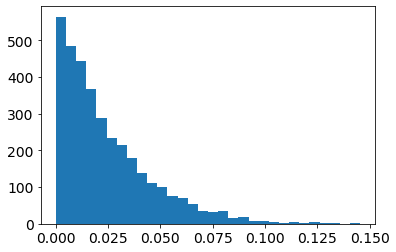

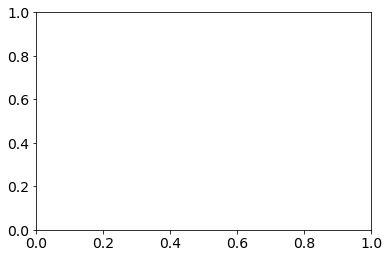

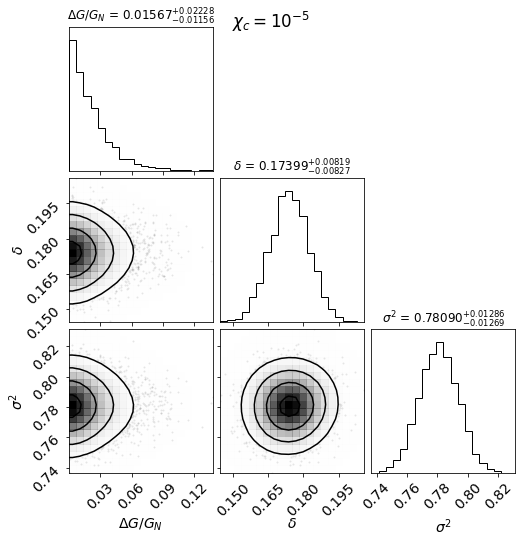

  0%|▏                                          | 4/918 [00:00<00:28, 32.61it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 2.465453012478009e-06
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 1.8443794301117643e-06
10213-1902 [50] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 50.0 0.0 1.023168002486776e-06
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 9.248499342055798e-07
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0 0.0 2.3316462967165318e-05
10218-12703 [50] [33

  1%|▌                                         | 12/918 [00:00<00:27, 32.46it/s]

10218-3704 [50] [-0.2423, -0.7324, -0.4111, -0.2502, -0.1409, -0.2076, -0.2494, -0.3265, -0.3433, -0.3506, -0.3606, -0.3689, -0.3645, -0.3466, -0.4111, -0.2985]
10218-3704 50.0 0.0 1.5711748547381714e-06
10219-9102 [50] [1.3962, 1.1814, 0.7492, 0.4692, 0.3335, 0.2205, 0.1532, 0.1423, 0.1945, 0.153, 0.0798, 0.0216, -0.0715, -0.157, -0.0196, -0.0532, -0.0405]
10219-9102 50.0 0.0 8.683080753048028e-07
10220-12705 [50] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 50.0 0.0 8.308134333701604e-07
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 6.651498232301514e-06
10224-9101 [50] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 50.0 0.0 6.917766039761429e-07
10226-12704 [50] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694

  2%|▉                                         | 20/918 [00:00<00:27, 32.67it/s]

10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 1.5042159520049123e-05
10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 1.23531774504153e-05
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 1.1614357236207198e-05
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 50.0 0.0 1.3504777708400736e-06
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 7.7797157621616e-06
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.0093,

  3%|█▎                                        | 28/918 [00:00<00:27, 32.48it/s]

10495-12704 [50] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 50.0 0.0 9.19740096142578e-06
10495-12705 [50] [871.1598, 1245.0304, 1205.1955, 1347.7893, 1374.3588, 1517.2635, 1622.8998, 1633.9971, 1757.8692, 1799.4196, 1854.634, 1999.5551, 1849.1662, 1882.4866, 1807.1303, 1651.9125, 1681.1326, 1493.9167, 2771.4516, 2121.0254, 1992.5196]
10495-12705 50.0 0.0 6.3088126420447e-07
10495-3702 [50] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 50.0 0.0 1.9956587931601055e-06
10496-12704 [50] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268.8121, 253.915, 333.7881, 358.7629, 315.1183, 261.3063, 216.6964, 267.188, 258.5169, 256.0365, 248.4992]
10496-12704 50.0 0.0 1.4224693912414376e-06
10496-12705 [50] [-0.387

  3%|█▍                                        | 32/918 [00:00<00:27, 32.13it/s]

10499-3702 [50] [-0.3822, -0.1753, 0.3237, 0.6092, 0.8357, 0.9307, 1.1046, 1.1845, 1.1657, 1.064, 1.005, 1.0954, 0.7875, 0.8892, 0.9769, 1.0508, 1.3156, 1.2283]
10499-3702 50.0 0.0 1.402597272397808e-06
10499-3703 [50] [-0.0563, -0.0436, 0.024, 0.1267, -0.0775, -0.0664, 0.0153, -0.0929, -0.1244, -0.0851, -0.0939, -0.1131, -0.1033, -0.048, 0.0474, 0.0456, 0.0289, -0.0666, -0.0844, -0.5663]
10499-3703 50.0 0.0 1.5318429071078205e-06
10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 2.652947770739016e-06
10500-12704 [50] [140.7935, 35.4055, 16.1502, 8.7997, 6.1202, 5.6067, 5.0715, 4.9205, 5.0767, 4.6234, 4.2501, 4.0673, 3.8962, 3.8831, 3.7867, 3.6009, 3.0687, 4.1948, 2.9642, 3.5448, 1.9938, -0.2753, 2.8838, 5.8145]
10500-12704 50.0 0.0 5.946403973516353e-07
10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 3.1119373132944076e-05
10500-3702 [48.09547336683417] [21

  4%|█▊                                        | 40/918 [00:01<00:26, 33.33it/s]

10501-12704 [50] [1.3181, 1.9521, 1.9474, 1.8957, 2.0169, 2.066, 2.2805, 2.1361, 1.7635, 1.5052, 2.0197, 2.1387, 2.493, 1.9877, 1.7896, 1.1205, 1.6972, 2.5971]
10501-12704 50.0 0.0 1.8635805108971217e-06
10501-6101 [50] [54.152, 240.5257, 446.403, 593.882, 679.4829, 745.3089, 578.3118, 397.5307, 268.9797, 276.8619, 234.4717, 196.8602, 156.2454, 140.6324, 64.5922]
10501-6101 50.0 0.0 1.574376468751398e-06
10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 50.0 0.0 1.6576696648109528e-06
10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 1.1085161378912729e-06
10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 8.03748730544236e-06
10505-12704 [50] [0.622

  5%|██▏                                       | 48/918 [00:01<00:26, 32.34it/s]

10508-12703 [50] [0.5005, 0.4509, 0.1544, 0.1328, 0.1165, 0.1176, 0.065, 0.1329, 0.2506, 0.179, 0.1788, 0.1204, 0.0037, 0.016, -0.0301, -0.0876]
10508-12703 50.0 0.0 4.870388104172565e-06
10509-12703 [50] [1226.9439, 2166.987, 2538.8741, 2127.6504, 1648.0951, 1358.0909, 1167.9374, 985.8138]
10509-12703 50.0 0.0 1.8498785217966794e-06
10509-1901 [50] [88.4511, 296.1948, 449.6905, 409.1127, 761.2326, 574.7336, 678.7086, 604.9771, 571.2616, 614.5332, 408.9334, 441.3848, 355.292, 300.996, 243.919, 230.1612, 180.5992, 163.4382, 176.2701, 193.176, 205.4741]
10509-1901 50.0 0.0 6.265525906042426e-07
10509-6101 [50] [414.6573, 159.5598, 352.8386, 670.9188, 930.199, 434.1238, 984.9702, 921.6235, 784.8291, 825.2006, 827.4197, 661.5592, 624.5693, 894.3523, 620.0269, 747.519, 623.1939, 701.341, 577.342, 1031.0135, 622.2157, 697.4912, 668.4888, 271.226]
10509-6101 50.0 0.0 1.091675741985362e-06
10511-12704 [50] [-0.0162, 0.2052, 0.0934, -0.0203, -0.0645, -0.0743, -0.1124, -0.1256, -0.1314, -0.1489,

  6%|██▌                                       | 56/918 [00:01<00:26, 32.89it/s]

10512-9102 [50] [4147.3152, 2927.8473, 3245.8656, 2878.0674, 2617.7881, 2204.6977, 1695.8151, 1371.2689, 1298.2413, 1241.1228, 1357.9116, 1330.7104, 1714.839, 1930.3755, 2196.7284, 2401.8011, 2844.302, 3122.8481, 2925.4465]
10512-9102 50.0 0.0 1.2463152525495068e-06
10513-12702 [50] [-0.9916, -0.9877, -0.9855, -0.9802, -0.9787, -0.98, -0.9868, -0.9787, -0.862, -0.9802]
10513-12702 50.0 0.0 2.3084354232786574e-06
10514-6103 [20.00628140703518] [0.5999, 0.3982, 0.2747, 0.2749, 0.0781, 0.0617, 0.0681, -0.0189, -0.0377, -0.0578, -0.065, -0.0594, 0.0253, -0.0317, 0.1182, -0.1428, -0.1895, -0.2508, -0.2991, -0.355]
10514-6103 20.00628140703518 7.088427755860359e-08 4.561352755329662e-07
10516-6104 [50] [0.3084, -0.237, -0.3593, -0.3575, -0.3434, -0.2974, -0.3603, -0.4386, -0.4629, -0.4919, -0.5092, -0.5031, -0.4319, -0.4152, -0.2877, -0.6618]
10516-6104 50.0 0.0 1.0459546138556414e-06
10517-3704 [50] [6.5457, 4.9823, 4.7496, 3.3043, 2.1613, 1.6053, 1.1745, 0.9031, 0.7267, 0.8082, 0.6442, 0.6

  7%|██▉                                       | 64/918 [00:01<00:25, 33.15it/s]

10518-1902 [50] [-0.0105, 0.2572, 0.0495, 0.0308, 0.0287, -0.0677, -0.0841, -0.0885, -0.1994, -0.1432, -0.1195, -0.1634, -0.1173, -0.1219, -0.165, -0.1325, -0.1731]
10518-1902 50.0 0.0 2.4364059419738058e-06
10518-6102 [50] [-0.217, 1.2282, 0.4062, 0.3459, 0.382, 0.1799, 0.1478, 0.1175, 0.0995, 0.1358, 0.0812, 0.048, 0.0452, 0.0639, 0.0875, 0.0309, 0.0337, 0.0007, -0.0113, -0.1383]
10518-6102 50.0 0.0 1.4065149089054103e-06
10519-12704 [50] [-0.2611, 0.2686, 0.1702, 0.0601, 0.0584, 0.0258, -0.0515, -0.1077, -0.1123, -0.1006]
10519-12704 50.0 0.0 2.3296366498036724e-06
10519-6102 [50] [15.342, 9.7033, 5.6052, 3.8579, 2.785, 2.1688, 1.9416, 1.9483, 2.0544, 1.8028, 1.946, 2.1855, 2.046, 2.3544, 2.1616]
10519-6102 50.0 0.0 4.6458972437019135e-06
10520-12704 [50] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.0366, 0.0275, -0.0135, 0.0213, 0.0998, -0.1048, -0.1309]
10520-12704 50.0 0.0 9.549086996988596e-07
10520-6102 [50] [-0.9995, -0.9993, -0.9985, -0.9976, -0.9986, -

  7%|███                                       | 68/918 [00:02<00:25, 33.38it/s]

10839-12705 [50] [0.5531, 0.4188, 0.6271, 0.6342, 0.4074, 0.3206, 0.1512, 0.1105, 0.1154, 0.1763, 0.2141, 0.3291, 0.2868, 0.1635, 0.0391, 0.4134, 0.1807]
10839-12705 50.0 0.0 4.211621266679304e-06
10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712, 0.035, -0.0115, 0.0248, -0.0288, 0.0512, -0.0187, 0.0073, 0.0432, -0.0916, -0.1233, -0.1818, -0.1471]
10839-3704 50.0 0.0 1.879920137417225e-06
10839-6101 [50] [244.3098, 615.0842, 876.8345, 1563.8627, 1705.1968, 1816.091, 1687.128, 1731.6052, 1640.9131, 1596.506, 1498.4971, 1406.0518, 671.6148, 995.7509]
10839-6101 50.0 0.0 1.6269702436005267e-06
10839-9101 [50] [2.1426, 2.2648, 0.9796, 0.8183, 0.5304, -0.0332, -0.1785, -0.3432, -0.3468, -0.4742, -0.4095, -0.6139, -0.5305, -0.616, -0.529, -0.5494, 0.8162, 3.2784]
10839-9101 50.0 0.0 2.1401968474570433e-06
10841-12701 [50] [-0.7323, -0.6652, -0.4249, -0.3016, -0.2957, -0.3482, -0.374, -0.3905, -0.3944, -0.4309, -0.4302, -0.4504, -0.4708, -0.4257, -0.4725]
10841-12701 50.0 0.0 3.6322950595008712

  8%|███▍                                      | 76/918 [00:02<00:25, 32.73it/s]

10845-12702 [50] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-12702 50.0 0.0 1.3711278114576355e-06
11004-12705 [50] [-0.8497, -0.6991, -0.5203, -0.3493, -0.2406, -0.2193, -0.1954, -0.1792, -0.1842, -0.1767, -0.1858, -0.1781, -0.195, -0.2173, -0.2294, -0.167, -0.2434, -0.1514, -0.3351, -0.2129]
11004-12705 50.0 0.0 9.362387021755547e-07
11004-3703 [50] [5607.0165, 6199.0745, 5122.0907, 4588.5334, 3798.1606, 3256.1827, 2909.7374, 2623.1995, 2081.3703, 1622.0266, 1252.6703, 1054.2993, 797.551, 805.4299, 667.6425]
11004-3703 50.0 0.0 9.89743458371857e-07
11004-6104 [50] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 50.0 0.0 1.5098715780577533e-05
11009-12704 [50] [-0.044, 0.5574, 0.4941, 0.5156, 0.452, 0.4031, 0.3736, 0.4191, 0.4646, 0.4848, 0.558, 0.4716, 0.2432, 0.3821, 0.6252, 0.8487, 0.8601]
11009-12704 50.0 0.0 2.805866474566567e-05
1

  9%|███▊                                      | 84/918 [00:02<00:25, 32.83it/s]

11010-6104 [50] [669.1593, 612.5725, 580.2933, 433.0387, 377.072, 315.1925, 269.3918, 266.5579, 267.4688, 253.2676, 240.0639, 221.1944, 344.4065]
11010-6104 50.0 0.0 3.957968012462978e-06
11010-9101 [50] [2.5718, 0.9269, 0.2901, 0.1931, 0.0011, -0.0504, -0.0935, -0.075, 0.0093, 0.0203, 0.0025, -0.0251, -0.0362, 0.0004, 0.0161, -0.0012, -0.102, -0.364, -0.4377]
11010-9101 50.0 0.0 9.837318440137504e-06
11011-12703 [50] [9.8651, 35.0102, 40.3579, 54.0601, 192.4013, 365.0512, 378.092, 411.2362, 282.7202, 230.5846, 329.2445, 263.6472, 244.1501]
11011-12703 50.0 0.0 2.2810111594920535e-06
11012-12705 [50] [0.2329, 0.5509, 0.2517, 0.0195, 0.0174, -0.0704, -0.1937, -0.145, -0.249, -0.0592, -0.302, -0.1828, -0.2112]
11012-12705 50.0 0.0 1.351172600832591e-05
11012-3702 [50] [7.8974, 3196.585, 2734.8285, 2253.8811, 4078.0168, 2401.2221, 2680.4924, 2677.0305, 2494.671, 2122.0656, 2023.2433, 2124.4295, 1742.4806, 1879.5204, 1353.859, 1265.244, 1077.374, 829.3809, 807.9255, 437.3493, 291.3315]
110

 10%|████                                      | 88/918 [00:02<00:26, 31.25it/s]

11013-12702 [50] [0.7904, 0.6387, 0.0779, 0.1203, 0.0592, -0.004, -0.016, 0.0128, 0.0194, 0.059, 0.0663]
11013-12702 50.0 0.0 4.494670711927419e-06
11013-1902 [50] [0.7893, 0.6453, 0.5024, 0.4895, 0.4034, 0.2175, 0.0455, -0.0103, 0.0142, -0.2569, -0.0412, -0.2183, -0.1712, -0.0824, -0.3609, -0.2323, -0.3117]
11013-1902 50.0 0.0 5.274612139908944e-06
11013-3701 [50] [0.785, 0.6845, 0.2024, 0.0457, 0.0342, 0.02, -0.06, -0.0296, -0.0379, -0.1677]
11013-3701 50.0 0.0 3.92785991035813e-06
11013-3702 [50] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 50.0 0.0 6.307608939376527e-06
11013-6101 [50] [0.3389, -0.3422, -0.154, -0.2894, -0.4104, -0.4385, -0.4897, -0.4798, -0.43, -0.3971, -0.3753, -0.3775, -0.3376, -0.2419, -0.1243, 0.0068, -0.1557, 0.0318, -0.0178, 0.2532, 0.5345, 0.5099]
11013-6101 50.0 0.0 2.3869605425622384e-06
11017-12703 [50] [0.0185, 0.3093, 0.3468, 0.2632, 0.2308, 0.2072, 0.1992, 0.215, 0.2444, 0.2273, 0.053, -0.0123, 0.1078, -0.0553]
11017-12703 5

 10%|████▍                                     | 96/918 [00:02<00:27, 30.11it/s]

11017-12704 [50] [0.4751, 0.4487, 0.3988, 0.2586, 0.0625, -0.0537, -0.0751, -0.1094, -0.1157, -0.1027, -0.1141, -0.1182, -0.1126, -0.1047, -0.0836, -0.1961, -0.2389]
11017-12704 50.0 0.0 1.2143361950888015e-06
11017-6103 [50] [-0.3235, -0.3265, -0.3479, -0.2253, -0.2261, -0.1769, -0.1311, -0.1075, -0.0747, -0.0989, -0.1378, -0.1695, -0.1257, -0.174, -0.178, -0.0714, -0.0163, 0.0028, 0.2262, -0.2731]
11017-6103 50.0 0.0 7.313280313811638e-06
11017-9101 [50] [-0.5273, 0.0425, 0.2188, 0.1666, 0.07, 0.0407, -0.0503, -0.1282, -0.2004, -0.2244, -0.1722, -0.1497, -0.0815, -0.0967, -0.1443, -0.1476, -0.1864, -0.1536, -0.2264, -0.18]
11017-9101 50.0 0.0 1.4291977703476865e-06
11018-12702 [50] [-0.9839, -0.9926, -0.9927, -0.9922, -0.9923, -0.9935, -0.9932, -0.9925, -0.9931, -0.994, -0.9941]
11018-12702 50.0 0.0 2.2155494106158257e-06
11018-12704 [50] [-0.9989, -0.9988, -0.9986, -0.9987, -0.9988, -0.999, -0.999, -0.9991, -0.9991, -0.9987, -0.9984, -0.9975, -0.9987, -0.9989]
11018-12704 50.0 0.0 1

 11%|████▋                                    | 104/918 [00:03<00:27, 30.10it/s]

11018-6102 [50] [69.1052, 130.9961, 113.1141, 109.1797, 92.5989, 91.6354, 88.5765, 83.9604, 80.137, 76.3564, 74.3146, 74.7218, 70.495, 71.7331, 65.8452, 64.9321, 72.2612]
11018-6102 50.0 0.0 3.1931621298544486e-06
11019-12702 [50] [0.0142, 0.2516, 0.1906, 0.1378, 0.0877, -0.003, 0.0993, 0.0958, 0.1065, 0.1232, 0.2086, 0.1132, 0.0357, -0.0115, -0.014, 0.0302, -0.0875, -0.1071]
11019-12702 50.0 0.0 1.7305390751329587e-06
11019-12703 [50] [-0.4993, -0.4671, -0.3698, -0.2654, -0.2024, -0.2445, -0.2033, -0.2117, -0.2752, -0.2285, -0.2102, -0.0702, -0.1699, 0.0858, -0.1757, -0.2987]
11019-12703 50.0 0.0 1.2456446870612306e-05
11019-12705 [50] [0.9395, 1.6844, 1.8269, 0.8562, 0.7011, 1.016, 1.1247, 1.0992, 1.0844]
11019-12705 50.0 0.0 4.943953302212347e-06
11019-3701 [50] [2.5964, 1.3616, 0.9142, 0.3658, 0.0143, -0.1157, -0.1148, -0.102, -0.0691, -0.1802, -0.166, -0.2893, -0.0849]
11019-3701 50.0 0.0 7.711224551492177e-06
11021-1902 [50] [5.9017, 3.1432, 2.8491, 1.9605, 1.7177]
11021-1902 50.

 12%|████▉                                    | 111/918 [00:03<00:27, 29.73it/s]

11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 1.438354445656357e-05
11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 7.468139986786352e-06
11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 6.771145092731766e-05
11742-12704 [50] [0.6702, -0.5312, -0.3481, 0.0047, 0.1348, 0.415, 0.2787, 0.5138, -0.0348]
11742-12704 50.0 0.0 1.2924360401262826e-06
11743-1901 [50] [-0.5717, -0.3943, -0.5273, -0.3736, -0.306, -0.392, -0.3766, -0.4151, -0.3665, -0.4111, -0.4236, -0.3424, -0.3877, -0.3594, -0.291, -0.4952, -0.6018]
11743-1901 50.0 0.0 8.115018607725715e-06
11744-9102 [50] [-0.

 13%|█████▎                                   | 118/918 [00:03<00:26, 29.76it/s]

11745-6104 [50] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.8527, 0.5703, 0.5078, 0.5176, 0.5143, 0.48, 0.4463, 0.4504, 0.4653, 0.4273, 0.4049]
11745-6104 50.0 0.0 2.0303379392488747e-06
11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.0361, -0.076, -0.0711, -0.1542, -0.2041, -0.2119, -0.1066, -0.2705, -0.3138]
11745-9101 50.0 0.0 2.727177781443338e-06
11746-3703 [50] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 50.0 0.0 4.238611186705994e-06
11746-3704 [27.062178391959797] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 27.062178391959797 9.079678166270505e-08 4.364962630927307e-07
11746-9102 [50] [-0.478, -0.2133, -0.2528, -0.1774, -0.2077, -0.2266, -0.2099, -0.2691, -0.1996, -0.21

 14%|█████▌                                   | 124/918 [00:03<00:27, 28.96it/s]

11749-12704 [50] [1.1585, 1.0264, 1.2033, 1.4986, 1.8954, 2.0398, 2.1095, 2.1199, 1.4688, 1.3033, 0.9132, 0.8426, 0.0515, 0.4719, -0.3735]
11749-12704 50.0 0.0 6.476372350671599e-06
11749-3701 [50] [618.0455, 872.9003, 1483.1859, 1615.2011, 1553.7949, 1334.0598, 1385.5396, 1283.8547, 1216.0833, 1294.494, 1472.7433, 1080.4933, 1346.7897, 1196.9726, 1091.8413, 1216.7304, 927.7028, 363.0292, 281.9853, 551.8779, 169.9359, 54.7426, 122.374, 379.7425, 27.1507]
11749-3701 50.0 0.0 2.342793120107224e-06
11750-12701 [50] [0.4224, 0.3089, 0.0791, 0.0892, 0.2329, 0.2222, 0.1114, 0.03, 0.0196, 0.0027, 0.0313, 0.0827, 0.0275, 0.3095]
11750-12701 50.0 0.0 2.4301548062440253e-06
11750-3701 [50] [1.5964, 1.8766, 1.9419, 1.999, 1.4725, 1.2873, 1.1333, 0.934, 0.9463, 0.8918, 0.7347, 0.8508, 0.6677, 0.4619, 0.3762, 0.1866, 0.0367, 0.0915, 0.0086, 0.4665]
11750-3701 50.0 0.0 8.332458704824897e-07
11750-6103 [50] [6.303, 1.7001, 0.3933, 0.5417, 0.5248, 0.6298, 0.7207, 0.7282, 0.8046, 0.5691, 0.3659, 0.4083

 14%|█████▊                                   | 130/918 [00:04<00:27, 28.50it/s]

11751-1901 [50] [-0.9334, -0.8849, -0.9513, -0.9754, -0.9893, -0.9862, -0.989, -0.9902, -0.9893, -0.9909, -0.9903, -0.9906, -0.9888, -0.9874]
11751-1901 50.0 0.0 2.3832508687247927e-06
11751-6102 [50] [0.3738, 0.0535, 0.3785, 0.2124, 0.1333, 0.0258, -0.0223, -0.094, -0.1099, -0.1415, -0.1724, -0.2013, -0.1841, -0.253, -0.3949, -0.2255, -0.2141, -0.2775]
11751-6102 50.0 0.0 2.5143777215859596e-06
11753-3703 [50] [0.2801, 0.7604, 0.7391, 0.5795, 0.35, 0.1693, 0.0874, 0.0586, 0.0152, -0.0057, -0.0099, -0.0594, -0.1073, -0.139, -0.1496]
11753-3703 50.0 0.0 2.673673182424479e-06
11753-6104 [50] [1.7058, 1.5787, 1.7231, 1.492, 1.0043, 0.8699, 0.6579, 0.5905, 0.5042, 0.4712, 0.4504, 0.6153, 0.6589, 0.6817, 0.5206, 0.5457, 0.5195, 0.692]
11753-6104 50.0 0.0 1.6952068554431677e-06
11754-1901 [50] [-0.2402, -0.5388, -0.5143, -0.4398, -0.487, -0.4664, -0.4721, -0.5334, -0.5004, -0.4954, -0.6115, -0.5884]
11754-1901 50.0 0.0 2.9995820082480168e-06
11755-12701 [50] [-0.773, -0.7865, -0.7717, -0.752

 15%|██████                                   | 136/918 [00:04<00:27, 28.70it/s]

11755-6101 [50] [-0.0093, 1.0489, 0.9853, 1.2444, 1.0667, 0.8902, 0.7008, 0.6245, 0.5835, 0.5179, 0.397, 0.4083, 0.4791, 0.2148, 0.053]
11755-6101 50.0 0.0 2.9304619044940976e-06
11755-9102 [50] [0.1799, 0.2485, 0.3504, 0.383, 0.2088, 0.1465, 0.0712, -0.0042, -0.0415, -0.0215, 0.0671, 0.0623, 0.1393, -0.1017, 0.125, -0.214, -0.1458]
11755-9102 50.0 0.0 2.2436243771201037e-05
11758-3701 [50] [-0.3091, 0.0326, 0.2349, 0.1141, 0.0113, 0.06, -0.0268, -0.1507, -0.2171, -0.1994, -0.1587, -0.1557, -0.1574, -0.1614, -0.0618]
11758-3701 50.0 0.0 1.0057338096346027e-06
11758-3702 [50] [-0.544, -0.1141, 0.0167, 0.1028, 0.0854, -0.0041, -0.0149, 0.0406]
11758-3702 50.0 0.0 4.465162513086518e-06
11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 50.0 0.0 1.504329908275231e-06
11759-6102 [50] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, 

 16%|██████▍                                  | 143/918 [00:04<00:26, 28.91it/s]

11760-6101 [50] [0.4533, -0.0157, 0.5654, 0.502, 0.3995, 0.359, 0.3287, 0.2964, 0.2063, 0.2512, 0.2686, 0.2421, 0.2368, 0.1884, 0.0906, -0.0471, -0.3849, -0.319, -0.8166]
11760-6101 50.0 0.0 4.675865281365718e-06
11760-6103 [50] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.2117, -0.2373, -0.2365, -0.2317, -0.3078, -0.2653, -0.3184, -0.2638]
11760-6103 50.0 0.0 8.94674707521634e-07
11760-9102 [50] [-0.8049, -0.6427, -0.2931, -0.1213, 0.1899, 0.0235, 0.108, 0.1381, 0.1732, 0.1865, 0.1624, 0.1963, 0.1218, 0.1215, 0.1223, 0.2636, 0.046, 0.5962, 0.1808, 0.9922, 2.2582]
11760-9102 50.0 0.0 1.0967204964192104e-06
11761-12702 [50] [-0.6826, -0.6017, -0.2216, -0.1122, -0.0329, -0.02, -0.0711, -0.0937, -0.0782, -0.098, -0.1546, -0.1024, -0.1043, -0.0648, -0.2102, -0.3314, -0.2483]
11761-12702 50.0 0.0 8.271731903763645e-06
11761-12703 [50] [0.4093, 0.08, -0.0588, -0.0478, 0.0006, -0.0009, -0.0617, -0.1284, -0.1046, -0.1135, -0.1247, -0.1623, -0.2191, -0.347

 16%|██████▋                                  | 149/918 [00:04<00:27, 27.57it/s]

11761-12705 [50] [6.8127, 3.6941, 2.4845, 1.3644, 0.5363, 0.2844, 0.104, -0.1]
11761-12705 50.0 0.0 3.6240053488324287e-06
11823-9101 [50] [15949.1976, 8800.0053, 8323.3916, 4811.1692, 2214.9858, 717.2733, 413.2719, 305.7873, 173.5393, 146.0478, 195.6604, 224.7593, 189.4201, 67.1778]
11823-9101 50.0 0.0 1.5366963509680824e-06
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 1.3096410519719824e-05
11828-12703 [50] [-0.5587, -0.2913, 0.1844, 0.3112, 0.2627, 0.2124, -0.0354, -0.0957, -0.1295, -0.1601, -0.0565, -0.1246, 0.0413]
11828-12703 50.0 0.0 1.7368148350498095e-06
11830-12701 [50] [-0.9938, -0.9825, -0.9834, -0.9912, -0.9934, -0.9941, -0.9946, -0.9933, -0.9936, -0.9951, -0.9951, -0.9944, -0.9947, -0.9932, -0.9955, -0.9854, -0.997, -0.9939, -0.9962]
11830-12701 50.0 0.0 2.5179661649516927e-06
11830-12703 [50] [-0.4776, 0.0437, 0.1582, -0.0709, -0.1607, -0.0754, 0.055, 0.2665, 0.1

 17%|██████▉                                  | 155/918 [00:05<00:27, 27.97it/s]

11830-3702 [50] [1.2195, 0.9978, 0.6546, 0.4726, 0.5057, 0.555, 0.4749, 0.3884, 0.4626]
11830-3702 50.0 0.0 2.0797328898289322e-06
11830-6104 [50] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.0353, -0.2063, -0.258, -0.2347, -0.2692, -0.3985]
11830-6104 50.0 0.0 1.7121766105146424e-06
11831-12703 [50] [0.4472, 0.0224, 0.062, 0.158, -0.0429, -0.0922, -0.1252, -0.188, -0.1276, -0.16, -0.2596, -0.2165, 0.1708, -0.4595]
11831-12703 50.0 0.0 7.663659313111953e-06
11831-12704 [50] [-0.5822, -0.2435, 0.0115, -0.0848, -0.1704, -0.028, -0.0888, -0.0323, -0.0445, -0.106, -0.3871, -0.1836]
11831-12704 50.0 0.0 1.7512650881289733e-06
11831-6101 [50] [-0.9875, -0.994, -0.9968, -0.9973, -0.9967, -0.9975, -0.9969, -0.9978, -0.9979, -0.9971, -0.9984, -0.9986, -0.9985, -0.9974]
11831-6101 50.0 0.0 5.662564474923815e-07
11831-6102 [50] [1.041, 0.6096, 0.4053, 0.165, 0.0902, 0.1922, 0.1873, 0.1187, 0.1055, 0.0085, -0.1108, -0.0737]
11831-6102 50.0 0.0 2.4171903401329935e-

 18%|███████▏                                 | 161/918 [00:05<00:28, 26.69it/s]

11833-9102 [50] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.2658, -0.2176, -0.1929, -0.2471, -0.3166]
11833-9102 50.0 0.0 2.2877719980637877e-06
11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 1.7815325021647706e-05
11836-1902 [50] [0.7026, 1.2767, 1.1865, 1.1009, 0.973, 0.9921, 0.7024, 0.7206, 0.623, 0.6145, 0.5505, 0.5955, 0.6037, 0.4142, 0.4147]
11836-1902 50.0 0.0 8.97861252826825e-06
11838-12701 [50] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 0.1336, 0.0903, 0.0213, -0.0554, -0.0342, 0.0225, 0.0053, -0.0272]
11838-12701 50.0 0.0 2.6959774791553516e-06
11838-12703 [50] [144.9042, 254.2159, 538.0129, 911.0748, 1089.8377, 1111.2623, 1284.2649, 1228.3752, 1345.2496, 1400.7846, 1427.4787, 1434.5371, 1257.47,

 18%|███████▍                                 | 167/918 [00:05<00:28, 26.39it/s]

11838-6103 [50] [201.1554, 531.7007, 967.9199, 1125.4471, 1324.9799, 1297.8083, 1279.6033, 1183.901, 1134.9301, 1132.4611, 1104.3121, 1011.7157, 1287.8266]
11838-6103 50.0 0.0 2.151035460854678e-06
11838-9101 [50] [11.4727, 10.3246, 9.7757, 7.6641, 6.3263, 7.7985, 4.6854, 6.1379, 3.8072, 5.5203, 3.0518, 3.9759, 1.4403, 2.8333, 2.6956, 2.5542]
11838-9101 50.0 0.0 2.1781365363751898e-06
11865-12702 [50] [-0.057, -0.0512, 0.0778, -0.0002, -0.0743, -0.0834, -0.0854, 0.0083, -0.0154, -0.0332, -0.07, -0.1612, -0.2706]
11865-12702 50.0 0.0 2.3213144240279516e-06
11865-12704 [50] [0.4447, -0.0557, -0.3894, -0.457, -0.5111, -0.5109, -0.5238, -0.5353, -0.4955, -0.5012, -0.4831, -0.4726, -0.599, -0.615]
11865-12704 50.0 0.0 1.626995793140408e-06
11865-1901 [50] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 50.0 0.0 1.4010998287820933e-06
11865-1902 [50] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0.4429

 19%|███████▋                                 | 173/918 [00:05<00:27, 26.76it/s]

11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 1.7687070626087682e-06
11865-9102 [50] [-0.467, -0.4695, -0.4789, -0.5286, -0.6182, -0.6445, -0.6408, -0.6047, -0.6031, -0.6243, -0.655, -0.6895, -0.6998, -0.5904, -0.6729, -0.6983]
11865-9102 50.0 0.0 7.29675442238979e-07
11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2771, 0.298, 0.3814, 0.3262, 0.2102, 0.3978, 0.4467, 0.2866, 0.1214, 0.2202, 0.1346, 0.4041]
11867-6104 50.0 0.0 3.888927528535314e-06
11867-9101 [50] [0.9073, 0.3027, 0.1546, 0.1123, 0.0285, 0.0159, -0.0244, 0.0205, 0.0824, 0.1908, 0.2079, 0.2195, 0.3058, 0.2425, 0.1871, 0.3056]
11867-9101 50.0 0.0 2.5060100018848314e-06
11868-12703 [50] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 6.254905605190682e-06
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 1.61946941344001

 19%|███████▉                                 | 179/918 [00:05<00:27, 26.88it/s]

11871-6103 [50] [0.7182, 0.8575, 0.776, 0.4737, 0.2556, 0.1173, 0.1395, 0.111, 0.0842, 0.0381, 0.0003, -0.0281, -0.0195, -0.044, -0.0588, -0.2086, -0.132, -0.377]
11871-6103 50.0 0.0 1.8639698358601595e-05
11940-1902 [50] [-0.0835, 0.1518, 0.1321, 0.0182, -0.0843, -0.1452, -0.1779, -0.1993, -0.1955]
11940-1902 50.0 0.0 1.139861066513504e-05
11940-3703 [1.1686] [1.1615, 1.5645, 1.5154, 1.5213, 1.3625, 1.1856, 0.9977, 0.7191, 0.6591, 0.6153]
11940-3703 1.1686 1.7493203837245518e-07 3.5240438196553615e-07
11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 7.051829933070583e-05
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 6.46820268016037e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 6.289414

 20%|████████▎                                | 185/918 [00:06<00:26, 27.24it/s]

11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389.9946, 2439.1642, 2636.587, 2485.7262, 2056.7992, 1736.2622, 1623.5415, 1192.5228, 781.8483, 546.9719, 175.874]
11942-12704 50.0 0.0 3.3989009605165244e-05
11942-6104 [50] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 50.0 0.0 5.372005022055214e-07
11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.0425, -0.0331, -0.0546, -0.0982, -0.1371, -0.164, -0.179, -0.1863, -0.172, -0.1572, -0.1563, -0.1648, -0.1726, -0.27]
11943-3703 50.0 0.0 4.438899168992293e-05
11944-12701 [50] [-0.3604, -0.3617, -0.4276, -0.5869, -0.6347, -0.6283, -0.548, -0.5758, -0.5204, -0.4847, -0.4769, -0.4857, -0.5345, -0.6334, -0.5353, -0.5098]
11944-12701 50.0 0.0 4.6439335842661144e-06
11945-12701 [50] [0.3961, 0.2879, 0.3765, 0.1557, -0.0002, -0.113, -0.1502, -0.128, -0.114, -0.1705, -0.0344, 0.0462, 0.017]
11945-12701 50.

 21%|████████▌                                | 191/918 [00:06<00:26, 27.23it/s]

11945-6102 [50] [3.5224, 2.2109, 1.4349, 1.0152, 0.7457, 0.4864, 0.2556, 0.1192, 0.0508, 0.0117, -0.0209, -0.0683, -0.158, -0.0976, -0.2012]
11945-6102 50.0 0.0 7.817314599001758e-06
11947-6103 [50] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 50.0 0.0 3.3329708856182915e-06
11949-12701 [50] [1.1975, 0.3408, 0.1441, 0.1243, 0.0225, 0.0003, 0.0028, 0.027, 0.0197, 0.0192, -0.0295, -0.0839]
11949-12701 50.0 0.0 4.161146920499e-06
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 1.7502567047928235e-05
11954-12704 [50] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453, 0.1801, 0.125, 0.0276, -0.0116, -0.0744, -0.134, -0.1626, -0.2559, -0.2802]
11954-12704 50.0 0.0 9.548273490983951e-06
11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0

 21%|████████▋                                | 194/918 [00:06<00:26, 27.11it/s]

11954-9101 [50] [-0.9882, -0.9937, -0.9946, -0.9965, -0.9974, -0.9972, -0.997, -0.9969, -0.997, -0.9974, -0.9978, -0.9979, -0.9973, -0.9971, -0.9976, -0.9966]
11954-9101 50.0 0.0 9.630336004122818e-06
11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 7.084513627084466e-06
11956-12702 [50] [5.6953, 5.0804, 3.2564, 2.1056, 1.2622, 0.6457, 0.4602, 0.5373, 0.9503, 3.7649, 5.1679]
11956-12702 50.0 0.0 4.057177515495473e-06
11956-12705 [50] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 0.2419, 0.2565, 0.3525, 0.1776, 0.103, 0.3387, 0.3814, 0.7221, 0.77]
11956-12705 50.0 0.0 6.733870652652824e-07
11957-12704 [1.8355788944723619] [-0.3492, 0.7667, 0.6853, 0.5861, 0.3661, 0.189, 0.1584, 0.1015, -0.0026, 0.0319, 0.1228, 0.1275, 0.2204, 0.0938]
11957-12704 1.8355788944723619 1.1964224561115184e-07 4.04739275551674e-07
11957-9101 [50] [127.5969, 337.5453, 692.0501, 754.6672,

 22%|█████████                                | 204/918 [00:06<00:25, 27.68it/s]

11958-6103 [50] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 50.0 0.0 7.14839446709873e-07
11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 4.276673740492488e-06
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 50.0 0.0 8.178781199356736e-06
11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.9843, 0.6333, 0.3517, 0.1829, 0.1258, 0.0956, 0.1424, 0.1021, 0.028, 0.1221]
11965-9102 50.0 0.0 4.213078488600548e-06
11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 1.4757422800362232e-05
11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.8986,

 23%|█████████▎                               | 208/918 [00:06<00:23, 29.95it/s]

11970-6102 [50] [-0.0116, -0.0683, -0.0558, -0.0053, 0.0454, 0.025, 0.078, -0.0283, -0.085, -0.1052, -0.0602, -0.0272, -0.0693, -0.0116, -0.1378, -0.2799, -0.2497]
11970-6102 50.0 0.0 2.0744354238369726e-06
11970-6103 [50] [0.7466, 1.1751, 1.6643, 1.3977, 1.0416, 0.8262, 0.6871, 0.5199, 0.4194, 0.3266, 0.2718, 0.2909, 0.2357, 0.2575, 0.2139, 0.0837, -0.0144, -0.0619, 0.133]
11970-6103 50.0 0.0 3.9350345512580716e-06
11974-12702 [50] [-0.5341, -0.4596, -0.3852, -0.2683, -0.2117, -0.2349, -0.22, -0.1969, -0.1731, -0.1829, -0.2133, -0.2538, -0.2357, -0.256, -0.1504, -0.1437, -0.1349, 1.1183]
11974-12702 50.0 0.0 5.299537504784812e-06
11975-12701 [0.2577] [-0.1741, -0.13, 0.3291]
11975-12701 0.2577 1.7534453748405003e-07 3.3391740756357886e-07
11975-12705 [50] [0.6902, 0.7621, 0.3208, 0.2527, 0.3317, 0.3259, 0.2387, 0.0864, 0.069, 0.2015, 0.1928, 0.1502, -0.0055, -0.1924]
11975-12705 50.0 0.0 4.637167677119533e-06
11975-3703 [50] [-0.2597, -0.0329, 0.0768, 0.0833, 0.1048, 0.0682, 0.0342, -

 24%|█████████▋                               | 216/918 [00:07<00:24, 28.84it/s]

11976-12703 [50] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 50.0 0.0 3.477105356248861e-06
11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 50.0 0.0 1.2939826700904441e-06
11978-12705 [50] [0.0184, 0.0968, 0.695, 0.4819, 0.223, 0.1168, 0.1458, 0.1604, 0.1304, 0.1363, 0.1451, 0.1188, 0.0734, 0.0413, 0.0374, 0.0059, 0.0584, 0.0708]
11978-12705 50.0 0.0 1.688928677699789e-06
11978-6101 [50] [0.1703, 0.2916, 0.2201, 0.1105, 0.137, 0.0651, 0.0262, 0.0439, 0.1227, 0.0551, 0.0171, -0.0525, -0.106, -0.2018, -0.2281, -0.1584, -0.2752, -0.3694, -0.5359, -0.6656, -0.8099]
11978-6101 50.0 0.0 2.0769333978421658e-06
11979-12703 [50] [0.3188, 0.2646, 0.4444, 0.4735, 0.4231, 0.2818, 0.2037, 0.1891, 0.1975, 0.1625, 0.205, 0.2447, 0.1501, 0.1763, 0.1339, 0.4567, 0.4255, 0.53]
11979-12703 50.0 0.0 1.46

 24%|█████████▉                               | 223/918 [00:07<00:24, 28.86it/s]

11979-9101 [50] [0.4094, -0.1099, -0.2651, -0.4134, -0.4241, -0.4727, -0.5, -0.5199, -0.5395, -0.5666, -0.5927, -0.5903, -0.6162, -0.591, -0.6704, -0.611]
11979-9101 50.0 0.0 1.2168279031762136e-06
11979-9102 [50] [0.6334, -0.323, -0.1351, -0.0857, 0.0053, 0.0302, 0.0467, 0.0752, 0.0566, 0.0459, 0.0116, 0.0269, 0.0046, -0.0156, -0.091, -0.1558, -0.3105, -0.4242, -0.5324]
11979-9102 50.0 0.0 1.8693824880464685e-06
11981-12704 [50] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]
11981-12704 50.0 0.0 1.3746844813596217e-06
11981-9102 [50] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188, -0.1444, -0.128, -0.1812, -0.1904, -0.2284, -0.2044, -0.2061, -0.1486, -0.2345, -0.2114, 0.0329, 0.7603]
11981-9102 50.0 0.0 9.134354450309575e-06
11982-12704 [50] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.1555, 0.0797, -

 25%|██████████▎                              | 230/918 [00:07<00:24, 28.06it/s]

11982-3703 [50] [-0.314, 0.4086, 0.6273, 0.7714, 0.9457, 0.986, 1.0945, 1.392, 1.3945, 1.539, 1.4145, 1.0397, 1.0282, 0.5616, 0.557, 0.0557]
11982-3703 50.0 0.0 1.1936402913658151e-06
11982-6102 [0.2666] [0.7786, 0.4297]
11982-6102 0.2666 1.8372470738679474e-07 3.236135294082961e-07
11982-9102 [50] [-0.6167, -0.1298, 0.3235, 1.2078, 1.1438, 0.8069, 0.6394, 0.4963, 0.4228, 0.3252, 0.3069, 0.2838, 0.3393, 0.4905, 0.4567, 0.2311]
11982-9102 50.0 0.0 2.248479280787638e-06
11984-12701 [50] [-0.2857, -0.1737, 0.0157, 0.0372, -0.1281, -0.2001, -0.1962, -0.1945, -0.1458, -0.0921, -0.099, -0.116, -0.1666, -0.325, -0.2122, -0.442]
11984-12701 50.0 0.0 2.2293815363633184e-06
11984-12702 [50] [-0.2774, -0.3248, -0.3706, -0.3541, -0.339, -0.3481, -0.2877, -0.2577, -0.2022, -0.1466, -0.1889, -0.2485, -0.0638, -0.2124, -0.1581, -0.3914, -0.132]
11984-12702 50.0 0.0 3.0289520621114463e-06
12066-3701 [50] [19.2418, 16.9197, 10.1428, 6.0915, 4.4316, 3.0783, 2.9929, 2.3906, 2.7183, 2.8356, 3.2869, 3.669,

 26%|██████████▌                              | 236/918 [00:07<00:25, 26.59it/s]

12067-12703 [50] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
12067-12703 50.0 0.0 1.7460452316481657e-06
12067-12705 [50] [0.4291, 1.3434, 2.0219, 1.7622, 1.0305, 0.7583, 0.4763, 0.1261, 0.0511, 0.0662, 0.1502, 0.2361, 0.2324, 0.212, 0.3434]
12067-12705 50.0 0.0 2.439362201294745e-06
12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 4.059091674875922e-05
12068-6104 [50] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 50.0 0.0 4.894929373889895e-06
12069-12704 [50] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 50.0 0.0 2.2454717208989923e-06
12069-12705 [50] [1.7332, 1.13

 26%|██████████▋                              | 239/918 [00:08<00:26, 26.02it/s]

12069-6102 [50] [-0.3102, -0.0764, -0.2402, -0.1833, -0.1952, -0.2158, -0.2095, -0.1861, -0.144, -0.1353, -0.1037, -0.1026, -0.0816, -0.0956, -0.1367, -0.1477, -0.0871, -0.0667, -0.0387, -0.58, -0.56, -0.5359, -0.8946, 0.038]
12069-6102 50.0 0.0 3.4779152108593718e-06
12071-12701 [50] [-0.9172, -0.8384, -0.6786, -0.6994, -0.7429, -0.7686, -0.7662, -0.8217, -0.8275, -0.8401, -0.7831, -0.8143]
12071-12701 50.0 0.0 1.5243413476623526e-06
12071-1901 [50] [-0.148, -0.1411, -0.1881, -0.1802, -0.1874, -0.1463, -0.1611, -0.1934, -0.1236, -0.1115, 0.0697, 0.0471, 0.1047, 0.171, 0.9648]
12071-1901 50.0 0.0 1.7173713756345002e-06
12071-3702 [50] [43.1041, 1833.3653, 2193.0557, 2409.7616, 2285.0769, 1925.6484, 1966.7994, 2043.2628, 1997.8474, 1832.4832, 1658.3071, 1528.5931, 1298.5116, 1014.8264, 552.6982, 136.4828]
12071-3702 50.0 0.0 1.2734691835109323e-06
12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.3

 27%|██████████▉                              | 245/918 [00:08<00:26, 25.46it/s]

12078-12703 [50] [0.3298, 0.5608, 0.2182, 0.3221, 0.2303, 0.0896, 0.0846, 0.2051, 0.3186, 0.33, 0.2532]
12078-12703 50.0 0.0 1.6374312705737154e-06
12078-6103 [50] [1.9637, 5.3953, 4.122, 4.276, 4.2033, 3.4926, 3.3028, 3.2038, 3.1762, 3.0769, 2.868, 2.5911, 2.6527, 2.4952, 2.6226, 2.6979, 2.1328, 1.6158, 1.3218, 1.8508]
12078-6103 50.0 0.0 1.0245009371427164e-06
12079-12705 [42.511895477386936] [5.9457, 5.134, 4.915, 2.376, 2.7696, 2.3345, 1.3415, 1.441, 1.4148, 0.8317, 1.0553, 1.0687, 0.9662, 0.8766, 1.1537, 1.4538, 0.8336]
12079-12705 42.511895477386936 1.4796852474246998e-08 5.123710107726477e-07
12080-12704 [0.6496] [798.4646, 1129.8436, 1685.7177, 1551.5379, 1648.9794]
12080-12704 0.6496 8.275924529874758e-08 4.307211423137694e-07
12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 1.668896677299583e-05
12082-12702 [50] [52.4225, 34.225, 22.353, 15.87, 12.6473, 9.0293, 9.0

 27%|███████████▎                             | 252/918 [00:08<00:25, 25.78it/s]

12084-12702 [50] [0.4179, 1.0492, 0.9255, 0.717, 0.5874, 0.4344, 0.359, 0.2445, 0.1712, 0.1342, 0.2131, 0.2682, 0.3105, 0.3163]
12084-12702 50.0 0.0 4.1260811002230185e-06
12084-12704 [50] [-0.663, -0.3425, -0.4511, -0.3814, -0.1944, -0.0031, -0.041, -0.1276, -0.2047, -0.2499, -0.2565, -0.1988, -0.1657, -0.268, -0.3391, -0.2896]
12084-12704 50.0 0.0 5.779424171792916e-06
12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-12705 50.0 0.0 1.2163339812920403e-06
12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.419, 0.387, 0.4139, 0.5272, 0.4564, 0.6029, 0.4957, 0.5971, 0.6267, 0.5749, 0.7061, 0.6081, 0.5243, 0.4383, 0.5097, 0.4647, 0.2768, 0.3996, 0.231, 0.2274, 0.4698, 0.2204, 0.2727]
12084-1901 50.0 0.0 3.038007977909858e-06
12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
1208

 28%|███████████▌                             | 258/918 [00:08<00:27, 24.25it/s]

12084-6104 [50] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.0374, 0.0776, -0.025, -0.0223, -0.0093, -0.0487, 0.0214, -0.2045, 0.0836]
12084-6104 50.0 0.0 1.3280613261589946e-06
12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0.0071, -0.0873, -0.0572, 0.0209, 0.0881, 0.0588, 0.0753, 0.0542]
12085-12704 50.0 0.0 2.2519731076342065e-05
12085-6101 [50] [-0.1417, -0.3914, -0.1738, -0.0755, -0.0973, -0.0439, -0.1113, -0.1774, -0.1947, -0.1728, -0.1408, -0.1367, -0.1146, -0.1045, -0.1506, -0.0235, -0.0308, -0.0502, 0.0507]
12085-6101 50.0 0.0 8.294626979610695e-06
12085-6103 [50] [-0.549, -0.354, -0.3619, -0.3336, -0.3191, -0.1878, -0.2268, -0.2779, -0.144, -0.2236, -0.1423, -0.1582, -0.1565, -0.2223, -0.1937, -0.2795, -0.2396, -0.2355, -0.213, -0.3557, -0.311]
12085-6103 50.0 0.0 1.1170883175304262e-06
12085-9102 [50] [0.6086, 0.5632, 0.3343, 0.2119, 0.1282, 0.0402, 0.0288, 0.0478, 0.0313, 0.001, -0.0532, -0.0537, -0.0634, -0.0662, -0.

 28%|███████████▋                             | 261/918 [00:09<00:28, 23.35it/s]

12088-12705 [50] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-12705 50.0 0.0 1.4762931682471017e-06
12088-9101 [50] [1.3886, 1.0744, 0.6164, 0.1772, -0.0928, -0.1728, -0.2424, -0.3552, -0.3861, -0.4243, -0.4358, -0.4341, -0.4454, -0.4408]
12088-9101 50.0 0.0 5.54342083760517e-06
12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-12702 50.0 0.0 7.562030592745029e-07
12089-12704 [50] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 50.0 0.0 1.2595277199984999e-05
12089-1901 [50] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 50.0 0.0 2.1372102087614432e-05


 29%|███████████▉                             | 267/918 [00:09<00:28, 22.74it/s]

12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722, -0.1642, -0.1028, -0.1287, -0.1434, -0.0908, -0.1289, -0.1084, -0.2404, -0.097, 0.1709, -0.3201, -0.0196, -0.302]
12089-6103 50.0 0.0 5.823638654373402e-06
12092-6101 [50] [0.0026, 0.3918, 0.1405, 0.0977, 0.005, 0.0277, 0.1281, 0.0885, 0.0628, 0.0291, -0.0173, -0.1181]
12092-6101 50.0 0.0 6.706103933656394e-06
12093-9101 [50] [-0.9989, -0.997, -0.9973, -0.998, -0.9985, -0.9987, -0.9987, -0.9986, -0.9986, -0.9987, -0.9983, -0.9981, -0.9979, -0.9991, -0.9971]
12093-9101 50.0 0.0 7.997095457251012e-06
12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 40.9064, 40.0677, 39.5836, 40.4106, 39.3101, 37.4365, 38.9587, 41.7447, 41.525, 40.104, 39.0721, 39.6893, 56.2685, 25.7726, 27.1981, 33.78]
12094-3701 50.0 0.0 2.4658842686814974e-06
12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 2.1609033361981597e-06


 30%|████████████▏                            | 273/918 [00:09<00:28, 22.86it/s]

12483-12703 [50] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -0.0898]
12483-12703 50.0 0.0 1.950043368159884e-06
12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 3.735174706338857e-06
12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 1.998985896319748e-06
12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 50.0 0.0 2.7550959604487744e-06
12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696, 2047.2799, 2334.4928, 2266.757, 2196.3005, 1862.0235, 1612.2288, 2078.9089]
12488-6102 50.0 0.0 2.415422291449974e-06


 30%|████████████▍                            | 279/918 [00:09<00:28, 22.79it/s]

12488-9101 [50] [0.89, -0.0571, 0.0018, 0.0675, 0.0814, 0.1021, 0.1178, 0.0708, 0.0758, 0.1268, 0.0533, 0.0597, 0.0532, 0.0414, 0.1038, 0.0181, -0.1356, -0.2319, -0.1377]
12488-9101 50.0 0.0 3.116179670723795e-06
12489-3703 [50] [6.1258, 7.3921, 7.9142, 7.3592, 6.7186, 6.0984, 5.5884, 5.3024, 5.0796, 4.2963, 4.3283, 3.7505, 4.11, 3.5385, 4.098]
12489-3703 50.0 0.0 5.848589496884999e-06
12490-3701 [50] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-3701 50.0 0.0 3.698377769956121e-06
12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0.0863]
12506-12701 50.0 0.0 1.1048844464037983e-05
12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0.

 31%|████████████▌                            | 282/918 [00:09<00:28, 22.69it/s]

12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0 0.0 8.679856994682366e-07
12512-12702 [50] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 50.0 0.0 8.081714980051031e-07
12514-12702 [50] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 50.0 0.0 7.193586331221997e-07
12514-12703 [0.3556] [2.1408, 0.3201, 0.1941, 0.0194]
12514-12703 0.3556 2.0496821196799869e-07 3.0258963675373647e-07
12514-9102 [50] [-0.6627, -0.5978, -0.3356, -0.1465, -0.1607, -0.0924, -0.0736, -0.019, 0.0855, 0.1041, 0.0741, -0.06, -0.1592, -0.1356, -0.0632, -0.2008, -0.2854]
12514-9102 50.0 0.0 1.1414927566068197e-06
12518-12705 [50] [-0.8683, -0.7393, -0.3648, -0.0579, -0.0274, -0.0334, -0.0145, 0.01

 31%|████████████▊                            | 288/918 [00:10<00:26, 23.62it/s]

12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 0.0 1.3588582955499038e-06
12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.1091]
12518-9101 50.0 0.0 1.926077730875993e-06
12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 5.979176175110038e-06
12620-6104 [50] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 50.0 0.0 1.7117589607549826e-06
12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 3.1517535450885022e-06


 32%|█████████████▏                           | 294/918 [00:10<00:27, 22.88it/s]

12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903, -0.5645]
12621-12705 50.0 0.0 1.2642419297273462e-06
12621-6103 [50] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 50.0 0.0 1.4368962124021166e-06
12622-9101 [50] [0.295, -0.1664, 0.1745, 0.5326, 0.7376, 0.7334, 0.6499, 0.6151, 0.5534, 0.5303, 0.427, 0.3612, 0.3993, 0.3837, 0.4878, 0.4757, 0.3843, 0.0845]
12622-9101 50.0 0.0 6.308177136269998e-06
12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 6.040149945116464e-06
12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 1.1767803286322341e-05


 33%|█████████████▍                           | 300/918 [00:10<00:25, 23.81it/s]

12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 5.069869959904893e-06
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 8.951630554728517e-06
12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 2.6860450356225074e-05
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 1.7239280257168657e-05
12679-12701 [0.6601] [-0.4106, -0.1602, -0.09, 0.0292, -0.1142, -0.1585]
12679-12701 0.6601 1.0472488488688152e-07 4.2067694367630314e-07
12679-1902 [50] [0.6115, 0.2127, 0.2343, 0.0811, 0.186, 0.028, 0.0072, -0.0

 33%|█████████████▋                           | 306/918 [00:10<00:26, 23.27it/s]

12682-12705 [50] [211.5682, 164.2949, 154.5208, 172.1809, 188.4287, 205.8053, 188.0827, 175.7022, 171.521, 162.4793, 163.9925, 122.1814, 128.2861, 178.1773, 150.2355, 110.4372, 181.1071]
12682-12705 50.0 0.0 3.844973049007158e-06
7443-12703 [50] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 50.0 0.0 8.204292774505224e-07
7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1547, -0.1713, -0.2761, -0.2934, -0.2123]
7443-12704 50.0 0.0 5.308052137475608e-06
7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 1.162886931623466e-06
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.033

 34%|█████████████▊                           | 309/918 [00:11<00:27, 22.55it/s]

7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.1269]
7495-12702 50.0 0.0 5.958498851901367e-06
7495-12703 [50] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 50.0 0.0 5.019554107465536e-06
7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 4.79866762507299e-06
7815-12705 [50] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 50.0 0.0 8.510025471879502e-07
7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 1.3760463414895487e-06


 34%|██████████████                           | 315/918 [00:11<00:27, 21.81it/s]

7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 7.526085884559794e-07
7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 2.6947719617039808e-06
7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 6.875254040955229e-07
7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 3.1698225453550415e-06
7958-6101 [50] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 50.0 0.0 5.679319220641005e-07


 35%|██████████████▏                          | 319/918 [00:11<00:24, 24.33it/s]

7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 3.8985617726459576e-06
7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 5.087374865567723e-06
7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 4.707996268987148e-06
7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 5.266855823353863e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 5.932217285446485e-06


 35%|██████████████▌                          | 325/918 [00:11<00:26, 22.50it/s]

7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 5.479378104997467e-06
7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 7.0134807610915e-07
7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 4.512509923753998e-06
7961-12705 [50] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 50.0 0.0 2.1180062630315844e-06
7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.0 1.4074137511803194e-06


 36%|██████████████▋                          | 328/918 [00:11<00:27, 21.75it/s]

7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 5.234091734913461e-06
7962-12705 [50] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 0.4867, 0.496, 1.2096, 1.0729, 0.2753, 1.3845, 3.2136]
7962-12705 50.0 0.0 1.062113160117102e-06
7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 50.0 0.0 2.2341935310032264e-06
7963-12702 [50] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, -0.9982, -0.9988, -0.9993]
7963-12702 50.0 0.0 3.279051895270232e-06
7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 50.0 0.0 1.5700

 36%|██████████████▉                          | 334/918 [00:12<00:27, 20.99it/s]

7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]
7963-9102 50.0 0.0 1.0892729778459856e-06
7964-6101 [50] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119, 231.394, 254.6415]
7964-6101 50.0 0.0 1.5256836776247669e-06
7964-9102 [50] [1.3184, 2.0432, 2.1685, 1.6268, 1.1481, 0.9036, 0.7405, 0.65, 0.5829, 0.509, 0.4898, 0.4008, 0.3018, 0.164, 0.0815, 0.0631, 0.0748, -0.1094, 0.1287]
7964-9102 50.0 0.0 3.073348503262514e-06
7965-12701 [1.0519] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085]
7965-12701 1.0519 8.108249739374795e-08 4.4494999886633536e-07
7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-1901 50.0 0.0 2.07577147674

 37%|███████████████▏                         | 340/918 [00:12<00:27, 20.94it/s]

7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 50.0 0.0 7.21953572845583e-07
7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211.5514, 236.7821, 394.8881, 237.9732]
7965-6102 50.0 0.0 1.6229792972717738e-06
7965-9102 [50] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 50.0 0.0 1.109114134609488e-06
7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 2.659561086961868e-06


 37%|███████████████▎                         | 343/918 [00:12<00:28, 20.30it/s]

7968-3701 [50] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 50.0 0.0 6.3120533367745255e-06
7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 2.665869156516121e-05
7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 1.1078828511364923e-06
7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 7.7216252430655e-06


 38%|███████████████▌                         | 349/918 [00:12<00:26, 21.37it/s]

7977-1902 [0.6457] [0.1072, 0.2856, 0.0387, 0.0618, 0.0363]
7977-1902 0.6457 1.503958279435384e-07 3.760588295426276e-07
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 6.29509763111513e-06
7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 8.42411835774243e-06
7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 6.270787731583527e-06
7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 7.393553673798425e-06


 38%|███████████████▋                         | 352/918 [00:13<00:26, 21.00it/s]

7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 50.0 0.0 1.7857061732575134e-06
7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 7.437303937513105e-06
7990-6104 [50] [-0.3051, -0.0723, 0.2152, 0.3465, 0.313, 0.5262, 0.4361, 0.3236, 0.3249, 0.3219, 0.2532, 0.2184, 0.247, 0.3244, 0.1338, 0.4143, 0.0484]
7990-6104 50.0 0.0 8.281154742712016e-06
7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 2.7403542601246108e-05
7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 50.0 0.0 2.1448040942148025e-06


 39%|███████████████▉                         | 358/918 [00:13<00:26, 21.15it/s]

7992-6104 [50] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 50.0 0.0 1.751871712001483e-05
8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 50.0 0.0 1.5434504083676909e-06
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 4.066435517753266e-06
8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 2.2654430546428663e-06


 40%|████████████████▎                        | 364/918 [00:13<00:28, 19.42it/s]

8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 2.7062028058936138e-06
8078-12703 [50] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 9.610577384351638e-06
8078-6103 [50] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149, 0.1969, 0.1396, 0.1246, 0.1262, 0.1162, 0.0747, 0.0502, 0.0254, 0.0225, 0.0724, 0.0304, 0.0506, 0.0715]
8078-6103 50.0 0.0 9.644643295188141e-06
8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 8.326911520737443e-06


 40%|████████████████▍                        | 368/918 [00:13<00:29, 18.49it/s]

8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 3.4001089233596647e-06
8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 4.667278754322948e-06
8081-3704 [50] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 50.0 0.0 6.73638515299991e-07
8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 4.438146255978037e-06


 41%|████████████████▌                        | 372/918 [00:14<00:29, 18.45it/s]

8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81, 2355.4256, 1939.6384]
8083-12703 50.0 0.0 3.373228104091776e-06
8083-12704 [50] [0.2913, 0.5243, 0.3002, 0.1297, 0.1194, 0.1533, 0.1494, 0.1802, 0.1606, 0.0654, 0.1299]
8083-12704 50.0 0.0 4.446469421437304e-06
8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 4.10442269185245e-06
8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 2.8894851711032865e-06


 41%|████████████████▋                        | 375/918 [00:14<00:28, 18.90it/s]

8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 2.3564982957044744e-06
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 3.2431972268624282e-06
8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 50.0 0.0 1.113217461778698e-06
8088-12705 [0.2491] [-0.3463, 0.227]
8088-12705 0.2491 2.831267201382594e-07 2.2278873624896643e-07
8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 2.466406691582954e-06


 41%|████████████████▉                        | 380/918 [00:14<00:27, 19.42it/s]

8091-1902 [50] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747, -0.384]
8091-1902 50.0 0.0 5.551161468689218e-07
8092-12702 [38.44980100502512] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 38.44980100502512 3.636142583308529e-08 4.908919044657899e-07
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 50.0 0.0 2.5610924154419742e-06
8095-6102 [5.641804020100503] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276, 0.127, 0.1403, 0.0994, 0.0731, 0.0391, -0.0442, -0.086, -0.1131, -0.1728, -0.221, -0.1357, -0.3768, -0.0266, -0.186, -0.3752]
8095-6102 5.641804020100503 1.1004932543746689e-07 4.154532971525886e-07
8131-610

 42%|█████████████████▏                       | 385/918 [00:14<00:27, 19.33it/s]

8131-9101 [50] [-0.2303, -0.2933, -0.4207, -0.0503, 0.2317, 0.5105, 0.546, -0.1014, -0.1852, -0.0457, 0.0346, 0.33, -0.5646, -0.6862, 0.939]
8131-9101 50.0 0.0 3.2371226163228836e-05
8132-12702 [50] [-0.0491, -0.065, 0.2143, 0.0833, 0.0546, -0.0096, -0.0149, 0.021, -0.0837, 0.1062]
8132-12702 50.0 0.0 1.3198539910427679e-05
8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 2.4888655706563664e-05
8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 4.121008686912465e-06


 43%|█████████████████▍                       | 391/918 [00:15<00:26, 20.17it/s]

8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 5.1038326990282175e-06
8135-12702 [0.1651] [-0.0587, -0.0535]
8135-12702 0.1651 2.4788789981156845e-07 2.7059285819371753e-07
8137-12703 [47.58007035175879] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1275, -0.1695, -0.3013, -0.3381]
8137-12703 47.58007035175879 3.034224829120858e-09 5.240460115857491e-07
8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 50.0 0.0 4.41691396579515e-06


 43%|█████████████████▌                       | 394/918 [00:15<00:27, 19.03it/s]

8138-12702 [50] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 50.0 0.0 2.268385486834376e-06
8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 7.628484883913646e-06
8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 2.057331757407722e-06
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 5.688717010500641e-06


 43%|█████████████████▊                       | 399/918 [00:15<00:27, 18.61it/s]

8140-3701 [11.119839195979898] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 11.119839195979898 2.7188004872409918e-08 4.99931198499476e-07
8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 6.979566026145304e-06
8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 4.147295208813009e-06
8144-12702 [50] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 50.0 0.0 5.839629448594437e-07


 44%|█████████████████▉                       | 401/918 [00:15<00:28, 18.15it/s]

8144-12703 [50] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 50.0 0.0 2.0306789642729e-06
8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 2.777448660437317e-06
8144-6101 [1.0538] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271]
8144-6101 1.0538 8.26543051121534e-08 4.4275769720258147e-07
8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 2.4659045388976464e-05


 44%|██████████████████▏                      | 406/918 [00:15<00:27, 18.30it/s]

8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 1.1678936308401138e-06
8145-9101 [50] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 50.0 0.0 3.546939983558272e-06
8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 2.915233997024673e-05
8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 1.8418043739273737e-05


 45%|██████████████████▎                      | 410/918 [00:16<00:28, 17.98it/s]

8146-9102 [12.964113065326632] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 12.964113065326632 1.475003103662658e-07 3.7917424440157055e-07
8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 3.839011561208011e-06
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 3.856215180899967e-05
8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 1.1311432285471066e-05


 45%|██████████████████▍                      | 414/918 [00:16<00:29, 17.23it/s]

8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 2.6811936366501842e-06
8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 1.1721489962781879e-06
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 3.682828793992317e-05
8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 1.6039536715222257e-06


 46%|██████████████████▋                      | 418/918 [00:16<00:29, 16.95it/s]

8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 1.286082770271852e-06
8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 5.211936310205442e-05
8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 2.3921045658135073e-06
8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 50.0 0.0 2.667124507331992e-06


 46%|██████████████████▊                      | 422/918 [00:16<00:29, 16.61it/s]

8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 1.3059261249767306e-06
8156-3701 [50] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 50.0 0.0 6.441684348931658e-07
8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 7.714412545113059e-06
8158-6104 [22.435427135678392] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 22.435427135678392 1.2652061903029974e-07 4.005141554074085e-07


 46%|██████████████████▉                      | 425/918 [00:17<00:27, 17.69it/s]

8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 2.430326318607898e-06
8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 3.038969700173743e-06
8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 1.286384534055825e-05
8241-6102 [50] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 50.0 0.0 5.766364217399056e-07


 47%|███████████████████▏                     | 430/918 [00:17<00:27, 17.55it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 6.242341155854706e-05
8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 1.223415419804202e-06
8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 2.8836770428529613e-06
8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 8.266582036780178e-07


 47%|███████████████████▍                     | 435/918 [00:17<00:25, 18.60it/s]

8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 3.5731584071327355e-06
8247-12703 [0.647] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852]
8247-12703 0.647 2.3477424659764511e-07 2.7166619500051347e-07
8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 1.6029117777892134e-06
8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247-9101 50.0 0.0 2.0329257646048115e-06


 48%|███████████████████▌                     | 439/918 [00:17<00:27, 17.15it/s]

8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.2998, 1595.4501, 1320.9281, 1254.0149, 1837.1392, 1899.7801, 2506.6682, 2814.69, 1954.3222, 2246.1066, 1731.0676, 1875.7497, 1583.6158, 1841.3166, 477.0393]
8248-12701 50.0 0.0 2.6057378414763614e-06
8248-12702 [50] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 50.0 0.0 3.170142832271091e-06
8248-12704 [50] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 50.0 0.0 1.8423168321093077e-06
8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 3.128086183343571e-06


 48%|███████████████████▊                     | 443/918 [00:18<00:29, 16.34it/s]

8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 2.6317767748385785e-06
8249-6102 [50] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 50.0 0.0 6.692492605353014e-07
8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 50.0 0.0 2.190620613418798e-06
8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 3.254243679345751e-06


 49%|███████████████████▉                     | 447/918 [00:18<00:29, 15.91it/s]

8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 3.842468536247413e-06
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 4.1434525523509055e-06
8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 2.0374863129575417e-05
8252-6104 [1.1587] [2.1127, 786.7076, 1821.9152, 1629.0467, 2046.2674, 2117.149, 2080.0223, 1991.9705, 2037.8148, 2171.4456, 2102.3974]
8252-6104 1.1587 8.294957536844335e-08 4.4215550855097253e-07


 49%|████████████████████▏                    | 451/918 [00:18<00:28, 16.17it/s]

8252-9102 [50] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 568.3335, 671.6366, 717.9725, 510.1554, 342.074, 302.1941, 260.3132, 157.5104, 244.502, 117.7782, 292.6015, 101.1592]
8252-9102 50.0 0.0 1.4728140211925128e-06
8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-3703 50.0 0.0 1.232959496552812e-06
8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 1.3114003643748999e-05
8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 2.326784649692243e-06


 50%|████████████████████▎                    | 455/918 [00:18<00:29, 15.67it/s]

8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 1.9352305888488686e-06
8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 2.894229661005325e-06
8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 2.6020063973930246e-06
8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 1.0936616410702587e-06


 50%|████████████████████▌                    | 459/918 [00:19<00:29, 15.39it/s]

8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 1.1498668402186243e-06
8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 5.3362081277998805e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 6.460529144561056e-05
8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 5.063504380160869e-06


 50%|████████████████████▋                    | 463/918 [00:19<00:30, 15.16it/s]

8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.0 0.0 2.7567106877110453e-06
8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 2.033205379040344e-06
8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 7.208391734306769e-06
8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]

 51%|████████████████████▊                    | 467/918 [00:19<00:30, 15.01it/s]


8262-3702 50.0 0.0 4.256693987552987e-06
8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 4.6625500847573786e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 4.943850165397183e-06
8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.0 0.0 6.415382867404446e-06


 51%|████████████████████▉                    | 469/918 [00:19<00:30, 14.95it/s]

8263-12705 [50] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 50.0 0.0 2.7389461894750875e-06
8310-3701 [50] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 50.0 0.0 1.1495766396710344e-06
8310-9101 [50] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 50.0 0.0 1.663009422844874e-06


 52%|█████████████████████▏                   | 473/918 [00:20<00:30, 14.71it/s]

8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 3.611024707630163e-06
8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 2.890775664316174e-06
8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 3.880260743122396e-06


 52%|█████████████████████▏                   | 475/918 [00:20<00:30, 14.56it/s]

8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 1.907079465919429e-05
8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 3.7206075241399343e-06
8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 8.611089239729578e-06
8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 3.3134956135299468e-06


 52%|█████████████████████▍                   | 479/918 [00:20<00:30, 14.51it/s]

8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 3.3208193426777925e-06
8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 1.0190442199588836e-05
8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 6.1086077665967515e-06


 53%|█████████████████████▌                   | 483/918 [00:20<00:28, 15.32it/s]

8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 8.437538742770355e-06
8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 4.262321944175147e-06
8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 1.1362454051630565e-06


 53%|█████████████████████▊                   | 487/918 [00:21<00:28, 15.05it/s]

8317-9101 [13.215878391959798] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 13.215878391959798 1.0943542573460602e-07 4.165588733016216e-07
8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 1.8563760639295871e-06
8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 9.495096436786455e-06


 53%|█████████████████████▊                   | 489/918 [00:21<00:27, 15.33it/s]

8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 1.2600462900681044e-06
8318-6101 [50] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 50.0 0.0 2.0890597904965757e-05
8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 4.426556277088107e-06
8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 6.727996393668825e-06


 54%|██████████████████████                   | 493/918 [00:21<00:29, 14.47it/s]

8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 6.863907939336648e-07
8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 5.8303415887306654e-06
8320-9102 [50] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 50.0 0.0 2.8907381232707346e-06


 54%|██████████████████████▏                  | 497/918 [00:21<00:29, 14.07it/s]

8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 9.537437829693596e-06
8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 2.2048076647350204e-06
8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 9.092302369621873e-06


 54%|██████████████████████▎                  | 499/918 [00:21<00:30, 13.76it/s]

8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 9.770897558196502e-07
8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 1.0755671016560653e-05
8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 8.580613296249689e-07


 55%|██████████████████████▍                  | 503/918 [00:22<00:30, 13.62it/s]

8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 1.992160111110349e-06
8329-6103 [50] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 50.0 0.0 7.279235667074051e-07
8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 1.1638268437327687e-06


 55%|██████████████████████▌                  | 505/918 [00:22<00:30, 13.55it/s]

8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 2.1178035891954406e-06
8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 9.086304567204389e-07
8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 6.843995258638462e-07


 55%|██████████████████████▋                  | 509/918 [00:22<00:30, 13.60it/s]

8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 1.4288329933335378e-06
8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 7.927003500968401e-07
8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 6.501219510080706e-06


 56%|██████████████████████▊                  | 511/918 [00:22<00:30, 13.49it/s]

8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 9.188684712145478e-07
8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 7.147197776197854e-07
8334-3704 [10.625989949748742] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409, 0.6746, 0.3496, 0.5455, 0.2807, 0.4323, -0.0995, 0.0558, 0.4872, 0.3896, 3.1841, -0.3157]
8334-3704 10.625989949748742 5.566691546111035e-08 4.709580775299807e-07


 56%|███████████████████████                  | 515/918 [00:23<00:29, 13.71it/s]

8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 2.2138359215511017e-06
8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 6.251528565967941e-06
8336-9102 [50] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 50.0 0.0 6.240778805858908e-07
8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 7.541864405526618e-06


 57%|███████████████████████▏                 | 519/918 [00:23<00:29, 13.32it/s]

8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 2.3863271369381327e-06
8341-9101 [50] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 50.0 0.0 5.890556826402774e-07
8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 2.2540466499482645e-06


 57%|███████████████████████▎                 | 521/918 [00:23<00:30, 13.13it/s]

8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 3.6565269610442735e-06
8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 5.31141407372264e-05
8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 3.516904780183506e-06


 57%|███████████████████████▎                 | 523/918 [00:23<00:30, 13.10it/s]

8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 3.1051539723599723e-06
8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 3.6207994446536975e-06
8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 3.376527335443541e-06


 57%|███████████████████████▌                 | 527/918 [00:23<00:30, 12.92it/s]

8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 6.287359308266125e-07
8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 1.231443100995256e-06
8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 9.69652518951622e-06


 58%|███████████████████████▋                 | 529/918 [00:24<00:30, 12.85it/s]

8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 7.161998240796009e-07
8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 1.0464217549725669e-05
8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 9.047010825782614e-06


 58%|███████████████████████▊                 | 533/918 [00:24<00:30, 12.77it/s]

8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 1.386367663276858e-06
8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 1.2318313424795157e-05
8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 6.185814467896631e-06


 58%|███████████████████████▉                 | 535/918 [00:24<00:30, 12.72it/s]

8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 1.838129436231681e-05
8445-3701
8446-12702 [50] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 50.0 0.0 5.310276562540281e-07
8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 1.4362590889103674e-05


 59%|████████████████████████                 | 540/918 [00:24<00:27, 13.91it/s]

8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 4.315080379685987e-06
8447-12701 [50] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 50.0 0.0 5.346704471544334e-07
8447-3701 [0.7612] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977]
8447-3701 0.7612 8.858412100758103e-08 4.2491652389772057e-07


 59%|████████████████████████▎                | 544/918 [00:25<00:26, 14.30it/s]

8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 2.7452082160038757e-06
8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 1.6985172426195836e-06


 59%|████████████████████████▍                | 546/918 [00:25<00:24, 15.23it/s]

8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 4.213020574197417e-06
8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 2.9975273888377735e-06
8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 1.2708217525465608e-05
8452-9102 [50] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 50.0 0.0 6.832590613560126e-07
8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 5.026140677867455e-06


 60%|████████████████████████▋                | 552/918 [00:25<00:20, 18.24it/s]

8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 4.315742852970552e-06
8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 7.55137329959321e-07
8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 1.3190524047101606e-06
8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 9.881649374994344e-07
8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 3.574846019227244

 61%|████████████████████████▉                | 557/918 [00:25<00:18, 19.13it/s]

8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 3.055133553919414e-06
8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 6.096066978172454e-07
8459-6101 [50] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 50.0 0.0 7.502672509904071e-07
8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 9.916527486727719e-07


 61%|█████████████████████████                | 562/918 [00:26<00:18, 19.63it/s]

8464-12704 [50] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 50.0 0.0 2.500392283789052e-06
8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 1.3803741571617982e-06
8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 6.116446480952155e-06
8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 8.78472275994009e-06
8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 3.877

 62%|█████████████████████████▏               | 565/918 [00:26<00:17, 20.50it/s]

8466-12702 [0.3527] [0.0884, 0.8348, 0.4454, 0.2411]
8466-12702 0.3527 1.5331417330640889e-07 3.5068164895375974e-07
8482-12703 [50] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 50.0 0.0 2.503248588770737e-06
8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 3.68570846429578e-06
8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 1.5509995078250447e-06
8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 5.105977773814353e-06


 62%|█████████████████████████▌               | 571/918 [00:26<00:16, 20.60it/s]

8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 1.0512812047917311e-05
8485-9102 [4.227384924623116] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 4.227384924623116 7.958773412697463e-08 4.4683844315210696e-07
8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 8.039319151798328e-07
8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 5.996432647398673e-07
8547-6102 [16.635267839195983] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
854

 63%|█████████████████████████▊               | 577/918 [00:26<00:16, 20.36it/s]

8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 50.0 0.0 8.554160606803089e-07
8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 1.1668464788712876e-06
8549-6102 [50] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 50.0 0.0 6.071003175008539e-07
8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 1.971282924440156e-05
8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.

 63%|█████████████████████████▉               | 580/918 [00:26<00:16, 20.04it/s]

8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 4.31502563355622e-06
8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 1.1358501245800163e-06
8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 1.0450778424393726e-06
8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 1.4223924551905072e-06


 64%|██████████████████████████▏              | 585/918 [00:27<00:17, 19.48it/s]

8555-12702 [50] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 50.0 0.0 1.6513379055334581e-06
8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 2.2074422469339444e-06
8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 1.7495244249231293e-06
8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 1.5887564986355111e-06
8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628

 64%|██████████████████████████▎              | 589/918 [00:27<00:17, 19.09it/s]

 3.6356993286590724e-06
8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 4.145698744248593e-06
8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 1.22571146951794e-06
8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 6.429604806794893e-06
8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 2.331271583611823e-06


 65%|██████████████████████████▌              | 595/918 [00:27<00:17, 18.84it/s]

8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 3.6047354704365994e-06
8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 8.363884368028968e-07
8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 5.764875731279918e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 1.7456536868698975e-06


 65%|██████████████████████████▊              | 599/918 [00:28<00:17, 18.26it/s]

8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 1.986650358657318e-06
8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 1.228424671033375e-06
8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 1.7322941549300308e-06
8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 1.3990385130063836e-06
8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 1.7707

 66%|██████████████████████████▉              | 603/918 [00:28<00:17, 18.20it/s]

8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 9.155842009286779e-06
8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 1.8564444566110498e-05
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 1.7577078001795894e-05
8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 1.4600407594444479e-05


 66%|███████████████████████████              | 607/918 [00:28<00:17, 18.22it/s]

8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 2.3519616713554837e-06
8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 2.3517136503253894e-06
8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 3.859655742424199e-06
8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 5.9487929033804956e-06


 67%|███████████████████████████▎             | 611/918 [00:28<00:16, 18.13it/s]

8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 9.677369866795006e-07
8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 2.929472193180948e-06
8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 1.563549193943971e-06
8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 1.0177918056492495e-05


 67%|███████████████████████████▍             | 615/918 [00:28<00:17, 17.78it/s]

8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 9.555376197330854e-07
8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 4.793069760989611e-06
8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 8.74332073314531e-06
8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 2.9233746724510076e-06


 68%|███████████████████████████▋             | 620/918 [00:29<00:16, 18.41it/s]

8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 4.342688813572879e-06
8597-6103 [0.2601] [-0.1805, -0.1664, 0.0676]
8597-6103 0.2601 2.160498070258469e-07 2.911594631893254e-07
8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 1.2563114848773395e-06
8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 4.967981272067151e-06


 68%|███████████████████████████▊             | 624/918 [00:29<00:16, 18.08it/s]

8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 6.4258428460432835e-06
8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 4.822110853818283e-05
8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 6.071033229935969e-06
8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 2.0919138727292157e-05


 68%|███████████████████████████▉             | 626/918 [00:29<00:16, 17.65it/s]

8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 9.04796100095021e-06
8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 6.953219188468165e-06
8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 3.5788200353999506e-06
8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 7.537017263113892e-06


 69%|████████████████████████████▏            | 632/918 [00:29<00:15, 18.11it/s]

8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 3.115898269385731e-06
8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 7.595958616603766e-05
8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 2.928502573418785e-06


 69%|████████████████████████████▍            | 637/918 [00:30<00:13, 20.79it/s]

8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 6.391935147772233e-06
8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 1.063623073391059e-06
8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 1.091911851992018e-06
8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 3.811318562097957e-05


 70%|████████████████████████████▌            | 640/918 [00:30<00:14, 19.26it/s]

8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 2.4220433392514685e-05
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 5.76514971556373e-05
8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 1.4183799385153112e-05
8613-12702 [50] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 50.0 0.0 6.264396236841874e-07


 70%|████████████████████████████▊            | 644/918 [00:30<00:15, 18.13it/s]

8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 3.64051839651873e-06
8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 9.374951075956141e-07
8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 8.903114526051297e-07
8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 4.553871377950682e-06


 71%|████████████████████████████▉            | 648/918 [00:30<00:15, 17.32it/s]

8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 7.116063584479044e-06
8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 6.202623210970917e-06
8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 2.2034496951618073e-06
8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 3.3673810998855487e-06


 71%|█████████████████████████████            | 652/918 [00:30<00:15, 16.79it/s]

8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 7.297014176625592e-07
8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 1.0578886313735701e-06
8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 2.345506549545061e-05
8624-12702 [11.771131155778894] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 11.771131155778894 8.346680373635207e-08 4.4293939691275794e-07


 71%|█████████████████████████████▎           | 656/918 [00:31<00:15, 16.87it/s]

8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 4.442251881739686e-06
8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 5.091393104013313e-05
8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 2.698456117944012e-05
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 2.551473311755259e-05


 72%|█████████████████████████████▍           | 660/918 [00:31<00:15, 16.41it/s]

8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 2.8394807580435853e-05
8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 1.4831796223577313e-05
8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 1.108942683738372e-05
8651-12702 [50] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 50.0 0.0 6.255854510725063e-07


 72%|█████████████████████████████▋           | 664/918 [00:31<00:15, 16.27it/s]

8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 4.646108097664927e-06
8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 1.0846784953645697e-06
8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 1.2079733692012857e-06
8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 1.462200001453235e-06


 73%|█████████████████████████████▊           | 668/918 [00:31<00:15, 15.89it/s]

8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 1.041629953168969e-06
8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 8.158974766945872e-06
8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 2.651980155725367e-06
8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 2.7648350728289784e-06


 73%|██████████████████████████████           | 672/918 [00:32<00:15, 15.84it/s]

8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 3.642757323640552e-06
8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 3.2103930755251682e-06
8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 4.663136088001552e-06
8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 1.0267946330672036e-06


 74%|██████████████████████████████▏          | 676/918 [00:32<00:15, 15.59it/s]

8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 1.2430733906385468e-06
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 6.668352818172995e-06
8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 1.1519679597242967e-06
8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 8.524008811805646e-07


 74%|██████████████████████████████▎          | 680/918 [00:32<00:15, 15.58it/s]

8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 4.07260959390256e-06
8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 4.447345093413975e-06
8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 8.940506432853809e-06
8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 6.752050005457807e-06


 75%|██████████████████████████████▌          | 684/918 [00:32<00:15, 15.44it/s]

8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 9.922156664818299e-06
8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 3.2289730479385465e-06
8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 2.585511239275076e-06
8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 1.2162795086538386e-06


 75%|██████████████████████████████▋          | 688/918 [00:33<00:15, 15.30it/s]

8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 1.6898191209046877e-06
8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 2.809716164463542e-06
8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 1.6536206613707306e-05
8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 2.6865210636439864e-05


 75%|██████████████████████████████▉          | 692/918 [00:33<00:14, 15.14it/s]

8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 2.7356652260390895e-05
8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 2.278274608768947e-05
8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 2.438957316973256e-06
8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 2.1841301804186915e-06


 76%|███████████████████████████████          | 696/918 [00:33<00:14, 14.82it/s]

8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 3.819127611172894e-06
8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 2.16838148327277e-06
8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 50.0 0.0 2.604722550646111e-06
8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 4.763052955354258e-06


 76%|███████████████████████████████▎         | 700/918 [00:34<00:14, 14.79it/s]

8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 2.2356915738745194e-06
8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 4.643602004554092e-06
8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 2.3513708503456335e-06
8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 3.0101123112876766e-06


 77%|███████████████████████████████▍         | 704/918 [00:34<00:14, 14.62it/s]

8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 2.6060157731992565e-06
8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 2.636574454939211e-06
8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 1.640032294538498e-05


 77%|███████████████████████████████▌         | 708/918 [00:34<00:14, 14.64it/s]

8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 4.872067538208309e-06
8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 4.15295839212894e-06
8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 4.2101671662343745e-06
8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 2.7159418050127974e-05


 78%|███████████████████████████████▊         | 712/918 [00:34<00:14, 14.44it/s]

8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 3.8317510051616244e-05
8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 5.0564974201789117e-05
8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 5.510201872315491e-06
8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 2.764649056735138e-06


 78%|███████████████████████████████▉         | 716/918 [00:35<00:14, 14.40it/s]

8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 5.51928741003859e-06
8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 9.604379674724529e-07
8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 2.32700619781157e-06


 78%|████████████████████████████████         | 718/918 [00:35<00:13, 14.41it/s]

8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 2.3582572051141813e-06
8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 4.824861819690865e-06
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 4.906010349053251e-06
8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 4.877491598577381e-06


 79%|████████████████████████████████▏        | 722/918 [00:35<00:13, 14.24it/s]

8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 2.261308368778547e-05
8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 1.1577138263069123e-06
8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 2.9864176249301996e-06


 79%|████████████████████████████████▍        | 726/918 [00:35<00:13, 14.12it/s]

8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 2.9048850400955392e-06
8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 1.3189685190738857e-06
8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 8.555135057194309e-07


 79%|████████████████████████████████▌        | 728/918 [00:36<00:13, 14.06it/s]

8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 3.893592619416911e-06
8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 1.8932251713899745e-05
8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 1.5406930731006924e-06


 80%|████████████████████████████████▋        | 732/918 [00:36<00:13, 13.92it/s]

8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 3.0046508993391703e-06
8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 1.6468182454760019e-06
8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 1.0961819585920367e-05


 80%|████████████████████████████████▊        | 734/918 [00:36<00:13, 13.82it/s]

8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 2.603196310084368e-06
8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 1.127530166409384e-06
8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 1.1845110049983858e-06


 80%|████████████████████████████████▉        | 738/918 [00:36<00:13, 13.69it/s]

8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 6.705023124515179e-06
8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 1.058018398584578e-05
8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 4.688850220907136e-06
8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 6.181070968357075e-06


 81%|█████████████████████████████████        | 740/918 [00:36<00:13, 13.63it/s]

8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 6.817335698398653e-06
8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 1.3396149327635315e-05
8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 4.4318339492746876e-06


 81%|█████████████████████████████████▏       | 744/918 [00:37<00:12, 13.60it/s]

8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 1.2885974274865572e-06
9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 4.935641417955056e-06
9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 2.5210220254501597e-06


 81%|█████████████████████████████████▍       | 748/918 [00:37<00:12, 13.52it/s]

9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 1.5192655845039313e-06
9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 2.2204144245997554e-06
9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 2.0554699406168296e-06


 82%|█████████████████████████████████▍       | 750/918 [00:37<00:12, 13.47it/s]

9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 2.0055945463032118e-06
9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 7.984436475910114e-06
9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 6.079410650645804e-06


 82%|█████████████████████████████████▋       | 754/918 [00:37<00:12, 13.24it/s]

9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 3.1744917299028806e-06
9028-12702 [50] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 50.0 0.0 7.434027785733847e-07
9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 4.034375892288161e-06


 82%|█████████████████████████████████▊       | 756/918 [00:38<00:12, 13.18it/s]

9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 1.7218089065487458e-05
9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 2.2197170605329032e-05
9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 2.4666932761867993e-05


 83%|█████████████████████████████████▊       | 758/918 [00:38<00:12, 13.09it/s]

9032-3704 [50] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 50.0 0.0 2.490766981934824e-06
9033-12705 [50] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 50.0 0.0 2.6315620816944653e-06
9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 5.225941573899311e-06


 83%|██████████████████████████████████       | 762/918 [00:38<00:12, 12.97it/s]

9033-9102 [50] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 50.0 0.0 5.734448806658595e-07
9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 8.648175613467339e-07
9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 1.9044161247377271e-06


 83%|██████████████████████████████████       | 764/918 [00:38<00:11, 12.95it/s]

9040-6104 [50] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 50.0 0.0 6.277177797937294e-07
9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 6.016146731669228e-06
9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 1.2380044335919822e-05


 84%|██████████████████████████████████▎      | 768/918 [00:39<00:11, 12.80it/s]

9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 3.871291642631036e-06
9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 1.1768930278247178e-05
9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 9.321209304176686e-07


 84%|██████████████████████████████████▍      | 770/918 [00:39<00:11, 12.71it/s]

9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 1.7732602137175596e-05
9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 1.3808535792683394e-06
9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 6.092337301642576e-06


 84%|██████████████████████████████████▌      | 774/918 [00:39<00:11, 12.57it/s]

9046-12702 [13.082942713567839] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 13.082942713567839 1.7714661222152748e-07 3.4900750816889566e-07
9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 8.788082595111119e-06
9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 7.166781599808579e-06


 85%|██████████████████████████████████▋      | 776/918 [00:39<00:11, 12.48it/s]

9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 4.306547978715926e-06
9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 3.511679238466335e-06
9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 5.062827145448062e-06


 85%|██████████████████████████████████▊      | 780/918 [00:40<00:11, 12.15it/s]

9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 9.539220331701314e-06
9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 6.429885066104422e-06
9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 1.8993162764372997e-06


 85%|██████████████████████████████████▉      | 782/918 [00:40<00:11, 11.69it/s]

9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 9.906752655880537e-06
9089-6101 [0.7563] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877, -0.1891, -0.1211]
9089-6101 0.7563 2.440063345929867e-07 2.806362122188719e-07
9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 1.607211051333744e-06


 86%|███████████████████████████████████      | 786/918 [00:40<00:10, 12.21it/s]

9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 3.938753843736939e-06
9092-3702 [16.439392964824123] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 16.439392964824123 2.159574042412822e-08 5.055760587413546e-07
9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 1.4403363792289925e-06


 86%|███████████████████████████████████▏     | 788/918 [00:40<00:10, 12.10it/s]

9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 2.5770620764945117e-06
9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 1.1264888566682614e-05
9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 1.0121977090109318e-05


 86%|███████████████████████████████████▎     | 792/918 [00:41<00:11, 11.24it/s]

9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 2.5069177192243457e-06
9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 8.25674514978898e-06
9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 2.7829786846193627e-05


 86%|███████████████████████████████████▍     | 794/918 [00:41<00:10, 11.42it/s]

9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 1.0392808620568988e-06
9183-12702 [50] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 6.257117204603099e-07
9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 2.2236574199811663e-06


 87%|███████████████████████████████████▋     | 798/918 [00:41<00:10, 11.71it/s]

9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 6.747706746388977e-07
9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 1.9960539253488813e-06
9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 9.601084014229145e-07


 87%|███████████████████████████████████▋     | 800/918 [00:41<00:10, 11.75it/s]

9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 5.5932240965770076e-06
9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 1.3876524283028368e-06
9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 6.2672693516816485e-06


 88%|███████████████████████████████████▉     | 804/918 [00:42<00:09, 11.83it/s]

9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 1.4124353876722733e-06
9187-9101 [50] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 50.0 0.0 5.500335745071779e-07
9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 3.5430904549946063e-06


 88%|███████████████████████████████████▉     | 806/918 [00:42<00:09, 11.83it/s]

9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 1.6617187872873277e-06
9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 2.9409019139623033e-06
9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 1.9048733242183712e-06


 88%|████████████████████████████████████▏    | 810/918 [00:42<00:08, 12.05it/s]

9189-12704 [3.0837366834170856] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022, 0.0521, 0.0292, -0.0021, -0.0992, -0.238]
9189-12704 3.0837366834170856 2.2445003318644218e-07 3.0250452819638097e-07
9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 2.27888694250056e-06
9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 2.825161765058309e-06


 88%|████████████████████████████████████▎    | 812/918 [00:42<00:08, 11.91it/s]

9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 2.2899985112448805e-06
9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 1.1667036861392999e-06
9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 3.416095395567387e-06


 89%|████████████████████████████████████▍    | 816/918 [00:43<00:08, 11.78it/s]

9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 1.4682036858134594e-06
9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 2.1161979044777314e-06
9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 3.4638804128217063e-06


 89%|████████████████████████████████████▌    | 818/918 [00:43<00:08, 11.69it/s]

9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 1.029603309806385e-06
9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 3.7233590670497683e-06
9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 2.3956346720112642e-06


 90%|████████████████████████████████████▋    | 822/918 [00:43<00:08, 11.06it/s]

9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 8.853866717500815e-06
9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 7.774364703910596e-06
9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 8.90299193582614e-06


 90%|████████████████████████████████████▊    | 824/918 [00:43<00:08, 11.14it/s]

9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 8.683505626003899e-06
9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 5.995300279877609e-06
9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 1.570987067842406e-06


 90%|████████████████████████████████████▉    | 828/918 [00:44<00:07, 11.25it/s]

9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 4.739457465246351e-06
9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 9.261921376665538e-07
9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 2.9383463783229527e-06


 90%|█████████████████████████████████████    | 830/918 [00:44<00:07, 11.26it/s]

9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 8.291580471288333e-07
9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 1.2830226992941052e-06
9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 5.324847323551037e-06


 91%|█████████████████████████████████████▏   | 834/918 [00:44<00:08, 10.37it/s]

9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 1.4545250328600035e-06
9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 3.115789862749688e-06
9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 9.320290952886725e-07


 91%|█████████████████████████████████████▎   | 836/918 [00:44<00:07, 10.50it/s]

9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 1.2548058073995497e-06
9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 1.7045199945334398e-06
9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 6.250535412187935e-06


 92%|█████████████████████████████████████▌   | 840/918 [00:45<00:07, 10.63it/s]

9491-12703 [50] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 50.0 0.0 6.183234251018165e-07
9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 3.4668021721319714e-06
9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 5.983261717536605e-06


 92%|█████████████████████████████████████▌   | 842/918 [00:45<00:07, 10.64it/s]

9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 9.151476735410012e-07
9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 9.242357004531662e-07
9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 8.846648052216616e-06


 92%|█████████████████████████████████████▊   | 846/918 [00:45<00:06, 10.69it/s]

9494-9102 [50] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 50.0 0.0 1.0489362152779543e-06
9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 8.316570243226948e-07
9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 8.360391788069678e-07


 92%|█████████████████████████████████████▊   | 848/918 [00:46<00:06, 10.68it/s]

9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 1.3842142951411512e-06
9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 1.3380586810750315e-06
9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 1.1226734702217477e-06


 93%|██████████████████████████████████████   | 852/918 [00:46<00:06, 10.33it/s]

9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 1.3242581059903134e-06
9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 2.2150699733542097e-06
9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 8.889719136430664e-06


 93%|██████████████████████████████████████▏  | 854/918 [00:46<00:06, 10.42it/s]

9498-12701 [50] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 50.0 0.0 1.3010482114145826e-06
9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 5.731454644551941e-07
9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 2.4538989229445748e-06


 93%|██████████████████████████████████████▎  | 858/918 [00:47<00:06,  9.84it/s]

9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 1.3869610980281454e-06
9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 1.1240859510833374e-06


 94%|██████████████████████████████████████▍  | 860/918 [00:47<00:06,  9.47it/s]

9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 3.516105520150638e-06
9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 3.748502113082432e-06
9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 1.4228370647995368e-06


 94%|██████████████████████████████████████▍  | 862/918 [00:47<00:06,  9.26it/s]

9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 1.5650203173459068e-06
9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 9.880192586120432e-07


 94%|██████████████████████████████████████▌  | 864/918 [00:47<00:06,  8.90it/s]

9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 3.7728622580210424e-06
9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 2.16593704851784e-06


 94%|██████████████████████████████████████▋  | 866/918 [00:47<00:05,  8.96it/s]

9508-6101 [50] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 50.0 0.0 7.600400712560024e-07
9508-6104 [50] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 50.0 0.0 1.1120669398728382e-06


 95%|██████████████████████████████████████▊  | 868/918 [00:48<00:05,  8.94it/s]

9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 1.6567521772529054e-06
9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 1.8309412113034254e-06


 95%|██████████████████████████████████████▊  | 870/918 [00:48<00:05,  9.17it/s]

9511-3704 [4.894477386934673] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 4.894477386934673 1.3825973280805162e-07 3.877157647195243e-07
9511-6103 [33.82247135678392] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 33.82247135678392 3.243689165922739e-08 4.947386959465865e-07


 95%|██████████████████████████████████████▉  | 872/918 [00:48<00:05,  9.09it/s]

9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 4.604006308107729e-06
9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 2.366585340454715e-06


 95%|███████████████████████████████████████  | 874/918 [00:48<00:04,  8.98it/s]

9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 9.186289334830962e-06
9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 1.0851947398879164e-05


 95%|███████████████████████████████████████  | 876/918 [00:49<00:04,  8.90it/s]

9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 3.0661372404834374e-06
9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 2.759786271965764e-06


 96%|███████████████████████████████████████▏ | 878/918 [00:49<00:04,  8.95it/s]

9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 5.732272267052989e-06
9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 5.5938551970257286e-06


 96%|███████████████████████████████████████▎ | 880/918 [00:49<00:04,  9.03it/s]

9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 1.2442131584277052e-06
9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 1.2814059611050431e-06


 96%|███████████████████████████████████████▍ | 882/918 [00:49<00:03,  9.54it/s]

9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 9.767051327152868e-07
9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 1.6282251924142049e-06
9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 4.1136254861695584e-06


 97%|███████████████████████████████████████▌ | 886/918 [00:50<00:03,  9.62it/s]

9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 2.668326872638198e-06
9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 1.8053057690938995e-06
9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 5.117029138108435e-05


 97%|███████████████████████████████████████▋ | 889/918 [00:50<00:03,  9.64it/s]

9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 2.126408452852305e-06
9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 2.4900378002873777e-06
9879-6102 [50] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 50.0 0.0 5.769896328859871e-07


 97%|███████████████████████████████████████▊ | 892/918 [00:50<00:02,  9.49it/s]

9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 5.466184923710619e-07
9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 2.5117517875035136e-05


 97%|███████████████████████████████████████▉ | 894/918 [00:50<00:02,  9.53it/s]

9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 2.0771039900551883e-06
9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 2.139542461784514e-06
9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 5.390040147202277e-06


 98%|████████████████████████████████████████ | 896/918 [00:51<00:02,  9.06it/s]

9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 7.35194771825185e-06
9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 9.336604448069467e-06


 98%|████████████████████████████████████████ | 898/918 [00:51<00:02,  7.10it/s]

9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 2.021696550121641e-05
9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 3.1848761600597668e-06


 98%|████████████████████████████████████████▏| 900/918 [00:51<00:02,  6.11it/s]

9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 1.7753835027330096e-05
9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 4.260113304402537e-05


 98%|████████████████████████████████████████▎| 902/918 [00:52<00:02,  5.73it/s]

9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 1.0586388068155657e-05
9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 3.5766297941396517e-06


 98%|████████████████████████████████████████▎| 904/918 [00:52<00:02,  5.82it/s]

9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 6.51554457073947e-06
9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 3.2880731442756566e-05


 99%|████████████████████████████████████████▍| 906/918 [00:52<00:02,  5.74it/s]

9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 5.937728967701531e-06
9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 1.8314228988345414e-05


 99%|████████████████████████████████████████▌| 908/918 [00:53<00:01,  5.66it/s]

9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 5.247359753562935e-06
9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 2.26922923477014e-05


 99%|████████████████████████████████████████▋| 910/918 [00:53<00:01,  5.67it/s]

9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 1.728649878551848e-05
9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 1.5801885842504918e-06


 99%|████████████████████████████████████████▋| 912/918 [00:54<00:01,  5.61it/s]

9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 5.656896202340111e-07
9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 3.773849094725493e-06


100%|████████████████████████████████████████▊| 914/918 [00:54<00:00,  5.35it/s]

9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 3.3455360191576793e-06
9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 1.5808542822695673e-06


100%|████████████████████████████████████████▉| 917/918 [00:54<00:00,  7.18it/s]

9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 1.9055178877562083e-06
9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 7.405156648344937e-07


100%|█████████████████████████████████████████| 918/918 [00:54<00:00, 16.73it/s]


9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 5.200074431823883e-06
Total number of points unscreened AD 4: 373
Total number of points screened AD 4: 14488
Total number of points unscreened AD 8: 373
Total number of points screened AD 8: 14488


100%|████████████████████████████████████| 10000/10000 [00:20<00:00, 494.40it/s]


chi= 5.2734375e-07
burn-in: 199
thin: 35
flat chain shape: 2850
flat log prob shape: 2800
None


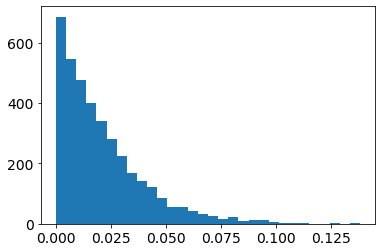

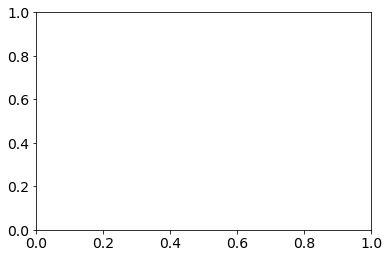

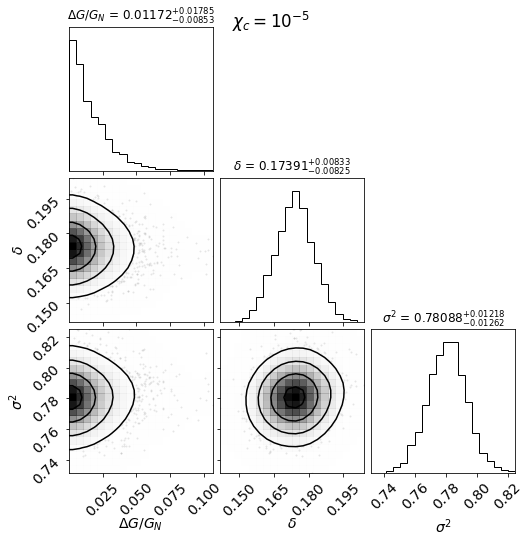

  0%|▏                                          | 4/918 [00:00<00:23, 38.27it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 2.5869978632026102e-06
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 1.851502999677472e-06
10213-1902 [50] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 50.0 0.0 8.982875489046642e-07
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 8.583136909390435e-07
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0 0.0 2.4011136131875864e-05
10218-12703 [50] [33

  1%|▌                                         | 12/918 [00:00<00:27, 33.35it/s]

10218-3704 [50] [-0.2423, -0.7324, -0.4111, -0.2502, -0.1409, -0.2076, -0.2494, -0.3265, -0.3433, -0.3506, -0.3606, -0.3689, -0.3645, -0.3466, -0.4111, -0.2985]
10218-3704 50.0 0.0 2.103666155855711e-06
10219-9102 [50] [1.3962, 1.1814, 0.7492, 0.4692, 0.3335, 0.2205, 0.1532, 0.1423, 0.1945, 0.153, 0.0798, 0.0216, -0.0715, -0.157, -0.0196, -0.0532, -0.0405]
10219-9102 50.0 0.0 9.69850424004992e-07
10220-12705 [50] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 50.0 0.0 1.185796898239096e-06
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 7.908296980120838e-06
10224-9101 [50] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 50.0 0.0 7.683377650634559e-07
10226-12704 [50] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694, 

  2%|▉                                         | 20/918 [00:00<00:27, 32.55it/s]

10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 1.535827713418461e-05
10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 2.013388761030576e-05
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 1.0819613073755917e-05
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 50.0 0.0 2.0953805580494497e-06
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 1.3583922964858016e-05
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.00

  3%|█▎                                        | 28/918 [00:00<00:28, 31.54it/s]

10495-12704 [50] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 50.0 0.0 9.39612314545262e-06
10495-12705 [50] [871.1598, 1245.0304, 1205.1955, 1347.7893, 1374.3588, 1517.2635, 1622.8998, 1633.9971, 1757.8692, 1799.4196, 1854.634, 1999.5551, 1849.1662, 1882.4866, 1807.1303, 1651.9125, 1681.1326, 1493.9167, 2771.4516, 2121.0254, 1992.5196]
10495-12705 50.0 0.0 6.336397004697673e-07
10495-3702 [50] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 50.0 0.0 2.112006400468482e-06
10496-12704 [50] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268.8121, 253.915, 333.7881, 358.7629, 315.1183, 261.3063, 216.6964, 267.188, 258.5169, 256.0365, 248.4992]
10496-12704 50.0 0.0 1.3807069787904154e-06
10496-12705 [50] [-0.38

  3%|█▍                                        | 32/918 [00:00<00:27, 32.52it/s]

10499-3702 [50] [-0.3822, -0.1753, 0.3237, 0.6092, 0.8357, 0.9307, 1.1046, 1.1845, 1.1657, 1.064, 1.005, 1.0954, 0.7875, 0.8892, 0.9769, 1.0508, 1.3156, 1.2283]
10499-3702 50.0 0.0 1.6684190885157704e-06
10499-3703 [50] [-0.0563, -0.0436, 0.024, 0.1267, -0.0775, -0.0664, 0.0153, -0.0929, -0.1244, -0.0851, -0.0939, -0.1131, -0.1033, -0.048, 0.0474, 0.0456, 0.0289, -0.0666, -0.0844, -0.5663]
10499-3703 50.0 0.0 1.5452786702520833e-06
10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 2.801537886438104e-06
10500-12704 [12.567965326633166] [140.7935, 35.4055, 16.1502, 8.7997, 6.1202, 5.6067, 5.0715, 4.9205, 5.0767, 4.6234, 4.2501, 4.0673, 3.8962, 3.8831, 3.7867, 3.6009, 3.0687, 4.1948, 2.9642, 3.5448, 1.9938, -0.2753, 2.8838, 5.8145]
10500-12704 12.567965326633166 8.670467847495224e-08 5.131802334771543e-07
10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 2.943191

  4%|█▊                                        | 40/918 [00:01<00:27, 31.91it/s]

10501-12704 [50] [1.3181, 1.9521, 1.9474, 1.8957, 2.0169, 2.066, 2.2805, 2.1361, 1.7635, 1.5052, 2.0197, 2.1387, 2.493, 1.9877, 1.7896, 1.1205, 1.6972, 2.5971]
10501-12704 50.0 0.0 2.0568866999860216e-06
10501-6101 [50] [54.152, 240.5257, 446.403, 593.882, 679.4829, 745.3089, 578.3118, 397.5307, 268.9797, 276.8619, 234.4717, 196.8602, 156.2454, 140.6324, 64.5922]
10501-6101 50.0 0.0 2.700532697511198e-06
10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 50.0 0.0 1.6417083232150406e-06
10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 1.0832280064359492e-06
10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 9.100375655809915e-06
10505-12704 [50] [0.62

  5%|██▏                                       | 48/918 [00:01<00:27, 31.93it/s]

10508-12703 [50] [0.5005, 0.4509, 0.1544, 0.1328, 0.1165, 0.1176, 0.065, 0.1329, 0.2506, 0.179, 0.1788, 0.1204, 0.0037, 0.016, -0.0301, -0.0876]
10508-12703 50.0 0.0 5.268964955024666e-06
10509-12703 [50] [1226.9439, 2166.987, 2538.8741, 2127.6504, 1648.0951, 1358.0909, 1167.9374, 985.8138]
10509-12703 50.0 0.0 2.889028658719757e-06
10509-1901 [50] [88.4511, 296.1948, 449.6905, 409.1127, 761.2326, 574.7336, 678.7086, 604.9771, 571.2616, 614.5332, 408.9334, 441.3848, 355.292, 300.996, 243.919, 230.1612, 180.5992, 163.4382, 176.2701, 193.176, 205.4741]
10509-1901 50.0 0.0 1.0571780320495922e-06
10509-6101 [50] [414.6573, 159.5598, 352.8386, 670.9188, 930.199, 434.1238, 984.9702, 921.6235, 784.8291, 825.2006, 827.4197, 661.5592, 624.5693, 894.3523, 620.0269, 747.519, 623.1939, 701.341, 577.342, 1031.0135, 622.2157, 697.4912, 668.4888, 271.226]
10509-6101 50.0 0.0 1.6684888932456775e-06
10511-12704 [50] [-0.0162, 0.2052, 0.0934, -0.0203, -0.0645, -0.0743, -0.1124, -0.1256, -0.1314, -0.1489

  6%|██▌                                       | 56/918 [00:01<00:27, 31.01it/s]

10512-12705 [50] [-0.9971, -0.9962, -0.9967, -0.9971, -0.9969, -0.9968, -0.9961, -0.9958, -0.9964, -0.9971, -0.9977, -0.9977, -0.9977, -0.9976, -0.998]
10512-12705 50.0 0.0 1.3759897855731052e-06
10512-9102 [50] [4147.3152, 2927.8473, 3245.8656, 2878.0674, 2617.7881, 2204.6977, 1695.8151, 1371.2689, 1298.2413, 1241.1228, 1357.9116, 1330.7104, 1714.839, 1930.3755, 2196.7284, 2401.8011, 2844.302, 3122.8481, 2925.4465]
10512-9102 50.0 0.0 1.203307767126552e-06
10513-12702 [50] [-0.9916, -0.9877, -0.9855, -0.9802, -0.9787, -0.98, -0.9868, -0.9787, -0.862, -0.9802]
10513-12702 50.0 0.0 2.4909481635845324e-06
10514-6103 [48.08040201005026] [0.5999, 0.3982, 0.2747, 0.2749, 0.0781, 0.0617, 0.0681, -0.0189, -0.0377, -0.0578, -0.065, -0.0594, 0.0253, -0.0317, 0.1182, -0.1428, -0.1895, -0.2508, -0.2991, -0.355]
10514-6103 48.08040201005026 3.0295348488557713e-09 5.969064475552866e-07
10516-6104 [50] [0.3084, -0.237, -0.3593, -0.3575, -0.3434, -0.2974, -0.3603, -0.4386, -0.4629, -0.4919, -0.5092, 

  7%|██▋                                       | 60/918 [00:01<00:27, 31.05it/s]

10518-12705 [50] [-0.1971, 0.2795, 0.1103, -0.0254, -0.0161, -0.0, 0.0208, 0.0333, 0.0023, -0.0238, -0.0544, -0.1612]
10518-12705 50.0 0.0 5.421326581110027e-06
10518-1902 [50] [-0.0105, 0.2572, 0.0495, 0.0308, 0.0287, -0.0677, -0.0841, -0.0885, -0.1994, -0.1432, -0.1195, -0.1634, -0.1173, -0.1219, -0.165, -0.1325, -0.1731]
10518-1902 50.0 0.0 2.3511660388895585e-06
10518-6102 [50] [-0.217, 1.2282, 0.4062, 0.3459, 0.382, 0.1799, 0.1478, 0.1175, 0.0995, 0.1358, 0.0812, 0.048, 0.0452, 0.0639, 0.0875, 0.0309, 0.0337, 0.0007, -0.0113, -0.1383]
10518-6102 50.0 0.0 1.4708338966253438e-06
10519-12704 [50] [-0.2611, 0.2686, 0.1702, 0.0601, 0.0584, 0.0258, -0.0515, -0.1077, -0.1123, -0.1006]
10519-12704 50.0 0.0 2.326082211079454e-06
10519-6102 [50] [15.342, 9.7033, 5.6052, 3.8579, 2.785, 2.1688, 1.9416, 1.9483, 2.0544, 1.8028, 1.946, 2.1855, 2.046, 2.3544, 2.1616]
10519-6102 50.0 0.0 4.501717003706764e-06
10520-12704 [50] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.0366

  7%|███                                       | 68/918 [00:02<00:27, 30.85it/s]

10838-9101 [50] [-0.0928, 0.4421, 0.4896, 0.3922, 0.2667, 0.3141, 0.2582, 0.2949, 0.294, 0.2543, 0.2198, 0.1153, 0.0076, -0.0625, -0.124, -0.1198, -0.272, -0.3696, -0.3534, -0.3974, -0.2337]
10838-9101 50.0 0.0 2.6800586613063755e-06
10839-12705 [50] [0.5531, 0.4188, 0.6271, 0.6342, 0.4074, 0.3206, 0.1512, 0.1105, 0.1154, 0.1763, 0.2141, 0.3291, 0.2868, 0.1635, 0.0391, 0.4134, 0.1807]
10839-12705 50.0 0.0 4.906061296561183e-06
10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712, 0.035, -0.0115, 0.0248, -0.0288, 0.0512, -0.0187, 0.0073, 0.0432, -0.0916, -0.1233, -0.1818, -0.1471]
10839-3704 50.0 0.0 1.8951762270887804e-06
10839-6101 [50] [244.3098, 615.0842, 876.8345, 1563.8627, 1705.1968, 1816.091, 1687.128, 1731.6052, 1640.9131, 1596.506, 1498.4971, 1406.0518, 671.6148, 995.7509]
10839-6101 50.0 0.0 1.7786149155120204e-06
10839-9101 [50] [2.1426, 2.2648, 0.9796, 0.8183, 0.5304, -0.0332, -0.1785, -0.3432, -0.3468, -0.4742, -0.4095, -0.6139, -0.5305, -0.616, -0.529, -0.5494, 0.8162, 3.2784]

  8%|███▍                                      | 76/918 [00:02<00:27, 30.78it/s]

10842-3703 [50] [-0.6099, -0.8101, -0.8807, -0.9171, -0.9297, -0.9289, -0.9268]
10842-3703 50.0 0.0 6.766401748055969e-07
10842-9101 [50] [-0.987, -0.9943, -0.9967, -0.9976, -0.9979, -0.998, -0.9982, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9981, -0.998, -0.9982, -0.9979, -0.9982, -0.9983]
10842-9101 50.0 0.0 9.850876173972298e-07
10845-12702 [50] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-12702 50.0 0.0 1.4058369052891742e-06
11004-12705 [50] [-0.8497, -0.6991, -0.5203, -0.3493, -0.2406, -0.2193, -0.1954, -0.1792, -0.1842, -0.1767, -0.1858, -0.1781, -0.195, -0.2173, -0.2294, -0.167, -0.2434, -0.1514, -0.3351, -0.2129]
11004-12705 50.0 0.0 8.960802388803528e-07
11004-3703 [50] [5607.0165, 6199.0745, 5122.0907, 4588.5334, 3798.1606, 3256.1827, 2909.7374, 2623.1995, 2081.3703, 1622.0266, 1252.6703, 1054.2993, 797.551, 805.4299, 667.6425]
11004-3703 50.0 0.0 9.751397721985026e-07
11004-6104 [50] [0.1363, 0.6537, 0.

  9%|███▋                                      | 80/918 [00:02<00:25, 32.61it/s]

11009-12704 [50] [-0.044, 0.5574, 0.4941, 0.5156, 0.452, 0.4031, 0.3736, 0.4191, 0.4646, 0.4848, 0.558, 0.4716, 0.2432, 0.3821, 0.6252, 0.8487, 0.8601]
11009-12704 50.0 0.0 2.5649727761428135e-05
11009-6102 [50] [0.2368, -0.3064, 0.0765, 0.1736, 0.0574, 0.1163, 0.1754, 0.2052, 0.2777, 0.3634, 0.3506, 0.3192, 0.3455, 0.323, 0.4447, 0.1481, 0.2577, -0.1338, 0.037, 0.1218, 0.8549, -0.5202]
11009-6102 50.0 0.0 1.4882863548345435e-06
11010-6104 [50] [669.1593, 612.5725, 580.2933, 433.0387, 377.072, 315.1925, 269.3918, 266.5579, 267.4688, 253.2676, 240.0639, 221.1944, 344.4065]
11010-6104 50.0 0.0 5.097713925558651e-06
11010-9101 [50] [2.5718, 0.9269, 0.2901, 0.1931, 0.0011, -0.0504, -0.0935, -0.075, 0.0093, 0.0203, 0.0025, -0.0251, -0.0362, 0.0004, 0.0161, -0.0012, -0.102, -0.364, -0.4377]
11010-9101 50.0 0.0 1.1049672342086755e-05
11011-12703 [50] [9.8651, 35.0102, 40.3579, 54.0601, 192.4013, 365.0512, 378.092, 411.2362, 282.7202, 230.5846, 329.2445, 263.6472, 244.1501]
11011-12703 50.0 0.

 10%|████                                      | 88/918 [00:02<00:26, 31.29it/s]

11012-3702 [50] [7.8974, 3196.585, 2734.8285, 2253.8811, 4078.0168, 2401.2221, 2680.4924, 2677.0305, 2494.671, 2122.0656, 2023.2433, 2124.4295, 1742.4806, 1879.5204, 1353.859, 1265.244, 1077.374, 829.3809, 807.9255, 437.3493, 291.3315]
11012-3702 50.0 0.0 6.507666972939311e-06
11012-9102 [50] [4.3613, 1.8587, 0.9243, 0.4611, 0.1717, 0.0565, -0.0003, -0.0124, 0.0149, 0.0346, 0.0094, 0.0256, 0.0391, 0.0441, 0.0302, -0.0599, -0.0933, -0.0179]
11012-9102 50.0 0.0 6.238288851142632e-06
11013-12702 [50] [0.7904, 0.6387, 0.0779, 0.1203, 0.0592, -0.004, -0.016, 0.0128, 0.0194, 0.059, 0.0663]
11013-12702 50.0 0.0 4.020257214813107e-06
11013-1902 [50] [0.7893, 0.6453, 0.5024, 0.4895, 0.4034, 0.2175, 0.0455, -0.0103, 0.0142, -0.2569, -0.0412, -0.2183, -0.1712, -0.0824, -0.3609, -0.2323, -0.3117]
11013-1902 50.0 0.0 6.291454353404468e-06
11013-3701 [50] [0.785, 0.6845, 0.2024, 0.0457, 0.0342, 0.02, -0.06, -0.0296, -0.0379, -0.1677]
11013-3701 50.0 0.0 3.365703466168853e-06
11013-3702 [50] [0.892, 

 10%|████▍                                     | 96/918 [00:03<00:26, 30.57it/s]

11017-12703 [50] [0.0185, 0.3093, 0.3468, 0.2632, 0.2308, 0.2072, 0.1992, 0.215, 0.2444, 0.2273, 0.053, -0.0123, 0.1078, -0.0553]
11017-12703 50.0 0.0 4.329273768673509e-06
11017-12704 [50] [0.4751, 0.4487, 0.3988, 0.2586, 0.0625, -0.0537, -0.0751, -0.1094, -0.1157, -0.1027, -0.1141, -0.1182, -0.1126, -0.1047, -0.0836, -0.1961, -0.2389]
11017-12704 50.0 0.0 1.0449705474339032e-06
11017-6103 [50] [-0.3235, -0.3265, -0.3479, -0.2253, -0.2261, -0.1769, -0.1311, -0.1075, -0.0747, -0.0989, -0.1378, -0.1695, -0.1257, -0.174, -0.178, -0.0714, -0.0163, 0.0028, 0.2262, -0.2731]
11017-6103 50.0 0.0 5.820558386026625e-06
11017-9101 [50] [-0.5273, 0.0425, 0.2188, 0.1666, 0.07, 0.0407, -0.0503, -0.1282, -0.2004, -0.2244, -0.1722, -0.1497, -0.0815, -0.0967, -0.1443, -0.1476, -0.1864, -0.1536, -0.2264, -0.18]
11017-9101 50.0 0.0 1.2661567949092884e-06
11018-12702 [50] [-0.9839, -0.9926, -0.9927, -0.9922, -0.9923, -0.9935, -0.9932, -0.9925, -0.9931, -0.994, -0.9941]
11018-12702 50.0 0.0 1.747740459109

 11%|████▋                                    | 104/918 [00:03<00:26, 30.67it/s]

11018-3703 [50] [-0.5454, 0.4164, 0.6741, 0.5852, 0.6907, 0.7028, 0.6059, 0.5528, 0.656, 0.6306, 0.5445, 0.5549, 0.4676, 0.4329, 0.3355, 0.3242, 0.462, 1.051, 0.5129, 1.3094]
11018-3703 50.0 0.0 4.10267306347664e-06
11018-6102 [50] [69.1052, 130.9961, 113.1141, 109.1797, 92.5989, 91.6354, 88.5765, 83.9604, 80.137, 76.3564, 74.3146, 74.7218, 70.495, 71.7331, 65.8452, 64.9321, 72.2612]
11018-6102 50.0 0.0 2.8030624267425686e-06
11019-12702 [50] [0.0142, 0.2516, 0.1906, 0.1378, 0.0877, -0.003, 0.0993, 0.0958, 0.1065, 0.1232, 0.2086, 0.1132, 0.0357, -0.0115, -0.014, 0.0302, -0.0875, -0.1071]
11019-12702 50.0 0.0 1.9538453246406656e-06
11019-12703 [50] [-0.4993, -0.4671, -0.3698, -0.2654, -0.2024, -0.2445, -0.2033, -0.2117, -0.2752, -0.2285, -0.2102, -0.0702, -0.1699, 0.0858, -0.1757, -0.2987]
11019-12703 50.0 0.0 1.1755227811725115e-05
11019-12705 [50] [0.9395, 1.6844, 1.8269, 0.8562, 0.7011, 1.016, 1.1247, 1.0992, 1.0844]
11019-12705 50.0 0.0 4.792976503886065e-06
11019-3701 [50] [2.5964,

 12%|████▊                                    | 108/918 [00:03<00:26, 30.45it/s]

11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 1.3828562599123398e-05
11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 7.843149079723278e-06
11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 7.319187788491229e-05
11742-12704 [50] [0.6702, -0.5312, -0.3481, 0.0047, 0.1348, 0.415, 0.2787, 0.5138, -0.0348]
11742-12704 50.0 0.0 1.2770076237084275e-06
11743-1901 [50] [-0.5717, -0.3943, -0.5273, -0.3736, -0.306, -0.392, -0.3766, -0.4151, -0.3665, -0.4111, -0.4236, -0.3424, -0.3877, -0.3594, -0.291, -0.4952, -0.6018]
11743-1901 50.0 0.0 8.83667413381048e-06
11744-9102 [50] [-0.

 13%|█████▏                                   | 116/918 [00:03<00:26, 30.36it/s]

11745-6104 [50] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.8527, 0.5703, 0.5078, 0.5176, 0.5143, 0.48, 0.4463, 0.4504, 0.4653, 0.4273, 0.4049]
11745-6104 50.0 0.0 1.913811456337092e-06
11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.0361, -0.076, -0.0711, -0.1542, -0.2041, -0.2119, -0.1066, -0.2705, -0.3138]
11745-9101 50.0 0.0 2.7140854698492493e-06
11746-3703 [50] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 50.0 0.0 3.6910353961820354e-06
11746-3704 [29.235235175879396] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 29.235235175879396 7.937291079874018e-08 5.203247089855794e-07
11746-9102 [50] [-0.478, -0.2133, -0.2528, -0.1774, -0.2077, -0.2266, -0.2099, -0.2691, -0.1996, -0.2

 13%|█████▍                                   | 123/918 [00:03<00:26, 29.65it/s]

11749-12704 [50] [1.1585, 1.0264, 1.2033, 1.4986, 1.8954, 2.0398, 2.1095, 2.1199, 1.4688, 1.3033, 0.9132, 0.8426, 0.0515, 0.4719, -0.3735]
11749-12704 50.0 0.0 7.560642443956518e-06
11749-3701 [50] [618.0455, 872.9003, 1483.1859, 1615.2011, 1553.7949, 1334.0598, 1385.5396, 1283.8547, 1216.0833, 1294.494, 1472.7433, 1080.4933, 1346.7897, 1196.9726, 1091.8413, 1216.7304, 927.7028, 363.0292, 281.9853, 551.8779, 169.9359, 54.7426, 122.374, 379.7425, 27.1507]
11749-3701 50.0 0.0 2.3649994822646976e-06
11750-12701 [50] [0.4224, 0.3089, 0.0791, 0.0892, 0.2329, 0.2222, 0.1114, 0.03, 0.0196, 0.0027, 0.0313, 0.0827, 0.0275, 0.3095]
11750-12701 50.0 0.0 3.586284011306391e-06
11750-3701 [50] [1.5964, 1.8766, 1.9419, 1.999, 1.4725, 1.2873, 1.1333, 0.934, 0.9463, 0.8918, 0.7347, 0.8508, 0.6677, 0.4619, 0.3762, 0.1866, 0.0367, 0.0915, 0.0086, 0.4665]
11750-3701 50.0 0.0 8.508821832607383e-07
11750-6103 [50] [6.303, 1.7001, 0.3933, 0.5417, 0.5248, 0.6298, 0.7207, 0.7282, 0.8046, 0.5691, 0.3659, 0.4083

 14%|█████▊                                   | 129/918 [00:04<00:26, 29.27it/s]

11751-1901 [50] [-0.9334, -0.8849, -0.9513, -0.9754, -0.9893, -0.9862, -0.989, -0.9902, -0.9893, -0.9909, -0.9903, -0.9906, -0.9888, -0.9874]
11751-1901 50.0 0.0 2.5630587433716167e-06
11751-6102 [50] [0.3738, 0.0535, 0.3785, 0.2124, 0.1333, 0.0258, -0.0223, -0.094, -0.1099, -0.1415, -0.1724, -0.2013, -0.1841, -0.253, -0.3949, -0.2255, -0.2141, -0.2775]
11751-6102 50.0 0.0 2.4186050202834808e-06
11753-3703 [50] [0.2801, 0.7604, 0.7391, 0.5795, 0.35, 0.1693, 0.0874, 0.0586, 0.0152, -0.0057, -0.0099, -0.0594, -0.1073, -0.139, -0.1496]
11753-3703 50.0 0.0 2.8255272494492217e-06
11753-6104 [50] [1.7058, 1.5787, 1.7231, 1.492, 1.0043, 0.8699, 0.6579, 0.5905, 0.5042, 0.4712, 0.4504, 0.6153, 0.6589, 0.6817, 0.5206, 0.5457, 0.5195, 0.692]
11753-6104 50.0 0.0 1.7104845273076293e-06
11754-1901 [50] [-0.2402, -0.5388, -0.5143, -0.4398, -0.487, -0.4664, -0.4721, -0.5334, -0.5004, -0.4954, -0.6115, -0.5884]
11754-1901 50.0 0.0 5.861667369410258e-06
11755-12701 [50] [-0.773, -0.7865, -0.7717, -0.752

 15%|██████                                   | 136/918 [00:04<00:26, 29.29it/s]

11755-6101 [50] [-0.0093, 1.0489, 0.9853, 1.2444, 1.0667, 0.8902, 0.7008, 0.6245, 0.5835, 0.5179, 0.397, 0.4083, 0.4791, 0.2148, 0.053]
11755-6101 50.0 0.0 1.8870217677490625e-06
11755-9102 [50] [0.1799, 0.2485, 0.3504, 0.383, 0.2088, 0.1465, 0.0712, -0.0042, -0.0415, -0.0215, 0.0671, 0.0623, 0.1393, -0.1017, 0.125, -0.214, -0.1458]
11755-9102 50.0 0.0 2.2513544236613278e-05
11758-3701 [50] [-0.3091, 0.0326, 0.2349, 0.1141, 0.0113, 0.06, -0.0268, -0.1507, -0.2171, -0.1994, -0.1587, -0.1557, -0.1574, -0.1614, -0.0618]
11758-3701 50.0 0.0 1.2348266959345545e-06
11758-3702 [50] [-0.544, -0.1141, 0.0167, 0.1028, 0.0854, -0.0041, -0.0149, 0.0406]
11758-3702 50.0 0.0 4.092289129374098e-06
11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 50.0 0.0 1.714422469479246e-06
11759-6102 [50] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, 

 15%|██████▎                                  | 142/918 [00:04<00:26, 29.13it/s]

11760-6101 [50] [0.4533, -0.0157, 0.5654, 0.502, 0.3995, 0.359, 0.3287, 0.2964, 0.2063, 0.2512, 0.2686, 0.2421, 0.2368, 0.1884, 0.0906, -0.0471, -0.3849, -0.319, -0.8166]
11760-6101 50.0 0.0 6.879443370130717e-06
11760-6103 [50] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.2117, -0.2373, -0.2365, -0.2317, -0.3078, -0.2653, -0.3184, -0.2638]
11760-6103 50.0 0.0 1.0367300812659615e-06
11760-9102 [50] [-0.8049, -0.6427, -0.2931, -0.1213, 0.1899, 0.0235, 0.108, 0.1381, 0.1732, 0.1865, 0.1624, 0.1963, 0.1218, 0.1215, 0.1223, 0.2636, 0.046, 0.5962, 0.1808, 0.9922, 2.2582]
11760-9102 50.0 0.0 1.3535355599583438e-06
11761-12702 [50] [-0.6826, -0.6017, -0.2216, -0.1122, -0.0329, -0.02, -0.0711, -0.0937, -0.0782, -0.098, -0.1546, -0.1024, -0.1043, -0.0648, -0.2102, -0.3314, -0.2483]
11761-12702 50.0 0.0 9.294792523895198e-06
11761-12703 [50] [0.4093, 0.08, -0.0588, -0.0478, 0.0006, -0.0009, -0.0617, -0.1284, -0.1046, -0.1135, -0.1247, -0.1623, -0.2191, -0.3

 16%|██████▋                                  | 150/918 [00:04<00:25, 30.18it/s]

11823-9101 [50] [15949.1976, 8800.0053, 8323.3916, 4811.1692, 2214.9858, 717.2733, 413.2719, 305.7873, 173.5393, 146.0478, 195.6604, 224.7593, 189.4201, 67.1778]
11823-9101 50.0 0.0 1.6598428040955938e-06
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 1.1267984476444407e-05
11828-12703 [50] [-0.5587, -0.2913, 0.1844, 0.3112, 0.2627, 0.2124, -0.0354, -0.0957, -0.1295, -0.1601, -0.0565, -0.1246, 0.0413]
11828-12703 50.0 0.0 2.240554591303364e-06
11830-12701 [50] [-0.9938, -0.9825, -0.9834, -0.9912, -0.9934, -0.9941, -0.9946, -0.9933, -0.9936, -0.9951, -0.9951, -0.9944, -0.9947, -0.9932, -0.9955, -0.9854, -0.997, -0.9939, -0.9962]
11830-12701 50.0 0.0 2.769679840803151e-06
11830-12703 [50] [-0.4776, 0.0437, 0.1582, -0.0709, -0.1607, -0.0754, 0.055, 0.2665, 0.1845, 0.03, 0.0663, -0.087, -0.2185, -0.1589, 0.0536, -0.3722]
11830-12703 50.0 0.0 4.81404405125538e-06
11830-3702 [50] [1.21

 17%|██████▉                                  | 154/918 [00:04<00:25, 29.65it/s]

11830-6104 [50] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.0353, -0.2063, -0.258, -0.2347, -0.2692, -0.3985]
11830-6104 50.0 0.0 2.5127307236862664e-06
11831-12703 [50] [0.4472, 0.0224, 0.062, 0.158, -0.0429, -0.0922, -0.1252, -0.188, -0.1276, -0.16, -0.2596, -0.2165, 0.1708, -0.4595]
11831-12703 50.0 0.0 8.658979670288224e-06
11831-12704 [50] [-0.5822, -0.2435, 0.0115, -0.0848, -0.1704, -0.028, -0.0888, -0.0323, -0.0445, -0.106, -0.3871, -0.1836]
11831-12704 50.0 0.0 1.942638493246685e-06
11831-6101 [50] [-0.9875, -0.994, -0.9968, -0.9973, -0.9967, -0.9975, -0.9969, -0.9978, -0.9979, -0.9971, -0.9984, -0.9986, -0.9985, -0.9974]
11831-6101 50.0 0.0 1.0920059130116059e-06
11831-6102 [50] [1.041, 0.6096, 0.4053, 0.165, 0.0902, 0.1922, 0.1873, 0.1187, 0.1055, 0.0085, -0.1108, -0.0737]
11831-6102 50.0 0.0 3.0809427617558545e-06
11833-9102 [50] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.

 17%|███████▏                                 | 160/918 [00:05<00:26, 28.78it/s]

11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 1.793729621080566e-05
11836-1902 [50] [0.7026, 1.2767, 1.1865, 1.1009, 0.973, 0.9921, 0.7024, 0.7206, 0.623, 0.6145, 0.5505, 0.5955, 0.6037, 0.4142, 0.4147]
11836-1902 50.0 0.0 9.204160008561392e-06
11838-12701 [50] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 0.1336, 0.0903, 0.0213, -0.0554, -0.0342, 0.0225, 0.0053, -0.0272]
11838-12701 50.0 0.0 4.594857847173309e-06
11838-12703 [50] [144.9042, 254.2159, 538.0129, 911.0748, 1089.8377, 1111.2623, 1284.2649, 1228.3752, 1345.2496, 1400.7846, 1427.4787, 1434.5371, 1257.47, 1184.9615, 998.2342, 830.6266, 670.98, 596.3078, 488.5417, 423.536, 329.6538, 32.3109, 5.6457, 31.8479]
11838-12703 50.0 0.0 1.5392593842794943e-06
11838-3702 [50] [0.536, 0.7094, 0.6061, 0.6555, 0.6466, 0.6204, 0

 18%|███████▍                                 | 167/918 [00:05<00:24, 31.20it/s]

11838-9101 [50] [11.4727, 10.3246, 9.7757, 7.6641, 6.3263, 7.7985, 4.6854, 6.1379, 3.8072, 5.5203, 3.0518, 3.9759, 1.4403, 2.8333, 2.6956, 2.5542]
11838-9101 50.0 0.0 2.124519149566212e-06
11865-12702 [50] [-0.057, -0.0512, 0.0778, -0.0002, -0.0743, -0.0834, -0.0854, 0.0083, -0.0154, -0.0332, -0.07, -0.1612, -0.2706]
11865-12702 50.0 0.0 1.7671254434894705e-06
11865-12704 [50] [0.4447, -0.0557, -0.3894, -0.457, -0.5111, -0.5109, -0.5238, -0.5353, -0.4955, -0.5012, -0.4831, -0.4726, -0.599, -0.615]
11865-12704 50.0 0.0 1.750738732609384e-06
11865-1901 [50] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 50.0 0.0 1.528295379114035e-06
11865-1902 [50] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0.4429]
11865-1902 50.0 0.0 1.9734539195157406e-06
11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 1.8002182080630825e-06
11865-9102 [50] [-0.467, -0.4695

 19%|███████▊                                 | 175/918 [00:05<00:24, 30.71it/s]

11867-9101 [50] [0.9073, 0.3027, 0.1546, 0.1123, 0.0285, 0.0159, -0.0244, 0.0205, 0.0824, 0.1908, 0.2079, 0.2195, 0.3058, 0.2425, 0.1871, 0.3056]
11867-9101 50.0 0.0 2.668238154035746e-06
11868-12703 [50] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 6.504474568450665e-06
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 1.6808376209497137e-05
11871-6103 [50] [0.7182, 0.8575, 0.776, 0.4737, 0.2556, 0.1173, 0.1395, 0.111, 0.0842, 0.0381, 0.0003, -0.0281, -0.0195, -0.044, -0.0588, -0.2086, -0.132, -0.377]
11871-6103 50.0 0.0 2.0046230049896875e-05
11940-1902 [50] [-0.0835, 0.1518, 0.1321, 0.0182, -0.0843, -0.1452, -0.1779, -0.1993, -0.1955]
11940-1902 50.0 0.0 9.894565550351515e-06
11940-3703 [1.2603] [1.1615, 1.5645, 1.5154, 1.5213, 1.3625, 1.1856, 0.9977, 0.7191, 0.6591, 0.6153, 0.3767]
11940-3703 1.2603 1.702423864181376e-07 4.271866676012

 20%|████████                                 | 180/918 [00:05<00:22, 32.70it/s]

11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 6.857942350322927e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 6.401111615377095e-05
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389.9946, 2439.1642, 2636.587, 2485.7262, 2056.7992, 1736.2622, 1623.5415, 1192.5228, 781.8483, 546.9719, 175.874]
11942-12704 50.0 0.0 3.847956377515931e-05
11942-6104 [43.39769949748744] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 43.39769949748744 1.629928145124956e-08 5.832177189913164e-07
11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.0425, -0.0331, -0.0546, -0.0982, -0.1371, -0.164, -0.179, -0.1863, -0.172, -0.1572, -0.1563, -0.1648, -0.1726, -0.27]
11943-3703 50.0 0.0

 20%|████████▍                                | 188/918 [00:06<00:23, 31.32it/s]

11945-12701 [50] [0.3961, 0.2879, 0.3765, 0.1557, -0.0002, -0.113, -0.1502, -0.128, -0.114, -0.1705, -0.0344, 0.0462, 0.017]
11945-12701 50.0 0.0 1.0948490604136505e-05
11945-6101 [50] [0.2057, 0.8606, 0.9637, 0.605, 0.4694, 0.2734, 0.2029, 0.1332, 0.0558, -0.0105, 0.0015, 0.0011, -0.0038, -0.016, 0.0504, -0.0338]
11945-6101 50.0 0.0 1.5165244619824376e-05
11945-6102 [50] [3.5224, 2.2109, 1.4349, 1.0152, 0.7457, 0.4864, 0.2556, 0.1192, 0.0508, 0.0117, -0.0209, -0.0683, -0.158, -0.0976, -0.2012]
11945-6102 50.0 0.0 7.358997578158001e-06
11947-6103 [50] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 50.0 0.0 3.789853043857847e-06
11949-12701 [50] [1.1975, 0.3408, 0.1441, 0.1243, 0.0225, 0.0003, 0.0028, 0.027, 0.0197, 0.0192, -0.0295, -0.0839]
11949-12701 50.0 0.0 5.245053229549621e-06
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716

 21%|████████▊                                | 196/918 [00:06<00:23, 30.90it/s]

11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.2778]
11954-3703 50.0 0.0 1.1353685238898902e-05
11954-9101 [50] [-0.9882, -0.9937, -0.9946, -0.9965, -0.9974, -0.9972, -0.997, -0.9969, -0.997, -0.9974, -0.9978, -0.9979, -0.9973, -0.9971, -0.9976, -0.9966]
11954-9101 50.0 0.0 1.2370645736519665e-05
11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 7.409132304052983e-06
11956-12702 [50] [5.6953, 5.0804, 3.2564, 2.1056, 1.2622, 0.6457, 0.4602, 0.5373, 0.9503, 3.7649, 5.1679]
11956-12702 50.0 0.0 5.223758129196992e-06
11956-12705 [50] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 0.2419, 0.2565, 0.3525, 0.1776, 0.103, 0.3387, 0.3814, 0.7221, 0.77]
11956-12705 50.0 0.0 6.792154559867387e-07
11957-12704 [1.8355788944723619] [-0.3492, 0.7667, 0.6853, 0.5861, 0.3661,

 22%|█████████                                | 203/918 [00:06<00:24, 28.88it/s]

11957-9102 [50] [1.0969, 0.3397, 0.6198, 1.0919, 1.791, 2.069, 2.6145, 2.7123, 2.8073, 2.4726, 2.1945, 1.9756, 2.1362, 4.7679, 3.0873, 1.2673, 3.459, 16.3037, 15.1044]
11957-9102 50.0 0.0 2.1750496746794533e-06
11958-6103 [50] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 50.0 0.0 7.199951981347999e-07
11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 4.922223392058424e-06
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 50.0 0.0 1.1093759585882344e-05
11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.9843, 0.6333, 0.3517, 0.1829, 0.1258, 0.0956, 0.1424, 0.1021, 0.028, 0.1221]
11965-9102 50.0 0.0 6.410920627616394e-06
11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.612

 23%|█████████▏                               | 207/918 [00:06<00:23, 29.71it/s]

11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.8986, 3.5843, 4.0724, 0.9129, 2.9875, 0.7205, 2.6408, 1.2362]
11969-6101 50.0 0.0 2.0616437890501058e-05
11970-12703 [0.1621] [-0.4888, -0.3498]
11970-12703 0.1621 2.825562428664348e-07 2.974819297016522e-07
11970-6102 [50] [-0.0116, -0.0683, -0.0558, -0.0053, 0.0454, 0.025, 0.078, -0.0283, -0.085, -0.1052, -0.0602, -0.0272, -0.0693, -0.0116, -0.1378, -0.2799, -0.2497]
11970-6102 50.0 0.0 2.380971571420252e-06
11970-6103 [50] [0.7466, 1.1751, 1.6643, 1.3977, 1.0416, 0.8262, 0.6871, 0.5199, 0.4194, 0.3266, 0.2718, 0.2909, 0.2357, 0.2575, 0.2139, 0.0837, -0.0144, -0.0619, 0.133]
11970-6103 50.0 0.0 4.9079410758615935e-06
11974-12702 [50] [-0.5341, -0.4596, -0.3852, -0.2683, -0.2117, -0.2349, -0.22, -0.1969, -0.1731, -0.1829, -0.2133, -0.2538, -0.2357, -0.256, -0.1504, -0.1437, -0.1349, 1.1183]
11974-12702 50.0 0.0 4.573615910352899e-06
11975-12701 [0.157] [-0.1741, -0.13]
11975-1270

 23%|█████████▌                               | 215/918 [00:07<00:24, 29.07it/s]

11975-3703 [50] [-0.2597, -0.0329, 0.0768, 0.0833, 0.1048, 0.0682, 0.0342, -0.0156, -0.0756, -0.093, -0.0695, -0.0466, 0.0656, -0.0085, 0.1237, 0.1334, 0.0646]
11975-3703 50.0 0.0 5.968629622409623e-06
11975-6104 [50] [1.0196, 1.2709, 1.5062, 1.1104, 0.9965, 0.7778, 0.776, 0.6311, 0.7603, 0.6278, 0.6208, 0.5151, 0.5172, 0.5343, 0.2326, 0.5012, 0.187, 0.4522, 0.1401, 0.1327]
11975-6104 50.0 0.0 3.257652159279375e-06
11976-12703 [50] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 50.0 0.0 4.176582457281977e-06
11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 50.0 0.0 1.3000739012689922e-06
11978-12705 [50] [0.0184, 0.0968, 0.695, 0.4819, 0.223, 0.1168, 0.1458, 0.1604, 0.1304, 0.1363, 0.1451, 0.1188, 0.0734, 0.0413, 0.0374, 0.0059, 0.0584, 0.0708]
11978-12705 50.0 0.0 1.7926571184738682e-06


 24%|█████████▉                               | 222/918 [00:07<00:23, 29.15it/s]

11979-12703 [50] [0.3188, 0.2646, 0.4444, 0.4735, 0.4231, 0.2818, 0.2037, 0.1891, 0.1975, 0.1625, 0.205, 0.2447, 0.1501, 0.1763, 0.1339, 0.4567, 0.4255, 0.53]
11979-12703 50.0 0.0 1.739860386024775e-05
11979-12704 [50] [1.0417, 0.8488, 0.6206, 0.5652, 0.598, 0.4342, 0.2822, 0.1334, 0.0604, 0.0319, 0.0291, -0.01, -0.083, -0.0554, -0.0215, -0.0081, 0.0344]
11979-12704 50.0 0.0 1.0764317275519728e-06
11979-9101 [50] [0.4094, -0.1099, -0.2651, -0.4134, -0.4241, -0.4727, -0.5, -0.5199, -0.5395, -0.5666, -0.5927, -0.5903, -0.6162, -0.591, -0.6704, -0.611]
11979-9101 50.0 0.0 1.0163344340541892e-06
11979-9102 [50] [0.6334, -0.323, -0.1351, -0.0857, 0.0053, 0.0302, 0.0467, 0.0752, 0.0566, 0.0459, 0.0116, 0.0269, 0.0046, -0.0156, -0.091, -0.1558, -0.3105, -0.4242, -0.5324]
11979-9102 50.0 0.0 2.284186760672143e-06
11981-12704 [50] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]
11981-127

 25%|██████████                               | 225/918 [00:07<00:24, 28.12it/s]

11981-9102 [50] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188, -0.1444, -0.128, -0.1812, -0.1904, -0.2284, -0.2044, -0.2061, -0.1486, -0.2345, -0.2114, 0.0329, 0.7603]
11981-9102 50.0 0.0 2.205784446066485e-05
11982-12704 [50] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.1555, 0.0797, -0.029, 0.0037, 0.2331]
11982-12704 50.0 0.0 1.8742537135164552e-06
11982-3703 [50] [-0.314, 0.4086, 0.6273, 0.7714, 0.9457, 0.986, 1.0945, 1.392, 1.3945, 1.539, 1.4145, 1.0397, 1.0282, 0.5616, 0.557, 0.0557]
11982-3703 50.0 0.0 1.4509324707867437e-06
11982-9102 [50] [-0.6167, -0.1298, 0.3235, 1.2078, 1.1438, 0.8069, 0.6394, 0.4963, 0.4228, 0.3252, 0.3069, 0.2838, 0.3393, 0.4905, 0.4567, 0.2311]
11982-9102 50.0 0.0 2.5417394523038016e-06
11984-12701 [50] [-0.2857, -0.1737, 0.0157, 0.0372, -0.1281, -0.2001, -0.1962, -0.1945, -0.1458, -0.0921, -0.099, -0.116, -0.1666, -0.325, -0.2122, -0.442]
11984-12701 50.0 0.0 3.378211297748244

 25%|██████████▎                              | 232/918 [00:07<00:25, 27.24it/s]

11984-12702 [50] [-0.2774, -0.3248, -0.3706, -0.3541, -0.339, -0.3481, -0.2877, -0.2577, -0.2022, -0.1466, -0.1889, -0.2485, -0.0638, -0.2124, -0.1581, -0.3914, -0.132]
11984-12702 50.0 0.0 2.302002972053804e-05
12066-3701 [50] [19.2418, 16.9197, 10.1428, 6.0915, 4.4316, 3.0783, 2.9929, 2.3906, 2.7183, 2.8356, 3.2869, 3.669, 3.475, 3.6088, 2.499, 1.7084, 1.9485, 1.5899]
12066-3701 50.0 0.0 4.359261079226355e-06
12067-12703 [50] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
12067-12703 50.0 0.0 1.854958338462045e-06
12067-12705 [50] [0.4291, 1.3434, 2.0219, 1.7622, 1.0305, 0.7583, 0.4763, 0.1261, 0.0511, 0.0662, 0.1502, 0.2361, 0.2324, 0.212, 0.3434]
12067-12705 50.0 0.0 2.0384593716957158e-06
12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 4.325928629118046e-05


 26%|██████████▋                              | 238/918 [00:07<00:26, 25.90it/s]

12068-6104 [50] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 50.0 0.0 5.439751617623753e-05
12069-12704 [50] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 50.0 0.0 2.611615575239679e-06
12069-12705 [50] [1.7332, 1.137, 0.4096, 0.6564, 0.5837, 0.6168, 0.2246, 0.0587, 0.2617, 0.1538, 0.5607, 0.4132, 0.5307, 0.41, 2.8782]
12069-12705 50.0 0.0 3.5196621674739052e-06
12069-6102 [50] [-0.3102, -0.0764, -0.2402, -0.1833, -0.1952, -0.2158, -0.2095, -0.1861, -0.144, -0.1353, -0.1037, -0.1026, -0.0816, -0.0956, -0.1367, -0.1477, -0.0871, -0.0667, -0.0387, -0.58, -0.56, -0.5359, -0.8946, 0.038]
12069-6102 50.0 0.0 4.194983142886702e-06
12071-12701 [50] [-0.9172, -0.8384, -0.6786, -0.6994, -0.7429, -0.7686, -0.7662, -0.8217, -0.8275, -0.8401, -0.7831, -0.8143]
12071-12701 50.0 0.0 2.0486538

 27%|██████████▉                              | 244/918 [00:08<00:26, 25.16it/s]

12071-3702 [50] [43.1041, 1833.3653, 2193.0557, 2409.7616, 2285.0769, 1925.6484, 1966.7994, 2043.2628, 1997.8474, 1832.4832, 1658.3071, 1528.5931, 1298.5116, 1014.8264, 552.6982, 136.4828]
12071-3702 50.0 0.0 1.7308830299301665e-06
12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.3083, 398.9949, 258.1108, 178.8144, 146.4641, 210.3609, 51.4796, 32.8354, 22.052]
12071-3704 50.0 0.0 2.2820399341112977e-06
12075-12704 [50] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 50.0 0.0 3.743488040457292e-06
12078-12703 [50] [0.3298, 0.5608, 0.2182, 0.3221, 0.2303, 0.0896, 0.0846, 0.2051, 0.3186, 0.33, 0.2532]
12078-12703 50.0 0.0 2.611001431932681e-06
12078-6103 [50] [1.9637, 5.3953, 4.122, 4.276, 4.2033, 3.4926, 3.3028, 3.2038, 3.1762, 3.0769, 2.868, 2.5911, 2.6527, 2.4952, 2.6226, 2.6979, 2.1328, 1.6158, 1.3218, 1.8508]
12078-6103 50.0 0.0 9.611111597415853e-07
12079-12705 [12.076373

 27%|███████████▏                             | 251/918 [00:08<00:25, 26.01it/s]

12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 1.482860442889215e-05
12082-12702 [50] [52.4225, 34.225, 22.353, 15.87, 12.6473, 9.0293, 9.0994, 7.7946, 7.7752, 7.6215, 7.2913, 5.8669, 7.5773, 10.9051, 27.4723, 42.4809, 31.8612, 44.26]
12082-12702 50.0 0.0 2.620046987760848e-06
12084-12702 [50] [0.4179, 1.0492, 0.9255, 0.717, 0.5874, 0.4344, 0.359, 0.2445, 0.1712, 0.1342, 0.2131, 0.2682, 0.3105, 0.3163]
12084-12702 50.0 0.0 4.801724182744633e-06
12084-12704 [50] [-0.663, -0.3425, -0.4511, -0.3814, -0.1944, -0.0031, -0.041, -0.1276, -0.2047, -0.2499, -0.2565, -0.1988, -0.1657, -0.268, -0.3391, -0.2896]
12084-12704 50.0 0.0 5.9172077855374895e-06
12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-12705 50.0 0.0 1.3865995662222954e-06


 28%|███████████▎                             | 254/918 [00:08<00:26, 25.28it/s]

12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.419, 0.387, 0.4139, 0.5272, 0.4564, 0.6029, 0.4957, 0.5971, 0.6267, 0.5749, 0.7061, 0.6081, 0.5243, 0.4383, 0.5097, 0.4647, 0.2768, 0.3996, 0.231, 0.2274, 0.4698, 0.2204, 0.2727]
12084-1901 50.0 0.0 2.9896033397394624e-06
12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
12084-3702 50.0 0.0 2.28708265362444e-06
12084-3703 [50] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.866, 9.9199, 8.0438, 7.1191, 7.1184, 4.9585, 5.2578]
12084-3703 50.0 0.0 9.089024623666449e-06
12084-6104 [50] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.0374, 0.0776, -0.025, -0.0223, -0.0093, -0.0487, 0.0214, -0.2045, 0.0836]
12084-6104 50.0 0.0 2.039997522537759e-06
12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0.0

 29%|███████████▊                             | 264/918 [00:08<00:19, 33.53it/s]

12088-12705 [50] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-12705 50.0 0.0 1.438243367695859e-06
12088-9101 [50] [1.3886, 1.0744, 0.6164, 0.1772, -0.0928, -0.1728, -0.2424, -0.3552, -0.3861, -0.4243, -0.4358, -0.4341, -0.4454, -0.4408]
12088-9101 50.0 0.0 9.985958342116093e-06
12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-12702 50.0 0.0 7.096448248770661e-07
12089-12704 [50] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 50.0 0.0 1.2769459352137686e-05
12089-1901 [50] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 50.0 0.0 2.1814201980170292e-05
12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722,

 30%|████████████▎                            | 276/918 [00:09<00:17, 35.87it/s]

12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 3.0526347236274706e-06
12483-12703 [50] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -0.0898]
12483-12703 50.0 0.0 2.1682190209502873e-06
12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 3.856279556098334e-06
12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 1.7507251474341549e-06
12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 50.0 0.0 2.789808929435598e-06
12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696

 31%|████████████▋                            | 285/918 [00:09<00:16, 38.27it/s]

12490-3701 [50] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-3701 50.0 0.0 5.1894101866638105e-05
12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0.0863]
12506-12701 50.0 0.0 1.0805439598169927e-05
12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0.0 3.5812231233854612e-06
12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0 0.0 8.820355510040634e-07
12512-12702 [50] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 50.0 0.0 1

 32%|█████████████                            | 293/918 [00:09<00:16, 37.82it/s]

12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 0.0 1.3191717125157773e-06
12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.1091]
12518-9101 50.0 0.0 1.951955982940763e-06
12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 6.534043327908164e-06
12620-6104 [50] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 50.0 0.0 3.0882051295261652e-06
12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 3.650432144203833e-06
12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.

 32%|█████████████▎                           | 297/918 [00:09<00:16, 37.47it/s]

12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 6.087872243359434e-06
12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 1.089771685864606e-05
12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 5.9334382913951e-06
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 1.2447866729877584e-05
12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 3.23054206219952e-05
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606

 34%|█████████████▊                           | 310/918 [00:09<00:16, 36.95it/s]

7443-12703 [50] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 50.0 0.0 7.87425273575793e-07
7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1547, -0.1713, -0.2761, -0.2934, -0.2123]
7443-12704 50.0 0.0 5.2307738027914265e-06
7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 1.2299205275295232e-06
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.0333, -0.0403, -0.0345, -0.091, -0.0525, -0.2174, -0.2135, -0.5859, -0.4094]
7443-9101 50.0 0.0 9.45387313394106e-07
7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.12

 34%|██████████████                           | 314/918 [00:10<00:17, 35.34it/s]

7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 1.2860975177051808e-06
7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 7.335538655460336e-07
7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 2.631230532453722e-06
7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 7.63229661375945e-07
7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 3.227972008033022e-06
7958-610

 35%|██████████████▍                          | 322/918 [00:10<00:17, 34.40it/s]

7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 4.922059734155487e-06
7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 4.774871626811393e-06
7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 5.398637660796759e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 6.918936264333905e-06
7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 5.236067782619399e-06
7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883,

 36%|██████████████▋                          | 330/918 [00:10<00:16, 35.28it/s]

7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.0 1.4344161953300353e-06
7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 5.3205611626512894e-06
7962-12705 [50] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 0.4867, 0.496, 1.2096, 1.0729, 0.2753, 1.3845, 3.2136]
7962-12705 50.0 0.0 1.3561851355877566e-06
7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 50.0 0.0 2.1807191130758674e-06
7963-12702 [50] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986

 37%|███████████████                          | 338/918 [00:10<00:16, 34.98it/s]

7964-9102 [50] [1.3184, 2.0432, 2.1685, 1.6268, 1.1481, 0.9036, 0.7405, 0.65, 0.5829, 0.509, 0.4898, 0.4008, 0.3018, 0.164, 0.0815, 0.0631, 0.0748, -0.1094, 0.1287]
7964-9102 50.0 0.0 3.894893795577627e-06
7965-12701 [9.591429145728643] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085, -0.0802, -0.1254, -0.0438, 0.0028, -0.0995, -0.4017]
7965-12701 9.591429145728643 3.187568300981438e-08 5.68037778103144e-07
7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-1901 50.0 0.0 2.22738258620071e-06
7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 50.0 0.0 7.378400923718174e-07
7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211

 38%|███████████████▍                         | 347/918 [00:11<00:15, 36.72it/s]

7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 2.8074924046437094e-05
7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 1.2684394188993337e-06
7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 8.676716146421307e-06
7977-1902 [0.4547] [0.1072, 0.2856, 0.0387, 0.0618]
7977-1902 0.4547 1.7973503473494532e-07 4.187367808804302e-07
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 7.199085640953888e-06
7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011

 39%|███████████████▊                         | 355/918 [00:11<00:16, 34.88it/s]

7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 8.942441340497368e-06
7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 50.0 0.0 1.77751007087556e-06
7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 6.829197457990712e-06
7990-6104 [50] [-0.3051, -0.0723, 0.2152, 0.3465, 0.313, 0.5262, 0.4361, 0.3236, 0.3249, 0.3219, 0.2532, 0.2184, 0.247, 0.3244, 0.1338, 0.4143, 0.0484]
7990-6104 50.0 0.0 7.907940627711549e-06
7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 2.5176078264960414e-05
7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -0.

 40%|████████████████▏                        | 363/918 [00:11<00:15, 34.78it/s]

8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 50.0 0.0 1.2953310619422937e-06
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 4.261248879119698e-06
8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 2.4987991526298753e-06
8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 1.4246659675826242e-05
8078-12703 [50] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 9.753362594431048e-06
8078-6103 [50] [0.6747, 0.2703, 0.

 40%|████████████████▍                        | 367/918 [00:11<00:16, 33.95it/s]

8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 3.2051565006175662e-06
8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 5.3970600470376675e-06
8081-3704 [50] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 50.0 0.0 8.140248444898499e-07
8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 4.39032367880537e-06
8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1

 41%|████████████████▋                        | 375/918 [00:11<00:17, 31.18it/s]

8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 2.9254812569070236e-06
8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 2.2663149308687606e-06
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 3.1166585132011097e-06
8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 50.0 0.0 1.0853743151512889e-06
8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 2.436619637463776e-06
8091-1902 [50] [-0.6003, -0.5042, -0.5743, -0.477

 42%|█████████████████                        | 383/918 [00:12<00:16, 32.53it/s]

8092-12702 [13.183740703517586] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 13.183740703517586 1.845356377716863e-07 4.152904555377221e-07
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 50.0 0.0 2.6115415505088894e-06
8095-6102 [4.210894472361809] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276, 0.127, 0.1403, 0.0994, 0.0731, 0.0391, -0.0442, -0.086, -0.1131, -0.1728, -0.221, -0.1357, -0.3768, -0.0266, -0.186, -0.3752]
8095-6102 4.210894472361809 1.2480923304724479e-07 4.750633533558888e-07
8131-6101 [50] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.3082, -0.2951, -0.2734, -0.3441, -0.2421, -0.3611, -0.4068, -0

 43%|█████████████████▍                       | 391/918 [00:12<00:15, 33.84it/s]

8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 4.112707659700335e-06
8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 5.210542348977438e-06
8135-12702 [0.456] [-0.0587, -0.0535, 0.1564, 0.1223, 0.0981]
8135-12702 0.456 1.7375498183496087e-07 4.043432243880249e-07
8137-12703 [50] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1275, -0.1695, -0.3013, -0.3381]
8137-12703 50.0 0.0 6.179830308603594e-07
8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 50.0 0.0 5.207756744019835e-06
8138-12702 [50] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3

 43%|█████████████████▊                       | 399/918 [00:12<00:16, 32.41it/s]

8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 1.7255399952745564e-06
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 5.773307371517563e-06
8140-3701 [0.6494] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106]
8140-3701 0.6494 1.2495277590112714e-07 4.685745858447906e-07
8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 6.6946813420680116e-06
8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 4.323917808080803e-06
8144-12702 

 44%|█████████████████▉                       | 403/918 [00:12<00:15, 32.66it/s]

8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 2.862229542651031e-06
8144-6101 [1.0538] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271]
8144-6101 1.0538 8.26543051121534e-08 5.163441131681705e-07
8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 2.4927402141271746e-05
8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 1.2135382232138849e-06
8145-9101 [50] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 50.0 0.0 4.72077476383763e-06
8146-12701 [50] [0.0601, 0.0138, -0.1773, 

 45%|██████████████████▎                      | 411/918 [00:13<00:16, 30.82it/s]

8146-9102 [12.725171859296482] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 12.725171859296482 1.4953317937127024e-07 4.495961462640565e-07
8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 4.455810473715013e-06
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 3.0101421149060902e-05
8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 9.956147223920772e-06
8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0

 46%|██████████████████▋                      | 418/918 [00:13<00:17, 29.09it/s]

8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 5.190286843637433e-05
8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 2.113605498111486e-06
8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 1.492953289399334e-06
8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 2.7387508162200315e-05
8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 2.81710315491717e-06
8155-6102 [50] [-0.9892, -0.965, -0.

 46%|██████████████████▉                      | 424/918 [00:13<00:18, 26.02it/s]

8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 1.4825236152272179e-06
8156-3701 [50] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 50.0 0.0 8.52264737781716e-07
8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 7.084703020010363e-06
8158-6104 [25.999811557788945] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 25.999811557788945 1.0324164797971199e-07 4.957341071989359e-07
8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.999

 47%|███████████████████                      | 427/918 [00:13<00:18, 26.11it/s]

8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 3.4541230113946198e-06
8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 1.2928006744481556e-05
8241-6102 [50] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 50.0 0.0 6.968746393979922e-07
8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 4.2534122742571976e-05
8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 1.52790

 47%|███████████████████▍                     | 434/918 [00:13<00:17, 28.31it/s]

8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 9.16673971605419e-07
8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 5.0116677315945745e-06
8247-12703 [0.7372] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198]
8247-12703 0.7372 2.134222809209385e-07 3.7617915797120436e-07
8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 2.676634367971674e-06
8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247-9101 50.0 0.0 2.4950437196842723e-06
8248-12701 [50] [7

 48%|███████████████████▊                     | 443/918 [00:14<00:17, 27.67it/s]

8248-12702 [50] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 50.0 0.0 4.13171883545233e-06
8248-12704 [50] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 50.0 0.0 2.258927278857874e-06
8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 3.7985269324384946e-06
8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 3.419832222310752e-06
8249-6102 [50] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 50.0 0.0 8.138430142507156e

 49%|███████████████████▉                     | 446/918 [00:14<00:17, 27.58it/s]

8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 3.2900741048030145e-06
8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 3.90761987632765e-06
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 1.8542588479167536e-05
8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 1.9726360245250653e-05
8252-6104 [0.9491] [2.1127, 786.7076, 1821.9152, 1629.0467, 2046.2674, 2117.149, 2080.0223, 1991.9705, 2037.8148]
8252-6104 0.9491 1.0516864641974034e-07 4.791861973628137e-07


 49%|████████████████████▏                    | 453/918 [00:14<00:16, 27.38it/s]

8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-3703 50.0 0.0 1.2173943728877588e-06
8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 9.104651984287327e-06
8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 2.326214400970345e-06
8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 1.855517223659012e-06
8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 3.099219172276397e

 50%|████████████████████▌                    | 459/918 [00:14<00:16, 27.04it/s]

8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 1.1907166322191243e-06
8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 1.1389027720233384e-06
8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 4.40462409276226e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 4.8233846839414006e-05
8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999

 51%|████████████████████▊                    | 465/918 [00:15<00:17, 26.17it/s]

8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 2.0502358347409082e-06
8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 6.529529224375689e-06
8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 4.180816053589865e-06
8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 5.102599122213382e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.

 51%|█████████████████████                    | 471/918 [00:15<00:18, 23.62it/s]

8263-12705 [50] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 50.0 0.0 2.4208636532504936e-06
8310-3701 [50] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 50.0 0.0 1.0207275105689993e-06
8310-9101 [50] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 50.0 0.0 2.0376319418750684e-06
8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 3.342165255062215e-06


 52%|█████████████████████▏                   | 474/918 [00:15<00:22, 19.84it/s]

8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 3.126952038195791e-06
8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 5.794739537114086e-06
8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 2.0327780849061958e-05


 52%|█████████████████████▎                   | 477/918 [00:15<00:24, 17.86it/s]

8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 4.018764247953881e-06
8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 9.964422185421151e-06
8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 2.0911175166954377e-05


 52%|█████████████████████▍                   | 479/918 [00:15<00:26, 16.83it/s]

8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 3.1344656871534755e-06
8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 1.2025635883913757e-05
8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 7.043250422652824e-06
8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 9.534146259961962e-06


 53%|█████████████████████▋                   | 485/918 [00:16<00:26, 16.36it/s]

8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 3.515186081694864e-06
8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 1.3672061397022563e-06
8317-9101 [6.243724623115578] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 6.243724623115578 1.7111283794640915e-07 4.285682661087131e-07


 53%|█████████████████████▊                   | 487/918 [00:16<00:27, 15.51it/s]

8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 1.197380551990748e-06
8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 9.105345297966106e-06
8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 1.274107288240211e-06


 53%|█████████████████████▉                   | 491/918 [00:16<00:28, 14.98it/s]

8318-6101 [50] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 50.0 0.0 2.0635619437132387e-05
8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 4.747943475322706e-06
8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 6.445016447528324e-06


 54%|██████████████████████                   | 493/918 [00:16<00:29, 14.54it/s]

8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 7.379327583559916e-07
8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 7.166793481348052e-06
8320-9102 [50] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 50.0 0.0 2.6254114199822473e-06
8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 1.2263237803540242e-05
8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 2.0282883211375505e-06


 54%|██████████████████████▎                  | 499/918 [00:17<00:23, 18.04it/s]

8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 8.945181975010815e-06
8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 1.0927187620391492e-06
8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 1.0224509198965891e-05
8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 9.913752445125294e-07
8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752

 55%|██████████████████████▌                  | 505/918 [00:17<00:20, 19.79it/s]

8329-6103 [50] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 50.0 0.0 7.17993132006437e-07
8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 1.2947738215072093e-06
8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 2.0844471101320777e-06
8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 9.975586527161464e-07
8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 7.063996087027042e-07


 55%|██████████████████████▋                  | 508/918 [00:17<00:21, 18.95it/s]

8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 1.6024165803749217e-06
8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 7.800635408150723e-07
8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 7.2648041373234e-06


 56%|██████████████████████▊                  | 512/918 [00:17<00:23, 16.93it/s]

8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 8.434133675174583e-07
8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 7.345109929855808e-07
8334-3704 [0.8468] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409]
8334-3704 0.8468 1.9524125501198543e-07 4.035593371220469e-07
8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 2.0070595115799812e-06


 56%|██████████████████████▉                  | 514/918 [00:17<00:25, 15.78it/s]

8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 6.427584577128391e-06
8336-9102 [50] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 50.0 0.0 6.254590631487318e-07
8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 8.380149376193287e-06


 56%|███████████████████████▏                 | 518/918 [00:18<00:28, 14.21it/s]

8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 2.7313785846248258e-06
8341-9101 [44.54846834170854] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 44.54846834170854 5.98325426746862e-09 5.93838841096463e-07
8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 2.6488786321630955e-06


 57%|███████████████████████▎                 | 522/918 [00:18<00:29, 13.58it/s]

8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 4.690334647473455e-06
8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 3.7845027922423855e-05
8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 3.6953857519743567e-06


 57%|███████████████████████▍                 | 524/918 [00:18<00:29, 13.32it/s]

8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 3.7221928453135927e-06
8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 3.304711867221864e-06
8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 3.399029470113476e-06


 57%|███████████████████████▍                 | 526/918 [00:18<00:29, 13.07it/s]

8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 8.775299140065164e-07
8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 1.309806375403158e-06
8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 1.1118434194485566e-05


 58%|███████████████████████▊                 | 532/918 [00:19<00:25, 15.17it/s]

8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 1.0857232549039232e-06
8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 1.0273810005136925e-05
8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 1.0201412996376221e-05
8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 1.4102725410951933e-06


 58%|███████████████████████▉                 | 537/918 [00:19<00:20, 18.40it/s]

8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 1.27618792173775e-05
8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 7.327031016816417e-06
8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 2.0446936582622798e-05
8445-3701
8446-12702 [50] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 50.0 0.0 6.096742321838176e-07
8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 1.5067090956068433e-05


 59%|████████████████████████▏                | 542/918 [00:19<00:19, 19.47it/s]

8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 5.674268600967238e-06
8447-12701 [50] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 50.0 0.0 7.212879220505981e-07
8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 3.0349759223702324e-06
8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 1.56143575513085e-06


 60%|████████████████████████▍                | 548/918 [00:20<00:18, 20.22it/s]

8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 4.981720984731386e-06
8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 3.959947972360833e-06
8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 9.832551957471062e-06
8452-9102 [50] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 50.0 0.0 8.919893107652075e-07


 60%|████████████████████████▌                | 551/918 [00:20<00:18, 20.26it/s]

8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 6.248800218737987e-06
8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 5.366364030993853e-06
8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 7.673344383680453e-07
8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 1.3747181925161017e-06
8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 1.1193868996807477e-06


 61%|████████████████████████▉                | 557/918 [00:20<00:17, 20.40it/s]

8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 3.99874545987515e-06
8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 3.631119986922296e-06
8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 9.080137184977235e-07
8459-6101 [50] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 50.0 0.0 6.90582565626739e-07
8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649

 61%|█████████████████████████                | 560/918 [00:20<00:17, 20.39it/s]

8464-12704 [50] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 50.0 0.0 2.7413100609551605e-06
8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 1.6779968452893392e-06
8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 5.941962819831013e-06
8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 7.633302264997226e-06
8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 4.6

 62%|█████████████████████████▎               | 566/918 [00:20<00:17, 20.29it/s]

8466-12702 [0.7532] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658, 0.1059, 0.0792]
8466-12702 0.7532 7.006836479555927e-08 5.228468309001218e-07
8482-12703 [50] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 50.0 0.0 2.02829341177797e-06
8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 3.8055535717952664e-06
8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 1.655251308997254e-06


 62%|█████████████████████████▍               | 569/918 [00:21<00:17, 19.43it/s]

8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 6.137565783500895e-06
8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 1.2210029128272644e-05
8485-9102 [3.496970854271357] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 3.496970854271357 8.57021036491141e-08 5.138681374988844e-07
8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 9.738316607180535e-07


 63%|█████████████████████████▋               | 575/918 [00:21<00:17, 19.83it/s]

8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 1.6442519288626635e-05
8547-6102 [0.7518] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575]
8547-6102 0.7518 1.5295627234788195e-07 4.460645089022469e-07
8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 50.0 0.0 7.777207207824516e-07
8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 1.4539819997342672e-06
8549-6102 [50] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 50.0 0.0 6.098430938133939e-07


 63%|█████████████████████████▊               | 579/918 [00:21<00:17, 19.23it/s]

8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 2.03505077759198e-05
8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 9.93847409380923e-07
8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 4.791916480267681e-06
8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 1.1340594712362258e-06


 64%|██████████████████████████               | 583/918 [00:21<00:18, 18.57it/s]

8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 1.3723046344140668e-06
8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 1.456655892499605e-06
8555-12702 [50] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 50.0 0.0 1.571697889533593e-06
8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 2.1139923433161765e-06


 64%|██████████████████████████▏              | 587/918 [00:22<00:18, 18.26it/s]

8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 1.9235696226454105e-06
8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 1.6086722492869404e-06
8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 3.3555308810834387e-06
8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 4.73160791929075e-06


 64%|██████████████████████████▍              | 591/918 [00:22<00:18, 18.10it/s]

8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 1.3552595304279034e-06
8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 6.105699273416889e-06
8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 2.7044685161271712e-06
8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 3.5913181467835044e-06


 65%|██████████████████████████▌              | 595/918 [00:22<00:17, 18.59it/s]

8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 8.151492625740351e-07
8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 8.485352723402395e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 1.716538900778303e-06
8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 2.2620498944070807e-06


 65%|██████████████████████████▊              | 599/918 [00:22<00:17, 17.79it/s]

8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 1.331200769529275e-06
8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 1.7300393048537379e-06
8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 1.722664126992596e-06
8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 1.7144474185156683e-05


 66%|██████████████████████████▉              | 603/918 [00:22<00:18, 17.12it/s]

8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 9.782946758917792e-06
8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 2.246748083991329e-05
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 2.2087884873149713e-05
8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 1.615318697089245e-05


 66%|███████████████████████████              | 607/918 [00:23<00:18, 16.91it/s]

8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 2.3960548742093258e-06
8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 2.347901049762966e-06
8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 4.6172120456415495e-06
8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 6.855886986550071e-06


 67%|███████████████████████████▎             | 611/918 [00:23<00:18, 17.03it/s]

8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 1.7578123038433964e-06
8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 3.1060722958763807e-06
8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 1.6182019493308437e-06
8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 1.0679911404361993e-05


 67%|███████████████████████████▍             | 615/918 [00:23<00:17, 17.19it/s]

8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 9.810162696722075e-07
8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 5.410975032484561e-06
8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 9.222928036653537e-06
8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 2.4602435959186077e-06


 67%|███████████████████████████▋             | 619/918 [00:23<00:17, 17.37it/s]

8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 4.29656078210002e-06
8597-6103 [0.1546] [-0.1805]
8597-6103 0.1546 2.4779019492011335e-07 3.369175469554045e-07
8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 1.391195326328009e-06
8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 5.0323501312410765e-06


 68%|███████████████████████████▊             | 623/918 [00:24<00:17, 16.99it/s]

8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 6.449061670664163e-06
8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 6.49667796982401e-05
8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 7.264145090728246e-06
8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 3.1776808738037485e-05


 68%|████████████████████████████             | 627/918 [00:24<00:16, 17.32it/s]

8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 8.672745254538033e-06
8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 7.1320449225688984e-06
8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 3.732366390454227e-06
8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 1.0552679057913283e-05


 69%|████████████████████████████▏            | 631/918 [00:24<00:16, 17.49it/s]

8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 3.0495504326557803e-06
8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 7.808733656739787e-05
8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 3.386052051959214e-06


 69%|████████████████████████████▎            | 635/918 [00:24<00:15, 17.92it/s]

8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 8.773204849220237e-06
8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 1.2043917722860675e-06
8610-6101 [0.5518] [0.9237, 0.7275, 0.6377, 0.5194]
8610-6101 0.5518 9.80951622045342e-08 5.008583056466037e-07
8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 1.5557264660472715e-06


 69%|████████████████████████████▍            | 638/918 [00:24<00:13, 20.18it/s]

8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 6.211300775589077e-05
8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 3.418954884381226e-05
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 5.0106365265416584e-05
8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 1.1069034982767558e-05


 70%|████████████████████████████▋            | 643/918 [00:25<00:15, 18.30it/s]

8613-12702 [50] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 50.0 0.0 8.209580013348717e-07
8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 3.703619397292321e-06
8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 1.3005501394812375e-06
8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 1.089830931860048e-06


 70%|████████████████████████████▉            | 647/918 [00:25<00:15, 17.67it/s]

8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 4.510803513116488e-06
8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 7.5153198712311405e-06
8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 7.322996557879807e-06
8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 2.4594057836051814e-06


 71%|█████████████████████████████            | 651/918 [00:25<00:15, 16.80it/s]

8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 5.730402531402746e-06
8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 8.080099150247892e-07
8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 1.3707166873935111e-06
8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 2.4755603034523168e-05


 71%|█████████████████████████████▎           | 655/918 [00:25<00:16, 16.17it/s]

8624-12702 [50] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 50.0 0.0 1.6730401754803156e-06
8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 6.0392402940076245e-06
8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 6.50400804832409e-05
8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 5.160863826315387e-05


 72%|█████████████████████████████▍           | 659/918 [00:26<00:16, 15.96it/s]

8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 2.777871934427175e-05
8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 5.4633962471012676e-05
8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 1.50751249336184e-05
8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 1.093099208914807e-05


 72%|█████████████████████████████▌           | 663/918 [00:26<00:16, 15.75it/s]

8651-12702 [50] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 50.0 0.0 9.10266206686032e-07
8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 3.6288031510998724e-06
8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 1.2856991595212718e-06
8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 1.2067843237208257e-06


 73%|█████████████████████████████▊           | 667/918 [00:26<00:16, 15.08it/s]

8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 1.6385298968888792e-06
8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 1.2802049438322504e-06
8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 7.208826779319867e-06
8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 2.3796503532842605e-06


 73%|█████████████████████████████▉           | 671/918 [00:27<00:16, 15.18it/s]

8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 2.5557590657962214e-06
8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 3.2049640321999262e-06
8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 6.954449855083146e-06
8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 4.099326216389527e-06


 74%|██████████████████████████████▏          | 675/918 [00:27<00:16, 15.05it/s]

8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 1.1434046392808928e-06
8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 1.2878188273542444e-06
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 5.445397780509031e-06
8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 1.0332867252610879e-06


 74%|██████████████████████████████▎          | 679/918 [00:27<00:16, 14.90it/s]

8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 8.449230342739355e-07
8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 4.538294345385264e-06
8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 4.279520095006055e-06
8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 8.120475866550902e-06


 74%|██████████████████████████████▌          | 683/918 [00:27<00:15, 14.84it/s]

8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 6.438289485234115e-06
8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 9.689286106516545e-06
8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 2.8001720089463713e-06


 75%|██████████████████████████████▋          | 687/918 [00:28<00:15, 14.79it/s]

8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 2.851995986401589e-06
8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 1.2410729500432086e-06
8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 1.352680003648082e-06
8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 2.0685142638237314e-06


 75%|██████████████████████████████▊          | 691/918 [00:28<00:15, 14.46it/s]

8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 1.6823837310745473e-05
8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 2.855740166415595e-05
8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 2.9163072666777955e-05


 75%|██████████████████████████████▉          | 693/918 [00:28<00:15, 14.59it/s]

8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 2.353757571212595e-05
8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 2.0120370795040455e-06
8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 1.5050429023897368e-06
8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 3.4296086037129325e-06


 76%|███████████████████████████████▏         | 697/918 [00:28<00:15, 14.45it/s]

8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 2.146080804265984e-06
8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 50.0 0.0 2.1408937287397243e-06
8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 4.220136321091852e-06
8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 

 76%|███████████████████████████████▎         | 701/918 [00:29<00:16, 12.90it/s]

50.0 0.0 1.6425202026702226e-06
8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 4.066344320099461e-06
8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 2.3579626412445118e-06
8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 2.5797539731799797e-06
8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 2.339089826233307e-06


 77%|███████████████████████████████▍         | 703/918 [00:29<00:19, 11.16it/s]

8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 2.673598137449118e-06
8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 1.9184172462189167e-05


 77%|███████████████████████████████▌         | 707/918 [00:29<00:22,  9.59it/s]

8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 4.964064890698988e-06
8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 5.579047769661447e-06
8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 4.3270060258120975e-06


 77%|███████████████████████████████▊         | 711/918 [00:30<00:19, 10.80it/s]

8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 3.1630068321470714e-05
8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 4.1555663415772944e-05
8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 4.8970239721173136e-05
8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 5.237191809398581e-06


 78%|███████████████████████████████▉         | 715/918 [00:30<00:16, 12.37it/s]

8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 3.1776726057394137e-06
8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 5.417375009510981e-06
8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 1.5473562021174735e-06


 78%|████████████████████████████████         | 717/918 [00:30<00:15, 12.86it/s]

8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 2.389164373198932e-06
8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 2.640994398029429e-06
8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 3.7633364770940635e-06
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 5.459794290075991e-06


 79%|████████████████████████████████▏        | 721/918 [00:30<00:14, 13.64it/s]

8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 4.266345766620737e-06
8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 2.126277972155552e-05
8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 1.2321877588866278e-06
8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 2.0957529203325924e-06


 79%|████████████████████████████████▍        | 725/918 [00:31<00:13, 13.87it/s]

8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 3.055827395300477e-06
8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 1.9269019667073444e-06
8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 8.541257006734275e-07


 79%|████████████████████████████████▌        | 729/918 [00:31<00:13, 13.86it/s]

8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 3.6402401885430485e-06
8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 1.8288312327978945e-05
8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 1.9802006557788053e-06
8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 2.8847469310627624e-06


 80%|████████████████████████████████▋        | 731/918 [00:31<00:13, 13.69it/s]

8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 1.1351565515007616e-06
8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 1.1936598055795517e-05
8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 2.5277856845221966e-06


 80%|████████████████████████████████▊        | 735/918 [00:31<00:13, 13.18it/s]

8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 1.1978768172300705e-06
8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 1.2085341585204172e-06
8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 5.7977001444275594e-06


 80%|████████████████████████████████▉        | 737/918 [00:32<00:14, 12.69it/s]

8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 1.0163668930982022e-05
8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 4.6913823542522725e-06


 81%|█████████████████████████████████        | 739/918 [00:32<00:16, 10.66it/s]

8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 5.401811809642564e-06
8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 6.769129770416692e-06


 81%|█████████████████████████████████        | 741/918 [00:32<00:18,  9.80it/s]

8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 1.7062420073564536e-05
8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 5.13903031992183e-06


 81%|█████████████████████████████████▏       | 743/918 [00:32<00:19,  8.90it/s]

8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 1.445568013832712e-06
9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 4.145171657350143e-06


 81%|█████████████████████████████████▎       | 746/918 [00:33<00:18,  9.37it/s]

9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 1.3904266397209511e-05
9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 2.478850299285313e-06
9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 2.7204560869179192e-06


 82%|█████████████████████████████████▍       | 750/918 [00:33<00:15, 11.09it/s]

9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 2.156093697065444e-06
9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 1.7960120245379833e-06
9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 9.393897778191552e-06


 82%|█████████████████████████████████▌       | 752/918 [00:33<00:14, 11.57it/s]

9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 7.278143263190935e-06
9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 8.908811502650693e-06
9028-12702 [50] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 50.0 0.0 1.0908785191463816e-06


 82%|█████████████████████████████████▋       | 754/918 [00:33<00:13, 11.97it/s]

9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 4.2033653514600546e-06
9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 1.3059744785288128e-05
9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 2.5405973455718345e-05


 83%|█████████████████████████████████▊       | 758/918 [00:34<00:12, 12.36it/s]

9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 2.456046924221567e-05
9032-3704 [50] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 50.0 0.0 2.4981214014363946e-06
9033-12705 [50] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 50.0 0.0 2.498584318794216e-06


 83%|█████████████████████████████████▉       | 760/918 [00:34<00:12, 12.51it/s]

9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 5.057891863534199e-06
9033-9102 [48.04727638190955] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 48.04727638190955 2.255459935572273e-09 5.974717010979519e-07
9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 1.0155409493062603e-06


 83%|██████████████████████████████████       | 764/918 [00:34<00:12, 12.67it/s]

9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 1.9967252963012237e-06
9040-6104 [50] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 50.0 0.0 6.640821547318481e-07
9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 6.348061857431599e-06


 83%|██████████████████████████████████▏      | 766/918 [00:34<00:12, 12.41it/s]

9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 1.3511425781837168e-05
9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 4.068306644575815e-06
9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 1.2501797210272466e-05


 84%|██████████████████████████████████▍      | 770/918 [00:35<00:11, 12.46it/s]

9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 9.235035516329446e-07
9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 2.2338062925741287e-05
9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 1.8254715127888737e-06


 84%|██████████████████████████████████▍      | 772/918 [00:35<00:11, 12.48it/s]

9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 6.737779124657535e-06
9046-12702 [8.954061306532664] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 8.954061306532664 2.2725335629613836e-07 3.6938374493145383e-07
9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 9.351857702580624e-06


 85%|██████████████████████████████████▋      | 776/918 [00:35<00:11, 12.60it/s]

9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 5.999606541860422e-06
9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 6.140214317753295e-06
9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 3.2209940309584117e-06


 85%|██████████████████████████████████▋      | 778/918 [00:35<00:11, 12.53it/s]

9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 5.826352951764811e-06
9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 1.0006965902902268e-05
9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 5.6293353349294765e-06


 85%|██████████████████████████████████▉      | 782/918 [00:36<00:11, 12.12it/s]

9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 1.5077133489727783e-06
9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 1.0637699795117058e-05
9089-6101 [0.5491] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877]
9089-6101 0.5491 2.884909097102251e-07 2.932645713600511e-07


 85%|███████████████████████████████████      | 784/918 [00:36<00:10, 12.41it/s]

9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 1.7788828575577636e-06
9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 3.92955109344436e-06
9092-3702 [25.131348743718593] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 25.131348743718593 1.3355392032267418e-08 5.865689231295254e-07


 86%|███████████████████████████████████▏     | 788/918 [00:36<00:10, 12.44it/s]

9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 1.3745810423326317e-06
9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 2.6079475332431823e-06
9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 1.2870926788731887e-05


 86%|███████████████████████████████████▎     | 790/918 [00:36<00:10, 12.07it/s]

9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 1.2336489402432605e-05
9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 2.7523323201207147e-06
9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 7.91191257953076e-06


 86%|███████████████████████████████████▍     | 794/918 [00:37<00:10, 12.01it/s]

9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 3.6579106249814194e-05
9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 1.123607216898221e-06
9183-12702 [45.127909547738696] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 45.127909547738696 6.2290740441803356e-09 5.935990127903773e-07


 87%|███████████████████████████████████▌     | 796/918 [00:37<00:10, 11.86it/s]

9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 2.402505275612195e-06
9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 7.523460930278397e-07
9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 2.376132639533007e-06


 87%|███████████████████████████████████▋     | 800/918 [00:37<00:09, 11.93it/s]

9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 9.328365197405658e-07
9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 5.073302637034456e-06
9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 1.7122381135637447e-06


 87%|███████████████████████████████████▊     | 802/918 [00:37<00:09, 11.93it/s]

9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 7.600819162692683e-06
9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 1.7362629581402992e-06
9187-9101 [50] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 50.0 0.0 1.1803858643828637e-06


 88%|███████████████████████████████████▉     | 806/918 [00:38<00:09, 11.85it/s]

9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 3.373883404065359e-06
9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 1.8373916567748128e-06
9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 2.9769297758667006e-06


 88%|████████████████████████████████████     | 808/918 [00:38<00:09, 11.65it/s]

9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 2.1448906201258113e-06
9189-12704 [1.1508] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022]
9189-12704 1.1508 2.966405290374682e-07 3.024501958022817e-07
9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 2.5843178066541466e-06


 88%|████████████████████████████████████▎    | 812/918 [00:38<00:09, 11.67it/s]

9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 4.013836334390992e-06
9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 2.278976831055086e-06
9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 1.2681756496348013e-06


 89%|████████████████████████████████████▎    | 814/918 [00:38<00:08, 11.58it/s]

9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 3.852296357050703e-06
9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 1.4878222185389195e-06
9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 3.5885188345980353e-06


 89%|████████████████████████████████████▌    | 818/918 [00:39<00:08, 11.44it/s]

9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 1.964822125505587e-06
9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 1.1547507154635263e-06
9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 3.7582894079516846e-06


 89%|████████████████████████████████████▌    | 820/918 [00:39<00:09, 10.64it/s]

9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 2.2963379332936975e-06
9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 2.9322901397508167e-05


 90%|████████████████████████████████████▋    | 822/918 [00:39<00:09, 10.64it/s]

9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 7.91336977750597e-06
9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 1.0011619603192066e-05
9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 8.823240353812165e-06


 90%|████████████████████████████████████▉    | 826/918 [00:39<00:08, 10.40it/s]

9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 4.2048120680950906e-06
9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 1.7095987436429828e-06


 90%|████████████████████████████████████▉    | 828/918 [00:40<00:08, 10.15it/s]

9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 5.0847036949194516e-06
9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 7.36202011973836e-07
9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 2.5693620783055834e-06


 90%|█████████████████████████████████████    | 830/918 [00:40<00:08, 10.35it/s]

9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 8.73421000761025e-07
9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 1.9567138543275814e-06
9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 5.651868516658913e-06


 91%|█████████████████████████████████████▏   | 834/918 [00:40<00:07, 10.60it/s]

9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 1.4604297121438626e-06
9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 2.964309937924439e-06
9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 1.1632876836252605e-06


 91%|█████████████████████████████████████▎   | 836/918 [00:40<00:07, 10.60it/s]

9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 1.1787990033741405e-06
9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 1.6667561259706202e-06
9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 6.125784152718918e-06


 92%|█████████████████████████████████████▌   | 840/918 [00:41<00:07, 10.66it/s]

9491-12703 [50] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 50.0 0.0 6.151852300995073e-07
9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 3.6424688800389737e-06
9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 1.4399137868477559e-05


 92%|█████████████████████████████████████▌   | 842/918 [00:41<00:07, 10.67it/s]

9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 1.133600450941604e-06
9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 6.773210609814305e-07
9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 1.0474067780245365e-05


 92%|█████████████████████████████████████▊   | 846/918 [00:41<00:06, 10.60it/s]

9494-9102 [50] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 50.0 0.0 1.0330641246337107e-06
9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 1.100716254911622e-06
9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 8.111012113419383e-07


 92%|█████████████████████████████████████▊   | 848/918 [00:41<00:06, 10.49it/s]

9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 1.5902387797236651e-06
9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 1.178324967406817e-06
9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 1.4729805424343742e-06


 93%|██████████████████████████████████████   | 852/918 [00:42<00:06, 10.55it/s]

9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 1.2745482176959307e-06
9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 2.9676196630809963e-06
9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 9.199725306668519e-06


 93%|██████████████████████████████████████▏  | 854/918 [00:42<00:06, 10.42it/s]

9498-12701 [50] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 50.0 0.0 1.6410204758469723e-06
9499-6102 [0.7487] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787]
9499-6102 0.7487 3.781269854404104e-08 5.613118489403539e-07
9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 2.6880312911662938e-06


 93%|██████████████████████████████████████▎  | 858/918 [00:42<00:05, 10.51it/s]

9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 1.414989248574889e-06
9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 1.164247784052696e-06
9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 3.939959430978776e-06


 94%|██████████████████████████████████████▍  | 860/918 [00:43<00:05, 10.29it/s]

9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 4.7735697199845524e-06
9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 1.9348705748650897e-06
9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 1.52645009408951e-06


 94%|██████████████████████████████████████▌  | 864/918 [00:43<00:05, 10.01it/s]

9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 1.178142790547308e-06
9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 2.7934213621102566e-06
9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 2.4039465100535942e-06


 94%|██████████████████████████████████████▋  | 866/918 [00:43<00:05,  9.95it/s]

9508-6101 [50] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 50.0 0.0 6.053697978090038e-07
9508-6104 [50] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 50.0 0.0 1.2090509148419768e-06
9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 1.5879731318945957e-06


 95%|██████████████████████████████████████▊  | 870/918 [00:44<00:04,  9.87it/s]

9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 1.422451475152486e-06
9511-3704 [50] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 50.0 0.0 6.416250779048494e-07
9511-6103 [29.65553216080402] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 29.65553216080402 4.334694371507041e-08 5.563669197837874e-07


 95%|██████████████████████████████████████▉  | 872/918 [00:44<00:04, 10.03it/s]

9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 5.364009767484675e-06
9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 2.6577023474451308e-06


 95%|███████████████████████████████████████  | 874/918 [00:44<00:04,  9.50it/s]

9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 9.140800490059333e-06
9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 1.2659631374558935e-05


 95%|███████████████████████████████████████  | 876/918 [00:44<00:05,  8.39it/s]

9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 2.7619237207885032e-06
9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 3.471662193621602e-06


 96%|███████████████████████████████████████▏ | 878/918 [00:45<00:05,  7.15it/s]

9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 6.352774942331327e-06
9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 6.325111271013997e-06


 96%|███████████████████████████████████████▎ | 880/918 [00:45<00:05,  6.54it/s]

9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 1.2452620988802304e-06
9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 1.4703313932054836e-06


 96%|███████████████████████████████████████▍ | 882/918 [00:45<00:05,  6.20it/s]

9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 1.1766560441538238e-06
9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 1.6876926149555057e-06


 96%|███████████████████████████████████████▍ | 884/918 [00:46<00:05,  6.01it/s]

9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 3.0795021384029774e-06
9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 3.5950848921005927e-06


 97%|███████████████████████████████████████▌ | 886/918 [00:46<00:05,  5.94it/s]

9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 2.3377949168688174e-06
9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 5.668685201098629e-06


 97%|███████████████████████████████████████▋ | 888/918 [00:46<00:05,  5.92it/s]

9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 2.016051723007631e-06
9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 3.159440202103656e-06


 97%|███████████████████████████████████████▋ | 890/918 [00:47<00:04,  5.88it/s]

9879-6102 [50] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 50.0 0.0 6.440091829136225e-07
9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 7.875673982520512e-07


 97%|███████████████████████████████████████▊ | 892/918 [00:47<00:04,  5.85it/s]

9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 2.7354613317070527e-05
9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 2.4174388096094034e-06


 97%|███████████████████████████████████████▉ | 894/918 [00:47<00:04,  5.83it/s]

9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 2.636342373231277e-06
9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 4.8820064627935775e-06


 98%|████████████████████████████████████████ | 896/918 [00:48<00:03,  5.60it/s]

9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 8.129769267946086e-06
9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 9.857277888273594e-06


 98%|████████████████████████████████████████ | 898/918 [00:48<00:03,  5.50it/s]

9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 2.1998081666246575e-05
9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 3.9059501835533105e-06


 98%|████████████████████████████████████████▏| 900/918 [00:48<00:03,  5.60it/s]

9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 1.0396048813127113e-05
9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 2.25474005470973e-05


 98%|████████████████████████████████████████▎| 902/918 [00:49<00:02,  5.62it/s]

9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 9.867612353255084e-06
9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 3.927481608365859e-06


 98%|████████████████████████████████████████▎| 904/918 [00:49<00:02,  5.67it/s]

9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 1.607480191694017e-05
9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 3.532132688759524e-05


 99%|████████████████████████████████████████▍| 906/918 [00:50<00:02,  5.67it/s]

9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 5.742100508172044e-06
9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 3.349302472069572e-05


 99%|████████████████████████████████████████▌| 908/918 [00:50<00:01,  5.62it/s]

9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 8.445429482311373e-06
9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 2.2851663485611092e-05


 99%|████████████████████████████████████████▋| 910/918 [00:50<00:01,  5.61it/s]

9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 1.917477029489285e-05
9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 1.8651001198703046e-06


 99%|████████████████████████████████████████▋| 912/918 [00:51<00:00,  6.07it/s]

9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 7.963419788679726e-07
9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 4.303827933831066e-06


100%|████████████████████████████████████████▊| 914/918 [00:51<00:00,  7.02it/s]

9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 4.198556578649109e-06
9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 1.8145678002685305e-06


100%|████████████████████████████████████████▉| 916/918 [00:51<00:00,  6.56it/s]

9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 2.0892728467982977e-06
9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 7.544053159237967e-07


100%|█████████████████████████████████████████| 918/918 [00:51<00:00, 17.67it/s]


9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 6.178544230243086e-06
Total number of points unscreened AD 4: 428
Total number of points screened AD 4: 14433
Total number of points unscreened AD 8: 428
Total number of points screened AD 8: 14433


100%|████████████████████████████████████| 10000/10000 [00:23<00:00, 430.92it/s]


chi= 6.000000000000002e-07
burn-in: 312
thin: 36
flat chain shape: 2770
flat log prob shape: 2690
None


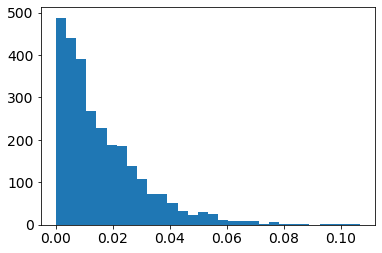

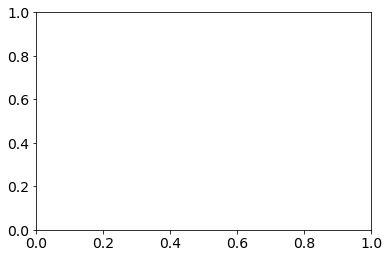

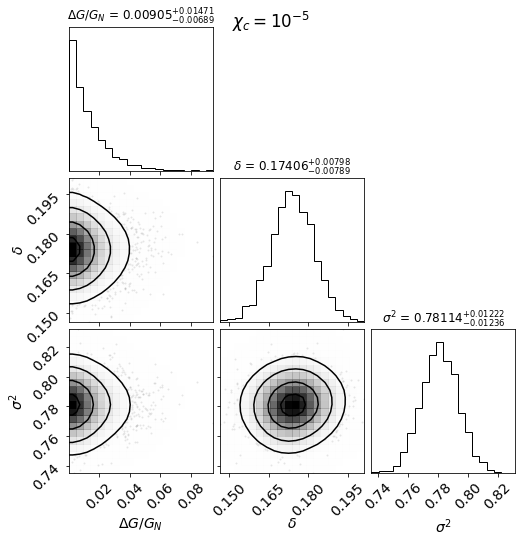

  0%|▏                                          | 4/918 [00:00<00:29, 30.78it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 2.5279627485578675e-06
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 2.0551170862970714e-06
10213-1902 [50] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 50.0 0.0 8.042908352075766e-07
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 1.034770216384401e-06
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0 0.0 2.399972580725e-05
10218-12703 [50] [335.7

  1%|▌                                         | 12/918 [00:00<00:27, 33.37it/s]

10218-3704 [50] [-0.2423, -0.7324, -0.4111, -0.2502, -0.1409, -0.2076, -0.2494, -0.3265, -0.3433, -0.3506, -0.3606, -0.3689, -0.3645, -0.3466, -0.4111, -0.2985]
10218-3704 50.0 0.0 2.4067251704030244e-06
10219-9102 [50] [1.3962, 1.1814, 0.7492, 0.4692, 0.3335, 0.2205, 0.1532, 0.1423, 0.1945, 0.153, 0.0798, 0.0216, -0.0715, -0.157, -0.0196, -0.0532, -0.0405]
10219-9102 50.0 0.0 1.1355521136584288e-06
10220-12705 [50] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 50.0 0.0 1.4469203008386374e-06
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 8.593867035775486e-06
10224-9101 [23.9088824120603] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 23.9088824120603 1.1154113107237203e-08 6.660520970410645e-07
10226-12704 [50] 

  2%|▉                                         | 20/918 [00:00<00:29, 30.67it/s]

10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 1.6240896922969967e-05
10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 2.0600961476963566e-05
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 1.2479685475621874e-05
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 50.0 0.0 2.012670726500333e-06
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 1.5955775239278116e-05
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.0

  3%|█                                         | 24/918 [00:00<00:30, 29.20it/s]

10494-9101 [50] [0.1044, 0.2038, 1.4077, 1.2615, 1.1423, 0.8831, 0.6532, 0.6062, 0.6272, 0.6614, 0.5401, 0.4995, 0.1142, 0.1337]
10494-9101 50.0 0.0 6.179464619085553e-06
10495-12704 [50] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 50.0 0.0 9.450289002075491e-06
10495-12705 [50] [871.1598, 1245.0304, 1205.1955, 1347.7893, 1374.3588, 1517.2635, 1622.8998, 1633.9971, 1757.8692, 1799.4196, 1854.634, 1999.5551, 1849.1662, 1882.4866, 1807.1303, 1651.9125, 1681.1326, 1493.9167, 2771.4516, 2121.0254, 1992.5196]
10495-12705 50.0 0.0 7.560100172350591e-07
10495-3702 [50] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 50.0 0.0 2.3833979968387433e-06
10496-12704 [50] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 26

  3%|█▍                                        | 32/918 [00:01<00:27, 32.51it/s]

10498-12705 [50] [2.2376, 1.8111, 0.8617, 0.4311, 0.299, 0.2455, 0.2899, 0.2855, 0.265, 0.1888, 0.0491, -0.0661, -0.1083, -0.0652, -0.0315, 0.0942]
10498-12705 50.0 0.0 1.4107272650162777e-06
10499-12705 [50] [-0.9996, -0.9996, -0.9992, -0.9994, -0.9994, -0.9993, -0.9993, -0.9994, -0.9994, -0.9992, -0.999, -0.999, -0.9987]
10499-12705 50.0 0.0 2.7743053539813983e-06
10499-3702 [50] [-0.3822, -0.1753, 0.3237, 0.6092, 0.8357, 0.9307, 1.1046, 1.1845, 1.1657, 1.064, 1.005, 1.0954, 0.7875, 0.8892, 0.9769, 1.0508, 1.3156, 1.2283]
10499-3702 50.0 0.0 1.3274272842871739e-06
10499-3703 [50] [-0.0563, -0.0436, 0.024, 0.1267, -0.0775, -0.0664, 0.0153, -0.0929, -0.1244, -0.0851, -0.0939, -0.1131, -0.1033, -0.048, 0.0474, 0.0456, 0.0289, -0.0666, -0.0844, -0.5663]
10499-3703 50.0 0.0 1.5652632183251635e-06
10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 2.9457642687333927e-06
10500-12704 [3.2695618090452263] [140.79

  4%|█▊                                        | 40/918 [00:01<00:27, 32.19it/s]

10500-3703 [50] [-0.028, -0.1828, 0.6642, 1.1037, 1.7094, 1.5507, 1.8019, 1.4925, 1.5792, 1.4772, 1.368, 1.4463, 1.2523, 1.4351, 1.2057, 0.9405, 0.5252, 1.657, 1.4263, 0.5704, 0.5717]
10500-3703 50.0 0.0 1.0288950788020634e-05
10501-12704 [50] [1.3181, 1.9521, 1.9474, 1.8957, 2.0169, 2.066, 2.2805, 2.1361, 1.7635, 1.5052, 2.0197, 2.1387, 2.493, 1.9877, 1.7896, 1.1205, 1.6972, 2.5971]
10501-12704 50.0 0.0 2.7805617229806435e-06
10501-6101 [50] [54.152, 240.5257, 446.403, 593.882, 679.4829, 745.3089, 578.3118, 397.5307, 268.9797, 276.8619, 234.4717, 196.8602, 156.2454, 140.6324, 64.5922]
10501-6101 50.0 0.0 1.822529933646415e-06
10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 50.0 0.0 1.7656655762089026e-06
10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 1.2462372265732289e-06
10503-9102 [50] [1

  5%|██▏                                       | 49/918 [00:01<00:24, 35.03it/s]

10506-9101 [50] [-0.2543, 0.5091, 0.8262, 0.5675, 0.2552, 0.0764, 0.0245, 0.0392, 0.0453, 0.0366, -0.0056, -0.0369, -0.0612, -0.0986, -0.132, -0.0742, -0.1191]
10506-9101 50.0 0.0 6.365542469440306e-05
10508-12703 [50] [0.5005, 0.4509, 0.1544, 0.1328, 0.1165, 0.1176, 0.065, 0.1329, 0.2506, 0.179, 0.1788, 0.1204, 0.0037, 0.016, -0.0301, -0.0876]
10508-12703 50.0 0.0 5.191516755171926e-06
10509-12703 [50] [1226.9439, 2166.987, 2538.8741, 2127.6504, 1648.0951, 1358.0909, 1167.9374, 985.8138]
10509-12703 50.0 0.0 2.8050128168256426e-06
10509-1901 [50] [88.4511, 296.1948, 449.6905, 409.1127, 761.2326, 574.7336, 678.7086, 604.9771, 571.2616, 614.5332, 408.9334, 441.3848, 355.292, 300.996, 243.919, 230.1612, 180.5992, 163.4382, 176.2701, 193.176, 205.4741]
10509-1901 50.0 0.0 1.174582916395662e-06
10509-6101 [50] [414.6573, 159.5598, 352.8386, 670.9188, 930.199, 434.1238, 984.9702, 921.6235, 784.8291, 825.2006, 827.4197, 661.5592, 624.5693, 894.3523, 620.0269, 747.519, 623.1939, 701.341, 577.

  6%|██▌                                       | 55/918 [00:01<00:21, 39.92it/s]

10512-12705 [50] [-0.9971, -0.9962, -0.9967, -0.9971, -0.9969, -0.9968, -0.9961, -0.9958, -0.9964, -0.9971, -0.9977, -0.9977, -0.9977, -0.9976, -0.998]
10512-12705 50.0 0.0 1.4214719036885521e-06
10512-9102 [50] [4147.3152, 2927.8473, 3245.8656, 2878.0674, 2617.7881, 2204.6977, 1695.8151, 1371.2689, 1298.2413, 1241.1228, 1357.9116, 1330.7104, 1714.839, 1930.3755, 2196.7284, 2401.8011, 2844.302, 3122.8481, 2925.4465]
10512-9102 50.0 0.0 1.2831449232215172e-06
10513-12702 [50] [-0.9916, -0.9877, -0.9855, -0.9802, -0.9787, -0.98, -0.9868, -0.9787, -0.862, -0.9802]
10513-12702 50.0 0.0 2.597906879641255e-06
10514-6103 [21.20603015075377] [0.5999, 0.3982, 0.2747, 0.2749, 0.0781, 0.0617, 0.0681, -0.0189, -0.0377, -0.0578, -0.065, -0.0594, 0.0253, -0.0317, 0.1182, -0.1428, -0.1895, -0.2508, -0.2991, -0.355]
10514-6103 21.20603015075377 6.637728755078615e-08 6.103937105038569e-07
10516-6104 [50] [0.3084, -0.237, -0.3593, -0.3575, -0.3434, -0.2974, -0.3603, -0.4386, -0.4629, -0.4919, -0.5092, -

  7%|███                                       | 67/918 [00:01<00:17, 47.31it/s]

10519-6102 [50] [15.342, 9.7033, 5.6052, 3.8579, 2.785, 2.1688, 1.9416, 1.9483, 2.0544, 1.8028, 1.946, 2.1855, 2.046, 2.3544, 2.1616]
10519-6102 50.0 0.0 5.334241698389064e-06
10520-12704 [50] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.0366, 0.0275, -0.0135, 0.0213, 0.0998, -0.1048, -0.1309]
10520-12704 50.0 0.0 1.310731841991225e-06
10520-6102 [50] [-0.9995, -0.9993, -0.9985, -0.9976, -0.9986, -0.9981, -0.9983, -0.9984, -0.9986, -0.9981, -0.9963]
10520-6102 50.0 0.0 4.268905391768796e-06
10838-9101 [50] [-0.0928, 0.4421, 0.4896, 0.3922, 0.2667, 0.3141, 0.2582, 0.2949, 0.294, 0.2543, 0.2198, 0.1153, 0.0076, -0.0625, -0.124, -0.1198, -0.272, -0.3696, -0.3534, -0.3974, -0.2337]
10838-9101 50.0 0.0 2.3551168517243952e-06
10839-12705 [50] [0.5531, 0.4188, 0.6271, 0.6342, 0.4074, 0.3206, 0.1512, 0.1105, 0.1154, 0.1763, 0.2141, 0.3291, 0.2868, 0.1635, 0.0391, 0.4134, 0.1807]
10839-12705 50.0 0.0 4.55378707389318e-06
10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712, 0.

  9%|███▌                                      | 79/918 [00:02<00:17, 49.17it/s]

10845-12702 [50] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-12702 50.0 0.0 1.5719672362186583e-06
11004-12705 [50] [-0.8497, -0.6991, -0.5203, -0.3493, -0.2406, -0.2193, -0.1954, -0.1792, -0.1842, -0.1767, -0.1858, -0.1781, -0.195, -0.2173, -0.2294, -0.167, -0.2434, -0.1514, -0.3351, -0.2129]
11004-12705 50.0 0.0 1.0113421550419543e-06
11004-3703 [50] [5607.0165, 6199.0745, 5122.0907, 4588.5334, 3798.1606, 3256.1827, 2909.7374, 2623.1995, 2081.3703, 1622.0266, 1252.6703, 1054.2993, 797.551, 805.4299, 667.6425]
11004-3703 50.0 0.0 9.47222378767342e-07
11004-6104 [50] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 50.0 0.0 1.8670856453943816e-05
11009-12704 [50] [-0.044, 0.5574, 0.4941, 0.5156, 0.452, 0.4031, 0.3736, 0.4191, 0.4646, 0.4848, 0.558, 0.4716, 0.2432, 0.3821, 0.6252, 0.8487, 0.8601]
11009-12704 50.0 0.0 3.292404374133244e-05


 10%|████                                      | 89/918 [00:02<00:18, 44.00it/s]

11011-12703 [50] [9.8651, 35.0102, 40.3579, 54.0601, 192.4013, 365.0512, 378.092, 411.2362, 282.7202, 230.5846, 329.2445, 263.6472, 244.1501]
11011-12703 50.0 0.0 1.8623325758670473e-06
11012-12705 [50] [0.2329, 0.5509, 0.2517, 0.0195, 0.0174, -0.0704, -0.1937, -0.145, -0.249, -0.0592, -0.302, -0.1828, -0.2112]
11012-12705 50.0 0.0 1.4352078793465533e-05
11012-3702 [50] [7.8974, 3196.585, 2734.8285, 2253.8811, 4078.0168, 2401.2221, 2680.4924, 2677.0305, 2494.671, 2122.0656, 2023.2433, 2124.4295, 1742.4806, 1879.5204, 1353.859, 1265.244, 1077.374, 829.3809, 807.9255, 437.3493, 291.3315]
11012-3702 50.0 0.0 7.516436104914837e-06
11012-9102 [50] [4.3613, 1.8587, 0.9243, 0.4611, 0.1717, 0.0565, -0.0003, -0.0124, 0.0149, 0.0346, 0.0094, 0.0256, 0.0391, 0.0441, 0.0302, -0.0599, -0.0933, -0.0179]
11012-9102 50.0 0.0 6.613618965147395e-06
11013-12702 [50] [0.7904, 0.6387, 0.0779, 0.1203, 0.0592, -0.004, -0.016, 0.0128, 0.0194, 0.059, 0.0663]
11013-12702 50.0 0.0 4.237808522214471e-06
11013-190

 11%|████▌                                    | 101/918 [00:02<00:16, 48.07it/s]

11017-12704 [50] [0.4751, 0.4487, 0.3988, 0.2586, 0.0625, -0.0537, -0.0751, -0.1094, -0.1157, -0.1027, -0.1141, -0.1182, -0.1126, -0.1047, -0.0836, -0.1961, -0.2389]
11017-12704 50.0 0.0 1.1549745909455326e-06
11017-6103 [50] [-0.3235, -0.3265, -0.3479, -0.2253, -0.2261, -0.1769, -0.1311, -0.1075, -0.0747, -0.0989, -0.1378, -0.1695, -0.1257, -0.174, -0.178, -0.0714, -0.0163, 0.0028, 0.2262, -0.2731]
11017-6103 50.0 0.0 6.186507731276544e-06
11017-9101 [50] [-0.5273, 0.0425, 0.2188, 0.1666, 0.07, 0.0407, -0.0503, -0.1282, -0.2004, -0.2244, -0.1722, -0.1497, -0.0815, -0.0967, -0.1443, -0.1476, -0.1864, -0.1536, -0.2264, -0.18]
11017-9101 50.0 0.0 1.4426604302852536e-06
11018-12702 [50] [-0.9839, -0.9926, -0.9927, -0.9922, -0.9923, -0.9935, -0.9932, -0.9925, -0.9931, -0.994, -0.9941]
11018-12702 50.0 0.0 1.7864466867357617e-06
11018-12704 [50] [-0.9989, -0.9988, -0.9986, -0.9987, -0.9988, -0.999, -0.999, -0.9991, -0.9991, -0.9987, -0.9984, -0.9975, -0.9987, -0.9989]
11018-12704 50.0 0.0 1

 12%|████▉                                    | 111/918 [00:02<00:17, 45.95it/s]

11019-3701 [50] [2.5964, 1.3616, 0.9142, 0.3658, 0.0143, -0.1157, -0.1148, -0.102, -0.0691, -0.1802, -0.166, -0.2893, -0.0849]
11019-3701 50.0 0.0 8.874455785552463e-06
11021-1902 [50] [5.9017, 3.1432, 2.8491, 1.9605, 1.7177]
11021-1902 50.0 0.0 4.779667106589092e-06
11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 1.561577274074639e-05
11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 9.13010558590752e-06
11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 9.260909922543683e-05
11742-12704 [50] [0.6702, -0.5312, -0.3481, 0.0047, 0.1348, 0.415, 0.2787, 0.5138, -0.0348]
11742-

 13%|█████▏                                   | 116/918 [00:02<00:17, 44.73it/s]

11745-6104 [50] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.8527, 0.5703, 0.5078, 0.5176, 0.5143, 0.48, 0.4463, 0.4504, 0.4653, 0.4273, 0.4049]
11745-6104 50.0 0.0 2.3624196700069906e-06
11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.0361, -0.076, -0.0711, -0.1542, -0.2041, -0.2119, -0.1066, -0.2705, -0.3138]
11745-9101 50.0 0.0 3.4001598907928475e-06
11746-3703 [50] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 50.0 0.0 5.298169277831077e-06
11746-3704 [50] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 50.0 0.0 7.043650037708629e-07
11746-9102 [50] [-0.478, -0.2133, -0.2528, -0.1774, -0.2077, -0.2266, -0.2099, -0.2691, -0.1996, -0.2114, -0.1249, -0.1799, -0.1765, -0.1376, -0.2784

 14%|█████▋                                   | 128/918 [00:03<00:16, 47.26it/s]

11750-3701 [50] [1.5964, 1.8766, 1.9419, 1.999, 1.4725, 1.2873, 1.1333, 0.934, 0.9463, 0.8918, 0.7347, 0.8508, 0.6677, 0.4619, 0.3762, 0.1866, 0.0367, 0.0915, 0.0086, 0.4665]
11750-3701 50.0 0.0 1.1186226790391016e-06
11750-6103 [50] [6.303, 1.7001, 0.3933, 0.5417, 0.5248, 0.6298, 0.7207, 0.7282, 0.8046, 0.5691, 0.3659, 0.4083, 0.4745, 0.6207, 0.9957, 2.1073, 7.7724]
11750-6103 50.0 0.0 4.865660803786691e-06
11750-9101 [50] [13.4461, 9.2464, 8.3896, 5.4399, 4.9554, 3.0033, 3.1782, 2.4566, 2.5343, 2.0961, 2.3663, 2.3818, 2.4375, 3.0403, 2.3998, 2.3406, 2.9409, 6.8913, 8.6024]
11750-9101 50.0 0.0 8.321884616960935e-07
11751-1901 [50] [-0.9334, -0.8849, -0.9513, -0.9754, -0.9893, -0.9862, -0.989, -0.9902, -0.9893, -0.9909, -0.9903, -0.9906, -0.9888, -0.9874]
11751-1901 50.0 0.0 3.024101266045935e-06
11751-6102 [50] [0.3738, 0.0535, 0.3785, 0.2124, 0.1333, 0.0258, -0.0223, -0.094, -0.1099, -0.1415, -0.1724, -0.2013, -0.1841, -0.253, -0.3949, -0.2255, -0.2141, -0.2775]
11751-6102 50.0 0.0 3

 15%|██████▏                                  | 138/918 [00:03<00:17, 44.52it/s]

11755-9102 [50] [0.1799, 0.2485, 0.3504, 0.383, 0.2088, 0.1465, 0.0712, -0.0042, -0.0415, -0.0215, 0.0671, 0.0623, 0.1393, -0.1017, 0.125, -0.214, -0.1458]
11755-9102 50.0 0.0 3.665174108808456e-05
11758-3701 [50] [-0.3091, 0.0326, 0.2349, 0.1141, 0.0113, 0.06, -0.0268, -0.1507, -0.2171, -0.1994, -0.1587, -0.1557, -0.1574, -0.1614, -0.0618]
11758-3701 50.0 0.0 1.2700339193410542e-06
11758-3702 [50] [-0.544, -0.1141, 0.0167, 0.1028, 0.0854, -0.0041, -0.0149, 0.0406]
11758-3702 50.0 0.0 4.433563060454952e-06
11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 50.0 0.0 1.455693691775656e-06
11759-6102 [50] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, -0.981]
11759-6102 50.0 0.0 8.98699665408248e-07
11760-12703 [50] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0.53

 16%|██████▌                                  | 148/918 [00:03<00:16, 45.51it/s]

11761-12702 [50] [-0.6826, -0.6017, -0.2216, -0.1122, -0.0329, -0.02, -0.0711, -0.0937, -0.0782, -0.098, -0.1546, -0.1024, -0.1043, -0.0648, -0.2102, -0.3314, -0.2483]
11761-12702 50.0 0.0 9.277223512290937e-06
11761-12703 [50] [0.4093, 0.08, -0.0588, -0.0478, 0.0006, -0.0009, -0.0617, -0.1284, -0.1046, -0.1135, -0.1247, -0.1623, -0.2191, -0.3477]
11761-12703 50.0 0.0 1.1168798351924268e-05
11761-12704 [50] [-0.1205, 0.9952, 0.5814, 0.2296, 0.1208, 0.126, 0.1222, 0.1041, 0.1683, 0.1996, 0.1448, 0.1188, 0.0574, 0.0394, -0.008, -0.026, -0.0331]
11761-12704 50.0 0.0 7.625315193241739e-06
11761-12705 [50] [6.8127, 3.6941, 2.4845, 1.3644, 0.5363, 0.2844, 0.104, -0.1]
11761-12705 50.0 0.0 4.6899231895362175e-06
11823-9101 [50] [15949.1976, 8800.0053, 8323.3916, 4811.1692, 2214.9858, 717.2733, 413.2719, 305.7873, 173.5393, 146.0478, 195.6604, 224.7593, 189.4201, 67.1778]
11823-9101 50.0 0.0 2.0070568311550896e-06
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628

 17%|███████                                  | 158/918 [00:03<00:18, 41.36it/s]

11830-6104 [50] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.0353, -0.2063, -0.258, -0.2347, -0.2692, -0.3985]
11830-6104 50.0 0.0 2.898334056630814e-06
11831-12703 [50] [0.4472, 0.0224, 0.062, 0.158, -0.0429, -0.0922, -0.1252, -0.188, -0.1276, -0.16, -0.2596, -0.2165, 0.1708, -0.4595]
11831-12703 50.0 0.0 9.391711430787337e-06
11831-12704 [50] [-0.5822, -0.2435, 0.0115, -0.0848, -0.1704, -0.028, -0.0888, -0.0323, -0.0445, -0.106, -0.3871, -0.1836]
11831-12704 50.0 0.0 2.3283848777871012e-06
11831-6101 [50] [-0.9875, -0.994, -0.9968, -0.9973, -0.9967, -0.9975, -0.9969, -0.9978, -0.9979, -0.9971, -0.9984, -0.9986, -0.9985, -0.9974]
11831-6101 50.0 0.0 1.1568590809636904e-06
11831-6102 [50] [1.041, 0.6096, 0.4053, 0.165, 0.0902, 0.1922, 0.1873, 0.1187, 0.1055, 0.0085, -0.1108, -0.0737]
11831-6102 50.0 0.0 3.287988500822598e-06
11833-9102 [50] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.2

 18%|███████▎                                 | 163/918 [00:04<00:19, 39.53it/s]

11838-12701 [50] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 0.1336, 0.0903, 0.0213, -0.0554, -0.0342, 0.0225, 0.0053, -0.0272]
11838-12701 50.0 0.0 3.9176278646635705e-06
11838-12703 [50] [144.9042, 254.2159, 538.0129, 911.0748, 1089.8377, 1111.2623, 1284.2649, 1228.3752, 1345.2496, 1400.7846, 1427.4787, 1434.5371, 1257.47, 1184.9615, 998.2342, 830.6266, 670.98, 596.3078, 488.5417, 423.536, 329.6538, 32.3109, 5.6457, 31.8479]
11838-12703 50.0 0.0 1.4559843269251934e-06
11838-3702 [50] [0.536, 0.7094, 0.6061, 0.6555, 0.6466, 0.6204, 0.5689, 0.587, 0.6487, 0.6337, 0.5876, 0.5059, 0.4509, 0.4328, 0.3954, 0.396]
11838-3702 50.0 0.0 2.2350301704214617e-06
11838-6103 [50] [201.1554, 531.7007, 967.9199, 1125.4471, 1324.9799, 1297.8083, 1279.6033, 1183.901, 1134.9301, 1132.4611, 1104.3121, 1011.7157, 1287.8266]
11838-6103 50.0 0.0 2.547409652023642e-06
11838-9101 [50] [11.4727, 10.3246, 9.7757, 7.6641, 6.3263, 7.7985, 4.6854, 6.1379, 3.8072, 5.5203, 3.0518, 3.9759, 1.4403, 2.8333, 2.6956, 2.5542

 19%|███████▊                                 | 175/918 [00:04<00:16, 44.28it/s]

11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 1.8604296400468153e-06
11865-9102 [50] [-0.467, -0.4695, -0.4789, -0.5286, -0.6182, -0.6445, -0.6408, -0.6047, -0.6031, -0.6243, -0.655, -0.6895, -0.6998, -0.5904, -0.6729, -0.6983]
11865-9102 50.0 0.0 8.825260224554182e-07
11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2771, 0.298, 0.3814, 0.3262, 0.2102, 0.3978, 0.4467, 0.2866, 0.1214, 0.2202, 0.1346, 0.4041]
11867-6104 50.0 0.0 6.519266126909044e-06
11867-9101 [50] [0.9073, 0.3027, 0.1546, 0.1123, 0.0285, 0.0159, -0.0244, 0.0205, 0.0824, 0.1908, 0.2079, 0.2195, 0.3058, 0.2425, 0.1871, 0.3056]
11867-9101 50.0 0.0 2.680726885601576e-06
11868-12703 [50] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 7.932515876679832e-06
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 2.25479944889279

 20%|████████▎                                | 185/918 [00:04<00:16, 43.69it/s]

11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 7.237749699805178e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 6.600387300243714e-05
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389.9946, 2439.1642, 2636.587, 2485.7262, 2056.7992, 1736.2622, 1623.5415, 1192.5228, 781.8483, 546.9719, 175.874]
11942-12704 50.0 0.0 3.9099562685863655e-05
11942-6104 [33.12745427135679] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 33.12745427135679 4.737992868113144e-08 6.291179983012697e-07
11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.0425, -0.0331, -0.0546, -0.0982, -0.1371, -0.164, -0.179, -0.1863, -0.172, -0.1572, -0.1563, -0.1648, -0.1726, -0.27]
11943-3703 50.0 0.

 21%|████████▋                                | 195/918 [00:04<00:15, 45.66it/s]

11947-6103 [50] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 50.0 0.0 4.171680506227184e-06
11949-12701 [50] [1.1975, 0.3408, 0.1441, 0.1243, 0.0225, 0.0003, 0.0028, 0.027, 0.0197, 0.0192, -0.0295, -0.0839]
11949-12701 50.0 0.0 6.125268208453244e-06
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 1.4658956969575707e-05
11954-12704 [50] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453, 0.1801, 0.125, 0.0276, -0.0116, -0.0744, -0.134, -0.1626, -0.2559, -0.2802]
11954-12704 50.0 0.0 1.2180257788513797e-05
11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.2778]
11954-3703 50.0 0.0 1.3112611978918712e-05
11954-9101 [50] [-0.9882, -0.9937, -0.9946, -0.9965, -0.997

 22%|█████████▏                               | 206/918 [00:04<00:15, 44.90it/s]

11958-6103 [50] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 50.0 0.0 8.375780355819048e-07
11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 5.325910941450096e-06
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 50.0 0.0 1.1175059135931051e-05
11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.9843, 0.6333, 0.3517, 0.1829, 0.1258, 0.0956, 0.1424, 0.1021, 0.028, 0.1221]
11965-9102 50.0 0.0 7.092780500617502e-06
11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 1.8058148080282617e-05
11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.898

 23%|█████████▍                               | 211/918 [00:05<00:18, 37.34it/s]

11970-6103 [50] [0.7466, 1.1751, 1.6643, 1.3977, 1.0416, 0.8262, 0.6871, 0.5199, 0.4194, 0.3266, 0.2718, 0.2909, 0.2357, 0.2575, 0.2139, 0.0837, -0.0144, -0.0619, 0.133]
11970-6103 50.0 0.0 5.212314593147114e-06
11974-12702 [50] [-0.5341, -0.4596, -0.3852, -0.2683, -0.2117, -0.2349, -0.22, -0.1969, -0.1731, -0.1829, -0.2133, -0.2538, -0.2357, -0.256, -0.1504, -0.1437, -0.1349, 1.1183]
11974-12702 50.0 0.0 5.208192406281482e-06
11975-12705 [50] [0.6902, 0.7621, 0.3208, 0.2527, 0.3317, 0.3259, 0.2387, 0.0864, 0.069, 0.2015, 0.1928, 0.1502, -0.0055, -0.1924]
11975-12705 50.0 0.0 5.924147867075527e-06
11975-3703 [50] [-0.2597, -0.0329, 0.0768, 0.0833, 0.1048, 0.0682, 0.0342, -0.0156, -0.0756, -0.093, -0.0695, -0.0466, 0.0656, -0.0085, 0.1237, 0.1334, 0.0646]
11975-3703 50.0 0.0 6.295582072586329e-06
11975-6104 [50] [1.0196, 1.2709, 1.5062, 1.1104, 0.9965, 0.7778, 0.776, 0.6311, 0.7603, 0.6278, 0.6208, 0.5151, 0.5172, 0.5343, 0.2326, 0.5012, 0.187, 0.4522, 0.1401, 0.1327]
11975-6104 50.0 0.

 23%|█████████▌                               | 215/918 [00:05<00:20, 33.65it/s]

11976-12703 [50] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 50.0 0.0 4.7702664735931515e-06
11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 50.0 0.0 1.9889529054749382e-06
11978-12705 [50] [0.0184, 0.0968, 0.695, 0.4819, 0.223, 0.1168, 0.1458, 0.1604, 0.1304, 0.1363, 0.1451, 0.1188, 0.0734, 0.0413, 0.0374, 0.0059, 0.0584, 0.0708]
11978-12705 50.0 0.0 2.597059561842038e-06
11978-6101 [50] [0.1703, 0.2916, 0.2201, 0.1105, 0.137, 0.0651, 0.0262, 0.0439, 0.1227, 0.0551, 0.0171, -0.0525, -0.106, -0.2018, -0.2281, -0.1584, -0.2752, -0.3694, -0.5359, -0.6656, -0.8099]
11978-6101 50.0 0.0 2.1651398828962873e-06
11979-12703 [50] [0.3188, 0.2646, 0.4444, 0.4735, 0.4231, 0.2818, 0.2037, 0.1891, 0.1975, 0.1625, 0.205, 0.2447, 0.1501, 0.1763, 0.1339, 0.4567, 0.4255, 0.53]
11979-12703 50.0 0.0 1.7

 24%|█████████▉                               | 223/918 [00:05<00:21, 32.23it/s]

11979-9101 [50] [0.4094, -0.1099, -0.2651, -0.4134, -0.4241, -0.4727, -0.5, -0.5199, -0.5395, -0.5666, -0.5927, -0.5903, -0.6162, -0.591, -0.6704, -0.611]
11979-9101 50.0 0.0 1.4077707584472693e-06
11979-9102 [50] [0.6334, -0.323, -0.1351, -0.0857, 0.0053, 0.0302, 0.0467, 0.0752, 0.0566, 0.0459, 0.0116, 0.0269, 0.0046, -0.0156, -0.091, -0.1558, -0.3105, -0.4242, -0.5324]
11979-9102 50.0 0.0 2.023605401608326e-06
11981-12704 [50] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]
11981-12704 50.0 0.0 2.3232031078765584e-06
11981-9102 [50] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188, -0.1444, -0.128, -0.1812, -0.1904, -0.2284, -0.2044, -0.2061, -0.1486, -0.2345, -0.2114, 0.0329, 0.7603]
11981-9102 50.0 0.0 2.0295644633362797e-05
11982-12704 [50] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.1555, 0.0797, -

 25%|██████████▎                              | 231/918 [00:05<00:22, 29.93it/s]

11982-9102 [50] [-0.6167, -0.1298, 0.3235, 1.2078, 1.1438, 0.8069, 0.6394, 0.4963, 0.4228, 0.3252, 0.3069, 0.2838, 0.3393, 0.4905, 0.4567, 0.2311]
11982-9102 50.0 0.0 2.791972137957851e-06
11984-12701 [50] [-0.2857, -0.1737, 0.0157, 0.0372, -0.1281, -0.2001, -0.1962, -0.1945, -0.1458, -0.0921, -0.099, -0.116, -0.1666, -0.325, -0.2122, -0.442]
11984-12701 50.0 0.0 3.5177192875843744e-06
11984-12702 [50] [-0.2774, -0.3248, -0.3706, -0.3541, -0.339, -0.3481, -0.2877, -0.2577, -0.2022, -0.1466, -0.1889, -0.2485, -0.0638, -0.2124, -0.1581, -0.3914, -0.132]
11984-12702 50.0 0.0 1.881493056804527e-05
12066-3701 [50] [19.2418, 16.9197, 10.1428, 6.0915, 4.4316, 3.0783, 2.9929, 2.3906, 2.7183, 2.8356, 3.2869, 3.669, 3.475, 3.6088, 2.499, 1.7084, 1.9485, 1.5899]
12066-3701 50.0 0.0 4.936043518634913e-06
12067-12703 [50] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
12067-12703 50.0 0.0 1

 26%|██████████▍                              | 235/918 [00:06<00:24, 28.18it/s]

12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 4.0833516302789266e-05
12068-6104 [50] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 50.0 0.0 4.2775743805194455e-05
12069-12704 [50] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 50.0 0.0 2.0033095437247095e-06
12069-12705 [50] [1.7332, 1.137, 0.4096, 0.6564, 0.5837, 0.6168, 0.2246, 0.0587, 0.2617, 0.1538, 0.5607, 0.4132, 0.5307, 0.41, 2.8782]
12069-12705 50.0 0.0 4.596869343461315e-06
12069-6102 [50] [-0.3102, -0.0764, -0.2402, -0.1833, -0.1952, -0.2158, -0.2095, -0.1861, -0.144, -0.1353, -0.1037, -0.1026, -0.0816, -0.0956, -0.1367, -0.1477, -0.0871, -0.0667, -0.0387, -0.58, -0.56, -0.5359, -0.8946, 0.038]
12069-6102 50.0 0.0 4.

 26%|██████████▊                              | 243/918 [00:06<00:23, 28.40it/s]

12071-1901 [50] [-0.148, -0.1411, -0.1881, -0.1802, -0.1874, -0.1463, -0.1611, -0.1934, -0.1236, -0.1115, 0.0697, 0.0471, 0.1047, 0.171, 0.9648]
12071-1901 50.0 0.0 1.8681726511615639e-06
12071-3702 [50] [43.1041, 1833.3653, 2193.0557, 2409.7616, 2285.0769, 1925.6484, 1966.7994, 2043.2628, 1997.8474, 1832.4832, 1658.3071, 1528.5931, 1298.5116, 1014.8264, 552.6982, 136.4828]
12071-3702 50.0 0.0 1.3503349238315957e-06
12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.3083, 398.9949, 258.1108, 178.8144, 146.4641, 210.3609, 51.4796, 32.8354, 22.052]
12071-3704 50.0 0.0 2.2066266044700047e-06
12075-12704 [50] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 50.0 0.0 4.664475110117611e-06
12078-12703 [50] [0.3298, 0.5608, 0.2182, 0.3221, 0.2303, 0.0896, 0.0846, 0.2051, 0.3186, 0.33, 0.2532]
12078-12703 50.0 0.0 1.8352726389375466e-06
12078-6103 [50] [1.9637, 5.3953, 4.122, 4.276, 4.

 27%|███████████▏                             | 250/918 [00:06<00:23, 28.02it/s]

12079-12705 [28.260341708542715] [5.9457, 5.134, 4.915, 2.376, 2.7696, 2.3345, 1.3415, 1.441, 1.4148, 0.8317, 1.0553, 1.0687, 0.9662, 0.8766, 1.1537, 1.4538, 0.8336]
12079-12705 28.260341708542715 5.203781510222463e-08 6.248347288503153e-07
12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 2.119251162214389e-05
12082-12702 [50] [52.4225, 34.225, 22.353, 15.87, 12.6473, 9.0293, 9.0994, 7.7946, 7.7752, 7.6215, 7.2913, 5.8669, 7.5773, 10.9051, 27.4723, 42.4809, 31.8612, 44.26]
12082-12702 50.0 0.0 2.684653743589526e-06
12084-12702 [50] [0.4179, 1.0492, 0.9255, 0.717, 0.5874, 0.4344, 0.359, 0.2445, 0.1712, 0.1342, 0.2131, 0.2682, 0.3105, 0.3163]
12084-12702 50.0 0.0 4.6587767561887555e-06
12084-12704 [50] [-0.663, -0.3425, -0.4511, -0.3814, -0.1944, -0.0031, -0.041, -0.1276, -0.2047, -0.2499, -0.2565, -0.1988, -0.1657, -0.268, -0.3391, -0.2896]
12084-12704 50.0 0.0 9.078513213204

 28%|███████████▍                             | 257/918 [00:06<00:22, 29.47it/s]

12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.419, 0.387, 0.4139, 0.5272, 0.4564, 0.6029, 0.4957, 0.5971, 0.6267, 0.5749, 0.7061, 0.6081, 0.5243, 0.4383, 0.5097, 0.4647, 0.2768, 0.3996, 0.231, 0.2274, 0.4698, 0.2204, 0.2727]
12084-1901 50.0 0.0 2.4880743841552618e-06
12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
12084-3702 50.0 0.0 2.6081157993628497e-06
12084-3703 [50] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.866, 9.9199, 8.0438, 7.1191, 7.1184, 4.9585, 5.2578]
12084-3703 50.0 0.0 9.48120244850723e-06
12084-6104 [50] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.0374, 0.0776, -0.025, -0.0223, -0.0093, -0.0487, 0.0214, -0.2045, 0.0836]
12084-6104 50.0 0.0 2.3930638703906508e-06
12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0

 28%|███████████▌                             | 260/918 [00:06<00:23, 28.32it/s]

12085-6103 [50] [-0.549, -0.354, -0.3619, -0.3336, -0.3191, -0.1878, -0.2268, -0.2779, -0.144, -0.2236, -0.1423, -0.1582, -0.1565, -0.2223, -0.1937, -0.2795, -0.2396, -0.2355, -0.213, -0.3557, -0.311]
12085-6103 50.0 0.0 1.7307903694084826e-06
12085-9102 [50] [0.6086, 0.5632, 0.3343, 0.2119, 0.1282, 0.0402, 0.0288, 0.0478, 0.0313, 0.001, -0.0532, -0.0537, -0.0634, -0.0662, -0.1794, -0.1779, -0.239]
12085-9102 50.0 0.0 1.6651610741764022e-06
12088-12705 [50] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-12705 50.0 0.0 1.67882438990075e-06
12088-9101 [50] [1.3886, 1.0744, 0.6164, 0.1772, -0.0928, -0.1728, -0.2424, -0.3552, -0.3861, -0.4243, -0.4358, -0.4341, -0.4454, -0.4408]
12088-9101 50.0 0.0 9.406171871492805e-06
12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-127

 29%|███████████▉                             | 266/918 [00:07<00:25, 25.70it/s]

12089-1901 [50] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 50.0 0.0 2.3107221106169853e-05
12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722, -0.1642, -0.1028, -0.1287, -0.1434, -0.0908, -0.1289, -0.1084, -0.2404, -0.097, 0.1709, -0.3201, -0.0196, -0.302]
12089-6103 50.0 0.0 6.719318849442918e-06
12092-6101 [50] [0.0026, 0.3918, 0.1405, 0.0977, 0.005, 0.0277, 0.1281, 0.0885, 0.0628, 0.0291, -0.0173, -0.1181]
12092-6101 50.0 0.0 1.076888551594665e-05
12093-9101 [50] [-0.9989, -0.997, -0.9973, -0.998, -0.9985, -0.9987, -0.9987, -0.9986, -0.9986, -0.9987, -0.9983, -0.9981, -0.9979, -0.9991, -0.9971]
12093-9101 50.0 0.0 9.13864842905496e-06
12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 40.9064, 40.0677, 39.5836, 40.4106, 39.3101, 37.4365, 38.9587, 41.7447, 41.525, 40.104, 39.0721, 39.6893, 56.2685, 25.7726, 27.1981, 33.78]
12094-3701 50.0 0.0 3.025372256644383e-06


 30%|████████████▏                            | 272/918 [00:07<00:27, 23.61it/s]

12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 3.6433539937784965e-06
12483-12703 [50] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -0.0898]
12483-12703 50.0 0.0 2.5474765210546684e-06
12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 4.7140398554304125e-06
12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 2.2431045690743523e-06
12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 50.0 0.0 2.828956698708622e-06


 30%|████████████▍                            | 278/918 [00:07<00:27, 23.08it/s]

12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696, 2047.2799, 2334.4928, 2266.757, 2196.3005, 1862.0235, 1612.2288, 2078.9089]
12488-6102 50.0 0.0 2.506534692596949e-06
12488-9101 [50] [0.89, -0.0571, 0.0018, 0.0675, 0.0814, 0.1021, 0.1178, 0.0708, 0.0758, 0.1268, 0.0533, 0.0597, 0.0532, 0.0414, 0.1038, 0.0181, -0.1356, -0.2319, -0.1377]
12488-9101 50.0 0.0 2.3196252630219848e-06
12489-3703 [50] [6.1258, 7.3921, 7.9142, 7.3592, 6.7186, 6.0984, 5.5884, 5.3024, 5.0796, 4.2963, 4.3283, 3.7505, 4.11, 3.5385, 4.098]
12489-3703 50.0 0.0 8.24142669381118e-06
12490-3701 [50] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-3701 50.0 0.0 5.7548390249740894e-05
12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0

 31%|████████████▌                            | 281/918 [00:07<00:27, 23.20it/s]

12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0.0 3.671170627721605e-06
12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0 0.0 1.183478056899642e-06
12512-12702 [50] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 50.0 0.0 1.2058768283223638e-06
12514-12702 [50] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 50.0 0.0 9.483012652337522e-07
12514-12703 [0.2525] [2.1408, 0.3201]
12514-12703 0.2525 2.575092188890387e-07 3.767655884223903e-07
12514-9102 [50] [-0.6627, -0.5978, -0.3356, -0.1465, -0.1607, -0.0924, -0.0736, -0.019, 0.0

 31%|████████████▊                            | 288/918 [00:08<00:23, 26.43it/s]

12518-12705 [50] [-0.8683, -0.7393, -0.3648, -0.0579, -0.0274, -0.0334, -0.0145, 0.016, -0.0154, 0.0703, -0.1575, 0.0272]
12518-12705 50.0 0.0 2.3837679151720545e-06
12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 0.0 1.4748963810627327e-06
12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.1091]
12518-9101 50.0 0.0 5.76636687290852e-06
12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 7.288294785814536e-06
12620-6104 [50] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 50.0 0.0 3.3476920426540326e-06
12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457,

 32%|█████████████▏                           | 294/918 [00:08<00:26, 23.74it/s]

12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903, -0.5645]
12621-12705 50.0 0.0 1.6408311038795085e-06
12621-6103 [50] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 50.0 0.0 2.4242745372052175e-06
12622-9101 [50] [0.295, -0.1664, 0.1745, 0.5326, 0.7376, 0.7334, 0.6499, 0.6151, 0.5534, 0.5303, 0.427, 0.3612, 0.3993, 0.3837, 0.4878, 0.4757, 0.3843, 0.0845]
12622-9101 50.0 0.0 8.179110771940998e-06
12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 7.706933825611466e-06
12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 1.1894093549708017e-05


 33%|█████████████▍                           | 300/918 [00:08<00:26, 23.03it/s]

12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 5.535369545321153e-06
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 1.3967588121361273e-05
12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 4.0539139878388555e-05
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 2.0540538733167814e-05
12679-12701 [2.7135] [-0.4106, -0.1602, -0.09, 0.0292, -0.1142, -0.1585, -0.1702, -0.2231, -0.1617, -0.1473, -0.165, -0.0765, -0.2919, -0.3168, -0.5268, -0.1813, 0.1098]
12679-12701 2.7135 7.669132417462052e-08 5

 33%|█████████████▌                           | 303/918 [00:08<00:28, 21.81it/s]

12679-1902 [50] [0.6115, 0.2127, 0.2343, 0.0811, 0.186, 0.028, 0.0072, -0.086, -0.1377, -0.1341, -0.1745, -0.1741, -0.1973, -0.2294, -0.2344, -0.1462, -0.1584]
12679-1902 50.0 0.0 4.028852706329203e-06
12682-12705 [50] [211.5682, 164.2949, 154.5208, 172.1809, 188.4287, 205.8053, 188.0827, 175.7022, 171.521, 162.4793, 163.9925, 122.1814, 128.2861, 178.1773, 150.2355, 110.4372, 181.1071]
12682-12705 50.0 0.0 4.93453666213967e-06
7443-12703 [50] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 50.0 0.0 8.875395808056282e-07
7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1547, -0.1713, -0.2761, -0.2934, -0.2123]
7443-12704 50.0 0.0 5.974720175158044e-06


 33%|█████████████▋                           | 306/918 [00:08<00:29, 21.02it/s]

7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 1.470996773017577e-06
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.0333, -0.0403, -0.0345, -0.091, -0.0525, -0.2174, -0.2135, -0.5859, -0.4094]
7443-9101 50.0 0.0 1.0244889299000988e-06
7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.1269]
7495-12702 50.0 0.0 6.747005745740256e-06
7495-12703 [50] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 50.0 0.0 7.659005122692525e-06


 34%|█████████████▉                           | 312/918 [00:09<00:30, 19.98it/s]

7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 6.6816527298232e-06
7815-12705 [50] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 50.0 0.0 1.272029285375638e-06
7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 1.0152852807952136e-06
7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 7.610394326936802e-07


 34%|██████████████                           | 315/918 [00:09<00:29, 20.14it/s]

7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 2.7591644131536265e-06
7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 8.254320163202011e-07
7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 4.177078432144096e-06
7958-6101 [50] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 50.0 0.0 6.930018436455359e-07
7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 4.4870755301818035e-06


 35%|██████████████▎                          | 321/918 [00:09<00:30, 19.53it/s]

7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 6.068226462198728e-06
7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 5.9434098542816496e-06
7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 7.076515951991978e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 8.474715350538153e-06


 35%|██████████████▍                          | 323/918 [00:09<00:30, 19.41it/s]

7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 7.319259919912188e-06
7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 1.0589697147758015e-06
7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 5.1556893314057415e-06
7961-12705 [50] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 50.0 0.0 2.6464382198689915e-06
7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.0 1.5983975308532436e-06


 36%|██████████████▋                          | 329/918 [00:10<00:29, 19.95it/s]

7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 5.4011018877593045e-06
7962-12705 [50] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 0.4867, 0.496, 1.2096, 1.0729, 0.2753, 1.3845, 3.2136]
7962-12705 50.0 0.0 9.107355514181747e-07
7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 50.0 0.0 2.386506326526828e-06
7963-12702 [50] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, -0.9982, -0.9988, -0.9993]
7963-12702 50.0 0.0 3.331808639508213e-06
7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 50.0 0.0 1.3814

 36%|██████████████▉                          | 335/918 [00:10<00:29, 20.09it/s]

7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]
7963-9102 50.0 0.0 1.2637104010680974e-06
7964-6101 [50] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119, 231.394, 254.6415]
7964-6101 50.0 0.0 1.8414263354877046e-06
7964-9102 [50] [1.3184, 2.0432, 2.1685, 1.6268, 1.1481, 0.9036, 0.7405, 0.65, 0.5829, 0.509, 0.4898, 0.4008, 0.3018, 0.164, 0.0815, 0.0631, 0.0748, -0.1094, 0.1287]
7964-9102 50.0 0.0 4.543816036840682e-06
7965-12701 [50] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085, -0.0802, -0.1254, -0.0438, 0.0028, -0.0995, -0.4017]
7965-12701 50.0 0.0 6.78082911851637e-07
7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-

 37%|███████████████                          | 338/918 [00:10<00:28, 20.12it/s]

7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 50.0 0.0 9.381320212837365e-07
7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211.5514, 236.7821, 394.8881, 237.9732]
7965-6102 50.0 0.0 3.047145765857817e-06
7965-9102 [50] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 50.0 0.0 1.4267151731530526e-06
7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 2.996345505760587e-06
7968-3701 [50] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 50.0 0.0 8.815671122167682e-06


 37%|███████████████▎                         | 344/918 [00:10<00:26, 21.44it/s]

7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 3.0855007051313596e-05
7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 1.335806154280402e-06
7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 8.887995785508526e-06
7977-1902 [0.5549] [0.1072, 0.2856, 0.0387, 0.0618]
7977-1902 0.5549 1.607399853740344e-07 5.083040733702076e-07
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 6.82104634002328e-06


 38%|███████████████▋                         | 350/918 [00:11<00:25, 22.06it/s]

7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 8.43680186518439e-06
7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 9.889565017172645e-06
7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 9.87800450746658e-06
7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 50.0 0.0 1.9928716084217923e-06
7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 9.635444406332863e-06


 39%|███████████████▉                         | 356/918 [00:11<00:27, 20.55it/s]

7990-6104 [50] [-0.3051, -0.0723, 0.2152, 0.3465, 0.313, 0.5262, 0.4361, 0.3236, 0.3249, 0.3219, 0.2532, 0.2184, 0.247, 0.3244, 0.1338, 0.4143, 0.0484]
7990-6104 50.0 0.0 1.3093724232886624e-05
7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 3.177046124646751e-05
7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 50.0 0.0 3.572392837888792e-05
7992-6104 [50] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 50.0 0.0 3.6817030729331084e-05


 39%|████████████████                         | 359/918 [00:11<00:26, 21.29it/s]

8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 50.0 0.0 1.3545560488886313e-06
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 4.841250223013142e-06
8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 3.1664019185125145e-06
8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 1.480094722207042e-05


 40%|████████████████▎                        | 365/918 [00:11<00:27, 20.12it/s]

8078-12703 [50] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 1.0667545894969968e-05
8078-6103 [50] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149, 0.1969, 0.1396, 0.1246, 0.1262, 0.1162, 0.0747, 0.0502, 0.0254, 0.0225, 0.0724, 0.0304, 0.0506, 0.0715]
8078-6103 50.0 0.0 9.495593839150139e-06
8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 8.534656372981622e-06
8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 3.59441898957393e-06


 40%|████████████████▍                        | 368/918 [00:11<00:28, 19.18it/s]

8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 5.7962813786576905e-06
8081-3704 [50] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 50.0 0.0 8.836317454695945e-07
8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 4.717133310736248e-06
8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81, 2355.4256, 1939.6384]
8083-12703 50.0 0.0 5.143708871477689e-06


 41%|████████████████▌                        | 372/918 [00:12<00:28, 19.13it/s]

8083-12704 [50] [0.2913, 0.5243, 0.3002, 0.1297, 0.1194, 0.1533, 0.1494, 0.1802, 0.1606, 0.0654, 0.1299]
8083-12704 50.0 0.0 5.062589219620557e-06
8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 3.899392302112469e-06
8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 3.043125267039064e-06
8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 2.1882561111659134e-06


 41%|████████████████▊                        | 377/918 [00:12<00:25, 20.82it/s]

8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 3.913532637177245e-06
8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 50.0 0.0 1.1834449478967598e-06
8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 2.766693628881182e-06
8091-1902 [50] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747, -0.384]
8091-1902 50.0 0.0 7.944569890560965e-07


 41%|████████████████▉                        | 380/918 [00:12<00:26, 20.37it/s]

8092-12702 [22.327648241206028] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 22.327648241206028 1.1160266644830352e-07 5.645777258076827e-07
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 50.0 0.0 2.7823770982831406e-06
8095-6102 [2.04] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276, 0.127, 0.1403, 0.0994, 0.0731, 0.0391, -0.0442, -0.086, -0.1131, -0.1728, -0.221]
8095-6102 2.04 1.598010313614824e-07 5.167877374584873e-07
8131-6101 [50] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.3082, -0.2951, -0.2734, -0.3441, -0.2421, -0.3611, -0.4068, -0.6194, -0.4921, -0.1798, -0.4715, -0.5173, -0.3887]
8131-6101 50.0 0.0

 42%|█████████████████▏                       | 386/918 [00:12<00:26, 19.77it/s]

8132-12702 [50] [-0.0491, -0.065, 0.2143, 0.0833, 0.0546, -0.0096, -0.0149, 0.021, -0.0837, 0.1062]
8132-12702 50.0 0.0 1.3097569450688962e-05
8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 2.5215568846443255e-05
8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 4.432338701231119e-06
8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 5.709590353529235e-06


 43%|█████████████████▌                       | 392/918 [00:13<00:26, 20.01it/s]

8135-12702 [48.790007537688446] [-0.0587, -0.0535, 0.1564, 0.1223, 0.0981, 0.0594, 0.0486, 0.0064, 0.0544, 0.0081, -0.0341, -0.0178, 0.0479, -0.1192, 0.2429, -0.0574, -0.0315, -0.2763]
8135-12702 48.790007537688446 8.394160916936572e-10 6.763570947752739e-07
8137-12703 [19.024900502512562] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1275, -0.1695, -0.3013, -0.3381]
8137-12703 19.024900502512562 5.910047015280276e-08 6.181211017171643e-07
8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 50.0 0.0 5.48553411100623e-06
8138-12702 [50] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 50.0 0.0 2.8636834525400236e-06


 43%|█████████████████▋                       | 395/918 [00:13<00:27, 19.36it/s]

8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 8.763985492942389e-06
8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 2.4903668689671147e-06
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 6.487386309863346e-06
8140-3701 [19.38187336683417] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 19.38187336683417 1.713925742100053e-08 6.600435933873785e-07


 44%|█████████████████▊                       | 400/918 [00:13<00:26, 19.55it/s]

8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 6.876332206877871e-06
8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 4.593174552035731e-06
8144-12702 [4.793494472361809] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 4.793494472361809 3.311876205810477e-08 6.438473462506255e-07
8144-12703 [50] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 50.0 0.0 2.142314908072258e-06


 44%|██████████████████                       | 404/918 [00:13<00:27, 18.93it/s]

8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 2.770526764558788e-06
8144-6101 [14.716897487437185] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271, 0.0969, 0.0527, 0.3307, 0.4308, 0.3921, 0.1682, -0.0968]
8144-6101 14.716897487437185 2.9186957978623868e-08 6.479722690779112e-07
8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 2.181150183322882e-05
8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 1.2015518044905874e-06


 44%|██████████████████▏                      | 406/918 [00:13<00:27, 18.36it/s]

8145-9101 [50] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 50.0 0.0 4.125522119677624e-06
8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 2.9600138285882533e-05
8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 2.4606460081093674e-05
8146-9102 [7.229524120603015] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 7.229524120603015 2.1132240282395548e-07 4.6435288698749413e-07


 45%|██████████████████▎                      | 411/918 [00:14<00:27, 18.23it/s]

8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 5.482867995285685e-06
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 2.568204366309359e-05
8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 1.574821444537911e-05
8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 3.6256606239863333e-06


 45%|██████████████████▌                      | 415/918 [00:14<00:28, 17.49it/s]

8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 1.483764137509058e-06
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 3.8944486333963564e-05
8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 1.985563039484144e-06
8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 1.5805307148090433e-06


 46%|██████████████████▋                      | 419/918 [00:14<00:29, 17.15it/s]

8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 2.865167920571988e-05
8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 2.881968834104762e-06
8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 50.0 0.0 3.629223630662089e-06


 46%|██████████████████▉                      | 423/918 [00:15<00:41, 11.96it/s]

8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 1.942258809708509e-06
8156-3701 [50] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 50.0 0.0 7.006708178589449e-07
8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 7.087729589071504e-06
8158-6104 [15.069032663316584] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 15.069032663316584 1.8935722457907467e-07 4.87323113222391e-07


 46%|██████████████████▉                      | 425/918 [00:15<00:37, 12.98it/s]

8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 3.3455661395144026e-06
8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 4.381825314293545e-06
8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 9.446439990187944e-06
8241-6102 [44.68730954773869] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 44.68730954773869 8.911503508877074e-09 6.681779965596388e-07


 47%|███████████████████▏                     | 429/918 [00:15<00:33, 14.39it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 4.247421098324045e-05
8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 1.7878276925647422e-06
8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 3.715670975214829e-06
8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 8.293322041830549e-07


 47%|███████████████████▍                     | 435/918 [00:15<00:30, 15.86it/s]

8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 4.8706507544473415e-06
8247-12702 [36.258073366834175] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063, 0.3394, 0.315, 0.2267, 0.2019, 0.1944, 0.0714, 0.0833, -0.0149, -0.0523, -0.0057]
8247-12702 36.258073366834175 8.836196107029174e-09 6.684424156255033e-07
8247-12703 [0.5481] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748]
8247-12703 0.5481 2.659242446510972e-07 4.1025745350172514e-07
8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 2.788701947695989e-06


 48%|███████████████████▌                     | 437/918 [00:15<00:30, 15.72it/s]

8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247-9101 50.0 0.0 2.2212996081801733e-06
8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.2998, 1595.4501, 1320.9281, 1254.0149, 1837.1392, 1899.7801, 2506.6682, 2814.69, 1954.3222, 2246.1066, 1731.0676, 1875.7497, 1583.6158, 1841.3166, 477.0393]
8248-12701 50.0 0.0 2.7537271724102328e-06
8248-12702 [50] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 50.0 0.0 5.655958314932062e-06
8248-12704 [50] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 50.0 0.0 2.1982422464139015e-06


 48%|███████████████████▋                     | 441/918 [00:16<00:30, 15.70it/s]

8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 3.5917609132339306e-06
8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 3.2938897592689954e-06
8249-6102 [50] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 50.0 0.0 1.0140655755823357e-06
8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 50.0 0.0 1.718428670861249e-06


 48%|███████████████████▊                     | 445/918 [00:16<00:30, 15.50it/s]

8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 3.7313834418168976e-06
8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 4.256128288331012e-06
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 4.550517197396124e-05
8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 2.2904251826573046e-05


 49%|████████████████████                     | 449/918 [00:16<00:28, 16.18it/s]

8252-6104 [0.6437] [2.1127, 786.7076, 1821.9152, 1629.0467, 2046.2674, 2117.149]
8252-6104 0.6437 1.6179234408413867e-07 5.155151347021191e-07
8252-9102 [50] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 568.3335, 671.6366, 717.9725, 510.1554, 342.074, 302.1941, 260.3132, 157.5104, 244.502, 117.7782, 292.6015, 101.1592]
8252-9102 50.0 0.0 1.5787441707271703e-06
8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-3703 50.0 0.0 1.425656537751798e-06
8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 1.3149221161778468e-05


 49%|████████████████████▏                    | 453/918 [00:17<00:29, 15.59it/s]

8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 3.4966695371923343e-06
8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 2.150466542105063e-06
8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 3.839048069139372e-06
8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 3.948377059998796e-06


 50%|████████████████████▍                    | 457/918 [00:17<00:30, 15.24it/s]

8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 1.3994163382057372e-06
8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 1.5321727356843194e-06
8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 5.215721576337318e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 4.847697146171213e-05


 50%|████████████████████▌                    | 461/918 [00:17<00:31, 14.67it/s]

8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 4.874550006029716e-06
8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.0 0.0 2.867585462354871e-06
8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 2.9003749797143094e-06


 51%|████████████████████▊                    | 466/918 [00:17<00:26, 16.99it/s]

8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 7.314426665024357e-06
8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 5.458288792243339e-06
8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 4.500220358208578e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 5.509649604033998e-06
8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.0

 51%|████████████████████▉                    | 469/918 [00:18<00:25, 17.38it/s]

8263-12705 [50] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 50.0 0.0 2.705545300676908e-06
8310-3701 [50] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 50.0 0.0 2.1359985325871443e-06
8310-9101 [50] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 50.0 0.0 2.157291786608821e-06


 52%|█████████████████████▏                   | 473/918 [00:18<00:27, 15.90it/s]

8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 3.575888758771843e-06
8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 2.9123612903980926e-06
8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 5.6669007959022175e-06
8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 2.3049236814642565e-05


 52%|█████████████████████▎                   | 477/918 [00:18<00:29, 15.10it/s]

8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 5.487664474770194e-06
8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 1.1398901477527387e-05
8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 2.2140555347072993e-05


 52%|█████████████████████▍                   | 479/918 [00:18<00:29, 14.77it/s]

8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 4.918375925077988e-06
8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 1.1583415369991333e-05
8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 8.074385493699949e-06


 53%|█████████████████████▌                   | 483/918 [00:18<00:28, 15.23it/s]

8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 1.1357745945829755e-05
8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 5.353513349897945e-06
8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 1.4070295874227098e-06


 53%|█████████████████████▊                   | 487/918 [00:19<00:28, 15.06it/s]

8317-9101 [5.282048241206031] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 5.282048241206031 1.84873137372673e-07 4.914289080018198e-07
8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 1.0892932939995817e-06
8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 1.3352184353102144e-05
8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 1.3648536326763937e-06


 53%|█████████████████████▊                   | 489/918 [00:19<00:29, 14.74it/s]

8318-6101 [50] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 50.0 0.0 1.436909016647506e-05
8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 5.410195888313477e-06
8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 8.16481370554117e-06


 54%|██████████████████████                   | 493/918 [00:19<00:31, 13.68it/s]

8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 7.928253355018963e-07
8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 8.454373299169566e-06
8320-9102 [50] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 50.0 0.0 3.44844147669147e-06


 54%|██████████████████████▏                  | 497/918 [00:19<00:30, 13.74it/s]

8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 1.2907487704014134e-05
8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 2.8495277454854945e-06
8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 8.673633753509981e-06


 54%|██████████████████████▎                  | 499/918 [00:20<00:30, 13.60it/s]

8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 1.4170939372551317e-06
8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 1.041494521976715e-05
8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 1.172059582719624e-06


 55%|██████████████████████▍                  | 503/918 [00:20<00:29, 14.11it/s]

8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 2.0313703538603975e-06
8329-6103 [5.622591959798995] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 5.622591959798995 1.2400057067380587e-07 5.527316201472253e-07
8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 1.553551948483202e-06
8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 2.1648243288822015e-06


 55%|██████████████████████▋                  | 507/918 [00:20<00:29, 13.71it/s]

8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 1.2107287909702427e-06
8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 8.709183678317198e-07
8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 1.6374078570238914e-06


 55%|██████████████████████▋                  | 509/918 [00:20<00:29, 13.99it/s]

8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 1.063397561281561e-06
8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 7.225713037975425e-06
8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 1.0624338274517805e-06


 56%|██████████████████████▉                  | 513/918 [00:21<00:30, 13.37it/s]

8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 8.605271558322082e-07
8334-3704 [1.0309] [5.8761, 3.8085, 2.1089, 2.1268, 0.8693, 1.0016, 0.5409, 0.6746]
8334-3704 1.0309 1.736708900749868e-07 4.992337068485983e-07
8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 2.352904606558238e-06


 56%|███████████████████████                  | 515/918 [00:21<00:31, 12.84it/s]

8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 7.345808797544258e-06
8336-9102 [50] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 50.0 0.0 7.578075538118312e-07
8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 7.91670605480133e-06


 56%|███████████████████████                  | 517/918 [00:21<00:32, 12.24it/s]

8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 3.2097359759136594e-06
8341-9101 [39.57098291457286] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 39.57098291457286 1.2123887139444017e-08 6.650893751432986e-07
8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 2.9088063525513814e-06


 57%|███████████████████████▎                 | 521/918 [00:21<00:32, 12.32it/s]

8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 4.308766703312858e-06
8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 4.5495058729838115e-05
8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 3.95775758599932e-06


 57%|███████████████████████▎                 | 523/918 [00:22<00:32, 12.28it/s]

8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 3.783205217912213e-06
8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 4.185453583650139e-06
8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 3.6300104059010126e-06


 57%|███████████████████████▌                 | 527/918 [00:22<00:32, 12.15it/s]

8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 8.137858797405797e-07
8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 1.5282792268509683e-06
8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 1.1257537439956155e-05


 58%|███████████████████████▋                 | 529/918 [00:22<00:31, 12.22it/s]

8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 8.198633259000475e-07
8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 1.1347804626413258e-05
8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 1.1036955461409627e-05


 58%|███████████████████████▊                 | 533/918 [00:22<00:31, 12.08it/s]

8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 1.2831864057792716e-06
8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 1.3168053731926589e-05
8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 7.849664950049093e-06


 58%|███████████████████████▉                 | 535/918 [00:23<00:31, 11.99it/s]

8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 2.573302488582504e-05
8445-3701
8446-12702 [40.89817889447236] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 40.89817889447236 4.396866604346775e-09 6.729361358299148e-07
8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 1.779226916314471e-05


 59%|████████████████████████                 | 540/918 [00:23<00:29, 12.88it/s]

8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 5.983532992210363e-06
8447-12701 [50] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 50.0 0.0 7.229928793276313e-07
8447-3701 [0.7612] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977]
8447-3701 0.7612 8.858412100758103e-08 5.807529305758919e-07


 59%|████████████████████████▎                | 544/918 [00:23<00:28, 13.24it/s]

8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 3.5889769573497056e-06
8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 1.8052173961975403e-06


 59%|████████████████████████▍                | 546/918 [00:23<00:29, 12.71it/s]

8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 5.420560175049788e-06
8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 3.644367793693755e-06
8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 2.2509621894614355e-05


 60%|████████████████████████▍                | 548/918 [00:23<00:30, 12.32it/s]

8452-9102 [50] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 50.0 0.0 8.854600468170235e-07
8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 6.466053892547313e-06
8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 4.635781094250502e-06


 60%|████████████████████████▋                | 552/918 [00:24<00:30, 11.85it/s]

8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 6.79408944327237e-07
8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 1.3381650412139394e-06
8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 1.1912537204220576e-06


 60%|████████████████████████▋                | 554/918 [00:24<00:31, 11.61it/s]

8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 4.047808518257866e-06
8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 3.36085185991372e-06
8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 9.57533175867462e-07


 61%|████████████████████████▉                | 558/918 [00:24<00:32, 11.04it/s]

8459-6101 [50] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 50.0 0.0 8.505153967769105e-07
8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 1.5050004853978109e-06
8464-12704 [50] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 50.0 0.0 2.014263346690479e-06


 61%|█████████████████████████                | 560/918 [00:25<00:31, 11.42it/s]

8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 2.125953347425094e-06
8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 6.219976301432062e-06
8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 8.302317350988898e-06


 61%|█████████████████████████▏               | 564/918 [00:25<00:31, 11.41it/s]

8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 7.787290390939377e-06
8466-12702 [50] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658, 0.1059, 0.0792, 0.0526, 0.0435, 0.0705, 0.0028, 0.0457, -0.0166, -0.0305]
8466-12702 50.0 0.0 7.475270282212656e-07
8482-12703 [50] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 50.0 0.0 2.625607051016858e-06


 62%|█████████████████████████▎               | 566/918 [00:25<00:30, 11.43it/s]

8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 4.113564297680854e-06
8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 1.8493236770094095e-06
8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 6.207915116571073e-06


 62%|█████████████████████████▍               | 570/918 [00:25<00:29, 11.95it/s]

8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 1.2505451896564034e-05
8485-9102 [2.2796140703517587] [1.2243, 0.461, 0.4451, 0.2306, 0.0778, 0.0467, 0.004, -0.0226, -0.0808, -0.1031, -0.1209, -0.133, -0.1378, -0.1217, -0.1634, -0.167]
8485-9102 2.2796140703517587 9.950309813935532e-08 5.743023323017567e-07
8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 1.3880921558005301e-06


 62%|█████████████████████████▌               | 572/918 [00:26<00:29, 11.69it/s]

8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 1.5157484053298935e-05
8547-6102 [50] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 50.0 0.0 9.079838208523554e-07
8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 50.0 0.0 1.0261849712298653e-06


 63%|█████████████████████████▋               | 576/918 [00:26<00:29, 11.52it/s]

8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 1.5809192221222025e-06
8549-6102 [41.751822110552766] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 41.751822110552766 1.2364300450356662e-08 6.649373526580218e-07
8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 2.2299638358977614e-05


 63%|█████████████████████████▊               | 578/918 [00:26<00:29, 11.40it/s]

8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 1.2387387119852243e-06
8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 5.043849041527075e-06
8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 1.3068406049139842e-06


 63%|█████████████████████████▉               | 582/918 [00:26<00:30, 10.99it/s]

8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 1.4262110271689618e-06
8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 1.5412908138281452e-06
8555-12702 [50] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 50.0 0.0 2.057164257491111e-06


 64%|██████████████████████████               | 584/918 [00:27<00:30, 10.86it/s]

8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 2.5620223262455435e-06
8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 2.3416522495744402e-06
8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 1.7836604393527915e-06


 64%|██████████████████████████▎              | 588/918 [00:27<00:30, 10.90it/s]

8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 4.942889252268197e-06
8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 5.442472584043252e-06
8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 1.2536621383411608e-06


 64%|██████████████████████████▎              | 590/918 [00:27<00:29, 11.13it/s]

8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 5.197632747226572e-06
8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 2.8115225425771046e-06
8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 3.346098490308868e-06


 65%|██████████████████████████▌              | 594/918 [00:28<00:29, 10.85it/s]

8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 9.181220971149358e-07
8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 7.008987411998122e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 1.90083513120912e-06


 65%|██████████████████████████▌              | 596/918 [00:28<00:29, 10.75it/s]

8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 2.589846892125638e-06
8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 1.2701450499273185e-06
8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 2.0419569418195693e-06


 65%|██████████████████████████▊              | 600/918 [00:28<00:29, 10.73it/s]

8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 2.091114531412436e-06
8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 2.153741467943738e-05
8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 1.1385419054668873e-05


 66%|██████████████████████████▉              | 602/918 [00:28<00:29, 10.65it/s]

8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 2.42440421281938e-05
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 2.6310697412682042e-05
8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 2.5053161038363897e-05


 66%|███████████████████████████              | 606/918 [00:29<00:29, 10.58it/s]

8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 2.5122916216357796e-06
8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 2.963721153974925e-06
8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 3.7293147596396385e-06


 66%|███████████████████████████▏             | 608/918 [00:29<00:29, 10.52it/s]

8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 8.123244403137992e-06
8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 1.5138864086703523e-06
8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 3.3733389430682864e-06


 67%|███████████████████████████▎             | 612/918 [00:29<00:29, 10.37it/s]

8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 1.82562002154182e-06
8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 8.3227806731862e-06
8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 1.0662863754155549e-06


 67%|███████████████████████████▍             | 614/918 [00:30<00:29, 10.29it/s]

8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 1.285797775283647e-05
8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 1.1976597655100941e-05
8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 3.5751018598944066e-06


 67%|███████████████████████████▌             | 618/918 [00:30<00:28, 10.69it/s]

8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 5.027060593348888e-06
8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 1.4349421078799205e-06


 68%|███████████████████████████▋             | 620/918 [00:30<00:28, 10.51it/s]

8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 6.069344513534277e-06
8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 8.249042288330781e-06
8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 5.8338224847651826e-05


 68%|███████████████████████████▊             | 624/918 [00:30<00:28, 10.28it/s]

8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 6.953542285419871e-06
8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 4.3297956522139655e-05


 68%|███████████████████████████▉             | 626/918 [00:31<00:28, 10.17it/s]

8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 9.782744927436136e-06
8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 8.07339069922409e-06
8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 4.19710466949983e-06


 68%|████████████████████████████             | 628/918 [00:31<00:28, 10.14it/s]

8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 1.156486959374036e-05
8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 3.7287009209172722e-06


 69%|████████████████████████████▏            | 632/918 [00:31<00:27, 10.40it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 8.615786131693856e-05
8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 4.602110582842435e-06


 69%|████████████████████████████▎            | 634/918 [00:31<00:27, 10.19it/s]

8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 9.282202527143944e-06
8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 1.285362158544305e-06
8610-6101 [0.7456] [0.9237, 0.7275, 0.6377, 0.5194, 0.2119, 0.0444]
8610-6101 0.7456 8.036039724263509e-08 5.942590030082154e-07


 69%|████████████████████████████▍            | 637/918 [00:32<00:23, 11.99it/s]

8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 1.5022820565253816e-06
8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 6.431837152646769e-05


 70%|████████████████████████████▌            | 639/918 [00:32<00:24, 11.30it/s]

8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 4.158531925902358e-05
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 4.36696217258099e-05


 70%|████████████████████████████▋            | 641/918 [00:32<00:25, 10.87it/s]

8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 1.2021290438977392e-05
8613-12702 [50] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 50.0 0.0 1.0498950545136916e-06
8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 4.282132585436575e-06


 70%|████████████████████████████▊            | 645/918 [00:32<00:26, 10.26it/s]

8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 1.394508449325712e-06
8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 1.2454607341121582e-06
8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 5.350105918089417e-06


 70%|████████████████████████████▉            | 647/918 [00:33<00:26, 10.08it/s]

8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 7.649086989869275e-06
8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 7.3257403217017906e-06
8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 2.84573286818185e-06


 71%|█████████████████████████████            | 651/918 [00:33<00:27,  9.75it/s]

8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 5.686558221447525e-06
8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 1.335726216439619e-06


 71%|█████████████████████████████▏           | 653/918 [00:33<00:27,  9.63it/s]

8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 1.519160466080155e-06
8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 1.9893888980681502e-05


 71%|█████████████████████████████▎           | 655/918 [00:34<00:27,  9.54it/s]

8624-12702 [50] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 50.0 0.0 2.2775570273271475e-06
8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 6.3538667092126016e-06
8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 6.865464249670155e-05


 72%|█████████████████████████████▍           | 658/918 [00:34<00:27,  9.45it/s]

8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 5.6234590893821426e-05
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 3.0208102066116287e-05


 72%|█████████████████████████████▍           | 660/918 [00:34<00:27,  9.40it/s]

8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 5.644535255931605e-05
8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 1.5646701594093734e-05


 72%|█████████████████████████████▌           | 662/918 [00:34<00:27,  9.36it/s]

8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 1.2140410453750736e-05
8651-12702 [50] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 50.0 0.0 1.0484121854325186e-06


 72%|█████████████████████████████▋           | 664/918 [00:34<00:27,  9.33it/s]

8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 3.942910870886372e-06
8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 1.2323639910462636e-06
8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 1.54070843418526e-06


 73%|█████████████████████████████▊           | 667/918 [00:35<00:27,  9.22it/s]

8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 1.575655138098146e-06
8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 1.61159429007053e-06


 73%|█████████████████████████████▉           | 669/918 [00:35<00:27,  9.21it/s]

8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 8.30640323221756e-06
8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 2.7384291555016962e-06


 73%|█████████████████████████████▉           | 671/918 [00:35<00:26,  9.19it/s]

8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 2.8357473179586188e-06
8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 3.5722354007232704e-06


 73%|██████████████████████████████           | 673/918 [00:35<00:26,  9.14it/s]

8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 7.692291615087977e-06
8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 3.788248326065873e-06
8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 1.1477566296266798e-06


 74%|██████████████████████████████▏          | 676/918 [00:36<00:27,  8.89it/s]

8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 1.5560192661961826e-06
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 6.428613855733539e-06


 74%|██████████████████████████████▎          | 678/918 [00:36<00:27,  8.81it/s]

8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 1.0607388369125244e-06
8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 8.898597023136847e-07


 74%|██████████████████████████████▎          | 680/918 [00:36<00:26,  8.87it/s]

8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 4.963533187118376e-06
8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 4.270720109796578e-06


 74%|██████████████████████████████▍          | 682/918 [00:36<00:26,  8.90it/s]

8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 9.54150956508541e-06
8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 6.729265755277757e-06


 75%|██████████████████████████████▌          | 684/918 [00:37<00:26,  8.89it/s]

8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 1.0234327020529079e-05
8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 3.3643868745659624e-06


 75%|██████████████████████████████▋          | 686/918 [00:37<00:26,  8.85it/s]

8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 2.8596422173534074e-06
8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 1.3295834175794006e-06


 75%|██████████████████████████████▋          | 688/918 [00:37<00:26,  8.77it/s]

8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 1.427435949102835e-06
8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 2.053712422137677e-06
8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 1.740482496197312e-05


 75%|██████████████████████████████▊          | 691/918 [00:38<00:26,  8.69it/s]

8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 3.18565125318409e-05
8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 3.1820138088210913e-05


 75%|██████████████████████████████▉          | 692/918 [00:38<00:26,  8.67it/s]

8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 2.5723606650582424e-05
8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 2.2281206825687214e-06


 76%|██████████████████████████████▉          | 694/918 [00:38<00:24,  9.02it/s]

8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 1.9280351621654694e-06
8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 3.412073831544392e-06


 76%|███████████████████████████████          | 696/918 [00:38<00:25,  8.73it/s]

8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 2.3468796544509765e-06
8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 50.0 0.0 2.3649436653947156e-06


 76%|███████████████████████████████▏         | 699/918 [00:38<00:25,  8.55it/s]

8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 4.741032036717975e-06
8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 2.2596567330313053e-06


 76%|███████████████████████████████▎         | 701/918 [00:39<00:25,  8.50it/s]

8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 4.180278341562968e-06
8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 2.953365382189001e-06


 77%|███████████████████████████████▍         | 703/918 [00:39<00:25,  8.50it/s]

8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 2.797296487494734e-06
8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 2.394936042839779e-06


 77%|███████████████████████████████▍         | 705/918 [00:39<00:25,  8.40it/s]

8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 2.5176410435609897e-06
8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 1.9670488708772713e-05


 77%|███████████████████████████████▌         | 707/918 [00:39<00:25,  8.35it/s]

8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 5.277716648638841e-06
8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 4.527385546021598e-06


 77%|███████████████████████████████▋         | 709/918 [00:40<00:25,  8.36it/s]

8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 4.726430976950077e-06
8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 3.44852937726416e-05


 77%|███████████████████████████████▋         | 710/918 [00:40<00:24,  8.32it/s]

8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 3.851335209047129e-05
8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 6.991288275611374e-05


 78%|███████████████████████████████▊         | 713/918 [00:40<00:24,  8.34it/s]

8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 5.023260607434031e-06
8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 3.461748079984791e-06


 78%|███████████████████████████████▉         | 714/918 [00:40<00:24,  8.28it/s]

8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 5.545126396805854e-06
8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 1.9090578984510387e-06


 78%|████████████████████████████████         | 717/918 [00:41<00:24,  8.18it/s]

8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 4.058030155674211e-06
8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 2.8750573356342004e-06


 78%|████████████████████████████████         | 718/918 [00:41<00:24,  8.21it/s]

8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 4.521549399277028e-06
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 7.3635676315086e-06


 79%|████████████████████████████████▏        | 721/918 [00:41<00:24,  8.21it/s]

8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 4.774372720278917e-06
8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 2.0813709080358888e-05


 79%|████████████████████████████████▏        | 722/918 [00:41<00:24,  8.15it/s]

8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 1.3843078128370955e-06
8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 3.1104784012084332e-06


 79%|████████████████████████████████▍        | 725/918 [00:42<00:23,  8.08it/s]

8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 4.039863301872541e-06
8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 2.4138966943636003e-06


 79%|████████████████████████████████▍        | 726/918 [00:42<00:23,  8.07it/s]

8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 1.0646896935168908e-06
8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 4.022946249401707e-06


 79%|████████████████████████████████▌        | 729/918 [00:42<00:23,  8.05it/s]

8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 1.976286936893922e-05
8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 2.127254005099596e-06


 80%|████████████████████████████████▋        | 731/918 [00:42<00:21,  8.51it/s]

8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 2.5998509470618465e-06
8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 1.38369381601316e-06


 80%|████████████████████████████████▋        | 732/918 [00:42<00:22,  8.27it/s]

8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 1.1745958984375498e-05
8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 2.5164168814563944e-06


 80%|████████████████████████████████▊        | 734/918 [00:43<00:22,  8.01it/s]

8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 1.6170148935374664e-06
8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 2.0952074516620023e-06


 80%|████████████████████████████████▊        | 736/918 [00:43<00:23,  7.88it/s]

8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 6.477719378563411e-06
8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 1.0759800771326001e-05


 80%|████████████████████████████████▉        | 738/918 [00:43<00:22,  7.87it/s]

8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 4.635878337965241e-06
8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 5.558106959125326e-06


 81%|█████████████████████████████████        | 740/918 [00:43<00:22,  7.82it/s]

8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 5.83711446704507e-06
8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 1.7822256508459824e-05


 81%|█████████████████████████████████▏       | 742/918 [00:44<00:23,  7.65it/s]

8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 4.608640054069292e-06
8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 1.536897166819024e-06


 81%|█████████████████████████████████▏       | 744/918 [00:44<00:23,  7.31it/s]

9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 4.68296055828002e-06
9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 1.761249326322924e-05


 81%|█████████████████████████████████▎       | 746/918 [00:44<00:24,  7.12it/s]

9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 2.8974750168712147e-06
9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 3.6231598911061283e-06


 81%|█████████████████████████████████▍       | 748/918 [00:45<00:24,  7.06it/s]

9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 2.1615565903078427e-06
9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 9.784155357082091e-06


 82%|█████████████████████████████████▍       | 750/918 [00:45<00:24,  6.95it/s]

9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 1.1164290538385027e-05
9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 8.768151194387158e-06


 82%|█████████████████████████████████▌       | 752/918 [00:45<00:23,  6.97it/s]

9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 3.6500745106500365e-06
9028-12702 [50] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 50.0 0.0 7.863086621923509e-07


 82%|█████████████████████████████████▋       | 754/918 [00:45<00:23,  7.10it/s]

9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 4.597368014915342e-06
9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 1.7602506769114186e-05


 82%|█████████████████████████████████▊       | 756/918 [00:46<00:22,  7.15it/s]

9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 2.6682916060260924e-05
9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 2.70333402121075e-05


 83%|█████████████████████████████████▊       | 758/918 [00:46<00:22,  7.09it/s]

9032-3704 [50] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 50.0 0.0 2.6370344292477726e-06
9033-12705 [50] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 50.0 0.0 2.7285980850189817e-06


 83%|█████████████████████████████████▉       | 760/918 [00:46<00:22,  7.07it/s]

9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 6.893592064446074e-06
9033-9102 [50] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 50.0 0.0 6.895382780675038e-07


 83%|██████████████████████████████████       | 762/918 [00:47<00:22,  7.08it/s]

9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 1.0175955520727203e-06
9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 2.4042060738793355e-06


 83%|██████████████████████████████████       | 764/918 [00:47<00:21,  7.04it/s]

9040-6104 [50] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 50.0 0.0 7.285237425991495e-07
9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 7.469148773904183e-06


 83%|██████████████████████████████████▏      | 766/918 [00:47<00:21,  7.03it/s]

9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 1.4761615535806516e-05
9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 3.8275309398117005e-06


 84%|██████████████████████████████████▎      | 768/918 [00:47<00:21,  7.00it/s]

9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 1.1664445277247595e-05
9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 1.0876442544479686e-06


 84%|██████████████████████████████████▍      | 771/918 [00:48<00:19,  7.51it/s]

9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 2.2652612712536563e-05
9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 1.9240196359512264e-06


 84%|██████████████████████████████████▍      | 772/918 [00:48<00:19,  7.33it/s]

9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 8.254217720017837e-06
9046-12702 [5.796681407035176] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 5.796681407035176 2.847158037532312e-07 3.8761619140828706e-07


 84%|██████████████████████████████████▌      | 774/918 [00:48<00:18,  7.63it/s]

9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 9.935374914636404e-06
9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 5.900017095133404e-06


 85%|██████████████████████████████████▋      | 776/918 [00:48<00:19,  7.26it/s]

9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 1.2816373638344923e-05
9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 4.878710072212026e-06


 85%|██████████████████████████████████▋      | 778/918 [00:49<00:19,  7.10it/s]

9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 5.155366676486233e-06
9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 2.5499448637993185e-05


 85%|██████████████████████████████████▊      | 780/918 [00:49<00:19,  6.93it/s]

9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 7.77976502432581e-06
9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 2.17977355791004e-06


 85%|██████████████████████████████████▉      | 782/918 [00:49<00:19,  6.85it/s]

9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 1.167040049354121e-05
9089-6101 [0.4471] [-0.6803, -0.4606, -0.2404]
9089-6101 0.4471 3.245349063267736e-07 3.238329901715994e-07


 85%|███████████████████████████████████      | 784/918 [00:50<00:18,  7.10it/s]

9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 2.074113938222213e-06
9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 4.370687138130955e-06


 86%|███████████████████████████████████      | 786/918 [00:50<00:19,  6.94it/s]

9092-3702 [50] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055, 0.129, -0.052, -0.1216, -0.2516]
9092-3702 50.0 0.0 7.246551282923637e-07
9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 4.403909543873733e-06


 86%|███████████████████████████████████▏     | 788/918 [00:50<00:19,  6.83it/s]

9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 3.59199530217917e-06
9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 1.2097294684790858e-05


 86%|███████████████████████████████████▎     | 790/918 [00:51<00:18,  6.76it/s]

9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 1.0567588412729862e-05
9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 2.7483942419692433e-06


 86%|███████████████████████████████████▎     | 792/918 [00:51<00:18,  6.72it/s]

9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 9.720341207921443e-06
9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 3.275702408268181e-05


 86%|███████████████████████████████████▍     | 794/918 [00:51<00:18,  6.62it/s]

9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 1.5437804256644694e-06
9183-12702 [50] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 7.613975937908337e-07


 87%|███████████████████████████████████▌     | 796/918 [00:51<00:18,  6.51it/s]

9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 2.515508852384154e-06
9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 9.055511991261275e-07


 87%|███████████████████████████████████▋     | 798/918 [00:52<00:18,  6.63it/s]

9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 2.517498381396973e-06
9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 7.983693211247913e-07


 87%|███████████████████████████████████▋     | 800/918 [00:52<00:17,  6.58it/s]

9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 5.847128388818856e-06
9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 1.552137029334467e-06


 87%|███████████████████████████████████▊     | 802/918 [00:52<00:17,  6.65it/s]

9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 8.998061144506903e-06
9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 1.5131359513092687e-06


 88%|███████████████████████████████████▉     | 804/918 [00:53<00:17,  6.71it/s]

9187-9101 [50] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 50.0 0.0 9.877788660288051e-07
9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 3.961843809050896e-06


 88%|███████████████████████████████████▉     | 806/918 [00:53<00:16,  6.79it/s]

9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 2.165368576134526e-06
9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 3.0517554581956156e-06


 88%|████████████████████████████████████     | 808/918 [00:53<00:16,  6.71it/s]

9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 2.343274411144084e-06
9189-12704 [0.549] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273]
9189-12704 0.549 3.5015641045316724e-07 3.227692179752157e-07


 88%|████████████████████████████████████▏    | 810/918 [00:54<00:15,  6.91it/s]

9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 3.3565312120428786e-06
9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 3.554135491087837e-06


 88%|████████████████████████████████████▎    | 812/918 [00:54<00:15,  6.72it/s]

9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 2.326808759105566e-06
9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 1.1680184689903665e-06


 89%|████████████████████████████████████▎    | 814/918 [00:54<00:15,  6.62it/s]

9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 4.441597397814539e-06
9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 1.4575757357741193e-06


 89%|████████████████████████████████████▍    | 816/918 [00:54<00:15,  6.57it/s]

9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 3.8310126850608995e-06
9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 3.7089354075570487e-06


 89%|████████████████████████████████████▌    | 818/918 [00:55<00:14,  6.83it/s]

9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 1.3428014761535327e-06
9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 4.329731647065872e-06


 89%|████████████████████████████████████▌    | 820/918 [00:55<00:14,  6.66it/s]

9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 2.5097834433456647e-06
9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 3.2951594910936374e-05


 90%|████████████████████████████████████▋    | 822/918 [00:55<00:14,  6.52it/s]

9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 8.92959701508319e-06
9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 9.597360317508618e-06


 90%|████████████████████████████████████▊    | 824/918 [00:56<00:14,  6.46it/s]

9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 9.673006731468104e-06
9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 6.058712573908253e-06


 90%|████████████████████████████████████▉    | 826/918 [00:56<00:14,  6.40it/s]

9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 1.8887802808731517e-06
9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 6.372160556614908e-06


 90%|████████████████████████████████████▉    | 828/918 [00:56<00:14,  6.41it/s]

9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 9.5643011007322e-07
9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 2.6677395661321952e-06


 90%|█████████████████████████████████████    | 830/918 [00:57<00:13,  6.36it/s]

9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 1.0209364276722076e-06
9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 2.0466369470881163e-06


 91%|█████████████████████████████████████▏   | 832/918 [00:57<00:13,  6.38it/s]

9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 6.743700589480712e-06
9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 1.365195097402345e-06


 91%|█████████████████████████████████████▏   | 834/918 [00:57<00:13,  6.29it/s]

9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 3.4951676335145228e-06
9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 1.2280796361135367e-06


 91%|█████████████████████████████████████▎   | 836/918 [00:58<00:13,  6.30it/s]

9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 1.1840610633080645e-06
9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 1.7315776037249726e-06


 91%|█████████████████████████████████████▍   | 838/918 [00:58<00:12,  6.25it/s]

9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 7.464154667367417e-06
9491-12703 [34.58584120603015] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229, 1.0067, 0.7192, 0.7824, 0.3349, 0.9196, 0.9214]
9491-12703 34.58584120603015 4.9159862791112905e-09 6.723599403720855e-07


 92%|█████████████████████████████████████▌   | 840/918 [00:58<00:12,  6.27it/s]

9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 3.953504796210812e-06
9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 1.611797990565727e-05


 92%|█████████████████████████████████████▌   | 842/918 [00:59<00:12,  6.23it/s]

9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 1.279095143503624e-06
9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 7.680783080396489e-07


 92%|█████████████████████████████████████▋   | 844/918 [00:59<00:12,  6.15it/s]

9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 1.213067562995172e-05
9494-9102 [50] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 50.0 0.0 1.2783074205542644e-06


 92%|█████████████████████████████████████▊   | 846/918 [00:59<00:11,  6.09it/s]

9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 1.1999839297741335e-06
9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 9.66375319803206e-07


 92%|█████████████████████████████████████▊   | 848/918 [00:59<00:11,  6.12it/s]

9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 2.667270059666265e-06
9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 1.4993723923343474e-06


 93%|█████████████████████████████████████▉   | 850/918 [01:00<00:11,  6.09it/s]

9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 1.7907762666574957e-06
9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 1.6041457314904145e-06


 93%|██████████████████████████████████████   | 852/918 [01:00<00:10,  6.07it/s]

9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 2.745908617293797e-06
9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 9.407593860223261e-06


 93%|██████████████████████████████████████▏  | 854/918 [01:00<00:10,  6.19it/s]

9498-12701 [50] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 50.0 0.0 1.740265297340285e-06
9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 7.097615850386452e-07


 93%|██████████████████████████████████████▏  | 856/918 [01:01<00:10,  6.13it/s]

9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 2.7082035310365956e-06
9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 2.154430109593189e-06


 93%|██████████████████████████████████████▎  | 858/918 [01:01<00:09,  6.21it/s]

9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 1.8739435749471976e-06
9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 4.481683777950434e-06


 94%|██████████████████████████████████████▍  | 860/918 [01:01<00:09,  6.06it/s]

9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 5.81069887778526e-06
9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 2.1658837852961895e-06


 94%|██████████████████████████████████████▍  | 862/918 [01:02<00:09,  5.82it/s]

9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 1.9540637582078417e-06
9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 1.3074328118727663e-06


 94%|██████████████████████████████████████▌  | 864/918 [01:02<00:08,  6.54it/s]

9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 4.804870752958344e-06
9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 2.6103681990720893e-06


 94%|██████████████████████████████████████▋  | 866/918 [01:02<00:08,  6.23it/s]

9508-6101 [50] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 50.0 0.0 7.565206029145551e-07
9508-6104 [50] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 50.0 0.0 1.2228440647982116e-06


 95%|██████████████████████████████████████▊  | 868/918 [01:03<00:08,  6.25it/s]

9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 2.011188652598875e-06
9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 1.707873618334011e-06


 95%|██████████████████████████████████████▊  | 870/918 [01:03<00:07,  6.08it/s]

9511-3704 [50] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 50.0 0.0 6.86285131628447e-07
9511-6103 [10.781748743718595] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 10.781748743718595 1.273087368724977e-07 5.49415199561904e-07


 95%|██████████████████████████████████████▉  | 872/918 [01:03<00:07,  6.20it/s]

9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 6.216858605388562e-06
9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 2.979486417778438e-06


 95%|███████████████████████████████████████  | 874/918 [01:04<00:07,  5.93it/s]

9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 9.25766497333553e-06
9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 1.4530889493395918e-05


 95%|███████████████████████████████████████  | 876/918 [01:04<00:07,  5.84it/s]

9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 3.23784332511694e-06
9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 3.5535432042821996e-06


 96%|███████████████████████████████████████▏ | 878/918 [01:04<00:06,  5.90it/s]

9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 7.39443592495753e-06
9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 6.151912928193174e-06


 96%|███████████████████████████████████████▎ | 880/918 [01:05<00:06,  5.81it/s]

9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 1.4665475205775757e-06
9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 1.5209108215950416e-06


 96%|███████████████████████████████████████▍ | 882/918 [01:05<00:06,  5.96it/s]

9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 1.1888304217475964e-06
9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 2.0971805922120262e-06


 96%|███████████████████████████████████████▍ | 884/918 [01:05<00:05,  5.82it/s]

9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 3.4399179201618545e-06
9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 4.645219922710689e-06


 97%|███████████████████████████████████████▌ | 886/918 [01:06<00:05,  5.74it/s]

9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 2.1008234669630918e-06
9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 5.765542130463109e-05


 97%|███████████████████████████████████████▋ | 888/918 [01:06<00:05,  5.70it/s]

9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 2.148770336568382e-06
9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 2.922916776687831e-06


 97%|███████████████████████████████████████▋ | 890/918 [01:06<00:04,  5.85it/s]

9879-6102 [7.790086432160804] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 7.790086432160804 1.3826473338927457e-07 5.376105714549125e-07
9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 8.219721252901848e-07


 97%|███████████████████████████████████████▊ | 892/918 [01:07<00:04,  5.73it/s]

9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 3.0363758599288252e-05
9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 2.6414726601598846e-06


 97%|███████████████████████████████████████▉ | 894/918 [01:07<00:04,  5.77it/s]

9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 3.5876938818684486e-06
9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 6.1974846532006524e-06


 98%|████████████████████████████████████████ | 896/918 [01:08<00:03,  5.64it/s]

9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 9.441756806140954e-06
9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 1.1449068136974697e-05


 98%|████████████████████████████████████████ | 898/918 [01:08<00:03,  5.71it/s]

9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 2.3396116755987786e-05
9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 4.206128920948879e-06


 98%|████████████████████████████████████████▏| 900/918 [01:08<00:03,  5.61it/s]

9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 1.8342759420924097e-05
9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 4.2610480345026714e-05


 98%|████████████████████████████████████████▎| 902/918 [01:09<00:02,  5.56it/s]

9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 1.1785380266206657e-05
9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 4.437862477605621e-06


 98%|████████████████████████████████████████▎| 904/918 [01:09<00:02,  5.56it/s]

9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 1.7163533024983013e-05
9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 3.538658476740648e-05


 99%|████████████████████████████████████████▍| 906/918 [01:09<00:02,  5.55it/s]

9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 1.8656905423848922e-05
9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 3.6890803968971435e-05


 99%|████████████████████████████████████████▌| 908/918 [01:10<00:01,  5.48it/s]

9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 8.782638758188097e-06
9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 4.4955071216665586e-05


 99%|████████████████████████████████████████▋| 910/918 [01:10<00:01,  5.42it/s]

9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 1.653902752606198e-05
9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 1.8140902116750553e-06


 99%|████████████████████████████████████████▋| 912/918 [01:10<00:01,  5.39it/s]

9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 9.662697416622264e-07
9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 4.8907766489834025e-06


100%|████████████████████████████████████████▊| 914/918 [01:11<00:00,  5.50it/s]

9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 4.906185786932758e-06
9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 1.58882289720656e-06


100%|████████████████████████████████████████▉| 916/918 [01:11<00:00,  5.54it/s]

9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 2.4243365551118193e-06
9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 8.81900603909235e-07


100%|█████████████████████████████████████████| 918/918 [01:12<00:00, 12.74it/s]


9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 8.758924039443083e-06
Total number of points unscreened AD 4: 366
Total number of points screened AD 4: 14495
Total number of points unscreened AD 8: 366
Total number of points screened AD 8: 14495


100%|████████████████████████████████████| 10000/10000 [00:27<00:00, 361.99it/s]


chi= 6.773437500000002e-07
burn-in: 217
thin: 38
flat chain shape: 2630
flat log prob shape: 2570
None


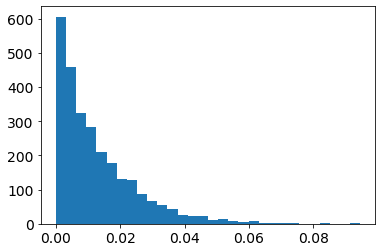

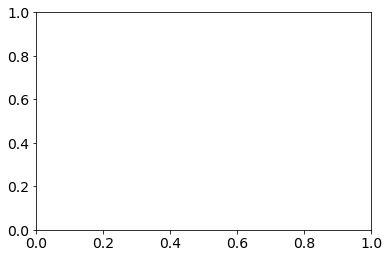

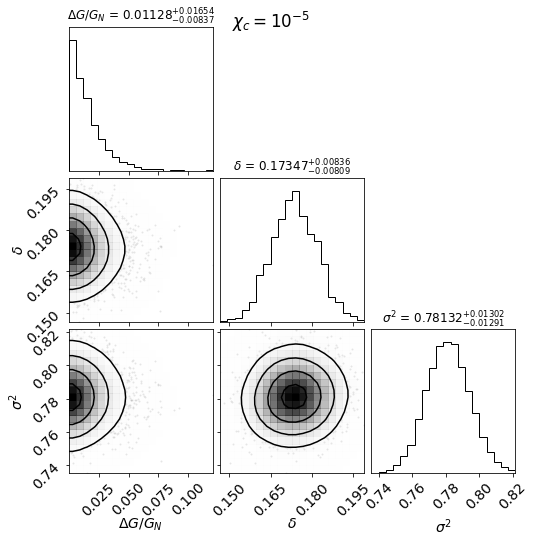

  0%|▏                                          | 4/918 [00:00<00:29, 31.24it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 3.0560913384094887e-06
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 2.413499593458155e-06
10213-1902 [50] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 50.0 0.0 1.1184968104938001e-06
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 1.4880768828149801e-06
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0 0.0 2.0957806680005217e-05
10218-12703 [50] [

  1%|▌                                         | 12/918 [00:00<00:28, 31.76it/s]

10218-3704 [50] [-0.2423, -0.7324, -0.4111, -0.2502, -0.1409, -0.2076, -0.2494, -0.3265, -0.3433, -0.3506, -0.3606, -0.3689, -0.3645, -0.3466, -0.4111, -0.2985]
10218-3704 50.0 0.0 2.8544115499017665e-06
10219-9102 [50] [1.3962, 1.1814, 0.7492, 0.4692, 0.3335, 0.2205, 0.1532, 0.1423, 0.1945, 0.153, 0.0798, 0.0216, -0.0715, -0.157, -0.0196, -0.0532, -0.0405]
10219-9102 50.0 0.0 1.3125466262136567e-06
10220-12705 [50] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 50.0 0.0 1.3560158628683667e-06
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 1.0632462508311137e-05
10224-9101 [50] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 50.0 0.0 7.791759514909761e-07
10226-12704 [50] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6

  2%|▉                                         | 20/918 [00:00<00:28, 31.73it/s]

10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 1.612450346764896e-05
10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 1.8239714240326906e-05
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 1.4062417254333498e-05
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 50.0 0.0 2.6025536441192053e-06
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 1.712553587964964e-05
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.00

  3%|█▎                                        | 28/918 [00:00<00:28, 31.07it/s]

10495-12704 [50] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 50.0 0.0 1.0802983679863661e-05
10495-12705 [50] [871.1598, 1245.0304, 1205.1955, 1347.7893, 1374.3588, 1517.2635, 1622.8998, 1633.9971, 1757.8692, 1799.4196, 1854.634, 1999.5551, 1849.1662, 1882.4866, 1807.1303, 1651.9125, 1681.1326, 1493.9167, 2771.4516, 2121.0254, 1992.5196]
10495-12705 50.0 0.0 8.18747845172052e-07
10495-3702 [50] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 50.0 0.0 2.8105788900621423e-06
10496-12704 [50] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268.8121, 253.915, 333.7881, 358.7629, 315.1183, 261.3063, 216.6964, 267.188, 258.5169, 256.0365, 248.4992]
10496-12704 50.0 0.0 1.641128698212473e-06
10496-12705 [50] [-0.3

  3%|█▍                                        | 32/918 [00:01<00:26, 32.88it/s]

10499-3702 [50] [-0.3822, -0.1753, 0.3237, 0.6092, 0.8357, 0.9307, 1.1046, 1.1845, 1.1657, 1.064, 1.005, 1.0954, 0.7875, 0.8892, 0.9769, 1.0508, 1.3156, 1.2283]
10499-3702 50.0 0.0 1.6656058978876891e-06
10499-3703 [50] [-0.0563, -0.0436, 0.024, 0.1267, -0.0775, -0.0664, 0.0153, -0.0929, -0.1244, -0.0851, -0.0939, -0.1131, -0.1033, -0.048, 0.0474, 0.0456, 0.0289, -0.0666, -0.0844, -0.5663]
10499-3703 50.0 0.0 2.063838311026732e-06
10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 3.3756304826450954e-06
10500-12704 [3.984823618090452] [140.7935, 35.4055, 16.1502, 8.7997, 6.1202, 5.6067, 5.0715, 4.9205, 5.0767, 4.6234, 4.2501, 4.0673, 3.8962, 3.8831, 3.7867, 3.6009, 3.0687, 4.1948, 2.9642, 3.5448, 1.9938, -0.2753, 2.8838, 5.8145]
10500-12704 3.984823618090452 1.5884407328805467e-07 5.975911538668055e-07
10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 3.2148895

  4%|█▊                                        | 40/918 [00:01<00:25, 34.25it/s]

10501-12704 [50] [1.3181, 1.9521, 1.9474, 1.8957, 2.0169, 2.066, 2.2805, 2.1361, 1.7635, 1.5052, 2.0197, 2.1387, 2.493, 1.9877, 1.7896, 1.1205, 1.6972, 2.5971]
10501-12704 50.0 0.0 3.341338001365274e-06
10501-6101 [50] [54.152, 240.5257, 446.403, 593.882, 679.4829, 745.3089, 578.3118, 397.5307, 268.9797, 276.8619, 234.4717, 196.8602, 156.2454, 140.6324, 64.5922]
10501-6101 50.0 0.0 2.211337597890167e-06
10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 50.0 0.0 1.8459293284089478e-06
10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 1.8976846732207311e-06
10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 9.363961728050999e-06
10505-12704 [50] [0.622

  6%|██▍                                       | 52/918 [00:01<00:19, 43.75it/s]

10509-6101 [50] [414.6573, 159.5598, 352.8386, 670.9188, 930.199, 434.1238, 984.9702, 921.6235, 784.8291, 825.2006, 827.4197, 661.5592, 624.5693, 894.3523, 620.0269, 747.519, 623.1939, 701.341, 577.342, 1031.0135, 622.2157, 697.4912, 668.4888, 271.226]
10509-6101 50.0 0.0 1.74160567027437e-06
10511-12704 [50] [-0.0162, 0.2052, 0.0934, -0.0203, -0.0645, -0.0743, -0.1124, -0.1256, -0.1314, -0.1489, -0.145, -0.1344, -0.261, -0.3154, -0.4542, -0.3737, -0.3967, -0.387, 0.3583, -0.1418, -0.7705]
10511-12704 50.0 0.0 2.584190228689339e-06
10511-12705 [50] [-0.2818, -0.0952, 0.2141, 0.2185, 0.0509, 0.0112, -0.034, -0.0386, -0.0777, -0.1248, -0.1302, -0.15, -0.1634, -0.2053, -0.2903]
10511-12705 50.0 0.0 1.2636852315424278e-06
10512-12701 [50] [-0.3741, -0.2352, -0.2444, -0.3467, -0.39, -0.3702, -0.2987, -0.245, -0.2376, -0.1861, -0.2187, -0.1372]
10512-12701 50.0 0.0 9.803961339362315e-07
10512-12705 [50] [-0.9971, -0.9962, -0.9967, -0.9971, -0.9969, -0.9968, -0.9961, -0.9958, -0.9964, -0.9971

  7%|██▉                                       | 64/918 [00:01<00:16, 50.44it/s]

10518-1902 [50] [-0.0105, 0.2572, 0.0495, 0.0308, 0.0287, -0.0677, -0.0841, -0.0885, -0.1994, -0.1432, -0.1195, -0.1634, -0.1173, -0.1219, -0.165, -0.1325, -0.1731]
10518-1902 50.0 0.0 2.865236137393093e-06
10518-6102 [50] [-0.217, 1.2282, 0.4062, 0.3459, 0.382, 0.1799, 0.1478, 0.1175, 0.0995, 0.1358, 0.0812, 0.048, 0.0452, 0.0639, 0.0875, 0.0309, 0.0337, 0.0007, -0.0113, -0.1383]
10518-6102 50.0 0.0 1.5528260925237122e-06
10519-12704 [50] [-0.2611, 0.2686, 0.1702, 0.0601, 0.0584, 0.0258, -0.0515, -0.1077, -0.1123, -0.1006]
10519-12704 50.0 0.0 2.321527967557907e-06
10519-6102 [50] [15.342, 9.7033, 5.6052, 3.8579, 2.785, 2.1688, 1.9416, 1.9483, 2.0544, 1.8028, 1.946, 2.1855, 2.046, 2.3544, 2.1616]
10519-6102 50.0 0.0 5.270000422132665e-06
10520-12704 [50] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.0366, 0.0275, -0.0135, 0.0213, 0.0998, -0.1048, -0.1309]
10520-12704 50.0 0.0 1.3199693594143403e-06
10520-6102 [50] [-0.9995, -0.9993, -0.9985, -0.9976, -0.9986, -0.

  8%|███▍                                      | 76/918 [00:01<00:16, 52.32it/s]

10841-12701 [50] [-0.7323, -0.6652, -0.4249, -0.3016, -0.2957, -0.3482, -0.374, -0.3905, -0.3944, -0.4309, -0.4302, -0.4504, -0.4708, -0.4257, -0.4725]
10841-12701 50.0 0.0 3.834202623378149e-06
10842-3702 [50] [-0.5415, 0.0585, 0.2828, 0.1825, 0.1674, 0.1342, 0.1324, 0.2899]
10842-3702 50.0 0.0 8.372305556293981e-07
10842-3703 [50] [-0.6099, -0.8101, -0.8807, -0.9171, -0.9297, -0.9289, -0.9268]
10842-3703 50.0 0.0 8.388089583190947e-07
10842-9101 [50] [-0.987, -0.9943, -0.9967, -0.9976, -0.9979, -0.998, -0.9982, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9983, -0.9981, -0.998, -0.9982, -0.9979, -0.9982, -0.9983]
10842-9101 50.0 0.0 1.0463919742836906e-06
10845-12702 [50] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-12702 50.0 0.0 1.7791089317709672e-06
11004-12705 [50] [-0.8497, -0.6991, -0.5203, -0.3493, -0.2406, -0.2193, -0.1954, -0.1792, -0.1842, -0.1767, -0.1858, -0.1781, -0.195, -0.2173, -0.2294, -0.167, -0.2434, -0.15

 10%|████                                      | 89/918 [00:02<00:15, 55.15it/s]

11011-12703 [50] [9.8651, 35.0102, 40.3579, 54.0601, 192.4013, 365.0512, 378.092, 411.2362, 282.7202, 230.5846, 329.2445, 263.6472, 244.1501]
11011-12703 50.0 0.0 1.625933428272925e-05
11012-12705 [50] [0.2329, 0.5509, 0.2517, 0.0195, 0.0174, -0.0704, -0.1937, -0.145, -0.249, -0.0592, -0.302, -0.1828, -0.2112]
11012-12705 50.0 0.0 1.436429315885591e-05
11012-3702 [50] [7.8974, 3196.585, 2734.8285, 2253.8811, 4078.0168, 2401.2221, 2680.4924, 2677.0305, 2494.671, 2122.0656, 2023.2433, 2124.4295, 1742.4806, 1879.5204, 1353.859, 1265.244, 1077.374, 829.3809, 807.9255, 437.3493, 291.3315]
11012-3702 50.0 0.0 9.616368119672209e-06
11012-9102 [50] [4.3613, 1.8587, 0.9243, 0.4611, 0.1717, 0.0565, -0.0003, -0.0124, 0.0149, 0.0346, 0.0094, 0.0256, 0.0391, 0.0441, 0.0302, -0.0599, -0.0933, -0.0179]
11012-9102 50.0 0.0 8.945924735205207e-06
11013-12702 [50] [0.7904, 0.6387, 0.0779, 0.1203, 0.0592, -0.004, -0.016, 0.0128, 0.0194, 0.059, 0.0663]
11013-12702 50.0 0.0 4.0281580284578734e-06
11013-1902

 11%|████▌                                    | 101/918 [00:02<00:15, 53.01it/s]

11017-9101 [50] [-0.5273, 0.0425, 0.2188, 0.1666, 0.07, 0.0407, -0.0503, -0.1282, -0.2004, -0.2244, -0.1722, -0.1497, -0.0815, -0.0967, -0.1443, -0.1476, -0.1864, -0.1536, -0.2264, -0.18]
11017-9101 50.0 0.0 1.4191769865428762e-06
11018-12702 [50] [-0.9839, -0.9926, -0.9927, -0.9922, -0.9923, -0.9935, -0.9932, -0.9925, -0.9931, -0.994, -0.9941]
11018-12702 50.0 0.0 1.8955004418563894e-06
11018-12704 [50] [-0.9989, -0.9988, -0.9986, -0.9987, -0.9988, -0.999, -0.999, -0.9991, -0.9991, -0.9987, -0.9984, -0.9975, -0.9987, -0.9989]
11018-12704 50.0 0.0 1.4425648970884908e-06
11018-3702 [50] [0.6083, 0.007, 0.0959, 0.33, 0.5514, 0.4356, 0.3654, 0.3085, 0.3057, 0.287, 0.3004]
11018-3702 50.0 0.0 1.5931903969157906e-06
11018-3703 [50] [-0.5454, 0.4164, 0.6741, 0.5852, 0.6907, 0.7028, 0.6059, 0.5528, 0.656, 0.6306, 0.5445, 0.5549, 0.4676, 0.4329, 0.3355, 0.3242, 0.462, 1.051, 0.5129, 1.3094]
11018-3703 50.0 0.0 6.891594726444117e-06
11018-6102 [50] [69.1052, 130.9961, 113.1141, 109.1797, 92.598

 12%|█████                                    | 113/918 [00:02<00:15, 51.86it/s]

11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 1.763754074337638e-05
11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 1.0966057026409414e-05
11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 7.509011336652503e-05
11742-12704 [50] [0.6702, -0.5312, -0.3481, 0.0047, 0.1348, 0.415, 0.2787, 0.5138, -0.0348]
11742-12704 50.0 0.0 1.4503006780006453e-06
11743-1901 [50] [-0.5717, -0.3943, -0.5273, -0.3736, -0.306, -0.392, -0.3766, -0.4151, -0.3665, -0.4111, -0.4236, -0.3424, -0.3877, -0.3594, -0.291, -0.4952, -0.6018]
11743-1901 50.0 0.0 7.808928745146512e-06
11744-9102 [50] [-0

 14%|█████▌                                   | 125/918 [00:02<00:15, 51.37it/s]

11746-9102 [50] [-0.478, -0.2133, -0.2528, -0.1774, -0.2077, -0.2266, -0.2099, -0.2691, -0.1996, -0.2114, -0.1249, -0.1799, -0.1765, -0.1376, -0.2784, -0.2323, -0.1941, -0.3005, -0.2047, -0.3235, -0.1159, 0.1709]
11746-9102 50.0 0.0 1.538435560713414e-05
11747-12702 [50] [-0.4876, -0.2412, -0.0165, -0.0887, -0.0931, -0.0756, -0.076, -0.0313, -0.0043, 0.0037, -0.0318, -0.1133, 0.1257, -0.1019, 0.1921, -0.2837, -0.0753]
11747-12702 50.0 0.0 5.883438119292867e-05
11749-12701 [50] [-0.6821, -0.1137, 0.255, 0.1029, 0.0811, -0.0849, -0.2182, -0.1487, -0.1095, -0.0437, -0.1285, -0.1939]
11749-12701 50.0 0.0 1.0792102463321204e-06
11749-12704 [50] [1.1585, 1.0264, 1.2033, 1.4986, 1.8954, 2.0398, 2.1095, 2.1199, 1.4688, 1.3033, 0.9132, 0.8426, 0.0515, 0.4719, -0.3735]
11749-12704 50.0 0.0 8.241364640607762e-06
11749-3701 [50] [618.0455, 872.9003, 1483.1859, 1615.2011, 1553.7949, 1334.0598, 1385.5396, 1283.8547, 1216.0833, 1294.494, 1472.7433, 1080.4933, 1346.7897, 1196.9726, 1091.8413, 1216.730

 14%|█████▊                                   | 131/918 [00:02<00:15, 50.98it/s]

11753-3703 [50] [0.2801, 0.7604, 0.7391, 0.5795, 0.35, 0.1693, 0.0874, 0.0586, 0.0152, -0.0057, -0.0099, -0.0594, -0.1073, -0.139, -0.1496]
11753-3703 50.0 0.0 3.5571769542071077e-06
11753-6104 [50] [1.7058, 1.5787, 1.7231, 1.492, 1.0043, 0.8699, 0.6579, 0.5905, 0.5042, 0.4712, 0.4504, 0.6153, 0.6589, 0.6817, 0.5206, 0.5457, 0.5195, 0.692]
11753-6104 50.0 0.0 2.071382677402873e-06
11754-1901 [50] [-0.2402, -0.5388, -0.5143, -0.4398, -0.487, -0.4664, -0.4721, -0.5334, -0.5004, -0.4954, -0.6115, -0.5884]
11754-1901 50.0 0.0 5.91178389416606e-06
11755-12701 [50] [-0.773, -0.7865, -0.7717, -0.7522, -0.7475, -0.7159, -0.7048, -0.6936, -0.7373, -0.7183, -0.7382, -0.7769, -0.6833, -0.7924, -0.5695, -0.681, -0.5512]
11755-12701 50.0 0.0 2.738040135874705e-06
11755-6101 [50] [-0.0093, 1.0489, 0.9853, 1.2444, 1.0667, 0.8902, 0.7008, 0.6245, 0.5835, 0.5179, 0.397, 0.4083, 0.4791, 0.2148, 0.053]
11755-6101 50.0 0.0 2.4526474722468176e-06
11755-9102 [50] [0.1799, 0.2485, 0.3504, 0.383, 0.2088, 0.14

 16%|██████▍                                  | 143/918 [00:03<00:15, 49.92it/s]

11760-12703 [50] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0.539, 0.1155, 0.1223, 0.309]
11760-12703 50.0 0.0 1.2756961651405883e-06
11760-6101 [50] [0.4533, -0.0157, 0.5654, 0.502, 0.3995, 0.359, 0.3287, 0.2964, 0.2063, 0.2512, 0.2686, 0.2421, 0.2368, 0.1884, 0.0906, -0.0471, -0.3849, -0.319, -0.8166]
11760-6101 50.0 0.0 8.930403254442966e-06
11760-6103 [50] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.2117, -0.2373, -0.2365, -0.2317, -0.3078, -0.2653, -0.3184, -0.2638]
11760-6103 50.0 0.0 1.5621127962873346e-06
11760-9102 [50] [-0.8049, -0.6427, -0.2931, -0.1213, 0.1899, 0.0235, 0.108, 0.1381, 0.1732, 0.1865, 0.1624, 0.1963, 0.1218, 0.1215, 0.1223, 0.2636, 0.046, 0.5962, 0.1808, 0.9922, 2.2582]
11760-9102 50.0 0.0 1.2944444267913942e-06
11761-12702 [50] [-0.6826, -0.6017, -0.2216, -0.1122, -0.0329, -0.02, -0.0711, -0.0937, -0.0782, -0.098, -0.1546, -0.1024, -0.1043, -0.0648, -0.

 17%|██████▉                                  | 154/918 [00:03<00:15, 49.94it/s]

11830-12701 [50] [-0.9938, -0.9825, -0.9834, -0.9912, -0.9934, -0.9941, -0.9946, -0.9933, -0.9936, -0.9951, -0.9951, -0.9944, -0.9947, -0.9932, -0.9955, -0.9854, -0.997, -0.9939, -0.9962]
11830-12701 50.0 0.0 3.2809719689631637e-06
11830-12703 [50] [-0.4776, 0.0437, 0.1582, -0.0709, -0.1607, -0.0754, 0.055, 0.2665, 0.1845, 0.03, 0.0663, -0.087, -0.2185, -0.1589, 0.0536, -0.3722]
11830-12703 50.0 0.0 7.930288919528938e-06
11830-3702 [50] [1.2195, 0.9978, 0.6546, 0.4726, 0.5057, 0.555, 0.4749, 0.3884, 0.4626]
11830-3702 50.0 0.0 3.4394869816675606e-06
11830-6104 [50] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.0353, -0.2063, -0.258, -0.2347, -0.2692, -0.3985]
11830-6104 50.0 0.0 3.48543004043884e-06
11831-12703 [50] [0.4472, 0.0224, 0.062, 0.158, -0.0429, -0.0922, -0.1252, -0.188, -0.1276, -0.16, -0.2596, -0.2165, 0.1708, -0.4595]
11831-12703 50.0 0.0 9.355117357912128e-06
11831-12704 [50] [-0.5822, -0.2435, 0.0115, -0.0848, -0.1704, -0.028, -0.0888, -0

 18%|███████▎                                 | 164/918 [00:03<00:15, 48.15it/s]

11836-1902 [50] [0.7026, 1.2767, 1.1865, 1.1009, 0.973, 0.9921, 0.7024, 0.7206, 0.623, 0.6145, 0.5505, 0.5955, 0.6037, 0.4142, 0.4147]
11836-1902 50.0 0.0 9.523393950695079e-06
11838-12701 [50] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 0.1336, 0.0903, 0.0213, -0.0554, -0.0342, 0.0225, 0.0053, -0.0272]
11838-12701 50.0 0.0 4.137878934627529e-06
11838-12703 [50] [144.9042, 254.2159, 538.0129, 911.0748, 1089.8377, 1111.2623, 1284.2649, 1228.3752, 1345.2496, 1400.7846, 1427.4787, 1434.5371, 1257.47, 1184.9615, 998.2342, 830.6266, 670.98, 596.3078, 488.5417, 423.536, 329.6538, 32.3109, 5.6457, 31.8479]
11838-12703 50.0 0.0 1.7135174045224084e-06
11838-3702 [50] [0.536, 0.7094, 0.6061, 0.6555, 0.6466, 0.6204, 0.5689, 0.587, 0.6487, 0.6337, 0.5876, 0.5059, 0.4509, 0.4328, 0.3954, 0.396]
11838-3702 50.0 0.0 2.85785414413844e-06
11838-6103 [50] [201.1554, 531.7007, 967.9199, 1125.4471, 1324.9799, 1297.8083, 1279.6033, 1183.901, 1134.9301, 1132.4611, 1104.3121, 1011.7157, 1287.8266]
11838-6103 50

 19%|███████▊                                 | 174/918 [00:03<00:15, 47.71it/s]

11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 2.0063804618137045e-06
11865-9102 [50] [-0.467, -0.4695, -0.4789, -0.5286, -0.6182, -0.6445, -0.6408, -0.6047, -0.6031, -0.6243, -0.655, -0.6895, -0.6998, -0.5904, -0.6729, -0.6983]
11865-9102 50.0 0.0 9.152172139608938e-07
11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2771, 0.298, 0.3814, 0.3262, 0.2102, 0.3978, 0.4467, 0.2866, 0.1214, 0.2202, 0.1346, 0.4041]
11867-6104 50.0 0.0 6.0316277413603716e-06
11867-9101 [50] [0.9073, 0.3027, 0.1546, 0.1123, 0.0285, 0.0159, -0.0244, 0.0205, 0.0824, 0.1908, 0.2079, 0.2195, 0.3058, 0.2425, 0.1871, 0.3056]
11867-9101 50.0 0.0 3.9725585790463595e-06
11868-12703 [50] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 5.613503141147356e-06
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 2.297663525261

 20%|████████▎                                | 185/918 [00:04<00:15, 47.60it/s]

11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 6.764124303864834e-05
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389.9946, 2439.1642, 2636.587, 2485.7262, 2056.7992, 1736.2622, 1623.5415, 1192.5228, 781.8483, 546.9719, 175.874]
11942-12704 50.0 0.0 3.889943021666625e-05
11942-6104 [11.364315577889448] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 11.364315577889448 1.7052100497606138e-07 5.865661273427315e-07
11943-3703 [50] [0.0586, 0.1961, 0.0497, 0.1522, 0.1713, 0.0799, 0.0425, -0.0331, -0.0546, -0.0982, -0.1371, -0.164, -0.179, -0.1863, -0.172, -0.1572, -0.1563, -0.1648, -0.1726, -0.27]
11943-3703 50.0 0.0 4.927434160221739e-05
11944-12701 [50] [-0.3604, -0.3617, -0.4276, -0.5869, -0.6347, -0.6283, -0.548, -0.5758, -0.5204, -0.4847, -0.4769, -0.4857, -0.5345, -0.63

 21%|████████▋                                | 195/918 [00:04<00:15, 45.63it/s]

11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 1.587211823573044e-05
11954-12704 [50] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453, 0.1801, 0.125, 0.0276, -0.0116, -0.0744, -0.134, -0.1626, -0.2559, -0.2802]
11954-12704 50.0 0.0 1.2772767885966936e-05
11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.2778]
11954-3703 50.0 0.0 1.3846917988362107e-05
11954-9101 [50] [-0.9882, -0.9937, -0.9946, -0.9965, -0.9974, -0.9972, -0.997, -0.9969, -0.997, -0.9974, -0.9978, -0.9979, -0.9973, -0.9971, -0.9976, -0.9966]
11954-9101 50.0 0.0 1.3438742422857037e-05
11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 9.725976592113966e-06
11956-12702 [50] [5.695

 23%|█████████▏                               | 207/918 [00:04<00:14, 48.59it/s]

11958-6103 [50] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 50.0 0.0 9.591943677849745e-07
11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 4.294014829985188e-06
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 50.0 0.0 1.2719938455057311e-05
11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.9843, 0.6333, 0.3517, 0.1829, 0.1258, 0.0956, 0.1424, 0.1021, 0.028, 0.1221]
11965-9102 50.0 0.0 7.79831026292642e-06
11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 1.943773961116502e-05
11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.8986,

 24%|█████████▋                               | 218/918 [00:04<00:14, 47.86it/s]

11975-12705 [50] [0.6902, 0.7621, 0.3208, 0.2527, 0.3317, 0.3259, 0.2387, 0.0864, 0.069, 0.2015, 0.1928, 0.1502, -0.0055, -0.1924]
11975-12705 50.0 0.0 6.2265296428567e-06
11975-3703 [50] [-0.2597, -0.0329, 0.0768, 0.0833, 0.1048, 0.0682, 0.0342, -0.0156, -0.0756, -0.093, -0.0695, -0.0466, 0.0656, -0.0085, 0.1237, 0.1334, 0.0646]
11975-3703 50.0 0.0 7.150333692943303e-06
11975-6104 [50] [1.0196, 1.2709, 1.5062, 1.1104, 0.9965, 0.7778, 0.776, 0.6311, 0.7603, 0.6278, 0.6208, 0.5151, 0.5172, 0.5343, 0.2326, 0.5012, 0.187, 0.4522, 0.1401, 0.1327]
11975-6104 50.0 0.0 1.1947030158331337e-05
11976-12703 [50] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 50.0 0.0 6.084459714993266e-06
11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 50.0 0.0 1.6876108931794754e-06
11978-12705 [50] [0.0184, 0.096

 25%|██████████▏                              | 229/918 [00:04<00:14, 48.44it/s]

11979-9102 [50] [0.6334, -0.323, -0.1351, -0.0857, 0.0053, 0.0302, 0.0467, 0.0752, 0.0566, 0.0459, 0.0116, 0.0269, 0.0046, -0.0156, -0.091, -0.1558, -0.3105, -0.4242, -0.5324]
11979-9102 50.0 0.0 2.2570588868295046e-06
11981-12704 [50] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]
11981-12704 50.0 0.0 2.3658437028528777e-06
11981-9102 [50] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188, -0.1444, -0.128, -0.1812, -0.1904, -0.2284, -0.2044, -0.2061, -0.1486, -0.2345, -0.2114, 0.0329, 0.7603]
11981-9102 50.0 0.0 1.901190957397016e-05
11982-12704 [50] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.1555, 0.0797, -0.029, 0.0037, 0.2331]
11982-12704 50.0 0.0 1.9082730195872074e-06
11982-3703 [50] [-0.314, 0.4086, 0.6273, 0.7714, 0.9457, 0.986, 1.0945, 1.392, 1.3945, 1.539, 1.4145, 1.0397, 1.0282, 0.5616, 0.557

 26%|██████████▋                              | 239/918 [00:05<00:15, 44.19it/s]

12067-12703 [50] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
12067-12703 50.0 0.0 2.365808566374742e-06
12067-12705 [50] [0.4291, 1.3434, 2.0219, 1.7622, 1.0305, 0.7583, 0.4763, 0.1261, 0.0511, 0.0662, 0.1502, 0.2361, 0.2324, 0.212, 0.3434]
12067-12705 50.0 0.0 2.5266236677020214e-06
12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 4.064604746716656e-05
12068-6104 [50] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 50.0 0.0 5.80826175447982e-05
12069-12704 [50] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 50.0 0.0 2.113253806881229e-06
12069-12705 [50] [1.7332, 1.137,

 27%|██████████▉                              | 244/918 [00:05<00:15, 43.58it/s]

12071-3702 [50] [43.1041, 1833.3653, 2193.0557, 2409.7616, 2285.0769, 1925.6484, 1966.7994, 2043.2628, 1997.8474, 1832.4832, 1658.3071, 1528.5931, 1298.5116, 1014.8264, 552.6982, 136.4828]
12071-3702 50.0 0.0 1.98686811352984e-06
12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.3083, 398.9949, 258.1108, 178.8144, 146.4641, 210.3609, 51.4796, 32.8354, 22.052]
12071-3704 50.0 0.0 2.377919345007552e-06
12075-12704 [50] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 50.0 0.0 2.7294228309801006e-06
12078-12703 [50] [0.3298, 0.5608, 0.2182, 0.3221, 0.2303, 0.0896, 0.0846, 0.2051, 0.3186, 0.33, 0.2532]
12078-12703 50.0 0.0 1.8513165348096811e-06
12078-6103 [50] [1.9637, 5.3953, 4.122, 4.276, 4.2033, 3.4926, 3.3028, 3.2038, 3.1762, 3.0769, 2.868, 2.5911, 2.6527, 2.4952, 2.6226, 2.6979, 2.1328, 1.6158, 1.3218, 1.8508]
12078-6103 50.0 0.0 1.0330889111731772e-06
12079-12705 [3.3805105

 28%|███████████▍                             | 255/918 [00:05<00:17, 38.04it/s]

12084-12704 [50] [-0.663, -0.3425, -0.4511, -0.3814, -0.1944, -0.0031, -0.041, -0.1276, -0.2047, -0.2499, -0.2565, -0.1988, -0.1657, -0.268, -0.3391, -0.2896]
12084-12704 50.0 0.0 9.127778023014931e-06
12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-12705 50.0 0.0 2.2309288512937386e-06
12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.419, 0.387, 0.4139, 0.5272, 0.4564, 0.6029, 0.4957, 0.5971, 0.6267, 0.5749, 0.7061, 0.6081, 0.5243, 0.4383, 0.5097, 0.4647, 0.2768, 0.3996, 0.231, 0.2274, 0.4698, 0.2204, 0.2727]
12084-1901 50.0 0.0 2.9271010803408643e-06
12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
12084-3702 50.0 0.0 2.7584589157675153e-06
12084-3703 [50] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.

 28%|███████████▌                             | 259/918 [00:05<00:19, 33.30it/s]

12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0.0071, -0.0873, -0.0572, 0.0209, 0.0881, 0.0588, 0.0753, 0.0542]
12085-12704 50.0 0.0 3.073439085671931e-05
12085-6101 [50] [-0.1417, -0.3914, -0.1738, -0.0755, -0.0973, -0.0439, -0.1113, -0.1774, -0.1947, -0.1728, -0.1408, -0.1367, -0.1146, -0.1045, -0.1506, -0.0235, -0.0308, -0.0502, 0.0507]
12085-6101 50.0 0.0 1.255274192076935e-05
12085-6103 [50] [-0.549, -0.354, -0.3619, -0.3336, -0.3191, -0.1878, -0.2268, -0.2779, -0.144, -0.2236, -0.1423, -0.1582, -0.1565, -0.2223, -0.1937, -0.2795, -0.2396, -0.2355, -0.213, -0.3557, -0.311]
12085-6103 50.0 0.0 1.7240508064447804e-06
12085-9102 [50] [0.6086, 0.5632, 0.3343, 0.2119, 0.1282, 0.0402, 0.0288, 0.0478, 0.0313, 0.001, -0.0532, -0.0537, -0.0634, -0.0662, -0.1794, -0.1779, -0.239]
12085-9102 50.0 0.0 1.5845662807859338e-06
12088-12705 [50] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-127

 29%|███████████▋                             | 263/918 [00:05<00:21, 30.94it/s]

12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-12702 50.0 0.0 8.683237103878287e-07
12089-12704 [50] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 50.0 0.0 1.805906786265356e-05
12089-1901 [50] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 50.0 0.0 2.3658395082381364e-05
12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722, -0.1642, -0.1028, -0.1287, -0.1434, -0.0908, -0.1289, -0.1084, -0.2404, -0.097, 0.1709, -0.3201, -0.0196, -0.302]
12089-6103 50.0 0.0 9.784155131793592e-06
12092-6101 [50] [0.0026, 0.3918, 0.1405, 0.0977, 0.005, 0.0277, 0.1281, 0.0885, 0.0628, 0.0291, -0.0173, -0.1181]
12092-6101 50.0 0.0 1.0891831398428072e-05


 29%|████████████                             | 270/918 [00:06<00:22, 28.19it/s]

12093-9101 [50] [-0.9989, -0.997, -0.9973, -0.998, -0.9985, -0.9987, -0.9987, -0.9986, -0.9986, -0.9987, -0.9983, -0.9981, -0.9979, -0.9991, -0.9971]
12093-9101 50.0 0.0 8.761064143467447e-06
12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 40.9064, 40.0677, 39.5836, 40.4106, 39.3101, 37.4365, 38.9587, 41.7447, 41.525, 40.104, 39.0721, 39.6893, 56.2685, 25.7726, 27.1981, 33.78]
12094-3701 50.0 0.0 3.4348993040330935e-06
12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 4.132674876008945e-06
12483-12703 [50] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -0.0898]
12483-12703 50.0 0.0 2.746912907024506e-06
12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 6.0674872165523935e-06
12483-12705 [50] [-0.5251, -0.5296, -

 30%|████████████▎                            | 276/918 [00:06<00:25, 25.56it/s]

12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 50.0 0.0 4.170898487564746e-06
12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696, 2047.2799, 2334.4928, 2266.757, 2196.3005, 1862.0235, 1612.2288, 2078.9089]
12488-6102 50.0 0.0 3.472822047547307e-06
12488-9101 [50] [0.89, -0.0571, 0.0018, 0.0675, 0.0814, 0.1021, 0.1178, 0.0708, 0.0758, 0.1268, 0.0533, 0.0597, 0.0532, 0.0414, 0.1038, 0.0181, -0.1356, -0.2319, -0.1377]
12488-9101 50.0 0.0 2.657120622096607e-06
12489-3703 [50] [6.1258, 7.3921, 7.9142, 7.3592, 6.7186, 6.0984, 5.5884, 5.3024, 5.0796, 4.2963, 4.3283, 3.7505, 4.11, 3.5385, 4.098]
12489-3703 50.0 0.0 8.72091573134179e-06
12490-3701 [50] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-3701 5

 31%|████████████▌                            | 282/918 [00:06<00:26, 24.04it/s]

12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0.0863]
12506-12701 50.0 0.0 9.683912574154348e-06
12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0.0 4.8238008532193e-06
12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0 0.0 8.829795188145273e-07
12512-12702 [50] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 50.0 0.0 1.310013647241832e-06
12514-12702 [50] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 50.0 0.0 9.61

 31%|████████████▊                            | 286/918 [00:06<00:24, 25.51it/s]

12514-9102 [50] [-0.6627, -0.5978, -0.3356, -0.1465, -0.1607, -0.0924, -0.0736, -0.019, 0.0855, 0.1041, 0.0741, -0.06, -0.1592, -0.1356, -0.0632, -0.2008, -0.2854]
12514-9102 50.0 0.0 1.5917729859588552e-06
12518-12705 [50] [-0.8683, -0.7393, -0.3648, -0.0579, -0.0274, -0.0334, -0.0145, 0.016, -0.0154, 0.0703, -0.1575, 0.0272]
12518-12705 50.0 0.0 2.7484603113805797e-06
12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 0.0 1.630675213831734e-06
12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.1091]
12518-9101 50.0 0.0 5.877204737485605e-06
12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 8.077259764367918e-06


 32%|█████████████                            | 292/918 [00:07<00:26, 23.59it/s]

12620-6104 [50] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 50.0 0.0 3.641911348667015e-06
12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 4.143648617389834e-06
12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903, -0.5645]
12621-12705 50.0 0.0 1.8935849359991783e-06
12621-6103 [50] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 50.0 0.0 2.8348440333839464e-06
12622-9101 [50] [0.295, -0.1664, 0.1745, 0.5326, 0.7376, 0.7334, 0.6499, 0.6151, 0.5534, 0.5303, 0.427, 0.3612, 0.3993, 0.3837, 0.4878, 0.4757, 0.3843, 0.0845]
12622-91

 32%|█████████████▎                           | 298/918 [00:07<00:27, 22.78it/s]

12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 9.051687041869067e-06
12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 1.2786655367302493e-05
12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 7.269508187119382e-06
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 1.547651239961733e-05
12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 4.3528123991119896e-05


 33%|█████████████▍                           | 301/918 [00:07<00:25, 23.74it/s]

12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 2.3618475945499405e-05
12679-12701 [0.7512] [-0.4106, -0.1602, -0.09, 0.0292, -0.1142, -0.1585]
12679-12701 0.7512 1.0070151338910602e-07 6.56395431938226e-07
12679-1902 [50] [0.6115, 0.2127, 0.2343, 0.0811, 0.186, 0.028, 0.0072, -0.086, -0.1377, -0.1341, -0.1745, -0.1741, -0.1973, -0.2294, -0.2344, -0.1462, -0.1584]
12679-1902 50.0 0.0 4.815998023344202e-06
12682-12705 [50] [211.5682, 164.2949, 154.5208, 172.1809, 188.4287, 205.8053, 188.0827, 175.7022, 171.521, 162.4793, 163.9925, 122.1814, 128.2861, 178.1773, 150.2355, 110.4372, 181.1071]
12682-12705 50.0 0.0 5.1982679273533085e-06
7443-12703 [50] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1

 33%|█████████████▋                           | 307/918 [00:07<00:27, 22.54it/s]

7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1547, -0.1713, -0.2761, -0.2934, -0.2123]
7443-12704 50.0 0.0 6.623411838908164e-06
7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 1.7245528574129416e-06
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.0333, -0.0403, -0.0345, -0.091, -0.0525, -0.2174, -0.2135, -0.5859, -0.4094]
7443-9101 50.0 0.0 1.12996567211781e-06
7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.1269]
7495-12702 50.0 0.0 7.605885619114935e-06
7495-12703 [50] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 50.0 0.0 8.582729397692803e-06


 34%|█████████████▊                           | 310/918 [00:08<00:27, 22.00it/s]

7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 7.046210609591725e-06
7815-12705 [50] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 50.0 0.0 1.7515245140071336e-06
7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 1.495024707224573e-06
7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 9.485587182194506e-07
7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 4.187860242986566e-06


 34%|██████████████                           | 316/918 [00:08<00:28, 21.38it/s]

7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 9.774675081714457e-07
7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 4.789146915570612e-06
7958-6101 [50] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 50.0 0.0 9.073753564123174e-07
7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 5.738041963395662e-06
7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 6.552746543227297e-06


 35%|██████████████▍                          | 322/918 [00:08<00:29, 20.47it/s]

7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 6.344625611393778e-06
7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 6.117619901418751e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 7.902286479614333e-06
7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 5.872623788502556e-06


 35%|██████████████▌                          | 325/918 [00:08<00:30, 19.68it/s]

7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 9.145850330820807e-07
7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 4.934676532687753e-06
7961-12705 [50] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 50.0 0.0 2.5554874354300685e-06
7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.0 1.7895842956922788e-06
7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 2.9198192668720

 36%|██████████████▊                          | 333/918 [00:09<00:24, 24.19it/s]

7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 50.0 0.0 2.649270478148257e-06
7963-12702 [50] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, -0.9982, -0.9988, -0.9993]
7963-12702 50.0 0.0 5.867355328570938e-06
7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 50.0 0.0 2.0763165707072074e-06
7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]
7963-9102 50.0 0.0 1.1761397552175741e-06
7964-6101 [50] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119, 

 37%|███████████████                          | 336/918 [00:09<00:25, 22.71it/s]

7965-12701 [50] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085, -0.0802, -0.1254, -0.0438, 0.0028, -0.0995, -0.4017]
7965-12701 50.0 0.0 7.934498273922279e-07
7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-1901 50.0 0.0 2.7695237896461054e-06
7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 50.0 0.0 1.0219908793485625e-06
7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211.5514, 236.7821, 394.8881, 237.9732]
7965-6102 50.0 0.0 2.6410817850881074e-06
7965-9102 [50] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 50.0 0.0 1.7442140078346608e-06


 37%|███████████████▎                         | 342/918 [00:09<00:27, 21.30it/s]

7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 3.3277997133717342e-06
7968-3701 [50] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 50.0 0.0 9.96538794223199e-06
7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 2.8816007598852306e-05
7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 1.4266067021820822e-06


 38%|███████████████▌                         | 348/918 [00:09<00:24, 23.16it/s]

7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 9.76363959637207e-06
7977-1902 [0.4547] [0.1072, 0.2856, 0.0387, 0.0618]
7977-1902 0.4547 1.7973503473494532e-07 5.634761388611872e-07
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 7.808055650054298e-06
7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 9.125744807765643e-06
7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 7.961992790514453e-06


 38%|███████████████▋                         | 351/918 [00:09<00:25, 22.13it/s]

7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 9.744431118274835e-06
7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 50.0 0.0 2.2983774922069682e-06
7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 8.463169324740095e-06
7990-6104 [50] [-0.3051, -0.0723, 0.2152, 0.3465, 0.313, 0.5262, 0.4361, 0.3236, 0.3249, 0.3219, 0.2532, 0.2184, 0.247, 0.3244, 0.1338, 0.4143, 0.0484]
7990-6104 50.0 0.0 1.5646831294933954e-05
7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 2.857108347194534e-05


 39%|███████████████▉                         | 357/918 [00:10<00:25, 21.91it/s]

7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 50.0 0.0 2.2453542527174346e-05
7992-6104 [50] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 50.0 0.0 3.7862132414319084e-05
8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 50.0 0.0 1.9012803074138081e-06
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 4.656981792867277e-06


 40%|████████████████▏                        | 363/918 [00:10<00:28, 19.78it/s]

8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 3.4065261725544135e-06
8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 1.5897994412103002e-05
8078-12703 [50] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 1.0804534236738732e-05
8078-6103 [50] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149, 0.1969, 0.1396, 0.1246, 0.1262, 0.1162, 0.0747, 0.0502, 0.0254, 0.0225, 0.0724, 0.0304, 0.0506, 0.0715]
8078-6103 50.0 0.0 1.0576446575523018e-05


 40%|████████████████▎                        | 366/918 [00:10<00:29, 18.73it/s]

8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 8.312448353841034e-06
8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 4.079719083682585e-06
8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 6.810125415997081e-06
8081-3704 [50] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 50.0 0.0 1.0306267727356077e-06


 40%|████████████████▌                        | 370/918 [00:10<00:30, 17.76it/s]

8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 5.507734792309431e-06
8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81, 2355.4256, 1939.6384]
8083-12703 50.0 0.0 5.497349011528579e-06
8083-12704 [50] [0.2913, 0.5243, 0.3002, 0.1297, 0.1194, 0.1533, 0.1494, 0.1802, 0.1606, 0.0654, 0.1299]
8083-12704 50.0 0.0 6.318164805132708e-06
8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 4.0607944794278475e-06


 41%|████████████████▋                        | 374/918 [00:11<00:31, 17.43it/s]

8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 3.2023968506739683e-06
8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 2.5152855161010496e-06
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 3.993128259673855e-06
8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 50.0 0.0 1.0856367343834913e-06


 41%|████████████████▉                        | 379/918 [00:11<00:29, 18.58it/s]

8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 2.6128249228500634e-06
8091-1902 [50] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747, -0.384]
8091-1902 50.0 0.0 8.1524377251216e-07
8092-12702 [17.755694472361807] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 17.755694472361807 1.4332036902724572e-07 6.145219217190187e-07
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 50.0 0.0 2.4644981132085345e-06
8095-6102 [0.9555] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276]
8095-6102 0.9555 1.8013313115984815e-07 5.7307243601

 42%|█████████████████▏                       | 384/918 [00:11<00:29, 18.31it/s]

8131-6101 [50] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.3082, -0.2951, -0.2734, -0.3441, -0.2421, -0.3611, -0.4068, -0.6194, -0.4921, -0.1798, -0.4715, -0.5173, -0.3887]
8131-6101 50.0 0.0 2.6706197720732858e-06
8131-9101 [50] [-0.2303, -0.2933, -0.4207, -0.0503, 0.2317, 0.5105, 0.546, -0.1014, -0.1852, -0.0457, 0.0346, 0.33, -0.5646, -0.6862, 0.939]
8131-9101 50.0 0.0 4.245459478107882e-05
8132-12702 [50] [-0.0491, -0.065, 0.2143, 0.0833, 0.0546, -0.0096, -0.0149, 0.021, -0.0837, 0.1062]
8132-12702 50.0 0.0 1.376557826583333e-05
8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.042320963447486e-05


 42%|█████████████████▎                       | 389/918 [00:11<00:26, 19.61it/s]

8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 5.178359054035522e-06
8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 6.741160540970557e-06
8137-12703 [50] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1275, -0.1695, -0.3013, -0.3381]
8137-12703 50.0 0.0 8.009801067097364e-07


 43%|█████████████████▌                       | 393/918 [00:12<00:29, 17.68it/s]

8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 50.0 0.0 5.5746739298918214e-06
8138-12702 [50] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 50.0 0.0 3.0156971113652906e-06
8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 7.168659457508977e-06
8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 2.4424147272308862e-06


 43%|█████████████████▋                       | 397/918 [00:12<00:30, 17.08it/s]

8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 6.371986250389093e-06
8140-3701 [50] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 50.0 0.0 7.796878022571226e-07
8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 6.367443939207484e-06
8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 4.561029802500163e-06


 44%|█████████████████▉                       | 401/918 [00:12<00:29, 17.39it/s]

8144-12702 [11.355729145728645] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 11.355729145728645 2.0935468076763667e-08 7.383048476936593e-07
8144-12703 [50] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 50.0 0.0 2.9407532116970053e-06
8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 2.755634986063e-06
8144-6101 [50] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271, 0.0969, 0.0527, 0.3307, 0.4308, 0.3921, 0.1682, -0.0968]
8144-6101 50.0 0.0 7.862276988956293e-07


 44%|██████████████████                       | 405/918 [00:12<00:31, 16.11it/s]

8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 2.084638719642608e-05
8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 1.6835149989356403e-06
8145-9101 [50] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 50.0 0.0 4.91909239543484e-06


 45%|██████████████████▎                      | 409/918 [00:13<00:30, 16.90it/s]

8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 2.974875054704031e-05
8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 3.260148104666846e-05
8146-9102 [6.512700502512562] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 6.512700502512562 2.2273462717992508e-07 5.363149830100816e-07
8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 5.413750165320313e-06
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.0

 45%|██████████████████▌                      | 415/918 [00:13<00:25, 19.64it/s]

8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 1.3372876996765417e-05
8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 4.096789125137717e-06
8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 1.6915278009898292e-06
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 3.83830958033009e-05
8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 2.312516818688162e-06


 45%|██████████████████▌                      | 417/918 [00:13<00:26, 18.76it/s]

8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 1.8347244562649224e-06
8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 2.9626126985068406e-05
8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 3.17362106414045e-06
8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 50.0 0.0 3.1544207435066144e-06


 46%|██████████████████▉                      | 423/918 [00:13<00:27, 17.90it/s]

8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 2.098175057712486e-06
8156-3701 [50] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 50.0 0.0 8.091242360894887e-07
8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 8.901796052188476e-06
8158-6104 [20.534422110552764] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 20.534422110552764 1.4049909153296304e-07 6.17443211323854e-07


 46%|██████████████████▉                      | 425/918 [00:14<00:29, 17.00it/s]

8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 3.373424540901882e-06
8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 4.157347908035489e-06
8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 7.110289603663001e-06
8241-6102 [50] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 50.0 0.0 8.78433824221823e-07


 47%|███████████████████▏                     | 429/918 [00:14<00:29, 16.43it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 4.3684445756461735e-05
8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 1.31473344220092e-06
8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 4.7364170957495885e-06
8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 1.580503311068946e-06


 47%|███████████████████▎                     | 433/918 [00:14<00:29, 16.24it/s]

8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 5.896493851221466e-06
8247-12702 [40.83871557788945] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063, 0.3394, 0.315, 0.2267, 0.2019, 0.1944, 0.0714, 0.0833, -0.0149, -0.0523, -0.0057]
8247-12702 40.83871557788945 5.5650146466562715e-09 7.537134928380345e-07
8247-12703 [50] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198, 0.0377, 0.0036, 0.0008, -0.06, -0.0599, -0.143, -0.1175, -0.2298, -0.1346, -0.2636, -0.3037, -0.2082, -0.3452, -0.2949, -0.2375, -0.5737, -0.8428, -0.2863]
8247-12703 50.0 0.0 8.299645826861808e-07
8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 3.257721094394481e-06


 48%|███████████████████▌                     | 437/918 [00:14<00:30, 15.83it/s]

8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247-9101 50.0 0.0 2.4346941374391107e-06
8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.2998, 1595.4501, 1320.9281, 1254.0149, 1837.1392, 1899.7801, 2506.6682, 2814.69, 1954.3222, 2246.1066, 1731.0676, 1875.7497, 1583.6158, 1841.3166, 477.0393]
8248-12701 50.0 0.0 2.4548068698521884e-06
8248-12702 [50] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 50.0 0.0 7.386545714994242e-06
8248-12704 [50] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 50.0 0.0 2.4823430551934127e-06


 48%|███████████████████▋                     | 441/918 [00:15<00:30, 15.75it/s]

8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 4.115136922297106e-06
8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 3.8142043753301677e-06
8249-6102 [50] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 50.0 0.0 1.4480746805284965e-06
8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 50.0 0.0 2.324385780685757e-06


 48%|███████████████████▊                     | 445/918 [00:15<00:30, 15.65it/s]

8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 4.847378363216338e-06
8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 2.082953620693447e-05
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 2.1673952138395437e-05
8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 2.3711652955607877e-05


 49%|████████████████████▏                    | 451/918 [00:15<00:28, 16.17it/s]

8252-9102 [50] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 568.3335, 671.6366, 717.9725, 510.1554, 342.074, 302.1941, 260.3132, 157.5104, 244.502, 117.7782, 292.6015, 101.1592]
8252-9102 50.0 0.0 1.6837011557098076e-06
8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-3703 50.0 0.0 1.6131397390544192e-06
8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 9.871102009550847e-06
8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 3.810187869270326e-06


 50%|████████████████████▎                    | 455/918 [00:15<00:29, 15.74it/s]

8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 2.738615425306628e-06
8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 4.862237180950006e-06
8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 3.6676695528730294e-06
8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 1.5584943422106817e-06


 50%|████████████████████▌                    | 459/918 [00:16<00:29, 15.37it/s]

8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 1.4288546746609738e-06
8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 5.5076521061073575e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 4.897562534625686e-05


 50%|████████████████████▌                    | 461/918 [00:16<00:28, 15.77it/s]

8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 5.1153544269444255e-06
8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.0 0.0 3.551435896063433e-06
8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 3.20357045707326e-06
8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 6.8592144330015785e-06


 51%|████████████████████▊                    | 465/918 [00:16<00:29, 15.35it/s]

8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 6.170881546919008e-06
8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 4.641025984670182e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 5.396072175852241e-06
8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.0 0.0 7.196280945110345e-06


 51%|████████████████████▉                    | 469/918 [00:16<00:30, 14.96it/s]

8263-12705 [50] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 50.0 0.0 2.5154546961478474e-06
8310-3701 [50] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 50.0 0.0 2.1349929732452712e-06
8310-9101 [50] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 50.0 0.0 1.9891870810237313e-06


 52%|█████████████████████▏                   | 473/918 [00:17<00:30, 14.63it/s]

8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 2.975175027077293e-06
8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 3.0130057466780262e-06
8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 7.235568676666616e-06


 52%|█████████████████████▏                   | 475/918 [00:17<00:29, 15.14it/s]

8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 2.328941394058428e-05
8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 5.602598620477531e-06
8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 1.2059361942187307e-05
8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 2.2902149746945592e-05


 52%|█████████████████████▍                   | 479/918 [00:17<00:30, 14.54it/s]

8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 4.51766288430612e-06
8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 1.1112487104475158e-05
8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 1.372305329580847e-05


 53%|█████████████████████▌                   | 483/918 [00:17<00:28, 15.20it/s]

8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 1.633421132484858e-05
8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 4.480378040757824e-06
8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 1.9180840767842074e-06
8317-9101 [4.320371859296483] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 4.320371859296483 2.0140880546071309e-07 5.537052100571896e-07


 53%|█████████████████████▊                   | 487/918 [00:18<00:28, 14.95it/s]

8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 1.6270069571415623e-06
8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 1.0702865307769238e-05
8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 1.6951323810078273e-06


 53%|█████████████████████▉                   | 491/918 [00:18<00:29, 14.25it/s]

8318-6101 [50] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 50.0 0.0 1.4899028468920967e-05
8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 6.8706264979584514e-06
8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 8.902741020628667e-06


 54%|██████████████████████                   | 493/918 [00:18<00:29, 14.38it/s]

8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 1.1617625161208403e-06
8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 9.421708426414392e-06
8320-9102 [50] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 50.0 0.0 3.272463565785046e-06
8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 1.3313041934975167e-05


 54%|██████████████████████▏                  | 498/918 [00:18<00:27, 15.29it/s]

8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 2.9585521572837327e-06
8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 1.1235904002160864e-05
8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 1.5780074890785542e-06


 54%|██████████████████████▎                  | 500/918 [00:18<00:28, 14.70it/s]

8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 1.2476188563346966e-05
8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 1.237314293668927e-06
8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 1.9194870656693678e-06


 55%|██████████████████████▌                  | 504/918 [00:19<00:30, 13.57it/s]

8329-6103 [50] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 50.0 0.0 7.608298094511958e-07
8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 1.7491483712261543e-06
8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 2.7321928470044552e-06


 55%|██████████████████████▌                  | 506/918 [00:19<00:30, 13.49it/s]

8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 1.2777602985864675e-06
8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 1.1476208766442289e-06
8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 2.5908712988067865e-06


 55%|██████████████████████▋                  | 508/918 [00:19<00:30, 13.26it/s]

8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 1.2874080784875463e-06
8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 1.1734625661074708e-05
8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 1.1597748320203829e-06


 56%|██████████████████████▊                  | 512/918 [00:19<00:30, 13.28it/s]

8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 9.493541648510426e-07
8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 2.6277163904873614e-06


 56%|██████████████████████▉                  | 514/918 [00:20<00:30, 13.14it/s]

8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 7.377652918531386e-06
8336-9102 [50] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 50.0 0.0 7.745029031329285e-07
8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 7.850850005122768e-06


 56%|███████████████████████▏                 | 518/918 [00:20<00:32, 12.40it/s]

8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 3.9761742640948465e-06
8341-9101 [45.4965608040201] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242, 0.2123, 0.1804, 0.1354, 0.114, 0.0736, 0.0248, 0.0159, 0.0052, 0.0042, 0.041, 0.308, -0.0993, 0.0545, 0.1169, -0.3944, 0.3632, -0.5042, -0.5018, -0.4286]
8341-9101 45.4965608040201 4.891817377876942e-09 7.542878461854059e-07
8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 3.058846263143799e-06


 57%|███████████████████████▏                 | 520/918 [00:20<00:31, 12.60it/s]

8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 5.215368144526455e-06
8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 4.685748339994127e-05
8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 4.229071814217922e-06


 57%|███████████████████████▍                 | 524/918 [00:20<00:31, 12.46it/s]

8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 3.913140397474565e-06
8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 4.632963300482151e-06
8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 3.756130563680953e-06


 57%|███████████████████████▍                 | 526/918 [00:20<00:31, 12.31it/s]

8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 1.0060256643784515e-06
8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 1.6930801968201694e-06
8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 1.1518163790799863e-05


 58%|███████████████████████▋                 | 530/918 [00:21<00:31, 12.27it/s]

8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 9.988198621977309e-07
8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 1.2204328812120053e-05
8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 1.229974081752512e-05


 58%|███████████████████████▊                 | 532/918 [00:21<00:31, 12.15it/s]

8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 1.4532714775176855e-06
8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 1.2600815711458833e-05
8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 1.003165320145451e-05


 58%|███████████████████████▉                 | 537/918 [00:21<00:27, 13.79it/s]

8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 2.636918942409588e-05
8445-3701
8446-12702 [50] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 50.0 0.0 7.673453752650621e-07
8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 1.812230728065326e-05


 59%|████████████████████████▏                | 541/918 [00:22<00:28, 13.39it/s]

8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 6.87539113754775e-06
8447-12701 [50] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 50.0 0.0 8.622405633481631e-07
8447-3701 [0.7612] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977]
8447-3701 0.7612 8.858412100758103e-08 6.598458202023043e-07


 59%|████████████████████████▎                | 543/918 [00:22<00:27, 13.53it/s]

8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 4.2049578806032984e-06
8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 1.7835367399006077e-06


 59%|████████████████████████▎                | 545/918 [00:22<00:27, 13.65it/s]

8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 5.697465053084468e-06
8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 3.87175261189799e-06
8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 2.231338813857753e-05


 60%|████████████████████████▌                | 549/918 [00:22<00:29, 12.63it/s]

8452-9102 [50] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 50.0 0.0 9.377143885623236e-07
8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 6.6860535403666796e-06
8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 4.982500833228231e-06


 60%|████████████████████████▌                | 551/918 [00:22<00:29, 12.40it/s]

8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 7.996374213679323e-07
8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 1.205433647927337e-06
8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 1.550099477944459e-06


 60%|████████████████████████▊                | 555/918 [00:23<00:29, 12.28it/s]

8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 4.373890235025509e-06
8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 3.6658083827352807e-06
8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 1.2854997011052655e-06


 61%|████████████████████████▉                | 557/918 [00:23<00:28, 12.49it/s]

8459-6101 [3.1788502512562813] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 3.1788502512562813 1.5545265204688387e-07 6.036078094195929e-07
8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 1.8335511928851133e-06
8464-12704 [50] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 50.0 0.0 2.5542929223450734e-06


 61%|█████████████████████████                | 561/918 [00:23<00:30, 11.80it/s]

8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 2.1756239448444732e-06
8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 1.0065601672423695e-05
8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 1.0032147757563714e-05


 61%|█████████████████████████▏               | 563/918 [00:23<00:30, 11.56it/s]

8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 7.588891785351459e-06
8466-12702 [33.16150351758794] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157, 0.1658, 0.1059, 0.0792, 0.0526, 0.0435, 0.0705, 0.0028, 0.0457, -0.0166, -0.0305]
8466-12702 33.16150351758794 5.072322829353641e-09 7.542272338837778e-07
8482-12703 [50] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 50.0 0.0 2.4777597855769823e-06


 62%|█████████████████████████▎               | 567/918 [00:24<00:30, 11.44it/s]

8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 4.189411205596486e-06
8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 1.5853015709979137e-06
8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 6.721745575763524e-06


 62%|█████████████████████████▍               | 569/918 [00:24<00:30, 11.41it/s]

8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 1.3659780478229325e-05
8485-9102 [0.4544] [1.2243, 0.461, 0.4451, 0.2306, 0.0778]
8485-9102 0.4544 1.7724341225328843e-07 5.683848584831879e-07
8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 2.012168287130083e-06


 62%|█████████████████████████▌               | 573/918 [00:24<00:29, 11.58it/s]

8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 1.527152438614534e-05
8547-6102 [50] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 50.0 0.0 1.0192243248380894e-06
8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 50.0 0.0 1.0499080847724127e-06


 63%|█████████████████████████▋               | 575/918 [00:24<00:30, 11.40it/s]

8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 1.852247724837787e-06
8549-6102 [41.509228643216076] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 41.509228643216076 1.2763960794927586e-08 7.464215165329052e-07
8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 2.3266932504962185e-05


 63%|█████████████████████████▊               | 579/918 [00:25<00:30, 11.12it/s]

8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 1.5369376162525674e-06
8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 5.12781194868211e-06
8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 1.2088569731167066e-06


 63%|█████████████████████████▉               | 581/918 [00:25<00:30, 10.91it/s]

8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 1.4740858250650175e-06
8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 1.8142722169243407e-06
8555-12702 [50] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 50.0 0.0 2.01274093806098e-06


 64%|██████████████████████████▏              | 585/918 [00:25<00:31, 10.70it/s]

8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 2.6358726873184884e-06
8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 3.3286743542117836e-06
8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 2.0584818400519486e-06


 64%|██████████████████████████▏              | 587/918 [00:26<00:30, 10.79it/s]

8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 4.226380851289763e-06
8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 5.239263727859111e-06
8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 1.5059493660650794e-06


 64%|██████████████████████████▍              | 591/918 [00:26<00:30, 10.66it/s]

8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 5.430051392866162e-06
8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 3.0084464118673967e-06
8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 4.01136563849087e-06


 65%|██████████████████████████▍              | 593/918 [00:26<00:30, 10.63it/s]

8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 9.57169320461269e-07
8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 9.481954784105686e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 2.6001074760157378e-06


 65%|██████████████████████████▋              | 597/918 [00:27<00:31, 10.21it/s]

8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 2.333428887150771e-06
8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 1.2284534094612595e-06


 65%|██████████████████████████▊              | 599/918 [00:27<00:31, 10.19it/s]

8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 2.0288145461133533e-06
8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 1.8133440849922325e-06
8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 2.179440514943383e-05


 65%|██████████████████████████▊              | 601/918 [00:27<00:30, 10.24it/s]

8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 1.2763389124065833e-05
8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 3.4102876320304326e-05
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 2.7597358165637197e-05


 66%|███████████████████████████              | 605/918 [00:27<00:30, 10.23it/s]

8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 2.4109329363227588e-05
8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 2.276677785639625e-06
8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 2.520664412915472e-06


 66%|███████████████████████████              | 607/918 [00:28<00:30, 10.10it/s]

8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 5.239935606773606e-06
8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 8.693998081113775e-06
8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 1.6574693265005521e-06


 67%|███████████████████████████▎             | 611/918 [00:28<00:31,  9.66it/s]

8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 3.840766367638352e-06
8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 1.4704439674894902e-06
8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 7.5908096319901766e-06


 67%|███████████████████████████▍             | 613/918 [00:28<00:31,  9.63it/s]

8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 8.966056267449285e-07
8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 1.0642016060282977e-05
8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 1.2727079589407364e-05


 67%|███████████████████████████▌             | 617/918 [00:29<00:31,  9.48it/s]

8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 3.90890791895752e-06
8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 4.941035679887696e-06


 68%|███████████████████████████▋             | 620/918 [00:29<00:31,  9.43it/s]

8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 1.4383293414194688e-06
8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 6.440588021887413e-06


 68%|███████████████████████████▊             | 622/918 [00:29<00:27, 10.70it/s]

8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 8.30324322885699e-06
8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 7.33152365243456e-05
8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 7.22336914949976e-06


 68%|███████████████████████████▊             | 624/918 [00:29<00:26, 11.20it/s]

8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 5.0804339554261156e-05
8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 1.01327820187164e-05
8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 8.817985492861226e-06


 68%|████████████████████████████             | 628/918 [00:30<00:28, 10.25it/s]

8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 4.613603628858617e-06
8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 1.2250315955402417e-05
8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 3.726767246991873e-06


 69%|████████████████████████████▏            | 630/918 [00:30<00:29,  9.83it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 7.977594914998987e-05


 69%|████████████████████████████▏            | 632/918 [00:30<00:28, 10.01it/s]

8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 4.402546786763894e-06
8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 1.0466871200159676e-05


 69%|████████████████████████████▍            | 637/918 [00:30<00:24, 11.36it/s]

8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 1.4669057806264729e-06
8610-6101 [0.8453] [0.9237, 0.7275, 0.6377, 0.5194, 0.2119, 0.0444, -0.0576]
8610-6101 0.8453 7.458522702501698e-08 6.797406774324207e-07
8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 1.3409200667386296e-06


 70%|████████████████████████████▌            | 639/918 [00:31<00:25, 11.15it/s]

8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 4.5304056474961127e-05
8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 5.1776657423931944e-05
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 3.34058748682382e-05


 70%|████████████████████████████▋            | 641/918 [00:31<00:24, 11.18it/s]

8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 1.5686628086330462e-05
8613-12702 [50] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 50.0 0.0 1.0419192214003377e-06


 70%|████████████████████████████▋            | 643/918 [00:31<00:25, 10.72it/s]

8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 4.423083926127464e-06
8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 1.5104321112551747e-06


 70%|████████████████████████████▊            | 645/918 [00:31<00:26, 10.40it/s]

8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 1.7890234367740448e-06
8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 4.648763365564402e-06
8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 7.644609221978405e-06


 71%|████████████████████████████▉            | 649/918 [00:32<00:25, 10.38it/s]

8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 7.749115784261746e-06
8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 3.7731917830801057e-06


 71%|█████████████████████████████            | 651/918 [00:32<00:26, 10.10it/s]

8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 6.473265799515607e-06
8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 1.4393571848150626e-06
8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 1.5710203114697354e-06


 71%|█████████████████████████████▏           | 654/918 [00:32<00:26,  9.88it/s]

8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 1.9561003915024302e-05
8624-12702 [50] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 50.0 0.0 3.5439376291507804e-06
8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 8.533688578060242e-06


 71%|█████████████████████████████▎           | 656/918 [00:32<00:27,  9.68it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 7.023977957396986e-05
8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 4.294409056108668e-05
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 2.816851744755558e-05


 72%|█████████████████████████████▍           | 660/918 [00:33<00:26,  9.72it/s]

8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 6.639334047032141e-05
8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 3.671312136728266e-05


 72%|█████████████████████████████▌           | 662/918 [00:33<00:27,  9.44it/s]

8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 1.2346836012622792e-05
8651-12702 [50] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 50.0 0.0 9.659926455772733e-07


 72%|█████████████████████████████▋           | 664/918 [00:33<00:27,  9.26it/s]

8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 3.7247910919925954e-06
8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 1.222802111550424e-06


 73%|█████████████████████████████▋           | 666/918 [00:33<00:27,  9.08it/s]

8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 1.5061308352793032e-06
8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 1.5647623574241068e-06


 73%|█████████████████████████████▊           | 668/918 [00:34<00:27,  8.98it/s]

8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 1.8574440038314385e-06
8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 8.427002058340256e-06


 73%|█████████████████████████████▉           | 670/918 [00:34<00:27,  8.95it/s]

8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 2.932761591643563e-06
8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 2.2499483058302706e-06


 73%|██████████████████████████████           | 672/918 [00:34<00:27,  8.87it/s]

8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 2.964717930668894e-06
8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 8.599456421291353e-06


 73%|██████████████████████████████           | 674/918 [00:34<00:27,  8.85it/s]

8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 4.658838116347922e-06
8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 1.3149274752532789e-06


 74%|██████████████████████████████▏          | 675/918 [00:34<00:27,  8.70it/s]

8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 1.5506701253233008e-06
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 6.340008643978979e-06


 74%|██████████████████████████████▎          | 678/918 [00:35<00:28,  8.51it/s]

8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 1.13536773960537e-06
8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 9.292558204371176e-07


 74%|██████████████████████████████▎          | 679/918 [00:35<00:28,  8.44it/s]

8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 5.726503889074666e-06
8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 5.005917408444609e-06


 74%|██████████████████████████████▍          | 681/918 [00:35<00:28,  8.21it/s]

8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 9.280450956333827e-06
8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 1.337759488395449e-05


 74%|██████████████████████████████▌          | 683/918 [00:35<00:29,  7.92it/s]

8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 1.0446696315776402e-05
8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 3.440171867296431e-06


 75%|██████████████████████████████▋          | 686/918 [00:36<00:26,  8.72it/s]

8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 3.5468761171678217e-06
8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 1.6215649180946494e-06
8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 1.5334070300887234e-06


 75%|██████████████████████████████▋          | 688/918 [00:36<00:27,  8.30it/s]

8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 2.1556977577894412e-06
8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 1.8178961504962052e-05


 75%|██████████████████████████████▊          | 690/918 [00:36<00:27,  8.37it/s]

8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 3.341566204746776e-05
8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 3.457365547851586e-05


 75%|██████████████████████████████▉          | 693/918 [00:37<00:25,  8.87it/s]

8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 3.07836774596869e-05
8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 3.843893708195093e-06


 76%|██████████████████████████████▉          | 694/918 [00:37<00:26,  8.56it/s]

8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 2.1940254957387325e-06
8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 4.299079140582666e-06


 76%|███████████████████████████████          | 696/918 [00:37<00:26,  8.28it/s]

8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 2.655224642489774e-06
8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 50.0 0.0 2.7721602379702055e-06


 76%|███████████████████████████████▏         | 698/918 [00:37<00:26,  8.33it/s]

8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 4.7898981622206965e-06
8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 2.790608675238988e-06


 76%|███████████████████████████████▎         | 700/918 [00:37<00:26,  8.29it/s]

8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 4.505347977347567e-06
8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 3.330753784317729e-06


 76%|███████████████████████████████▎         | 702/918 [00:38<00:26,  8.22it/s]

8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 3.089378856934062e-06
8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 2.668489203368337e-06


 77%|███████████████████████████████▍         | 704/918 [00:38<00:26,  8.12it/s]

8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 2.9070110995713025e-06
8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 2.5372316485595496e-05


 77%|███████████████████████████████▌         | 707/918 [00:38<00:24,  8.72it/s]

8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 7.380825878818701e-06
8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 4.6954542135638216e-06
8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 5.230838240202856e-06


 77%|███████████████████████████████▋         | 710/918 [00:39<00:25,  8.17it/s]

8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 3.524496795174247e-05
8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 4.986874053628239e-05


 77%|███████████████████████████████▊         | 711/918 [00:39<00:26,  7.92it/s]

8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 6.680200998125148e-05
8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 5.488093477437522e-06


 78%|███████████████████████████████▉         | 714/918 [00:39<00:24,  8.28it/s]

8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 5.010487003848695e-06
8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 6.274868226832162e-06


 78%|███████████████████████████████▉         | 716/918 [00:39<00:25,  8.08it/s]

8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 1.783810146876383e-06
8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 3.807738016402098e-06


 78%|████████████████████████████████         | 717/918 [00:40<00:25,  8.00it/s]

8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 4.00580385351879e-06
8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 5.621849304208287e-06


 78%|████████████████████████████████         | 719/918 [00:40<00:25,  7.92it/s]

8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 7.155881992282718e-06
8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 5.361312103667361e-06


 79%|████████████████████████████████▏        | 721/918 [00:40<00:25,  7.86it/s]

8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 2.227938662082566e-05
8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 1.5599058974912535e-06


 79%|████████████████████████████████▎        | 723/918 [00:40<00:24,  7.85it/s]

8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 2.5732695444147845e-06
8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 3.576623370459754e-06


 79%|████████████████████████████████▍        | 726/918 [00:41<00:22,  8.43it/s]

8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 2.486817013948088e-06
8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 9.066241222355658e-07
8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 4.550965780675687e-06


 79%|████████████████████████████████▌        | 728/918 [00:41<00:23,  8.04it/s]

8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 1.8720369218539274e-05
8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 2.213264305621812e-06


 80%|████████████████████████████████▌        | 730/918 [00:41<00:23,  8.12it/s]

8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 2.5636972055340823e-06
8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 1.2822338271373915e-06
8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 1.1802739449653632e-05


 80%|████████████████████████████████▊        | 734/918 [00:42<00:17, 10.40it/s]

8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 2.40020679001161e-06
8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 1.5634307516836517e-06
8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 1.335798926152714e-06


 80%|████████████████████████████████▊        | 736/918 [00:42<00:16, 11.27it/s]

8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 7.677176760765268e-06
8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 1.0742336441180125e-05
8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 4.894774851036741e-06


 81%|█████████████████████████████████        | 740/918 [00:42<00:15, 11.40it/s]

8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 5.8687466269445745e-06
8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 6.109679377164026e-06
8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 2.0611593559009722e-05


 81%|█████████████████████████████████▏       | 742/918 [00:42<00:14, 11.94it/s]

8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 5.322906774539595e-06
8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 1.4238955081834496e-06
9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 4.867879285690612e-06


 81%|█████████████████████████████████▎       | 746/918 [00:42<00:13, 12.48it/s]

9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 1.6597015515993933e-05
9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 2.837802650491457e-06
9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 3.9574336294913786e-06


 82%|█████████████████████████████████▍       | 750/918 [00:43<00:13, 12.53it/s]

9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 1.927859278584165e-06
9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 7.719017579408144e-06
9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 1.2047661312212687e-05


 82%|█████████████████████████████████▌       | 752/918 [00:43<00:13, 12.75it/s]

9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 8.304584529706156e-06
9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 3.908760582025233e-06
9028-12702 [50] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 50.0 0.0 1.428325467918503e-06


 82%|█████████████████████████████████▋       | 754/918 [00:43<00:12, 12.92it/s]

9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 4.7646760683671374e-06
9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 1.7612045549840406e-05
9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 2.979414314575077e-05


 83%|█████████████████████████████████▊       | 758/918 [00:43<00:12, 12.98it/s]

9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 2.956640012795524e-05
9032-3704 [50] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 50.0 0.0 3.414970685500681e-06
9033-12705 [50] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 50.0 0.0 3.6505802508961206e-06


 83%|█████████████████████████████████▉       | 760/918 [00:44<00:12, 12.16it/s]

9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 6.9070897624088664e-06
9033-9102 [50] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 50.0 0.0 8.525747964049162e-07
9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 9.900980154187315e-07


 83%|██████████████████████████████████       | 764/918 [00:44<00:12, 12.28it/s]

9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 2.690975538754412e-06
9040-6104 [25.850000000000005] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 25.850000000000005 2.7536850477820373e-08 7.316411943101351e-07
9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 7.418701549644548e-06


 83%|██████████████████████████████████▏      | 766/918 [00:44<00:12, 12.03it/s]

9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 1.451867353946364e-05
9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 4.447563833534512e-06
9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 1.4408898098981739e-05


 84%|██████████████████████████████████▍      | 770/918 [00:44<00:12, 12.19it/s]

9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 1.2962202742701108e-06
9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 3.947930693850415e-05
9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 2.0198699585959033e-06


 84%|██████████████████████████████████▍      | 772/918 [00:45<00:11, 12.25it/s]

9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 7.808991857739005e-06
9046-12702 [5.06805527638191] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 5.06805527638191 3.0247002849182346e-07 4.537501065232595e-07
9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 2.0283522119360773e-05


 85%|██████████████████████████████████▋      | 776/918 [00:45<00:11, 11.92it/s]

9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 8.523693800173797e-06
9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 1.0886996667924038e-05
9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 6.677115520355713e-06


 85%|██████████████████████████████████▋      | 778/918 [00:45<00:11, 12.07it/s]

9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 7.4200147739293885e-06
9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 2.7402364568448837e-05
9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 7.322469139059294e-06


 85%|██████████████████████████████████▉      | 782/918 [00:45<00:11, 12.22it/s]

9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 1.5779485185319187e-06
9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 1.1254371322412789e-05
9089-6101 [0.3527] [-0.6803, -0.4606]
9089-6101 0.3527 3.6692442843355337e-07 3.5877040428764885e-07


 85%|███████████████████████████████████      | 784/918 [00:46<00:10, 12.62it/s]

9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 4.241576653983467e-06
9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 4.247095141815337e-06
9092-3702 [0.7575] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384]
9092-3702 0.7575 1.4939490143472646e-07 5.967894127512836e-07


 86%|███████████████████████████████████▏     | 788/918 [00:46<00:10, 12.70it/s]

9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 4.831789770259672e-06
9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 2.8108125244259233e-06
9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 1.236768285255722e-05


 86%|███████████████████████████████████▎     | 790/918 [00:46<00:10, 12.54it/s]

9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 1.2327726197311285e-05
9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 2.831033835970339e-06
9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 2.5361747825566198e-05


 86%|███████████████████████████████████▍     | 794/918 [00:46<00:10, 12.30it/s]

9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 3.4557087289135035e-05
9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 1.0799054178009369e-06
9183-12702 [50] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 8.50980894924547e-07


 87%|███████████████████████████████████▌     | 796/918 [00:47<00:09, 12.23it/s]

9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 2.5446405290366534e-06
9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 9.661020196293793e-07
9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 2.8234355588900647e-06


 87%|███████████████████████████████████▋     | 800/918 [00:47<00:09, 12.21it/s]

9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 1.067453609279724e-06
9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 6.095130801310703e-06
9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 1.8182282870119659e-06


 87%|███████████████████████████████████▊     | 802/918 [00:47<00:09, 12.15it/s]

9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 8.332468297928013e-06
9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 1.8439881252678001e-06
9187-9101 [50] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 50.0 0.0 1.438878853422876e-06


 88%|███████████████████████████████████▉     | 806/918 [00:47<00:09, 12.04it/s]

9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 3.4634864267871524e-06
9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 2.454762894560817e-06
9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 4.630640331219577e-06


 88%|████████████████████████████████████     | 808/918 [00:48<00:09, 11.03it/s]

9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 2.25503766436085e-06
9189-12704 [0.549] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273]
9189-12704 0.549 3.5015641045316724e-07 3.7076675844008647e-07


 88%|████████████████████████████████████▏    | 810/918 [00:48<00:10, 10.49it/s]

9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 2.696457130076757e-06
9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 3.718601841268553e-06
9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 3.40675694544885e-06


 89%|████████████████████████████████████▎    | 814/918 [00:48<00:09, 11.03it/s]

9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 1.4685369218607845e-06
9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 4.421180440331491e-06
9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 1.413394639961171e-06


 89%|████████████████████████████████████▍    | 816/918 [00:48<00:09, 11.13it/s]

9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 4.493102953607893e-06
9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 3.402965138411565e-06
9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 1.2324662915996227e-06


 89%|████████████████████████████████████▌    | 820/918 [00:49<00:09, 10.75it/s]

9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 3.979902749081516e-06
9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 2.467324549920256e-06


 90%|████████████████████████████████████▋    | 822/918 [00:49<00:08, 10.76it/s]

9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 3.322680249822524e-05
9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 8.587537568299378e-06
9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 8.95719605188742e-06


 90%|████████████████████████████████████▊    | 824/918 [00:49<00:08, 10.73it/s]

9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 9.180943400021673e-06
9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 5.908868159846676e-06
9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 3.199894058377482e-06


 90%|████████████████████████████████████▉    | 828/918 [00:49<00:08, 10.80it/s]

9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 6.44111584328443e-06
9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 8.904279627440393e-07
9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 3.050458984623812e-06


 90%|█████████████████████████████████████    | 830/918 [00:50<00:08, 10.78it/s]

9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 1.0567085466310794e-06
9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 2.2728664080013823e-06
9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 6.094138077577711e-06


 91%|█████████████████████████████████████▏   | 834/918 [00:50<00:07, 10.98it/s]

9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 1.6324769578743146e-06
9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 3.582522445057166e-06
9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 1.4226579005159325e-06


 91%|█████████████████████████████████████▎   | 836/918 [00:50<00:07, 11.04it/s]

9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 5.911594276677506e-06
9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 1.9465677326458126e-06


 91%|█████████████████████████████████████▍   | 839/918 [00:51<00:08,  9.01it/s]

9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 6.76323908039815e-06
9491-12703 [1.1582] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177, -0.6051, -0.2329, -0.2229]
9491-12703 1.1582 6.155497696991037e-08 6.89869206663343e-07
9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 4.265172397862928e-06


 92%|█████████████████████████████████████▌   | 841/918 [00:51<00:10,  7.59it/s]

9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 1.1820267907971924e-05
9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 1.3341693520198005e-06


 92%|█████████████████████████████████████▋   | 843/918 [00:51<00:10,  6.86it/s]

9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 8.708368335624767e-07
9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 1.0739824633685747e-05


 92%|█████████████████████████████████████▋   | 845/918 [00:52<00:11,  6.43it/s]

9494-9102 [50] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 50.0 0.0 1.2491389485235744e-06
9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 1.304297434378739e-06


 92%|█████████████████████████████████████▊   | 847/918 [00:52<00:11,  6.16it/s]

9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 9.976158946933996e-07
9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 2.175438799412477e-06


 92%|█████████████████████████████████████▉   | 849/918 [00:52<00:11,  6.08it/s]

9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 1.7367936396102152e-06
9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 1.8976625195772127e-06


 93%|██████████████████████████████████████   | 851/918 [00:53<00:11,  6.01it/s]

9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 1.7462653633937792e-06
9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 3.797831829670803e-06


 93%|██████████████████████████████████████   | 853/918 [00:53<00:10,  5.91it/s]

9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 1.1284035141643553e-05
9498-12701 [50] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 50.0 0.0 1.838017025811942e-06


 93%|██████████████████████████████████████▏  | 855/918 [00:53<00:10,  5.91it/s]

9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 8.093562411128464e-07
9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 3.454522693477572e-06


 93%|██████████████████████████████████████▎  | 857/918 [00:54<00:10,  5.91it/s]

9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 2.0789246081453953e-06
9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 2.490497269945269e-06


 94%|██████████████████████████████████████▎  | 859/918 [00:54<00:10,  5.86it/s]

9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 4.244090537890487e-06
9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 5.391389891149181e-06


 94%|██████████████████████████████████████▍  | 861/918 [00:54<00:08,  6.57it/s]

9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 2.0855433908225213e-06
9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 2.243807472452056e-06


 94%|██████████████████████████████████████▌  | 863/918 [00:55<00:08,  6.21it/s]

9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 1.4546132526113568e-06
9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 3.473219414788049e-06


 94%|██████████████████████████████████████▋  | 865/918 [00:55<00:08,  6.01it/s]

9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 2.8079834256052787e-06
9508-6101 [50] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 50.0 0.0 8.037316117529723e-07


 94%|██████████████████████████████████████▋  | 867/918 [00:55<00:08,  5.89it/s]

9508-6104 [50] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 50.0 0.0 1.3404490152734787e-06
9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 1.9666425895700394e-06


 95%|██████████████████████████████████████▊  | 869/918 [00:56<00:08,  5.84it/s]

9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 1.6173409398120671e-06
9511-3704 [17.713941708542716] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 17.713941708542716 6.173113552272698e-08 6.969172913208818e-07


 95%|██████████████████████████████████████▉  | 871/918 [00:56<00:07,  6.04it/s]

9511-6103 [12.987775376884423] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 12.987775376884423 1.1186057882174952e-07 6.466802536667409e-07
9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 5.399046277398706e-06


 95%|██████████████████████████████████████▉  | 873/918 [00:56<00:07,  5.82it/s]

9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 4.021580903730802e-06
9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 1.0865994978566807e-05


 95%|███████████████████████████████████████  | 875/918 [00:57<00:07,  5.67it/s]

9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 3.9917769862179415e-05
9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 3.6535745213190988e-06


 96%|███████████████████████████████████████▏ | 878/918 [00:57<00:05,  7.81it/s]

9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 3.542626932571268e-06
9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 9.600879744830712e-06
9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 8.253547784342887e-06


 96%|███████████████████████████████████████▎ | 880/918 [00:57<00:04,  8.61it/s]

9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 1.695710892917172e-06
9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 1.8618460597299739e-06
9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 1.3993504120080938e-06


 96%|███████████████████████████████████████▍ | 884/918 [00:58<00:03,  9.11it/s]

9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 5.384959235397128e-06
9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 3.972815073529279e-06


 96%|███████████████████████████████████████▌ | 885/918 [00:58<00:03,  8.97it/s]

9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 8.67812317302782e-06
9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 2.2781075323068047e-06


 97%|███████████████████████████████████████▋ | 888/918 [00:58<00:03,  9.35it/s]

9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 4.917355876753121e-06
9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 2.182998915728951e-06
9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 3.338751375882359e-06


 97%|███████████████████████████████████████▊ | 891/918 [00:58<00:02,  9.68it/s]

9879-6102 [6.326158793969849] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 6.326158793969849 1.5374776879318943e-07 6.037204818516461e-07
9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 7.865898172904456e-07
9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 3.480147811293558e-05


 97%|███████████████████████████████████████▉ | 894/918 [00:59<00:02,  9.75it/s]

9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 2.6778281952547963e-06
9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 3.981162457457336e-06


 98%|████████████████████████████████████████ | 896/918 [00:59<00:02,  9.55it/s]

9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 6.480479184657943e-06
9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 9.444238587042616e-06
9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 1.5110381522759423e-05


 98%|████████████████████████████████████████▏| 899/918 [00:59<00:01,  9.65it/s]

9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 1.837569991568153e-05
9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 4.3081854534384795e-06


 98%|████████████████████████████████████████▏| 901/918 [00:59<00:01,  9.64it/s]

9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 1.7240666062164483e-05
9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 3.198395384070644e-05
9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 1.1456862739496648e-05


 98%|████████████████████████████████████████▎| 904/918 [01:00<00:01,  9.63it/s]

9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 3.911022279879625e-06
9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 1.9014324879067724e-05
9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 3.77951201244189e-05


 99%|████████████████████████████████████████▌| 907/918 [01:00<00:01,  9.34it/s]

9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 1.7551572809607098e-05
9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 3.5148692152872075e-05


 99%|████████████████████████████████████████▌| 909/918 [01:00<00:00,  9.39it/s]

9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 2.8733881739689655e-05
9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 3.649284310986082e-05


 99%|████████████████████████████████████████▋| 911/918 [01:00<00:00,  9.37it/s]

9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 2.1076355727465977e-05
9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 2.2306851185369563e-06
9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 8.614795449934033e-07


 99%|████████████████████████████████████████▊| 913/918 [01:01<00:00,  9.25it/s]

9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 4.764037265665599e-06
9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 4.1936628270309075e-06


100%|████████████████████████████████████████▊| 915/918 [01:01<00:00,  8.35it/s]

9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 1.8622145260345576e-06
9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 2.324831706576846e-06


100%|████████████████████████████████████████▉| 917/918 [01:01<00:00,  6.71it/s]

9894-3704 [50] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 50.0 0.0 7.839738017521071e-07
9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 9.023432210527537e-06


100%|█████████████████████████████████████████| 918/918 [01:01<00:00, 14.84it/s]


Total number of points unscreened AD 4: 417
Total number of points screened AD 4: 14444
Total number of points unscreened AD 8: 417
Total number of points screened AD 8: 14444


100%|████████████████████████████████████| 10000/10000 [00:27<00:00, 363.14it/s]


chi= 7.593750000000001e-07
burn-in: 336
thin: 33
flat chain shape: 3030
flat log prob shape: 2920
None


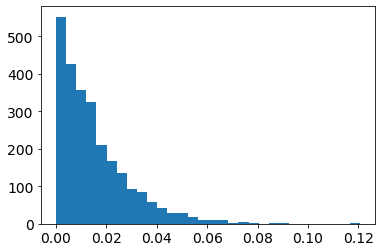

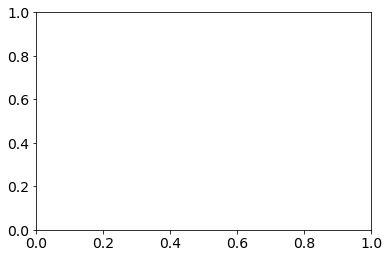

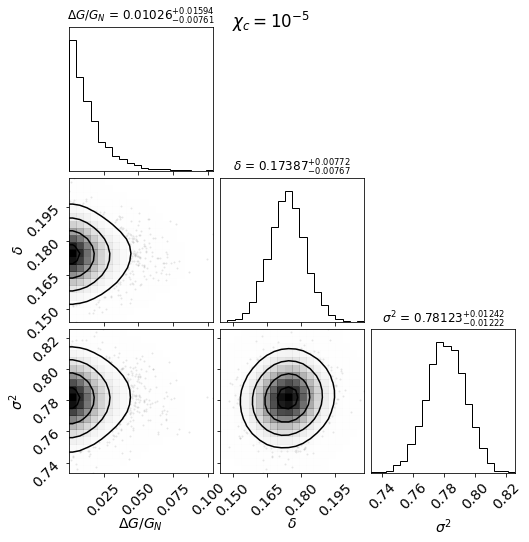

  0%|▏                                          | 4/918 [00:00<00:28, 32.47it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 3.248206641460674e-06
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 2.6695518471553456e-06
10213-1902 [50] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 50.0 0.0 1.0189224237436926e-06
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 1.662636268866114e-06
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0 0.0 2.4729261668426645e-05
10218-12703 [50] [3

  1%|▌                                         | 12/918 [00:00<00:28, 32.07it/s]

10218-3704 [50] [-0.2423, -0.7324, -0.4111, -0.2502, -0.1409, -0.2076, -0.2494, -0.3265, -0.3433, -0.3506, -0.3606, -0.3689, -0.3645, -0.3466, -0.4111, -0.2985]
10218-3704 50.0 0.0 2.81925941858874e-06
10219-9102 [50] [1.3962, 1.1814, 0.7492, 0.4692, 0.3335, 0.2205, 0.1532, 0.1423, 0.1945, 0.153, 0.0798, 0.0216, -0.0715, -0.157, -0.0196, -0.0532, -0.0405]
10219-9102 50.0 0.0 1.3774211271733851e-06
10220-12705 [50] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 50.0 0.0 1.439784255150817e-06
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 1.0267956733518174e-05
10224-9101 [50] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 50.0 0.0 4.362961493299139e-06
10226-12704 [50] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.6694

  2%|▉                                         | 20/918 [00:00<00:28, 31.51it/s]

10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 1.5236444007010659e-05
10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 2.1691254006158185e-05
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 1.5080636085210608e-05
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 50.0 0.0 3.2812243062188952e-06
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 1.6653818222658408e-05
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.

  3%|█                                         | 24/918 [00:00<00:30, 29.42it/s]

10494-9101 [50] [0.1044, 0.2038, 1.4077, 1.2615, 1.1423, 0.8831, 0.6532, 0.6062, 0.6272, 0.6614, 0.5401, 0.4995, 0.1142, 0.1337]
10494-9101 50.0 0.0 7.87691828264185e-06
10495-12704 [50] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 50.0 0.0 1.0652962788384107e-05
10495-12705 [50] [871.1598, 1245.0304, 1205.1955, 1347.7893, 1374.3588, 1517.2635, 1622.8998, 1633.9971, 1757.8692, 1799.4196, 1854.634, 1999.5551, 1849.1662, 1882.4866, 1807.1303, 1651.9125, 1681.1326, 1493.9167, 2771.4516, 2121.0254, 1992.5196]
10495-12705 50.0 0.0 8.748977910067075e-07
10495-3702 [50] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 50.0 0.0 2.987780028898094e-06
10496-12704 [50] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268

  3%|█▍                                        | 31/918 [00:01<00:29, 29.99it/s]

10498-12705 [50] [2.2376, 1.8111, 0.8617, 0.4311, 0.299, 0.2455, 0.2899, 0.2855, 0.265, 0.1888, 0.0491, -0.0661, -0.1083, -0.0652, -0.0315, 0.0942]
10498-12705 50.0 0.0 1.7012409581301234e-06
10499-12705 [50] [-0.9996, -0.9996, -0.9992, -0.9994, -0.9994, -0.9993, -0.9993, -0.9994, -0.9994, -0.9992, -0.999, -0.999, -0.9987]
10499-12705 50.0 0.0 2.9029801752490325e-06
10499-3702 [50] [-0.3822, -0.1753, 0.3237, 0.6092, 0.8357, 0.9307, 1.1046, 1.1845, 1.1657, 1.064, 1.005, 1.0954, 0.7875, 0.8892, 0.9769, 1.0508, 1.3156, 1.2283]
10499-3702 50.0 0.0 1.9002401936635966e-06
10499-3703 [50] [-0.0563, -0.0436, 0.024, 0.1267, -0.0775, -0.0664, 0.0153, -0.0929, -0.1244, -0.0851, -0.0939, -0.1131, -0.1033, -0.048, 0.0474, 0.0456, 0.0289, -0.0666, -0.0844, -0.5663]
10499-3703 50.0 0.0 2.0744368090410193e-06
10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 3.287167087980665e-06
10500-12704 [0.2209] [140.7935, 35.4055]


  4%|█▊                                        | 39/918 [00:01<00:26, 33.26it/s]

10500-3703 [50] [-0.028, -0.1828, 0.6642, 1.1037, 1.7094, 1.5507, 1.8019, 1.4925, 1.5792, 1.4772, 1.368, 1.4463, 1.2523, 1.4351, 1.2057, 0.9405, 0.5252, 1.657, 1.4263, 0.5704, 0.5717]
10500-3703 50.0 0.0 1.99344404621332e-05
10501-12704 [50] [1.3181, 1.9521, 1.9474, 1.8957, 2.0169, 2.066, 2.2805, 2.1361, 1.7635, 1.5052, 2.0197, 2.1387, 2.493, 1.9877, 1.7896, 1.1205, 1.6972, 2.5971]
10501-12704 50.0 0.0 3.212178641129625e-06
10501-6101 [50] [54.152, 240.5257, 446.403, 593.882, 679.4829, 745.3089, 578.3118, 397.5307, 268.9797, 276.8619, 234.4717, 196.8602, 156.2454, 140.6324, 64.5922]
10501-6101 50.0 0.0 3.810687189451724e-06
10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 50.0 0.0 2.1755400363449293e-06
10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 1.5216368598850155e-06
10503-9102 [50] [1.60

  5%|██▎                                       | 50/918 [00:01<00:21, 40.56it/s]

10508-12703 [50] [0.5005, 0.4509, 0.1544, 0.1328, 0.1165, 0.1176, 0.065, 0.1329, 0.2506, 0.179, 0.1788, 0.1204, 0.0037, 0.016, -0.0301, -0.0876]
10508-12703 50.0 0.0 5.5687934508075524e-06
10509-12703 [50] [1226.9439, 2166.987, 2538.8741, 2127.6504, 1648.0951, 1358.0909, 1167.9374, 985.8138]
10509-12703 50.0 0.0 3.673728183306792e-06
10509-1901 [50] [88.4511, 296.1948, 449.6905, 409.1127, 761.2326, 574.7336, 678.7086, 604.9771, 571.2616, 614.5332, 408.9334, 441.3848, 355.292, 300.996, 243.919, 230.1612, 180.5992, 163.4382, 176.2701, 193.176, 205.4741]
10509-1901 50.0 0.0 1.753153770193202e-06
10509-6101 [50] [414.6573, 159.5598, 352.8386, 670.9188, 930.199, 434.1238, 984.9702, 921.6235, 784.8291, 825.2006, 827.4197, 661.5592, 624.5693, 894.3523, 620.0269, 747.519, 623.1939, 701.341, 577.342, 1031.0135, 622.2157, 697.4912, 668.4888, 271.226]
10509-6101 50.0 0.0 1.9931251533434605e-06
10511-12704 [50] [-0.0162, 0.2052, 0.0934, -0.0203, -0.0645, -0.0743, -0.1124, -0.1256, -0.1314, -0.1489

  7%|██▊                                       | 62/918 [00:01<00:18, 47.55it/s]

10517-3704 [50] [6.5457, 4.9823, 4.7496, 3.3043, 2.1613, 1.6053, 1.1745, 0.9031, 0.7267, 0.8082, 0.6442, 0.6833, 0.6038, 0.6776, 0.66, 0.6521, 0.6265]
10517-3704 50.0 0.0 1.2292630287499348e-06
10517-6102 [50] [0.4712, 0.9172, 0.811, 0.5857, 0.3222, 0.2888, 0.1564, 0.1219, 0.169, 0.09, 0.1318, 0.0302, 0.061, 0.0297, 0.0658, 0.0113, 0.072, 0.0733, -0.0232, 0.0238, 0.0127, 0.0739, -0.0903, -0.0528]
10517-6102 50.0 0.0 1.11505744053913e-06
10518-12705 [50] [-0.1971, 0.2795, 0.1103, -0.0254, -0.0161, -0.0, 0.0208, 0.0333, 0.0023, -0.0238, -0.0544, -0.1612]
10518-12705 50.0 0.0 6.935418618428173e-06
10518-1902 [50] [-0.0105, 0.2572, 0.0495, 0.0308, 0.0287, -0.0677, -0.0841, -0.0885, -0.1994, -0.1432, -0.1195, -0.1634, -0.1173, -0.1219, -0.165, -0.1325, -0.1731]
10518-1902 50.0 0.0 2.970850105563952e-06
10518-6102 [50] [-0.217, 1.2282, 0.4062, 0.3459, 0.382, 0.1799, 0.1478, 0.1175, 0.0995, 0.1358, 0.0812, 0.048, 0.0452, 0.0639, 0.0875, 0.0309, 0.0337, 0.0007, -0.0113, -0.1383]
10518-6102 50.

  8%|███▍                                      | 74/918 [00:01<00:16, 50.11it/s]

10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712, 0.035, -0.0115, 0.0248, -0.0288, 0.0512, -0.0187, 0.0073, 0.0432, -0.0916, -0.1233, -0.1818, -0.1471]
10839-3704 50.0 0.0 2.0309972249144536e-06
10839-6101 [50] [244.3098, 615.0842, 876.8345, 1563.8627, 1705.1968, 1816.091, 1687.128, 1731.6052, 1640.9131, 1596.506, 1498.4971, 1406.0518, 671.6148, 995.7509]
10839-6101 50.0 0.0 2.373655456536105e-06
10839-9101 [50] [2.1426, 2.2648, 0.9796, 0.8183, 0.5304, -0.0332, -0.1785, -0.3432, -0.3468, -0.4742, -0.4095, -0.6139, -0.5305, -0.616, -0.529, -0.5494, 0.8162, 3.2784]
10839-9101 50.0 0.0 2.1710574209926116e-06
10841-12701 [50] [-0.7323, -0.6652, -0.4249, -0.3016, -0.2957, -0.3482, -0.374, -0.3905, -0.3944, -0.4309, -0.4302, -0.4504, -0.4708, -0.4257, -0.4725]
10841-12701 50.0 0.0 3.909822216109902e-06
10842-3702 [50] [-0.5415, 0.0585, 0.2828, 0.1825, 0.1674, 0.1342, 0.1324, 0.2899]
10842-3702 50.0 0.0 9.478764645125451e-07
10842-3703 [50] [-0.6099, -0.8101, -0.8807, -0.9171, -0.9297, -0.9289

  9%|███▉                                      | 86/918 [00:02<00:15, 52.91it/s]

11009-12704 [50] [-0.044, 0.5574, 0.4941, 0.5156, 0.452, 0.4031, 0.3736, 0.4191, 0.4646, 0.4848, 0.558, 0.4716, 0.2432, 0.3821, 0.6252, 0.8487, 0.8601]
11009-12704 50.0 0.0 3.741953531312996e-05
11009-6102 [50] [0.2368, -0.3064, 0.0765, 0.1736, 0.0574, 0.1163, 0.1754, 0.2052, 0.2777, 0.3634, 0.3506, 0.3192, 0.3455, 0.323, 0.4447, 0.1481, 0.2577, -0.1338, 0.037, 0.1218, 0.8549, -0.5202]
11009-6102 50.0 0.0 4.1055282987638745e-06
11010-6104 [50] [669.1593, 612.5725, 580.2933, 433.0387, 377.072, 315.1925, 269.3918, 266.5579, 267.4688, 253.2676, 240.0639, 221.1944, 344.4065]
11010-6104 50.0 0.0 7.36826624036642e-06
11010-9101 [50] [2.5718, 0.9269, 0.2901, 0.1931, 0.0011, -0.0504, -0.0935, -0.075, 0.0093, 0.0203, 0.0025, -0.0251, -0.0362, 0.0004, 0.0161, -0.0012, -0.102, -0.364, -0.4377]
11010-9101 50.0 0.0 2.2132043238146076e-05
11011-12703 [50] [9.8651, 35.0102, 40.3579, 54.0601, 192.4013, 365.0512, 378.092, 411.2362, 282.7202, 230.5846, 329.2445, 263.6472, 244.1501]
11011-12703 50.0 0.0 

 11%|████▍                                     | 98/918 [00:02<00:15, 51.70it/s]

11013-3702 [50] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 50.0 0.0 6.751995590583159e-06
11013-6101 [50] [0.3389, -0.3422, -0.154, -0.2894, -0.4104, -0.4385, -0.4897, -0.4798, -0.43, -0.3971, -0.3753, -0.3775, -0.3376, -0.2419, -0.1243, 0.0068, -0.1557, 0.0318, -0.0178, 0.2532, 0.5345, 0.5099]
11013-6101 50.0 0.0 2.752572901351628e-06
11017-12703 [50] [0.0185, 0.3093, 0.3468, 0.2632, 0.2308, 0.2072, 0.1992, 0.215, 0.2444, 0.2273, 0.053, -0.0123, 0.1078, -0.0553]
11017-12703 50.0 0.0 5.1256228845725935e-06
11017-12704 [50] [0.4751, 0.4487, 0.3988, 0.2586, 0.0625, -0.0537, -0.0751, -0.1094, -0.1157, -0.1027, -0.1141, -0.1182, -0.1126, -0.1047, -0.0836, -0.1961, -0.2389]
11017-12704 50.0 0.0 1.196924371295998e-06
11017-6103 [50] [-0.3235, -0.3265, -0.3479, -0.2253, -0.2261, -0.1769, -0.1311, -0.1075, -0.0747, -0.0989, -0.1378, -0.1695, -0.1257, -0.174, -0.178, -0.0714, -0.0163, 0.0028, 0.2262, -0.2731]
11017-6103 50.0 0.0 9.466262645826493e-06
11017-9101 [50]

 12%|████▉                                    | 110/918 [00:02<00:15, 51.72it/s]

11019-12702 [50] [0.0142, 0.2516, 0.1906, 0.1378, 0.0877, -0.003, 0.0993, 0.0958, 0.1065, 0.1232, 0.2086, 0.1132, 0.0357, -0.0115, -0.014, 0.0302, -0.0875, -0.1071]
11019-12702 50.0 0.0 2.0913979115463648e-06
11019-12703 [50] [-0.4993, -0.4671, -0.3698, -0.2654, -0.2024, -0.2445, -0.2033, -0.2117, -0.2752, -0.2285, -0.2102, -0.0702, -0.1699, 0.0858, -0.1757, -0.2987]
11019-12703 50.0 0.0 1.5473436250633724e-05
11019-12705 [50] [0.9395, 1.6844, 1.8269, 0.8562, 0.7011, 1.016, 1.1247, 1.0992, 1.0844]
11019-12705 50.0 0.0 4.484458816705471e-06
11019-3701 [50] [2.5964, 1.3616, 0.9142, 0.3658, 0.0143, -0.1157, -0.1148, -0.102, -0.0691, -0.1802, -0.166, -0.2893, -0.0849]
11019-3701 50.0 0.0 9.153530648234677e-06
11021-1902 [50] [5.9017, 3.1432, 2.8491, 1.9605, 1.7177]
11021-1902 50.0 0.0 4.696938459693264e-06
11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 1.711914853018049e-05


 13%|█████▏                                   | 116/918 [00:02<00:15, 52.60it/s]

11745-1902 [50] [1.185, 0.9719, 0.4625, 0.4231, 0.2188, 0.1795, 0.0428, 0.0263, -0.0784, -0.2371, 0.1632]
11745-1902 50.0 0.0 1.0812426294242388e-05
11745-6104 [50] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.8527, 0.5703, 0.5078, 0.5176, 0.5143, 0.48, 0.4463, 0.4504, 0.4653, 0.4273, 0.4049]
11745-6104 50.0 0.0 2.141132876505883e-06
11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.0361, -0.076, -0.0711, -0.1542, -0.2041, -0.2119, -0.1066, -0.2705, -0.3138]
11745-9101 50.0 0.0 4.101436575299346e-06
11746-3703 [50] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 50.0 0.0 5.627268012616345e-06
11746-3704 [21.50881105527638] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 21.50881105527638 

 14%|█████▋                                   | 128/918 [00:02<00:15, 50.02it/s]

11750-3701 [50] [1.5964, 1.8766, 1.9419, 1.999, 1.4725, 1.2873, 1.1333, 0.934, 0.9463, 0.8918, 0.7347, 0.8508, 0.6677, 0.4619, 0.3762, 0.1866, 0.0367, 0.0915, 0.0086, 0.4665]
11750-3701 50.0 0.0 1.0759396197354783e-06
11750-6103 [50] [6.303, 1.7001, 0.3933, 0.5417, 0.5248, 0.6298, 0.7207, 0.7282, 0.8046, 0.5691, 0.3659, 0.4083, 0.4745, 0.6207, 0.9957, 2.1073, 7.7724]
11750-6103 50.0 0.0 4.500893636824285e-06
11750-9101 [50] [13.4461, 9.2464, 8.3896, 5.4399, 4.9554, 3.0033, 3.1782, 2.4566, 2.5343, 2.0961, 2.3663, 2.3818, 2.4375, 3.0403, 2.3998, 2.3406, 2.9409, 6.8913, 8.6024]
11750-9101 50.0 0.0 1.0213215837066704e-06
11751-1901 [50] [-0.9334, -0.8849, -0.9513, -0.9754, -0.9893, -0.9862, -0.989, -0.9902, -0.9893, -0.9909, -0.9903, -0.9906, -0.9888, -0.9874]
11751-1901 50.0 0.0 4.606737753572403e-06
11751-6102 [50] [0.3738, 0.0535, 0.3785, 0.2124, 0.1333, 0.0258, -0.0223, -0.094, -0.1099, -0.1415, -0.1724, -0.2013, -0.1841, -0.253, -0.3949, -0.2255, -0.2141, -0.2775]
11751-6102 50.0 0.0 

 15%|██████▏                                  | 139/918 [00:03<00:16, 45.88it/s]

11755-9102 [50] [0.1799, 0.2485, 0.3504, 0.383, 0.2088, 0.1465, 0.0712, -0.0042, -0.0415, -0.0215, 0.0671, 0.0623, 0.1393, -0.1017, 0.125, -0.214, -0.1458]
11755-9102 50.0 0.0 2.646839699928277e-05
11758-3701 [50] [-0.3091, 0.0326, 0.2349, 0.1141, 0.0113, 0.06, -0.0268, -0.1507, -0.2171, -0.1994, -0.1587, -0.1557, -0.1574, -0.1614, -0.0618]
11758-3701 50.0 0.0 1.8955973373664496e-06
11758-3702 [50] [-0.544, -0.1141, 0.0167, 0.1028, 0.0854, -0.0041, -0.0149, 0.0406]
11758-3702 50.0 0.0 6.057409300081968e-06
11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 50.0 0.0 2.1380489301570424e-06
11759-6102 [50] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, -0.981]
11759-6102 50.0 0.0 1.2979878882315913e-06
11760-12703 [50] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0

 16%|██████▋                                  | 149/918 [00:03<00:16, 46.13it/s]

11761-12702 [50] [-0.6826, -0.6017, -0.2216, -0.1122, -0.0329, -0.02, -0.0711, -0.0937, -0.0782, -0.098, -0.1546, -0.1024, -0.1043, -0.0648, -0.2102, -0.3314, -0.2483]
11761-12702 50.0 0.0 1.177424910936883e-05
11761-12703 [50] [0.4093, 0.08, -0.0588, -0.0478, 0.0006, -0.0009, -0.0617, -0.1284, -0.1046, -0.1135, -0.1247, -0.1623, -0.2191, -0.3477]
11761-12703 50.0 0.0 1.1741060610443508e-05
11761-12704 [50] [-0.1205, 0.9952, 0.5814, 0.2296, 0.1208, 0.126, 0.1222, 0.1041, 0.1683, 0.1996, 0.1448, 0.1188, 0.0574, 0.0394, -0.008, -0.026, -0.0331]
11761-12704 50.0 0.0 8.747259083372216e-06
11761-12705 [50] [6.8127, 3.6941, 2.4845, 1.3644, 0.5363, 0.2844, 0.104, -0.1]
11761-12705 50.0 0.0 4.0633556862343625e-06
11823-9101 [50] [15949.1976, 8800.0053, 8323.3916, 4811.1692, 2214.9858, 717.2733, 413.2719, 305.7873, 173.5393, 146.0478, 195.6604, 224.7593, 189.4201, 67.1778]
11823-9101 50.0 0.0 2.7207235763532157e-06
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628

 17%|███████▏                                 | 160/918 [00:03<00:15, 48.05it/s]

11830-6104 [50] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.0353, -0.2063, -0.258, -0.2347, -0.2692, -0.3985]
11830-6104 50.0 0.0 4.755077504137274e-06
11831-12703 [50] [0.4472, 0.0224, 0.062, 0.158, -0.0429, -0.0922, -0.1252, -0.188, -0.1276, -0.16, -0.2596, -0.2165, 0.1708, -0.4595]
11831-12703 50.0 0.0 9.478529149156061e-06
11831-12704 [50] [-0.5822, -0.2435, 0.0115, -0.0848, -0.1704, -0.028, -0.0888, -0.0323, -0.0445, -0.106, -0.3871, -0.1836]
11831-12704 50.0 0.0 1.914482892861705e-06
11831-6101 [50] [-0.9875, -0.994, -0.9968, -0.9973, -0.9967, -0.9975, -0.9969, -0.9978, -0.9979, -0.9971, -0.9984, -0.9986, -0.9985, -0.9974]
11831-6101 50.0 0.0 1.2199628616563942e-06
11831-6102 [50] [1.041, 0.6096, 0.4053, 0.165, 0.0902, 0.1922, 0.1873, 0.1187, 0.1055, 0.0085, -0.1108, -0.0737]
11831-6102 50.0 0.0 5.1909805305049894e-06
11833-9102 [50] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.2

 19%|███████▌                                 | 170/918 [00:03<00:15, 47.82it/s]

11838-6103 [50] [201.1554, 531.7007, 967.9199, 1125.4471, 1324.9799, 1297.8083, 1279.6033, 1183.901, 1134.9301, 1132.4611, 1104.3121, 1011.7157, 1287.8266]
11838-6103 50.0 0.0 1.4857356352527682e-05
11838-9101 [50] [11.4727, 10.3246, 9.7757, 7.6641, 6.3263, 7.7985, 4.6854, 6.1379, 3.8072, 5.5203, 3.0518, 3.9759, 1.4403, 2.8333, 2.6956, 2.5542]
11838-9101 50.0 0.0 5.621575010876093e-06
11865-12702 [50] [-0.057, -0.0512, 0.0778, -0.0002, -0.0743, -0.0834, -0.0854, 0.0083, -0.0154, -0.0332, -0.07, -0.1612, -0.2706]
11865-12702 50.0 0.0 2.0243905438295537e-06
11865-12704 [50] [0.4447, -0.0557, -0.3894, -0.457, -0.5111, -0.5109, -0.5238, -0.5353, -0.4955, -0.5012, -0.4831, -0.4726, -0.599, -0.615]
11865-12704 50.0 0.0 2.154765780670643e-06
11865-1901 [50] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 50.0 0.0 2.0117131278271103e-06
11865-1902 [50] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0.4429

 20%|████████                                 | 181/918 [00:04<00:14, 50.76it/s]

11868-12703 [50] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 7.194574763733756e-06
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 2.571514277836164e-05
11871-6103 [50] [0.7182, 0.8575, 0.776, 0.4737, 0.2556, 0.1173, 0.1395, 0.111, 0.0842, 0.0381, 0.0003, -0.0281, -0.0195, -0.044, -0.0588, -0.2086, -0.132, -0.377]
11871-6103 50.0 0.0 2.915738423496625e-05
11940-1902 [50] [-0.0835, 0.1518, 0.1321, 0.0182, -0.0843, -0.1452, -0.1779, -0.1993, -0.1955]
11940-1902 50.0 0.0 1.5878575924910026e-05
11940-3703 [6.82595175879397] [1.1615, 1.5645, 1.5154, 1.5213, 1.3625, 1.1856, 0.9977, 0.7191, 0.6591, 0.6153, 0.3767, 0.433, 0.6417, 0.1616, 0.444, 0.2018, 0.0806, 0.2143, 0.1328]
11940-3703 6.82595175879397 9.985440011165738e-08 7.461568666191266e-07
11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -

 21%|████████▌                                | 192/918 [00:04<00:15, 47.74it/s]

11944-12701 [50] [-0.3604, -0.3617, -0.4276, -0.5869, -0.6347, -0.6283, -0.548, -0.5758, -0.5204, -0.4847, -0.4769, -0.4857, -0.5345, -0.6334, -0.5353, -0.5098]
11944-12701 50.0 0.0 1.6774325650719145e-05
11945-12701 [50] [0.3961, 0.2879, 0.3765, 0.1557, -0.0002, -0.113, -0.1502, -0.128, -0.114, -0.1705, -0.0344, 0.0462, 0.017]
11945-12701 50.0 0.0 1.5785298543082558e-05
11945-6101 [50] [0.2057, 0.8606, 0.9637, 0.605, 0.4694, 0.2734, 0.2029, 0.1332, 0.0558, -0.0105, 0.0015, 0.0011, -0.0038, -0.016, 0.0504, -0.0338]
11945-6101 50.0 0.0 2.722423469030942e-05
11945-6102 [50] [3.5224, 2.2109, 1.4349, 1.0152, 0.7457, 0.4864, 0.2556, 0.1192, 0.0508, 0.0117, -0.0209, -0.0683, -0.158, -0.0976, -0.2012]
11945-6102 50.0 0.0 1.1362563936834653e-05
11947-6103 [50] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 50.0 0.0 5.514493637764792e-06
11949-12701 [50] [1.1975, 0.3408, 0.1441, 

 21%|████████▊                                | 197/918 [00:04<00:15, 47.59it/s]

11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 1.0733415954524068e-05
11956-12702 [50] [5.6953, 5.0804, 3.2564, 2.1056, 1.2622, 0.6457, 0.4602, 0.5373, 0.9503, 3.7649, 5.1679]
11956-12702 50.0 0.0 6.924052146831671e-06
11956-12705 [50] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 0.2419, 0.2565, 0.3525, 0.1776, 0.103, 0.3387, 0.3814, 0.7221, 0.77]
11956-12705 50.0 0.0 8.616657089406071e-07
11957-12704 [0.4529] [-0.3492, 0.7667, 0.6853, 0.5861, 0.3661]
11957-12704 0.4529 2.0775289727958789e-07 6.221368558029465e-07
11957-9101 [50] [127.5969, 337.5453, 692.0501, 754.6672, 761.8038, 673.5367, 561.8056, 470.5271, 446.8561, 434.7914, 434.701, 432.6297, 423.9362, 415.9254, 409.4146, 409.8788]
11957-9101 50.0 0.0 4.225050556132178e-06
11957-9102 [50] [1.0969, 0.3397, 0.6198, 1.0919, 1.791, 2.069, 2.6145, 2.7123, 2.8073, 2.4726, 2.1945, 1.9756, 2.1362, 4.7679, 3.0873

 23%|█████████▎                               | 208/918 [00:04<00:15, 46.92it/s]

11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 2.2778967764019734e-05
11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.8986, 3.5843, 4.0724, 0.9129, 2.9875, 0.7205, 2.6408, 1.2362]
11969-6101 50.0 0.0 3.591261171650766e-05
11970-12703 [0.1621] [-0.4888, -0.3498]
11970-12703 0.1621 2.825562428664348e-07 5.559844945169556e-07
11970-6102 [50] [-0.0116, -0.0683, -0.0558, -0.0053, 0.0454, 0.025, 0.078, -0.0283, -0.085, -0.1052, -0.0602, -0.0272, -0.0693, -0.0116, -0.1378, -0.2799, -0.2497]
11970-6102 50.0 0.0 4.37968544499637e-06
11970-6103 [50] [0.7466, 1.1751, 1.6643, 1.3977, 1.0416, 0.8262, 0.6871, 0.5199, 0.4194, 0.3266, 0.2718, 0.2909, 0.2357, 0.2575, 0.2139, 0.0837, -0.0144, -0.0619, 0.133]
11970-6103 50.0 0.0 6.432728323195428e-06
11974-12702 [50] [-0.5341, -0.4596, -0.3852, -0.2683, -0.2117, -0.2

 24%|█████████▊                               | 219/918 [00:04<00:14, 47.29it/s]

11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 50.0 0.0 2.1682750875489498e-06
11978-12705 [50] [0.0184, 0.0968, 0.695, 0.4819, 0.223, 0.1168, 0.1458, 0.1604, 0.1304, 0.1363, 0.1451, 0.1188, 0.0734, 0.0413, 0.0374, 0.0059, 0.0584, 0.0708]
11978-12705 50.0 0.0 2.7841055111159795e-06
11978-6101 [50] [0.1703, 0.2916, 0.2201, 0.1105, 0.137, 0.0651, 0.0262, 0.0439, 0.1227, 0.0551, 0.0171, -0.0525, -0.106, -0.2018, -0.2281, -0.1584, -0.2752, -0.3694, -0.5359, -0.6656, -0.8099]
11978-6101 50.0 0.0 2.7699115422905273e-06
11979-12703 [50] [0.3188, 0.2646, 0.4444, 0.4735, 0.4231, 0.2818, 0.2037, 0.1891, 0.1975, 0.1625, 0.205, 0.2447, 0.1501, 0.1763, 0.1339, 0.4567, 0.4255, 0.53]
11979-12703 50.0 0.0 1.8707057020184922e-05
11979-12704 [50] [1.0417, 0.8488, 0.6206, 0.5652, 0.598, 0.4342, 0.2822, 0.1334, 0.0604, 0.0319, 0.0291, -0.01, -0.083, -0.0554, -0.0215, -0.0081, 0.0344]
11979-12704 50.0 0.0 1.

 25%|██████████▎                              | 230/918 [00:05<00:14, 49.01it/s]

11982-12704 [50] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.1555, 0.0797, -0.029, 0.0037, 0.2331]
11982-12704 50.0 0.0 2.148636356310684e-06
11982-3703 [50] [-0.314, 0.4086, 0.6273, 0.7714, 0.9457, 0.986, 1.0945, 1.392, 1.3945, 1.539, 1.4145, 1.0397, 1.0282, 0.5616, 0.557, 0.0557]
11982-3703 50.0 0.0 1.968604257412565e-06
11982-6102 [0.5461] [0.7786, 0.4297, 0.4569, 0.7506]
11982-6102 0.5461 1.3317677150612783e-07 7.100431794103868e-07
11982-9102 [50] [-0.6167, -0.1298, 0.3235, 1.2078, 1.1438, 0.8069, 0.6394, 0.4963, 0.4228, 0.3252, 0.3069, 0.2838, 0.3393, 0.4905, 0.4567, 0.2311]
11982-9102 50.0 0.0 2.9613242292844744e-06
11984-12701 [50] [-0.2857, -0.1737, 0.0157, 0.0372, -0.1281, -0.2001, -0.1962, -0.1945, -0.1458, -0.0921, -0.099, -0.116, -0.1666, -0.325, -0.2122, -0.442]
11984-12701 50.0 0.0 4.2222973043706715e-06
11984-12702 [50] [-0.2774, -0.3248, -0.3706, -0.3541, -0.339, -0.3481, -0.2877, -0.2577, -0.2022, -0.1466, -0.188

 26%|██████████▍                              | 235/918 [00:05<00:14, 47.30it/s]

12068-6104 [50] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 50.0 0.0 6.342136719220973e-05
12069-12704 [50] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 50.0 0.0 2.5807717729574916e-06
12069-12705 [50] [1.7332, 1.137, 0.4096, 0.6564, 0.5837, 0.6168, 0.2246, 0.0587, 0.2617, 0.1538, 0.5607, 0.4132, 0.5307, 0.41, 2.8782]
12069-12705 50.0 0.0 2.3032680856405803e-05
12069-6102 [50] [-0.3102, -0.0764, -0.2402, -0.1833, -0.1952, -0.2158, -0.2095, -0.1861, -0.144, -0.1353, -0.1037, -0.1026, -0.0816, -0.0956, -0.1367, -0.1477, -0.0871, -0.0667, -0.0387, -0.58, -0.56, -0.5359, -0.8946, 0.038]
12069-6102 50.0 0.0 6.886599710807188e-06
12071-12701 [50] [-0.9172, -0.8384, -0.6786, -0.6994, -0.7429, -0.7686, -0.7662, -0.8217, -0.8275, -0.8401, -0.7831, -0.8143]
12071-12701 50.0 0.0 2.768493

 27%|██████████▉                              | 245/918 [00:05<00:20, 33.27it/s]

12071-3702 [50] [43.1041, 1833.3653, 2193.0557, 2409.7616, 2285.0769, 1925.6484, 1966.7994, 2043.2628, 1997.8474, 1832.4832, 1658.3071, 1528.5931, 1298.5116, 1014.8264, 552.6982, 136.4828]
12071-3702 50.0 0.0 3.07723717249548e-06
12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.3083, 398.9949, 258.1108, 178.8144, 146.4641, 210.3609, 51.4796, 32.8354, 22.052]
12071-3704 50.0 0.0 3.1491461032089953e-06
12075-12704 [50] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 50.0 0.0 3.898262408853463e-06
12078-12703 [50] [0.3298, 0.5608, 0.2182, 0.3221, 0.2303, 0.0896, 0.0846, 0.2051, 0.3186, 0.33, 0.2532]
12078-12703 50.0 0.0 2.9646366962496245e-06
12078-6103 [50] [1.9637, 5.3953, 4.122, 4.276, 4.2033, 3.4926, 3.3028, 3.2038, 3.1762, 3.0769, 2.868, 2.5911, 2.6527, 2.4952, 2.6226, 2.6979, 2.1328, 1.6158, 1.3218, 1.8508]
12078-6103 50.0 0.0 1.4200125412602238e-06
12079-12705 [19.564478

 27%|███████████                              | 249/918 [00:05<00:21, 31.49it/s]

12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 2.0169630398986196e-05
12082-12702 [50] [52.4225, 34.225, 22.353, 15.87, 12.6473, 9.0293, 9.0994, 7.7946, 7.7752, 7.6215, 7.2913, 5.8669, 7.5773, 10.9051, 27.4723, 42.4809, 31.8612, 44.26]
12082-12702 50.0 0.0 7.069864658696058e-06
12084-12702 [50] [0.4179, 1.0492, 0.9255, 0.717, 0.5874, 0.4344, 0.359, 0.2445, 0.1712, 0.1342, 0.2131, 0.2682, 0.3105, 0.3163]
12084-12702 50.0 0.0 7.178611494343761e-06
12084-12704 [50] [-0.663, -0.3425, -0.4511, -0.3814, -0.1944, -0.0031, -0.041, -0.1276, -0.2047, -0.2499, -0.2565, -0.1988, -0.1657, -0.268, -0.3391, -0.2896]
12084-12704 50.0 0.0 1.2156259712649088e-05
12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-12705 50.0 0.0 3.408444682573435e-06


 28%|███████████▎                             | 253/918 [00:05<00:23, 28.83it/s]

12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.419, 0.387, 0.4139, 0.5272, 0.4564, 0.6029, 0.4957, 0.5971, 0.6267, 0.5749, 0.7061, 0.6081, 0.5243, 0.4383, 0.5097, 0.4647, 0.2768, 0.3996, 0.231, 0.2274, 0.4698, 0.2204, 0.2727]
12084-1901 50.0 0.0 3.848274650749761e-06
12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
12084-3702 50.0 0.0 3.1383326856201297e-06
12084-3703 [50] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.866, 9.9199, 8.0438, 7.1191, 7.1184, 4.9585, 5.2578]
12084-3703 50.0 0.0 9.674851996235367e-06
12084-6104 [50] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.0374, 0.0776, -0.025, -0.0223, -0.0093, -0.0487, 0.0214, -0.2045, 0.0836]
12084-6104 50.0 0.0 2.5032421908023096e-06
12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0

 28%|███████████▌                             | 260/918 [00:06<00:25, 26.01it/s]

12085-6101 [50] [-0.1417, -0.3914, -0.1738, -0.0755, -0.0973, -0.0439, -0.1113, -0.1774, -0.1947, -0.1728, -0.1408, -0.1367, -0.1146, -0.1045, -0.1506, -0.0235, -0.0308, -0.0502, 0.0507]
12085-6101 50.0 0.0 1.1513907603015561e-05
12085-6103 [50] [-0.549, -0.354, -0.3619, -0.3336, -0.3191, -0.1878, -0.2268, -0.2779, -0.144, -0.2236, -0.1423, -0.1582, -0.1565, -0.2223, -0.1937, -0.2795, -0.2396, -0.2355, -0.213, -0.3557, -0.311]
12085-6103 50.0 0.0 1.919235331377851e-06
12085-9102 [50] [0.6086, 0.5632, 0.3343, 0.2119, 0.1282, 0.0402, 0.0288, 0.0478, 0.0313, 0.001, -0.0532, -0.0537, -0.0634, -0.0662, -0.1794, -0.1779, -0.239]
12085-9102 50.0 0.0 1.9469416236667e-06
12088-12705 [50] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-12705 50.0 0.0 1.875126018685166e-06
12088-9101 [50] [1.3886, 1.0744, 0.6164, 0.1772, -0.0928, -0.1728, -0.2424, -0.3552, -0.3861, -0.4243, -0.4358, -0.4341, -0.4454, -0.44

 29%|███████████▉                             | 266/918 [00:06<00:26, 24.63it/s]

12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-12702 50.0 0.0 8.691346412123528e-07
12089-12704 [50] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 50.0 0.0 1.676772103517645e-05
12089-1901 [50] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 50.0 0.0 2.2875874748325194e-05
12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722, -0.1642, -0.1028, -0.1287, -0.1434, -0.0908, -0.1289, -0.1084, -0.2404, -0.097, 0.1709, -0.3201, -0.0196, -0.302]
12089-6103 50.0 0.0 1.057050509783263e-05
12092-6101 [50] [0.0026, 0.3918, 0.1405, 0.0977, 0.005, 0.0277, 0.1281, 0.0885, 0.0628, 0.0291, -0.0173, -0.1181]
12092-6101 50.0 0.0 7.700336606549631e-06


 29%|████████████                             | 269/918 [00:06<00:27, 24.02it/s]

12093-9101 [50] [-0.9989, -0.997, -0.9973, -0.998, -0.9985, -0.9987, -0.9987, -0.9986, -0.9986, -0.9987, -0.9983, -0.9981, -0.9979, -0.9991, -0.9971]
12093-9101 50.0 0.0 8.416983193403202e-06
12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 40.9064, 40.0677, 39.5836, 40.4106, 39.3101, 37.4365, 38.9587, 41.7447, 41.525, 40.104, 39.0721, 39.6893, 56.2685, 25.7726, 27.1981, 33.78]
12094-3701 50.0 0.0 4.350922624511214e-06
12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 4.713302893992887e-06
12483-12703 [50] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -0.0898]
12483-12703 50.0 0.0 2.6357203517596008e-06
12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 6.374206810394828e-06


 30%|████████████▎                            | 275/918 [00:06<00:27, 23.24it/s]

12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 2.4003728725026495e-06
12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 50.0 0.0 4.306132113654493e-06
12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696, 2047.2799, 2334.4928, 2266.757, 2196.3005, 1862.0235, 1612.2288, 2078.9089]
12488-6102 50.0 0.0 3.767917455053781e-06
12488-9101 [50] [0.89, -0.0571, 0.0018, 0.0675, 0.0814, 0.1021, 0.1178, 0.0708, 0.0758, 0.1268, 0.0533, 0.0597, 0.0532, 0.0414, 0.1038, 0.0181, -0.1356, -0.2319, -0.1377]
12488-9101 50.0 0.0 2.9118304279576514e-06
12489-3703 [50] [6.1258, 7.3921, 7.9142, 7.3592, 6.7186, 6.0984, 5.5884, 5.3024, 5.0796, 4.2963, 4.3283, 3.7505, 4.11, 3.5385, 4.098]
12489-3703 50.0 0.0 9.4695268546202

 31%|████████████▌                            | 281/918 [00:07<00:28, 22.71it/s]

12490-3701 [50] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-3701 50.0 0.0 4.9932375750458176e-05
12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0.0863]
12506-12701 50.0 0.0 9.788873359628517e-06
12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0.0 4.690470188109573e-06
12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0 0.0 9.084201104676913e-07
12512-12702 [50] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 50.0 0.0 1.3

 31%|████████████▋                            | 284/918 [00:07<00:26, 23.84it/s]

12514-12702 [50] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 50.0 0.0 1.340987130708752e-06
12514-12703 [0.2525] [2.1408, 0.3201]
12514-12703 0.2525 2.575092188890387e-07 5.61778701580338e-07
12514-9102 [50] [-0.6627, -0.5978, -0.3356, -0.1465, -0.1607, -0.0924, -0.0736, -0.019, 0.0855, 0.1041, 0.0741, -0.06, -0.1592, -0.1356, -0.0632, -0.2008, -0.2854]
12514-9102 50.0 0.0 1.4638784583905005e-06
12518-12705 [50] [-0.8683, -0.7393, -0.3648, -0.0579, -0.0274, -0.0334, -0.0145, 0.016, -0.0154, 0.0703, -0.1575, 0.0272]
12518-12705 50.0 0.0 3.107970514707552e-06
12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 0.0 1.901116057213244e-06
12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.1091

 32%|████████████▉                            | 290/918 [00:07<00:27, 23.11it/s]

12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 9.513648247264584e-06
12620-6104 [50] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 50.0 0.0 3.780371148459837e-06
12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 5.5816742860556886e-06
12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903, -0.5645]
12621-12705 50.0 0.0 2.031089261384371e-06
12621-6103 [50] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 50.0 0.0 3.4102224570902734e-06


 32%|█████████████▏                           | 296/918 [00:07<00:27, 22.59it/s]

12622-9101 [50] [0.295, -0.1664, 0.1745, 0.5326, 0.7376, 0.7334, 0.6499, 0.6151, 0.5534, 0.5303, 0.427, 0.3612, 0.3993, 0.3837, 0.4878, 0.4757, 0.3843, 0.0845]
12622-9101 50.0 0.0 1.3565797188988292e-05
12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 9.903589939913731e-06
12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 1.5516613767302856e-05
12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 7.166369883629444e-06
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 1.789523640456015e-05


 33%|█████████████▍                           | 302/918 [00:08<00:26, 23.23it/s]

12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 5.068402891407727e-05
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 2.671165027261183e-05
12679-1902 [50] [0.6115, 0.2127, 0.2343, 0.0811, 0.186, 0.028, 0.0072, -0.086, -0.1377, -0.1341, -0.1745, -0.1741, -0.1973, -0.2294, -0.2344, -0.1462, -0.1584]
12679-1902 50.0 0.0 4.5932907856724235e-06
12682-12705 [50] [211.5682, 164.2949, 154.5208, 172.1809, 188.4287, 205.8053, 188.0827, 175.7022, 171.521, 162.4793, 163.9925, 122.1814, 128.2861, 178.1773, 150.2355, 110.4372, 181.1071]
12682-12705 50.0 0.0 5.914277392152021e-06


 33%|█████████████▌                           | 305/918 [00:08<00:27, 22.48it/s]

7443-12703 [50] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 50.0 0.0 1.0401523629210715e-06
7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1547, -0.1713, -0.2761, -0.2934, -0.2123]
7443-12704 50.0 0.0 5.8442916422956146e-06
7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 1.8859019518788536e-06
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.0333, -0.0403, -0.0345, -0.091, -0.0525, -0.2174, -0.2135, -0.5859, -0.4094]
7443-9101 50.0 0.0 1.1365506377504585e-06
7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -

 34%|█████████████▉                           | 311/918 [00:08<00:28, 21.45it/s]

7495-12703 [50] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 50.0 0.0 9.21249319358807e-06
7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 7.529758544917423e-06
7815-12705 [50] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 50.0 0.0 1.4897384602636177e-06
7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 1.416849691670194e-06
7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 9.055196936818642e-07


 34%|██████████████                           | 314/918 [00:08<00:28, 21.27it/s]

7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 4.036612864969868e-06
7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 8.642562721049064e-07
7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 5.013034921736792e-06
7958-6101 [50] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 50.0 0.0 1.046471294953953e-06
7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 5.161933674386693e-06


 35%|██████████████▎                          | 320/918 [00:08<00:28, 21.01it/s]

7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 6.699266892192152e-06
7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 6.00132352841194e-06
7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 7.2715182760211135e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 8.465521362889519e-06
7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 7.377570189024654e-06


 36%|██████████████▌                          | 326/918 [00:09<00:29, 19.96it/s]

7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 8.563514945169409e-07
7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 5.507611651193869e-06
7961-12705 [50] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 50.0 0.0 2.533381297045814e-06
7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.0 2.2096651184162312e-06


 36%|██████████████▋                          | 329/918 [00:09<00:29, 19.89it/s]

7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 3.0313187094289524e-06
7962-12705 [50] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 0.4867, 0.496, 1.2096, 1.0729, 0.2753, 1.3845, 3.2136]
7962-12705 50.0 0.0 2.427229992986346e-06
7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 50.0 0.0 3.0037779851447753e-06
7963-12702 [50] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, -0.9982, -0.9988, -0.9993]
7963-12702 50.0 0.0 4.9112776854970315e-06
7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 50.0 0.0 1.59

 37%|███████████████                          | 336/918 [00:09<00:27, 20.82it/s]

7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]
7963-9102 50.0 0.0 1.4831363872232294e-06
7964-6101 [50] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119, 231.394, 254.6415]
7964-6101 50.0 0.0 2.627782221193567e-06
7964-9102 [50] [1.3184, 2.0432, 2.1685, 1.6268, 1.1481, 0.9036, 0.7405, 0.65, 0.5829, 0.509, 0.4898, 0.4008, 0.3018, 0.164, 0.0815, 0.0631, 0.0748, -0.1094, 0.1287]
7964-9102 50.0 0.0 5.603913460624631e-06
7965-12701 [1.3409] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085, -0.0802, -0.1254, -0.0438]
7965-12701 1.3409 7.02154857899495e-08 7.755194778993277e-07
7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-190

 37%|███████████████▏                         | 339/918 [00:09<00:28, 20.40it/s]

7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 50.0 0.0 1.1260618105861793e-06
7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747, 211.5514, 236.7821, 394.8881, 237.9732]
7965-6102 50.0 0.0 2.4852171389377752e-06
7965-9102 [50] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 50.0 0.0 1.836997139330905e-06
7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 5.308284120692693e-06
7968-3701 [50] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 50.0 0.0 8.337550549416508e-06


 38%|███████████████▍                         | 345/918 [00:10<00:26, 21.25it/s]

7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 3.062047405479556e-05
7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 1.6138062385429842e-06
7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 9.493379888201202e-06
7977-1902 [0.354] [0.1072, 0.2856, 0.0387]
7977-1902 0.354 2.106825201819428e-07 5.943572984186973e-07
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 8.338164137504045e-06


 38%|███████████████▋                         | 351/918 [00:10<00:27, 20.81it/s]

7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 9.566395240396243e-06
7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 9.037077152264065e-06
7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 9.816829767275666e-06
7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 50.0 0.0 2.7582512267119467e-06


 39%|███████████████▊                         | 354/918 [00:10<00:28, 20.09it/s]

7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 9.36595614678055e-06
7990-6104 [50] [-0.3051, -0.0723, 0.2152, 0.3465, 0.313, 0.5262, 0.4361, 0.3236, 0.3249, 0.3219, 0.2532, 0.2184, 0.247, 0.3244, 0.1338, 0.4143, 0.0484]
7990-6104 50.0 0.0 1.271128745401697e-05
7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 4.0182631996400596e-05
7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 50.0 0.0 2.4353904573636206e-05


 39%|███████████████▉                         | 357/918 [00:10<00:26, 20.86it/s]

7992-6104 [50] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 50.0 0.0 3.7694706834967396e-05
8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 50.0 0.0 1.4914680692045963e-06
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 6.828946337419909e-06
8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 3.590668072031798e-06


 40%|████████████████▏                        | 363/918 [00:11<00:28, 19.55it/s]

8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 1.893413590232445e-05
8078-12703 [50] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 9.067056667456399e-06
8078-6103 [50] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149, 0.1969, 0.1396, 0.1246, 0.1262, 0.1162, 0.0747, 0.0502, 0.0254, 0.0225, 0.0724, 0.0304, 0.0506, 0.0715]
8078-6103 50.0 0.0 1.119717845936259e-05
8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 8.06682229643234e-06


 40%|████████████████▍                        | 367/918 [00:11<00:29, 18.59it/s]

8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 3.4861888537269617e-06
8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 8.190731696554926e-06
8081-3704 [50] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 50.0 0.0 1.3509521599012647e-06
8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 9.061824980735591e-06


 40%|████████████████▌                        | 371/918 [00:11<00:29, 18.56it/s]

8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81, 2355.4256, 1939.6384]
8083-12703 50.0 0.0 6.925540287380036e-06
8083-12704 [50] [0.2913, 0.5243, 0.3002, 0.1297, 0.1194, 0.1533, 0.1494, 0.1802, 0.1606, 0.0654, 0.1299]
8083-12704 50.0 0.0 6.767758609274657e-06
8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 4.1131929239196395e-06
8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 3.81902982463148e-06


 41%|████████████████▋                        | 375/918 [00:11<00:29, 18.34it/s]

8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 2.754213800040491e-06
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 3.7439416365373002e-06
8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 50.0 0.0 9.799308494114023e-07
8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 3.436803088781008e-06


 41%|████████████████▉                        | 380/918 [00:11<00:27, 19.31it/s]

8091-1902 [23.04872864321608] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747, -0.384]
8091-1902 23.04872864321608 1.1545917672311298e-07 7.295866186546608e-07
8092-12702 [50] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 50.0 0.0 1.055258648125729e-06
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 50.0 0.0 3.0808633794316643e-06
8095-6102 [0.4354] [0.2528, 0.6748]
8095-6102 0.4354 2.576404725868837e-07 5.852923125983777e-07
8131-6101 [50] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.3082, -0.2951, -0.2734, -0.3441, -0.2421, -0.3611, -0.4068, -0.6194, -0.4921, -0.1798, -0.4715,

 42%|█████████████████▏                       | 385/918 [00:12<00:27, 19.32it/s]

8131-9101 [50] [-0.2303, -0.2933, -0.4207, -0.0503, 0.2317, 0.5105, 0.546, -0.1014, -0.1852, -0.0457, 0.0346, 0.33, -0.5646, -0.6862, 0.939]
8131-9101 50.0 0.0 2.529456120921545e-05
8132-12702 [50] [-0.0491, -0.065, 0.2143, 0.0833, 0.0546, -0.0096, -0.0149, 0.021, -0.0837, 0.1062]
8132-12702 50.0 0.0 1.3311336432750192e-05
8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 2.530705098270967e-05
8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 5.348118604666361e-06


 43%|█████████████████▍                       | 391/918 [00:12<00:26, 20.12it/s]

8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 6.396951087223248e-06
8137-12703 [50] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1275, -0.1695, -0.3013, -0.3381]
8137-12703 50.0 0.0 8.909556166436392e-07
8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 50.0 0.0 5.821564451927136e-06


 43%|█████████████████▋                       | 395/918 [00:12<00:27, 18.75it/s]

8138-12702 [50] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 50.0 0.0 3.2433553974014056e-06
8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 8.146006457051373e-06
8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 2.668108952095246e-06
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 6.733608307915013e-06


 43%|█████████████████▋                       | 397/918 [00:12<00:28, 18.24it/s]

8140-3701 [50] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 50.0 0.0 1.0418018156863619e-06
8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 6.963417265909582e-06
8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 5.376083184923941e-06
8144-12702 [50] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 50.0 0.0 9.42762892075663e-07


 44%|█████████████████▉                       | 401/918 [00:13<00:29, 17.50it/s]

8144-12703 [50] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 50.0 0.0 2.2230465151696205e-06
8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 2.752942750441576e-06
8144-6101 [50] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271, 0.0969, 0.0527, 0.3307, 0.4308, 0.3921, 0.1682, -0.0968]
8144-6101 50.0 0.0 1.3390865563515565e-06
8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 2.0220609398515058e-05


 44%|██████████████████                       | 405/918 [00:13<00:29, 17.11it/s]

8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 1.8331399407697568e-06
8145-9101 [50] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 50.0 0.0 5.29298873879181e-06
8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 3.0111936783673545e-05
8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 2.5182520142616807e-05


 45%|██████████████████▎                      | 409/918 [00:13<00:28, 17.74it/s]

8146-9102 [4.6011708542713565] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 4.6011708542713565 2.6071222236292124e-07 5.810536986534276e-07
8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 5.583661087971323e-06
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 3.559047301247611e-05
8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 1.4115331433276775e-05


 45%|██████████████████▍                      | 413/918 [00:13<00:29, 16.89it/s]

8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 4.578825892317535e-06
8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 8.031794718870245e-06
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 3.933427864398357e-05
8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 7.5436154271643306e-06


 45%|██████████████████▌                      | 417/918 [00:14<00:30, 16.45it/s]

8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 1.934215102627103e-06
8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 3.211889310331555e-05
8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 3.3226270775076027e-06
8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 50.0 0.0 3.87251135612458e-06


 46%|██████████████████▊                      | 421/918 [00:14<00:30, 16.14it/s]

8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 2.546022515645358e-06
8156-3701 [50] [6.085, 4.1154, 2.1882, 2.068, 1.1775, 1.7327, 0.9038, 0.3143, 0.0325, 0.1491, -0.0375, -0.0582, -0.4176, -0.3057, -0.5565, -0.1836, -0.0437, 1.2623]
8156-3701 50.0 0.0 8.696064453610488e-07
8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 7.5928648556609846e-06
8158-6104 [10.79177135678392] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 10.79177135678392 2.420686873944994e-07 6.019591496185497e-07


 46%|██████████████████▉                      | 425/918 [00:14<00:29, 16.50it/s]

8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 3.7353077593346334e-06
8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 4.251149812728251e-06
8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 7.591606692754973e-06
8241-6102 [50] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 50.0 0.0 1.0917491438006002e-06


 47%|███████████████████▏                     | 429/918 [00:14<00:29, 16.53it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 4.5466051549074825e-05
8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 2.1161924470319327e-06
8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 4.87521552634094e-06
8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 1.4138495566847077e-06


 47%|███████████████████▎                     | 433/918 [00:15<00:30, 15.93it/s]

8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 5.854645586499984e-06
8247-12702 [50] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063, 0.3394, 0.315, 0.2267, 0.2019, 0.1944, 0.0714, 0.0833, -0.0149, -0.0523, -0.0057]
8247-12702 50.0 0.0 8.629122414034247e-07
8247-12703 [0.647] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852]
8247-12703 0.647 2.3477424659764511e-07 6.112808632700877e-07
8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 3.4526788146782883e-06


 48%|███████████████████▌                     | 437/918 [00:15<00:29, 16.21it/s]

8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247-9101 50.0 0.0 2.939890534812968e-06
8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.2998, 1595.4501, 1320.9281, 1254.0149, 1837.1392, 1899.7801, 2506.6682, 2814.69, 1954.3222, 2246.1066, 1731.0676, 1875.7497, 1583.6158, 1841.3166, 477.0393]
8248-12701 50.0 0.0 2.8056494018875303e-06
8248-12702 [50] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 50.0 0.0 7.181866037138418e-06
8248-12704 [50] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 50.0 0.0 2.76793986115536e-06


 48%|███████████████████▋                     | 441/918 [00:15<00:30, 15.83it/s]

8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 4.3100822703251775e-06
8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 4.14046444862042e-06
8249-6102 [50] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 50.0 0.0 2.3007779681806658e-05
8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 50.0 0.0 2.797981701978034e-06


 48%|███████████████████▊                     | 445/918 [00:15<00:30, 15.45it/s]

8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 4.984838471325318e-06
8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 2.1803823610706285e-05
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 2.2750786242563088e-05
8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 3.477846821540342e-05


 49%|████████████████████                     | 449/918 [00:16<00:29, 16.09it/s]

8252-6104 [0.3237] [2.1127, 786.7076]
8252-6104 0.3237 2.497992402785928e-07 5.899836277675523e-07
8252-9102 [50] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 568.3335, 671.6366, 717.9725, 510.1554, 342.074, 302.1941, 260.3132, 157.5104, 244.502, 117.7782, 292.6015, 101.1592]
8252-9102 50.0 0.0 1.8363776988016554e-06
8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-3703 50.0 0.0 1.6275156373139296e-06
8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 1.383790644151917e-05


 49%|████████████████████▏                    | 453/918 [00:16<00:30, 15.45it/s]

8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 4.54314324179666e-06
8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 2.7318588725729144e-06
8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 5.3088888158551745e-06
8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 3.909204679776496e-06


 50%|████████████████████▍                    | 457/918 [00:16<00:30, 15.14it/s]

8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 1.6864660387585056e-06
8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 1.1891472339385806e-06
8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 5.897965665294212e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 6.326622040581105e-05


 50%|████████████████████▌                    | 461/918 [00:16<00:30, 14.86it/s]

8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 5.265177782094925e-06
8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.0 0.0 4.317601739219356e-06
8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 3.1515526727273238e-06


 51%|████████████████████▊                    | 465/918 [00:17<00:30, 14.83it/s]

8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 8.219123572363661e-06
8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 5.915388463300586e-06
8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 5.0567337789191906e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 5.242672029293876e-06


 51%|████████████████████▉                    | 470/918 [00:17<00:26, 17.05it/s]

8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.0 0.0 6.522800412600937e-06
8263-12705 [50] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 50.0 0.0 2.6487249350573044e-06
8310-3701 [50] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 50.0 0.0 2.5044644418661424e-06
8310-9101 [50] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 50.0 0.0 2.9786909093742174e-06
8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 3.2134945670530705e-06


 52%|█████████████████████▎                   | 476/918 [00:17<00:22, 19.78it/s]

8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 3.311853519062378e-06
8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 7.912548225918424e-06
8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 2.9639224070599022e-05
8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 5.6356171230183445e-06
8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534

 52%|█████████████████████▍                   | 479/918 [00:17<00:20, 20.91it/s]

8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 1.2822901316426583e-05
8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 4.111913215241546e-06
8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 1.163804708709849e-05
8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 1.2729277081774869e-05
8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 2.204802131076547e-05


 53%|█████████████████████▋                   | 486/918 [00:18<00:18, 23.80it/s]

8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 4.5301693769092095e-06
8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 1.7600832907266863e-06
8317-9101 [2.0484] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283]
8317-9101 2.0484 2.6285129257401615e-07 5.785310064701452e-07
8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 1.8392545538714395e-06
8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8

 54%|█████████████████████▉                   | 492/918 [00:18<00:17, 23.70it/s]

8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 1.8059345220328223e-06
8318-6101 [50] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 50.0 0.0 1.5461751177965672e-05
8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 7.7835261708834e-06
8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 9.533234587860427e-06
8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 1.39462138386698e-06


 54%|██████████████████████                   | 495/918 [00:18<00:17, 23.57it/s]

8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 8.869921984368166e-06
8320-9102 [50] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 50.0 0.0 3.909282001505633e-06
8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 1.4051185265172018e-05
8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 4.41815207067068e-06
8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 1.0377358493111908e-05


 55%|██████████████████████▍                  | 501/918 [00:18<00:17, 23.26it/s]

8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 2.7972419326449814e-06
8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 1.2216427726266148e-05
8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 1.2833143483242387e-06
8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 1.980862224611315e-06
8329-6103 [8.047586934673367] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0

 55%|██████████████████████▌                  | 504/918 [00:18<00:17, 23.48it/s]

8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 1.6835382189506475e-06
8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 3.0483697266575326e-06
8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 1.5548275596867257e-06
8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 1.1555008785024447e-06
8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 3.073944556219003e-06


 56%|██████████████████████▊                  | 510/918 [00:19<00:17, 22.87it/s]

8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 1.1829628059494706e-06
8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 9.051201429779969e-06
8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 1.3262072874152206e-06
8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 1.0115239498082928e-06


 56%|███████████████████████                  | 516/918 [00:19<00:16, 24.15it/s]

8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 2.927920969099405e-06
8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 6.871652198218698e-06
8336-9102 [11.10705527638191] [0.1276, 0.3517, 0.1297, 0.2351, 0.3451, 0.2611, 0.1604, 0.13, 0.0913, 0.0195, 0.0438, 0.0529, -0.0434, -0.0114, 0.0063, 0.2833, 0.2352]
8336-9102 11.10705527638191 5.0517962516946667e-08 7.953935959946563e-07
8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 1.0471434246595261e-05
8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 3.76

 57%|███████████████████████▎                 | 522/918 [00:19<00:16, 23.88it/s]

8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 2.8559508559222516e-06
8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 4.684818283799946e-06
8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 4.64216892442642e-05
8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 4.042047939224791e-06
8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 4.305014712451204e-06


 57%|███████████████████████▍                 | 525/918 [00:19<00:17, 22.81it/s]

8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 5.2399944862447725e-06
8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 4.168318059706151e-06
8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 1.0936021616465486e-06
8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 1.683448015444824e-06
8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 1.452314020439851e-05


 58%|███████████████████████▋                 | 531/918 [00:20<00:17, 21.81it/s]

8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 1.5560635152299037e-06
8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 1.249480578529883e-05
8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 1.2565753905329298e-05
8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 1.5330624980114596e-06
8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 1.3997400531848322e-05


 58%|███████████████████████▉                 | 537/918 [00:20<00:16, 22.90it/s]

8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 1.1106803795157161e-05
8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 2.3320946357847146e-05
8445-3701
8446-12702 [9.760369849246231] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858, -0.0927, -0.0867, -0.1116, -0.1399, -0.1621, -0.0726, -0.1586, -0.144, -0.229, 0.0507, -0.0539, -0.1605, 0.3211]
8446-12702 9.760369849246231 3.574896894507312e-08 8.101959165959833e-07
8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 1.9253061584412266e-05


 59%|████████████████████████                 | 540/918 [00:20<00:20, 18.84it/s]

8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 7.102348359845671e-06
8447-12701 [5.738476381909548] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 5.738476381909548 6.916920959405676e-08 7.7641718611763e-07
8447-3701 [1.0506] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977, 0.163, 0.0592, 0.009]
8447-3701 1.0506 7.463146363018136e-08 7.690784281193703e-07
8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 4.144837323129326e-06


 59%|████████████████████████▍                | 546/918 [00:20<00:20, 18.36it/s]

8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 2.0511070152140307e-06
8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 7.093281249154706e-06
8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 4.55185270367148e-06
8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 2.2784877605157956e-05


 60%|████████████████████████▌                | 549/918 [00:21<00:19, 19.31it/s]

8452-9102 [6.732582914572864] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 6.732582914572864 2.2342304323706604e-08 8.233920130492707e-07
8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 7.150887736479324e-06
8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 5.460312643436775e-06
8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 1.0052937673233325e-06
8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 1.2466306202348619e-

 60%|████████████████████████▊                | 555/918 [00:21<00:18, 20.14it/s]

8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 1.5106820885011322e-06
8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 4.365717503604478e-06
8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 3.747272362420514e-06
8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 1.3447806765404075e-06
8459-6101 [2.9399668341708542] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 

 61%|█████████████████████████                | 561/918 [00:21<00:17, 20.65it/s]

8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 2.1636990281036413e-06
8464-12704 [50] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 50.0 0.0 3.171508575267359e-06
8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 2.3932592161299945e-06
8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 1.0006524890835927e-05
8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.

 61%|█████████████████████████▏               | 564/918 [00:21<00:16, 21.12it/s]

8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 7.964255241240072e-06
8466-12702 [0.5508] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157]
8466-12702 0.5508 1.0081075205427197e-07 7.40619308084936e-07
8482-12703 [50] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 50.0 0.0 1.9651324175922185e-06
8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 4.38690631614778e-06


 62%|█████████████████████████▍               | 569/918 [00:22<00:18, 19.25it/s]

8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 1.7719453364128786e-06
8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 7.748207628858338e-06
8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 1.2740545406788365e-05
8485-9102 [0.356] [1.2243, 0.461, 0.4451, 0.2306]
8485-9102 0.356 2.1329542475653405e-07 6.134476823440045e-07
8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 1.8478729580330098e-06


 63%|█████████████████████████▋               | 575/918 [00:22<00:18, 18.95it/s]

8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 1.53960229570262e-05
8547-6102 [50] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 50.0 0.0 1.0190689047648904e-06
8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 50.0 0.0 9.112363798024476e-07
8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 2.0625921474375573e-06
8549-6102 [18.70544271356784] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]

 63%|█████████████████████████▉               | 580/918 [00:22<00:17, 19.22it/s]

8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 3.0076852084799503e-05
8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 1.6142656667223223e-06
8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 6.043780317638549e-06
8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 1.5387361254867497e-06


 64%|██████████████████████████               | 584/918 [00:22<00:17, 18.71it/s]

8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 1.5694439130305024e-06
8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 1.971997454462876e-06
8555-12702 [50] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 50.0 0.0 2.3146195660452674e-06
8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 2.7344548694633045e-06


 64%|██████████████████████████▎              | 588/918 [00:23<00:17, 18.69it/s]

8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 4.026605014079119e-06
8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 2.626603568743676e-06
8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 4.952758819392815e-06
8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 5.654626706464602e-06


 64%|██████████████████████████▍              | 592/918 [00:23<00:17, 18.55it/s]

8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 1.4543632100812073e-06
8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 6.797946619703151e-06
8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 3.373143598615449e-06
8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 3.864611483270121e-06
8566-12705 [50] [-0.9991, -0.99

 65%|██████████████████████████▌              | 596/918 [00:23<00:17, 18.36it/s]

8567-12701 [50] [-0.5683, -0.5796, -0.652, -0.666, -0.5982, -0.5599, -0.6033, -0.6939]
8567-12701 50.0 0.0 9.213833924267745e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 3.4242227631928493e-06
8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 2.186327412182241e-06
8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 1.4636729272467216e-06


 65%|██████████████████████████▊              | 600/918 [00:23<00:17, 18.44it/s]

8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 2.1563017730387107e-06
8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 1.5830615838428444e-06
8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 2.891390235276761e-05
8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 1.5537699574661943e-05


 66%|██████████████████████████▉              | 604/918 [00:23<00:17, 18.21it/s]

8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 3.674855950637695e-05
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 3.384727812167347e-05
8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 2.7742194995932656e-05
8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 2.587454133422367e-06


 66%|███████████████████████████▏             | 608/918 [00:24<00:16, 18.26it/s]

8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 3.2122919546687325e-06
8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 5.214675401196372e-06
8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 9.481221660049066e-06
8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 1.8469654013163556e-06


 67%|███████████████████████████▎             | 612/918 [00:24<00:17, 17.97it/s]

8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 4.185208030843506e-06
8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 2.486825660385874e-06
8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 9.10958410799914e-06
8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 1.1470653473549305e-06


 67%|███████████████████████████▍             | 614/918 [00:24<00:17, 17.26it/s]

8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 1.1130398920471302e-05
8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 1.2012171387315411e-05
8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 3.7995234566074875e-06


 67%|███████████████████████████▌             | 618/918 [00:24<00:22, 13.39it/s]

8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 5.16050234813413e-06
8597-6103 [0.552] [-0.1805, -0.1664, 0.0676, 0.1146, 0.0136]
8597-6103 0.552 1.5245891331803663e-07 6.843421816967147e-07
8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 1.4668210034242194e-06


 68%|███████████████████████████▋             | 620/918 [00:25<00:24, 12.20it/s]

8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 1.1479274734047254e-05
8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 1.4857723433873857e-05
8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 7.265050709717652e-05


 68%|███████████████████████████▊             | 624/918 [00:25<00:23, 12.33it/s]

8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 8.098714140727364e-06
8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 5.2573634314417946e-05
8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 1.7199496757104692e-05


 68%|████████████████████████████             | 628/918 [00:25<00:21, 13.22it/s]

8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 9.102478042958546e-06
8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 5.107285901853101e-06
8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 1.1712769588314676e-05


 69%|████████████████████████████▏            | 630/918 [00:25<00:24, 11.98it/s]

8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 4.179454580764336e-06
8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 8.32170794660266e-05


 69%|████████████████████████████▏            | 632/918 [00:26<00:24, 11.60it/s]

8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 4.83177430569056e-06
8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 1.033690535787793e-05


 69%|████████████████████████████▎            | 634/918 [00:26<00:26, 10.70it/s]

8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 1.911453159403881e-06
8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 1.4814298800190111e-06


 70%|████████████████████████████▌            | 639/918 [00:26<00:24, 11.38it/s]

8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 5.1521847759575454e-05
8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 5.55012213199788e-05


 70%|████████████████████████████▋            | 641/918 [00:26<00:25, 10.90it/s]

8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 6.146732734295918e-05
8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 1.167560597183488e-05
8613-12702 [50] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 50.0 0.0 8.967776169842357e-07


 70%|████████████████████████████▋            | 643/918 [00:27<00:26, 10.38it/s]

8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 5.0750366160241095e-06
8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 1.5486065434846072e-06


 70%|████████████████████████████▊            | 645/918 [00:27<00:26, 10.16it/s]

8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 2.02847813127258e-06
8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 4.3844403913141505e-06


 70%|████████████████████████████▉            | 647/918 [00:27<00:27,  9.97it/s]

8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 7.692762949998856e-06
8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 7.186963843597836e-06


 71%|████████████████████████████▉            | 649/918 [00:27<00:27,  9.73it/s]

8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 3.8640155012165025e-06
8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 6.37783809150961e-06
8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 1.452081391662826e-06


 71%|█████████████████████████████▏           | 653/918 [00:28<00:27,  9.77it/s]

8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 1.744225775343794e-06
8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 1.9822381943681636e-05


 71%|█████████████████████████████▎           | 655/918 [00:28<00:27,  9.66it/s]

8624-12702 [50] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 50.0 0.0 3.1940844905698303e-06
8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 9.54724263658945e-06
8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 7.11355166345054e-05


 72%|█████████████████████████████▍           | 658/918 [00:28<00:27,  9.55it/s]

8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 5.9553973041610614e-05
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 3.31820978751067e-05


 72%|█████████████████████████████▍           | 660/918 [00:28<00:26,  9.83it/s]

8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 5.258698840606207e-05
8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 3.563884821856882e-05
8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 1.2637397321998569e-05


 72%|█████████████████████████████▌           | 663/918 [00:29<00:27,  9.30it/s]

8651-12702 [50] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 50.0 0.0 1.112651147084688e-06
8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 3.807062091296873e-06


 72%|█████████████████████████████▋           | 664/918 [00:29<00:28,  8.88it/s]

8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 1.365507752073897e-06
8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 1.6025223675808762e-06


 73%|█████████████████████████████▋           | 666/918 [00:29<00:28,  8.69it/s]

8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 1.5851969570878044e-06
8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 2.0350092611400764e-06


 73%|█████████████████████████████▉           | 669/918 [00:29<00:28,  8.76it/s]

8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 8.764598577388579e-06
8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 3.4940518064756175e-06


 73%|█████████████████████████████▉           | 671/918 [00:30<00:25,  9.54it/s]

8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 2.6393660129660792e-06
8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 2.9770323229594043e-06
8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 9.03975083356923e-06


 73%|██████████████████████████████           | 674/918 [00:30<00:22, 10.72it/s]

8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 4.932313014508876e-06
8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 1.3332651275697855e-06
8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 1.711741578957598e-06
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 7.842763879660535e-06


 74%|██████████████████████████████▎          | 678/918 [00:30<00:18, 13.08it/s]

8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 1.346438216814715e-06
8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 1.114879911035578e-06
8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 4.7528292267489605e-06
8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 5.738903736257524e-06


 74%|██████████████████████████████▍          | 682/918 [00:30<00:17, 13.87it/s]

8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 1.053774876114958e-05
8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 1.6165222251789996e-05
8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 1.1692699269937926e-05


 75%|██████████████████████████████▋          | 686/918 [00:31<00:16, 14.35it/s]

8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 4.07144535242824e-06
8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 4.453050394456795e-06
8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 1.6990075156578013e-06


 75%|██████████████████████████████▋          | 688/918 [00:31<00:15, 14.52it/s]

8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 1.7272458981578361e-06
8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 2.4001176463126017e-06
8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 1.9826336823522096e-05
8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 3.9679743856261286e-05


 75%|██████████████████████████████▉          | 692/918 [00:31<00:15, 14.61it/s]

8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 4.0054149087946205e-05
8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 2.9881780412932036e-05
8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 4.9823415956386865e-06


 76%|███████████████████████████████          | 696/918 [00:31<00:15, 14.47it/s]

8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 3.184144365998145e-05
8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 5.038353440625685e-06
8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 2.7923743497406657e-06
8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.04

 76%|███████████████████████████████▎         | 700/918 [00:32<00:15, 14.27it/s]

8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 5.6614493986980775e-06
8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 2.8426702211088228e-06
8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 4.92778385130883e-06


 76%|███████████████████████████████▎         | 702/918 [00:32<00:15, 14.16it/s]

8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 3.5065211278641467e-06
8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 3.768985876297483e-06
8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 3.2978613278966977e-06


 77%|███████████████████████████████▌         | 706/918 [00:32<00:14, 14.33it/s]

8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 4.638532672600192e-06
8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 2.7486349852901732e-05
8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 7.70633847463768e-06


 77%|███████████████████████████████▌         | 708/918 [00:32<00:15, 13.59it/s]

8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 7.381251785296412e-06
8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 4.952375882886598e-06
8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 3.6460699805915426e-05


 78%|███████████████████████████████▊         | 712/918 [00:32<00:14, 13.75it/s]

8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 5.135310289652336e-05
8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 6.803563616519453e-05
8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 5.447203120982789e-06


 78%|███████████████████████████████▉         | 714/918 [00:33<00:14, 13.95it/s]

8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 5.6178948983474435e-06
8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 6.8363053082400655e-06
8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 2.311681353995905e-06
8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 3.940030556820894e-06


 78%|████████████████████████████████         | 718/918 [00:33<00:14, 14.07it/s]

8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 5.119547537624032e-06
8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 5.125754126526056e-06
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 7.352695318167328e-06


 79%|████████████████████████████████▏        | 722/918 [00:33<00:13, 14.17it/s]

8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 7.3118280554417275e-06
8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 2.323674863465425e-05
8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 1.6755999163185483e-06
8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 3.09474813579063e-06


 79%|████████████████████████████████▍        | 726/918 [00:33<00:13, 13.74it/s]

8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 4.567376468055719e-06
8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 2.6858738445059374e-06
8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 1.197740072820196e-06


 79%|████████████████████████████████▌        | 728/918 [00:34<00:14, 13.27it/s]

8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 8.213115116129078e-06
8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 2.0037831949299434e-05
8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 2.2279156797188884e-06


 80%|████████████████████████████████▋        | 732/918 [00:34<00:14, 13.04it/s]

8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 2.488991823927994e-06
8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 1.7469132545049284e-06
8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 1.2791680104557134e-05


 80%|████████████████████████████████▊        | 734/918 [00:34<00:14, 13.11it/s]

8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 2.8163278511011323e-06
8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 1.6250572291428573e-06
8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 1.439198308803538e-06


 80%|████████████████████████████████▉        | 738/918 [00:34<00:13, 13.19it/s]

8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 6.894988084640548e-06
8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 1.1270174748360651e-05
8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 4.954142107676104e-06


 81%|█████████████████████████████████        | 740/918 [00:35<00:13, 13.27it/s]

8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 6.201937281187498e-06
8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 5.545926249861253e-06
8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 1.577131405671112e-05


 81%|█████████████████████████████████▏       | 744/918 [00:35<00:13, 13.35it/s]

8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 6.3552504491114425e-06
8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 1.6393939196564797e-06
9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 5.709264716142877e-06


 81%|█████████████████████████████████▎       | 746/918 [00:35<00:13, 13.14it/s]

9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 1.5410042624936607e-05
9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 3.3949518567338303e-06
9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 4.2662342699434274e-06


 81%|█████████████████████████████████▍       | 748/918 [00:35<00:12, 13.28it/s]

9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 2.5206142084322358e-06
9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 1.0075396591263767e-05
9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 1.2671694674176257e-05


 82%|█████████████████████████████████▌       | 752/918 [00:35<00:12, 13.26it/s]

9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 1.3524961265725752e-05
9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 6.0000873093617356e-06
9028-12702 [50] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 50.0 0.0 1.6130325824184068e-06


 82%|█████████████████████████████████▋       | 754/918 [00:36<00:12, 12.88it/s]

9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 5.424913278029978e-06
9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 1.9913088321685185e-05
9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 3.692358660681607e-05


 83%|█████████████████████████████████▊       | 758/918 [00:36<00:12, 12.40it/s]

9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 3.227304250792306e-05
9032-3704 [50] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 50.0 0.0 4.349092653334912e-06
9033-12705 [50] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 50.0 0.0 4.539453481694823e-06


 83%|█████████████████████████████████▉       | 760/918 [00:36<00:12, 12.39it/s]

9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 9.358532006702822e-06
9033-9102 [50] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 50.0 0.0 9.156374980421181e-07
9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 1.2017799108496059e-06


 83%|██████████████████████████████████       | 764/918 [00:36<00:12, 12.58it/s]

9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 3.2285938859563273e-06
9040-6104 [50] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 50.0 0.0 8.700482543615692e-07
9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 1.1253674253429616e-05


 83%|██████████████████████████████████▏      | 766/918 [00:37<00:12, 11.87it/s]

9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 1.6853079132892556e-05
9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 4.892017252752738e-06
9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 1.4818055258795855e-05


 84%|██████████████████████████████████▍      | 770/918 [00:37<00:13, 11.27it/s]

9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 1.7223026507546332e-06
9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 3.671412819396205e-05
9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 2.3079218563089197e-06


 84%|██████████████████████████████████▍      | 772/918 [00:37<00:13, 11.16it/s]

9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 1.2717470532325189e-05
9046-12702 [3.853678391959799] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 3.853678391959799 3.386816018468815e-07 5.045412397432786e-07
9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 1.9972529900258433e-05


 85%|██████████████████████████████████▋      | 776/918 [00:38<00:12, 11.18it/s]

9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 9.837693778722293e-06
9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 1.2253720778969922e-05
9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 9.146617124744536e-06


 85%|██████████████████████████████████▋      | 778/918 [00:38<00:12, 11.15it/s]

9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 7.458698118837372e-06
9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 2.149380626333485e-05
9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 9.099754588904037e-06


 85%|██████████████████████████████████▉      | 782/918 [00:38<00:12, 10.97it/s]

9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 2.2174972504109397e-06
9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 2.1235037389035633e-05
9089-6101 [0.2609] [-0.6803, -0.4606]
9089-6101 0.2609 4.147168730291064e-07 4.010516246540305e-07


 85%|███████████████████████████████████      | 784/918 [00:38<00:12, 11.08it/s]

9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 4.6444602469509505e-06
9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 4.751777972763498e-06
9092-3702 [1.4517] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021, -0.0186, -0.0384, -0.0524, -0.0827, -0.0493, -0.0824, -0.1022, -0.0499, -0.055]
9092-3702 1.4517 7.369869194191834e-08 7.691447500050782e-07


 86%|███████████████████████████████████▏     | 788/918 [00:39<00:11, 11.01it/s]

9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 5.50803625236542e-06
9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 3.286261735370938e-06
9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 1.3303878194917644e-05


 86%|███████████████████████████████████▎     | 790/918 [00:39<00:12,  9.91it/s]

9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 1.144413862880265e-05
9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 3.900708080627805e-06


 86%|███████████████████████████████████▎     | 792/918 [00:39<00:13,  9.01it/s]

9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 2.605316260284116e-05
9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 3.5069940576398064e-05


 86%|███████████████████████████████████▍     | 794/918 [00:39<00:14,  8.43it/s]

9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 1.2474481692909853e-06
9183-12702 [50] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 1.7952190990894703e-06


 87%|███████████████████████████████████▌     | 796/918 [00:40<00:16,  7.55it/s]

9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 2.9900738167464887e-06
9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 1.0322848652060216e-06


 87%|███████████████████████████████████▋     | 798/918 [00:40<00:17,  7.05it/s]

9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 8.443547288301612e-06
9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 9.292407999305048e-07


 87%|███████████████████████████████████▋     | 800/918 [00:40<00:16,  7.22it/s]

9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 6.29664965688797e-06
9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 1.9882710542901714e-06


 87%|███████████████████████████████████▊     | 802/918 [00:41<00:16,  7.10it/s]

9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 1.0948043138775939e-05
9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 1.929467110362409e-06


 88%|███████████████████████████████████▉     | 804/918 [00:41<00:15,  7.27it/s]

9187-9101 [18.380783919597988] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 18.380783919597988 6.627308821179781e-08 7.790282018659704e-07
9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 3.904932669600612e-06


 88%|███████████████████████████████████▉     | 806/918 [00:41<00:15,  7.12it/s]

9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 2.8519477852972384e-06
9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 4.924581168243303e-06


 88%|████████████████████████████████████     | 808/918 [00:41<00:16,  6.85it/s]

9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 2.456180335358309e-06
9189-12704 [0.3514] [0.0119, 0.0711, 0.0908]
9189-12704 0.3514 4.449621944241376e-07 3.8383626972845023e-07


 88%|████████████████████████████████████▏    | 810/918 [00:42<00:15,  7.12it/s]

9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 3.4357212419200263e-06
9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 4.731201773737631e-06


 88%|████████████████████████████████████▎    | 812/918 [00:42<00:15,  7.00it/s]

9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 2.9487516031029945e-06
9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 1.626087345234191e-06


 89%|████████████████████████████████████▎    | 814/918 [00:42<00:14,  6.97it/s]

9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 5.336871425236924e-06
9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 1.5568727957547984e-06


 89%|████████████████████████████████████▍    | 816/918 [00:43<00:14,  7.04it/s]

9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 4.89909385966347e-06
9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 2.853067719145926e-06


 89%|████████████████████████████████████▌    | 818/918 [00:43<00:14,  6.88it/s]

9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 1.4847981234650637e-06
9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 4.2165075276362065e-06


 89%|████████████████████████████████████▌    | 820/918 [00:43<00:14,  6.81it/s]

9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 2.420979600313892e-06
9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 4.8423893973902955e-05


 90%|████████████████████████████████████▋    | 822/918 [00:43<00:14,  6.77it/s]

9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 9.568264671511103e-06
9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 9.51473572249003e-06


 90%|████████████████████████████████████▊    | 824/918 [00:44<00:13,  6.74it/s]

9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 1.0247935185757271e-05
9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 8.34778240245611e-06


 90%|████████████████████████████████████▉    | 826/918 [00:44<00:13,  6.69it/s]

9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 3.4186278790891737e-06
9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 6.897631677186055e-06


 90%|████████████████████████████████████▉    | 828/918 [00:44<00:13,  6.66it/s]

9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 1.1019194782338803e-06
9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 3.710981335019705e-06


 90%|█████████████████████████████████████    | 830/918 [00:45<00:13,  6.61it/s]

9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 1.1689050906088422e-06
9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 2.1752982476825034e-06


 91%|█████████████████████████████████████▏   | 832/918 [00:45<00:12,  6.62it/s]

9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 7.083562008349059e-06
9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 1.7355615495549856e-06


 91%|█████████████████████████████████████▏   | 834/918 [00:45<00:12,  6.86it/s]

9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 4.214710896249571e-06
9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 1.5335737988486817e-06


 91%|█████████████████████████████████████▎   | 836/918 [00:46<00:12,  6.79it/s]

9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 6.2880376007256995e-06
9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 2.4183495817312613e-06


 91%|█████████████████████████████████████▍   | 838/918 [00:46<00:12,  6.65it/s]

9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 8.243209357329569e-06
9491-12703 [0.9395] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728, -0.4369, -0.5177]
9491-12703 0.9395 8.839769867940845e-08 7.448235503226932e-07


 92%|█████████████████████████████████████▌   | 840/918 [00:46<00:11,  6.75it/s]

9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 4.892045976766364e-06
9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 1.7037708751840443e-05


 92%|█████████████████████████████████████▌   | 842/918 [00:46<00:11,  6.77it/s]

9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 1.7273123175168204e-06
9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 1.47115607673217e-06


 92%|█████████████████████████████████████▋   | 844/918 [00:47<00:11,  6.71it/s]

9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 1.2386178088340102e-05
9494-9102 [50] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 50.0 0.0 1.4019248049521066e-06


 92%|█████████████████████████████████████▊   | 846/918 [00:47<00:11,  6.53it/s]

9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 1.4563514079357168e-06
9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 1.3387069867823337e-06


 92%|█████████████████████████████████████▊   | 848/918 [00:47<00:11,  6.36it/s]

9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 3.109157338394887e-06
9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 1.799343378347772e-06


 93%|█████████████████████████████████████▉   | 850/918 [00:48<00:10,  6.33it/s]

9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 2.0994683890239316e-06
9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 1.776847845405397e-06


 93%|██████████████████████████████████████   | 852/918 [00:48<00:10,  6.30it/s]

9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 4.165152049333506e-06
9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 1.1698276173645748e-05


 93%|██████████████████████████████████████▏  | 854/918 [00:48<00:10,  6.27it/s]

9498-12701 [50] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 50.0 0.0 2.263183770008948e-06
9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 9.991986072091877e-07


 93%|██████████████████████████████████████▏  | 856/918 [00:49<00:09,  6.25it/s]

9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 3.4513644385739005e-06
9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 2.6295403536302164e-06


 93%|██████████████████████████████████████▎  | 858/918 [00:49<00:09,  6.22it/s]

9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 2.865357203158561e-06
9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 3.821402998124184e-06


 94%|██████████████████████████████████████▍  | 860/918 [00:49<00:09,  6.19it/s]

9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 6.360576934431217e-06
9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 2.4058067552313513e-06


 94%|██████████████████████████████████████▍  | 862/918 [00:50<00:09,  6.18it/s]

9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 2.2055315260498535e-06
9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 1.6951415535210387e-06


 94%|██████████████████████████████████████▌  | 864/918 [00:50<00:08,  6.18it/s]

9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 4.531798694800045e-06
9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 2.9727907432591884e-06


 94%|██████████████████████████████████████▋  | 866/918 [00:50<00:08,  6.14it/s]

9508-6101 [50] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 50.0 0.0 9.899167891044687e-07
9508-6104 [50] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 50.0 0.0 1.4946544173728925e-06


 95%|██████████████████████████████████████▊  | 868/918 [00:51<00:08,  6.11it/s]

9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 1.8544982592141269e-06
9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 2.1823095842570668e-06


 95%|██████████████████████████████████████▊  | 870/918 [00:51<00:07,  6.36it/s]

9511-3704 [3.232694974874372] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 3.232694974874372 1.6295045509245777e-07 6.794304394807675e-07
9511-6103 [6.614809547738694] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 6.614809547738694 1.6785403430416766e-07 6.757899984198925e-07


 95%|██████████████████████████████████████▉  | 872/918 [00:51<00:07,  6.36it/s]

9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 5.947034391268154e-06
9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 4.8897634505297365e-06


 95%|███████████████████████████████████████  | 874/918 [00:52<00:07,  6.24it/s]

9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 1.2426987171215619e-05
9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 3.5757397303118597e-05


 95%|███████████████████████████████████████  | 876/918 [00:52<00:06,  6.32it/s]

9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 3.3129206963335944e-06
9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 3.9827920356252384e-06


 96%|███████████████████████████████████████▏ | 878/918 [00:52<00:06,  6.16it/s]

9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 1.0362833013558003e-05
9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 9.11041561843589e-06


 96%|███████████████████████████████████████▎ | 880/918 [00:52<00:06,  6.16it/s]

9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 1.9211548875133285e-06
9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 1.8774401446626912e-06


 96%|███████████████████████████████████████▍ | 882/918 [00:53<00:05,  6.05it/s]

9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 1.4444362198187148e-06
9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 8.197065964274102e-06


 96%|███████████████████████████████████████▍ | 884/918 [00:53<00:05,  5.98it/s]

9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 2.3073474111125008e-05
9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 1.4001466962872458e-05


 97%|███████████████████████████████████████▌ | 886/918 [00:54<00:05,  5.94it/s]

9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 2.5716887202555092e-06
9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 7.178786707738438e-06


 97%|███████████████████████████████████████▋ | 888/918 [00:54<00:04,  6.06it/s]

9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 2.5329447102176296e-06
9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 3.166574426138701e-06


 97%|███████████████████████████████████████▋ | 890/918 [00:54<00:04,  6.21it/s]

9879-6102 [2.1783638190954773] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 2.1783638190954773 2.3309903870817002e-07 6.045073838679936e-07
9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 9.496669191858722e-07


 97%|███████████████████████████████████████▊ | 892/918 [00:55<00:04,  5.99it/s]

9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 3.571160176918126e-05
9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 3.2724860205370376e-06


 97%|███████████████████████████████████████▉ | 894/918 [00:55<00:04,  5.94it/s]

9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 4.477350669616372e-06
9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 6.5097225656404206e-06


 98%|████████████████████████████████████████ | 896/918 [00:55<00:03,  5.87it/s]

9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 1.0441240998394503e-05
9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 1.5792415070684028e-05


 98%|████████████████████████████████████████ | 898/918 [00:56<00:03,  5.80it/s]

9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 2.487559514646365e-05
9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 4.253699537392858e-06


 98%|████████████████████████████████████████▏| 900/918 [00:56<00:02,  6.00it/s]

9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 1.3290545298499705e-05
9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 3.122776841654377e-05


 98%|████████████████████████████████████████▎| 902/918 [00:56<00:02,  5.85it/s]

9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 1.2900013357624687e-05
9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 3.970832885987469e-06


 98%|████████████████████████████████████████▎| 904/918 [00:57<00:02,  5.81it/s]

9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 2.592759236042376e-05
9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 3.841589715107414e-05


 99%|████████████████████████████████████████▍| 906/918 [00:57<00:02,  5.78it/s]

9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 2.1637620526007852e-05
9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 3.8638333793232405e-05


 99%|████████████████████████████████████████▌| 908/918 [00:57<00:01,  5.48it/s]

9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 3.064524939167434e-05
9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 3.682580507180901e-05


 99%|████████████████████████████████████████▋| 910/918 [00:58<00:01,  5.59it/s]

9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 2.20967778742804e-05
9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 2.678159449355289e-06


 99%|████████████████████████████████████████▋| 912/918 [00:58<00:01,  5.62it/s]

9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 1.0374699586969509e-06
9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 5.016917738067551e-06


100%|████████████████████████████████████████▊| 914/918 [00:58<00:00,  5.50it/s]

9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 4.287027999595055e-06
9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 2.2923435752370784e-06


100%|████████████████████████████████████████▉| 916/918 [00:59<00:00,  5.34it/s]

9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 2.747262448801346e-06
9894-3704 [46.18984522613066] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 46.18984522613066 1.1559707511592471e-08 8.343277142801171e-07


100%|█████████████████████████████████████████| 918/918 [00:59<00:00, 15.40it/s]


9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 6.435285365969485e-06
Total number of points unscreened AD 4: 474
Total number of points screened AD 4: 14387
Total number of points unscreened AD 8: 474
Total number of points screened AD 8: 14387


100%|████████████████████████████████████| 10000/10000 [00:25<00:00, 390.33it/s]


chi= 8.460937500000002e-07
burn-in: 161
thin: 37
flat chain shape: 2700
flat log prob shape: 2650
None


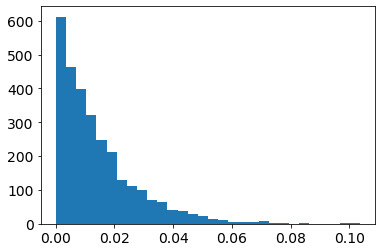

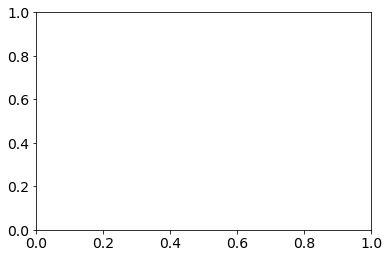

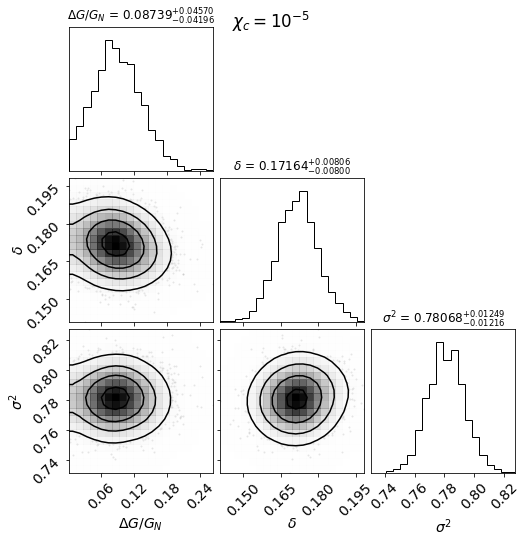

  0%|▏                                          | 4/918 [00:00<00:27, 32.86it/s]

10001-6102 [50] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 50.0 0.0 3.407078108183483e-06
10213-12705 [50] [0.7131, 1.2102, 0.8768, 0.5195, 0.4493, 0.2117, 0.0418, -0.0028, 0.0646, -0.0429, -0.0634, -0.104, -0.2488, 0.0811, -0.288, -0.3597]
10213-12705 50.0 0.0 2.711323136231619e-06
10213-1902 [50] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 50.0 0.0 1.1621348634669678e-06
10215-1902 [50] [48.0898, 11.7399, 3.1257, 3.4064, 1.9419, 1.4254, 1.1979, 0.4883, 0.5509, 0.1282, 0.0568, 0.1577, 0.1666, -0.0819, 0.4653, -0.1603, 0.0175, -0.2307, -0.1454, 0.1146, -0.2533, -0.5039, -0.4058, -0.602, -0.8837, -0.599]
10215-1902 50.0 0.0 1.7498370186412147e-06
10218-12701 [50] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859, 1.2052, 1.9057, 3.0246, 2.2024]
10218-12701 50.0 0.0 4.7338887776747284e-05
10218-12703 [50] [3

  1%|▌                                         | 12/918 [00:00<00:27, 32.50it/s]

10218-3704 [50] [-0.2423, -0.7324, -0.4111, -0.2502, -0.1409, -0.2076, -0.2494, -0.3265, -0.3433, -0.3506, -0.3606, -0.3689, -0.3645, -0.3466, -0.4111, -0.2985]
10218-3704 50.0 0.0 2.7861465091052374e-06
10219-9102 [50] [1.3962, 1.1814, 0.7492, 0.4692, 0.3335, 0.2205, 0.1532, 0.1423, 0.1945, 0.153, 0.0798, 0.0216, -0.0715, -0.157, -0.0196, -0.0532, -0.0405]
10219-9102 50.0 0.0 1.527880154781741e-06
10220-12705 [50] [3.5328, 1.639, 1.0262, 0.7032, 0.3627, 0.2043, 0.0862, 0.0659, 0.0694, 0.0929, 0.0507, 0.0328, -0.0234]
10220-12705 50.0 0.0 1.6517073447712347e-06
10222-6101 [50] [1.7015, 1.47, 0.91, 0.609, 0.3304, 0.2262, 0.1954, 0.1746, 0.1549, 0.1451, 0.1021, 0.0317, 0.0214, 0.0822]
10222-6101 50.0 0.0 8.393256007897833e-06
10224-9101 [50] [0.6075, 0.2294, 0.1489, 0.1763, 0.0991, 0.1519, 0.1436, 0.1942, 0.2236, 0.2306, 0.2436, 0.2398, 0.2536, 0.2328, 0.2658, 0.2971, 0.2718, 0.1187]
10224-9101 50.0 0.0 4.251998767841867e-06
10226-12704 [50] [0.7086, 1.2218, 0.7875, 0.8462, 0.6726, 0.669

  2%|▉                                         | 20/918 [00:00<00:27, 32.35it/s]

10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 1.800375606502102e-05
10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 2.1884223424077683e-05
10492-9102 [50] [0.3402, 0.2258, 0.1608, 0.0842, -0.0656, -0.2119, -0.3149, -0.3293, -0.2975, -0.2651, -0.2679, -0.2675, -0.2988, -0.277, -0.223, 0.1778]
10492-9102 50.0 0.0 1.3850237480078696e-05
10494-12705 [50] [-0.3923, -0.0113, 0.2587, 0.1702, 0.0143, 0.1174, 0.1226, 0.121, 0.0102, -0.0554, 0.1136]
10494-12705 50.0 0.0 3.0435792879900772e-06
10494-3701 [50] [-0.9731, -0.9922, -0.9938, -0.9948, -0.9954, -0.9959, -0.9964, -0.9965, -0.9967, -0.9968, -0.9969, -0.9971, -0.9972, -0.9972, -0.9971, -0.997, -0.9969, -0.9969, -0.9966]
10494-3701 50.0 0.0 1.7799521605005424e-05
10494-6101 [50] [-0.0956, -0.0126, 0.0573, 0.083, 0.1104, 0.1048, 0.0568, 0.0556, 0.0

  3%|█▎                                        | 28/918 [00:00<00:26, 33.08it/s]

10495-12704 [50] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 50.0 0.0 1.2961878612951301e-05
10495-12705 [20.316518592964822] [871.1598, 1245.0304, 1205.1955, 1347.7893, 1374.3588, 1517.2635, 1622.8998, 1633.9971, 1757.8692, 1799.4196, 1854.634, 1999.5551, 1849.1662, 1882.4866, 1807.1303, 1651.9125, 1681.1326, 1493.9167, 2771.4516, 2121.0254, 1992.5196]
10495-12705 20.316518592964822 3.838299612072125e-08 8.988725954636762e-07
10495-3702 [50] [-0.208, -0.0165, -0.0147, -0.1308, -0.0465, -0.0806, 0.0094, 0.2186, 0.2283, 0.0549, 0.0327]
10495-3702 50.0 0.0 3.1944941709201275e-06
10496-12704 [50] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268.8121, 253.915, 333.7881, 358.7629, 315.1183, 261.3063, 216.6964, 267.188, 258.5169, 256.0365, 248.4992]
10496-12704 50.0

  4%|█▋                                        | 37/918 [00:01<00:25, 34.37it/s]

10499-3703 [50] [-0.0563, -0.0436, 0.024, 0.1267, -0.0775, -0.0664, 0.0153, -0.0929, -0.1244, -0.0851, -0.0939, -0.1131, -0.1033, -0.048, 0.0474, 0.0456, 0.0289, -0.0666, -0.0844, -0.5663]
10499-3703 50.0 0.0 2.8336245075276007e-06
10499-3704 [50] [-0.7947, -0.4525, -0.3434, -0.2622, -0.1798, -0.0262, 0.0891, 0.0487, 0.0687, -0.0166, -0.002]
10499-3704 50.0 0.0 2.8347826758336163e-06
10500-12704 [0.3379] [140.7935, 35.4055, 16.1502]
10500-12704 0.3379 2.644594401216876e-07 6.555363973050221e-07
10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 3.247568722191804e-05
10500-3702 [50] [211.267, 568.975, 609.2163, 763.7494, 654.0512, 608.9412, 619.4812, 574.1158, 551.0555, 546.396, 492.531, 452.6766, 495.1396, 321.2342, 371.609, 358.446, 200.8978, 319.0074, 284.1887, 209.7882, 190.8027, 318.1602, 354.0653]
10500-3702 50.0 0.0 1.1114202619336871e-06
10500-3703 [50] [-0.028, -0.1828, 0.6642, 1.1037, 1.7094, 1.5507, 1.8019, 1.4925, 1.5792, 1.4772, 

  4%|█▉                                        | 41/918 [00:01<00:26, 33.38it/s]

10502-6103 [50] [-0.2704, 0.675, 0.7368, 0.5103, 0.3728, 0.2183, 0.094, -0.0157, -0.1176, -0.2276, -0.1514, -0.2836, 0.0255, -0.2321, -0.4441, -0.4786]
10502-6103 50.0 0.0 2.2651976896321656e-06
10503-12702 [50] [0.5911, 0.0739, 0.0666, 0.1, 0.0766, 0.0241, -0.0259, -0.0986, -0.0599, -0.0282, -0.0574]
10503-12702 50.0 0.0 2.7109709885255193e-06
10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 8.417979814167351e-06
10505-12704 [50] [0.6223, 0.447, 0.4087, 0.27, 0.0901, 0.1644, 0.1572, 0.3129, 0.3336, 0.3492, 0.2338, 0.2536, 0.1307, 0.2303, 0.2492, 0.6718, 0.9822, 1.3729, 3.1505, 2.3435]
10505-12704 50.0 0.0 1.2332676510909107e-05
10506-9101 [50] [-0.2543, 0.5091, 0.8262, 0.5675, 0.2552, 0.0764, 0.0245, 0.0392, 0.0453, 0.0366, -0.0056, -0.0369, -0.0612, -0.0986, -0.132, -0.0742, -0.1191]
10506-9101 50.0 0.0 4.851928809454517e-05
10508-127

  5%|██▏                                       | 49/918 [00:01<00:27, 32.15it/s]

10509-1901 [50] [88.4511, 296.1948, 449.6905, 409.1127, 761.2326, 574.7336, 678.7086, 604.9771, 571.2616, 614.5332, 408.9334, 441.3848, 355.292, 300.996, 243.919, 230.1612, 180.5992, 163.4382, 176.2701, 193.176, 205.4741]
10509-1901 50.0 0.0 2.1670820256660676e-06
10509-6101 [50] [414.6573, 159.5598, 352.8386, 670.9188, 930.199, 434.1238, 984.9702, 921.6235, 784.8291, 825.2006, 827.4197, 661.5592, 624.5693, 894.3523, 620.0269, 747.519, 623.1939, 701.341, 577.342, 1031.0135, 622.2157, 697.4912, 668.4888, 271.226]
10509-6101 50.0 0.0 2.724082272727987e-06
10511-12704 [50] [-0.0162, 0.2052, 0.0934, -0.0203, -0.0645, -0.0743, -0.1124, -0.1256, -0.1314, -0.1489, -0.145, -0.1344, -0.261, -0.3154, -0.4542, -0.3737, -0.3967, -0.387, 0.3583, -0.1418, -0.7705]
10511-12704 50.0 0.0 4.029638804255808e-06
10511-12705 [50] [-0.2818, -0.0952, 0.2141, 0.2185, 0.0509, 0.0112, -0.034, -0.0386, -0.0777, -0.1248, -0.1302, -0.15, -0.1634, -0.2053, -0.2903]
10511-12705 50.0 0.0 1.5711202274544786e-06
10512-

  6%|██▌                                       | 57/918 [00:01<00:26, 32.40it/s]

10513-12702 [50] [-0.9916, -0.9877, -0.9855, -0.9802, -0.9787, -0.98, -0.9868, -0.9787, -0.862, -0.9802]
10513-12702 50.0 0.0 2.5378736698062436e-06
10514-6103 [11.368090452261306] [0.5999, 0.3982, 0.2747, 0.2749, 0.0781, 0.0617, 0.0681, -0.0189, -0.0377, -0.0578, -0.065, -0.0594, 0.0253, -0.0317, 0.1182, -0.1428, -0.1895, -0.2508, -0.2991, -0.355]
10514-6103 11.368090452261306 1.1462740196021624e-07 8.221139924556153e-07
10516-6104 [50] [0.3084, -0.237, -0.3593, -0.3575, -0.3434, -0.2974, -0.3603, -0.4386, -0.4629, -0.4919, -0.5092, -0.5031, -0.4319, -0.4152, -0.2877, -0.6618]
10516-6104 50.0 0.0 1.5588444102328497e-06
10517-3704 [50] [6.5457, 4.9823, 4.7496, 3.3043, 2.1613, 1.6053, 1.1745, 0.9031, 0.7267, 0.8082, 0.6442, 0.6833, 0.6038, 0.6776, 0.66, 0.6521, 0.6265]
10517-3704 50.0 0.0 1.2979556701483295e-06
10517-6102 [50] [0.4712, 0.9172, 0.811, 0.5857, 0.3222, 0.2888, 0.1564, 0.1219, 0.169, 0.09, 0.1318, 0.0302, 0.061, 0.0297, 0.0658, 0.0113, 0.072, 0.0733, -0.0232, 0.0238, 0.0127

  7%|██▉                                       | 65/918 [00:01<00:26, 31.91it/s]

10518-6102 [50] [-0.217, 1.2282, 0.4062, 0.3459, 0.382, 0.1799, 0.1478, 0.1175, 0.0995, 0.1358, 0.0812, 0.048, 0.0452, 0.0639, 0.0875, 0.0309, 0.0337, 0.0007, -0.0113, -0.1383]
10518-6102 50.0 0.0 2.189681554683063e-06
10519-12704 [50] [-0.2611, 0.2686, 0.1702, 0.0601, 0.0584, 0.0258, -0.0515, -0.1077, -0.1123, -0.1006]
10519-12704 50.0 0.0 2.848530605415121e-06
10519-6102 [50] [15.342, 9.7033, 5.6052, 3.8579, 2.785, 2.1688, 1.9416, 1.9483, 2.0544, 1.8028, 1.946, 2.1855, 2.046, 2.3544, 2.1616]
10519-6102 50.0 0.0 6.455945418405123e-06
10520-12704 [50] [-0.3926, 0.2966, 0.1534, 0.0687, 0.1056, 0.0825, 0.0305, 0.0582, 0.0366, 0.0275, -0.0135, 0.0213, 0.0998, -0.1048, -0.1309]
10520-12704 50.0 0.0 1.2130386538098298e-06
10520-6102 [50] [-0.9995, -0.9993, -0.9985, -0.9976, -0.9986, -0.9981, -0.9983, -0.9984, -0.9986, -0.9981, -0.9963]
10520-6102 50.0 0.0 5.069355521332462e-06
10838-9101 [50] [-0.0928, 0.4421, 0.4896, 0.3922, 0.2667, 0.3141, 0.2582, 0.2949, 0.294, 0.2543, 0.2198, 0.1153, 0.

  8%|███▏                                      | 69/918 [00:02<00:27, 31.37it/s]

10839-3704 [50] [0.8005, 0.3556, 0.2178, 0.1712, 0.035, -0.0115, 0.0248, -0.0288, 0.0512, -0.0187, 0.0073, 0.0432, -0.0916, -0.1233, -0.1818, -0.1471]
10839-3704 50.0 0.0 2.4132694215577748e-06
10839-6101 [50] [244.3098, 615.0842, 876.8345, 1563.8627, 1705.1968, 1816.091, 1687.128, 1731.6052, 1640.9131, 1596.506, 1498.4971, 1406.0518, 671.6148, 995.7509]
10839-6101 50.0 0.0 2.42324151094732e-06
10839-9101 [50] [2.1426, 2.2648, 0.9796, 0.8183, 0.5304, -0.0332, -0.1785, -0.3432, -0.3468, -0.4742, -0.4095, -0.6139, -0.5305, -0.616, -0.529, -0.5494, 0.8162, 3.2784]
10839-9101 50.0 0.0 2.579169355089968e-06
10841-12701 [50] [-0.7323, -0.6652, -0.4249, -0.3016, -0.2957, -0.3482, -0.374, -0.3905, -0.3944, -0.4309, -0.4302, -0.4504, -0.4708, -0.4257, -0.4725]
10841-12701 50.0 0.0 4.292085354782665e-06
10842-3702 [50] [-0.5415, 0.0585, 0.2828, 0.1825, 0.1674, 0.1342, 0.1324, 0.2899]
10842-3702 50.0 0.0 9.742733205160897e-07
10842-3703 [50] [-0.6099, -0.8101, -0.8807, -0.9171, -0.9297, -0.9289, 

  8%|███▌                                      | 77/918 [00:02<00:27, 31.04it/s]

10845-12702 [50] [-0.996, -0.9979, -0.9962, -0.9919, -0.991, -0.9909, -0.9925, -0.993, -0.9952, -0.9945, -0.996]
10845-12702 50.0 0.0 2.077221169723167e-06
11004-12705 [50] [-0.8497, -0.6991, -0.5203, -0.3493, -0.2406, -0.2193, -0.1954, -0.1792, -0.1842, -0.1767, -0.1858, -0.1781, -0.195, -0.2173, -0.2294, -0.167, -0.2434, -0.1514, -0.3351, -0.2129]
11004-12705 50.0 0.0 1.2375037396066119e-06
11004-3703 [50] [5607.0165, 6199.0745, 5122.0907, 4588.5334, 3798.1606, 3256.1827, 2909.7374, 2623.1995, 2081.3703, 1622.0266, 1252.6703, 1054.2993, 797.551, 805.4299, 667.6425]
11004-3703 50.0 0.0 9.72461910870282e-07
11004-6104 [50] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 50.0 0.0 2.890023671670049e-05
11009-12704 [50] [-0.044, 0.5574, 0.4941, 0.5156, 0.452, 0.4031, 0.3736, 0.4191, 0.4646, 0.4848, 0.558, 0.4716, 0.2432, 0.3821, 0.6252, 0.8487, 0.8601]
11009-12704 50.0 0.0 3.642562313470518e-05
11

  9%|███▉                                      | 85/918 [00:02<00:25, 32.04it/s]

11010-9101 [50] [2.5718, 0.9269, 0.2901, 0.1931, 0.0011, -0.0504, -0.0935, -0.075, 0.0093, 0.0203, 0.0025, -0.0251, -0.0362, 0.0004, 0.0161, -0.0012, -0.102, -0.364, -0.4377]
11010-9101 50.0 0.0 2.468621232389903e-05
11011-12703 [50] [9.8651, 35.0102, 40.3579, 54.0601, 192.4013, 365.0512, 378.092, 411.2362, 282.7202, 230.5846, 329.2445, 263.6472, 244.1501]
11011-12703 50.0 0.0 1.577633828208464e-05
11012-12705 [50] [0.2329, 0.5509, 0.2517, 0.0195, 0.0174, -0.0704, -0.1937, -0.145, -0.249, -0.0592, -0.302, -0.1828, -0.2112]
11012-12705 50.0 0.0 1.6106242735038234e-05
11012-3702 [50] [7.8974, 3196.585, 2734.8285, 2253.8811, 4078.0168, 2401.2221, 2680.4924, 2677.0305, 2494.671, 2122.0656, 2023.2433, 2124.4295, 1742.4806, 1879.5204, 1353.859, 1265.244, 1077.374, 829.3809, 807.9255, 437.3493, 291.3315]
11012-3702 50.0 0.0 1.118155591781757e-05
11012-9102 [50] [4.3613, 1.8587, 0.9243, 0.4611, 0.1717, 0.0565, -0.0003, -0.0124, 0.0149, 0.0346, 0.0094, 0.0256, 0.0391, 0.0441, 0.0302, -0.0599, -

 10%|████▎                                     | 93/918 [00:02<00:26, 30.97it/s]

[0.7893, 0.6453, 0.5024, 0.4895, 0.4034, 0.2175, 0.0455, -0.0103, 0.0142, -0.2569, -0.0412, -0.2183, -0.1712, -0.0824, -0.3609, -0.2323, -0.3117]
11013-1902 50.0 0.0 9.577019683067129e-06
11013-3701 [50] [0.785, 0.6845, 0.2024, 0.0457, 0.0342, 0.02, -0.06, -0.0296, -0.0379, -0.1677]
11013-3701 50.0 0.0 3.022190596898097e-06
11013-3702 [50] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 50.0 0.0 6.709901115903412e-06
11013-6101 [50] [0.3389, -0.3422, -0.154, -0.2894, -0.4104, -0.4385, -0.4897, -0.4798, -0.43, -0.3971, -0.3753, -0.3775, -0.3376, -0.2419, -0.1243, 0.0068, -0.1557, 0.0318, -0.0178, 0.2532, 0.5345, 0.5099]
11013-6101 50.0 0.0 2.991529638773043e-06
11017-12703 [50] [0.0185, 0.3093, 0.3468, 0.2632, 0.2308, 0.2072, 0.1992, 0.215, 0.2444, 0.2273, 0.053, -0.0123, 0.1078, -0.0553]
11017-12703 50.0 0.0 5.8332209917366145e-06
11017-12704 [50] [0.4751, 0.4487, 0.3988, 0.2586, 0.0625, -0.0537, -0.0751, -0.1094, -0.1157, -0.1027, -0.1141, -0.1182, -0.1126, -0.

 11%|████▍                                     | 97/918 [00:03<00:26, 30.76it/s]

11017-9101 [50] [-0.5273, 0.0425, 0.2188, 0.1666, 0.07, 0.0407, -0.0503, -0.1282, -0.2004, -0.2244, -0.1722, -0.1497, -0.0815, -0.0967, -0.1443, -0.1476, -0.1864, -0.1536, -0.2264, -0.18]
11017-9101 50.0 0.0 1.9375238180105035e-06
11018-12702 [50] [-0.9839, -0.9926, -0.9927, -0.9922, -0.9923, -0.9935, -0.9932, -0.9925, -0.9931, -0.994, -0.9941]
11018-12702 50.0 0.0 2.2805789425518003e-06
11018-12704 [50] [-0.9989, -0.9988, -0.9986, -0.9987, -0.9988, -0.999, -0.999, -0.9991, -0.9991, -0.9987, -0.9984, -0.9975, -0.9987, -0.9989]
11018-12704 50.0 0.0 2.3132682120761146e-06
11018-3702 [50] [0.6083, 0.007, 0.0959, 0.33, 0.5514, 0.4356, 0.3654, 0.3085, 0.3057, 0.287, 0.3004]
11018-3702 50.0 0.0 1.7689360796489344e-06
11018-3703 [50] [-0.5454, 0.4164, 0.6741, 0.5852, 0.6907, 0.7028, 0.6059, 0.5528, 0.656, 0.6306, 0.5445, 0.5549, 0.4676, 0.4329, 0.3355, 0.3242, 0.462, 1.051, 0.5129, 1.3094]
11018-3703 50.0 0.0 7.364910948219345e-06
11018-6102 [50] [69.1052, 130.9961, 113.1141, 109.1797, 92.598

 11%|████▋                                    | 105/918 [00:03<00:26, 30.62it/s]

11019-12703 [50] [-0.4993, -0.4671, -0.3698, -0.2654, -0.2024, -0.2445, -0.2033, -0.2117, -0.2752, -0.2285, -0.2102, -0.0702, -0.1699, 0.0858, -0.1757, -0.2987]
11019-12703 50.0 0.0 1.2415143394311098e-05
11019-12705 [50] [0.9395, 1.6844, 1.8269, 0.8562, 0.7011, 1.016, 1.1247, 1.0992, 1.0844]
11019-12705 50.0 0.0 5.959127121561189e-06
11019-3701 [50] [2.5964, 1.3616, 0.9142, 0.3658, 0.0143, -0.1157, -0.1148, -0.102, -0.0691, -0.1802, -0.166, -0.2893, -0.0849]
11019-3701 50.0 0.0 9.595644282887643e-06
11021-1902 [50] [5.9017, 3.1432, 2.8491, 1.9605, 1.7177]
11021-1902 50.0 0.0 4.683033235692236e-06
11022-12703 [50] [0.3292, 0.7575, 0.7969, 0.5155, 0.4891, 0.4266, 0.3635, 0.2298, 0.0927, -0.0433, -0.1137, -0.0533, -0.0259, -0.199, -0.2325]
11022-12703 50.0 0.0 1.9693309666573328e-05
11022-3702 [50] [0.7113, 0.7469, 0.8316, 0.5873, 0.3526, 0.3095, 0.2499, 0.1407, 0.0924, 0.0376, -0.0142, -0.0314, -0.016, 0.0142, 0.0334, 0.1145, -0.0777, 0.1408]
11022-3702 50.0 0.0 1.4934189919802896e-05
1

 12%|█████                                    | 113/918 [00:03<00:26, 30.57it/s]

11742-12704 [50] [0.6702, -0.5312, -0.3481, 0.0047, 0.1348, 0.415, 0.2787, 0.5138, -0.0348]
11742-12704 50.0 0.0 1.6809493207008523e-06
11743-1901 [50] [-0.5717, -0.3943, -0.5273, -0.3736, -0.306, -0.392, -0.3766, -0.4151, -0.3665, -0.4111, -0.4236, -0.3424, -0.3877, -0.3594, -0.291, -0.4952, -0.6018]
11743-1901 50.0 0.0 8.481461206525377e-06
11744-9102 [50] [-0.6298, 0.0464, 0.3943, 0.6247, 0.4097, 0.3518, 0.3414, 0.4046, 0.4742, 0.4313, 0.3693, 0.3275, 0.2214, 0.1278, 0.0812, 0.4043, 0.1792, -0.1336]
11744-9102 50.0 0.0 3.138258761666248e-06
11745-1902 [50] [1.185, 0.9719, 0.4625, 0.4231, 0.2188, 0.1795, 0.0428, 0.0263, -0.0784, -0.2371, 0.1632]
11745-1902 50.0 0.0 1.0553599523018724e-05
11745-6104 [50] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.8527, 0.5703, 0.5078, 0.5176, 0.5143, 0.48, 0.4463, 0.4504, 0.4653, 0.4273, 0.4049]
11745-6104 50.0 0.0 2.419721481353006e-06
11745-9101 [50] [-0.8306, -0.2912, -0.0316, -0.0075, -0.0842, -0.1044, -0.1086, -0.064, 0.0707, 0.0756, 0.0234, -0.036

 13%|█████▏                                   | 117/918 [00:03<00:25, 30.95it/s]

11746-3703 [50] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 50.0 0.0 4.919997363044765e-06
11746-3704 [18.61140201005025] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 18.61140201005025 1.4616756355237823e-07 7.894476385801425e-07
11746-9102 [50] [-0.478, -0.2133, -0.2528, -0.1774, -0.2077, -0.2266, -0.2099, -0.2691, -0.1996, -0.2114, -0.1249, -0.1799, -0.1765, -0.1376, -0.2784, -0.2323, -0.1941, -0.3005, -0.2047, -0.3235, -0.1159, 0.1709]
11746-9102 50.0 0.0 1.7796345557631206e-05
11747-12702 [50] [-0.4876, -0.2412, -0.0165, -0.0887, -0.0931, -0.0756, -0.076, -0.0313, -0.0043, 0.0037, -0.0318, -0.1133, 0.1257, -0.1019, 0.1921, -0.2837, -0.0753]
11747-12702 50.0 0.0 3.326248640077164e-05
11749-12701 [50] [-0.6821, -0.1137, 0.255, 0.1029, 0.08

 14%|█████▌                                   | 125/918 [00:03<00:26, 30.42it/s]

11750-12701 [50] [0.4224, 0.3089, 0.0791, 0.0892, 0.2329, 0.2222, 0.1114, 0.03, 0.0196, 0.0027, 0.0313, 0.0827, 0.0275, 0.3095]
11750-12701 50.0 0.0 4.3780596053506974e-06
11750-3701 [50] [1.5964, 1.8766, 1.9419, 1.999, 1.4725, 1.2873, 1.1333, 0.934, 0.9463, 0.8918, 0.7347, 0.8508, 0.6677, 0.4619, 0.3762, 0.1866, 0.0367, 0.0915, 0.0086, 0.4665]
11750-3701 50.0 0.0 1.0411172446090037e-06
11750-6103 [50] [6.303, 1.7001, 0.3933, 0.5417, 0.5248, 0.6298, 0.7207, 0.7282, 0.8046, 0.5691, 0.3659, 0.4083, 0.4745, 0.6207, 0.9957, 2.1073, 7.7724]
11750-6103 50.0 0.0 3.999792299986226e-06
11750-9101 [50] [13.4461, 9.2464, 8.3896, 5.4399, 4.9554, 3.0033, 3.1782, 2.4566, 2.5343, 2.0961, 2.3663, 2.3818, 2.4375, 3.0403, 2.3998, 2.3406, 2.9409, 6.8913, 8.6024]
11750-9101 50.0 0.0 1.00828031873131e-06
11751-1901 [50] [-0.9334, -0.8849, -0.9513, -0.9754, -0.9893, -0.9862, -0.989, -0.9902, -0.9893, -0.9909, -0.9903, -0.9906, -0.9888, -0.9874]
11751-1901 50.0 0.0 4.575106520112924e-06
11751-6102 [50] [0.37

 14%|█████▉                                   | 132/918 [00:04<00:26, 29.44it/s]

11753-3703 [50] [0.2801, 0.7604, 0.7391, 0.5795, 0.35, 0.1693, 0.0874, 0.0586, 0.0152, -0.0057, -0.0099, -0.0594, -0.1073, -0.139, -0.1496]
11753-3703 50.0 0.0 3.2562535941169067e-06
11753-6104 [50] [1.7058, 1.5787, 1.7231, 1.492, 1.0043, 0.8699, 0.6579, 0.5905, 0.5042, 0.4712, 0.4504, 0.6153, 0.6589, 0.6817, 0.5206, 0.5457, 0.5195, 0.692]
11753-6104 50.0 0.0 2.5397349180988905e-06
11754-1901 [50] [-0.2402, -0.5388, -0.5143, -0.4398, -0.487, -0.4664, -0.4721, -0.5334, -0.5004, -0.4954, -0.6115, -0.5884]
11754-1901 50.0 0.0 6.2095458761435666e-06
11755-12701 [50] [-0.773, -0.7865, -0.7717, -0.7522, -0.7475, -0.7159, -0.7048, -0.6936, -0.7373, -0.7183, -0.7382, -0.7769, -0.6833, -0.7924, -0.5695, -0.681, -0.5512]
11755-12701 50.0 0.0 4.447563628716634e-06
11755-6101 [50] [-0.0093, 1.0489, 0.9853, 1.2444, 1.0667, 0.8902, 0.7008, 0.6245, 0.5835, 0.5179, 0.397, 0.4083, 0.4791, 0.2148, 0.053]
11755-6101 50.0 0.0 4.1438448825375246e-06
11755-9102 [50] [0.1799, 0.2485, 0.3504, 0.383, 0.2088, 0

 15%|██████▏                                  | 138/918 [00:04<00:26, 29.12it/s]

11758-3701 [50] [-0.3091, 0.0326, 0.2349, 0.1141, 0.0113, 0.06, -0.0268, -0.1507, -0.2171, -0.1994, -0.1587, -0.1557, -0.1574, -0.1614, -0.0618]
11758-3701 50.0 0.0 1.931046225183852e-06
11758-3702 [50] [-0.544, -0.1141, 0.0167, 0.1028, 0.0854, -0.0041, -0.0149, 0.0406]
11758-3702 50.0 0.0 5.384406129833349e-06
11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 50.0 0.0 1.772387506323909e-06
11759-6102 [50] [-0.9983, -0.999, -0.9983, -0.9967, -0.9911, -0.994, -0.9878, -0.9867, -0.9694, -0.9002, -0.9625, -0.9576, -0.983, -0.9872, -0.9933, -0.7573, -0.981]
11759-6102 50.0 0.0 1.4406415292799802e-06
11760-12703 [50] [0.987, 1.2913, 2.3014, 2.3628, 3.1145, 3.0096, 2.6827, 2.1814, 1.8669, 1.837, 1.727, 1.4747, 0.5775, 0.8681, 0.539, 0.1155, 0.1223, 0.309]
11760-12703 50.0 0.0 1.0677271843297433e-06
11760-6101 [50] [0.4533, -0.0157, 0.5654, 0.502, 0.3995, 0.359, 0.3287, 0.2964, 0.2063, 0.2512, 0.2686, 0.2421, 0.2368, 0.1884,

 16%|██████▍                                  | 144/918 [00:04<00:27, 28.45it/s]

11760-6103 [50] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.2117, -0.2373, -0.2365, -0.2317, -0.3078, -0.2653, -0.3184, -0.2638]
11760-6103 50.0 0.0 2.2981004088077622e-06
11760-9102 [50] [-0.8049, -0.6427, -0.2931, -0.1213, 0.1899, 0.0235, 0.108, 0.1381, 0.1732, 0.1865, 0.1624, 0.1963, 0.1218, 0.1215, 0.1223, 0.2636, 0.046, 0.5962, 0.1808, 0.9922, 2.2582]
11760-9102 50.0 0.0 1.8965630713317942e-06
11761-12702 [50] [-0.6826, -0.6017, -0.2216, -0.1122, -0.0329, -0.02, -0.0711, -0.0937, -0.0782, -0.098, -0.1546, -0.1024, -0.1043, -0.0648, -0.2102, -0.3314, -0.2483]
11761-12702 50.0 0.0 1.2210420771364188e-05
11761-12703 [50] [0.4093, 0.08, -0.0588, -0.0478, 0.0006, -0.0009, -0.0617, -0.1284, -0.1046, -0.1135, -0.1247, -0.1623, -0.2191, -0.3477]
11761-12703 50.0 0.0 1.3271796074793309e-05
11761-12704 [50] [-0.1205, 0.9952, 0.5814, 0.2296, 0.1208, 0.126, 0.1222, 0.1041, 0.1683, 0.1996, 0.1448, 0.1188, 0.0574, 0.0394, -0.008, -0.026, -0.0331]
11761-12

 16%|██████▋                                  | 151/918 [00:04<00:26, 29.06it/s]

11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 1.6340302042804406e-05
11828-12703 [50] [-0.5587, -0.2913, 0.1844, 0.3112, 0.2627, 0.2124, -0.0354, -0.0957, -0.1295, -0.1601, -0.0565, -0.1246, 0.0413]
11828-12703 50.0 0.0 4.278409500859888e-06
11830-12701 [50] [-0.9938, -0.9825, -0.9834, -0.9912, -0.9934, -0.9941, -0.9946, -0.9933, -0.9936, -0.9951, -0.9951, -0.9944, -0.9947, -0.9932, -0.9955, -0.9854, -0.997, -0.9939, -0.9962]
11830-12701 50.0 0.0 3.926978015902562e-06
11830-12703 [50] [-0.4776, 0.0437, 0.1582, -0.0709, -0.1607, -0.0754, 0.055, 0.2665, 0.1845, 0.03, 0.0663, -0.087, -0.2185, -0.1589, 0.0536, -0.3722]
11830-12703 50.0 0.0 1.0546817958220284e-05
11830-3702 [50] [1.2195, 0.9978, 0.6546, 0.4726, 0.5057, 0.555, 0.4749, 0.3884, 0.4626]
11830-3702 50.0 0.0 4.738250749769282e-06
11830-6104 [50] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0

 17%|███████                                  | 157/918 [00:05<00:26, 28.37it/s]

11831-12703 [50] [0.4472, 0.0224, 0.062, 0.158, -0.0429, -0.0922, -0.1252, -0.188, -0.1276, -0.16, -0.2596, -0.2165, 0.1708, -0.4595]
11831-12703 50.0 0.0 1.0644642003617552e-05
11831-12704 [50] [-0.5822, -0.2435, 0.0115, -0.0848, -0.1704, -0.028, -0.0888, -0.0323, -0.0445, -0.106, -0.3871, -0.1836]
11831-12704 50.0 0.0 2.6848029107956908e-06
11831-6101 [50] [-0.9875, -0.994, -0.9968, -0.9973, -0.9967, -0.9975, -0.9969, -0.9978, -0.9979, -0.9971, -0.9984, -0.9986, -0.9985, -0.9974]
11831-6101 50.0 0.0 1.4753819637790052e-06
11831-6102 [50] [1.041, 0.6096, 0.4053, 0.165, 0.0902, 0.1922, 0.1873, 0.1187, 0.1055, 0.0085, -0.1108, -0.0737]
11831-6102 50.0 0.0 6.807892352564081e-06
11833-9102 [50] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.2658, -0.2176, -0.1929, -0.2471, -0.3166]
11833-9102 50.0 0.0 5.761932681859814e-06
11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 

 18%|███████▏                                 | 161/918 [00:05<00:26, 28.79it/s]

11836-1902 [50] [0.7026, 1.2767, 1.1865, 1.1009, 0.973, 0.9921, 0.7024, 0.7206, 0.623, 0.6145, 0.5505, 0.5955, 0.6037, 0.4142, 0.4147]
11836-1902 50.0 0.0 1.1125694487351515e-05
11838-12701 [50] [-0.0612, 0.0482, 0.066, 0.0382, 0.0738, 0.1336, 0.0903, 0.0213, -0.0554, -0.0342, 0.0225, 0.0053, -0.0272]
11838-12701 50.0 0.0 5.938316351294632e-06
11838-12703 [50] [144.9042, 254.2159, 538.0129, 911.0748, 1089.8377, 1111.2623, 1284.2649, 1228.3752, 1345.2496, 1400.7846, 1427.4787, 1434.5371, 1257.47, 1184.9615, 998.2342, 830.6266, 670.98, 596.3078, 488.5417, 423.536, 329.6538, 32.3109, 5.6457, 31.8479]
11838-12703 50.0 0.0 2.550907319793218e-06
11838-3702 [50] [0.536, 0.7094, 0.6061, 0.6555, 0.6466, 0.6204, 0.5689, 0.587, 0.6487, 0.6337, 0.5876, 0.5059, 0.4509, 0.4328, 0.3954, 0.396]
11838-3702 50.0 0.0 4.8636648441497136e-06
11838-6103 [50] [201.1554, 531.7007, 967.9199, 1125.4471, 1324.9799, 1297.8083, 1279.6033, 1183.901, 1134.9301, 1132.4611, 1104.3121, 1011.7157, 1287.8266]
11838-6103 

 18%|███████▍                                 | 167/918 [00:05<00:26, 28.24it/s]

11865-12702 [50] [-0.057, -0.0512, 0.0778, -0.0002, -0.0743, -0.0834, -0.0854, 0.0083, -0.0154, -0.0332, -0.07, -0.1612, -0.2706]
11865-12702 50.0 0.0 2.585797671272025e-06
11865-12704 [50] [0.4447, -0.0557, -0.3894, -0.457, -0.5111, -0.5109, -0.5238, -0.5353, -0.4955, -0.5012, -0.4831, -0.4726, -0.599, -0.615]
11865-12704 50.0 0.0 2.406515315771328e-06
11865-1901 [50] [0.2904, -0.0067, 0.047, 0.1131, 0.0632, 0.0659, -0.0366, -0.0061, 0.1217, 0.1877, 0.0188]
11865-1901 50.0 0.0 2.4618100482909388e-06
11865-1902 [50] [-0.8298, -0.8107, -0.7801, -0.7226, -0.6889, -0.4629, -0.3395, -0.4356, -0.4243, -0.4429]
11865-1902 50.0 0.0 2.4224127295363868e-06
11865-6102 [50] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 50.0 0.0 2.466561792988663e-06
11865-9102 [50] [-0.467, -0.4695, -0.4789, -0.5286, -0.6182, -0.6445, -0.6408, -0.6047, -0.6031, -0.6243, -0.655, -0.6895, -0.6998, -0.5904, -0.6729, -0.6983]
11865-9102 50.0 0.0 1.1409361480138746e-06


 19%|███████▋                                 | 173/918 [00:05<00:26, 28.11it/s]

11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2771, 0.298, 0.3814, 0.3262, 0.2102, 0.3978, 0.4467, 0.2866, 0.1214, 0.2202, 0.1346, 0.4041]
11867-6104 50.0 0.0 6.298010784901712e-06
11867-9101 [50] [0.9073, 0.3027, 0.1546, 0.1123, 0.0285, 0.0159, -0.0244, 0.0205, 0.0824, 0.1908, 0.2079, 0.2195, 0.3058, 0.2425, 0.1871, 0.3056]
11867-9101 50.0 0.0 5.606992433125042e-06
11868-12703 [50] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 50.0 0.0 7.742304003517619e-06
11871-12701 [50] [0.1902, 0.12, -0.1255, -0.1645, -0.1483, -0.1981, -0.2117, -0.2524, -0.1399, -0.0878]
11871-12701 50.0 0.0 2.5212407623552356e-05
11871-6103 [50] [0.7182, 0.8575, 0.776, 0.4737, 0.2556, 0.1173, 0.1395, 0.111, 0.0842, 0.0381, 0.0003, -0.0281, -0.0195, -0.044, -0.0588, -0.2086, -0.132, -0.377]
11871-6103 50.0 0.0 3.276700293181256e-05
11940-1902 [50] [-0.0835, 0.1518, 0.1321, 0.0182, -0.0843, -0.1452, -0.1779, -0.1993, -0.1955]
11940-1902 50.0 0

 20%|████████                                 | 181/918 [00:05<00:23, 31.16it/s]

11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 8.06277851744596e-05
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 7.684752590275273e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 6.915287811765788e-05
11942-12704 [50] [21.1009, 11046.1912, 9883.6518, 8966.0315, 6695.5158, 5012.9496, 4237.9454, 3389.9946, 2439.1642, 2636.587, 2485.7262, 2056.7992, 1736.2622, 1623.5415, 1192.5228, 781.8483, 546.9719, 175.874]
11942-12704 50.0 0.0 5.286272784222683e-05
11942-6104 [4.517485427135679] [-0.6046, -0.5795, -0.454, -0.4074, -0.3825, -0.4291, -0.3841, -0.304, -0.2589, -0.2009, -0.1889, -0.0394, -0.0481]
11942-6104 4.517485427135679 2.7672141323784145e-07 6.549437015785099e-07
11943-3703 [50] [0.0

 20%|████████▍                                | 188/918 [00:06<00:25, 28.66it/s]

11945-12701 [50] [0.3961, 0.2879, 0.3765, 0.1557, -0.0002, -0.113, -0.1502, -0.128, -0.114, -0.1705, -0.0344, 0.0462, 0.017]
11945-12701 50.0 0.0 1.8257055256924726e-05
11945-6101 [50] [0.2057, 0.8606, 0.9637, 0.605, 0.4694, 0.2734, 0.2029, 0.1332, 0.0558, -0.0105, 0.0015, 0.0011, -0.0038, -0.016, 0.0504, -0.0338]
11945-6101 50.0 0.0 2.552918849751527e-05
11945-6102 [50] [3.5224, 2.2109, 1.4349, 1.0152, 0.7457, 0.4864, 0.2556, 0.1192, 0.0508, 0.0117, -0.0209, -0.0683, -0.158, -0.0976, -0.2012]
11945-6102 50.0 0.0 1.3106580823967514e-05
11947-6103 [50] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 50.0 0.0 5.739730218974014e-06
11949-12701 [50] [1.1975, 0.3408, 0.1441, 0.1243, 0.0225, 0.0003, 0.0028, 0.027, 0.0197, 0.0192, -0.0295, -0.0839]
11949-12701 50.0 0.0 9.356382759109931e-06
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716

 21%|████████▋                                | 194/918 [00:06<00:25, 28.01it/s]

11954-12704 [50] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453, 0.1801, 0.125, 0.0276, -0.0116, -0.0744, -0.134, -0.1626, -0.2559, -0.2802]
11954-12704 50.0 0.0 1.493375458365064e-05
11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.2778]
11954-3703 50.0 0.0 1.3946372153424739e-05
11954-9101 [50] [-0.9882, -0.9937, -0.9946, -0.9965, -0.9974, -0.9972, -0.997, -0.9969, -0.997, -0.9974, -0.9978, -0.9979, -0.9973, -0.9971, -0.9976, -0.9966]
11954-9101 50.0 0.0 1.30286188782751e-05
11955-9102 [50] [-0.9534, -0.7686, -0.4525, 0.0622, 0.0528, -0.0098, 0.0029, -0.0206, 0.0036, -0.0237, -0.1533, -0.1287, -0.0273, 0.3829, 0.3555, 0.2297, 0.0096]
11955-9102 50.0 0.0 1.1329623555805863e-05
11956-12702 [50] [5.6953, 5.0804, 3.2564, 2.1056, 1.2622, 0.6457, 0.4602, 0.5373, 0.9503, 3.7649, 5.1679]
11956-12702 50.0 0.0 6.559416983952857e-06
11956-12705 [50] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 0.

 22%|█████████                                | 202/918 [00:06<00:24, 28.89it/s]

11957-9101 [50] [127.5969, 337.5453, 692.0501, 754.6672, 761.8038, 673.5367, 561.8056, 470.5271, 446.8561, 434.7914, 434.701, 432.6297, 423.9362, 415.9254, 409.4146, 409.8788]
11957-9101 50.0 0.0 3.9376264170806644e-06
11957-9102 [50] [1.0969, 0.3397, 0.6198, 1.0919, 1.791, 2.069, 2.6145, 2.7123, 2.8073, 2.4726, 2.1945, 1.9756, 2.1362, 4.7679, 3.0873, 1.2673, 3.459, 16.3037, 15.1044]
11957-9102 50.0 0.0 3.5952192463705825e-06
11958-6103 [50] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 50.0 0.0 1.3298484456086635e-06
11960-12701 [50] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 50.0 0.0 6.795928797214425e-06
11960-12704 [50] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 50.0 0.0 1.4765817962335632e-05
11965-9102 [50] [3.4399, 2.3674, 1.5667, 0.

 22%|█████████▏                               | 206/918 [00:06<00:24, 29.39it/s]

11968-9102 [50] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.618, 0.6211, 0.7457, 0.9049, 1.2534]
11968-9102 50.0 0.0 2.4629826355538892e-05
11969-6101 [50] [-0.3982, -0.2299, 0.2218, 0.9873, 0.7453, 1.53, 3.5953, 2.4042, 3.9735, 3.6067, 4.5763, 3.8986, 3.5843, 4.0724, 0.9129, 2.9875, 0.7205, 2.6408, 1.2362]
11969-6101 50.0 0.0 3.2766007777087775e-05
11970-12703 [0.2613] [-0.4888, -0.3498, -0.0561]
11970-12703 0.2613 2.4004792009267367e-07 6.61061934220122e-07
11970-6102 [50] [-0.0116, -0.0683, -0.0558, -0.0053, 0.0454, 0.025, 0.078, -0.0283, -0.085, -0.1052, -0.0602, -0.0272, -0.0693, -0.0116, -0.1378, -0.2799, -0.2497]
11970-6102 50.0 0.0 5.838827838567853e-06
11970-6103 [50] [0.7466, 1.1751, 1.6643, 1.3977, 1.0416, 0.8262, 0.6871, 0.5199, 0.4194, 0.3266, 0.2718, 0.2909, 0.2357, 0.2575, 0.2139, 0.0837, -0.0144, -0.0619, 0.133]
11970-6103 50.0 0.0 5.989000784879182e-06
11974-12702 [50] [-0.5341, -0.4596, -0.3852, -0.2683, -0

 23%|█████████▌                               | 213/918 [00:06<00:24, 28.54it/s]

11975-12705 [50] [0.6902, 0.7621, 0.3208, 0.2527, 0.3317, 0.3259, 0.2387, 0.0864, 0.069, 0.2015, 0.1928, 0.1502, -0.0055, -0.1924]
11975-12705 50.0 0.0 7.4933571063747055e-06
11975-3703 [50] [-0.2597, -0.0329, 0.0768, 0.0833, 0.1048, 0.0682, 0.0342, -0.0156, -0.0756, -0.093, -0.0695, -0.0466, 0.0656, -0.0085, 0.1237, 0.1334, 0.0646]
11975-3703 50.0 0.0 1.1806540466950176e-05
11975-6104 [50] [1.0196, 1.2709, 1.5062, 1.1104, 0.9965, 0.7778, 0.776, 0.6311, 0.7603, 0.6278, 0.6208, 0.5151, 0.5172, 0.5343, 0.2326, 0.5012, 0.187, 0.4522, 0.1401, 0.1327]
11975-6104 50.0 0.0 1.7546624006070968e-05
11976-12703 [50] [-0.2491, -0.2149, -0.1404, 0.0391, 0.078, -0.0442, -0.0829, 0.0071, 0.0226, 0.0171, 0.0473, 0.0557, 0.023, 0.0229, 0.108, 0.182, 0.2955]
11976-12703 50.0 0.0 2.042959795486677e-05
11978-12703 [50] [-0.8665, -0.8229, -0.6749, -0.6061, -0.4256, -0.3676, -0.4264, -0.4869, -0.5253, -0.4482, -0.3231, -0.3717, -0.5203]
11978-12703 50.0 0.0 2.274184472686037e-06
11978-12705 [50] [0.0184, 0.

 24%|█████████▊                               | 219/918 [00:07<00:25, 27.27it/s]

11978-6101 [50] [0.1703, 0.2916, 0.2201, 0.1105, 0.137, 0.0651, 0.0262, 0.0439, 0.1227, 0.0551, 0.0171, -0.0525, -0.106, -0.2018, -0.2281, -0.1584, -0.2752, -0.3694, -0.5359, -0.6656, -0.8099]
11978-6101 50.0 0.0 2.987076808344869e-06
11979-12703 [50] [0.3188, 0.2646, 0.4444, 0.4735, 0.4231, 0.2818, 0.2037, 0.1891, 0.1975, 0.1625, 0.205, 0.2447, 0.1501, 0.1763, 0.1339, 0.4567, 0.4255, 0.53]
11979-12703 50.0 0.0 1.9309017226475798e-05
11979-12704 [50] [1.0417, 0.8488, 0.6206, 0.5652, 0.598, 0.4342, 0.2822, 0.1334, 0.0604, 0.0319, 0.0291, -0.01, -0.083, -0.0554, -0.0215, -0.0081, 0.0344]
11979-12704 50.0 0.0 1.8813273970275149e-06
11979-9101 [50] [0.4094, -0.1099, -0.2651, -0.4134, -0.4241, -0.4727, -0.5, -0.5199, -0.5395, -0.5666, -0.5927, -0.5903, -0.6162, -0.591, -0.6704, -0.611]
11979-9101 50.0 0.0 1.8270328667203844e-06
11979-9102 [50] [0.6334, -0.323, -0.1351, -0.0857, 0.0053, 0.0302, 0.0467, 0.0752, 0.0566, 0.0459, 0.0116, 0.0269, 0.0046, -0.0156, -0.091, -0.1558, -0.3105, -0.4242

 25%|██████████                               | 226/918 [00:07<00:25, 27.30it/s]

11981-12704 [50] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]
11981-12704 50.0 0.0 2.627719597275827e-06
11981-9102 [50] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188, -0.1444, -0.128, -0.1812, -0.1904, -0.2284, -0.2044, -0.2061, -0.1486, -0.2345, -0.2114, 0.0329, 0.7603]
11981-9102 50.0 0.0 2.1136490560310932e-05
11982-12704 [50] [-0.3049, 0.7424, 0.7241, 0.4523, 0.3849, 0.3446, 0.2715, 0.2208, 0.2011, 0.2473, 0.2842, 0.2408, 0.1555, 0.0797, -0.029, 0.0037, 0.2331]
11982-12704 50.0 0.0 2.217429648317679e-06
11982-3703 [50] [-0.314, 0.4086, 0.6273, 0.7714, 0.9457, 0.986, 1.0945, 1.392, 1.3945, 1.539, 1.4145, 1.0397, 1.0282, 0.5616, 0.557, 0.0557]
11982-3703 50.0 0.0 1.972517432232261e-06
11982-9102 [50] [-0.6167, -0.1298, 0.3235, 1.2078, 1.1438, 0.8069, 0.6394, 0.4963, 0.4228, 0.3252, 0.3069, 0.2838, 0.3393, 0.4905, 0.4567, 0.2311]
11982-9102 50.0 0.0 3

 25%|██████████▎                              | 232/918 [00:07<00:24, 28.00it/s]

11984-12701 [50] [-0.2857, -0.1737, 0.0157, 0.0372, -0.1281, -0.2001, -0.1962, -0.1945, -0.1458, -0.0921, -0.099, -0.116, -0.1666, -0.325, -0.2122, -0.442]
11984-12701 50.0 0.0 4.332312841395997e-06
11984-12702 [50] [-0.2774, -0.3248, -0.3706, -0.3541, -0.339, -0.3481, -0.2877, -0.2577, -0.2022, -0.1466, -0.1889, -0.2485, -0.0638, -0.2124, -0.1581, -0.3914, -0.132]
11984-12702 50.0 0.0 2.124145051056138e-05
12066-3701 [50] [19.2418, 16.9197, 10.1428, 6.0915, 4.4316, 3.0783, 2.9929, 2.3906, 2.7183, 2.8356, 3.2869, 3.669, 3.475, 3.6088, 2.499, 1.7084, 1.9485, 1.5899]
12066-3701 50.0 0.0 6.064723562760667e-06
12067-12703 [50] [0.4771, 1.0914, 1.8552, 1.9836, 2.4403, 2.406, 2.61, 2.458, 2.5353, 2.8168, 2.7469, 2.6769, 2.3502, 2.3344, 3.0797, 1.9128, 1.8586, 1.6571, 1.6376, 5.5291]
12067-12703 50.0 0.0 2.818576846182903e-06
12067-12705 [50] [0.4291, 1.3434, 2.0219, 1.7622, 1.0305, 0.7583, 0.4763, 0.1261, 0.0511, 0.0662, 0.1502, 0.2361, 0.2324, 0.212, 0.3434]
12067-12705 50.0 0.0 2.318323673

 26%|██████████▋                              | 238/918 [00:07<00:25, 27.16it/s]

12068-6104 [50] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071, -0.1356, -0.1648, -0.1826, -0.1894, -0.2115, -0.2033, -0.3213, -0.3479]
12068-6104 50.0 0.0 6.254058654311007e-05
12069-12704 [50] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 50.0 0.0 2.860575798290407e-06
12069-12705 [50] [1.7332, 1.137, 0.4096, 0.6564, 0.5837, 0.6168, 0.2246, 0.0587, 0.2617, 0.1538, 0.5607, 0.4132, 0.5307, 0.41, 2.8782]
12069-12705 50.0 0.0 3.8512086643802654e-05
12069-6102 [50] [-0.3102, -0.0764, -0.2402, -0.1833, -0.1952, -0.2158, -0.2095, -0.1861, -0.144, -0.1353, -0.1037, -0.1026, -0.0816, -0.0956, -0.1367, -0.1477, -0.0871, -0.0667, -0.0387, -0.58, -0.56, -0.5359, -0.8946, 0.038]
12069-6102 50.0 0.0 6.1541504613080016e-06
12071-12701 [50] [-0.9172, -0.8384, -0.6786, -0.6994, -0.7429, -0.7686, -0.7662, -0.8217, -0.8275, -0.8401, -0.7831, -0.8143]
12071-12701 50.0 0.0 3.960788

 27%|██████████▉                              | 244/918 [00:08<00:26, 25.83it/s]

12071-3702 [50] [43.1041, 1833.3653, 2193.0557, 2409.7616, 2285.0769, 1925.6484, 1966.7994, 2043.2628, 1997.8474, 1832.4832, 1658.3071, 1528.5931, 1298.5116, 1014.8264, 552.6982, 136.4828]
12071-3702 50.0 0.0 2.9341706594125107e-06
12071-3704 [50] [505.9424, 430.7795, 426.845, 540.3266, 602.7025, 514.6693, 560.1132, 506.0571, 521.3612, 522.6659, 423.4615, 400.7627, 341.3083, 398.9949, 258.1108, 178.8144, 146.4641, 210.3609, 51.4796, 32.8354, 22.052]
12071-3704 50.0 0.0 2.9373627967421658e-06
12075-12704 [50] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 50.0 0.0 4.0472651740349734e-06
12078-12703 [50] [0.3298, 0.5608, 0.2182, 0.3221, 0.2303, 0.0896, 0.0846, 0.2051, 0.3186, 0.33, 0.2532]
12078-12703 50.0 0.0 2.391105123326874e-06
12078-6103 [50] [1.9637, 5.3953, 4.122, 4.276, 4.2033, 3.4926, 3.3028, 3.2038, 3.1762, 3.0769, 2.868, 2.5911, 2.6527, 2.4952, 2.6226, 2.6979, 2.1328, 1.6158, 1.3218, 1.8508]
12078-6103 50.0 0.0 1.2285636739590126e-06
12079-12705 [4.10516

 27%|███████████▏                             | 251/918 [00:08<00:25, 26.55it/s]

12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 2.432302297319721e-05
12082-12702 [50] [52.4225, 34.225, 22.353, 15.87, 12.6473, 9.0293, 9.0994, 7.7946, 7.7752, 7.6215, 7.2913, 5.8669, 7.5773, 10.9051, 27.4723, 42.4809, 31.8612, 44.26]
12082-12702 50.0 0.0 6.67677175255322e-06
12084-12702 [50] [0.4179, 1.0492, 0.9255, 0.717, 0.5874, 0.4344, 0.359, 0.2445, 0.1712, 0.1342, 0.2131, 0.2682, 0.3105, 0.3163]
12084-12702 50.0 0.0 7.208763039683274e-06
12084-12704 [50] [-0.663, -0.3425, -0.4511, -0.3814, -0.1944, -0.0031, -0.041, -0.1276, -0.2047, -0.2499, -0.2565, -0.1988, -0.1657, -0.268, -0.3391, -0.2896]
12084-12704 50.0 0.0 1.4548570737435427e-05
12084-12705 [50] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-12705 50.0 0.0 5.354149333476144e-06


 28%|███████████▎                             | 254/918 [00:08<00:26, 25.32it/s]

12084-1901 [50] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.419, 0.387, 0.4139, 0.5272, 0.4564, 0.6029, 0.4957, 0.5971, 0.6267, 0.5749, 0.7061, 0.6081, 0.5243, 0.4383, 0.5097, 0.4647, 0.2768, 0.3996, 0.231, 0.2274, 0.4698, 0.2204, 0.2727]
12084-1901 50.0 0.0 3.2036613367631803e-06
12084-3702 [50] [-0.947, -0.9921, -0.9948, -0.9943, -0.9941, -0.9941, -0.9937, -0.9942, -0.9942, -0.9945, -0.9946, -0.995, -0.995, -0.9955, -0.9954, -0.9958, -0.9952]
12084-3702 50.0 0.0 3.080619853750244e-06
12084-3703 [50] [6.6899, 10.3823, 11.5999, 7.4872, 9.3997, 9.1813, 9.0877, 10.2603, 10.9107, 10.7368, 11.0555, 11.6287, 11.1632, 10.866, 9.9199, 8.0438, 7.1191, 7.1184, 4.9585, 5.2578]
12084-3703 50.0 0.0 9.784336040129588e-06
12084-6104 [50] [-0.3765, -0.2976, 0.0089, 0.102, 0.2087, 0.1988, 0.1405, 0.1609, 0.1479, 0.1218, 0.0849, 0.0374, 0.0776, -0.025, -0.0223, -0.0093, -0.0487, 0.0214, -0.2045, 0.0836]
12084-6104 50.0 0.0 3.0914587785535662e-06
12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0

 28%|███████████▌                             | 260/918 [00:08<00:27, 24.21it/s]

12085-6101 [50] [-0.1417, -0.3914, -0.1738, -0.0755, -0.0973, -0.0439, -0.1113, -0.1774, -0.1947, -0.1728, -0.1408, -0.1367, -0.1146, -0.1045, -0.1506, -0.0235, -0.0308, -0.0502, 0.0507]
12085-6101 50.0 0.0 1.5214428724737383e-05
12085-6103 [50] [-0.549, -0.354, -0.3619, -0.3336, -0.3191, -0.1878, -0.2268, -0.2779, -0.144, -0.2236, -0.1423, -0.1582, -0.1565, -0.2223, -0.1937, -0.2795, -0.2396, -0.2355, -0.213, -0.3557, -0.311]
12085-6103 50.0 0.0 2.840269891146228e-06
12085-9102 [50] [0.6086, 0.5632, 0.3343, 0.2119, 0.1282, 0.0402, 0.0288, 0.0478, 0.0313, 0.001, -0.0532, -0.0537, -0.0634, -0.0662, -0.1794, -0.1779, -0.239]
12085-9102 50.0 0.0 2.0935767179612285e-06
12088-12705 [50] [10.3055, 24.0645, 60.8364, 157.8825, 245.3118, 226.3619, 190.9924, 162.3266, 152.2042, 132.1694, 95.1985, 87.2912, 71.4435, 51.8153]
12088-12705 50.0 0.0 2.154733282883958e-06
12088-9101 [50] [1.3886, 1.0744, 0.6164, 0.1772, -0.0928, -0.1728, -0.2424, -0.3552, -0.3861, -0.4243, -0.4358, -0.4341, -0.4454, -0

 29%|███████████▉                             | 266/918 [00:09<00:26, 24.23it/s]

12089-12702 [50] [0.0149, -0.0081, 0.1511, 0.145, 0.0563, -0.0502, -0.0448, -0.0561, 0.0102, 0.0376, -0.2471, -0.2258, -0.2556, -0.1322, -0.2278, -0.1412, -0.1137, 0.1002]
12089-12702 50.0 0.0 1.0318872349275884e-06
12089-12704 [50] [-0.5931, 0.6576, 1.3518, 1.0167, 1.0326, 1.1892, 0.7139, 0.3841, 0.472, 0.4174, 0.3719, 0.3523, 0.4099, 0.3013, 0.5223]
12089-12704 50.0 0.0 1.7093868945239202e-05
12089-1901 [50] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 50.0 0.0 2.4578810996451717e-05
12089-6103 [50] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056, -0.2487, -0.1722, -0.1642, -0.1028, -0.1287, -0.1434, -0.0908, -0.1289, -0.1084, -0.2404, -0.097, 0.1709, -0.3201, -0.0196, -0.302]
12089-6103 50.0 0.0 1.0953764005721043e-05
12092-6101 [50] [0.0026, 0.3918, 0.1405, 0.0977, 0.005, 0.0277, 0.1281, 0.0885, 0.0628, 0.0291, -0.0173, -0.1181]
12092-6101 50.0 0.0 1.1063291359745894e-05


 29%|████████████                             | 269/918 [00:09<00:27, 23.89it/s]

12093-9101 [50] [-0.9989, -0.997, -0.9973, -0.998, -0.9985, -0.9987, -0.9987, -0.9986, -0.9986, -0.9987, -0.9983, -0.9981, -0.9979, -0.9991, -0.9971]
12093-9101 50.0 0.0 7.247210902654796e-06
12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 40.9064, 40.0677, 39.5836, 40.4106, 39.3101, 37.4365, 38.9587, 41.7447, 41.525, 40.104, 39.0721, 39.6893, 56.2685, 25.7726, 27.1981, 33.78]
12094-3701 50.0 0.0 4.9183664121047525e-06
12483-12702 [50] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 50.0 0.0 5.45801355616351e-06
12483-12703 [50] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191, -0.1012, -0.0064, 0.0192, -0.0247, -0.0517, -0.0681, -0.0674, -0.1856, -0.0898]
12483-12703 50.0 0.0 2.915293135404481e-06
12483-12704 [50] [3.4937, 0.9285, 0.8056, 0.7978, 0.4573, 0.5438, 0.5041, 0.0123, -0.0479, 0.1566, 0.0065, 0.5946, -0.1582, -0.2651]
12483-12704 50.0 0.0 8.172237132558643e-06


 30%|████████████▎                            | 275/918 [00:09<00:27, 23.17it/s]

12483-12705 [50] [-0.5251, -0.5296, -0.0347, 0.1621, -0.1129, 0.1069, 0.3498, 0.2512, 0.3359, 0.3702, 0.2165, 0.0262, 0.3697, 0.2748]
12483-12705 50.0 0.0 2.695604731486754e-06
12483-9101 [50] [0.1401, 0.3894, 0.5619, 0.5546, 0.5298, 0.4489, 0.3996, 0.3806, 0.3566, 0.3804, 0.3213, 0.2918, 0.2537, 0.1303, 0.1473, 0.1854, 0.2113]
12483-9101 50.0 0.0 4.983431350574681e-06
12488-6102 [50] [1835.8733, 1658.0826, 1928.606, 2054.1972, 1864.4878, 2280.0647, 2082.0848, 2003.8151, 2121.1282, 2194.3696, 2047.2799, 2334.4928, 2266.757, 2196.3005, 1862.0235, 1612.2288, 2078.9089]
12488-6102 50.0 0.0 3.471211852275465e-06
12488-9101 [50] [0.89, -0.0571, 0.0018, 0.0675, 0.0814, 0.1021, 0.1178, 0.0708, 0.0758, 0.1268, 0.0533, 0.0597, 0.0532, 0.0414, 0.1038, 0.0181, -0.1356, -0.2319, -0.1377]
12488-9101 50.0 0.0 2.8051219077529183e-06
12489-3703 [50] [6.1258, 7.3921, 7.9142, 7.3592, 6.7186, 6.0984, 5.5884, 5.3024, 5.0796, 4.2963, 4.3283, 3.7505, 4.11, 3.5385, 4.098]
12489-3703 50.0 0.0 1.14656679423077

 31%|████████████▌                            | 281/918 [00:09<00:28, 22.74it/s]

12490-3701 [50] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-3701 50.0 0.0 5.11115333477503e-05
12506-12701 [50] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0.0863]
12506-12701 50.0 0.0 1.0999269168249995e-05
12510-6104 [50] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 50.0 0.0 5.363761516342011e-06
12510-9102 [50] [2.627, 1.7817, 1.0999, 0.6008, 0.3749, 0.3346, 0.327, 0.2914, 0.232, 0.205, 0.2097, 0.1676, 0.1249, 0.1123, 0.0533, 0.0234, 0.0247, 0.0606, -0.0639, -0.1414]
12510-9102 50.0 0.0 1.0374542639866668e-06
12512-12702 [50] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855, -0.997, -0.9714, -0.5299, 3.3856, 130.8192, 63.1704]
12512-12702 50.0 0.0 2.1

 31%|████████████▋                            | 284/918 [00:09<00:26, 23.93it/s]

12514-12702 [50] [0.0381, -0.2299, -0.2957, -0.224, 0.053, 0.0734, 0.0511, -0.0002, 0.0078, 0.0245, 0.0417, -0.0157, -0.0518, -0.0906, -0.1437, -0.1117, -0.0614]
12514-12702 50.0 0.0 1.418077903840937e-06
12514-12703 [0.2525] [2.1408, 0.3201]
12514-12703 0.2525 2.575092188890387e-07 6.639684754563472e-07
12514-9102 [50] [-0.6627, -0.5978, -0.3356, -0.1465, -0.1607, -0.0924, -0.0736, -0.019, 0.0855, 0.1041, 0.0741, -0.06, -0.1592, -0.1356, -0.0632, -0.2008, -0.2854]
12514-9102 50.0 0.0 1.5316039227718233e-06
12518-12705 [50] [-0.8683, -0.7393, -0.3648, -0.0579, -0.0274, -0.0334, -0.0145, 0.016, -0.0154, 0.0703, -0.1575, 0.0272]
12518-12705 50.0 0.0 3.582887402182548e-06
12518-6101 [50] [-0.4959, -0.4987, -0.4659, -0.3039, -0.2506, -0.2144, -0.2123, -0.2164, -0.2192, -0.262, -0.2227, -0.2361, -0.2176, -0.2337, -0.2797, -0.4042, -0.6955]
12518-6101 50.0 0.0 2.300343065077533e-06
12518-9101 [50] [0.7465, 0.4208, 0.5166, 0.5296, 0.2553, 0.1039, 0.0562, 0.0665, 0.0789, 0.0033, -0.049, -0.109

 32%|████████████▉                            | 290/918 [00:10<00:26, 23.74it/s]

12620-12704 [50] [0.1574, 0.1484, 0.1126, 0.1509, 0.1606, 0.075, 0.0278, -0.0325, -0.1103, -0.0787, 0.1262]
12620-12704 50.0 0.0 1.1933650375200456e-05
12620-6104 [50] [46.1539, 179.3249, 211.6244, 237.7904, 348.7742, 329.6168, 333.6869, 321.3616, 323.1451, 318.4331, 321.93, 277.2637, 214.9695, 146.6645, 71.2117, 142.9145, 123.4188, 54.4691]
12620-6104 50.0 0.0 4.0496404891251e-06
12621-12703 [50] [5.0008, 3.9475, 2.8101, 1.8124, 1.0001, 0.5439, 0.3635, 0.2457, 0.1875, 0.1512, 0.099, 0.1549, 0.1576, 0.0181]
12621-12703 50.0 0.0 5.452463286608202e-06
12621-12705 [50] [0.6225, -0.0315, -0.2612, -0.4145, -0.5169, -0.4987, -0.4513, -0.4334, -0.4176, -0.4413, -0.3727, -0.5903, -0.5645]
12621-12705 50.0 0.0 2.5798965989965302e-06
12621-6103 [50] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 50.0 0.0 4.250337140119046e-06


 32%|█████████████▏                           | 296/918 [00:10<00:27, 22.70it/s]

12622-9101 [50] [0.295, -0.1664, 0.1745, 0.5326, 0.7376, 0.7334, 0.6499, 0.6151, 0.5534, 0.5303, 0.427, 0.3612, 0.3993, 0.3837, 0.4878, 0.4757, 0.3843, 0.0845]
12622-9101 50.0 0.0 1.5273852771033856e-05
12651-12705 [50] [0.3171, 0.3345, 0.2886, 0.155, -0.1811, -0.218, -0.2121, -0.1387, -0.0247, 0.0612, 0.0799]
12651-12705 50.0 0.0 2.1134549746926792e-05
12652-9102 [50] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 50.0 0.0 1.4490807593489934e-05
12667-12705 [50] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 50.0 0.0 1.0327168188298112e-05
12667-6103 [50] [0.0726, -0.0788, -0.0156, 0.1275, 0.3043, 0.2711, 0.2178, 0.0989, 0.0252, -0.0137, -0.0781, -0.0096, -0.1009, 0.1067, 0.3061, 0.7032, 0.2636, 0.4483]
12667-6103 50.0 0.0 1.8089058780213287e-05


 33%|█████████████▍                           | 302/918 [00:10<00:26, 23.43it/s]

12673-9101 [50] [-0.9887, -0.99, -0.9928, -0.9942, -0.995, -0.9953, -0.9954, -0.9956, -0.9956, -0.9964, -0.9958, -0.9968, -0.9911, -0.9946, -0.9945]
12673-9101 50.0 0.0 5.413976795043138e-05
12674-12703 [50] [11.7502, 8.1378, 3.9317, 1.921, 1.1729, 0.8406, 0.7606, 0.6771, 0.6336, 0.7192, 0.69, 0.6612, 0.6013, 0.5971, 0.7785, 0.8637, 1.1188]
12674-12703 50.0 0.0 2.8914632708616027e-05
12679-1902 [50] [0.6115, 0.2127, 0.2343, 0.0811, 0.186, 0.028, 0.0072, -0.086, -0.1377, -0.1341, -0.1745, -0.1741, -0.1973, -0.2294, -0.2344, -0.1462, -0.1584]
12679-1902 50.0 0.0 5.812722497513184e-06
12682-12705 [50] [211.5682, 164.2949, 154.5208, 172.1809, 188.4287, 205.8053, 188.0827, 175.7022, 171.521, 162.4793, 163.9925, 122.1814, 128.2861, 178.1773, 150.2355, 110.4372, 181.1071]
12682-12705 50.0 0.0 5.63146734334252e-06
7443-12703 [50] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 28

 33%|█████████████▌                           | 305/918 [00:10<00:26, 22.92it/s]

 0.0 1.1877517801687284e-06
7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1547, -0.1713, -0.2761, -0.2934, -0.2123]
7443-12704 50.0 0.0 6.589229741253585e-06
7443-6102 [50] [-0.2737, 0.4709, 1.0585, 1.0855, 1.0466, 0.9385, 0.9492, 0.8777, 0.8135, 0.795, 0.8545, 0.8774, 0.8728, 0.8437, 0.8346, 0.8673, 0.7283, 0.5153, 0.4834, 0.3871]
7443-6102 50.0 0.0 3.693660456700312e-06
7443-9101 [50] [-0.2969, -0.593, -0.4297, -0.2719, 0.0472, 0.0181, 0.0019, -0.0089, -0.0363, 0.0513, 0.1867, 0.2597, 0.0333, -0.0403, -0.0345, -0.091, -0.0525, -0.2174, -0.2135, -0.5859, -0.4094]
7443-9101 50.0 0.0 1.2564251756503133e-06
7495-12702 [50] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.1269]
7495-12702 50.0 0.0 1.0135274839363974e-05
7495-12703 [50] [0.0167, 0.1583, 0.2444, 0.2195, 0.1101, 0.0726, 0.0746, 0.0473, 0.0057, 0.017, 0.0396, 0.083, 0.1302, 0.1698, 0.1127]
7495-12703 50.0 0.0 8.586362902873143e-06


 34%|█████████████▉                           | 311/918 [00:11<00:27, 21.68it/s]

7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 8.782357666140593e-06
7815-12705 [50] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955, 0.1008, 0.0202, 0.0149, 0.0528, 0.0421, 0.0515, 0.0977, 0.0635, 0.0165, 0.0085, 0.016, 0.0275, 0.1]
7815-12705 50.0 0.0 1.9224311282304585e-06
7815-3702 [50] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 50.0 0.0 1.4001316727286426e-06
7957-12702 [50] [-0.672, -0.5739, -0.3854, -0.0502, 0.0464, 0.1382, 0.0981, 0.0315, 0.0319, 0.0203, -0.0725, -0.133, -0.1017, -0.0125, 0.1273]
7957-12702 50.0 0.0 9.59629521740446e-07
7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 3.161485760003541e-06


 35%|██████████████▏                          | 317/918 [00:11<00:28, 21.14it/s]

7957-9102 [50] [-0.5363, -0.2626, 0.0904, 0.1635, 0.2266, 0.1948, 0.0562, -0.0441, -0.1123, -0.176, -0.1873, -0.2311, -0.2113, -0.2671, -0.1654, -0.1948, -0.3977, -0.2745, 0.016]
7957-9102 50.0 0.0 1.1886885516417376e-06
7958-3702 [50] [-0.4859, -0.2333, -0.1127, -0.096, -0.0942, -0.1522, -0.1564, -0.1474, -0.147, -0.1741, -0.1978, -0.2402, -0.2599, -0.2673, -0.2993]
7958-3702 50.0 0.0 5.896470770062603e-06
7958-6101 [50] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963, 0.1985, 0.186, 0.1685, 0.1733, 0.2578, 0.3156, 0.2843, 0.3139, 0.4821, 0.5176, 0.4442]
7958-6101 50.0 0.0 1.0493355587156726e-06
7959-12702 [50] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 50.0 0.0 5.748791265365451e-06
7959-12704 [50] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 50.0 0.0 7.183843621432714e-06


 35%|██████████████▎                          | 320/918 [00:11<00:28, 20.88it/s]

7959-12705 [50] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 50.0 0.0 6.648183375526168e-06
7959-6102 [50] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 50.0 0.0 6.5683418863165455e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 8.808140428673358e-06
7960-12701 [50] [-0.0328, 0.2557, 0.5892, 0.5423, 0.4604, 0.3771, 0.3902, 0.3559, 0.2833, 0.2444, 0.1985, 0.139, 0.059]
7960-12701 50.0 0.0 5.904545994964109e-06
7960-12704 [50] [0.0386, 0.7355, 0.4501, 0.3048, 0.1221, 0.0246, 0.0222, 0.0271, -0.0092, 0.0661, 0.0291, -0.0826, -0.0883, -0.065, 0.1969]
7960-12704 50.0 0.0 1.180235408875188e-06


 36%|██████████████▌                          | 326/918 [00:11<00:28, 20.65it/s]

7960-12705 [50] [-0.6868, -0.2874, 0.1388, 0.0563, 0.0066, 0.0465, 0.0464, 0.0605, 0.0411, -0.0198, -0.048, -0.0453, -0.0829, -0.0749, -0.194, -0.0171, -0.046]
7960-12705 50.0 0.0 5.79538990562208e-06
7961-12705 [50] [-0.1976, -0.0715, -0.0895, -0.1137, -0.0663, -0.0707, -0.077, -0.0825, -0.0697, -0.0747, -0.0596, 0.0451, -0.0056]
7961-12705 50.0 0.0 2.7291115032958967e-06
7961-3702 [50] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549, -0.3317, -0.3175, -0.3155, -0.2984, -0.2725, -0.3509, -0.3539, -0.3881, -0.4797, -0.1539, -0.3367, -0.6981, -0.7465]
7961-3702 50.0 0.0 2.550648186143002e-06
7962-12703 [50] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 50.0 0.0 7.011298060568232e-06
7962-12705 [50] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071, 0.9302, 0.8934, 0.7419, 0.6871, 0.7267, 0.5517, 0.5032, 0.5618, 0.5548, 0.4867, 0.496, 1.2096, 1.0729, 0.2753, 1.3845, 3

 36%|██████████████▊                          | 332/918 [00:12<00:28, 20.27it/s]

7962-6104 [50] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445, 0.1475, 0.1652, 0.0953, 0.0968, 0.026, 0.1289, -0.0268, 0.084, -0.0907, -0.0391, -0.0967, 0.5661, -0.11]
7962-6104 50.0 0.0 3.439376186688897e-06
7963-12702 [50] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991, -0.999, -0.9989, -0.9989, -0.9986, -0.9982, -0.9988, -0.9993]
7963-12702 50.0 0.0 5.222303888050033e-06
7963-1902 [50] [-0.2846, 0.1036, 0.047, 0.1038, 0.036, 0.0032, -0.0186, -0.1421, -0.0941, -0.0858, -0.1112, -0.0748, -0.1094, -0.0071, -0.085, -0.0146, -0.0217]
7963-1902 50.0 0.0 2.3678838202445575e-06
7963-9102 [50] [-0.1544, 0.8304, 0.6018, 0.4978, 0.3296, 0.21, 0.1534, 0.1391, 0.1113, 0.0585, 0.0317, 0.0676, 0.0779, 0.0974, 0.0997, 0.0741, 0.0184, -0.0423, -0.0746, -0.0147]
7963-9102 50.0 0.0 1.598440739877142e-06
7964-6101 [50] [134.1487, 208.1725, 221.9597, 203.8664, 208.2158, 204.162, 207.2726, 206.6869, 201.0505, 190.6203, 179.857, 178.3451, 180.5805, 187.1568, 169.8143, 161.6171, 182.119, 2

 37%|███████████████                          | 338/918 [00:12<00:28, 20.40it/s]

7964-9102 [50] [1.3184, 2.0432, 2.1685, 1.6268, 1.1481, 0.9036, 0.7405, 0.65, 0.5829, 0.509, 0.4898, 0.4008, 0.3018, 0.164, 0.0815, 0.0631, 0.0748, -0.1094, 0.1287]
7964-9102 50.0 0.0 4.9491217758950424e-06
7965-12701 [9.348004020100502] [0.5076, 0.4149, 0.1459, 0.0958, 0.0893, 0.0955, 0.0781, 0.0297, 0.0131, -0.0085, -0.0802, -0.1254, -0.0438, 0.0028, -0.0995, -0.4017]
7965-12701 9.348004020100502 3.237199952566089e-08 9.048742090080655e-07
7965-1901 [50] [-0.2398, -0.4535, -0.3992, -0.4174, -0.2524, -0.3145, -0.2917, -0.2678, -0.3341, -0.2149, -0.3209, -0.8274, -0.9072]
7965-1901 50.0 0.0 3.0015557899281933e-06
7965-1902 [50] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776, -0.9824, -0.9857, -0.9866, -0.9867, -0.987, -0.9886, -0.9883, -0.9894, -0.9891, -0.9889, -0.9896, -0.9889]
7965-1902 50.0 0.0 1.3234178255432957e-06
7965-6102 [50] [165.4298, 297.1718, 254.0193, 238.9202, 218.0935, 199.2157, 190.4771, 198.4043, 182.3777, 181.5278, 161.8536, 151.342, 146.0804, 149.78, 173.747

 37%|███████████████▏                         | 341/918 [00:12<00:27, 20.67it/s]

7965-9102 [50] [-0.9714, -0.9985, -0.9944, -0.9989, -0.9981, -0.9991, -0.9989, -0.9993, -0.9945, -0.9992, -0.9995]
7965-9102 50.0 0.0 2.1483965188705897e-06
7968-12702 [50] [0.1323, 0.2202, 0.2631, 0.126, 0.0864, 0.0432, -0.0426, -0.0346, -0.0937, -0.1477, -0.0738, -0.1228, -0.1407, -0.1522, -0.322]
7968-12702 50.0 0.0 5.717921779961091e-06
7968-3701 [50] [-0.9908, -0.9953, -0.9973, -0.9974, -0.9973, -0.9975, -0.9976, -0.9975, -0.9967]
7968-3701 50.0 0.0 1.0000974040929034e-05
7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 3.1087976860471164e-05
7972-3704 [50] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 50.0 0.0 1.6973191454052573e-06


 38%|███████████████▍                         | 347/918 [00:12<00:25, 22.14it/s]

7977-12705 [50] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 50.0 0.0 9.267085928299618e-06
7977-3703 [50] [-0.0561, 0.1899, 0.7497, 0.5637, 0.3585, 0.201, 0.1212, 0.0658, 0.0193, 0.034, 0.0206, 0.0401, 0.0728, 0.1288, 0.148, 0.1351, 0.1074, -0.0827]
7977-3703 50.0 0.0 8.431521077129553e-06
7977-3704 [50] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 50.0 0.0 9.955385688660012e-06
7978-12703 [50] [0.5389, 0.0463, 0.1398, 0.0489, -0.0354, 0.1274, 0.0511, 0.0046, -0.0005, -0.0554, -0.1706, -0.0818, -0.0203]
7978-12703 50.0 0.0 9.57694360430479e-06


 38%|███████████████▊                         | 353/918 [00:13<00:27, 20.67it/s]

7978-12704 [50] [0.0137, 0.1853, -0.0789, -0.1495, -0.0901, 0.0268, 0.0247, 0.0632, -0.1073, -0.0297, -0.0847, -0.061]
7978-12704 50.0 0.0 1.0730196124720247e-05
7978-9102 [50] [-0.1762, 0.3565, 0.2146, 0.2872, 0.2581, 0.081, 0.0104, -0.0003, 0.0304, 0.0638, -0.0084, -0.0341, -0.0787, -0.0232, 0.1336, -0.1731]
7978-9102 50.0 0.0 2.722430239139996e-06
7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 8.611000610072927e-06
7990-6104 [50] [-0.3051, -0.0723, 0.2152, 0.3465, 0.313, 0.5262, 0.4361, 0.3236, 0.3249, 0.3219, 0.2532, 0.2184, 0.247, 0.3244, 0.1338, 0.4143, 0.0484]
7990-6104 50.0 0.0 1.4593339633371515e-05
7991-12701 [50] [1.6295, -0.0089, -0.0016, 0.0287, -0.0044, 0.0102, -0.0039, -0.0146, -0.0159, -0.0273, 0.0275, 0.0281, 0.0068, 0.0365, 0.0678, 0.0789, 0.0259, -0.0205]
7991-12701 50.0 0.0 4.138310948462151e-05


 39%|███████████████▉                         | 356/918 [00:13<00:27, 20.32it/s]

7992-1902 [50] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 50.0 0.0 3.0654630806072445e-05
7992-6104 [50] [-0.0911, -0.6087, -0.6399, -0.6123, -0.5835, -0.5278, -0.5253, -0.51, -0.4463, -0.4412, -0.4806, -0.5085, -0.5417, -0.533, -0.6415]
7992-6104 50.0 0.0 3.789975914394055e-05
8075-12701 [50] [1.4106, 0.8869, 0.4531, 0.2, 0.1397, 0.1056, 0.0917, 0.1071, 0.105, 0.0621, 0.0177, -0.0465, -0.0686, -0.0714, -0.0905, -0.0452, -0.0763, -0.2099, -0.3159]
8075-12701 50.0 0.0 1.864161738784904e-06
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 1.0402950931063218e-05


 39%|████████████████▏                        | 362/918 [00:13<00:27, 19.95it/s]

8077-6103 [50] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 50.0 0.0 3.5719761462804348e-06
8078-12701 [50] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726, 0.128, 0.1273, 0.0438, -0.0199, -0.0693, -0.102, -0.1437]
8078-12701 50.0 0.0 1.9261914022003647e-05
8078-12703 [50] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 50.0 0.0 1.0247540183895687e-05
8078-6103 [50] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149, 0.1969, 0.1396, 0.1246, 0.1262, 0.1162, 0.0747, 0.0502, 0.0254, 0.0225, 0.0724, 0.0304, 0.0506, 0.0715]
8078-6103 50.0 0.0 1.0296508444257563e-05


 40%|████████████████▍                        | 367/918 [00:13<00:28, 19.19it/s]

8079-12704 [50] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 50.0 0.0 9.121196249402023e-06
8080-12701 [50] [0.2471, 0.2884, 0.2903, 0.2173, 0.2642, 0.3409, 0.4126, 0.3845, 0.2387, 0.1163, 0.2175, 0.4324, 0.3131, 0.2809, 0.4893]
8080-12701 50.0 0.0 5.55053275665036e-06
8080-6104 [50] [0.8623, 1.0014, 0.6037, 0.4254, 0.3399, 0.2641, 0.1943, 0.1645, 0.1717, 0.1827, 0.1748, 0.1228, 0.1105, 0.1091, 0.1838, 0.0689]
8080-6104 50.0 0.0 9.057694946113373e-06
8081-3704 [50] [-0.6913, -0.6888, -0.6816, -0.6154, -0.6148, -0.5651, -0.6707, -0.6645, -0.7069, -0.7262, -0.7462, -0.7196, -0.7429, -0.7132, -0.7698, -0.7997, -0.8055, -0.6987, -0.7748, -0.6593, -0.8158, -0.8889]
8081-3704 50.0 0.0 1.655152369126912e-06


 40%|████████████████▌                        | 371/918 [00:13<00:28, 18.94it/s]

8082-9102 [50] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 50.0 0.0 1.0285597847268557e-05
8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81, 2355.4256, 1939.6384]
8083-12703 50.0 0.0 6.888514866185522e-06
8083-12704 [50] [0.2913, 0.5243, 0.3002, 0.1297, 0.1194, 0.1533, 0.1494, 0.1802, 0.1606, 0.0654, 0.1299]
8083-12704 50.0 0.0 6.623029355640572e-06
8083-12705 [50] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 50.0 0.0 4.630108945532354e-06


 41%|████████████████▋                        | 375/918 [00:14<00:29, 18.54it/s]

8084-6101 [50] [-0.7573, -0.7551, -0.7763, -0.7025, -0.6207, -0.5121, -0.4869, -0.5117, -0.5332, -0.5458, -0.5617, -0.5786, -0.5149, -0.566, -0.4985, -0.5493]
8084-6101 50.0 0.0 3.4335958865412207e-06
8085-12701 [50] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 50.0 0.0 3.279097499375271e-06
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 4.935480609583665e-06
8087-12704 [50] [0.604, 2.4426, 0.7633, 0.3788, 0.2633, 0.2512, 0.1741, 0.2048, 0.2064, 0.2435, 0.176, 0.0734, -0.0321, 0.169, -0.2863, 0.1023, -0.1997]
8087-12704 50.0 0.0 1.542208384793874e-06


 41%|████████████████▉                        | 378/918 [00:14<00:25, 21.24it/s]

8091-12701 [50] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 50.0 0.0 3.4264574256510932e-06
8091-1902 [13.73828944723618] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747, -0.384]
8091-1902 13.73828944723618 1.9260506223638777e-07 7.44258322936102e-07
8092-12702 [50] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 50.0 0.0 1.4028488807693763e-06
8095-1902 [50] [1.5996, 0.933, 1.1818, 1.1133, 0.9188, 0.7604, 0.813, 0.6017, 0.5255, 0.6226, 0.6731, 0.5717, 0.5203, 0.5024, 0.4955, 0.5325, 0.5141, 0.5017, 0.2618, 0.4824, 0.3977, 0.5835, 0.666]
8095-1902 50.0 0.0 3.2241402845926776e-06
8095-6102 [1.0452] [0.2528, 0.6748, 0.586, 0.3525, 0.2167, 0.1434, 0.1495, 0.1276]
8095-6102 1.0452 1.7478021219091536e-07 7.6184490946

 42%|█████████████████▏                       | 384/918 [00:14<00:27, 19.63it/s]

8131-6101 [50] [-0.1181, -0.1397, 0.0127, -0.1249, -0.1498, -0.2667, -0.2788, -0.2792, -0.2851, -0.2825, -0.3082, -0.2951, -0.2734, -0.3441, -0.2421, -0.3611, -0.4068, -0.6194, -0.4921, -0.1798, -0.4715, -0.5173, -0.3887]
8131-6101 50.0 0.0 3.149933679484242e-06
8131-9101 [50] [-0.2303, -0.2933, -0.4207, -0.0503, 0.2317, 0.5105, 0.546, -0.1014, -0.1852, -0.0457, 0.0346, 0.33, -0.5646, -0.6862, 0.939]
8131-9101 50.0 0.0 3.3118962239551457e-05
8132-12702 [50] [-0.0491, -0.065, 0.2143, 0.0833, 0.0546, -0.0096, -0.0149, 0.021, -0.0837, 0.1062]
8132-12702 50.0 0.0 1.3355440596948267e-05
8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.614263234747781e-05


 42%|█████████████████▎                       | 389/918 [00:14<00:26, 19.65it/s]

8134-12702 [50] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 50.0 0.0 5.522337433803335e-06
8134-9102 [50] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 50.0 0.0 6.624324062199049e-06
8135-12702 [50] [-0.0587, -0.0535, 0.1564, 0.1223, 0.0981, 0.0594, 0.0486, 0.0064, 0.0544, 0.0081, -0.0341, -0.0178, 0.0479, -0.1192, 0.2429, -0.0574, -0.0315, -0.2763]
8135-12702 50.0 0.0 1.3596539227108142e-06
8137-12703 [50] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106, -0.0231, -0.039, -0.0104, 0.023, -0.0037, -0.0379, -0.1275, -0.1695, -0.3013, -0.3381]
8137-12703 50.0 0.0 1.0149555903613126e-06


 43%|█████████████████▌                       | 393/918 [00:15<00:28, 18.56it/s]

8137-9102 [50] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 50.0 0.0 6.047235474304231e-06
8138-12702 [50] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401, 1.4159, 1.4521, 1.3072, 1.3719, 1.3021, 1.3477, 1.28, 1.3875, 1.5843, 1.9013, 2.9348, 2.4513, 2.3037, 2.6069, 1.5208, 3.316, 3.7815]
8138-12702 50.0 0.0 3.614538958049027e-06
8138-9101 [50] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 50.0 0.0 8.43066165010504e-06
8139-12705 [50] [0.0464, 0.427, 0.7308, 0.5198, 0.2485, 0.2263, 0.1579, 0.0954, 0.1057, 0.0944, 0.0689, -0.0779, 0.0377, -0.1955]
8139-12705 50.0 0.0 2.76030269854626e-06


 43%|█████████████████▊                       | 398/918 [00:15<00:27, 18.79it/s]

8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 7.152734089745451e-06
8140-3701 [25.213897487437187] [0.1364, 1.1854, 0.7336, 0.3268, 0.3197, 0.2744, 0.3106, 0.3632, 0.3746, 0.3166, 0.1851, 0.1063, 0.0503, 0.0133, -0.0137, 0.0477, 0.1021]
8140-3701 25.213897487437187 1.2381724211641084e-08 9.250987411925014e-07
8141-12702 [50] [1.3913, 1.2602, 1.0494, 0.8148, 0.7162, 0.6606, 0.5829, 0.4056, 0.2739, 0.1598, 0.121, 0.1082, 0.0679, 0.1019, 0.0408, 0.0041, -0.0365]
8141-12702 50.0 0.0 7.168230632805972e-06
8141-9102 [50] [20.9386, 184.6643, 371.2092, 411.49, 456.1415, 480.741, 449.5551, 439.8182, 418.5582, 410.1123, 445.3514, 627.3588, 760.671, 725.117, 656.4819, 593.7828, 454.6946, 471.1313, 530.051, 331.8276, 481.1415, 343.3665, 358.2013, 246.4564, 298.69, 819.9686, 2843.1118]
8141-9102 50.0 0.0 6.236718755411309e-06


 44%|█████████████████▊                       | 400/918 [00:15<00:28, 18.29it/s]

8144-12702 [50] [-0.2439, -0.0687, -0.1448, -0.0609, 0.1089, 0.1419, 0.0911, -0.0215, -0.04, -0.0425, -0.0037, 0.0617, 0.0665, -0.0988, -0.1056]
8144-12702 50.0 0.0 1.0168476985041326e-06
8144-12703 [50] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 50.0 0.0 2.3165619036398868e-06
8144-3701 [50] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 50.0 0.0 2.5530912077034093e-06
8144-6101 [50] [0.8479, 398.8294, 2.1289, 4.0614, 6.7107, 4.861, 0.7829, 0.1946, 0.3686, 0.083, 0.0271, 0.0969, 0.0527, 0.3307, 0.4308, 0.3921, 0.1682, -0.0968]
8144-6101 50.0 0.0 1.398473335007506e-06


 44%|██████████████████                       | 404/918 [00:15<00:30, 16.90it/s]

8145-12701 [50] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 50.0 0.0 2.0597557789075514e-05
8145-1901 [50] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]
8145-1901 50.0 0.0 1.8916093847808964e-06
8145-9101 [50] [0.1329, 0.0601, 0.1771, 0.3379, 0.2816, 0.2306, 0.1651, 0.005, 0.058, 0.0205, 0.0319, 0.0067, -0.0141, 0.0758, 0.1438, 0.153, 0.0942, 0.1627, -0.1241]
8145-9101 50.0 0.0 1.4368410264175661e-05
8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 1.8499654602898044e-05


 45%|██████████████████▎                      | 409/918 [00:16<00:28, 18.02it/s]

8146-1901 [50] [54.2039, 54.6116, 63.7237, 84.4011, 98.8907, 105.3179, 117.5676, 113.1886, 110.7716, 129.8302, 138.0791, 117.5932, 123.3466, 100.9058, 90.3076, 94.9953, 77.3356, 56.737, 75.5034]
8146-1901 50.0 0.0 1.981686998230948e-05
8146-9102 [2.6896412060301507] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 2.6896412060301507 3.1942712081375665e-07 6.138638092296548e-07
8147-12703 [50] [-0.0254, 0.5583, 0.339, 0.3767, 0.3978, 0.3223, 0.2772, 0.2384, 0.2116, 0.2072, 0.2347, 0.2616, 0.2265, 0.203, 0.2489, 0.3225, 0.3054, 0.3131, 0.3457]
8147-12703 50.0 0.0 1.5194096487866103e-05
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 3.2662661492275174e-05


 45%|██████████████████▍                      | 413/918 [00:16<00:30, 16.78it/s]

8149-12702 [50] [2.5828, 1.9125, 1.4421, 0.8072, 0.3711, 0.1785, 0.0849, 0.0205, 0.0154, 0.0619, 0.0635, 0.0809, -0.0527, -0.1698]
8149-12702 50.0 0.0 1.3995476843063993e-05
8149-3704 [50] [-0.2715, 0.0679, 0.1738, 0.1488, 0.0897, -0.0134, -0.0808, -0.1718, -0.2119, -0.2077, -0.2606]
8149-3704 50.0 0.0 4.487463715449286e-06
8150-6101 [50] [-0.8707, 1.0448, 1.2004, 1.1096, 1.0444, 0.7567, 0.4187, 0.3713, 0.2524, 0.2006, 0.1191, 0.1496, 0.0859, 0.1236, 0.0767, 0.1059, -0.0756, 0.0421, -0.0227, -0.0335, -0.454, -0.1995, -0.1546, -0.481, -0.4323]
8150-6101 50.0 0.0 8.738362159782881e-06
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 3.806341587345525e-05


 45%|██████████████████▌                      | 417/918 [00:16<00:30, 16.23it/s]

8153-6102 [50] [0.0752, 0.1348, 0.157, 0.0584, 0.066, 0.032, 0.0168, -0.074, -0.1322, -0.1534, -0.1415, -0.2007, -0.195, -0.2133, -0.2236, -0.2782, -0.2506, -0.3764]
8153-6102 50.0 0.0 7.348628622457038e-06
8154-12701 [50] [-0.0494, 0.7416, 0.9472, 0.5141, 0.4576, 0.4942, 0.348, 0.2407, 0.1556, 0.1148, 0.1333, 0.1646, 0.3359, 0.3114, 0.2548, 0.4452, 0.3626]
8154-12701 50.0 0.0 2.0670054418248547e-06
8154-9102 [50] [-0.2704, -0.1266, 0.0133, 0.0781, 0.0616, 0.0747, -0.0099, -0.0741, -0.1049, -0.0979, -0.0917, -0.1191, -0.1447, -0.1245, -0.0651, -0.0035, -0.2334]
8154-9102 50.0 0.0 4.647917491719879e-05
8155-12701 [50] [0.6082, 0.7657, 0.2646, 0.0338, -0.3279, -0.3862, -0.357, -0.3939, -0.4111, -0.4154, -0.458, -0.5618]
8155-12701 50.0 0.0 3.2925315864626776e-06


 46%|██████████████████▊                      | 422/918 [00:16<00:28, 17.70it/s]

8155-6102 [50] [-0.9892, -0.965, -0.9803, -0.9894, -0.9935, -0.994, -0.9927, -0.9935, -0.994, -0.9945, -0.995, -0.9954, -0.9954, -0.9944, -0.9895, -0.9964]
8155-6102 50.0 0.0 3.171186763000605e-06
8155-6104 [50] [-0.4135, -0.0766, 0.0226, 0.0899, 0.0889, 0.0236, -0.0331, -0.0549, -0.114, -0.1438, -0.0978, -0.0618, -0.1034, -0.1914, 0.023, -0.1925, -0.4763]
8155-6104 50.0 0.0 2.622829441396978e-06
8156-3701 [0.2532] [6.085]
8156-3701 0.2532 9.048001023510826e-08 8.462618245584968e-07
8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 8.412892509044557e-06
8158-6104 [5.088756281407035] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 5.088756281407035 3.60774816802149e-07 5.728102226504

 46%|██████████████████▉                      | 425/918 [00:16<00:25, 19.01it/s]

8239-6101 [50] [-0.9902, -0.9965, -0.9992, -0.9992, -0.9992, -0.9991, -0.9994, -0.9989]
8239-6101 50.0 0.0 3.825331969352837e-06
8240-6104 [50] [4.2868, 0.9277, 1.1533, 1.1066, 0.9303, 0.6537, 0.4543, 0.3263, 0.2737, 0.2262, 0.2136, 0.1622, 0.1756, 0.1802, 0.1368, 0.1356, 0.1168, 0.1065, 0.1774]
8240-6104 50.0 0.0 4.6810156165552145e-06
8241-12705 [50] [-0.9995, -0.9778, -0.9833, -0.9763, -0.8801, -0.8498, -0.8464, -0.8823, -0.7233, -0.4693, -0.2203, -0.4234, -0.8187, 3.3142, 0.3609, 0.0233]
8241-12705 50.0 0.0 1.3054382692555799e-05
8241-6102 [50] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 50.0 0.0 1.106430960916762e-06


 47%|███████████████████▏                     | 429/918 [00:17<00:28, 17.09it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 3.912661797550542e-05
8244-3702 [50] [-0.4083, -0.3605, -0.4298, -0.4792, -0.424, -0.3605, -0.3623, -0.3494, -0.3405, -0.3923, -0.4405, -0.488, -0.4762, -0.4866, -0.4509, -0.2507]
8244-3702 50.0 0.0 2.2977896029028685e-06
8244-9101 [50] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 50.0 0.0 4.610991270324039e-06
8245-12701 [50] [-0.2783, -0.3221, -0.3382, -0.3208, -0.3169, -0.3497, -0.312, -0.2407, -0.1724, -0.0822, -0.0629, -0.0435, -0.0266, 0.0489, 0.2171]
8245-12701 50.0 0.0 1.5343088143579685e-06


 47%|███████████████████▍                     | 435/918 [00:17<00:27, 17.79it/s]

8245-12703 [50] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 50.0 0.0 6.222253776993584e-06
8247-12702 [13.837035175879397] [-0.4561, 0.4256, 0.4354, 0.5082, 0.4671, 0.595, 0.6686, 0.6137, 0.4104, 0.4063, 0.3394, 0.315, 0.2267, 0.2019, 0.1944, 0.0714, 0.0833, -0.0149, -0.0523, -0.0057]
8247-12702 13.837035175879397 3.532407799842034e-08 9.017036341037476e-07
8247-12703 [0.9464] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198, 0.0377, 0.0036]
8247-12703 0.9464 1.837536298292456e-07 7.536100127061888e-07
8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 3.591991084035476e-06


 48%|███████████████████▌                     | 437/918 [00:17<00:27, 17.38it/s]

8247-9101 [50] [-0.5653, -0.4507, -0.4813, -0.5064, -0.4989, -0.5375, -0.5954, -0.5768, -0.6711, -0.6892, -0.7259, -0.7473, -0.708, -0.7458, -0.7479, -0.6646]
8247-9101 50.0 0.0 2.6248186913338512e-06
8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.2998, 1595.4501, 1320.9281, 1254.0149, 1837.1392, 1899.7801, 2506.6682, 2814.69, 1954.3222, 2246.1066, 1731.0676, 1875.7497, 1583.6158, 1841.3166, 477.0393]
8248-12701 50.0 0.0 3.0227346192407244e-06
8248-12702 [50] [0.6083, 0.1061, 0.0378, 0.0661, -0.0084, -0.0036, 0.0249, 0.0027, 0.0276, 0.0345, 0.0097, 0.0244]
8248-12702 50.0 0.0 9.279382352769384e-06
8248-12704 [50] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076, 0.0254, -0.0339, 0.0032, -0.0066, -0.0091, -0.0424, -0.1444, -0.1155, -0.0992, -0.0736, -0.0726]
8248-12704 50.0 0.0 2.59652028609215e-06


 48%|███████████████████▋                     | 441/918 [00:17<00:30, 15.84it/s]

8249-12704 [50] [2.5732, 2.4478, 1.1752, 0.7709, 0.6282, 0.4235, 0.3292, 0.314, 0.2393, 0.1996, 0.2026, 0.2224, 0.1846]
8249-12704 50.0 0.0 4.74732156363628e-06
8249-6101 [50] [-0.9941, -0.9963, -0.9975, -0.998, -0.9985, -0.9986, -0.9987, -0.9989, -0.999, -0.9991, -0.9991, -0.9993, -0.9991, -0.9991, -0.9991, -0.9993, -0.999]
8249-6101 50.0 0.0 4.462146142221093e-06
8249-6102 [50] [-0.9388, -0.9705, -0.9911, -0.9928, -0.9956, -0.9965, -0.9968, -0.9971, -0.9974, -0.9974, -0.9969, -0.9974, -0.9972, -0.9974, -0.9979, -0.9981, -0.9981, -0.9985, -0.9985, -0.999, -0.9958, -0.9992, -0.9992, -0.9996, -0.9959]
8249-6102 50.0 0.0 1.6055033644522174e-05
8250-12704 [50] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817, -0.9781, -0.9616, -0.9799, -0.9957, -0.9984, -0.9984, -0.9986, -0.9982]
8250-12704 50.0 0.0 2.3150547161830647e-06


 48%|███████████████████▊                     | 445/918 [00:18<00:30, 15.64it/s]

8250-6101 [50] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409, 1697.3266, 1916.9969, 1900.2669, 1953.8373, 1871.327, 1701.2369, 1509.6923, 1471.6325, 1183.2582, 823.3149, 697.1476, 682.9066, 627.8459, 607.5131]
8250-6101 50.0 0.0 4.59109912938748e-06
8252-12705 [50] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373, -0.2302, -0.1903, -0.1894, -0.2372, -0.3405, -0.3314, -0.1757]
8252-12705 50.0 0.0 2.7319187572424194e-05
8252-6102 [50] [0.4546, 0.477, 0.6438, 0.5609, 0.4484, 0.3597, 0.2822, 0.2382, 0.197, 0.1541, 0.1496, 0.0887, 0.0591, 0.0517, 0.093, 0.1517, -0.0725]
8252-6102 50.0 0.0 2.4575117897037386e-05
8252-6103 [50] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 50.0 0.0 2.4504472046927427e-05


 49%|████████████████████                     | 449/918 [00:18<00:30, 15.41it/s]

8252-6104 [0.4463] [2.1127, 786.7076, 1821.9152, 1629.0467]
8252-6104 0.4463 2.141342791428687e-07 7.226632668755247e-07
8252-9102 [50] [40.1967, 449.3355, 537.797, 580.6847, 645.043, 652.0445, 656.6857, 682.7028, 701.897, 596.4646, 523.2384, 577.3753, 558.384, 568.3335, 671.6366, 717.9725, 510.1554, 342.074, 302.1941, 260.3132, 157.5104, 244.502, 117.7782, 292.6015, 101.1592]
8252-9102 50.0 0.0 2.256608137979654e-06
8253-3703 [50] [-0.1369, 0.2841, 0.3072, 0.1265, 0.0415, 0.0593, 0.0613, 0.0489, -0.004, -0.039, -0.0722, -0.0828, -0.0284, -0.0035, 0.0151, 0.0045, -0.006, 0.0846, 0.0284, 0.277]
8253-3703 50.0 0.0 1.7081897045611194e-06


 49%|████████████████████▏                    | 453/918 [00:18<00:31, 14.71it/s]

8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 1.3785284072066725e-05
8254-1902 [50] [-0.6723, -0.779, -0.8813, -0.9666, -0.9797, -0.9868, -0.9925, -0.9939, -0.9954, -0.9966, -0.9966, -0.9977, -0.998, -0.9977, -0.9978, -0.9981, -0.9983, -0.9986, -0.9983, -0.9985, -0.9983]
8254-1902 50.0 0.0 5.583616860566027e-06
8254-3704 [50] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289, 0.0298, 0.0568, 0.1115, 0.0909, 0.0514, -0.0062, 0.032]
8254-3704 50.0 0.0 3.0531378974201764e-06


 50%|████████████████████▍                    | 457/918 [00:18<00:30, 14.88it/s]

8255-12701 [50] [-0.5155, -0.4669, -0.0391, -0.0543, -0.2078, 0.1164, 0.0871, 0.4353, 0.3852, -0.047, 0.023, -0.0322]
8255-12701 50.0 0.0 5.634337008123811e-06
8255-12702 [50] [-0.677, -0.7672, -0.831, -0.8323, -0.8505, -0.8566, -0.8461, -0.8615, -0.8673, -0.8563, -0.8746, -0.8331, -0.8911, -0.918, -0.8653]
8255-12702 50.0 0.0 4.526234076919377e-06
8257-12701 [50] [452.9401, 335.304, 373.8925, 416.3339, 420.2421, 459.2532, 450.6177, 520.2675, 581.3356, 607.8407, 594.5427, 551.9297, 575.4322, 611.3444, 613.9185, 759.3511]
8257-12701 50.0 0.0 1.6940542345413475e-06
8257-6101 [50] [0.5669, 1.2952, 1.641, 1.1854, 0.7689, 0.522, 0.363, 0.2687, 0.2383, 0.1913, 0.1479, 0.059, 0.0202, -0.0073, 0.0267, 0.036, 0.0434, 0.1398]
8257-6101 50.0 0.0 1.731206483916966e-06


 50%|████████████████████▌                    | 459/918 [00:19<00:30, 14.87it/s]

8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 6.125447895427928e-06
8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 5.196351492302476e-05
8258-9101 [50] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979, -0.9985, -0.9984, -0.9983, -0.9983, -0.9984, -0.9985, -0.9984, -0.9985, -0.9989, -0.999, -0.999, -0.9992, -0.9992, -0.9992]
8258-9101 50.0 0.0 5.752016060599495e-06
8260-12701 [50] [3.4282, 7.5563, 6.0392, 4.4739, 3.5417, 3.1915, 2.9449, 2.8074, 2.4429, 2.0118, 1.759, 1.0755, 1.2214, 2.078]
8260-12701 50.0 0.0 4.955516996214531e-06


 50%|████████████████████▋                    | 463/918 [00:19<00:30, 14.79it/s]

8261-12705 [50] [-0.3323, 0.2356, 0.4194, 0.4224, 0.4542, 0.4296, 0.3971, 0.3086, 0.2263, 0.209, 0.1801, 0.0953, 0.0354]
8261-12705 50.0 0.0 3.399922362451972e-06
8261-6102 [50] [0.7618, 1.2944, 1.3776, 1.5585, 1.2687, 1.0147, 0.7881, 0.6304, 0.5853, 0.5281, 0.5043, 0.4347, 0.3848, 0.3442, 0.3151, 0.3478, 0.3891, 0.3729, 0.5104, 0.2332]
8261-6102 50.0 0.0 7.889890756397206e-06
8262-3702 [50] [-0.7353, -0.9894, -0.9933, -0.995, -0.9958, -0.996, -0.9955, -0.9946, -0.9933, -0.9928, -0.9928, -0.9926, -0.9926, -0.9924, -0.9922, -0.9927, -0.9924, -0.9911]
8262-3702 50.0 0.0 6.250685814469407e-06


 51%|████████████████████▊                    | 467/918 [00:19<00:30, 14.57it/s]

8262-9101 [50] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118, 0.0404, 0.0487, 0.0672]
8262-9101 50.0 0.0 5.112161202083313e-06
8262-9102 [50] [0.527, 0.304, 1.022, 1.0583, 1.1767, 1.2274, 0.9967, 0.7052, 0.4306, 0.3136, 0.251, 0.2075, 0.1671, 0.1538, 0.1902, 0.1857, 0.2335, 0.2924, 0.6082, 0.6248]
8262-9102 50.0 0.0 6.237368174450659e-06
8263-12701 [50] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 50.0 0.0 7.032556014202376e-06


 51%|█████████████████████                    | 471/918 [00:19<00:30, 14.79it/s]

8263-12705 [50] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003, 0.2551, -0.1808]
8263-12705 50.0 0.0 2.6584383907380223e-06
8310-3701 [50] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 50.0 0.0 2.191821587336728e-06
8310-9101 [50] [-0.993, -0.9987, -0.9989, -0.9989, -0.999, -0.9988, -0.9988, -0.9986, -0.9986, -0.9976, -0.9972, -0.9977, -0.998, -0.9969, -0.9103, -0.9942, -0.9598, -0.3179, -0.9971, -0.9645, -0.4369, -0.9977]
8310-9101 50.0 0.0 3.4146584496974732e-06
8311-12703 [50] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 50.0 0.0 3.4603046789864206e-06


 52%|█████████████████████▏                   | 473/918 [00:20<00:30, 14.58it/s]

8311-3703 [50] [0.2472, 0.7857, 0.6363, 0.5239, 0.3795, 0.1506, -0.025, -0.1147, -0.1666, -0.2192, -0.2132, -0.2078, -0.1759, -0.1093, -0.0349]
8311-3703 50.0 0.0 3.471923760532735e-06
8311-6104 [50] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 50.0 0.0 7.780892407024918e-06
8312-12702 [50] [-0.0954, 0.2099, 0.2615, 0.3757, 0.2646, 0.1208, 0.0111, -0.0788, -0.1271, -0.1571, -0.2457, -0.2583, -0.2886, -0.3725, -0.1719, -0.1219, -0.2074]
8312-12702 50.0 0.0 3.081087272631552e-05


 52%|█████████████████████▎                   | 477/918 [00:20<00:30, 14.28it/s]

8312-12703 [50] [-0.9905, -0.997, -0.9977, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9981, -0.9981, -0.9982, -0.9981, -0.9981, -0.9983, -0.9983, -0.9985, -0.9985, -0.9982]
8312-12703 50.0 0.0 6.186742920044466e-06
8313-12702 [50] [-0.7312, -0.4422, -0.3259, -0.3735, -0.3453, -0.377, -0.3299, -0.2593, -0.2776, -0.337, -0.39, -0.457, -0.4314, -0.3592, -0.3857, -0.5035, -0.534, -0.5307]
8313-12702 50.0 0.0 1.2500737050202938e-05
8313-12703 [50] [-0.1009, 0.1749, 0.2002, -0.0488, 0.0971, 0.2431, 0.1865, 0.186, 0.248, 0.3896, 0.4488, 0.1822, 0.2404, 0.349, -0.0883]
8313-12703 50.0 0.0 1.3048286683272629e-05


 52%|█████████████████████▍                   | 479/918 [00:20<00:31, 14.10it/s]

8313-9101 [50] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 50.0 0.0 4.084584641335276e-06
8313-9102 [50] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 50.0 0.0 1.2817683689302515e-05
8314-12701 [50] [59.5363, 195.078, 197.6252, 186.198, 167.3562, 239.3822, 308.3268, 263.2957, 334.6165, 286.257, 226.358, 144.7269, 236.2444, 122.68]
8314-12701 50.0 0.0 1.4621439446430226e-05


 53%|█████████████████████▌                   | 483/918 [00:20<00:29, 14.83it/s]

8314-12704 [50] [-0.2154, 0.1409, 0.0704, 0.1313, 0.1318, 0.1246, 0.0619, -0.0001, -0.0518, -0.0504, -0.0447, -0.1861, -0.4161]
8314-12704 50.0 0.0 2.1020965527026432e-05
8314-3702 [50] [1.3067, 3.0501, 2.9459, 3.9252, 3.6461, 2.8187, 3.145, 2.4783, 2.5449, 2.3094, 1.8217, 1.5998, 1.2907, 1.1884, 1.0217, 1.2216, 1.1297, 1.0596, 1.1614]
8314-3702 50.0 0.0 6.578357326318139e-06
8317-6102 [50] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 50.0 0.0 1.9755692605064716e-06


 53%|█████████████████████▊                   | 487/918 [00:21<00:27, 15.90it/s]

8317-9101 [0.561] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488]
8317-9101 0.561 3.500600828284655e-07 5.687697756708916e-07
8318-12703 [50] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 50.0 0.0 1.7484211848315022e-06
8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 1.0805497072148729e-05
8318-3703 [50] [4.8211, 3.3549, 2.3864, 1.2368, 0.6774, 0.3473, 0.1674, 0.0462, -0.018, -0.0213, -0.0069, -0.0089, 0.0754, 0.1379, 0.1997, 0.1721, 0.1046]
8318-3703 50.0 0.0 1.69286388502636e-06


 53%|█████████████████████▉                   | 491/918 [00:21<00:29, 14.67it/s]

8318-6101 [50] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 50.0 0.0 1.5332217095872473e-05
8318-9101 [50] [0.3045, 0.4995, 0.3569, -0.0542, -0.065, -0.0696, 0.0278, 0.0024, -0.0815, -0.1039, -0.1561, -0.0634, -0.1691, -0.1697, -0.2021, -0.1494]
8318-9101 50.0 0.0 9.246716445337563e-06
8319-12704 [50] [0.7837, 0.3754, 0.2984, 0.3447, 0.3042, 0.3137, 0.2383, 0.203, 0.1782, 0.1214, 0.0777, 0.0889, 0.1006, 0.1088, 0.2694, -0.014]
8319-12704 50.0 0.0 9.571839769328092e-06


 54%|██████████████████████                   | 493/918 [00:21<00:30, 14.11it/s]

8319-6102 [50] [-0.0345, 0.3081, 0.9613, 1.18, 1.0243, 0.7442, 0.5818, 0.5282, 0.413, 0.2448, 0.1269, 0.1479, 0.1469, 0.2145, 0.1647, 0.1736, 0.213]
8319-6102 50.0 0.0 1.4122615004267408e-06
8320-9101 [50] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699, -0.1072, -0.0814, -0.0928, 0.0055, -0.0223, 0.0295, 0.0393, -0.0521, -0.2128, 0.1376, 0.2973, -0.2152, -0.1846]
8320-9101 50.0 0.0 1.2542356475028882e-05
8320-9102 [50] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 50.0 0.0 3.365776005252902e-06


 54%|██████████████████████▏                  | 497/918 [00:21<00:30, 13.85it/s]

8322-12704 [50] [3.4378, 1.7543, 0.6817, 0.2171, 0.1549, 0.1155, 0.0647, 0.0885, 0.1352, 0.1538]
8322-12704 50.0 0.0 1.4715383337286319e-05
8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 3.6547117542407602e-06
8324-12702 [50] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 50.0 0.0 9.353490726515858e-06


 54%|██████████████████████▎                  | 499/918 [00:21<00:30, 13.64it/s]

8324-12703 [50] [-0.4464, 0.1745, 0.8601, 1.0311, 1.1659, 0.7466, 1.2034, 0.7552, 0.326, 0.3206, 0.1621, 0.0547, -0.0064, -0.0571, -0.0711, -0.103, 0.3038, -0.0404, -0.0707, 0.9185, 2.8292, 4.0, 2.8774, 8.2859, 11.4597, 8.3228, 13.8449, 7.8004]
8324-12703 50.0 0.0 2.7540597617434887e-06
8324-9101 [50] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279, 0.0185, 0.0172, 0.0071, -0.0185, -0.059, -0.0617, -0.1411, -0.2628, -0.3076, -0.1982, -0.1684]
8324-9101 50.0 0.0 1.236840221871862e-05
8327-12702 [50] [-0.9972, -0.9963, -0.9969, -0.9975, -0.9979, -0.9981, -0.9982, -0.9982, -0.9982, -0.9984, -0.9984, -0.9983, -0.9983, -0.9984, -0.9984, -0.9987, -0.9987, -0.9968]
8327-12702 50.0 0.0 1.3856759520696525e-06


 55%|██████████████████████▍                  | 503/918 [00:22<00:29, 14.21it/s]

8329-12701 [50] [0.7664, 0.63, 0.4812, 0.3717, 0.2215, 0.1939, 0.2034, 0.2348, 0.2752, 0.2857, 0.2112, 0.1632, -0.0011, -0.0293]
8329-12701 50.0 0.0 2.5578754873225512e-06
8329-6103 [1.7426] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147, -0.0339, -0.0713, -0.0834, -0.0909, -0.0868, -0.0989, -0.1002, -0.1111, -0.0976, -0.1732]
8329-6103 1.7426 1.9055025905769497e-07 7.451474507309535e-07
8329-6104 [50] [-0.2436, -0.0151, -0.2102, -0.1675, -0.3405, -0.367, -0.4079, -0.4572, -0.4713, -0.4998, -0.5494, -0.5985, -0.6485, -0.6206, -0.6783, -0.6765, -0.7581]
8329-6104 50.0 0.0 2.0105239457243754e-06
8330-12703 [50] [0.305, 0.3269, 0.2593, 0.2012, 0.1929, 0.2136, 0.2503, 0.1724, 0.1025, 0.1352, 0.0858, 0.0464, -0.0067, -0.0449, -0.0723, -0.0086, -0.0086]
8330-12703 50.0 0.0 3.7249091943139547e-06


 55%|██████████████████████▋                  | 507/918 [00:22<00:29, 13.75it/s]

8330-6102 [50] [-0.6034, -0.343, -0.2645, -0.3289, -0.2588, -0.3181, -0.2899, -0.2955, -0.2944, -0.3037, -0.3135, -0.3243, -0.2745, -0.2661, -0.2683, -0.144, -0.1964]
8330-6102 50.0 0.0 1.3721615955414898e-06
8330-9101 [50] [0.8276, 0.2638, 0.5168, 0.5272, 0.4024, 0.2991, 0.1854, 0.0074, -0.0266, 0.0829, -0.0106, -0.1406]
8330-9101 50.0 0.0 1.300277866519485e-06
8331-12704 [50] [3.177, 2.8629, 2.3495, 1.4472, 0.7182, 0.3861, 0.3389, 0.3354, 0.3721, 0.4664, 0.6129, 0.5378, 0.5706, 0.8507, 2.0871, 1.5534]
8331-12704 50.0 0.0 2.5455654041214235e-06


 55%|██████████████████████▋                  | 509/918 [00:22<00:29, 13.65it/s]

8332-12701 [50] [-0.9995, -0.9994, -0.9987, -0.9985, -0.9983, -0.9983, -0.9987, -0.9987, -0.9983, -0.9971, -0.9974, -0.9986, -0.9989, -0.9992, -0.9992, -0.999, -0.9989]
8332-12701 50.0 0.0 1.253586654356628e-06
8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 1.3356562478427574e-05
8332-3702 [50] [-0.6526, -0.0446, 0.0515, -0.0613, -0.1811, -0.2498, -0.2972, -0.3116, -0.3374, -0.3168, -0.3173, -0.2949, -0.2444, -0.2652, -0.2795, -0.2144, -0.2631]
8332-3702 50.0 0.0 1.1707631649001445e-06


 56%|██████████████████████▉                  | 513/918 [00:22<00:28, 14.08it/s]

8332-9101 [50] [5.2852, 6.6759, 5.7979, 3.9672, 3.6399, 3.2447, 3.1307, 2.9173, 2.6601, 2.4502, 2.2571, 2.0906, 2.3419, 2.7591, 2.3819, 2.1838, 2.737]
8332-9101 50.0 0.0 1.0267470884566524e-06
8334-3704 [0.38] [5.8761, 3.8085]
8334-3704 0.38 2.5692859929264476e-07 6.610580984098344e-07
8335-12705 [50] [-0.997, -0.9966, -0.9961, -0.9964, -0.9964, -0.9965, -0.9968, -0.9967, -0.9966, -0.9971, -0.9972, -0.9974, -0.9976]
8335-12705 50.0 0.0 2.7197846602369024e-06
8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 7.612666247730032e-06


 56%|███████████████████████                  | 517/918 [00:23<00:28, 13.93it/s]

8336-9102 [0.3529] [0.1276, 0.3517, 0.1297]
8336-9102 0.3529 1.8694881577101924e-07 7.382918087341202e-07
8337-6101 [50] [0.6796, 0.2949, 0.0842, -0.0765, -0.1886, -0.2489, -0.2748, -0.2776, -0.3005, -0.2983, -0.27, -0.2683, -0.2917, -0.3203, -0.4102, -0.1312]
8337-6101 50.0 0.0 1.0441236190026422e-05
8341-6102 [50] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 50.0 0.0 4.034763004065495e-06
8341-9101 [0.65] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242]
8341-9101 0.65 2.0779658191605698e-07 7.217045278580492e-07


 57%|███████████████████████▎                 | 521/918 [00:23<00:28, 13.81it/s]

8438-12702 [50] [0.4628, 0.5878, 0.2165, 0.0994, 0.062, 0.0015, -0.0501, -0.0556, -0.0667, -0.0592, -0.055, -0.0917, -0.1057, -0.0779]
8438-12702 50.0 0.0 3.2377514012193302e-06
8439-12703 [50] [-0.611, -0.1532, 0.0235, 0.019, 0.0466, 0.0333, 0.0032, 0.0482, 0.0515, 0.0179, 0.005, -0.038, 0.0146, 0.091, 0.2369]
8439-12703 50.0 0.0 5.0613495283917725e-06
8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 5.0983710566762435e-05


 57%|███████████████████████▎                 | 523/918 [00:23<00:29, 13.49it/s]

8441-12701 [50] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122, 0.3186, 0.2632, 0.3229, 0.4601, 0.3966, 0.4252]
8441-12701 50.0 0.0 4.458554811141799e-06
8441-1902 [50] [8.1259, 10.8167, 10.7878, 11.8818, 10.2388, 9.7242, 10.1124, 9.5058, 10.1032, 10.0571, 10.2559, 9.8162, 9.9168, 8.6764, 8.1314]
8441-1902 50.0 0.0 5.12345363044102e-06
8441-3704 [50] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 50.0 0.0 5.99270555998521e-06


 57%|███████████████████████▍                 | 525/918 [00:23<00:29, 13.12it/s]

8441-6104 [50] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 50.0 0.0 4.468193269048857e-06
8442-12701 [50] [0.6872, 0.7417, -0.2285, -0.3223, -0.3513, -0.3663, -0.0808, -0.3237, 0.2174, -0.1454, -0.5102, -0.262, -0.3301, -0.1627, -0.2939, 0.3249, -0.2043, -0.802]
8442-12701 50.0 0.0 9.900704532025621e-07
8442-12704 [50] [0.5319, 0.6594, 0.8969, 0.8139, 0.6738, 0.6408, 0.6467, 0.6108, 0.791, 0.8471, 0.4135, 0.1836, 0.0689, 0.0352, 0.2165, 0.1704, 0.1338, 0.6572, 0.2404, -0.2306]
8442-12704 50.0 0.0 1.8929346019486027e-06


 58%|███████████████████████▋                 | 529/918 [00:24<00:28, 13.62it/s]

8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 1.5085637582134975e-05
8442-3701 [50] [0.1229, 0.242, 0.1625, 0.4182, 0.2605, 0.2735, 0.3502, 0.2875, 0.2971, 0.2012, 0.152, 0.1583]
8442-3701 50.0 0.0 1.3316704721339633e-06
8443-12705 [50] [0.4038, 0.499, 0.2306, 0.1803, 0.1118, 0.0454, 0.0398, -0.0066, -0.0555, -0.0451, -0.0207, -0.0295, -0.061, -0.09, -0.2374, -0.1882]
8443-12705 50.0 0.0 1.3543135074868702e-05


 58%|███████████████████████▋                 | 531/918 [00:24<00:29, 13.17it/s]

8443-6103 [50] [-0.4037, 0.0362, 0.6616, 0.7, 0.6663, 0.6371, 0.471, 0.3753, 0.3443, 0.3497, 0.2889, 0.1259, 0.0141, 0.056, 0.1102, 0.3653, 0.0895]
8443-6103 50.0 0.0 1.422887650279468e-05
8443-9101 [50] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 50.0 0.0 1.622083624637695e-06
8444-12703 [50] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 50.0 0.0 1.550618638848294e-05


 58%|███████████████████████▉                 | 535/918 [00:24<00:30, 12.59it/s]

8444-6102 [50] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 50.0 0.0 1.222176728360387e-05
8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 2.928434805782875e-05
8445-3701
8446-12702 [0.3419] [1.1067, -0.362, -0.4123, -0.1991]
8446-12702 0.3419 3.5238922815144997e-07 5.748284042796562e-07


 59%|████████████████████████                 | 540/918 [00:24<00:26, 14.53it/s]

8446-12703 [50] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 50.0 0.0 1.806402268612049e-05
8446-12704 [50] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 50.0 0.0 8.286545703462107e-06
8447-12701 [7.181786934673367] [-0.0715, -0.0408, -0.1326, -0.2319, -0.2828, -0.2682, -0.3195, -0.2567, -0.2846, -0.3722, -0.2888, -0.4805, -0.4091, -0.5169, -0.4893, -0.5584, -0.55, -0.291, 0.4306]
8447-12701 7.181786934673367 6.199956890425199e-08 8.750608015389755e-07


 59%|████████████████████████▎                | 544/918 [00:25<00:25, 14.73it/s]

8447-3701 [14.875867336683418] [-0.209, 0.3613, 0.5129, 0.4144, 0.3265, 0.2478, 0.1977, 0.163, 0.0592, 0.009, 0.1309, 0.116]
8447-3701 14.875867336683418 2.4038697018035224e-08 9.134268847913151e-07
8450-3703 [50] [4.6451, 6.4508, 5.6033, 6.0379, 6.0011, 5.9731, 5.1548, 4.6206, 4.2705, 4.1308, 3.991, 3.7899, 3.9558, 3.8588, 4.6247, 4.1165]
8450-3703 50.0 0.0 3.852386657153911e-06
8450-6102 [50] [211.8583, 292.5096, 345.4748, 541.0962, 548.4036, 686.6664, 756.9015, 783.3439, 791.8206, 806.5861, 819.3123, 648.5582, 689.3069, 543.314, 738.9389, 877.0234, 713.499, 855.4586]
8450-6102 50.0 0.0 2.3160774064024966e-06


 59%|████████████████████████▍                | 546/918 [00:25<00:27, 13.74it/s]

8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 7.583331652276452e-06
8452-3704 [50] [-0.3919, 0.2185, 0.3165, 0.4866, 0.4922, 0.3482, 0.2444, 0.1169, 0.0447, 0.0448, 0.0384, 0.0846, -0.0153, -0.1592]
8452-3704 50.0 0.0 6.443942106688116e-06
8452-6102 [50] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 50.0 0.0 2.470033196013547e-05


 60%|████████████████████████▍                | 548/918 [00:25<00:28, 13.03it/s]

8452-9102 [50] [0.2647, 0.2495, 0.2487, 0.1232, 0.0301, 0.009, -0.0004, -0.0202, -0.013, 0.0499, 0.1322, 0.1358, 0.1138, 0.0021, -0.1033, -0.2353, -0.1993]
8452-9102 50.0 0.0 9.70678879192057e-07
8453-12701 [50] [0.3221, -0.0213, 0.0178, 0.0136, -0.1447, -0.2394, -0.2552, -0.1428, -0.094, -0.1583, -0.0583, -0.1126, -0.068, -0.0453, 0.1146]
8453-12701 50.0 0.0 7.808349068156066e-06
8453-12705 [50] [-0.0035, 0.0262, 0.0126, -0.078, -0.0217, 0.0265, -0.0558, -0.1368, -0.1488, -0.0725, -0.0123, -0.088]
8453-12705 50.0 0.0 6.280041591572015e-06


 60%|████████████████████████▋                | 552/918 [00:25<00:29, 12.24it/s]

8453-3704 [50] [-0.3484, -0.5737, -0.6234, -0.5549, -0.6066, -0.4219, -0.4392, -0.3635, -0.3488, -0.3176, -0.4611, -0.4513, -0.329, -0.4311, -0.4426, -0.6203, -0.6738]
8453-3704 50.0 0.0 1.2972833375574445e-06
8454-12703 [50] [1.7693, 0.4977, 0.1444, -0.0542, -0.2527, -0.2801, -0.2693, -0.2646, -0.2415, -0.2064, -0.1775, -0.166, -0.1974, -0.252, -0.2852, -0.3455]
8454-12703 50.0 0.0 1.5861618130526662e-06
8455-3701 [50] [-0.0644, 0.3744, 0.3497, 0.2652, 0.3859, 0.5857, 0.4945, 0.4752, 0.3713, 0.303, 0.1979, 0.1593, 0.0909, 0.0499, 0.1126, 0.2093, 0.2209, 0.1574, 0.2043, -0.0933, 0.4483]
8455-3701 50.0 0.0 1.6560672166429238e-06


 60%|████████████████████████▋                | 554/918 [00:26<00:30, 11.94it/s]

8456-12703 [50] [0.0368, 0.0816, 0.2079, 0.3758, 0.4702, 0.3754, 0.2801, 0.2259, 0.2103, 0.1347, 0.1231, 0.1675, 0.2733, 0.3824, 0.4422, 0.3941, 0.405, 0.4745, 0.5138]
8456-12703 50.0 0.0 4.955213372123036e-06
8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 3.0096941907026706e-06
8458-6101 [50] [55.5708, 1572.3075, 980.4004, 1718.936, 1611.53, 2363.9961, 2977.0013, 2160.6212, 2550.8737, 2625.8553, 2088.6477, 2281.1126, 2098.4638, 2034.4585, 2058.9964, 1923.668, 1723.3278, 2320.4743, 1700.047, 1980.0134, 465.1987]
8458-6101 50.0 0.0 1.1211276408037367e-06


 61%|████████████████████████▉                | 558/918 [00:26<00:29, 12.31it/s]

8459-6101 [7.717635175879397] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952, 1.6427, 1.2517, 1.0781, 1.2529, 1.0085, 1.0009, 1.1604, 1.0643, 1.2581, 1.5086, 1.5733, 1.9962, 1.8887, 1.1563, 0.8219, 3.139]
8459-6101 7.717635175879397 1.0539938112678962e-07 8.31483049159732e-07
8461-6103 [50] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 50.0 0.0 2.4160629747799384e-06
8464-12704 [50] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597, 1.5059, 1.4148, 1.3587, 1.2311, 1.2324, 1.131, 0.9647, 1.1131, 0.901, 0.3344, 0.72, 0.3194, 0.9741]
8464-12704 50.0 0.0 3.0601846332124884e-06


 61%|█████████████████████████                | 560/918 [00:26<00:28, 12.60it/s]

8464-3701 [50] [3.6556, 0.6511, 0.3936, 0.0242, 0.2338, 0.0615, 1.1207, 0.9506, 1.5785, 2.4656, 2.7879, 1.8327, 3.8304, 2.1855, 1.8711, 2.3173, 7.7543, 1.8949, -0.7311]
8464-3701 50.0 0.0 2.22316250915604e-06
8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 1.0420888281243844e-05
8465-3701 [50] [8.7516, 1.1622, 1.9643, 1.7794, 1.5053, 0.8163, 1.0686, 0.6854, 0.6007, 0.738, 0.4458, 0.5707, 0.961, 0.6689, 0.8668, 0.6949, 0.0022, 0.4234]
8465-3701 50.0 0.0 1.13687511411418e-05


 61%|█████████████████████████▏               | 564/918 [00:26<00:28, 12.44it/s]

8465-9102 [50] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099, -0.9184, -0.9226, -0.9267, -0.9374, -0.9373, -0.9385, -0.9415, -0.9058]
8465-9102 50.0 0.0 8.504360271739838e-06
8466-12702 [0.5508] [0.0884, 0.8348, 0.4454, 0.2411, 0.2157]
8466-12702 0.5508 1.0081075205427197e-07 8.206532051110509e-07
8482-12703 [50] [-0.6562, -0.2096, 0.2478, 0.1921, 0.2156, 0.2609, 0.2882, 0.3861, 0.4079, 0.2035, 0.216, -0.0404, -0.074]
8482-12703 50.0 0.0 3.7010241587624796e-06


 62%|█████████████████████████▎               | 566/918 [00:26<00:29, 12.03it/s]

8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 4.610054291485489e-06
8482-3702 [50] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 50.0 0.0 2.205697139674612e-06
8484-12703 [50] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 50.0 0.0 7.755545319744751e-06


 62%|█████████████████████████▍               | 570/918 [00:27<00:28, 12.10it/s]

8484-3703 [50] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126, -0.0034, -0.0008, 0.0031, -0.0412]
8484-3703 50.0 0.0 1.487718761850754e-05
8485-9102 [0.356] [1.2243, 0.461, 0.4451, 0.2306]
8485-9102 0.356 2.1329542475653405e-07 6.726194785506731e-07
8546-12704 [50] [-0.119, -0.256, -0.2125, -0.0711, 0.124, 0.0033, -0.0829, -0.0514, -0.1206, 0.0271, -0.0033, -0.0179, -0.0064, -0.0597, 0.0307, -0.0132, 0.0483, 0.2054, 0.0234, -0.2085, 0.1052, -0.1677]
8546-12704 50.0 0.0 1.8644500809880276e-06


 62%|█████████████████████████▌               | 572/918 [00:27<00:29, 11.92it/s]

8546-12705 [50] [0.6046, 0.1145, 0.1246, 0.5828, 0.6012, 0.6053, 0.691, 0.7002, 0.6179, 0.5681, 0.4929, 0.4017, 0.4495, 0.5163, 0.3076, 0.4313, 0.3821, -0.0582]
8546-12705 50.0 0.0 1.5805066955688998e-05
8547-6102 [50] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747, 0.0556, -0.0368, -0.1575, -0.1913, -0.216, -0.2014, -0.1544, -0.174, -0.2227, -0.1666, -0.1087]
8547-6102 50.0 0.0 9.525368810095713e-07
8548-6102 [50] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 50.0 0.0 1.1076458890891266e-06


 63%|█████████████████████████▋               | 576/918 [00:27<00:29, 11.75it/s]

8549-3703 [50] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 50.0 0.0 2.2318363670952305e-06
8549-6102 [13.125792964824122] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454, 2.2537]
8549-6102 13.125792964824122 9.172850251802175e-08 8.454018230115844e-07
8550-12704 [50] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 50.0 0.0 2.8366635617432655e-05


 63%|█████████████████████████▊               | 578/918 [00:28<00:29, 11.47it/s]

8550-6103 [50] [16.1648, 10.166, 5.6561, 3.3285, 1.9813, 1.3409, 0.9636, 0.7769, 0.6628, 0.598, 0.5417, 0.5658, 0.644, 0.6736, 0.6116, 0.8695, 0.723]
8550-6103 50.0 0.0 1.619378354647222e-06
8550-9102 [50] [0.7229, 0.6617, 1.0374, 0.8852, 0.6684, 0.5344, 0.4486, 0.4462, 0.4353, 0.4503, 0.4844, 0.538, 0.5077, 0.4402, 0.429, 0.3784]
8550-9102 50.0 0.0 5.877264552606938e-06
8551-12704 [50] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733, -0.0744, -0.0484, -0.0979, -0.05, 0.0038, -0.0345, -0.0213, -0.0082, -0.0023, 0.0459, 0.0312, -0.0519, -0.1706, -0.176]
8551-12704 50.0 0.0 1.6805046557606609e-06


 63%|█████████████████████████▉               | 582/918 [00:28<00:30, 11.06it/s]

8551-12705 [50] [-0.6151, -0.2095, 0.1439, 0.1655, 0.0821, 0.0502, 0.027, -0.0377, -0.07, -0.0771, -0.0903, -0.0715, 0.074, 0.0248, 0.0086, -0.1806, -0.1955]
8551-12705 50.0 0.0 1.9120089462514876e-06
8554-3704 [50] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 50.0 0.0 2.8039116171658538e-06
8555-12702 [50] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 50.0 0.0 2.39180621474362e-06


 64%|██████████████████████████               | 584/918 [00:28<00:31, 10.61it/s]

8561-6102 [50] [-0.0576, 0.6681, 0.1907, 0.205, 0.2899, 0.175, 0.2096, 0.1254, 0.1477, 0.0823, 0.0888, 0.0065, 0.2373, 0.1803, -0.2839, 0.1536, -0.2041, -0.786]
8561-6102 50.0 0.0 3.1182157441234652e-06
8562-9102 [50] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 50.0 0.0 4.212068738467077e-06
8563-12703 [50] [0.912, 0.9472, 0.6682, 0.6058, 0.5514, 0.6515, 1.4685, 0.7031, 0.5035, 1.4395, 0.7205, 0.2459]
8563-12703 50.0 0.0 2.8127962215300814e-06


 64%|██████████████████████████▎              | 588/918 [00:28<00:30, 10.77it/s]

8563-12705 [50] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 50.0 0.0 5.365828773684249e-06
8563-1902 [50] [54.8146, 28.9646, 37.6671, 51.0684, 42.4347, 51.3591, 59.7512, 44.7344, 47.2485, 48.2003, 55.3623, 45.772, 42.1073, 30.7947, 32.8575, 47.8059, 58.2604]
8563-1902 50.0 0.0 6.811554252053865e-06
8563-6104 [50] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234, -0.1627, -0.0643]
8563-6104 50.0 0.0 1.5787644915856626e-06


 64%|██████████████████████████▎              | 590/918 [00:29<00:30, 10.70it/s]

8565-9102 [50] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031, 2263.6317, 2201.8863, 2153.0586, 2332.7646, 2187.4873, 2274.6456, 1714.1357, 1513.7928, 1306.3569, 1205.638, 1000.7021, 700.8856, 946.0814, 740.9818, 827.738, 1074.7918]
8565-9102 50.0 0.0 7.009179789014172e-06
8566-12702 [50] [534.3955, 1968.972, 1563.8582, 1619.7527, 1814.9491, 1145.4588, 1175.371, 1128.7887, 1102.1982, 1268.7135, 1309.079, 1283.8345, 1239.9201, 1294.349, 1246.5309, 1055.9329, 1822.2948, 1028.8651, 885.3046, 1427.9395]
8566-12702 50.0 0.0 3.722806898453406e-06
8566-12704 [50] [0.0783, 1.0509, 0.6574, 0.5179, 0.3168, 0.0686, 0.0512, 0.0556, 0.0752, 0.0473, 0.0352, -0.0798, -0.1016, -0.089, -0.222, 0.0066, -0.1469, -0.3551, -0.1073]
8566-12704 50.0 0.0 4.382129624953569e-06


 65%|██████████████████████████▌              | 594/918 [00:29<00:28, 11.51it/s]

8566-12705 [50] [-0.9991, -0.9992, -0.9987, -0.9983, -0.9986, -0.9989, -0.9986, -0.9986]
8566-12705 50.0 0.0 1.0703269727685356e-06
8567-12701 [0.4515] [-0.5683, -0.5796, -0.652, -0.666, -0.5982]
8567-12701 0.4515 3.9756264391368126e-08 8.958926219313028e-07
8568-12705 [50] [-0.4536, 0.1402, 0.4313, 0.2948, 0.2315, 0.1586, 0.0671, 0.1122, 0.1717, 0.0823, 0.0785, 0.1289, 0.1027, -0.0055, 0.072, 0.2465, -0.0136]
8568-12705 50.0 0.0 3.733484821142239e-06


 65%|██████████████████████████▌              | 596/918 [00:29<00:28, 11.12it/s]

8568-3704 [50] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161, -0.297, -0.3796, -0.4078, -0.4377, -0.4959, -0.4881, -0.496, -0.4785, -0.4599, -0.4672, -0.4299, -0.526, -0.5199, -0.5768, -0.6175, -0.7603, -0.7808, -0.4722, -0.5639, -0.3459, -0.6915]
8568-3704 50.0 0.0 2.678951677840736e-06
8569-12705 [50] [1.3539, 1.0806, 0.505, 0.6349, 0.7069, 0.4885, 0.3488, 0.2303, 0.0728]
8569-12705 50.0 0.0 1.5474543992897855e-06
8570-3701 [50] [65.9736, 148.9661, 163.5586, 239.726, 384.6018, 520.051, 550.6115, 633.5699, 660.1221, 629.7917, 614.6329, 618.118, 632.8346, 561.0097, 591.5833, 690.0282, 649.5425, 950.2956, 1292.2019]
8570-3701 50.0 0.0 2.1576563213940943e-06


 65%|██████████████████████████▊              | 600/918 [00:30<00:29, 10.84it/s]

8570-6104 [50] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 50.0 0.0 2.8382810656051494e-06
8588-12702 [50] [-0.9997, -0.9994, -0.9993, -0.9993, -0.999, -0.999, -0.9987, -0.9991, -0.9998, -0.9997]
8588-12702 50.0 0.0 4.0929260689590975e-05
8588-12703 [50] [-0.9971, -0.9985, -0.9981, -0.9977, -0.9977, -0.9979, -0.9978, -0.9973, -0.9974, -0.9986, -0.9987, -0.9985]
8588-12703 50.0 0.0 1.6610067219231722e-05


 66%|██████████████████████████▉              | 602/918 [00:30<00:29, 10.71it/s]

8588-12705 [50] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 50.0 0.0 4.3872241121993705e-05
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 3.3431246517571864e-05
8588-9102 [50] [9.2303, 21.6365, 24.7711, 26.3492, 24.2772, 20.1863, 17.8421, 16.1032, 14.9735, 14.4421, 14.0344, 12.9457, 10.399, 11.2293, 11.4805, 8.8676, 12.1078, 5.0165]
8588-9102 50.0 0.0 3.820940721080321e-05


 66%|███████████████████████████              | 606/918 [00:30<00:29, 10.62it/s]

8589-12703 [50] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918, 1755.2243, 2150.525, 2221.4234, 2233.172, 2390.0005]
8589-12703 50.0 0.0 2.9091206960757674e-06
8589-12705 [50] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 50.0 0.0 2.82945179945556e-06
8591-12705 [50] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001, -0.4651, -0.4862, -0.4607, -0.4373, -0.5176, -0.5563]
8591-12705 50.0 0.0 7.4219201909077294e-06


 66%|███████████████████████████▏             | 608/918 [00:30<00:29, 10.53it/s]

8591-6104 [50] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 50.0 0.0 1.1700730325808763e-05
8592-3703 [50] [5.126, 0.855, 1.3382, 1.0905, 0.6688, 0.5586, 0.3955, 0.3504, 0.3555, 0.2736, 0.2046, 0.1505, 0.0823, 0.2245, 0.5396, 0.4425, 0.3801]
8592-3703 50.0 0.0 1.9851306736292346e-06
8592-6101 [50] [-0.0333, 0.3673, 0.4371, 0.5227, 0.4711, 0.4578, 0.2945, 0.1614, 0.1772, 0.1729, 0.1556, 0.1084, 0.0363, 0.0113, 0.0057, -0.0169, -0.0359, 0.086, 0.1569]
8592-6101 50.0 0.0 4.051923991502253e-06


 67%|███████████████████████████▎             | 612/918 [00:31<00:29, 10.39it/s]

8592-9101 [50] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183, 0.2885, 0.2417, 0.2169, 0.1627, 0.1415, 0.1422, 0.1487, 0.2293, 0.3112]
8592-9101 50.0 0.0 2.8085487717342483e-06
8593-12701 [50] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208, -0.0108, 0.0119, 0.033, -0.0103, 0.0149, -0.026, 0.0595, -0.0461]
8593-12701 50.0 0.0 1.0200968112646133e-05
8593-12704 [50] [-0.0377, 0.4918, 0.9453, 0.6266, 0.2993, 0.0964, 0.0049, -0.0702, -0.0682, -0.1656, -0.2146, -0.2384, -0.0893, 0.1034, -0.1413, -0.2436]
8593-12704 50.0 0.0 1.2693147594267355e-06


 67%|███████████████████████████▍             | 614/918 [00:31<00:29, 10.33it/s]

8596-12702 [50] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 50.0 0.0 1.074508016630477e-05
8596-12704 [50] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 50.0 0.0 1.3424140842183848e-05
8596-9101 [50] [-0.6864, 0.344, 0.48, 0.3969, 0.2855, 0.2835, 0.2676, 0.2206, 0.1114, 0.0271, -0.015, 0.0503, 0.0919, 0.0701, 0.0829, 0.0366, -0.0214, -0.1797, -0.2426]
8596-9101 50.0 0.0 3.693540113370597e-06


 67%|███████████████████████████▌             | 618/918 [00:31<00:28, 10.69it/s]

8597-12703 [50] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289, 0.3127, 0.1386, 0.1116, 0.0671, 0.0107, -0.0407, -0.1225, -0.0956, 0.0675, -0.0915]
8597-12703 50.0 0.0 5.329523235824518e-06
8597-6103 [0.4509] [-0.1805, -0.1664, 0.0676, 0.1146]
8597-6103 0.4509 1.6907379848716417e-07 7.676785747679954e-07
8598-12702 [50] [-0.7411, -0.1856, 0.3009, 0.0222, -0.0424, -0.0491, -0.0298, -0.0548, -0.0544, -0.0867, -0.0858, -0.0918, -0.0853, -0.1169, -0.1841, -0.2136, -0.185, -0.1651, -0.2236, -0.4309, 0.1176]
8598-12702 50.0 0.0 2.26391584977688e-06


 68%|███████████████████████████▋             | 620/918 [00:31<00:28, 10.43it/s]

8600-12704 [50] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.999, -0.9989]
8600-12704 50.0 0.0 1.137133567934664e-05
8600-3704 [50] [-0.3976, -0.1571, -0.122, -0.132, -0.1805, -0.199, -0.1772, -0.2008, -0.2095, -0.1968]
8600-3704 50.0 0.0 1.2259465336119832e-05
8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 7.513427844481427e-05


 68%|███████████████████████████▊             | 624/918 [00:32<00:28, 10.24it/s]

8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 8.959471864778174e-06
8602-3701 [50] [1.8619, 1.2001, 1.3483, 1.1711, 0.9389, 0.7573, 0.6193, 0.4848, 0.3227, 0.2169, 0.0852, -0.0665, -0.1635, -0.1763, -0.1255, -0.0864, 0.0488, 0.0124, -0.1343]
8602-3701 50.0 0.0 5.780827364055564e-05


 68%|███████████████████████████▉             | 626/918 [00:32<00:28, 10.14it/s]

8603-12704 [50] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 50.0 0.0 1.8416950888856724e-05
8603-6103 [50] [-0.3693, -0.1477, -0.1228, -0.0405, -0.1128, -0.1709, -0.159, -0.1588, -0.0667, -0.0342, -0.0801, -0.1245, -0.0815, -0.0478, -0.0947, -0.2147, -0.2008]
8603-6103 50.0 0.0 9.50298076041877e-06
8603-9102 [50] [-0.6854, 0.0621, -0.2478, -0.3702, -0.4258, -0.4953, -0.5377, -0.5394, -0.5163, -0.4937, -0.4688, -0.4853, -0.449, -0.4389, -0.4477, -0.5022, -0.4876, -0.3353]
8603-9102 50.0 0.0 5.6642360011980214e-06


 68%|████████████████████████████             | 628/918 [00:32<00:28, 10.08it/s]

8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 1.3521935499733722e-05
8604-12704 [50] [0.5586, 0.5764, 0.3912, 0.2699, 0.1663, 0.1016, 0.1289, 0.1706, 0.1187, 0.0921, -0.0048, -0.0186, -0.0223, -0.0878, -0.1012, -0.0103, -0.0763]
8604-12704 50.0 0.0 4.512545355286966e-06


 69%|████████████████████████████▏            | 630/918 [00:32<00:28, 10.00it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 8.555624589521821e-05
8606-9102 [50] [1.5667, -0.7249, -0.4518, 0.0576, 0.3648, 0.3826, 0.2864, 0.2995, 0.5023, 0.3841, 0.3327, 0.3748, 0.3086, 0.1273, 0.2578, 0.4062, -0.235, 0.3774, 0.1669]
8606-9102 50.0 0.0 5.4579796239092225e-06


 69%|████████████████████████████▎            | 634/918 [00:33<00:27, 10.16it/s]

8609-12702 [50] [0.2077, 0.4599, 0.2659, 0.2312, 0.2878, 0.3189, 0.3588, 0.2954, 0.1806, 0.0944, 0.0716, 0.1035, 0.1297, -0.0164, 0.2087]
8609-12702 50.0 0.0 1.1072066613730103e-05
8609-6103 [50] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724, -0.9815, -0.9793, -0.9829, -0.9845, -0.9885, -0.9918, -0.9912, -0.9918, -0.9936, -0.9925, -0.989]
8609-6103 50.0 0.0 1.771985566211041e-06


 69%|████████████████████████████▍            | 637/918 [00:33<00:23, 11.87it/s]

8611-6103 [50] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566, -0.0544, -0.013, -0.1508, -0.2472]
8611-6103 50.0 0.0 1.5284480422666136e-06
8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 5.3133793062504455e-05
8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 5.442974128036168e-05


 70%|████████████████████████████▋            | 641/918 [00:33<00:25, 10.90it/s]

8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 5.361406542810682e-05
8612-9101 [50] [1.1006, -0.1648, -0.217, 0.0263, 0.0461, 0.091, 0.0719, 0.0901, 0.0814, 0.0171, 0.087, 0.1701, 0.1281, 0.4171, -0.1595, -0.5773]
8612-9101 50.0 0.0 1.626761441725938e-05
8613-12702 [2.7219829145728642] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509, -0.3587, -0.2566, -0.199, -0.1908, -0.1964, -0.1303, -0.1229, -0.0915]
8613-12702 2.7219829145728642 5.964749877101806e-08 8.762109979165684e-07


 70%|████████████████████████████▋            | 643/918 [00:34<00:22, 12.01it/s]

8615-1902 [50] [-0.1589, 0.6038, 0.645, 0.911, 0.8093, 0.734, 0.8949, 0.7916, 0.6239, 0.5729, 0.4817, 0.5297, 0.291, 0.2827, 0.2424, 0.1946]
8615-1902 50.0 0.0 5.4981955247728435e-06
8615-9101 [50] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 50.0 0.0 1.762166537542706e-06
8615-9102 [50] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083, -0.0552, 0.0885, 0.1051, 0.0287, 0.0085, 0.0337, 0.0816, 0.1247, 0.149, 0.0832, 0.1316, -0.1327, 0.0032, -0.2699]
8615-9102 50.0 0.0 2.1816292613668162e-06


 70%|████████████████████████████▉            | 647/918 [00:34<00:25, 10.63it/s]

8616-12702 [50] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 50.0 0.0 4.8623692921800125e-06
8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 7.914458205062953e-06
8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 8.153632254725579e-06


 71%|████████████████████████████▉            | 649/918 [00:34<00:26, 10.26it/s]

8616-9102 [50] [2.1205, 2.9523, 2.5118, 1.6764, 1.0813, 0.9573, 1.0567, 0.9782, 0.8374, 0.5651, 0.5305, 0.6193, 0.4964, 0.6993, 0.2754, -0.1975]
8616-9102 50.0 0.0 5.787124026142607e-06
8618-6101 [50] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471, 0.028, 0.0157, 0.0319, -0.0388]
8618-6101 50.0 0.0 6.207386108815716e-06
8618-9102 [50] [0.1814, -0.0503, 0.2577, 0.5623, 0.3319, 0.4584, 0.4314, 0.3686, 0.3553, 0.3462, 0.3972, 0.5135, 0.3506, 0.4365, 0.3917, 0.2923, 0.3667, -0.2998, 1.4538, 0.2672]
8618-9102 50.0 0.0 1.9677752778100837e-06


 71%|█████████████████████████████▏           | 653/918 [00:35<00:26,  9.87it/s]

8619-12703 [50] [-0.3011, 0.0901, -0.1313, -0.3767, -0.3569, -0.4146, -0.4448, -0.441, -0.4488, -0.349, -0.3349, -0.3245, -0.1988, -0.4278, -0.3049, -0.3204, -0.5065, -0.3119]
8619-12703 50.0 0.0 1.8552534591039543e-06
8623-3704 [50] [0.0929, -0.2288, -0.3609, -0.3678, -0.4055, -0.2896, -0.2896, -0.3953, -0.4548, -0.4227, -0.6736]
8623-3704 50.0 0.0 1.9834369976535357e-05


 71%|█████████████████████████████▎           | 655/918 [00:35<00:26,  9.84it/s]

8624-12702 [50] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949, 1485.0968, 1468.7108, 1590.5474, 1453.3155, 1572.3979, 1581.4984, 1757.0664, 1707.4153]
8624-12702 50.0 0.0 4.137648653666005e-06
8625-12702 [50] [4.1351, 0.0609, 0.3299, 0.7853, 0.5862, 0.7079, 0.8846, 1.0041, 1.0372, 1.2089, 1.1982, 0.9996, 1.4659, 3.0029, 3.1657]
8625-12702 50.0 0.0 1.0616968528610282e-05
8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 7.528698406371558e-05


 72%|█████████████████████████████▎           | 657/918 [00:35<00:26,  9.94it/s]

8625-12705 [50] [79.9059, 23.9738, 3.9304, 6.4524, 0.53, 2.1173, 0.5433, 15.3449, 13.071, 3.9975, -0.0624, -0.5451, 0.776, 26.5029]
8625-12705 50.0 0.0 6.593395236420712e-05
8625-9101 [50] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 50.0 0.0 3.396742772537106e-05
8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 5.6886815129853864e-05


 72%|█████████████████████████████▌           | 661/918 [00:35<00:26,  9.55it/s]

8626-9101 [50] [2.0325, 1.4719, 1.0171, 0.7369, 0.6142, 0.5171, 0.5824, 0.6927, 0.7411, 0.6877, 0.8261, 0.5381, 0.6743, 0.4347, 0.5399]
8626-9101 50.0 0.0 5.1111913483518895e-05
8651-12701 [50] [-0.9187, -0.8036, -0.8495, -0.7932, -0.6983, -0.6749, -0.7156, -0.4053, -0.4941, 0.0584, 0.443, -0.4218, -0.3202, -0.1665, 0.2785]
8651-12701 50.0 0.0 2.972794850324215e-05


 72%|█████████████████████████████▌           | 663/918 [00:36<00:27,  9.39it/s]

8651-12702 [50] [-0.9989, -0.9993, -0.9993, -0.9994, -0.9994, -0.9994, -0.9993, -0.9992, -0.9992, -0.9993, -0.9993, -0.999, -0.9982, -0.9992, -0.9975, -0.9976, -0.998]
8651-12702 50.0 0.0 1.675463071148911e-06
8651-6103 [50] [0.4243, 0.4121, 0.6109, 0.5728, 0.392, 0.2737, 0.1947, 0.156, 0.1097, 0.0825, 0.0909, 0.0758, 0.0749, 0.0638, 0.0919, 0.1515]
8651-6103 50.0 0.0 4.104718228460862e-06


 72%|█████████████████████████████▋           | 665/918 [00:36<00:27,  9.27it/s]

8652-12703 [50] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 50.0 0.0 1.5766655193919012e-06
8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 2.7051997586074896e-06


 73%|█████████████████████████████▊           | 667/918 [00:36<00:27,  9.15it/s]

8652-6103 [50] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 50.0 0.0 1.6450165060248393e-06
8654-12701 [50] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 50.0 0.0 2.337739580574394e-06
8654-6101 [50] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 50.0 0.0 7.8760840121928e-06


 73%|█████████████████████████████▉           | 670/918 [00:36<00:27,  9.14it/s]

8655-12704 [50] [0.8185, 0.7637, 0.4339, 0.3095, 0.2359, 0.2653, 0.3653, 0.3834, 0.2949, 0.2569, 0.3023, 0.3517, 0.4167, 0.5564, 0.4185]
8655-12704 50.0 0.0 3.051899162228439e-06
8656-1902 [50] [642.2501, 846.5213, 796.791, 742.6393, 707.653, 714.8253, 709.0301, 726.2129, 695.8248]
8656-1902 50.0 0.0 2.589679267983063e-06


 73%|██████████████████████████████           | 672/918 [00:37<00:27,  9.04it/s]

8712-6101 [50] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 50.0 0.0 2.692588707102986e-06
8715-9102 [50] [0.3673, 0.6159, 0.4395, 0.3902, 0.2637, 0.1017, 0.0241, -0.0174, -0.0504, -0.0566, -0.0608, -0.1, -0.0404, -0.0576, -0.03, 0.1559, 0.0379, -0.1368]
8715-9102 50.0 0.0 8.446701756389908e-06


 73%|██████████████████████████████           | 674/918 [00:37<00:27,  8.99it/s]

8717-3704 [50] [0.2339, 0.4774, 0.3408, 0.2656, 0.2316, 0.2127, 0.2259, 0.2928, 0.2694, 0.1866, 0.0732, 0.0341, -0.057, 0.3635]
8717-3704 50.0 0.0 4.7606056751698235e-06
8717-9101 [50] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 50.0 0.0 1.3630942631891204e-06


 74%|██████████████████████████████▏          | 676/918 [00:37<00:27,  8.88it/s]

8718-12701 [50] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 50.0 0.0 1.488174025095996e-06
8718-12702 [50] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 50.0 0.0 6.8024774377582595e-06


 74%|██████████████████████████████▎          | 678/918 [00:37<00:26,  8.91it/s]

8722-12705 [50] [-0.0894, 0.0359, 0.4251, 0.4482, 0.3952, 0.3403, 0.2117, 0.0351, -0.0204, -0.0677, -0.1482, 0.1391, 0.1514, 0.0175, -0.2075]
8722-12705 50.0 0.0 1.364850238573656e-06
8723-12701 [50] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 50.0 0.0 1.1756680068095744e-06


 74%|██████████████████████████████▎          | 680/918 [00:38<00:26,  8.89it/s]

8723-12704 [50] [122.4493, 88.7126, 42.1467, 19.4104, 8.9712, 4.3971, 2.9021, 2.3921, 2.1246, 1.8553, 1.6872, 1.958, 2.0477, 1.9364, 1.9761, 1.8418, 2.1051, 2.2789]
8723-12704 50.0 0.0 4.851910264004908e-06
8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 6.5667068650086245e-06


 74%|██████████████████████████████▍          | 682/918 [00:38<00:26,  8.85it/s]

8723-3702 [50] [-0.9944, -0.9933, -0.9944, -0.9956, -0.9958, -0.9959, -0.9961, -0.9961, -0.9962, -0.9963, -0.9963, -0.9964, -0.9965, -0.9966, -0.9965, -0.9963, -0.9956, -0.996, -0.9954]
8723-3702 50.0 0.0 1.0628653033963321e-05
8724-12701 [50] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 50.0 0.0 1.2971441459194521e-05


 74%|██████████████████████████████▌          | 683/918 [00:38<00:26,  8.79it/s]

8725-6102 [50] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846, -0.4077, -0.7175, -0.7722, -0.7211]
8725-6102 50.0 0.0 1.1509189478109722e-05
8726-12701 [50] [-0.949, -0.8989, -0.9503, -0.9699, -0.9799, -0.9864, -0.9883, -0.9868, -0.9833, -0.9836, -0.9814, -0.98, -0.9824]
8726-12701 50.0 0.0 4.676156741707294e-06
8726-3703 [50] [-0.81, -0.2532, -0.1293, -0.1623, -0.1456, -0.0739, -0.028, -0.0237, -0.0559, -0.0805, -0.0621, -0.0026, 0.06, 0.0387, 0.0452, 0.1178, 0.0711, 0.1122]
8726-3703 50.0 0.0 4.412756466106761e-06


 75%|██████████████████████████████▋          | 687/918 [00:38<00:25,  8.89it/s]

8727-12702 [50] [-0.139, -0.1961, -0.4872, -0.5204, -0.4862, -0.4666, -0.4258, -0.4146, -0.4035, -0.4291, -0.405, -0.3292]
8727-12702 50.0 0.0 2.281742911405917e-06
8728-12701 [50] [-0.6606, -0.4902, 0.0905, 0.117, 0.342, 0.1129, -0.1711, -0.321, -0.1137, -0.3734, -0.2995, 0.1916, 0.7776, 0.5265]
8728-12701 50.0 0.0 1.5448866134488898e-06


 75%|██████████████████████████████▊          | 689/918 [00:39<00:25,  8.82it/s]

8931-12702 [50] [-0.9693, -0.9875, -0.9952, -0.9972, -0.9975, -0.9975, -0.9974, -0.9966, -0.9971, -0.9979, -0.9983, -0.9982, -0.9976, -0.9972, -0.9976]
8931-12702 50.0 0.0 2.4518045123888316e-06
8932-12701 [50] [0.1287, 0.2073, -0.0328, -0.0196, 0.1135, 0.1712, 0.2405, 0.3277, 0.0242, 0.3027, 0.2719, 0.0849, 0.2031]
8932-12701 50.0 0.0 2.178270500352127e-05


 75%|██████████████████████████████▊          | 691/918 [00:39<00:25,  8.75it/s]

8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 3.6416117359727315e-05
8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 3.884828400211914e-05


 75%|██████████████████████████████▉          | 693/918 [00:39<00:25,  8.72it/s]

8938-12702 [50] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 50.0 0.0 3.2990737180759626e-05
8939-12704 [50] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 50.0 0.0 2.8139410821159173e-06


 76%|██████████████████████████████▉          | 694/918 [00:39<00:25,  8.64it/s]

8940-12702 [50] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 50.0 0.0 1.629842693875817e-05
8940-6102 [50] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 50.0 0.0 5.09760593783759e-06


 76%|███████████████████████████████          | 696/918 [00:39<00:26,  8.49it/s]

8944-12705 [50] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363, -0.3168, -0.3357, -0.2543, -0.3404, -0.3988, -0.6882, -0.4483, -0.4173]
8944-12705 50.0 0.0 3.043445646451541e-06
8944-3704 [50] [-0.4731, -0.0691, 0.0752, 0.0907, 0.0788, 0.2258, 0.3027, 0.2835, 0.3555, 0.1281, -0.0175, -0.0488, 0.2362, 0.3659, -0.2921]
8944-3704 50.0 0.0 2.57863664422921e-06


 76%|███████████████████████████████▏         | 698/918 [00:40<00:25,  8.49it/s]

8945-12702 [50] [-0.3181, -0.1665, -0.2581, -0.3095, -0.3435, -0.3085, -0.2655, -0.1783, -0.2721, -0.2962, -0.3104, -0.2942]
8945-12702 50.0 0.0 5.063833528654548e-06
8947-1901 [50] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 50.0 0.0 3.3444591827481955e-06


 76%|███████████████████████████████▎         | 700/918 [00:40<00:25,  8.40it/s]

8947-9101 [50] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 50.0 0.0 5.056282960379923e-06
8947-9102 [50] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 50.0 0.0 2.8799124148020204e-06


 76%|███████████████████████████████▎         | 702/918 [00:40<00:25,  8.42it/s]

8948-12701 [50] [0.2164, 0.5912, 0.2406, 0.0734, 0.0514, 0.1276, 0.2121, 0.1205, 0.0037, -0.1606, -0.1848, -0.2023, -0.217, -0.2034]
8948-12701 50.0 0.0 3.835531642904032e-06
8948-12705 [50] [0.2755, -0.3163, -0.5322, -0.607, -0.6279, -0.5996, -0.6405, -0.6313, -0.6114, -0.6186, -0.6398, -0.6736, -0.7309]
8948-12705 50.0 0.0 3.3548433023492836e-06


 77%|███████████████████████████████▍         | 704/918 [00:40<00:25,  8.39it/s]

8951-12705 [50] [0.7561, 0.5078, 0.3113, 0.1508, 0.0701, 0.0358, -0.0084, -0.0138, 0.1377, 0.1445, -0.0251, -0.1231, -0.1395, -0.2134, 0.0391]
8951-12705 50.0 0.0 4.856315793293821e-06
8952-3703 [50] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 50.0 0.0 3.254401189653643e-05


 77%|███████████████████████████████▌         | 707/918 [00:41<00:24,  8.58it/s]

8952-6103 [50] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 50.0 0.0 8.914241795776067e-06
8952-6104 [50] [-0.9977, -0.9971, -0.9969, -0.9958, -0.996, -0.9963, -0.9956, -0.9948, -0.9932, -0.99, -0.9864, -0.9926, -0.996, -0.9971, -0.9934]
8952-6104 50.0 0.0 4.936595352283112e-06


 77%|███████████████████████████████▌         | 708/918 [00:41<00:25,  8.35it/s]

8978-12705 [50] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997, -0.9996]
8978-12705 50.0 0.0 5.4050382290256494e-06
8978-3701 [50] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 50.0 0.0 4.530371849093979e-05


 77%|███████████████████████████████▊         | 711/918 [00:41<00:24,  8.31it/s]

8978-9101 [50] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 50.0 0.0 5.517506837145223e-05
8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 7.145647033849352e-05


 78%|███████████████████████████████▊         | 713/918 [00:41<00:24,  8.30it/s]

8979-6102 [50] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 50.0 0.0 5.469137598952629e-06
8979-6104 [50] [-0.2693, 0.463, 0.8667, 0.5253, 0.2766, 0.2294, 0.1718, 0.127, 0.1066]
8979-6104 50.0 0.0 6.935067939456375e-06


 78%|███████████████████████████████▉         | 715/918 [00:42<00:24,  8.44it/s]

8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 6.886762881083308e-06
8981-6101 [50] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 50.0 0.0 2.603956410564883e-06


 78%|███████████████████████████████▉         | 716/918 [00:42<00:24,  8.29it/s]

8983-12701 [50] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 50.0 0.0 4.08137847780401e-06
8983-12705 [50] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379, 0.2729, 0.202, 0.1702, 0.109, 0.0513, -0.001, 0.0112, -0.0164, -0.004, -0.0466]
8983-12705 50.0 0.0 4.49899644503594e-06


 78%|████████████████████████████████         | 718/918 [00:42<00:24,  8.25it/s]

8983-3703 [50] [0.6793, 0.334, 0.0968, 0.0207, -0.0922, -0.1234, -0.1154, -0.1043]
8983-3703 50.0 0.0 5.505632893695443e-06
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 8.820079100455627e-06


 79%|████████████████████████████████▏        | 721/918 [00:42<00:24,  8.16it/s]

8985-12703 [50] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815, -0.0225, -0.1127]
8985-12703 50.0 0.0 7.4675307563722196e-06
8985-6104 [50] [-0.1385, -0.1961, -0.1997, -0.1804, -0.2686, -0.2652, -0.2958, -0.2299, -0.2864, -0.3335, -0.4008, -0.4378, -0.3828, -0.4125, -0.3211, -0.2416]
8985-6104 50.0 0.0 1.9835953429893743e-05


 79%|████████████████████████████████▎        | 723/918 [00:43<00:24,  8.07it/s]

8986-12705 [50] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 50.0 0.0 1.9557192477062123e-06
8986-6101 [50] [-0.59, -0.1503, 0.0802, 0.0616, 0.1157, 0.1054, 0.0785, 0.0631, 0.0353, 0.0308, 0.0524, 0.0689, 0.0923, 0.0947, 0.0481, 0.0138, -0.0163]
8986-6101 50.0 0.0 3.490253248676451e-06


 79%|████████████████████████████████▍        | 725/918 [00:43<00:24,  8.04it/s]

8986-9102 [50] [0.6795, 0.7048, 0.4653, 0.3436, 0.2371, 0.2356, 0.242, 0.1456, 0.1476, 0.156, -0.066, 0.0312, 0.0043, -0.3036, -0.1486, -0.3489]
8986-9102 50.0 0.0 5.485995790159845e-06
8988-12703 [50] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979, 1730.3597, 1806.0671, 1764.9376, 2178.3468, 1868.3932, 1669.2899, 1608.2363, 1503.5952, 1778.5707, 1754.2849]
8988-12703 50.0 0.0 3.0228658200422674e-06


 79%|████████████████████████████████▍        | 727/918 [00:43<00:23,  8.02it/s]

8988-3703 [50] [-0.799, 0.0168, 0.1152, 0.8061, 1.3236, 1.6275, 1.5691, 1.3262, 1.0973, 1.2095, 0.9413, 0.9003, 1.6639, 1.3121]
8988-3703 50.0 0.0 1.1772095320709646e-06
8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 8.696246468479289e-06


 79%|████████████████████████████████▌        | 729/918 [00:43<00:23,  8.19it/s]

8989-12702 [50] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 50.0 0.0 2.081190668650717e-05
8989-9102 [50] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 50.0 0.0 2.228375269419475e-06


 80%|████████████████████████████████▋        | 731/918 [00:44<00:23,  7.99it/s]

8990-12703 [50] [-0.3403, -0.332, -0.3804, -0.4652, -0.463, -0.4581, -0.4162, -0.4246, -0.3996, -0.4435, -0.4651, -0.5027, -0.4914, -0.3613, -0.4161, -0.4524, -0.6068]
8990-12703 50.0 0.0 2.7279387817521345e-06
8990-9102 [50] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403, 0.0098, -0.0658, -0.0655, -0.0412, -0.0586, -0.0399, -0.0002, -0.0076, -0.0592, -0.079, -0.058, -0.0175, -0.0908]
8990-9102 50.0 0.0 1.6739497236201787e-06


 80%|████████████████████████████████▋        | 733/918 [00:44<00:23,  7.89it/s]

8991-6101 [50] [0.2729, 0.7013, 0.3651, 0.248, 0.1742, 0.13, 0.1192, 0.1049, 0.0806, 0.0611, 0.0312, 0.046, 0.0164, -0.0042, -0.0772, -0.1044, -0.085, 0.0818]
8991-6101 50.0 0.0 1.2925123455818587e-05
8991-6104 [50] [0.1572, 0.4007, -0.0066, 0.1129, 0.1619, 0.1583, 0.2077, 0.1145, 0.1105, 0.1386, 0.0693, 0.1003, 0.1084, 0.0854, 0.1463, -0.0183, 0.2292, -0.3163, -0.3496, -0.0712, -0.1606, -0.1789, -0.0345]
8991-6104 50.0 0.0 3.7625120543639322e-06


 80%|████████████████████████████████▊        | 734/918 [00:44<00:23,  7.87it/s]

8991-9101 [50] [393.9688, 1411.308, 1530.5878, 1776.8761, 1350.4341, 1550.1663, 1475.8628, 1396.8309, 1282.1899, 1271.3075, 1252.5074, 1144.2512, 1328.149, 1017.2381, 1050.2366, 965.9787, 2153.2176, 1104.4237]
8991-9101 50.0 0.0 2.1005257507190527e-06
8992-12701 [50] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 50.0 0.0 2.1909138460159883e-06


 80%|████████████████████████████████▊        | 736/918 [00:44<00:23,  7.84it/s]

8992-6101 [50] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 50.0 0.0 7.3635384685517235e-06
8993-12701 [50] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 50.0 0.0 1.2019542571268751e-05


 80%|████████████████████████████████▉        | 738/918 [00:45<00:22,  8.08it/s]

8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 5.350615459258226e-06
8994-12703 [50] [-0.2261, 0.4215, 0.6953, 0.8011, 0.6859, 0.4636, 0.417, 0.4791, 0.5078, 0.5874, 0.5406, 0.4587, 0.4629, 0.4564, 0.4872, 0.5962, 0.5843, 0.6073, 1.0412]
8994-12703 50.0 0.0 6.1214176301801065e-06


 81%|█████████████████████████████████        | 740/918 [00:45<00:22,  7.90it/s]

8996-3703 [50] [-0.551, -0.0643, -0.1393, -0.0621, -0.0028, -0.0353, -0.0612, -0.1027, -0.0641, -0.028, -0.0185, -0.016, 0.0007, -0.0109, -0.0308, -0.1082]
8996-3703 50.0 0.0 6.2695567813708385e-06
8997-9102 [50] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187, -0.0947, -0.1717, -0.2139, 0.0941]
8997-9102 50.0 0.0 1.700768916411273e-05


 81%|█████████████████████████████████▏       | 742/918 [00:45<00:22,  7.80it/s]

8998-12702 [50] [0.6014, 0.6805, 0.2811, 0.2755, 0.1576, 0.0524, 0.0123, -0.0262, 0.0137, 0.0846, -0.0156, -0.1527, -0.0872, -0.185]
8998-12702 50.0 0.0 6.592408641577645e-06
8999-12703 [50] [-0.7986, -0.4491, 0.0353, 0.4769, 0.4321, 0.2766, 0.1175, 0.0704, 0.0963, 0.0365, -0.0494, 0.0122, -0.03, -0.0313, -0.0317, 0.0248]
8999-12703 50.0 0.0 1.636935547911696e-06


 81%|█████████████████████████████████▏       | 744/918 [00:45<00:22,  7.74it/s]

9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 6.3999016492945225e-06
9002-12704 [50] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979, -0.2403, -0.2479, -0.3149, -0.1421, -0.5035, -0.5599, 0.1934]
9002-12704 50.0 0.0 1.4079391002278828e-05


 81%|█████████████████████████████████▎       | 746/918 [00:46<00:22,  7.69it/s]

9024-6102 [50] [2.6543, 2.0522, 1.3139, 1.0561, 0.9238, 0.8585, 0.8355, 0.8162, 0.7505, 0.7134, 0.5499, 0.4338, 0.3847, 0.3437, 0.4073, 0.2109, 0.1353]
9024-6102 50.0 0.0 3.352472545825087e-06
9025-12704 [50] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 50.0 0.0 4.3958660478374385e-06


 81%|█████████████████████████████████▍       | 748/918 [00:46<00:21,  7.73it/s]

9025-3703 [50] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 50.0 0.0 2.550547523461235e-06
9026-3703 [50] [-0.9966, -0.996, -0.9966, -0.997, -0.997, -0.9971, -0.9971, -0.9972, -0.9974, -0.9973, -0.9973, -0.9974, -0.9976, -0.9977, -0.9977, -0.998]
9026-3703 50.0 0.0 9.788098474936952e-06


 82%|█████████████████████████████████▍       | 750/918 [00:46<00:21,  7.85it/s]

9027-12701 [50] [1.9508, 1.2659, 0.5019, 0.2782, 0.1853, 0.1124, 0.0045, -0.0543, -0.0285, 0.0207, 0.0132, 0.0157, -0.0234, -0.0521, -0.0084, -0.1495]
9027-12701 50.0 0.0 1.4999275771958724e-05
9027-12704 [50] [34.3165, 84.2337, 84.5894, 82.0893, 81.7673, 108.2913, 282.9208, 491.2157, 738.7904, 551.7505]
9027-12704 50.0 0.0 1.2773414342586437e-05


 82%|█████████████████████████████████▌       | 752/918 [00:46<00:21,  7.70it/s]

9027-6103 [50] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738, 1489.6231, 1350.0227, 1325.6992, 1351.6197, 1468.8287, 1442.866, 1830.5326, 1886.3981, 1226.4137, 1622.5471, 2081.0467]
9027-6103 50.0 0.0 4.775020715212855e-06
9028-12702 [50] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791, -0.1812, -0.2157, -0.2729, -0.182, -0.3133, -0.1932, -0.1019, -0.1824]
9028-12702 50.0 0.0 1.6894388231155169e-06


 82%|█████████████████████████████████▋       | 754/918 [00:47<00:21,  7.62it/s]

9028-9101 [50] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997, -0.9973, -0.9976, -0.9978, -0.9979, -0.998, -0.998, -0.9982]
9028-9101 50.0 0.0 6.0615425763660035e-06
9029-12702 [50] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 50.0 0.0 1.867680566893842e-05


 82%|█████████████████████████████████▊       | 756/918 [00:47<00:21,  7.57it/s]

9029-6102 [50] [-0.3557, 2.1954, 2.4443, 1.3591, 1.0021, 0.5863, 0.5979, 0.6025, 0.6064, 0.3769, 0.1827, 0.1359, 0.0248, -0.0869, 0.1361, 0.0327, -0.114, -0.7783]
9029-6102 50.0 0.0 3.796772890851557e-05
9030-3702 [50] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 50.0 0.0 3.8913208406574053e-05


 83%|█████████████████████████████████▊       | 758/918 [00:47<00:21,  7.46it/s]

9032-3704 [50] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 50.0 0.0 3.938119224142323e-06
9033-12705 [50] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 50.0 0.0 4.319364653341313e-06


 83%|█████████████████████████████████▉       | 760/918 [00:47<00:21,  7.45it/s]

9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 9.01536490761975e-06
9033-9102 [50] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946, 0.5079, 0.4244, 0.3873, 0.3847, 0.5113, 0.0926, 0.0509]
9033-9102 50.0 0.0 9.750814848543983e-07


 83%|██████████████████████████████████       | 762/918 [00:48<00:20,  7.72it/s]

9036-6102 [50] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 50.0 0.0 1.4007509961820122e-06
9036-9102 [50] [-0.9888, -0.9861, -0.9919, -0.9927, -0.9932, -0.9939, -0.9939, -0.9935, -0.993, -0.9912, -0.9915, -0.9926, -0.9927, -0.9936, -0.9941, -0.9952]
9036-9102 50.0 0.0 3.3348491220985107e-06


 83%|██████████████████████████████████       | 764/918 [00:48<00:19,  7.80it/s]

9040-6104 [15.948500000000001] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544, 0.3976, 0.3821, 0.3382, 0.3111, 0.2261, 0.232, 0.212, 0.1822, 0.1815, 0.1512, 0.1408, 0.1584, 0.2076, 0.1462, 0.1416]
9040-6104 15.948500000000001 4.7695673008146595e-08 8.897392715554287e-07
9041-12702 [50] [0.1285, 0.0539, 0.0623, 0.0783, 0.0261, -0.0263, -0.0417, -0.0532, -0.0747, -0.0998, -0.11, -0.128, -0.1338, -0.2078, -0.3798, 0.0628]
9041-12702 50.0 0.0 1.4215843704796349e-05


 83%|██████████████████████████████████▏      | 766/918 [00:48<00:20,  7.53it/s]

9041-12703 [50] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344, -0.2782, -0.09, -0.2718]
9041-12703 50.0 0.0 1.7045280796454146e-05
9041-3702 [50] [0.0731, -0.0038, -0.0973, -0.0657, -0.0994, -0.1201, -0.1444, -0.1393, -0.1352, -0.1514, -0.1681, -0.0357]
9041-3702 50.0 0.0 4.806113137227709e-06


 84%|██████████████████████████████████▎      | 768/918 [00:48<00:20,  7.35it/s]

9041-6104 [50] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979, -0.9979, -0.9978, -0.9979, -0.998, -0.9978, -0.9979, -0.998, -0.9977, -0.9978, -0.9979, -0.998]
9041-6104 50.0 0.0 1.591455685199898e-05
9041-9102 [50] [0.9444, 1.9691, 1.4802, 1.01, 0.747, 0.5312, 0.4456, 0.4884, 0.5062, 0.4084, 0.3659, 0.3967, 0.4412, 0.2159, -0.0028, 0.2173, -0.2947]
9041-9102 50.0 0.0 1.8256516332292644e-06


 84%|██████████████████████████████████▍      | 770/918 [00:49<00:20,  7.33it/s]

9042-12701 [50] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728, 10.7262, 10.2813, 8.3923, 8.9263, 8.5708, 8.2034, 9.4529, 11.7948, 10.7973, 27.1257]
9042-12701 50.0 0.0 3.578051111040272e-05
9042-9102 [50] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078, -0.1075]
9042-9102 50.0 0.0 2.230261975433272e-06


 84%|██████████████████████████████████▍      | 772/918 [00:49<00:19,  7.49it/s]

9044-6101 [50] [0.2067, 0.5681, 0.4907, 0.3751, 0.3655, 0.292, 0.2012, 0.2241, 0.2255, 0.246, 0.2121, 0.1312, 0.163, 0.1683, 0.1242, 0.2493, 0.1269, 0.2053, 0.5258]
9044-6101 50.0 0.0 1.6024932541862684e-05
9046-12702 [3.853678391959799] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 3.853678391959799 3.386816018468815e-07 5.93325207789659e-07


 84%|██████████████████████████████████▌      | 774/918 [00:49<00:18,  7.65it/s]

9046-6103 [50] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 50.0 0.0 1.908423650515341e-05
9050-3704 [50] [1457.5119, 987.3104, 931.3328, 890.6896, 824.8097, 890.1039, 878.207, 917.0096, 968.5634, 968.0737, 931.5125, 888.1619, 822.2606, 791.7649, 778.3658, 762.5966, 771.7256, 686.2286]
9050-3704 50.0 0.0 9.688778111894761e-06


 85%|██████████████████████████████████▋      | 776/918 [00:50<00:18,  7.68it/s]

9086-3703 [50] [2.9445, 2.1922, 3.0675, 6.2551, 8.4559, 8.3852, 17.7459, 14.7061, 11.3531, 10.0596, 7.1007, 55.5258, 21.5754, 0.6618]
9086-3703 50.0 0.0 1.2139782056718006e-05
9087-12701 [50] [0.4822, 0.4327, 0.1851, -0.0345, -0.1553, -0.2305, -0.248, -0.2434, -0.259, -0.2488, -0.2116, -0.3372]
9087-12701 50.0 0.0 9.746325690576308e-06


 85%|██████████████████████████████████▋      | 778/918 [00:50<00:18,  7.41it/s]

9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 9.285193955252683e-06
9087-6101 [50] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851, 839.7108, 405.2835, 344.4221, 648.859, 819.3448]
9087-6101 50.0 0.0 2.9872004085355753e-05


 85%|██████████████████████████████████▊      | 780/918 [00:50<00:19,  7.22it/s]

9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 8.317104151509552e-06
9089-12702 [50] [0.3562, 0.607, 0.6654, 0.3401, 0.1362, 0.1607, 0.1072, 0.1421, 0.1714, 0.2055, 0.222, 0.1631, 0.1525, 0.1778, 0.0617, -0.0228, 0.0215, 0.313]
9089-12702 50.0 0.0 2.465514494237874e-06


 85%|██████████████████████████████████▉      | 782/918 [00:50<00:19,  7.12it/s]

9089-3703 [50] [0.702, 0.3832, 0.6105, 0.3528, 0.3255, 0.2803, 0.1215, 0.1638, 0.1516, 0.1028, 0.1843, 0.0631, -0.0171, 0.0145, 0.0017, 0.0858, -0.001, 0.3112, 0.0525, 0.3302, 0.4484]
9089-3703 50.0 0.0 2.2608963878804264e-05
9089-6101 [0.2609] [-0.6803, -0.4606]
9089-6101 0.2609 4.147168730291064e-07 4.784195519511879e-07


 85%|███████████████████████████████████      | 784/918 [00:51<00:18,  7.38it/s]

9089-6104 [50] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 50.0 0.0 4.51543806758833e-06
9090-12704 [50] [0.9685, 1.2765, 0.6206, 0.2722, 0.1475, 0.0722, -0.0121, -0.0582, -0.0531, 0.0026, -0.1003, -0.1147, 0.0073, -0.1994, -0.3093]
9090-12704 50.0 0.0 4.305030870121729e-06


 86%|███████████████████████████████████      | 786/918 [00:51<00:16,  7.79it/s]

9092-3702 [0.5638] [-0.0689, -0.1489, 0.0768, 0.076, -0.0021]
9092-3702 0.5638 1.9296155680863047e-07 7.29786524735386e-07
9092-6101 [50] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 50.0 0.0 5.582730586363321e-06


 86%|███████████████████████████████████▏     | 788/918 [00:51<00:17,  7.34it/s]

9093-12705 [50] [0.977, 0.7949, 0.8016, 0.8203, 0.8089, 0.6516, 0.5549, 0.5082, 0.4075, 0.3805, 0.2892, 0.2007, 0.1605, 0.2005, 0.2526, 0.0439, 0.0167, 0.0425, 0.1873, 0.5083, 0.499]
9093-12705 50.0 0.0 4.037546341099137e-06
9093-6103 [50] [14.1526, 33.2955, 35.7001, 43.6664, 44.8618, 47.504, 46.3324, 47.6487, 50.6913, 55.2757, 61.5162, 64.3691, 60.1259, 55.9635, 47.4333, 54.5829, 46.9337, 30.9737, 23.4681, 18.7965]
9093-6103 50.0 0.0 1.6359297112488086e-05


 86%|███████████████████████████████████▎     | 790/918 [00:51<00:18,  7.10it/s]

9094-6104 [50] [-0.9987, -0.9922, -0.9971, -0.9971, -0.9961, -0.9972, -0.9955, -0.9919, -0.9567, -0.9089, -0.9751, -0.762, -0.8469, -0.9552, -0.781, -0.9787, -0.957, -0.9963, -0.9975, -0.9785]
9094-6104 50.0 0.0 1.1437983612869474e-05
9095-3701 [50] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 50.0 0.0 3.612019863882909e-06


 86%|███████████████████████████████████▎     | 792/918 [00:52<00:17,  7.19it/s]

9095-9102 [50] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 50.0 0.0 3.093773819507946e-05
9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 3.685219071259412e-05


 86%|███████████████████████████████████▍     | 794/918 [00:52<00:17,  7.26it/s]

9182-3701 [50] [-0.2565, -0.0763, -0.0449, 0.014, -0.0096, -0.018, -0.013, -0.0523, -0.0412, -0.0787, -0.083, -0.0977, -0.1098, -0.052, 0.0222, -0.1209, -0.0261, -0.0288]
9182-3701 50.0 0.0 1.3852811989127151e-06
9183-12702 [50] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539, -0.1871, -0.1109, -0.0687, -0.1811, -0.3141, -0.1222]
9183-12702 50.0 0.0 1.624423822948572e-06


 87%|███████████████████████████████████▌     | 796/918 [00:52<00:17,  7.04it/s]

9184-3704 [50] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 50.0 0.0 3.592467103862274e-06
9185-12701 [50] [0.5879, 1.0649, 1.227, 0.6718, 0.5319, 0.5001, 0.7391, 0.0833]
9185-12701 50.0 0.0 1.0489219653118826e-06


 87%|███████████████████████████████████▋     | 798/918 [00:53<00:17,  6.99it/s]

9185-1902 [50] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614, -0.1105, -0.0826, -0.1634, -0.1199, -0.2269]
9185-1902 50.0 0.0 1.1936146760089288e-05
9186-12702 [50] [-0.7201, -0.5114, 0.1034, 0.4094, 0.4067, 0.4021, 0.2924, 0.0255, 0.1824, -0.1458, 0.3495, 0.2174, 0.2933, -0.2092, 0.3305]
9186-12702 50.0 0.0 1.1433692815051973e-06


 87%|███████████████████████████████████▋     | 800/918 [00:53<00:16,  6.94it/s]

9186-12705 [50] [0.9484, 0.5259, 0.4264, 0.2102, 0.082, 0.0462, 0.0287, 0.0368, 0.0393, 0.0212, 0.0481, 0.1508, 0.0975, 0.0751, -0.0533, 0.245]
9186-12705 50.0 0.0 7.4757234996521705e-06
9186-3703 [50] [-0.2618, -0.2875, -0.0209, -0.2713, -0.0922, -0.2848, -0.3365, -0.3294, -0.3791, -0.383, -0.3976, -0.3535, -0.301, -0.3611, -0.4164, -0.2491, -0.3169, -0.3471, -0.2707, -0.1192]
9186-3703 50.0 0.0 2.188008626875115e-06


 87%|███████████████████████████████████▊     | 802/918 [00:53<00:16,  6.89it/s]

9187-12704 [50] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595, -0.1211, -0.1925, -0.2341, -0.1989, -0.1768, -0.0558]
9187-12704 50.0 0.0 1.039480867035552e-05
9187-3702 [50] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 50.0 0.0 2.1481019037461624e-06


 88%|███████████████████████████████████▉     | 804/918 [00:53<00:16,  6.90it/s]

9187-9101 [50] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 50.0 0.0 1.8530880694841322e-06
9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 3.4165212792496727e-06


 88%|███████████████████████████████████▉     | 806/918 [00:54<00:15,  7.06it/s]

9188-12703 [50] [-0.0487, -0.0521, 0.061, 0.0241, -0.0334, -0.038, 0.0452, 0.0489, 0.0639, 0.0533, 0.007, 0.0316, -0.0366]
9188-12703 50.0 0.0 3.202153524807429e-06
9188-1901 [50] [0.8555, 1.7766, 1.3034, 2.004, 1.9313, 1.8932, 1.6945, 1.7153, 1.7836, 1.5849, 1.6828, 1.6068, 1.3977, 1.1333, 1.1757]
9188-1901 50.0 0.0 5.798299843871959e-06


 88%|████████████████████████████████████     | 808/918 [00:54<00:15,  6.88it/s]

9188-9102 [50] [0.634, -0.2384, 0.4424, 0.4997, 0.2191, 0.1885, 0.122, -0.0301, -0.0967, -0.089, -0.0625, 0.0395, 0.0203, 0.117, 0.1774, 0.1189, 0.013, -0.0102, -0.0362, -0.0307]
9188-9102 50.0 0.0 2.9980860937881027e-06
9189-12704 [0.3514] [0.0119, 0.0711, 0.0908]
9189-12704 0.3514 4.449621944241376e-07 4.380402821227179e-07


 88%|████████████████████████████████████▏    | 810/918 [00:54<00:15,  7.03it/s]

9189-6102 [50] [724.0779, 982.1062, 890.5753, 1165.8221, 993.4324, 1077.0307, 966.0566, 1020.8258, 1008.5988, 1005.1759, 997.0721, 1001.2872, 942.0626, 969.0966, 873.7557, 1001.9817, 995.1806, 1115.424, 878.8416]
9189-6102 50.0 0.0 3.601939467532244e-06
9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 5.2386719087787296e-06


 88%|████████████████████████████████████▎    | 812/918 [00:55<00:15,  6.86it/s]

9189-9102 [50] [0.706, 0.9416, 1.521, 1.4797, 1.2207, 1.1328, 1.2843, 1.2696, 1.2751, 1.2924, 1.407, 1.3388, 1.331, 1.3088, 1.1338, 1.0802, 1.4035, 2.1172]
9189-9102 50.0 0.0 3.2728117824745964e-06
9190-12702 [50] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 50.0 0.0 1.6750940654307334e-06


 89%|████████████████████████████████████▎    | 814/918 [00:55<00:14,  6.96it/s]

9190-12703 [50] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 50.0 0.0 5.3976946166620324e-06
9190-6102 [50] [1.5065, 3.2789, 4.5848, 5.0277, 5.9326, 5.2377, 4.5622, 4.195, 4.085, 4.0504, 3.8253, 3.93, 3.8219]
9190-6102 50.0 0.0 1.8514703435225023e-06


 89%|████████████████████████████████████▍    | 816/918 [00:55<00:15,  6.78it/s]

9191-12702 [50] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 50.0 0.0 5.3255662294682005e-06
9191-12703 [50] [-0.0189, 0.0418, 0.0281, 0.0513, 0.0087, -0.0386, -0.0541, -0.0199, 0.02, 0.0046, -0.0574, -0.0461]
9191-12703 50.0 0.0 2.4904263915217355e-06


 89%|████████████████████████████████████▌    | 818/918 [00:55<00:14,  6.81it/s]

9191-6102 [50] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 50.0 0.0 2.1021231742802355e-06
9191-9102 [50] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 50.0 0.0 4.967564330738046e-06


 89%|████████████████████████████████████▌    | 820/918 [00:56<00:14,  6.70it/s]

9192-12701 [50] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866, -0.1792, -0.1813, -0.2203, -0.2421, -0.2594, -0.2699, -0.3318, -0.1825, -0.151, -0.323]
9192-12701 50.0 0.0 2.560064338723944e-06
9192-12703 [50] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 50.0 0.0 5.3423175606821395e-05


 90%|████████████████████████████████████▋    | 822/918 [00:56<00:14,  6.62it/s]

9192-12704 [50] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869, 0.4756, 0.3876, 0.6535, 0.4281, 0.5122]
9192-12704 50.0 0.0 9.783668070185433e-06
9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 1.0254838141073288e-05


 90%|████████████████████████████████████▊    | 824/918 [00:56<00:14,  6.70it/s]

9194-12703 [50] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 50.0 0.0 1.1570188647103707e-05
9195-3704 [50] [2.3872, 2.4412, 2.3756, 2.2439, 1.6616, 1.4333, 0.9932, 0.9949, 0.5943, 0.6558, 0.3656, 0.5761, 0.3654, 0.5408, 0.3488, 0.8164]
9195-3704 50.0 0.0 9.219748619817425e-06


 90%|████████████████████████████████████▉    | 826/918 [00:57<00:13,  6.60it/s]

9195-6104 [50] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 50.0 0.0 3.748164991809748e-06
9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 6.524114283340901e-06


 90%|████████████████████████████████████▉    | 828/918 [00:57<00:13,  6.75it/s]

9484-6101 [50] [-0.0961, 0.069, 0.2462, 0.1848, 0.1352, 0.1127, 0.0448, 0.0151, 0.0394, 0.1145, 0.139]
9484-6101 50.0 0.0 1.2982362154690611e-06
9484-6103 [50] [1.4767, 0.5801, 0.4978, 0.5241, 0.4057, 0.3113, 0.1863, 0.076, -0.0138, -0.0123, 0.0675, 0.1359, 0.0903, -0.0448, -0.0928, 0.1925]
9484-6103 50.0 0.0 3.5600223950511983e-06


 90%|█████████████████████████████████████    | 830/918 [00:57<00:13,  6.52it/s]

9484-9101 [50] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 50.0 0.0 1.4303430826364717e-06
9486-12702 [50] [1.0345, 0.0759, -0.1951, -0.3971, -0.4566, -0.4965, -0.5546, -0.5189, -0.4847, -0.4364, -0.4747, -0.6661]
9486-12702 50.0 0.0 2.695719995327688e-06


 91%|█████████████████████████████████████▏   | 832/918 [00:58<00:13,  6.44it/s]

9487-12701 [50] [-0.2756, -0.4214, -0.3239, -0.4476, -0.5567, -0.5426, -0.4859, -0.4919, -0.4773, -0.5416, -0.6034]
9487-12701 50.0 0.0 9.349529150109958e-06
9487-12703 [50] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208, -0.1187, -0.1615, -0.1898, -0.2001, -0.2048, -0.1872, -0.2033, -0.2245, -0.2163, -0.3231, -0.2954, -0.4248, 0.0269, -0.4307, -0.4391, -0.6433]
9487-12703 50.0 0.0 1.8208537714034074e-06


 91%|█████████████████████████████████████▏   | 834/918 [00:58<00:12,  6.55it/s]

9487-3703 [50] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207, 1500.189, 668.8672, 582.0289]
9487-3703 50.0 0.0 6.346728346758263e-06
9488-12701 [50] [-0.3446, -0.2098, 0.0198, 0.0038, -0.0111, 0.053, 0.0194, 0.0088, 0.0463, 0.011, 0.0009, 0.0055, -0.0006, 0.0129]
9488-12701 50.0 0.0 1.7504207381593054e-06


 91%|█████████████████████████████████████▎   | 836/918 [00:58<00:12,  6.43it/s]

9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 6.5392365832351756e-06
9490-3704 [50] [3400.2808, 1.264, 17.0514, 364.8059, 1526.5477, 443.5529, 483.0215, 630.5426, 778.3023, 1216.0607, 1125.101, 994.8105, 741.8543, 537.1772, 185.5378, 0.2068, 69.5703, 251.8965, 247.177, 270.1298, 225.2032, 234.1057]
9490-3704 50.0 0.0 2.6481644431316422e-06


 91%|█████████████████████████████████████▍   | 838/918 [00:59<00:12,  6.39it/s]

9490-6101 [50] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 50.0 0.0 7.314736060757461e-06
9491-12703 [0.6584] [-0.6906, -0.5035, -0.6453, -0.6192, -0.7129, -0.3728]
9491-12703 0.6584 1.6143848157785926e-07 7.294083992930471e-07


 92%|█████████████████████████████████████▌   | 840/918 [00:59<00:11,  6.58it/s]

9491-6101 [50] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307, 0.612, 0.5025, 0.3834, 0.397, 0.3598, 0.3359, 0.2942, 0.2028, 0.2153, 0.2461, 0.3328, 0.4121, 0.4358, 0.3483]
9491-6101 50.0 0.0 5.740536200484575e-06
9492-12701 [50] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268, 0.0857, 0.0759, 0.1928, 0.1644, 0.1155, 0.0748, -0.0831, -0.0673, -0.0657, -0.3465]
9492-12701 50.0 0.0 1.54231999883814e-05


 92%|█████████████████████████████████████▌   | 842/918 [00:59<00:11,  6.46it/s]

9494-12704 [50] [-0.7046, -0.4972, -0.3085, -0.1115, 0.0886, 0.2207, 0.298, 0.3541, 0.2691, 0.1991, 0.0847, 0.1099]
9494-12704 50.0 0.0 1.9658546313577083e-06
9494-3701 [50] [-0.445, -0.2008, -0.4139, -0.4222, -0.1301, -0.0522, 0.0183, 0.011, 0.0997, -0.1369, 0.0088, 0.0193, -0.0165, 0.0738, 0.3464, -0.0396, 0.142, 0.0814]
9494-3701 50.0 0.0 1.7216950863141846e-06


 92%|█████████████████████████████████████▋   | 844/918 [00:59<00:11,  6.39it/s]

9494-3704 [50] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 50.0 0.0 1.1293923976058727e-05
9494-9102 [50] [0.9924, 0.5752, 0.0615, -0.1452, -0.277, -0.3123, -0.3466, -0.3622, -0.3654, -0.3721, -0.3894, -0.3968, -0.3628, -0.3323, -0.386, -0.3694, -0.3639, -0.3326]
9494-9102 50.0 0.0 1.7860061499141594e-06


 92%|█████████████████████████████████████▊   | 846/918 [01:00<00:11,  6.28it/s]

9495-3702 [50] [0.233, 16.7592, 30.1544, 43.148, 85.9725, 84.9376, 101.0914, 132.7475, 111.9852, 105.9329, 86.426, 77.9511, 87.1956, 82.4031, 68.4733, 51.2458, 42.198, 61.2014, 41.3693, 92.6074, 97.494]
9495-3702 50.0 0.0 1.6461620295073395e-06
9495-3703 [50] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 50.0 0.0 1.3031725997309527e-06


 92%|█████████████████████████████████████▊   | 848/918 [01:00<00:10,  6.37it/s]

9496-12701 [50] [8.1818, 4.3537, 2.6039, 1.7668, 1.1467, 0.9751, 0.8586, 0.7307, 0.633, 0.4719, 0.4714, 0.4493, 0.5867, 0.3821, 0.8218]
9496-12701 50.0 0.0 3.293704021044868e-06
9496-12704 [50] [1.8403, 117.4574, 363.3358, 916.3404, 942.6636, 851.6919, 765.3483, 773.1231, 793.5661, 738.6085, 669.7889, 663.4329, 629.32, 615.1074, 669.2427, 629.3349, 476.8702]
9496-12704 50.0 0.0 2.1935541507501395e-06


 93%|█████████████████████████████████████▉   | 850/918 [01:00<00:10,  6.30it/s]

9496-9102 [50] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 50.0 0.0 2.118487666740923e-06
9497-12703 [50] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 50.0 0.0 2.148142858568421e-06


 93%|██████████████████████████████████████   | 852/918 [01:01<00:10,  6.34it/s]

9497-3701 [50] [6.3154, 3.5997, 4.3975, 5.4602, 5.6492, 5.089, 5.1186, 5.5352, 5.8743, 5.9978, 6.0274, 6.4609, 6.2832, 6.8805, 6.8507, 7.9908, 5.7614, 13.7303, 6.604, 9.2663, 11.9108, 2.3314]
9497-3701 50.0 0.0 3.7152400521849154e-06
9497-3703 [50] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 50.0 0.0 1.188086496979746e-05


 93%|██████████████████████████████████████▏  | 854/918 [01:01<00:10,  6.22it/s]

9498-12701 [50] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129, 0.3253, 0.184, 0.104, 0.0115, 0.1881, 0.1314]
9498-12701 50.0 0.0 2.2487458765339934e-06
9499-6102 [50] [0.8053, 1.116, 0.5803, 0.3655, 0.1414, 0.0406, -0.0787, -0.1774, -0.2361, -0.2682, -0.2996, -0.2811, -0.2721, -0.3475, -0.4678, -0.4988]
9499-6102 50.0 0.0 1.5631155733810225e-06


 93%|██████████████████████████████████████▏  | 856/918 [01:01<00:10,  6.18it/s]

9500-12701 [50] [-0.0262, 0.2441, 0.519, 0.4198, 0.3147, 0.1663, 0.0422, 0.0305, -0.0136, 0.0341, 0.1217, 0.0826, 0.1559, 0.1314, 0.1673]
9500-12701 50.0 0.0 3.413818204643083e-06
9500-12702 [50] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 50.0 0.0 2.890004307065939e-06


 93%|██████████████████████████████████████▎  | 858/918 [01:02<00:09,  6.14it/s]

9501-9102 [50] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189, 0.1395, 0.092, 0.0612, 0.0334, 0.0251, -0.0003, -0.0135, 0.0044, -0.047, -0.0908, 0.0068, -0.0503, -0.0208]
9501-9102 50.0 0.0 2.9631440176359654e-06
9503-3701 [50] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731, 1.6356, 1.4908, 1.3742, 1.1533, 1.0675, 1.0412, 1.1296, 1.2272, 1.59, 1.176]
9503-3701 50.0 0.0 4.380125962407824e-06


 94%|██████████████████████████████████████▍  | 860/918 [01:02<00:09,  6.31it/s]

9504-3704 [50] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 50.0 0.0 7.1663758240554265e-06
9504-6103 [50] [0.4009, 1.6265, 1.1035, 0.7923, 0.578, 0.5034, 0.4176, 0.4105, 0.3006, 0.2988, 0.1977, 0.1534, 0.0597, 0.1656]
9504-6103 50.0 0.0 2.4625237626080017e-06


 94%|██████████████████████████████████████▍  | 862/918 [01:02<00:08,  6.26it/s]

9506-3702 [50] [0.2918, 1.1188, 2.8167, 1.7001, 0.9283, 0.7391, 0.5292, 0.4346, 0.3131, 0.1899, 0.2595, 0.3486, 0.1128, 0.6231, 0.4969, -0.235, 0.2023, 0.4099]
9506-3702 50.0 0.0 2.3791523875057907e-06
9507-12705 [50] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022, -0.2701]
9507-12705 50.0 0.0 1.693100274014508e-06


 94%|██████████████████████████████████████▌  | 864/918 [01:03<00:08,  6.21it/s]

9508-12705 [50] [0.223, 0.0066, 0.0706, 0.202, 0.2138, 0.1965, 0.1654, 0.0646, -0.0185, -0.0603, -0.0541, -0.1372, 0.0925, -0.072, -0.0817]
9508-12705 50.0 0.0 4.285209509462733e-06
9508-1902 [50] [2.6525, -0.4689, 1.4158, 0.6362, 0.9866, 1.265, 0.7181, 0.8222, 1.1048, 0.8449, 0.9965, 0.8638, 0.8887, 0.8656, 2.0812, 1.5588, 3.0319, 0.8486, 1.8081, 1.2367, 252.1116, 2.016, 3.6939]
9508-1902 50.0 0.0 3.081034348372545e-06


 94%|██████████████████████████████████████▋  | 866/918 [01:03<00:08,  6.12it/s]

9508-6101 [50] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982, -0.9982, -0.9979, -0.9989, -0.9989, -0.9981]
9508-6101 50.0 0.0 1.1398558172713928e-06
9508-6104 [50] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 50.0 0.0 1.6957572011403578e-06


 95%|██████████████████████████████████████▊  | 868/918 [01:03<00:08,  6.07it/s]

9509-6103 [50] [0.6602, 1.5459, 0.9, 0.757, 0.511, 0.384, 0.3408, 0.3183, 0.3073, 0.3065, 0.2719, 0.1912, 0.1705, 0.239, 0.3158, 0.2374, 0.3014, -0.0102, -0.1819, -0.1151]
9509-6103 50.0 0.0 2.132708058767892e-06
9510-9102 [50] [-0.9863, -0.9894, -0.9929, -0.9926, -0.993, -0.9936, -0.9942, -0.9947, -0.9949, -0.995, -0.9945, -0.9936, -0.9944, -0.9932, -0.9954, -0.9961, -0.9959]
9510-9102 50.0 0.0 1.960299097632747e-06


 95%|██████████████████████████████████████▊  | 870/918 [01:04<00:07,  6.11it/s]

9511-3704 [4.182284924623115] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228, -0.43, -0.4336, -0.435, -0.412, -0.3842, -0.1932, -0.1818, -0.0953, -0.1425, 0.0589, 0.0797, 0.1685, 0.1305, 0.2579, 0.2714, 0.2955, 0.7165, 0.3581, 0.1399, 0.6263, 0.6219, -0.1966]
9511-3704 4.182284924623115 1.4761872500374667e-07 7.897089863202319e-07
9511-6103 [5.144125125628141] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 5.144125125628141 1.8872603894869503e-07 7.478727684900687e-07


 95%|██████████████████████████████████████▉  | 872/918 [01:04<00:07,  6.16it/s]

9512-12701 [50] [2.7879, -0.1734, -0.2137, -0.2161, -0.1916, -0.1924, -0.1741, -0.1818, -0.1705, -0.0703, -0.003, 0.0721, 0.1095, 0.0969, -0.097, 0.3557, -0.0927, -0.1617]
9512-12701 50.0 0.0 5.73453476570962e-06
9514-12704 [50] [-0.9859, -0.9968, -0.9979, -0.998, -0.9983, -0.9986, -0.9984, -0.9989, -0.9989, -0.9992]
9514-12704 50.0 0.0 4.628739288018361e-06


 95%|███████████████████████████████████████  | 874/918 [01:04<00:07,  6.10it/s]

9864-12703 [50] [5.2067, 9.5948, 8.639, 9.9529, 8.5122, 8.1562, 9.0467, 8.0697, 8.8022, 8.6661, 9.2497, 9.8098, 11.7413, 9.5965, 11.3, 10.0764, 4.9321, 7.9619, 7.4019]
9864-12703 50.0 0.0 1.1903802425023203e-05
9865-12705 [50] [28.3724, 81.3479, 60.9009, 198.7732, 267.0239, 246.9392, 208.9382, 174.7943, 230.3548, 318.0606, 420.6591, 274.4738, 137.6188, 131.8871, 126.9465, 103.2233, 132.9965]
9865-12705 50.0 0.0 5.4725690503269236e-05


 95%|███████████████████████████████████████  | 876/918 [01:05<00:07,  5.85it/s]

9866-12701 [50] [2591.7241, 2293.4118, 1936.8374, 1659.2888, 1576.2291, 1518.4763, 1415.7694, 1352.8218, 1301.9005, 1333.682, 1361.3321, 1387.1112, 1320.6468, 1212.014, 1142.5743, 912.9167, 722.1592, 657.4768, 1064.9653, 499.4209]
9866-12701 50.0 0.0 3.264298459004502e-06
9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 3.644208275398185e-06


 96%|███████████████████████████████████████▏ | 878/918 [01:05<00:06,  5.90it/s]

9866-9102 [50] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 50.0 0.0 1.332151965838852e-05
9867-12704 [50] [1.0035, 0.5794, 0.2027, -0.0019, -0.0999, -0.1113, -0.1515, -0.1272, -0.1547, -0.3279, -0.3745]
9867-12704 50.0 0.0 9.621070122837968e-06


 96%|███████████████████████████████████████▎ | 880/918 [01:05<00:06,  5.92it/s]

9867-3704 [50] [-0.1639, 0.8362, 1.1201, 0.7875, 0.5138, 0.3848, 0.2724, 0.1483, 0.0887, 0.08, -0.0561, -0.0817, -0.129, -0.1356, -0.1159, -0.1209, -0.141, -0.2271, -0.3022, -0.4048]
9867-3704 50.0 0.0 1.530577342229924e-06
9867-9101 [50] [1.3372, 0.427, 0.7859, 0.3902, 0.3202, 0.2684, 0.2595, 0.1191, 0.0559, 0.0347, 0.0413, 0.0422, 0.029, 0.0388, -0.0118, 0.5722, -0.182]
9867-9101 50.0 0.0 2.3322760899515412e-06


 96%|███████████████████████████████████████▍ | 882/918 [01:06<00:06,  5.77it/s]

9868-6101 [50] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137, -0.011, -0.0576, -0.0087, -0.1223]
9868-6101 50.0 0.0 1.97628934869688e-06
9870-3702 [50] [1.924, 4.5689, 3.984, 3.4738, 2.8492, 2.3768, 2.0532, 2.0561, 2.1199, 1.8763, 1.8164, 1.6994]
9870-3702 50.0 0.0 6.044219532607888e-06


 96%|███████████████████████████████████████▍ | 884/918 [01:06<00:05,  5.83it/s]

9870-9101 [50] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 50.0 0.0 4.2933374032640095e-06
9871-12705 [50] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975, 1.1341, 1.0622, 0.9162, 0.7045, 0.6227, 0.4948, 0.462, 0.6367, 0.4589, 0.3347, 0.7358]
9871-12705 50.0 0.0 1.3865029246393813e-05


 97%|███████████████████████████████████████▌ | 886/918 [01:06<00:05,  5.79it/s]

9871-6101 [50] [0.1455, 0.1319, 0.4361, 0.4939, 0.3181, 0.1686, 0.0008, -0.0249, -0.0448, -0.1051, -0.1244, -0.1538, -0.1605, -0.1566, -0.1997, -0.25, -0.232, -0.2321, -0.2688]
9871-6101 50.0 0.0 4.659269805763914e-06
9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 6.343223152456793e-05


 97%|███████████████████████████████████████▋ | 888/918 [01:07<00:05,  5.85it/s]

9878-12701 [50] [-0.3219, -0.019, 0.1479, 0.2223, 0.2721, 0.1492, 0.0672, 0.0762, 0.1068, 0.0435, -0.0998, -0.2298, -0.0781, -0.3829]
9878-12701 50.0 0.0 1.7694132699628496e-06
9879-12704 [50] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031, -0.2155, -0.2348, -0.312, -0.3072, -0.3786, -0.3789, -0.4524, -0.4839, -0.2601, -0.5571, -0.6248, -0.101, 0.8383, 0.4266]
9879-12704 50.0 0.0 3.834031794203319e-06


 97%|███████████████████████████████████████▋ | 890/918 [01:07<00:04,  6.05it/s]

9879-6102 [14.865736683417087] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 14.865736683417087 9.020459847534669e-08 8.463718101168991e-07
9879-9101 [50] [-0.3639, -0.0325, 0.1452, 0.1934, 0.2989, 0.3798, 0.6757, 0.8778, 0.7133, 0.5896, 0.7332, 0.8491, 0.8849, 0.469, 0.7937, 0.6294, -0.0606]
9879-9101 50.0 0.0 1.0518957731961591e-06


 97%|███████████████████████████████████████▊ | 892/918 [01:07<00:04,  6.23it/s]

9881-12701 [50] [-0.0872, 1.0951, 0.8969, 0.9441, 0.9124, 0.8677, 0.7967, 0.8107, 0.8703, 0.9052, 0.9915, 0.8374, 0.5875, 0.6483, 0.4192, 0.3665, 0.3646]
9881-12701 50.0 0.0 4.103261166050123e-05
9881-12705 [50] [0.4332, 0.4965, 0.7049, 0.3946, 0.1011, -0.0213, -0.1056, -0.1822, -0.2559, -0.2962, -0.2695, -0.2179, -0.1048]
9881-12705 50.0 0.0 2.96892932915648e-06


 97%|███████████████████████████████████████▉ | 894/918 [01:08<00:03,  6.12it/s]

9881-3702 [50] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 50.0 0.0 4.480732837578635e-06
9881-6102 [50] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 50.0 0.0 6.009014610897509e-06


 98%|████████████████████████████████████████ | 896/918 [01:08<00:03,  5.87it/s]

9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 1.0740259137331922e-05
9883-3701 [50] [1505.4079, 674.4791, 422.8416, 1176.0995, 1227.117, 1337.9916, 1280.6933, 1355.72, 1231.6358, 1185.7797, 1192.2102, 1230.8659, 1199.829, 1198.7961, 1211.1, 1191.7741, 1146.0533]
9883-3701 50.0 0.0 1.5741530312382116e-05


 98%|████████████████████████████████████████ | 898/918 [01:08<00:03,  5.93it/s]

9883-9102 [50] [0.0288, -0.1692, -0.2597, -0.278, -0.2681, -0.2573, -0.2849, -0.2873, -0.2901, -0.3174, -0.2668, -0.1836, -0.1237, -0.2823, -0.2823, -0.5016]
9883-9102 50.0 0.0 2.558972507269456e-05
9884-12703 [50] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 50.0 0.0 5.482781642538138e-06


 98%|████████████████████████████████████████▏| 900/918 [01:09<00:03,  5.82it/s]

9884-6101 [50] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314, 0.2997, 0.2251, 0.1573, 0.1422, 0.1624, 0.1933, 0.1988, 0.3136, 0.3972, 0.5025, 0.6369, 1.2382]
9884-6101 50.0 0.0 1.8151759551332508e-05
9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 4.3982339849764954e-05


 98%|████████████████████████████████████████▎| 902/918 [01:09<00:02,  5.75it/s]

9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 1.6512318234863165e-05
9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 4.6775239514484166e-06


 98%|████████████████████████████████████████▎| 904/918 [01:09<00:02,  5.91it/s]

9886-1901 [50] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 50.0 0.0 2.7099870777629167e-05
9886-3704 [50] [-0.2012, 0.0448, 0.2432, 0.1738, 0.0463, -0.0139, -0.017, -0.0647]
9886-3704 50.0 0.0 3.1086187344175824e-05


 99%|████████████████████████████████████████▍| 906/918 [01:10<00:01,  6.02it/s]

9888-12704 [50] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732, -0.0206, 0.0067, 0.1018, 0.0121]
9888-12704 50.0 0.0 2.0812892927884397e-05
9888-12705 [50] [2.63, 3.0924, 1.626, 0.9708, 0.4479, 0.227, 0.0958, 0.089, 0.1337, 0.1357, 0.1676, 0.2027, 0.291, 0.2409, 0.2751, 0.1945, 0.2326, 0.4776, 0.572]
9888-12705 50.0 0.0 3.974693824054029e-05


 99%|████████████████████████████████████████▌| 908/918 [01:10<00:01,  5.83it/s]

9888-3701 [50] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 50.0 0.0 3.074555379151118e-05
9888-9101 [50] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907, -0.3376, -0.4098, -0.3962, -0.3656, -0.3109, 0.4854, -0.3385, -0.2043]
9888-9101 50.0 0.0 4.587263527023287e-05


 99%|████████████████████████████████████████▋| 910/918 [01:10<00:01,  5.74it/s]

9891-12704 [50] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 50.0 0.0 2.404458412944465e-05
9891-6102 [50] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 50.0 0.0 3.206172907789344e-06


 99%|████████████████████████████████████████▋| 912/918 [01:11<00:01,  5.66it/s]

9892-12701 [50] [3.7654, -0.2407, -0.1369, 0.2399, 0.4569, 0.6613, 0.9169, 0.8711, 1.0195, 1.2424, 1.0365, 1.0983, 1.0109, 1.0022, 0.9072, 1.0221, 0.4027, 0.445]
9892-12701 50.0 0.0 1.1102164807922753e-06
9892-6103 [50] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797, -0.5827]
9892-6103 50.0 0.0 4.857420484816968e-06


100%|████████████████████████████████████████▊| 914/918 [01:11<00:00,  5.61it/s]

9893-12701 [50] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037, -0.0335, 0.0541, -0.222, 0.0919, 0.1434, -0.11, -0.3191]
9893-12701 50.0 0.0 5.510807489930086e-06
9894-3702 [50] [0.9299, 0.7555, 0.6572, 0.5494, 0.4345, 0.4492, 0.369, 0.4117, 0.2849, 0.2443, 0.1049, 0.0295, -0.0399, -0.0738, -0.0672, -0.076, -0.0573]
9894-3702 50.0 0.0 2.2485475188331204e-06


100%|████████████████████████████████████████▉| 916/918 [01:12<00:00,  5.60it/s]

9894-3703 [50] [324.1328, 250.5595, 272.5801, 248.0613, 239.9897, 213.8955, 179.4299, 157.588, 150.9693, 143.9243, 132.3996, 118.6868, 103.4072, 87.7722, 75.6807, 65.9602, 58.6094, 55.6223, 46.252]
9894-3703 50.0 0.0 2.654504280525111e-06
9894-3704 [42.14155577889447] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 42.14155577889447 2.493697096291053e-08 9.122263650289763e-07


100%|█████████████████████████████████████████| 918/918 [01:12<00:00, 12.68it/s]


9894-6104 [50] [1.2072, 1.0712, 0.7107, 0.5542, 0.4252, 0.3804, 0.3495, 0.3112, 0.2512, 0.1799, 0.111, 0.0558, 0.0612, 0.0956, 0.1154, 0.0738, 0.5557, 0.1069]
9894-6104 50.0 0.0 9.426417913807095e-06
Total number of points unscreened AD 4: 554
Total number of points screened AD 4: 14307
Total number of points unscreened AD 8: 554
Total number of points screened AD 8: 14307


100%|████████████████████████████████████| 10000/10000 [00:31<00:00, 318.66it/s]


chi= 9.375000000000001e-07
burn-in: 162
thin: 23
flat chain shape: 4340
flat log prob shape: 4270
None


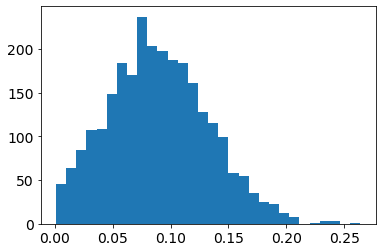

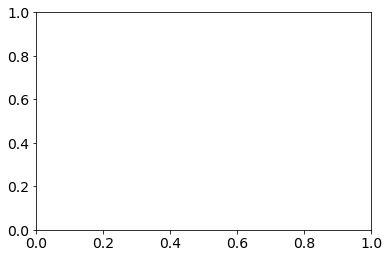

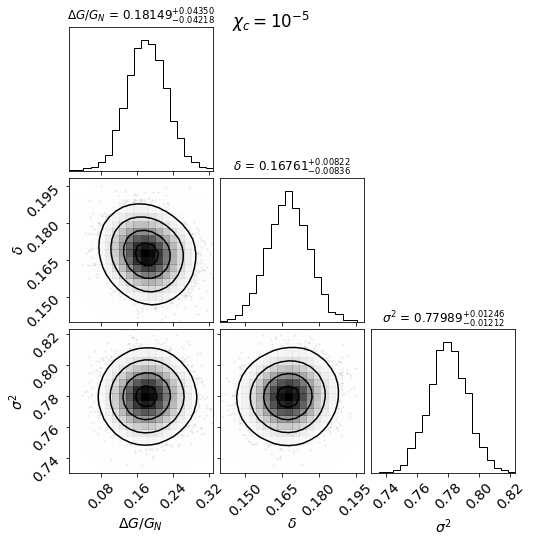

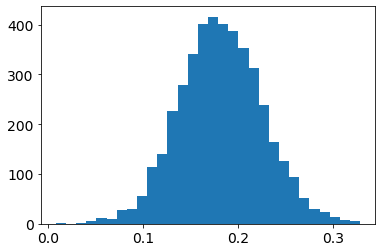

In [70]:
ind_hs = np.arange(0,20, 1)
chihstimes01 = [x*1e-1 for x in chi_hs(ind_hs).tolist()]                      
ind_hsf= ind_hs.tolist()

plateifu_f, _, pot_mid, _ = \
            potential_env('/home/ricardo/Documents/codes/NIRVANA/nsa_dist_ra_dec.txt',ind_hsf[0])

plateifu_f.remove('8611-12702')
indx, chihstimes01f, alpha1mul, alpha1errmullo95, alpha1errmullo,alpha1errmulhi,alpha1errmulhi95, con1,con1errlo95, con1errlo,con1errhi,con1errhi95, sigma1mul,sigma1errmullo95, sigma1errmullo,sigma1errmulhi,sigma1errmulhi95,listvdifflist_flat  = plot_env_hs(plateifu_f,chihstimes01)

In [16]:
indx

[2, 19]

In [12]:
data1 = np.column_stack([chihstimes01f, alpha1mul, alpha1errmullo95, alpha1errmullo,alpha1errmulhi,alpha1errmulhi95, con1,con1errlo95, con1errlo,con1errhi,con1errhi95, sigma1mul,sigma1errmullo95, sigma1errmullo,sigma1errmulhi,sigma1errmulhi95,listvdifflist_flat])  
datafile_path1 = f'Mod1Env01hilo.dat'
np.savetxt(datafile_path1 , data1, fmt= ['%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e'])

 59%|████████████████████████                 | 540/919 [00:15<00:16, 23.46it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:43<00:00, 21.01it/s]


Total number of points unscreened AD 4: 3
Total number of points screened AD 4: 14893
Total number of points unscreened AD 8: 3
Total number of points screened AD 8: 14893


100%|████████████████████████████████████| 20000/20000 [00:32<00:00, 606.84it/s]


chi= 5.859375000000002e-10
burn-in: 152
thin: 24
flat chain shape: 8330
flat log prob shape: 8270
None


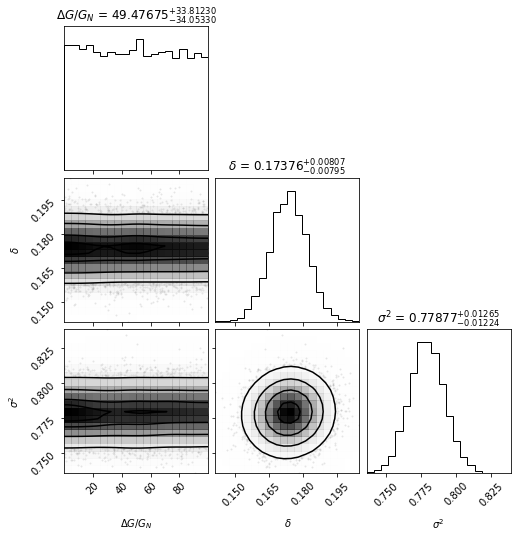

In [36]:
chil02 = (3/2)*10**(-8)*(0.2/0.32)**2*0.1
plateifu_f, _, pot_mid, _ = \
potential_env('/home/ricardo/Documents/codes/NIRVANA/nsa_dist_ra_dec.txt',22)
sampleA,_,lenv02= mcmc(chil02,plateifu_f,pot_mid,envsc=True).run_mcmc()
alphaA,alphaAlo95,alphaAlo,alphaAhi,alphaAhi95, conA,conAlo95,conAlo,conAhi,conAhi95, sigmaA,sigmaAlo95,sigmaAlo,sigmaAhi,sigmaAhi95=  mcmc(chil02,plateifu_f,pot_mid,envsc=True).plot_mcmc(sampleA)


  2%|▋                                        | 15/918 [00:00<00:06, 133.77it/s]

10001-6102 [8.519954271356784] [1.9112, 1.3772, 1.1998, 1.1399, 1.006, 0.7821, 0.6574, 0.6008, 0.4652, 0.3977, 0.2128, 0.2154, 0.1952, 0.1668, 0.1229, 0.0297]
10001-6102 8.519954271356784 2.301917400636109e-07 5.23174647058349e-10
10213-12705 [0.4507] [0.7131, 1.2102, 0.8768, 0.5195]
10213-12705 0.4507 2.0999344187793226e-07 5.377869136245806e-10
10213-1902 [1.0825577889447235] [-0.1654, 0.4571, 0.4925, 0.2877, 0.2336, 0.1217, 0.0701, 0.038, 0.0136]
10213-1902 1.0825577889447235 2.3054817911421784e-07 3.479870721149946e-10
10218-12701 [1.1688] [-0.6422, 1.2889, 1.6559, 1.7572, 1.5452, 1.3494, 1.2892, 1.2404, 1.3193, 1.2573, 1.1527, 1.4859]
10218-12701 1.1688 2.302765034122371e-07 4.601756559001625e-10
10218-12703 [0.2506] [335.7538, 465.4408]
10218-12703 0.2506 1.9705102789695718e-07 1.1443646137284753e-09
10218-3701 [1.9491] [-0.2731, -0.204, -0.1605, -0.0965, -0.1277, -0.1202, -0.1934, -0.2339, -0.1998, -0.2216, -0.1466, -0.1009, -0.1038, -0.1141, -0.1125, -0.1715, -0.4142, -0.333, -

  5%|██▏                                      | 48/918 [00:00<00:06, 142.74it/s]

10496-12704 [2.405591959798995] [35.741, 90.3295, 92.751, 65.1598, 135.5361, 136.2502, 268.8121, 253.915, 333.7881, 358.7629, 315.1183, 261.3063, 216.6964, 267.188, 258.5169, 256.0365, 248.4992]
10496-12704 2.405591959798995 2.326020574272773e-07 1.8607014240138285e-10
10496-12705 [1.1468] [-0.3879, -0.1399, 0.1719, 0.4444, 0.4904, 0.2805, 0.2146, 0.344, 0.3105, 0.2505]
10496-12705 1.1468 2.2613759694629044e-07 2.0984445125212167e-10
10498-12705 [0.4539] [2.2376, 1.8111, 0.8617, 0.4311, 0.299]
10498-12705 0.4539 1.2911191825638577e-07 9.439427821782336e-08
10499-3702 [0.3448] [-0.3822, -0.1753]
10499-3702 0.3448 2.226798027364297e-07 3.030357454678278e-10
10499-3704 [0.3576] [-0.7947, -0.4525, -0.3434, -0.2622]
10499-3704 0.3576 1.9955663342962004e-07 2.8045496313206083e-10
10500-12704 [0.5351] [140.7935, 35.4055, 16.1502, 8.7997, 6.1202]
10500-12704 0.5351 2.3410553190577967e-07 1.800395670921183e-10
10500-1901 [3.608682914572864] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0

  9%|███▊                                     | 84/918 [00:00<00:05, 150.03it/s]

10839-12705 [50] [0.5531, 0.4188, 0.6271, 0.6342, 0.4074, 0.3206, 0.1512, 0.1105, 0.1154, 0.1763, 0.2141, 0.3291, 0.2868, 0.1635, 0.0391, 0.4134, 0.1807]
10839-12705 50.0 0.0 6.489731364259424e-07
10839-3704 [0.449] [0.8005, 0.3556]
10839-3704 0.449 2.1025205608886412e-07 6.40018208757272e-10
10839-6101 [0.4516] [244.3098, 615.0842, 876.8345, 1563.8627, 1705.1968]
10839-6101 0.4516 2.1852446257260874e-07 3.14813146449644e-10
10839-9101 [3.1777668341708543] [2.1426, 2.2648, 0.9796, 0.8183, 0.5304, -0.0332, -0.1785, -0.3432, -0.3468, -0.4742, -0.4095, -0.6139, -0.5305, -0.616, -0.529, -0.5494, 0.8162, 3.2784]
10839-9101 3.1777668341708543 2.293014604170759e-07 2.821514912625846e-10
10841-12701 [6.418177386934674] [-0.7323, -0.6652, -0.4249, -0.3016, -0.2957, -0.3482, -0.374, -0.3905, -0.3944, -0.4309, -0.4302, -0.4504, -0.4708, -0.4257, -0.4725]
10841-12701 6.418177386934674 2.31254464232111e-07 4.500722535544866e-10
10842-3703 [2.8438140703517587] [-0.6099, -0.8101, -0.8807, -0.9171, -0

 11%|████▎                                   | 100/918 [00:00<00:06, 128.07it/s]

11013-3702 [5.43588944723618] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 5.43588944723618 2.322005011928312e-07 1.9110596811464865e-10
11013-6101 [23.60011055276382] [0.3389, -0.3422, -0.154, -0.2894, -0.4104, -0.4385, -0.4897, -0.4798, -0.43, -0.3971, -0.3753, -0.3775, -0.3376, -0.2419, -0.1243, 0.0068, -0.1557, 0.0318, -0.0178, 0.2532, 0.5345, 0.5099]
11013-6101 23.60011055276382 2.3055349817746605e-07 8.475650306025298e-10
11017-12703 [0.1539] [0.0185]
11017-12703 0.1539 2.0452610770382795e-07 2.5881173848411114e-10
11017-12704 [0.951] [0.4751, 0.4487, 0.3988, 0.2586, 0.0625, -0.0537, -0.0751, -0.1094]
11017-12704 0.951 2.3007719152560695e-07 2.6203345909886254e-10
11017-6103 [0.259] [-0.3235, -0.3265]
11017-6103 0.259 2.2933434329329594e-07 6.698288670032245e-10
11017-9101 [7.726595477386935] [-0.5273, 0.0425, 0.2188, 0.1666, 0.07, 0.0407, -0.0503, -0.1282, -0.2004, -0.2244, -0.1722, -0.1497, -0.0815, -0.0967, -0.1443, -0.1476, -0.1864, -0.1536, -0.2264

 14%|█████▌                                  | 127/918 [00:00<00:06, 118.75it/s]

11745-6104 [19.31621407035176] [11.543, 8.722, 5.345, 2.6912, 1.5511, 0.8527, 0.5703, 0.5078, 0.5176, 0.5143, 0.48, 0.4463, 0.4504, 0.4653, 0.4273, 0.4049]
11745-6104 19.31621407035176 1.0118977124717153e-07 1.3316956465683008e-07
11746-3703 [5.008469346733668] [-0.6285, -0.4045, -0.3035, -0.3091, -0.3183, -0.3232, -0.2308, -0.2233, -0.2585, -0.2411, -0.2169, -0.2327, -0.1823, -0.2379, -0.3017, -0.246, -0.3538, -0.3309]
11746-3703 5.008469346733668 2.2949130762520653e-07 4.2769180615941696e-10
11746-3704 [10.402076381909547] [21.5085, 17.8737, 12.5877, 7.4502, 5.3074, 3.8408, 3.099, 2.5184, 2.0537, 2.0419, 1.7971, 1.774, 1.5339, 1.4789, 1.6736, 1.4679, 1.2355, 1.5546, 1.8223]
11746-3704 10.402076381909547 2.3221800157254686e-07 2.300509176704838e-10
11746-9102 [11.19587135678392] [-0.478, -0.2133, -0.2528, -0.1774, -0.2077, -0.2266, -0.2099, -0.2691, -0.1996, -0.2114, -0.1249, -0.1799, -0.1765, -0.1376, -0.2784, -0.2323, -0.1941, -0.3005, -0.2047, -0.3235, -0.1159, 0.1709]
11746-9102 1

 15%|██████                                  | 140/918 [00:01<00:07, 105.69it/s]

11759-12705 [50] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 50.0 0.0 3.6893813665283766e-07
11760-6101 [0.4503] [0.4533, -0.0157, 0.5654, 0.502]
11760-6101 0.4503 2.1557840751912552e-07 2.3318814626283713e-09
11760-6103 [5.526126130653266] [-0.9132, -0.0844, -0.1101, -0.1688, -0.2615, -0.2266, -0.2497, -0.2747, -0.219, -0.2117, -0.2373, -0.2365, -0.2317, -0.3078, -0.2653, -0.3184, -0.2638]
11760-6103 5.526126130653266 2.3205787512478844e-07 3.990786367484192e-10
11760-9102 [0.6541] [-0.8049, -0.6427, -0.2931, -0.1213, 0.1899, 0.0235, 0.108]
11760-9102 0.6541 2.2870464404462473e-07 4.1268932009296173e-10
11761-12703 [1.1458] [0.4093, 0.08, -0.0588, -0.0478, 0.0006, -0.0009, -0.0617, -0.1284, -0.1046, -0.1135, -0.1247]
11761-12703 1.1458 2.2739386069455807e-07 2.6109526746382987e-09
11761-12704 [0.3551] [-0.1205, 0.9952, 0.5814, 0.2296]
11761-12704 0.3551 2.0314680410717287e-07 9.634478235721299e-10
11761-12705 [37.91881608040201

 18%|███████▏                                 | 161/918 [00:01<00:08, 86.05it/s]

11830-6104 [2.4391080402010052] [0.4376, 0.459, 0.175, -0.0435, -0.1413, -0.188, -0.2138, -0.2101, -0.1684, -0.0353, -0.2063, -0.258, -0.2347, -0.2692, -0.3985]
11830-6104 2.4391080402010052 2.3107534139746872e-07 3.956666354767251e-10
11831-6101 [0.2574] [-0.9875]
11831-6101 0.2574 2.1451040261582073e-07 2.527256719935252e-10
11831-6102 [8.012883417085428] [1.041, 0.6096, 0.4053, 0.165, 0.0902, 0.1922, 0.1873, 0.1187, 0.1055, 0.0085, -0.1108, -0.0737]
11831-6102 8.012883417085428 1.3193161695690914e-07 1.0146285301536339e-07
11833-9102 [6.738307537688443] [-0.6022, -0.4723, -0.3663, -0.2657, -0.2106, -0.2636, -0.2626, -0.2669, -0.2849, -0.2123, -0.2393, -0.2657, -0.2658, -0.2176, -0.1929, -0.2471, -0.3166]
11833-9102 6.738307537688443 2.3130127140514824e-07 6.63626026318815e-10
11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456

 19%|███████▉                                 | 179/918 [00:01<00:09, 80.57it/s]

11865-6102 [15.086203517587942] [2.7634, 3.331, 2.2799, 0.9665, 0.0228, 0.1522, 0.7163, 2.4375]
11865-6102 15.086203517587942 3.752501369184622e-08 1.965846121466697e-07
11865-9102 [0.2518] [-0.467, -0.4695, -0.4789]
11865-9102 0.2518 2.3123958085561885e-07 3.705537733098162e-10
11867-6104 [50] [-0.2903, -0.2283, -0.1275, 0.0009, 0.2771, 0.298, 0.3814, 0.3262, 0.2102, 0.3978, 0.4467, 0.2866, 0.1214, 0.2202, 0.1346, 0.4041]
11867-6104 50.0 0.0 5.747942301677933e-07
11867-9101 [0.2546] [0.9073]
11867-9101 0.2546 2.2920249219224315e-07 5.273192916293576e-10
11868-12703 [5.4629035175879395] [-0.9378, -0.944, -0.9571, -0.9649, -0.972, -0.9756, -0.9811, -0.9838, -0.9792, -0.9787, -0.9847]
11868-12703 5.4629035175879395 2.3237370864397613e-07 8.315782848513091e-10
11871-12701 [0.2502] [0.1902, 0.12]
11871-12701 0.2502 2.1718512334514043e-07 2.903912124437144e-09
11940-1902 [5.032189949748744] [-0.0835, 0.1518, 0.1321, 0.0182, -0.0843, -0.1452, -0.1779, -0.1993, -0.1955]
11940-1902 5.032189949

 20%|████████▍                                | 188/918 [00:01<00:09, 79.71it/s]

11945-12701 [0.1581] [0.3961, 0.2879]
11945-12701 0.1581 2.1723683302660176e-07 2.8598681428584967e-09
11945-6101 [0.1485] [0.2057]
11945-6101 0.1485 2.217593483932858e-07 2.2485200266248842e-09
11945-6102 [1.3408] [3.5224, 2.2109, 1.4349, 1.0152, 0.7457, 0.4864, 0.2556, 0.1192, 0.0508, 0.0117, -0.0209, -0.0683, -0.158]
11945-6102 1.3408 2.3024331987764723e-07 2.1750389069966423e-09
11947-6103 [5.767597989949748] [-0.3361, -0.1822, -0.1435, -0.1551, -0.2361, -0.2397, -0.2352, -0.2111, -0.2014, -0.1705, -0.1794, -0.161, -0.1864, -0.1515, -0.1415, -0.3064, -0.2327]
11947-6103 5.767597989949748 2.3253084371693162e-07 1.3285598695067181e-09
11949-12701 [0.3484] [1.1975, 0.3408, 0.1441]
11949-12701 0.3484 1.7837023953545015e-07 1.3136094377017769e-09
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 1.0319594443421343e-06
11954-12704 [14.619562814070353] [-0.4693, 0.083, 0.4235, 0.3

 22%|█████████▏                               | 205/918 [00:02<00:11, 62.36it/s]

11957-12704 [0.3519] [-0.3492, 0.7667, 0.6853, 0.5861]
11957-12704 0.3519 2.2564686815401715e-07 3.253222669934218e-10
11957-9101 [18.834186934673365] [127.5969, 337.5453, 692.0501, 754.6672, 761.8038, 673.5367, 561.8056, 470.5271, 446.8561, 434.7914, 434.701, 432.6297, 423.9362, 415.9254, 409.4146, 409.8788]
11957-9101 18.834186934673365 2.3192595202141788e-07 2.877558688948327e-10
11958-6103 [8.269469346733668] [-0.643, -0.5585, -0.4069, -0.1394, 0.0399, 0.079, -0.0368, -0.0614, -0.0955, -0.0503, 0.0676, 0.1469, -0.0344, -0.1111, -0.1507]
11958-6103 8.269469346733668 2.3158005492822275e-07 2.7074238478639174e-10
11960-12701 [5.341378894472362] [-0.3306, 0.3017, 0.1035, -0.0165, -0.0942, -0.168, -0.2112, -0.1506, -0.0692, -0.1068, -0.1178, -0.1991, -0.1522, -0.2286, -0.2089]
11960-12701 5.341378894472362 1.6676069286205152e-07 6.548753144646985e-08
11960-12704 [17.943502512562812] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 17.943502

 23%|█████████▍                               | 212/918 [00:02<00:11, 61.06it/s]

11970-6102 [4.306647236180905] [-0.0116, -0.0683, -0.0558, -0.0053, 0.0454, 0.025, 0.078, -0.0283, -0.085, -0.1052, -0.0602, -0.0272, -0.0693, -0.0116, -0.1378, -0.2799, -0.2497]
11970-6102 4.306647236180905 2.2888850463023312e-07 4.3818675896099483e-10
11970-6103 [10.050349246231157] [0.7466, 1.1751, 1.6643, 1.3977, 1.0416, 0.8262, 0.6871, 0.5199, 0.4194, 0.3266, 0.2718, 0.2909, 0.2357, 0.2575, 0.2139, 0.0837, -0.0144, -0.0619, 0.133]
11970-6103 10.050349246231157 2.3044770793300152e-07 2.3193347234993206e-09
11974-12702 [3.5593507537688445] [-0.5341, -0.4596, -0.3852, -0.2683, -0.2117, -0.2349, -0.22, -0.1969, -0.1731, -0.1829, -0.2133, -0.2538, -0.2357, -0.256, -0.1504, -0.1437, -0.1349, 1.1183]
11974-12702 3.5593507537688445 2.302798292162521e-07 2.796115197532502e-10
11975-12701 [0.157] [-0.1741, -0.13]
11975-12701 0.157 2.1765389286594278e-07 1.4602957121589158e-10
11975-12705 [0.5507] [0.6902, 0.7621, 0.3208, 0.2527, 0.3317]
11975-12705 0.5507 2.284280459798147e-07 1.81115137534

 25%|██████████▏                              | 227/918 [00:02<00:10, 64.47it/s]

11979-9102 [1.147] [0.6334, -0.323, -0.1351, -0.0857, 0.0053, 0.0302, 0.0467, 0.0752, 0.0566, 0.0459, 0.0116]
11979-9102 1.147 2.2706384110362356e-07 2.234902081511334e-10
11981-12704 [3.4636381909547733] [-0.6988, -0.1982, 0.0828, 0.3163, 0.2942, 0.1553, 0.0407, -0.0319, -0.1066, -0.1369, -0.1233, -0.1235, -0.1477, -0.157, -0.1891, -0.2598, -0.2964, -0.4916]
11981-12704 3.4636381909547733 2.2997850762166181e-07 3.519512889035046e-10
11981-9102 [0.849] [-0.2024, 0.1075, 0.0766, 0.0095, -0.0533, -0.0919, -0.1146, -0.1188]
11981-9102 0.849 2.259078343058733e-07 3.028242358558839e-10
11982-3703 [0.4457] [-0.314, 0.4086, 0.6273, 0.7714]
11982-3703 0.4457 2.2855490565397717e-07 4.758143108776912e-10
11982-9102 [9.08338894472362] [-0.6167, -0.1298, 0.3235, 1.2078, 1.1438, 0.8069, 0.6394, 0.4963, 0.4228, 0.3252, 0.3069, 0.2838, 0.3393, 0.4905, 0.4567, 0.2311]
11982-9102 9.08338894472362 2.3226008958864332e-07 7.648826150619613e-10
11984-12701 [0.4516] [-0.2857, -0.1737, 0.0157, 0.0372, -0.128

 26%|██████████▊                              | 241/918 [00:02<00:11, 61.14it/s]

12068-6104 [0.9528] [0.4721, 0.5142, 0.2822, 0.1716, 0.0427, -0.0618, -0.0893, -0.0941, -0.1071]
12068-6104 0.9528 2.2745387525983298e-07 2.895123402899957e-10
12069-12704 [19.738890452261305] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 19.738890452261305 2.3377552287599642e-07 2.2871651238412762e-10
12069-6102 [4.051646231155779] [-0.3102, -0.0764, -0.2402, -0.1833, -0.1952, -0.2158, -0.2095, -0.1861, -0.144, -0.1353, -0.1037, -0.1026, -0.0816, -0.0956, -0.1367, -0.1477, -0.0871, -0.0667, -0.0387, -0.58, -0.56, -0.5359, -0.8946, 0.038]
12069-6102 4.051646231155779 2.327950419413343e-07 8.768951337379768e-10
12075-12704 [6.9209226130653265] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 6.9209226130653265 2.3282235786485716e-07 2.368027109814643e-10
12078-12703 [0.1544] [0.3298]
12078-12703 0.1544 2.2214864908498907e-07 4.416774024405381e-10
12078-6103 [0.2508] [1.96

 28%|███████████▍                             | 257/918 [00:02<00:09, 66.51it/s]

12081-6102 [3.8075628140703515] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 3.8075628140703515 2.3291682422887925e-07 3.168693040522632e-10
12082-12702 [0.4523] [52.4225, 34.225, 22.353, 15.87]
12082-12702 0.4523 2.204225460805706e-07 3.6248081029452894e-10
12084-12702 [0.1415] [0.4179]
12084-12702 0.1415 2.321255589801035e-07 2.5446776183679917e-10
12084-12705 [2.6957969849246233] [-0.0562, -0.0267, 0.0266, 0.0387, 0.1208, 0.0672, -0.1917, -0.2071, -0.0439, -0.1157, -0.1657, -0.1678, -0.4845]
12084-12705 2.6957969849246233 2.3132733754907145e-07 5.332471831623662e-10
12084-1901 [6.463565829145729] [0.3322, -0.119, 0.4619, 0.2815, 0.3734, 0.419, 0.387, 0.4139, 0.5272, 0.4564, 0.6029, 0.4957, 0.5971, 0.6267, 0.5749, 0.7061, 0.6081, 0.5243, 0.4383, 0.5097, 0.4647, 0.2768, 0.3996, 0.231, 0.2274, 0.4698, 0.2204, 0.2727]
12084-1901 6.463565829145729 2.3062457724391602e-07 1.4106483005775859e-09
1208

 30%|████████████                             | 271/918 [00:03<00:10, 62.95it/s]

12089-1901 [3.7403798994974875] [-0.3811, -0.5148, -0.604, -0.6386, -0.6368, -0.6477, -0.6527, -0.6742, -0.6542, -0.6421]
12089-1901 3.7403798994974875 2.3400674428234007e-07 2.6318722198362845e-10
12089-6103 [0.7643] [-0.1702, -0.3833, -0.2811, -0.1733, -0.2056]
12089-6103 0.7643 2.2626750124351275e-07 3.417410504185732e-10
12092-6101 [0.7499] [0.0026, 0.3918, 0.1405, 0.0977, 0.005, 0.0277, 0.1281, 0.0885]
12092-6101 0.7499 2.3277675781959756e-07 3.186062859701412e-10
12094-3701 [50] [9.3093, 53.5743, 47.4822, 54.512, 49.564, 45.3185, 44.0956, 41.4862, 40.9064, 40.0677, 39.5836, 40.4106, 39.3101, 37.4365, 38.9587, 41.7447, 41.525, 40.104, 39.0721, 39.6893, 56.2685, 25.7726, 27.1981, 33.78]
12094-3701 50.0 0.0 3.3556957664119455e-07
12483-12702 [13.707842211055278] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 13.707842211055278 2.340846931733678e-07 2.091715766727281e-10
12483-12703 [0.6537] [0.1145, 0.0856, -0.0158, -0.1673, -0.1536, -0.1191]
124

 31%|████████████▊                            | 286/918 [00:03<00:10, 61.52it/s]

12490-3701 [7.302665326633166] [-0.1836, -0.3012, -0.2197, -0.1747, -0.1849, -0.1667, -0.3216, -0.4029, -0.3964, -0.5222, -0.4681, -0.5296, -0.4634, -0.5043, -0.5944, -0.2662]
12490-3701 7.302665326633166 2.3132617470739982e-07 6.642338593395657e-10
12506-12701 [48.302239698492464] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0.0863]
12506-12701 48.302239698492464 5.790408332278138e-09 2.279188159211064e-07
12510-6104 [2.2451211055276383] [-0.3912, -0.501, -0.3509, -0.2112, -0.0823, -0.1766, -0.1956, -0.2223, -0.1924, -0.1619, -0.0906, -0.078, -0.103, -0.0426, -0.1109, -0.1181, -0.0085, -0.0516]
12510-6104 2.2451211055276383 2.3230130828476222e-07 5.717817374522766e-10
12510-9102 [0.4524] [2.627, 1.7817, 1.0999, 0.6008, 0.3749]
12510-9102 0.4524 2.0529649646143206e-07 2.520816947814769e-10
12512-12702 [0.6506] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855, -0.9855]
12512-12702 0.6506 1.292

 33%|█████████████▍                           | 302/918 [00:03<00:09, 66.95it/s]

12621-12705 [0.1581] [0.6225, -0.0315]
12621-12705 0.1581 2.251892050768222e-07 6.518731751337238e-10
12621-6103 [2.890365829145728] [-0.2837, -0.3596, -0.2302, -0.1035, -0.0932, -0.0901, -0.0556, -0.0909, -0.0483, -0.1037, -0.0449, -0.1314, -0.1487, -0.1828, -0.1964, -0.1775, -0.1915, -0.151, -0.1927, -0.1924, -0.4438]
12621-6103 2.890365829145728 2.2709922860769478e-07 4.356936897536657e-10
12651-12705 [0.3507] [0.3171, 0.3345, 0.2886]
12651-12705 0.3507 2.2124579521221515e-07 2.977119655287297e-09
12652-9102 [8.019813065326634] [18.7805, 15.9577, 8.2403, 2.7447, 1.0673, 0.4733, 0.1411, -0.0452, -0.0875, -0.1836, -0.1987, -0.1639, -0.1027, 0.0031, -0.0351]
12652-9102 8.019813065326634 2.3306627762272356e-07 4.6491200422986413e-10
12667-12705 [1.564921608040201] [161.5787, 143.7453, 135.4414, 187.763, 262.3226, 295.7175, 305.8564, 292.5588, 306.6476, 290.9818, 300.1123, 276.4019, 209.7986]
12667-12705 1.564921608040201 2.255050856172074e-07 8.944532367873694e-10
12667-6103 [4.16588542

 34%|█████████████▊                           | 309/918 [00:03<00:09, 61.71it/s]

0.0 3.0172387036843317e-07
7443-6102 [0.1704] [-0.2737, 0.4709]
7443-6102 0.1704 2.2930565067099888e-07 3.012240754019569e-10
7495-12702 [8.844727638190955] [0.4595, -0.0101, -0.0769, -0.0221, 0.0724, 0.0551, 0.0507, 0.0291, 0.0122, -0.0411, -0.0727, -0.1269]
7495-12702 8.844727638190955 2.3085402177235819e-07 5.24550251993886e-10
7495-12703 [0.2529] [0.0167, 0.1583, 0.2444]
7495-12703 0.2529 2.0604153163946642e-07 2.1820916629043716e-09
7495-12704 [50] [1.5872, 1.0076, 0.3716, 0.1591, 0.0581, 0.0524, 0.0611, 0.0372, -0.0077, -0.0344, -0.0318, -0.0435, -0.0536, 0.008, 0.0752, 0.1801]
7495-12704 50.0 0.0 3.8829388395841433e-07
7815-12705 [0.6506] [0.8063, -0.0868, 0.1385, 0.3168, 0.3937, 0.2955]
7815-12705 0.6506 2.2970561577573018e-07 3.085081773665067e-10
7815-3702 [3.114356783919598] [-0.9404, -0.6112, -0.1971, -0.1195, -0.0131, 0.2759, 0.3852, 0.3081, 0.3503, 0.4221, 0.422, 0.4662, 0.4796, 0.4777, 0.3852, 0.4157, 0.4386, 0.3494, 0.5057, 0.6163, 0.448, 0.496]
7815-3702 3.114356783919

 35%|██████████████▍                          | 323/918 [00:04<00:11, 50.69it/s]

7958-6101 [0.8489] [1.3322, 1.3156, 1.2265, 1.0723, 0.6262, 0.3801, 0.2963]
7958-6101 0.8489 2.3043034573394816e-07 1.6840662021341932e-10
7959-12702 [6.789700502512563] [-0.8581, -0.7931, -0.8046, -0.7645, -0.6782, -0.602, -0.5437, -0.4716, -0.4724, -0.4077, -0.4305, -0.5049]
7959-12702 6.789700502512563 2.3347635474079522e-07 6.645036946974865e-10
7959-12704 [8.710417085427135] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 8.710417085427135 2.3306036533582188e-07 7.084773819355103e-10
7959-12705 [2.0167713567839196] [-0.1177, 0.1666, 0.6351, 0.4525, 0.2281, -0.0112, -0.0991, -0.1015, -0.1309, -0.1476, -0.0827]
7959-12705 2.0167713567839196 2.2769446275095875e-07 1.3437735547765128e-09
7959-6102 [11.697688442211057] [-0.5705, 0.377, 0.3456, 0.6633, 0.9785, 0.8276, 0.6661, 0.3218, 0.1867, 0.3714, -0.2111, 0.4949]
7959-6102 11.697688442211057 2.2970971472875864e-07 1.7768040

 36%|██████████████▉                          | 334/918 [00:04<00:12, 47.51it/s]

7961-3702 [1.0454] [-0.7823, -0.438, -0.4694, -0.5336, -0.4257, -0.4631, -0.4165, -0.3571, -0.3549]
7961-3702 1.0454 2.3371429673245352e-07 5.900536483684052e-10
7962-12703 [13.644748743718592] [-0.229, -0.2113, -0.2172, -0.2992, -0.3659, -0.3023, -0.1663, -0.1701, -0.1117, -0.1435, -0.1749, -0.1878, -0.2116, -0.0818, -0.0597]
7962-12703 13.644748743718592 2.307277498682041e-07 2.8169206922134396e-09
7962-12705 [0.6442] [1.1708, 0.7694, 1.4212, 1.0064, 0.9071]
7962-12705 0.6442 2.2128743227067072e-07 1.60203544274741e-09
7962-6104 [0.7521] [1.0945, 1.5878, 0.7446, 0.3076, 0.4445]
7962-6104 0.7521 2.269931222918757e-07 1.0986990525315526e-09
7963-12702 [0.8453] [-0.992, -0.9988, -0.9992, -0.9991, -0.9993, -0.9993, -0.9992, -0.9991]
7963-12702 0.8453 2.2907253301874137e-07 4.0885518524674925e-10
7963-1902 [0.3637] [-0.2846, 0.1036]
7963-1902 0.3637 2.0846114313463892e-07 3.060044202967845e-10
7963-9102 [0.2445] [-0.1544, 0.8304]
7963-9102 0.2445 2.3355821094424705e-07 3.0939941626985523e

 37%|███████████████▎                         | 344/918 [00:04<00:12, 45.73it/s]

7965-1902 [0.7579] [-0.8573, -0.8754, -0.9294, -0.9358, -0.9675, -0.9776]
7965-1902 0.7579 2.3142650972653e-07 4.691856923603605e-10
7965-9102 [0.5424] [-0.9714, -0.9985, -0.9944]
7965-9102 0.5424 2.2509990650162046e-07 4.0238805491830745e-10
7968-12702 [0.157] [0.1323, 0.2202]
7968-12702 0.157 2.185251080640486e-07 3.5231055129885003e-10
7968-6101 [8.64282864321608] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 8.64282864321608 2.3076755023337028e-07 3.761168151758433e-10
7972-3704 [3.477774874371859] [1928.8896, 2727.1153, 1804.4012, 2041.0635, 1659.7658, 1834.383, 1638.6283, 1409.7717, 148.9794]
7972-3704 3.477774874371859 2.3336045755240808e-07 2.881825566890603e-10
7977-12705 [13.855520100502511] [0.9368, 0.902, 0.52, 0.3438, 0.27, 0.1787, 0.1794, 0.0553, 0.0017, -0.1278, -0.1955, -0.1997, -0.1958, -0.2075, -0.2354, -0.209, -0.2223, -0.2564]
7977-12705 13.855520100502511 2.3256259382548374e-07 1.5162454827

 38%|███████████████▌                         | 349/918 [00:04<00:13, 43.46it/s]

7977-1902 [0.354] [0.1072, 0.2856, 0.0387]
7977-1902 0.354 2.106825201819428e-07 1.8622290192179931e-10
7977-3704 [5.98997135678392] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 5.98997135678392 2.2987492457935937e-07 7.417681983694937e-10
7978-12704 [0.2525] [0.0137]
7978-12704 0.2525 1.2043340154043513e-07 1.0285292571944404e-07
7979-12701 [50] [41.2486, 22.8214, 15.6382, 10.0088, 6.7649, 4.9612, 3.7861, 4.1689, 3.3152, 3.3606, 4.122, 4.1114, 4.3399, 5.0325, 5.2136, 5.5231]
7979-12701 50.0 0.0 5.001362460146063e-07
7991-12701 [0.4519] [1.6295, -0.0089, -0.0016, 0.0287]
7991-12701 0.4519 1.890390220732634e-07 7.511117051896539e-10


 39%|████████████████                         | 359/918 [00:05<00:14, 39.27it/s]

7992-1902 [10.226974874371859] [-0.158, -0.2259, -0.2618, -0.4015, -0.3313, -0.1119]
7992-1902 10.226974874371859 2.3174587819662882e-07 3.1409789797763096e-10
7992-6104 [0.3485] [-0.0911, -0.6087, -0.6399]
7992-6104 0.3485 2.306157212265283e-07 3.1797515668739235e-10
8075-12701 [0.3497] [1.4106, 0.8869, 0.4531]
8075-12701 0.3497 2.213011163229506e-07 2.2893567817895842e-10
8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 9.441401573895607e-07
8077-6103 [12.00339447236181] [0.2429, 0.2231, 0.4339, 0.4358, 0.3431, 0.2655, 0.2555, 0.1346, 0.1731, 0.0708, 0.0007, 0.0149, -0.0914, -0.0582, -0.0621, -0.1633, -0.258, -0.0619, -0.246, -0.1657]
8077-6103 12.00339447236181 6.979708407750657e-08 1.6412911585192524e-07
8078-12701 [0.5504] [-0.0954, 0.1951, 0.2936, 0.1874, 0.0764, 0.0726]
8078-12701 0.5504 2.0458653358797213e-07 2.5494293425732896e-10


 40%|████████████████▍                        | 367/918 [00:05<00:14, 37.85it/s]

8078-12703 [9.076972864321608] [1.675, 0.8928, 0.8447, 0.5026, 0.0661, -0.1197, -0.1043, -0.1003, -0.0781, -0.0416, -0.0163, -0.0181, -0.0308, -0.0445, -0.0294, 0.0394]
8078-12703 9.076972864321608 2.3193718881517867e-07 4.269573753007606e-10
8078-6103 [0.4518] [0.6747, 0.2703, 0.4933, 0.397]
8078-6103 0.4518 2.2194920545790776e-07 2.416382545580226e-10
8079-12704 [5.219677386934673] [0.5849, 1.2413, 1.4611, 0.9649, 0.4831, 0.205, -0.0227, -0.1243, -0.017, -0.0544, -0.1105]
8079-12704 5.219677386934673 2.3047178543280045e-07 3.232928650469845e-10
8080-6104 [0.4513] [0.8623, 1.0014, 0.6037, 0.4254]
8080-6104 0.4513 2.2264643379521298e-07 8.184098920200555e-10
8082-9102 [5.006132663316583] [616.4539, 898.588, 1118.0383, 1245.275, 1202.6077, 1313.5797, 1493.8345, 1477.6917, 1503.4215, 1558.3496, 1565.8178, 1736.9517, 1710.1579, 1705.2537, 1868.9426, 1522.7181, 1602.5816, 1933.8308]
8082-9102 5.006132663316583 2.2982719427492164e-07 6.406742512319625e-10
8083-12703 [50] [0.7937, 11.6869, 2

 41%|████████████████▋                        | 375/918 [00:05<00:16, 32.07it/s]

8083-12704 [0.4496] [0.2913, 0.5243, 0.3002, 0.1297]
8083-12704 0.4496 2.3346591659179656e-07 3.505806646064698e-10
8083-12705 [16.292492462311557] [0.0199, 0.7356, 0.6797, 0.4171, 0.2558, 0.0531, -0.072, -0.0763, -0.0227, -0.0446, -0.1079]
8083-12705 16.292492462311557 3.690847832281355e-08 1.9741860101352104e-07
8084-6101 [0.3524] [-0.7573, -0.7551, -0.7763, -0.7025]
8084-6101 0.3524 2.1339441128609313e-07 1.682770810121986e-09
8085-12701 [4.603662311557789] [-0.561, -0.2571, -0.3239, -0.174, 0.0539, 0.1642, 0.1749, -0.0341, -0.0541, -0.0065, 0.0293, -0.0634, -0.1666, 0.0072, -0.0035]
8085-12701 4.603662311557789 2.3062026148298298e-07 9.186409903235585e-10
8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 9.593270049851372e-07


 41%|████████████████▉                        | 379/918 [00:05<00:17, 31.57it/s]

8088-12705 [0.4533] [-0.3463, 0.227, 0.3794, 0.8027]
8088-12705 0.4533 2.172432560156228e-07 1.6254200403033683e-10
8091-12701 [5.194243216080402] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 5.194243216080402 2.2980128850573666e-07 2.5355589380373266e-10
8091-1902 [10.553139195979899] [-0.6003, -0.5042, -0.5743, -0.4777, -0.4322, -0.4224, -0.3965, -0.3415, -0.3217, -0.3329, -0.2747, -0.384]
8091-1902 10.553139195979899 2.3193261071907693e-07 2.278184170883332e-10
8092-12702 [9.333674371859296] [-0.9407, 0.0469, 0.1291, 0.118, 0.1342, 0.0877, 0.0644, -0.0741, -0.1409, -0.1159, -0.2009, -0.1786, -0.2955, -0.4228, -0.4676, -0.5471, -0.5697, -0.6224, -0.6223, -0.6828, -0.7995, -0.6084]
8092-12702 9.333674371859296 2.323469040394086e-07 3.5958749473779626e-10
8095-1902 [0.3436] [1.5996, 0.933, 1.1818]
8095-1902 0.3436 2.2043800551514278e-07 2.944473296185956e-10
8095-6102 [0.5501] [0.2528, 0.6748, 0.586]
8095-6102 0.55

 42%|█████████████████▎                       | 387/918 [00:05<00:16, 33.10it/s]

8132-12702 [0.1547] [-0.0491]
8132-12702 0.1547 2.131949053502347e-07 2.891521128072e-10
8132-6102 [1.0439] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758]
8132-6102 1.0439 2.2846058783967613e-07 1.9372400992494262e-10
8134-12702 [10.710673366834172] [0.858, 0.5781, 0.2275, 0.1759, 0.1539, 0.0946, 0.0185, 0.0302, 0.073, 0.078, 0.0285, 0.1105]
8134-12702 10.710673366834172 8.477201287792488e-08 1.489199254031622e-07
8134-9102 [11.456815577889447] [5.3067, 6.8977, 5.956, 3.9091, 2.5042, 1.4525, 0.558, 0.1976, 0.0933, -0.0367, -0.0936, -0.1122]
8134-9102 11.456815577889447 2.3205214972484228e-07 6.880257461783252e-10
8135-12702 [0.2615] [-0.0587, -0.0535, 0.1564]
8135-12702 0.2615 2.2105465456386118e-07 1.933057444002932e-10
8137-12703 [0.8532] [-0.5888, -0.2153, 0.2705, 0.2204, 0.0761, 0.0388, 0.0287, 0.0263, 0.0106]
8137-12703 0.8532 2.320589708359425e-07 2.902469535147427e-10


 43%|█████████████████▋                       | 395/918 [00:06<00:16, 32.48it/s]

8137-9102 [3.141386934673367] [2.6753, 2.6683, 2.2404, 1.8795, 1.3493, 0.8108, 0.3239, 0.2816, 0.1304, 0.0676, -0.0126, -0.0616, -0.0034, 0.0687, -0.1748]
8137-9102 3.141386934673367 2.2835930982820112e-07 3.453661823814895e-10
8138-12702 [0.7567] [1.4709, 2.742, 2.9584, 1.9455, 1.8295, 1.8894, 1.5401]
8138-12702 0.7567 2.1128986722660757e-07 4.0140094445244076e-10
8138-9101 [3.7241155778894477] [0.1634, 0.0839, 0.1091, -0.025, -0.0679, -0.06, -0.0892, -0.084, -0.0872, -0.1027, -0.1168, -0.1261, -0.125, -0.1971, -0.2289, -0.2438]
8138-9101 3.7241155778894477 2.2821949384141881e-07 8.241482105629313e-10
8139-12705 [0.1537] [0.0464]
8139-12705 0.1537 2.169016728116939e-07 3.122411228198275e-10
8140-12703 [50] [6.4874, 3.6588, 1.6108, 0.8371, 0.4098, 0.2252, 0.1898, 0.1619, 0.1822, 0.2307, 0.2251, 0.3093, 0.2693]
8140-12703 50.0 0.0 2.6925066834819374e-07
8140-3701 [0.1584] [0.1364]
8140-3701 0.1584 2.2115038595324536e-07 2.0693501363803015e-10
8141-12702 [0.9531] [1.3913, 1.2602, 1.0494,

 44%|██████████████████                       | 404/918 [00:06<00:14, 36.52it/s]

8144-12702 [0.3514] [-0.2439, -0.0687]
8144-12702 0.3514 2.1047940787924562e-07 1.7444620660566045e-10
8144-12703 [6.250773869346734] [-0.3881, 0.3972, 0.5782, 0.3818, 0.2364, 0.1625, 0.0874, 0.0593, 0.0733, 0.0853, 0.1148, 0.1196, 0.0072, -0.0635, -0.0274, -0.03, -0.1671]
8144-12703 6.250773869346734 2.3277622848449864e-07 2.603091355841542e-10
8144-3701 [6.429326633165829] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143, 3.7728, 3.6283, 3.803, 3.9059, 3.8265, 3.9298, 4.0721, 3.4469, 3.6696, 2.8057]
8144-3701 6.429326633165829 2.3321420018564625e-07 1.930854372630337e-10
8145-12701 [12.032165829145729] [5.2675, 207.9251, 801.2075, 1291.7969, 1657.6052, 1751.0665, 1847.6904, 2009.1977, 1566.736, 1465.5334, 1950.5489, 2064.4735, 2480.611]
8145-12701 12.032165829145729 1.4631818266263125e-07 8.626514368026406e-08
8145-1901 [3.0905256281407034] [1.1, 0.7709, 0.3702, 0.2138, 0.0914, 0.0208, -0.0132, -0.0168, -0.008, 0.0043, -0.0164, -0.0243, 0.0037, -0.044, 0.1236, 0.0056]


 45%|██████████████████▍                      | 412/918 [00:06<00:14, 36.00it/s]

8146-9102 [6.034818090452261] [-0.6867, 1.8543, 1.6879, 1.3848, 1.0796, 0.7625, 0.5018, 0.3048, 0.1113, -0.01, -0.0785, -0.1134, -0.2078, -0.0726, -0.2092, 0.1549, -0.0608, -0.0117, 1.8386, 1.0716, -0.4392]
8146-9102 6.034818090452261 2.31063980901262e-07 3.8248786406138817e-10
8147-9101 [1.0477] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034]
8147-9101 1.0477 9.575159020211571e-08 1.2848741447843848e-07
8149-12702 [0.1718] [2.5828]
8149-12702 0.1718 2.136997324802823e-07 1.7015901778174898e-09
8149-3704 [0.1515] [-0.2715]
8149-3704 0.1515 2.2822269266954967e-07 4.3129578116585903e-10
8150-6101 [0.4461] [-0.8707, 1.0448, 1.2004, 1.1096]
8150-6101 0.4461 2.2322122862461032e-07 1.4074851453900812e-10
8152-3703 [2.1830994974874374] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 2.1830994974874374 2.3099822847154882e-07 1.9528090541085065e-10


 46%|██████████████████▊                      | 420/918 [00:06<00:14, 34.68it/s]

8153-6102 [0.452] [0.0752, 0.1348, 0.157, 0.0584]
8153-6102 0.452 1.8605873195609478e-07 3.3070496866144734e-08
8154-9102 [0.2517] [-0.2704, -0.1266]
8154-9102 0.2517 2.2438386222184215e-07 3.120668448180468e-09
8155-12701 [0.1548] [0.6082]
8155-12701 0.1548 2.1591363068852586e-07 1.0663866265610729e-09


 47%|███████████████████                      | 428/918 [00:07<00:15, 32.42it/s]

8158-6104 [11.50464824120603] [2853.3584, 2772.0539, 2567.65, 2104.9326, 1884.2854, 1814.6475, 1934.6961, 2047.3869, 2057.6159, 1976.8674, 1762.3581, 1652.8137, 1688.9499, 1465.8921, 1225.624, 822.2837, 838.4006, 422.5365, 779.4475, 1384.2793, 423.2599, 1183.1803, 812.3639]
8158-6104 11.50464824120603 2.319689933987708e-07 2.0956480133396683e-10
8241-6102 [2.6687577889447236] [8.239, 3.1722, 1.1043, -0.048, -0.2765, -0.433, -0.4837, -0.5334, -0.5488, -0.5859, -0.596, -0.6104, -0.5885, -0.5893, -0.5832, -0.5824, -0.6078, -0.585, -0.5254]
8241-6102 2.6687577889447236 2.3252471137776426e-07 2.5714077589057066e-10
8243-12701 [7.454726633165829] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 7.454726633165829 2.3329439050124695e-07 3.77399134630035e-10


 47%|███████████████████▎                     | 432/918 [00:07<00:15, 31.12it/s]

8244-9101 [5.274130653266331] [-0.7053, -0.4294, 0.2239, 0.5483, 0.7896, 0.7839, 0.6984, 0.6211, 0.5139, 0.5719, 0.5474, 0.3915, 0.3057, 0.4151, 0.5799, 0.7815]
8244-9101 5.274130653266331 2.3113145872769834e-07 2.473659507765931e-10
8245-12701 [0.3482] [-0.2783, -0.3221, -0.3382]
8245-12701 0.3482 2.173680989388944e-07 1.31535360679081e-10
8245-12703 [11.032361809045227] [-0.1214, 0.3079, 0.212, 0.0523, -0.0511, -0.0402, -0.0248, -0.0749, -0.1145, -0.1366, -0.1372, -0.0643, -0.0562, -0.1061, -0.2031, -0.3154]
8245-12703 11.032361809045227 1.4451989340139264e-07 8.942671547845631e-08
8247-12702 [0.3567] [-0.4561, 0.4256, 0.4354]
8247-12702 0.3567 2.194691802777177e-07 1.8733994569356257e-10
8247-12703 [0.7372] [0.0623, -0.1697, 0.0076, 0.1061, 0.1748, 0.0852, 0.0198]
8247-12703 0.7372 2.134222809209385e-07 1.9017142028120097e-10


 48%|███████████████████▋                     | 440/918 [00:07<00:16, 28.94it/s]

8248-12701 [50] [707.8158, 630.4416, 977.0903, 936.3511, 892.6299, 1308.8807, 1600.2998, 1595.4501, 1320.9281, 1254.0149, 1837.1392, 1899.7801, 2506.6682, 2814.69, 1954.3222, 2246.1066, 1731.0676, 1875.7497, 1583.6158, 1841.3166, 477.0393]
8248-12701 50.0 0.0 3.2668631340976695e-07
8248-12702 [0.354] [0.6083, 0.1061, 0.0378, 0.0661]
8248-12702 0.354 2.220323810626027e-07 4.2017573650787236e-10
8248-12704 [0.5489] [-0.5413, 0.0056, 0.3726, 0.2581, 0.1076]
8248-12704 0.5489 2.0766327346353958e-07 1.9761027839532876e-10
8249-12704 [0.4516] [2.5732, 2.4478, 1.1752, 0.7709]
8249-12704 0.4516 2.0702035520205045e-07 4.530751052412239e-10
8249-6101 [0.16] [-0.9941, -0.9963]
8249-6101 0.16 2.1927587778566317e-07 7.979067517242676e-10
8250-12704 [0.748] [-0.9942, -0.9925, -0.9895, -0.9916, -0.9845, -0.9805, -0.9817]
8250-12704 0.748 2.2308845181948104e-07 2.7046170405683906e-10


 49%|████████████████████                     | 448/918 [00:07<00:16, 29.29it/s]

8250-6101 [0.4629] [362.133, 366.1035, 657.5612, 1037.8147, 1289.0409]
8250-6101 0.4629 2.3250587784250916e-07 1.2334930305687869e-09
8252-12705 [0.5494] [-0.1167, -0.3709, -0.2017, -0.2101, -0.2373]
8252-12705 0.5494 1.2658579058644837e-07 9.428157306282766e-08
8252-6102 [0.2534] [0.4546, 0.477]
8252-6102 0.2534 2.1250270099364763e-07 2.1255882956132823e-09
8252-6103 [9.737826130653268] [-0.2615, -0.022, 0.2994, 0.3239, 0.4609, 0.497, 0.3452, 0.192, 0.0533, -0.156, -0.2839, -0.3679, -0.3831, -0.4686, -0.4163, -0.3764, -0.2115, -0.4796]
8252-6103 9.737826130653268 2.3072414378707875e-07 8.213584888650944e-10
8252-6104 [0.4463] [2.1127, 786.7076, 1821.9152, 1629.0467]
8252-6104 0.4463 2.141342791428687e-07 1.853592228788456e-10


 49%|████████████████████▎                    | 454/918 [00:08<00:16, 28.66it/s]

8254-12703 [4.537390954773869] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 4.537390954773869 6.83770814445986e-08 1.6573676208511607e-07
8254-3704 [0.5521] [0.0761, -0.2895, -0.0043, 0.0636, 0.0289]
8254-3704 0.5521 2.1837177045305943e-07 4.0299632894804747e-10
8255-12701 [0.1542] [-0.5155]
8255-12701 0.1542 2.25229763155597e-07 1.8222262560545635e-10
8257-6101 [0.2529] [0.5669, 1.2952]
8257-6101 0.2529 2.2332343578677853e-07 1.945877157729126e-10


 50%|████████████████████▌                    | 461/918 [00:08<00:15, 28.78it/s]

8257-9102 [14.903369346733669] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 14.903369346733669 2.3225643369536963e-07 2.509853312306591e-10
8258-9101 [0.6524] [0.2855, -0.9936, -0.9959, -0.9964, -0.9977, -0.998, -0.9979]
8258-9101 0.6524 2.301906199383044e-07 7.330312507939334e-10
8261-12705 [0.3497] [-0.3323, 0.2356, 0.4194]
8261-12705 0.3497 2.2803024706982459e-07 2.973822137000945e-10


 51%|████████████████████▊                    | 467/918 [00:08<00:16, 27.29it/s]

8262-3702 [0.2417] [-0.7353, -0.9894]
8262-3702 0.2417 1.098051723433977e-07 1.1656402087362477e-07
8262-9101 [1.7397] [4.1564, 3.5541, 2.1157, 1.5869, 1.1344, 0.5899, 0.3732, 0.2784, 0.2211, 0.1771, 0.1637, 0.1571, 0.0815, 0.0432, 0.0108, 0.0436, 0.0118]
8262-9101 1.7397 2.3348762188443862e-07 4.76893902895628e-10
8262-9102 [0.3614] [0.527, 0.304, 1.022, 1.0583]
8262-9102 0.3614 2.2924278063712895e-07 7.513599984507517e-10
8263-12701 [5.911939698492462] [0.1366, -0.0179, -0.1383, -0.1287, -0.0841, -0.0253, 0.0108, -0.0597, -0.1276, -0.0587, 0.1007, 0.1252]
8263-12701 5.911939698492462 2.2929813204365152e-07 9.930244003429051e-10
8263-12705 [1.0344] [0.4181, 0.5275, 0.3078, 0.241, 0.1686, 0.1268, 0.0312, 0.021, 0.109, -0.003]
8263-12705 1.0344 2.3291552368786218e-07 1.9337660441732884e-10
8310-3701 [10.137655778894473] [10.227, 6.4759, 6.1074, 7.9511, 5.4398, 3.2527, 3.785, 2.4637, 2.6735, 2.007, 2.3472, 2.6952, 2.613, 3.3231]
8310-3701 10.137655778894473 2.3334676682411062e-07 5.64267

 52%|█████████████████████▏                   | 473/918 [00:08<00:17, 25.73it/s]

8310-9101 [0.4628] [-0.993, -0.9987, -0.9989, -0.9989, -0.999]
8310-9101 0.4628 2.3300312220374928e-07 2.5186430947607736e-10
8311-12703 [2.649059296482412] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 2.649059296482412 2.3249337875838336e-07 2.4888899267807815e-10
8311-3703 [0.3545] [0.2472, 0.7857, 0.6363, 0.5239]
8311-3703 0.3545 2.1938190894518772e-07 2.2364163570045772e-10
8311-6104 [10.319829145728644] [-0.8646, -0.6344, -0.915, -0.9584, -0.9786, -0.989, -0.9908, -0.9921, -0.9924, -0.9926, -0.9932, -0.9935, -0.9933, -0.9932, -0.993, -0.9923, -0.9922, -0.9908, -0.9886]
8311-6104 10.319829145728644 2.301852859617318e-07 1.384677897609762e-09


 52%|█████████████████████▍                   | 479/918 [00:08<00:17, 25.30it/s]

8313-12702 [0.3512] [-0.7312, -0.4422, -0.3259]
8313-12702 0.3512 2.0798262661173438e-07 8.543622287445417e-10
8313-12703 [0.3459] [-0.1009, 0.1749, 0.2002]
8313-12703 0.3459 2.186183204763624e-07 3.239598207538529e-10
8313-9101 [5.370291457286433] [11.4437, 8.1066, 3.8821, 1.664, 0.9224, 0.6771, 0.6336, 0.6249, 0.6241, 0.6003, 0.518, 0.4683, 0.5071, 0.5534, 0.5307, 0.5593, 0.6232, 0.8]
8313-9101 5.370291457286433 2.3203573443238596e-07 6.248845110689242e-10
8313-9102 [2.224035175879397] [-0.5708, -0.4867, -0.4048, -0.2938, -0.1736, -0.0776, -0.0333, -0.0313, -0.0595, -0.0828, -0.1138, -0.1333, -0.1672, -0.2897, -0.3008, -0.3635, -0.0769]
8313-9102 2.224035175879397 2.3268785544029498e-07 1.1335711647468846e-09
8314-12704 [0.151] [-0.2154]
8314-12704 0.151 1.956515512223121e-07 1.4989746213071376e-09


 53%|█████████████████████▋                   | 485/918 [00:09<00:17, 24.63it/s]

8314-3702 [0.4439] [1.3067, 3.0501, 2.9459]
8314-3702 0.4439 2.2548208000410817e-07 1.7861452377507571e-09
8315-9102 [0.2421] [-0.2166]
8315-9102 0.2421 2.3187480651441488e-07 2.364803284983004e-10
8317-6102 [4.824370854271357] [0.3231, 0.6988, 0.4814, 0.4118, 0.2813, 0.1838, 0.149, 0.0941, 0.0779, 0.0694, 0.0602, 0.0553, 0.0153, 0.0294, -0.014, 0.0161, 0.0455, 0.1937, -0.0065]
8317-6102 4.824370854271357 2.337961523307786e-07 3.013576010374402e-10
8317-9101 [3.118276381909548] [6.1346, 5.5452, 5.7813, 6.9738, 8.4488, 8.5978, 9.0213, 8.2579, 7.6581, 7.4053, 7.5918, 7.8671, 7.9974, 8.6562, 8.4545, 6.5301, 6.9937, 7.396, 6.283, 6.3368, 11.8249]
8317-9101 3.118276381909548 2.2824465649133828e-07 3.1377507351483687e-10
8318-12703 [9.399069346733668] [-0.7183, -0.2168, 0.0397, -0.0763, -0.1718, -0.1898, -0.1935, -0.1978, -0.1908, -0.1864, -0.1866, -0.173, -0.1808, -0.1671]
8318-12703 9.399069346733668 2.3272705731857347e-07 3.2126168286946294e-10


 53%|█████████████████████▉                   | 491/918 [00:09<00:17, 24.95it/s]

8318-6101 [2.8101422110552763] [1.1013, 0.5529, 0.3866, 0.5754, 0.4273, 0.4072, 0.2938, 0.1794, 0.1412, 0.2113, 0.1365, 0.133, 0.0668, -0.0364]
8318-6101 2.8101422110552763 2.318728567899739e-07 3.288527288306677e-10
8319-12704 [0.3521] [0.7837, 0.3754, 0.2984, 0.3447]
8319-12704 0.3521 2.318500060319405e-07 1.2997114950827904e-09
8320-9101 [0.8532] [-0.1139, 0.4565, 0.7019, 0.1017, 0.0357, -0.27, -0.4244, -0.3519, -0.2699]
8320-9101 0.8532 2.248097321138725e-07 1.3870230551733643e-09


 54%|██████████████████████▏                  | 497/918 [00:09<00:18, 22.26it/s]

8320-9102 [14.831525125628142] [0.5007, 0.5684, 0.3094, 0.1402, 0.1048, 0.1007, 0.0884, 0.0746, 0.0313, -0.0052, -0.0071, -0.0317, -0.0569, -0.087, -0.0911, -0.1899, 0.0653]
8320-9102 14.831525125628142 2.329027770103319e-07 3.2538748862700843e-10
8322-12704 [0.1565] [3.4378, 1.7543]
8322-12704 0.1565 1.985696738603842e-07 5.124597967477031e-10
8322-3701 [50] [1.2554, 0.9724, 0.5632, 0.2751, 0.1446, 0.0895, 0.082, 0.0608, 0.0384, 0.0952, 0.0472, 0.0241, -0.0522, -0.015, -0.0073, 0.0721, 0.1265]
8322-3701 50.0 0.0 2.7541835497651016e-07
8324-12702 [8.35230552763819] [0.698, 0.4296, 0.1037, -0.0192, -0.031, -0.156, -0.1821, -0.2165, -0.2365, -0.248, -0.2475, -0.2922, -0.2894, -0.2524, -0.2871, -0.1479]
8324-12702 8.35230552763819 2.3151144984856743e-07 4.967158404201606e-10


 55%|██████████████████████▌                  | 504/918 [00:09<00:15, 26.53it/s]

8324-9101 [0.6514] [-0.3971, 0.5838, 0.0928, 0.5701, 0.3294, 0.1359, 0.0279]
8324-9101 0.6514 8.884978563468954e-08 1.265045773520058e-07
8327-12702 [0.1558] [-0.9972]
8327-12702 0.1558 2.1934322114446117e-07 2.58121696002657e-10
8329-12701 [0.452] [0.7664, 0.63, 0.4812, 0.3717, 0.2215]
8329-12701 0.452 1.614771361988685e-07 5.619513773322788e-08
8329-6103 [0.7487] [-0.0816, 0.3769, 0.185, 0.1295, 0.0576, 0.0586, 0.0147]
8329-6103 0.7487 2.2433234383321175e-07 3.753361284625935e-10
8330-12703 [0.2528] [0.305, 0.3269, 0.2593]
8330-12703 0.2528 2.217644402028386e-07 5.43177735261618e-10


 56%|██████████████████████▊                  | 512/918 [00:10<00:13, 30.02it/s]

8330-9101 [0.3558] [0.8276, 0.2638, 0.5168, 0.5272]
8330-9101 0.3558 2.2884586421662065e-07 4.561393926894669e-10
8331-12704 [0.5499] [3.177, 2.8629, 2.3495, 1.4472, 0.7182]
8331-12704 0.5499 2.1112651972147872e-07 3.997416677124821e-10
8332-12701 [0.1567] [-0.9995, -0.9994]
8332-12701 0.1567 2.283035637130459e-07 2.848485873494724e-10
8332-1902 [50] [1.1695, 0.3415]
8332-1902 50.0 0.0 4.4902481230522035e-07
8334-3704 [0.5726] [5.8761, 3.8085, 2.1089, 2.1268]
8334-3704 0.5726 2.313970807761602e-07 2.2945991057724863e-10


 57%|███████████████████████▏                 | 520/918 [00:10<00:12, 31.92it/s]

8336-9102 [0.2551] [0.1276, 0.3517]
8336-9102 0.2551 2.0936623182326675e-07 2.0328784404017386e-10
8341-6102 [7.123833165829145] [-0.3343, -0.0843, 0.1165, 0.3322, 0.502, 0.4478, 0.3948, 0.3164, 0.1819, 0.1591, 0.2002, 0.0628, -0.0389, -0.0634, -0.117, -0.0364, -0.1277, -0.0505, -0.1576, -0.1453, -0.2068, -0.2607, -0.3891]
8341-6102 7.123833165829145 2.3273189258262677e-07 3.636959877524127e-10
8341-9101 [0.555] [0.3349, 0.1503, 0.9992, 0.5133, 0.3242]
8341-9101 0.555 2.2580262109440053e-07 2.2454713072678516e-10
8439-12703 [0.1513] [-0.611]
8439-12703 0.1513 2.21015953480325e-07 6.949890467117538e-10
8441-12701 [0.6506] [1.4574, 1.5213, 0.9603, 0.5068, 0.5895, 0.6216, 0.5122]
8441-12701 0.6506 2.297881752163335e-07 5.867860087053856e-10


 58%|███████████████████████▌                 | 528/918 [00:10<00:11, 32.98it/s]

8441-3704 [8.28438190954774] [-0.0815, 0.5855, 0.8039, 0.6162, 0.4748, 0.4271, 0.3494, 0.3031, 0.3141, 0.3065, 0.296, 0.3025, 0.3246, 0.3985, 0.3069, 0.1672, 0.2308]
8441-3704 8.28438190954774 2.3249639269686328e-07 1.0547162810088523e-09
8441-6104 [2.3527939698492464] [-0.3603, -0.3554, -0.2052, -0.142, -0.1136, -0.1527, -0.1862, -0.1667, -0.1243, -0.1076, -0.0866, -0.1175, -0.1412, -0.157, -0.145, -0.1557]
8441-6104 2.3527939698492464 2.260160348868091e-07 9.393101169899628e-10
8442-12705 [0.9391] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767]
8442-12705 0.9391 2.307668953828932e-07 2.6083042558918695e-10
8442-3701 [0.1603] [0.1229, 0.242]
8442-3701 0.1603 2.166810808807432e-07 5.348437067070463e-10
8443-12705 [0.453] [0.4038, 0.499, 0.2306, 0.1803]
8443-12705 0.453 1.8552811658979107e-07 1.1305271850418162e-09


 58%|███████████████████████▊                 | 532/918 [00:10<00:13, 28.90it/s]

8443-6103 [0.2534] [-0.4037, 0.0362]
8443-6103 0.2534 2.2745302170662785e-07 5.056175850314146e-09
8443-9101 [18.11569849246231] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 18.11569849246231 2.3240690982354937e-07 2.630603659879547e-10
8444-12703 [2.64723216080402] [0.5709, 0.7837, 0.4204, 0.2153, 0.116, 0.1114, 0.0786, 0.0787, 0.0435, 0.0287, 0.048, 0.0549, 0.0783, 0.0584, 0.1248]
8444-12703 2.64723216080402 2.2101228993334908e-07 7.523942016726756e-09
8444-6102 [3.6926738693467334] [-0.2055, -0.3259, -0.1988, -0.1316, -0.1218, -0.1535, -0.1555, -0.1614, -0.1272, -0.1335, -0.1223, -0.0903, -0.1411, -0.144, -0.1295, -0.1791, -0.1427]
8444-6102 3.6926738693467334 2.3251558349018317e-07 1.1338049272476529e-09


 59%|████████████████████████                 | 539/918 [00:11<00:14, 25.38it/s]

8445-12701 [1.725892462311558] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 1.725892462311558 2.27717131985148e-07 2.44202406838471e-09
8445-3701
8446-12702 [0.661] [1.1067, -0.362, -0.4123, -0.1991, -0.0956, 0.0684, -0.0858]
8446-12702 0.661 2.2051146382461002e-07 3.065882383563169e-10
8446-12703 [22.492349748743717] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 22.492349748743717 2.2899391773169645e-07 3.9634976953424466e-09
8446-12704 [14.1245391959799] [-0.1073, 0.0004, -0.0227, -0.0998, -0.0752, -0.0521, 0.003, 0.0574, 0.0116, -0.0653, -0.1267, -0.1099, -0.1117, 0.0476, 0.1445]
8446-12704 14.1245391959799 7.796538183967597e-08 1.5580262482213375e-07


 59%|████████████████████████▏                | 542/918 [00:11<00:15, 23.87it/s]

8447-3701 [0.2574] [-0.209, 0.3613]
8447-3701 0.2574 1.9397536564342276e-07 3.012178955422251e-10


 60%|████████████████████████▍                | 548/918 [00:11<00:17, 21.23it/s]

8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 9.200593433127421e-07
8452-3704 [0.4423] [-0.3919, 0.2185, 0.3165]
8452-3704 0.4423 2.1897583087059858e-07 9.188860957713659e-10
8452-6102 [15.897266331658292] [-0.8305, -0.7694, -0.68, -0.5885, -0.531, -0.4777, -0.3814, -0.3254, -0.3294, -0.3316, -0.3804, -0.3414, -0.3404, -0.2526, -0.2013]
8452-6102 15.897266331658292 2.313473603841807e-07 5.424317599473613e-10
8452-9102 [0.1578] [0.2647]
8452-9102 0.1578 2.2397103397613398e-07 2.998672245354133e-10


 60%|████████████████████████▋                | 554/918 [00:11<00:17, 20.67it/s]

8455-3701 [0.2544] [-0.0644]
8455-3701 0.2544 2.264082683293328e-07 4.464380063030114e-10
8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 3.27371320353335e-07
8458-6101 [0.3595] [55.5708, 1572.3075, 980.4004]
8458-6101 0.3595 2.1745426673555965e-07 3.473683933867497e-10


 61%|████████████████████████▉                | 559/918 [00:12<00:18, 19.20it/s]

8459-6101 [0.8423] [0.6213, 3.1106, 2.9097, 2.7332, 2.3661, 2.12, 1.4952]
8459-6101 0.8423 2.2723650910409562e-07 2.35450263059776e-10
8461-6103 [3.0920773869346734] [36.9994, 850.3562, 811.4295, 902.3164, 741.6147, 650.4799, 638.4905, 671.6336, 704.0635, 741.8063, 757.5654, 779.3361, 776.0942, 750.7083, 649.4104, 722.0397, 781.4771]
8461-6103 3.0920773869346734 2.2736262333077235e-07 7.815043864815983e-10
8464-12704 [0.761] [2.4848, -0.3784, 0.8584, 1.3061, 1.6912, 1.5399, 1.4804, 1.597]
8464-12704 0.761 2.3343591505692811e-07 3.2054720911785595e-10


 61%|█████████████████████████▏               | 563/918 [00:12<00:18, 18.80it/s]

8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 9.578740988746467e-07
8465-9102 [0.5543] [-0.8591, -0.8845, -0.9204, -0.9087, -0.9035, -0.9099]
8465-9102 0.5543 2.2302618312068057e-07 1.1857710416494705e-09
8466-12702 [0.1548] [0.0884]
8466-12702 0.1548 2.1986291711474798e-07 2.691821267061645e-10
8482-12703 [0.2443] [-0.6562, -0.2096]
8482-12703 0.2443 2.1303260875472333e-07 6.977734167488043e-10


 62%|█████████████████████████▎               | 567/918 [00:12<00:19, 18.01it/s]

8482-12705 [10.685013567839196] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 10.685013567839196 2.3246468270722558e-07 4.291530169833744e-10
8482-3702 [1.9830100502512562] [1.3167, 0.5171, 0.3428, 0.2651, 0.0203, -0.1356, -0.2131, -0.2669, -0.3124, -0.3347, -0.3468, -0.352, -0.3688, -0.3658, -0.4228, -0.4089, -0.4969, -0.4314]
8482-3702 1.9830100502512562 2.25859042275702e-07 3.149837723883681e-10
8484-12703 [3.776888944723618] [-0.378, -0.0456, -0.1225, -0.2063, -0.2219, -0.1641, -0.074, -0.0271, 0.295]
8484-12703 3.776888944723618 2.3002836997183623e-07 1.6773848647245924e-09
8484-3703 [0.5552] [-0.3079, 0.4769, 0.4006, 0.2099, 0.0858, 0.0126]
8484-3703 0.5552 2.1218567364696093e-07 2.3805343361732616e-09


 62%|█████████████████████████▌               | 571/918 [00:12<00:19, 17.89it/s]

8485-9102 [0.356] [1.2243, 0.461, 0.4451, 0.2306]
8485-9102 0.356 2.1329542475653405e-07 2.1780829229999865e-10
8546-12704 [0.45] [-0.119, -0.256, -0.2125]
8546-12704 0.45 2.2218498299590684e-07 5.805244825097946e-10
8547-6102 [0.5509] [-0.0788, 0.0499, 0.0631, 0.1055, 0.0747]
8547-6102 0.5509 2.025891137335519e-07 2.22181518177866e-10


 63%|█████████████████████████▋               | 575/918 [00:13<00:19, 17.45it/s]

8548-6102 [3.1378743718592963] [793.264, 1069.4169, 1246.8182, 1161.1805, 1187.7519, 1279.6732, 1169.0712, 1105.699, 1096.8446, 1102.6825, 1023.3914, 1135.0573, 908.7005, 1014.8884, 705.1442, 1069.4891, 1580.6514, 418.5156]
8548-6102 3.1378743718592963 2.2790418226862075e-07 3.0477208770892454e-10
8549-3703 [7.532370854271356] [1.3391, 1.5301, 0.9869, 0.2997, -0.0153, -0.2511, -0.3445, -0.3818, -0.43, -0.4135, -0.4222, -0.3459, -0.3673, -0.2876, -0.4624]
8549-3703 7.532370854271356 2.298574619965397e-07 5.734039099427212e-10
8549-6102 [1.7239] [12.0935, 9.0667, 7.1079, 5.2429, 3.0264, 2.9556, 2.1647, 1.5927, 1.6354, 1.3564, 1.4105, 1.3411, 1.3736, 1.2881, 0.9375, 1.9454]
8549-6102 1.7239 2.3106349787475227e-07 2.8571247282918665e-10
8550-12704 [5.269137688442211] [0.3215, 0.0608, -0.0131, -0.2228, -0.415, -0.3925, -0.4481, -0.5205, -0.5476, -0.5581, -0.549, -0.5248, -0.4976, -0.4639, -0.3839, -0.289, -0.2647]
8550-12704 5.269137688442211 2.256389032604631e-07 8.364631825963753e-09


 63%|█████████████████████████▊               | 579/918 [00:13<00:19, 17.32it/s]

8550-6103 [0.5507] [16.1648, 10.166, 5.6561, 3.3285, 1.9813]
8550-6103 0.5507 2.2081991261248755e-07 4.935406969053828e-10
8551-12704 [0.5497] [-0.8241, 0.2478, 0.1182, 0.1571, -0.0733]
8551-12704 0.5497 2.2340378177565502e-07 4.214525928145509e-10


 64%|██████████████████████████               | 583/918 [00:13<00:20, 16.35it/s]

8554-3704 [2.044854271356784] [318.4604, 560.5633, 649.1362, 629.4478, 594.9324, 560.8982, 588.1429, 611.6061, 662.771, 670.0828, 701.1353, 667.5278, 572.8876, 478.8444, 347.0886]
8554-3704 2.044854271356784 2.3352666542253426e-07 5.578365933323083e-10
8555-12702 [7.555547738693468] [0.3374, 0.4484, 0.2841, 0.1819, 0.2729, 0.0541, -0.0039, -0.043, -0.0202, -0.0678, -0.1249, -0.1085, -0.1671, -0.1491, -0.199, -0.2131, -0.0984, -0.0072, 0.0282, -0.1385, 0.1622, -0.1137, -0.1193, 0.0273, -0.4231, 0.1575, -0.8578, 0.2691, 0.5795]
8555-12702 7.555547738693468 2.3386098732023583e-07 2.3584855513642777e-10
8561-6102 [0.3408] [-0.0576]
8561-6102 0.3408 2.2110383571227244e-07 2.5259548295099316e-10
8562-9102 [3.9168844221105528] [3.6802, 3.5418, 3.4565, 2.2831, 1.5587, 1.2135, 0.9374, 0.7037, 0.4732, 0.3014, 0.1512, 0.1327, 0.1748, 0.2103, 0.2697, 0.2927, 0.1696, 0.2851]
8562-9102 3.9168844221105528 2.2811239099078136e-07 5.957227971226262e-10


 64%|██████████████████████████▎              | 589/918 [00:13<00:19, 16.81it/s]

8563-12705 [9.649374371859297] [1.1253, 0.8882, 0.388, 0.023, -0.1653, -0.1034, -0.0206, -0.0456, -0.0892, -0.116, -0.1119, -0.042, -0.0535, -0.0628]
8563-12705 9.649374371859297 1.3723367299900132e-07 9.687211460922385e-08
8563-6104 [1.456] [-0.3231, -0.1389, -0.1623, -0.2416, -0.2814, -0.2788, -0.2317, -0.1848, -0.12, -0.1184, -0.1098, -0.1019, -0.0754, -0.1234]
8563-6104 1.456 2.294339618559412e-07 5.052208206994601e-10
8565-9102 [0.6452] [4648.0794, 2126.832, 2505.9197, 2357.493, 2143.4031]
8565-9102 0.6452 8.827754475684929e-08 1.3568819960004134e-07


 65%|██████████████████████████▌              | 594/918 [00:14<00:16, 19.85it/s]

8566-12702 [0.352] [534.3955, 1968.972]
8566-12702 0.352 2.1765933922338587e-07 2.994911338218619e-10
8566-12704 [0.258] [0.0783, 1.0509, 0.6574]
8566-12704 0.258 2.1869853181767416e-07 1.1301180462646892e-09
8566-12705 [0.2416] [-0.9991, -0.9992]
8566-12705 0.2416 8.272192382413877e-08 1.50776886149084e-07
8568-3704 [0.6527] [1.2328, -0.2867, -0.0956, -0.1443, -0.2161]
8568-3704 0.6527 2.295971232733872e-07 3.5950709851061683e-10


 66%|██████████████████████████▉              | 603/918 [00:14<00:13, 22.53it/s]

8570-6104 [9.271987939698493] [-0.0996, 0.0366, -0.2708, -0.4068, -0.5297, -0.594, -0.6379, -0.665, -0.6699, -0.6699, -0.6691, -0.6753, -0.6962, -0.6781, -0.6728, -0.669, -0.6777]
8570-6104 9.271987939698493 2.3398807917741742e-07 3.7627387850991917e-10
8588-12705 [28.607730653266334] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 28.607730653266334 1.1075352577371596e-07 1.2342561787569484e-07
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 6.791271453935941e-07


 66%|███████████████████████████▏             | 609/918 [00:14<00:13, 23.66it/s]

8589-12703 [0.7481] [3.6801, 678.1272, 1277.8635, 1590.7485, 2282.6481, 1105.378, 792.5918]
8589-12703 0.7481 2.3105113487218488e-07 2.279607567447496e-10
8589-12705 [2.980407035175879] [-0.3741, -0.0649, 0.1446, 0.0977, 0.0272, -0.0375, -0.0394, -0.0188, 0.0337, -0.0037, -0.0411]
8589-12705 2.980407035175879 2.3088231584836678e-07 2.620679973771224e-10
8591-12705 [0.955] [-0.5328, -0.6118, -0.6021, -0.4445, -0.4329, -0.4185, -0.4162, -0.4561, -0.5183, -0.5001]
8591-12705 0.955 2.3285875772847282e-07 2.987151917033095e-10
8591-6104 [4.814244221105527] [-0.6762, -0.2854, 0.2201, 0.1856, 0.1869, 0.1222, 0.0343, 0.0042, 0.004, -0.0624, -0.0885, -0.1173, -0.0743, 0.0011, -0.0386, -0.0368, 0.0426]
8591-6104 4.814244221105527 2.317022436263164e-07 4.3692454233749085e-10


 67%|███████████████████████████▎             | 612/918 [00:14<00:12, 24.09it/s]

8592-6101 [0.2562] [-0.0333, 0.3673]
8592-6101 0.2562 2.0181215971286015e-07 2.660084300268627e-10
8592-9101 [0.8506] [5.7609, 3.9396, 2.3818, 1.1691, 0.6897, 0.4536, 0.3731, 0.3183]
8592-9101 0.8506 2.3363671969765178e-07 2.9931255900406193e-10
8593-12701 [1.2519] [-0.4401, 0.3271, 0.4957, 0.4302, 0.3477, 0.2366, 0.192, 0.1363, 0.1045, 0.0425, -0.0154, -0.0372, -0.0208]
8593-12701 1.2519 2.3382177468690628e-07 5.286862920224613e-10
8596-12702 [15.4834391959799] [9.3294, 6.4522, 4.5669, 2.5018, 1.2617, 0.7835, 0.6893, 0.7504, 0.7261, 0.6832, 0.5527, 0.5129, 0.4702, 0.4232, 0.3337, 0.2884, 0.353]
8596-12702 15.4834391959799 2.3136702393401406e-07 6.453640360753416e-10


 67%|███████████████████████████▌             | 618/918 [00:15<00:14, 20.65it/s]

8596-12704 [4.45328391959799] [0.8191, 0.1984, 0.5454, 0.6801, 0.4806, 0.3116, 0.2412, 0.1618, 0.1204, 0.1139, 0.0575, 0.1172, -0.0298, 0.0811, -0.3139, 0.0092]
8596-12704 4.45328391959799 2.2805515183397777e-07 2.221202839570621e-09
8597-12703 [0.5482] [0.2498, 0.2653, 0.9347, 0.9735, 0.5289]
8597-12703 0.5482 2.2673309132502235e-07 5.53779302553887e-10
8597-6103 [0.2601] [-0.1805, -0.1664, 0.0676]
8597-6103 0.2601 2.160498070258469e-07 2.2569401369006323e-10
8598-12702 [0.2541] [-0.7411, -0.1856, 0.3009]
8598-12702 0.2541 1.857539732380988e-07 2.0691535478107909e-10
8600-12704 [1.136] [-0.9996, -0.9994, -0.999, -0.9991, -0.9993, -0.9995, -0.9994, -0.9994, -0.9992, -0.9993, -0.9994]
8600-12704 1.136 2.2861270086764203e-07 2.392478700079881e-09
8600-3704 [0.2511] [-0.3976, -0.1571]
8600-3704 0.2511 1.7120577719426898e-07 3.736410638888485e-09


 68%|███████████████████████████▊             | 624/918 [00:15<00:12, 22.70it/s]

8602-12701 [1.0831547738693468] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 1.0831547738693468 2.3256233472579647e-07 1.7372895606856912e-09
8602-3701 [0.1738] [1.8619, 1.2001]
8602-3701 0.1738 2.1208974662632487e-07 4.300383729128988e-09
8603-12704 [8.84348944723618] [0.5948, 0.7354, 0.7616, 0.6608, 0.5413, 0.3837, 0.2059, 0.128, 0.1112, 0.1748, 0.1195, 0.0967, -0.024, -0.1191, -0.0651, 0.0797]
8603-12704 8.84348944723618 1.3085554129685277e-07 1.0293364454482035e-07
8603-6103 [0.3534] [-0.3693]
8603-6103 0.3534 2.1743188411718056e-07 5.5819615419052305e-09


 69%|████████████████████████████▏            | 630/918 [00:15<00:13, 21.84it/s]

8604-12701 [16.61446030150754] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 16.61446030150754 2.3091418144039013e-07 2.2440216881566253e-09
8604-9102 [0.2505] [-0.0156, -0.4549, -0.3589]
8604-9102 0.2505 2.1208409685188289e-07 5.409071596939306e-09


 69%|████████████████████████████▍            | 637/918 [00:16<00:11, 24.37it/s]

8609-12702 [0.2554] [0.2077, 0.4599, 0.2659]
8609-12702 0.2554 2.1888068555733234e-07 7.264620300800927e-10
8609-6103 [0.6494] [-0.3801, -0.5867, -0.8884, -0.9332, -0.9646, -0.9724]
8609-6103 0.6494 2.3117010489325284e-07 8.252032504937532e-10
8611-6103 [1.2492] [-0.4995, -0.4209, -0.4402, -0.2937, 0.0537, 0.2292, 0.2754, 0.176, 0.084, 0.0252, 0.0327, -0.0575, -0.1566]
8611-6103 1.2492 2.3143160939855493e-07 1.6418596883239325e-10
8611-9101 [12.322693467336684] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 12.322693467336684 2.3188758709198786e-07 6.742102177059922e-10


 70%|████████████████████████████▌            | 640/918 [00:16<00:11, 23.23it/s]

8611-9102 [0.5513] [-0.1655, 0.0826, 0.2631, 0.2648]
8611-9102 0.5513 2.0018077632385655e-07 3.3653813991170617e-10
8612-6104 [8.450804020100502] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 8.450804020100502 2.3248038346131674e-07 1.004812085605448e-09
8613-12702 [0.4529] [0.0698, -0.0351, -0.0724, -0.2744, -0.3509]
8613-12702 0.4529 2.0738135539460556e-07 3.3465937835678347e-10
8615-1902 [0.3583] [-0.1589, 0.6038, 0.645]
8615-1902 0.3583 2.2980101865659505e-07 6.904841915928925e-10


 70%|████████████████████████████▊            | 646/918 [00:16<00:11, 22.94it/s]

8615-9101 [7.953958291457287] [-0.8368, -0.6416, -0.5224, -0.4384, -0.4534, -0.3761, -0.3833, -0.3331, -0.3209, -0.3294, -0.2753, -0.2606, -0.2289, -0.4029, -0.4515, -0.4373]
8615-9101 7.953958291457287 2.3147586104957954e-07 3.4576771506721565e-10
8615-9102 [0.4522] [-0.6948, -0.2464, -0.1778, -0.1479, -0.083]
8615-9102 0.4522 2.1296362096613922e-07 2.186846651382657e-10
8616-12702 [13.14461809045226] [0.4277, 0.4418, 0.3539, 0.2806, 0.5415, 0.2715, -0.0129, -0.0747, -0.1471, -0.1711, -0.1832, -0.2128, -0.1581, -0.1791, -0.2405]
8616-12702 13.14461809045226 2.3127054491880024e-07 2.505920102203545e-10
8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 2.9323180250138507e-07


 71%|█████████████████████████████            | 652/918 [00:16<00:12, 21.63it/s]

8616-6104 [48.05176281407035] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 48.05176281407035 5.527488334467965e-09 2.286811670902494e-07
8618-6101 [0.8544] [0.5997, 0.0997, 0.1979, 0.2803, 0.2715, 0.22, 0.1169, 0.0507, 0.0471]
8618-6101 0.8544 1.8678351049597925e-07 3.8505506459378964e-08
8618-9102 [0.4481] [0.1814, -0.0503, 0.2577]
8618-9102 0.4481 2.2577381174299673e-07 2.775477493728386e-10


 71%|█████████████████████████████▎           | 655/918 [00:16<00:11, 21.96it/s]

8624-12702 [0.8483] [2405.3899, 5814.9893, 2931.9466, 1841.4365, 1456.4652, 1362.4116, 1391.0482, 1390.7949]
8624-12702 0.8483 2.2569059992298367e-07 4.419679225793949e-10
8625-12702 [0.3517] [4.1351, 0.0609, 0.3299]
8625-12702 0.3517 1.98246606728349e-07 1.0259762085483504e-09
8625-12703 [19.679071356783922] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 19.679071356783922 2.3242572808983474e-07 5.450633235233821e-10
8625-9101 [8.184466331658292] [3.4751, 0.2293, 0.3988, 0.4374, 0.1549, 0.0156, -0.0489, -0.0671, -0.0541, -0.009, 0.0305, 0.0585, 0.0739, 0.0091, 0.0396, 0.0755, 0.1194]
8625-9101 8.184466331658292 2.3150357802271254e-07 1.861005642939208e-09


 72%|█████████████████████████████▋           | 664/918 [00:17<00:11, 21.68it/s]

8651-12701 [0.4506] [-0.9187, -0.8036]
8651-12701 0.4506 2.2422467438983637e-07 3.16171361938091e-10
8651-12702 [0.3451] [-0.9989, -0.9993, -0.9993]
8651-12702 0.3451 2.313422403509045e-07 1.7826256448826377e-10
8651-6103 [0.4547] [0.4243, 0.4121, 0.6109, 0.5728]
8651-6103 0.4547 2.0419024663815957e-07 3.4308097845490963e-10
8652-12703 [15.693105527638192] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823, 1.6277]
8652-12703 15.693105527638192 2.3233901682221738e-07 2.0969875402060667e-10
8652-12705 [4.536646231155779] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 4.536646231155779 2.2899215758409479e-07 1.8650702729745827e-10


 73%|█████████████████████████████▊           | 667/918 [00:17<00:13, 18.93it/s]

8652-6103 [7.1874070351758785] [0.6172, 4.1888, -0.9036, 1.2018, 0.9233, 0.8566, 0.7289, 0.5443, 0.296, 0.1905, 0.1155, 0.0466, -0.0979, -0.067, -0.3099, -0.2276, -0.314, -0.4989, -0.5771, -0.5136, -0.646, -0.6826, -0.8991, -0.9429, -0.9971]
8652-6103 7.1874070351758785 2.312946413063736e-07 1.789681340104785e-10
8654-12701 [3.9373266331658288] [9.4419, 5.15, 3.4908, 2.7676, 1.6711, 1.2894, 0.9196, 0.6378, 0.2526, -0.1108, 0.0008, -0.3026, -0.1505, -0.4113, 0.4513, -0.1402, -0.404, 3.036, 0.0021]
8654-12701 3.9373266331658288 2.3215379454817648e-07 1.8976072458349352e-10
8654-6101 [6.0977678391959795] [-0.5451, 0.211, 0.1527, 0.0216, -0.0179, -0.0457, -0.0946, -0.0609, -0.0231, 0.0234, 0.0154, 0.0042, -0.0242, -0.045, -0.0908, -0.1527, -0.1641]
8654-6101 6.0977678391959795 2.324656270852994e-07 2.515910108219981e-10
8655-12704 [0.1574] [0.8185]
8655-12704 0.1574 2.266953934408518e-07 2.698414239785613e-10


 73%|██████████████████████████████           | 672/918 [00:17<00:13, 18.37it/s]

8712-6101 [3.427457286432161] [367.5226, 433.1485, 402.7459, 299.3343, 255.0378, 231.4763, 211.9459, 221.9475, 213.5594, 207.5621, 210.2508, 203.2561, 199.2243, 208.6672, 207.8691, 202.4287, 203.6106, 173.5375]
8712-6101 3.427457286432161 2.3224614725817763e-07 4.011032768456284e-10
8715-9102 [0.4461] [0.3673, 0.6159, 0.4395]
8715-9102 0.4461 9.713031504614035e-08 1.166877188980019e-07
8717-3704 [0.147] [0.2339]
8717-3704 0.147 1.9661011859051936e-07 3.0471522208720754e-10
8717-9101 [6.254482412060302] [-0.9118, -0.8037, -0.6864, -0.5566, -0.5039, -0.3868, -0.3299, -0.2772, -0.2266, -0.1902, -0.1807, -0.2247, -0.2672, -0.2681, -0.2394, -0.3058, -0.1961]
8717-9101 6.254482412060302 2.3141554584022603e-07 2.361318556245244e-10


 74%|██████████████████████████████▏          | 676/918 [00:18<00:14, 17.28it/s]

8718-12701 [2.6126482412060303] [24.3697, 20.046, 11.8054, 7.1059, 4.881, 3.2001, 2.9705, 3.1357, 3.1607, 3.6563, 4.2685, 3.2932, 3.6338, 5.3355, 10.962, 14.4871, 11.6792]
8718-12701 2.6126482412060303 2.280406000458235e-07 3.956105821659546e-10
8718-12702 [6.327865326633166] [53.6455, 185.4935, 588.8754, 1202.7084, 1567.8296, 1855.8364, 1980.6295, 1932.0661, 1825.0039, 1808.1061, 1865.2816, 1983.3329, 1994.4195, 2005.505, 2028.6245, 2028.255, 1977.1853, 2106.8542, 1901.9561, 2016.1782, 1917.6544, 1834.7348, 1460.8483]
8718-12702 6.327865326633166 2.328539414709435e-07 6.509314272905722e-10
8723-12701 [7.118052763819096] [-0.4762, -0.1263, -0.1137, -0.019, -0.0542, -0.1299, -0.1163, -0.0885, -0.0984, -0.1037, -0.0816, -0.0578, -0.0137]
8723-12701 7.118052763819096 2.31228869338593e-07 3.4955716624935857e-10
8723-12704 [0.3569] [122.4493, 88.7126, 42.1467, 19.4104]
8723-12704 0.3569 2.13902790435351e-07 1.62407256499771e-09


 74%|██████████████████████████████▍          | 681/918 [00:18<00:13, 18.11it/s]

8723-12705 [50] [0.0971, -0.0222, -0.1425, -0.1085, -0.099, -0.0999, -0.0697, -0.0684, -0.1457, -0.1514, -0.13, -0.1262, -0.1126, -0.0234]
8723-12705 50.0 0.0 5.406081516578253e-07
8724-12701 [1.9836442211055276] [2.4135, 1.003, 0.6339, 0.3012, 0.1442, 0.1008, -0.0116, -0.0652, -0.07, -0.0555, -0.074, -0.0661, -0.0761]
8724-12701 1.9836442211055276 2.246966559446383e-07 1.7042785970373234e-09
8725-6102 [2.1239] [130.0082, 3.1869, 0.6147, 0.9082, 0.3658, 0.2909, 0.1986, 0.0956, 0.086, 0.0176, -0.0131, -0.0456, -0.0135, -0.3063, -0.2902, 0.6585, -0.3846]
8725-6102 2.1239 2.21816520577022e-07 3.2443267694711065e-09
8726-12701 [0.1583] [-0.949, -0.8989]
8726-12701 0.1583 2.217084105727771e-07 4.2412037819227625e-10


 75%|██████████████████████████████▉          | 692/918 [00:18<00:13, 17.34it/s]

8935-12703 [50] [1.3644, 1.3643, 0.6151, 0.2827, 0.1071, 0.0967, 0.0602, -0.0365, -0.1096, 0.0885, -0.3813, -0.7238, -0.6646, -0.5773, -0.5987]
8935-12703 50.0 0.0 3.1866187706167327e-07
8938-12702 [4.991288442211055] [-0.6939, -0.5759, -0.4025, -0.237, -0.0908, -0.049, -0.0366, -0.0658, -0.0791, -0.1018, -0.1429, -0.1538, -0.1334]
8938-12702 4.991288442211055 2.2354937436952262e-07 6.693842814590095e-09
8939-12704 [1.2227999999999999] [0.5793, 0.6329, 0.1046, 0.1191, 0.1119, 0.1522, 0.0876, 0.0214]
8939-12704 1.2227999999999999 2.2620302672316025e-07 2.2124339798702843e-10


 76%|██████████████████████████████▉          | 694/918 [00:19<00:14, 15.45it/s]

8940-12702 [2.8616060301507535] [1.5063, 116.6745, 92.6218, 706.4901, 1481.4476, 1605.1593, 1553.2435, 1404.2256, 1358.9893, 1301.1985, 1308.0839, 1418.8014, 1274.9065, 1247.2907, 1010.2601, 851.4312, 816.6101, 710.4468, 619.9838, 574.4144, 464.7888, 408.26]
8940-12702 2.8616060301507535 2.310709982863572e-07 1.93850863547814e-10
8940-6102 [26.526314572864322] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 26.526314572864322 1.5322769321015636e-07 7.961517242392918e-08
8944-12705 [1.0442] [-0.581, -0.5716, -0.506, -0.4679, -0.4465, -0.4318, -0.3685, -0.2874, -0.3363]
8944-12705 1.0442 2.3241260963073955e-07 7.421953173914405e-10


 76%|███████████████████████████████▎         | 700/918 [00:19<00:16, 13.44it/s]

8947-1901 [5.649906532663317] [-0.9814, -0.9859, -0.9905, -0.9928, -0.9949, -0.9965, -0.9973, -0.9976, -0.9978, -0.9978, -0.9978, -0.9977, -0.9974]
8947-1901 5.649906532663317 2.3324723828276118e-07 4.629707887812806e-10
8947-9101 [4.873201005025126] [0.0432, 0.1403, 0.205, 0.3027, 0.1758, 0.0912, -0.0078, -0.0421, 0.0289, 0.1363, -0.1393, -0.0387, -0.5607, -0.0288, -0.1867]
8947-9101 4.873201005025126 2.3217577303289015e-07 1.3864469924498585e-09
8947-9102 [1.793865326633166] [-0.6315, -0.343, 0.17, 0.1931, -0.1669, -0.2607, -0.2922, -0.3255, -0.3052, -0.263, -0.2688, -0.2799, -0.2415, -0.3542, -0.2891, -0.3753]
8947-9102 1.793865326633166 2.3131043591878994e-07 2.7275988583717983e-10


 77%|███████████████████████████████▌         | 706/918 [00:19<00:13, 16.18it/s]

8952-3703 [7.679517587939698] [-0.2127, -0.2745, -0.1095, 0.0437, 0.1524, 0.1404, 0.2041, 0.1924, 0.1792, 0.126, 0.1663, 0.1261, 0.1254, 0.1731, 0.1715, 0.2261, 0.1881, 0.2676, 0.2438, 0.1842, 0.0683]
8952-3703 7.679517587939698 2.2985403199193638e-07 2.308182159840155e-09
8952-6103 [2.4195100502512563] [0.7851, 0.9573, 1.0515, 0.9736, 0.645, 0.5675, 0.3001, 0.3143, 0.3056, 0.3442, 0.3482, 0.6242, 0.7199, 0.613, 0.5737]
8952-6103 2.4195100502512563 2.2543834302307133e-07 1.4522810816587409e-09
8978-12705 [1.3311] [-0.9996, -0.9995, -0.999, -0.999, -0.9993, -0.9994, -0.9995, -0.9996, -0.9997, -0.9997, -0.9997, -0.9997, -0.9997]
8978-12705 1.3311 1.548786510566799e-07 7.8231073545191e-08


 77%|███████████████████████████████▋         | 710/918 [00:20<00:14, 14.81it/s]

8978-3701 [1.651] [-0.2865, -0.1902, -0.2045, -0.1865, -0.0914, -0.1485, -0.1734, -0.1639, -0.1963, -0.1787, -0.175, -0.2271, -0.1832, -0.1555, -0.0984, -0.0242]
8978-3701 1.651 2.2719109796520772e-07 4.8165247913003886e-09
8978-9101 [2.6101984924623114] [10.2683, 7.9736, 5.0731, 2.6125, 1.0847, 0.3322, -0.0649, -0.1513, -0.1998, -0.1722, -0.2369, -0.2579, -0.2353, -0.1752, -0.1879, -0.1174, -0.1578]
8978-9101 2.6101984924623114 2.2284192173990952e-07 1.1370608325868099e-08
8979-3702 [11.784477386934672] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 11.784477386934672 2.2235670390108272e-07 1.0068668443965597e-08


 78%|███████████████████████████████▊         | 712/918 [00:20<00:15, 13.60it/s]

8979-6102 [2.950158793969849] [11.507, 9.0475, 4.2812, 0.9014, 0.0926, -0.0717, -0.0831, -0.1135, -0.105, -0.0694, -0.0267, -0.0864, -0.1023]
8979-6102 2.950158793969849 2.3084726834039032e-07 1.867196781046243e-09
8979-6104 [0.1531] [-0.2693]
8979-6104 0.1531 2.3190548184392003e-07 4.2885460712150017e-10


 78%|███████████████████████████████▉         | 716/918 [00:20<00:16, 12.41it/s]

8981-6101 [1.8818211055276381] [2.6493, 1.5751, 1.003, 0.7145, 0.5807, 0.5175, 0.3556, 0.3351, 0.2925, 0.3069, 0.2825, 0.3247, 0.3553, 0.341, 0.3906, 0.457]
8981-6101 1.8818211055276381 2.2479257486551575e-07 5.353642414306451e-10
8983-12701 [4.638005527638191] [6.5283, 4.9394, 4.1695, 3.0831, 1.6086, 1.0404, 0.5057, 0.3022, 0.2121, 0.1467, 0.1767, 0.1703, 0.133, 0.143, 0.2115, 0.2432, 0.3015, 0.2942, 0.6008, 0.3979, 0.3413]
8983-12701 4.638005527638191 2.292511504593706e-07 1.1919659241576598e-09
8983-12705 [0.5546] [3.363, 2.3428, 1.3036, 0.8939, 0.6621, 0.4379]
8983-12705 0.5546 1.0036679685080933e-07 1.0785817063100321e-07


 78%|████████████████████████████████         | 718/918 [00:20<00:15, 12.78it/s]

8983-3703 [0.2521] [0.6793, 0.334, 0.0968]
8983-3703 0.2521 1.9265503452427953e-07 9.153962732488415e-10
8984-12705 [50] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 50.0 0.0 4.145969090802362e-07
8985-12703 [0.9532] [-0.0623, -0.0833, 0.0489, 0.0717, 0.0979, 0.1069, 0.0497, 0.0146, 0.0281, 0.0815]
8985-12703 0.9532 2.2820061117224006e-07 3.671046537095938e-10


 79%|████████████████████████████████▏        | 722/918 [00:21<00:14, 13.54it/s]

8985-6104 [0.2564] [-0.1385, -0.1961, -0.1997]
8985-6104 0.2564 2.0633080527427705e-07 1.1956732963285225e-09
8986-12705 [3.469909547738694] [-0.0683, -0.0477, -0.1317, -0.0948, -0.1337, -0.2798, -0.3176, -0.253, -0.2086, -0.1704, -0.0497, -0.1061, -0.1116, -0.0265, -0.043, 0.0131, -0.0559]
8986-12705 3.469909547738694 2.2973227004282742e-07 7.58899942638048e-10
8986-6101 [0.346] [-0.59, -0.1503, 0.0802]
8986-6101 0.346 2.2927926292138303e-07 2.5348737846335473e-10


 79%|████████████████████████████████▍        | 726/918 [00:21<00:14, 12.84it/s]

8988-12703 [0.9444] [374.9729, 1097.1922, 1783.4072, 1985.43, 2233.9618, 2128.1699, 1960.5966, 1775.4383, 1803.6979]
8988-12703 0.9444 2.315138871571306e-07 3.706156633652466e-10
8988-6104 [50] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 50.0 0.0 5.046521641251137e-07


 80%|████████████████████████████████▌        | 730/918 [00:21<00:13, 13.99it/s]

8989-12702 [2.7992798994974875] [-0.8062, -0.7385, -0.5713, -0.1819, 0.1339, 0.2589, 0.0384, -0.043, -0.0017, -0.0462, -0.0711, -0.0528, -0.0222, 0.1681]
8989-12702 2.7992798994974875 2.3000545208522115e-07 3.4779376338796676e-10
8989-9102 [2.7318040201005025] [-0.9019, -0.7203, -0.6158, -0.3035, -0.0847, 0.0178, -0.0303, -0.0166, -0.0229, -0.0265, -0.0412, -0.0317, -0.0345, -0.036, 0.0015, 0.0312, 0.1018, -0.0589]
8989-9102 2.7318040201005025 2.2989527866437885e-07 5.293530259647231e-10
8990-12703 [0.1575] [-0.3403]
8990-12703 0.1575 2.292449665249264e-07 2.2666091623990534e-10
8990-9102 [0.649] [0.1239, 0.8592, 0.6212, 0.4018, 0.2666, 0.1403]
8990-9102 0.649 2.3071112028488467e-07 1.0196983345968576e-09


 80%|████████████████████████████████▊        | 734/918 [00:21<00:12, 14.76it/s]

8991-6104 [0.6425] [0.1572, 0.4007, -0.0066, 0.1129]
8991-6104 0.6425 2.1166842901706388e-07 2.384356225503932e-10
8992-12701 [7.534320100502512] [337.1453, 583.1011, 840.8815, 1033.275, 979.1322, 1064.2196, 994.7327, 969.5647, 1101.714, 1097.7172, 1344.28, 1266.0648, 1461.5241, 1004.9157, 999.7353, 1175.3952, 996.0776, 1793.4415, 1260.3439, 833.0154]
8992-12701 7.534320100502512 2.3207314875666697e-07 5.292572550084729e-10


 80%|████████████████████████████████▊        | 736/918 [00:22<00:13, 13.55it/s]

8992-6101 [5.904852763819096] [54.5186, 174.2315, 437.9675, 537.6666, 643.3362, 708.1909, 780.316, 822.2685, 812.0746, 710.2352, 597.1708, 518.6156, 373.0194, 427.6767, 407.2772, 355.1425]
8992-6101 5.904852763819096 2.317831970228365e-07 5.472500753030049e-10
8993-12701 [15.022080402010051] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398, -0.1431, -0.1203]
8993-12701 15.022080402010051 2.2975058855031367e-07 4.21162184853633e-09
8993-12702 [26.58020854271357] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 26.58020854271357 2.3243870973765168e-07 3.44717736970604e-10


 81%|█████████████████████████████████        | 740/918 [00:22<00:15, 11.85it/s]

8996-3703 [0.4632] [-0.551, -0.0643, -0.1393, -0.0621]
8996-3703 0.4632 1.9727938803381377e-07 4.969363434005902e-10
8997-9102 [1.3368] [0.0167, 0.4254, 0.4252, 0.3213, 0.1492, 0.0938, 0.0452, 0.0145, -0.0191, -0.09, -0.1437, -0.15, -0.187]
8997-9102 1.3368 2.2951676677373456e-07 3.0817284661989575e-10
8998-12702 [0.2526] [0.6014, 0.6805]
8998-12702 0.2526 1.8769358062083738e-07 2.130789656889457e-09


 81%|█████████████████████████████████▏       | 744/918 [00:22<00:15, 11.01it/s]

9000-12702 [50] [2.3374, 0.5059, 0.1241, -0.0615, 0.0882, 0.0638, 0.0082, 0.0215, -0.0153, -0.0611, -0.1682, -0.3412, -0.1367]
9000-12702 50.0 0.0 1.2394330996240943e-06
9002-12704 [1.3383] [-0.6613, -0.085, -0.1869, -0.1692, -0.1896, -0.197, -0.17, -0.1483, -0.1011, -0.1118, -0.1333, -0.1558, -0.1979]
9002-12704 1.3383 2.3386737413972157e-07 3.4863717994744647e-10


 81%|█████████████████████████████████▍       | 748/918 [00:23<00:16, 10.54it/s]

9025-12704 [6.029774371859297] [3.0274, 2.8848, 1.8048, 0.6698, 0.0589, -0.0892, -0.106, -0.1001, -0.1132, -0.1794, -0.0778, -0.0228]
9025-12704 6.029774371859297 2.324292160248407e-07 8.761938690812503e-10
9025-3703 [10.875785929648242] [0.1597, 334.5503, 377.8882, 369.9696, 326.9479, 269.8921, 228.0011]
9025-3703 10.875785929648242 2.311948716785916e-07 4.207133953464916e-10


 82%|█████████████████████████████████▍       | 750/918 [00:23<00:15, 10.52it/s]

9027-12701 [0.2543] [1.9508, 1.2659]
9027-12701 0.2543 2.0221025526476647e-07 2.8312862511434172e-09
9027-12704 [0.163] [34.3165, 84.2337]
9027-12704 0.163 2.2500543345921773e-07 1.814981321732102e-09
9027-6103 [1.1578] [2173.993, 2168.0842, 2700.7835, 2269.5386, 2206.3568, 2275.6735, 1938.219, 1799.6983, 1737.7732, 1605.0645, 1618.6738]
9027-6103 1.1578 2.2953561621126932e-07 5.028987892037464e-10


 82%|█████████████████████████████████▋       | 754/918 [00:23<00:15, 10.40it/s]

9028-12702 [0.7537] [2.4575, 2.0344, 1.136, 0.4762, 0.1335, -0.0503, -0.1, -0.1791]
9028-12702 0.7537 2.33523856088452e-07 2.6261312036445736e-10
9028-9101 [0.8474] [-0.9989, -0.9951, -0.9961, -0.9964, -0.9969, -0.9969, -0.9971, -0.997]
9028-9101 0.8474 2.3066707814015174e-07 2.8133126564357436e-09
9029-12702 [2.643040201005025] [-0.7094, -0.4816, -0.5317, -0.6299, -0.6886, -0.6505, -0.6065, -0.5822, -0.5752, -0.579, -0.5803, -0.5532, -0.4667, -0.5092, -0.5234]
9029-12702 2.643040201005025 1.46677935423876e-07 8.502162474798804e-08


 83%|█████████████████████████████████▊       | 758/918 [00:24<00:15, 10.27it/s]

9030-3702 [3.0420306532663317] [116.0692, 139.3233, 101.2162, 123.0694, 110.7699, 121.3496, 102.8252, 96.2317, 91.6558, 87.7583, 87.5397, 89.0948, 94.5742, 106.0673, 96.6033, 116.7779, 147.2463, 87.5122, 98.0288, 130.9676, 130.8672, 89.5424, 44.4439]
9030-3702 3.0420306532663317 1.4506767615200967e-07 8.605482187653011e-08
9032-3704 [2.883561809045226] [-0.9796, -0.9821, -0.9858, -0.9861, -0.9897, -0.9895, -0.9909, -0.9922, -0.9922, -0.9935, -0.9935, -0.9938, -0.9945, -0.9944, -0.9946, -0.9947, -0.995, -0.9953, -0.9945, -0.9947, -0.9931, -0.9979, -0.9954, -0.9909, -0.9847, -0.9934]
9032-3704 2.883561809045226 2.2716091857990274e-07 3.5612047174099193e-10


 83%|█████████████████████████████████▉       | 760/918 [00:24<00:15, 10.07it/s]

9033-12705 [9.485535175879399] [-0.0312, 0.1676, 0.12, -0.3133, -0.3703, -0.3935, -0.391, -0.3142, -0.3294, -0.3216, -0.3247, -0.3174]
9033-12705 9.485535175879399 2.3127847903879917e-07 3.547578138914265e-10
9033-3703 [2.6557125628140703] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 2.6557125628140703 2.337486949045473e-07 4.1206945189868043e-10
9033-9102 [0.8488] [-0.2682, 0.0894, 0.128, 0.3358, 0.3237, 0.3957, 0.5523, 0.5946]
9033-9102 0.8488 2.337171574662118e-07 4.1921679173868515e-10


 83%|██████████████████████████████████       | 762/918 [00:24<00:15, 10.10it/s]

9036-6102 [10.966642211055277] [21.7356, 11.4525, 4.7471, 2.3597, 1.2298, 0.6573, 0.3245, 0.1688, 0.1105, 0.1185, 0.2075, 0.1813, 0.1989, 0.1566, 0.1047, 0.1296, 0.2813, 0.4985]
9036-6102 10.966642211055277 1.4695420152100798e-07 8.632024016600727e-08
9040-6104 [0.4525] [1.7915, 1.7134, 1.0642, 0.7291, 0.5544]
9040-6104 0.4525 2.1066537608075191e-07 2.8585611037572996e-10


 83%|██████████████████████████████████▏      | 766/918 [00:25<00:14, 10.28it/s]

9041-12702 [0.453] [0.1285, 0.0539, 0.0623, 0.0783]
9041-12702 0.453 2.0986167757721348e-07 6.729056425041909e-10
9041-12703 [1.9386] [-0.4411, -0.1619, -0.0282, -0.0241, -0.0473, -0.0927, -0.1253, -0.1256, -0.1599, -0.1453, -0.1382, -0.1004, -0.1046, -0.0917, -0.0719, -0.1473, -0.3076, -0.0344]
9041-12703 1.9386 2.2935027351280927e-07 2.0700370565339885e-09


 84%|██████████████████████████████████▎      | 768/918 [00:25<00:14, 10.16it/s]

9041-6104 [1.2482] [-0.9978, -0.9971, -0.9961, -0.9971, -0.9975, -0.9977, -0.9979, -0.9979, -0.9979, -0.9978, -0.9979]
9041-6104 1.2482 2.2683346720320104e-07 1.6630046363258777e-09
9042-12701 [0.8468] [35.0417, 23.9479, 22.3975, 17.3974, 15.5786, 12.4341, 9.5728]
9042-12701 0.8468 2.1119646794137456e-07 4.300266491053401e-09


 84%|██████████████████████████████████▍      | 772/918 [00:25<00:13, 10.52it/s]

9042-9102 [1.7317] [-0.5982, -0.5659, -0.4514, -0.3002, -0.2469, -0.155, -0.1309, -0.1464, -0.1484, -0.1452, -0.1556, -0.1629, -0.1833, -0.1781, -0.1368, -0.0817, -0.1078]
9042-9102 1.7317 2.3338992327182424e-07 5.049702817542321e-10
9046-12702 [8.711185929648241] [-0.2055, -0.1196, -0.0162, -0.1629, -0.2253, -0.4786, -0.373, -0.2109, -0.1125, -0.0913, -0.1224, -0.1476, -0.2015, -0.2171, -0.2906, -0.1673, -0.2171]
9046-12702 8.711185929648241 2.3088718123561089e-07 2.566992796765015e-10


 84%|██████████████████████████████████▌      | 774/918 [00:25<00:14, 10.19it/s]

9046-6103 [12.261564824120603] [-0.3699, -0.3837, -0.3323, -0.2837, -0.1564, -0.1426, -0.1772, -0.1868, -0.1467, -0.1848, -0.2035, -0.2305, -0.2161]
9046-6103 12.261564824120603 2.2959294948428604e-07 3.420590380091565e-09
9050-3704 [0.3485] [1457.5119, 987.3104, 931.3328]
9050-3704 0.3485 2.2214707753777026e-07 2.535605645189215e-10


 85%|██████████████████████████████████▋      | 778/918 [00:26<00:13, 10.26it/s]

9087-12701 [0.2515] [0.4822, 0.4327]
9087-12701 0.2515 2.3103630323926367e-07 1.8487014421105377e-09
9087-12705 [0.2528] [0.4397, 0.5517, 0.2742]
9087-12705 0.2528 2.2515072017475372e-07 6.782953190697213e-10
9087-6101 [2.7401] [1227.7716, 410.704, 90.8641, 78.0224, 594.4895, 4.8731, 283.8956, 93.3674, 316.7604, 100.0443, 417.3091, 167.191, 173.8084, 477.4266, 94.6639, 433.2019, 111.4176, 324.5646, 209.554, 203.6462, 341.0033, 248.8404, 561.2596, 289.0851]
9087-6101 2.7401 2.2043949632475013e-07 2.6532724036223073e-09


 85%|██████████████████████████████████▉      | 781/918 [00:26<00:13,  9.92it/s]

9087-9101 [5.389338693467336] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 5.389338693467336 2.3124042553166488e-07 3.4859585596321213e-10
9089-12702 [0.3513] [0.3562, 0.607, 0.6654, 0.3401]
9089-12702 0.3513 2.1711849921660076e-07 2.0388903013001473e-10


 85%|██████████████████████████████████▉      | 783/918 [00:26<00:13,  9.84it/s]

9089-6101 [0.8519] [-0.6803, -0.4606, -0.2404, -0.1569, -0.1877, -0.1891, -0.1211]
9089-6101 0.8519 2.3374461243095525e-07 1.448595761005531e-10
9089-6104 [22.961961809045224] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 22.961961809045224 2.3249049141761537e-07 4.825684115313638e-10


 86%|███████████████████████████████████      | 786/918 [00:27<00:13,  9.53it/s]

9092-3702 [0.4519] [-0.0689, -0.1489, 0.0768]
9092-3702 0.4519 2.2156141241229715e-07 1.3037704994825392e-10
9092-6101 [23.027] [-0.1331, 0.7546, 0.7339, 0.5646, 0.4898, 0.3951, 0.3852, 0.3669, 0.3681, 0.3452, 0.3383, 0.2773, 0.2795, 0.2453, 0.2308, 0.2234, 0.24]
9092-6101 23.027 8.14361651606907e-08 1.523205643110622e-07


 86%|███████████████████████████████████▎     | 792/918 [00:27<00:13,  9.27it/s]

9095-3701 [7.730552763819096] [0.7782, 1.1157, 0.543, 0.3124, 0.1825, 0.0718, -0.0928, -0.1721, -0.2087, -0.2501, -0.2755, -0.2921, -0.3167, -0.3473, -0.321, -0.3293, -0.262, -0.213, -0.1311, -0.0636]
9095-3701 7.730552763819096 2.3096002839400377e-07 2.6371587259385725e-10
9095-9102 [3.0870341708542712] [0.9907, 0.8573, 0.5358, 0.4075, 0.2815, 0.1736, 0.1085, 0.0841, 0.0679, 0.0679, 0.0622, 0.0727, 0.1014, 0.0888, 0.1397, 0.108, 0.0245]
9095-9102 3.0870341708542712 1.3454970818937547e-07 9.889803666053108e-08
9182-12702 [0.651] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362]
9182-12702 0.651 2.07147115671526e-07 1.5696142396369335e-09


 87%|███████████████████████████████████▌     | 796/918 [00:28<00:13,  9.35it/s]

9183-12702 [0.9492] [0.0594, -0.287, -0.0376, -0.0907, -0.1898, -0.1616, -0.1208, -0.0943, -0.0909, -0.1539]
9183-12702 0.9492 2.284138887794759e-07 3.015849672689856e-10
9184-3704 [3.1846155778894474] [-0.7857, -0.7316, -0.7468, -0.6694, -0.6791, -0.5295, -0.5088, -0.4205, -0.4638, -0.4259, -0.4207, -0.3651, -0.4689, -0.5048, -0.4175, -0.6091, -0.7637, -0.5527]
9184-3704 3.1846155778894474 2.3007688470821376e-07 3.834295059701987e-10


 87%|███████████████████████████████████▋     | 799/918 [00:28<00:12,  9.38it/s]

9185-1902 [0.4539] [0.0016, -0.2638, -0.1082, -0.0337, -0.0614]
9185-1902 0.4539 1.998032078365412e-07 8.878502473101145e-10


 87%|███████████████████████████████████▊     | 802/918 [00:28<00:12,  9.35it/s]

9186-3703 [0.4383] [-0.2618, -0.2875]
9186-3703 0.4383 2.3130549855072422e-07 7.118110407997985e-10
9187-12704 [0.451] [0.4653, 0.5389, 0.2046, -0.0556, -0.0595]
9187-12704 0.451 2.248519874223685e-07 3.162812233905061e-10
9187-3702 [2.471852261306533] [-0.7183, -0.3931, -0.3472, -0.2656, -0.2199, -0.2172, -0.2506, -0.2646, -0.2099, -0.204, -0.258, -0.3165]
9187-3702 2.471852261306533 2.3057816691151154e-07 2.954494596285141e-10


 88%|███████████████████████████████████▉     | 805/918 [00:29<00:12,  9.15it/s]

9187-9101 [1.5830753768844221] [3.0566, 1.2903, 0.325, 0.0331, 0.0283, 0.0161, -0.0322, 0.0073, 0.0947]
9187-9101 1.5830753768844221 2.2878496014636915e-07 3.075131485962968e-10


 88%|████████████████████████████████████     | 807/918 [00:29<00:12,  9.09it/s]

9188-12703 [0.4504] [-0.0487, -0.0521, 0.061, 0.0241]
9188-12703 0.4504 7.725635822452951e-08 1.240993852090179e-07
9188-9102 [0.344] [0.634, -0.2384, 0.4424]
9188-9102 0.344 2.2463681756981992e-07 4.973750547950413e-10


 88%|████████████████████████████████████▏    | 809/918 [00:29<00:12,  8.71it/s]

9189-12704 [5.757720603015075] [0.0119, 0.0711, 0.0908, 0.0567, 0.1273, 0.1363, 0.1028, 0.0774, 0.0603, 0.0408, 0.009, 0.022, 0.0521, 0.0292, -0.0021, -0.0992, -0.238]
9189-12704 5.757720603015075 1.7412362267692172e-07 5.980676889985591e-08
9189-6102 [0.3525] [724.0779, 982.1062, 890.5753, 1165.8221]
9189-6102 0.3525 2.338796934670216e-07 3.9172125749597715e-10


 88%|████████████████████████████████████▏    | 811/918 [00:29<00:12,  8.58it/s]

9189-9101 [4.34169648241206] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 4.34169648241206 2.1161738998683086e-08 2.130569374306664e-07


 89%|████████████████████████████████████▎    | 813/918 [00:30<00:12,  8.32it/s]

9190-12702 [13.687528140703517] [32.5978, 11.0488, 5.9449, 4.5091, 3.7267, 3.2614, 2.8744, 2.9022, 3.0995]
9190-12702 13.687528140703517 2.3093654869296702e-07 2.3388971786151147e-10
9190-12703 [1.6152160804020101] [-0.2461, 0.1928, 0.572, 0.2597, 0.0824, 0.0455, -0.003, 0.0095, 0.0321, -0.0094, 0.0596, 0.244]
9190-12703 1.6152160804020101 2.2647639011697354e-07 4.27192953066542e-10


 89%|████████████████████████████████████▍    | 816/918 [00:30<00:12,  8.17it/s]

9191-12702 [2.651814070351759] [0.0839, 0.1419, -0.1515, -0.202, -0.213, -0.2358, -0.2418, -0.2701, -0.2398, -0.1831, -0.1545, -0.1679, -0.1974, -0.2565, -0.3562]
9191-12702 2.651814070351759 2.2699648901589159e-07 9.598946254026164e-10
9191-12703 [0.2525] [-0.0189, 0.0418, 0.0281]
9191-12703 0.2525 2.2345754258684057e-07 1.8924913798531904e-10


 89%|████████████████████████████████████▌    | 818/918 [00:30<00:12,  8.24it/s]

9191-6102 [5.141801005025126] [20.1302, 18.2379, 14.9224, 12.3108, 8.0368, 6.507, 4.2877, 3.3491, 2.5664, 1.8746, 1.9492, 1.915, 1.9928, 1.9658, 1.6445, 2.647, 2.2676, 1.89, 2.5251, 3.2792, 2.0946, 2.3416]
9191-6102 5.141801005025126 2.3403696857375842e-07 1.8539725087080426e-10
9191-9102 [7.11391959798995] [-0.1413, 0.1373, 0.3492, 0.4692, 0.355, 0.1612, 0.0043, -0.1109, -0.1694, -0.1767, -0.1398, -0.1016, -0.1086]
9191-9102 7.11391959798995 2.3321199925049491e-07 3.325730244761807e-10


 89%|████████████████████████████████████▋    | 821/918 [00:30<00:10,  9.65it/s]

9192-12701 [0.7434] [-0.805, -0.7299, -0.6079, -0.5748, -0.4336, -0.2835, -0.1866]
9192-12701 0.7434 2.2641134740410485e-07 2.1073708576626393e-10
9192-12703 [0.5534] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021]
9192-12703 0.5534 1.5281896601893227e-07 6.92493450080112e-08
9192-12704 [1.2422] [1.5341, 1.7911, 1.3622, 1.126, 1.0188, 0.8622, 0.8141, 0.7981, 0.7142, 0.8293, 0.7425, 0.6869]
9192-12704 1.2422 2.2958570661120115e-07 2.4608030137334644e-09


 90%|████████████████████████████████████▊    | 825/918 [00:31<00:08, 10.72it/s]

9194-12703 [4.606746733668341] [-0.5829, -0.1917, 0.1271, 0.1421, -0.0121, -0.084, -0.1274, -0.118, -0.073, -0.0845, -0.1274, -0.0564, -0.1148, -0.0884, -0.0978]
9194-12703 4.606746733668341 2.2812952130159484e-07 2.6124393095730774e-09
9195-6104 [6.279495477386934] [0.0484, 0.0391, 0.1831, 0.1473, 0.0796, 0.0087, 0.0229, 0.017, 0.0262, 0.035, 0.0175, -0.0096, 0.0083, -0.0321, -0.0593, -0.0411, -0.1416, -0.1676, -0.2815]
9195-6104 6.279495477386934 2.3210264548014778e-07 2.0709529391991604e-10


 90%|█████████████████████████████████████    | 829/918 [00:31<00:07, 12.18it/s]

9484-6101 [0.4606] [-0.0961, 0.069, 0.2462, 0.1848]
9484-6101 0.4606 2.0685582279196098e-07 3.443482022565388e-10
9484-9101 [2.633618090452261] [0.5015, 0.3864, 0.2873, 0.1442, 0.0727, 0.0285, 0.0013, -0.0209, -0.0521, -0.071, -0.0717, -0.1124, -0.1233, -0.1505, -0.1712, -0.179, -0.0538]
9484-9101 2.633618090452261 2.3332330554862597e-07 2.669157185789995e-10


 91%|█████████████████████████████████████    | 831/918 [00:31<00:06, 12.66it/s]

9486-12702 [0.1527] [1.0345]
9486-12702 0.1527 2.149320283574995e-07 1.9760743002520497e-10
9487-12701 [0.252] [-0.2756, -0.4214]
9487-12701 0.252 2.1897829454865995e-07 5.972522987902778e-10
9487-12703 [0.6502] [-0.732, -0.2239, -0.0582, 0.0478, 0.0501, 0.0208]
9487-12703 0.6502 2.2602812804730555e-07 2.963701022593853e-10


 91%|█████████████████████████████████████▏   | 833/918 [00:31<00:07, 12.04it/s]

9487-3703 [1.9505] [670.0684, 989.4149, 1116.4825, 1095.3442, 1258.117, 1169.0021, 1146.6766, 1364.7396, 1161.3764, 1277.0063, 1299.8948, 1248.1637, 1270.7231, 1166.6098, 1787.8946, 1537.5207]
9487-3703 1.9505 2.3107305530789368e-07 2.2761802461811866e-10
9488-12701 [0.2552] [-0.3446, -0.2098]
9488-12701 0.2552 2.134816107008393e-07 9.64510655709753e-10


 91%|█████████████████████████████████████▍   | 837/918 [00:32<00:07, 10.68it/s]

9489-6104 [50] [4.2758, 4.1885, 3.36, 2.0596, 1.374, 1.0119, 0.7321, 0.6649, 0.6184, 0.6473, 0.5651, 0.4732, 0.4914, 0.0511]
9489-6104 50.0 0.0 4.0633513823744167e-07
9490-6101 [11.77831055276382] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722, -0.0943, -0.188, -0.1616, -0.2268]
9490-6101 11.77831055276382 2.319363434298795e-07 9.168927315994638e-10


 91%|█████████████████████████████████████▍   | 839/918 [00:32<00:08,  9.69it/s]

9491-12703 [0.5381] [-0.6906, -0.5035, -0.6453, -0.6192]
9491-12703 0.5381 2.092240061018124e-07 3.8406722719146815e-10
9491-6101 [0.5541] [1.3172, 1.1366, 1.2596, 1.0144, 0.8307]
9491-6101 0.5541 1.9493159572060582e-07 3.5482003140835564e-10
9492-12701 [0.6515] [0.1151, 0.2769, 0.3104, 0.2984, 0.2073, 0.1688, 0.1268]
9492-12701 0.6515 6.106829632018677e-08 1.703055730608422e-07


 92%|█████████████████████████████████████▋   | 843/918 [00:32<00:07, 10.68it/s]

9494-12704 [0.2507] [-0.7046, -0.4972]
9494-12704 0.2507 2.02796694041524e-07 4.2667263507950425e-10
9494-3701 [0.5727] [-0.445, -0.2008, -0.4139, -0.4222]
9494-3701 0.5727 1.3447026985808414e-07 9.76709293275505e-08
9494-3704 [3.7278472361809047] [-0.9959, -0.9944, -0.9955, -0.9958, -0.9963, -0.9965, -0.9972, -0.9976, -0.9975, -0.998, -0.9981, -0.9984, -0.998, -0.9979, -0.9974, -0.998, -0.9972, -0.9977, -0.9968, -0.9979, -0.9978, -0.9984, -0.997, -0.9985, -0.9984, -0.9981, -0.9976]
9494-3704 3.7278472361809047 2.307455877550965e-07 1.4806898522322099e-09


 92%|█████████████████████████████████████▋   | 845/918 [00:33<00:06, 11.09it/s]

9495-3702 [0.4573] [0.233, 16.7592, 30.1544]
9495-3702 0.4573 2.3130842187793002e-07 2.364583855184162e-10
9495-3703 [6.825860804020101] [-0.5271, -0.5308, -0.5836, -0.0709, -0.5137, -0.5981, -0.5557, -0.5964, -0.5863, -0.6612, -0.6529, -0.7039, -0.6286, -0.6647, -0.3237, -0.2334, -0.3816, 0.1651, -0.2489, -0.2688]
9495-3703 6.825860804020101 1.8538719298992505e-07 4.7618771828694685e-08


 92%|█████████████████████████████████████▉   | 849/918 [00:33<00:06, 10.85it/s]

9496-12701 [0.2536] [8.1818, 4.3537]
9496-12701 0.2536 2.2682034465313918e-07 3.55622155516372e-10
9496-12704 [0.3514] [1.8403, 117.4574, 363.3358, 916.3404]
9496-12704 0.3514 2.2888653732107985e-07 2.3654918168783246e-10
9496-9102 [6.090218592964824] [0.7337, 0.2728, 0.2044, 0.0439, -0.0352, 0.0413, 0.0085, 0.0171, -0.0433, -0.0324, -0.136, -0.1555, -0.1616, -0.1737, -0.1871, -0.0873]
9496-9102 6.090218592964824 2.3367736789267684e-07 5.224624708821301e-10


 93%|██████████████████████████████████████   | 851/918 [00:33<00:06, 10.72it/s]

9497-12703 [8.202358291457287] [-0.8015, -0.6647, -0.4834, -0.3613, -0.2727, -0.1931, -0.1745, -0.2029, -0.215, -0.1996, -0.1693, -0.1555, -0.2025, -0.2498]
9497-12703 8.202358291457287 2.3261123034966868e-07 4.650946673107168e-10
9497-3703 [10.178220603015076] [-0.0174, 0.0728, 0.6175, 0.5346, 0.8388, 0.6931, 0.6215, 0.7764, 0.7639, 0.8694, 0.7761, 0.9591, 0.8548, 0.7972, 0.84, 0.777, 0.8471, 0.4538, 0.5614, 0.9244, 1.0143, 0.5398]
9497-3703 10.178220603015076 2.315927159462438e-07 9.299139012220118e-10


 93%|██████████████████████████████████████▏  | 855/918 [00:34<00:06, 10.50it/s]

9498-12701 [0.7519] [-0.4064, 0.3474, 0.8786, 0.7727, 0.8978, 0.7303, 0.4325, 0.4129]
9498-12701 0.7519 2.2697212118725716e-07 1.8917453276784502e-10


 93%|██████████████████████████████████████▎  | 857/918 [00:34<00:05, 10.73it/s]

9500-12702 [5.298170854271357] [0.2754, 0.377, 0.1184, 0.001, 0.0076, -0.0483, -0.0775, -0.0898, -0.081, -0.0592, -0.0853, -0.1192, -0.1854, -0.1982, -0.201, -0.2147, -0.2145]
9500-12702 5.298170854271357 2.331821395472084e-07 2.5055859206280175e-10
9501-9102 [0.7485] [-0.4196, 0.5089, 0.4688, 0.3137, 0.1929, 0.1711, 0.189]
9501-9102 0.7485 2.2174337115578103e-07 4.012704416981156e-10
9503-3701 [0.75] [9.4606, 6.2281, 6.2728, 5.7381, 4.5082, 3.1407, 2.4613, 1.9731]
9503-3701 0.75 2.3282787560011747e-07 2.780709176004004e-10


 94%|██████████████████████████████████████▍  | 861/918 [00:34<00:04, 11.53it/s]

9504-3704 [9.16400201005025] [0.7593, -0.6314, 0.6442, -0.5561, 0.1283, 0.0858, 0.4772, 0.6534, 0.8561, 1.1032, 1.0812, 1.2159, 1.2175, 1.3467, 1.3693, 1.5198, 0.7618, 1.2776, 0.9305, 0.7385, 0.1392, 0.9591]
9504-3704 9.16400201005025 2.303387578379969e-07 2.9995577655031936e-09


 94%|██████████████████████████████████████▌  | 863/918 [00:34<00:04, 11.84it/s]

9507-12705 [1.4253] [-0.5344, -0.607, -0.5378, -0.5001, -0.4515, -0.4576, -0.4667, -0.5773, -0.6217, -0.6302, -0.7264, -0.6873, -0.5855, -0.6022]
9507-12705 1.4253 2.3130188680945904e-07 3.719566006539118e-10
9508-12705 [0.2541] [0.223, 0.0066]
9508-12705 0.2541 1.883273766785663e-07 3.577827023591186e-10
9508-1902 [0.5769] [2.6525, -0.4689]
9508-1902 0.5769 2.2691057499806808e-07 2.3136339582639988e-10


 94%|██████████████████████████████████████▋  | 865/918 [00:34<00:04, 10.91it/s]

9508-6101 [1.8492] [-0.9985, -0.9975, -0.9982, -0.9978, -0.9978, -0.9979, -0.998, -0.9979, -0.998, -0.9979, -0.9982, -0.9982, -0.9982, -0.9983, -0.9981, -0.9982]
9508-6101 1.8492 2.3406021652015246e-07 2.6841681575816694e-10
9508-6104 [8.137873366834171] [2.4647, 4.9341, 8.1032, 9.4688, 10.359, 11.2338, 10.1624, 10.3717, 10.3819, 9.4207, 9.1975, 9.2983, 9.9769, 9.2847, 10.7931, 8.8148, 14.2199, 11.4142, 13.4567, 7.9547]
9508-6104 8.137873366834171 2.3326271880746203e-07 2.6300849128155495e-10


 95%|██████████████████████████████████████▉  | 871/918 [00:35<00:04, 10.55it/s]

9511-3704 [0.6579] [-0.5918, -0.3338, -0.6249, -0.4228, -0.5228]
9511-3704 0.6579 2.296040801684007e-07 2.018919673183342e-10
9511-6103 [3.18321256281407] [-0.5922, -0.5574, 0.2597, 0.8517, 0.9703, 0.8105, 0.3684, 0.1428, 0.04, 0.0365, 1.7469, -0.4023, -0.3541]
9511-6103 3.18321256281407 2.285787794137504e-07 1.8632806333535855e-10
9512-12701 [0.3535] [2.7879, -0.1734, -0.2137]
9512-12701 0.3535 1.9860566489512782e-07 2.3240526365830416e-10


 96%|███████████████████████████████████████▏ | 877/918 [00:36<00:03, 11.57it/s]

9866-12701 [0.4514] [2591.7241, 2293.4118, 1936.8374, 1659.2888]
9866-12701 0.4514 2.243746731740023e-07 3.433990188715743e-10
9866-12702 [50] [-0.2706, -0.1866, -0.2387, -0.2759, -0.23, -0.1946, -0.0104, 0.0371, 0.0221, 0.0338, -0.0044]
9866-12702 50.0 0.0 2.9149929584453544e-07
9866-9102 [8.657479396984925] [372.6651, 597.7811, 1236.5825, 1878.9827, 2837.859, 2872.5534, 2775.2682, 2473.6107, 2687.1706, 2968.9985, 3346.392]
9866-9102 8.657479396984925 2.2929996126305472e-07 1.5908749739257602e-09


 96%|███████████████████████████████████████▎ | 879/918 [00:36<00:03, 11.54it/s]

9867-3704 [0.2587] [-0.1639, 0.8362]
9867-3704 0.2587 2.3409904164925343e-07 1.8991059742881107e-10
9867-9101 [0.2552] [1.3372, 0.427, 0.7859]
9867-9101 0.2552 2.1493967378359761e-07 2.7836468676167017e-10


 96%|███████████████████████████████████████▎ | 881/918 [00:36<00:03, 10.24it/s]

9868-6101 [1.3552] [-0.3011, 0.1164, 0.2412, 0.4293, 0.3722, 0.2285, 0.1673, 0.0663, 0.03, 0.043, 0.0261, 0.0061, 0.0403, 0.0137]
9868-6101 1.3552 2.3128631509446432e-07 1.9476167458156756e-10


 96%|███████████████████████████████████████▍ | 884/918 [00:36<00:03,  8.69it/s]

9870-9101 [5.445569346733668] [32.4362, 22.4861, 7.7714, 2.6523, 1.2321, 0.5275, 0.2853, 0.1565, 0.0908, 0.1234, 0.1764, 0.3445, 0.2017, 0.2008, 0.1553, 0.2523]
9870-9101 5.445569346733668 2.297517613151406e-07 5.883110423661176e-10
9871-12705 [0.548] [1.8504, 2.1091, 0.9893, 0.9573, 0.9975]
9871-12705 0.548 2.2881897153195822e-07 2.6061530099188233e-10


 97%|███████████████████████████████████████▋ | 888/918 [00:37<00:03,  9.16it/s]

9872-9102 [7.476670854271356] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 7.476670854271356 2.302954415576639e-07 1.5132088757877709e-09
9879-12704 [0.6472] [1.0917, 0.8522, 0.3732, 0.2012, 0.0231, -0.1031]
9879-12704 0.6472 2.3003166121405716e-07 8.566614421692935e-10


 97%|███████████████████████████████████████▋ | 890/918 [00:37<00:02,  9.85it/s]

9879-6102 [2.1783638190954773] [0.2163, -0.0333, -0.187, -0.2125, -0.2956, -0.406, -0.4459, -0.4714, -0.5108, -0.5506, -0.5796, -0.6088, -0.4906, -0.4868, -0.456]
9879-6102 2.1783638190954773 2.3309903870817002e-07 2.703561106221444e-10


 97%|███████████████████████████████████████▉ | 894/918 [00:37<00:02, 10.51it/s]

9881-3702 [2.7740633165829145] [-0.2828, -0.3795, -0.2498, -0.2513, -0.3058, -0.3062, -0.3276, -0.3259, -0.3156, -0.2993, -0.3111, -0.3334, -0.3266, -0.3458, -0.3621, -0.2234]
9881-3702 2.7740633165829145 2.3359576088743128e-07 3.5560021100612444e-10
9881-6102 [3.770801507537689] [10.1205, 7.3071, 3.6238, 1.7979, 1.1874, 0.9467, 0.816, 0.7257, 0.6886, 0.6843, 0.7044, 0.7067, 0.6974, 0.7125, 0.6909, 0.7402, 0.8033, 1.4269, 2.0083]
9881-6102 3.770801507537689 2.3046035823450593e-07 1.0063732860362197e-09
9882-12705 [50] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856, -0.0895, -0.092, -0.0872, -0.0869, -0.0839, -0.0807, -0.1161, -0.0904, -0.0873, -0.0586, -0.058, -0.0738, -0.1156, -0.0975, -0.0691]
9882-12705 50.0 0.0 6.442993304029597e-07


 98%|████████████████████████████████████████ | 898/918 [00:38<00:01, 10.47it/s]

9883-3701 [0.4426] [1505.4079, 674.4791, 422.8416, 1176.0995]
9883-3701 0.4426 2.1692473437491566e-07 5.952556002488115e-09
9883-9102 [0.3531] [0.0288, -0.1692, -0.2597, -0.278]
9883-9102 0.3531 2.212959963906334e-07 1.2672434349324511e-09
9884-12703 [3.113451256281407] [-0.9841, -0.984, -0.9873, -0.9917, -0.9937, -0.9951, -0.9956, -0.9958, -0.9952, -0.9953, -0.9961, -0.9956, -0.9961, -0.9967, -0.9956, -0.9968, -0.9974, -0.996, -0.9937, -0.9971]
9884-12703 3.113451256281407 1.3650480161880583e-07 9.555931985701055e-08


 98%|████████████████████████████████████████▏| 900/918 [00:38<00:01, 10.86it/s]

9884-6101 [0.648] [2.1329, 1.1131, 0.7945, 0.5085, 0.4314]
9884-6101 0.648 2.180299984935979e-07 2.9598255853899423e-10


 98%|████████████████████████████████████████▎| 904/918 [00:38<00:01, 11.43it/s]

9886-12705 [0.1561] [-0.353]
9886-12705 0.1561 1.9846337607233366e-07 2.857094663458318e-10
9886-1901 [6.08861256281407] [-0.9872, -0.9945, -0.9964, -0.9968, -0.9975, -0.9964, -0.9962]
9886-1901 6.08861256281407 2.3312611949877278e-07 8.450492098349839e-10
9886-3704 [0.45] [-0.2012, 0.0448, 0.2432, 0.1738]
9886-3704 0.45 2.1520217569902005e-07 9.712262905546597e-10


 99%|████████████████████████████████████████▍| 906/918 [00:38<00:01, 11.22it/s]

9888-12704 [1.1451] [0.2754, 0.5631, 0.6575, 0.8292, 0.6094, 0.4123, 0.2716, 0.1855, 0.1731, 0.0983, 0.0732]
9888-12704 1.1451 2.3099784066797142e-07 6.954706871894014e-10
9888-12705 [0.2518] [2.63, 3.0924]
9888-12705 0.2518 2.0525078036743936e-07 3.5512260680394343e-09
9888-3701 [13.599513567839196] [42.9115, 29.2246, 27.842, 16.88, 10.989, 10.1643, 7.8296, 7.025, 6.839, 5.5153, 4.8484, 4.3073, 3.5907, 3.5041, 2.9748, 3.235, 2.7431, 2.9391, 3.4033, 3.7458, 4.5738, 4.3865, 6.7501]
9888-3701 13.599513567839196 2.3228171951343707e-07 6.523800174018046e-10


 99%|████████████████████████████████████████▋| 910/918 [00:39<00:00, 11.19it/s]

9888-9101 [0.9499] [1.2858, 0.9366, 0.7815, 0.5002, 0.3931, 0.0544, -0.2249, -0.2907]
9888-9101 0.9499 1.5122040277455202e-07 7.244932273683271e-08
9891-12704 [5.648337688442211] [-0.7137, -0.8598, -0.8692, -0.7817, -0.7266, -0.454, -0.4123, -0.3017, -0.1745, -0.286, -0.2316]
9891-12704 5.648337688442211 1.4285447413593226e-07 9.00983027662065e-08
9891-6102 [8.839127135678392] [-0.996, -0.9991, -0.9964, -0.9817, -0.9793, -0.9971, -0.9976, -0.9992, -0.999, -0.9988, -0.9986, -0.9977, -0.9983, -0.9989, -0.998, -0.9995, -0.999, -0.9991, -0.999, -0.9994, -0.9997, -0.9992, -0.9994, -0.9994, -0.9995, -0.9994]
9891-6102 8.839127135678392 2.3023874025738214e-07 5.984310650138759e-10


100%|████████████████████████████████████████▊| 914/918 [00:39<00:00, 10.58it/s]

9892-6103 [2.5351] [-0.0525, -0.3028, -0.3675, -0.3562, -0.3793, -0.3813, -0.4, -0.4208, -0.4387, -0.4507, -0.4527, -0.4289, -0.4299, -0.4417, -0.379, -0.3901, -0.4894, -0.4782, -0.394, -0.6289, -0.5797]
9892-6103 2.5351 2.3154732376115409e-07 2.5215352279869583e-10
9893-12701 [1.0529] [0.0538, -0.1264, 0.1529, 0.1884, 0.1076, 0.0202, 0.0257, -0.0123, 0.0068, -0.0056, 0.0037]
9893-12701 1.0529 2.3288366375229504e-07 2.935414397427333e-10
9894-3702 [0.2256] [0.9299]
9894-3702 0.2256 2.2552924374586102e-07 2.821508155984638e-10


100%|████████████████████████████████████████▉| 916/918 [00:39<00:00, 10.94it/s]

9894-3703 [0.2566] [324.1328, 250.5595]
9894-3703 0.2566 2.1503115773667697e-07 6.200322082710691e-10
9894-3704 [10.231509547738694] [-0.5459, -0.5957, -0.6833, -0.6766, -0.6598, -0.6538, -0.6459, -0.7003, -0.7312, -0.7304, -0.7893, -0.7547, -0.7859, -0.4967, -0.421, -0.3864, -0.3491, 0.6199, -0.4308, -0.4888, 0.6763, 0.0734]
9894-3704 10.231509547738694 2.313876781538555e-07 2.0136150104903653e-10
9894-6104 [0.353] [1.2072, 1.0712, 0.7107]
9894-6104 0.353 2.1100734681886104e-07 3.1598005474534466e-10


100%|█████████████████████████████████████████| 918/918 [00:40<00:00, 22.90it/s]


Total number of points unscreened AD 4: 8049
Total number of points screened AD 4: 6812
Total number of points unscreened AD 8: 8049
Total number of points screened AD 8: 6812


100%|████████████████████████████████████| 10000/10000 [00:24<00:00, 411.62it/s]


chi= 2.3437500000000003e-07
burn-in: 171
thin: 27
flat chain shape: 3700
flat log prob shape: 3640
None


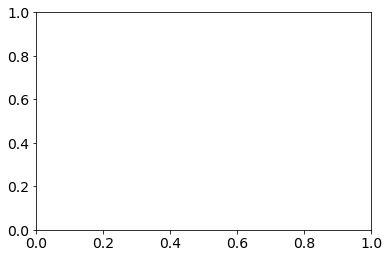

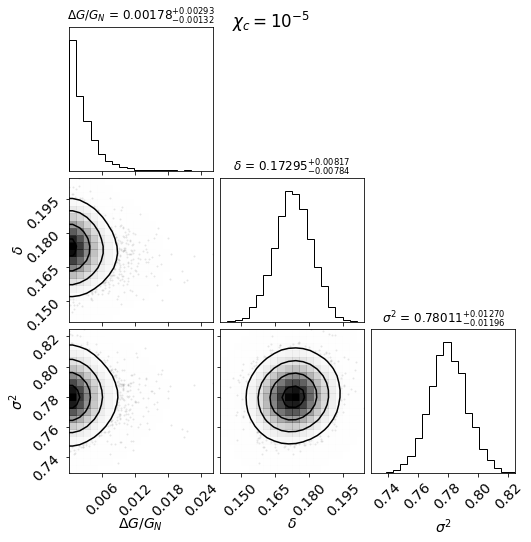

  5%|██                                       | 46/918 [00:00<00:04, 189.11it/s]

10492-12701 [0.4477] [0.8637, 0.1543, -0.0689, -0.1828]
10492-12701 0.4477 7.546977964940853e-07 1.7891846353243355e-07
10495-12704 [29.71814572864322] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 29.71814572864322 9.306096495350115e-07 6.118935707095604e-09
10509-12703 [0.7278] [1226.9439, 2166.987, 2538.8741, 2127.6504, 1648.0951, 1358.0909, 1167.9374, 985.8138]
10509-12703 0.7278 1.60387146776783e-07 7.760651653038593e-07


  7%|██▉                                      | 66/918 [00:00<00:05, 166.81it/s]

10512-12701 [0.1565] [-0.3741]
10512-12701 0.1565 8.606605365596049e-07 3.0899324835943973e-09
10839-12705 [50] [0.5531, 0.4188, 0.6271, 0.6342, 0.4074, 0.3206, 0.1512, 0.1105, 0.1154, 0.1763, 0.2141, 0.3291, 0.2868, 0.1635, 0.0391, 0.4134, 0.1807]
10839-12705 50.0 0.0 1.031555478729334e-06
11004-6104 [35.99358291457286] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 35.99358291457286 8.164157890950966e-07 1.188974088298445e-07


 11%|████▍                                    | 99/918 [00:00<00:05, 141.09it/s]

11013-1902 [2.7711] [0.7893, 0.6453, 0.5024, 0.4895, 0.4034, 0.2175, 0.0455, -0.0103, 0.0142, -0.2569, -0.0412, -0.2183, -0.1712, -0.0824, -0.3609, -0.2323, -0.3117]
11013-1902 2.7711 6.266500330087352e-07 3.022205488875959e-07
11013-3702 [50] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 50.0 0.0 3.2289291074749605e-06
11013-6101 [2.4801989949748746] [0.3389, -0.3422, -0.154, -0.2894, -0.4104, -0.4385, -0.4897, -0.4798, -0.43, -0.3971, -0.3753, -0.3775, -0.3376, -0.2419, -0.1243, 0.0068, -0.1557, 0.0318, -0.0178, 0.2532, 0.5345, 0.5099]
11013-6101 2.4801989949748746 9.226281407257324e-07 4.659675570203224e-09
11018-12702 [0.848] [-0.9839, -0.9926, -0.9927, -0.9922, -0.9923, -0.9935, -0.9932, -0.9925]
11018-12702 0.848 2.1988287476672716e-07 7.126791116833743e-07
11019-12703 [6.072150753768844] [-0.4993, -0.4671, -0.3698, -0.2654, -0.2024, -0.2445, -0.2033, -0.2117, -0.2752, -0.2285, -0.2102, -0.0702, -0.1699, 0.0858, -0.1757, -0.2987]
11019-12703 6.0721507537

 13%|█████                                   | 115/918 [00:00<00:05, 144.43it/s]

11021-1902 [0.3521] [5.9017, 3.1432, 2.8491, 1.9605]
11021-1902 0.3521 9.215209237783133e-07 1.1987207414906324e-08
11744-9102 [7.585804020100503] [-0.6298, 0.0464, 0.3943, 0.6247, 0.4097, 0.3518, 0.3414, 0.4046, 0.4742, 0.4313, 0.3693, 0.3275, 0.2214, 0.1278, 0.0812, 0.4043, 0.1792, -0.1336]
11744-9102 7.585804020100503 1.2718752461989424e-07 8.098206931596932e-07
11746-9102 [50] [-0.478, -0.2133, -0.2528, -0.1774, -0.2077, -0.2266, -0.2099, -0.2691, -0.1996, -0.2114, -0.1249, -0.1799, -0.1765, -0.1376, -0.2784, -0.2323, -0.1941, -0.3005, -0.2047, -0.3235, -0.1159, 0.1709]
11746-9102 50.0 0.0 1.1438584900798317e-06
11749-12704 [2.652009045226131] [1.1585, 1.0264, 1.2033, 1.4986, 1.8954, 2.0398, 2.1095, 2.1199, 1.4688, 1.3033, 0.9132, 0.8426, 0.0515, 0.4719, -0.3735]
11749-12704 2.652009045226131 8.151336662235589e-07 1.2017572476911408e-07
11751-6102 [1.9934572864321607] [0.3738, 0.0535, 0.3785, 0.2124, 0.1333, 0.0258, -0.0223, -0.094, -0.1099, -0.1415, -0.1724, -0.2013, -0.1841, -0.2

 16%|██████▏                                 | 143/918 [00:01<00:06, 117.85it/s]

11759-12705 [22.69595226130653] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 22.69595226130653 4.789536631602546e-07 4.543141777260549e-07
11761-12705 [16.71510552763819] [6.8127, 3.6941, 2.4845, 1.3644, 0.5363, 0.2844, 0.104, -0.1]
11761-12705 16.71510552763819 9.208101684184011e-07 1.2510603783317398e-08
11823-9101 [5.82908743718593] [15949.1976, 8800.0053, 8323.3916, 4811.1692, 2214.9858, 717.2733, 413.2719, 305.7873, 173.5393, 146.0478, 195.6604, 224.7593, 189.4201, 67.1778]
11823-9101 5.82908743718593 8.015673767934766e-07 1.2929857543290892e-07
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 4.6047288308711775e-06
11830-12701 [0.3542] [-0.9938, -0.9825, -0.9834, -0.9912]
11830-12701 0.3542 8.734676069416562e-07 3.072655777656241e-08
11830-3702 [1.0921095477386935] [1.2195, 0.9978, 0.6546, 0.4726, 0.5057, 0.555, 0.4749,

 18%|███████▍                                 | 167/918 [00:01<00:07, 97.28it/s]

11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 2.52424886699835e-06
11867-6104 [0.2586] [-0.2903, -0.2283]
11867-6104 0.2586 5.136767415458279e-07 4.0039083697107305e-07


 22%|████████▉                                | 199/918 [00:01<00:08, 89.09it/s]

11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 1.1965711292001785e-06
11954-12704 [0.4533] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061]
11954-12704 0.4533 8.028036565676655e-07 8.493817980930025e-08
11955-9102 [0.1525] [-0.9534]
11955-9102 0.1525 5.292287300850553e-07 4.053674938805306e-07
11956-12705 [0.6519] [1.6619, 1.0353, 0.65, 0.3349, 0.3771, 0.2419]
11956-12705 0.6519 2.98698162581351e-08 9.074904846396777e-07
11957-9101 [0.9502] [127.5969, 337.5453, 692.0501, 754.6672, 761.8038, 673.5367, 561.8056, 470.5271, 446.8561]
11957-9101 0.9502 9.287383410391894e-07 4.58250449884138e-09
11960-12704 [0.9289] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008]
11960-12704 0.9289 8.876896181218105e-07 4.584654681935434e-08
11968-9102 [18.226707035175878] [2.7183, 1.4085, 1.896, 1.4166, 0.6924, 0.2757, 0.1696, 0.1612, 0.2479, 0.4168, 0.6125, 0.5396, 0.5375, 0.6

 24%|█████████▋                               | 218/918 [00:01<00:08, 83.82it/s]

11970-6103 [0.2524] [0.7466, 1.1751]
11970-6103 0.2524 7.948625910722938e-07 3.9440153814696816e-08
11974-12702 [50] [-0.5341, -0.4596, -0.3852, -0.2683, -0.2117, -0.2349, -0.22, -0.1969, -0.1731, -0.1829, -0.2133, -0.2538, -0.2357, -0.256, -0.1504, -0.1437, -0.1349, 1.1183]
11974-12702 50.0 0.0 2.2676002698445432e-06


 26%|██████████▌                              | 236/918 [00:02<00:08, 79.83it/s]

11982-9102 [0.1582] [-0.6167, -0.1298]
11982-9102 0.1582 6.818495160024567e-07 2.525056731272758e-07
12066-3701 [0.1689] [19.2418]
12066-3701 0.1689 8.723517018797868e-07 4.214041323038143e-09
12067-12703 [0.4438] [0.4771, 1.0914, 1.8552]
12067-12703 0.4438 8.892105773250809e-07 1.4326615652363815e-09
12067-12705 [0.2525] [0.4291, 1.3434]
12067-12705 0.2525 8.89261607170692e-07 2.774753321903767e-09
12069-12704 [2.9000472361809044] [-0.1225, -0.0446, 0.3059, 0.5821, 0.5136, 0.2171, 0.0435, -0.0257, -0.0241, -0.0322, -0.068, -0.1307, -0.1986, -0.2472, -0.1136]
12069-12704 2.9000472361809044 7.163059450968706e-07 2.100367743656894e-07
12075-12704 [0.1553] [1.3099]
12075-12704 0.1553 8.256204468628533e-07 3.29947483227099e-08


 28%|███████████▎                             | 253/918 [00:02<00:09, 73.34it/s]

12078-12703 [50] [0.3298, 0.5608, 0.2182, 0.3221, 0.2303, 0.0896, 0.0846, 0.2051, 0.3186, 0.33, 0.2532]
12078-12703 50.0 0.0 1.0305513344618928e-06


 30%|████████████▎                            | 276/918 [00:02<00:09, 65.60it/s]

12483-12702 [0.8698] [1.6654, 4.9959, 4.0327, 3.2268, 3.5906, 2.6752, 2.319, 2.8722, 1.4084]
12483-12702 0.8698 7.340787479398693e-07 1.972908527661962e-07
12506-12701 [0.4536] [3.9989, 2.1309, 1.191, 0.6195, 0.1758]
12506-12701 0.4536 6.966350598591426e-07 2.2936386591020932e-07


 32%|████████████▉                            | 290/918 [00:03<00:10, 60.17it/s]

12512-12702 [0.4541] [-0.6273, -0.7265, -0.3964, -0.873, -0.9855]
12512-12702 0.4541 5.282308575145864e-07 3.74135130974554e-09
12514-12702 [0.2579] [0.0381, -0.2299, -0.2957]
12514-12702 0.2579 7.990898244282953e-07 1.2047829145012008e-07


 34%|█████████████▉                           | 311/918 [00:03<00:09, 61.86it/s]

12674-12703 [0.3505] [11.7502, 8.1378, 3.9317, 1.921]
12674-12703 0.3505 4.849833316154752e-07 4.392138939598603e-07
7443-12703 [3.5361226130653267] [1074.3059, 1609.2929, 1918.4773, 1252.1329, 1283.5249, 846.6265, 658.6448, 489.9276, 426.864, 483.2416, 526.496, 416.9852, 348.5595, 305.0488, 306.7893, 306.8839, 284.2526, 239.4606, 242.0877, 264.9615, 208.5241, 201.1421, 257.8677]
7443-12703 3.5361226130653267 9.151180054771961e-07 1.6433741828758232e-09
7443-12704 [50] [-0.2863, -0.0007, 0.2482, -0.0014, -0.1547, -0.1713, -0.2761, -0.2934, -0.2123]
7443-12704 50.0 0.0 1.1853393990724082e-06
7495-12702 [0.5471] [0.4595, -0.0101, -0.0769, -0.0221]
7495-12702 0.5471 6.752243353618852e-07 2.49368389222921e-07


 35%|██████████████▌                          | 325/918 [00:03<00:09, 61.73it/s]

7958-3702 [0.5383] [-0.4859, -0.2333, -0.1127, -0.096]
7958-3702 0.5383 6.732935056652329e-07 2.3195414087252164e-07
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 1.962944180916063e-06
7962-12703 [0.3497] [-0.229, -0.2113, -0.2172, -0.2992]
7962-12703 0.3497 8.749101518267128e-07 4.3225223747690614e-08


 38%|███████████████▊                         | 353/918 [00:04<00:09, 60.36it/s]

7977-12705 [0.3525] [0.9368, 0.902, 0.52, 0.3438]
7977-12705 0.3525 8.84979862482062e-07 1.1953713425897849e-08
7977-3704 [13.926206030150755] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078, -0.2476, -0.238, -0.2906, -0.275, -0.3075, -0.2622, -0.2582, -0.1901, -0.1851, -0.1814, -0.2011, -0.2339, -0.2408, -0.263, -0.2718, -0.3305, -0.3962]
7977-3704 13.926206030150755 1.3847008129356333e-07 7.986222027771195e-07
7978-12704 [0.3539] [0.0137, 0.1853, -0.0789]
7978-12704 0.3539 9.255171367402935e-08 8.302153139368167e-07
7979-12701 [0.2532] [41.2486, 22.8214, 15.6382]
7979-12701 0.2532 2.927030783886742e-07 5.956188037221679e-07


 40%|████████████████▍                        | 367/918 [00:04<00:09, 60.72it/s]

8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 1.070791610764518e-06
8078-6103 [0.6442] [0.6747, 0.2703, 0.4933, 0.397, 0.2316, 0.2149]
8078-6103 0.6442 1.596323471557577e-07 7.766992932989019e-07
8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81, 2355.4256, 1939.6384]
8083-12703 50.0 0.0 1.5389605245254443e-06


 42%|█████████████████                        | 381/918 [00:04<00:09, 58.90it/s]

8085-12704 [50] [19.4713, 11.125, 5.8271, 3.7366, 2.4898, 1.9407, 1.6532, 1.478, 1.2716, 1.1798, 1.035, 0.9279, 0.8839, 0.9133, 0.9927, 1.045, 1.0003, 1.3782]
8085-12704 50.0 0.0 1.5136293837445241e-06
8091-12701 [6.173604020100502] [-0.2011, -0.5495, -0.599, -0.5367, -0.4623, -0.2295, 0.0836, -0.1418, -0.0466, -0.0662, -0.1152, 0.1164]
8091-12701 6.173604020100502 2.1226818855599078e-07 7.227528618479605e-07


 43%|█████████████████▌                       | 392/918 [00:05<00:14, 35.64it/s]

8134-9102 [0.2551] [5.3067, 6.8977]
8134-9102 0.2551 8.542411275408616e-07 2.542969902013457e-08
8140-12703 [0.2519] [6.4874, 3.6588, 1.6108]
8140-12703 0.2519 6.270446705533117e-07 3.011438372571189e-07


 44%|█████████████████▉                       | 402/918 [00:05<00:12, 40.27it/s]

8141-12702 [0.1546] [1.3913]
8141-12702 0.1546 3.0795935481923756e-07 6.21404751908527e-07
8144-3701 [0.9524] [1.7314, 2.9753, 3.9259, 4.0292, 4.2415, 3.9334, 3.7851, 3.6143]
8144-3701 0.9524 4.717544313643156e-07 4.554679161235331e-07
8146-12701 [0.2542] [0.0601, 0.0138, -0.1773]
8146-12701 0.2542 1.9211687424417693e-07 7.281409733481347e-07


 46%|███████████████████                      | 426/918 [00:05<00:10, 46.18it/s]

8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 4.320862636701444e-06
8243-12701 [27.993824120603016] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 27.993824120603016 7.1099437031726e-08 8.663632863026657e-07


 48%|███████████████████▋                     | 441/918 [00:06<00:10, 44.83it/s]

8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 2.9494477705909287e-06


 49%|████████████████████▏                    | 451/918 [00:06<00:10, 44.13it/s]

8252-6103 [0.3527] [-0.2615, -0.022, 0.2994, 0.3239]
8252-6103 0.3527 6.501451897228691e-07 2.5567317227465327e-07
8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 1.7632204735884702e-06


 50%|████████████████████▌                    | 461/918 [00:06<00:11, 40.05it/s]

8257-9102 [50] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 50.0 0.0 1.3303590551231222e-06


 51%|█████████████████████                    | 471/918 [00:06<00:11, 39.92it/s]

8263-12701 [0.3585] [0.1366, -0.0179, -0.1383]
8263-12701 0.3585 5.833452480187565e-07 3.4224583370633247e-07
8311-12703 [7.480787939698492] [-0.5262, -0.3008, 0.0336, -0.0037, -0.0266, -0.0746, -0.0655, -0.096, -0.1008, -0.1406, -0.0855, -0.0836, -0.0887, -0.1166, -0.1151, -0.1423, -0.1577, -0.1627, -0.1485, -0.1024]
8311-12703 7.480787939698492 1.5030885145115742e-07 7.857513755975059e-07


 53%|█████████████████████▉                   | 491/918 [00:07<00:10, 40.39it/s]

8317-6102 [0.1416] [0.3231]
8317-6102 0.1416 8.248709643557755e-07 2.5104503117856274e-09
8318-12703 [0.1567] [-0.7183, -0.2168]
8318-12703 0.1567 8.385710691722254e-07 2.918000352358656e-09


 54%|██████████████████████▎                  | 500/918 [00:07<00:10, 38.19it/s]

8320-9102 [0.3486] [0.5007, 0.5684, 0.3094, 0.1402]
8320-9102 0.3486 8.928431755308175e-07 1.6086665449757518e-09
8322-12704 [0.4518] [3.4378, 1.7543, 0.6817, 0.2171]
8322-12704 0.4518 8.698362474009245e-08 8.413712346673872e-07


 56%|██████████████████████▊                  | 512/918 [00:07<00:11, 34.25it/s]

8332-1902 [1.6463231155778895] [1.1695, 0.3415]
8332-1902 1.6463231155778895 2.4359774647326347e-07 6.926853618175435e-07
8336-12703 [50] [-0.0554, 0.3506, 0.44, 0.2781, 0.2645, 0.0984, 0.0042, 0.0446, 0.0992, 0.1216, 0.1307, 0.3445]
8336-12703 50.0 0.0 1.1362316696619853e-06


 58%|███████████████████████▉                 | 537/918 [00:08<00:10, 35.88it/s]

8443-9101 [2.8981909547738693] [-0.5938, -0.2643, -0.1783, -0.111, -0.2055, -0.1953, -0.2279, -0.2289, -0.2426, -0.2425, -0.2457, -0.1867, -0.132, -0.0999, -0.1285, -0.1264, -0.091, -0.0918, -0.0806, -0.1193]
8443-9101 2.8981909547738693 6.520654944252652e-07 2.7050371255429557e-07
8445-3701
8446-12703 [2.3528201005025124] [-0.8092, -0.6343, -0.4382, -0.3634, -0.1242, -0.0184, 0.2489, 0.1201, -0.0259, 0.1214, 0.1326, 0.2892]
8446-12703 2.3528201005025124 8.76386291902209e-07 4.639235830854394e-08


 60%|████████████████████████▌                | 549/918 [00:09<00:11, 31.07it/s]

8452-12705 [50] [2.2014, 0.7535, 0.1423, -0.26, -0.3642, -0.2043, -0.1698, -0.25, -0.249, -0.2213, 0.0062]
8452-12705 50.0 0.0 1.1234957916665717e-06
8452-6102 [0.3526] [-0.8305, -0.7694]
8452-6102 0.3526 9.270840904074784e-07 7.665341536138011e-09


 61%|████████████████████████▉                | 557/918 [00:09<00:12, 29.65it/s]

8458-12705 [50] [0.0547, -0.0358, -0.0864, -0.0677, 0.041, 0.025, -0.0963]
8458-12705 50.0 0.0 1.8659018272620764e-06


 61%|█████████████████████████▏               | 564/918 [00:09<00:12, 29.11it/s]

8464-9102 [50] [-0.6267, 0.2263, 0.2633, 0.0196, -0.0683, -0.0476, 0.0924, 0.125, 0.0262, -0.0386, -0.1397, -0.264, -0.2215, -0.1053, -0.1133, -0.0427, -0.3342]
8464-9102 50.0 0.0 1.4197842691762576e-06
8482-12705 [0.1542] [1.7259]
8482-12705 0.1542 9.055572711434065e-07 5.438111150967329e-09


 66%|██████████████████████████▉              | 604/918 [00:11<00:13, 23.04it/s]

8588-12705 [1.3455] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958]
8588-12705 1.3455 7.177429461601688e-07 2.1653089450485825e-07
8588-6101 [50] [14.322, 7.5586, 5.4768, 3.7094, 2.9043, 2.0184, 1.5292, 1.014, 0.565, 0.2242, -0.1395, -0.4913, -0.6617, -0.6955, -0.6618, -0.6418, -0.3659]
8588-6101 50.0 0.0 1.0943772340687868e-06


 66%|███████████████████████████              | 607/918 [00:11<00:15, 19.61it/s]

8589-12705 [0.1556] [-0.3741, -0.0649]
8589-12705 0.1556 4.960642784156369e-07 3.7304126056657253e-07


 67%|███████████████████████████▍             | 614/918 [00:11<00:19, 15.57it/s]

8596-12702 [0.2552] [9.3294, 6.4522, 4.5669]
8596-12702 0.2552 8.727670393974581e-07 9.08729674211007e-09


 68%|███████████████████████████▊             | 622/918 [00:12<00:19, 14.98it/s]

8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 1.0320166166826607e-06


 68%|████████████████████████████             | 628/918 [00:12<00:21, 13.40it/s]

8604-12701 [1.1491] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 1.1491 7.915685852937553e-07 1.2779990176600038e-07


 70%|████████████████████████████▊            | 645/918 [00:14<00:19, 14.06it/s]

8615-9101 [0.1561] [-0.8368]
8615-9101 0.1561 7.87624969431603e-07 1.0098097741438823e-07
8616-12702 [0.2519] [0.4277, 0.4418]
8616-12702 0.2519 9.116334402122098e-07 1.926563020742624e-09


 71%|████████████████████████████▉            | 649/918 [00:14<00:21, 12.42it/s]

8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 9.788574036804692e-07


 72%|█████████████████████████████▎           | 657/918 [00:15<00:20, 12.66it/s]

8625-12703 [6.963843216080403] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 6.963843216080403 4.913812336702806e-07 4.376817316283821e-07
8625-9101 [0.1546] [3.4751]
8625-9101 0.1546 6.902283601963816e-07 2.054560952643668e-07


 72%|█████████████████████████████▋           | 665/918 [00:15<00:20, 12.29it/s]

8652-12703 [1.2352] [4.1013, 4.7669, 5.1991, 4.4033, 3.7174, 3.5525, 3.5549, 3.5362, 3.2302, 2.4242, 1.8301, 1.5823]
8652-12703 1.2352 7.426491354520047e-07 1.8435882435846388e-07


 74%|██████████████████████████████▍          | 681/918 [00:17<00:20, 11.60it/s]

8723-12705 [0.3531] [0.0971, -0.0222, -0.1425]
8723-12705 0.3531 4.072759665603744e-07 4.822510034714187e-07


 75%|██████████████████████████████▊          | 691/918 [00:17<00:20, 11.14it/s]

8935-12703 [0.252] [1.3644, 1.3643]
8935-12703 0.252 3.538361272540017e-07 5.727204491489459e-07


 76%|███████████████████████████████          | 695/918 [00:18<00:19, 11.42it/s]

8940-6102 [5.123836683417085] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255, 5.5546, 12.9117, 21.2922, 16.4359, 26.6633, 13.4371, 36.4376, 7.1987, 23.1068, 6.3683, 8.9183, 8.7783, 7.9226, 6.8708, 11.0493, 5.904, 12.4029, 7.079, 5.0132, 3.0133, 4.7151, 4.033, 2.0836, 1.2483, 3.1201, 2.9806, 1.0708, -0.845, 1.9159, -0.8836]
8940-6102 5.123836683417085 5.507206770563001e-07 3.768910027751225e-07


 77%|███████████████████████████████▋         | 709/918 [00:19<00:19, 10.92it/s]

8978-12705 [0.1543] [-0.9996]
8978-12705 0.1543 7.90918472168294e-07 7.825109076151049e-08


 77%|███████████████████████████████▊         | 711/918 [00:19<00:17, 11.52it/s]

8979-3702 [0.3529] [2.2461, 2.1195, 1.4208, 0.8317]
8979-3702 0.3529 7.16313651934881e-07 2.1013942036823157e-07


 78%|████████████████████████████████         | 719/918 [00:20<00:19, 10.16it/s]

8984-12705 [2.0811517587939696] [3.0836, 1.6232, 0.6979, 0.3513, 0.1953, 0.0639, -0.0076, -0.0344, -0.0726, -0.0942, -0.051, -0.0455, -0.053, 0.1124]
8984-12705 2.0811517587939696 5.610125724957227e-07 3.6073245713339466e-07


 79%|████████████████████████████████▍        | 727/918 [00:21<00:18, 10.26it/s]

8988-6104 [2.225421105527638] [-0.8936, 0.7483, 0.2628, 0.522, 0.7292, 0.7091, 0.3052, -0.0115, -0.2088, -0.2384, -0.2611, -0.3657, -0.3727, -0.5497, -0.5052, -0.4506, -0.3758, -0.4275]
8988-6104 2.225421105527638 5.19691519321228e-07 3.990493612693771e-07


 80%|████████████████████████████████▉        | 737/918 [00:22<00:17, 10.16it/s]

8993-12701 [0.5453] [2.3763, 1.1933, 0.5042, 0.1338, -0.0398]
8993-12701 0.5453 8.65792256368761e-07 6.735890522180283e-08
8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 2.30020312957813e-06


 81%|█████████████████████████████████▎       | 745/918 [00:23<00:17,  9.84it/s]

9000-12702 [0.2479] [2.3374, 0.5059]
9000-12702 0.2479 1.8596334831994568e-07 7.402781654011404e-07


 81%|█████████████████████████████████▍       | 748/918 [00:23<00:17,  9.77it/s]

9025-3703 [0.249] [0.1597, 334.5503]
9025-3703 0.249 7.315567303486755e-07 1.7947527605340416e-07


 84%|██████████████████████████████████▌      | 773/918 [00:26<00:16,  8.60it/s]

9046-12702 [0.1562] [-0.2055]
9046-12702 0.1562 7.401111689141473e-07 1.3653081729843199e-07
9046-6103 [0.1616] [-0.3699, -0.3837]
9046-6103 0.1616 8.846672534111152e-07 2.6413793606207846e-08


 85%|██████████████████████████████████▊      | 779/918 [00:26<00:11, 12.15it/s]

9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 1.530187782154017e-06
9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 1.824439389276806e-06


 86%|███████████████████████████████████      | 785/918 [00:26<00:09, 13.83it/s]

9089-6104 [2.744329648241206] [1.2076, 0.9751, 0.7985, 0.6992, 0.6583, 0.5049, 0.1739, 0.0105, -0.0182, -0.0151, -0.032, -0.0114, 0.0087, 0.0693, 0.1489, 0.073]
9089-6104 2.744329648241206 8.67334819847248e-07 4.7905891881909496e-08
9092-6101 [0.1614] [-0.1331, 0.7546]
9092-6101 0.1614 7.950696663597729e-07 1.2083454747880296e-07


 88%|████████████████████████████████████     | 807/918 [00:28<00:07, 14.62it/s]

9188-12702 [50] [0.3014, -0.1032, 0.2878, 0.2615, 0.0217, -0.0468, 0.0186, 0.1619, 0.0837, -0.0926, -0.2543, -0.4793, -0.0079, -0.0155, 0.1513]
9188-12702 50.0 0.0 1.2451485007665071e-06


 88%|████████████████████████████████████▏    | 811/918 [00:28<00:07, 14.01it/s]

9189-9101 [50] [0.1136, 1.2916, 1.238, 0.862, 0.5942, 0.5995, 0.6095, 0.5215, 0.4815, 0.4392, 0.4108, 0.3223, 0.3417, 0.2637, 0.1347, 0.8173, 0.2625]
9189-9101 50.0 0.0 1.1432770089162355e-06
9190-12702 [0.4484] [32.5978, 11.0488, 5.9449, 4.5091]
9190-12702 0.4484 8.966145990608535e-07 4.072952169486004e-09


 91%|█████████████████████████████████████▍   | 839/918 [00:30<00:05, 13.66it/s]

9490-6101 [1.2458] [0.0062, 0.1146, 0.1085, 0.0171, -0.0758, -0.1222, -0.1384, -0.185, -0.1222, -0.1079, -0.0986, -0.0722]
9490-6101 1.2458 5.928447875394505e-07 3.383748684983634e-07


 93%|██████████████████████████████████████   | 853/918 [00:31<00:04, 13.34it/s]

9497-3703 [0.2419] [-0.0174]
9497-3703 0.2419 7.743212557951628e-07 5.01329672244013e-08


 98%|████████████████████████████████████████ | 897/918 [00:35<00:01, 12.15it/s]

9882-12705 [0.6514] [-0.3903, -0.0311, -0.038, -0.0266, -0.0063, -0.0856]
9882-12705 0.6514 2.998427159631292e-07 6.287458912052217e-07


 98%|████████████████████████████████████████▎| 903/918 [00:35<00:01, 11.64it/s]

9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 1.7007252517303341e-06
9886-1901 [0.1523] [-0.9872, -0.9945]
9886-1901 0.1523 6.365578167425291e-07 1.9515689960587667e-07


 99%|████████████████████████████████████████▌| 909/918 [00:36<00:00, 11.69it/s]

9888-3701 [0.2673] [42.9115]
9888-3701 0.2673 8.938713841896077e-07 1.6785375842098522e-08


 99%|████████████████████████████████████████▊| 913/918 [00:36<00:00, 11.54it/s]

9892-6103 [0.3556] [-0.0525, -0.3028]
9892-6103 0.3556 3.9169688096835523e-07 5.145439190311843e-07


100%|█████████████████████████████████████████| 918/918 [00:37<00:00, 24.71it/s]


Total number of points unscreened AD 4: 13697
Total number of points screened AD 4: 1164
Total number of points unscreened AD 8: 13697
Total number of points screened AD 8: 1164


100%|████████████████████████████████████| 10000/10000 [00:24<00:00, 404.37it/s]


chi= 9.375000000000001e-07
burn-in: 183
thin: 10
flat chain shape: 10000
flat log prob shape: 9810
None


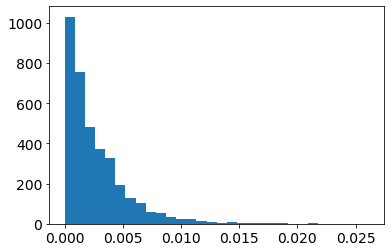

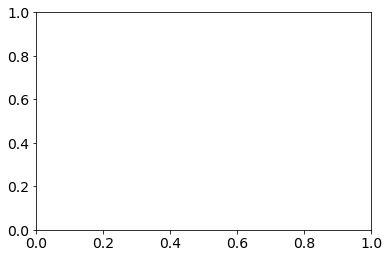

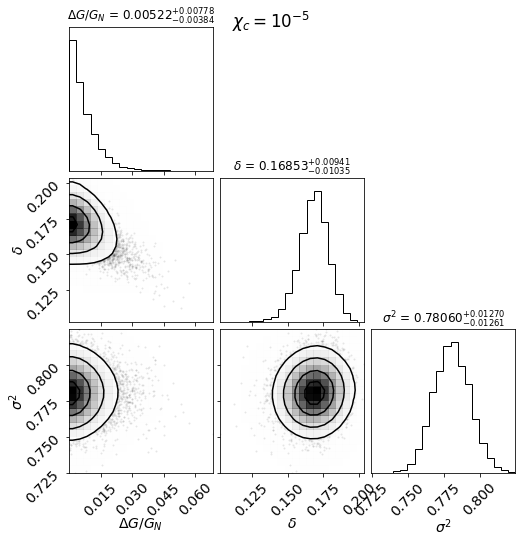

  4%|█▌                                       | 34/918 [00:00<00:05, 169.94it/s]

10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 5.192288078680007e-06
10492-6103 [50] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 50.0 0.0 2.8336668528974637e-06
10495-12704 [15.640152763819096] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 15.640152763819096 2.078836766283786e-06 1.5505505165143262e-08
10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 6.14067001419698e-06


 10%|███▉                                     | 89/918 [00:00<00:05, 153.31it/s]

11004-6104 [23.43610552763819] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 23.43610552763819 1.8821741081074762e-06 2.0340357417181807e-07
11013-3702 [50] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 50.0 0.0 5.562891891477866e-06
11019-12705 [0.1553] [0.9395, 1.6844]
11019-12705 0.1553 7.990954325516855e-07 1.226193416368774e-06
11021-1902 [0.936110552763819] [5.9017, 3.1432, 2.8491, 1.9605, 1.7177]
11021-1902 0.936110552763819 7.366399044664113e-07 1.3268756064350153e-06


 15%|█████▉                                  | 137/918 [00:00<00:05, 144.95it/s]

11746-9102 [0.2633] [-0.478]
11746-9102 0.2633 8.473774542754376e-07 1.2303838444701466e-06
11759-12705 [3.7553065326633166] [-0.9996, -0.9996, -0.9997, -0.9996, -0.9994, -0.9987, -0.9885, -0.999, -0.9999, -0.9992]
11759-12705 3.7553065326633166 1.5700702844851112e-06 5.211749939143665e-07


 17%|██████▌                                 | 152/918 [00:01<00:06, 121.97it/s]

11761-12705 [50] [6.8127, 3.6941, 2.4845, 1.3644, 0.5363, 0.2844, 0.104, -0.1]
11761-12705 50.0 0.0 2.172747855762923e-06
11823-9101 [0.3487] [15949.1976, 8800.0053, 8323.3916]
11823-9101 0.3487 1.8955327201486204e-06 1.8926751497133613e-07
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 3.7915661730666952e-06
11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 3.0694913227773696e-06


 22%|████████▉                                | 200/918 [00:01<00:07, 93.29it/s]

11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 9.372372261037345e-06
11954-12704 [0.5511] [-0.4693, 0.083, 0.4235, 0.3863, 0.3061, 0.2453]
11954-12704 0.5511 7.645711493739774e-07 1.3396617574664102e-06
11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.2778]
11954-3703 50.0 0.0 2.3075767257064914e-06
11957-9101 [9.338353266331659] [127.5969, 337.5453, 692.0501, 754.6672, 761.8038, 673.5367, 561.8056, 470.5271, 446.8561, 434.7914, 434.701, 432.6297, 423.9362, 415.9254, 409.4146, 409.8788]
11957-9101 9.338353266331659 3.9858158650037703e-07 1.7063299354366446e-06
11960-12704 [1.4220768844221106] [6.3692, 5.4879, 2.7061, 0.4975, 0.045, -0.0364, 0.0891, -0.0169, -0.1008, -0.1192]
11960-12704 1.4220768844221106 7.922387401255512e-07 1.3079206600751591e-06


 24%|█████████▊                               | 219/918 [00:01<00:08, 86.19it/s]

11974-12702 [50] [-0.5341, -0.4596, -0.3852, -0.2683, -0.2117, -0.2349, -0.22, -0.1969, -0.1731, -0.1829, -0.2133, -0.2538, -0.2357, -0.256, -0.1504, -0.1437, -0.1349, 1.1183]
11974-12702 50.0 0.0 3.607421090341295e-06


 26%|██████████▌                              | 237/918 [00:02<00:08, 82.44it/s]

12067-12705 [0.1541] [0.4291]
12067-12705 0.1541 9.921947918016962e-07 1.0866211402667298e-06
12075-12704 [50] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 50.0 0.0 3.746080622926001e-06


 28%|███████████▎                             | 254/918 [00:02<00:09, 69.62it/s]

12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 1.068072245968717e-05


 31%|████████████▋                            | 283/918 [00:02<00:10, 62.06it/s]

12506-12701 [0.4536] [3.9989, 2.1309, 1.191, 0.6195, 0.1758]
12506-12701 0.4536 6.966350598591426e-07 1.378999853379454e-06
12512-12702 [0.2522] [-0.6273, -0.7265]
12512-12702 0.2522 1.971383970499e-06 8.144196807410385e-09


 35%|██████████████▎                          | 320/918 [00:03<00:12, 49.50it/s]

7957-12704 [50] [-0.7044, -0.428, -0.4703, -0.477, -0.49, -0.4239, -0.4932, -0.5064, -0.3311, -0.437, -0.6516, -0.5847]
7957-12704 50.0 0.0 2.44472284016736e-06
7959-12704 [2.3955396984924624] [0.0768, -0.1902, -0.0789, 0.103, -0.0548, -0.2591, -0.323, -0.3684, -0.3629, -0.3337, -0.3418, -0.3315, -0.376, -0.2956, -0.1306, -0.1834, -0.2353]
7959-12704 2.3955396984924624 4.0532541081108335e-07 1.7025042314758767e-06
7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 3.9877534551844325e-06


 38%|███████████████▋                         | 351/918 [00:04<00:13, 43.15it/s]

7977-3704 [0.5514] [-0.4359, -0.3164, -0.3062, -0.1137, -0.2078]
7977-3704 0.5514 4.4546106471315517e-07 1.6526239412199605e-06


 40%|████████████████▎                        | 365/918 [00:04<00:14, 38.91it/s]

8077-12704 [50] [1.7565, 4.0408, 2.5555, 1.8199, 1.2707, 1.0102, 1.0954, 0.9808, 0.8221, 1.0736, 0.6427, 0.8789, 0.3532]
8077-12704 50.0 0.0 2.394630336031667e-06


 41%|████████████████▋                        | 373/918 [00:04<00:14, 36.69it/s]

8083-12703 [50] [0.7937, 11.6869, 2.1502, 30.9354, 266.2448, 49.272, 5.4143, 159.2325, 642.8075, 687.7105, 1108.642, 1435.7265, 1567.9546, 976.5397, 380.1567, 1149.81, 2355.4256, 1939.6384]
8083-12703 50.0 0.0 2.7903632918319167e-06


 42%|█████████████████▎                       | 389/918 [00:05<00:15, 33.86it/s]

8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.180421934454168e-05
8134-9102 [0.1579] [5.3067]
8134-9102 0.1579 1.006631065750167e-06 1.0328786726349135e-06


 46%|██████████████████▉                      | 425/918 [00:06<00:16, 29.23it/s]

8157-12702 [50] [1.2296, 0.3076, -0.0631, -0.3262, -0.3426, -0.3606, -0.3551, -0.4397, -0.5098, -0.5258, -0.5402, -0.4339, -0.5141]
8157-12702 50.0 0.0 2.5318864234705266e-06


 47%|███████████████████▏                     | 431/918 [00:06<00:17, 27.85it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 5.244436001129386e-06


 48%|███████████████████▌                     | 437/918 [00:07<00:18, 26.14it/s]

8247-12704 [50] [0.7742, 0.0441, -0.119, -0.2573, -0.2931, -0.3752, -0.3617, -0.3899, -0.4049, -0.3961, -0.3891, -0.3323, -0.3564, -0.241, -0.2061, 0.0141, -0.2162, -0.176, -0.4298, -0.0844, 0.3372, -0.5186]
8247-12704 50.0 0.0 3.182025605083631e-06


 50%|████████████████████▎                    | 455/918 [00:07<00:18, 25.29it/s]

8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 2.737513880917573e-06


 50%|████████████████████▌                    | 461/918 [00:07<00:18, 25.15it/s]

8257-9102 [6.431768844221105] [-0.6065, 0.3731, 0.5133, 0.4013, 0.3101, 0.289, 0.2039, 0.0074, -0.1362, -0.2713, -0.3278, -0.324, -0.2969, -0.2687, -0.2536, -0.2616, -0.2811, -0.3333]
8257-9102 6.431768844221105 3.935148279948197e-07 1.7102550048200765e-06


 53%|█████████████████████▊                   | 488/918 [00:09<00:19, 22.15it/s]

8318-12705 [50] [0.4973, 0.3939, 0.2711, 0.1855, 0.1341, 0.1686, 0.1466, 0.0544, 0.054, 0.1122, 0.1387, 0.0373, 0.0033, 0.0148, -0.0779, -0.1281, -0.2236, -0.0706]
8318-12705 50.0 0.0 3.474669243019148e-06


 58%|███████████████████████▊                 | 532/918 [00:11<00:19, 19.32it/s]

8443-12705 [0.5529] [0.4038, 0.499, 0.2306, 0.1803, 0.1118]
8443-12705 0.5529 1.4727448607731634e-07 1.9525254798761706e-06


 58%|███████████████████████▉                 | 537/918 [00:11<00:17, 21.22it/s]

8445-3701


 61%|████████████████████████▊                | 556/918 [00:12<00:19, 18.20it/s]

8458-12705 [0.5454] [0.0547, -0.0358, -0.0864, -0.0677, 0.041]
8458-12705 0.5454 3.187179911450581e-07 1.789143561889592e-06


 62%|█████████████████████████▎               | 568/918 [00:13<00:20, 17.07it/s]

8482-12705 [4.336009547738693] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 4.336009547738693 3.6835458632199073e-07 1.7327165756603586e-06


 68%|███████████████████████████▊             | 624/918 [00:16<00:21, 13.49it/s]

8602-12701 [50] [2.4723, 1.8034, 1.2827, 0.3581, -0.1494, -0.3022, -0.2148, -0.105, 0.0884]
8602-12701 50.0 0.0 2.686419801659752e-06


 68%|████████████████████████████             | 628/918 [00:17<00:22, 13.03it/s]

8604-12701 [50] [0.5542, 0.4842, 0.1007, -0.18, -0.2563, -0.2344, -0.2768, -0.3856, -0.4096, -0.3741, -0.3248, -0.4345]
8604-12701 50.0 0.0 2.5118833082421058e-06
8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 2.451521971969261e-05


 70%|████████████████████████████▉            | 647/918 [00:18<00:21, 12.68it/s]

8616-3704 [50] [53.6157, 108.6977, 113.1755, 202.2096, 371.1633, 528.0732, 727.5998, 755.9835, 780.1031, 720.7383, 785.5197, 605.0522, 604.3386, 665.5486, 459.5142]
8616-3704 50.0 0.0 2.697088765417341e-06
8616-6104 [50] [-0.6267, -0.6119, -0.6244, -0.4798, -0.4064, -0.3775, -0.3511, -0.3332, -0.3047, -0.3072, -0.3054, -0.3077, -0.2747, -0.2566, -0.3213, -0.2583]
8616-6104 50.0 0.0 2.855491028378095e-06


 72%|█████████████████████████████▎           | 657/918 [00:19<00:21, 12.30it/s]

8625-12703 [0.4536] [2.0033, 2.3676, 1.8754, 1.0452, 0.439]
8625-12703 0.4536 1.0811374177861004e-06 1.0144899521688793e-06


 72%|█████████████████████████████▋           | 665/918 [00:20<00:22, 11.46it/s]

8652-12705 [50] [-0.7748, -0.6687, -0.5141, -0.2495, -0.0785, 0.1927, 0.2906, 0.2897, 0.9533, 0.6451, 0.9861, 1.1114, 1.0281]
8652-12705 50.0 0.0 2.1879484730740093e-06


 76%|███████████████████████████████          | 695/918 [00:22<00:18, 12.10it/s]

8940-6102 [1.3399] [0.7391, 9.2045, 6.8021, 4.5051, 8.3453, 7.8235, 4.9174, 4.7777, 6.4287, 2.2649, 9.0255]
8940-6102 1.3399 7.585698148174968e-07 1.3496560008542116e-06


 77%|███████████████████████████████▊         | 711/918 [00:24<00:20, 10.34it/s]

8979-3702 [39.398274371859294] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 39.398274371859294 3.666300478786285e-08 2.0720099184927e-06


 81%|█████████████████████████████████        | 739/918 [00:26<00:17, 10.36it/s]

8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 3.812154644623781e-06


 85%|██████████████████████████████████▋      | 778/918 [00:30<00:16,  8.40it/s]

9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 2.768466674202533e-06
9087-9101 [21.390988944723617] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 21.390988944723617 8.813195414410364e-08 2.0201801524305068e-06


 90%|████████████████████████████████████▋    | 822/918 [00:33<00:07, 13.61it/s]

9192-12703 [5.6164190954773865] [-0.0006, -0.2115, -0.0152, 0.0244, -0.0117, -0.021, -0.0003, 0.0584, 0.0036, -0.0296, -0.0468, -0.0479, -0.0644, 0.1363]
9192-12703 5.6164190954773865 5.492690970480062e-08 2.0542694140383822e-06


 98%|████████████████████████████████████████▏| 901/918 [00:43<00:02,  6.40it/s]

9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 4.854640447602251e-05


 98%|████████████████████████████████████████▎| 903/918 [00:44<00:02,  6.23it/s]

9886-12705 [50] [-0.353, -0.4053, -0.4239, -0.3714, -0.2431, -0.2597, -0.3057, -0.3698, -0.4265, -0.4751, -0.4042]
9886-12705 50.0 0.0 2.8121112641030334e-06


100%|█████████████████████████████████████████| 918/918 [00:46<00:00, 19.77it/s]


Total number of points unscreened AD 4: 14173
Total number of points screened AD 4: 688
Total number of points unscreened AD 8: 14173
Total number of points screened AD 8: 688


100%|████████████████████████████████████| 10000/10000 [00:25<00:00, 398.61it/s]


chi= 2.109375e-06
burn-in: 184
thin: 21
flat chain shape: 4760
flat log prob shape: 4670
None


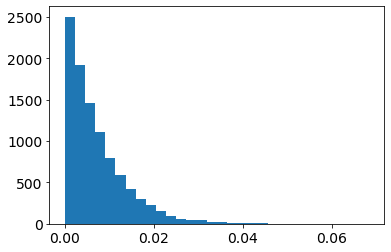

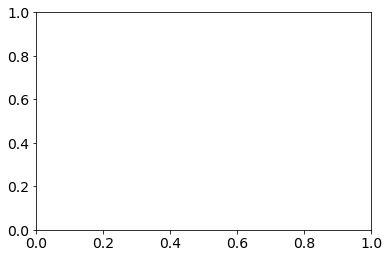

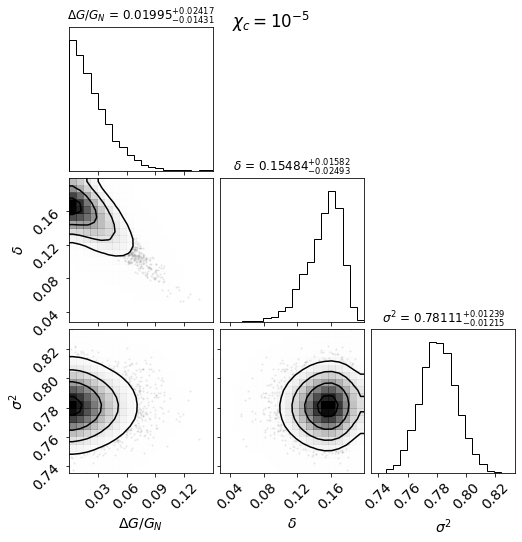

  6%|██▌                                      | 57/918 [00:00<00:03, 284.73it/s]

10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 5.441039265217986e-06
10492-6103 [8.278590954773868] [-0.4964, -0.4207, -0.419, -0.2825, -0.2833, -0.1085, -0.1619, 0.1851, 0.3303, 0.3824, 0.1049, 0.065, -0.0634, -0.1396, -0.353, -0.2976, -0.4556]
10492-6103 8.278590954773868 1.793191620878137e-07 3.5680213138224297e-06
10495-12704 [36.39922713567839] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 36.39922713567839 5.678744903294002e-07 3.176778537887419e-06
10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 6.205036635723042e-06


  9%|███▊                                     | 86/918 [00:00<00:03, 246.40it/s]

11004-6104 [12.32756783919598] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 12.32756783919598 3.4779823053946547e-06 2.2652586111172349e-07
11013-3702 [50] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 50.0 0.0 5.545167893368615e-06
11019-12705 [2.313773366834171] [0.9395, 1.6844, 1.8269, 0.8562, 0.7011, 1.016, 1.1247, 1.0992, 1.0844]
11019-12705 2.313773366834171 4.7021489611258783e-07 3.2712149323044216e-06


 16%|██████▌                                 | 151/918 [00:00<00:05, 139.54it/s]

11759-12705 [0.4466] [-0.9996, -0.9996, -0.9997, -0.9996]
11759-12705 0.4466 3.0697360082254054e-06 4.723423543853587e-07
11761-12705 [8.578797989949749] [6.8127, 3.6941, 2.4845, 1.3644, 0.5363, 0.2844, 0.104, -0.1]
11761-12705 8.578797989949749 1.4813923083538609e-06 2.2464702416907485e-06
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 5.7760553994781935e-06


 18%|███████▎                                | 167/918 [00:01<00:05, 125.26it/s]

11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 8.54848826797254e-06
11941-12705 [2.1062361809045225] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 2.1062361809045225 2.209575908349796e-07 3.5283328650838015e-06


 20%|███████▉                                | 181/918 [00:01<00:06, 113.78it/s]

11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 2.2700977592107654e-05
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 9.912873634622989e-06
11954-3703 [50] [1.3591, 0.2777, 0.7928, 0.9073, 0.7493, 0.5176, 0.3973, 0.3466, 0.2615, 0.2221, 0.1716, 0.1556, 0.132, 0.1203, 0.1972, 0.2065, 0.2701, 0.2778]
11954-3703 50.0 0.0 5.047913449792591e-06


 22%|█████████                                | 204/918 [00:01<00:07, 94.25it/s]

11957-9101 [20.295084422110552] [127.5969, 337.5453, 692.0501, 754.6672, 761.8038, 673.5367, 561.8056, 470.5271, 446.8561, 434.7914, 434.701, 432.6297, 423.9362, 415.9254, 409.4146, 409.8788]
11957-9101 20.295084422110552 2.1417997466254053e-07 3.5350302133845926e-06
11974-12702 [13.665606030150755] [-0.5341, -0.4596, -0.3852, -0.2683, -0.2117, -0.2349, -0.22, -0.1969, -0.1731, -0.1829, -0.2133, -0.2538, -0.2357, -0.256, -0.1504, -0.1437, -0.1349, 1.1183]
11974-12702 13.665606030150755 1.1302717127742973e-07 3.6364418734389954e-06


 26%|██████████▊                              | 242/918 [00:02<00:08, 77.25it/s]

12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 8.67223164818981e-05
12075-12704 [50] [1.3099, 1.0721, 0.4685, 0.1407, -0.0071, 0.0365, 0.0772]
12075-12704 50.0 0.0 4.289162595685684e-06


 28%|███████████▌                             | 258/918 [00:02<00:09, 67.71it/s]

12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 9.276831748881975e-06
12084-12704 [50] [-0.663, -0.3425, -0.4511, -0.3814, -0.1944, -0.0031, -0.041, -0.1276, -0.2047, -0.2499, -0.2565, -0.1988, -0.1657, -0.268, -0.3391, -0.2896]
12084-12704 50.0 0.0 4.380678890595282e-06


 31%|████████████▊                            | 286/918 [00:02<00:09, 63.99it/s]

12512-12702 [0.1586] [-0.6273, -0.7265]
12512-12702 0.1586 3.146928615962451e-06 1.4623168017950304e-08


 35%|██████████████▍                          | 324/918 [00:03<00:11, 49.96it/s]

7959-9102 [50] [0.0495, 0.2489, 0.2386, 0.1383, 0.1356, 0.1335, 0.1161, 0.1297, 0.0814, 0.0417, -0.0058, -0.0717, -0.1009, -0.1511, -0.1692, -0.1467, -0.1719]
7959-9102 50.0 0.0 3.9244152980554056e-06


 42%|█████████████████▍                       | 390/918 [00:05<00:15, 33.22it/s]

8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.141070108977589e-05


 46%|██████████████████▋                      | 418/918 [00:06<00:16, 30.02it/s]

8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 3.97172975041072e-05


 47%|███████████████████▎                     | 432/918 [00:06<00:17, 27.89it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 9.145386831804995e-06


 59%|████████████████████████                 | 539/918 [00:11<00:18, 21.04it/s]

8445-3701


 66%|██████████████████████████▉              | 603/918 [00:14<00:20, 15.55it/s]

8588-12705 [3.812145728643216] [0.2549, 0.5935, 0.5227, 0.337, 0.2589, 0.1747, 0.1492, 0.2083, 0.3245, 0.3103, 0.4219, 0.5007, 0.5958, 0.7294, 0.9145, 0.9836, 1.4972]
8588-12705 3.812145728643216 5.106082150860042e-07 3.2384647931559003e-06


 68%|███████████████████████████▊             | 623/918 [00:16<00:22, 13.32it/s]

8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 4.621160473453032e-06
8602-12701 [0.2512] [2.4723, 1.8034]
8602-12701 0.2512 3.860748497612825e-07 3.3315434368741086e-06


 69%|████████████████████████████▏            | 631/918 [00:16<00:22, 12.62it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 4.421346787016632e-05


 71%|████████████████████████████▉            | 648/918 [00:18<00:20, 12.89it/s]

8616-6104 [0.3473] [-0.6267, -0.6119, -0.6244]
8616-6104 0.3473 6.599194863907551e-07 3.0126022075717513e-06


 78%|███████████████████████████████▉         | 714/918 [00:24<00:19, 10.44it/s]

8981-3702 [50] [1.0226, 1.8196, 2.7394, 2.2185, 1.8481, 1.66, 1.3785, 1.2221, 1.1133, 1.0276, 0.9686, 0.9949, 0.9917, 0.9451, 0.9101, 1.2856, 1.0422]
8981-3702 50.0 0.0 4.075095773043005e-06


 80%|████████████████████████████████▉        | 738/918 [00:26<00:18,  9.97it/s]

8993-12702 [50] [1.1786, 0.9788, 1.1882, 0.1473, -0.2175, -0.214, -0.158, -0.127, -0.1307, -0.0973]
8993-12702 50.0 0.0 3.94668195495553e-06


 83%|█████████████████████████████████▉       | 760/918 [00:28<00:18,  8.69it/s]

9033-3703 [50] [-0.2983, -0.5262, -0.4982, -0.3136, -0.2837, -0.2485, -0.1814, -0.1915, -0.1563, -0.1573, -0.138, -0.0813, -0.1204, -0.1304, -0.0959, -0.076, -0.1577, -0.1031, -0.1906, -0.2013, -0.2935, -0.1901, -0.4535]
9033-3703 50.0 0.0 5.006844228916533e-06


 85%|██████████████████████████████████▋      | 778/918 [00:30<00:16,  8.47it/s]

9087-12705 [50] [0.4397, 0.5517, 0.2742, 0.1373, 0.0407, -0.0224, -0.0088, 0.0684, 0.1, 0.0701, 0.062, -0.0145, -0.0251, -0.014]
9087-12705 50.0 0.0 5.7019597853214786e-06


 85%|██████████████████████████████████▊      | 780/918 [00:30<00:16,  8.13it/s]

9087-9101 [50] [0.3633, 0.3656, 0.1281, 0.0702, 0.0173, 0.0159, -0.0139, -0.0068, 0.007, 0.0189, 0.0324, 0.011, -0.0167, -0.0517, -0.0375, -0.1184, -0.0395]
9087-9101 50.0 0.0 4.8371904858670375e-06


 90%|████████████████████████████████████▊    | 823/918 [00:36<00:12,  7.51it/s]

9192-6101 [50] [-0.5671, -0.6464, -0.5286, -0.3286, -0.162, 0.0188, 0.0912, 0.2405, 0.1612, -0.0756, -0.0918, -0.2078, -0.2873, -0.3004, -0.3217, -0.3184, -0.4046]
9192-6101 50.0 0.0 4.1245431362258815e-06


 90%|████████████████████████████████████▉    | 827/918 [00:36<00:12,  7.37it/s]

9196-1902 [50] [-0.6016, -0.53, -0.5401, -0.5633, -0.4767, -0.436, -0.4413, -0.4057, -0.3149, -0.3711, -0.3371, -0.3344, -0.3405, -0.3491, -0.3934]
9196-1902 50.0 0.0 4.5763943420743084e-06


 98%|████████████████████████████████████████▏| 901/918 [00:46<00:02,  6.42it/s]

9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 3.170789782059478e-05
9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 6.9094589345127006e-06


 99%|████████████████████████████████████████▌| 909/918 [00:47<00:01,  6.63it/s]

9888-9101 [0.5509] [1.2858, 0.9366, 0.7815, 0.5002]
9888-9101 0.5509 2.3606323595498186e-07 3.4840463178355444e-06


100%|█████████████████████████████████████████| 918/918 [00:49<00:00, 18.69it/s]


Total number of points unscreened AD 4: 14300
Total number of points screened AD 4: 561
Total number of points unscreened AD 8: 14300
Total number of points screened AD 8: 561


100%|████████████████████████████████████| 10000/10000 [00:23<00:00, 425.28it/s]


chi= 3.7500000000000005e-06
burn-in: 160
thin: 22
flat chain shape: 4540
flat log prob shape: 4470
None


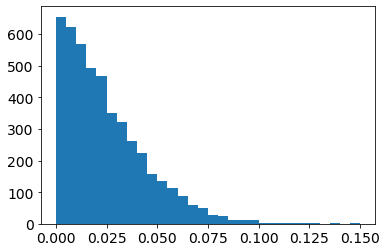

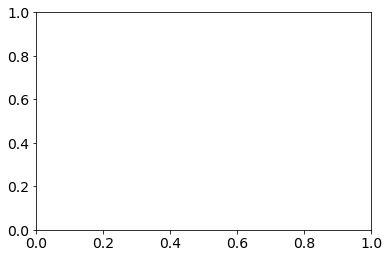

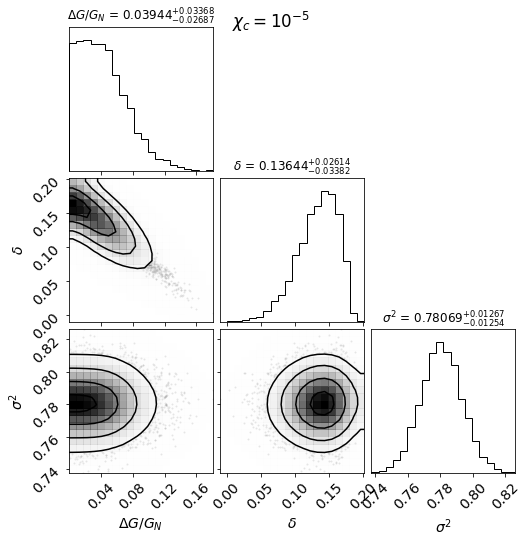

  7%|██▋                                      | 60/918 [00:00<00:02, 291.14it/s]

10492-12701 [50] [0.8637, 0.1543, -0.0689, -0.1828, -0.2742, -0.3676, -0.3896, -0.4391]
10492-12701 50.0 0.0 5.861542253667685e-06
10495-12704 [9.913511557788945] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 9.913511557788945 2.89443791493845e-06 2.9647170432220356e-06
10503-9102 [50] [1.6041, 541.447, 852.3708, 1185.6241, 1329.7425, 1362.6465, 1176.0843, 1080.9961, 943.2388, 880.8, 907.4312, 1209.8837, 1339.1686, 1802.5439, 1445.9568, 1212.1206]
10503-9102 50.0 0.0 6.877991266022432e-06


 13%|█████                                   | 117/918 [00:00<00:03, 265.93it/s]

11004-6104 [5.5658492462311555] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 5.5658492462311555 5.4534544313373986e-06 3.8114797785206074e-07
11013-3702 [50] [0.892, 1.1251, 0.8832, 0.571, 0.4173, 0.303, 0.2847, 0.354]
11013-3702 50.0 0.0 6.0437048916631306e-06


 19%|███████▍                                | 170/918 [00:00<00:03, 209.17it/s]

11761-12705 [0.5499] [6.8127, 3.6941, 2.4845, 1.3644, 0.5363]
11761-12705 0.5499 3.8044637104157687e-06 1.927715547178401e-06
11824-12705 [50] [0.9422, 0.7495, 0.4124, 0.1732, 0.1482, 0.1791, 0.1584, 0.0628, -0.0046, -0.0351, -0.0198, -0.0254, 0.0344, 0.0493]
11824-12705 50.0 0.0 5.976339904215814e-06
11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 8.901609735109465e-06


 21%|████████▎                               | 192/918 [00:00<00:04, 175.91it/s]

11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 1.254260830978852e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 2.51849683839053e-05
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 1.1762354926358825e-05


 27%|██████████▋                             | 246/918 [00:01<00:04, 143.63it/s]

12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 5.436635291664255e-05
12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 9.495634944335219e-06
12084-12704 [50] [-0.663, -0.3425, -0.4511, -0.3814, -0.1944, -0.0031, -0.041, -0.1276, -0.2047, -0.2499, -0.2565, -0.1988, -0.1657, -0.268, -0.3391, -0.2896]
12084-12704 50.0 0.0 6.268438220957761e-06


 31%|████████████▌                           | 288/918 [00:01<00:05, 111.50it/s]

12506-12701 [33.50747135678392] [3.9989, 2.1309, 1.191, 0.6195, 0.1758, -0.033, -0.1004, -0.1178, -0.0518, -0.083, -0.0685, -0.0455, -0.0133, 0.0564, 0.0444, -0.0249, -0.0901, -0.0863]
12506-12701 33.50747135678392 6.709037025064872e-08 5.792185338796471e-06


 42%|█████████████████▎                       | 389/918 [00:03<00:09, 54.50it/s]

8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 2.8602663050992944e-05


 45%|██████████████████▌                      | 417/918 [00:04<00:13, 36.11it/s]

8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 3.8328995701941006e-05


 47%|███████████████████▎                     | 433/918 [00:04<00:14, 33.24it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 1.073650869120969e-05


 59%|████████████████████████                 | 538/918 [00:08<00:17, 21.17it/s]

8445-3701


 69%|████████████████████████████▏            | 631/918 [00:14<00:23, 12.37it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 4.794057404364631e-05


 75%|██████████████████████████████▊          | 690/918 [00:19<00:21, 10.51it/s]

8932-12704 [50] [516.3538, 283.1717, 143.5924, 49.1172, 0.255, -0.4312, 17.9002, 4.5579, 21.069, 86.2333, 137.5185, 102.2111, 135.5044, 141.0057]
8932-12704 50.0 0.0 7.059141217409796e-06


 86%|███████████████████████████████████▍     | 793/918 [00:27<00:10, 11.94it/s]

9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 1.715801566521676e-05


 98%|████████████████████████████████████████▏| 901/918 [00:39<00:02,  6.70it/s]

9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 3.9969435993690014e-05
9886-12701 [50] [-0.2693, -0.4215, 0.2203, 0.315, 0.3371, 0.2259, 0.1577, 0.1744, 0.0705, -0.0045, -0.041, -0.0214, -0.0274, -0.14, -0.1803, -0.1799, -0.2518]
9886-12701 50.0 0.0 7.31046327969106e-06


100%|█████████████████████████████████████████| 918/918 [00:41<00:00, 22.12it/s]


Total number of points unscreened AD 4: 14515
Total number of points screened AD 4: 346
Total number of points unscreened AD 8: 14515
Total number of points screened AD 8: 346


100%|████████████████████████████████████| 10000/10000 [00:27<00:00, 361.39it/s]


chi= 5.859375e-06
burn-in: 171
thin: 19
flat chain shape: 5260
flat log prob shape: 5170
None


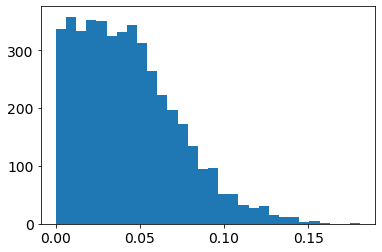

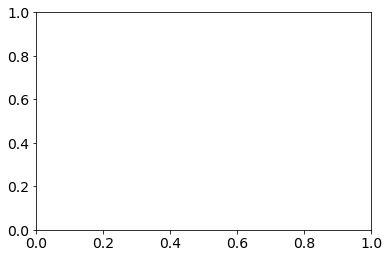

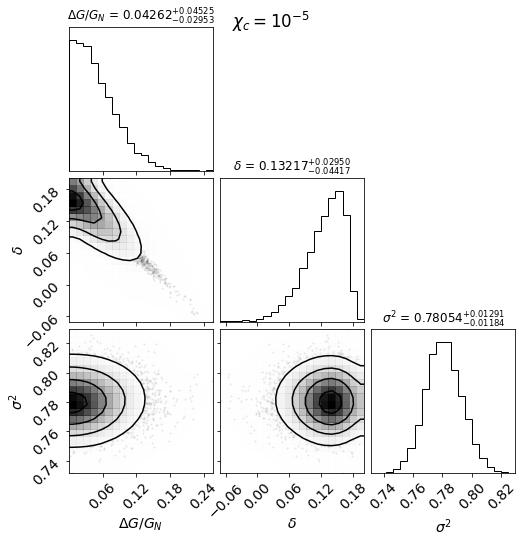

  5%|█▉                                       | 43/918 [00:00<00:04, 175.07it/s]

10492-12701 [0.1548] [0.8637]
10492-12701 0.1548 9.056462123526524e-07 7.51779259521016e-06
10495-12704 [3.232430150753769] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475, 1258.7601, 964.2777, 603.6992, 295.6568, 213.156, 164.2771, 237.7279, 162.3763, 284.7588]
10495-12704 3.232430150753769 4.899706783998754e-06 3.4246333370679176e-06
10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 2.4161699573034777e-05


 11%|████▍                                    | 99/918 [00:00<00:04, 171.20it/s]

11004-6104 [2.1849899497487435] [0.1363, 0.6537, 0.7321, 0.4048, 0.0441, -0.0587, 0.0839, 0.0697, 0.0304, 0.2349, 0.7127, 0.2063, 0.9188, 0.1539, 0.8578, 0.5843]
11004-6104 2.1849899497487435 7.778124126656003e-06 5.482899052308124e-07


 18%|███████▏                                | 165/918 [00:01<00:06, 125.36it/s]

11834-1902 [50] [717.5851, 639.9402, 1583.2476, 1243.5414, 2252.3943, 1970.5214, 1700.4766, 1741.3795, 1857.5565, 1483.6641, 1667.4578, 1474.5629, 1279.3394, 672.5402, 659.0684, 947.9048, 437.3732, 410.327, 456.0542, 78.9968, 227.9388, 51.7176]
11834-1902 50.0 0.0 9.202780000316907e-06


 21%|████████▍                                | 190/918 [00:01<00:07, 97.63it/s]

11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 1.596245992710651e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 3.11039725520714e-05
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 1.0417370011179548e-05


 26%|██████████▋                              | 240/918 [00:02<00:08, 78.39it/s]

12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 4.47066337217683e-05


 28%|███████████▍                             | 256/918 [00:02<00:09, 66.37it/s]

12081-6102 [50] [3.5049, 0.3288, 1.7471, 1.7684, 1.9693, 1.8262, 1.8079, 1.7621, 1.7208, 1.661, 1.5707, 1.548, 1.6114, 1.7553, 2.0586, 2.276]
12081-6102 50.0 0.0 1.0053154569938393e-05
12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0.0071, -0.0873, -0.0572, 0.0209, 0.0881, 0.0588, 0.0753, 0.0542]
12085-12704 50.0 0.0 1.036587195761797e-05


 42%|█████████████████▎                       | 388/918 [00:05<00:17, 31.14it/s]

8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.249410578589743e-05


 44%|██████████████████▏                      | 408/918 [00:06<00:17, 29.29it/s]

8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 3.2049769467051536e-05
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 3.0463910444487087e-05


 45%|██████████████████▌                      | 417/918 [00:06<00:18, 26.92it/s]

8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 3.8316112524555656e-05


 47%|███████████████████▎                     | 432/918 [00:06<00:17, 27.11it/s]

8243-12701 [0.4497] [-0.1757, -0.2325, -0.2106, -0.0827]
8243-12701 0.4497 6.091752117943235e-07 7.768376217254613e-06


 49%|████████████████████▏                    | 453/918 [00:07<00:19, 24.07it/s]

8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 1.5929679572460116e-05


 58%|███████████████████████▋                 | 530/918 [00:11<00:20, 18.95it/s]

8442-12705 [50] [-0.1499, 0.219, 0.0552, -0.0044, 0.1115, 0.1261, 0.1191, 0.097, 0.0767, 0.132, 0.4366]
8442-12705 50.0 0.0 8.858443305295042e-06


 59%|████████████████████████                 | 538/918 [00:11<00:17, 21.26it/s]

8445-3701


 69%|████████████████████████████▏            | 631/918 [00:17<00:21, 13.09it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 3.9570932986871594e-05


 72%|█████████████████████████████▎           | 657/918 [00:19<00:18, 13.77it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 3.541929397510801e-05


 86%|███████████████████████████████████▍     | 794/918 [00:32<00:14,  8.74it/s]

9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 1.8060785719099467e-05


 98%|████████████████████████████████████████▏| 901/918 [00:47<00:02,  5.99it/s]

9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 2.997351391426777e-05


100%|█████████████████████████████████████████| 918/918 [00:49<00:00, 18.38it/s]


Total number of points unscreened AD 4: 14544
Total number of points screened AD 4: 317
Total number of points unscreened AD 8: 14544
Total number of points screened AD 8: 317


100%|████████████████████████████████████| 10000/10000 [00:27<00:00, 369.85it/s]


chi= 8.4375e-06
burn-in: 105
thin: 21
flat chain shape: 4760
flat log prob shape: 4710
None


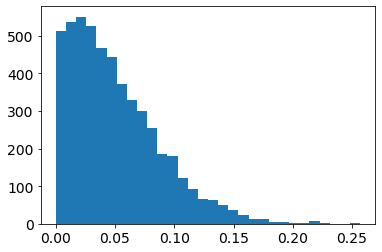

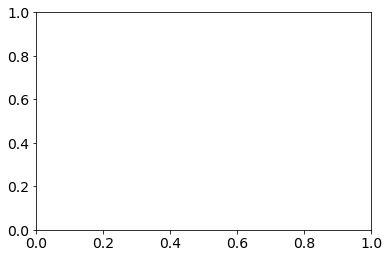

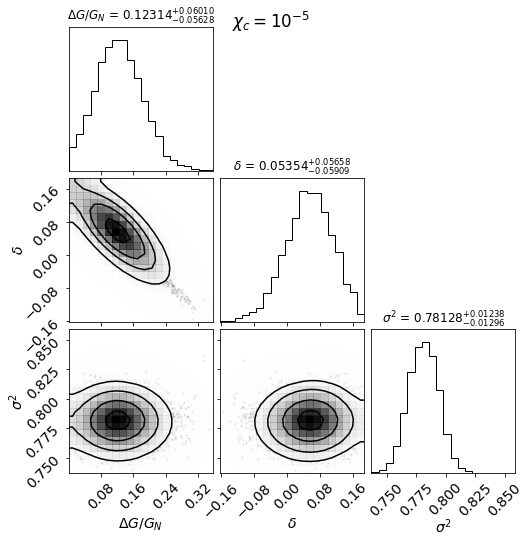

  5%|██▏                                      | 48/918 [00:00<00:04, 191.82it/s]

10495-12704 [1.6453] [71.631, 83.3249, 107.1548, 109.2527, 111.5234, 118.1237, 174.5186, 235.5303, 247.3908, 500.3635, 607.1609, 1364.6371, 1553.602, 1635.8673, 1316.1888, 1329.9475]
10495-12704 1.6453 6.030446642088001e-06 5.37625711112775e-06
10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 1.2439491279983148e-05


 12%|████▌                                   | 106/918 [00:00<00:04, 166.75it/s]

11004-6104 [0.5741] [0.1363, 0.6537]
11004-6104 0.5741 1.0468218533315193e-05 5.634172246569741e-07


 20%|████████                                | 184/918 [00:01<00:07, 104.21it/s]

11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 4.396254136912612e-05
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 1.9275230047271245e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 3.2528538427668334e-05
11954-12701 [50] [186.4962, 28.9713, 2.0786, 0.263, 0.0976, 0.337, 0.2636, 0.2347, 0.2716, 1.0529, 0.0788, 0.0952, 0.0091, 0.2259, 1.0668]
11954-12701 50.0 0.0 1.1847988391569382e-05


 27%|██████████▉                              | 246/918 [00:02<00:08, 79.60it/s]

12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 3.607356550237056e-05


 29%|███████████▋                             | 263/918 [00:02<00:09, 72.62it/s]

12085-12704 [0.2592] [0.391, 0.156, 0.1626]
12085-12704 0.2592 3.178417646469417e-07 1.1093931755971846e-05


 42%|█████████████████▏                       | 385/918 [00:05<00:15, 33.58it/s]

8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.147210633998661e-05


 44%|██████████████████▏                      | 408/918 [00:06<00:18, 27.25it/s]

8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 3.0722438957726845e-05
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 3.2261355437157986e-05


 45%|██████████████████▌                      | 417/918 [00:06<00:19, 25.88it/s]

8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 4.3110248871181576e-05


 47%|███████████████████▎                     | 432/918 [00:07<00:19, 25.40it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 4.1314795744800976e-05


 49%|████████████████████▏                    | 453/918 [00:07<00:20, 23.24it/s]

8254-12703 [50] [-0.1437, -0.4755, -0.347, -0.4986, -0.6373, -0.6128, -0.4425, -0.224, -0.2692, -0.1226, -0.3361, 0.4003, -0.275, -0.2344, 0.1017, 0.3238, -0.1479, -0.1308, 0.0039]
8254-12703 50.0 0.0 1.9418178992458885e-05


 58%|███████████████████████▉                 | 537/918 [00:12<00:18, 20.20it/s]

8445-3701


 69%|████████████████████████████▏            | 630/918 [00:18<00:23, 12.26it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 4.514653044744856e-05


 69%|████████████████████████████▍            | 638/918 [00:19<00:22, 12.46it/s]

8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 2.567242300353375e-05


 71%|█████████████████████████████▎           | 656/918 [00:20<00:22, 11.46it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 3.0088909633811235e-05


 86%|███████████████████████████████████▍     | 793/918 [00:34<00:16,  7.57it/s]

9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 1.9199960268686315e-05


 98%|████████████████████████████████████████▏| 901/918 [00:49<00:02,  6.38it/s]

9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 4.165881095929929e-05


100%|█████████████████████████████████████████| 918/918 [00:52<00:00, 17.56it/s]


Total number of points unscreened AD 4: 14590
Total number of points screened AD 4: 271
Total number of points unscreened AD 8: 14590
Total number of points screened AD 8: 271


100%|████████████████████████████████████| 10000/10000 [00:26<00:00, 381.37it/s]


chi= 1.1484375000000001e-05
burn-in: 126
thin: 19
flat chain shape: 5260
flat log prob shape: 5190
None


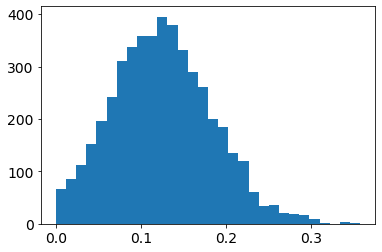

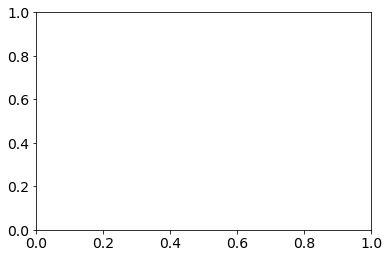

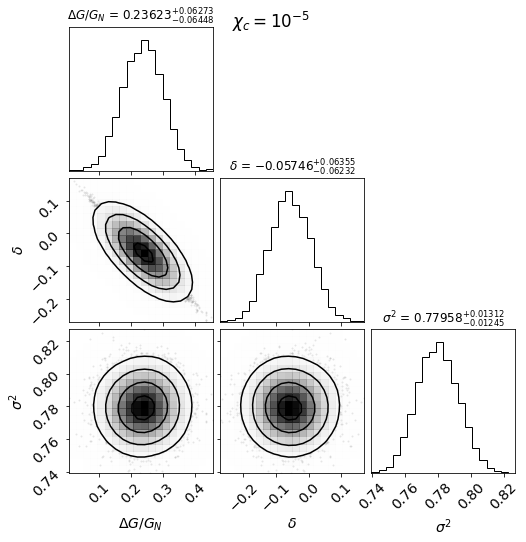

 15%|██████▏                                 | 141/918 [00:00<00:03, 247.16it/s]

11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 3.026313742613644e-05


 21%|████████▎                               | 191/918 [00:00<00:03, 192.11it/s]

11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 4.6623632835207215e-05
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 3.159028470730963e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 3.2628494829088654e-05


 27%|██████████▊                             | 248/918 [00:01<00:04, 144.80it/s]

12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 3.699626656856598e-05


 29%|███████████▍                            | 263/918 [00:01<00:05, 130.14it/s]

12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0.0071, -0.0873, -0.0572, 0.0209, 0.0881, 0.0588, 0.0753, 0.0542]
12085-12704 50.0 0.0 1.9767164662516128e-05


 43%|█████████████████▋                       | 396/918 [00:03<00:08, 60.24it/s]

8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.162082524310165e-05


 45%|██████████████████▎                      | 409/918 [00:03<00:09, 54.34it/s]

8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 2.3629071149275115e-05
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 3.256120960718764e-05
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 4.134425589522768e-05


 47%|███████████████████▍                     | 436/918 [00:04<00:10, 47.04it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 3.2118256344296294e-05


 59%|████████████████████████                 | 538/918 [00:06<00:11, 32.03it/s]

8445-3701


 62%|█████████████████████████▎               | 567/918 [00:08<00:22, 15.93it/s]

8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 4.508649450187872e-05


 69%|████████████████████████████▏            | 631/918 [00:12<00:22, 12.91it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 5.568035300853417e-05


 69%|████████████████████████████▍            | 638/918 [00:13<00:19, 14.28it/s]

8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 6.328326531987569e-05
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 2.685058053528408e-05


 71%|█████████████████████████████▎           | 656/918 [00:14<00:21, 12.17it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 3.989829067365466e-05


 86%|███████████████████████████████████▍     | 794/918 [00:28<00:14,  8.45it/s]

9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 1.931219197822366e-05


 98%|████████████████████████████████████████▏| 901/918 [00:42<00:02,  6.22it/s]

9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 2.1650602672215895e-05


100%|█████████████████████████████████████████| 918/918 [00:45<00:00, 20.34it/s]


Total number of points unscreened AD 4: 14591
Total number of points screened AD 4: 270
Total number of points unscreened AD 8: 14591
Total number of points screened AD 8: 270


100%|████████████████████████████████████| 10000/10000 [00:29<00:00, 334.68it/s]


chi= 1.4999999999999999e-05
burn-in: 114
thin: 20
flat chain shape: 5000
flat log prob shape: 4940
None


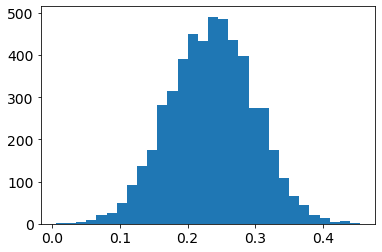

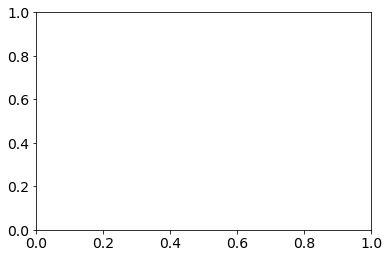

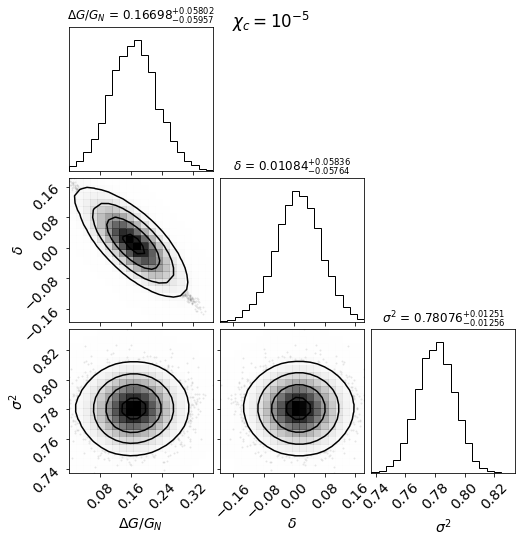

  7%|██▊                                      | 64/918 [00:00<00:02, 298.54it/s]

10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 2.4521149774576064e-05
10506-9101 [50] [-0.2543, 0.5091, 0.8262, 0.5675, 0.2552, 0.0764, 0.0245, 0.0392, 0.0453, 0.0366, -0.0056, -0.0369, -0.0612, -0.0986, -0.132, -0.0742, -0.1191]
10506-9101 50.0 0.0 2.2798794813661438e-05


 14%|█████▍                                  | 124/918 [00:00<00:03, 251.62it/s]

11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 3.0862648314213156e-05


 21%|████████▎                               | 190/918 [00:01<00:06, 119.28it/s]

11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 4.780007741744214e-05
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 3.6023327796785664e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 3.660110271670215e-05


 26%|██████████▋                              | 240/918 [00:01<00:07, 87.39it/s]

12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 3.596162765023785e-05


 29%|███████████▉                             | 267/918 [00:02<00:09, 71.92it/s]

12085-12704 [50] [0.391, 0.156, 0.1626, 0.1228, 0.0762, -0.0071, -0.0873, -0.0572, 0.0209, 0.0881, 0.0588, 0.0753, 0.0542]
12085-12704 50.0 0.0 2.1722688273464616e-05


 38%|███████████████▍                         | 346/918 [00:03<00:13, 41.57it/s]

7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 3.252342692290481e-05


 42%|█████████████████▎                       | 387/918 [00:04<00:15, 35.01it/s]

8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.2564653389009945e-05


 44%|██████████████████▏                      | 407/918 [00:05<00:16, 30.32it/s]

8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 3.172031781581358e-05
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 2.6836043056584284e-05


 46%|██████████████████▋                      | 418/918 [00:06<00:17, 28.25it/s]

8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 5.1036933221035195e-05


 47%|███████████████████▏                     | 430/918 [00:06<00:18, 26.86it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 6.604546770364546e-05


 50%|████████████████████▌                    | 461/918 [00:07<00:19, 23.62it/s]

8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 2.2161415177581076e-05


 58%|███████████████████████▉                 | 537/918 [00:11<00:19, 19.94it/s]

8445-12701 [50] [1.5119, 1.6414, 0.9935, 0.3616, 0.19, 0.0909, 0.075, 0.0326, 0.0582, 0.1325, 0.212, 0.3436, 0.331]
8445-12701 50.0 0.0 2.092889504131145e-05
8445-3701


 62%|█████████████████████████▎               | 568/918 [00:12<00:22, 15.71it/s]

8482-12705 [50] [1.7259, 0.977, 0.6612, 0.3095, 0.0268, -0.0931, -0.1018, -0.1187, -0.1169, -0.0144, -0.0974, 0.0524, -0.0147, 0.2208, -0.0641]
8482-12705 50.0 0.0 5.1643063858081176e-05


 68%|███████████████████████████▊             | 622/918 [00:16<00:22, 13.25it/s]

8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 2.3263492766805544e-05


 69%|████████████████████████████▏            | 630/918 [00:17<00:22, 12.70it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 5.8232286086376113e-05


 70%|████████████████████████████▌            | 639/918 [00:17<00:20, 13.52it/s]

8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 3.680579560436241e-05
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 3.101120129314859e-05


 72%|█████████████████████████████▎           | 657/918 [00:19<00:21, 11.97it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 6.115484644077723e-05


 72%|█████████████████████████████▍           | 659/918 [00:19<00:22, 11.50it/s]

8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 5.2596978951236504e-05


 77%|███████████████████████████████▊         | 711/918 [00:23<00:19, 10.46it/s]

8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 2.0732348476450296e-05


 86%|███████████████████████████████████▍     | 793/918 [00:32<00:15,  8.11it/s]

9182-12702 [50] [-0.0132, -0.098, -0.0329, -0.0037, 0.0626, 0.0362, 0.0262, -0.0238, -0.0711, -0.0813, -0.0859, -0.0901, -0.0683, 0.0137, 0.0637, 0.1389]
9182-12702 50.0 0.0 2.013833587901148e-05


 98%|████████████████████████████████████████▏| 901/918 [00:46<00:02,  6.17it/s]

9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 4.158600964919243e-05


100%|█████████████████████████████████████████| 918/918 [00:49<00:00, 18.63it/s]


Total number of points unscreened AD 4: 14485
Total number of points screened AD 4: 376
Total number of points unscreened AD 8: 14485
Total number of points screened AD 8: 376


100%|████████████████████████████████████| 10000/10000 [00:29<00:00, 339.27it/s]


chi= 1.8984374999999996e-05
burn-in: 125
thin: 20
flat chain shape: 5000
flat log prob shape: 4930
None


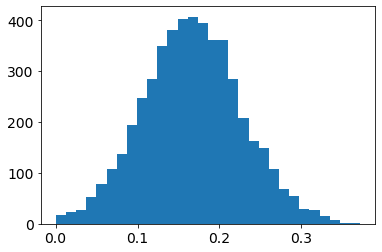

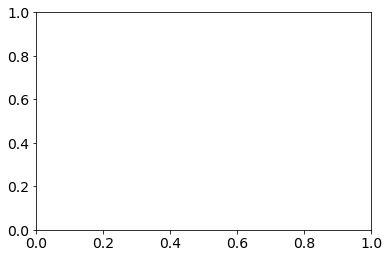

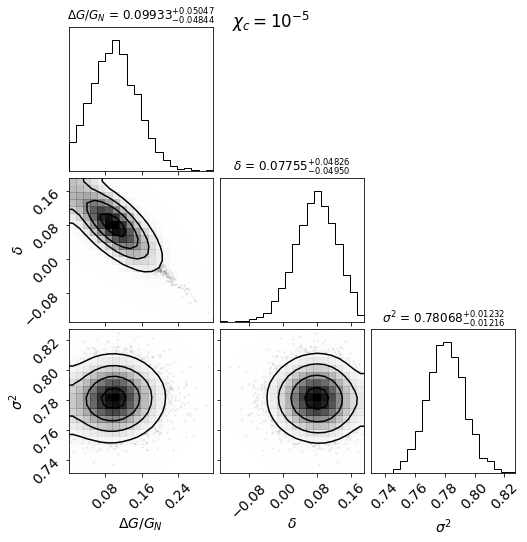

  7%|██▊                                      | 62/918 [00:00<00:04, 191.57it/s]

10500-1901 [50] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 50.0 0.0 2.5322206727777392e-05
10506-9101 [50] [-0.2543, 0.5091, 0.8262, 0.5675, 0.2552, 0.0764, 0.0245, 0.0392, 0.0453, 0.0366, -0.0056, -0.0369, -0.0612, -0.0986, -0.132, -0.0742, -0.1191]
10506-9101 50.0 0.0 2.393130324725661e-05


 13%|█████▎                                  | 123/918 [00:00<00:05, 148.99it/s]

11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 4.832277764028135e-05
11747-12702 [50] [-0.4876, -0.2412, -0.0165, -0.0887, -0.0931, -0.0756, -0.076, -0.0313, -0.0043, 0.0037, -0.0318, -0.1133, 0.1257, -0.1019, 0.1921, -0.2837, -0.0753]
11747-12702 50.0 0.0 2.7673310755818723e-05


 21%|████████▍                               | 195/918 [00:01<00:06, 108.61it/s]

11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 5.523168082647654e-05
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 3.711280758653268e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 4.8482330747045265e-05


 26%|██████████▋                              | 239/918 [00:01<00:08, 77.69it/s]

12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 3.5279591676886805e-05


 38%|███████████████▍                         | 347/918 [00:04<00:14, 40.33it/s]

7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 2.4041706444503653e-05


 42%|█████████████████▎                       | 389/918 [00:05<00:16, 32.89it/s]

8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.157076314409295e-05


 45%|██████████████████▎                      | 409/918 [00:05<00:16, 30.32it/s]

8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 2.400004798343789e-05
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 3.4929118052604e-05


 45%|██████████████████▌                      | 416/918 [00:06<00:18, 26.81it/s]

8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 4.7679120970937534e-05


 47%|███████████████████▎                     | 432/918 [00:06<00:18, 26.64it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 3.972600564705844e-05


 50%|████████████████████▋                    | 462/918 [00:08<00:19, 23.46it/s]

8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 3.002138817873144e-05


 58%|███████████████████████▉                 | 537/918 [00:11<00:18, 20.66it/s]

8445-3701


 68%|███████████████████████████▊             | 622/918 [00:17<00:23, 12.78it/s]

8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 2.5838988580493073e-05


 69%|████████████████████████████▏            | 632/918 [00:18<00:21, 13.21it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 6.768880079335168e-05


 70%|████████████████████████████▌            | 639/918 [00:18<00:20, 13.46it/s]

8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 3.657542910545252e-05
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 3.659208364436409e-05


 72%|█████████████████████████████▎           | 657/918 [00:20<00:22, 11.54it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 3.549289464930089e-05


 72%|█████████████████████████████▍           | 659/918 [00:20<00:23, 11.09it/s]

8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 2.564822293942604e-05


 77%|███████████████████████████████▊         | 711/918 [00:24<00:20,  9.91it/s]

8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 3.052127626921279e-05


 98%|████████████████████████████████████████▏| 901/918 [00:47<00:02,  6.25it/s]

9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 4.017117454150881e-05


100%|█████████████████████████████████████████| 918/918 [00:49<00:00, 18.46it/s]


Total number of points unscreened AD 4: 14525
Total number of points screened AD 4: 336
Total number of points unscreened AD 8: 14525
Total number of points screened AD 8: 336


100%|████████████████████████████████████| 10000/10000 [00:24<00:00, 414.31it/s]


chi= 2.3437499999999994e-05
burn-in: 114
thin: 20
flat chain shape: 5000
flat log prob shape: 4940
None


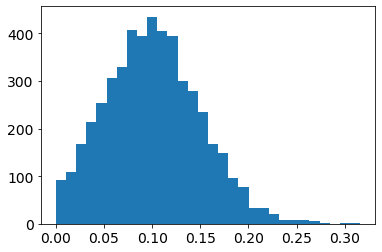

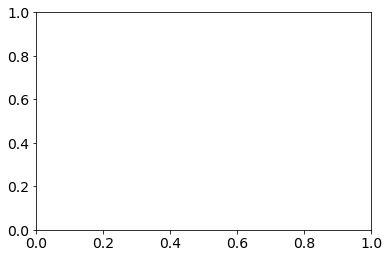

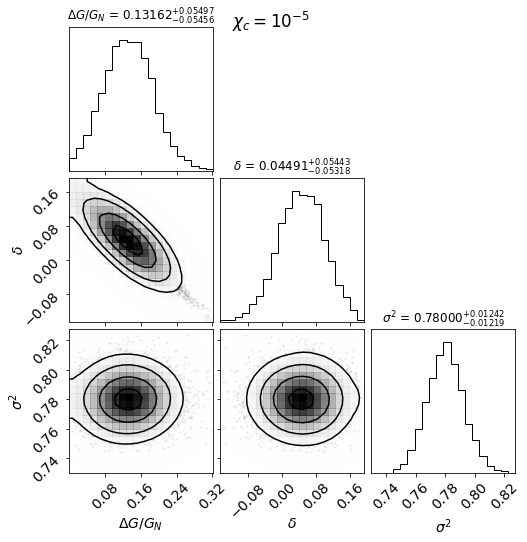

  8%|███▎                                     | 74/918 [00:00<00:02, 319.14it/s]

10506-9101 [50] [-0.2543, 0.5091, 0.8262, 0.5675, 0.2552, 0.0764, 0.0245, 0.0392, 0.0453, 0.0366, -0.0056, -0.0369, -0.0612, -0.0986, -0.132, -0.0742, -0.1191]
10506-9101 50.0 0.0 3.216077013538309e-05


 15%|█████▉                                  | 136/918 [00:00<00:02, 270.10it/s]

11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 5.362867413417528e-05


 21%|████████▎                               | 190/918 [00:00<00:03, 203.44it/s]

11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 4.4922936783282105e-05
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 4.274244484984439e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 4.94003823161962e-05


 27%|██████████▉                             | 250/918 [00:01<00:04, 155.91it/s]

12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 3.885675329675504e-05


 38%|███████████████▋                         | 351/918 [00:02<00:06, 84.03it/s]

7968-6101 [50] [1.702, 3.0429, 2.3213, 2.3335, 1.9583, 1.7289, 1.3841, 1.3038, 1.1959, 1.0075, 1.1429, 0.7557, 1.5375, 0.4966]
7968-6101 50.0 0.0 3.2243125969263384e-05


 43%|█████████████████▌                       | 392/918 [00:02<00:08, 65.60it/s]

8132-6102 [50] [41.8211, 1590.3538, 423.5174, 765.2284, 1470.5353, 1050.2873, 1048.6536, 1302.7199, 942.3758, 733.8863, 629.1716, 578.5154, 603.9501, 10.8967]
8132-6102 50.0 0.0 3.170054071306407e-05


 45%|██████████████████▍                      | 412/918 [00:03<00:09, 56.12it/s]

8146-12701 [50] [0.0601, 0.0138, -0.1773, -0.2706, -0.3352, -0.3651, -0.3923, -0.3618, -0.357, -0.3888, -0.4078, -0.4054, -0.3666, -0.3422]
8146-12701 50.0 0.0 3.628277369521478e-05
8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 3.8964934452681393e-05
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 4.994900484306248e-05


 47%|███████████████████▍                     | 436/918 [00:03<00:09, 49.90it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 3.991590405033093e-05


 51%|████████████████████▊                    | 466/918 [00:04<00:10, 41.24it/s]

8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 3.168160026055209e-05


 59%|████████████████████████                 | 539/918 [00:06<00:12, 30.21it/s]

8445-3701


 68%|███████████████████████████▊             | 624/918 [00:11<00:13, 21.32it/s]

8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 4.115116834385913e-05


 69%|████████████████████████████▎            | 633/918 [00:11<00:13, 21.57it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 7.018917051240662e-05


 70%|████████████████████████████▌            | 640/918 [00:11<00:12, 22.06it/s]

8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 4.160373390583269e-05
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 5.028964153764767e-05


 72%|█████████████████████████████▍           | 658/918 [00:12<00:12, 20.88it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 5.2352381206034386e-05
8625-9102 [50] [1.8671, 0.427, 0.5193, 0.4146, 0.2906, 0.2951, 0.2888, 0.2785, 0.2965, 0.2236, 0.2521, 0.3029, 0.2551, 0.2702, 0.2514, 0.2024]
8625-9102 50.0 0.0 3.349270467198621e-05


 78%|███████████████████████████████▊         | 712/918 [00:15<00:11, 17.54it/s]

8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 4.825404890183286e-05


 97%|███████████████████████████████████████▌ | 887/918 [00:36<00:04,  6.65it/s]

9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 7.044125583217799e-05


 98%|████████████████████████████████████████▏| 901/918 [00:37<00:01,  9.98it/s]

9885-3704 [50] [88.9333, 312.9796, 595.7906, 1288.8417, 1565.5729, 1519.7672, 1589.4851, 1490.4732, 1280.6809, 1322.5145, 1195.0745, 1039.7195, 900.8966, 859.0957, 448.3807, 128.7959]
9885-3704 50.0 0.0 3.539697018162869e-05


100%|█████████████████████████████████████████| 918/918 [00:39<00:00, 23.31it/s]


Total number of points unscreened AD 4: 14532
Total number of points screened AD 4: 329
Total number of points unscreened AD 8: 14532
Total number of points screened AD 8: 329


100%|████████████████████████████████████| 10000/10000 [00:28<00:00, 347.33it/s]


chi= 2.8359375000000003e-05
burn-in: 111
thin: 20
flat chain shape: 5000
flat log prob shape: 4940
None


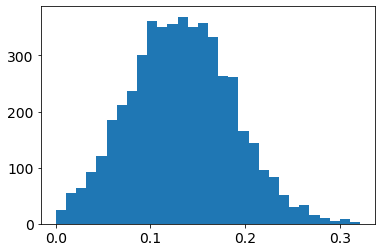

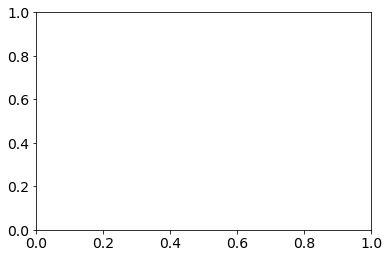

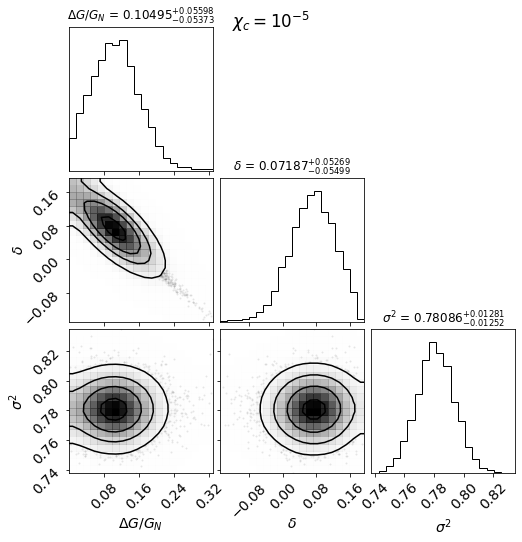

 15%|█████▉                                  | 135/918 [00:00<00:04, 161.25it/s]

11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 6.60140807371943e-05


 20%|████████                                | 185/918 [00:01<00:06, 117.28it/s]

11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 6.00307901836652e-05
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 4.849743615720486e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 5.15450303885095e-05


 27%|██████████▉                              | 244/918 [00:01<00:07, 85.66it/s]

12067-6101 [50] [1.8166, 0.6588, 0.5317, 0.3971, 0.2793, 0.1055, -0.0281, 0.0207, -0.0127, -0.069, 0.0302, 0.1845, 0.0421, -0.2826]
12067-6101 50.0 0.0 3.4600935428098554e-05


 45%|██████████████████▍                      | 413/918 [00:05<00:17, 28.39it/s]

8147-9101 [50] [-0.4409, -0.151, 0.3547, 0.3801, 0.2237, 0.1113, 0.0662, 0.0572, 0.0283, 0.034, 0.0095, -0.0009, -0.0191, -0.0587, -0.061, -0.0506, -0.0364, -0.0254]
8147-9101 50.0 0.0 4.052601025586697e-05
8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 3.750312953992556e-05


 47%|███████████████████▎                     | 432/918 [00:06<00:18, 26.88it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 4.2335925669133264e-05


 59%|████████████████████████                 | 538/918 [00:11<00:17, 21.30it/s]

8445-3701


 68%|███████████████████████████▊             | 622/918 [00:16<00:22, 13.17it/s]

8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 3.6347092816276836e-05


 69%|████████████████████████████▏            | 630/918 [00:17<00:22, 12.71it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 7.107361574971809e-05


 70%|████████████████████████████▌            | 639/918 [00:18<00:21, 12.94it/s]

8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 4.2216607427806456e-05
8611-9102 [50] [-0.1655, 0.0826, 0.2631, 0.2648, 0.2696, 0.3055, 0.2957, 0.3084, 0.331, 0.2722, 0.2301, 0.2749, 0.2267, 0.2064, 0.1809, 0.0464, -0.0171, 0.3596]
8611-9102 50.0 0.0 5.174292434349079e-05


 70%|████████████████████████████▋            | 641/918 [00:18<00:22, 12.36it/s]

8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 5.574108654019078e-05


 72%|█████████████████████████████▎           | 657/918 [00:19<00:20, 12.71it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 4.268380626063833e-05


 77%|███████████████████████████████▊         | 711/918 [00:24<00:20, 10.14it/s]

8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 4.0798531368428606e-05


 97%|███████████████████████████████████████▌ | 887/918 [00:45<00:04,  6.66it/s]

9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 4.3224192631718646e-05


100%|█████████████████████████████████████████| 918/918 [00:50<00:00, 18.30it/s]


Total number of points unscreened AD 4: 14619
Total number of points screened AD 4: 242
Total number of points unscreened AD 8: 14619
Total number of points screened AD 8: 242


100%|████████████████████████████████████| 10000/10000 [00:30<00:00, 324.63it/s]


chi= 3.375e-05
burn-in: 117
thin: 20
flat chain shape: 5000
flat log prob shape: 4940
None


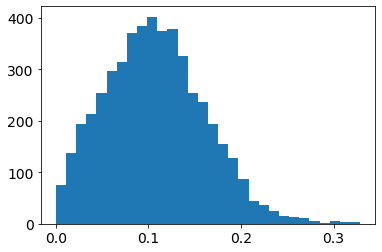

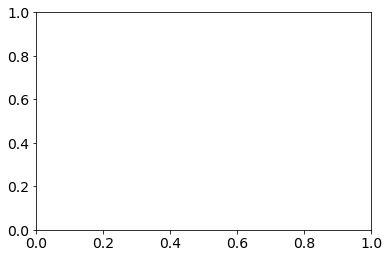

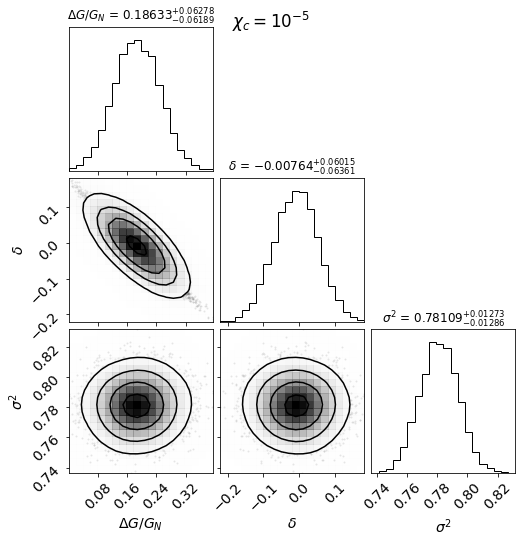

  7%|███                                      | 68/918 [00:00<00:04, 204.67it/s]

10500-1901 [2.6163552763819093] [-0.4369, -0.5767, -0.5555, -0.623, -0.65, -0.6477, -0.663]
10500-1901 2.6163552763819093 2.5901295829959616e-07 3.934571936461498e-05


 14%|█████▌                                  | 127/918 [00:00<00:04, 160.32it/s]

11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 5.988217691535088e-05


 21%|████████▏                               | 189/918 [00:01<00:06, 106.74it/s]

11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 6.517099475248224e-05
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 5.490007654878092e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 6.016018734177284e-05


 46%|██████████████████▋                      | 418/918 [00:06<00:17, 29.39it/s]

8152-3703 [50] [-0.0145, 0.113, 0.5023, 0.048, 0.1612, 0.0956, 0.0832, 0.0829, 0.1502, 0.0877, 0.049, 0.049, -0.0484, -0.0328, -0.0888, -0.1854, -0.0733]
8152-3703 50.0 0.0 4.9591714144528466e-05


 47%|███████████████████▎                     | 432/918 [00:06<00:17, 27.63it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 4.0036152976273e-05


 50%|████████████████████▋                    | 462/918 [00:07<00:19, 23.96it/s]

8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 5.5952414208105724e-05


 59%|████████████████████████                 | 539/918 [00:11<00:18, 20.41it/s]

8445-3701


 68%|███████████████████████████▊             | 622/918 [00:16<00:22, 12.94it/s]

8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 5.456439573017913e-05


 69%|████████████████████████████▏            | 632/918 [00:17<00:21, 13.44it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 7.282241210140172e-05


 70%|████████████████████████████▌            | 639/918 [00:18<00:20, 13.70it/s]

8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 4.5977039156052916e-05
8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 4.1926968289411e-05


 72%|█████████████████████████████▎           | 657/918 [00:19<00:22, 11.80it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 4.5659778462697276e-05


 97%|███████████████████████████████████████▋ | 888/918 [00:42<00:02, 11.32it/s]

9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 4.392575955892999e-05


100%|█████████████████████████████████████████| 918/918 [00:45<00:00, 20.16it/s]


Total number of points unscreened AD 4: 14658
Total number of points screened AD 4: 203
Total number of points unscreened AD 8: 14658
Total number of points screened AD 8: 203


100%|████████████████████████████████████| 10000/10000 [00:30<00:00, 327.87it/s]


chi= 3.9609375000000006e-05
burn-in: 125
thin: 9
flat chain shape: 11110
flat log prob shape: 10970
None


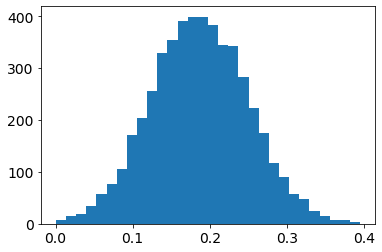

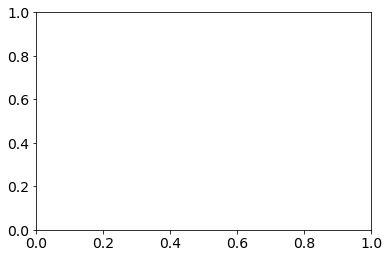

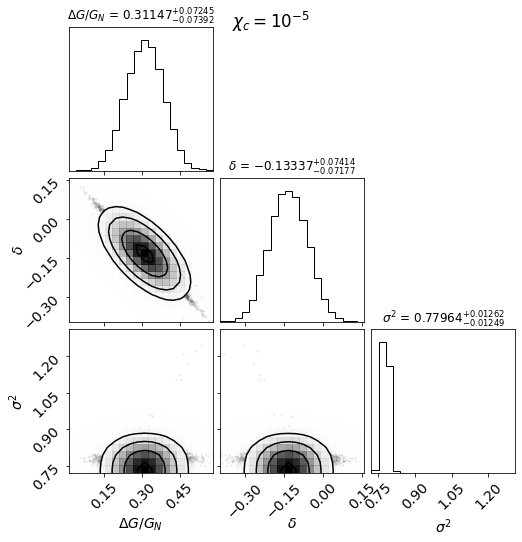

  7%|██▊                                      | 64/918 [00:00<00:04, 185.19it/s]

10506-9101 [50] [-0.2543, 0.5091, 0.8262, 0.5675, 0.2552, 0.0764, 0.0245, 0.0392, 0.0453, 0.0366, -0.0056, -0.0369, -0.0612, -0.0986, -0.132, -0.0742, -0.1191]
10506-9101 50.0 0.0 5.448760513411614e-05


 13%|█████▏                                  | 119/918 [00:00<00:05, 146.67it/s]

11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 6.134624574339454e-05


 21%|████████▎                               | 191/918 [00:01<00:07, 103.26it/s]

11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 6.605658382338176e-05
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 5.306327492739773e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 5.990416514564107e-05


 47%|███████████████████▎                     | 432/918 [00:06<00:18, 25.77it/s]

8243-12701 [0.2544] [-0.1757, -0.2325, -0.2106]
8243-12701 0.2544 8.070317891389715e-07 4.512516989257429e-05


 50%|████████████████████▋                    | 462/918 [00:07<00:19, 23.20it/s]

8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 5.687551340751303e-05


 57%|███████████████████████▎                 | 523/918 [00:10<00:13, 30.29it/s]

8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 5.1036342114543763e-05


 59%|████████████████████████                 | 540/918 [00:10<00:11, 33.13it/s]

8445-3701


 68%|███████████████████████████▊             | 623/918 [00:15<00:22, 13.23it/s]

8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 5.023027895146561e-05


 69%|████████████████████████████▏            | 631/918 [00:15<00:22, 12.99it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 7.471397624744791e-05


 70%|████████████████████████████▌            | 640/918 [00:16<00:20, 13.89it/s]

8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 5.105817293991931e-05


 71%|█████████████████████████████▎           | 656/918 [00:17<00:21, 12.36it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 4.727502530686801e-05


 97%|███████████████████████████████████████▌ | 887/918 [00:41<00:04,  6.58it/s]

9872-9102 [50] [129.6207, 510.4922, 755.3233, 850.4982, 782.8195, 692.3565, 632.9423, 622.1716, 612.0857, 602.3466, 608.3759, 552.7174, 470.8423, 433.4724, 440.2174, 437.7264, 562.4897]
9872-9102 50.0 0.0 4.9183182812722324e-05


100%|█████████████████████████████████████████| 918/918 [00:46<00:00, 19.83it/s]


Total number of points unscreened AD 4: 14680
Total number of points screened AD 4: 181
Total number of points unscreened AD 8: 14680
Total number of points screened AD 8: 181


100%|████████████████████████████████████| 10000/10000 [00:29<00:00, 339.84it/s]


chi= 4.5937500000000005e-05
burn-in: 142
thin: 9
flat chain shape: 11110
flat log prob shape: 10950
None


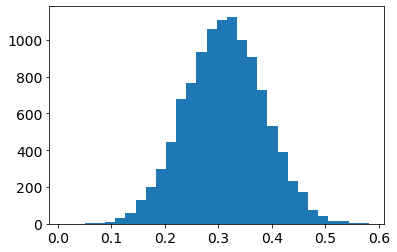

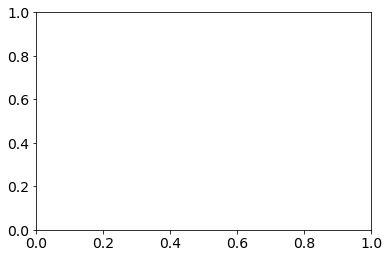

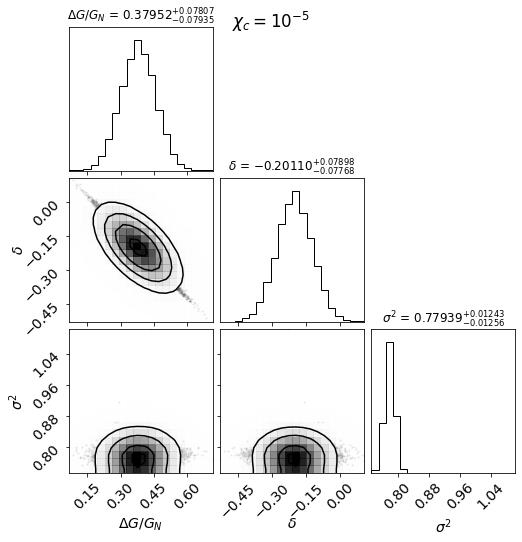

  8%|███▏                                     | 72/918 [00:00<00:05, 151.66it/s]

10506-9101 [50] [-0.2543, 0.5091, 0.8262, 0.5675, 0.2552, 0.0764, 0.0245, 0.0392, 0.0453, 0.0366, -0.0056, -0.0369, -0.0612, -0.0986, -0.132, -0.0742, -0.1191]
10506-9101 50.0 0.0 6.24856540455609e-05


 13%|█████▎                                  | 121/918 [00:00<00:05, 150.97it/s]

11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 6.771145092731766e-05


 20%|████████▏                                | 182/918 [00:01<00:07, 94.78it/s]

11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 7.051829933070583e-05
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 6.46820268016037e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 6.289414245366666e-05


 47%|███████████████████▏                     | 429/918 [00:06<00:14, 34.40it/s]

8243-12701 [50] [-0.1757, -0.2325, -0.2106, -0.0827, -0.0882, -0.1538, -0.1226, -0.0813, -0.0516, -0.0382, -0.0606, -0.0945, -0.1164, 0.0557]
8243-12701 50.0 0.0 6.242341155854706e-05


 50%|████████████████████▋                    | 462/918 [00:08<00:20, 22.77it/s]

8258-3704 [50] [3738.5216, 2128.3813, 1794.9148, 1715.041, 1637.1746, 1672.1719, 1655.4335, 1771.2647, 1642.5187, 1750.6527, 1448.3701, 1458.4381, 1664.1564, 994.4899]
8258-3704 50.0 0.0 6.460529144561056e-05


 57%|███████████████████████▎                 | 523/918 [00:11<00:22, 17.73it/s]

8440-12701 [50] [0.1944, 0.0954, 0.1478, -0.0554, -0.3019, -0.3661, -0.3982, -0.455, -0.5011, -0.4864, -0.4622]
8440-12701 50.0 0.0 5.31141407372264e-05


 59%|████████████████████████                 | 539/918 [00:12<00:19, 18.98it/s]

8445-3701


 69%|████████████████████████████▏            | 630/918 [00:18<00:24, 11.95it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 7.595958616603766e-05


 70%|████████████████████████████▋            | 641/918 [00:19<00:21, 13.16it/s]

8612-6104 [50] [0.3324, 0.414, 0.5419, 0.4873, 0.3526, 0.2923, 0.2151, 0.2234, 0.1655, 0.0859, 0.032, -0.0042, -0.0395, -0.1113]
8612-6104 50.0 0.0 5.76514971556373e-05


100%|█████████████████████████████████████████| 918/918 [00:49<00:00, 18.43it/s]


Total number of points unscreened AD 4: 14715
Total number of points screened AD 4: 146
Total number of points unscreened AD 8: 14715
Total number of points screened AD 8: 146


100%|████████████████████████████████████| 10000/10000 [00:17<00:00, 558.19it/s]


chi= 5.2734375000000006e-05
burn-in: 132
thin: 9
flat chain shape: 11110
flat log prob shape: 10960
None


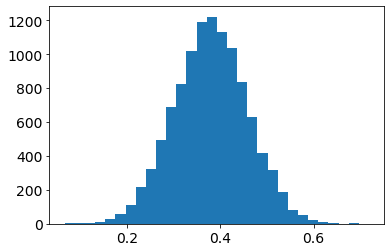

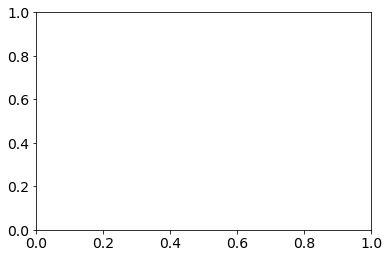

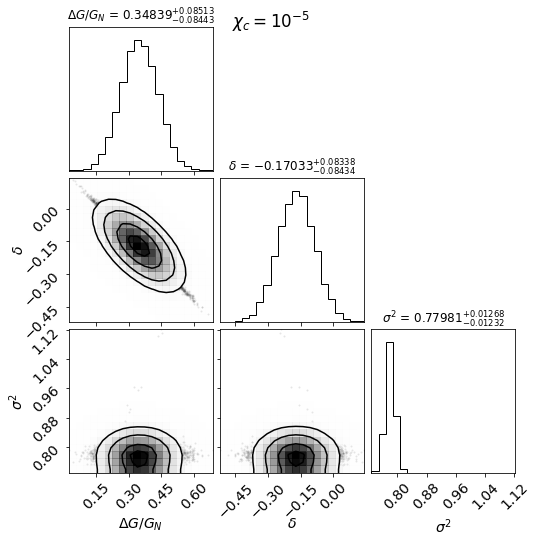

 16%|██████▍                                 | 148/918 [00:00<00:02, 279.99it/s]

11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 7.319187788491229e-05


 22%|████████▊                               | 203/918 [00:00<00:03, 205.18it/s]

11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 7.219612529874841e-05
11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 6.857942350322927e-05
11942-12702 [50] [-0.761, -0.4275, -0.2047, -0.428, -0.5153, -0.5237, -0.4045, -0.4056, -0.4766, -0.3558, -0.2579]
11942-12702 50.0 0.0 6.401111615377095e-05


 59%|████████████████████████▏                | 541/918 [00:06<00:10, 34.35it/s]

8445-3701


 68%|███████████████████████████▊             | 623/918 [00:09<00:12, 23.54it/s]

8601-12702 [50] [-0.9976, -0.995, -0.9926, -0.9925, -0.9921, -0.992, -0.9925, -0.9932, -0.9924, -0.9907, -0.9902, -0.9925, -0.9928, -0.9926, -0.9897]
8601-12702 50.0 0.0 6.49667796982401e-05


 69%|████████████████████████████▏            | 632/918 [00:09<00:12, 22.53it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 7.808733656739787e-05


 70%|████████████████████████████▋            | 641/918 [00:10<00:11, 23.71it/s]

8611-9101 [50] [0.0283, 0.7223, 1.4174, 1.5566, 1.1696, 0.9815, 0.7705, 0.655, 0.4849, 0.3364, 0.2016, 0.3102, 0.2954, 0.373, 0.2128]
8611-9101 50.0 0.0 6.211300775589077e-05


 72%|█████████████████████████████▍           | 659/918 [00:11<00:12, 21.43it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 6.50400804832409e-05


100%|█████████████████████████████████████████| 918/918 [00:29<00:00, 31.45it/s]


Total number of points unscreened AD 4: 14741
Total number of points screened AD 4: 120
Total number of points unscreened AD 8: 14741
Total number of points screened AD 8: 120


100%|████████████████████████████████████| 10000/10000 [00:27<00:00, 367.44it/s]


chi= 6.000000000000001e-05
burn-in: 135
thin: 9
flat chain shape: 11110
flat log prob shape: 10960
None


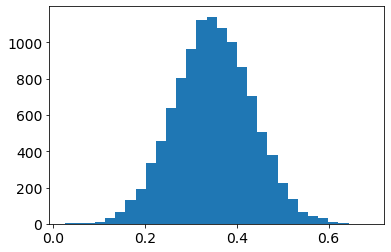

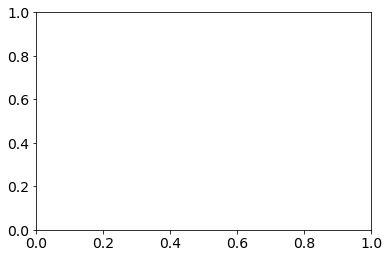

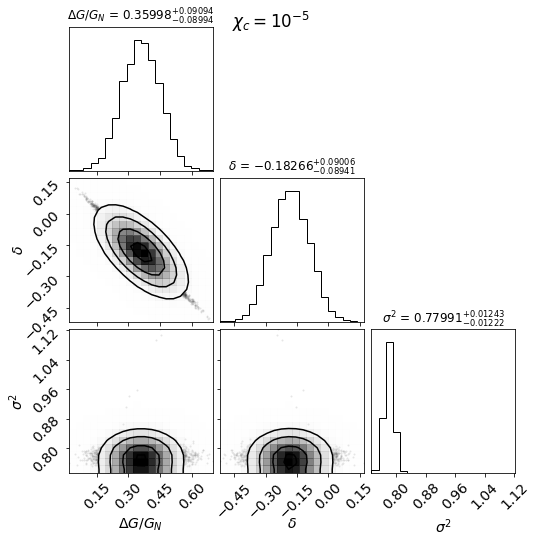

 13%|█████▎                                  | 122/918 [00:00<00:04, 166.63it/s]

11025-9102 [50] [274.7582, 616.813, 994.1212, 806.2343, 986.5253, 1069.3297, 929.4423, 688.5978, 602.8486, 514.545, 456.0483, 514.4579, 355.9448, 238.4442, 97.7917, 55.5363, 35.1962, 19.0393, 12.1924]
11025-9102 50.0 0.0 9.260909922543683e-05


 20%|████████▏                               | 188/918 [00:01<00:05, 127.45it/s]

11941-12705 [50] [0.818, 0.5295, 0.0559, -0.1409, -0.0302, -0.0695, -0.0736, -0.0771, -0.0991, -0.1715, -0.1461, -0.1107]
11941-12705 50.0 0.0 7.237749699805178e-05


 59%|████████████████████████                 | 538/918 [00:10<00:18, 20.88it/s]

8445-3701


 69%|████████████████████████████▏            | 630/918 [00:16<00:22, 12.61it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 8.615786131693856e-05


 72%|█████████████████████████████▎           | 657/918 [00:18<00:22, 11.75it/s]

8625-12703 [50] [2.0033, 2.3676, 1.8754, 1.0452, 0.439, -0.0157, -0.1485, -0.0979, -0.051, -0.035, -0.0752, -0.1007, -0.0884, -0.1195]
8625-12703 50.0 0.0 6.865464249670155e-05


 77%|███████████████████████████████▊         | 711/918 [00:23<00:20, 10.06it/s]

8979-3702 [50] [2.2461, 2.1195, 1.4208, 0.8317, 0.3347, 0.0417, -0.074, -0.0707, -0.0932, -0.0443]
8979-3702 50.0 0.0 6.991288275611374e-05


100%|█████████████████████████████████████████| 918/918 [00:50<00:00, 18.22it/s]


Total number of points unscreened AD 4: 14786
Total number of points screened AD 4: 75
Total number of points unscreened AD 8: 14786
Total number of points screened AD 8: 75


100%|████████████████████████████████████| 10000/10000 [00:27<00:00, 367.90it/s]


chi= 6.7734375e-05
burn-in: 147
thin: 10
flat chain shape: 10000
flat log prob shape: 9850
None


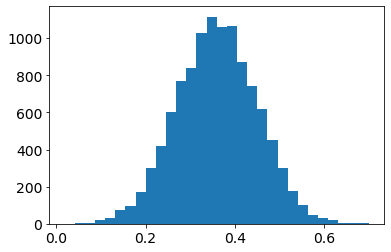

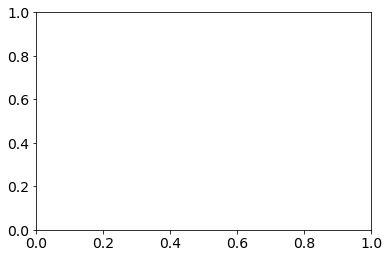

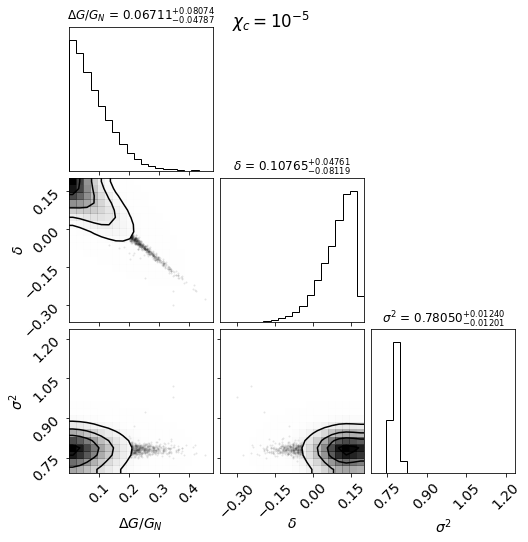

 14%|█████▍                                  | 125/918 [00:00<00:04, 180.02it/s]

11025-9102 [0.253] [274.7582, 616.813]
11025-9102 0.253 8.473677665680483e-07 7.509011336652503e-05


 21%|████████▎                               | 191/918 [00:01<00:05, 121.40it/s]

11941-12704 [50] [-0.9757, -0.9731, -0.9835, -0.989, -0.9922, -0.9925, -0.9914, -0.9913, -0.9907, -0.99, -0.9913, -0.9918, -0.9922, -0.9895]
11941-12704 50.0 0.0 7.909266150515391e-05


 59%|████████████████████████                 | 538/918 [00:11<00:19, 19.79it/s]

8445-3701


 69%|████████████████████████████▏            | 630/918 [00:17<00:23, 12.12it/s]

8604-9102 [50] [-0.0156, -0.4549, -0.3589, -0.2025, -0.0563, -0.0618, -0.1407, -0.181, -0.1425, -0.0279, -0.0356, 0.0944, 0.0983, -0.0166, 0.0461, -0.0875, -0.1344, -0.1154, -0.3124, -0.5329]
8604-9102 50.0 0.0 7.977594914998987e-05


100%|█████████████████████████████████████████| 918/918 [00:49<00:00, 18.39it/s]


Total number of points unscreened AD 4: 14825
Total number of points screened AD 4: 36
Total number of points unscreened AD 8: 14825
Total number of points screened AD 8: 36


100%|████████████████████████████████████| 10000/10000 [00:24<00:00, 406.38it/s]


chi= 7.593750000000001e-05
burn-in: 190
thin: 15
flat chain shape: 6660
flat log prob shape: 6540
None


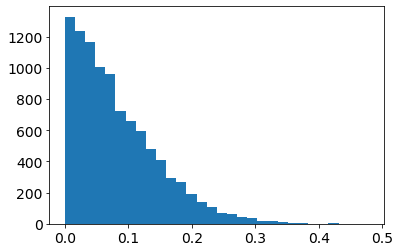

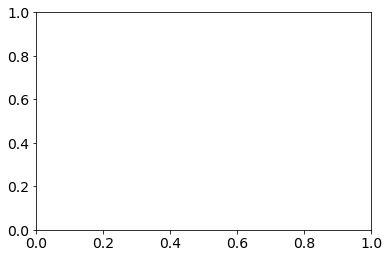

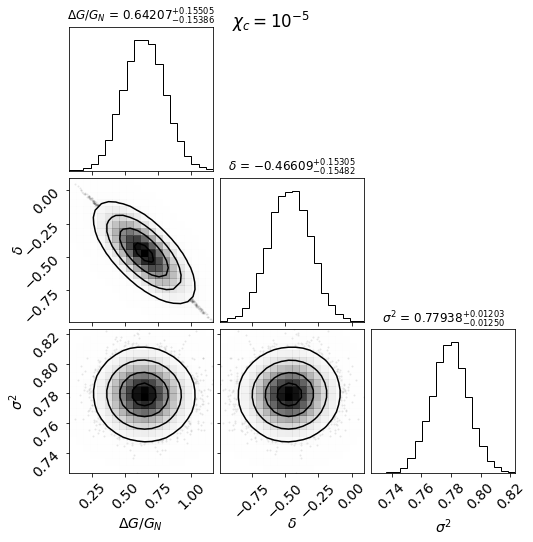

 58%|███████████████████████▉                 | 537/918 [00:10<00:18, 21.12it/s]

8445-3701


100%|█████████████████████████████████████████| 918/918 [00:49<00:00, 18.44it/s]


8.460937500000002e-05


 59%|████████████████████████                 | 538/918 [00:11<00:19, 19.98it/s]

8445-3701


100%|█████████████████████████████████████████| 918/918 [00:47<00:00, 19.38it/s]


9.375e-05


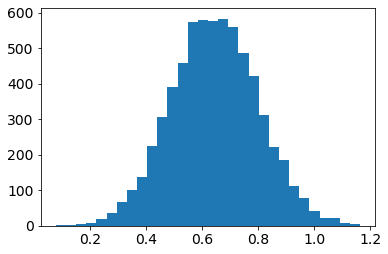

In [72]:
ind_hs = np.arange(0,20, 1)
chihstimes10 = [x*10 for x in chi_hs(ind_hs).tolist()]                      
ind_hsf= ind_hs.tolist()


plateifu_f, _, pot_mid, _ = \
            potential_env('/home/ricardo/Documents/codes/NIRVANA/nsa_dist_ra_dec.txt',ind_hsf[0])


ind, chi, alpha1mul, alpha1errmullo95, alpha1errmullo,alpha1errmulhi,alpha1errmulhi95, con1,con1errlo95, con1errlo,con1errhi,con1errhi95, sigma1mul,sigma1errmullo95, sigma1errmullo,sigma1errmulhi,sigma1errmulhi95,listvdifflist_flat  = plot_env_hs(plateifu_f,chihstimes10)

In [19]:
data1 = np.column_stack([chi, alpha1mul, alpha1errmullo95, alpha1errmullo,alpha1errmulhi,alpha1errmulhi95, con1,con1errlo95, con1errlo,con1errhi,con1errhi95, sigma1mul,sigma1errmullo95, sigma1errmullo,sigma1errmulhi,sigma1errmulhi95,listvdifflist_flat])  
datafile_path1 = f'Mod1Env10hilo.dat'
np.savetxt(datafile_path1 , data1, fmt= ['%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e'])

In [20]:
ind

[6, 7, 9, 11, 12, 13, 14, 15, 17, 18]

 59%|████████████████████████                 | 538/919 [00:09<00:12, 31.19it/s]

8445-3701


100%|█████████████████████████████████████████| 919/919 [00:33<00:00, 27.34it/s]


Total number of points unscreened AD 4: 2407
Total number of points screened AD 4: 12489
Total number of points unscreened AD 8: 2407
Total number of points screened AD 8: 12489


100%|████████████████████████████████████| 20000/20000 [00:35<00:00, 570.98it/s]


chi= 5.859375000000001e-08
burn-in: 179
thin: 21
flat chain shape: 9520
flat log prob shape: 9430
None


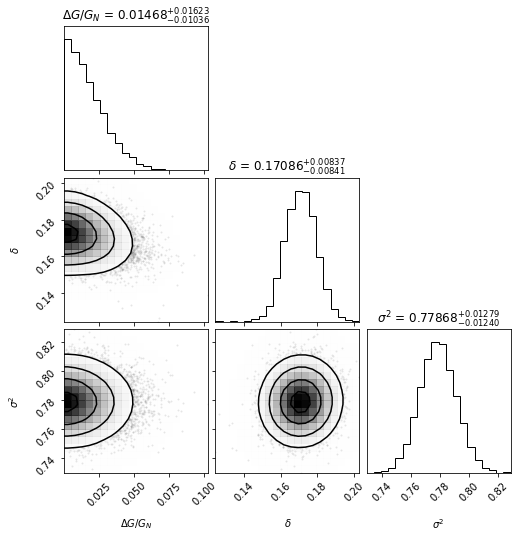

In [37]:
chil02 = (3/2)*10**(-8)*(0.2/0.32)**2*10
plateifu_f, _, pot_mid, _ = \
potential_env('/home/ricardo/Documents/codes/NIRVANA/nsa_dist_ra_dec.txt',22)
sampleA,_,lenv02= mcmc(chil02,plateifu_f,pot_mid,envsc=True).run_mcmc()
alphaA,alphaAlo95,alphaAlo,alphaAhi,alphaAhi95, conA,conAlo95,conAlo,conAhi,conAhi95, sigmaA,sigmaAlo95,sigmaAlo,sigmaAhi,sigmaAhi95=  mcmc(chil02,plateifu_f,pot_mid,envsc=True).plot_mcmc(sampleA)


In [38]:
alphaAhi

0.03091668366593188

 59%|███████████████████████▉                 | 487/832 [00:11<00:12, 27.61it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:14<00:11, 23.72it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:33<00:00, 24.67it/s]


Total number of points unscreened AD 4: 36
Total number of points screened AD 4: 13345
Total number of points unscreened AD 8: 36
Total number of points screened AD 8: 13345


100%|████████████████████████████████████| 20000/20000 [00:33<00:00, 599.33it/s]


chi= 2.3437500000000004e-08
burn-in: 149
thin: 24
flat chain shape: 8330
flat log prob shape: 8270
None
0.3209282309014271
-0.05714118693582648


 58%|███████████████████████▉                 | 486/832 [00:12<00:13, 26.39it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:15<00:12, 21.70it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:35<00:00, 23.58it/s]


Total number of points unscreened AD 4: 297
Total number of points screened AD 4: 13084
Total number of points unscreened AD 8: 297
Total number of points screened AD 8: 13084


100%|████████████████████████████████████| 20000/20000 [00:36<00:00, 554.40it/s]


chi= 9.375000000000002e-08
burn-in: 185
thin: 35
flat chain shape: 5710
flat log prob shape: 5660
None
0.013119061611475106
-0.11664701551226227


 58%|███████████████████████▉                 | 486/832 [00:13<00:15, 22.97it/s]

8445-3701


 67%|███████████████████████████▎             | 555/832 [00:16<00:13, 20.89it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:37<00:00, 22.36it/s]


Total number of points unscreened AD 4: 372
Total number of points screened AD 4: 13009
Total number of points unscreened AD 8: 372
Total number of points screened AD 8: 13009


100%|████████████████████████████████████| 20000/20000 [00:34<00:00, 581.84it/s]


chi= 2.1093750000000002e-07
burn-in: 300
thin: 28
flat chain shape: 7140
flat log prob shape: 7030
None
5.017356878626866e-06
-0.07721037094489039


 59%|███████████████████████▉                 | 487/832 [00:11<00:12, 27.56it/s]

8445-3701


 67%|███████████████████████████▎             | 555/832 [00:14<00:11, 23.09it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:32<00:00, 25.30it/s]


Total number of points unscreened AD 4: 828
Total number of points screened AD 4: 12553
Total number of points unscreened AD 8: 828
Total number of points screened AD 8: 12553


100%|████████████████████████████████████| 20000/20000 [00:34<00:00, 579.35it/s]


chi= 3.7500000000000006e-07
burn-in: 162
thin: 31
flat chain shape: 6450
flat log prob shape: 6390
None
0.1312056431094377
0.03059446483704667


 59%|████████████████████████                 | 488/832 [00:10<00:12, 27.99it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:13<00:11, 23.63it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:31<00:00, 26.10it/s]


Total number of points unscreened AD 4: 1499
Total number of points screened AD 4: 11882
Total number of points unscreened AD 8: 1499
Total number of points screened AD 8: 11882


100%|████████████████████████████████████| 20000/20000 [00:38<00:00, 525.83it/s]


chi= 5.859375000000001e-07
burn-in: 185
thin: 32
flat chain shape: 6250
flat log prob shape: 6190
None
0.12682912588781417
0.053837207639740564


 59%|████████████████████████                 | 488/832 [00:10<00:11, 30.32it/s]

8445-3701


 67%|███████████████████████████▎             | 555/832 [00:12<00:13, 21.13it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:31<00:00, 26.01it/s]


Total number of points unscreened AD 4: 2451
Total number of points screened AD 4: 10930
Total number of points unscreened AD 8: 2451
Total number of points screened AD 8: 10930


100%|████████████████████████████████████| 20000/20000 [00:36<00:00, 545.40it/s]


chi= 8.437500000000001e-07
burn-in: 343
thin: 21
flat chain shape: 9520
flat log prob shape: 9360
None
0.05093132680615205
-0.004724084462983627


 59%|████████████████████████                 | 489/832 [00:08<00:10, 33.51it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:11<00:10, 26.98it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:28<00:00, 28.85it/s]


Total number of points unscreened AD 4: 3276
Total number of points screened AD 4: 10105
Total number of points unscreened AD 8: 3276
Total number of points screened AD 8: 10105


100%|████████████████████████████████████| 20000/20000 [00:38<00:00, 523.98it/s]


chi= 1.1484375000000002e-06
burn-in: 171
thin: 23
flat chain shape: 8690
flat log prob shape: 8620
None
0.13573613179823957
0.08406219856233282


 59%|████████████████████████                 | 489/832 [00:08<00:10, 31.41it/s]

8445-3701


 67%|███████████████████████████▎             | 554/832 [00:11<00:10, 26.25it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:28<00:00, 29.04it/s]


Total number of points unscreened AD 4: 4088
Total number of points screened AD 4: 9293
Total number of points unscreened AD 8: 4088
Total number of points screened AD 8: 9293


100%|████████████████████████████████████| 20000/20000 [00:37<00:00, 540.12it/s]


chi= 1.4999999999999998e-06
burn-in: 122
thin: 23
flat chain shape: 8690
flat log prob shape: 8640
None
0.27232183221779127
0.22537276514851873


 59%|████████████████████████                 | 488/832 [00:08<00:10, 31.84it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:11<00:10, 27.10it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:28<00:00, 29.19it/s]


Total number of points unscreened AD 4: 4700
Total number of points screened AD 4: 8681
Total number of points unscreened AD 8: 4700
Total number of points screened AD 8: 8681


100%|████████████████████████████████████| 20000/20000 [00:37<00:00, 534.63it/s]


chi= 1.8984374999999996e-06
burn-in: 127
thin: 17
flat chain shape: 11760
flat log prob shape: 11690
None
0.2999728134357492
0.2560567090033037


 59%|████████████████████████▏                | 490/832 [00:08<00:09, 34.68it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:10<00:09, 28.67it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:27<00:00, 29.72it/s]


Total number of points unscreened AD 4: 5412
Total number of points screened AD 4: 7969
Total number of points unscreened AD 8: 5412
Total number of points screened AD 8: 7969


100%|████████████████████████████████████| 20000/20000 [00:39<00:00, 510.55it/s]


chi= 2.3437499999999994e-06
burn-in: 133
thin: 18
flat chain shape: 11110
flat log prob shape: 11030
None
0.28813477570555923
0.2449027857965218


 59%|████████████████████████                 | 488/832 [00:08<00:10, 32.71it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:10<00:09, 28.95it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:27<00:00, 30.30it/s]


Total number of points unscreened AD 4: 6111
Total number of points screened AD 4: 7270
Total number of points unscreened AD 8: 6111
Total number of points screened AD 8: 7270


100%|████████████████████████████████████| 20000/20000 [00:34<00:00, 571.79it/s]


chi= 2.8359375000000003e-06
burn-in: 152
thin: 17
flat chain shape: 11760
flat log prob shape: 11670
None
0.3255428924891384
0.2856745447275724


 59%|███████████████████████▉                 | 487/832 [00:07<00:09, 35.08it/s]

8445-3701


 67%|███████████████████████████▎             | 555/832 [00:09<00:08, 31.91it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:24<00:00, 33.84it/s]


Total number of points unscreened AD 4: 6397
Total number of points screened AD 4: 6984
Total number of points unscreened AD 8: 6397
Total number of points screened AD 8: 6984


100%|████████████████████████████████████| 20000/20000 [00:37<00:00, 538.21it/s]


chi= 3.3750000000000003e-06
burn-in: 141
thin: 21
flat chain shape: 9520
flat log prob shape: 9450
None
0.29712932040636075
0.2561659809894596


 59%|███████████████████████▉                 | 487/832 [00:07<00:11, 31.24it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:10<00:09, 28.30it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:26<00:00, 31.66it/s]


Total number of points unscreened AD 4: 6937
Total number of points screened AD 4: 6444
Total number of points unscreened AD 8: 6937
Total number of points screened AD 8: 6444


100%|████████████████████████████████████| 20000/20000 [00:36<00:00, 548.01it/s]


chi= 3.9609375000000006e-06
burn-in: 144
thin: 21
flat chain shape: 9520
flat log prob shape: 9450
None
0.24085133453899266
0.19930791201631448


 59%|████████████████████████▏                | 490/832 [00:07<00:09, 36.50it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:09<00:09, 28.10it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:25<00:00, 32.35it/s]


Total number of points unscreened AD 4: 7296
Total number of points screened AD 4: 6085
Total number of points unscreened AD 8: 7296
Total number of points screened AD 8: 6085


100%|████████████████████████████████████| 20000/20000 [00:35<00:00, 557.94it/s]


chi= 4.593750000000001e-06
burn-in: 148
thin: 19
flat chain shape: 10520
flat log prob shape: 10440
None
0.2531074865375176
0.21211457515088256


 59%|████████████████████████                 | 488/832 [00:07<00:08, 38.43it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:09<00:08, 30.75it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:24<00:00, 34.58it/s]


Total number of points unscreened AD 4: 7672
Total number of points screened AD 4: 5709
Total number of points unscreened AD 8: 7672
Total number of points screened AD 8: 5709


100%|████████████████████████████████████| 20000/20000 [00:36<00:00, 551.75it/s]


chi= 5.2734375e-06
burn-in: 133
thin: 18
flat chain shape: 11110
flat log prob shape: 11030
None
0.24504522267772497
0.20572736624545823


 59%|███████████████████████▉                 | 487/832 [00:06<00:09, 35.18it/s]

8445-3701


 67%|███████████████████████████▎             | 555/832 [00:09<00:09, 29.57it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:23<00:00, 35.00it/s]


Total number of points unscreened AD 4: 8035
Total number of points screened AD 4: 5346
Total number of points unscreened AD 8: 8035
Total number of points screened AD 8: 5346


100%|████████████████████████████████████| 20000/20000 [00:35<00:00, 563.57it/s]


chi= 6.000000000000001e-06
burn-in: 114
thin: 22
flat chain shape: 9090
flat log prob shape: 9030
None
0.29488964353943947
0.2538539509552009


 59%|████████████████████████▏                | 491/832 [00:06<00:08, 39.43it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:08<00:09, 29.34it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:23<00:00, 35.06it/s]


Total number of points unscreened AD 4: 8145
Total number of points screened AD 4: 5236
Total number of points unscreened AD 8: 8145
Total number of points screened AD 8: 5236


100%|████████████████████████████████████| 20000/20000 [00:35<00:00, 560.14it/s]


chi= 6.773437500000001e-06
burn-in: 135
thin: 21
flat chain shape: 9520
flat log prob shape: 9450
None
0.2770630885896063
0.23653869928499877


 59%|███████████████████████▉                 | 487/832 [00:07<00:10, 31.94it/s]

8445-3701


 67%|███████████████████████████▍             | 558/832 [00:09<00:09, 28.23it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:26<00:00, 31.45it/s]


Total number of points unscreened AD 4: 8474
Total number of points screened AD 4: 4907
Total number of points unscreened AD 8: 8474
Total number of points screened AD 8: 4907


100%|████████████████████████████████████| 20000/20000 [00:36<00:00, 553.47it/s]


chi= 7.593750000000001e-06
burn-in: 120
thin: 17
flat chain shape: 11760
flat log prob shape: 11690
None
0.33140539652936607
0.2909610760883224


 59%|████████████████████████                 | 488/832 [00:07<00:08, 39.25it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:09<00:09, 30.47it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:23<00:00, 34.73it/s]


Total number of points unscreened AD 4: 8514
Total number of points screened AD 4: 4867
Total number of points unscreened AD 8: 8514
Total number of points screened AD 8: 4867


100%|████████████████████████████████████| 20000/20000 [00:35<00:00, 567.17it/s]


chi= 8.460937500000002e-06
burn-in: 134
thin: 22
flat chain shape: 9090
flat log prob shape: 9030
None
0.30795185753593257
0.2671041692104521


 59%|███████████████████████▉                 | 487/832 [00:06<00:10, 33.73it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:09<00:09, 29.03it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:24<00:00, 34.64it/s]


Total number of points unscreened AD 4: 8695
Total number of points screened AD 4: 4686
Total number of points unscreened AD 8: 8695
Total number of points screened AD 8: 4686


100%|████████████████████████████████████| 20000/20000 [00:35<00:00, 566.71it/s]


chi= 9.375000000000001e-06
burn-in: 152
thin: 22
flat chain shape: 9090
flat log prob shape: 9020
None
0.29254429878055777
0.251456085520107


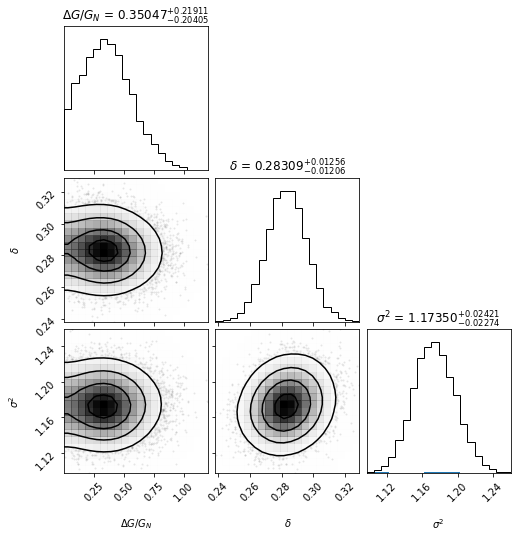

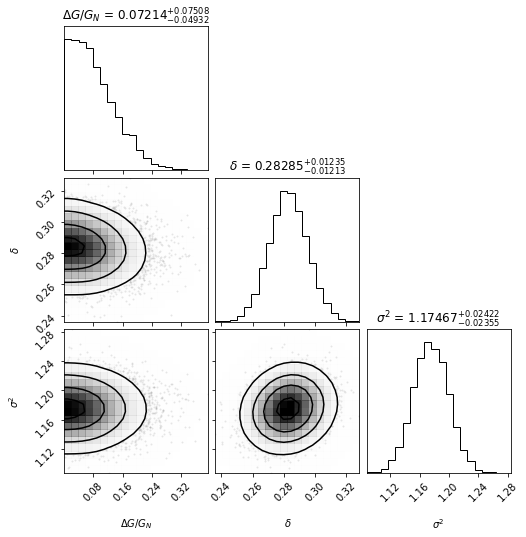

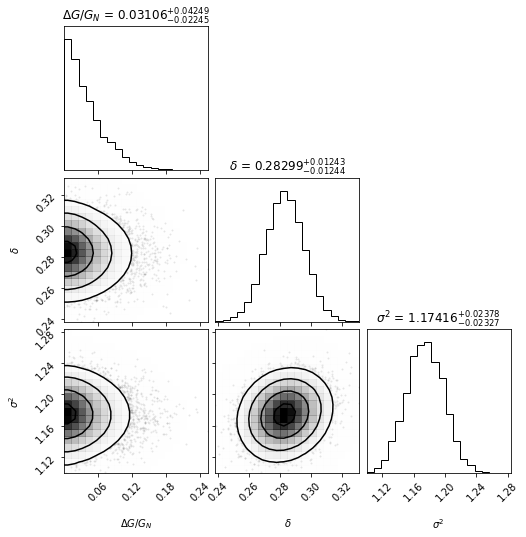

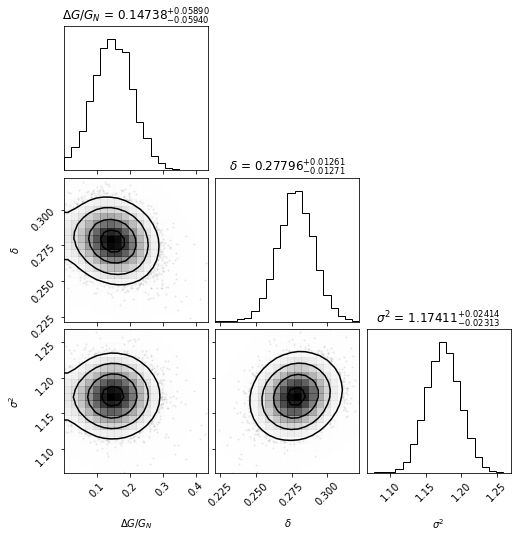

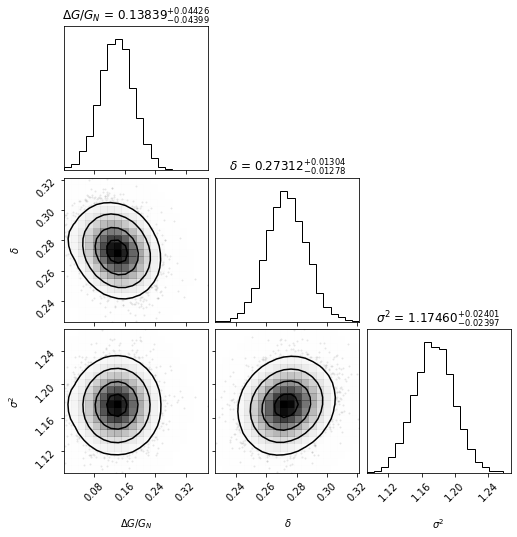

...

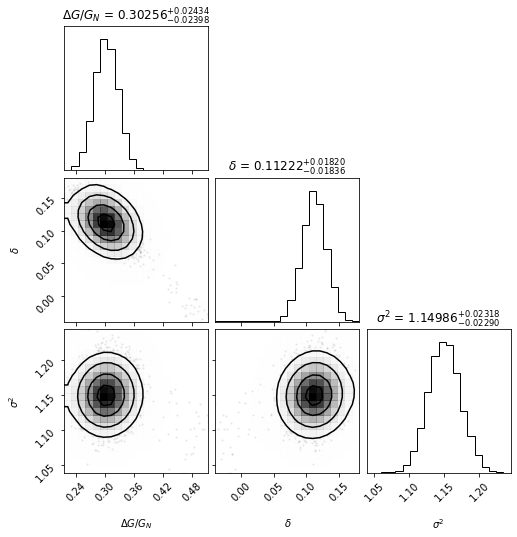

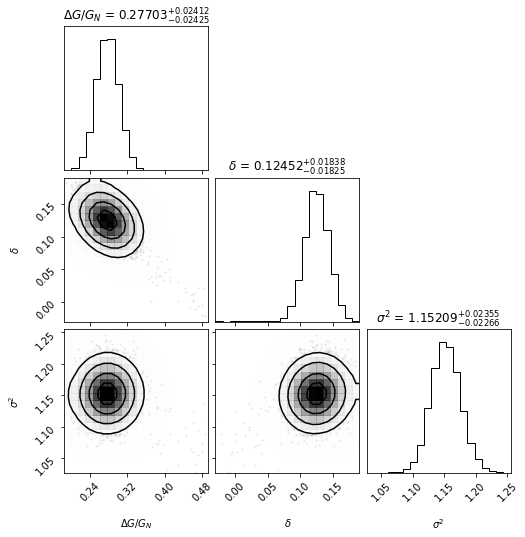

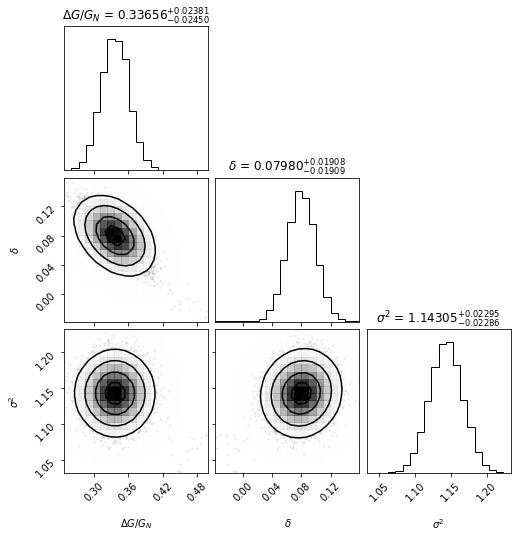

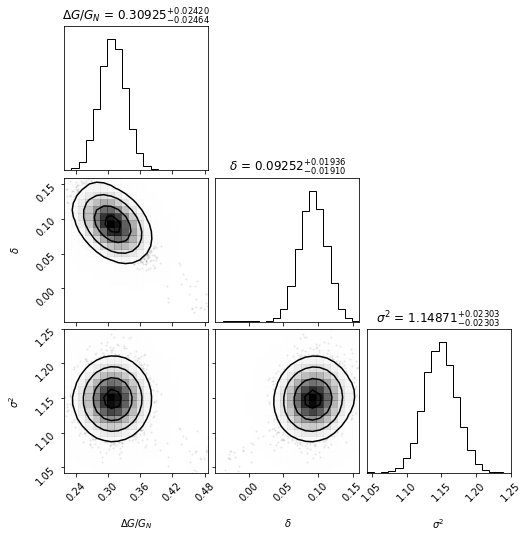

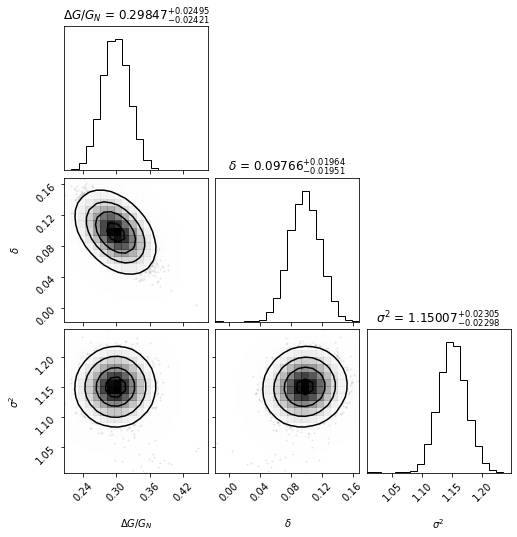

In [41]:
ind_hs = np.arange(0,20, 1)
chihs = chi_hs(ind_hs).tolist()                      
ind_hsf= ind_hs.tolist()

plateifu_fpoly, pot_midpoly =  potential_env_poly(ind_hsf[0])

# samplerA, samplerB = mcmc(chihs[0],plateifu_f,pot_mid,envsc=True).run_mcmc(spheric=False, unsc=True)
# mcmc(chihs[0],plateifu_f,pot_mid,envsc=True).plot_mcmc(samplerA)
plateifu_f, _, pot_mid, _ = \
            potential_env('/home/ricardo/Documents/codes/NIRVANA/nsa_dist_ra_dec.txt',ind_hsf[0])


alpha1mul, alpha1errmullo95, alpha1errmullo,alpha1errmulhi,alpha1errmulhi95, con1,con1errlo95, con1errlo,con1errhi,con1errhi95, sigma1mul,sigma1errmullo95, sigma1errmullo,sigma1errmulhi,sigma1errmulhi95,listvdifflist_flat   = plot_env_hs(plateifu_fpoly,chihs,poly=True)



In [42]:
chihslist=[chihs[i] for i in ind_hsf]
data1 = np.column_stack([chihslist, alpha1mul, alpha1errmullo95, alpha1errmullo,alpha1errmulhi,alpha1errmulhi95, con1,con1errlo95, con1errlo,con1errhi,con1errhi95, sigma1mul,sigma1errmullo95, sigma1errmullo,sigma1errmulhi,sigma1errmulhi95,listvdifflist_flat])  
datafile_path1 = f'Mod2Envhilo.dat'
np.savetxt(datafile_path1 , data1, fmt= ['%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e'])

 59%|████████████████████████▏                | 490/832 [00:07<00:09, 36.04it/s]

8445-3701


 67%|███████████████████████████▍             | 558/832 [00:10<00:08, 30.81it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:27<00:00, 30.50it/s]


Total number of points unscreened AD 4: 1713
Total number of points screened AD 4: 11668
Total number of points unscreened AD 8: 1713
Total number of points screened AD 8: 11668


100%|████████████████████████████████████| 20000/20000 [00:37<00:00, 527.80it/s]


chi= 2.3437500000000003e-07
burn-in: 182
thin: 25
flat chain shape: 8000
flat log prob shape: 7920
None
0.2007713099628478
0.1323762677570502


 59%|████████████████████████▏                | 490/832 [00:05<00:07, 44.01it/s]

8445-3701


 67%|███████████████████████████▍             | 558/832 [00:07<00:08, 33.80it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:22<00:00, 36.67it/s]


Total number of points unscreened AD 4: 5989
Total number of points screened AD 4: 7392
Total number of points unscreened AD 8: 5989
Total number of points screened AD 8: 7392


100%|████████████████████████████████████| 20000/20000 [00:35<00:00, 562.61it/s]


chi= 9.375000000000001e-07
burn-in: 146
thin: 16
flat chain shape: 12500
flat log prob shape: 12400
None
0.3240578543771661
0.28334940212098025


 59%|████████████████████████                 | 489/832 [00:05<00:08, 42.04it/s]

8445-3701


 67%|███████████████████████████▎             | 555/832 [00:07<00:08, 33.57it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:23<00:00, 35.91it/s]


Total number of points unscreened AD 4: 8879
Total number of points screened AD 4: 4502
Total number of points unscreened AD 8: 8879
Total number of points screened AD 8: 4502


100%|████████████████████████████████████| 20000/20000 [00:35<00:00, 562.56it/s]


chi= 2.109375e-06
burn-in: 124
thin: 14
flat chain shape: 14280
flat log prob shape: 14190
None
0.4144360259377779
0.3746699169167294


 59%|████████████████████████▏                | 490/832 [00:06<00:09, 37.96it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:08<00:09, 28.24it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:23<00:00, 36.14it/s]


Total number of points unscreened AD 4: 10790
Total number of points screened AD 4: 2591
Total number of points unscreened AD 8: 10790
Total number of points screened AD 8: 2591


100%|████████████████████████████████████| 20000/20000 [00:35<00:00, 565.77it/s]


chi= 3.7500000000000005e-06
burn-in: 162
thin: 30
flat chain shape: 6660
flat log prob shape: 6610
None
0.5562258173146091
0.5084644550954931


 59%|████████████████████████▏                | 491/832 [00:05<00:07, 42.99it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:07<00:08, 32.64it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:21<00:00, 38.87it/s]


Total number of points unscreened AD 4: 11897
Total number of points screened AD 4: 1484
Total number of points unscreened AD 8: 11897
Total number of points screened AD 8: 1484


100%|████████████████████████████████████| 20000/20000 [00:35<00:00, 569.88it/s]


chi= 5.859375e-06
burn-in: 179
thin: 38
flat chain shape: 5260
flat log prob shape: 5210
None
0.6729692402492911
0.6141126164922808


 59%|████████████████████████▏                | 490/832 [00:05<00:08, 40.07it/s]

8445-3701


 67%|███████████████████████████▍             | 558/832 [00:07<00:09, 29.05it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:22<00:00, 36.50it/s]


Total number of points unscreened AD 4: 12331
Total number of points screened AD 4: 1050
Total number of points unscreened AD 8: 12331
Total number of points screened AD 8: 1050


100%|████████████████████████████████████| 20000/20000 [00:35<00:00, 563.44it/s]


chi= 8.4375e-06
burn-in: 193
thin: 34
flat chain shape: 5880
flat log prob shape: 5820
None
0.7384424937186401
0.6670931179096057


 59%|████████████████████████▏                | 491/832 [00:05<00:07, 44.06it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:07<00:07, 35.77it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:20<00:00, 39.97it/s]


Total number of points unscreened AD 4: 12552
Total number of points screened AD 4: 829
Total number of points unscreened AD 8: 12552
Total number of points screened AD 8: 829


100%|████████████████████████████████████| 20000/20000 [00:34<00:00, 576.37it/s]


chi= 1.1484375000000001e-05
burn-in: 196
thin: 34
flat chain shape: 5880
flat log prob shape: 5820
None
0.7801951634804953
0.703054074696167


 58%|███████████████████████▉                 | 486/832 [00:05<00:08, 41.75it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:07<00:09, 30.45it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:22<00:00, 36.96it/s]


Total number of points unscreened AD 4: 12607
Total number of points screened AD 4: 774
Total number of points unscreened AD 8: 12607
Total number of points screened AD 8: 774


100%|████████████████████████████████████| 20000/20000 [00:35<00:00, 558.90it/s]


chi= 1.4999999999999999e-05
burn-in: 166
thin: 31
flat chain shape: 6450
flat log prob shape: 6390
None
0.6586411181538203
0.5754013628976846


 59%|███████████████████████▉                 | 487/832 [00:05<00:08, 39.94it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:07<00:08, 32.77it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:22<00:00, 36.24it/s]


Total number of points unscreened AD 4: 12629
Total number of points screened AD 4: 752
Total number of points unscreened AD 8: 12629
Total number of points screened AD 8: 752


100%|████████████████████████████████████| 20000/20000 [00:37<00:00, 534.68it/s]


chi= 1.8984374999999996e-05
burn-in: 157
thin: 22
flat chain shape: 9090
flat log prob shape: 9010
None
0.5076833886761658
0.4246524102822562


 59%|███████████████████████▉                 | 487/832 [00:05<00:07, 44.19it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:07<00:08, 32.37it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:22<00:00, 37.04it/s]


Total number of points unscreened AD 4: 12707
Total number of points screened AD 4: 674
Total number of points unscreened AD 8: 12707
Total number of points screened AD 8: 674


100%|████████████████████████████████████| 20000/20000 [00:37<00:00, 531.26it/s]


chi= 2.3437499999999994e-05
burn-in: 161
thin: 24
flat chain shape: 8330
flat log prob shape: 8260
None
0.481392898886788
0.3925885491173078


 59%|████████████████████████▏                | 490/832 [00:06<00:08, 39.54it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:08<00:10, 25.78it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:23<00:00, 35.07it/s]


Total number of points unscreened AD 4: 12762
Total number of points screened AD 4: 619
Total number of points unscreened AD 8: 12762
Total number of points screened AD 8: 619


100%|████████████████████████████████████| 20000/20000 [00:36<00:00, 544.01it/s]


chi= 2.8359375000000003e-05
burn-in: 153
thin: 23
flat chain shape: 8690
flat log prob shape: 8620
None
0.5044070091007598
0.4109568326085815


 59%|████████████████████████                 | 489/832 [00:05<00:08, 41.32it/s]

8445-3701


 67%|███████████████████████████▎             | 555/832 [00:07<00:09, 30.06it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:22<00:00, 36.48it/s]


Total number of points unscreened AD 4: 12887
Total number of points screened AD 4: 494
Total number of points unscreened AD 8: 12887
Total number of points screened AD 8: 494


100%|████████████████████████████████████| 20000/20000 [00:36<00:00, 549.07it/s]


chi= 3.375e-05
burn-in: 155
thin: 23
flat chain shape: 8690
flat log prob shape: 8620
None
0.5382711446864167
0.43970457366758253


 59%|███████████████████████▉                 | 487/832 [00:06<00:09, 35.99it/s]

8445-3701


 67%|███████████████████████████▌             | 559/832 [00:08<00:09, 30.19it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:23<00:00, 35.17it/s]


Total number of points unscreened AD 4: 12973
Total number of points screened AD 4: 408
Total number of points unscreened AD 8: 12973
Total number of points screened AD 8: 408


100%|████████████████████████████████████| 20000/20000 [00:34<00:00, 572.06it/s]


chi= 3.9609375000000006e-05
burn-in: 167
thin: 33
flat chain shape: 6060
flat log prob shape: 6010
None
0.734502770891341
0.6215369526947807


 58%|███████████████████████▉                 | 486/832 [00:05<00:07, 43.39it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:07<00:08, 34.13it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:22<00:00, 37.06it/s]


Total number of points unscreened AD 4: 13069
Total number of points screened AD 4: 312
Total number of points unscreened AD 8: 13069
Total number of points screened AD 8: 312


100%|████████████████████████████████████| 20000/20000 [00:35<00:00, 561.74it/s]


chi= 4.5937500000000005e-05
burn-in: 155
thin: 29
flat chain shape: 6890
flat log prob shape: 6840
None
0.7130911098876827
0.5903898137070995


 59%|████████████████████████                 | 488/832 [00:05<00:08, 39.74it/s]

8445-3701


 67%|███████████████████████████▍             | 558/832 [00:07<00:08, 31.43it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:22<00:00, 36.91it/s]


Total number of points unscreened AD 4: 13092
Total number of points screened AD 4: 289
Total number of points unscreened AD 8: 13092
Total number of points screened AD 8: 289


100%|████████████████████████████████████| 20000/20000 [00:33<00:00, 592.11it/s]


chi= 5.2734375000000006e-05
burn-in: 153
thin: 29
flat chain shape: 6890
flat log prob shape: 6840
None
0.6997606311349129
0.5725741201428156


 59%|████████████████████████                 | 488/832 [00:04<00:07, 44.16it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:06<00:07, 35.31it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:20<00:00, 40.87it/s]


Total number of points unscreened AD 4: 13190
Total number of points screened AD 4: 191
Total number of points unscreened AD 8: 13190
Total number of points screened AD 8: 191


100%|████████████████████████████████████| 20000/20000 [00:32<00:00, 612.02it/s]


chi= 6.000000000000001e-05
burn-in: 180
thin: 37
flat chain shape: 5400
flat log prob shape: 5350
None
0.8817308711474987
0.7103238887970842


 59%|████████████████████████                 | 488/832 [00:04<00:07, 45.67it/s]

8445-3701


 67%|███████████████████████████▍             | 558/832 [00:06<00:08, 33.88it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:20<00:00, 41.19it/s]


Total number of points unscreened AD 4: 13249
Total number of points screened AD 4: 132
Total number of points unscreened AD 8: 13249
Total number of points screened AD 8: 132


100%|████████████████████████████████████| 20000/20000 [00:32<00:00, 609.61it/s]


chi= 6.7734375e-05
burn-in: 162
thin: 22
flat chain shape: 9090
flat log prob shape: 9010
None
0.49679457166423857
0.2941520474452466


 59%|████████████████████████                 | 489/832 [00:05<00:07, 44.49it/s]

8445-3701


 67%|███████████████████████████▌             | 559/832 [00:07<00:07, 34.29it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:20<00:00, 40.88it/s]


Total number of points unscreened AD 4: 13280
Total number of points screened AD 4: 101
Total number of points unscreened AD 8: 13280
Total number of points screened AD 8: 101


100%|████████████████████████████████████| 20000/20000 [00:34<00:00, 587.05it/s]


chi= 7.593750000000001e-05
burn-in: 179
thin: 35
flat chain shape: 5710
flat log prob shape: 5660
None
1.0619024319447814
0.7962120770696661


 59%|████████████████████████                 | 488/832 [00:04<00:07, 45.86it/s]

8445-3701


 67%|███████████████████████████▍             | 558/832 [00:06<00:07, 34.72it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:20<00:00, 41.52it/s]


Total number of points unscreened AD 4: 13325
Total number of points screened AD 4: 56
Total number of points unscreened AD 8: 13325
Total number of points screened AD 8: 56


100%|████████████████████████████████████| 20000/20000 [00:32<00:00, 617.29it/s]


chi= 8.460937500000002e-05
burn-in: 159
thin: 26
flat chain shape: 7690
flat log prob shape: 7630
None
0.7912314192415695
0.40044176008764953


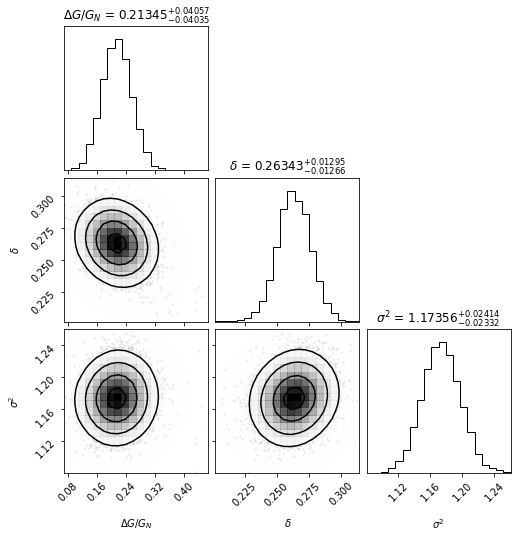

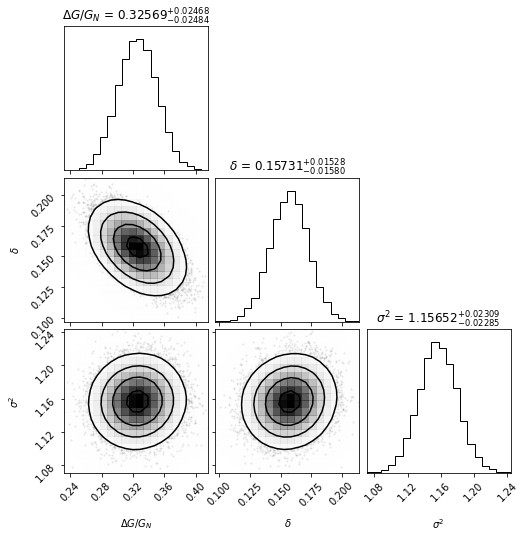

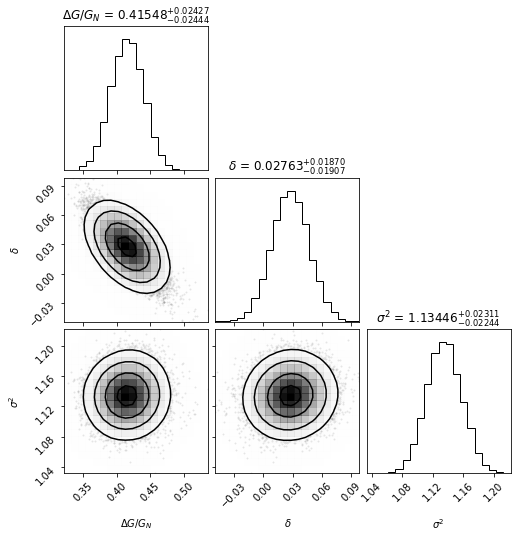

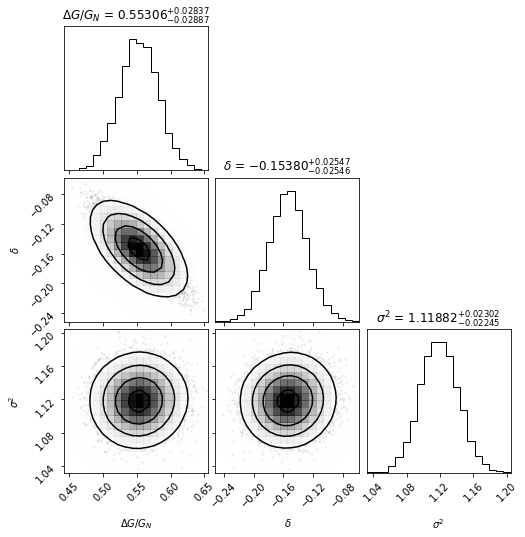

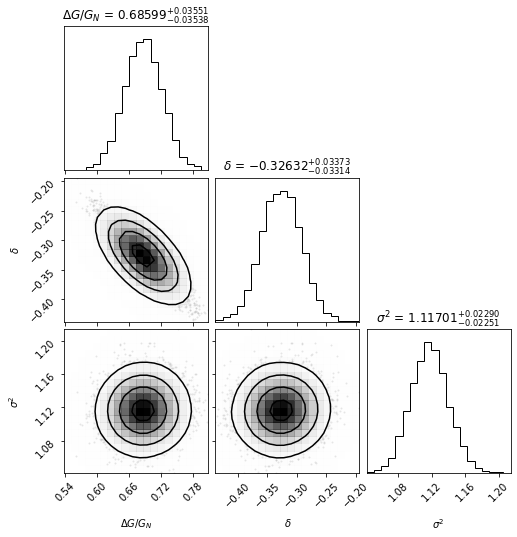

...

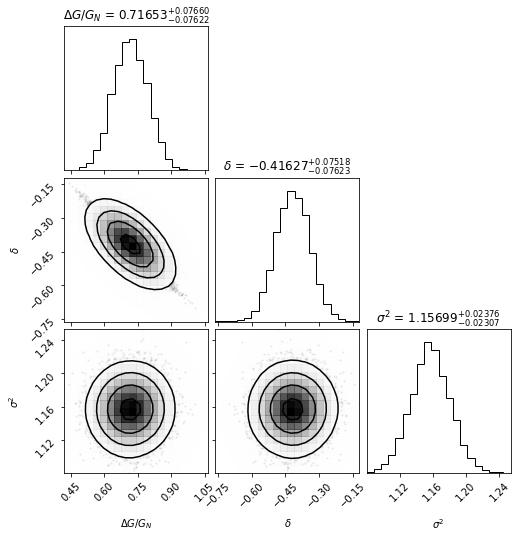

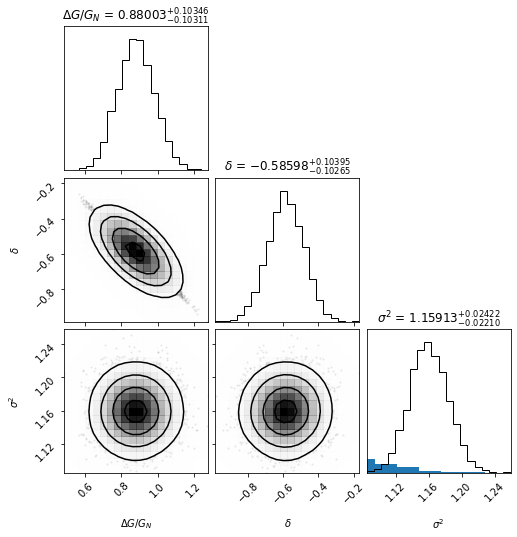

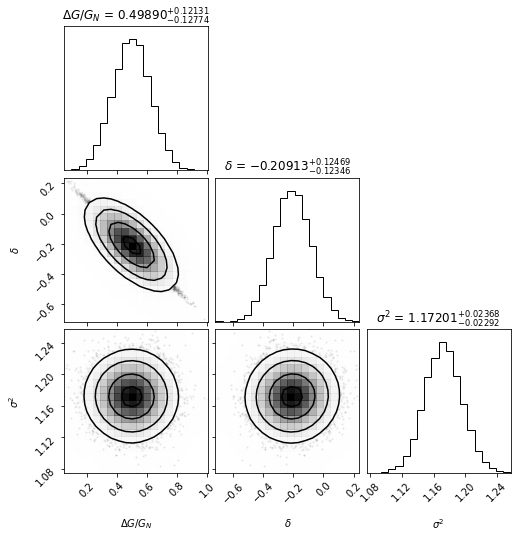

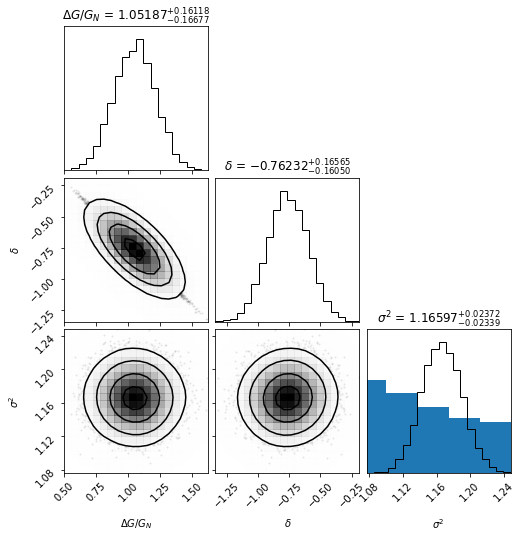

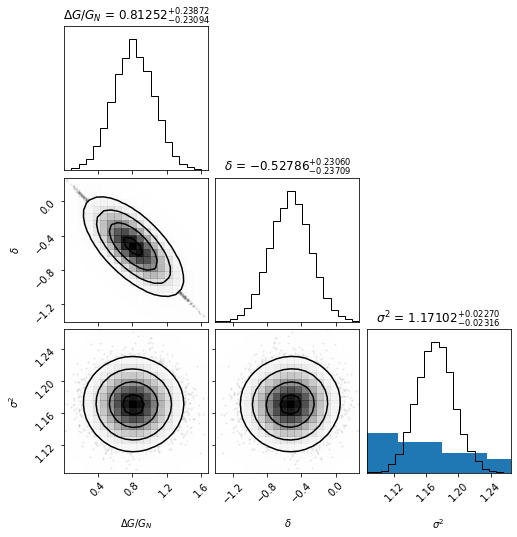

In [49]:
ind_hs = np.arange(0,20, 1)
chihstimes10 = [x*10 for x in chi_hs(ind_hs).tolist()]                      
ind_hsf= ind_hs.tolist()


plateifu_fpoly, pot_midpoly =  potential_env_poly(ind_hsf[0])

# samplerA, samplerB = mcmc(chihs[0],plateifu_f,pot_mid,envsc=True).run_mcmc(spheric=False, unsc=True)
# mcmc(chihs[0],plateifu_f,pot_mid,envsc=True).plot_mcmc(samplerA)
plateifu_f, _, pot_mid, _ = \
            potential_env('/home/ricardo/Documents/codes/NIRVANA/nsa_dist_ra_dec.txt',ind_hsf[0])


ind, chi , alpha1mul, alpha1errmullo95, alpha1errmullo,alpha1errmulhi,alpha1errmulhi95, con1,con1errlo95, con1errlo,con1errhi,con1errhi95, sigma1mul,sigma1errmullo95, sigma1errmullo,sigma1errmulhi,sigma1errmulhi95,listvdifflist_flat   = plot_env_hs(plateifu_fpoly,chihstimes10,poly=True)





In [50]:
data1 = np.column_stack([chi, alpha1mul, alpha1errmullo95, alpha1errmullo,alpha1errmulhi,alpha1errmulhi95, con1,con1errlo95, con1errlo,con1errhi,con1errhi95, sigma1mul,sigma1errmullo95, sigma1errmullo,sigma1errmulhi,sigma1errmulhi95,listvdifflist_flat])  
datafile_path1 = f'Mod2Envhilo10.dat'
np.savetxt(datafile_path1 , data1, fmt= ['%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e'])

 58%|███████████████████████▉                 | 486/832 [00:11<00:12, 27.79it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:14<00:11, 23.30it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:33<00:00, 25.17it/s]


2.3437500000000007e-09


 59%|███████████████████████▉                 | 487/832 [00:12<00:13, 26.20it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:15<00:11, 23.87it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:33<00:00, 24.64it/s]


Total number of points unscreened AD 4: 4
Total number of points screened AD 4: 13377
Total number of points unscreened AD 8: 4
Total number of points screened AD 8: 13377


100%|████████████████████████████████████| 20000/20000 [00:30<00:00, 647.70it/s]


chi= 9.375000000000003e-09
burn-in: 152
thin: 26
flat chain shape: 7690
flat log prob shape: 7630
None
0.0005769529320169831
-7.722501446661836


 59%|████████████████████████                 | 488/832 [00:12<00:12, 27.99it/s]

8445-3701


 67%|███████████████████████████▎             | 555/832 [00:15<00:11, 23.88it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:34<00:00, 24.42it/s]


Total number of points unscreened AD 4: 9
Total number of points screened AD 4: 13372
Total number of points unscreened AD 8: 9
Total number of points screened AD 8: 13372


100%|████████████████████████████████████| 20000/20000 [00:30<00:00, 653.36it/s]


chi= 2.1093750000000003e-08
burn-in: 154
thin: 30
flat chain shape: 6660
flat log prob shape: 6610
None
0.000890428968821938
-4.179379452542934


 58%|███████████████████████▉                 | 485/832 [00:12<00:14, 23.79it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:15<00:12, 21.97it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:34<00:00, 24.26it/s]


Total number of points unscreened AD 4: 4
Total number of points screened AD 4: 13377
Total number of points unscreened AD 8: 4
Total number of points screened AD 8: 13377


100%|████████████████████████████████████| 20000/20000 [00:30<00:00, 650.56it/s]


chi= 3.750000000000001e-08
burn-in: 150
thin: 29
flat chain shape: 6890
flat log prob shape: 6840
None
4.811884266997655
-4.9442314392942155


 59%|████████████████████████                 | 488/832 [00:11<00:12, 27.24it/s]

8445-3701


 67%|███████████████████████████▎             | 555/832 [00:14<00:11, 23.49it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:32<00:00, 25.31it/s]


5.859375000000001e-08


 59%|███████████████████████▉                 | 487/832 [00:11<00:13, 26.42it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:14<00:11, 23.22it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:32<00:00, 25.50it/s]


8.437500000000001e-08


 59%|████████████████████████                 | 488/832 [00:11<00:12, 27.71it/s]

8445-3701


 67%|███████████████████████████▎             | 555/832 [00:14<00:11, 23.84it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:34<00:00, 24.23it/s]


1.1484375000000003e-07


 58%|███████████████████████▉                 | 486/832 [00:12<00:13, 25.88it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:15<00:11, 23.03it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:34<00:00, 24.41it/s]


1.5e-07


 59%|████████████████████████                 | 488/832 [00:12<00:13, 25.95it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:15<00:12, 22.07it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:33<00:00, 24.56it/s]


Total number of points unscreened AD 4: 16
Total number of points screened AD 4: 13365
Total number of points unscreened AD 8: 16
Total number of points screened AD 8: 13365


100%|████████████████████████████████████| 20000/20000 [00:32<00:00, 621.06it/s]


chi= 1.8984374999999996e-07
burn-in: 151
thin: 29
flat chain shape: 6890
flat log prob shape: 6840
None
1.414983936198766e-05
-0.6132894804281609


 59%|███████████████████████▉                 | 487/832 [00:12<00:13, 26.40it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:15<00:12, 21.86it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:34<00:00, 24.11it/s]


Total number of points unscreened AD 4: 23
Total number of points screened AD 4: 13358
Total number of points unscreened AD 8: 23
Total number of points screened AD 8: 13358


100%|████████████████████████████████████| 20000/20000 [00:31<00:00, 630.89it/s]


chi= 2.3437499999999995e-07
burn-in: 152
thin: 30
flat chain shape: 6660
flat log prob shape: 6610
None
1.1151011360649443e-05
-0.5413301362951621


 59%|███████████████████████▉                 | 487/832 [00:12<00:13, 24.85it/s]

8445-3701


 67%|███████████████████████████▎             | 555/832 [00:15<00:12, 22.48it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:33<00:00, 24.89it/s]


Total number of points unscreened AD 4: 42
Total number of points screened AD 4: 13339
Total number of points unscreened AD 8: 42
Total number of points screened AD 8: 13339


100%|████████████████████████████████████| 20000/20000 [00:29<00:00, 680.98it/s]


chi= 2.8359375000000006e-07
burn-in: 149
thin: 33
flat chain shape: 6060
flat log prob shape: 6010
None
2.2249158751590226e-05
-0.3016348520559532


 58%|███████████████████████▉                 | 486/832 [00:11<00:12, 28.71it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:14<00:11, 24.08it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:32<00:00, 25.66it/s]


Total number of points unscreened AD 4: 73
Total number of points screened AD 4: 13308
Total number of points unscreened AD 8: 73
Total number of points screened AD 8: 13308


100%|████████████████████████████████████| 20000/20000 [00:32<00:00, 621.19it/s]


chi= 3.3750000000000005e-07
burn-in: 154
thin: 33
flat chain shape: 6060
flat log prob shape: 6010
None
0.027375690867707546
-0.24657361316526347


 59%|███████████████████████▉                 | 487/832 [00:12<00:13, 24.99it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:15<00:11, 24.22it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:35<00:00, 23.61it/s]


Total number of points unscreened AD 4: 77
Total number of points screened AD 4: 13304
Total number of points unscreened AD 8: 77
Total number of points screened AD 8: 13304


100%|████████████████████████████████████| 20000/20000 [00:31<00:00, 627.72it/s]


chi= 3.960937500000001e-07
burn-in: 156
thin: 26
flat chain shape: 7690
flat log prob shape: 7630
None
3.2601605229776176e-05
-0.2596942141575976


 59%|████████████████████████                 | 488/832 [00:12<00:12, 27.49it/s]

8445-3701


 67%|███████████████████████████▎             | 555/832 [00:14<00:11, 24.41it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:32<00:00, 25.34it/s]


Total number of points unscreened AD 4: 101
Total number of points screened AD 4: 13280
Total number of points unscreened AD 8: 101
Total number of points screened AD 8: 13280


100%|████████████████████████████████████| 20000/20000 [00:31<00:00, 638.78it/s]


chi= 4.593750000000001e-07
burn-in: 151
thin: 31
flat chain shape: 6450
flat log prob shape: 6400
None
1.0127091487788231e-05
-0.2621784817454759


 58%|███████████████████████▉                 | 486/832 [00:11<00:11, 29.45it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:14<00:11, 23.97it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:33<00:00, 25.14it/s]


Total number of points unscreened AD 4: 121
Total number of points screened AD 4: 13260
Total number of points unscreened AD 8: 121
Total number of points screened AD 8: 13260


100%|████████████████████████████████████| 20000/20000 [00:31<00:00, 627.80it/s]


chi= 5.2734375e-07
burn-in: 165
thin: 36
flat chain shape: 5550
flat log prob shape: 5500
None
3.999493616006419e-05
-0.1924472807514631


 59%|████████████████████████                 | 488/832 [00:11<00:12, 28.48it/s]

8445-3701


 67%|███████████████████████████▎             | 555/832 [00:14<00:11, 23.64it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:32<00:00, 25.79it/s]


Total number of points unscreened AD 4: 150
Total number of points screened AD 4: 13231
Total number of points unscreened AD 8: 150
Total number of points screened AD 8: 13231


100%|████████████████████████████████████| 20000/20000 [00:32<00:00, 607.45it/s]


chi= 6.000000000000002e-07
burn-in: 202
thin: 36
flat chain shape: 5550
flat log prob shape: 5490
None
7.1411248734262744e-06
-0.12268986875529578


 58%|███████████████████████▉                 | 486/832 [00:11<00:11, 29.64it/s]

8445-3701


 67%|███████████████████████████▍             | 556/832 [00:14<00:11, 24.38it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:31<00:00, 26.20it/s]


Total number of points unscreened AD 4: 157
Total number of points screened AD 4: 13224
Total number of points unscreened AD 8: 157
Total number of points screened AD 8: 13224


100%|████████████████████████████████████| 20000/20000 [00:29<00:00, 671.82it/s]


chi= 6.773437500000002e-07
burn-in: 264
thin: 34
flat chain shape: 5880
flat log prob shape: 5800
None
2.0718598111546483e-05
-0.08940752273257602


 59%|███████████████████████▉                 | 487/832 [00:11<00:13, 26.04it/s]

8445-3701


 67%|███████████████████████████▍             | 557/832 [00:15<00:12, 22.49it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:32<00:00, 25.64it/s]


Total number of points unscreened AD 4: 177
Total number of points screened AD 4: 13204
Total number of points unscreened AD 8: 177
Total number of points screened AD 8: 13204


100%|████████████████████████████████████| 20000/20000 [00:31<00:00, 642.26it/s]


chi= 7.593750000000001e-07
burn-in: 293
thin: 36
flat chain shape: 5550
flat log prob shape: 5470
None
2.910747631297214e-06
-0.07198865835297873


 58%|███████████████████████▉                 | 486/832 [00:11<00:11, 31.13it/s]

8445-3701


 67%|███████████████████████████▎             | 555/832 [00:13<00:11, 24.97it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:31<00:00, 26.38it/s]


Total number of points unscreened AD 4: 199
Total number of points screened AD 4: 13182
Total number of points unscreened AD 8: 199
Total number of points screened AD 8: 13182


100%|████████████████████████████████████| 20000/20000 [00:32<00:00, 623.47it/s]


chi= 8.460937500000002e-07
burn-in: 239
thin: 36
flat chain shape: 5550
flat log prob shape: 5480
None
1.3095730842357413e-05
-0.07151880960676013


 58%|███████████████████████▉                 | 485/832 [00:11<00:12, 28.25it/s]

8445-3701


 67%|███████████████████████████▎             | 555/832 [00:14<00:11, 24.56it/s]

8595-3704


100%|█████████████████████████████████████████| 832/832 [00:32<00:00, 25.50it/s]


Total number of points unscreened AD 4: 209
Total number of points screened AD 4: 13172
Total number of points unscreened AD 8: 209
Total number of points screened AD 8: 13172


100%|████████████████████████████████████| 20000/20000 [00:31<00:00, 643.69it/s]


chi= 9.375000000000001e-07
burn-in: 305
thin: 36
flat chain shape: 5550
flat log prob shape: 5470
None
1.8258675975766844e-06
-0.0645718451953798


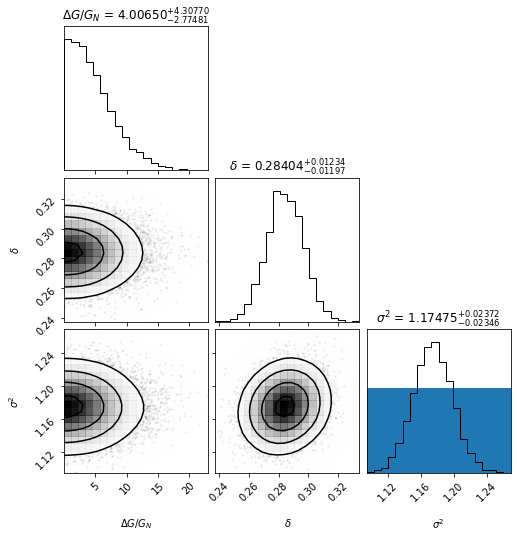

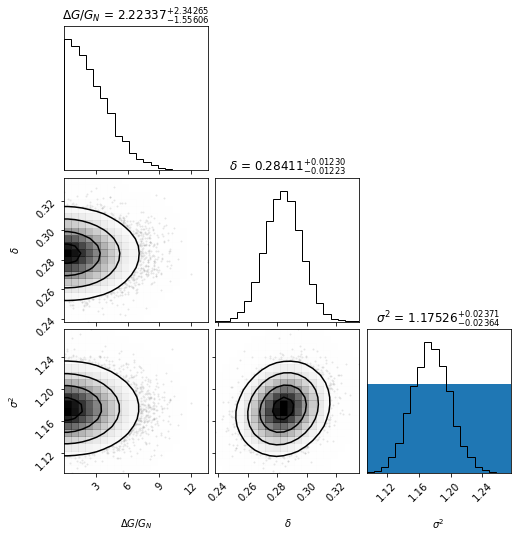

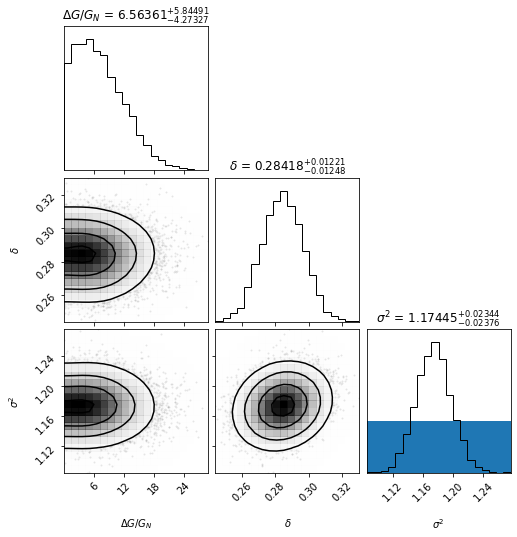

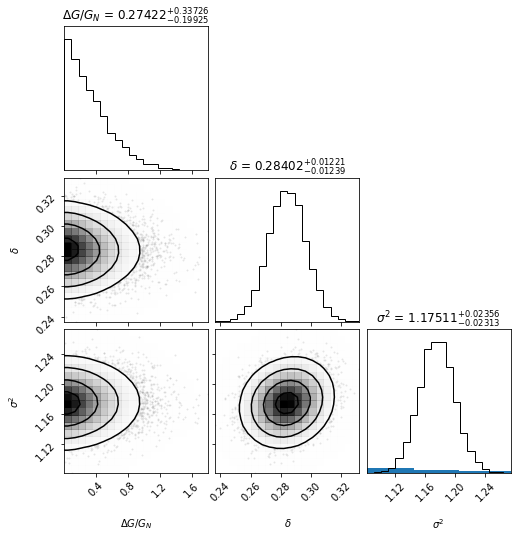

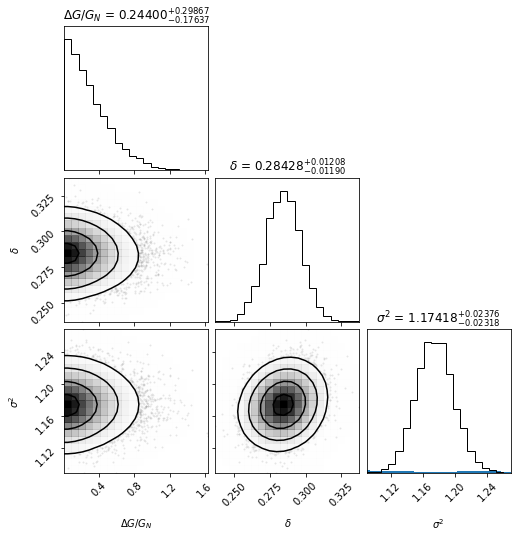

...

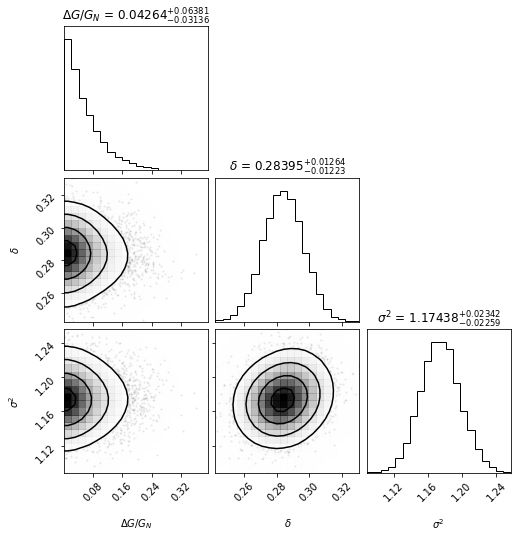

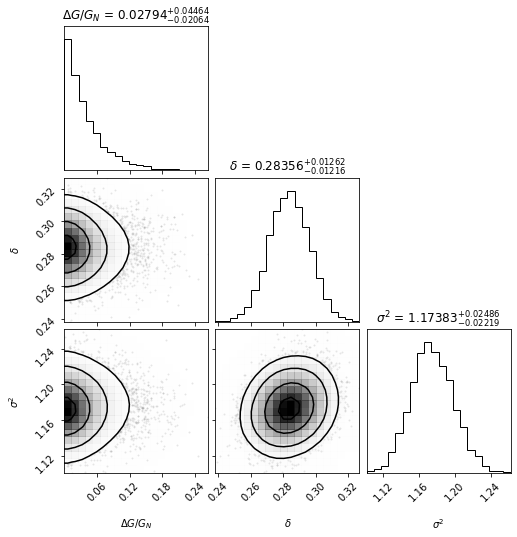

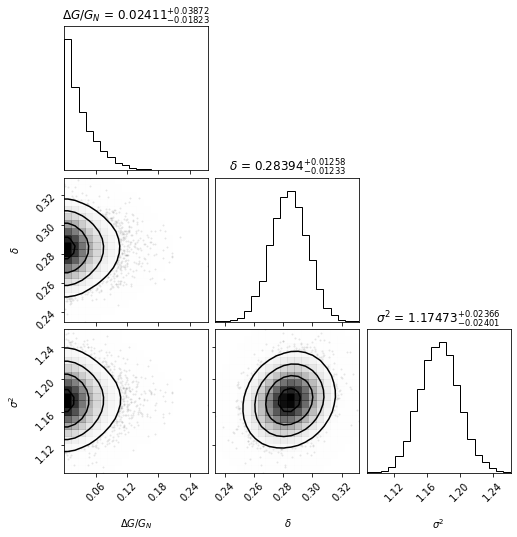

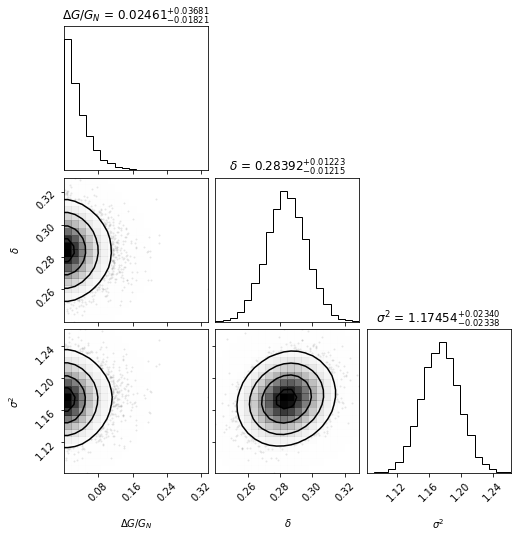

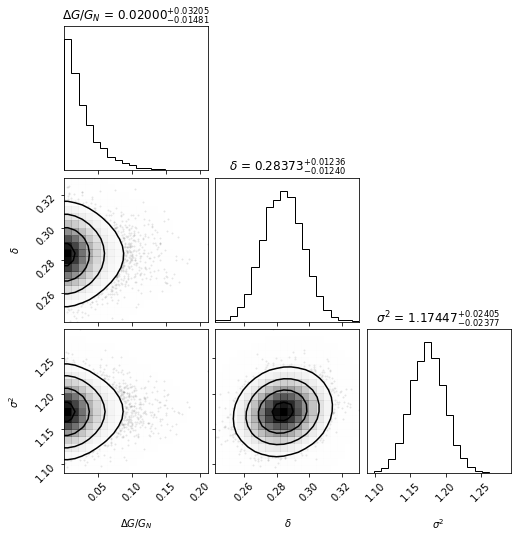

In [56]:
ind_hs = np.arange(0,20, 1)
chihstimes01 = [x*1e-1 for x in chi_hs(ind_hs).tolist()]                      
ind_hsf= ind_hs.tolist()

plateifu_fpoly, pot_midpoly =  potential_env_poly(ind_hsf[0])

# samplerA, samplerB = mcmc(chihs[0],plateifu_f,pot_mid,envsc=True).run_mcmc(spheric=False, unsc=True)
# mcmc(chihs[0],plateifu_f,pot_mid,envsc=True).plot_mcmc(samplerA)
chihs , alpha1mul, alpha1errmullo95, alpha1errmullo,alpha1errmulhi,alpha1errmulhi95, con1,con1errlo95, con1errlo,con1errhi,con1errhi95, sigma1mul,sigma1errmullo95, sigma1errmullo,sigma1errmulhi,sigma1errmulhi95,listvdifflist_flat   = plot_env_hs(plateifu_fpoly,chihstimes01,poly=True)




In [57]:
data1 = np.column_stack([chihs, alpha1mul, alpha1errmullo95, alpha1errmullo,alpha1errmulhi,alpha1errmulhi95, con1,con1errlo95, con1errlo,con1errhi,con1errhi95, sigma1mul,sigma1errmullo95, sigma1errmullo,sigma1errmulhi,sigma1errmulhi95,listvdifflist_flat])  
datafile_path1 = f'Mod2Envhilo01.dat'
np.savetxt(datafile_path1 , data1, fmt= ['%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e','%5.4e'])